## XGBoost : 사전연구와의 비교 : test size - 0.25

In [381]:
Prev_SkillCraft_df = SkillCraft_df.copy()

In [382]:
len(Prev_SkillCraft_df)

3316

In [383]:
# LeagueLevel에 대해 Master를 1, 나머지를 0로 변경한다.
def LeagueComFunction(x):
    if x == 2:
        return 1
    else:
        return 0

In [384]:
Prev_SkillCraft_df['LeagueLevel'] = Prev_SkillCraft_df['LeagueLevel'].apply(LeagueComFunction)

In [385]:
Prev_SkillCraft_df.LeagueLevel.describe()

count    3316.000000
mean        0.212907
std         0.409424
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: LeagueLevel, dtype: float64

In [386]:
# 분석 결과를 보기 전 그룹에 대한 변수의 평균 확인

In [387]:
Prev_SkillCraft_df.groupby(Prev_SkillCraft_df.LeagueLevel).mean().T

LeagueLevel,0,1
HoursPerWeek,14.035149,27.133144
TotalHours,542.913352,912.133144
AssignToHotkeys,1.725746,2.952593
UniqueHotkeys,0.282425,0.412318
MinimapAttacks,0.393675,0.963810
MinimapRightClicks,1.855185,2.674176
GapBetweenPACs,43.298404,28.997210
ActionLatency,67.963816,47.508314
ActionsInPAC,5.168590,5.477614
TotalMapExplored,1.454462,1.652331


In [388]:
# LeagueLevel에 대해 먼저 나누어 준다.
Prev_target = Prev_SkillCraft_df.LeagueLevel

In [389]:
# LeagueLevel제거
Prev_SkillCraft_df.drop(['LeagueLevel'], axis=1, inplace=True)

In [390]:
# o과 1의 비율은?
# 0의 비율
# 1의 비율
sum(Prev_target == 0) / len(Prev_target), sum(Prev_target == 1) / len(Prev_target)

(0.7870928829915561, 0.21290711700844392)

In [391]:
# 각 클래스별 개수
sum(IntMas_target == 0), sum(IntMas_target == 1)

(1581, 706)

In [392]:
# 클래스의 개수가 작으므로 오버샘플링을 실시

In [393]:
# train/test 80 : 20
Prev_X_train, Prev_X_test, Prev_y_train, Prev_y_test = train_test_split(Prev_SkillCraft_df, Prev_target, test_size = 0.25, shuffle=True, stratify=Prev_target, random_state=2022)

### Over sampling

In [394]:
# SMOTE 객체 생성
smote = SMOTE(random_state=2022)

In [395]:
Prev_X_train_resampled, Prev_y_train_resampled = smote.fit_resample(Prev_X_train, Prev_y_train)

In [396]:
# train/val 60 : 20 (80을 3:1로 등분한다면?, 0.25 비율 (1/4))
Prev_X_train, Prev_X_val, Prev_y_train, Prev_y_val = train_test_split(Prev_X_train_resampled, Prev_y_train_resampled,
                                                                   test_size = 0.2, shuffle=True,
                                                                   stratify=Prev_y_train_resampled, random_state=2022)

In [397]:
sum(Prev_y_train == 0) / len(Prev_y_train_resampled), sum(Prev_y_train == 1) / len(Prev_y_train_resampled)

(0.39989785495403474, 0.39989785495403474)

In [398]:
# 데이터 개수
len(Prev_X_train), len(Prev_X_val), len(Prev_X_test)

(3132, 784, 829)

### Modeling : Tuning Guide - GridSearch & Early Stopting

In [399]:
learning_rate = [i/10.0 for i in range(1,5)]
n_estimators = [i for i in range(100, 300, 10)]
max_depth = 4
min_child_weight = 1
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [400]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : n_estimators,
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Prev_X_train, Prev_y_train)))

results=grid_search.fit(Prev_X_train, Prev_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.74824
[0]	validation_0-aucpr:0.76570
[0]	validation_0-aucpr:0.74790
[0]	validation_0-aucpr:0.76291
[0]	validation_0-aucpr:0.75484
[1]	validation_0-aucpr:0.81817
[0]	validation_0-aucpr:0.74824
[0]	validation_0-aucpr:0.76570
[0]	validation_0-aucpr:0.76291
[1]	validation_0-aucpr:0.83023
[1]	validation_0-aucpr:0.78970
[1]	validation_0-aucpr:0.81191
[1]	validation_0-aucpr:0.78646
[1]	validation_0-aucpr:0.81817
[2]	validation_0-aucpr:0.85826
[1]	validation_0-aucpr:0.83023
[1]	validation_0-aucpr:0.81191
[2]	validation_0-aucpr:0.86813
[2]	validation_0-aucpr:0.85227
[2]	validation_0-aucpr:0.82440
[2]	validation_0-aucpr:0.81209
[3]	validation_0-aucpr:0.88255
[2]	validation_0-aucpr:0.85826
[2]	validation_0-aucpr:0.85227
[3]	validation_0-aucpr:0.87978
[2]	validation_0-aucpr:0.86813
[3]	validation_0-aucpr:0.84486
[3]	validation_0-aucpr:0.86360
[3]	validation_0-aucpr:0.84180
[4]	validation_0-aucpr:0.89988
[3]	validation_0-aucpr:0.88255
[3]	validation_0-aucpr:0.87978
[3]	vali

[35]	validation_0-aucpr:0.94268
[33]	validation_0-aucpr:0.94319
[36]	validation_0-aucpr:0.94490
[34]	validation_0-aucpr:0.94983
[35]	validation_0-aucpr:0.94476
[35]	validation_0-aucpr:0.94506
[35]	validation_0-aucpr:0.93725
[35]	validation_0-aucpr:0.95183
[36]	validation_0-aucpr:0.94285
[34]	validation_0-aucpr:0.94520
[37]	validation_0-aucpr:0.94622
[36]	validation_0-aucpr:0.93764
[35]	validation_0-aucpr:0.95183
[36]	validation_0-aucpr:0.94619
[36]	validation_0-aucpr:0.94490
[36]	validation_0-aucpr:0.95200
[37]	validation_0-aucpr:0.94707
[35]	validation_0-aucpr:0.94476
[38]	validation_0-aucpr:0.94692
[37]	validation_0-aucpr:0.94115
[37]	validation_0-aucpr:0.95416
[36]	validation_0-aucpr:0.95200
[37]	validation_0-aucpr:0.94622
[37]	validation_0-aucpr:0.94677
[38]	validation_0-aucpr:0.94812
[36]	validation_0-aucpr:0.94619
[39]	validation_0-aucpr:0.94752
[38]	validation_0-aucpr:0.94101
[37]	validation_0-aucpr:0.95416
[38]	validation_0-aucpr:0.95501
[38]	validation_0-aucpr:0.94692
[38]	val

[71]	validation_0-aucpr:0.96050
[73]	validation_0-aucpr:0.95758
[71]	validation_0-aucpr:0.96091
[69]	validation_0-aucpr:0.96062
[72]	validation_0-aucpr:0.96035
[71]	validation_0-aucpr:0.96314
[73]	validation_0-aucpr:0.96070
[72]	validation_0-aucpr:0.96292
[72]	validation_0-aucpr:0.96045
[70]	validation_0-aucpr:0.96068
[74]	validation_0-aucpr:0.95769
[72]	validation_0-aucpr:0.96120
[73]	validation_0-aucpr:0.96070
[74]	validation_0-aucpr:0.96104
[73]	validation_0-aucpr:0.96266
[72]	validation_0-aucpr:0.96292
[73]	validation_0-aucpr:0.96065
[71]	validation_0-aucpr:0.96091
[75]	validation_0-aucpr:0.95754
[73]	validation_0-aucpr:0.96132
[73]	validation_0-aucpr:0.96266
[74]	validation_0-aucpr:0.96104
[75]	validation_0-aucpr:0.96134
[74]	validation_0-aucpr:0.96277
[74]	validation_0-aucpr:0.96092
[72]	validation_0-aucpr:0.96120
[76]	validation_0-aucpr:0.95722
[74]	validation_0-aucpr:0.96277
[75]	validation_0-aucpr:0.96134
[75]	validation_0-aucpr:0.96281
[74]	validation_0-aucpr:0.96086
[75]	val

[5]	validation_0-aucpr:0.89692
[4]	validation_0-aucpr:0.89988
[5]	validation_0-aucpr:0.90164
[4]	validation_0-aucpr:0.91207
[103]	validation_0-aucpr:0.96338
[105]	validation_0-aucpr:0.96762
[106]	validation_0-aucpr:0.96078
[4]	validation_0-aucpr:0.88000
[6]	validation_0-aucpr:0.90420
[5]	validation_0-aucpr:0.90653
[6]	validation_0-aucpr:0.90190
[5]	validation_0-aucpr:0.91934
[104]	validation_0-aucpr:0.96404
[106]	validation_0-aucpr:0.96761
[107]	validation_0-aucpr:0.96076
[5]	validation_0-aucpr:0.89261
[7]	validation_0-aucpr:0.91400
[7]	validation_0-aucpr:0.91650
[6]	validation_0-aucpr:0.91705
[6]	validation_0-aucpr:0.91560
[105]	validation_0-aucpr:0.96386
[107]	validation_0-aucpr:0.96760
[108]	validation_0-aucpr:0.96083
[6]	validation_0-aucpr:0.90494
[7]	validation_0-aucpr:0.92021
[8]	validation_0-aucpr:0.91586
[8]	validation_0-aucpr:0.91502
[7]	validation_0-aucpr:0.91954
[109]	validation_0-aucpr:0.96115
[108]	validation_0-aucpr:0.96792
[7]	validation_0-aucpr:0.91871
[106]	validation_

[29]	validation_0-aucpr:0.93051
[40]	validation_0-aucpr:0.95436
[41]	validation_0-aucpr:0.95007
[31]	validation_0-aucpr:0.93501
[42]	validation_0-aucpr:0.94543
[28]	validation_0-aucpr:0.94198
[41]	validation_0-aucpr:0.94790
[40]	validation_0-aucpr:0.94844
[30]	validation_0-aucpr:0.93071
[42]	validation_0-aucpr:0.95105
[41]	validation_0-aucpr:0.95607
[32]	validation_0-aucpr:0.93740
[43]	validation_0-aucpr:0.94650
[29]	validation_0-aucpr:0.94308
[42]	validation_0-aucpr:0.94711
[31]	validation_0-aucpr:0.93279
[41]	validation_0-aucpr:0.94809
[43]	validation_0-aucpr:0.95136
[42]	validation_0-aucpr:0.95611
[33]	validation_0-aucpr:0.93686
[30]	validation_0-aucpr:0.94271
[44]	validation_0-aucpr:0.94713
[43]	validation_0-aucpr:0.94741
[32]	validation_0-aucpr:0.93358
[44]	validation_0-aucpr:0.95117
[42]	validation_0-aucpr:0.94983
[43]	validation_0-aucpr:0.95641
[34]	validation_0-aucpr:0.93743
[31]	validation_0-aucpr:0.94219
[45]	validation_0-aucpr:0.94745
[33]	validation_0-aucpr:0.93174
[44]	val

[66]	validation_0-aucpr:0.95695
[77]	validation_0-aucpr:0.96180
[76]	validation_0-aucpr:0.96363
[67]	validation_0-aucpr:0.96013
[76]	validation_0-aucpr:0.96046
[64]	validation_0-aucpr:0.96027
[78]	validation_0-aucpr:0.95707
[78]	validation_0-aucpr:0.96057
[78]	validation_0-aucpr:0.96181
[67]	validation_0-aucpr:0.95683
[77]	validation_0-aucpr:0.96399
[68]	validation_0-aucpr:0.96038
[77]	validation_0-aucpr:0.96024
[65]	validation_0-aucpr:0.96031
[79]	validation_0-aucpr:0.96034
[79]	validation_0-aucpr:0.95705
[68]	validation_0-aucpr:0.95681
[79]	validation_0-aucpr:0.96176
[78]	validation_0-aucpr:0.96073
[69]	validation_0-aucpr:0.96058
[78]	validation_0-aucpr:0.96394
[66]	validation_0-aucpr:0.96052
[80]	validation_0-aucpr:0.95709
[80]	validation_0-aucpr:0.95997
[70]	validation_0-aucpr:0.96083
[69]	validation_0-aucpr:0.95681
[79]	validation_0-aucpr:0.96128
[80]	validation_0-aucpr:0.96154
[79]	validation_0-aucpr:0.96448
[67]	validation_0-aucpr:0.96045
[81]	validation_0-aucpr:0.95874
[70]	val

[112]	validation_0-aucpr:0.96111
[111]	validation_0-aucpr:0.96833
[1]	validation_0-aucpr:0.83023
[1]	validation_0-aucpr:0.81191
[102]	validation_0-aucpr:0.96307
[112]	validation_0-aucpr:0.96400
[102]	validation_0-aucpr:0.96187
[100]	validation_0-aucpr:0.96023
[113]	validation_0-aucpr:0.96117
[112]	validation_0-aucpr:0.96821
[2]	validation_0-aucpr:0.86813
[113]	validation_0-aucpr:0.96453
[103]	validation_0-aucpr:0.96293
[2]	validation_0-aucpr:0.85227
[103]	validation_0-aucpr:0.96182
[101]	validation_0-aucpr:0.96005
[114]	validation_0-aucpr:0.96140
[113]	validation_0-aucpr:0.96849
[3]	validation_0-aucpr:0.87978
[104]	validation_0-aucpr:0.96368
[114]	validation_0-aucpr:0.96478
[3]	validation_0-aucpr:0.86360
[104]	validation_0-aucpr:0.96212
[102]	validation_0-aucpr:0.96007
[115]	validation_0-aucpr:0.96149
[114]	validation_0-aucpr:0.96893
[115]	validation_0-aucpr:0.96501
[4]	validation_0-aucpr:0.91207
[105]	validation_0-aucpr:0.96370
[4]	validation_0-aucpr:0.88000
[103]	validation_0-aucpr:0

[27]	validation_0-aucpr:0.92761
[27]	validation_0-aucpr:0.93087
[37]	validation_0-aucpr:0.95416
[36]	validation_0-aucpr:0.94619
[19]	validation_0-aucpr:0.94152
[28]	validation_0-aucpr:0.94198
[6]	validation_0-aucpr:0.90190
[18]	validation_0-aucpr:0.92716
[28]	validation_0-aucpr:0.92756
[28]	validation_0-aucpr:0.92961
[38]	validation_0-aucpr:0.95501
[37]	validation_0-aucpr:0.94677
[20]	validation_0-aucpr:0.94210
[29]	validation_0-aucpr:0.94308
[7]	validation_0-aucpr:0.91650
[29]	validation_0-aucpr:0.93218
[19]	validation_0-aucpr:0.93063
[38]	validation_0-aucpr:0.94712
[39]	validation_0-aucpr:0.95488
[29]	validation_0-aucpr:0.93051
[30]	validation_0-aucpr:0.94271
[21]	validation_0-aucpr:0.94264
[30]	validation_0-aucpr:0.93389
[30]	validation_0-aucpr:0.93071
[8]	validation_0-aucpr:0.91502
[20]	validation_0-aucpr:0.93017
[40]	validation_0-aucpr:0.95436
[39]	validation_0-aucpr:0.94742
[31]	validation_0-aucpr:0.94219
[31]	validation_0-aucpr:0.93279
[9]	validation_0-aucpr:0.91931
[22]	validat

[73]	validation_0-aucpr:0.96266
[63]	validation_0-aucpr:0.95922
[53]	validation_0-aucpr:0.95780
[54]	validation_0-aucpr:0.95797
[73]	validation_0-aucpr:0.96132
[65]	validation_0-aucpr:0.96031
[63]	validation_0-aucpr:0.95644
[41]	validation_0-aucpr:0.94355
[74]	validation_0-aucpr:0.96277
[54]	validation_0-aucpr:0.95827
[64]	validation_0-aucpr:0.95939
[55]	validation_0-aucpr:0.95797
[66]	validation_0-aucpr:0.96052
[42]	validation_0-aucpr:0.94543
[64]	validation_0-aucpr:0.95590
[74]	validation_0-aucpr:0.96086
[75]	validation_0-aucpr:0.96281
[55]	validation_0-aucpr:0.95829
[65]	validation_0-aucpr:0.95932
[56]	validation_0-aucpr:0.95827
[67]	validation_0-aucpr:0.96045
[43]	validation_0-aucpr:0.94650
[76]	validation_0-aucpr:0.96363
[75]	validation_0-aucpr:0.96060
[65]	validation_0-aucpr:0.95644
[57]	validation_0-aucpr:0.95896
[56]	validation_0-aucpr:0.95821
[66]	validation_0-aucpr:0.96010
[44]	validation_0-aucpr:0.94713
[68]	validation_0-aucpr:0.96051
[76]	validation_0-aucpr:0.96046
[66]	val

[75]	validation_0-aucpr:0.96119
[97]	validation_0-aucpr:0.96252
[108]	validation_0-aucpr:0.96792
[89]	validation_0-aucpr:0.96519
[100]	validation_0-aucpr:0.96023
[88]	validation_0-aucpr:0.96208
[98]	validation_0-aucpr:0.96214
[108]	validation_0-aucpr:0.96410
[98]	validation_0-aucpr:0.96228
[76]	validation_0-aucpr:0.96060
[90]	validation_0-aucpr:0.96549
[109]	validation_0-aucpr:0.96826
[101]	validation_0-aucpr:0.96005
[99]	validation_0-aucpr:0.96207
[89]	validation_0-aucpr:0.96183
[109]	validation_0-aucpr:0.96410
[110]	validation_0-aucpr:0.96828
[91]	validation_0-aucpr:0.96483
[77]	validation_0-aucpr:0.96068
[99]	validation_0-aucpr:0.96203
[90]	validation_0-aucpr:0.96149
[100]	validation_0-aucpr:0.96239
[102]	validation_0-aucpr:0.96007
[110]	validation_0-aucpr:0.96412
[111]	validation_0-aucpr:0.96833
[92]	validation_0-aucpr:0.96533
[78]	validation_0-aucpr:0.96057
[100]	validation_0-aucpr:0.96213
[91]	validation_0-aucpr:0.96196
[103]	validation_0-aucpr:0.96002
[101]	validation_0-aucpr:0.

[123]	validation_0-aucpr:0.96544
[124]	validation_0-aucpr:0.96889
[12]	validation_0-aucpr:0.91909
[110]	validation_0-aucpr:0.96383
[2]	validation_0-aucpr:0.86813
[2]	validation_0-aucpr:0.85227
[135]	validation_0-aucpr:0.96271
[12]	validation_0-aucpr:0.93226
[124]	validation_0-aucpr:0.96550
[13]	validation_0-aucpr:0.91803
[111]	validation_0-aucpr:0.96361
[125]	validation_0-aucpr:0.96899
[3]	validation_0-aucpr:0.87978
[136]	validation_0-aucpr:0.96291
[3]	validation_0-aucpr:0.86360
[13]	validation_0-aucpr:0.93282
[125]	validation_0-aucpr:0.96538
[112]	validation_0-aucpr:0.96367
[126]	validation_0-aucpr:0.96886
[14]	validation_0-aucpr:0.91846
[4]	validation_0-aucpr:0.91207
[137]	validation_0-aucpr:0.96282
[126]	validation_0-aucpr:0.96525
[4]	validation_0-aucpr:0.88000
[127]	validation_0-aucpr:0.96872
[14]	validation_0-aucpr:0.93422
[113]	validation_0-aucpr:0.96395
[15]	validation_0-aucpr:0.91918
[5]	validation_0-aucpr:0.91934
[138]	validation_0-aucpr:0.96288
[127]	validation_0-aucpr:0.9653

[15]	validation_0-aucpr:0.93348
[26]	validation_0-aucpr:0.92742
[33]	validation_0-aucpr:0.94319
[3]	validation_0-aucpr:0.87978
[45]	validation_0-aucpr:0.95121
[44]	validation_0-aucpr:0.94796
[34]	validation_0-aucpr:0.94983
[16]	validation_0-aucpr:0.92314
[16]	validation_0-aucpr:0.93698
[34]	validation_0-aucpr:0.94520
[27]	validation_0-aucpr:0.92761
[4]	validation_0-aucpr:0.91207
[45]	validation_0-aucpr:0.94889
[46]	validation_0-aucpr:0.95280
[17]	validation_0-aucpr:0.92393
[35]	validation_0-aucpr:0.95183
[28]	validation_0-aucpr:0.92756
[17]	validation_0-aucpr:0.93727
[35]	validation_0-aucpr:0.94476
[46]	validation_0-aucpr:0.94905
[5]	validation_0-aucpr:0.91934
[47]	validation_0-aucpr:0.95239
[36]	validation_0-aucpr:0.95200
[18]	validation_0-aucpr:0.92345
[36]	validation_0-aucpr:0.94619
[18]	validation_0-aucpr:0.93715
[29]	validation_0-aucpr:0.93218
[6]	validation_0-aucpr:0.91705
[47]	validation_0-aucpr:0.94917
[48]	validation_0-aucpr:0.95225
[37]	validation_0-aucpr:0.95416
[19]	validat

[68]	validation_0-aucpr:0.96269
[36]	validation_0-aucpr:0.95200
[79]	validation_0-aucpr:0.95705
[79]	validation_0-aucpr:0.96176
[60]	validation_0-aucpr:0.95905
[68]	validation_0-aucpr:0.96002
[50]	validation_0-aucpr:0.95279
[50]	validation_0-aucpr:0.95303
[69]	validation_0-aucpr:0.96260
[37]	validation_0-aucpr:0.95416
[80]	validation_0-aucpr:0.95709
[80]	validation_0-aucpr:0.96154
[61]	validation_0-aucpr:0.95954
[69]	validation_0-aucpr:0.96062
[51]	validation_0-aucpr:0.95379
[51]	validation_0-aucpr:0.95448
[70]	validation_0-aucpr:0.96277
[38]	validation_0-aucpr:0.95501
[81]	validation_0-aucpr:0.95874
[81]	validation_0-aucpr:0.96146
[70]	validation_0-aucpr:0.96068
[62]	validation_0-aucpr:0.95954
[52]	validation_0-aucpr:0.95374
[52]	validation_0-aucpr:0.95426
[71]	validation_0-aucpr:0.96314
[39]	validation_0-aucpr:0.95488
[82]	validation_0-aucpr:0.96181
[82]	validation_0-aucpr:0.95886
[71]	validation_0-aucpr:0.96091
[53]	validation_0-aucpr:0.95419
[63]	validation_0-aucpr:0.95922
[53]	val

[104]	validation_0-aucpr:0.96709
[114]	validation_0-aucpr:0.96140
[72]	validation_0-aucpr:0.96292
[95]	validation_0-aucpr:0.96173
[104]	validation_0-aucpr:0.96404
[86]	validation_0-aucpr:0.96128
[85]	validation_0-aucpr:0.95892
[115]	validation_0-aucpr:0.96488
[105]	validation_0-aucpr:0.96762
[73]	validation_0-aucpr:0.96266
[115]	validation_0-aucpr:0.96149
[96]	validation_0-aucpr:0.96141
[105]	validation_0-aucpr:0.96386
[87]	validation_0-aucpr:0.96167
[116]	validation_0-aucpr:0.96512
[86]	validation_0-aucpr:0.95886
[106]	validation_0-aucpr:0.96761
[74]	validation_0-aucpr:0.96277
[116]	validation_0-aucpr:0.96235
[97]	validation_0-aucpr:0.96183
[106]	validation_0-aucpr:0.96371
[88]	validation_0-aucpr:0.96124
[87]	validation_0-aucpr:0.95931
[117]	validation_0-aucpr:0.96526
[107]	validation_0-aucpr:0.96760
[75]	validation_0-aucpr:0.96281
[117]	validation_0-aucpr:0.96302
[98]	validation_0-aucpr:0.96214
[107]	validation_0-aucpr:0.96395
[89]	validation_0-aucpr:0.96126
[88]	validation_0-aucpr:0

[139]	validation_0-aucpr:0.96942
[149]	validation_0-aucpr:0.96231
[120]	validation_0-aucpr:0.96386
[130]	validation_0-aucpr:0.96371
[9]	validation_0-aucpr:0.92090
[139]	validation_0-aucpr:0.96595
[119]	validation_0-aucpr:0.96549
[107]	validation_0-aucpr:0.96760
[140]	validation_0-aucpr:0.96901
[121]	validation_0-aucpr:0.96369
[131]	validation_0-aucpr:0.96361
[10]	validation_0-aucpr:0.92364
[140]	validation_0-aucpr:0.96603
[120]	validation_0-aucpr:0.96574
[108]	validation_0-aucpr:0.96792
[141]	validation_0-aucpr:0.96906
[122]	validation_0-aucpr:0.96335
[121]	validation_0-aucpr:0.96551
[132]	validation_0-aucpr:0.96348
[0]	validation_0-aucpr:0.74790
[141]	validation_0-aucpr:0.96608
[11]	validation_0-aucpr:0.92375
[142]	validation_0-aucpr:0.96888
[109]	validation_0-aucpr:0.96826
[123]	validation_0-aucpr:0.96318
[122]	validation_0-aucpr:0.96576
[142]	validation_0-aucpr:0.96580
[133]	validation_0-aucpr:0.96340
[1]	validation_0-aucpr:0.78646
[12]	validation_0-aucpr:0.92527
[143]	validation_0-

[21]	validation_0-aucpr:0.93880
[42]	validation_0-aucpr:0.94983
[32]	validation_0-aucpr:0.93740
[3]	validation_0-aucpr:0.86360
[156]	validation_0-aucpr:0.96212
[23]	validation_0-aucpr:0.93200
[144]	validation_0-aucpr:0.96949
[13]	validation_0-aucpr:0.93583
[22]	validation_0-aucpr:0.94012
[43]	validation_0-aucpr:0.95123
[33]	validation_0-aucpr:0.93686
[4]	validation_0-aucpr:0.88000
[157]	validation_0-aucpr:0.96232
[24]	validation_0-aucpr:0.93191
[145]	validation_0-aucpr:0.96952
[14]	validation_0-aucpr:0.93893
[44]	validation_0-aucpr:0.95204
[34]	validation_0-aucpr:0.93743
[23]	validation_0-aucpr:0.94021
[158]	validation_0-aucpr:0.96229
[5]	validation_0-aucpr:0.89261
[25]	validation_0-aucpr:0.93147
[146]	validation_0-aucpr:0.96962
[15]	validation_0-aucpr:0.94050
[45]	validation_0-aucpr:0.95402
[35]	validation_0-aucpr:0.93725
[159]	validation_0-aucpr:0.96201
[24]	validation_0-aucpr:0.94030
[6]	validation_0-aucpr:0.90494
[26]	validation_0-aucpr:0.93198
[147]	validation_0-aucpr:0.96952
[16]

[68]	validation_0-aucpr:0.96038
[78]	validation_0-aucpr:0.96073
[56]	validation_0-aucpr:0.95537
[48]	validation_0-aucpr:0.95577
[37]	validation_0-aucpr:0.94677
[18]	validation_0-aucpr:0.92345
[59]	validation_0-aucpr:0.95516
[69]	validation_0-aucpr:0.96058
[30]	validation_0-aucpr:0.93389
[79]	validation_0-aucpr:0.96128
[57]	validation_0-aucpr:0.95665
[49]	validation_0-aucpr:0.95640
[38]	validation_0-aucpr:0.94712
[70]	validation_0-aucpr:0.96083
[60]	validation_0-aucpr:0.95552
[19]	validation_0-aucpr:0.92734
[80]	validation_0-aucpr:0.96155
[31]	validation_0-aucpr:0.93501
[58]	validation_0-aucpr:0.95780
[50]	validation_0-aucpr:0.95679
[39]	validation_0-aucpr:0.94742
[71]	validation_0-aucpr:0.96050
[61]	validation_0-aucpr:0.95598
[20]	validation_0-aucpr:0.92952
[81]	validation_0-aucpr:0.96178
[59]	validation_0-aucpr:0.95833
[32]	validation_0-aucpr:0.93740
[51]	validation_0-aucpr:0.95750
[40]	validation_0-aucpr:0.94844
[72]	validation_0-aucpr:0.96045
[62]	validation_0-aucpr:0.95610
[82]	val

[95]	validation_0-aucpr:0.96084
[66]	validation_0-aucpr:0.96010
[85]	validation_0-aucpr:0.96526
[116]	validation_0-aucpr:0.96477
[105]	validation_0-aucpr:0.96370
[54]	validation_0-aucpr:0.95424
[94]	validation_0-aucpr:0.96085
[74]	validation_0-aucpr:0.96086
[86]	validation_0-aucpr:0.96471
[67]	validation_0-aucpr:0.96013
[96]	validation_0-aucpr:0.96130
[117]	validation_0-aucpr:0.96477
[106]	validation_0-aucpr:0.96330
[55]	validation_0-aucpr:0.95408
[75]	validation_0-aucpr:0.96060
[95]	validation_0-aucpr:0.96087
[68]	validation_0-aucpr:0.96038
[97]	validation_0-aucpr:0.96252
[87]	validation_0-aucpr:0.96503
[118]	validation_0-aucpr:0.96479
[56]	validation_0-aucpr:0.95489
[107]	validation_0-aucpr:0.96371
[96]	validation_0-aucpr:0.96075
[76]	validation_0-aucpr:0.96046
[69]	validation_0-aucpr:0.96058
[98]	validation_0-aucpr:0.96228
[88]	validation_0-aucpr:0.96514
[108]	validation_0-aucpr:0.96424
[97]	validation_0-aucpr:0.96064
[57]	validation_0-aucpr:0.95561
[119]	validation_0-aucpr:0.96488


[109]	validation_0-aucpr:0.96410
[102]	validation_0-aucpr:0.96307
[151]	validation_0-aucpr:0.96686
[121]	validation_0-aucpr:0.96888
[132]	validation_0-aucpr:0.96510
[140]	validation_0-aucpr:0.96415
[129]	validation_0-aucpr:0.96315
[90]	validation_0-aucpr:0.95924
[103]	validation_0-aucpr:0.96293
[110]	validation_0-aucpr:0.96412
[152]	validation_0-aucpr:0.96681
[122]	validation_0-aucpr:0.96879
[141]	validation_0-aucpr:0.96402
[130]	validation_0-aucpr:0.96283
[91]	validation_0-aucpr:0.96068
[133]	validation_0-aucpr:0.96476
[104]	validation_0-aucpr:0.96368
[153]	validation_0-aucpr:0.96672
[111]	validation_0-aucpr:0.96377
[131]	validation_0-aucpr:0.96294
[123]	validation_0-aucpr:0.96862
[142]	validation_0-aucpr:0.96398
[134]	validation_0-aucpr:0.96484
[92]	validation_0-aucpr:0.96076
[105]	validation_0-aucpr:0.96370
[154]	validation_0-aucpr:0.96667
[112]	validation_0-aucpr:0.96400
[132]	validation_0-aucpr:0.96284
[124]	validation_0-aucpr:0.96889
[143]	validation_0-aucpr:0.96416
[135]	validat

[20]	validation_0-aucpr:0.93737
[134]	validation_0-aucpr:0.96382
[10]	validation_0-aucpr:0.92929
[162]	validation_0-aucpr:0.96152
[3]	validation_0-aucpr:0.86360
[154]	validation_0-aucpr:0.96861
[123]	validation_0-aucpr:0.96583
[142]	validation_0-aucpr:0.96580
[21]	validation_0-aucpr:0.93880
[135]	validation_0-aucpr:0.96386
[11]	validation_0-aucpr:0.93092
[163]	validation_0-aucpr:0.96158
[155]	validation_0-aucpr:0.96866
[4]	validation_0-aucpr:0.88000
[124]	validation_0-aucpr:0.96586
[143]	validation_0-aucpr:0.96604
[136]	validation_0-aucpr:0.96391
[22]	validation_0-aucpr:0.94012
[164]	validation_0-aucpr:0.96126
[12]	validation_0-aucpr:0.93027
[5]	validation_0-aucpr:0.89261
[125]	validation_0-aucpr:0.96537
[156]	validation_0-aucpr:0.96890
[144]	validation_0-aucpr:0.96615
[137]	validation_0-aucpr:0.96371
[23]	validation_0-aucpr:0.94021
[165]	validation_0-aucpr:0.96106
[13]	validation_0-aucpr:0.93583
[126]	validation_0-aucpr:0.96535
[145]	validation_0-aucpr:0.96598
[157]	validation_0-aucpr

[162]	validation_0-aucpr:0.96439
[40]	validation_0-aucpr:0.94844
[48]	validation_0-aucpr:0.95577
[59]	validation_0-aucpr:0.95833
[9]	validation_0-aucpr:0.92338
[29]	validation_0-aucpr:0.93218
[3]	validation_0-aucpr:0.87978
[22]	validation_0-aucpr:0.92891
[163]	validation_0-aucpr:0.96427
[41]	validation_0-aucpr:0.94809
[49]	validation_0-aucpr:0.95640
[60]	validation_0-aucpr:0.95868
[10]	validation_0-aucpr:0.92576
[4]	validation_0-aucpr:0.91207
[30]	validation_0-aucpr:0.93389
[164]	validation_0-aucpr:0.96426
[23]	validation_0-aucpr:0.93200
[42]	validation_0-aucpr:0.94983
[50]	validation_0-aucpr:0.95679
[61]	validation_0-aucpr:0.95938
[11]	validation_0-aucpr:0.92911
[165]	validation_0-aucpr:0.96421
[5]	validation_0-aucpr:0.91934
[31]	validation_0-aucpr:0.93501
[24]	validation_0-aucpr:0.93191
[43]	validation_0-aucpr:0.95123
[51]	validation_0-aucpr:0.95750
[62]	validation_0-aucpr:0.95940
[166]	validation_0-aucpr:0.96426
[12]	validation_0-aucpr:0.93226
[6]	validation_0-aucpr:0.91705
[32]	val

[43]	validation_0-aucpr:0.94741
[25]	validation_0-aucpr:0.93223
[37]	validation_0-aucpr:0.95416
[64]	validation_0-aucpr:0.95939
[84]	validation_0-aucpr:0.96548
[76]	validation_0-aucpr:0.96046
[95]	validation_0-aucpr:0.96087
[57]	validation_0-aucpr:0.95561
[26]	validation_0-aucpr:0.93354
[44]	validation_0-aucpr:0.94796
[38]	validation_0-aucpr:0.95501
[85]	validation_0-aucpr:0.96526
[96]	validation_0-aucpr:0.96075
[65]	validation_0-aucpr:0.95932
[77]	validation_0-aucpr:0.96024
[58]	validation_0-aucpr:0.95537
[27]	validation_0-aucpr:0.93356
[45]	validation_0-aucpr:0.94889
[39]	validation_0-aucpr:0.95488
[86]	validation_0-aucpr:0.96471
[78]	validation_0-aucpr:0.96073
[97]	validation_0-aucpr:0.96064
[66]	validation_0-aucpr:0.96010
[59]	validation_0-aucpr:0.95516
[46]	validation_0-aucpr:0.94905
[28]	validation_0-aucpr:0.93380
[40]	validation_0-aucpr:0.95436
[87]	validation_0-aucpr:0.96503
[98]	validation_0-aucpr:0.96060
[79]	validation_0-aucpr:0.96128
[67]	validation_0-aucpr:0.96013
[60]	val

[71]	validation_0-aucpr:0.96314
[59]	validation_0-aucpr:0.95927
[129]	validation_0-aucpr:0.96315
[78]	validation_0-aucpr:0.96181
[91]	validation_0-aucpr:0.96068
[119]	validation_0-aucpr:0.96919
[111]	validation_0-aucpr:0.96377
[99]	validation_0-aucpr:0.96207
[130]	validation_0-aucpr:0.96283
[79]	validation_0-aucpr:0.96176
[60]	validation_0-aucpr:0.95948
[120]	validation_0-aucpr:0.96912
[72]	validation_0-aucpr:0.96292
[92]	validation_0-aucpr:0.96076
[112]	validation_0-aucpr:0.96400
[100]	validation_0-aucpr:0.96239
[131]	validation_0-aucpr:0.96294
[121]	validation_0-aucpr:0.96888
[80]	validation_0-aucpr:0.96154
[61]	validation_0-aucpr:0.95939
[93]	validation_0-aucpr:0.96070
[73]	validation_0-aucpr:0.96266
[113]	validation_0-aucpr:0.96453
[101]	validation_0-aucpr:0.96242
[122]	validation_0-aucpr:0.96879
[132]	validation_0-aucpr:0.96284
[81]	validation_0-aucpr:0.96146
[94]	validation_0-aucpr:0.96074
[74]	validation_0-aucpr:0.96277
[62]	validation_0-aucpr:0.95958
[114]	validation_0-aucpr:0.

[113]	validation_0-aucpr:0.96117
[95]	validation_0-aucpr:0.96310
[127]	validation_0-aucpr:0.96514
[134]	validation_0-aucpr:0.96382
[156]	validation_0-aucpr:0.96890
[107]	validation_0-aucpr:0.96760
[166]	validation_0-aucpr:0.96116
[147]	validation_0-aucpr:0.96602
[114]	validation_0-aucpr:0.96140
[128]	validation_0-aucpr:0.96497
[135]	validation_0-aucpr:0.96386
[96]	validation_0-aucpr:0.96342
[167]	validation_0-aucpr:0.96120
[157]	validation_0-aucpr:0.96872
[108]	validation_0-aucpr:0.96792
[148]	validation_0-aucpr:0.96620
[115]	validation_0-aucpr:0.96149
[136]	validation_0-aucpr:0.96391
[129]	validation_0-aucpr:0.96535
[168]	validation_0-aucpr:0.96110
[158]	validation_0-aucpr:0.96857
[97]	validation_0-aucpr:0.96344
[109]	validation_0-aucpr:0.96826
[149]	validation_0-aucpr:0.96622
[116]	validation_0-aucpr:0.96235
[130]	validation_0-aucpr:0.96502
[137]	validation_0-aucpr:0.96371
[159]	validation_0-aucpr:0.96885
[169]	validation_0-aucpr:0.96115
[110]	validation_0-aucpr:0.96828
[98]	validati

[15]	validation_0-aucpr:0.92104
[126]	validation_0-aucpr:0.96525
[178]	validation_0-aucpr:0.96806
[139]	validation_0-aucpr:0.96942
[145]	validation_0-aucpr:0.96244
[166]	validation_0-aucpr:0.96548
[7]	validation_0-aucpr:0.91400
[159]	validation_0-aucpr:0.96502
[16]	validation_0-aucpr:0.92162
[127]	validation_0-aucpr:0.96537
[179]	validation_0-aucpr:0.96796
[140]	validation_0-aucpr:0.96901
[167]	validation_0-aucpr:0.96557
[146]	validation_0-aucpr:0.96278
[128]	validation_0-aucpr:0.96549
[160]	validation_0-aucpr:0.96514
[17]	validation_0-aucpr:0.92214
[8]	validation_0-aucpr:0.91586
[141]	validation_0-aucpr:0.96906
[168]	validation_0-aucpr:0.96520
[147]	validation_0-aucpr:0.96252
[161]	validation_0-aucpr:0.96473
[129]	validation_0-aucpr:0.96554
[18]	validation_0-aucpr:0.92294
[9]	validation_0-aucpr:0.91778
[142]	validation_0-aucpr:0.96888
[0]	validation_0-aucpr:0.74824
[169]	validation_0-aucpr:0.96525
[148]	validation_0-aucpr:0.96251
[130]	validation_0-aucpr:0.96553
[19]	validation_0-aucp

[17]	validation_0-aucpr:0.94163
[162]	validation_0-aucpr:0.96697
[50]	validation_0-aucpr:0.95186
[30]	validation_0-aucpr:0.94271
[175]	validation_0-aucpr:0.96879
[41]	validation_0-aucpr:0.95007
[12]	validation_0-aucpr:0.92527
[18]	validation_0-aucpr:0.94135
[163]	validation_0-aucpr:0.96684
[176]	validation_0-aucpr:0.96890
[31]	validation_0-aucpr:0.94219
[51]	validation_0-aucpr:0.95494
[42]	validation_0-aucpr:0.95105
[164]	validation_0-aucpr:0.96691
[13]	validation_0-aucpr:0.92441
[19]	validation_0-aucpr:0.94152
[32]	validation_0-aucpr:0.94250
[177]	validation_0-aucpr:0.96884
[52]	validation_0-aucpr:0.95623
[43]	validation_0-aucpr:0.95136
[0]	validation_0-aucpr:0.74790
[165]	validation_0-aucpr:0.96691
[14]	validation_0-aucpr:0.92554
[20]	validation_0-aucpr:0.94210
[178]	validation_0-aucpr:0.96885
[33]	validation_0-aucpr:0.94451
[53]	validation_0-aucpr:0.95618
[44]	validation_0-aucpr:0.95117
[1]	validation_0-aucpr:0.78646
[166]	validation_0-aucpr:0.96699
[15]	validation_0-aucpr:0.92597
[

[75]	validation_0-aucpr:0.95754
[51]	validation_0-aucpr:0.95750
[6]	validation_0-aucpr:0.91560
[85]	validation_0-aucpr:0.96067
[18]	validation_0-aucpr:0.92345
[31]	validation_0-aucpr:0.93501
[65]	validation_0-aucpr:0.96031
[45]	validation_0-aucpr:0.95402
[52]	validation_0-aucpr:0.95747
[76]	validation_0-aucpr:0.95722
[7]	validation_0-aucpr:0.92021
[86]	validation_0-aucpr:0.96164
[19]	validation_0-aucpr:0.92734
[32]	validation_0-aucpr:0.93740
[66]	validation_0-aucpr:0.96052
[46]	validation_0-aucpr:0.95494
[53]	validation_0-aucpr:0.95784
[77]	validation_0-aucpr:0.95727
[87]	validation_0-aucpr:0.96199
[8]	validation_0-aucpr:0.92033
[33]	validation_0-aucpr:0.93686
[20]	validation_0-aucpr:0.92952
[67]	validation_0-aucpr:0.96045
[47]	validation_0-aucpr:0.95454
[54]	validation_0-aucpr:0.95797
[78]	validation_0-aucpr:0.95707
[88]	validation_0-aucpr:0.96213
[9]	validation_0-aucpr:0.92338
[34]	validation_0-aucpr:0.93743
[21]	validation_0-aucpr:0.92979
[68]	validation_0-aucpr:0.96051
[55]	validat

[37]	validation_0-aucpr:0.94622
[98]	validation_0-aucpr:0.96060
[50]	validation_0-aucpr:0.95279
[84]	validation_0-aucpr:0.96548
[77]	validation_0-aucpr:0.96024
[63]	validation_0-aucpr:0.95922
[118]	validation_0-aucpr:0.96427
[108]	validation_0-aucpr:0.96350
[99]	validation_0-aucpr:0.96052
[78]	validation_0-aucpr:0.96073
[51]	validation_0-aucpr:0.95448
[85]	validation_0-aucpr:0.96526
[38]	validation_0-aucpr:0.94692
[64]	validation_0-aucpr:0.95939
[119]	validation_0-aucpr:0.96432
[109]	validation_0-aucpr:0.96377
[79]	validation_0-aucpr:0.96128
[100]	validation_0-aucpr:0.96023
[39]	validation_0-aucpr:0.94752
[52]	validation_0-aucpr:0.95426
[86]	validation_0-aucpr:0.96471
[65]	validation_0-aucpr:0.95932
[120]	validation_0-aucpr:0.96472
[110]	validation_0-aucpr:0.96367
[80]	validation_0-aucpr:0.96155
[87]	validation_0-aucpr:0.96503
[101]	validation_0-aucpr:0.96005
[40]	validation_0-aucpr:0.94750
[121]	validation_0-aucpr:0.96469
[53]	validation_0-aucpr:0.95428
[66]	validation_0-aucpr:0.96010

[114]	validation_0-aucpr:0.96478
[100]	validation_0-aucpr:0.96239
[135]	validation_0-aucpr:0.96271
[155]	validation_0-aucpr:0.96553
[146]	validation_0-aucpr:0.96481
[122]	validation_0-aucpr:0.96879
[74]	validation_0-aucpr:0.96104
[87]	validation_0-aucpr:0.95931
[115]	validation_0-aucpr:0.96501
[136]	validation_0-aucpr:0.96291
[101]	validation_0-aucpr:0.96242
[147]	validation_0-aucpr:0.96483
[75]	validation_0-aucpr:0.96134
[156]	validation_0-aucpr:0.96544
[123]	validation_0-aucpr:0.96862
[88]	validation_0-aucpr:0.95943
[116]	validation_0-aucpr:0.96477
[137]	validation_0-aucpr:0.96282
[102]	validation_0-aucpr:0.96307
[148]	validation_0-aucpr:0.96515
[157]	validation_0-aucpr:0.96527
[76]	validation_0-aucpr:0.96186
[124]	validation_0-aucpr:0.96889
[89]	validation_0-aucpr:0.95940
[117]	validation_0-aucpr:0.96477
[138]	validation_0-aucpr:0.96288
[103]	validation_0-aucpr:0.96293
[149]	validation_0-aucpr:0.96517
[158]	validation_0-aucpr:0.96527
[77]	validation_0-aucpr:0.96180
[125]	validation_

[136]	validation_0-aucpr:0.96391
[109]	validation_0-aucpr:0.96115
[182]	validation_0-aucpr:0.96452
[150]	validation_0-aucpr:0.96659
[172]	validation_0-aucpr:0.96169
[0]	validation_0-aucpr:0.76570
[123]	validation_0-aucpr:0.96583
[159]	validation_0-aucpr:0.96885
[137]	validation_0-aucpr:0.96371
[110]	validation_0-aucpr:0.96134
[183]	validation_0-aucpr:0.96447
[151]	validation_0-aucpr:0.96686
[173]	validation_0-aucpr:0.96216
[160]	validation_0-aucpr:0.96898
[124]	validation_0-aucpr:0.96586
[138]	validation_0-aucpr:0.96353
[1]	validation_0-aucpr:0.83023
[111]	validation_0-aucpr:0.96127
[152]	validation_0-aucpr:0.96681
[184]	validation_0-aucpr:0.96475
[174]	validation_0-aucpr:0.96235
[161]	validation_0-aucpr:0.96907
[125]	validation_0-aucpr:0.96537
[139]	validation_0-aucpr:0.96430
[2]	validation_0-aucpr:0.86813
[112]	validation_0-aucpr:0.96111
[153]	validation_0-aucpr:0.96672
[175]	validation_0-aucpr:0.96236
[126]	validation_0-aucpr:0.96535
[162]	validation_0-aucpr:0.96928
[140]	validation

[146]	validation_0-aucpr:0.96278
[34]	validation_0-aucpr:0.94983
[187]	validation_0-aucpr:0.96788
[197]	validation_0-aucpr:0.96896
[173]	validation_0-aucpr:0.96533
[30]	validation_0-aucpr:0.94154
[25]	validation_0-aucpr:0.92627
[160]	validation_0-aucpr:0.96514
[147]	validation_0-aucpr:0.96252
[35]	validation_0-aucpr:0.95183
[188]	validation_0-aucpr:0.96781
[174]	validation_0-aucpr:0.96554
[31]	validation_0-aucpr:0.94166
[26]	validation_0-aucpr:0.92742
[161]	validation_0-aucpr:0.96473
[148]	validation_0-aucpr:0.96251
[36]	validation_0-aucpr:0.95200
[189]	validation_0-aucpr:0.96763
[175]	validation_0-aucpr:0.96567
[32]	validation_0-aucpr:0.94390
[27]	validation_0-aucpr:0.92761
[0]	validation_0-aucpr:0.75484
[162]	validation_0-aucpr:0.96439
[149]	validation_0-aucpr:0.96231
[37]	validation_0-aucpr:0.95416
[190]	validation_0-aucpr:0.96781
[176]	validation_0-aucpr:0.96507
[33]	validation_0-aucpr:0.94319
[1]	validation_0-aucpr:0.78970
[28]	validation_0-aucpr:0.92756
[163]	validation_0-aucpr:0

[31]	validation_0-aucpr:0.93279
[64]	validation_0-aucpr:0.95961
[9]	validation_0-aucpr:0.92182
[20]	validation_0-aucpr:0.93737
[0]	validation_0-aucpr:0.74790
[7]	validation_0-aucpr:0.91871
[60]	validation_0-aucpr:0.95905
[32]	validation_0-aucpr:0.93358
[65]	validation_0-aucpr:0.95919
[70]	validation_0-aucpr:0.96277
[10]	validation_0-aucpr:0.92929
[21]	validation_0-aucpr:0.93880
[1]	validation_0-aucpr:0.78646
[8]	validation_0-aucpr:0.91771
[71]	validation_0-aucpr:0.96314
[33]	validation_0-aucpr:0.93174
[66]	validation_0-aucpr:0.95966
[61]	validation_0-aucpr:0.95954
[11]	validation_0-aucpr:0.93092
[62]	validation_0-aucpr:0.95954
[22]	validation_0-aucpr:0.94012
[2]	validation_0-aucpr:0.81209
[9]	validation_0-aucpr:0.92090
[67]	validation_0-aucpr:0.96031
[34]	validation_0-aucpr:0.93932
[72]	validation_0-aucpr:0.96292
[12]	validation_0-aucpr:0.93027
[63]	validation_0-aucpr:0.95922
[3]	validation_0-aucpr:0.84180
[23]	validation_0-aucpr:0.94021
[68]	validation_0-aucpr:0.96002
[10]	validation_

[42]	validation_0-aucpr:0.95611
[94]	validation_0-aucpr:0.96165
[53]	validation_0-aucpr:0.95419
[66]	validation_0-aucpr:0.95695
[40]	validation_0-aucpr:0.94844
[33]	validation_0-aucpr:0.93686
[100]	validation_0-aucpr:0.96289
[43]	validation_0-aucpr:0.95641
[105]	validation_0-aucpr:0.96762
[95]	validation_0-aucpr:0.96173
[54]	validation_0-aucpr:0.95427
[67]	validation_0-aucpr:0.95683
[41]	validation_0-aucpr:0.94809
[34]	validation_0-aucpr:0.93743
[101]	validation_0-aucpr:0.96367
[44]	validation_0-aucpr:0.95670
[106]	validation_0-aucpr:0.96761
[96]	validation_0-aucpr:0.96141
[55]	validation_0-aucpr:0.95466
[68]	validation_0-aucpr:0.95681
[42]	validation_0-aucpr:0.94983
[35]	validation_0-aucpr:0.93725
[102]	validation_0-aucpr:0.96364
[45]	validation_0-aucpr:0.95681
[107]	validation_0-aucpr:0.96760
[97]	validation_0-aucpr:0.96183
[69]	validation_0-aucpr:0.95681
[56]	validation_0-aucpr:0.95537
[43]	validation_0-aucpr:0.95123
[36]	validation_0-aucpr:0.93764
[103]	validation_0-aucpr:0.96338
[

[87]	validation_0-aucpr:0.96167
[139]	validation_0-aucpr:0.96942
[128]	validation_0-aucpr:0.96363
[76]	validation_0-aucpr:0.96363
[74]	validation_0-aucpr:0.96086
[67]	validation_0-aucpr:0.96013
[134]	validation_0-aucpr:0.96563
[101]	validation_0-aucpr:0.96209
[88]	validation_0-aucpr:0.96124
[140]	validation_0-aucpr:0.96901
[129]	validation_0-aucpr:0.96377
[77]	validation_0-aucpr:0.96399
[75]	validation_0-aucpr:0.96060
[68]	validation_0-aucpr:0.96038
[135]	validation_0-aucpr:0.96551
[102]	validation_0-aucpr:0.96187
[130]	validation_0-aucpr:0.96371
[89]	validation_0-aucpr:0.96126
[141]	validation_0-aucpr:0.96906
[78]	validation_0-aucpr:0.96394
[76]	validation_0-aucpr:0.96046
[136]	validation_0-aucpr:0.96567
[69]	validation_0-aucpr:0.96058
[103]	validation_0-aucpr:0.96182
[90]	validation_0-aucpr:0.96120
[131]	validation_0-aucpr:0.96361
[142]	validation_0-aucpr:0.96888
[79]	validation_0-aucpr:0.96448
[77]	validation_0-aucpr:0.96024
[137]	validation_0-aucpr:0.96561
[70]	validation_0-aucpr:0

[122]	validation_0-aucpr:0.96335
[111]	validation_0-aucpr:0.96833
[110]	validation_0-aucpr:0.96412
[169]	validation_0-aucpr:0.96691
[136]	validation_0-aucpr:0.96456
[164]	validation_0-aucpr:0.96540
[176]	validation_0-aucpr:0.96890
[102]	validation_0-aucpr:0.96307
[123]	validation_0-aucpr:0.96318
[112]	validation_0-aucpr:0.96821
[111]	validation_0-aucpr:0.96377
[170]	validation_0-aucpr:0.96709
[137]	validation_0-aucpr:0.96430
[165]	validation_0-aucpr:0.96540
[177]	validation_0-aucpr:0.96884
[103]	validation_0-aucpr:0.96293
[124]	validation_0-aucpr:0.96314
[113]	validation_0-aucpr:0.96849
[171]	validation_0-aucpr:0.96743
[112]	validation_0-aucpr:0.96400
[166]	validation_0-aucpr:0.96548
[138]	validation_0-aucpr:0.96433
[178]	validation_0-aucpr:0.96885
[104]	validation_0-aucpr:0.96368
[125]	validation_0-aucpr:0.96327
[114]	validation_0-aucpr:0.96893
[113]	validation_0-aucpr:0.96453
[172]	validation_0-aucpr:0.96745
[167]	validation_0-aucpr:0.96557
[179]	validation_0-aucpr:0.96891
[139]	vali

[160]	validation_0-aucpr:0.96186
[173]	validation_0-aucpr:0.96461
[147]	validation_0-aucpr:0.96602
[149]	validation_0-aucpr:0.96943
[13]	validation_0-aucpr:0.91803
[206]	validation_0-aucpr:0.96785
[201]	validation_0-aucpr:0.96591
[139]	validation_0-aucpr:0.96430
[161]	validation_0-aucpr:0.96181
[174]	validation_0-aucpr:0.96443
[150]	validation_0-aucpr:0.96907
[148]	validation_0-aucpr:0.96620
[202]	validation_0-aucpr:0.96578
[14]	validation_0-aucpr:0.91846
[207]	validation_0-aucpr:0.96767
[140]	validation_0-aucpr:0.96415
[162]	validation_0-aucpr:0.96152
[175]	validation_0-aucpr:0.96450
[151]	validation_0-aucpr:0.96905
[149]	validation_0-aucpr:0.96622
[203]	validation_0-aucpr:0.96582
[208]	validation_0-aucpr:0.96745
[15]	validation_0-aucpr:0.91918
[141]	validation_0-aucpr:0.96402
[163]	validation_0-aucpr:0.96158
[176]	validation_0-aucpr:0.96448
[150]	validation_0-aucpr:0.96659
[152]	validation_0-aucpr:0.96920
[204]	validation_0-aucpr:0.96578
[209]	validation_0-aucpr:0.96721
[16]	validati

[13]	validation_0-aucpr:0.92005
[21]	validation_0-aucpr:0.92885
[28]	validation_0-aucpr:0.94198
[48]	validation_0-aucpr:0.95225
[23]	validation_0-aucpr:0.94479
[183]	validation_0-aucpr:0.96823
[175]	validation_0-aucpr:0.96567
[186]	validation_0-aucpr:0.96944
[22]	validation_0-aucpr:0.92760
[14]	validation_0-aucpr:0.92070
[29]	validation_0-aucpr:0.94308
[49]	validation_0-aucpr:0.95187
[24]	validation_0-aucpr:0.94623
[184]	validation_0-aucpr:0.96807
[176]	validation_0-aucpr:0.96507
[187]	validation_0-aucpr:0.96945
[50]	validation_0-aucpr:0.95279
[15]	validation_0-aucpr:0.92104
[30]	validation_0-aucpr:0.94271
[23]	validation_0-aucpr:0.93189
[25]	validation_0-aucpr:0.94674
[185]	validation_0-aucpr:0.96780
[177]	validation_0-aucpr:0.96490
[188]	validation_0-aucpr:0.96943
[16]	validation_0-aucpr:0.92162
[31]	validation_0-aucpr:0.94219
[51]	validation_0-aucpr:0.95448
[24]	validation_0-aucpr:0.93174
[26]	validation_0-aucpr:0.94592
[186]	validation_0-aucpr:0.96772
[189]	validation_0-aucpr:0.969

[19]	validation_0-aucpr:0.92734
[46]	validation_0-aucpr:0.94771
[54]	validation_0-aucpr:0.95827
[82]	validation_0-aucpr:0.95886
[218]	validation_0-aucpr:0.96694
[57]	validation_0-aucpr:0.95896
[62]	validation_0-aucpr:0.95940
[210]	validation_0-aucpr:0.96568
[47]	validation_0-aucpr:0.94855
[55]	validation_0-aucpr:0.95829
[20]	validation_0-aucpr:0.92952
[211]	validation_0-aucpr:0.96565
[83]	validation_0-aucpr:0.95900
[219]	validation_0-aucpr:0.96670
[63]	validation_0-aucpr:0.95938
[58]	validation_0-aucpr:0.95940
[48]	validation_0-aucpr:0.94870
[56]	validation_0-aucpr:0.95821
[21]	validation_0-aucpr:0.92979
[212]	validation_0-aucpr:0.96573
[64]	validation_0-aucpr:0.96027
[84]	validation_0-aucpr:0.95905
[59]	validation_0-aucpr:0.96007
[49]	validation_0-aucpr:0.94911
[57]	validation_0-aucpr:0.95814
[22]	validation_0-aucpr:0.92891
[213]	validation_0-aucpr:0.96576
[65]	validation_0-aucpr:0.96031
[85]	validation_0-aucpr:0.95892
[60]	validation_0-aucpr:0.96036
[0]	validation_0-aucpr:0.74824
[58

[95]	validation_0-aucpr:0.96087
[115]	validation_0-aucpr:0.96488
[20]	validation_0-aucpr:0.94210
[80]	validation_0-aucpr:0.95997
[52]	validation_0-aucpr:0.95426
[88]	validation_0-aucpr:0.96208
[90]	validation_0-aucpr:0.96549
[29]	validation_0-aucpr:0.94308
[96]	validation_0-aucpr:0.96075
[116]	validation_0-aucpr:0.96512
[21]	validation_0-aucpr:0.94264
[89]	validation_0-aucpr:0.96183
[91]	validation_0-aucpr:0.96483
[81]	validation_0-aucpr:0.96046
[53]	validation_0-aucpr:0.95428
[30]	validation_0-aucpr:0.94271
[97]	validation_0-aucpr:0.96064
[117]	validation_0-aucpr:0.96526
[92]	validation_0-aucpr:0.96533
[90]	validation_0-aucpr:0.96149
[82]	validation_0-aucpr:0.96023
[22]	validation_0-aucpr:0.94383
[54]	validation_0-aucpr:0.95424
[31]	validation_0-aucpr:0.94219
[98]	validation_0-aucpr:0.96060
[118]	validation_0-aucpr:0.96532
[91]	validation_0-aucpr:0.96196
[93]	validation_0-aucpr:0.96522
[55]	validation_0-aucpr:0.95408
[83]	validation_0-aucpr:0.96057
[23]	validation_0-aucpr:0.94479
[32]

[130]	validation_0-aucpr:0.96283
[125]	validation_0-aucpr:0.96899
[123]	validation_0-aucpr:0.96544
[115]	validation_0-aucpr:0.96397
[63]	validation_0-aucpr:0.95938
[87]	validation_0-aucpr:0.95931
[151]	validation_0-aucpr:0.96538
[55]	validation_0-aucpr:0.95797
[126]	validation_0-aucpr:0.96886
[131]	validation_0-aucpr:0.96294
[124]	validation_0-aucpr:0.96550
[116]	validation_0-aucpr:0.96359
[64]	validation_0-aucpr:0.96027
[88]	validation_0-aucpr:0.95943
[152]	validation_0-aucpr:0.96507
[56]	validation_0-aucpr:0.95827
[127]	validation_0-aucpr:0.96872
[132]	validation_0-aucpr:0.96284
[125]	validation_0-aucpr:0.96538
[117]	validation_0-aucpr:0.96388
[65]	validation_0-aucpr:0.96031
[153]	validation_0-aucpr:0.96494
[89]	validation_0-aucpr:0.95940
[57]	validation_0-aucpr:0.95896
[126]	validation_0-aucpr:0.96525
[128]	validation_0-aucpr:0.96906
[133]	validation_0-aucpr:0.96272
[118]	validation_0-aucpr:0.96427
[66]	validation_0-aucpr:0.96052
[154]	validation_0-aucpr:0.96529
[90]	validation_0-au

[166]	validation_0-aucpr:0.96116
[161]	validation_0-aucpr:0.96907
[122]	validation_0-aucpr:0.96576
[150]	validation_0-aucpr:0.96542
[89]	validation_0-aucpr:0.96519
[159]	validation_0-aucpr:0.96670
[98]	validation_0-aucpr:0.96060
[167]	validation_0-aucpr:0.96120
[162]	validation_0-aucpr:0.96928
[0]	validation_0-aucpr:0.76291
[123]	validation_0-aucpr:0.96583
[151]	validation_0-aucpr:0.96548
[99]	validation_0-aucpr:0.96052
[160]	validation_0-aucpr:0.96673
[90]	validation_0-aucpr:0.96549
[168]	validation_0-aucpr:0.96110
[163]	validation_0-aucpr:0.96946
[1]	validation_0-aucpr:0.81191
[124]	validation_0-aucpr:0.96586
[161]	validation_0-aucpr:0.96688
[152]	validation_0-aucpr:0.96515
[91]	validation_0-aucpr:0.96483
[100]	validation_0-aucpr:0.96023
[164]	validation_0-aucpr:0.96928
[2]	validation_0-aucpr:0.85227
[169]	validation_0-aucpr:0.96115
[125]	validation_0-aucpr:0.96537
[162]	validation_0-aucpr:0.96697
[153]	validation_0-aucpr:0.96510
[92]	validation_0-aucpr:0.96533
[101]	validation_0-auc

[123]	validation_0-aucpr:0.96862
[32]	validation_0-aucpr:0.94390
[185]	validation_0-aucpr:0.96595
[157]	validation_0-aucpr:0.96480
[132]	validation_0-aucpr:0.96284
[197]	validation_0-aucpr:0.96896
[194]	validation_0-aucpr:0.96780
[18]	validation_0-aucpr:0.92294
[124]	validation_0-aucpr:0.96889
[186]	validation_0-aucpr:0.96597
[33]	validation_0-aucpr:0.94319
[158]	validation_0-aucpr:0.96465
[195]	validation_0-aucpr:0.96790
[133]	validation_0-aucpr:0.96272
[125]	validation_0-aucpr:0.96899
[19]	validation_0-aucpr:0.92618
[34]	validation_0-aucpr:0.94520
[187]	validation_0-aucpr:0.96604
[159]	validation_0-aucpr:0.96502
[196]	validation_0-aucpr:0.96785
[134]	validation_0-aucpr:0.96265
[126]	validation_0-aucpr:0.96886
[20]	validation_0-aucpr:0.92437
[0]	validation_0-aucpr:0.75484
[35]	validation_0-aucpr:0.94476
[188]	validation_0-aucpr:0.96611
[160]	validation_0-aucpr:0.96514
[135]	validation_0-aucpr:0.96271
[127]	validation_0-aucpr:0.96872
[197]	validation_0-aucpr:0.96765
[21]	validation_0-a

[167]	validation_0-aucpr:0.96120
[5]	validation_0-aucpr:0.90653
[51]	validation_0-aucpr:0.95494
[66]	validation_0-aucpr:0.95966
[228]	validation_0-aucpr:0.96613
[30]	validation_0-aucpr:0.93071
[160]	validation_0-aucpr:0.96898
[220]	validation_0-aucpr:0.96557
[6]	validation_0-aucpr:0.91560
[168]	validation_0-aucpr:0.96110
[52]	validation_0-aucpr:0.95623
[67]	validation_0-aucpr:0.96031
[229]	validation_0-aucpr:0.96645
[161]	validation_0-aucpr:0.96907
[31]	validation_0-aucpr:0.93279
[221]	validation_0-aucpr:0.96541
[7]	validation_0-aucpr:0.92021
[169]	validation_0-aucpr:0.96115
[53]	validation_0-aucpr:0.95618
[68]	validation_0-aucpr:0.96002
[162]	validation_0-aucpr:0.96928
[32]	validation_0-aucpr:0.93358
[222]	validation_0-aucpr:0.96544
[170]	validation_0-aucpr:0.96124
[69]	validation_0-aucpr:0.96062
[54]	validation_0-aucpr:0.95705
[8]	validation_0-aucpr:0.92033
[163]	validation_0-aucpr:0.96946
[33]	validation_0-aucpr:0.93174
[223]	validation_0-aucpr:0.96535
[0]	validation_0-aucpr:0.76570

[40]	validation_0-aucpr:0.94750
[22]	validation_0-aucpr:0.92760
[102]	validation_0-aucpr:0.96364
[65]	validation_0-aucpr:0.95644
[197]	validation_0-aucpr:0.96896
[87]	validation_0-aucpr:0.96199
[31]	validation_0-aucpr:0.94802
[20]	validation_0-aucpr:0.92437
[41]	validation_0-aucpr:0.94790
[103]	validation_0-aucpr:0.96338
[23]	validation_0-aucpr:0.93189
[88]	validation_0-aucpr:0.96213
[66]	validation_0-aucpr:0.95695
[32]	validation_0-aucpr:0.94894
[21]	validation_0-aucpr:0.92354
[42]	validation_0-aucpr:0.94711
[104]	validation_0-aucpr:0.96404
[24]	validation_0-aucpr:0.93174
[67]	validation_0-aucpr:0.95683
[89]	validation_0-aucpr:0.96214
[33]	validation_0-aucpr:0.95024
[0]	validation_0-aucpr:0.75484
[22]	validation_0-aucpr:0.91978
[43]	validation_0-aucpr:0.94741
[105]	validation_0-aucpr:0.96386
[68]	validation_0-aucpr:0.95681
[25]	validation_0-aucpr:0.93223
[90]	validation_0-aucpr:0.96175
[34]	validation_0-aucpr:0.94983
[1]	validation_0-aucpr:0.78970
[23]	validation_0-aucpr:0.92401
[106]

[54]	validation_0-aucpr:0.95705
[32]	validation_0-aucpr:0.93358
[101]	validation_0-aucpr:0.96209
[67]	validation_0-aucpr:0.96262
[138]	validation_0-aucpr:0.96562
[76]	validation_0-aucpr:0.96186
[57]	validation_0-aucpr:0.95814
[124]	validation_0-aucpr:0.96439
[55]	validation_0-aucpr:0.95691
[33]	validation_0-aucpr:0.93174
[102]	validation_0-aucpr:0.96187
[68]	validation_0-aucpr:0.96269
[139]	validation_0-aucpr:0.96595
[58]	validation_0-aucpr:0.95863
[77]	validation_0-aucpr:0.96180
[125]	validation_0-aucpr:0.96410
[56]	validation_0-aucpr:0.95794
[103]	validation_0-aucpr:0.96182
[34]	validation_0-aucpr:0.93932
[69]	validation_0-aucpr:0.96260
[140]	validation_0-aucpr:0.96603
[59]	validation_0-aucpr:0.95927
[126]	validation_0-aucpr:0.96366
[78]	validation_0-aucpr:0.96181
[57]	validation_0-aucpr:0.95766
[104]	validation_0-aucpr:0.96212
[35]	validation_0-aucpr:0.94268
[141]	validation_0-aucpr:0.96608
[70]	validation_0-aucpr:0.96277
[60]	validation_0-aucpr:0.95948
[127]	validation_0-aucpr:0.96

[137]	validation_0-aucpr:0.96430
[173]	validation_0-aucpr:0.96745
[67]	validation_0-aucpr:0.95683
[90]	validation_0-aucpr:0.96175
[102]	validation_0-aucpr:0.96679
[111]	validation_0-aucpr:0.96127
[159]	validation_0-aucpr:0.96525
[93]	validation_0-aucpr:0.96240
[174]	validation_0-aucpr:0.96744
[103]	validation_0-aucpr:0.96692
[138]	validation_0-aucpr:0.96433
[68]	validation_0-aucpr:0.95681
[91]	validation_0-aucpr:0.96184
[112]	validation_0-aucpr:0.96111
[160]	validation_0-aucpr:0.96515
[94]	validation_0-aucpr:0.96278
[104]	validation_0-aucpr:0.96709
[175]	validation_0-aucpr:0.96748
[139]	validation_0-aucpr:0.96466
[92]	validation_0-aucpr:0.96166
[69]	validation_0-aucpr:0.95681
[113]	validation_0-aucpr:0.96117
[161]	validation_0-aucpr:0.96478
[176]	validation_0-aucpr:0.96756
[140]	validation_0-aucpr:0.96467
[105]	validation_0-aucpr:0.96762
[95]	validation_0-aucpr:0.96310
[70]	validation_0-aucpr:0.95703
[93]	validation_0-aucpr:0.96125
[114]	validation_0-aucpr:0.96140
[177]	validation_0-au

[194]	validation_0-aucpr:0.96611
[126]	validation_0-aucpr:0.96366
[173]	validation_0-aucpr:0.96461
[103]	validation_0-aucpr:0.96182
[139]	validation_0-aucpr:0.96942
[147]	validation_0-aucpr:0.96252
[210]	validation_0-aucpr:0.96708
[129]	validation_0-aucpr:0.96554
[195]	validation_0-aucpr:0.96618
[127]	validation_0-aucpr:0.96361
[174]	validation_0-aucpr:0.96443
[140]	validation_0-aucpr:0.96901
[104]	validation_0-aucpr:0.96212
[211]	validation_0-aucpr:0.96705
[148]	validation_0-aucpr:0.96251
[128]	validation_0-aucpr:0.96363
[130]	validation_0-aucpr:0.96553
[196]	validation_0-aucpr:0.96599
[141]	validation_0-aucpr:0.96906
[175]	validation_0-aucpr:0.96450
[105]	validation_0-aucpr:0.96247
[212]	validation_0-aucpr:0.96702
[149]	validation_0-aucpr:0.96231
[142]	validation_0-aucpr:0.96888
[131]	validation_0-aucpr:0.96565
[176]	validation_0-aucpr:0.96448
[197]	validation_0-aucpr:0.96618
[129]	validation_0-aucpr:0.96377
[106]	validation_0-aucpr:0.96291
[213]	validation_0-aucpr:0.96695
[150]	vali

[161]	validation_0-aucpr:0.96478
[3]	validation_0-aucpr:0.87978
[165]	validation_0-aucpr:0.96691
[0]	validation_0-aucpr:0.76291
[139]	validation_0-aucpr:0.96466
[22]	validation_0-aucpr:0.94012
[176]	validation_0-aucpr:0.96890
[231]	validation_0-aucpr:0.96466
[162]	validation_0-aucpr:0.96495
[4]	validation_0-aucpr:0.91207
[166]	validation_0-aucpr:0.96699
[140]	validation_0-aucpr:0.96467
[1]	validation_0-aucpr:0.81191
[23]	validation_0-aucpr:0.94021
[177]	validation_0-aucpr:0.96884
[232]	validation_0-aucpr:0.96467
[163]	validation_0-aucpr:0.96508
[5]	validation_0-aucpr:0.91934
[141]	validation_0-aucpr:0.96451
[167]	validation_0-aucpr:0.96700
[2]	validation_0-aucpr:0.85227
[24]	validation_0-aucpr:0.94030
[178]	validation_0-aucpr:0.96885
[233]	validation_0-aucpr:0.96463
[164]	validation_0-aucpr:0.96540
[6]	validation_0-aucpr:0.91705
[142]	validation_0-aucpr:0.96478
[3]	validation_0-aucpr:0.86360
[168]	validation_0-aucpr:0.96681
[179]	validation_0-aucpr:0.96891
[25]	validation_0-aucpr:0.940

[200]	validation_0-aucpr:0.96800
[23]	validation_0-aucpr:0.92401
[56]	validation_0-aucpr:0.95537
[176]	validation_0-aucpr:0.96448
[197]	validation_0-aucpr:0.96618
[34]	validation_0-aucpr:0.94520
[12]	validation_0-aucpr:0.91909
[38]	validation_0-aucpr:0.95501
[201]	validation_0-aucpr:0.96796
[24]	validation_0-aucpr:0.92402
[177]	validation_0-aucpr:0.96431
[198]	validation_0-aucpr:0.96606
[57]	validation_0-aucpr:0.95665
[35]	validation_0-aucpr:0.94476
[13]	validation_0-aucpr:0.91803
[39]	validation_0-aucpr:0.95488
[202]	validation_0-aucpr:0.96783
[178]	validation_0-aucpr:0.96426
[25]	validation_0-aucpr:0.92627
[58]	validation_0-aucpr:0.95780
[36]	validation_0-aucpr:0.94619
[199]	validation_0-aucpr:0.96591
[14]	validation_0-aucpr:0.91846
[40]	validation_0-aucpr:0.95436
[203]	validation_0-aucpr:0.96782
[26]	validation_0-aucpr:0.92742
[179]	validation_0-aucpr:0.96458
[200]	validation_0-aucpr:0.96593
[37]	validation_0-aucpr:0.94677
[59]	validation_0-aucpr:0.95833
[15]	validation_0-aucpr:0.91

[232]	validation_0-aucpr:0.96467
[90]	validation_0-aucpr:0.96120
[68]	validation_0-aucpr:0.96002
[72]	validation_0-aucpr:0.96292
[46]	validation_0-aucpr:0.95280
[23]	validation_0-aucpr:0.94021
[57]	validation_0-aucpr:0.95766
[235]	validation_0-aucpr:0.96683
[233]	validation_0-aucpr:0.96463
[91]	validation_0-aucpr:0.96085
[69]	validation_0-aucpr:0.96062
[73]	validation_0-aucpr:0.96266
[24]	validation_0-aucpr:0.94030
[47]	validation_0-aucpr:0.95239
[236]	validation_0-aucpr:0.96698
[58]	validation_0-aucpr:0.95818
[92]	validation_0-aucpr:0.96094
[234]	validation_0-aucpr:0.96467
[70]	validation_0-aucpr:0.96068
[74]	validation_0-aucpr:0.96277
[48]	validation_0-aucpr:0.95225
[25]	validation_0-aucpr:0.94008
[237]	validation_0-aucpr:0.96694
[235]	validation_0-aucpr:0.96457
[59]	validation_0-aucpr:0.95901
[93]	validation_0-aucpr:0.96066
[71]	validation_0-aucpr:0.96091
[75]	validation_0-aucpr:0.96281
[238]	validation_0-aucpr:0.96699
[49]	validation_0-aucpr:0.95187
[236]	validation_0-aucpr:0.96445

[87]	validation_0-aucpr:0.95931
[29]	validation_0-aucpr:0.94808
[113]	validation_0-aucpr:0.96849
[21]	validation_0-aucpr:0.92885
[98]	validation_0-aucpr:0.96214
[110]	validation_0-aucpr:0.96412
[63]	validation_0-aucpr:0.95938
[131]	validation_0-aucpr:0.96294
[88]	validation_0-aucpr:0.95943
[114]	validation_0-aucpr:0.96893
[30]	validation_0-aucpr:0.94786
[99]	validation_0-aucpr:0.96207
[111]	validation_0-aucpr:0.96377
[22]	validation_0-aucpr:0.92760
[64]	validation_0-aucpr:0.96027
[132]	validation_0-aucpr:0.96284
[89]	validation_0-aucpr:0.95940
[115]	validation_0-aucpr:0.96906
[112]	validation_0-aucpr:0.96400
[31]	validation_0-aucpr:0.94802
[100]	validation_0-aucpr:0.96239
[23]	validation_0-aucpr:0.93189
[90]	validation_0-aucpr:0.95924
[133]	validation_0-aucpr:0.96272
[65]	validation_0-aucpr:0.96031
[116]	validation_0-aucpr:0.96914
[32]	validation_0-aucpr:0.94894
[113]	validation_0-aucpr:0.96453
[101]	validation_0-aucpr:0.96242
[66]	validation_0-aucpr:0.96052
[91]	validation_0-aucpr:0.9

[64]	validation_0-aucpr:0.96110
[166]	validation_0-aucpr:0.96116
[133]	validation_0-aucpr:0.96340
[98]	validation_0-aucpr:0.96060
[123]	validation_0-aucpr:0.96583
[55]	validation_0-aucpr:0.95829
[145]	validation_0-aucpr:0.96598
[149]	validation_0-aucpr:0.96943
[167]	validation_0-aucpr:0.96120
[134]	validation_0-aucpr:0.96382
[65]	validation_0-aucpr:0.96216
[99]	validation_0-aucpr:0.96052
[56]	validation_0-aucpr:0.95821
[124]	validation_0-aucpr:0.96586
[146]	validation_0-aucpr:0.96602
[150]	validation_0-aucpr:0.96907
[168]	validation_0-aucpr:0.96110
[135]	validation_0-aucpr:0.96386
[66]	validation_0-aucpr:0.96254
[100]	validation_0-aucpr:0.96023
[57]	validation_0-aucpr:0.95814
[125]	validation_0-aucpr:0.96537
[147]	validation_0-aucpr:0.96602
[151]	validation_0-aucpr:0.96905
[169]	validation_0-aucpr:0.96115
[136]	validation_0-aucpr:0.96391
[101]	validation_0-aucpr:0.96005
[67]	validation_0-aucpr:0.96262
[126]	validation_0-aucpr:0.96535
[58]	validation_0-aucpr:0.95863
[148]	validation_0-a

[167]	validation_0-aucpr:0.96557
[89]	validation_0-aucpr:0.96183
[132]	validation_0-aucpr:0.96284
[18]	validation_0-aucpr:0.92294
[184]	validation_0-aucpr:0.96914
[99]	validation_0-aucpr:0.96586
[180]	validation_0-aucpr:0.96793
[158]	validation_0-aucpr:0.96465
[168]	validation_0-aucpr:0.96520
[90]	validation_0-aucpr:0.96149
[133]	validation_0-aucpr:0.96272
[185]	validation_0-aucpr:0.96927
[181]	validation_0-aucpr:0.96791
[19]	validation_0-aucpr:0.92618
[159]	validation_0-aucpr:0.96502
[100]	validation_0-aucpr:0.96606
[169]	validation_0-aucpr:0.96525
[91]	validation_0-aucpr:0.96196
[134]	validation_0-aucpr:0.96265
[186]	validation_0-aucpr:0.96944
[182]	validation_0-aucpr:0.96812
[160]	validation_0-aucpr:0.96514
[20]	validation_0-aucpr:0.92437
[101]	validation_0-aucpr:0.96644
[170]	validation_0-aucpr:0.96534
[92]	validation_0-aucpr:0.96194
[187]	validation_0-aucpr:0.96945
[135]	validation_0-aucpr:0.96271
[183]	validation_0-aucpr:0.96823
[21]	validation_0-aucpr:0.92354
[161]	validation_0-

[134]	validation_0-aucpr:0.96860
[6]	validation_0-aucpr:0.91560
[202]	validation_0-aucpr:0.96578
[18]	validation_0-aucpr:0.92345
[124]	validation_0-aucpr:0.96550
[214]	validation_0-aucpr:0.96708
[168]	validation_0-aucpr:0.96110
[52]	validation_0-aucpr:0.95623
[135]	validation_0-aucpr:0.96881
[7]	validation_0-aucpr:0.92021
[203]	validation_0-aucpr:0.96582
[125]	validation_0-aucpr:0.96538
[19]	validation_0-aucpr:0.92734
[215]	validation_0-aucpr:0.96720
[53]	validation_0-aucpr:0.95618
[169]	validation_0-aucpr:0.96115
[136]	validation_0-aucpr:0.96944
[204]	validation_0-aucpr:0.96578
[8]	validation_0-aucpr:0.92033
[126]	validation_0-aucpr:0.96525
[20]	validation_0-aucpr:0.92952
[216]	validation_0-aucpr:0.96691
[54]	validation_0-aucpr:0.95705
[170]	validation_0-aucpr:0.96124
[137]	validation_0-aucpr:0.96984
[205]	validation_0-aucpr:0.96561
[127]	validation_0-aucpr:0.96537
[55]	validation_0-aucpr:0.95691
[217]	validation_0-aucpr:0.96680
[9]	validation_0-aucpr:0.92338
[21]	validation_0-aucpr:0

[159]	validation_0-aucpr:0.96670
[3]	validation_0-aucpr:0.86360
[171]	validation_0-aucpr:0.96866
[53]	validation_0-aucpr:0.95428
[238]	validation_0-aucpr:0.96473
[20]	validation_0-aucpr:0.94210
[40]	validation_0-aucpr:0.94750
[88]	validation_0-aucpr:0.96213
[239]	validation_0-aucpr:0.96476
[172]	validation_0-aucpr:0.96851
[160]	validation_0-aucpr:0.96673
[4]	validation_0-aucpr:0.88000
[54]	validation_0-aucpr:0.95424
[21]	validation_0-aucpr:0.94264
[89]	validation_0-aucpr:0.96214
[41]	validation_0-aucpr:0.94790
[173]	validation_0-aucpr:0.96858
[161]	validation_0-aucpr:0.96688
[5]	validation_0-aucpr:0.89261
[240]	validation_0-aucpr:0.96459
[55]	validation_0-aucpr:0.95408
[42]	validation_0-aucpr:0.94711
[90]	validation_0-aucpr:0.96175
[22]	validation_0-aucpr:0.94383
[174]	validation_0-aucpr:0.96876
[162]	validation_0-aucpr:0.96697
[241]	validation_0-aucpr:0.96473
[6]	validation_0-aucpr:0.90494
[56]	validation_0-aucpr:0.95489
[175]	validation_0-aucpr:0.96879
[91]	validation_0-aucpr:0.96184

[52]	validation_0-aucpr:0.95747
[87]	validation_0-aucpr:0.95931
[73]	validation_0-aucpr:0.96070
[193]	validation_0-aucpr:0.96766
[7]	validation_0-aucpr:0.91400
[122]	validation_0-aucpr:0.96464
[14]	validation_0-aucpr:0.92070
[36]	validation_0-aucpr:0.94619
[53]	validation_0-aucpr:0.95784
[88]	validation_0-aucpr:0.95943
[74]	validation_0-aucpr:0.96104
[194]	validation_0-aucpr:0.96780
[8]	validation_0-aucpr:0.91586
[123]	validation_0-aucpr:0.96443
[15]	validation_0-aucpr:0.92104
[37]	validation_0-aucpr:0.94677
[54]	validation_0-aucpr:0.95797
[75]	validation_0-aucpr:0.96134
[89]	validation_0-aucpr:0.95940
[195]	validation_0-aucpr:0.96790
[9]	validation_0-aucpr:0.91778
[124]	validation_0-aucpr:0.96439
[16]	validation_0-aucpr:0.92162
[38]	validation_0-aucpr:0.94712
[55]	validation_0-aucpr:0.95797
[76]	validation_0-aucpr:0.96186
[196]	validation_0-aucpr:0.96785
[90]	validation_0-aucpr:0.95924
[125]	validation_0-aucpr:0.96410
[17]	validation_0-aucpr:0.92214
[10]	validation_0-aucpr:0.91914
[56

[40]	validation_0-aucpr:0.94940
[158]	validation_0-aucpr:0.96527
[48]	validation_0-aucpr:0.94870
[123]	validation_0-aucpr:0.96583
[88]	validation_0-aucpr:0.96514
[109]	validation_0-aucpr:0.96115
[229]	validation_0-aucpr:0.96645
[71]	validation_0-aucpr:0.96091
[41]	validation_0-aucpr:0.95007
[159]	validation_0-aucpr:0.96525
[124]	validation_0-aucpr:0.96586
[49]	validation_0-aucpr:0.94911
[110]	validation_0-aucpr:0.96134
[89]	validation_0-aucpr:0.96519
[230]	validation_0-aucpr:0.96664
[72]	validation_0-aucpr:0.96120
[42]	validation_0-aucpr:0.95105
[160]	validation_0-aucpr:0.96515
[125]	validation_0-aucpr:0.96537
[50]	validation_0-aucpr:0.95186
[111]	validation_0-aucpr:0.96127
[73]	validation_0-aucpr:0.96132
[90]	validation_0-aucpr:0.96549
[231]	validation_0-aucpr:0.96662
[126]	validation_0-aucpr:0.96535
[161]	validation_0-aucpr:0.96478
[51]	validation_0-aucpr:0.95494
[43]	validation_0-aucpr:0.95136
[112]	validation_0-aucpr:0.96111
[91]	validation_0-aucpr:0.96483
[74]	validation_0-aucpr:0

[160]	validation_0-aucpr:0.96514
[107]	validation_0-aucpr:0.96395
[124]	validation_0-aucpr:0.96889
[195]	validation_0-aucpr:0.96618
[77]	validation_0-aucpr:0.95727
[145]	validation_0-aucpr:0.96244
[85]	validation_0-aucpr:0.96067
[18]	validation_0-aucpr:0.93715
[161]	validation_0-aucpr:0.96473
[196]	validation_0-aucpr:0.96599
[108]	validation_0-aucpr:0.96410
[78]	validation_0-aucpr:0.95707
[146]	validation_0-aucpr:0.96278
[86]	validation_0-aucpr:0.96164
[125]	validation_0-aucpr:0.96899
[19]	validation_0-aucpr:0.93781
[109]	validation_0-aucpr:0.96410
[126]	validation_0-aucpr:0.96886
[197]	validation_0-aucpr:0.96618
[147]	validation_0-aucpr:0.96252
[79]	validation_0-aucpr:0.95705
[162]	validation_0-aucpr:0.96439
[87]	validation_0-aucpr:0.96199
[20]	validation_0-aucpr:0.93737
[127]	validation_0-aucpr:0.96872
[110]	validation_0-aucpr:0.96412
[88]	validation_0-aucpr:0.96213
[198]	validation_0-aucpr:0.96606
[148]	validation_0-aucpr:0.96251
[163]	validation_0-aucpr:0.96427
[80]	validation_0-au

[121]	validation_0-aucpr:0.96469
[143]	validation_0-aucpr:0.96604
[232]	validation_0-aucpr:0.96467
[9]	validation_0-aucpr:0.92182
[113]	validation_0-aucpr:0.96436
[161]	validation_0-aucpr:0.96907
[53]	validation_0-aucpr:0.95419
[122]	validation_0-aucpr:0.96464
[144]	validation_0-aucpr:0.96615
[0]	validation_0-aucpr:0.76291
[10]	validation_0-aucpr:0.92929
[233]	validation_0-aucpr:0.96463
[114]	validation_0-aucpr:0.96474
[162]	validation_0-aucpr:0.96928
[54]	validation_0-aucpr:0.95427
[145]	validation_0-aucpr:0.96598
[123]	validation_0-aucpr:0.96443
[1]	validation_0-aucpr:0.81191
[234]	validation_0-aucpr:0.96467
[11]	validation_0-aucpr:0.93092
[163]	validation_0-aucpr:0.96946
[115]	validation_0-aucpr:0.96488
[55]	validation_0-aucpr:0.95466
[124]	validation_0-aucpr:0.96439
[146]	validation_0-aucpr:0.96602
[235]	validation_0-aucpr:0.96457
[2]	validation_0-aucpr:0.85227
[12]	validation_0-aucpr:0.93027
[164]	validation_0-aucpr:0.96928
[116]	validation_0-aucpr:0.96512
[56]	validation_0-aucpr:

[177]	validation_0-aucpr:0.96780
[195]	validation_0-aucpr:0.96906
[86]	validation_0-aucpr:0.96128
[41]	validation_0-aucpr:0.95607
[146]	validation_0-aucpr:0.96481
[31]	validation_0-aucpr:0.94166
[8]	validation_0-aucpr:0.91502
[155]	validation_0-aucpr:0.96553
[178]	validation_0-aucpr:0.96806
[196]	validation_0-aucpr:0.96928
[87]	validation_0-aucpr:0.96167
[147]	validation_0-aucpr:0.96483
[42]	validation_0-aucpr:0.95611
[32]	validation_0-aucpr:0.94390
[9]	validation_0-aucpr:0.91931
[156]	validation_0-aucpr:0.96544
[179]	validation_0-aucpr:0.96796
[88]	validation_0-aucpr:0.96124
[148]	validation_0-aucpr:0.96515
[43]	validation_0-aucpr:0.95641
[33]	validation_0-aucpr:0.94319
[157]	validation_0-aucpr:0.96527
[10]	validation_0-aucpr:0.91952
[180]	validation_0-aucpr:0.96793
[89]	validation_0-aucpr:0.96126
[44]	validation_0-aucpr:0.95670
[149]	validation_0-aucpr:0.96517
[34]	validation_0-aucpr:0.94520
[158]	validation_0-aucpr:0.96527
[181]	validation_0-aucpr:0.96791
[11]	validation_0-aucpr:0.9

[30]	validation_0-aucpr:0.93071
[41]	validation_0-aucpr:0.94355
[76]	validation_0-aucpr:0.96363
[182]	validation_0-aucpr:0.96452
[190]	validation_0-aucpr:0.96595
[65]	validation_0-aucpr:0.95919
[213]	validation_0-aucpr:0.96695
[121]	validation_0-aucpr:0.96369
[42]	validation_0-aucpr:0.94543
[31]	validation_0-aucpr:0.93279
[77]	validation_0-aucpr:0.96399
[183]	validation_0-aucpr:0.96447
[66]	validation_0-aucpr:0.95966
[191]	validation_0-aucpr:0.96570
[214]	validation_0-aucpr:0.96708
[122]	validation_0-aucpr:0.96335
[43]	validation_0-aucpr:0.94650
[32]	validation_0-aucpr:0.93358
[184]	validation_0-aucpr:0.96475
[78]	validation_0-aucpr:0.96394
[67]	validation_0-aucpr:0.96031
[192]	validation_0-aucpr:0.96602
[215]	validation_0-aucpr:0.96720
[123]	validation_0-aucpr:0.96318
[44]	validation_0-aucpr:0.94713
[33]	validation_0-aucpr:0.93174
[79]	validation_0-aucpr:0.96448
[68]	validation_0-aucpr:0.96002
[216]	validation_0-aucpr:0.96691
[193]	validation_0-aucpr:0.96598
[124]	validation_0-aucpr:0

[64]	validation_0-aucpr:0.95590
[0]	validation_0-aucpr:0.76570
[75]	validation_0-aucpr:0.96119
[110]	validation_0-aucpr:0.96828
[29]	validation_0-aucpr:0.95824
[100]	validation_0-aucpr:0.96289
[224]	validation_0-aucpr:0.96502
[156]	validation_0-aucpr:0.96212
[65]	validation_0-aucpr:0.95644
[1]	validation_0-aucpr:0.82373
[76]	validation_0-aucpr:0.96060
[111]	validation_0-aucpr:0.96833
[30]	validation_0-aucpr:0.95815
[157]	validation_0-aucpr:0.96232
[101]	validation_0-aucpr:0.96367
[225]	validation_0-aucpr:0.96480
[66]	validation_0-aucpr:0.95695
[77]	validation_0-aucpr:0.96068
[2]	validation_0-aucpr:0.86839
[112]	validation_0-aucpr:0.96821
[31]	validation_0-aucpr:0.95827
[158]	validation_0-aucpr:0.96229
[102]	validation_0-aucpr:0.96364
[226]	validation_0-aucpr:0.96476
[3]	validation_0-aucpr:0.87982
[78]	validation_0-aucpr:0.96057
[67]	validation_0-aucpr:0.95683
[113]	validation_0-aucpr:0.96849
[159]	validation_0-aucpr:0.96201
[32]	validation_0-aucpr:0.95850
[103]	validation_0-aucpr:0.963

[111]	validation_0-aucpr:0.96361
[100]	validation_0-aucpr:0.96213
[135]	validation_0-aucpr:0.96551
[9]	validation_0-aucpr:0.93534
[147]	validation_0-aucpr:0.96952
[65]	validation_0-aucpr:0.96020
[36]	validation_0-aucpr:0.95922
[2]	validation_0-aucpr:0.81878
[136]	validation_0-aucpr:0.96567
[101]	validation_0-aucpr:0.96209
[112]	validation_0-aucpr:0.96367
[10]	validation_0-aucpr:0.93829
[148]	validation_0-aucpr:0.96950
[66]	validation_0-aucpr:0.96014
[37]	validation_0-aucpr:0.95924
[137]	validation_0-aucpr:0.96561
[3]	validation_0-aucpr:0.84722
[102]	validation_0-aucpr:0.96187
[11]	validation_0-aucpr:0.93812
[113]	validation_0-aucpr:0.96395
[149]	validation_0-aucpr:0.96943
[67]	validation_0-aucpr:0.95992
[38]	validation_0-aucpr:0.96017
[138]	validation_0-aucpr:0.96562
[103]	validation_0-aucpr:0.96182
[4]	validation_0-aucpr:0.86156
[114]	validation_0-aucpr:0.96396
[150]	validation_0-aucpr:0.96907
[12]	validation_0-aucpr:0.94079
[68]	validation_0-aucpr:0.96013
[39]	validation_0-aucpr:0.96

[36]	validation_0-aucpr:0.95119
[183]	validation_0-aucpr:0.96934
[71]	validation_0-aucpr:0.96536
[136]	validation_0-aucpr:0.96456
[171]	validation_0-aucpr:0.96743
[45]	validation_0-aucpr:0.96523
[147]	validation_0-aucpr:0.96482
[37]	validation_0-aucpr:0.95114
[0]	validation_0-aucpr:0.75484
[184]	validation_0-aucpr:0.96914
[137]	validation_0-aucpr:0.96430
[72]	validation_0-aucpr:0.96560
[172]	validation_0-aucpr:0.96745
[46]	validation_0-aucpr:0.96498
[148]	validation_0-aucpr:0.96491
[1]	validation_0-aucpr:0.78749
[38]	validation_0-aucpr:0.95343
[185]	validation_0-aucpr:0.96927
[73]	validation_0-aucpr:0.96553
[173]	validation_0-aucpr:0.96745
[138]	validation_0-aucpr:0.96433
[47]	validation_0-aucpr:0.96448
[2]	validation_0-aucpr:0.81033
[149]	validation_0-aucpr:0.96540
[39]	validation_0-aucpr:0.95267
[186]	validation_0-aucpr:0.96944
[74]	validation_0-aucpr:0.96536
[174]	validation_0-aucpr:0.96744
[139]	validation_0-aucpr:0.96466
[48]	validation_0-aucpr:0.96455
[150]	validation_0-aucpr:0.9

[71]	validation_0-aucpr:0.95993
[17]	validation_0-aucpr:0.95186
[33]	validation_0-aucpr:0.94032
[4]	validation_0-aucpr:0.91351
[181]	validation_0-aucpr:0.96541
[206]	validation_0-aucpr:0.96785
[171]	validation_0-aucpr:0.96437
[80]	validation_0-aucpr:0.96491
[72]	validation_0-aucpr:0.95968
[18]	validation_0-aucpr:0.95158
[34]	validation_0-aucpr:0.94336
[182]	validation_0-aucpr:0.96568
[5]	validation_0-aucpr:0.91859
[207]	validation_0-aucpr:0.96767
[172]	validation_0-aucpr:0.96447
[81]	validation_0-aucpr:0.96503
[73]	validation_0-aucpr:0.96032
[35]	validation_0-aucpr:0.94939
[183]	validation_0-aucpr:0.96595
[19]	validation_0-aucpr:0.95232
[208]	validation_0-aucpr:0.96745
[6]	validation_0-aucpr:0.92289
[173]	validation_0-aucpr:0.96461
[82]	validation_0-aucpr:0.96491
[36]	validation_0-aucpr:0.94968
[74]	validation_0-aucpr:0.96094
[184]	validation_0-aucpr:0.96580
[20]	validation_0-aucpr:0.95501
[209]	validation_0-aucpr:0.96721
[7]	validation_0-aucpr:0.92890
[174]	validation_0-aucpr:0.96443


[5]	validation_0-aucpr:0.90185
[13]	validation_0-aucpr:0.93331
[241]	validation_0-aucpr:0.96673
[52]	validation_0-aucpr:0.96417
[38]	validation_0-aucpr:0.96017
[19]	validation_0-aucpr:0.95127
[217]	validation_0-aucpr:0.96572
[69]	validation_0-aucpr:0.96050
[6]	validation_0-aucpr:0.90962
[14]	validation_0-aucpr:0.93465
[53]	validation_0-aucpr:0.96415
[20]	validation_0-aucpr:0.95260
[242]	validation_0-aucpr:0.96711
[39]	validation_0-aucpr:0.96019
[218]	validation_0-aucpr:0.96567
[70]	validation_0-aucpr:0.95940
[15]	validation_0-aucpr:0.93440
[54]	validation_0-aucpr:0.96435
[7]	validation_0-aucpr:0.91805
[243]	validation_0-aucpr:0.96724
[40]	validation_0-aucpr:0.95923
[21]	validation_0-aucpr:0.95168
[219]	validation_0-aucpr:0.96555
[71]	validation_0-aucpr:0.95918
[16]	validation_0-aucpr:0.93460
[55]	validation_0-aucpr:0.96443
[8]	validation_0-aucpr:0.91937
[22]	validation_0-aucpr:0.95159
[41]	validation_0-aucpr:0.95879
[72]	validation_0-aucpr:0.95900
[220]	validation_0-aucpr:0.96557
[56]	

[8]	validation_0-aucpr:0.93214
[54]	validation_0-aucpr:0.95683
[46]	validation_0-aucpr:0.95662
[0]	validation_0-aucpr:0.76291
[60]	validation_0-aucpr:0.96684
[94]	validation_0-aucpr:0.96193
[80]	validation_0-aucpr:0.96773
[35]	validation_0-aucpr:0.96017
[55]	validation_0-aucpr:0.95729
[9]	validation_0-aucpr:0.92993
[47]	validation_0-aucpr:0.95608
[61]	validation_0-aucpr:0.96616
[95]	validation_0-aucpr:0.96188
[81]	validation_0-aucpr:0.96752
[1]	validation_0-aucpr:0.81521
[56]	validation_0-aucpr:0.95739
[36]	validation_0-aucpr:0.96007
[10]	validation_0-aucpr:0.93038
[62]	validation_0-aucpr:0.96604
[48]	validation_0-aucpr:0.95626
[96]	validation_0-aucpr:0.96222
[2]	validation_0-aucpr:0.85210
[82]	validation_0-aucpr:0.96786
[57]	validation_0-aucpr:0.95760
[37]	validation_0-aucpr:0.96056
[11]	validation_0-aucpr:0.93756
[49]	validation_0-aucpr:0.95628
[63]	validation_0-aucpr:0.96556
[97]	validation_0-aucpr:0.96227
[83]	validation_0-aucpr:0.96786
[3]	validation_0-aucpr:0.87965
[58]	validatio

[68]	validation_0-aucpr:0.96013
[17]	validation_0-aucpr:0.93512
[34]	validation_0-aucpr:0.96032
[89]	validation_0-aucpr:0.96167
[43]	validation_0-aucpr:0.95961
[81]	validation_0-aucpr:0.95908
[96]	validation_0-aucpr:0.96708
[3]	validation_0-aucpr:0.84059
[69]	validation_0-aucpr:0.96001
[35]	validation_0-aucpr:0.95983
[18]	validation_0-aucpr:0.93536
[90]	validation_0-aucpr:0.96090
[97]	validation_0-aucpr:0.96673
[82]	validation_0-aucpr:0.95885
[4]	validation_0-aucpr:0.86007
[44]	validation_0-aucpr:0.95931
[70]	validation_0-aucpr:0.96036
[36]	validation_0-aucpr:0.96087
[19]	validation_0-aucpr:0.94243
[91]	validation_0-aucpr:0.96103
[98]	validation_0-aucpr:0.96694
[83]	validation_0-aucpr:0.95863
[5]	validation_0-aucpr:0.90185
[71]	validation_0-aucpr:0.96057
[45]	validation_0-aucpr:0.95913
[37]	validation_0-aucpr:0.96194
[92]	validation_0-aucpr:0.96089
[20]	validation_0-aucpr:0.94386
[99]	validation_0-aucpr:0.96630
[84]	validation_0-aucpr:0.95860
[46]	validation_0-aucpr:0.95910
[6]	validat

[66]	validation_0-aucpr:0.96504
[101]	validation_0-aucpr:0.96058
[75]	validation_0-aucpr:0.96554
[34]	validation_0-aucpr:0.94336
[50]	validation_0-aucpr:0.95555
[11]	validation_0-aucpr:0.93756
[3]	validation_0-aucpr:0.87965
[17]	validation_0-aucpr:0.95186
[67]	validation_0-aucpr:0.96505
[102]	validation_0-aucpr:0.96058
[35]	validation_0-aucpr:0.94939
[76]	validation_0-aucpr:0.96578
[51]	validation_0-aucpr:0.95610
[4]	validation_0-aucpr:0.89511
[12]	validation_0-aucpr:0.94107
[68]	validation_0-aucpr:0.96464
[18]	validation_0-aucpr:0.95158
[36]	validation_0-aucpr:0.94968
[103]	validation_0-aucpr:0.96109
[77]	validation_0-aucpr:0.96578
[52]	validation_0-aucpr:0.95690
[69]	validation_0-aucpr:0.96486
[13]	validation_0-aucpr:0.94349
[104]	validation_0-aucpr:0.96087
[19]	validation_0-aucpr:0.95232
[5]	validation_0-aucpr:0.91742
[37]	validation_0-aucpr:0.95241
[78]	validation_0-aucpr:0.96630
[70]	validation_0-aucpr:0.96473
[53]	validation_0-aucpr:0.95671
[38]	validation_0-aucpr:0.95255
[14]	va

[85]	validation_0-aucpr:0.96022
[70]	validation_0-aucpr:0.95940
[110]	validation_0-aucpr:0.96700
[45]	validation_0-aucpr:0.95913
[103]	validation_0-aucpr:0.96661
[19]	validation_0-aucpr:0.94243
[51]	validation_0-aucpr:0.96380
[38]	validation_0-aucpr:0.96177
[111]	validation_0-aucpr:0.96698
[86]	validation_0-aucpr:0.96135
[46]	validation_0-aucpr:0.95910
[71]	validation_0-aucpr:0.95918
[104]	validation_0-aucpr:0.96665
[20]	validation_0-aucpr:0.94386
[39]	validation_0-aucpr:0.96219
[52]	validation_0-aucpr:0.96417
[72]	validation_0-aucpr:0.95900
[87]	validation_0-aucpr:0.96152
[47]	validation_0-aucpr:0.95810
[105]	validation_0-aucpr:0.96632
[112]	validation_0-aucpr:0.96697
[21]	validation_0-aucpr:0.94402
[40]	validation_0-aucpr:0.96224
[53]	validation_0-aucpr:0.96415
[73]	validation_0-aucpr:0.95862
[88]	validation_0-aucpr:0.96161
[106]	validation_0-aucpr:0.96653
[22]	validation_0-aucpr:0.94401
[48]	validation_0-aucpr:0.95869
[113]	validation_0-aucpr:0.96667
[41]	validation_0-aucpr:0.96227


[71]	validation_0-aucpr:0.96524
[79]	validation_0-aucpr:0.96708
[119]	validation_0-aucpr:0.96182
[105]	validation_0-aucpr:0.96222
[53]	validation_0-aucpr:0.95671
[85]	validation_0-aucpr:0.96385
[15]	validation_0-aucpr:0.94724
[22]	validation_0-aucpr:0.93445
[72]	validation_0-aucpr:0.96517
[80]	validation_0-aucpr:0.96773
[106]	validation_0-aucpr:0.96279
[86]	validation_0-aucpr:0.96332
[23]	validation_0-aucpr:0.93778
[16]	validation_0-aucpr:0.95179
[54]	validation_0-aucpr:0.95683
[73]	validation_0-aucpr:0.96533
[81]	validation_0-aucpr:0.96752
[0]	validation_0-aucpr:0.76570
[107]	validation_0-aucpr:0.96271
[24]	validation_0-aucpr:0.93843
[87]	validation_0-aucpr:0.96251
[17]	validation_0-aucpr:0.95186
[55]	validation_0-aucpr:0.95729
[74]	validation_0-aucpr:0.96505
[82]	validation_0-aucpr:0.96786
[88]	validation_0-aucpr:0.96248
[1]	validation_0-aucpr:0.82373
[108]	validation_0-aucpr:0.96223
[25]	validation_0-aucpr:0.93905
[18]	validation_0-aucpr:0.95158
[56]	validation_0-aucpr:0.95739
[75]	

[57]	validation_0-aucpr:0.95770
[88]	validation_0-aucpr:0.96161
[32]	validation_0-aucpr:0.95632
[49]	validation_0-aucpr:0.96331
[18]	validation_0-aucpr:0.94653
[3]	validation_0-aucpr:0.84722
[107]	validation_0-aucpr:0.96715
[115]	validation_0-aucpr:0.96599
[89]	validation_0-aucpr:0.96167
[58]	validation_0-aucpr:0.95737
[50]	validation_0-aucpr:0.96405
[33]	validation_0-aucpr:0.95746
[19]	validation_0-aucpr:0.95127
[4]	validation_0-aucpr:0.86156
[108]	validation_0-aucpr:0.96661
[116]	validation_0-aucpr:0.96605
[90]	validation_0-aucpr:0.96090
[59]	validation_0-aucpr:0.95780
[51]	validation_0-aucpr:0.96380
[34]	validation_0-aucpr:0.95770
[20]	validation_0-aucpr:0.95260
[109]	validation_0-aucpr:0.96628
[5]	validation_0-aucpr:0.90239
[117]	validation_0-aucpr:0.96628
[91]	validation_0-aucpr:0.96103
[60]	validation_0-aucpr:0.95857
[52]	validation_0-aucpr:0.96417
[35]	validation_0-aucpr:0.95813
[21]	validation_0-aucpr:0.95168
[110]	validation_0-aucpr:0.96664
[6]	validation_0-aucpr:0.90652
[92]	

[19]	validation_0-aucpr:0.93343
[86]	validation_0-aucpr:0.96332
[69]	validation_0-aucpr:0.96514
[94]	validation_0-aucpr:0.96141
[126]	validation_0-aucpr:0.96229
[12]	validation_0-aucpr:0.94171
[39]	validation_0-aucpr:0.95267
[55]	validation_0-aucpr:0.96471
[20]	validation_0-aucpr:0.93484
[87]	validation_0-aucpr:0.96251
[70]	validation_0-aucpr:0.96506
[95]	validation_0-aucpr:0.96166
[127]	validation_0-aucpr:0.96183
[13]	validation_0-aucpr:0.94449
[40]	validation_0-aucpr:0.95339
[56]	validation_0-aucpr:0.96511
[21]	validation_0-aucpr:0.93480
[71]	validation_0-aucpr:0.96536
[88]	validation_0-aucpr:0.96248
[96]	validation_0-aucpr:0.96161
[128]	validation_0-aucpr:0.96280
[57]	validation_0-aucpr:0.96495
[14]	validation_0-aucpr:0.94653
[41]	validation_0-aucpr:0.95427
[22]	validation_0-aucpr:0.93445
[72]	validation_0-aucpr:0.96560
[89]	validation_0-aucpr:0.96229
[97]	validation_0-aucpr:0.96180
[58]	validation_0-aucpr:0.96561
[129]	validation_0-aucpr:0.96211
[42]	validation_0-aucpr:0.95415
[15]

[105]	validation_0-aucpr:0.96666
[47]	validation_0-aucpr:0.96145
[75]	validation_0-aucpr:0.96043
[56]	validation_0-aucpr:0.95736
[92]	validation_0-aucpr:0.96677
[30]	validation_0-aucpr:0.95423
[6]	validation_0-aucpr:0.92195
[0]	validation_0-aucpr:0.74790
[48]	validation_0-aucpr:0.96223
[76]	validation_0-aucpr:0.96028
[106]	validation_0-aucpr:0.96693
[57]	validation_0-aucpr:0.95770
[93]	validation_0-aucpr:0.96712
[31]	validation_0-aucpr:0.95527
[7]	validation_0-aucpr:0.93220
[49]	validation_0-aucpr:0.96331
[1]	validation_0-aucpr:0.78711
[77]	validation_0-aucpr:0.96023
[107]	validation_0-aucpr:0.96673
[58]	validation_0-aucpr:0.95737
[94]	validation_0-aucpr:0.96709
[32]	validation_0-aucpr:0.95632
[8]	validation_0-aucpr:0.93291
[50]	validation_0-aucpr:0.96405
[108]	validation_0-aucpr:0.96678
[59]	validation_0-aucpr:0.95780
[2]	validation_0-aucpr:0.81878
[95]	validation_0-aucpr:0.96703
[78]	validation_0-aucpr:0.95989
[33]	validation_0-aucpr:0.95746
[9]	validation_0-aucpr:0.93534
[60]	valida

[42]	validation_0-aucpr:0.96249
[36]	validation_0-aucpr:0.95119
[113]	validation_0-aucpr:0.96127
[68]	validation_0-aucpr:0.96502
[94]	validation_0-aucpr:0.96141
[85]	validation_0-aucpr:0.96385
[2]	validation_0-aucpr:0.81033
[130]	validation_0-aucpr:0.96640
[43]	validation_0-aucpr:0.96386
[37]	validation_0-aucpr:0.95114
[114]	validation_0-aucpr:0.96219
[95]	validation_0-aucpr:0.96166
[69]	validation_0-aucpr:0.96514
[86]	validation_0-aucpr:0.96332
[131]	validation_0-aucpr:0.96676
[3]	validation_0-aucpr:0.84059
[44]	validation_0-aucpr:0.96451
[115]	validation_0-aucpr:0.96188
[38]	validation_0-aucpr:0.95343
[70]	validation_0-aucpr:0.96506
[96]	validation_0-aucpr:0.96161
[87]	validation_0-aucpr:0.96251
[132]	validation_0-aucpr:0.96646
[4]	validation_0-aucpr:0.86007
[45]	validation_0-aucpr:0.96523
[116]	validation_0-aucpr:0.96201
[71]	validation_0-aucpr:0.96536
[39]	validation_0-aucpr:0.95267
[97]	validation_0-aucpr:0.96180
[88]	validation_0-aucpr:0.96248
[133]	validation_0-aucpr:0.96572
[5]

[36]	validation_0-aucpr:0.94968
[103]	validation_0-aucpr:0.96677
[71]	validation_0-aucpr:0.95993
[130]	validation_0-aucpr:0.96306
[7]	validation_0-aucpr:0.92890
[23]	validation_0-aucpr:0.95510
[79]	validation_0-aucpr:0.96498
[4]	validation_0-aucpr:0.89511
[37]	validation_0-aucpr:0.95241
[104]	validation_0-aucpr:0.96634
[72]	validation_0-aucpr:0.95968
[131]	validation_0-aucpr:0.96345
[8]	validation_0-aucpr:0.93214
[24]	validation_0-aucpr:0.95880
[80]	validation_0-aucpr:0.96491
[38]	validation_0-aucpr:0.95255
[73]	validation_0-aucpr:0.96032
[105]	validation_0-aucpr:0.96666
[5]	validation_0-aucpr:0.91742
[132]	validation_0-aucpr:0.96371
[9]	validation_0-aucpr:0.92993
[39]	validation_0-aucpr:0.95219
[25]	validation_0-aucpr:0.95927
[81]	validation_0-aucpr:0.96503
[106]	validation_0-aucpr:0.96693
[74]	validation_0-aucpr:0.96094
[133]	validation_0-aucpr:0.96398
[6]	validation_0-aucpr:0.92195
[10]	validation_0-aucpr:0.93038
[40]	validation_0-aucpr:0.95227
[26]	validation_0-aucpr:0.95882
[82]	v

[113]	validation_0-aucpr:0.96654
[107]	validation_0-aucpr:0.96187
[57]	validation_0-aucpr:0.96402
[72]	validation_0-aucpr:0.95900
[41]	validation_0-aucpr:0.95879
[140]	validation_0-aucpr:0.96709
[24]	validation_0-aucpr:0.94576
[38]	validation_0-aucpr:0.96177
[114]	validation_0-aucpr:0.96703
[108]	validation_0-aucpr:0.96228
[58]	validation_0-aucpr:0.96377
[73]	validation_0-aucpr:0.95862
[42]	validation_0-aucpr:0.95919
[141]	validation_0-aucpr:0.96735
[25]	validation_0-aucpr:0.94705
[39]	validation_0-aucpr:0.96219
[59]	validation_0-aucpr:0.96337
[115]	validation_0-aucpr:0.96678
[109]	validation_0-aucpr:0.96182
[74]	validation_0-aucpr:0.95907
[43]	validation_0-aucpr:0.95961
[142]	validation_0-aucpr:0.96772
[40]	validation_0-aucpr:0.96224
[26]	validation_0-aucpr:0.94881
[116]	validation_0-aucpr:0.96681
[60]	validation_0-aucpr:0.96243
[110]	validation_0-aucpr:0.96179
[75]	validation_0-aucpr:0.95950
[44]	validation_0-aucpr:0.95931
[143]	validation_0-aucpr:0.96790
[41]	validation_0-aucpr:0.96

[76]	validation_0-aucpr:0.96578
[107]	validation_0-aucpr:0.96271
[93]	validation_0-aucpr:0.96144
[149]	validation_0-aucpr:0.96609
[24]	validation_0-aucpr:0.93843
[143]	validation_0-aucpr:0.96058
[58]	validation_0-aucpr:0.95785
[73]	validation_0-aucpr:0.96533
[77]	validation_0-aucpr:0.96578
[108]	validation_0-aucpr:0.96223
[94]	validation_0-aucpr:0.96193
[59]	validation_0-aucpr:0.95850
[144]	validation_0-aucpr:0.96047
[25]	validation_0-aucpr:0.93905
[74]	validation_0-aucpr:0.96505
[78]	validation_0-aucpr:0.96630
[109]	validation_0-aucpr:0.96191
[95]	validation_0-aucpr:0.96188
[60]	validation_0-aucpr:0.95892
[75]	validation_0-aucpr:0.96514
[145]	validation_0-aucpr:0.96040
[26]	validation_0-aucpr:0.94057
[0]	validation_0-aucpr:0.74824
[79]	validation_0-aucpr:0.96708
[110]	validation_0-aucpr:0.96186
[76]	validation_0-aucpr:0.96459
[96]	validation_0-aucpr:0.96222
[27]	validation_0-aucpr:0.93954
[146]	validation_0-aucpr:0.96004
[61]	validation_0-aucpr:0.96001
[80]	validation_0-aucpr:0.96773


[93]	validation_0-aucpr:0.96088
[25]	validation_0-aucpr:0.95613
[10]	validation_0-aucpr:0.93829
[59]	validation_0-aucpr:0.95780
[111]	validation_0-aucpr:0.96698
[108]	validation_0-aucpr:0.96661
[31]	validation_0-aucpr:0.95827
[143]	validation_0-aucpr:0.96471
[94]	validation_0-aucpr:0.96066
[26]	validation_0-aucpr:0.95541
[11]	validation_0-aucpr:0.93812
[60]	validation_0-aucpr:0.95857
[112]	validation_0-aucpr:0.96697
[109]	validation_0-aucpr:0.96628
[32]	validation_0-aucpr:0.95850
[144]	validation_0-aucpr:0.96484
[95]	validation_0-aucpr:0.96049
[27]	validation_0-aucpr:0.95437
[12]	validation_0-aucpr:0.94079
[61]	validation_0-aucpr:0.95803
[113]	validation_0-aucpr:0.96667
[110]	validation_0-aucpr:0.96664
[33]	validation_0-aucpr:0.95960
[145]	validation_0-aucpr:0.96496
[96]	validation_0-aucpr:0.96110
[28]	validation_0-aucpr:0.95365
[13]	validation_0-aucpr:0.93930
[62]	validation_0-aucpr:0.95837
[114]	validation_0-aucpr:0.96623
[111]	validation_0-aucpr:0.96662
[34]	validation_0-aucpr:0.959

[66]	validation_0-aucpr:0.96014
[148]	validation_0-aucpr:0.96776
[144]	validation_0-aucpr:0.96546
[129]	validation_0-aucpr:0.96211
[26]	validation_0-aucpr:0.94881
[95]	validation_0-aucpr:0.96166
[46]	validation_0-aucpr:0.96498
[61]	validation_0-aucpr:0.96096
[149]	validation_0-aucpr:0.96762
[67]	validation_0-aucpr:0.95992
[145]	validation_0-aucpr:0.96578
[130]	validation_0-aucpr:0.96245
[27]	validation_0-aucpr:0.94786
[96]	validation_0-aucpr:0.96161
[47]	validation_0-aucpr:0.96448
[62]	validation_0-aucpr:0.96163
[68]	validation_0-aucpr:0.96013
[131]	validation_0-aucpr:0.96232
[146]	validation_0-aucpr:0.96613
[28]	validation_0-aucpr:0.94529
[97]	validation_0-aucpr:0.96180
[63]	validation_0-aucpr:0.96134
[48]	validation_0-aucpr:0.96455
[69]	validation_0-aucpr:0.96001
[147]	validation_0-aucpr:0.96643
[132]	validation_0-aucpr:0.96287
[98]	validation_0-aucpr:0.96174
[29]	validation_0-aucpr:0.94531
[49]	validation_0-aucpr:0.96450
[64]	validation_0-aucpr:0.96243
[70]	validation_0-aucpr:0.9603

[82]	validation_0-aucpr:0.96491
[3]	validation_0-aucpr:0.87982
[132]	validation_0-aucpr:0.96371
[103]	validation_0-aucpr:0.96109
[62]	validation_0-aucpr:0.95935
[97]	validation_0-aucpr:0.96811
[31]	validation_0-aucpr:0.94188
[19]	validation_0-aucpr:0.95232
[83]	validation_0-aucpr:0.96528
[4]	validation_0-aucpr:0.91351
[133]	validation_0-aucpr:0.96398
[63]	validation_0-aucpr:0.95969
[104]	validation_0-aucpr:0.96087
[32]	validation_0-aucpr:0.94231
[98]	validation_0-aucpr:0.96794
[20]	validation_0-aucpr:0.95501
[84]	validation_0-aucpr:0.96520
[134]	validation_0-aucpr:0.96418
[5]	validation_0-aucpr:0.91859
[64]	validation_0-aucpr:0.95969
[105]	validation_0-aucpr:0.96039
[99]	validation_0-aucpr:0.96725
[33]	validation_0-aucpr:0.94032
[21]	validation_0-aucpr:0.95405
[85]	validation_0-aucpr:0.96516
[135]	validation_0-aucpr:0.96381
[6]	validation_0-aucpr:0.92289
[65]	validation_0-aucpr:0.95834
[34]	validation_0-aucpr:0.94336
[100]	validation_0-aucpr:0.96789
[106]	validation_0-aucpr:0.96060
[22

[97]	validation_0-aucpr:0.96146
[132]	validation_0-aucpr:0.96559
[6]	validation_0-aucpr:0.90652
[53]	validation_0-aucpr:0.96415
[67]	validation_0-aucpr:0.95996
[38]	validation_0-aucpr:0.96017
[133]	validation_0-aucpr:0.96580
[98]	validation_0-aucpr:0.96153
[119]	validation_0-aucpr:0.96652
[20]	validation_0-aucpr:0.95260
[7]	validation_0-aucpr:0.91596
[54]	validation_0-aucpr:0.96435
[68]	validation_0-aucpr:0.96065
[39]	validation_0-aucpr:0.96019
[134]	validation_0-aucpr:0.96575
[99]	validation_0-aucpr:0.96198
[120]	validation_0-aucpr:0.96676
[21]	validation_0-aucpr:0.95168
[8]	validation_0-aucpr:0.91821
[55]	validation_0-aucpr:0.96443
[135]	validation_0-aucpr:0.96661
[40]	validation_0-aucpr:0.95923
[69]	validation_0-aucpr:0.96050
[22]	validation_0-aucpr:0.95159
[100]	validation_0-aucpr:0.96225
[9]	validation_0-aucpr:0.92045
[121]	validation_0-aucpr:0.96706
[56]	validation_0-aucpr:0.96389
[70]	validation_0-aucpr:0.95940
[136]	validation_0-aucpr:0.96718
[41]	validation_0-aucpr:0.95879
[23

[153]	validation_0-aucpr:0.96587
[41]	validation_0-aucpr:0.95427
[54]	validation_0-aucpr:0.96455
[73]	validation_0-aucpr:0.96553
[133]	validation_0-aucpr:0.96256
[88]	validation_0-aucpr:0.96248
[102]	validation_0-aucpr:0.96161
[16]	validation_0-aucpr:0.93066
[154]	validation_0-aucpr:0.96618
[42]	validation_0-aucpr:0.95415
[74]	validation_0-aucpr:0.96536
[55]	validation_0-aucpr:0.96471
[134]	validation_0-aucpr:0.96219
[89]	validation_0-aucpr:0.96229
[103]	validation_0-aucpr:0.96242
[17]	validation_0-aucpr:0.93182
[155]	validation_0-aucpr:0.96622
[43]	validation_0-aucpr:0.95468
[75]	validation_0-aucpr:0.96554
[56]	validation_0-aucpr:0.96511
[135]	validation_0-aucpr:0.96199
[90]	validation_0-aucpr:0.96195
[18]	validation_0-aucpr:0.93058
[104]	validation_0-aucpr:0.96213
[156]	validation_0-aucpr:0.96614
[44]	validation_0-aucpr:0.95417
[76]	validation_0-aucpr:0.96578
[57]	validation_0-aucpr:0.96495
[136]	validation_0-aucpr:0.96188
[91]	validation_0-aucpr:0.96164
[105]	validation_0-aucpr:0.96

[110]	validation_0-aucpr:0.96700
[53]	validation_0-aucpr:0.95844
[21]	validation_0-aucpr:0.95405
[79]	validation_0-aucpr:0.96042
[93]	validation_0-aucpr:0.96712
[140]	validation_0-aucpr:0.96394
[9]	validation_0-aucpr:0.92993
[0]	validation_0-aucpr:0.76291
[111]	validation_0-aucpr:0.96698
[22]	validation_0-aucpr:0.95466
[54]	validation_0-aucpr:0.95835
[80]	validation_0-aucpr:0.95978
[141]	validation_0-aucpr:0.96398
[94]	validation_0-aucpr:0.96709
[10]	validation_0-aucpr:0.93038
[1]	validation_0-aucpr:0.81521
[23]	validation_0-aucpr:0.95510
[55]	validation_0-aucpr:0.95795
[112]	validation_0-aucpr:0.96697
[81]	validation_0-aucpr:0.95996
[95]	validation_0-aucpr:0.96703
[142]	validation_0-aucpr:0.96437
[11]	validation_0-aucpr:0.93756
[56]	validation_0-aucpr:0.95736
[2]	validation_0-aucpr:0.85210
[24]	validation_0-aucpr:0.95880
[113]	validation_0-aucpr:0.96667
[82]	validation_0-aucpr:0.96016
[96]	validation_0-aucpr:0.96708
[143]	validation_0-aucpr:0.96471
[12]	validation_0-aucpr:0.94107
[57]

[128]	validation_0-aucpr:0.96625
[89]	validation_0-aucpr:0.96117
[56]	validation_0-aucpr:0.96389
[114]	validation_0-aucpr:0.96219
[34]	validation_0-aucpr:0.96032
[44]	validation_0-aucpr:0.95931
[147]	validation_0-aucpr:0.96789
[4]	validation_0-aucpr:0.86156
[129]	validation_0-aucpr:0.96631
[57]	validation_0-aucpr:0.96402
[90]	validation_0-aucpr:0.96103
[115]	validation_0-aucpr:0.96188
[35]	validation_0-aucpr:0.95983
[45]	validation_0-aucpr:0.95913
[148]	validation_0-aucpr:0.96776
[5]	validation_0-aucpr:0.90239
[91]	validation_0-aucpr:0.96115
[130]	validation_0-aucpr:0.96640
[116]	validation_0-aucpr:0.96201
[58]	validation_0-aucpr:0.96377
[36]	validation_0-aucpr:0.96087
[46]	validation_0-aucpr:0.95910
[6]	validation_0-aucpr:0.90652
[149]	validation_0-aucpr:0.96762
[92]	validation_0-aucpr:0.96148
[131]	validation_0-aucpr:0.96676
[59]	validation_0-aucpr:0.96337
[117]	validation_0-aucpr:0.96198
[37]	validation_0-aucpr:0.96194
[47]	validation_0-aucpr:0.95810
[7]	validation_0-aucpr:0.91596
[

[147]	validation_0-aucpr:0.96010
[123]	validation_0-aucpr:0.96240
[67]	validation_0-aucpr:0.96505
[78]	validation_0-aucpr:0.96630
[27]	validation_0-aucpr:0.93954
[37]	validation_0-aucpr:0.95114
[90]	validation_0-aucpr:0.96195
[162]	validation_0-aucpr:0.96568
[148]	validation_0-aucpr:0.96013
[68]	validation_0-aucpr:0.96464
[124]	validation_0-aucpr:0.96294
[28]	validation_0-aucpr:0.94146
[79]	validation_0-aucpr:0.96708
[91]	validation_0-aucpr:0.96164
[38]	validation_0-aucpr:0.95343
[163]	validation_0-aucpr:0.96598
[69]	validation_0-aucpr:0.96486
[149]	validation_0-aucpr:0.96024
[125]	validation_0-aucpr:0.96284
[29]	validation_0-aucpr:0.94200
[80]	validation_0-aucpr:0.96773
[92]	validation_0-aucpr:0.96182
[39]	validation_0-aucpr:0.95267
[164]	validation_0-aucpr:0.96573
[70]	validation_0-aucpr:0.96473
[150]	validation_0-aucpr:0.96068
[126]	validation_0-aucpr:0.96318
[81]	validation_0-aucpr:0.96752
[30]	validation_0-aucpr:0.94273
[93]	validation_0-aucpr:0.96144
[40]	validation_0-aucpr:0.953

[102]	validation_0-aucpr:0.96670
[61]	validation_0-aucpr:0.95803
[25]	validation_0-aucpr:0.95927
[112]	validation_0-aucpr:0.96697
[158]	validation_0-aucpr:0.96420
[7]	validation_0-aucpr:0.92890
[1]	validation_0-aucpr:0.81521
[71]	validation_0-aucpr:0.95993
[103]	validation_0-aucpr:0.96661
[62]	validation_0-aucpr:0.95837
[113]	validation_0-aucpr:0.96667
[159]	validation_0-aucpr:0.96444
[26]	validation_0-aucpr:0.95882
[2]	validation_0-aucpr:0.85210
[8]	validation_0-aucpr:0.93214
[72]	validation_0-aucpr:0.95968
[63]	validation_0-aucpr:0.95812
[104]	validation_0-aucpr:0.96665
[114]	validation_0-aucpr:0.96623
[160]	validation_0-aucpr:0.96414
[73]	validation_0-aucpr:0.96032
[27]	validation_0-aucpr:0.95809
[9]	validation_0-aucpr:0.92993
[3]	validation_0-aucpr:0.87965
[64]	validation_0-aucpr:0.95730
[105]	validation_0-aucpr:0.96632
[161]	validation_0-aucpr:0.96441
[115]	validation_0-aucpr:0.96599
[28]	validation_0-aucpr:0.95866
[74]	validation_0-aucpr:0.96094
[10]	validation_0-aucpr:0.93038
[4

[39]	validation_0-aucpr:0.96219
[64]	validation_0-aucpr:0.96049
[101]	validation_0-aucpr:0.96118
[142]	validation_0-aucpr:0.96563
[16]	validation_0-aucpr:0.93460
[111]	validation_0-aucpr:0.96141
[1]	validation_0-aucpr:0.78749
[46]	validation_0-aucpr:0.95910
[40]	validation_0-aucpr:0.96224
[65]	validation_0-aucpr:0.96020
[102]	validation_0-aucpr:0.96161
[143]	validation_0-aucpr:0.96567
[17]	validation_0-aucpr:0.93512
[47]	validation_0-aucpr:0.95810
[112]	validation_0-aucpr:0.96112
[2]	validation_0-aucpr:0.81033
[41]	validation_0-aucpr:0.96227
[66]	validation_0-aucpr:0.96014
[103]	validation_0-aucpr:0.96242
[144]	validation_0-aucpr:0.96546
[18]	validation_0-aucpr:0.93536
[48]	validation_0-aucpr:0.95869
[113]	validation_0-aucpr:0.96127
[3]	validation_0-aucpr:0.84059
[42]	validation_0-aucpr:0.96249
[67]	validation_0-aucpr:0.95992
[104]	validation_0-aucpr:0.96213
[49]	validation_0-aucpr:0.95979
[145]	validation_0-aucpr:0.96578
[19]	validation_0-aucpr:0.94243
[114]	validation_0-aucpr:0.96219

[7]	validation_0-aucpr:0.92862
[34]	validation_0-aucpr:0.94336
[146]	validation_0-aucpr:0.96004
[99]	validation_0-aucpr:0.96152
[81]	validation_0-aucpr:0.96752
[74]	validation_0-aucpr:0.96505
[50]	validation_0-aucpr:0.95555
[137]	validation_0-aucpr:0.96364
[8]	validation_0-aucpr:0.92998
[147]	validation_0-aucpr:0.96010
[35]	validation_0-aucpr:0.94939
[75]	validation_0-aucpr:0.96514
[100]	validation_0-aucpr:0.96107
[51]	validation_0-aucpr:0.95610
[82]	validation_0-aucpr:0.96786
[138]	validation_0-aucpr:0.96359
[36]	validation_0-aucpr:0.94968
[9]	validation_0-aucpr:0.93150
[148]	validation_0-aucpr:0.96013
[76]	validation_0-aucpr:0.96459
[101]	validation_0-aucpr:0.96058
[52]	validation_0-aucpr:0.95690
[83]	validation_0-aucpr:0.96786
[139]	validation_0-aucpr:0.96357
[102]	validation_0-aucpr:0.96058
[37]	validation_0-aucpr:0.95241
[10]	validation_0-aucpr:0.93523
[77]	validation_0-aucpr:0.96444
[149]	validation_0-aucpr:0.96024
[84]	validation_0-aucpr:0.96807
[53]	validation_0-aucpr:0.95671
[

[15]	validation_0-aucpr:0.94813
[41]	validation_0-aucpr:0.96066
[69]	validation_0-aucpr:0.96050
[181]	validation_0-aucpr:0.96247
[171]	validation_0-aucpr:0.96315
[85]	validation_0-aucpr:0.96022
[109]	validation_0-aucpr:0.96628
[116]	validation_0-aucpr:0.96605
[182]	validation_0-aucpr:0.96266
[16]	validation_0-aucpr:0.95181
[70]	validation_0-aucpr:0.95940
[42]	validation_0-aucpr:0.96063
[172]	validation_0-aucpr:0.96326
[86]	validation_0-aucpr:0.96135
[110]	validation_0-aucpr:0.96664
[117]	validation_0-aucpr:0.96628
[43]	validation_0-aucpr:0.96162
[183]	validation_0-aucpr:0.96196
[17]	validation_0-aucpr:0.95210
[71]	validation_0-aucpr:0.95918
[173]	validation_0-aucpr:0.96333
[87]	validation_0-aucpr:0.96152
[111]	validation_0-aucpr:0.96662
[72]	validation_0-aucpr:0.95900
[118]	validation_0-aucpr:0.96570
[44]	validation_0-aucpr:0.96150
[184]	validation_0-aucpr:0.96197
[18]	validation_0-aucpr:0.95125
[174]	validation_0-aucpr:0.96313
[88]	validation_0-aucpr:0.96161
[112]	validation_0-aucpr:0

[77]	validation_0-aucpr:0.96220
[25]	validation_0-aucpr:0.95470
[145]	validation_0-aucpr:0.96578
[0]	validation_0-aucpr:0.75484
[51]	validation_0-aucpr:0.95995
[106]	validation_0-aucpr:0.96279
[120]	validation_0-aucpr:0.96186
[16]	validation_0-aucpr:0.93460
[78]	validation_0-aucpr:0.96211
[26]	validation_0-aucpr:0.95580
[1]	validation_0-aucpr:0.78749
[146]	validation_0-aucpr:0.96613
[52]	validation_0-aucpr:0.96012
[121]	validation_0-aucpr:0.96233
[107]	validation_0-aucpr:0.96271
[79]	validation_0-aucpr:0.96291
[17]	validation_0-aucpr:0.93512
[27]	validation_0-aucpr:0.95683
[2]	validation_0-aucpr:0.81033
[147]	validation_0-aucpr:0.96643
[122]	validation_0-aucpr:0.96213
[53]	validation_0-aucpr:0.96063
[108]	validation_0-aucpr:0.96223
[80]	validation_0-aucpr:0.96344
[28]	validation_0-aucpr:0.95702
[18]	validation_0-aucpr:0.93536
[148]	validation_0-aucpr:0.96605
[123]	validation_0-aucpr:0.96195
[3]	validation_0-aucpr:0.84059
[54]	validation_0-aucpr:0.96036
[109]	validation_0-aucpr:0.96191


[60]	validation_0-aucpr:0.96684
[156]	validation_0-aucpr:0.96015
[35]	validation_0-aucpr:0.94939
[142]	validation_0-aucpr:0.96437
[113]	validation_0-aucpr:0.96004
[87]	validation_0-aucpr:0.96889
[12]	validation_0-aucpr:0.94171
[51]	validation_0-aucpr:0.95610
[61]	validation_0-aucpr:0.96616
[157]	validation_0-aucpr:0.96018
[36]	validation_0-aucpr:0.94968
[143]	validation_0-aucpr:0.96471
[114]	validation_0-aucpr:0.95986
[88]	validation_0-aucpr:0.96881
[13]	validation_0-aucpr:0.94449
[52]	validation_0-aucpr:0.95690
[62]	validation_0-aucpr:0.96604
[158]	validation_0-aucpr:0.96106
[37]	validation_0-aucpr:0.95241
[144]	validation_0-aucpr:0.96484
[115]	validation_0-aucpr:0.95984
[89]	validation_0-aucpr:0.96874
[14]	validation_0-aucpr:0.94653
[53]	validation_0-aucpr:0.95671
[159]	validation_0-aucpr:0.96091
[63]	validation_0-aucpr:0.96556
[38]	validation_0-aucpr:0.95255
[145]	validation_0-aucpr:0.96496
[90]	validation_0-aucpr:0.96894
[160]	validation_0-aucpr:0.96084
[15]	validation_0-aucpr:0.94

[121]	validation_0-aucpr:0.96560
[70]	validation_0-aucpr:0.95940
[29]	validation_0-aucpr:0.95488
[45]	validation_0-aucpr:0.96147
[96]	validation_0-aucpr:0.96708
[85]	validation_0-aucpr:0.96022
[177]	validation_0-aucpr:0.96294
[122]	validation_0-aucpr:0.96589
[71]	validation_0-aucpr:0.95918
[30]	validation_0-aucpr:0.95423
[97]	validation_0-aucpr:0.96673
[46]	validation_0-aucpr:0.96145
[178]	validation_0-aucpr:0.96289
[86]	validation_0-aucpr:0.96135
[123]	validation_0-aucpr:0.96631
[0]	validation_0-aucpr:0.76291
[72]	validation_0-aucpr:0.95900
[31]	validation_0-aucpr:0.95527
[47]	validation_0-aucpr:0.96145
[98]	validation_0-aucpr:0.96694
[179]	validation_0-aucpr:0.96304
[87]	validation_0-aucpr:0.96152
[124]	validation_0-aucpr:0.96596
[1]	validation_0-aucpr:0.81521
[73]	validation_0-aucpr:0.95862
[32]	validation_0-aucpr:0.95632
[48]	validation_0-aucpr:0.96223
[180]	validation_0-aucpr:0.96313
[99]	validation_0-aucpr:0.96630
[88]	validation_0-aucpr:0.96161
[125]	validation_0-aucpr:0.96611
[

[63]	validation_0-aucpr:0.96134
[32]	validation_0-aucpr:0.95852
[5]	validation_0-aucpr:0.90185
[10]	validation_0-aucpr:0.92573
[120]	validation_0-aucpr:0.96186
[80]	validation_0-aucpr:0.96344
[105]	validation_0-aucpr:0.96222
[131]	validation_0-aucpr:0.96676
[64]	validation_0-aucpr:0.96243
[33]	validation_0-aucpr:0.95854
[6]	validation_0-aucpr:0.90962
[121]	validation_0-aucpr:0.96233
[11]	validation_0-aucpr:0.92988
[81]	validation_0-aucpr:0.96397
[106]	validation_0-aucpr:0.96279
[132]	validation_0-aucpr:0.96646
[65]	validation_0-aucpr:0.96380
[34]	validation_0-aucpr:0.96032
[7]	validation_0-aucpr:0.91805
[122]	validation_0-aucpr:0.96213
[12]	validation_0-aucpr:0.93453
[82]	validation_0-aucpr:0.96355
[107]	validation_0-aucpr:0.96271
[66]	validation_0-aucpr:0.96500
[133]	validation_0-aucpr:0.96572
[35]	validation_0-aucpr:0.95983
[8]	validation_0-aucpr:0.91937
[123]	validation_0-aucpr:0.96195
[83]	validation_0-aucpr:0.96369
[13]	validation_0-aucpr:0.93331
[67]	validation_0-aucpr:0.96476
[1

[140]	validation_0-aucpr:0.96394
[99]	validation_0-aucpr:0.96725
[155]	validation_0-aucpr:0.96007
[166]	validation_0-aucpr:0.96561
[68]	validation_0-aucpr:0.96464
[41]	validation_0-aucpr:0.95186
[46]	validation_0-aucpr:0.95618
[141]	validation_0-aucpr:0.96398
[156]	validation_0-aucpr:0.96015
[100]	validation_0-aucpr:0.96789
[0]	validation_0-aucpr:0.74824
[69]	validation_0-aucpr:0.96486
[47]	validation_0-aucpr:0.95646
[42]	validation_0-aucpr:0.95336
[142]	validation_0-aucpr:0.96437
[101]	validation_0-aucpr:0.96771
[157]	validation_0-aucpr:0.96018
[1]	validation_0-aucpr:0.82489
[70]	validation_0-aucpr:0.96473
[48]	validation_0-aucpr:0.95612
[43]	validation_0-aucpr:0.95482
[158]	validation_0-aucpr:0.96106
[143]	validation_0-aucpr:0.96471
[102]	validation_0-aucpr:0.96731
[0]	validation_0-aucpr:0.76570
[2]	validation_0-aucpr:0.86483
[71]	validation_0-aucpr:0.96524
[44]	validation_0-aucpr:0.95481
[49]	validation_0-aucpr:0.95576
[159]	validation_0-aucpr:0.96091
[144]	validation_0-aucpr:0.9648

[103]	validation_0-aucpr:0.96661
[80]	validation_0-aucpr:0.95978
[191]	validation_0-aucpr:0.96173
[76]	validation_0-aucpr:0.95916
[135]	validation_0-aucpr:0.96661
[176]	validation_0-aucpr:0.96294
[31]	validation_0-aucpr:0.95527
[34]	validation_0-aucpr:0.95976
[104]	validation_0-aucpr:0.96665
[81]	validation_0-aucpr:0.95996
[192]	validation_0-aucpr:0.96204
[177]	validation_0-aucpr:0.96294
[77]	validation_0-aucpr:0.95852
[136]	validation_0-aucpr:0.96718
[32]	validation_0-aucpr:0.95632
[35]	validation_0-aucpr:0.96017
[82]	validation_0-aucpr:0.96016
[105]	validation_0-aucpr:0.96632
[178]	validation_0-aucpr:0.96289
[78]	validation_0-aucpr:0.95905
[137]	validation_0-aucpr:0.96744
[33]	validation_0-aucpr:0.95746
[83]	validation_0-aucpr:0.95981
[106]	validation_0-aucpr:0.96653
[36]	validation_0-aucpr:0.96007
[179]	validation_0-aucpr:0.96304
[79]	validation_0-aucpr:0.95897
[138]	validation_0-aucpr:0.96725
[0]	validation_0-aucpr:0.76291
[84]	validation_0-aucpr:0.96064
[34]	validation_0-aucpr:0.9

[119]	validation_0-aucpr:0.96182
[72]	validation_0-aucpr:0.96180
[70]	validation_0-aucpr:0.96506
[115]	validation_0-aucpr:0.96262
[4]	validation_0-aucpr:0.86007
[143]	validation_0-aucpr:0.96567
[21]	validation_0-aucpr:0.94402
[120]	validation_0-aucpr:0.96186
[35]	validation_0-aucpr:0.95983
[73]	validation_0-aucpr:0.96135
[116]	validation_0-aucpr:0.96245
[71]	validation_0-aucpr:0.96536
[5]	validation_0-aucpr:0.90185
[144]	validation_0-aucpr:0.96546
[22]	validation_0-aucpr:0.94401
[121]	validation_0-aucpr:0.96233
[36]	validation_0-aucpr:0.96087
[74]	validation_0-aucpr:0.96137
[117]	validation_0-aucpr:0.96240
[72]	validation_0-aucpr:0.96560
[6]	validation_0-aucpr:0.90962
[145]	validation_0-aucpr:0.96578
[23]	validation_0-aucpr:0.94561
[122]	validation_0-aucpr:0.96213
[37]	validation_0-aucpr:0.96194
[75]	validation_0-aucpr:0.96121
[118]	validation_0-aucpr:0.96292
[73]	validation_0-aucpr:0.96553
[7]	validation_0-aucpr:0.91805
[146]	validation_0-aucpr:0.96613
[24]	validation_0-aucpr:0.94576


[155]	validation_0-aucpr:0.96007
[39]	validation_0-aucpr:0.95219
[151]	validation_0-aucpr:0.96528
[105]	validation_0-aucpr:0.96666
[56]	validation_0-aucpr:0.95739
[70]	validation_0-aucpr:0.96473
[109]	validation_0-aucpr:0.96042
[9]	validation_0-aucpr:0.93150
[156]	validation_0-aucpr:0.96015
[152]	validation_0-aucpr:0.96517
[57]	validation_0-aucpr:0.95760
[40]	validation_0-aucpr:0.95227
[106]	validation_0-aucpr:0.96693
[71]	validation_0-aucpr:0.96524
[110]	validation_0-aucpr:0.96061
[10]	validation_0-aucpr:0.93523
[157]	validation_0-aucpr:0.96018
[153]	validation_0-aucpr:0.96455
[41]	validation_0-aucpr:0.95186
[107]	validation_0-aucpr:0.96673
[72]	validation_0-aucpr:0.96517
[58]	validation_0-aucpr:0.95785
[111]	validation_0-aucpr:0.96058
[11]	validation_0-aucpr:0.93665
[158]	validation_0-aucpr:0.96106
[154]	validation_0-aucpr:0.96452
[73]	validation_0-aucpr:0.96533
[42]	validation_0-aucpr:0.95336
[108]	validation_0-aucpr:0.96678
[59]	validation_0-aucpr:0.95850
[112]	validation_0-aucpr:0

[75]	validation_0-aucpr:0.95950
[26]	validation_0-aucpr:0.95541
[142]	validation_0-aucpr:0.96772
[44]	validation_0-aucpr:0.96150
[188]	validation_0-aucpr:0.96340
[92]	validation_0-aucpr:0.96089
[107]	validation_0-aucpr:0.96715
[76]	validation_0-aucpr:0.95916
[27]	validation_0-aucpr:0.95437
[143]	validation_0-aucpr:0.96790
[189]	validation_0-aucpr:0.96330
[45]	validation_0-aucpr:0.96147
[93]	validation_0-aucpr:0.96088
[108]	validation_0-aucpr:0.96661
[77]	validation_0-aucpr:0.95852
[28]	validation_0-aucpr:0.95365
[144]	validation_0-aucpr:0.96815
[190]	validation_0-aucpr:0.96336
[46]	validation_0-aucpr:0.96145
[94]	validation_0-aucpr:0.96066
[109]	validation_0-aucpr:0.96628
[0]	validation_0-aucpr:0.76291
[78]	validation_0-aucpr:0.95905
[29]	validation_0-aucpr:0.95488
[145]	validation_0-aucpr:0.96825
[191]	validation_0-aucpr:0.96309
[47]	validation_0-aucpr:0.96145
[95]	validation_0-aucpr:0.96049
[110]	validation_0-aucpr:0.96664
[79]	validation_0-aucpr:0.95897
[1]	validation_0-aucpr:0.8152

[76]	validation_0-aucpr:0.96154
[29]	validation_0-aucpr:0.95914
[7]	validation_0-aucpr:0.91805
[59]	validation_0-aucpr:0.96001
[140]	validation_0-aucpr:0.96599
[125]	validation_0-aucpr:0.96188
[23]	validation_0-aucpr:0.94561
[109]	validation_0-aucpr:0.96191
[77]	validation_0-aucpr:0.96220
[30]	validation_0-aucpr:0.95792
[8]	validation_0-aucpr:0.91937
[60]	validation_0-aucpr:0.96111
[126]	validation_0-aucpr:0.96229
[141]	validation_0-aucpr:0.96578
[110]	validation_0-aucpr:0.96186
[24]	validation_0-aucpr:0.94576
[31]	validation_0-aucpr:0.95822
[78]	validation_0-aucpr:0.96211
[9]	validation_0-aucpr:0.92405
[61]	validation_0-aucpr:0.96096
[111]	validation_0-aucpr:0.96212
[127]	validation_0-aucpr:0.96183
[142]	validation_0-aucpr:0.96563
[25]	validation_0-aucpr:0.94705
[32]	validation_0-aucpr:0.95852
[79]	validation_0-aucpr:0.96291
[62]	validation_0-aucpr:0.96163
[112]	validation_0-aucpr:0.96164
[10]	validation_0-aucpr:0.92512
[143]	validation_0-aucpr:0.96567
[26]	validation_0-aucpr:0.94881


[112]	validation_0-aucpr:0.96069
[160]	validation_0-aucpr:0.96084
[65]	validation_0-aucpr:0.96538
[58]	validation_0-aucpr:0.95785
[6]	validation_0-aucpr:0.92241
[95]	validation_0-aucpr:0.96827
[43]	validation_0-aucpr:0.95482
[145]	validation_0-aucpr:0.96496
[113]	validation_0-aucpr:0.96004
[161]	validation_0-aucpr:0.96088
[59]	validation_0-aucpr:0.95850
[96]	validation_0-aucpr:0.96824
[66]	validation_0-aucpr:0.96504
[7]	validation_0-aucpr:0.92862
[146]	validation_0-aucpr:0.96463
[44]	validation_0-aucpr:0.95481
[162]	validation_0-aucpr:0.96108
[114]	validation_0-aucpr:0.95986
[67]	validation_0-aucpr:0.96505
[60]	validation_0-aucpr:0.95892
[97]	validation_0-aucpr:0.96811
[8]	validation_0-aucpr:0.92998
[147]	validation_0-aucpr:0.96464
[45]	validation_0-aucpr:0.95476
[163]	validation_0-aucpr:0.96104
[115]	validation_0-aucpr:0.95984
[68]	validation_0-aucpr:0.96464
[61]	validation_0-aucpr:0.96001
[98]	validation_0-aucpr:0.96794
[46]	validation_0-aucpr:0.95662
[9]	validation_0-aucpr:0.93150
[

[78]	validation_0-aucpr:0.95905
[2]	validation_0-aucpr:0.85210
[101]	validation_0-aucpr:0.96653
[29]	validation_0-aucpr:0.95488
[40]	validation_0-aucpr:0.96046
[94]	validation_0-aucpr:0.96066
[131]	validation_0-aucpr:0.96566
[181]	validation_0-aucpr:0.96302
[79]	validation_0-aucpr:0.95897
[3]	validation_0-aucpr:0.87965
[30]	validation_0-aucpr:0.95423
[102]	validation_0-aucpr:0.96670
[41]	validation_0-aucpr:0.96066
[132]	validation_0-aucpr:0.96559
[95]	validation_0-aucpr:0.96049
[182]	validation_0-aucpr:0.96301
[80]	validation_0-aucpr:0.95886
[4]	validation_0-aucpr:0.89511
[103]	validation_0-aucpr:0.96661
[31]	validation_0-aucpr:0.95527
[133]	validation_0-aucpr:0.96580
[42]	validation_0-aucpr:0.96063
[96]	validation_0-aucpr:0.96110
[183]	validation_0-aucpr:0.96299
[32]	validation_0-aucpr:0.95632
[81]	validation_0-aucpr:0.95908
[5]	validation_0-aucpr:0.91742
[104]	validation_0-aucpr:0.96665
[43]	validation_0-aucpr:0.96162
[134]	validation_0-aucpr:0.96575
[97]	validation_0-aucpr:0.96146
[

[79]	validation_0-aucpr:0.96291
[140]	validation_0-aucpr:0.96599
[118]	validation_0-aucpr:0.96292
[18]	validation_0-aucpr:0.93536
[41]	validation_0-aucpr:0.96227
[7]	validation_0-aucpr:0.91805
[68]	validation_0-aucpr:0.96502
[134]	validation_0-aucpr:0.96219
[80]	validation_0-aucpr:0.96344
[141]	validation_0-aucpr:0.96578
[119]	validation_0-aucpr:0.96328
[8]	validation_0-aucpr:0.91937
[42]	validation_0-aucpr:0.96249
[19]	validation_0-aucpr:0.94243
[69]	validation_0-aucpr:0.96514
[81]	validation_0-aucpr:0.96397
[135]	validation_0-aucpr:0.96199
[142]	validation_0-aucpr:0.96563
[70]	validation_0-aucpr:0.96506
[120]	validation_0-aucpr:0.96291
[43]	validation_0-aucpr:0.96386
[9]	validation_0-aucpr:0.92405
[20]	validation_0-aucpr:0.94386
[136]	validation_0-aucpr:0.96188
[82]	validation_0-aucpr:0.96355
[143]	validation_0-aucpr:0.96567
[71]	validation_0-aucpr:0.96536
[121]	validation_0-aucpr:0.96254
[44]	validation_0-aucpr:0.96451
[137]	validation_0-aucpr:0.96189
[21]	validation_0-aucpr:0.94402

[114]	validation_0-aucpr:0.95986
[52]	validation_0-aucpr:0.95690
[41]	validation_0-aucpr:0.95186
[76]	validation_0-aucpr:0.96459
[153]	validation_0-aucpr:0.96455
[169]	validation_0-aucpr:0.96115
[102]	validation_0-aucpr:0.96731
[6]	validation_0-aucpr:0.92241
[115]	validation_0-aucpr:0.95984
[42]	validation_0-aucpr:0.95336
[170]	validation_0-aucpr:0.96143
[53]	validation_0-aucpr:0.95671
[154]	validation_0-aucpr:0.96452
[77]	validation_0-aucpr:0.96444
[103]	validation_0-aucpr:0.96677
[7]	validation_0-aucpr:0.92862
[171]	validation_0-aucpr:0.96143
[155]	validation_0-aucpr:0.96444
[43]	validation_0-aucpr:0.95482
[78]	validation_0-aucpr:0.96466
[104]	validation_0-aucpr:0.96634
[54]	validation_0-aucpr:0.95683
[8]	validation_0-aucpr:0.92998
[0]	validation_0-aucpr:0.76570
[79]	validation_0-aucpr:0.96498
[55]	validation_0-aucpr:0.95729
[156]	validation_0-aucpr:0.96431
[172]	validation_0-aucpr:0.96208
[105]	validation_0-aucpr:0.96666
[44]	validation_0-aucpr:0.95481
[9]	validation_0-aucpr:0.93150

[31]	validation_0-aucpr:0.95527
[39]	validation_0-aucpr:0.96056
[188]	validation_0-aucpr:0.96340
[76]	validation_0-aucpr:0.95916
[88]	validation_0-aucpr:0.96161
[10]	validation_0-aucpr:0.93829
[138]	validation_0-aucpr:0.96725
[111]	validation_0-aucpr:0.96662
[32]	validation_0-aucpr:0.95632
[189]	validation_0-aucpr:0.96330
[77]	validation_0-aucpr:0.95852
[40]	validation_0-aucpr:0.96046
[89]	validation_0-aucpr:0.96167
[11]	validation_0-aucpr:0.93812
[139]	validation_0-aucpr:0.96741
[112]	validation_0-aucpr:0.96638
[33]	validation_0-aucpr:0.95746
[190]	validation_0-aucpr:0.96336
[78]	validation_0-aucpr:0.95905
[41]	validation_0-aucpr:0.96066
[90]	validation_0-aucpr:0.96090
[140]	validation_0-aucpr:0.96709
[12]	validation_0-aucpr:0.94079
[113]	validation_0-aucpr:0.96654
[79]	validation_0-aucpr:0.95897
[34]	validation_0-aucpr:0.95770
[191]	validation_0-aucpr:0.96309
[91]	validation_0-aucpr:0.96103
[42]	validation_0-aucpr:0.96063
[141]	validation_0-aucpr:0.96735
[114]	validation_0-aucpr:0.96

[44]	validation_0-aucpr:0.96451
[66]	validation_0-aucpr:0.96500
[74]	validation_0-aucpr:0.96137
[111]	validation_0-aucpr:0.96212
[145]	validation_0-aucpr:0.96578
[20]	validation_0-aucpr:0.94386
[123]	validation_0-aucpr:0.96195
[10]	validation_0-aucpr:0.92512
[67]	validation_0-aucpr:0.96476
[45]	validation_0-aucpr:0.96523
[112]	validation_0-aucpr:0.96164
[146]	validation_0-aucpr:0.96613
[75]	validation_0-aucpr:0.96121
[21]	validation_0-aucpr:0.94402
[124]	validation_0-aucpr:0.96193
[11]	validation_0-aucpr:0.92610
[68]	validation_0-aucpr:0.96502
[76]	validation_0-aucpr:0.96154
[46]	validation_0-aucpr:0.96498
[22]	validation_0-aucpr:0.94401
[147]	validation_0-aucpr:0.96643
[113]	validation_0-aucpr:0.96167
[125]	validation_0-aucpr:0.96188
[12]	validation_0-aucpr:0.92836
[69]	validation_0-aucpr:0.96514
[47]	validation_0-aucpr:0.96448
[77]	validation_0-aucpr:0.96220
[23]	validation_0-aucpr:0.94561
[148]	validation_0-aucpr:0.96605
[114]	validation_0-aucpr:0.96267
[126]	validation_0-aucpr:0.96

[81]	validation_0-aucpr:0.96503
[148]	validation_0-aucpr:0.96484
[159]	validation_0-aucpr:0.96091
[111]	validation_0-aucpr:0.96058
[46]	validation_0-aucpr:0.95662
[103]	validation_0-aucpr:0.96677
[56]	validation_0-aucpr:0.95739
[12]	validation_0-aucpr:0.94171
[82]	validation_0-aucpr:0.96491
[149]	validation_0-aucpr:0.96522
[160]	validation_0-aucpr:0.96084
[112]	validation_0-aucpr:0.96069
[47]	validation_0-aucpr:0.95608
[104]	validation_0-aucpr:0.96634
[57]	validation_0-aucpr:0.95760
[13]	validation_0-aucpr:0.94449
[83]	validation_0-aucpr:0.96528
[150]	validation_0-aucpr:0.96523
[161]	validation_0-aucpr:0.96088
[113]	validation_0-aucpr:0.96004
[48]	validation_0-aucpr:0.95626
[105]	validation_0-aucpr:0.96666
[58]	validation_0-aucpr:0.95785
[14]	validation_0-aucpr:0.94653
[84]	validation_0-aucpr:0.96520
[151]	validation_0-aucpr:0.96528
[162]	validation_0-aucpr:0.96108
[106]	validation_0-aucpr:0.96693
[114]	validation_0-aucpr:0.95986
[49]	validation_0-aucpr:0.95628
[59]	validation_0-aucpr:

[45]	validation_0-aucpr:0.96147
[0]	validation_0-aucpr:0.76291
[81]	validation_0-aucpr:0.95908
[91]	validation_0-aucpr:0.96103
[28]	validation_0-aucpr:0.95365
[139]	validation_0-aucpr:0.96741
[184]	validation_0-aucpr:0.96311
[117]	validation_0-aucpr:0.96645
[46]	validation_0-aucpr:0.96145
[1]	validation_0-aucpr:0.81521
[82]	validation_0-aucpr:0.95885
[29]	validation_0-aucpr:0.95488
[92]	validation_0-aucpr:0.96089
[140]	validation_0-aucpr:0.96709
[185]	validation_0-aucpr:0.96288
[118]	validation_0-aucpr:0.96653
[47]	validation_0-aucpr:0.96145
[2]	validation_0-aucpr:0.85210
[83]	validation_0-aucpr:0.95863
[141]	validation_0-aucpr:0.96735
[30]	validation_0-aucpr:0.95423
[186]	validation_0-aucpr:0.96305
[93]	validation_0-aucpr:0.96088
[119]	validation_0-aucpr:0.96652
[48]	validation_0-aucpr:0.96223
[3]	validation_0-aucpr:0.87965
[84]	validation_0-aucpr:0.95860
[142]	validation_0-aucpr:0.96772
[31]	validation_0-aucpr:0.95527
[187]	validation_0-aucpr:0.96336
[120]	validation_0-aucpr:0.96676


[62]	validation_0-aucpr:0.96163
[151]	validation_0-aucpr:0.96586
[21]	validation_0-aucpr:0.94402
[116]	validation_0-aucpr:0.96245
[126]	validation_0-aucpr:0.96229
[34]	validation_0-aucpr:0.96032
[6]	validation_0-aucpr:0.90962
[80]	validation_0-aucpr:0.96344
[22]	validation_0-aucpr:0.94401
[63]	validation_0-aucpr:0.96134
[152]	validation_0-aucpr:0.96573
[117]	validation_0-aucpr:0.96240
[127]	validation_0-aucpr:0.96183
[35]	validation_0-aucpr:0.95983
[7]	validation_0-aucpr:0.91805
[81]	validation_0-aucpr:0.96397
[153]	validation_0-aucpr:0.96587
[23]	validation_0-aucpr:0.94561
[64]	validation_0-aucpr:0.96243
[118]	validation_0-aucpr:0.96292
[128]	validation_0-aucpr:0.96280
[36]	validation_0-aucpr:0.96087
[8]	validation_0-aucpr:0.91937
[154]	validation_0-aucpr:0.96618
[82]	validation_0-aucpr:0.96355
[119]	validation_0-aucpr:0.96328
[24]	validation_0-aucpr:0.94576
[65]	validation_0-aucpr:0.96380
[129]	validation_0-aucpr:0.96211
[37]	validation_0-aucpr:0.96194
[9]	validation_0-aucpr:0.92405


[115]	validation_0-aucpr:0.95984
[57]	validation_0-aucpr:0.95760
[152]	validation_0-aucpr:0.96517
[98]	validation_0-aucpr:0.96794
[17]	validation_0-aucpr:0.95186
[162]	validation_0-aucpr:0.96108
[70]	validation_0-aucpr:0.96473
[42]	validation_0-aucpr:0.95336
[58]	validation_0-aucpr:0.95785
[153]	validation_0-aucpr:0.96455
[99]	validation_0-aucpr:0.96725
[163]	validation_0-aucpr:0.96104
[18]	validation_0-aucpr:0.95158
[71]	validation_0-aucpr:0.96524
[43]	validation_0-aucpr:0.95482
[59]	validation_0-aucpr:0.95850
[154]	validation_0-aucpr:0.96452
[164]	validation_0-aucpr:0.96090
[0]	validation_0-aucpr:0.76570
[72]	validation_0-aucpr:0.96517
[100]	validation_0-aucpr:0.96789
[19]	validation_0-aucpr:0.95232
[44]	validation_0-aucpr:0.95481
[60]	validation_0-aucpr:0.95892
[155]	validation_0-aucpr:0.96444
[165]	validation_0-aucpr:0.96086
[73]	validation_0-aucpr:0.96533
[1]	validation_0-aucpr:0.82373
[101]	validation_0-aucpr:0.96771
[20]	validation_0-aucpr:0.95501
[45]	validation_0-aucpr:0.95476

[186]	validation_0-aucpr:0.96305
[31]	validation_0-aucpr:0.95527
[50]	validation_0-aucpr:0.96405
[133]	validation_0-aucpr:0.96580
[92]	validation_0-aucpr:0.96089
[105]	validation_0-aucpr:0.96632
[76]	validation_0-aucpr:0.95916
[3]	validation_0-aucpr:0.87965
[187]	validation_0-aucpr:0.96336
[134]	validation_0-aucpr:0.96575
[32]	validation_0-aucpr:0.95632
[51]	validation_0-aucpr:0.96380
[93]	validation_0-aucpr:0.96088
[77]	validation_0-aucpr:0.95852
[106]	validation_0-aucpr:0.96653
[4]	validation_0-aucpr:0.89511
[188]	validation_0-aucpr:0.96340
[135]	validation_0-aucpr:0.96661
[33]	validation_0-aucpr:0.95746
[52]	validation_0-aucpr:0.96417
[94]	validation_0-aucpr:0.96066
[107]	validation_0-aucpr:0.96715
[78]	validation_0-aucpr:0.95905
[189]	validation_0-aucpr:0.96330
[5]	validation_0-aucpr:0.91742
[136]	validation_0-aucpr:0.96718
[34]	validation_0-aucpr:0.95770
[53]	validation_0-aucpr:0.96415
[79]	validation_0-aucpr:0.95897
[95]	validation_0-aucpr:0.96049
[108]	validation_0-aucpr:0.96661

[85]	validation_0-aucpr:0.96385
[110]	validation_0-aucpr:0.96186
[15]	validation_0-aucpr:0.93440
[7]	validation_0-aucpr:0.91805
[66]	validation_0-aucpr:0.96500
[140]	validation_0-aucpr:0.96599
[127]	validation_0-aucpr:0.96183
[37]	validation_0-aucpr:0.96194
[86]	validation_0-aucpr:0.96332
[111]	validation_0-aucpr:0.96212
[16]	validation_0-aucpr:0.93460
[67]	validation_0-aucpr:0.96476
[8]	validation_0-aucpr:0.91937
[141]	validation_0-aucpr:0.96578
[128]	validation_0-aucpr:0.96280
[38]	validation_0-aucpr:0.96177
[68]	validation_0-aucpr:0.96502
[87]	validation_0-aucpr:0.96251
[112]	validation_0-aucpr:0.96164
[17]	validation_0-aucpr:0.93512
[9]	validation_0-aucpr:0.92405
[129]	validation_0-aucpr:0.96211
[142]	validation_0-aucpr:0.96563
[39]	validation_0-aucpr:0.96219
[69]	validation_0-aucpr:0.96514
[88]	validation_0-aucpr:0.96248
[113]	validation_0-aucpr:0.96167
[10]	validation_0-aucpr:0.92512
[18]	validation_0-aucpr:0.93536
[130]	validation_0-aucpr:0.96245
[143]	validation_0-aucpr:0.96567

[146]	validation_0-aucpr:0.96463
[72]	validation_0-aucpr:0.96517
[42]	validation_0-aucpr:0.95336
[162]	validation_0-aucpr:0.96108
[51]	validation_0-aucpr:0.95610
[101]	validation_0-aucpr:0.96771
[4]	validation_0-aucpr:0.91351
[163]	validation_0-aucpr:0.96104
[6]	validation_0-aucpr:0.92241
[43]	validation_0-aucpr:0.95482
[147]	validation_0-aucpr:0.96464
[73]	validation_0-aucpr:0.96533
[5]	validation_0-aucpr:0.91859
[52]	validation_0-aucpr:0.95690
[102]	validation_0-aucpr:0.96731
[164]	validation_0-aucpr:0.96090
[74]	validation_0-aucpr:0.96505
[44]	validation_0-aucpr:0.95481
[7]	validation_0-aucpr:0.92862
[148]	validation_0-aucpr:0.96484
[103]	validation_0-aucpr:0.96677
[6]	validation_0-aucpr:0.92289
[53]	validation_0-aucpr:0.95671
[75]	validation_0-aucpr:0.96514
[165]	validation_0-aucpr:0.96086
[45]	validation_0-aucpr:0.95476
[8]	validation_0-aucpr:0.92998
[149]	validation_0-aucpr:0.96522
[104]	validation_0-aucpr:0.96634
[54]	validation_0-aucpr:0.95683
[7]	validation_0-aucpr:0.92890
[16

[78]	validation_0-aucpr:0.95905
[108]	validation_0-aucpr:0.96661
[4]	validation_0-aucpr:0.89511
[138]	validation_0-aucpr:0.96725
[39]	validation_0-aucpr:0.96019
[87]	validation_0-aucpr:0.96152
[182]	validation_0-aucpr:0.96301
[40]	validation_0-aucpr:0.96046
[79]	validation_0-aucpr:0.95897
[109]	validation_0-aucpr:0.96628
[5]	validation_0-aucpr:0.91742
[88]	validation_0-aucpr:0.96161
[139]	validation_0-aucpr:0.96741
[40]	validation_0-aucpr:0.95923
[183]	validation_0-aucpr:0.96299
[41]	validation_0-aucpr:0.96066
[80]	validation_0-aucpr:0.95886
[110]	validation_0-aucpr:0.96664
[89]	validation_0-aucpr:0.96167
[140]	validation_0-aucpr:0.96709
[6]	validation_0-aucpr:0.92195
[41]	validation_0-aucpr:0.95879
[184]	validation_0-aucpr:0.96311
[42]	validation_0-aucpr:0.96063
[81]	validation_0-aucpr:0.95908
[111]	validation_0-aucpr:0.96662
[141]	validation_0-aucpr:0.96735
[90]	validation_0-aucpr:0.96090
[7]	validation_0-aucpr:0.93220
[42]	validation_0-aucpr:0.95919
[185]	validation_0-aucpr:0.96288


[38]	validation_0-aucpr:0.96177
[143]	validation_0-aucpr:0.96567
[74]	validation_0-aucpr:0.96137
[122]	validation_0-aucpr:0.96213
[20]	validation_0-aucpr:0.94386
[74]	validation_0-aucpr:0.96536
[114]	validation_0-aucpr:0.96267
[4]	validation_0-aucpr:0.86007
[75]	validation_0-aucpr:0.96121
[39]	validation_0-aucpr:0.96219
[144]	validation_0-aucpr:0.96546
[123]	validation_0-aucpr:0.96195
[21]	validation_0-aucpr:0.94402
[75]	validation_0-aucpr:0.96554
[5]	validation_0-aucpr:0.90185
[40]	validation_0-aucpr:0.96224
[76]	validation_0-aucpr:0.96154
[115]	validation_0-aucpr:0.96262
[124]	validation_0-aucpr:0.96193
[145]	validation_0-aucpr:0.96578
[22]	validation_0-aucpr:0.94401
[116]	validation_0-aucpr:0.96245
[76]	validation_0-aucpr:0.96578
[41]	validation_0-aucpr:0.96227
[125]	validation_0-aucpr:0.96188
[146]	validation_0-aucpr:0.96613
[6]	validation_0-aucpr:0.90962
[77]	validation_0-aucpr:0.96220
[23]	validation_0-aucpr:0.94561
[117]	validation_0-aucpr:0.96240
[77]	validation_0-aucpr:0.96578

[109]	validation_0-aucpr:0.96736
[39]	validation_0-aucpr:0.95219
[75]	validation_0-aucpr:0.96514
[10]	validation_0-aucpr:0.93673
[151]	validation_0-aucpr:0.96528
[111]	validation_0-aucpr:0.96058
[56]	validation_0-aucpr:0.95739
[159]	validation_0-aucpr:0.96091
[110]	validation_0-aucpr:0.96700
[76]	validation_0-aucpr:0.96459
[40]	validation_0-aucpr:0.95227
[11]	validation_0-aucpr:0.93747
[152]	validation_0-aucpr:0.96517
[57]	validation_0-aucpr:0.95760
[112]	validation_0-aucpr:0.96069
[160]	validation_0-aucpr:0.96084
[111]	validation_0-aucpr:0.96698
[77]	validation_0-aucpr:0.96444
[41]	validation_0-aucpr:0.95186
[12]	validation_0-aucpr:0.94223
[58]	validation_0-aucpr:0.95785
[153]	validation_0-aucpr:0.96455
[161]	validation_0-aucpr:0.96088
[113]	validation_0-aucpr:0.96004
[112]	validation_0-aucpr:0.96697
[78]	validation_0-aucpr:0.96466
[42]	validation_0-aucpr:0.95336
[13]	validation_0-aucpr:0.94416
[59]	validation_0-aucpr:0.95850
[154]	validation_0-aucpr:0.96452
[162]	validation_0-aucpr:0

[91]	validation_0-aucpr:0.96103
[28]	validation_0-aucpr:0.95442
[74]	validation_0-aucpr:0.95907
[146]	validation_0-aucpr:0.96777
[111]	validation_0-aucpr:0.96662
[186]	validation_0-aucpr:0.96305
[45]	validation_0-aucpr:0.95976
[92]	validation_0-aucpr:0.96089
[0]	validation_0-aucpr:0.76291
[75]	validation_0-aucpr:0.95950
[29]	validation_0-aucpr:0.95567
[147]	validation_0-aucpr:0.96789
[112]	validation_0-aucpr:0.96638
[187]	validation_0-aucpr:0.96336
[46]	validation_0-aucpr:0.95976
[93]	validation_0-aucpr:0.96088
[1]	validation_0-aucpr:0.81426
[30]	validation_0-aucpr:0.95805
[76]	validation_0-aucpr:0.95916
[148]	validation_0-aucpr:0.96776
[188]	validation_0-aucpr:0.96340
[113]	validation_0-aucpr:0.96654
[47]	validation_0-aucpr:0.95984
[2]	validation_0-aucpr:0.84667
[94]	validation_0-aucpr:0.96066
[149]	validation_0-aucpr:0.96762
[77]	validation_0-aucpr:0.95852
[189]	validation_0-aucpr:0.96330
[31]	validation_0-aucpr:0.95908
[114]	validation_0-aucpr:0.96703
[48]	validation_0-aucpr:0.95992

[62]	validation_0-aucpr:0.96070
[27]	validation_0-aucpr:0.95276
[33]	validation_0-aucpr:0.95933
[109]	validation_0-aucpr:0.96191
[7]	validation_0-aucpr:0.92426
[79]	validation_0-aucpr:0.95661
[127]	validation_0-aucpr:0.96183
[63]	validation_0-aucpr:0.95995
[146]	validation_0-aucpr:0.96613
[28]	validation_0-aucpr:0.95124
[34]	validation_0-aucpr:0.96126
[110]	validation_0-aucpr:0.96186
[80]	validation_0-aucpr:0.95737
[8]	validation_0-aucpr:0.92602
[64]	validation_0-aucpr:0.96030
[128]	validation_0-aucpr:0.96280
[147]	validation_0-aucpr:0.96643
[35]	validation_0-aucpr:0.96058
[29]	validation_0-aucpr:0.95351
[111]	validation_0-aucpr:0.96212
[81]	validation_0-aucpr:0.95749
[9]	validation_0-aucpr:0.93002
[65]	validation_0-aucpr:0.96045
[148]	validation_0-aucpr:0.96605
[129]	validation_0-aucpr:0.96211
[36]	validation_0-aucpr:0.96036
[30]	validation_0-aucpr:0.95391
[112]	validation_0-aucpr:0.96164
[82]	validation_0-aucpr:0.95622
[10]	validation_0-aucpr:0.92975
[66]	validation_0-aucpr:0.95940
[

[14]	validation_0-aucpr:0.94467
[146]	validation_0-aucpr:0.96463
[163]	validation_0-aucpr:0.96104
[69]	validation_0-aucpr:0.96388
[99]	validation_0-aucpr:0.96036
[147]	validation_0-aucpr:0.96464
[43]	validation_0-aucpr:0.95715
[12]	validation_0-aucpr:0.93766
[63]	validation_0-aucpr:0.95255
[15]	validation_0-aucpr:0.94963
[164]	validation_0-aucpr:0.96090
[70]	validation_0-aucpr:0.96420
[148]	validation_0-aucpr:0.96484
[64]	validation_0-aucpr:0.95224
[16]	validation_0-aucpr:0.95488
[44]	validation_0-aucpr:0.95701
[13]	validation_0-aucpr:0.93960
[71]	validation_0-aucpr:0.96407
[165]	validation_0-aucpr:0.96086
[0]	validation_0-aucpr:0.76291
[149]	validation_0-aucpr:0.96522
[17]	validation_0-aucpr:0.95549
[45]	validation_0-aucpr:0.95723
[65]	validation_0-aucpr:0.95155
[14]	validation_0-aucpr:0.94257
[72]	validation_0-aucpr:0.96365
[166]	validation_0-aucpr:0.96073
[1]	validation_0-aucpr:0.81426
[150]	validation_0-aucpr:0.96523
[66]	validation_0-aucpr:0.95082
[46]	validation_0-aucpr:0.95712
[

[32]	validation_0-aucpr:0.95944
[4]	validation_0-aucpr:0.88710
[182]	validation_0-aucpr:0.96301
[78]	validation_0-aucpr:0.95985
[5]	validation_0-aucpr:0.91346
[46]	validation_0-aucpr:0.96205
[50]	validation_0-aucpr:0.95978
[98]	validation_0-aucpr:0.94983
[33]	validation_0-aucpr:0.95933
[183]	validation_0-aucpr:0.96299
[79]	validation_0-aucpr:0.95895
[5]	validation_0-aucpr:0.91590
[47]	validation_0-aucpr:0.96128
[6]	validation_0-aucpr:0.91724
[51]	validation_0-aucpr:0.95966
[99]	validation_0-aucpr:0.95086
[34]	validation_0-aucpr:0.96126
[184]	validation_0-aucpr:0.96311
[80]	validation_0-aucpr:0.95845
[6]	validation_0-aucpr:0.91696
[7]	validation_0-aucpr:0.93184
[48]	validation_0-aucpr:0.96113
[52]	validation_0-aucpr:0.95900
[35]	validation_0-aucpr:0.96058
[185]	validation_0-aucpr:0.96288
[81]	validation_0-aucpr:0.95864
[7]	validation_0-aucpr:0.92426
[8]	validation_0-aucpr:0.93504
[49]	validation_0-aucpr:0.96130
[0]	validation_0-aucpr:0.74824
[186]	validation_0-aucpr:0.96305
[36]	validat

[85]	validation_0-aucpr:0.95742
[5]	validation_0-aucpr:0.90121
[11]	validation_0-aucpr:0.93716
[40]	validation_0-aucpr:0.95809
[39]	validation_0-aucpr:0.95835
[68]	validation_0-aucpr:0.96369
[83]	validation_0-aucpr:0.96120
[31]	validation_0-aucpr:0.95922
[86]	validation_0-aucpr:0.95719
[12]	validation_0-aucpr:0.93766
[6]	validation_0-aucpr:0.90686
[41]	validation_0-aucpr:0.95737
[84]	validation_0-aucpr:0.96157
[40]	validation_0-aucpr:0.95946
[69]	validation_0-aucpr:0.96388
[32]	validation_0-aucpr:0.95968
[87]	validation_0-aucpr:0.95727
[13]	validation_0-aucpr:0.93960
[42]	validation_0-aucpr:0.95679
[7]	validation_0-aucpr:0.91654
[85]	validation_0-aucpr:0.96117
[41]	validation_0-aucpr:0.95836
[70]	validation_0-aucpr:0.96420
[33]	validation_0-aucpr:0.96098
[88]	validation_0-aucpr:0.95697
[14]	validation_0-aucpr:0.94257
[8]	validation_0-aucpr:0.91993
[43]	validation_0-aucpr:0.95692
[86]	validation_0-aucpr:0.96121
[71]	validation_0-aucpr:0.96407
[42]	validation_0-aucpr:0.95756
[34]	validat

[73]	validation_0-aucpr:0.95766
[65]	validation_0-aucpr:0.95771
[73]	validation_0-aucpr:0.95169
[103]	validation_0-aucpr:0.96244
[10]	validation_0-aucpr:0.92975
[40]	validation_0-aucpr:0.96075
[21]	validation_0-aucpr:0.94894
[47]	validation_0-aucpr:0.96128
[74]	validation_0-aucpr:0.95787
[66]	validation_0-aucpr:0.95742
[74]	validation_0-aucpr:0.95214
[104]	validation_0-aucpr:0.96281
[11]	validation_0-aucpr:0.93047
[48]	validation_0-aucpr:0.96113
[22]	validation_0-aucpr:0.94903
[41]	validation_0-aucpr:0.96136
[67]	validation_0-aucpr:0.95747
[75]	validation_0-aucpr:0.95179
[75]	validation_0-aucpr:0.95959
[105]	validation_0-aucpr:0.96289
[12]	validation_0-aucpr:0.93112
[49]	validation_0-aucpr:0.96130
[42]	validation_0-aucpr:0.96314
[23]	validation_0-aucpr:0.95198
[76]	validation_0-aucpr:0.95942
[68]	validation_0-aucpr:0.95806
[76]	validation_0-aucpr:0.95187
[106]	validation_0-aucpr:0.96327
[13]	validation_0-aucpr:0.93056
[50]	validation_0-aucpr:0.96066
[43]	validation_0-aucpr:0.96462
[24]

[43]	validation_0-aucpr:0.95715
[5]	validation_0-aucpr:0.92793
[24]	validation_0-aucpr:0.95843
[73]	validation_0-aucpr:0.96347
[82]	validation_0-aucpr:0.96139
[55]	validation_0-aucpr:0.95254
[1]	validation_0-aucpr:0.81426
[108]	validation_0-aucpr:0.96076
[44]	validation_0-aucpr:0.95701
[6]	validation_0-aucpr:0.92844
[25]	validation_0-aucpr:0.95879
[74]	validation_0-aucpr:0.96292
[83]	validation_0-aucpr:0.96120
[56]	validation_0-aucpr:0.95293
[109]	validation_0-aucpr:0.96110
[2]	validation_0-aucpr:0.84667
[45]	validation_0-aucpr:0.95723
[7]	validation_0-aucpr:0.93435
[75]	validation_0-aucpr:0.96261
[26]	validation_0-aucpr:0.95781
[84]	validation_0-aucpr:0.96157
[57]	validation_0-aucpr:0.95122
[46]	validation_0-aucpr:0.95712
[3]	validation_0-aucpr:0.88058
[27]	validation_0-aucpr:0.95723
[8]	validation_0-aucpr:0.93541
[76]	validation_0-aucpr:0.96211
[85]	validation_0-aucpr:0.96117
[47]	validation_0-aucpr:0.95719
[58]	validation_0-aucpr:0.95330
[0]	validation_0-aucpr:0.74790
[77]	validatio

[58]	validation_0-aucpr:0.95882
[34]	validation_0-aucpr:0.96126
[79]	validation_0-aucpr:0.95895
[40]	validation_0-aucpr:0.96169
[30]	validation_0-aucpr:0.95391
[89]	validation_0-aucpr:0.95169
[109]	validation_0-aucpr:0.96463
[9]	validation_0-aucpr:0.93002
[59]	validation_0-aucpr:0.95878
[35]	validation_0-aucpr:0.96058
[41]	validation_0-aucpr:0.96192
[90]	validation_0-aucpr:0.95112
[31]	validation_0-aucpr:0.95463
[80]	validation_0-aucpr:0.95845
[110]	validation_0-aucpr:0.96438
[10]	validation_0-aucpr:0.92975
[60]	validation_0-aucpr:0.95918
[36]	validation_0-aucpr:0.96036
[91]	validation_0-aucpr:0.95218
[42]	validation_0-aucpr:0.96215
[81]	validation_0-aucpr:0.95864
[32]	validation_0-aucpr:0.95397
[111]	validation_0-aucpr:0.96469
[11]	validation_0-aucpr:0.93047
[37]	validation_0-aucpr:0.96089
[61]	validation_0-aucpr:0.95895
[43]	validation_0-aucpr:0.96294
[92]	validation_0-aucpr:0.95248
[82]	validation_0-aucpr:0.95944
[33]	validation_0-aucpr:0.95242
[112]	validation_0-aucpr:0.96469
[12]	

[76]	validation_0-aucpr:0.96025
[70]	validation_0-aucpr:0.96420
[22]	validation_0-aucpr:0.95398
[94]	validation_0-aucpr:0.95677
[22]	validation_0-aucpr:0.95355
[44]	validation_0-aucpr:0.95701
[66]	validation_0-aucpr:0.95082
[116]	validation_0-aucpr:0.96131
[23]	validation_0-aucpr:0.95431
[77]	validation_0-aucpr:0.96029
[71]	validation_0-aucpr:0.96407
[45]	validation_0-aucpr:0.95723
[95]	validation_0-aucpr:0.95718
[23]	validation_0-aucpr:0.95320
[67]	validation_0-aucpr:0.95136
[117]	validation_0-aucpr:0.96147
[24]	validation_0-aucpr:0.95843
[78]	validation_0-aucpr:0.96022
[46]	validation_0-aucpr:0.95712
[24]	validation_0-aucpr:0.95592
[72]	validation_0-aucpr:0.96365
[96]	validation_0-aucpr:0.95713
[68]	validation_0-aucpr:0.95153
[118]	validation_0-aucpr:0.96091
[79]	validation_0-aucpr:0.96017
[25]	validation_0-aucpr:0.95879
[25]	validation_0-aucpr:0.95527
[47]	validation_0-aucpr:0.95719
[73]	validation_0-aucpr:0.96347
[119]	validation_0-aucpr:0.96110
[69]	validation_0-aucpr:0.95326
[80]

[29]	validation_0-aucpr:0.95738
[4]	validation_0-aucpr:0.88710
[79]	validation_0-aucpr:0.95895
[57]	validation_0-aucpr:0.95940
[106]	validation_0-aucpr:0.96327
[29]	validation_0-aucpr:0.95351
[57]	validation_0-aucpr:0.96056
[30]	validation_0-aucpr:0.95637
[5]	validation_0-aucpr:0.91590
[0]	validation_0-aucpr:0.74824
[80]	validation_0-aucpr:0.95845
[58]	validation_0-aucpr:0.95882
[107]	validation_0-aucpr:0.96342
[30]	validation_0-aucpr:0.95391
[58]	validation_0-aucpr:0.96006
[31]	validation_0-aucpr:0.95766
[6]	validation_0-aucpr:0.91696
[1]	validation_0-aucpr:0.82689
[81]	validation_0-aucpr:0.95864
[59]	validation_0-aucpr:0.95878
[108]	validation_0-aucpr:0.96450
[59]	validation_0-aucpr:0.95993
[31]	validation_0-aucpr:0.95463
[32]	validation_0-aucpr:0.95944
[7]	validation_0-aucpr:0.92426
[2]	validation_0-aucpr:0.86857
[60]	validation_0-aucpr:0.95959
[82]	validation_0-aucpr:0.95944
[60]	validation_0-aucpr:0.95918
[109]	validation_0-aucpr:0.96463
[32]	validation_0-aucpr:0.95397
[33]	valida

[92]	validation_0-aucpr:0.96039
[33]	validation_0-aucpr:0.96098
[65]	validation_0-aucpr:0.96328
[93]	validation_0-aucpr:0.95684
[39]	validation_0-aucpr:0.95835
[10]	validation_0-aucpr:0.93015
[116]	validation_0-aucpr:0.96131
[64]	validation_0-aucpr:0.95224
[93]	validation_0-aucpr:0.96089
[34]	validation_0-aucpr:0.96085
[66]	validation_0-aucpr:0.96428
[40]	validation_0-aucpr:0.95946
[94]	validation_0-aucpr:0.95677
[11]	validation_0-aucpr:0.93716
[117]	validation_0-aucpr:0.96147
[65]	validation_0-aucpr:0.95155
[35]	validation_0-aucpr:0.96031
[94]	validation_0-aucpr:0.96089
[67]	validation_0-aucpr:0.96486
[95]	validation_0-aucpr:0.95718
[41]	validation_0-aucpr:0.95836
[12]	validation_0-aucpr:0.93766
[118]	validation_0-aucpr:0.96091
[66]	validation_0-aucpr:0.95082
[95]	validation_0-aucpr:0.96032
[36]	validation_0-aucpr:0.96081
[68]	validation_0-aucpr:0.96369
[96]	validation_0-aucpr:0.95713
[42]	validation_0-aucpr:0.95756
[119]	validation_0-aucpr:0.96110
[13]	validation_0-aucpr:0.93960
[96]

[100]	validation_0-aucpr:0.96210
[19]	validation_0-aucpr:0.94712
[27]	validation_0-aucpr:0.95549
[19]	validation_0-aucpr:0.94870
[68]	validation_0-aucpr:0.95806
[44]	validation_0-aucpr:0.96273
[74]	validation_0-aucpr:0.95787
[99]	validation_0-aucpr:0.95086
[28]	validation_0-aucpr:0.95566
[101]	validation_0-aucpr:0.96268
[20]	validation_0-aucpr:0.94794
[20]	validation_0-aucpr:0.94706
[69]	validation_0-aucpr:0.95730
[45]	validation_0-aucpr:0.96317
[75]	validation_0-aucpr:0.95959
[102]	validation_0-aucpr:0.96246
[29]	validation_0-aucpr:0.95738
[21]	validation_0-aucpr:0.94894
[21]	validation_0-aucpr:0.94794
[70]	validation_0-aucpr:0.95684
[46]	validation_0-aucpr:0.96205
[76]	validation_0-aucpr:0.95942
[103]	validation_0-aucpr:0.96244
[22]	validation_0-aucpr:0.94903
[30]	validation_0-aucpr:0.95637
[22]	validation_0-aucpr:0.94881
[71]	validation_0-aucpr:0.95653
[47]	validation_0-aucpr:0.96128
[77]	validation_0-aucpr:0.95932
[104]	validation_0-aucpr:0.96281
[23]	validation_0-aucpr:0.95198
[31

[56]	validation_0-aucpr:0.95646
[82]	validation_0-aucpr:0.96139
[138]	validation_0-aucpr:0.96658
[112]	validation_0-aucpr:0.96172
[65]	validation_0-aucpr:0.96328
[6]	validation_0-aucpr:0.92844
[57]	validation_0-aucpr:0.95122
[33]	validation_0-aucpr:0.96098
[57]	validation_0-aucpr:0.95626
[139]	validation_0-aucpr:0.96622
[83]	validation_0-aucpr:0.96120
[113]	validation_0-aucpr:0.96130
[66]	validation_0-aucpr:0.96428
[7]	validation_0-aucpr:0.93435
[58]	validation_0-aucpr:0.95330
[34]	validation_0-aucpr:0.96085
[58]	validation_0-aucpr:0.95574
[84]	validation_0-aucpr:0.96157
[67]	validation_0-aucpr:0.96486
[114]	validation_0-aucpr:0.96173
[8]	validation_0-aucpr:0.93541
[59]	validation_0-aucpr:0.95341
[35]	validation_0-aucpr:0.96031
[59]	validation_0-aucpr:0.95465
[85]	validation_0-aucpr:0.96117
[0]	validation_0-aucpr:0.76291
[68]	validation_0-aucpr:0.96369
[115]	validation_0-aucpr:0.96133
[9]	validation_0-aucpr:0.93500
[60]	validation_0-aucpr:0.95362
[60]	validation_0-aucpr:0.95578
[36]	va

[70]	validation_0-aucpr:0.95684
[12]	validation_0-aucpr:0.94363
[94]	validation_0-aucpr:0.96031
[43]	validation_0-aucpr:0.96294
[34]	validation_0-aucpr:0.96126
[9]	validation_0-aucpr:0.93002
[104]	validation_0-aucpr:0.96281
[95]	validation_0-aucpr:0.96042
[95]	validation_0-aucpr:0.95173
[71]	validation_0-aucpr:0.95653
[13]	validation_0-aucpr:0.94200
[35]	validation_0-aucpr:0.96058
[44]	validation_0-aucpr:0.96273
[10]	validation_0-aucpr:0.92975
[105]	validation_0-aucpr:0.96289
[96]	validation_0-aucpr:0.95043
[96]	validation_0-aucpr:0.96072
[14]	validation_0-aucpr:0.94136
[72]	validation_0-aucpr:0.95649
[36]	validation_0-aucpr:0.96036
[45]	validation_0-aucpr:0.96317
[11]	validation_0-aucpr:0.93047
[106]	validation_0-aucpr:0.96327
[97]	validation_0-aucpr:0.95034
[97]	validation_0-aucpr:0.96013
[73]	validation_0-aucpr:0.95672
[15]	validation_0-aucpr:0.94128
[37]	validation_0-aucpr:0.96089
[46]	validation_0-aucpr:0.96205
[12]	validation_0-aucpr:0.93112
[107]	validation_0-aucpr:0.96342
[74]	

[127]	validation_0-aucpr:0.96039
[40]	validation_0-aucpr:0.95946
[23]	validation_0-aucpr:0.95431
[45]	validation_0-aucpr:0.95616
[137]	validation_0-aucpr:0.96626
[76]	validation_0-aucpr:0.96025
[66]	validation_0-aucpr:0.96428
[4]	validation_0-aucpr:0.92120
[41]	validation_0-aucpr:0.95836
[128]	validation_0-aucpr:0.95977
[24]	validation_0-aucpr:0.95843
[46]	validation_0-aucpr:0.95521
[67]	validation_0-aucpr:0.96486
[138]	validation_0-aucpr:0.96658
[77]	validation_0-aucpr:0.96029
[129]	validation_0-aucpr:0.95980
[5]	validation_0-aucpr:0.92793
[42]	validation_0-aucpr:0.95756
[25]	validation_0-aucpr:0.95879
[47]	validation_0-aucpr:0.95508
[78]	validation_0-aucpr:0.96022
[130]	validation_0-aucpr:0.96017
[139]	validation_0-aucpr:0.96622
[68]	validation_0-aucpr:0.96369
[6]	validation_0-aucpr:0.92844
[43]	validation_0-aucpr:0.95715
[26]	validation_0-aucpr:0.95781
[79]	validation_0-aucpr:0.96017
[48]	validation_0-aucpr:0.95488
[69]	validation_0-aucpr:0.96388
[140]	validation_0-aucpr:0.96572
[13

[74]	validation_0-aucpr:0.95787
[18]	validation_0-aucpr:0.93795
[56]	validation_0-aucpr:0.95909
[2]	validation_0-aucpr:0.85256
[100]	validation_0-aucpr:0.96210
[11]	validation_0-aucpr:0.94090
[36]	validation_0-aucpr:0.96149
[78]	validation_0-aucpr:0.95254
[75]	validation_0-aucpr:0.95959
[19]	validation_0-aucpr:0.94413
[57]	validation_0-aucpr:0.95940
[3]	validation_0-aucpr:0.87190
[79]	validation_0-aucpr:0.95214
[12]	validation_0-aucpr:0.94363
[37]	validation_0-aucpr:0.96149
[101]	validation_0-aucpr:0.96268
[76]	validation_0-aucpr:0.95942
[20]	validation_0-aucpr:0.94624
[58]	validation_0-aucpr:0.95882
[4]	validation_0-aucpr:0.88710
[80]	validation_0-aucpr:0.95257
[38]	validation_0-aucpr:0.96187
[102]	validation_0-aucpr:0.96246
[13]	validation_0-aucpr:0.94200
[77]	validation_0-aucpr:0.95932
[21]	validation_0-aucpr:0.94268
[59]	validation_0-aucpr:0.95878
[81]	validation_0-aucpr:0.95225
[14]	validation_0-aucpr:0.94136
[5]	validation_0-aucpr:0.91590
[103]	validation_0-aucpr:0.96244
[39]	val

[91]	validation_0-aucpr:0.95663
[72]	validation_0-aucpr:0.96026
[54]	validation_0-aucpr:0.96313
[47]	validation_0-aucpr:0.95508
[110]	validation_0-aucpr:0.96145
[136]	validation_0-aucpr:0.96620
[11]	validation_0-aucpr:0.93747
[37]	validation_0-aucpr:0.95759
[92]	validation_0-aucpr:0.95699
[73]	validation_0-aucpr:0.95964
[55]	validation_0-aucpr:0.96323
[111]	validation_0-aucpr:0.96153
[137]	validation_0-aucpr:0.96626
[48]	validation_0-aucpr:0.95488
[38]	validation_0-aucpr:0.95845
[93]	validation_0-aucpr:0.95684
[74]	validation_0-aucpr:0.95988
[12]	validation_0-aucpr:0.94223
[56]	validation_0-aucpr:0.96316
[112]	validation_0-aucpr:0.96172
[138]	validation_0-aucpr:0.96658
[39]	validation_0-aucpr:0.95835
[49]	validation_0-aucpr:0.95421
[94]	validation_0-aucpr:0.95677
[75]	validation_0-aucpr:0.95965
[57]	validation_0-aucpr:0.96294
[13]	validation_0-aucpr:0.94416
[113]	validation_0-aucpr:0.96130
[40]	validation_0-aucpr:0.95946
[76]	validation_0-aucpr:0.96025
[139]	validation_0-aucpr:0.96622


[1]	validation_0-aucpr:0.78595
[45]	validation_0-aucpr:0.95976
[27]	validation_0-aucpr:0.95446
[90]	validation_0-aucpr:0.96193
[10]	validation_0-aucpr:0.92855
[82]	validation_0-aucpr:0.95138
[147]	validation_0-aucpr:0.95998
[73]	validation_0-aucpr:0.95766
[46]	validation_0-aucpr:0.95976
[2]	validation_0-aucpr:0.83371
[28]	validation_0-aucpr:0.95442
[91]	validation_0-aucpr:0.96156
[11]	validation_0-aucpr:0.93164
[83]	validation_0-aucpr:0.95143
[148]	validation_0-aucpr:0.95966
[47]	validation_0-aucpr:0.95984
[74]	validation_0-aucpr:0.95787
[29]	validation_0-aucpr:0.95567
[3]	validation_0-aucpr:0.86027
[92]	validation_0-aucpr:0.96182
[12]	validation_0-aucpr:0.93720
[84]	validation_0-aucpr:0.95082
[149]	validation_0-aucpr:0.95957
[48]	validation_0-aucpr:0.95992
[75]	validation_0-aucpr:0.95959
[30]	validation_0-aucpr:0.95805
[4]	validation_0-aucpr:0.87287
[93]	validation_0-aucpr:0.96166
[13]	validation_0-aucpr:0.93614
[85]	validation_0-aucpr:0.95161
[150]	validation_0-aucpr:0.95966
[76]	val

[78]	validation_0-aucpr:0.95644
[60]	validation_0-aucpr:0.95959
[33]	validation_0-aucpr:0.95242
[123]	validation_0-aucpr:0.96595
[105]	validation_0-aucpr:0.96056
[17]	validation_0-aucpr:0.94473
[43]	validation_0-aucpr:0.96462
[12]	validation_0-aucpr:0.94223
[34]	validation_0-aucpr:0.95414
[124]	validation_0-aucpr:0.96610
[79]	validation_0-aucpr:0.95661
[61]	validation_0-aucpr:0.95956
[106]	validation_0-aucpr:0.96128
[18]	validation_0-aucpr:0.94439
[44]	validation_0-aucpr:0.96454
[13]	validation_0-aucpr:0.94416
[125]	validation_0-aucpr:0.96585
[62]	validation_0-aucpr:0.96070
[35]	validation_0-aucpr:0.95396
[80]	validation_0-aucpr:0.95737
[107]	validation_0-aucpr:0.96115
[19]	validation_0-aucpr:0.94870
[14]	validation_0-aucpr:0.94467
[45]	validation_0-aucpr:0.96406
[63]	validation_0-aucpr:0.95995
[36]	validation_0-aucpr:0.95498
[126]	validation_0-aucpr:0.96622
[81]	validation_0-aucpr:0.95749
[108]	validation_0-aucpr:0.96076
[46]	validation_0-aucpr:0.96477
[20]	validation_0-aucpr:0.94706


[66]	validation_0-aucpr:0.95082
[76]	validation_0-aucpr:0.96211
[94]	validation_0-aucpr:0.96089
[12]	validation_0-aucpr:0.93766
[50]	validation_0-aucpr:0.95666
[158]	validation_0-aucpr:0.96626
[45]	validation_0-aucpr:0.95976
[140]	validation_0-aucpr:0.95946
[67]	validation_0-aucpr:0.95136
[77]	validation_0-aucpr:0.96227
[95]	validation_0-aucpr:0.96032
[46]	validation_0-aucpr:0.95976
[159]	validation_0-aucpr:0.96618
[13]	validation_0-aucpr:0.93960
[51]	validation_0-aucpr:0.95690
[141]	validation_0-aucpr:0.95974
[68]	validation_0-aucpr:0.95153
[78]	validation_0-aucpr:0.96217
[96]	validation_0-aucpr:0.96014
[47]	validation_0-aucpr:0.95984
[160]	validation_0-aucpr:0.96582
[52]	validation_0-aucpr:0.95802
[14]	validation_0-aucpr:0.94257
[142]	validation_0-aucpr:0.95973
[69]	validation_0-aucpr:0.95326
[79]	validation_0-aucpr:0.96187
[97]	validation_0-aucpr:0.96073
[48]	validation_0-aucpr:0.95992
[15]	validation_0-aucpr:0.94296
[53]	validation_0-aucpr:0.95738
[161]	validation_0-aucpr:0.96550
[

[100]	validation_0-aucpr:0.95159
[84]	validation_0-aucpr:0.95928
[79]	validation_0-aucpr:0.95661
[20]	validation_0-aucpr:0.94624
[20]	validation_0-aucpr:0.94794
[111]	validation_0-aucpr:0.96469
[3]	validation_0-aucpr:0.87190
[46]	validation_0-aucpr:0.96205
[85]	validation_0-aucpr:0.95995
[21]	validation_0-aucpr:0.94268
[80]	validation_0-aucpr:0.95737
[112]	validation_0-aucpr:0.96469
[21]	validation_0-aucpr:0.94894
[47]	validation_0-aucpr:0.96128
[4]	validation_0-aucpr:0.88710
[86]	validation_0-aucpr:0.95971
[22]	validation_0-aucpr:0.94413
[81]	validation_0-aucpr:0.95749
[0]	validation_0-aucpr:0.74824
[22]	validation_0-aucpr:0.94903
[113]	validation_0-aucpr:0.96517
[48]	validation_0-aucpr:0.96113
[5]	validation_0-aucpr:0.91590
[87]	validation_0-aucpr:0.95977
[82]	validation_0-aucpr:0.95622
[23]	validation_0-aucpr:0.94831
[1]	validation_0-aucpr:0.82689
[23]	validation_0-aucpr:0.95198
[114]	validation_0-aucpr:0.96533
[49]	validation_0-aucpr:0.96130
[88]	validation_0-aucpr:0.95973
[6]	vali

[120]	validation_0-aucpr:0.96114
[14]	validation_0-aucpr:0.94257
[146]	validation_0-aucpr:0.96544
[55]	validation_0-aucpr:0.96323
[55]	validation_0-aucpr:0.95254
[37]	validation_0-aucpr:0.95759
[33]	validation_0-aucpr:0.96098
[82]	validation_0-aucpr:0.96139
[15]	validation_0-aucpr:0.94296
[121]	validation_0-aucpr:0.96065
[147]	validation_0-aucpr:0.96570
[56]	validation_0-aucpr:0.96316
[56]	validation_0-aucpr:0.95293
[34]	validation_0-aucpr:0.96085
[38]	validation_0-aucpr:0.95845
[148]	validation_0-aucpr:0.96589
[83]	validation_0-aucpr:0.96120
[16]	validation_0-aucpr:0.94825
[122]	validation_0-aucpr:0.96095
[57]	validation_0-aucpr:0.96294
[57]	validation_0-aucpr:0.95122
[35]	validation_0-aucpr:0.96031
[39]	validation_0-aucpr:0.95835
[17]	validation_0-aucpr:0.94852
[84]	validation_0-aucpr:0.96157
[149]	validation_0-aucpr:0.96602
[123]	validation_0-aucpr:0.96115
[58]	validation_0-aucpr:0.96372
[58]	validation_0-aucpr:0.95330
[36]	validation_0-aucpr:0.96081
[85]	validation_0-aucpr:0.96117


[86]	validation_0-aucpr:0.95170
[6]	validation_0-aucpr:0.90686
[69]	validation_0-aucpr:0.95803
[65]	validation_0-aucpr:0.95771
[47]	validation_0-aucpr:0.96128
[88]	validation_0-aucpr:0.96195
[87]	validation_0-aucpr:0.95216
[154]	validation_0-aucpr:0.96034
[70]	validation_0-aucpr:0.95788
[7]	validation_0-aucpr:0.91654
[48]	validation_0-aucpr:0.96113
[0]	validation_0-aucpr:0.74790
[89]	validation_0-aucpr:0.96158
[66]	validation_0-aucpr:0.95742
[88]	validation_0-aucpr:0.95219
[155]	validation_0-aucpr:0.95967
[8]	validation_0-aucpr:0.91993
[71]	validation_0-aucpr:0.95690
[49]	validation_0-aucpr:0.96130
[90]	validation_0-aucpr:0.96193
[1]	validation_0-aucpr:0.78595
[67]	validation_0-aucpr:0.95747
[89]	validation_0-aucpr:0.95169
[156]	validation_0-aucpr:0.95987
[9]	validation_0-aucpr:0.92311
[72]	validation_0-aucpr:0.95630
[50]	validation_0-aucpr:0.96066
[91]	validation_0-aucpr:0.96156
[68]	validation_0-aucpr:0.95806
[2]	validation_0-aucpr:0.83371
[90]	validation_0-aucpr:0.95112
[157]	valida

[41]	validation_0-aucpr:0.96136
[12]	validation_0-aucpr:0.94223
[125]	validation_0-aucpr:0.96585
[1]	validation_0-aucpr:0.85071
[83]	validation_0-aucpr:0.96120
[20]	validation_0-aucpr:0.94706
[106]	validation_0-aucpr:0.96128
[34]	validation_0-aucpr:0.95414
[42]	validation_0-aucpr:0.96314
[13]	validation_0-aucpr:0.94416
[126]	validation_0-aucpr:0.96622
[2]	validation_0-aucpr:0.88603
[84]	validation_0-aucpr:0.96157
[107]	validation_0-aucpr:0.96115
[21]	validation_0-aucpr:0.94794
[35]	validation_0-aucpr:0.95396
[43]	validation_0-aucpr:0.96462
[14]	validation_0-aucpr:0.94467
[127]	validation_0-aucpr:0.96606
[3]	validation_0-aucpr:0.89551
[85]	validation_0-aucpr:0.96117
[108]	validation_0-aucpr:0.96076
[22]	validation_0-aucpr:0.94881
[36]	validation_0-aucpr:0.95498
[44]	validation_0-aucpr:0.96454
[128]	validation_0-aucpr:0.96608
[15]	validation_0-aucpr:0.94963
[4]	validation_0-aucpr:0.92120
[86]	validation_0-aucpr:0.96121
[23]	validation_0-aucpr:0.94983
[37]	validation_0-aucpr:0.95523
[109]

[158]	validation_0-aucpr:0.96626
[8]	validation_0-aucpr:0.91993
[45]	validation_0-aucpr:0.95976
[75]	validation_0-aucpr:0.96261
[33]	validation_0-aucpr:0.96032
[140]	validation_0-aucpr:0.95946
[66]	validation_0-aucpr:0.95082
[52]	validation_0-aucpr:0.95802
[159]	validation_0-aucpr:0.96618
[9]	validation_0-aucpr:0.92311
[46]	validation_0-aucpr:0.95976
[76]	validation_0-aucpr:0.96211
[141]	validation_0-aucpr:0.95974
[34]	validation_0-aucpr:0.96067
[67]	validation_0-aucpr:0.95136
[53]	validation_0-aucpr:0.95738
[160]	validation_0-aucpr:0.96582
[10]	validation_0-aucpr:0.92855
[47]	validation_0-aucpr:0.95984
[77]	validation_0-aucpr:0.96227
[142]	validation_0-aucpr:0.95973
[35]	validation_0-aucpr:0.96115
[68]	validation_0-aucpr:0.95153
[54]	validation_0-aucpr:0.95576
[161]	validation_0-aucpr:0.96550
[48]	validation_0-aucpr:0.95992
[78]	validation_0-aucpr:0.96217
[143]	validation_0-aucpr:0.95985
[11]	validation_0-aucpr:0.93164
[36]	validation_0-aucpr:0.96149
[55]	validation_0-aucpr:0.95706
[6

[43]	validation_0-aucpr:0.96462
[68]	validation_0-aucpr:0.95980
[110]	validation_0-aucpr:0.96438
[86]	validation_0-aucpr:0.95971
[80]	validation_0-aucpr:0.95737
[3]	validation_0-aucpr:0.86027
[44]	validation_0-aucpr:0.96454
[69]	validation_0-aucpr:0.96016
[111]	validation_0-aucpr:0.96469
[87]	validation_0-aucpr:0.95977
[0]	validation_0-aucpr:0.75484
[4]	validation_0-aucpr:0.87287
[81]	validation_0-aucpr:0.95749
[45]	validation_0-aucpr:0.96406
[70]	validation_0-aucpr:0.96051
[112]	validation_0-aucpr:0.96469
[88]	validation_0-aucpr:0.95973
[0]	validation_0-aucpr:0.74824
[1]	validation_0-aucpr:0.82792
[5]	validation_0-aucpr:0.91346
[46]	validation_0-aucpr:0.96477
[82]	validation_0-aucpr:0.95622
[71]	validation_0-aucpr:0.96109
[113]	validation_0-aucpr:0.96517
[89]	validation_0-aucpr:0.95993
[1]	validation_0-aucpr:0.82689
[2]	validation_0-aucpr:0.85256
[6]	validation_0-aucpr:0.91724
[83]	validation_0-aucpr:0.95700
[47]	validation_0-aucpr:0.96409
[72]	validation_0-aucpr:0.96026
[114]	validat

[122]	validation_0-aucpr:0.96095
[146]	validation_0-aucpr:0.96544
[37]	validation_0-aucpr:0.95523
[15]	validation_0-aucpr:0.94296
[79]	validation_0-aucpr:0.96187
[104]	validation_0-aucpr:0.96050
[33]	validation_0-aucpr:0.95344
[123]	validation_0-aucpr:0.96115
[33]	validation_0-aucpr:0.96098
[147]	validation_0-aucpr:0.96570
[38]	validation_0-aucpr:0.95723
[16]	validation_0-aucpr:0.94825
[80]	validation_0-aucpr:0.96090
[105]	validation_0-aucpr:0.96029
[34]	validation_0-aucpr:0.95448
[148]	validation_0-aucpr:0.96589
[124]	validation_0-aucpr:0.96134
[39]	validation_0-aucpr:0.95740
[34]	validation_0-aucpr:0.96085
[17]	validation_0-aucpr:0.94852
[81]	validation_0-aucpr:0.96183
[149]	validation_0-aucpr:0.96602
[35]	validation_0-aucpr:0.95567
[40]	validation_0-aucpr:0.95809
[125]	validation_0-aucpr:0.96049
[35]	validation_0-aucpr:0.96031
[18]	validation_0-aucpr:0.94839
[82]	validation_0-aucpr:0.96122
[0]	validation_0-aucpr:0.76291
[150]	validation_0-aucpr:0.96634
[126]	validation_0-aucpr:0.960

[183]	validation_0-aucpr:0.96580
[67]	validation_0-aucpr:0.95747
[50]	validation_0-aucpr:0.96066
[68]	validation_0-aucpr:0.95784
[72]	validation_0-aucpr:0.95132
[32]	validation_0-aucpr:0.95944
[115]	validation_0-aucpr:0.96528
[184]	validation_0-aucpr:0.96603
[159]	validation_0-aucpr:0.95901
[68]	validation_0-aucpr:0.95806
[51]	validation_0-aucpr:0.96139
[69]	validation_0-aucpr:0.95803
[73]	validation_0-aucpr:0.95169
[33]	validation_0-aucpr:0.95933
[116]	validation_0-aucpr:0.96539
[185]	validation_0-aucpr:0.96604
[160]	validation_0-aucpr:0.95941
[69]	validation_0-aucpr:0.95730
[70]	validation_0-aucpr:0.95788
[52]	validation_0-aucpr:0.96147
[34]	validation_0-aucpr:0.96126
[74]	validation_0-aucpr:0.95214
[117]	validation_0-aucpr:0.96546
[161]	validation_0-aucpr:0.95993
[186]	validation_0-aucpr:0.96604
[70]	validation_0-aucpr:0.95684
[71]	validation_0-aucpr:0.95690
[53]	validation_0-aucpr:0.96178
[75]	validation_0-aucpr:0.95179
[35]	validation_0-aucpr:0.96058
[187]	validation_0-aucpr:0.966

[86]	validation_0-aucpr:0.96121
[104]	validation_0-aucpr:0.96047
[5]	validation_0-aucpr:0.92358
[18]	validation_0-aucpr:0.93980
[18]	validation_0-aucpr:0.94439
[67]	validation_0-aucpr:0.96486
[151]	validation_0-aucpr:0.96639
[4]	validation_0-aucpr:0.92120
[87]	validation_0-aucpr:0.96062
[105]	validation_0-aucpr:0.96056
[68]	validation_0-aucpr:0.96369
[6]	validation_0-aucpr:0.92673
[19]	validation_0-aucpr:0.94712
[19]	validation_0-aucpr:0.94870
[152]	validation_0-aucpr:0.96648
[5]	validation_0-aucpr:0.92793
[88]	validation_0-aucpr:0.96106
[106]	validation_0-aucpr:0.96128
[69]	validation_0-aucpr:0.96388
[153]	validation_0-aucpr:0.96629
[20]	validation_0-aucpr:0.94794
[20]	validation_0-aucpr:0.94706
[7]	validation_0-aucpr:0.93028
[6]	validation_0-aucpr:0.92844
[107]	validation_0-aucpr:0.96115
[89]	validation_0-aucpr:0.96025
[70]	validation_0-aucpr:0.96420
[21]	validation_0-aucpr:0.94894
[154]	validation_0-aucpr:0.96624
[21]	validation_0-aucpr:0.94794
[8]	validation_0-aucpr:0.93237
[7]	val

[37]	validation_0-aucpr:0.96149
[12]	validation_0-aucpr:0.93720
[188]	validation_0-aucpr:0.96613
[38]	validation_0-aucpr:0.96126
[52]	validation_0-aucpr:0.95802
[140]	validation_0-aucpr:0.95946
[102]	validation_0-aucpr:0.96246
[53]	validation_0-aucpr:0.95288
[38]	validation_0-aucpr:0.96187
[39]	validation_0-aucpr:0.96044
[189]	validation_0-aucpr:0.96644
[13]	validation_0-aucpr:0.93614
[103]	validation_0-aucpr:0.96244
[141]	validation_0-aucpr:0.95974
[53]	validation_0-aucpr:0.95738
[54]	validation_0-aucpr:0.95255
[39]	validation_0-aucpr:0.96245
[104]	validation_0-aucpr:0.96281
[190]	validation_0-aucpr:0.96667
[14]	validation_0-aucpr:0.93613
[40]	validation_0-aucpr:0.95996
[142]	validation_0-aucpr:0.95973
[54]	validation_0-aucpr:0.95576
[55]	validation_0-aucpr:0.95254
[105]	validation_0-aucpr:0.96289
[40]	validation_0-aucpr:0.96169
[143]	validation_0-aucpr:0.95985
[15]	validation_0-aucpr:0.93513
[191]	validation_0-aucpr:0.96665
[55]	validation_0-aucpr:0.95706
[41]	validation_0-aucpr:0.95

[12]	validation_0-aucpr:0.94363
[87]	validation_0-aucpr:0.95216
[73]	validation_0-aucpr:0.95964
[73]	validation_0-aucpr:0.95672
[87]	validation_0-aucpr:0.95977
[138]	validation_0-aucpr:0.96658
[48]	validation_0-aucpr:0.96394
[88]	validation_0-aucpr:0.95219
[74]	validation_0-aucpr:0.95988
[13]	validation_0-aucpr:0.94200
[74]	validation_0-aucpr:0.95668
[88]	validation_0-aucpr:0.95973
[0]	validation_0-aucpr:0.75484
[139]	validation_0-aucpr:0.96622
[89]	validation_0-aucpr:0.95169
[49]	validation_0-aucpr:0.96437
[14]	validation_0-aucpr:0.94136
[75]	validation_0-aucpr:0.95965
[75]	validation_0-aucpr:0.95647
[1]	validation_0-aucpr:0.82792
[89]	validation_0-aucpr:0.95993
[140]	validation_0-aucpr:0.96572
[90]	validation_0-aucpr:0.95112
[50]	validation_0-aucpr:0.96483
[15]	validation_0-aucpr:0.94128
[76]	validation_0-aucpr:0.96025
[76]	validation_0-aucpr:0.95669
[2]	validation_0-aucpr:0.85256
[90]	validation_0-aucpr:0.96002
[141]	validation_0-aucpr:0.96567
[91]	validation_0-aucpr:0.95218
[77]	va

[80]	validation_0-aucpr:0.96090
[172]	validation_0-aucpr:0.96601
[17]	validation_0-aucpr:0.95549
[45]	validation_0-aucpr:0.95616
[121]	validation_0-aucpr:0.96065
[31]	validation_0-aucpr:0.95394
[7]	validation_0-aucpr:0.93435
[173]	validation_0-aucpr:0.96576
[0]	validation_0-aucpr:0.76291
[18]	validation_0-aucpr:0.95478
[81]	validation_0-aucpr:0.96183
[46]	validation_0-aucpr:0.95521
[122]	validation_0-aucpr:0.96095
[32]	validation_0-aucpr:0.95522
[174]	validation_0-aucpr:0.96564
[8]	validation_0-aucpr:0.93541
[1]	validation_0-aucpr:0.81426
[19]	validation_0-aucpr:0.95541
[82]	validation_0-aucpr:0.96122
[47]	validation_0-aucpr:0.95508
[123]	validation_0-aucpr:0.96115
[33]	validation_0-aucpr:0.95344
[175]	validation_0-aucpr:0.96587
[83]	validation_0-aucpr:0.96103
[9]	validation_0-aucpr:0.93500
[2]	validation_0-aucpr:0.84667
[20]	validation_0-aucpr:0.95667
[48]	validation_0-aucpr:0.95488
[124]	validation_0-aucpr:0.96134
[34]	validation_0-aucpr:0.95448
[176]	validation_0-aucpr:0.96587
[84]	

[78]	validation_0-aucpr:0.95254
[208]	validation_0-aucpr:0.96702
[51]	validation_0-aucpr:0.95966
[40]	validation_0-aucpr:0.96169
[115]	validation_0-aucpr:0.96528
[157]	validation_0-aucpr:0.95976
[33]	validation_0-aucpr:0.95933
[65]	validation_0-aucpr:0.95652
[79]	validation_0-aucpr:0.95214
[209]	validation_0-aucpr:0.96648
[158]	validation_0-aucpr:0.95935
[41]	validation_0-aucpr:0.96192
[34]	validation_0-aucpr:0.96126
[52]	validation_0-aucpr:0.95900
[116]	validation_0-aucpr:0.96539
[66]	validation_0-aucpr:0.95660
[80]	validation_0-aucpr:0.95257
[210]	validation_0-aucpr:0.96669
[42]	validation_0-aucpr:0.96215
[35]	validation_0-aucpr:0.96058
[117]	validation_0-aucpr:0.96546
[159]	validation_0-aucpr:0.95901
[53]	validation_0-aucpr:0.95969
[67]	validation_0-aucpr:0.95741
[81]	validation_0-aucpr:0.95225
[211]	validation_0-aucpr:0.96669
[160]	validation_0-aucpr:0.95941
[36]	validation_0-aucpr:0.96036
[43]	validation_0-aucpr:0.96294
[118]	validation_0-aucpr:0.96576
[68]	validation_0-aucpr:0.95

[76]	validation_0-aucpr:0.96025
[11]	validation_0-aucpr:0.93747
[151]	validation_0-aucpr:0.96639
[87]	validation_0-aucpr:0.95727
[16]	validation_0-aucpr:0.93813
[69]	validation_0-aucpr:0.96388
[23]	validation_0-aucpr:0.95198
[101]	validation_0-aucpr:0.95998
[152]	validation_0-aucpr:0.96648
[77]	validation_0-aucpr:0.96029
[12]	validation_0-aucpr:0.94223
[88]	validation_0-aucpr:0.95697
[70]	validation_0-aucpr:0.96420
[17]	validation_0-aucpr:0.94473
[102]	validation_0-aucpr:0.95992
[24]	validation_0-aucpr:0.95162
[153]	validation_0-aucpr:0.96629
[78]	validation_0-aucpr:0.96022
[13]	validation_0-aucpr:0.94416
[89]	validation_0-aucpr:0.95716
[71]	validation_0-aucpr:0.96407
[18]	validation_0-aucpr:0.94439
[103]	validation_0-aucpr:0.96011
[25]	validation_0-aucpr:0.95186
[154]	validation_0-aucpr:0.96624
[79]	validation_0-aucpr:0.96017
[14]	validation_0-aucpr:0.94467
[72]	validation_0-aucpr:0.96365
[90]	validation_0-aucpr:0.95705
[104]	validation_0-aucpr:0.96047
[19]	validation_0-aucpr:0.94870


[140]	validation_0-aucpr:0.95946
[7]	validation_0-aucpr:0.91654
[26]	validation_0-aucpr:0.95477
[61]	validation_0-aucpr:0.95411
[192]	validation_0-aucpr:0.96684
[49]	validation_0-aucpr:0.96042
[54]	validation_0-aucpr:0.95576
[108]	validation_0-aucpr:0.96450
[141]	validation_0-aucpr:0.95974
[8]	validation_0-aucpr:0.91993
[62]	validation_0-aucpr:0.95359
[193]	validation_0-aucpr:0.96647
[27]	validation_0-aucpr:0.95446
[50]	validation_0-aucpr:0.95978
[55]	validation_0-aucpr:0.95706
[109]	validation_0-aucpr:0.96463
[142]	validation_0-aucpr:0.95973
[9]	validation_0-aucpr:0.92311
[194]	validation_0-aucpr:0.96642
[63]	validation_0-aucpr:0.95255
[28]	validation_0-aucpr:0.95442
[56]	validation_0-aucpr:0.95646
[51]	validation_0-aucpr:0.95966
[143]	validation_0-aucpr:0.95985
[110]	validation_0-aucpr:0.96438
[10]	validation_0-aucpr:0.92855
[195]	validation_0-aucpr:0.96643
[57]	validation_0-aucpr:0.95626
[144]	validation_0-aucpr:0.96031
[29]	validation_0-aucpr:0.95567
[64]	validation_0-aucpr:0.95224

[88]	validation_0-aucpr:0.95973
[60]	validation_0-aucpr:0.95959
[83]	validation_0-aucpr:0.95700
[95]	validation_0-aucpr:0.95173
[142]	validation_0-aucpr:0.96559
[42]	validation_0-aucpr:0.96314
[228]	validation_0-aucpr:0.96599
[0]	validation_0-aucpr:0.74790
[89]	validation_0-aucpr:0.95993
[84]	validation_0-aucpr:0.95741
[96]	validation_0-aucpr:0.95043
[61]	validation_0-aucpr:0.95956
[143]	validation_0-aucpr:0.96530
[43]	validation_0-aucpr:0.96462
[229]	validation_0-aucpr:0.96624
[1]	validation_0-aucpr:0.78595
[97]	validation_0-aucpr:0.95034
[90]	validation_0-aucpr:0.96002
[62]	validation_0-aucpr:0.96070
[85]	validation_0-aucpr:0.95742
[144]	validation_0-aucpr:0.96534
[44]	validation_0-aucpr:0.96454
[2]	validation_0-aucpr:0.83371
[91]	validation_0-aucpr:0.96023
[63]	validation_0-aucpr:0.95995
[98]	validation_0-aucpr:0.94983
[86]	validation_0-aucpr:0.95719
[145]	validation_0-aucpr:0.96541
[45]	validation_0-aucpr:0.96406
[92]	validation_0-aucpr:0.96008
[3]	validation_0-aucpr:0.86027
[64]	v

[122]	validation_0-aucpr:0.96095
[75]	validation_0-aucpr:0.96261
[25]	validation_0-aucpr:0.95879
[32]	validation_0-aucpr:0.95397
[29]	validation_0-aucpr:0.95002
[94]	validation_0-aucpr:0.96089
[17]	validation_0-aucpr:0.94852
[177]	validation_0-aucpr:0.96617
[123]	validation_0-aucpr:0.96115
[76]	validation_0-aucpr:0.96211
[26]	validation_0-aucpr:0.95781
[33]	validation_0-aucpr:0.95242
[95]	validation_0-aucpr:0.96032
[30]	validation_0-aucpr:0.95429
[178]	validation_0-aucpr:0.96618
[18]	validation_0-aucpr:0.94839
[77]	validation_0-aucpr:0.96227
[124]	validation_0-aucpr:0.96134
[34]	validation_0-aucpr:0.95414
[27]	validation_0-aucpr:0.95723
[96]	validation_0-aucpr:0.96014
[179]	validation_0-aucpr:0.96622
[31]	validation_0-aucpr:0.95394
[19]	validation_0-aucpr:0.94891
[125]	validation_0-aucpr:0.96049
[78]	validation_0-aucpr:0.96217
[35]	validation_0-aucpr:0.95396
[28]	validation_0-aucpr:0.95770
[180]	validation_0-aucpr:0.96655
[97]	validation_0-aucpr:0.96073
[20]	validation_0-aucpr:0.95046


[71]	validation_0-aucpr:0.95229
[163]	validation_0-aucpr:0.95941
[56]	validation_0-aucpr:0.96042
[68]	validation_0-aucpr:0.95784
[26]	validation_0-aucpr:0.95412
[115]	validation_0-aucpr:0.96528
[219]	validation_0-aucpr:0.96663
[164]	validation_0-aucpr:0.95943
[72]	validation_0-aucpr:0.95132
[65]	validation_0-aucpr:0.95771
[69]	validation_0-aucpr:0.95803
[57]	validation_0-aucpr:0.96056
[27]	validation_0-aucpr:0.95549
[116]	validation_0-aucpr:0.96539
[220]	validation_0-aucpr:0.96663
[165]	validation_0-aucpr:0.95919
[70]	validation_0-aucpr:0.95788
[73]	validation_0-aucpr:0.95169
[58]	validation_0-aucpr:0.96006
[66]	validation_0-aucpr:0.95742
[28]	validation_0-aucpr:0.95566
[117]	validation_0-aucpr:0.96546
[221]	validation_0-aucpr:0.96664
[166]	validation_0-aucpr:0.95924
[59]	validation_0-aucpr:0.95993
[71]	validation_0-aucpr:0.95690
[74]	validation_0-aucpr:0.95214
[67]	validation_0-aucpr:0.95747
[118]	validation_0-aucpr:0.96576
[29]	validation_0-aucpr:0.95738
[222]	validation_0-aucpr:0.96

[100]	validation_0-aucpr:0.96009
[96]	validation_0-aucpr:0.95713
[18]	validation_0-aucpr:0.93980
[58]	validation_0-aucpr:0.96372
[148]	validation_0-aucpr:0.96589
[10]	validation_0-aucpr:0.92975
[90]	validation_0-aucpr:0.95978
[2]	validation_0-aucpr:0.86857
[101]	validation_0-aucpr:0.95998
[97]	validation_0-aucpr:0.95720
[59]	validation_0-aucpr:0.96387
[19]	validation_0-aucpr:0.94712
[11]	validation_0-aucpr:0.93047
[149]	validation_0-aucpr:0.96602
[91]	validation_0-aucpr:0.96036
[3]	validation_0-aucpr:0.89498
[102]	validation_0-aucpr:0.95992
[60]	validation_0-aucpr:0.96462
[20]	validation_0-aucpr:0.94794
[12]	validation_0-aucpr:0.93112
[150]	validation_0-aucpr:0.96634
[92]	validation_0-aucpr:0.96039
[103]	validation_0-aucpr:0.96011
[4]	validation_0-aucpr:0.91116
[61]	validation_0-aucpr:0.96428
[0]	validation_0-aucpr:0.76570
[21]	validation_0-aucpr:0.94894
[13]	validation_0-aucpr:0.93056
[151]	validation_0-aucpr:0.96639
[93]	validation_0-aucpr:0.96089
[62]	validation_0-aucpr:0.96398
[104

[40]	validation_0-aucpr:0.95996
[49]	validation_0-aucpr:0.95697
[57]	validation_0-aucpr:0.95122
[36]	validation_0-aucpr:0.96149
[23]	validation_0-aucpr:0.94831
[142]	validation_0-aucpr:0.95973
[190]	validation_0-aucpr:0.96667
[99]	validation_0-aucpr:0.96240
[50]	validation_0-aucpr:0.95666
[41]	validation_0-aucpr:0.95861
[58]	validation_0-aucpr:0.95330
[37]	validation_0-aucpr:0.96149
[143]	validation_0-aucpr:0.95985
[24]	validation_0-aucpr:0.94865
[191]	validation_0-aucpr:0.96665
[100]	validation_0-aucpr:0.96210
[42]	validation_0-aucpr:0.95981
[59]	validation_0-aucpr:0.95341
[51]	validation_0-aucpr:0.95690
[144]	validation_0-aucpr:0.96031
[25]	validation_0-aucpr:0.95257
[38]	validation_0-aucpr:0.96187
[192]	validation_0-aucpr:0.96684
[43]	validation_0-aucpr:0.95946
[101]	validation_0-aucpr:0.96268
[52]	validation_0-aucpr:0.95802
[60]	validation_0-aucpr:0.95362
[145]	validation_0-aucpr:0.95990
[26]	validation_0-aucpr:0.95412
[193]	validation_0-aucpr:0.96647
[39]	validation_0-aucpr:0.9624

[139]	validation_0-aucpr:0.96622
[232]	validation_0-aucpr:0.96664
[90]	validation_0-aucpr:0.96002
[81]	validation_0-aucpr:0.95749
[77]	validation_0-aucpr:0.96029
[98]	validation_0-aucpr:0.94983
[6]	validation_0-aucpr:0.91724
[63]	validation_0-aucpr:0.96383
[78]	validation_0-aucpr:0.96022
[233]	validation_0-aucpr:0.96639
[91]	validation_0-aucpr:0.96023
[140]	validation_0-aucpr:0.96572
[82]	validation_0-aucpr:0.95622
[7]	validation_0-aucpr:0.93184
[99]	validation_0-aucpr:0.95086
[64]	validation_0-aucpr:0.96356
[234]	validation_0-aucpr:0.96646
[141]	validation_0-aucpr:0.96567
[79]	validation_0-aucpr:0.96017
[92]	validation_0-aucpr:0.96008
[83]	validation_0-aucpr:0.95700
[8]	validation_0-aucpr:0.93504
[100]	validation_0-aucpr:0.95159
[65]	validation_0-aucpr:0.96328
[235]	validation_0-aucpr:0.96661
[142]	validation_0-aucpr:0.96559
[80]	validation_0-aucpr:0.96042
[93]	validation_0-aucpr:0.96021
[84]	validation_0-aucpr:0.95741
[9]	validation_0-aucpr:0.93705
[66]	validation_0-aucpr:0.96428
[23

[17]	validation_0-aucpr:0.94852
[177]	validation_0-aucpr:0.96617
[127]	validation_0-aucpr:0.96039
[17]	validation_0-aucpr:0.95549
[31]	validation_0-aucpr:0.95394
[6]	validation_0-aucpr:0.90686
[100]	validation_0-aucpr:0.96210
[43]	validation_0-aucpr:0.95692
[18]	validation_0-aucpr:0.94839
[178]	validation_0-aucpr:0.96618
[128]	validation_0-aucpr:0.95977
[18]	validation_0-aucpr:0.95478
[32]	validation_0-aucpr:0.95522
[7]	validation_0-aucpr:0.91654
[44]	validation_0-aucpr:0.95661
[101]	validation_0-aucpr:0.96268
[19]	validation_0-aucpr:0.94891
[179]	validation_0-aucpr:0.96622
[129]	validation_0-aucpr:0.95980
[19]	validation_0-aucpr:0.95541
[33]	validation_0-aucpr:0.95344
[8]	validation_0-aucpr:0.91993
[102]	validation_0-aucpr:0.96246
[45]	validation_0-aucpr:0.95616
[180]	validation_0-aucpr:0.96655
[20]	validation_0-aucpr:0.95046
[130]	validation_0-aucpr:0.96017
[34]	validation_0-aucpr:0.95448
[20]	validation_0-aucpr:0.95667
[9]	validation_0-aucpr:0.92311
[103]	validation_0-aucpr:0.96244


[76]	validation_0-aucpr:0.95187
[40]	validation_0-aucpr:0.96075
[51]	validation_0-aucpr:0.95966
[66]	validation_0-aucpr:0.95660
[52]	validation_0-aucpr:0.96147
[163]	validation_0-aucpr:0.95941
[135]	validation_0-aucpr:0.96590
[214]	validation_0-aucpr:0.96651
[77]	validation_0-aucpr:0.95207
[41]	validation_0-aucpr:0.96136
[67]	validation_0-aucpr:0.95741
[52]	validation_0-aucpr:0.95900
[53]	validation_0-aucpr:0.96178
[164]	validation_0-aucpr:0.95943
[136]	validation_0-aucpr:0.96620
[215]	validation_0-aucpr:0.96631
[42]	validation_0-aucpr:0.96314
[78]	validation_0-aucpr:0.95254
[68]	validation_0-aucpr:0.95784
[53]	validation_0-aucpr:0.95969
[54]	validation_0-aucpr:0.96175
[165]	validation_0-aucpr:0.95919
[137]	validation_0-aucpr:0.96626
[216]	validation_0-aucpr:0.96617
[43]	validation_0-aucpr:0.96462
[79]	validation_0-aucpr:0.95214
[166]	validation_0-aucpr:0.95924
[69]	validation_0-aucpr:0.95803
[55]	validation_0-aucpr:0.96044
[54]	validation_0-aucpr:0.95943
[138]	validation_0-aucpr:0.966

[250]	validation_0-aucpr:0.96641
[9]	validation_0-aucpr:0.93002
[21]	validation_0-aucpr:0.94894
[75]	validation_0-aucpr:0.96261
[101]	validation_0-aucpr:0.95998
[88]	validation_0-aucpr:0.96106
[87]	validation_0-aucpr:0.95727
[172]	validation_0-aucpr:0.96601
[22]	validation_0-aucpr:0.94903
[251]	validation_0-aucpr:0.96615
[10]	validation_0-aucpr:0.92975
[102]	validation_0-aucpr:0.95992
[76]	validation_0-aucpr:0.96211
[89]	validation_0-aucpr:0.96025
[173]	validation_0-aucpr:0.96576
[88]	validation_0-aucpr:0.95697
[23]	validation_0-aucpr:0.95198
[252]	validation_0-aucpr:0.96629
[11]	validation_0-aucpr:0.93047
[77]	validation_0-aucpr:0.96227
[103]	validation_0-aucpr:0.96011
[90]	validation_0-aucpr:0.95978
[174]	validation_0-aucpr:0.96564
[89]	validation_0-aucpr:0.95716
[253]	validation_0-aucpr:0.96631
[24]	validation_0-aucpr:0.95162
[12]	validation_0-aucpr:0.93112
[78]	validation_0-aucpr:0.96217
[104]	validation_0-aucpr:0.96047
[175]	validation_0-aucpr:0.96587
[91]	validation_0-aucpr:0.960

[23]	validation_0-aucpr:0.95431
[57]	validation_0-aucpr:0.95122
[209]	validation_0-aucpr:0.96648
[44]	validation_0-aucpr:0.95701
[16]	validation_0-aucpr:0.93796
[23]	validation_0-aucpr:0.95320
[139]	validation_0-aucpr:0.95930
[112]	validation_0-aucpr:0.96469
[24]	validation_0-aucpr:0.95843
[210]	validation_0-aucpr:0.96669
[58]	validation_0-aucpr:0.95330
[45]	validation_0-aucpr:0.95723
[17]	validation_0-aucpr:0.93825
[24]	validation_0-aucpr:0.95592
[140]	validation_0-aucpr:0.95946
[211]	validation_0-aucpr:0.96669
[113]	validation_0-aucpr:0.96517
[25]	validation_0-aucpr:0.95879
[46]	validation_0-aucpr:0.95712
[59]	validation_0-aucpr:0.95341
[18]	validation_0-aucpr:0.93795
[25]	validation_0-aucpr:0.95527
[141]	validation_0-aucpr:0.95974
[114]	validation_0-aucpr:0.96533
[212]	validation_0-aucpr:0.96643
[47]	validation_0-aucpr:0.95719
[26]	validation_0-aucpr:0.95781
[60]	validation_0-aucpr:0.95362
[19]	validation_0-aucpr:0.94413
[26]	validation_0-aucpr:0.95477
[142]	validation_0-aucpr:0.959

[58]	validation_0-aucpr:0.96006
[80]	validation_0-aucpr:0.95845
[247]	validation_0-aucpr:0.96653
[148]	validation_0-aucpr:0.96589
[51]	validation_0-aucpr:0.96391
[92]	validation_0-aucpr:0.95248
[58]	validation_0-aucpr:0.95882
[59]	validation_0-aucpr:0.95993
[81]	validation_0-aucpr:0.95864
[248]	validation_0-aucpr:0.96661
[52]	validation_0-aucpr:0.96348
[149]	validation_0-aucpr:0.96602
[93]	validation_0-aucpr:0.95214
[59]	validation_0-aucpr:0.95878
[60]	validation_0-aucpr:0.95959
[0]	validation_0-aucpr:0.74790
[249]	validation_0-aucpr:0.96641
[82]	validation_0-aucpr:0.95944
[60]	validation_0-aucpr:0.95918
[94]	validation_0-aucpr:0.95185
[53]	validation_0-aucpr:0.96256
[150]	validation_0-aucpr:0.96634
[250]	validation_0-aucpr:0.96641
[61]	validation_0-aucpr:0.95956
[83]	validation_0-aucpr:0.96002
[1]	validation_0-aucpr:0.78595
[95]	validation_0-aucpr:0.95173
[151]	validation_0-aucpr:0.96639
[61]	validation_0-aucpr:0.95895
[54]	validation_0-aucpr:0.96313
[251]	validation_0-aucpr:0.96615
[

[115]	validation_0-aucpr:0.96133
[184]	validation_0-aucpr:0.96603
[17]	validation_0-aucpr:0.94728
[93]	validation_0-aucpr:0.96089
[93]	validation_0-aucpr:0.95684
[24]	validation_0-aucpr:0.94830
[32]	validation_0-aucpr:0.95397
[86]	validation_0-aucpr:0.96151
[116]	validation_0-aucpr:0.96131
[185]	validation_0-aucpr:0.96604
[18]	validation_0-aucpr:0.94762
[94]	validation_0-aucpr:0.96089
[94]	validation_0-aucpr:0.95677
[25]	validation_0-aucpr:0.95089
[87]	validation_0-aucpr:0.96188
[33]	validation_0-aucpr:0.95242
[117]	validation_0-aucpr:0.96147
[186]	validation_0-aucpr:0.96604
[19]	validation_0-aucpr:0.94641
[95]	validation_0-aucpr:0.96032
[95]	validation_0-aucpr:0.95718
[88]	validation_0-aucpr:0.96195
[34]	validation_0-aucpr:0.95414
[26]	validation_0-aucpr:0.95065
[187]	validation_0-aucpr:0.96615
[118]	validation_0-aucpr:0.96091
[20]	validation_0-aucpr:0.94566
[96]	validation_0-aucpr:0.96014
[96]	validation_0-aucpr:0.95713
[89]	validation_0-aucpr:0.96158
[27]	validation_0-aucpr:0.94947


[28]	validation_0-aucpr:0.95954
[66]	validation_0-aucpr:0.95082
[20]	validation_0-aucpr:0.95340
[151]	validation_0-aucpr:0.95957
[52]	validation_0-aucpr:0.95193
[59]	validation_0-aucpr:0.95465
[221]	validation_0-aucpr:0.96664
[121]	validation_0-aucpr:0.96635
[29]	validation_0-aucpr:0.96093
[222]	validation_0-aucpr:0.96674
[21]	validation_0-aucpr:0.95167
[67]	validation_0-aucpr:0.95136
[152]	validation_0-aucpr:0.96004
[60]	validation_0-aucpr:0.95578
[53]	validation_0-aucpr:0.95182
[122]	validation_0-aucpr:0.96605
[223]	validation_0-aucpr:0.96636
[22]	validation_0-aucpr:0.95187
[30]	validation_0-aucpr:0.96020
[68]	validation_0-aucpr:0.95153
[61]	validation_0-aucpr:0.95610
[153]	validation_0-aucpr:0.95999
[54]	validation_0-aucpr:0.95149
[123]	validation_0-aucpr:0.96595
[224]	validation_0-aucpr:0.96633
[23]	validation_0-aucpr:0.95427
[31]	validation_0-aucpr:0.96027
[69]	validation_0-aucpr:0.95326
[62]	validation_0-aucpr:0.95744
[55]	validation_0-aucpr:0.95196
[154]	validation_0-aucpr:0.960

[259]	validation_0-aucpr:0.96615
[88]	validation_0-aucpr:0.95841
[94]	validation_0-aucpr:0.96031
[10]	validation_0-aucpr:0.94101
[57]	validation_0-aucpr:0.95816
[1]	validation_0-aucpr:0.83273
[158]	validation_0-aucpr:0.96626
[65]	validation_0-aucpr:0.96445
[260]	validation_0-aucpr:0.96598
[95]	validation_0-aucpr:0.96042
[89]	validation_0-aucpr:0.95815
[11]	validation_0-aucpr:0.94289
[58]	validation_0-aucpr:0.95886
[2]	validation_0-aucpr:0.85688
[159]	validation_0-aucpr:0.96618
[66]	validation_0-aucpr:0.96398
[261]	validation_0-aucpr:0.96599
[96]	validation_0-aucpr:0.96072
[90]	validation_0-aucpr:0.95804
[59]	validation_0-aucpr:0.96035
[12]	validation_0-aucpr:0.94482
[160]	validation_0-aucpr:0.96582
[3]	validation_0-aucpr:0.88753
[67]	validation_0-aucpr:0.96335
[97]	validation_0-aucpr:0.96013
[60]	validation_0-aucpr:0.96105
[91]	validation_0-aucpr:0.95754
[13]	validation_0-aucpr:0.94490
[161]	validation_0-aucpr:0.96550
[68]	validation_0-aucpr:0.96393
[4]	validation_0-aucpr:0.90025
[98]	

[193]	validation_0-aucpr:0.96647
[99]	validation_0-aucpr:0.96047
[21]	validation_0-aucpr:0.95557
[130]	validation_0-aucpr:0.96017
[92]	validation_0-aucpr:0.95901
[45]	validation_0-aucpr:0.95832
[35]	validation_0-aucpr:0.95981
[28]	validation_0-aucpr:0.94716
[194]	validation_0-aucpr:0.96642
[22]	validation_0-aucpr:0.95330
[36]	validation_0-aucpr:0.95906
[131]	validation_0-aucpr:0.96021
[93]	validation_0-aucpr:0.95894
[46]	validation_0-aucpr:0.95923
[29]	validation_0-aucpr:0.95005
[195]	validation_0-aucpr:0.96643
[23]	validation_0-aucpr:0.95358
[0]	validation_0-aucpr:0.76291
[94]	validation_0-aucpr:0.95948
[37]	validation_0-aucpr:0.96128
[132]	validation_0-aucpr:0.96008
[30]	validation_0-aucpr:0.94976
[47]	validation_0-aucpr:0.95813
[196]	validation_0-aucpr:0.96669
[24]	validation_0-aucpr:0.95750
[95]	validation_0-aucpr:0.95921
[1]	validation_0-aucpr:0.81881
[38]	validation_0-aucpr:0.96165
[31]	validation_0-aucpr:0.94967
[133]	validation_0-aucpr:0.95995
[48]	validation_0-aucpr:0.95851
[1

[167]	validation_0-aucpr:0.95934
[26]	validation_0-aucpr:0.95514
[57]	validation_0-aucpr:0.96394
[33]	validation_0-aucpr:0.95448
[64]	validation_0-aucpr:0.95369
[231]	validation_0-aucpr:0.96638
[71]	validation_0-aucpr:0.96261
[81]	validation_0-aucpr:0.95407
[27]	validation_0-aucpr:0.95527
[58]	validation_0-aucpr:0.96257
[168]	validation_0-aucpr:0.95950
[34]	validation_0-aucpr:0.95704
[232]	validation_0-aucpr:0.96664
[65]	validation_0-aucpr:0.95398
[72]	validation_0-aucpr:0.96234
[59]	validation_0-aucpr:0.96281
[28]	validation_0-aucpr:0.95555
[35]	validation_0-aucpr:0.95622
[82]	validation_0-aucpr:0.95469
[169]	validation_0-aucpr:0.95958
[233]	validation_0-aucpr:0.96639
[73]	validation_0-aucpr:0.96256
[66]	validation_0-aucpr:0.95387
[36]	validation_0-aucpr:0.95579
[170]	validation_0-aucpr:0.95924
[60]	validation_0-aucpr:0.96321
[83]	validation_0-aucpr:0.95456
[29]	validation_0-aucpr:0.95507
[234]	validation_0-aucpr:0.96646
[74]	validation_0-aucpr:0.96266
[37]	validation_0-aucpr:0.95863


[62]	validation_0-aucpr:0.95761
[93]	validation_0-aucpr:0.96204
[5]	validation_0-aucpr:0.92858
[100]	validation_0-aucpr:0.95512
[70]	validation_0-aucpr:0.96164
[3]	validation_0-aucpr:0.88814
[15]	validation_0-aucpr:0.94248
[27]	validation_0-aucpr:0.95628
[94]	validation_0-aucpr:0.96115
[63]	validation_0-aucpr:0.95705
[6]	validation_0-aucpr:0.92822
[101]	validation_0-aucpr:0.95597
[71]	validation_0-aucpr:0.96127
[4]	validation_0-aucpr:0.89846
[16]	validation_0-aucpr:0.94882
[28]	validation_0-aucpr:0.95709
[95]	validation_0-aucpr:0.96090
[64]	validation_0-aucpr:0.95744
[7]	validation_0-aucpr:0.93104
[102]	validation_0-aucpr:0.95540
[72]	validation_0-aucpr:0.96075
[5]	validation_0-aucpr:0.92638
[29]	validation_0-aucpr:0.95719
[17]	validation_0-aucpr:0.94728
[96]	validation_0-aucpr:0.96101
[65]	validation_0-aucpr:0.95671
[8]	validation_0-aucpr:0.93155
[73]	validation_0-aucpr:0.96121
[6]	validation_0-aucpr:0.92766
[103]	validation_0-aucpr:0.95491
[30]	validation_0-aucpr:0.95732
[18]	validat

[28]	validation_0-aucpr:0.95555
[1]	validation_0-aucpr:0.82657
[55]	validation_0-aucpr:0.95196
[44]	validation_0-aucpr:0.95874
[27]	validation_0-aucpr:0.95628
[67]	validation_0-aucpr:0.96182
[46]	validation_0-aucpr:0.96523
[0]	validation_0-aucpr:0.76570
[29]	validation_0-aucpr:0.95507
[2]	validation_0-aucpr:0.86900
[28]	validation_0-aucpr:0.95709
[45]	validation_0-aucpr:0.95993
[56]	validation_0-aucpr:0.95276
[68]	validation_0-aucpr:0.96232
[47]	validation_0-aucpr:0.96452
[30]	validation_0-aucpr:0.95847
[1]	validation_0-aucpr:0.84715
[3]	validation_0-aucpr:0.88909
[46]	validation_0-aucpr:0.95972
[29]	validation_0-aucpr:0.95719
[57]	validation_0-aucpr:0.95277
[69]	validation_0-aucpr:0.96312
[31]	validation_0-aucpr:0.95949
[48]	validation_0-aucpr:0.96518
[2]	validation_0-aucpr:0.88814
[30]	validation_0-aucpr:0.95732
[4]	validation_0-aucpr:0.90812
[47]	validation_0-aucpr:0.95960
[32]	validation_0-aucpr:0.95950
[70]	validation_0-aucpr:0.96270
[58]	validation_0-aucpr:0.95346
[49]	validation

[80]	validation_0-aucpr:0.96032
[90]	validation_0-aucpr:0.95804
[103]	validation_0-aucpr:0.96349
[81]	validation_0-aucpr:0.96264
[62]	validation_0-aucpr:0.96256
[36]	validation_0-aucpr:0.95000
[64]	validation_0-aucpr:0.95744
[35]	validation_0-aucpr:0.96201
[91]	validation_0-aucpr:0.95754
[81]	validation_0-aucpr:0.96064
[82]	validation_0-aucpr:0.96273
[104]	validation_0-aucpr:0.96346
[63]	validation_0-aucpr:0.96230
[37]	validation_0-aucpr:0.94937
[36]	validation_0-aucpr:0.96355
[65]	validation_0-aucpr:0.95671
[83]	validation_0-aucpr:0.96264
[82]	validation_0-aucpr:0.96006
[92]	validation_0-aucpr:0.95640
[105]	validation_0-aucpr:0.96347
[64]	validation_0-aucpr:0.96238
[38]	validation_0-aucpr:0.94965
[66]	validation_0-aucpr:0.95688
[37]	validation_0-aucpr:0.96317
[93]	validation_0-aucpr:0.95713
[83]	validation_0-aucpr:0.95998
[106]	validation_0-aucpr:0.96352
[84]	validation_0-aucpr:0.96302
[65]	validation_0-aucpr:0.96179
[39]	validation_0-aucpr:0.94928
[67]	validation_0-aucpr:0.95786
[38]

[95]	validation_0-aucpr:0.96128
[24]	validation_0-aucpr:0.95366
[2]	validation_0-aucpr:0.85688
[7]	validation_0-aucpr:0.93774
[97]	validation_0-aucpr:0.95712
[114]	validation_0-aucpr:0.95858
[68]	validation_0-aucpr:0.96393
[69]	validation_0-aucpr:0.95391
[96]	validation_0-aucpr:0.96190
[3]	validation_0-aucpr:0.88753
[25]	validation_0-aucpr:0.95295
[8]	validation_0-aucpr:0.94038
[98]	validation_0-aucpr:0.95720
[69]	validation_0-aucpr:0.96354
[115]	validation_0-aucpr:0.95871
[70]	validation_0-aucpr:0.95310
[97]	validation_0-aucpr:0.96237
[4]	validation_0-aucpr:0.90025
[26]	validation_0-aucpr:0.95351
[70]	validation_0-aucpr:0.96341
[99]	validation_0-aucpr:0.95711
[9]	validation_0-aucpr:0.93939
[116]	validation_0-aucpr:0.95842
[71]	validation_0-aucpr:0.95396
[98]	validation_0-aucpr:0.96296
[5]	validation_0-aucpr:0.92348
[71]	validation_0-aucpr:0.96235
[27]	validation_0-aucpr:0.95484
[10]	validation_0-aucpr:0.94101
[117]	validation_0-aucpr:0.95739
[72]	validation_0-aucpr:0.95459
[99]	valida

[37]	validation_0-aucpr:0.96128
[30]	validation_0-aucpr:0.94976
[9]	validation_0-aucpr:0.93864
[103]	validation_0-aucpr:0.95991
[105]	validation_0-aucpr:0.95499
[61]	validation_0-aucpr:0.96145
[42]	validation_0-aucpr:0.96047
[28]	validation_0-aucpr:0.95954
[38]	validation_0-aucpr:0.96165
[31]	validation_0-aucpr:0.94967
[104]	validation_0-aucpr:0.96013
[10]	validation_0-aucpr:0.94315
[62]	validation_0-aucpr:0.96186
[43]	validation_0-aucpr:0.96019
[106]	validation_0-aucpr:0.95361
[29]	validation_0-aucpr:0.96093
[39]	validation_0-aucpr:0.95928
[32]	validation_0-aucpr:0.94942
[63]	validation_0-aucpr:0.96168
[11]	validation_0-aucpr:0.94465
[44]	validation_0-aucpr:0.95907
[107]	validation_0-aucpr:0.95330
[30]	validation_0-aucpr:0.96020
[40]	validation_0-aucpr:0.96128
[64]	validation_0-aucpr:0.96165
[33]	validation_0-aucpr:0.94832
[45]	validation_0-aucpr:0.95832
[12]	validation_0-aucpr:0.94500
[108]	validation_0-aucpr:0.95351
[31]	validation_0-aucpr:0.96027
[34]	validation_0-aucpr:0.94857
[65

[45]	validation_0-aucpr:0.95993
[73]	validation_0-aucpr:0.96256
[31]	validation_0-aucpr:0.95949
[10]	validation_0-aucpr:0.93954
[66]	validation_0-aucpr:0.95387
[64]	validation_0-aucpr:0.96426
[78]	validation_0-aucpr:0.95489
[98]	validation_0-aucpr:0.95932
[46]	validation_0-aucpr:0.95972
[32]	validation_0-aucpr:0.95950
[74]	validation_0-aucpr:0.96266
[67]	validation_0-aucpr:0.95371
[11]	validation_0-aucpr:0.93926
[79]	validation_0-aucpr:0.95505
[65]	validation_0-aucpr:0.96445
[47]	validation_0-aucpr:0.95960
[99]	validation_0-aucpr:0.95869
[33]	validation_0-aucpr:0.95898
[75]	validation_0-aucpr:0.96159
[12]	validation_0-aucpr:0.94256
[68]	validation_0-aucpr:0.95419
[48]	validation_0-aucpr:0.95874
[80]	validation_0-aucpr:0.95385
[66]	validation_0-aucpr:0.96398
[100]	validation_0-aucpr:0.95924
[34]	validation_0-aucpr:0.96009
[69]	validation_0-aucpr:0.95391
[13]	validation_0-aucpr:0.94286
[76]	validation_0-aucpr:0.96140
[49]	validation_0-aucpr:0.95826
[67]	validation_0-aucpr:0.96335
[81]	va

[102]	validation_0-aucpr:0.95540
[109]	validation_0-aucpr:0.96242
[81]	validation_0-aucpr:0.96064
[4]	validation_0-aucpr:0.92214
[67]	validation_0-aucpr:0.95786
[45]	validation_0-aucpr:0.95998
[100]	validation_0-aucpr:0.96058
[10]	validation_0-aucpr:0.93179
[103]	validation_0-aucpr:0.95491
[110]	validation_0-aucpr:0.96219
[5]	validation_0-aucpr:0.92858
[82]	validation_0-aucpr:0.96006
[68]	validation_0-aucpr:0.95771
[46]	validation_0-aucpr:0.96210
[101]	validation_0-aucpr:0.96086
[11]	validation_0-aucpr:0.93614
[111]	validation_0-aucpr:0.96144
[104]	validation_0-aucpr:0.95561
[69]	validation_0-aucpr:0.95765
[83]	validation_0-aucpr:0.95998
[6]	validation_0-aucpr:0.92822
[47]	validation_0-aucpr:0.96123
[102]	validation_0-aucpr:0.96011
[12]	validation_0-aucpr:0.94536
[105]	validation_0-aucpr:0.95499
[70]	validation_0-aucpr:0.95768
[84]	validation_0-aucpr:0.95993
[112]	validation_0-aucpr:0.96191
[7]	validation_0-aucpr:0.93104
[48]	validation_0-aucpr:0.96006
[103]	validation_0-aucpr:0.95991


[39]	validation_0-aucpr:0.96299
[0]	validation_0-aucpr:0.75484
[44]	validation_0-aucpr:0.95323
[138]	validation_0-aucpr:0.95779
[27]	validation_0-aucpr:0.95484
[117]	validation_0-aucpr:0.95739
[13]	validation_0-aucpr:0.94490
[81]	validation_0-aucpr:0.96019
[40]	validation_0-aucpr:0.96333
[45]	validation_0-aucpr:0.95309
[1]	validation_0-aucpr:0.83273
[28]	validation_0-aucpr:0.95645
[139]	validation_0-aucpr:0.95682
[118]	validation_0-aucpr:0.95801
[14]	validation_0-aucpr:0.94397
[82]	validation_0-aucpr:0.95938
[46]	validation_0-aucpr:0.95247
[41]	validation_0-aucpr:0.96419
[2]	validation_0-aucpr:0.85688
[29]	validation_0-aucpr:0.95648
[119]	validation_0-aucpr:0.95802
[83]	validation_0-aucpr:0.95910
[15]	validation_0-aucpr:0.94474
[47]	validation_0-aucpr:0.95269
[42]	validation_0-aucpr:0.96411
[3]	validation_0-aucpr:0.88753
[30]	validation_0-aucpr:0.95466
[0]	validation_0-aucpr:0.74824
[120]	validation_0-aucpr:0.95720
[84]	validation_0-aucpr:0.95852
[48]	validation_0-aucpr:0.95287
[16]	va

[74]	validation_0-aucpr:0.96148
[79]	validation_0-aucpr:0.95702
[22]	validation_0-aucpr:0.95330
[35]	validation_0-aucpr:0.95981
[116]	validation_0-aucpr:0.96208
[62]	validation_0-aucpr:0.96186
[31]	validation_0-aucpr:0.94967
[47]	validation_0-aucpr:0.95813
[80]	validation_0-aucpr:0.95798
[75]	validation_0-aucpr:0.96156
[63]	validation_0-aucpr:0.96168
[23]	validation_0-aucpr:0.95358
[36]	validation_0-aucpr:0.95906
[117]	validation_0-aucpr:0.96269
[32]	validation_0-aucpr:0.94942
[48]	validation_0-aucpr:0.95851
[81]	validation_0-aucpr:0.95836
[76]	validation_0-aucpr:0.96093
[64]	validation_0-aucpr:0.96165
[24]	validation_0-aucpr:0.95750
[37]	validation_0-aucpr:0.96128
[118]	validation_0-aucpr:0.96281
[33]	validation_0-aucpr:0.94832
[49]	validation_0-aucpr:0.95878
[82]	validation_0-aucpr:0.95919
[77]	validation_0-aucpr:0.96117
[25]	validation_0-aucpr:0.95636
[65]	validation_0-aucpr:0.96242
[34]	validation_0-aucpr:0.94857
[38]	validation_0-aucpr:0.96165
[119]	validation_0-aucpr:0.96322
[50]

[64]	validation_0-aucpr:0.95369
[80]	validation_0-aucpr:0.95385
[8]	validation_0-aucpr:0.93856
[68]	validation_0-aucpr:0.96232
[113]	validation_0-aucpr:0.95361
[96]	validation_0-aucpr:0.95977
[56]	validation_0-aucpr:0.96408
[1]	validation_0-aucpr:0.80593
[65]	validation_0-aucpr:0.95398
[81]	validation_0-aucpr:0.95407
[9]	validation_0-aucpr:0.93864
[69]	validation_0-aucpr:0.96312
[114]	validation_0-aucpr:0.95406
[97]	validation_0-aucpr:0.95943
[57]	validation_0-aucpr:0.96394
[66]	validation_0-aucpr:0.95387
[2]	validation_0-aucpr:0.84812
[82]	validation_0-aucpr:0.95469
[10]	validation_0-aucpr:0.94315
[70]	validation_0-aucpr:0.96270
[115]	validation_0-aucpr:0.95414
[98]	validation_0-aucpr:0.95932
[58]	validation_0-aucpr:0.96257
[67]	validation_0-aucpr:0.95371
[3]	validation_0-aucpr:0.87970
[83]	validation_0-aucpr:0.95456
[116]	validation_0-aucpr:0.95461
[11]	validation_0-aucpr:0.94465
[71]	validation_0-aucpr:0.96261
[99]	validation_0-aucpr:0.95869
[59]	validation_0-aucpr:0.96281
[68]	vali

[99]	validation_0-aucpr:0.95531
[12]	validation_0-aucpr:0.94256
[2]	validation_0-aucpr:0.88814
[91]	validation_0-aucpr:0.96176
[34]	validation_0-aucpr:0.96009
[4]	validation_0-aucpr:0.90812
[43]	validation_0-aucpr:0.95853
[100]	validation_0-aucpr:0.95512
[103]	validation_0-aucpr:0.96349
[13]	validation_0-aucpr:0.94286
[3]	validation_0-aucpr:0.89738
[92]	validation_0-aucpr:0.96259
[35]	validation_0-aucpr:0.96051
[44]	validation_0-aucpr:0.95874
[5]	validation_0-aucpr:0.91974
[104]	validation_0-aucpr:0.96346
[101]	validation_0-aucpr:0.95597
[14]	validation_0-aucpr:0.94292
[4]	validation_0-aucpr:0.92214
[93]	validation_0-aucpr:0.96204
[36]	validation_0-aucpr:0.96064
[45]	validation_0-aucpr:0.95993
[6]	validation_0-aucpr:0.91372
[105]	validation_0-aucpr:0.96347
[15]	validation_0-aucpr:0.94415
[102]	validation_0-aucpr:0.95540
[5]	validation_0-aucpr:0.92858
[94]	validation_0-aucpr:0.96115
[37]	validation_0-aucpr:0.95937
[46]	validation_0-aucpr:0.95972
[7]	validation_0-aucpr:0.92249
[106]	vali

[68]	validation_0-aucpr:0.95771
[134]	validation_0-aucpr:0.95725
[46]	validation_0-aucpr:0.96210
[138]	validation_0-aucpr:0.96466
[78]	validation_0-aucpr:0.96006
[37]	validation_0-aucpr:0.96317
[18]	validation_0-aucpr:0.94962
[69]	validation_0-aucpr:0.95765
[38]	validation_0-aucpr:0.94965
[135]	validation_0-aucpr:0.95644
[47]	validation_0-aucpr:0.96123
[79]	validation_0-aucpr:0.96074
[139]	validation_0-aucpr:0.96502
[19]	validation_0-aucpr:0.95361
[38]	validation_0-aucpr:0.96336
[70]	validation_0-aucpr:0.95768
[136]	validation_0-aucpr:0.95739
[39]	validation_0-aucpr:0.94928
[48]	validation_0-aucpr:0.96006
[140]	validation_0-aucpr:0.96545
[80]	validation_0-aucpr:0.96032
[39]	validation_0-aucpr:0.96299
[20]	validation_0-aucpr:0.95340
[71]	validation_0-aucpr:0.95655
[137]	validation_0-aucpr:0.95704
[40]	validation_0-aucpr:0.94912
[49]	validation_0-aucpr:0.96039
[141]	validation_0-aucpr:0.96554
[40]	validation_0-aucpr:0.96333
[21]	validation_0-aucpr:0.95167
[81]	validation_0-aucpr:0.96064


[22]	validation_0-aucpr:0.95248
[54]	validation_0-aucpr:0.95891
[81]	validation_0-aucpr:0.96019
[73]	validation_0-aucpr:0.96125
[73]	validation_0-aucpr:0.95474
[25]	validation_0-aucpr:0.95374
[3]	validation_0-aucpr:0.88909
[114]	validation_0-aucpr:0.95858
[23]	validation_0-aucpr:0.95383
[55]	validation_0-aucpr:0.95953
[82]	validation_0-aucpr:0.95938
[74]	validation_0-aucpr:0.96148
[74]	validation_0-aucpr:0.95482
[26]	validation_0-aucpr:0.95514
[115]	validation_0-aucpr:0.95871
[24]	validation_0-aucpr:0.95289
[4]	validation_0-aucpr:0.90812
[56]	validation_0-aucpr:0.95864
[83]	validation_0-aucpr:0.95910
[75]	validation_0-aucpr:0.96156
[75]	validation_0-aucpr:0.95459
[116]	validation_0-aucpr:0.95842
[25]	validation_0-aucpr:0.95758
[27]	validation_0-aucpr:0.95527
[5]	validation_0-aucpr:0.91974
[57]	validation_0-aucpr:0.95816
[84]	validation_0-aucpr:0.95852
[76]	validation_0-aucpr:0.96093
[28]	validation_0-aucpr:0.95555
[76]	validation_0-aucpr:0.95394
[117]	validation_0-aucpr:0.95739
[26]	va

[18]	validation_0-aucpr:0.95083
[56]	validation_0-aucpr:0.96278
[36]	validation_0-aucpr:0.95000
[108]	validation_0-aucpr:0.95351
[90]	validation_0-aucpr:0.95908
[59]	validation_0-aucpr:0.95795
[116]	validation_0-aucpr:0.96208
[1]	validation_0-aucpr:0.81881
[19]	validation_0-aucpr:0.95288
[57]	validation_0-aucpr:0.96347
[37]	validation_0-aucpr:0.94937
[91]	validation_0-aucpr:0.95887
[109]	validation_0-aucpr:0.95367
[60]	validation_0-aucpr:0.95777
[2]	validation_0-aucpr:0.84956
[117]	validation_0-aucpr:0.96269
[20]	validation_0-aucpr:0.95425
[58]	validation_0-aucpr:0.96327
[92]	validation_0-aucpr:0.95901
[38]	validation_0-aucpr:0.94965
[110]	validation_0-aucpr:0.95373
[61]	validation_0-aucpr:0.95675
[118]	validation_0-aucpr:0.96281
[3]	validation_0-aucpr:0.88814
[21]	validation_0-aucpr:0.95557
[59]	validation_0-aucpr:0.96297
[39]	validation_0-aucpr:0.94928
[93]	validation_0-aucpr:0.95894
[62]	validation_0-aucpr:0.95761
[111]	validation_0-aucpr:0.95366
[4]	validation_0-aucpr:0.89846
[119]

[94]	validation_0-aucpr:0.95730
[53]	validation_0-aucpr:0.96365
[71]	validation_0-aucpr:0.95396
[92]	validation_0-aucpr:0.96081
[36]	validation_0-aucpr:0.95579
[151]	validation_0-aucpr:0.96649
[54]	validation_0-aucpr:0.96415
[95]	validation_0-aucpr:0.95741
[126]	validation_0-aucpr:0.95637
[1]	validation_0-aucpr:0.80593
[72]	validation_0-aucpr:0.95459
[93]	validation_0-aucpr:0.96071
[37]	validation_0-aucpr:0.95863
[152]	validation_0-aucpr:0.96650
[55]	validation_0-aucpr:0.96372
[127]	validation_0-aucpr:0.95619
[96]	validation_0-aucpr:0.95758
[2]	validation_0-aucpr:0.84812
[73]	validation_0-aucpr:0.95474
[38]	validation_0-aucpr:0.95680
[153]	validation_0-aucpr:0.96667
[94]	validation_0-aucpr:0.96125
[56]	validation_0-aucpr:0.96408
[97]	validation_0-aucpr:0.95712
[74]	validation_0-aucpr:0.95482
[3]	validation_0-aucpr:0.87970
[95]	validation_0-aucpr:0.96128
[39]	validation_0-aucpr:0.95555
[154]	validation_0-aucpr:0.96702
[57]	validation_0-aucpr:0.96394
[75]	validation_0-aucpr:0.95459
[98]	

[31]	validation_0-aucpr:0.95697
[26]	validation_0-aucpr:0.94810
[71]	validation_0-aucpr:0.96127
[128]	validation_0-aucpr:0.96554
[36]	validation_0-aucpr:0.96064
[25]	validation_0-aucpr:0.95636
[90]	validation_0-aucpr:0.96242
[108]	validation_0-aucpr:0.95351
[32]	validation_0-aucpr:0.95874
[27]	validation_0-aucpr:0.94732
[72]	validation_0-aucpr:0.96075
[129]	validation_0-aucpr:0.96511
[37]	validation_0-aucpr:0.95937
[91]	validation_0-aucpr:0.96176
[26]	validation_0-aucpr:0.95777
[109]	validation_0-aucpr:0.95367
[130]	validation_0-aucpr:0.96488
[28]	validation_0-aucpr:0.94716
[73]	validation_0-aucpr:0.96121
[33]	validation_0-aucpr:0.95664
[38]	validation_0-aucpr:0.96053
[92]	validation_0-aucpr:0.96259
[27]	validation_0-aucpr:0.95960
[110]	validation_0-aucpr:0.95373
[34]	validation_0-aucpr:0.95686
[131]	validation_0-aucpr:0.96484
[29]	validation_0-aucpr:0.95005
[74]	validation_0-aucpr:0.95990
[39]	validation_0-aucpr:0.96011
[28]	validation_0-aucpr:0.95954
[93]	validation_0-aucpr:0.96204
[

[106]	validation_0-aucpr:0.95813
[18]	validation_0-aucpr:0.94962
[71]	validation_0-aucpr:0.95655
[165]	validation_0-aucpr:0.96539
[67]	validation_0-aucpr:0.96182
[62]	validation_0-aucpr:0.95256
[60]	validation_0-aucpr:0.96321
[0]	validation_0-aucpr:0.74790
[107]	validation_0-aucpr:0.95778
[19]	validation_0-aucpr:0.95361
[72]	validation_0-aucpr:0.95563
[166]	validation_0-aucpr:0.96554
[68]	validation_0-aucpr:0.96232
[61]	validation_0-aucpr:0.96370
[63]	validation_0-aucpr:0.95333
[1]	validation_0-aucpr:0.80593
[108]	validation_0-aucpr:0.95820
[20]	validation_0-aucpr:0.95340
[73]	validation_0-aucpr:0.95643
[167]	validation_0-aucpr:0.96527
[69]	validation_0-aucpr:0.96312
[62]	validation_0-aucpr:0.96349
[64]	validation_0-aucpr:0.95369
[2]	validation_0-aucpr:0.84812
[109]	validation_0-aucpr:0.95845
[74]	validation_0-aucpr:0.95682
[21]	validation_0-aucpr:0.95167
[168]	validation_0-aucpr:0.96566
[70]	validation_0-aucpr:0.96270
[65]	validation_0-aucpr:0.95398
[63]	validation_0-aucpr:0.96317
[22

[93]	validation_0-aucpr:0.96204
[2]	validation_0-aucpr:0.88814
[52]	validation_0-aucpr:0.95992
[27]	validation_0-aucpr:0.95628
[96]	validation_0-aucpr:0.95625
[32]	validation_0-aucpr:0.95950
[10]	validation_0-aucpr:0.93179
[94]	validation_0-aucpr:0.96115
[101]	validation_0-aucpr:0.96244
[3]	validation_0-aucpr:0.89738
[53]	validation_0-aucpr:0.95862
[97]	validation_0-aucpr:0.95612
[28]	validation_0-aucpr:0.95709
[11]	validation_0-aucpr:0.93614
[33]	validation_0-aucpr:0.95898
[95]	validation_0-aucpr:0.96090
[102]	validation_0-aucpr:0.96338
[4]	validation_0-aucpr:0.92214
[54]	validation_0-aucpr:0.95891
[98]	validation_0-aucpr:0.95514
[29]	validation_0-aucpr:0.95719
[12]	validation_0-aucpr:0.94536
[34]	validation_0-aucpr:0.96009
[103]	validation_0-aucpr:0.96349
[96]	validation_0-aucpr:0.96101
[5]	validation_0-aucpr:0.92858
[55]	validation_0-aucpr:0.95953
[99]	validation_0-aucpr:0.95531
[30]	validation_0-aucpr:0.95732
[35]	validation_0-aucpr:0.96051
[13]	validation_0-aucpr:0.94417
[104]	val

[87]	validation_0-aucpr:0.95987
[137]	validation_0-aucpr:0.96487
[21]	validation_0-aucpr:0.95167
[132]	validation_0-aucpr:0.95720
[38]	validation_0-aucpr:0.96336
[67]	validation_0-aucpr:0.95786
[62]	validation_0-aucpr:0.96256
[46]	validation_0-aucpr:0.95247
[22]	validation_0-aucpr:0.95187
[138]	validation_0-aucpr:0.96466
[88]	validation_0-aucpr:0.95957
[133]	validation_0-aucpr:0.95717
[39]	validation_0-aucpr:0.96299
[63]	validation_0-aucpr:0.96230
[68]	validation_0-aucpr:0.95771
[47]	validation_0-aucpr:0.95269
[23]	validation_0-aucpr:0.95427
[139]	validation_0-aucpr:0.96502
[89]	validation_0-aucpr:0.95935
[134]	validation_0-aucpr:0.95725
[64]	validation_0-aucpr:0.96238
[69]	validation_0-aucpr:0.95765
[40]	validation_0-aucpr:0.96333
[48]	validation_0-aucpr:0.95287
[90]	validation_0-aucpr:0.95908
[24]	validation_0-aucpr:0.95366
[140]	validation_0-aucpr:0.96545
[135]	validation_0-aucpr:0.95644
[70]	validation_0-aucpr:0.95768
[65]	validation_0-aucpr:0.96179
[41]	validation_0-aucpr:0.96419


[0]	validation_0-aucpr:0.75484
[123]	validation_0-aucpr:0.95660
[97]	validation_0-aucpr:0.96237
[74]	validation_0-aucpr:0.96148
[175]	validation_0-aucpr:0.96527
[81]	validation_0-aucpr:0.95836
[58]	validation_0-aucpr:0.95886
[23]	validation_0-aucpr:0.94940
[98]	validation_0-aucpr:0.96296
[124]	validation_0-aucpr:0.95644
[1]	validation_0-aucpr:0.83273
[75]	validation_0-aucpr:0.96156
[59]	validation_0-aucpr:0.96035
[176]	validation_0-aucpr:0.96517
[82]	validation_0-aucpr:0.95919
[99]	validation_0-aucpr:0.96234
[24]	validation_0-aucpr:0.95005
[125]	validation_0-aucpr:0.95582
[2]	validation_0-aucpr:0.85688
[76]	validation_0-aucpr:0.96093
[177]	validation_0-aucpr:0.96513
[60]	validation_0-aucpr:0.96105
[83]	validation_0-aucpr:0.95900
[3]	validation_0-aucpr:0.88753
[100]	validation_0-aucpr:0.96234
[25]	validation_0-aucpr:0.95374
[126]	validation_0-aucpr:0.95637
[178]	validation_0-aucpr:0.96531
[84]	validation_0-aucpr:0.95867
[77]	validation_0-aucpr:0.96117
[61]	validation_0-aucpr:0.96145
[10

[134]	validation_0-aucpr:0.96433
[35]	validation_0-aucpr:0.95981
[29]	validation_0-aucpr:0.96093
[2]	validation_0-aucpr:0.84956
[29]	validation_0-aucpr:0.95005
[95]	validation_0-aucpr:0.95921
[117]	validation_0-aucpr:0.95483
[58]	validation_0-aucpr:0.95793
[135]	validation_0-aucpr:0.96418
[36]	validation_0-aucpr:0.95906
[3]	validation_0-aucpr:0.88814
[30]	validation_0-aucpr:0.96020
[30]	validation_0-aucpr:0.94976
[96]	validation_0-aucpr:0.95977
[118]	validation_0-aucpr:0.95490
[59]	validation_0-aucpr:0.95795
[136]	validation_0-aucpr:0.96436
[37]	validation_0-aucpr:0.96128
[31]	validation_0-aucpr:0.96027
[4]	validation_0-aucpr:0.89846
[31]	validation_0-aucpr:0.94967
[97]	validation_0-aucpr:0.95943
[60]	validation_0-aucpr:0.95777
[137]	validation_0-aucpr:0.96487
[119]	validation_0-aucpr:0.95559
[38]	validation_0-aucpr:0.96165
[32]	validation_0-aucpr:0.96062
[32]	validation_0-aucpr:0.94942
[5]	validation_0-aucpr:0.92638
[98]	validation_0-aucpr:0.95932
[61]	validation_0-aucpr:0.95675
[120]

[2]	validation_0-aucpr:0.85688
[71]	validation_0-aucpr:0.96261
[65]	validation_0-aucpr:0.95398
[172]	validation_0-aucpr:0.96547
[66]	validation_0-aucpr:0.96398
[95]	validation_0-aucpr:0.95741
[9]	validation_0-aucpr:0.93939
[39]	validation_0-aucpr:0.95555
[72]	validation_0-aucpr:0.96234
[3]	validation_0-aucpr:0.88753
[66]	validation_0-aucpr:0.95387
[173]	validation_0-aucpr:0.96577
[67]	validation_0-aucpr:0.96335
[10]	validation_0-aucpr:0.94101
[96]	validation_0-aucpr:0.95758
[40]	validation_0-aucpr:0.95612
[73]	validation_0-aucpr:0.96256
[4]	validation_0-aucpr:0.90025
[174]	validation_0-aucpr:0.96543
[67]	validation_0-aucpr:0.95371
[68]	validation_0-aucpr:0.96393
[41]	validation_0-aucpr:0.95433
[97]	validation_0-aucpr:0.95712
[11]	validation_0-aucpr:0.94289
[5]	validation_0-aucpr:0.92348
[74]	validation_0-aucpr:0.96266
[175]	validation_0-aucpr:0.96527
[68]	validation_0-aucpr:0.95419
[42]	validation_0-aucpr:0.95698
[69]	validation_0-aucpr:0.96354
[98]	validation_0-aucpr:0.95720
[12]	vali

[101]	validation_0-aucpr:0.96086
[44]	validation_0-aucpr:0.95907
[37]	validation_0-aucpr:0.96128
[108]	validation_0-aucpr:0.96297
[28]	validation_0-aucpr:0.94716
[17]	validation_0-aucpr:0.95105
[75]	validation_0-aucpr:0.96031
[102]	validation_0-aucpr:0.95540
[102]	validation_0-aucpr:0.96011
[45]	validation_0-aucpr:0.95832
[38]	validation_0-aucpr:0.96165
[29]	validation_0-aucpr:0.95005
[109]	validation_0-aucpr:0.96242
[18]	validation_0-aucpr:0.95083
[76]	validation_0-aucpr:0.95972
[103]	validation_0-aucpr:0.95991
[103]	validation_0-aucpr:0.95491
[39]	validation_0-aucpr:0.95928
[46]	validation_0-aucpr:0.95923
[30]	validation_0-aucpr:0.94976
[77]	validation_0-aucpr:0.95978
[19]	validation_0-aucpr:0.95288
[110]	validation_0-aucpr:0.96219
[104]	validation_0-aucpr:0.96013
[40]	validation_0-aucpr:0.96128
[104]	validation_0-aucpr:0.95561
[47]	validation_0-aucpr:0.95813
[31]	validation_0-aucpr:0.94967
[78]	validation_0-aucpr:0.96006
[20]	validation_0-aucpr:0.95425
[111]	validation_0-aucpr:0.961

[30]	validation_0-aucpr:0.95466
[111]	validation_0-aucpr:0.95906
[138]	validation_0-aucpr:0.95779
[64]	validation_0-aucpr:0.95369
[145]	validation_0-aucpr:0.96564
[74]	validation_0-aucpr:0.96266
[53]	validation_0-aucpr:0.96365
[81]	validation_0-aucpr:0.95407
[112]	validation_0-aucpr:0.95882
[31]	validation_0-aucpr:0.95376
[139]	validation_0-aucpr:0.95682
[65]	validation_0-aucpr:0.95398
[146]	validation_0-aucpr:0.96567
[54]	validation_0-aucpr:0.96415
[75]	validation_0-aucpr:0.96159
[82]	validation_0-aucpr:0.95469
[113]	validation_0-aucpr:0.95881
[32]	validation_0-aucpr:0.95500
[140]	validation_0-aucpr:0.95681
[66]	validation_0-aucpr:0.95387
[147]	validation_0-aucpr:0.96589
[76]	validation_0-aucpr:0.96140
[55]	validation_0-aucpr:0.96372
[83]	validation_0-aucpr:0.95456
[114]	validation_0-aucpr:0.95858
[141]	validation_0-aucpr:0.95655
[33]	validation_0-aucpr:0.95448
[148]	validation_0-aucpr:0.96576
[67]	validation_0-aucpr:0.95371
[77]	validation_0-aucpr:0.96041
[84]	validation_0-aucpr:0.95

[28]	validation_0-aucpr:0.95555
[109]	validation_0-aucpr:0.96242
[100]	validation_0-aucpr:0.95512
[183]	validation_0-aucpr:0.96435
[89]	validation_0-aucpr:0.96268
[18]	validation_0-aucpr:0.94812
[67]	validation_0-aucpr:0.96311
[14]	validation_0-aucpr:0.94563
[101]	validation_0-aucpr:0.95597
[110]	validation_0-aucpr:0.96219
[29]	validation_0-aucpr:0.95507
[184]	validation_0-aucpr:0.96456
[90]	validation_0-aucpr:0.96242
[19]	validation_0-aucpr:0.95236
[15]	validation_0-aucpr:0.94248
[68]	validation_0-aucpr:0.96193
[30]	validation_0-aucpr:0.95847
[185]	validation_0-aucpr:0.96409
[111]	validation_0-aucpr:0.96144
[102]	validation_0-aucpr:0.95540
[91]	validation_0-aucpr:0.96176
[20]	validation_0-aucpr:0.95235
[69]	validation_0-aucpr:0.96114
[16]	validation_0-aucpr:0.94882
[186]	validation_0-aucpr:0.96418
[31]	validation_0-aucpr:0.95949
[112]	validation_0-aucpr:0.96191
[103]	validation_0-aucpr:0.95491
[92]	validation_0-aucpr:0.96259
[21]	validation_0-aucpr:0.95257
[70]	validation_0-aucpr:0.96

[48]	validation_0-aucpr:0.95287
[145]	validation_0-aucpr:0.96564
[17]	validation_0-aucpr:0.95105
[63]	validation_0-aucpr:0.95705
[136]	validation_0-aucpr:0.95739
[17]	validation_0-aucpr:0.95015
[103]	validation_0-aucpr:0.95907
[53]	validation_0-aucpr:0.96146
[146]	validation_0-aucpr:0.96567
[49]	validation_0-aucpr:0.95288
[18]	validation_0-aucpr:0.95083
[137]	validation_0-aucpr:0.95704
[64]	validation_0-aucpr:0.95744
[18]	validation_0-aucpr:0.94962
[104]	validation_0-aucpr:0.95929
[147]	validation_0-aucpr:0.96589
[54]	validation_0-aucpr:0.96254
[50]	validation_0-aucpr:0.95366
[138]	validation_0-aucpr:0.95779
[19]	validation_0-aucpr:0.95288
[65]	validation_0-aucpr:0.95671
[105]	validation_0-aucpr:0.95875
[19]	validation_0-aucpr:0.95361
[148]	validation_0-aucpr:0.96576
[55]	validation_0-aucpr:0.96288
[51]	validation_0-aucpr:0.95347
[139]	validation_0-aucpr:0.95682
[20]	validation_0-aucpr:0.95425
[66]	validation_0-aucpr:0.95688
[149]	validation_0-aucpr:0.96568
[20]	validation_0-aucpr:0.95

[88]	validation_0-aucpr:0.95945
[51]	validation_0-aucpr:0.96401
[183]	validation_0-aucpr:0.96435
[26]	validation_0-aucpr:0.95514
[98]	validation_0-aucpr:0.95720
[83]	validation_0-aucpr:0.95900
[53]	validation_0-aucpr:0.95862
[9]	validation_0-aucpr:0.93879
[89]	validation_0-aucpr:0.95916
[52]	validation_0-aucpr:0.96386
[184]	validation_0-aucpr:0.96456
[84]	validation_0-aucpr:0.95867
[99]	validation_0-aucpr:0.95711
[27]	validation_0-aucpr:0.95527
[54]	validation_0-aucpr:0.95891
[90]	validation_0-aucpr:0.95893
[10]	validation_0-aucpr:0.93954
[53]	validation_0-aucpr:0.96365
[185]	validation_0-aucpr:0.96409
[85]	validation_0-aucpr:0.95872
[28]	validation_0-aucpr:0.95555
[55]	validation_0-aucpr:0.95953
[91]	validation_0-aucpr:0.96050
[11]	validation_0-aucpr:0.93926
[186]	validation_0-aucpr:0.96418
[54]	validation_0-aucpr:0.96415
[86]	validation_0-aucpr:0.95847
[29]	validation_0-aucpr:0.95507
[56]	validation_0-aucpr:0.95864
[92]	validation_0-aucpr:0.96081
[187]	validation_0-aucpr:0.96439
[12]

[119]	validation_0-aucpr:0.95559
[90]	validation_0-aucpr:0.95908
[9]	validation_0-aucpr:0.93642
[31]	validation_0-aucpr:0.94967
[126]	validation_0-aucpr:0.96501
[45]	validation_0-aucpr:0.95998
[63]	validation_0-aucpr:0.95705
[89]	validation_0-aucpr:0.96268
[120]	validation_0-aucpr:0.95606
[91]	validation_0-aucpr:0.95887
[10]	validation_0-aucpr:0.94428
[32]	validation_0-aucpr:0.94942
[127]	validation_0-aucpr:0.96469
[46]	validation_0-aucpr:0.96210
[90]	validation_0-aucpr:0.96242
[64]	validation_0-aucpr:0.95744
[121]	validation_0-aucpr:0.95651
[92]	validation_0-aucpr:0.95901
[11]	validation_0-aucpr:0.94270
[33]	validation_0-aucpr:0.94832
[128]	validation_0-aucpr:0.96554
[47]	validation_0-aucpr:0.96123
[91]	validation_0-aucpr:0.96176
[65]	validation_0-aucpr:0.95671
[122]	validation_0-aucpr:0.95619
[93]	validation_0-aucpr:0.95894
[34]	validation_0-aucpr:0.94857
[12]	validation_0-aucpr:0.94555
[129]	validation_0-aucpr:0.96511
[48]	validation_0-aucpr:0.96006
[66]	validation_0-aucpr:0.95688
[

[66]	validation_0-aucpr:0.95387
[126]	validation_0-aucpr:0.95637
[16]	validation_0-aucpr:0.94751
[98]	validation_0-aucpr:0.95720
[163]	validation_0-aucpr:0.96508
[45]	validation_0-aucpr:0.96552
[11]	validation_0-aucpr:0.94289
[81]	validation_0-aucpr:0.96019
[127]	validation_0-aucpr:0.95619
[67]	validation_0-aucpr:0.95371
[17]	validation_0-aucpr:0.95015
[99]	validation_0-aucpr:0.95711
[164]	validation_0-aucpr:0.96520
[46]	validation_0-aucpr:0.96523
[82]	validation_0-aucpr:0.95938
[12]	validation_0-aucpr:0.94482
[68]	validation_0-aucpr:0.95419
[18]	validation_0-aucpr:0.94962
[165]	validation_0-aucpr:0.96539
[83]	validation_0-aucpr:0.95910
[47]	validation_0-aucpr:0.96452
[13]	validation_0-aucpr:0.94490
[0]	validation_0-aucpr:0.75484
[69]	validation_0-aucpr:0.95391
[19]	validation_0-aucpr:0.95361
[166]	validation_0-aucpr:0.96554
[48]	validation_0-aucpr:0.96518
[84]	validation_0-aucpr:0.95852
[14]	validation_0-aucpr:0.94397
[1]	validation_0-aucpr:0.83273
[70]	validation_0-aucpr:0.95310
[0]	

[51]	validation_0-aucpr:0.96021
[30]	validation_0-aucpr:0.94976
[116]	validation_0-aucpr:0.96208
[32]	validation_0-aucpr:0.95874
[102]	validation_0-aucpr:0.95540
[46]	validation_0-aucpr:0.95923
[31]	validation_0-aucpr:0.94967
[200]	validation_0-aucpr:0.96481
[81]	validation_0-aucpr:0.96264
[52]	validation_0-aucpr:0.95992
[117]	validation_0-aucpr:0.96269
[33]	validation_0-aucpr:0.95664
[47]	validation_0-aucpr:0.95813
[103]	validation_0-aucpr:0.95491
[32]	validation_0-aucpr:0.94942
[201]	validation_0-aucpr:0.96506
[53]	validation_0-aucpr:0.95862
[118]	validation_0-aucpr:0.96281
[82]	validation_0-aucpr:0.96273
[34]	validation_0-aucpr:0.95686
[104]	validation_0-aucpr:0.95561
[48]	validation_0-aucpr:0.95851
[33]	validation_0-aucpr:0.94832
[202]	validation_0-aucpr:0.96473
[83]	validation_0-aucpr:0.96264
[54]	validation_0-aucpr:0.95891
[119]	validation_0-aucpr:0.96322
[49]	validation_0-aucpr:0.95878
[35]	validation_0-aucpr:0.95981
[105]	validation_0-aucpr:0.95499
[203]	validation_0-aucpr:0.96

[9]	validation_0-aucpr:0.93864
[87]	validation_0-aucpr:0.95987
[138]	validation_0-aucpr:0.95779
[66]	validation_0-aucpr:0.95387
[154]	validation_0-aucpr:0.96702
[67]	validation_0-aucpr:0.96182
[10]	validation_0-aucpr:0.94315
[20]	validation_0-aucpr:0.95425
[82]	validation_0-aucpr:0.95469
[88]	validation_0-aucpr:0.95957
[67]	validation_0-aucpr:0.95371
[139]	validation_0-aucpr:0.95682
[155]	validation_0-aucpr:0.96635
[68]	validation_0-aucpr:0.96232
[83]	validation_0-aucpr:0.95456
[11]	validation_0-aucpr:0.94465
[89]	validation_0-aucpr:0.95935
[21]	validation_0-aucpr:0.95557
[68]	validation_0-aucpr:0.95419
[140]	validation_0-aucpr:0.95681
[156]	validation_0-aucpr:0.96592
[69]	validation_0-aucpr:0.96312
[22]	validation_0-aucpr:0.95330
[84]	validation_0-aucpr:0.95489
[12]	validation_0-aucpr:0.94500
[90]	validation_0-aucpr:0.95908
[141]	validation_0-aucpr:0.95655
[69]	validation_0-aucpr:0.95391
[157]	validation_0-aucpr:0.96539
[23]	validation_0-aucpr:0.95358
[70]	validation_0-aucpr:0.96270
[

[124]	validation_0-aucpr:0.95644
[103]	validation_0-aucpr:0.96349
[15]	validation_0-aucpr:0.94415
[103]	validation_0-aucpr:0.95491
[29]	validation_0-aucpr:0.95507
[45]	validation_0-aucpr:0.95993
[192]	validation_0-aucpr:0.96432
[55]	validation_0-aucpr:0.96372
[125]	validation_0-aucpr:0.95582
[16]	validation_0-aucpr:0.94666
[30]	validation_0-aucpr:0.95847
[104]	validation_0-aucpr:0.95561
[104]	validation_0-aucpr:0.96346
[46]	validation_0-aucpr:0.95972
[193]	validation_0-aucpr:0.96432
[56]	validation_0-aucpr:0.96408
[126]	validation_0-aucpr:0.95637
[105]	validation_0-aucpr:0.95499
[17]	validation_0-aucpr:0.94970
[105]	validation_0-aucpr:0.96347
[31]	validation_0-aucpr:0.95949
[194]	validation_0-aucpr:0.96518
[47]	validation_0-aucpr:0.95960
[57]	validation_0-aucpr:0.96394
[127]	validation_0-aucpr:0.95619
[106]	validation_0-aucpr:0.96352
[106]	validation_0-aucpr:0.95361
[32]	validation_0-aucpr:0.95950
[18]	validation_0-aucpr:0.94812
[195]	validation_0-aucpr:0.96528
[48]	validation_0-aucpr:

[65]	validation_0-aucpr:0.95671
[91]	validation_0-aucpr:0.96176
[13]	validation_0-aucpr:0.94570
[140]	validation_0-aucpr:0.95681
[51]	validation_0-aucpr:0.96113
[141]	validation_0-aucpr:0.96554
[82]	validation_0-aucpr:0.96006
[32]	validation_0-aucpr:0.94942
[66]	validation_0-aucpr:0.95688
[92]	validation_0-aucpr:0.96259
[141]	validation_0-aucpr:0.95655
[14]	validation_0-aucpr:0.94458
[52]	validation_0-aucpr:0.96240
[142]	validation_0-aucpr:0.96536
[83]	validation_0-aucpr:0.95998
[33]	validation_0-aucpr:0.94832
[67]	validation_0-aucpr:0.95786
[142]	validation_0-aucpr:0.95765
[93]	validation_0-aucpr:0.96204
[15]	validation_0-aucpr:0.94621
[84]	validation_0-aucpr:0.95993
[143]	validation_0-aucpr:0.96556
[53]	validation_0-aucpr:0.96146
[34]	validation_0-aucpr:0.94857
[68]	validation_0-aucpr:0.95771
[16]	validation_0-aucpr:0.95152
[94]	validation_0-aucpr:0.96115
[144]	validation_0-aucpr:0.96564
[54]	validation_0-aucpr:0.96254
[85]	validation_0-aucpr:0.95988
[69]	validation_0-aucpr:0.95765
[

[47]	validation_0-aucpr:0.96452
[99]	validation_0-aucpr:0.95711
[65]	validation_0-aucpr:0.95398
[116]	validation_0-aucpr:0.95842
[86]	validation_0-aucpr:0.95863
[177]	validation_0-aucpr:0.96513
[17]	validation_0-aucpr:0.94355
[30]	validation_0-aucpr:0.95466
[48]	validation_0-aucpr:0.96518
[66]	validation_0-aucpr:0.95387
[117]	validation_0-aucpr:0.95739
[87]	validation_0-aucpr:0.95906
[178]	validation_0-aucpr:0.96531
[18]	validation_0-aucpr:0.94176
[31]	validation_0-aucpr:0.95376
[49]	validation_0-aucpr:0.96535
[67]	validation_0-aucpr:0.95371
[118]	validation_0-aucpr:0.95801
[179]	validation_0-aucpr:0.96543
[88]	validation_0-aucpr:0.95945
[19]	validation_0-aucpr:0.94319
[32]	validation_0-aucpr:0.95500
[50]	validation_0-aucpr:0.96413
[0]	validation_0-aucpr:0.75484
[180]	validation_0-aucpr:0.96551
[119]	validation_0-aucpr:0.95802
[68]	validation_0-aucpr:0.95419
[89]	validation_0-aucpr:0.95916
[20]	validation_0-aucpr:0.94625
[51]	validation_0-aucpr:0.96401
[33]	validation_0-aucpr:0.95448
[

[21]	validation_0-aucpr:0.94239
[52]	validation_0-aucpr:0.95911
[32]	validation_0-aucpr:0.95874
[66]	validation_0-aucpr:0.96278
[84]	validation_0-aucpr:0.96302
[123]	validation_0-aucpr:0.96405
[22]	validation_0-aucpr:0.94157
[102]	validation_0-aucpr:0.95540
[0]	validation_0-aucpr:0.76570
[53]	validation_0-aucpr:0.95792
[33]	validation_0-aucpr:0.95664
[85]	validation_0-aucpr:0.96290
[124]	validation_0-aucpr:0.96435
[67]	validation_0-aucpr:0.96311
[23]	validation_0-aucpr:0.94211
[54]	validation_0-aucpr:0.95827
[103]	validation_0-aucpr:0.95491
[1]	validation_0-aucpr:0.84715
[34]	validation_0-aucpr:0.95686
[125]	validation_0-aucpr:0.96450
[24]	validation_0-aucpr:0.94597
[86]	validation_0-aucpr:0.96247
[55]	validation_0-aucpr:0.95805
[68]	validation_0-aucpr:0.96193
[104]	validation_0-aucpr:0.95561
[2]	validation_0-aucpr:0.88814
[35]	validation_0-aucpr:0.95981
[126]	validation_0-aucpr:0.96501
[56]	validation_0-aucpr:0.95803
[25]	validation_0-aucpr:0.94687
[87]	validation_0-aucpr:0.96316
[69]

[33]	validation_0-aucpr:0.96023
[159]	validation_0-aucpr:0.96560
[66]	validation_0-aucpr:0.96161
[11]	validation_0-aucpr:0.94465
[101]	validation_0-aucpr:0.95910
[88]	validation_0-aucpr:0.95562
[137]	validation_0-aucpr:0.95704
[56]	validation_0-aucpr:0.95276
[34]	validation_0-aucpr:0.96152
[160]	validation_0-aucpr:0.96557
[67]	validation_0-aucpr:0.96182
[138]	validation_0-aucpr:0.95779
[12]	validation_0-aucpr:0.94500
[89]	validation_0-aucpr:0.95598
[102]	validation_0-aucpr:0.95855
[57]	validation_0-aucpr:0.95277
[161]	validation_0-aucpr:0.96522
[35]	validation_0-aucpr:0.96201
[68]	validation_0-aucpr:0.96232
[139]	validation_0-aucpr:0.95682
[103]	validation_0-aucpr:0.95907
[90]	validation_0-aucpr:0.95713
[58]	validation_0-aucpr:0.95346
[13]	validation_0-aucpr:0.94448
[162]	validation_0-aucpr:0.96522
[36]	validation_0-aucpr:0.96355
[69]	validation_0-aucpr:0.96312
[140]	validation_0-aucpr:0.95681
[104]	validation_0-aucpr:0.95929
[59]	validation_0-aucpr:0.95400
[91]	validation_0-aucpr:0.95

[6]	validation_0-aucpr:0.91372
[196]	validation_0-aucpr:0.96557
[20]	validation_0-aucpr:0.95235
[102]	validation_0-aucpr:0.96338
[91]	validation_0-aucpr:0.95754
[27]	validation_0-aucpr:0.95527
[69]	validation_0-aucpr:0.96354
[46]	validation_0-aucpr:0.95972
[197]	validation_0-aucpr:0.96547
[21]	validation_0-aucpr:0.95257
[7]	validation_0-aucpr:0.92249
[92]	validation_0-aucpr:0.95640
[103]	validation_0-aucpr:0.96349
[28]	validation_0-aucpr:0.95555
[70]	validation_0-aucpr:0.96341
[198]	validation_0-aucpr:0.96531
[47]	validation_0-aucpr:0.95960
[22]	validation_0-aucpr:0.95248
[8]	validation_0-aucpr:0.92208
[93]	validation_0-aucpr:0.95713
[104]	validation_0-aucpr:0.96346
[29]	validation_0-aucpr:0.95507
[71]	validation_0-aucpr:0.96235
[199]	validation_0-aucpr:0.96498
[48]	validation_0-aucpr:0.95874
[23]	validation_0-aucpr:0.95383
[94]	validation_0-aucpr:0.95667
[105]	validation_0-aucpr:0.96347
[9]	validation_0-aucpr:0.92874
[30]	validation_0-aucpr:0.95847
[200]	validation_0-aucpr:0.96481
[72

[54]	validation_0-aucpr:0.96254
[62]	validation_0-aucpr:0.95761
[138]	validation_0-aucpr:0.96466
[105]	validation_0-aucpr:0.95998
[127]	validation_0-aucpr:0.95666
[41]	validation_0-aucpr:0.94865
[82]	validation_0-aucpr:0.96006
[17]	validation_0-aucpr:0.95105
[63]	validation_0-aucpr:0.95705
[55]	validation_0-aucpr:0.96288
[139]	validation_0-aucpr:0.96502
[128]	validation_0-aucpr:0.95692
[42]	validation_0-aucpr:0.95039
[83]	validation_0-aucpr:0.95998
[18]	validation_0-aucpr:0.95083
[64]	validation_0-aucpr:0.95744
[56]	validation_0-aucpr:0.96278
[140]	validation_0-aucpr:0.96545
[0]	validation_0-aucpr:0.76291
[129]	validation_0-aucpr:0.95688
[43]	validation_0-aucpr:0.95148
[84]	validation_0-aucpr:0.95993
[19]	validation_0-aucpr:0.95288
[141]	validation_0-aucpr:0.96554
[57]	validation_0-aucpr:0.96347
[65]	validation_0-aucpr:0.95671
[1]	validation_0-aucpr:0.81881
[130]	validation_0-aucpr:0.95715
[85]	validation_0-aucpr:0.95988
[44]	validation_0-aucpr:0.95323
[20]	validation_0-aucpr:0.95425
[

[97]	validation_0-aucpr:0.95712
[51]	validation_0-aucpr:0.96401
[118]	validation_0-aucpr:0.95801
[175]	validation_0-aucpr:0.96527
[17]	validation_0-aucpr:0.94355
[76]	validation_0-aucpr:0.95394
[90]	validation_0-aucpr:0.95893
[33]	validation_0-aucpr:0.95448
[98]	validation_0-aucpr:0.95720
[52]	validation_0-aucpr:0.96386
[77]	validation_0-aucpr:0.95456
[119]	validation_0-aucpr:0.95802
[91]	validation_0-aucpr:0.96050
[176]	validation_0-aucpr:0.96517
[18]	validation_0-aucpr:0.94176
[34]	validation_0-aucpr:0.95704
[53]	validation_0-aucpr:0.96365
[99]	validation_0-aucpr:0.95711
[177]	validation_0-aucpr:0.96513
[120]	validation_0-aucpr:0.95720
[92]	validation_0-aucpr:0.96081
[78]	validation_0-aucpr:0.95600
[19]	validation_0-aucpr:0.94319
[35]	validation_0-aucpr:0.95622
[100]	validation_0-aucpr:0.95719
[54]	validation_0-aucpr:0.96415
[121]	validation_0-aucpr:0.95705
[93]	validation_0-aucpr:0.96071
[79]	validation_0-aucpr:0.95702
[178]	validation_0-aucpr:0.96531
[20]	validation_0-aucpr:0.94625

[212]	validation_0-aucpr:0.96433
[30]	validation_0-aucpr:0.95732
[52]	validation_0-aucpr:0.95911
[112]	validation_0-aucpr:0.95377
[23]	validation_0-aucpr:0.94211
[126]	validation_0-aucpr:0.96501
[69]	validation_0-aucpr:0.96114
[87]	validation_0-aucpr:0.96316
[213]	validation_0-aucpr:0.96422
[24]	validation_0-aucpr:0.94597
[53]	validation_0-aucpr:0.95792
[127]	validation_0-aucpr:0.96469
[113]	validation_0-aucpr:0.95361
[31]	validation_0-aucpr:0.95697
[70]	validation_0-aucpr:0.96164
[88]	validation_0-aucpr:0.96328
[25]	validation_0-aucpr:0.94687
[114]	validation_0-aucpr:0.95406
[128]	validation_0-aucpr:0.96554
[54]	validation_0-aucpr:0.95827
[71]	validation_0-aucpr:0.96127
[32]	validation_0-aucpr:0.95874
[89]	validation_0-aucpr:0.96268
[26]	validation_0-aucpr:0.94810
[115]	validation_0-aucpr:0.95414
[55]	validation_0-aucpr:0.95805
[129]	validation_0-aucpr:0.96511
[72]	validation_0-aucpr:0.96075
[90]	validation_0-aucpr:0.96242
[33]	validation_0-aucpr:0.95664
[116]	validation_0-aucpr:0.954

[85]	validation_0-aucpr:0.95558
[2]	validation_0-aucpr:0.84812
[63]	validation_0-aucpr:0.96230
[29]	validation_0-aucpr:0.96093
[161]	validation_0-aucpr:0.96522
[103]	validation_0-aucpr:0.95907
[13]	validation_0-aucpr:0.94448
[57]	validation_0-aucpr:0.95277
[86]	validation_0-aucpr:0.95570
[64]	validation_0-aucpr:0.96238
[3]	validation_0-aucpr:0.87970
[162]	validation_0-aucpr:0.96522
[30]	validation_0-aucpr:0.96020
[104]	validation_0-aucpr:0.95929
[14]	validation_0-aucpr:0.94360
[58]	validation_0-aucpr:0.95346
[87]	validation_0-aucpr:0.95554
[65]	validation_0-aucpr:0.96179
[4]	validation_0-aucpr:0.88383
[31]	validation_0-aucpr:0.96027
[163]	validation_0-aucpr:0.96508
[105]	validation_0-aucpr:0.95875
[15]	validation_0-aucpr:0.94552
[59]	validation_0-aucpr:0.95400
[88]	validation_0-aucpr:0.95562
[66]	validation_0-aucpr:0.96161
[32]	validation_0-aucpr:0.96062
[164]	validation_0-aucpr:0.96520
[5]	validation_0-aucpr:0.90462
[106]	validation_0-aucpr:0.95813
[16]	validation_0-aucpr:0.94751
[89]

[62]	validation_0-aucpr:0.96349
[196]	validation_0-aucpr:0.96557
[17]	validation_0-aucpr:0.94970
[35]	validation_0-aucpr:0.96051
[97]	validation_0-aucpr:0.96237
[48]	validation_0-aucpr:0.95874
[91]	validation_0-aucpr:0.95754
[197]	validation_0-aucpr:0.96547
[63]	validation_0-aucpr:0.96317
[36]	validation_0-aucpr:0.96064
[18]	validation_0-aucpr:0.94812
[98]	validation_0-aucpr:0.96296
[49]	validation_0-aucpr:0.95826
[198]	validation_0-aucpr:0.96531
[64]	validation_0-aucpr:0.96426
[92]	validation_0-aucpr:0.95640
[19]	validation_0-aucpr:0.95236
[37]	validation_0-aucpr:0.95937
[99]	validation_0-aucpr:0.96234
[199]	validation_0-aucpr:0.96498
[93]	validation_0-aucpr:0.95713
[50]	validation_0-aucpr:0.95955
[65]	validation_0-aucpr:0.96445
[20]	validation_0-aucpr:0.95235
[38]	validation_0-aucpr:0.96053
[100]	validation_0-aucpr:0.96234
[200]	validation_0-aucpr:0.96481
[94]	validation_0-aucpr:0.95667
[51]	validation_0-aucpr:0.96021
[21]	validation_0-aucpr:0.95257
[66]	validation_0-aucpr:0.96398
[2

[135]	validation_0-aucpr:0.95644
[61]	validation_0-aucpr:0.96264
[92]	validation_0-aucpr:0.95901
[142]	validation_0-aucpr:0.96536
[79]	validation_0-aucpr:0.95505
[136]	validation_0-aucpr:0.95739
[62]	validation_0-aucpr:0.96256
[143]	validation_0-aucpr:0.96556
[93]	validation_0-aucpr:0.95894
[80]	validation_0-aucpr:0.95385
[137]	validation_0-aucpr:0.95704
[63]	validation_0-aucpr:0.96230
[94]	validation_0-aucpr:0.95948
[144]	validation_0-aucpr:0.96564
[81]	validation_0-aucpr:0.95407
[138]	validation_0-aucpr:0.95779
[64]	validation_0-aucpr:0.96238
[95]	validation_0-aucpr:0.95921
[145]	validation_0-aucpr:0.96564
[82]	validation_0-aucpr:0.95469
[65]	validation_0-aucpr:0.96179
[139]	validation_0-aucpr:0.95682
[146]	validation_0-aucpr:0.96567
[96]	validation_0-aucpr:0.95977
[83]	validation_0-aucpr:0.95456
[140]	validation_0-aucpr:0.95681
[66]	validation_0-aucpr:0.96161
[97]	validation_0-aucpr:0.95943
[147]	validation_0-aucpr:0.96589
[84]	validation_0-aucpr:0.95489
[141]	validation_0-aucpr:0.9

[190]	validation_0-aucpr:0.96415
[191]	validation_0-aucpr:0.96407
[192]	validation_0-aucpr:0.96432
[193]	validation_0-aucpr:0.96432
[194]	validation_0-aucpr:0.96518
[195]	validation_0-aucpr:0.96528
[196]	validation_0-aucpr:0.96557
[197]	validation_0-aucpr:0.96547
[198]	validation_0-aucpr:0.96531
[199]	validation_0-aucpr:0.96498
[200]	validation_0-aucpr:0.96481
[201]	validation_0-aucpr:0.96506
[202]	validation_0-aucpr:0.96473
[203]	validation_0-aucpr:0.96446
[204]	validation_0-aucpr:0.96511
[205]	validation_0-aucpr:0.96485
[206]	validation_0-aucpr:0.96481
[207]	validation_0-aucpr:0.96458
[208]	validation_0-aucpr:0.96464
[209]	validation_0-aucpr:0.96495
[210]	validation_0-aucpr:0.96466
[211]	validation_0-aucpr:0.96485
[212]	validation_0-aucpr:0.96433
[213]	validation_0-aucpr:0.96422
[214]	validation_0-aucpr:0.96457
[0]	validation_0-aucpr:0.76254
[1]	validation_0-aucpr:0.81449
[2]	validation_0-aucpr:0.85132
[3]	validation_0-aucpr:0.89388
[4]	validation_0-aucpr:0.90905
[5]	validation_0-auc

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 190,
 'subsample': 0.5}

In [401]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 190,
 'subsample': 0.5}

In [402]:
# 2. max_depth와 min_child_weight를 튜닝한다.

In [403]:
learning_rate = 0.1
n_estimators = 190
max_depth = [i for i in range(3, 10, 1)]
min_child_weight = [i for i in range(1, 6, 1)]
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [404]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : max_depth,
              'min_child_weight' : min_child_weight,
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Prev_X_train, Prev_y_train)))

results=grid_search.fit(Prev_X_train, Prev_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.71988
[0]	validation_0-aucpr:0.73473
[0]	validation_0-aucpr:0.73541
[0]	validation_0-aucpr:0.74010
[0]	validation_0-aucpr:0.72187
[0]	validation_0-aucpr:0.71988
[0]	validation_0-aucpr:0.73523
[0]	validation_0-aucpr:0.74010
[1]	validation_0-aucpr:0.78048
[1]	validation_0-aucpr:0.80241
[1]	validation_0-aucpr:0.76100
[1]	validation_0-aucpr:0.78255
[1]	validation_0-aucpr:0.80372
[1]	validation_0-aucpr:0.78048
[1]	validation_0-aucpr:0.80372
[1]	validation_0-aucpr:0.80240
[2]	validation_0-aucpr:0.82349
[2]	validation_0-aucpr:0.84098
[2]	validation_0-aucpr:0.81127
[2]	validation_0-aucpr:0.79253
[2]	validation_0-aucpr:0.84176
[2]	validation_0-aucpr:0.82330
[2]	validation_0-aucpr:0.84176
[2]	validation_0-aucpr:0.84387
[3]	validation_0-aucpr:0.87002
[3]	validation_0-aucpr:0.86062
[3]	validation_0-aucpr:0.82808
[3]	validation_0-aucpr:0.84637
[3]	validation_0-aucpr:0.81090
[3]	validation_0-aucpr:0.86975
[3]	validation_0-aucpr:0.86299
[3]	validation_0-aucpr:0.84606
[4]	vali

[32]	validation_0-aucpr:0.93652
[32]	validation_0-aucpr:0.92642
[32]	validation_0-aucpr:0.93230
[33]	validation_0-aucpr:0.92746
[33]	validation_0-aucpr:0.93986
[33]	validation_0-aucpr:0.93507
[32]	validation_0-aucpr:0.93482
[33]	validation_0-aucpr:0.92328
[33]	validation_0-aucpr:0.92631
[33]	validation_0-aucpr:0.93685
[33]	validation_0-aucpr:0.93165
[34]	validation_0-aucpr:0.93142
[34]	validation_0-aucpr:0.92391
[34]	validation_0-aucpr:0.93528
[34]	validation_0-aucpr:0.93978
[33]	validation_0-aucpr:0.93460
[34]	validation_0-aucpr:0.93057
[34]	validation_0-aucpr:0.93651
[35]	validation_0-aucpr:0.93572
[34]	validation_0-aucpr:0.93658
[35]	validation_0-aucpr:0.92134
[35]	validation_0-aucpr:0.92986
[34]	validation_0-aucpr:0.93479
[35]	validation_0-aucpr:0.93972
[35]	validation_0-aucpr:0.93741
[35]	validation_0-aucpr:0.92948
[36]	validation_0-aucpr:0.93597
[35]	validation_0-aucpr:0.93535
[36]	validation_0-aucpr:0.92108
[36]	validation_0-aucpr:0.92991
[35]	validation_0-aucpr:0.93666
[36]	val

[64]	validation_0-aucpr:0.95303
[65]	validation_0-aucpr:0.95423
[64]	validation_0-aucpr:0.95441
[65]	validation_0-aucpr:0.95788
[66]	validation_0-aucpr:0.95352
[65]	validation_0-aucpr:0.95641
[64]	validation_0-aucpr:0.95368
[65]	validation_0-aucpr:0.95344
[65]	validation_0-aucpr:0.95825
[65]	validation_0-aucpr:0.95391
[66]	validation_0-aucpr:0.95537
[66]	validation_0-aucpr:0.95796
[65]	validation_0-aucpr:0.95309
[67]	validation_0-aucpr:0.95356
[66]	validation_0-aucpr:0.95697
[66]	validation_0-aucpr:0.95439
[66]	validation_0-aucpr:0.95379
[67]	validation_0-aucpr:0.95551
[66]	validation_0-aucpr:0.95894
[67]	validation_0-aucpr:0.95777
[67]	validation_0-aucpr:0.95726
[66]	validation_0-aucpr:0.95402
[68]	validation_0-aucpr:0.95579
[68]	validation_0-aucpr:0.95354
[67]	validation_0-aucpr:0.95330
[67]	validation_0-aucpr:0.95517
[67]	validation_0-aucpr:0.95905
[68]	validation_0-aucpr:0.95792
[69]	validation_0-aucpr:0.95338
[68]	validation_0-aucpr:0.95757
[67]	validation_0-aucpr:0.95449
[69]	val

[97]	validation_0-aucpr:0.95892
[98]	validation_0-aucpr:0.95553
[96]	validation_0-aucpr:0.95777
[97]	validation_0-aucpr:0.95821
[99]	validation_0-aucpr:0.96091
[98]	validation_0-aucpr:0.96215
[98]	validation_0-aucpr:0.96152
[97]	validation_0-aucpr:0.95889
[98]	validation_0-aucpr:0.95852
[99]	validation_0-aucpr:0.95566
[97]	validation_0-aucpr:0.95867
[98]	validation_0-aucpr:0.95814
[100]	validation_0-aucpr:0.96099
[99]	validation_0-aucpr:0.96157
[99]	validation_0-aucpr:0.96213
[98]	validation_0-aucpr:0.95881
[99]	validation_0-aucpr:0.95847
[100]	validation_0-aucpr:0.95573
[98]	validation_0-aucpr:0.95911
[99]	validation_0-aucpr:0.95796
[101]	validation_0-aucpr:0.96116
[100]	validation_0-aucpr:0.96228
[100]	validation_0-aucpr:0.96160
[99]	validation_0-aucpr:0.95918
[100]	validation_0-aucpr:0.95857
[101]	validation_0-aucpr:0.95565
[100]	validation_0-aucpr:0.95838
[99]	validation_0-aucpr:0.95901
[101]	validation_0-aucpr:0.96313
[102]	validation_0-aucpr:0.96158
[101]	validation_0-aucpr:0.962

[131]	validation_0-aucpr:0.96159
[131]	validation_0-aucpr:0.96219
[130]	validation_0-aucpr:0.96231
[132]	validation_0-aucpr:0.96598
[130]	validation_0-aucpr:0.96298
[132]	validation_0-aucpr:0.95780
[133]	validation_0-aucpr:0.96446
[132]	validation_0-aucpr:0.96308
[132]	validation_0-aucpr:0.96148
[132]	validation_0-aucpr:0.96227
[131]	validation_0-aucpr:0.96246
[133]	validation_0-aucpr:0.96623
[131]	validation_0-aucpr:0.96303
[133]	validation_0-aucpr:0.95784
[134]	validation_0-aucpr:0.96449
[133]	validation_0-aucpr:0.96295
[133]	validation_0-aucpr:0.96145
[133]	validation_0-aucpr:0.96224
[132]	validation_0-aucpr:0.96241
[134]	validation_0-aucpr:0.96593
[132]	validation_0-aucpr:0.96272
[134]	validation_0-aucpr:0.95761
[135]	validation_0-aucpr:0.96447
[134]	validation_0-aucpr:0.96247
[134]	validation_0-aucpr:0.96339
[134]	validation_0-aucpr:0.96164
[133]	validation_0-aucpr:0.96256
[135]	validation_0-aucpr:0.96599
[133]	validation_0-aucpr:0.96306
[135]	validation_0-aucpr:0.95736
[136]	vali

[164]	validation_0-aucpr:0.96381
[166]	validation_0-aucpr:0.96601
[166]	validation_0-aucpr:0.96109
[167]	validation_0-aucpr:0.96516
[164]	validation_0-aucpr:0.96422
[166]	validation_0-aucpr:0.96522
[166]	validation_0-aucpr:0.96387
[166]	validation_0-aucpr:0.95876
[165]	validation_0-aucpr:0.96319
[167]	validation_0-aucpr:0.96090
[167]	validation_0-aucpr:0.96593
[168]	validation_0-aucpr:0.96487
[165]	validation_0-aucpr:0.96438
[167]	validation_0-aucpr:0.96382
[167]	validation_0-aucpr:0.96522
[167]	validation_0-aucpr:0.95833
[166]	validation_0-aucpr:0.96307
[168]	validation_0-aucpr:0.96131
[168]	validation_0-aucpr:0.96603
[169]	validation_0-aucpr:0.96496
[166]	validation_0-aucpr:0.96429
[168]	validation_0-aucpr:0.96378
[168]	validation_0-aucpr:0.95930
[168]	validation_0-aucpr:0.96527
[169]	validation_0-aucpr:0.96173
[169]	validation_0-aucpr:0.96611
[167]	validation_0-aucpr:0.96289
[170]	validation_0-aucpr:0.96489
[167]	validation_0-aucpr:0.96394
[169]	validation_0-aucpr:0.96366
[170]	vali

[5]	validation_0-aucpr:0.89992
[8]	validation_0-aucpr:0.91447
[5]	validation_0-aucpr:0.89951
[8]	validation_0-aucpr:0.91183
[8]	validation_0-aucpr:0.91187
[8]	validation_0-aucpr:0.90822
[8]	validation_0-aucpr:0.90324
[8]	validation_0-aucpr:0.91523
[6]	validation_0-aucpr:0.89860
[9]	validation_0-aucpr:0.91348
[6]	validation_0-aucpr:0.90480
[9]	validation_0-aucpr:0.91881
[9]	validation_0-aucpr:0.91651
[9]	validation_0-aucpr:0.91040
[9]	validation_0-aucpr:0.90746
[9]	validation_0-aucpr:0.92041
[7]	validation_0-aucpr:0.91107
[10]	validation_0-aucpr:0.91526
[7]	validation_0-aucpr:0.91061
[10]	validation_0-aucpr:0.92266
[10]	validation_0-aucpr:0.91350
[10]	validation_0-aucpr:0.91788
[10]	validation_0-aucpr:0.91197
[10]	validation_0-aucpr:0.91756
[8]	validation_0-aucpr:0.91167
[8]	validation_0-aucpr:0.91446
[11]	validation_0-aucpr:0.91559
[11]	validation_0-aucpr:0.92145
[11]	validation_0-aucpr:0.92394
[11]	validation_0-aucpr:0.91325
[11]	validation_0-aucpr:0.91444
[11]	validation_0-aucpr:0.91

[39]	validation_0-aucpr:0.93535
[40]	validation_0-aucpr:0.94190
[40]	validation_0-aucpr:0.94221
[40]	validation_0-aucpr:0.94679
[40]	validation_0-aucpr:0.93098
[38]	validation_0-aucpr:0.93766
[40]	validation_0-aucpr:0.93104
[38]	validation_0-aucpr:0.94299
[41]	validation_0-aucpr:0.94276
[40]	validation_0-aucpr:0.93763
[41]	validation_0-aucpr:0.94300
[41]	validation_0-aucpr:0.94887
[39]	validation_0-aucpr:0.93688
[41]	validation_0-aucpr:0.93276
[42]	validation_0-aucpr:0.94466
[41]	validation_0-aucpr:0.93354
[39]	validation_0-aucpr:0.94236
[42]	validation_0-aucpr:0.94386
[41]	validation_0-aucpr:0.93788
[42]	validation_0-aucpr:0.94876
[42]	validation_0-aucpr:0.93491
[40]	validation_0-aucpr:0.94068
[43]	validation_0-aucpr:0.94509
[42]	validation_0-aucpr:0.93482
[43]	validation_0-aucpr:0.94388
[42]	validation_0-aucpr:0.93986
[40]	validation_0-aucpr:0.94186
[43]	validation_0-aucpr:0.94907
[43]	validation_0-aucpr:0.93697
[41]	validation_0-aucpr:0.94189
[44]	validation_0-aucpr:0.94477
[43]	val

[73]	validation_0-aucpr:0.95651
[73]	validation_0-aucpr:0.95281
[74]	validation_0-aucpr:0.95284
[73]	validation_0-aucpr:0.95564
[71]	validation_0-aucpr:0.95414
[74]	validation_0-aucpr:0.96018
[73]	validation_0-aucpr:0.95222
[72]	validation_0-aucpr:0.95258
[74]	validation_0-aucpr:0.95637
[74]	validation_0-aucpr:0.95359
[74]	validation_0-aucpr:0.95564
[75]	validation_0-aucpr:0.95266
[72]	validation_0-aucpr:0.95435
[74]	validation_0-aucpr:0.95263
[75]	validation_0-aucpr:0.96014
[73]	validation_0-aucpr:0.95308
[75]	validation_0-aucpr:0.95616
[75]	validation_0-aucpr:0.95357
[76]	validation_0-aucpr:0.95229
[75]	validation_0-aucpr:0.95565
[73]	validation_0-aucpr:0.95434
[76]	validation_0-aucpr:0.96047
[75]	validation_0-aucpr:0.95269
[74]	validation_0-aucpr:0.95339
[76]	validation_0-aucpr:0.95612
[76]	validation_0-aucpr:0.95356
[77]	validation_0-aucpr:0.95200
[76]	validation_0-aucpr:0.95653
[74]	validation_0-aucpr:0.95446
[76]	validation_0-aucpr:0.95239
[77]	validation_0-aucpr:0.96086
[75]	val

[104]	validation_0-aucpr:0.95954
[105]	validation_0-aucpr:0.95792
[105]	validation_0-aucpr:0.95647
[106]	validation_0-aucpr:0.96103
[107]	validation_0-aucpr:0.96200
[107]	validation_0-aucpr:0.96164
[107]	validation_0-aucpr:0.96434
[107]	validation_0-aucpr:0.96147
[105]	validation_0-aucpr:0.95991
[106]	validation_0-aucpr:0.95777
[106]	validation_0-aucpr:0.95729
[107]	validation_0-aucpr:0.96151
[108]	validation_0-aucpr:0.96158
[108]	validation_0-aucpr:0.96132
[108]	validation_0-aucpr:0.96433
[108]	validation_0-aucpr:0.96161
[106]	validation_0-aucpr:0.96025
[107]	validation_0-aucpr:0.95775
[108]	validation_0-aucpr:0.96162
[107]	validation_0-aucpr:0.95744
[109]	validation_0-aucpr:0.96169
[109]	validation_0-aucpr:0.96151
[109]	validation_0-aucpr:0.96465
[109]	validation_0-aucpr:0.96173
[107]	validation_0-aucpr:0.96049
[108]	validation_0-aucpr:0.95784
[108]	validation_0-aucpr:0.95753
[109]	validation_0-aucpr:0.96169
[110]	validation_0-aucpr:0.96149
[110]	validation_0-aucpr:0.96406
[110]	vali

[139]	validation_0-aucpr:0.96318
[141]	validation_0-aucpr:0.96366
[141]	validation_0-aucpr:0.96040
[142]	validation_0-aucpr:0.96363
[142]	validation_0-aucpr:0.96399
[140]	validation_0-aucpr:0.96078
[142]	validation_0-aucpr:0.96800
[140]	validation_0-aucpr:0.96330
[141]	validation_0-aucpr:0.96412
[142]	validation_0-aucpr:0.96403
[143]	validation_0-aucpr:0.96375
[142]	validation_0-aucpr:0.96043
[143]	validation_0-aucpr:0.96415
[141]	validation_0-aucpr:0.96056
[142]	validation_0-aucpr:0.96412
[143]	validation_0-aucpr:0.96803
[141]	validation_0-aucpr:0.96332
[143]	validation_0-aucpr:0.96377
[143]	validation_0-aucpr:0.96055
[144]	validation_0-aucpr:0.96406
[142]	validation_0-aucpr:0.96055
[144]	validation_0-aucpr:0.96432
[143]	validation_0-aucpr:0.96429
[142]	validation_0-aucpr:0.96381
[144]	validation_0-aucpr:0.96787
[144]	validation_0-aucpr:0.96378
[145]	validation_0-aucpr:0.96398
[143]	validation_0-aucpr:0.96061
[145]	validation_0-aucpr:0.96398
[144]	validation_0-aucpr:0.96080
[144]	vali

[173]	validation_0-aucpr:0.96453
[172]	validation_0-aucpr:0.96557
[171]	validation_0-aucpr:0.96501
[174]	validation_0-aucpr:0.95967
[175]	validation_0-aucpr:0.96341
[173]	validation_0-aucpr:0.96240
[175]	validation_0-aucpr:0.96494
[173]	validation_0-aucpr:0.96548
[174]	validation_0-aucpr:0.96474
[174]	validation_0-aucpr:0.96693
[172]	validation_0-aucpr:0.96501
[175]	validation_0-aucpr:0.95957
[176]	validation_0-aucpr:0.96378
[176]	validation_0-aucpr:0.96494
[174]	validation_0-aucpr:0.96262
[174]	validation_0-aucpr:0.96530
[175]	validation_0-aucpr:0.96703
[175]	validation_0-aucpr:0.96464
[173]	validation_0-aucpr:0.96497
[176]	validation_0-aucpr:0.96010
[177]	validation_0-aucpr:0.96369
[177]	validation_0-aucpr:0.96513
[175]	validation_0-aucpr:0.96555
[175]	validation_0-aucpr:0.96294
[176]	validation_0-aucpr:0.96720
[176]	validation_0-aucpr:0.96456
[174]	validation_0-aucpr:0.96491
[177]	validation_0-aucpr:0.96009
[178]	validation_0-aucpr:0.96425
[176]	validation_0-aucpr:0.96285
[178]	vali

[14]	validation_0-aucpr:0.91591
[15]	validation_0-aucpr:0.92930
[16]	validation_0-aucpr:0.91391
[15]	validation_0-aucpr:0.92898
[17]	validation_0-aucpr:0.92885
[14]	validation_0-aucpr:0.91409
[16]	validation_0-aucpr:0.92087
[15]	validation_0-aucpr:0.91648
[17]	validation_0-aucpr:0.91822
[16]	validation_0-aucpr:0.93114
[16]	validation_0-aucpr:0.92910
[17]	validation_0-aucpr:0.91368
[18]	validation_0-aucpr:0.92831
[15]	validation_0-aucpr:0.91444
[17]	validation_0-aucpr:0.92046
[18]	validation_0-aucpr:0.91883
[16]	validation_0-aucpr:0.91571
[18]	validation_0-aucpr:0.91431
[17]	validation_0-aucpr:0.93151
[17]	validation_0-aucpr:0.92914
[19]	validation_0-aucpr:0.92811
[16]	validation_0-aucpr:0.91383
[18]	validation_0-aucpr:0.91975
[19]	validation_0-aucpr:0.91929
[17]	validation_0-aucpr:0.91571
[18]	validation_0-aucpr:0.93193
[19]	validation_0-aucpr:0.91549
[19]	validation_0-aucpr:0.92375
[18]	validation_0-aucpr:0.92845
[20]	validation_0-aucpr:0.93286
[17]	validation_0-aucpr:0.91368
[20]	val

[47]	validation_0-aucpr:0.93767
[48]	validation_0-aucpr:0.94677
[47]	validation_0-aucpr:0.94239
[49]	validation_0-aucpr:0.94226
[48]	validation_0-aucpr:0.94857
[49]	validation_0-aucpr:0.94120
[50]	validation_0-aucpr:0.95051
[49]	validation_0-aucpr:0.94293
[48]	validation_0-aucpr:0.93807
[50]	validation_0-aucpr:0.94523
[48]	validation_0-aucpr:0.94220
[49]	validation_0-aucpr:0.94810
[49]	validation_0-aucpr:0.94803
[51]	validation_0-aucpr:0.95247
[50]	validation_0-aucpr:0.94236
[50]	validation_0-aucpr:0.94250
[49]	validation_0-aucpr:0.93858
[51]	validation_0-aucpr:0.94707
[49]	validation_0-aucpr:0.94258
[50]	validation_0-aucpr:0.94863
[52]	validation_0-aucpr:0.95244
[50]	validation_0-aucpr:0.94875
[51]	validation_0-aucpr:0.94319
[51]	validation_0-aucpr:0.94508
[50]	validation_0-aucpr:0.93995
[52]	validation_0-aucpr:0.94698
[50]	validation_0-aucpr:0.94353
[51]	validation_0-aucpr:0.94960
[53]	validation_0-aucpr:0.95255
[52]	validation_0-aucpr:0.94494
[51]	validation_0-aucpr:0.94966
[52]	val

[80]	validation_0-aucpr:0.95031
[82]	validation_0-aucpr:0.95955
[81]	validation_0-aucpr:0.95588
[81]	validation_0-aucpr:0.96005
[81]	validation_0-aucpr:0.95339
[80]	validation_0-aucpr:0.95078
[80]	validation_0-aucpr:0.95320
[82]	validation_0-aucpr:0.95437
[81]	validation_0-aucpr:0.95001
[83]	validation_0-aucpr:0.95962
[82]	validation_0-aucpr:0.95964
[82]	validation_0-aucpr:0.95546
[82]	validation_0-aucpr:0.95232
[81]	validation_0-aucpr:0.95188
[83]	validation_0-aucpr:0.95478
[81]	validation_0-aucpr:0.95420
[84]	validation_0-aucpr:0.96030
[82]	validation_0-aucpr:0.94999
[83]	validation_0-aucpr:0.96006
[83]	validation_0-aucpr:0.95536
[83]	validation_0-aucpr:0.95312
[82]	validation_0-aucpr:0.95199
[84]	validation_0-aucpr:0.95503
[82]	validation_0-aucpr:0.95415
[85]	validation_0-aucpr:0.96031
[84]	validation_0-aucpr:0.96077
[84]	validation_0-aucpr:0.95615
[83]	validation_0-aucpr:0.95009
[84]	validation_0-aucpr:0.95333
[83]	validation_0-aucpr:0.95289
[85]	validation_0-aucpr:0.95480
[83]	val

[116]	validation_0-aucpr:0.96373
[117]	validation_0-aucpr:0.96437
[115]	validation_0-aucpr:0.96032
[115]	validation_0-aucpr:0.95891
[116]	validation_0-aucpr:0.95954
[116]	validation_0-aucpr:0.95776
[115]	validation_0-aucpr:0.95959
[117]	validation_0-aucpr:0.96177
[117]	validation_0-aucpr:0.96399
[118]	validation_0-aucpr:0.96455
[116]	validation_0-aucpr:0.95866
[116]	validation_0-aucpr:0.96048
[117]	validation_0-aucpr:0.95986
[116]	validation_0-aucpr:0.95966
[117]	validation_0-aucpr:0.95825
[118]	validation_0-aucpr:0.96426
[118]	validation_0-aucpr:0.96177
[119]	validation_0-aucpr:0.96467
[117]	validation_0-aucpr:0.96052
[117]	validation_0-aucpr:0.95931
[118]	validation_0-aucpr:0.96029
[117]	validation_0-aucpr:0.96000
[119]	validation_0-aucpr:0.96443
[119]	validation_0-aucpr:0.96202
[118]	validation_0-aucpr:0.95906
[120]	validation_0-aucpr:0.96492
[118]	validation_0-aucpr:0.95941
[118]	validation_0-aucpr:0.96050
[120]	validation_0-aucpr:0.96460
[118]	validation_0-aucpr:0.96003
[119]	vali

[149]	validation_0-aucpr:0.96225
[150]	validation_0-aucpr:0.95795
[150]	validation_0-aucpr:0.96490
[149]	validation_0-aucpr:0.96195
[150]	validation_0-aucpr:0.96383
[150]	validation_0-aucpr:0.96174
[152]	validation_0-aucpr:0.96556
[152]	validation_0-aucpr:0.96685
[151]	validation_0-aucpr:0.95782
[150]	validation_0-aucpr:0.96233
[151]	validation_0-aucpr:0.96496
[150]	validation_0-aucpr:0.96239
[151]	validation_0-aucpr:0.96174
[151]	validation_0-aucpr:0.96380
[153]	validation_0-aucpr:0.96551
[153]	validation_0-aucpr:0.96687
[152]	validation_0-aucpr:0.96485
[152]	validation_0-aucpr:0.95764
[151]	validation_0-aucpr:0.96229
[151]	validation_0-aucpr:0.96247
[152]	validation_0-aucpr:0.96420
[152]	validation_0-aucpr:0.96149
[154]	validation_0-aucpr:0.96552
[154]	validation_0-aucpr:0.96691
[153]	validation_0-aucpr:0.95754
[153]	validation_0-aucpr:0.96461
[152]	validation_0-aucpr:0.96178
[152]	validation_0-aucpr:0.96232
[153]	validation_0-aucpr:0.96395
[153]	validation_0-aucpr:0.96145
[155]	vali

[181]	validation_0-aucpr:0.96226
[184]	validation_0-aucpr:0.96705
[184]	validation_0-aucpr:0.96615
[0]	validation_0-aucpr:0.73565
[182]	validation_0-aucpr:0.96227
[183]	validation_0-aucpr:0.96532
[182]	validation_0-aucpr:0.96197
[182]	validation_0-aucpr:0.96080
[185]	validation_0-aucpr:0.96696
[182]	validation_0-aucpr:0.96240
[185]	validation_0-aucpr:0.96619
[1]	validation_0-aucpr:0.78109
[183]	validation_0-aucpr:0.96165
[183]	validation_0-aucpr:0.96213
[183]	validation_0-aucpr:0.96064
[184]	validation_0-aucpr:0.96551
[186]	validation_0-aucpr:0.96685
[183]	validation_0-aucpr:0.96237
[186]	validation_0-aucpr:0.96611
[2]	validation_0-aucpr:0.81811
[184]	validation_0-aucpr:0.96213
[184]	validation_0-aucpr:0.96126
[185]	validation_0-aucpr:0.96521
[184]	validation_0-aucpr:0.96089
[187]	validation_0-aucpr:0.96687
[184]	validation_0-aucpr:0.96248
[187]	validation_0-aucpr:0.96634
[185]	validation_0-aucpr:0.96228
[3]	validation_0-aucpr:0.83045
[185]	validation_0-aucpr:0.96044
[185]	validation_0

[25]	validation_0-aucpr:0.92627
[25]	validation_0-aucpr:0.93935
[25]	validation_0-aucpr:0.93147
[44]	validation_0-aucpr:0.94032
[25]	validation_0-aucpr:0.94363
[26]	validation_0-aucpr:0.93354
[27]	validation_0-aucpr:0.94550
[26]	validation_0-aucpr:0.93947
[26]	validation_0-aucpr:0.92742
[28]	validation_0-aucpr:0.94198
[26]	validation_0-aucpr:0.93198
[45]	validation_0-aucpr:0.94216
[26]	validation_0-aucpr:0.94291
[27]	validation_0-aucpr:0.93356
[28]	validation_0-aucpr:0.94605
[46]	validation_0-aucpr:0.94303
[27]	validation_0-aucpr:0.93992
[29]	validation_0-aucpr:0.94308
[27]	validation_0-aucpr:0.92761
[27]	validation_0-aucpr:0.93087
[27]	validation_0-aucpr:0.94247
[28]	validation_0-aucpr:0.93380
[47]	validation_0-aucpr:0.94225
[29]	validation_0-aucpr:0.94808
[28]	validation_0-aucpr:0.93969
[30]	validation_0-aucpr:0.94271
[28]	validation_0-aucpr:0.92756
[28]	validation_0-aucpr:0.92961
[48]	validation_0-aucpr:0.94240
[28]	validation_0-aucpr:0.94321
[29]	validation_0-aucpr:0.93773
[30]	val

[60]	validation_0-aucpr:0.96036
[59]	validation_0-aucpr:0.95927
[89]	validation_0-aucpr:0.95091
[59]	validation_0-aucpr:0.95901
[61]	validation_0-aucpr:0.95938
[60]	validation_0-aucpr:0.95987
[59]	validation_0-aucpr:0.95516
[60]	validation_0-aucpr:0.95648
[61]	validation_0-aucpr:0.96010
[90]	validation_0-aucpr:0.95123
[60]	validation_0-aucpr:0.95948
[62]	validation_0-aucpr:0.95940
[60]	validation_0-aucpr:0.95905
[91]	validation_0-aucpr:0.95127
[60]	validation_0-aucpr:0.95552
[61]	validation_0-aucpr:0.95979
[61]	validation_0-aucpr:0.95747
[62]	validation_0-aucpr:0.96089
[61]	validation_0-aucpr:0.95939
[92]	validation_0-aucpr:0.95115
[63]	validation_0-aucpr:0.95938
[62]	validation_0-aucpr:0.95744
[61]	validation_0-aucpr:0.95954
[61]	validation_0-aucpr:0.95598
[63]	validation_0-aucpr:0.96067
[62]	validation_0-aucpr:0.96051
[93]	validation_0-aucpr:0.95054
[62]	validation_0-aucpr:0.95958
[64]	validation_0-aucpr:0.96027
[63]	validation_0-aucpr:0.95662
[63]	validation_0-aucpr:0.96001
[62]	val

[134]	validation_0-aucpr:0.96159
[93]	validation_0-aucpr:0.96240
[94]	validation_0-aucpr:0.96566
[93]	validation_0-aucpr:0.96070
[93]	validation_0-aucpr:0.96125
[135]	validation_0-aucpr:0.96155
[95]	validation_0-aucpr:0.96015
[95]	validation_0-aucpr:0.96087
[95]	validation_0-aucpr:0.96351
[94]	validation_0-aucpr:0.96278
[95]	validation_0-aucpr:0.96541
[136]	validation_0-aucpr:0.96145
[94]	validation_0-aucpr:0.96074
[94]	validation_0-aucpr:0.96165
[96]	validation_0-aucpr:0.96075
[96]	validation_0-aucpr:0.96366
[96]	validation_0-aucpr:0.96015
[95]	validation_0-aucpr:0.96310
[137]	validation_0-aucpr:0.96160
[96]	validation_0-aucpr:0.96561
[95]	validation_0-aucpr:0.96084
[95]	validation_0-aucpr:0.96173
[97]	validation_0-aucpr:0.95997
[97]	validation_0-aucpr:0.96409
[97]	validation_0-aucpr:0.96064
[138]	validation_0-aucpr:0.96178
[96]	validation_0-aucpr:0.96342
[97]	validation_0-aucpr:0.96587
[96]	validation_0-aucpr:0.96141
[98]	validation_0-aucpr:0.96380
[98]	validation_0-aucpr:0.96060
[96

[126]	validation_0-aucpr:0.96037
[124]	validation_0-aucpr:0.96586
[125]	validation_0-aucpr:0.96327
[124]	validation_0-aucpr:0.96550
[127]	validation_0-aucpr:0.96564
[126]	validation_0-aucpr:0.96886
[176]	validation_0-aucpr:0.96156
[124]	validation_0-aucpr:0.96439
[127]	validation_0-aucpr:0.96030
[125]	validation_0-aucpr:0.96537
[126]	validation_0-aucpr:0.96312
[128]	validation_0-aucpr:0.96599
[125]	validation_0-aucpr:0.96538
[127]	validation_0-aucpr:0.96872
[177]	validation_0-aucpr:0.96147
[125]	validation_0-aucpr:0.96410
[128]	validation_0-aucpr:0.95988
[126]	validation_0-aucpr:0.96535
[127]	validation_0-aucpr:0.96354
[178]	validation_0-aucpr:0.96127
[129]	validation_0-aucpr:0.96561
[126]	validation_0-aucpr:0.96525
[128]	validation_0-aucpr:0.96906
[126]	validation_0-aucpr:0.96366
[129]	validation_0-aucpr:0.95966
[179]	validation_0-aucpr:0.96151
[127]	validation_0-aucpr:0.96514
[128]	validation_0-aucpr:0.96322
[129]	validation_0-aucpr:0.96897
[130]	validation_0-aucpr:0.96585
[127]	vali

[157]	validation_0-aucpr:0.96480
[160]	validation_0-aucpr:0.96020
[156]	validation_0-aucpr:0.96544
[19]	validation_0-aucpr:0.93247
[157]	validation_0-aucpr:0.96643
[160]	validation_0-aucpr:0.96898
[162]	validation_0-aucpr:0.96594
[160]	validation_0-aucpr:0.96186
[158]	validation_0-aucpr:0.96465
[161]	validation_0-aucpr:0.96034
[157]	validation_0-aucpr:0.96527
[20]	validation_0-aucpr:0.93263
[158]	validation_0-aucpr:0.96635
[163]	validation_0-aucpr:0.96568
[161]	validation_0-aucpr:0.96907
[161]	validation_0-aucpr:0.96181
[162]	validation_0-aucpr:0.95995
[159]	validation_0-aucpr:0.96502
[158]	validation_0-aucpr:0.96527
[159]	validation_0-aucpr:0.96670
[21]	validation_0-aucpr:0.93216
[164]	validation_0-aucpr:0.96555
[162]	validation_0-aucpr:0.96928
[163]	validation_0-aucpr:0.95970
[162]	validation_0-aucpr:0.96152
[160]	validation_0-aucpr:0.96514
[159]	validation_0-aucpr:0.96525
[160]	validation_0-aucpr:0.96673
[165]	validation_0-aucpr:0.96532
[22]	validation_0-aucpr:0.92981
[163]	validati

[189]	validation_0-aucpr:0.96763
[9]	validation_0-aucpr:0.91966
[1]	validation_0-aucpr:0.82242
[51]	validation_0-aucpr:0.95677
[4]	validation_0-aucpr:0.86188
[2]	validation_0-aucpr:0.86851
[189]	validation_0-aucpr:0.96588
[4]	validation_0-aucpr:0.89942
[10]	validation_0-aucpr:0.91872
[2]	validation_0-aucpr:0.86479
[52]	validation_0-aucpr:0.95678
[3]	validation_0-aucpr:0.87960
[5]	validation_0-aucpr:0.90220
[5]	validation_0-aucpr:0.90571
[3]	validation_0-aucpr:0.87495
[11]	validation_0-aucpr:0.91705
[53]	validation_0-aucpr:0.95681
[0]	validation_0-aucpr:0.74773
[4]	validation_0-aucpr:0.91112
[6]	validation_0-aucpr:0.90499
[6]	validation_0-aucpr:0.91440
[0]	validation_0-aucpr:0.75533
[4]	validation_0-aucpr:0.88675
[54]	validation_0-aucpr:0.95741
[12]	validation_0-aucpr:0.91825
[1]	validation_0-aucpr:0.80627
[5]	validation_0-aucpr:0.91941
[7]	validation_0-aucpr:0.91904
[7]	validation_0-aucpr:0.91462
[1]	validation_0-aucpr:0.81120
[55]	validation_0-aucpr:0.95741
[13]	validation_0-aucpr:0.9

[31]	validation_0-aucpr:0.93233
[43]	validation_0-aucpr:0.94333
[34]	validation_0-aucpr:0.94416
[31]	validation_0-aucpr:0.93507
[35]	validation_0-aucpr:0.94965
[37]	validation_0-aucpr:0.94369
[38]	validation_0-aucpr:0.94548
[87]	validation_0-aucpr:0.95981
[32]	validation_0-aucpr:0.93407
[44]	validation_0-aucpr:0.94327
[36]	validation_0-aucpr:0.94962
[32]	validation_0-aucpr:0.93828
[35]	validation_0-aucpr:0.94431
[38]	validation_0-aucpr:0.94443
[39]	validation_0-aucpr:0.94571
[88]	validation_0-aucpr:0.96019
[33]	validation_0-aucpr:0.93212
[37]	validation_0-aucpr:0.95074
[45]	validation_0-aucpr:0.94271
[33]	validation_0-aucpr:0.93730
[39]	validation_0-aucpr:0.94560
[36]	validation_0-aucpr:0.94580
[89]	validation_0-aucpr:0.96000
[40]	validation_0-aucpr:0.94808
[34]	validation_0-aucpr:0.93213
[46]	validation_0-aucpr:0.94249
[38]	validation_0-aucpr:0.95128
[34]	validation_0-aucpr:0.94101
[40]	validation_0-aucpr:0.94557
[37]	validation_0-aucpr:0.94634
[41]	validation_0-aucpr:0.94844
[90]	val

[71]	validation_0-aucpr:0.95878
[66]	validation_0-aucpr:0.95701
[68]	validation_0-aucpr:0.95852
[122]	validation_0-aucpr:0.96345
[78]	validation_0-aucpr:0.95732
[70]	validation_0-aucpr:0.96155
[72]	validation_0-aucpr:0.95800
[66]	validation_0-aucpr:0.95107
[72]	validation_0-aucpr:0.95914
[67]	validation_0-aucpr:0.95672
[69]	validation_0-aucpr:0.95989
[123]	validation_0-aucpr:0.96298
[79]	validation_0-aucpr:0.95739
[71]	validation_0-aucpr:0.96140
[73]	validation_0-aucpr:0.95869
[67]	validation_0-aucpr:0.95116
[73]	validation_0-aucpr:0.95902
[68]	validation_0-aucpr:0.95679
[70]	validation_0-aucpr:0.95953
[124]	validation_0-aucpr:0.96322
[80]	validation_0-aucpr:0.95701
[68]	validation_0-aucpr:0.95079
[72]	validation_0-aucpr:0.96147
[74]	validation_0-aucpr:0.95847
[74]	validation_0-aucpr:0.95915
[69]	validation_0-aucpr:0.95779
[71]	validation_0-aucpr:0.95896
[125]	validation_0-aucpr:0.96292
[69]	validation_0-aucpr:0.95232
[81]	validation_0-aucpr:0.95754
[73]	validation_0-aucpr:0.96148
[75]

[102]	validation_0-aucpr:0.95699
[107]	validation_0-aucpr:0.96143
[103]	validation_0-aucpr:0.96252
[106]	validation_0-aucpr:0.96453
[114]	validation_0-aucpr:0.96177
[158]	validation_0-aucpr:0.96448
[107]	validation_0-aucpr:0.96311
[105]	validation_0-aucpr:0.96360
[108]	validation_0-aucpr:0.96144
[103]	validation_0-aucpr:0.95711
[115]	validation_0-aucpr:0.96165
[104]	validation_0-aucpr:0.96369
[159]	validation_0-aucpr:0.96460
[107]	validation_0-aucpr:0.96467
[108]	validation_0-aucpr:0.96354
[106]	validation_0-aucpr:0.96366
[109]	validation_0-aucpr:0.96140
[116]	validation_0-aucpr:0.96153
[104]	validation_0-aucpr:0.95725
[109]	validation_0-aucpr:0.96369
[105]	validation_0-aucpr:0.96359
[160]	validation_0-aucpr:0.96465
[107]	validation_0-aucpr:0.96397
[108]	validation_0-aucpr:0.96431
[110]	validation_0-aucpr:0.96157
[117]	validation_0-aucpr:0.96193
[105]	validation_0-aucpr:0.95761
[110]	validation_0-aucpr:0.96330
[106]	validation_0-aucpr:0.96322
[161]	validation_0-aucpr:0.96478
[109]	vali

[137]	validation_0-aucpr:0.96543
[139]	validation_0-aucpr:0.96186
[138]	validation_0-aucpr:0.96673
[189]	validation_0-aucpr:0.96673
[146]	validation_0-aucpr:0.96234
[135]	validation_0-aucpr:0.96480
[135]	validation_0-aucpr:0.95907
[140]	validation_0-aucpr:0.96492
[138]	validation_0-aucpr:0.96555
[140]	validation_0-aucpr:0.96160
[147]	validation_0-aucpr:0.96257
[139]	validation_0-aucpr:0.96651
[136]	validation_0-aucpr:0.96513
[136]	validation_0-aucpr:0.95915
[141]	validation_0-aucpr:0.96478
[141]	validation_0-aucpr:0.96176
[139]	validation_0-aucpr:0.96596
[148]	validation_0-aucpr:0.96294
[140]	validation_0-aucpr:0.96636
[137]	validation_0-aucpr:0.96519
[137]	validation_0-aucpr:0.95887
[142]	validation_0-aucpr:0.96504
[0]	validation_0-aucpr:0.74818
[142]	validation_0-aucpr:0.96163
[140]	validation_0-aucpr:0.96591
[149]	validation_0-aucpr:0.96353
[141]	validation_0-aucpr:0.96657
[138]	validation_0-aucpr:0.96503
[138]	validation_0-aucpr:0.95869
[143]	validation_0-aucpr:0.96510
[1]	validati

[167]	validation_0-aucpr:0.96688
[167]	validation_0-aucpr:0.96300
[169]	validation_0-aucpr:0.96636
[170]	validation_0-aucpr:0.96760
[172]	validation_0-aucpr:0.96024
[178]	validation_0-aucpr:0.96348
[172]	validation_0-aucpr:0.96525
[28]	validation_0-aucpr:0.94307
[168]	validation_0-aucpr:0.96647
[168]	validation_0-aucpr:0.96271
[173]	validation_0-aucpr:0.95986
[170]	validation_0-aucpr:0.96644
[171]	validation_0-aucpr:0.96764
[173]	validation_0-aucpr:0.96532
[179]	validation_0-aucpr:0.96338
[29]	validation_0-aucpr:0.94340
[169]	validation_0-aucpr:0.96662
[172]	validation_0-aucpr:0.96735
[169]	validation_0-aucpr:0.96250
[174]	validation_0-aucpr:0.96043
[171]	validation_0-aucpr:0.96683
[174]	validation_0-aucpr:0.96506
[30]	validation_0-aucpr:0.94269
[180]	validation_0-aucpr:0.96370
[170]	validation_0-aucpr:0.96677
[173]	validation_0-aucpr:0.96728
[170]	validation_0-aucpr:0.96232
[172]	validation_0-aucpr:0.96670
[175]	validation_0-aucpr:0.96024
[175]	validation_0-aucpr:0.96504
[181]	validat

[15]	validation_0-aucpr:0.92073
[24]	validation_0-aucpr:0.94371
[15]	validation_0-aucpr:0.92107
[14]	validation_0-aucpr:0.93095
[22]	validation_0-aucpr:0.93259
[12]	validation_0-aucpr:0.92908
[64]	validation_0-aucpr:0.95776
[12]	validation_0-aucpr:0.92531
[16]	validation_0-aucpr:0.92102
[25]	validation_0-aucpr:0.94393
[16]	validation_0-aucpr:0.92388
[15]	validation_0-aucpr:0.93252
[23]	validation_0-aucpr:0.93641
[65]	validation_0-aucpr:0.95809
[13]	validation_0-aucpr:0.93429
[13]	validation_0-aucpr:0.92464
[17]	validation_0-aucpr:0.92185
[26]	validation_0-aucpr:0.94346
[17]	validation_0-aucpr:0.92446
[16]	validation_0-aucpr:0.93752
[66]	validation_0-aucpr:0.95780
[24]	validation_0-aucpr:0.93636
[14]	validation_0-aucpr:0.93788
[14]	validation_0-aucpr:0.92536
[18]	validation_0-aucpr:0.92167
[27]	validation_0-aucpr:0.94311
[18]	validation_0-aucpr:0.92506
[17]	validation_0-aucpr:0.93749
[67]	validation_0-aucpr:0.95704
[15]	validation_0-aucpr:0.93807
[25]	validation_0-aucpr:0.93588
[15]	val

[46]	validation_0-aucpr:0.95009
[47]	validation_0-aucpr:0.94988
[49]	validation_0-aucpr:0.94526
[100]	validation_0-aucpr:0.95892
[56]	validation_0-aucpr:0.95863
[59]	validation_0-aucpr:0.95951
[49]	validation_0-aucpr:0.95164
[50]	validation_0-aucpr:0.95032
[47]	validation_0-aucpr:0.94957
[48]	validation_0-aucpr:0.95074
[57]	validation_0-aucpr:0.95825
[101]	validation_0-aucpr:0.95881
[50]	validation_0-aucpr:0.94474
[60]	validation_0-aucpr:0.96025
[50]	validation_0-aucpr:0.95265
[51]	validation_0-aucpr:0.95224
[48]	validation_0-aucpr:0.95057
[102]	validation_0-aucpr:0.95991
[49]	validation_0-aucpr:0.95077
[58]	validation_0-aucpr:0.95860
[51]	validation_0-aucpr:0.94747
[51]	validation_0-aucpr:0.95290
[61]	validation_0-aucpr:0.96024
[52]	validation_0-aucpr:0.95368
[49]	validation_0-aucpr:0.95145
[103]	validation_0-aucpr:0.96041
[59]	validation_0-aucpr:0.95908
[50]	validation_0-aucpr:0.95295
[52]	validation_0-aucpr:0.94703
[52]	validation_0-aucpr:0.95242
[62]	validation_0-aucpr:0.96105
[53]

[90]	validation_0-aucpr:0.96374
[93]	validation_0-aucpr:0.96367
[82]	validation_0-aucpr:0.96004
[135]	validation_0-aucpr:0.96324
[84]	validation_0-aucpr:0.95842
[81]	validation_0-aucpr:0.96197
[83]	validation_0-aucpr:0.95555
[84]	validation_0-aucpr:0.95966
[91]	validation_0-aucpr:0.96447
[94]	validation_0-aucpr:0.96374
[82]	validation_0-aucpr:0.96169
[84]	validation_0-aucpr:0.95611
[85]	validation_0-aucpr:0.95954
[136]	validation_0-aucpr:0.96391
[83]	validation_0-aucpr:0.96015
[85]	validation_0-aucpr:0.95868
[92]	validation_0-aucpr:0.96480
[95]	validation_0-aucpr:0.96374
[83]	validation_0-aucpr:0.96154
[84]	validation_0-aucpr:0.96054
[85]	validation_0-aucpr:0.95617
[137]	validation_0-aucpr:0.96376
[86]	validation_0-aucpr:0.95973
[86]	validation_0-aucpr:0.95845
[93]	validation_0-aucpr:0.96478
[96]	validation_0-aucpr:0.96372
[84]	validation_0-aucpr:0.96250
[85]	validation_0-aucpr:0.96042
[87]	validation_0-aucpr:0.96027
[86]	validation_0-aucpr:0.95692
[138]	validation_0-aucpr:0.96416
[94]

[117]	validation_0-aucpr:0.96481
[125]	validation_0-aucpr:0.96643
[122]	validation_0-aucpr:0.96657
[167]	validation_0-aucpr:0.96467
[115]	validation_0-aucpr:0.96286
[114]	validation_0-aucpr:0.96372
[118]	validation_0-aucpr:0.96141
[126]	validation_0-aucpr:0.96658
[118]	validation_0-aucpr:0.96516
[116]	validation_0-aucpr:0.96308
[123]	validation_0-aucpr:0.96657
[168]	validation_0-aucpr:0.96490
[115]	validation_0-aucpr:0.96352
[116]	validation_0-aucpr:0.96269
[119]	validation_0-aucpr:0.96141
[127]	validation_0-aucpr:0.96690
[119]	validation_0-aucpr:0.96520
[117]	validation_0-aucpr:0.96349
[124]	validation_0-aucpr:0.96669
[169]	validation_0-aucpr:0.96477
[116]	validation_0-aucpr:0.96414
[117]	validation_0-aucpr:0.96306
[120]	validation_0-aucpr:0.96522
[120]	validation_0-aucpr:0.96194
[128]	validation_0-aucpr:0.96724
[118]	validation_0-aucpr:0.96345
[125]	validation_0-aucpr:0.96642
[170]	validation_0-aucpr:0.96514
[117]	validation_0-aucpr:0.96396
[118]	validation_0-aucpr:0.96297
[121]	vali

[150]	validation_0-aucpr:0.96008
[146]	validation_0-aucpr:0.96441
[146]	validation_0-aucpr:0.96392
[147]	validation_0-aucpr:0.96460
[149]	validation_0-aucpr:0.96515
[153]	validation_0-aucpr:0.96899
[158]	validation_0-aucpr:0.96605
[7]	validation_0-aucpr:0.91218
[151]	validation_0-aucpr:0.96046
[147]	validation_0-aucpr:0.96382
[147]	validation_0-aucpr:0.96484
[150]	validation_0-aucpr:0.96560
[154]	validation_0-aucpr:0.96901
[148]	validation_0-aucpr:0.96453
[8]	validation_0-aucpr:0.91338
[159]	validation_0-aucpr:0.96621
[148]	validation_0-aucpr:0.96413
[152]	validation_0-aucpr:0.96031
[148]	validation_0-aucpr:0.96489
[151]	validation_0-aucpr:0.96561
[149]	validation_0-aucpr:0.96474
[155]	validation_0-aucpr:0.96907
[160]	validation_0-aucpr:0.96664
[9]	validation_0-aucpr:0.91966
[149]	validation_0-aucpr:0.96522
[149]	validation_0-aucpr:0.96413
[153]	validation_0-aucpr:0.96007
[152]	validation_0-aucpr:0.96537
[150]	validation_0-aucpr:0.96495
[156]	validation_0-aucpr:0.96925
[161]	validation

[179]	validation_0-aucpr:0.96508
[178]	validation_0-aucpr:0.96332
[184]	validation_0-aucpr:0.96955
[1]	validation_0-aucpr:0.81161
[178]	validation_0-aucpr:0.96525
[181]	validation_0-aucpr:0.96592
[37]	validation_0-aucpr:0.93630
[180]	validation_0-aucpr:0.96519
[179]	validation_0-aucpr:0.96341
[179]	validation_0-aucpr:0.96512
[185]	validation_0-aucpr:0.96922
[182]	validation_0-aucpr:0.96609
[2]	validation_0-aucpr:0.84659
[181]	validation_0-aucpr:0.96513
[180]	validation_0-aucpr:0.96368
[38]	validation_0-aucpr:0.93668
[0]	validation_0-aucpr:0.77116
[180]	validation_0-aucpr:0.96501
[186]	validation_0-aucpr:0.96940
[183]	validation_0-aucpr:0.96613
[3]	validation_0-aucpr:0.86012
[182]	validation_0-aucpr:0.96499
[39]	validation_0-aucpr:0.93757
[181]	validation_0-aucpr:0.96317
[181]	validation_0-aucpr:0.96485
[187]	validation_0-aucpr:0.96949
[1]	validation_0-aucpr:0.84423
[4]	validation_0-aucpr:0.87421
[184]	validation_0-aucpr:0.96606
[183]	validation_0-aucpr:0.96502
[40]	validation_0-aucpr:0

[22]	validation_0-aucpr:0.93787
[42]	validation_0-aucpr:0.94405
[21]	validation_0-aucpr:0.94586
[21]	validation_0-aucpr:0.93752
[79]	validation_0-aucpr:0.95903
[24]	validation_0-aucpr:0.95040
[22]	validation_0-aucpr:0.93172
[30]	validation_0-aucpr:0.95000
[43]	validation_0-aucpr:0.94484
[23]	validation_0-aucpr:0.93953
[22]	validation_0-aucpr:0.93992
[22]	validation_0-aucpr:0.94573
[80]	validation_0-aucpr:0.95927
[44]	validation_0-aucpr:0.94569
[25]	validation_0-aucpr:0.95044
[23]	validation_0-aucpr:0.93387
[31]	validation_0-aucpr:0.94864
[81]	validation_0-aucpr:0.95992
[23]	validation_0-aucpr:0.94665
[23]	validation_0-aucpr:0.94071
[24]	validation_0-aucpr:0.93941
[45]	validation_0-aucpr:0.94613
[26]	validation_0-aucpr:0.95053
[24]	validation_0-aucpr:0.93377
[82]	validation_0-aucpr:0.95979
[46]	validation_0-aucpr:0.94785
[32]	validation_0-aucpr:0.94890
[24]	validation_0-aucpr:0.94174
[24]	validation_0-aucpr:0.94806
[25]	validation_0-aucpr:0.93985
[27]	validation_0-aucpr:0.95060
[47]	val

[83]	validation_0-aucpr:0.95341
[51]	validation_0-aucpr:0.95752
[52]	validation_0-aucpr:0.96159
[55]	validation_0-aucpr:0.95931
[53]	validation_0-aucpr:0.95682
[59]	validation_0-aucpr:0.95713
[121]	validation_0-aucpr:0.96605
[52]	validation_0-aucpr:0.95880
[84]	validation_0-aucpr:0.95394
[122]	validation_0-aucpr:0.96605
[56]	validation_0-aucpr:0.95951
[53]	validation_0-aucpr:0.96137
[54]	validation_0-aucpr:0.95659
[85]	validation_0-aucpr:0.95374
[52]	validation_0-aucpr:0.95790
[60]	validation_0-aucpr:0.95773
[53]	validation_0-aucpr:0.95909
[123]	validation_0-aucpr:0.96603
[86]	validation_0-aucpr:0.95457
[57]	validation_0-aucpr:0.96054
[61]	validation_0-aucpr:0.95772
[54]	validation_0-aucpr:0.96155
[54]	validation_0-aucpr:0.95855
[53]	validation_0-aucpr:0.95874
[55]	validation_0-aucpr:0.95681
[124]	validation_0-aucpr:0.96599
[87]	validation_0-aucpr:0.95477
[62]	validation_0-aucpr:0.95712
[55]	validation_0-aucpr:0.95869
[56]	validation_0-aucpr:0.95652
[54]	validation_0-aucpr:0.95856
[58]

[81]	validation_0-aucpr:0.96453
[160]	validation_0-aucpr:0.96529
[81]	validation_0-aucpr:0.96222
[123]	validation_0-aucpr:0.96228
[84]	validation_0-aucpr:0.96620
[84]	validation_0-aucpr:0.96159
[80]	validation_0-aucpr:0.95960
[161]	validation_0-aucpr:0.96550
[89]	validation_0-aucpr:0.95930
[124]	validation_0-aucpr:0.96227
[82]	validation_0-aucpr:0.96216
[82]	validation_0-aucpr:0.96427
[85]	validation_0-aucpr:0.96137
[85]	validation_0-aucpr:0.96608
[162]	validation_0-aucpr:0.96576
[81]	validation_0-aucpr:0.96076
[125]	validation_0-aucpr:0.96211
[90]	validation_0-aucpr:0.95904
[83]	validation_0-aucpr:0.96421
[83]	validation_0-aucpr:0.96234
[86]	validation_0-aucpr:0.96574
[126]	validation_0-aucpr:0.96248
[163]	validation_0-aucpr:0.96569
[86]	validation_0-aucpr:0.96114
[82]	validation_0-aucpr:0.96041
[91]	validation_0-aucpr:0.95954
[127]	validation_0-aucpr:0.96202
[84]	validation_0-aucpr:0.96449
[164]	validation_0-aucpr:0.96597
[84]	validation_0-aucpr:0.96228
[87]	validation_0-aucpr:0.9613

[110]	validation_0-aucpr:0.96261
[5]	validation_0-aucpr:0.92561
[113]	validation_0-aucpr:0.96827
[163]	validation_0-aucpr:0.96471
[109]	validation_0-aucpr:0.96436
[115]	validation_0-aucpr:0.96207
[111]	validation_0-aucpr:0.96271
[111]	validation_0-aucpr:0.96704
[118]	validation_0-aucpr:0.96044
[164]	validation_0-aucpr:0.96476
[6]	validation_0-aucpr:0.92582
[114]	validation_0-aucpr:0.96817
[116]	validation_0-aucpr:0.96238
[112]	validation_0-aucpr:0.96228
[165]	validation_0-aucpr:0.96450
[110]	validation_0-aucpr:0.96412
[112]	validation_0-aucpr:0.96689
[119]	validation_0-aucpr:0.96076
[7]	validation_0-aucpr:0.92877
[115]	validation_0-aucpr:0.96809
[166]	validation_0-aucpr:0.96441
[117]	validation_0-aucpr:0.96268
[113]	validation_0-aucpr:0.96276
[111]	validation_0-aucpr:0.96400
[113]	validation_0-aucpr:0.96696
[120]	validation_0-aucpr:0.96103
[167]	validation_0-aucpr:0.96427
[8]	validation_0-aucpr:0.93033
[116]	validation_0-aucpr:0.96796
[114]	validation_0-aucpr:0.96338
[118]	validation_0

[145]	validation_0-aucpr:0.96968
[142]	validation_0-aucpr:0.96851
[149]	validation_0-aucpr:0.96196
[142]	validation_0-aucpr:0.96404
[10]	validation_0-aucpr:0.92546
[141]	validation_0-aucpr:0.96497
[36]	validation_0-aucpr:0.94964
[149]	validation_0-aucpr:0.96443
[143]	validation_0-aucpr:0.96839
[146]	validation_0-aucpr:0.96966
[143]	validation_0-aucpr:0.96384
[150]	validation_0-aucpr:0.96184
[11]	validation_0-aucpr:0.92480
[142]	validation_0-aucpr:0.96510
[150]	validation_0-aucpr:0.96424
[147]	validation_0-aucpr:0.96989
[37]	validation_0-aucpr:0.95128
[144]	validation_0-aucpr:0.96820
[151]	validation_0-aucpr:0.96177
[144]	validation_0-aucpr:0.96414
[143]	validation_0-aucpr:0.96510
[12]	validation_0-aucpr:0.92945
[151]	validation_0-aucpr:0.96460
[148]	validation_0-aucpr:0.97013
[38]	validation_0-aucpr:0.95134
[145]	validation_0-aucpr:0.96822
[152]	validation_0-aucpr:0.96195
[145]	validation_0-aucpr:0.96411
[144]	validation_0-aucpr:0.96541
[13]	validation_0-aucpr:0.92893
[152]	validation_

[41]	validation_0-aucpr:0.95315
[182]	validation_0-aucpr:0.96159
[175]	validation_0-aucpr:0.96456
[70]	validation_0-aucpr:0.96208
[174]	validation_0-aucpr:0.96529
[175]	validation_0-aucpr:0.97019
[183]	validation_0-aucpr:0.96340
[180]	validation_0-aucpr:0.96903
[42]	validation_0-aucpr:0.95388
[71]	validation_0-aucpr:0.96200
[175]	validation_0-aucpr:0.96549
[183]	validation_0-aucpr:0.96109
[176]	validation_0-aucpr:0.96398
[176]	validation_0-aucpr:0.97024
[184]	validation_0-aucpr:0.96317
[181]	validation_0-aucpr:0.96932
[43]	validation_0-aucpr:0.95374
[184]	validation_0-aucpr:0.96146
[176]	validation_0-aucpr:0.96521
[72]	validation_0-aucpr:0.96192
[177]	validation_0-aucpr:0.96384
[185]	validation_0-aucpr:0.96321
[177]	validation_0-aucpr:0.97024
[182]	validation_0-aucpr:0.96927
[44]	validation_0-aucpr:0.95529
[185]	validation_0-aucpr:0.96130
[177]	validation_0-aucpr:0.96527
[73]	validation_0-aucpr:0.96197
[178]	validation_0-aucpr:0.96351
[186]	validation_0-aucpr:0.96312
[178]	validation_0

[107]	validation_0-aucpr:0.96611
[19]	validation_0-aucpr:0.94151
[19]	validation_0-aucpr:0.94710
[23]	validation_0-aucpr:0.94468
[18]	validation_0-aucpr:0.92984
[26]	validation_0-aucpr:0.93475
[26]	validation_0-aucpr:0.94042
[79]	validation_0-aucpr:0.96206
[20]	validation_0-aucpr:0.94110
[108]	validation_0-aucpr:0.96631
[20]	validation_0-aucpr:0.94814
[24]	validation_0-aucpr:0.94404
[27]	validation_0-aucpr:0.93517
[19]	validation_0-aucpr:0.93308
[27]	validation_0-aucpr:0.94086
[80]	validation_0-aucpr:0.96212
[109]	validation_0-aucpr:0.96605
[21]	validation_0-aucpr:0.94083
[21]	validation_0-aucpr:0.94896
[25]	validation_0-aucpr:0.94282
[28]	validation_0-aucpr:0.93519
[20]	validation_0-aucpr:0.93101
[28]	validation_0-aucpr:0.94098
[110]	validation_0-aucpr:0.96581
[81]	validation_0-aucpr:0.96223
[22]	validation_0-aucpr:0.93990
[22]	validation_0-aucpr:0.94858
[26]	validation_0-aucpr:0.94422
[21]	validation_0-aucpr:0.93056
[29]	validation_0-aucpr:0.93740
[29]	validation_0-aucpr:0.94151
[111

[52]	validation_0-aucpr:0.95720
[58]	validation_0-aucpr:0.95801
[50]	validation_0-aucpr:0.95344
[58]	validation_0-aucpr:0.95921
[112]	validation_0-aucpr:0.96683
[52]	validation_0-aucpr:0.95962
[142]	validation_0-aucpr:0.96686
[56]	validation_0-aucpr:0.95904
[53]	validation_0-aucpr:0.95736
[59]	validation_0-aucpr:0.95807
[51]	validation_0-aucpr:0.95477
[59]	validation_0-aucpr:0.96007
[113]	validation_0-aucpr:0.96700
[53]	validation_0-aucpr:0.95966
[143]	validation_0-aucpr:0.96703
[57]	validation_0-aucpr:0.96033
[54]	validation_0-aucpr:0.95723
[52]	validation_0-aucpr:0.95598
[60]	validation_0-aucpr:0.96016
[60]	validation_0-aucpr:0.95839
[54]	validation_0-aucpr:0.96005
[114]	validation_0-aucpr:0.96692
[144]	validation_0-aucpr:0.96710
[55]	validation_0-aucpr:0.95731
[58]	validation_0-aucpr:0.96067
[61]	validation_0-aucpr:0.96042
[53]	validation_0-aucpr:0.95552
[61]	validation_0-aucpr:0.95887
[115]	validation_0-aucpr:0.96687
[55]	validation_0-aucpr:0.96018
[145]	validation_0-aucpr:0.96710


[87]	validation_0-aucpr:0.96506
[84]	validation_0-aucpr:0.96100
[92]	validation_0-aucpr:0.96216
[177]	validation_0-aucpr:0.96669
[146]	validation_0-aucpr:0.96811
[87]	validation_0-aucpr:0.96324
[92]	validation_0-aucpr:0.96374
[91]	validation_0-aucpr:0.96260
[88]	validation_0-aucpr:0.96524
[93]	validation_0-aucpr:0.96203
[85]	validation_0-aucpr:0.96122
[178]	validation_0-aucpr:0.96696
[88]	validation_0-aucpr:0.96311
[147]	validation_0-aucpr:0.96837
[92]	validation_0-aucpr:0.96330
[93]	validation_0-aucpr:0.96390
[89]	validation_0-aucpr:0.96525
[179]	validation_0-aucpr:0.96698
[94]	validation_0-aucpr:0.96179
[86]	validation_0-aucpr:0.96138
[89]	validation_0-aucpr:0.96365
[93]	validation_0-aucpr:0.96336
[148]	validation_0-aucpr:0.96860
[94]	validation_0-aucpr:0.96423
[90]	validation_0-aucpr:0.96488
[95]	validation_0-aucpr:0.96185
[87]	validation_0-aucpr:0.96187
[180]	validation_0-aucpr:0.96727
[94]	validation_0-aucpr:0.96334
[90]	validation_0-aucpr:0.96400
[95]	validation_0-aucpr:0.96450
[

[122]	validation_0-aucpr:0.96838
[126]	validation_0-aucpr:0.96406
[119]	validation_0-aucpr:0.96533
[18]	validation_0-aucpr:0.93240
[126]	validation_0-aucpr:0.96652
[126]	validation_0-aucpr:0.96464
[122]	validation_0-aucpr:0.96625
[123]	validation_0-aucpr:0.96817
[181]	validation_0-aucpr:0.96938
[127]	validation_0-aucpr:0.96391
[120]	validation_0-aucpr:0.96549
[19]	validation_0-aucpr:0.93506
[127]	validation_0-aucpr:0.96638
[127]	validation_0-aucpr:0.96439
[123]	validation_0-aucpr:0.96643
[124]	validation_0-aucpr:0.96819
[182]	validation_0-aucpr:0.96899
[121]	validation_0-aucpr:0.96564
[128]	validation_0-aucpr:0.96391
[128]	validation_0-aucpr:0.96639
[20]	validation_0-aucpr:0.93669
[128]	validation_0-aucpr:0.96423
[125]	validation_0-aucpr:0.96851
[124]	validation_0-aucpr:0.96669
[183]	validation_0-aucpr:0.96896
[129]	validation_0-aucpr:0.96379
[122]	validation_0-aucpr:0.96564
[129]	validation_0-aucpr:0.96638
[21]	validation_0-aucpr:0.93628
[129]	validation_0-aucpr:0.96422
[126]	validati

[152]	validation_0-aucpr:0.96585
[155]	validation_0-aucpr:0.96645
[157]	validation_0-aucpr:0.96923
[159]	validation_0-aucpr:0.96566
[160]	validation_0-aucpr:0.96470
[159]	validation_0-aucpr:0.96427
[21]	validation_0-aucpr:0.94397
[50]	validation_0-aucpr:0.95463
[153]	validation_0-aucpr:0.96575
[158]	validation_0-aucpr:0.96936
[160]	validation_0-aucpr:0.96562
[156]	validation_0-aucpr:0.96668
[161]	validation_0-aucpr:0.96470
[22]	validation_0-aucpr:0.94430
[160]	validation_0-aucpr:0.96415
[159]	validation_0-aucpr:0.96915
[51]	validation_0-aucpr:0.95621
[154]	validation_0-aucpr:0.96565
[161]	validation_0-aucpr:0.96594
[157]	validation_0-aucpr:0.96642
[162]	validation_0-aucpr:0.96478
[161]	validation_0-aucpr:0.96398
[23]	validation_0-aucpr:0.94572
[160]	validation_0-aucpr:0.96944
[52]	validation_0-aucpr:0.95587
[155]	validation_0-aucpr:0.96543
[162]	validation_0-aucpr:0.96590
[158]	validation_0-aucpr:0.96644
[163]	validation_0-aucpr:0.96473
[162]	validation_0-aucpr:0.96380
[156]	validation

[12]	validation_0-aucpr:0.92963
[55]	validation_0-aucpr:0.95513
[188]	validation_0-aucpr:0.96587
[2]	validation_0-aucpr:0.88256
[3]	validation_0-aucpr:0.86426
[5]	validation_0-aucpr:0.89597
[22]	validation_0-aucpr:0.94743
[85]	validation_0-aucpr:0.95566
[13]	validation_0-aucpr:0.92916
[56]	validation_0-aucpr:0.95494
[3]	validation_0-aucpr:0.90156
[189]	validation_0-aucpr:0.96562
[4]	validation_0-aucpr:0.87441
[86]	validation_0-aucpr:0.95672
[6]	validation_0-aucpr:0.89938
[23]	validation_0-aucpr:0.94724
[57]	validation_0-aucpr:0.95634
[14]	validation_0-aucpr:0.92932
[4]	validation_0-aucpr:0.91290
[5]	validation_0-aucpr:0.90297
[87]	validation_0-aucpr:0.95746
[24]	validation_0-aucpr:0.94779
[7]	validation_0-aucpr:0.91102
[58]	validation_0-aucpr:0.95740
[15]	validation_0-aucpr:0.92960
[5]	validation_0-aucpr:0.92237
[88]	validation_0-aucpr:0.95746
[0]	validation_0-aucpr:0.78051
[6]	validation_0-aucpr:0.90983
[25]	validation_0-aucpr:0.94823
[59]	validation_0-aucpr:0.95671
[8]	validation_0-a

[55]	validation_0-aucpr:0.95971
[118]	validation_0-aucpr:0.96232
[34]	validation_0-aucpr:0.94496
[91]	validation_0-aucpr:0.96007
[44]	validation_0-aucpr:0.95530
[34]	validation_0-aucpr:0.94564
[36]	validation_0-aucpr:0.94439
[29]	validation_0-aucpr:0.94827
[56]	validation_0-aucpr:0.96009
[92]	validation_0-aucpr:0.96078
[119]	validation_0-aucpr:0.96246
[35]	validation_0-aucpr:0.94519
[35]	validation_0-aucpr:0.94545
[45]	validation_0-aucpr:0.95614
[37]	validation_0-aucpr:0.94517
[30]	validation_0-aucpr:0.94677
[57]	validation_0-aucpr:0.96119
[93]	validation_0-aucpr:0.96061
[120]	validation_0-aucpr:0.96261
[36]	validation_0-aucpr:0.94481
[46]	validation_0-aucpr:0.95637
[38]	validation_0-aucpr:0.94519
[36]	validation_0-aucpr:0.94637
[31]	validation_0-aucpr:0.94671
[94]	validation_0-aucpr:0.96044
[121]	validation_0-aucpr:0.96240
[58]	validation_0-aucpr:0.96182
[47]	validation_0-aucpr:0.95611
[37]	validation_0-aucpr:0.94535
[39]	validation_0-aucpr:0.94502
[37]	validation_0-aucpr:0.94707
[32]

[90]	validation_0-aucpr:0.96503
[70]	validation_0-aucpr:0.95656
[65]	validation_0-aucpr:0.95904
[70]	validation_0-aucpr:0.95853
[128]	validation_0-aucpr:0.96132
[81]	validation_0-aucpr:0.96096
[154]	validation_0-aucpr:0.96529
[72]	validation_0-aucpr:0.96074
[91]	validation_0-aucpr:0.96484
[71]	validation_0-aucpr:0.95667
[66]	validation_0-aucpr:0.95904
[71]	validation_0-aucpr:0.95839
[155]	validation_0-aucpr:0.96509
[129]	validation_0-aucpr:0.96114
[82]	validation_0-aucpr:0.96113
[73]	validation_0-aucpr:0.96093
[92]	validation_0-aucpr:0.96544
[72]	validation_0-aucpr:0.95629
[72]	validation_0-aucpr:0.95840
[67]	validation_0-aucpr:0.95912
[130]	validation_0-aucpr:0.96131
[156]	validation_0-aucpr:0.96464
[74]	validation_0-aucpr:0.96097
[83]	validation_0-aucpr:0.96157
[93]	validation_0-aucpr:0.96576
[73]	validation_0-aucpr:0.95572
[73]	validation_0-aucpr:0.95843
[68]	validation_0-aucpr:0.95915
[131]	validation_0-aucpr:0.96150
[157]	validation_0-aucpr:0.96446
[84]	validation_0-aucpr:0.96209


[162]	validation_0-aucpr:0.96251
[105]	validation_0-aucpr:0.96042
[124]	validation_0-aucpr:0.96887
[104]	validation_0-aucpr:0.96367
[115]	validation_0-aucpr:0.96550
[106]	validation_0-aucpr:0.96466
[101]	validation_0-aucpr:0.96305
[188]	validation_0-aucpr:0.96490
[163]	validation_0-aucpr:0.96283
[106]	validation_0-aucpr:0.96053
[125]	validation_0-aucpr:0.96876
[105]	validation_0-aucpr:0.96423
[116]	validation_0-aucpr:0.96528
[189]	validation_0-aucpr:0.96471
[107]	validation_0-aucpr:0.96490
[102]	validation_0-aucpr:0.96330
[126]	validation_0-aucpr:0.96873
[164]	validation_0-aucpr:0.96225
[107]	validation_0-aucpr:0.96067
[106]	validation_0-aucpr:0.96471
[117]	validation_0-aucpr:0.96542
[127]	validation_0-aucpr:0.96874
[108]	validation_0-aucpr:0.96492
[103]	validation_0-aucpr:0.96299
[165]	validation_0-aucpr:0.96212
[108]	validation_0-aucpr:0.96045
[107]	validation_0-aucpr:0.96452
[118]	validation_0-aucpr:0.96525
[128]	validation_0-aucpr:0.96911
[109]	validation_0-aucpr:0.96488
[104]	vali

[133]	validation_0-aucpr:0.96606
[157]	validation_0-aucpr:0.96912
[25]	validation_0-aucpr:0.93857
[137]	validation_0-aucpr:0.96463
[136]	validation_0-aucpr:0.96538
[3]	validation_0-aucpr:0.86662
[147]	validation_0-aucpr:0.96557
[138]	validation_0-aucpr:0.96174
[158]	validation_0-aucpr:0.96908
[26]	validation_0-aucpr:0.93924
[134]	validation_0-aucpr:0.96606
[137]	validation_0-aucpr:0.96559
[138]	validation_0-aucpr:0.96444
[4]	validation_0-aucpr:0.87341
[148]	validation_0-aucpr:0.96535
[139]	validation_0-aucpr:0.96169
[159]	validation_0-aucpr:0.96908
[27]	validation_0-aucpr:0.93911
[135]	validation_0-aucpr:0.96605
[139]	validation_0-aucpr:0.96480
[138]	validation_0-aucpr:0.96549
[5]	validation_0-aucpr:0.89634
[149]	validation_0-aucpr:0.96552
[140]	validation_0-aucpr:0.96161
[160]	validation_0-aucpr:0.96925
[136]	validation_0-aucpr:0.96623
[28]	validation_0-aucpr:0.94015
[140]	validation_0-aucpr:0.96476
[139]	validation_0-aucpr:0.96566
[141]	validation_0-aucpr:0.96154
[150]	validation_0-a

[180]	validation_0-aucpr:0.96636
[34]	validation_0-aucpr:0.94354
[170]	validation_0-aucpr:0.96615
[60]	validation_0-aucpr:0.95925
[174]	validation_0-aucpr:0.96067
[172]	validation_0-aucpr:0.96571
[181]	validation_0-aucpr:0.96624
[172]	validation_0-aucpr:0.96695
[2]	validation_0-aucpr:0.86260
[35]	validation_0-aucpr:0.94314
[175]	validation_0-aucpr:0.96074
[171]	validation_0-aucpr:0.96620
[173]	validation_0-aucpr:0.96557
[61]	validation_0-aucpr:0.95891
[173]	validation_0-aucpr:0.96710
[182]	validation_0-aucpr:0.96600
[36]	validation_0-aucpr:0.94476
[3]	validation_0-aucpr:0.87349
[176]	validation_0-aucpr:0.96081
[172]	validation_0-aucpr:0.96600
[174]	validation_0-aucpr:0.96702
[174]	validation_0-aucpr:0.96563
[62]	validation_0-aucpr:0.95896
[183]	validation_0-aucpr:0.96586
[37]	validation_0-aucpr:0.94547
[4]	validation_0-aucpr:0.88587
[177]	validation_0-aucpr:0.96059
[173]	validation_0-aucpr:0.96623
[175]	validation_0-aucpr:0.96575
[175]	validation_0-aucpr:0.96705
[63]	validation_0-aucpr

[12]	validation_0-aucpr:0.93348
[73]	validation_0-aucpr:0.96090
[13]	validation_0-aucpr:0.93053
[37]	validation_0-aucpr:0.94732
[15]	validation_0-aucpr:0.94710
[100]	validation_0-aucpr:0.96375
[14]	validation_0-aucpr:0.93810
[74]	validation_0-aucpr:0.96057
[38]	validation_0-aucpr:0.94877
[20]	validation_0-aucpr:0.94859
[13]	validation_0-aucpr:0.93281
[16]	validation_0-aucpr:0.95049
[101]	validation_0-aucpr:0.96402
[14]	validation_0-aucpr:0.93307
[39]	validation_0-aucpr:0.94831
[75]	validation_0-aucpr:0.96071
[15]	validation_0-aucpr:0.93764
[102]	validation_0-aucpr:0.96438
[21]	validation_0-aucpr:0.94951
[14]	validation_0-aucpr:0.93273
[17]	validation_0-aucpr:0.95164
[40]	validation_0-aucpr:0.95014
[15]	validation_0-aucpr:0.93338
[76]	validation_0-aucpr:0.96086
[103]	validation_0-aucpr:0.96452
[16]	validation_0-aucpr:0.94111
[41]	validation_0-aucpr:0.95037
[77]	validation_0-aucpr:0.96112
[22]	validation_0-aucpr:0.94871
[15]	validation_0-aucpr:0.93624
[18]	validation_0-aucpr:0.95215
[16]

[48]	validation_0-aucpr:0.95712
[41]	validation_0-aucpr:0.95941
[115]	validation_0-aucpr:0.96754
[141]	validation_0-aucpr:0.96699
[79]	validation_0-aucpr:0.95799
[49]	validation_0-aucpr:0.95844
[43]	validation_0-aucpr:0.96084
[42]	validation_0-aucpr:0.95660
[44]	validation_0-aucpr:0.95896
[116]	validation_0-aucpr:0.96751
[142]	validation_0-aucpr:0.96714
[42]	validation_0-aucpr:0.96053
[80]	validation_0-aucpr:0.95834
[117]	validation_0-aucpr:0.96776
[143]	validation_0-aucpr:0.96730
[44]	validation_0-aucpr:0.96195
[50]	validation_0-aucpr:0.96038
[43]	validation_0-aucpr:0.95718
[45]	validation_0-aucpr:0.95945
[81]	validation_0-aucpr:0.95904
[43]	validation_0-aucpr:0.96122
[118]	validation_0-aucpr:0.96790
[144]	validation_0-aucpr:0.96710
[82]	validation_0-aucpr:0.95897
[44]	validation_0-aucpr:0.95739
[46]	validation_0-aucpr:0.95973
[51]	validation_0-aucpr:0.96071
[45]	validation_0-aucpr:0.96156
[145]	validation_0-aucpr:0.96686
[44]	validation_0-aucpr:0.96165
[119]	validation_0-aucpr:0.9679

[71]	validation_0-aucpr:0.96563
[181]	validation_0-aucpr:0.96692
[119]	validation_0-aucpr:0.96534
[71]	validation_0-aucpr:0.96331
[70]	validation_0-aucpr:0.96598
[156]	validation_0-aucpr:0.96817
[73]	validation_0-aucpr:0.96398
[78]	validation_0-aucpr:0.96201
[182]	validation_0-aucpr:0.96694
[120]	validation_0-aucpr:0.96547
[72]	validation_0-aucpr:0.96560
[157]	validation_0-aucpr:0.96836
[72]	validation_0-aucpr:0.96310
[71]	validation_0-aucpr:0.96633
[183]	validation_0-aucpr:0.96698
[74]	validation_0-aucpr:0.96434
[121]	validation_0-aucpr:0.96498
[79]	validation_0-aucpr:0.96152
[158]	validation_0-aucpr:0.96839
[73]	validation_0-aucpr:0.96551
[184]	validation_0-aucpr:0.96698
[73]	validation_0-aucpr:0.96315
[122]	validation_0-aucpr:0.96520
[72]	validation_0-aucpr:0.96618
[75]	validation_0-aucpr:0.96465
[159]	validation_0-aucpr:0.96847
[123]	validation_0-aucpr:0.96539
[185]	validation_0-aucpr:0.96679
[80]	validation_0-aucpr:0.96183
[74]	validation_0-aucpr:0.96517
[74]	validation_0-aucpr:0.

[21]	validation_0-aucpr:0.95045
[162]	validation_0-aucpr:0.96701
[101]	validation_0-aucpr:0.96547
[102]	validation_0-aucpr:0.96713
[4]	validation_0-aucpr:0.91886
[101]	validation_0-aucpr:0.96974
[108]	validation_0-aucpr:0.96345
[163]	validation_0-aucpr:0.96680
[102]	validation_0-aucpr:0.96608
[104]	validation_0-aucpr:0.96936
[22]	validation_0-aucpr:0.94953
[103]	validation_0-aucpr:0.96673
[102]	validation_0-aucpr:0.96969
[5]	validation_0-aucpr:0.92030
[164]	validation_0-aucpr:0.96681
[109]	validation_0-aucpr:0.96359
[103]	validation_0-aucpr:0.96586
[105]	validation_0-aucpr:0.96937
[23]	validation_0-aucpr:0.95092
[104]	validation_0-aucpr:0.96688
[165]	validation_0-aucpr:0.96693
[110]	validation_0-aucpr:0.96372
[6]	validation_0-aucpr:0.92390
[103]	validation_0-aucpr:0.96962
[104]	validation_0-aucpr:0.96645
[166]	validation_0-aucpr:0.96696
[106]	validation_0-aucpr:0.96949
[105]	validation_0-aucpr:0.96696
[24]	validation_0-aucpr:0.95267
[111]	validation_0-aucpr:0.96352
[7]	validation_0-auc

[133]	validation_0-aucpr:0.96736
[131]	validation_0-aucpr:0.97166
[134]	validation_0-aucpr:0.96654
[139]	validation_0-aucpr:0.96288
[136]	validation_0-aucpr:0.97029
[52]	validation_0-aucpr:0.96096
[34]	validation_0-aucpr:0.95575
[9]	validation_0-aucpr:0.93002
[134]	validation_0-aucpr:0.96742
[135]	validation_0-aucpr:0.96663
[132]	validation_0-aucpr:0.97154
[140]	validation_0-aucpr:0.96276
[53]	validation_0-aucpr:0.96060
[135]	validation_0-aucpr:0.96739
[35]	validation_0-aucpr:0.95642
[137]	validation_0-aucpr:0.97042
[10]	validation_0-aucpr:0.93050
[136]	validation_0-aucpr:0.96648
[141]	validation_0-aucpr:0.96315
[133]	validation_0-aucpr:0.97164
[136]	validation_0-aucpr:0.96759
[36]	validation_0-aucpr:0.95656
[54]	validation_0-aucpr:0.96040
[138]	validation_0-aucpr:0.97048
[137]	validation_0-aucpr:0.96632
[11]	validation_0-aucpr:0.92988
[134]	validation_0-aucpr:0.97152
[142]	validation_0-aucpr:0.96327
[137]	validation_0-aucpr:0.96763
[37]	validation_0-aucpr:0.95778
[139]	validation_0-au

[84]	validation_0-aucpr:0.96468
[165]	validation_0-aucpr:0.96840
[66]	validation_0-aucpr:0.96599
[164]	validation_0-aucpr:0.97138
[168]	validation_0-aucpr:0.97052
[39]	validation_0-aucpr:0.95568
[172]	validation_0-aucpr:0.96177
[167]	validation_0-aucpr:0.96779
[166]	validation_0-aucpr:0.96853
[85]	validation_0-aucpr:0.96449
[67]	validation_0-aucpr:0.96578
[165]	validation_0-aucpr:0.97139
[169]	validation_0-aucpr:0.97008
[173]	validation_0-aucpr:0.96154
[168]	validation_0-aucpr:0.96776
[40]	validation_0-aucpr:0.95701
[167]	validation_0-aucpr:0.96869
[86]	validation_0-aucpr:0.96459
[68]	validation_0-aucpr:0.96591
[166]	validation_0-aucpr:0.97139
[170]	validation_0-aucpr:0.96979
[174]	validation_0-aucpr:0.96157
[41]	validation_0-aucpr:0.95647
[87]	validation_0-aucpr:0.96472
[168]	validation_0-aucpr:0.96865
[169]	validation_0-aucpr:0.96805
[69]	validation_0-aucpr:0.96589
[167]	validation_0-aucpr:0.97162
[171]	validation_0-aucpr:0.96974
[175]	validation_0-aucpr:0.96150
[88]	validation_0-auc

[100]	validation_0-aucpr:0.96936
[119]	validation_0-aucpr:0.96779
[20]	validation_0-aucpr:0.93569
[8]	validation_0-aucpr:0.93281
[8]	validation_0-aucpr:0.93221
[73]	validation_0-aucpr:0.96156
[6]	validation_0-aucpr:0.91331
[101]	validation_0-aucpr:0.96989
[9]	validation_0-aucpr:0.93252
[120]	validation_0-aucpr:0.96791
[21]	validation_0-aucpr:0.93543
[9]	validation_0-aucpr:0.93530
[9]	validation_0-aucpr:0.93754
[7]	validation_0-aucpr:0.92360
[74]	validation_0-aucpr:0.96143
[102]	validation_0-aucpr:0.97001
[121]	validation_0-aucpr:0.96786
[10]	validation_0-aucpr:0.93652
[22]	validation_0-aucpr:0.93420
[10]	validation_0-aucpr:0.93680
[75]	validation_0-aucpr:0.96155
[8]	validation_0-aucpr:0.92431
[103]	validation_0-aucpr:0.96998
[122]	validation_0-aucpr:0.96736
[10]	validation_0-aucpr:0.94015
[11]	validation_0-aucpr:0.93622
[123]	validation_0-aucpr:0.96732
[104]	validation_0-aucpr:0.97010
[9]	validation_0-aucpr:0.92731
[23]	validation_0-aucpr:0.93726
[76]	validation_0-aucpr:0.96146
[11]	va

[105]	validation_0-aucpr:0.96473
[38]	validation_0-aucpr:0.95614
[38]	validation_0-aucpr:0.95601
[135]	validation_0-aucpr:0.97093
[154]	validation_0-aucpr:0.96648
[51]	validation_0-aucpr:0.95651
[39]	validation_0-aucpr:0.95264
[37]	validation_0-aucpr:0.95229
[39]	validation_0-aucpr:0.95610
[106]	validation_0-aucpr:0.96455
[39]	validation_0-aucpr:0.95671
[136]	validation_0-aucpr:0.97136
[155]	validation_0-aucpr:0.96677
[38]	validation_0-aucpr:0.95181
[52]	validation_0-aucpr:0.95759
[40]	validation_0-aucpr:0.95414
[40]	validation_0-aucpr:0.95532
[107]	validation_0-aucpr:0.96465
[40]	validation_0-aucpr:0.95636
[156]	validation_0-aucpr:0.96663
[137]	validation_0-aucpr:0.97125
[39]	validation_0-aucpr:0.95222
[53]	validation_0-aucpr:0.95767
[41]	validation_0-aucpr:0.95470
[41]	validation_0-aucpr:0.95626
[108]	validation_0-aucpr:0.96447
[41]	validation_0-aucpr:0.95704
[138]	validation_0-aucpr:0.97119
[157]	validation_0-aucpr:0.96673
[40]	validation_0-aucpr:0.95351
[54]	validation_0-aucpr:0.95

[71]	validation_0-aucpr:0.96209
[168]	validation_0-aucpr:0.97173
[82]	validation_0-aucpr:0.95934
[70]	validation_0-aucpr:0.96006
[71]	validation_0-aucpr:0.96376
[138]	validation_0-aucpr:0.96543
[70]	validation_0-aucpr:0.96356
[5]	validation_0-aucpr:0.90693
[72]	validation_0-aucpr:0.96186
[169]	validation_0-aucpr:0.97123
[83]	validation_0-aucpr:0.95952
[72]	validation_0-aucpr:0.96362
[71]	validation_0-aucpr:0.95937
[139]	validation_0-aucpr:0.96580
[71]	validation_0-aucpr:0.96342
[6]	validation_0-aucpr:0.90229
[170]	validation_0-aucpr:0.97143
[72]	validation_0-aucpr:0.95948
[73]	validation_0-aucpr:0.96183
[84]	validation_0-aucpr:0.95925
[73]	validation_0-aucpr:0.96375
[140]	validation_0-aucpr:0.96591
[72]	validation_0-aucpr:0.96341
[7]	validation_0-aucpr:0.91402
[85]	validation_0-aucpr:0.95912
[74]	validation_0-aucpr:0.96390
[74]	validation_0-aucpr:0.96204
[171]	validation_0-aucpr:0.97140
[73]	validation_0-aucpr:0.96006
[141]	validation_0-aucpr:0.96585
[73]	validation_0-aucpr:0.96358
[75

[105]	validation_0-aucpr:0.96244
[9]	validation_0-aucpr:0.93214
[171]	validation_0-aucpr:0.96557
[115]	validation_0-aucpr:0.96364
[105]	validation_0-aucpr:0.96587
[102]	validation_0-aucpr:0.96366
[36]	validation_0-aucpr:0.94790
[105]	validation_0-aucpr:0.96772
[106]	validation_0-aucpr:0.96243
[172]	validation_0-aucpr:0.96577
[10]	validation_0-aucpr:0.93246
[106]	validation_0-aucpr:0.96603
[116]	validation_0-aucpr:0.96406
[37]	validation_0-aucpr:0.94917
[103]	validation_0-aucpr:0.96402
[107]	validation_0-aucpr:0.96213
[106]	validation_0-aucpr:0.96808
[173]	validation_0-aucpr:0.96584
[11]	validation_0-aucpr:0.93166
[117]	validation_0-aucpr:0.96433
[107]	validation_0-aucpr:0.96646
[38]	validation_0-aucpr:0.95029
[104]	validation_0-aucpr:0.96424
[107]	validation_0-aucpr:0.96847
[108]	validation_0-aucpr:0.96197
[174]	validation_0-aucpr:0.96570
[12]	validation_0-aucpr:0.93089
[118]	validation_0-aucpr:0.96431
[108]	validation_0-aucpr:0.96643
[39]	validation_0-aucpr:0.95020
[105]	validation_0-

[11]	validation_0-aucpr:0.93608
[133]	validation_0-aucpr:0.96528
[148]	validation_0-aucpr:0.96488
[139]	validation_0-aucpr:0.96245
[137]	validation_0-aucpr:0.96637
[138]	validation_0-aucpr:0.96850
[67]	validation_0-aucpr:0.96153
[40]	validation_0-aucpr:0.95307
[134]	validation_0-aucpr:0.96520
[12]	validation_0-aucpr:0.93900
[140]	validation_0-aucpr:0.96257
[138]	validation_0-aucpr:0.96652
[149]	validation_0-aucpr:0.96489
[68]	validation_0-aucpr:0.96126
[139]	validation_0-aucpr:0.96845
[41]	validation_0-aucpr:0.95339
[135]	validation_0-aucpr:0.96512
[13]	validation_0-aucpr:0.94134
[141]	validation_0-aucpr:0.96250
[150]	validation_0-aucpr:0.96569
[139]	validation_0-aucpr:0.96670
[69]	validation_0-aucpr:0.96167
[140]	validation_0-aucpr:0.96829
[136]	validation_0-aucpr:0.96509
[42]	validation_0-aucpr:0.95542
[14]	validation_0-aucpr:0.94394
[142]	validation_0-aucpr:0.96254
[151]	validation_0-aucpr:0.96568
[140]	validation_0-aucpr:0.96672
[141]	validation_0-aucpr:0.96842
[70]	validation_0-au

[71]	validation_0-aucpr:0.96011
[170]	validation_0-aucpr:0.96705
[42]	validation_0-aucpr:0.95425
[172]	validation_0-aucpr:0.96820
[22]	validation_0-aucpr:0.95107
[100]	validation_0-aucpr:0.96510
[181]	validation_0-aucpr:0.96557
[167]	validation_0-aucpr:0.96618
[171]	validation_0-aucpr:0.96731
[72]	validation_0-aucpr:0.96122
[43]	validation_0-aucpr:0.95435
[173]	validation_0-aucpr:0.96809
[101]	validation_0-aucpr:0.96515
[182]	validation_0-aucpr:0.96541
[23]	validation_0-aucpr:0.95064
[168]	validation_0-aucpr:0.96579
[73]	validation_0-aucpr:0.96193
[172]	validation_0-aucpr:0.96733
[174]	validation_0-aucpr:0.96801
[44]	validation_0-aucpr:0.95421
[102]	validation_0-aucpr:0.96510
[183]	validation_0-aucpr:0.96537
[24]	validation_0-aucpr:0.95209
[169]	validation_0-aucpr:0.96611
[74]	validation_0-aucpr:0.96283
[173]	validation_0-aucpr:0.96728
[175]	validation_0-aucpr:0.96828
[45]	validation_0-aucpr:0.95427
[103]	validation_0-aucpr:0.96518
[184]	validation_0-aucpr:0.96534
[75]	validation_0-auc

[134]	validation_0-aucpr:0.96577
[13]	validation_0-aucpr:0.93000
[9]	validation_0-aucpr:0.93459
[55]	validation_0-aucpr:0.96166
[76]	validation_0-aucpr:0.96048
[12]	validation_0-aucpr:0.93048
[106]	validation_0-aucpr:0.96653
[21]	validation_0-aucpr:0.93724
[135]	validation_0-aucpr:0.96548
[14]	validation_0-aucpr:0.93025
[56]	validation_0-aucpr:0.96221
[77]	validation_0-aucpr:0.96069
[10]	validation_0-aucpr:0.93541
[107]	validation_0-aucpr:0.96669
[13]	validation_0-aucpr:0.92995
[136]	validation_0-aucpr:0.96529
[22]	validation_0-aucpr:0.93560
[15]	validation_0-aucpr:0.93071
[78]	validation_0-aucpr:0.96054
[57]	validation_0-aucpr:0.96292
[11]	validation_0-aucpr:0.93575
[108]	validation_0-aucpr:0.96641
[14]	validation_0-aucpr:0.92961
[137]	validation_0-aucpr:0.96519
[16]	validation_0-aucpr:0.93061
[23]	validation_0-aucpr:0.93987
[79]	validation_0-aucpr:0.96010
[58]	validation_0-aucpr:0.96320
[15]	validation_0-aucpr:0.93329
[109]	validation_0-aucpr:0.96614
[12]	validation_0-aucpr:0.93788
[

[140]	validation_0-aucpr:0.96711
[111]	validation_0-aucpr:0.96164
[53]	validation_0-aucpr:0.96017
[90]	validation_0-aucpr:0.96586
[42]	validation_0-aucpr:0.95224
[45]	validation_0-aucpr:0.95573
[46]	validation_0-aucpr:0.95456
[141]	validation_0-aucpr:0.96703
[112]	validation_0-aucpr:0.96171
[54]	validation_0-aucpr:0.96064
[91]	validation_0-aucpr:0.96561
[47]	validation_0-aucpr:0.95519
[0]	validation_0-aucpr:0.79817
[46]	validation_0-aucpr:0.95703
[43]	validation_0-aucpr:0.95287
[142]	validation_0-aucpr:0.96710
[113]	validation_0-aucpr:0.96089
[55]	validation_0-aucpr:0.96054
[92]	validation_0-aucpr:0.96633
[48]	validation_0-aucpr:0.95578
[47]	validation_0-aucpr:0.95673
[1]	validation_0-aucpr:0.85918
[44]	validation_0-aucpr:0.95325
[56]	validation_0-aucpr:0.96051
[143]	validation_0-aucpr:0.96746
[114]	validation_0-aucpr:0.96149
[93]	validation_0-aucpr:0.96685
[49]	validation_0-aucpr:0.95542
[2]	validation_0-aucpr:0.88875
[48]	validation_0-aucpr:0.95699
[57]	validation_0-aucpr:0.96015
[45

[87]	validation_0-aucpr:0.96150
[146]	validation_0-aucpr:0.96276
[76]	validation_0-aucpr:0.95905
[175]	validation_0-aucpr:0.96780
[79]	validation_0-aucpr:0.96169
[124]	validation_0-aucpr:0.96762
[30]	validation_0-aucpr:0.94918
[78]	validation_0-aucpr:0.95979
[88]	validation_0-aucpr:0.96155
[147]	validation_0-aucpr:0.96279
[77]	validation_0-aucpr:0.95887
[176]	validation_0-aucpr:0.96765
[125]	validation_0-aucpr:0.96754
[80]	validation_0-aucpr:0.96132
[31]	validation_0-aucpr:0.95013
[148]	validation_0-aucpr:0.96269
[79]	validation_0-aucpr:0.95988
[89]	validation_0-aucpr:0.96192
[78]	validation_0-aucpr:0.95896
[126]	validation_0-aucpr:0.96758
[177]	validation_0-aucpr:0.96763
[81]	validation_0-aucpr:0.96233
[32]	validation_0-aucpr:0.95108
[149]	validation_0-aucpr:0.96246
[90]	validation_0-aucpr:0.96215
[80]	validation_0-aucpr:0.95929
[79]	validation_0-aucpr:0.95939
[127]	validation_0-aucpr:0.96788
[178]	validation_0-aucpr:0.96763
[82]	validation_0-aucpr:0.96229
[150]	validation_0-aucpr:0.9

[161]	validation_0-aucpr:0.96701
[17]	validation_0-aucpr:0.92614
[114]	validation_0-aucpr:0.96624
[113]	validation_0-aucpr:0.96360
[123]	validation_0-aucpr:0.96571
[65]	validation_0-aucpr:0.96247
[113]	validation_0-aucpr:0.96079
[183]	validation_0-aucpr:0.96305
[162]	validation_0-aucpr:0.96697
[115]	validation_0-aucpr:0.96626
[114]	validation_0-aucpr:0.96393
[18]	validation_0-aucpr:0.92915
[124]	validation_0-aucpr:0.96566
[66]	validation_0-aucpr:0.96254
[184]	validation_0-aucpr:0.96304
[114]	validation_0-aucpr:0.96141
[163]	validation_0-aucpr:0.96693
[116]	validation_0-aucpr:0.96587
[125]	validation_0-aucpr:0.96548
[115]	validation_0-aucpr:0.96373
[19]	validation_0-aucpr:0.93382
[67]	validation_0-aucpr:0.96261
[185]	validation_0-aucpr:0.96296
[164]	validation_0-aucpr:0.96678
[115]	validation_0-aucpr:0.96142
[117]	validation_0-aucpr:0.96620
[116]	validation_0-aucpr:0.96352
[126]	validation_0-aucpr:0.96566
[20]	validation_0-aucpr:0.93386
[68]	validation_0-aucpr:0.96273
[186]	validation_0

[99]	validation_0-aucpr:0.96577
[148]	validation_0-aucpr:0.96578
[148]	validation_0-aucpr:0.96326
[23]	validation_0-aucpr:0.93233
[158]	validation_0-aucpr:0.96609
[149]	validation_0-aucpr:0.96762
[51]	validation_0-aucpr:0.95586
[100]	validation_0-aucpr:0.96613
[149]	validation_0-aucpr:0.96585
[5]	validation_0-aucpr:0.90482
[149]	validation_0-aucpr:0.96293
[24]	validation_0-aucpr:0.93309
[159]	validation_0-aucpr:0.96590
[150]	validation_0-aucpr:0.96779
[52]	validation_0-aucpr:0.95608
[150]	validation_0-aucpr:0.96300
[101]	validation_0-aucpr:0.96684
[150]	validation_0-aucpr:0.96587
[6]	validation_0-aucpr:0.91574
[160]	validation_0-aucpr:0.96554
[25]	validation_0-aucpr:0.93326
[151]	validation_0-aucpr:0.96774
[53]	validation_0-aucpr:0.95619
[151]	validation_0-aucpr:0.96308
[151]	validation_0-aucpr:0.96618
[102]	validation_0-aucpr:0.96733
[161]	validation_0-aucpr:0.96573
[7]	validation_0-aucpr:0.92810
[26]	validation_0-aucpr:0.93437
[152]	validation_0-aucpr:0.96748
[54]	validation_0-aucpr:

[183]	validation_0-aucpr:0.96631
[184]	validation_0-aucpr:0.96366
[56]	validation_0-aucpr:0.95862
[184]	validation_0-aucpr:0.96673
[135]	validation_0-aucpr:0.96799
[36]	validation_0-aucpr:0.95005
[1]	validation_0-aucpr:0.86608
[85]	validation_0-aucpr:0.96001
[185]	validation_0-aucpr:0.96352
[184]	validation_0-aucpr:0.96636
[57]	validation_0-aucpr:0.95844
[185]	validation_0-aucpr:0.96646
[136]	validation_0-aucpr:0.96831
[86]	validation_0-aucpr:0.95948
[37]	validation_0-aucpr:0.95200
[186]	validation_0-aucpr:0.96337
[185]	validation_0-aucpr:0.96652
[58]	validation_0-aucpr:0.95799
[2]	validation_0-aucpr:0.88786
[186]	validation_0-aucpr:0.96660
[137]	validation_0-aucpr:0.96816
[38]	validation_0-aucpr:0.95374
[87]	validation_0-aucpr:0.95963
[186]	validation_0-aucpr:0.96659
[187]	validation_0-aucpr:0.96354
[187]	validation_0-aucpr:0.96669
[59]	validation_0-aucpr:0.95872
[138]	validation_0-aucpr:0.96811
[88]	validation_0-aucpr:0.95960
[3]	validation_0-aucpr:0.89356
[39]	validation_0-aucpr:0.9

[99]	validation_0-aucpr:0.96499
[23]	validation_0-aucpr:0.95432
[5]	validation_0-aucpr:0.91782
[78]	validation_0-aucpr:0.96001
[23]	validation_0-aucpr:0.94557
[29]	validation_0-aucpr:0.95079
[128]	validation_0-aucpr:0.96174
[100]	validation_0-aucpr:0.96486
[23]	validation_0-aucpr:0.94408
[24]	validation_0-aucpr:0.95644
[79]	validation_0-aucpr:0.95995
[6]	validation_0-aucpr:0.92400
[129]	validation_0-aucpr:0.96160
[101]	validation_0-aucpr:0.96550
[30]	validation_0-aucpr:0.95016
[24]	validation_0-aucpr:0.94588
[80]	validation_0-aucpr:0.95974
[24]	validation_0-aucpr:0.94435
[130]	validation_0-aucpr:0.96176
[102]	validation_0-aucpr:0.96569
[25]	validation_0-aucpr:0.95681
[7]	validation_0-aucpr:0.93220
[81]	validation_0-aucpr:0.96089
[131]	validation_0-aucpr:0.96182
[31]	validation_0-aucpr:0.94883
[103]	validation_0-aucpr:0.96573
[25]	validation_0-aucpr:0.94569
[26]	validation_0-aucpr:0.95768
[25]	validation_0-aucpr:0.94479
[82]	validation_0-aucpr:0.96078
[132]	validation_0-aucpr:0.96179
[8

[54]	validation_0-aucpr:0.96479
[35]	validation_0-aucpr:0.95391
[54]	validation_0-aucpr:0.96136
[124]	validation_0-aucpr:0.96464
[175]	validation_0-aucpr:0.96425
[145]	validation_0-aucpr:0.96770
[55]	validation_0-aucpr:0.96277
[61]	validation_0-aucpr:0.95839
[55]	validation_0-aucpr:0.96433
[36]	validation_0-aucpr:0.95407
[125]	validation_0-aucpr:0.96435
[55]	validation_0-aucpr:0.96181
[176]	validation_0-aucpr:0.96447
[146]	validation_0-aucpr:0.96779
[62]	validation_0-aucpr:0.95857
[56]	validation_0-aucpr:0.96312
[126]	validation_0-aucpr:0.96472
[147]	validation_0-aucpr:0.96773
[177]	validation_0-aucpr:0.96443
[56]	validation_0-aucpr:0.96181
[56]	validation_0-aucpr:0.96513
[37]	validation_0-aucpr:0.95568
[127]	validation_0-aucpr:0.96476
[63]	validation_0-aucpr:0.95848
[57]	validation_0-aucpr:0.96465
[148]	validation_0-aucpr:0.96773
[178]	validation_0-aucpr:0.96433
[57]	validation_0-aucpr:0.96503
[57]	validation_0-aucpr:0.96187
[128]	validation_0-aucpr:0.96458
[179]	validation_0-aucpr:0.

[17]	validation_0-aucpr:0.94904
[65]	validation_0-aucpr:0.96403
[188]	validation_0-aucpr:0.96739
[167]	validation_0-aucpr:0.96625
[85]	validation_0-aucpr:0.96668
[86]	validation_0-aucpr:0.96961
[92]	validation_0-aucpr:0.96318
[189]	validation_0-aucpr:0.96715
[168]	validation_0-aucpr:0.96629
[66]	validation_0-aucpr:0.96471
[85]	validation_0-aucpr:0.96517
[18]	validation_0-aucpr:0.94898
[86]	validation_0-aucpr:0.96671
[169]	validation_0-aucpr:0.96594
[93]	validation_0-aucpr:0.96317
[87]	validation_0-aucpr:0.96953
[67]	validation_0-aucpr:0.96510
[86]	validation_0-aucpr:0.96504
[19]	validation_0-aucpr:0.94869
[170]	validation_0-aucpr:0.96566
[88]	validation_0-aucpr:0.96966
[87]	validation_0-aucpr:0.96678
[94]	validation_0-aucpr:0.96320
[0]	validation_0-aucpr:0.79258
[87]	validation_0-aucpr:0.96537
[68]	validation_0-aucpr:0.96516
[171]	validation_0-aucpr:0.96611
[20]	validation_0-aucpr:0.94880
[172]	validation_0-aucpr:0.96609
[88]	validation_0-aucpr:0.96630
[88]	validation_0-aucpr:0.96539
[

[99]	validation_0-aucpr:0.96422
[125]	validation_0-aucpr:0.96687
[118]	validation_0-aucpr:0.96955
[119]	validation_0-aucpr:0.97093
[15]	validation_0-aucpr:0.93232
[29]	validation_0-aucpr:0.95500
[119]	validation_0-aucpr:0.96620
[51]	validation_0-aucpr:0.96013
[100]	validation_0-aucpr:0.96412
[126]	validation_0-aucpr:0.96683
[119]	validation_0-aucpr:0.96943
[120]	validation_0-aucpr:0.97125
[16]	validation_0-aucpr:0.93581
[30]	validation_0-aucpr:0.95541
[120]	validation_0-aucpr:0.96644
[52]	validation_0-aucpr:0.96007
[101]	validation_0-aucpr:0.96414
[127]	validation_0-aucpr:0.96705
[121]	validation_0-aucpr:0.97115
[120]	validation_0-aucpr:0.96951
[17]	validation_0-aucpr:0.93713
[31]	validation_0-aucpr:0.95547
[121]	validation_0-aucpr:0.96630
[53]	validation_0-aucpr:0.95991
[128]	validation_0-aucpr:0.96663
[102]	validation_0-aucpr:0.96427
[121]	validation_0-aucpr:0.96960
[122]	validation_0-aucpr:0.97111
[32]	validation_0-aucpr:0.95526
[18]	validation_0-aucpr:0.93724
[122]	validation_0-auc

[153]	validation_0-aucpr:0.97059
[47]	validation_0-aucpr:0.95978
[63]	validation_0-aucpr:0.96209
[133]	validation_0-aucpr:0.96747
[154]	validation_0-aucpr:0.96698
[85]	validation_0-aucpr:0.96313
[160]	validation_0-aucpr:0.96723
[153]	validation_0-aucpr:0.97038
[154]	validation_0-aucpr:0.97052
[48]	validation_0-aucpr:0.95964
[155]	validation_0-aucpr:0.96682
[64]	validation_0-aucpr:0.96329
[134]	validation_0-aucpr:0.96749
[161]	validation_0-aucpr:0.96731
[86]	validation_0-aucpr:0.96286
[154]	validation_0-aucpr:0.97015
[155]	validation_0-aucpr:0.97074
[49]	validation_0-aucpr:0.95944
[156]	validation_0-aucpr:0.96695
[162]	validation_0-aucpr:0.96756
[135]	validation_0-aucpr:0.96728
[87]	validation_0-aucpr:0.96332
[65]	validation_0-aucpr:0.96347
[155]	validation_0-aucpr:0.97002
[156]	validation_0-aucpr:0.97086
[157]	validation_0-aucpr:0.96688
[50]	validation_0-aucpr:0.96031
[88]	validation_0-aucpr:0.96313
[163]	validation_0-aucpr:0.96724
[136]	validation_0-aucpr:0.96745
[66]	validation_0-auc

[188]	validation_0-aucpr:0.96630
[188]	validation_0-aucpr:0.97013
[2]	validation_0-aucpr:0.86884
[167]	validation_0-aucpr:0.96798
[15]	validation_0-aucpr:0.93544
[120]	validation_0-aucpr:0.96815
[98]	validation_0-aucpr:0.96591
[82]	validation_0-aucpr:0.96371
[189]	validation_0-aucpr:0.96625
[3]	validation_0-aucpr:0.88464
[189]	validation_0-aucpr:0.96997
[168]	validation_0-aucpr:0.96805
[121]	validation_0-aucpr:0.96796
[16]	validation_0-aucpr:0.93606
[99]	validation_0-aucpr:0.96595
[83]	validation_0-aucpr:0.96373
[169]	validation_0-aucpr:0.96815
[4]	validation_0-aucpr:0.89404
[17]	validation_0-aucpr:0.93696
[122]	validation_0-aucpr:0.96791
[100]	validation_0-aucpr:0.96602
[84]	validation_0-aucpr:0.96353
[170]	validation_0-aucpr:0.96828
[5]	validation_0-aucpr:0.91452
[123]	validation_0-aucpr:0.96774
[85]	validation_0-aucpr:0.96348
[0]	validation_0-aucpr:0.78073
[101]	validation_0-aucpr:0.96661
[0]	validation_0-aucpr:0.79502
[18]	validation_0-aucpr:0.93724
[171]	validation_0-aucpr:0.96816

[135]	validation_0-aucpr:0.96996
[118]	validation_0-aucpr:0.96552
[29]	validation_0-aucpr:0.95708
[10]	validation_0-aucpr:0.93287
[34]	validation_0-aucpr:0.95356
[48]	validation_0-aucpr:0.95536
[158]	validation_0-aucpr:0.96762
[30]	validation_0-aucpr:0.95400
[136]	validation_0-aucpr:0.97031
[119]	validation_0-aucpr:0.96569
[30]	validation_0-aucpr:0.95597
[11]	validation_0-aucpr:0.93195
[35]	validation_0-aucpr:0.95428
[31]	validation_0-aucpr:0.95415
[159]	validation_0-aucpr:0.96731
[49]	validation_0-aucpr:0.95555
[137]	validation_0-aucpr:0.97013
[120]	validation_0-aucpr:0.96568
[31]	validation_0-aucpr:0.95632
[36]	validation_0-aucpr:0.95469
[12]	validation_0-aucpr:0.93479
[160]	validation_0-aucpr:0.96750
[32]	validation_0-aucpr:0.95379
[50]	validation_0-aucpr:0.95670
[121]	validation_0-aucpr:0.96593
[138]	validation_0-aucpr:0.97000
[32]	validation_0-aucpr:0.95633
[13]	validation_0-aucpr:0.93519
[37]	validation_0-aucpr:0.95598
[161]	validation_0-aucpr:0.96765
[33]	validation_0-aucpr:0.95

[172]	validation_0-aucpr:0.97003
[154]	validation_0-aucpr:0.96675
[64]	validation_0-aucpr:0.96313
[67]	validation_0-aucpr:0.96461
[43]	validation_0-aucpr:0.95467
[3]	validation_0-aucpr:0.87374
[65]	validation_0-aucpr:0.96410
[82]	validation_0-aucpr:0.96142
[173]	validation_0-aucpr:0.96993
[155]	validation_0-aucpr:0.96672
[65]	validation_0-aucpr:0.96280
[68]	validation_0-aucpr:0.96441
[44]	validation_0-aucpr:0.95617
[4]	validation_0-aucpr:0.88227
[66]	validation_0-aucpr:0.96441
[83]	validation_0-aucpr:0.96174
[174]	validation_0-aucpr:0.96976
[156]	validation_0-aucpr:0.96687
[66]	validation_0-aucpr:0.96316
[69]	validation_0-aucpr:0.96461
[45]	validation_0-aucpr:0.95599
[67]	validation_0-aucpr:0.96468
[5]	validation_0-aucpr:0.90697
[175]	validation_0-aucpr:0.97003
[84]	validation_0-aucpr:0.96202
[157]	validation_0-aucpr:0.96684
[67]	validation_0-aucpr:0.96296
[70]	validation_0-aucpr:0.96460
[68]	validation_0-aucpr:0.96498
[46]	validation_0-aucpr:0.95679
[176]	validation_0-aucpr:0.96991
[8

[35]	validation_0-aucpr:0.95084
[102]	validation_0-aucpr:0.96733
[117]	validation_0-aucpr:0.96660
[79]	validation_0-aucpr:0.95909
[101]	validation_0-aucpr:0.96797
[16]	validation_0-aucpr:0.93846
[0]	validation_0-aucpr:0.78074
[102]	validation_0-aucpr:0.96541
[36]	validation_0-aucpr:0.95116
[118]	validation_0-aucpr:0.96690
[103]	validation_0-aucpr:0.96727
[102]	validation_0-aucpr:0.96852
[80]	validation_0-aucpr:0.95898
[17]	validation_0-aucpr:0.93919
[103]	validation_0-aucpr:0.96561
[1]	validation_0-aucpr:0.85574
[37]	validation_0-aucpr:0.95274
[104]	validation_0-aucpr:0.96781
[119]	validation_0-aucpr:0.96685
[103]	validation_0-aucpr:0.96839
[81]	validation_0-aucpr:0.95960
[18]	validation_0-aucpr:0.94008
[104]	validation_0-aucpr:0.96562
[2]	validation_0-aucpr:0.88433
[104]	validation_0-aucpr:0.96837
[120]	validation_0-aucpr:0.96680
[38]	validation_0-aucpr:0.95353
[105]	validation_0-aucpr:0.96782
[82]	validation_0-aucpr:0.95962
[105]	validation_0-aucpr:0.96624
[19]	validation_0-aucpr:0.9

[50]	validation_0-aucpr:0.95813
[70]	validation_0-aucpr:0.96062
[140]	validation_0-aucpr:0.96837
[139]	validation_0-aucpr:0.96969
[154]	validation_0-aucpr:0.96751
[139]	validation_0-aucpr:0.96818
[117]	validation_0-aucpr:0.96455
[34]	validation_0-aucpr:0.94823
[71]	validation_0-aucpr:0.96048
[51]	validation_0-aucpr:0.95934
[141]	validation_0-aucpr:0.96818
[140]	validation_0-aucpr:0.96937
[155]	validation_0-aucpr:0.96747
[140]	validation_0-aucpr:0.96830
[118]	validation_0-aucpr:0.96506
[35]	validation_0-aucpr:0.94896
[72]	validation_0-aucpr:0.95992
[52]	validation_0-aucpr:0.95863
[142]	validation_0-aucpr:0.96833
[141]	validation_0-aucpr:0.96944
[156]	validation_0-aucpr:0.96729
[119]	validation_0-aucpr:0.96510
[141]	validation_0-aucpr:0.96815
[73]	validation_0-aucpr:0.96006
[36]	validation_0-aucpr:0.94986
[53]	validation_0-aucpr:0.95862
[143]	validation_0-aucpr:0.96820
[142]	validation_0-aucpr:0.96961
[157]	validation_0-aucpr:0.96740
[120]	validation_0-aucpr:0.96502
[74]	validation_0-auc

[69]	validation_0-aucpr:0.95937
[106]	validation_0-aucpr:0.96539
[85]	validation_0-aucpr:0.96104
[175]	validation_0-aucpr:0.96847
[177]	validation_0-aucpr:0.96967
[179]	validation_0-aucpr:0.96745
[155]	validation_0-aucpr:0.96576
[70]	validation_0-aucpr:0.95917
[107]	validation_0-aucpr:0.96538
[0]	validation_0-aucpr:0.79009
[86]	validation_0-aucpr:0.96147
[178]	validation_0-aucpr:0.96966
[176]	validation_0-aucpr:0.96846
[180]	validation_0-aucpr:0.96752
[156]	validation_0-aucpr:0.96598
[71]	validation_0-aucpr:0.95945
[108]	validation_0-aucpr:0.96525
[179]	validation_0-aucpr:0.96962
[87]	validation_0-aucpr:0.96113
[177]	validation_0-aucpr:0.96862
[1]	validation_0-aucpr:0.85581
[157]	validation_0-aucpr:0.96581
[72]	validation_0-aucpr:0.96009
[180]	validation_0-aucpr:0.96957
[109]	validation_0-aucpr:0.96528
[88]	validation_0-aucpr:0.96088
[178]	validation_0-aucpr:0.96847
[2]	validation_0-aucpr:0.88405
[158]	validation_0-aucpr:0.96571
[0]	validation_0-aucpr:0.79845
[181]	validation_0-aucpr:0

[107]	validation_0-aucpr:0.96166
[30]	validation_0-aucpr:0.94948
[32]	validation_0-aucpr:0.95411
[19]	validation_0-aucpr:0.94667
[21]	validation_0-aucpr:0.93843
[123]	validation_0-aucpr:0.96541
[2]	validation_0-aucpr:0.89025
[145]	validation_0-aucpr:0.96554
[108]	validation_0-aucpr:0.96160
[31]	validation_0-aucpr:0.94987
[33]	validation_0-aucpr:0.95486
[20]	validation_0-aucpr:0.94733
[22]	validation_0-aucpr:0.93833
[124]	validation_0-aucpr:0.96548
[146]	validation_0-aucpr:0.96562
[3]	validation_0-aucpr:0.90521
[109]	validation_0-aucpr:0.96159
[32]	validation_0-aucpr:0.95008
[147]	validation_0-aucpr:0.96564
[34]	validation_0-aucpr:0.95495
[21]	validation_0-aucpr:0.94665
[125]	validation_0-aucpr:0.96510
[23]	validation_0-aucpr:0.94165
[4]	validation_0-aucpr:0.91455
[110]	validation_0-aucpr:0.96224
[148]	validation_0-aucpr:0.96560
[33]	validation_0-aucpr:0.94894
[35]	validation_0-aucpr:0.95588
[126]	validation_0-aucpr:0.96543
[22]	validation_0-aucpr:0.94841
[5]	validation_0-aucpr:0.92364


[147]	validation_0-aucpr:0.96396
[185]	validation_0-aucpr:0.96583
[67]	validation_0-aucpr:0.95843
[70]	validation_0-aucpr:0.96452
[162]	validation_0-aucpr:0.96495
[58]	validation_0-aucpr:0.95828
[56]	validation_0-aucpr:0.96297
[148]	validation_0-aucpr:0.96401
[38]	validation_0-aucpr:0.95341
[186]	validation_0-aucpr:0.96593
[68]	validation_0-aucpr:0.95849
[71]	validation_0-aucpr:0.96497
[163]	validation_0-aucpr:0.96493
[57]	validation_0-aucpr:0.96300
[59]	validation_0-aucpr:0.95834
[149]	validation_0-aucpr:0.96380
[39]	validation_0-aucpr:0.95365
[69]	validation_0-aucpr:0.95895
[187]	validation_0-aucpr:0.96585
[72]	validation_0-aucpr:0.96483
[164]	validation_0-aucpr:0.96515
[60]	validation_0-aucpr:0.95880
[150]	validation_0-aucpr:0.96375
[58]	validation_0-aucpr:0.96239
[40]	validation_0-aucpr:0.95271
[70]	validation_0-aucpr:0.95925
[188]	validation_0-aucpr:0.96559
[73]	validation_0-aucpr:0.96481
[165]	validation_0-aucpr:0.96507
[59]	validation_0-aucpr:0.96218
[61]	validation_0-aucpr:0.95

[72]	validation_0-aucpr:0.95777
[91]	validation_0-aucpr:0.96355
[105]	validation_0-aucpr:0.96741
[25]	validation_0-aucpr:0.94900
[185]	validation_0-aucpr:0.96215
[15]	validation_0-aucpr:0.93170
[102]	validation_0-aucpr:0.96414
[90]	validation_0-aucpr:0.96403
[73]	validation_0-aucpr:0.95756
[92]	validation_0-aucpr:0.96380
[106]	validation_0-aucpr:0.96787
[26]	validation_0-aucpr:0.94891
[186]	validation_0-aucpr:0.96215
[103]	validation_0-aucpr:0.96405
[16]	validation_0-aucpr:0.93261
[91]	validation_0-aucpr:0.96470
[74]	validation_0-aucpr:0.95818
[93]	validation_0-aucpr:0.96397
[107]	validation_0-aucpr:0.96744
[27]	validation_0-aucpr:0.94865
[187]	validation_0-aucpr:0.96222
[104]	validation_0-aucpr:0.96400
[75]	validation_0-aucpr:0.95797
[17]	validation_0-aucpr:0.93501
[92]	validation_0-aucpr:0.96489
[94]	validation_0-aucpr:0.96436
[108]	validation_0-aucpr:0.96770
[188]	validation_0-aucpr:0.96220
[28]	validation_0-aucpr:0.94901
[105]	validation_0-aucpr:0.96424
[76]	validation_0-aucpr:0.95

[23]	validation_0-aucpr:0.94169
[105]	validation_0-aucpr:0.95930
[139]	validation_0-aucpr:0.96940
[57]	validation_0-aucpr:0.96095
[135]	validation_0-aucpr:0.96570
[124]	validation_0-aucpr:0.96611
[46]	validation_0-aucpr:0.95536
[122]	validation_0-aucpr:0.96723
[106]	validation_0-aucpr:0.95881
[140]	validation_0-aucpr:0.96919
[24]	validation_0-aucpr:0.94209
[136]	validation_0-aucpr:0.96547
[58]	validation_0-aucpr:0.96095
[125]	validation_0-aucpr:0.96619
[47]	validation_0-aucpr:0.95526
[141]	validation_0-aucpr:0.96942
[123]	validation_0-aucpr:0.96723
[107]	validation_0-aucpr:0.95892
[137]	validation_0-aucpr:0.96560
[25]	validation_0-aucpr:0.94134
[59]	validation_0-aucpr:0.96092
[126]	validation_0-aucpr:0.96606
[48]	validation_0-aucpr:0.95442
[142]	validation_0-aucpr:0.96936
[108]	validation_0-aucpr:0.95851
[124]	validation_0-aucpr:0.96736
[138]	validation_0-aucpr:0.96575
[60]	validation_0-aucpr:0.96189
[26]	validation_0-aucpr:0.94168
[127]	validation_0-aucpr:0.96632
[49]	validation_0-auc

[89]	validation_0-aucpr:0.96656
[172]	validation_0-aucpr:0.96898
[168]	validation_0-aucpr:0.96670
[157]	validation_0-aucpr:0.96608
[78]	validation_0-aucpr:0.95681
[139]	validation_0-aucpr:0.96027
[155]	validation_0-aucpr:0.96775
[54]	validation_0-aucpr:0.95858
[173]	validation_0-aucpr:0.96866
[169]	validation_0-aucpr:0.96683
[90]	validation_0-aucpr:0.96657
[158]	validation_0-aucpr:0.96638
[140]	validation_0-aucpr:0.96057
[79]	validation_0-aucpr:0.95716
[55]	validation_0-aucpr:0.95914
[156]	validation_0-aucpr:0.96759
[174]	validation_0-aucpr:0.96880
[91]	validation_0-aucpr:0.96657
[170]	validation_0-aucpr:0.96658
[159]	validation_0-aucpr:0.96634
[141]	validation_0-aucpr:0.96043
[80]	validation_0-aucpr:0.95738
[157]	validation_0-aucpr:0.96760
[56]	validation_0-aucpr:0.95955
[175]	validation_0-aucpr:0.96876
[92]	validation_0-aucpr:0.96695
[171]	validation_0-aucpr:0.96629
[160]	validation_0-aucpr:0.96638
[142]	validation_0-aucpr:0.96067
[158]	validation_0-aucpr:0.96751
[57]	validation_0-au

[123]	validation_0-aucpr:0.96888
[111]	validation_0-aucpr:0.96178
[87]	validation_0-aucpr:0.96376
[13]	validation_0-aucpr:0.93616
[175]	validation_0-aucpr:0.96063
[7]	validation_0-aucpr:0.92466
[124]	validation_0-aucpr:0.96876
[0]	validation_0-aucpr:0.80164
[112]	validation_0-aucpr:0.96195
[88]	validation_0-aucpr:0.96318
[176]	validation_0-aucpr:0.96004
[125]	validation_0-aucpr:0.96892
[14]	validation_0-aucpr:0.93575
[113]	validation_0-aucpr:0.96217
[8]	validation_0-aucpr:0.92476
[89]	validation_0-aucpr:0.96312
[177]	validation_0-aucpr:0.95986
[1]	validation_0-aucpr:0.85721
[0]	validation_0-aucpr:0.79053
[126]	validation_0-aucpr:0.96892
[15]	validation_0-aucpr:0.94058
[114]	validation_0-aucpr:0.96235
[178]	validation_0-aucpr:0.95987
[90]	validation_0-aucpr:0.96322
[127]	validation_0-aucpr:0.96887
[2]	validation_0-aucpr:0.88131
[115]	validation_0-aucpr:0.96230
[9]	validation_0-aucpr:0.92668
[16]	validation_0-aucpr:0.94204
[179]	validation_0-aucpr:0.95972
[1]	validation_0-aucpr:0.84714
[

[23]	validation_0-aucpr:0.94838
[50]	validation_0-aucpr:0.95936
[153]	validation_0-aucpr:0.96470
[166]	validation_0-aucpr:0.96793
[32]	validation_0-aucpr:0.95669
[25]	validation_0-aucpr:0.95796
[128]	validation_0-aucpr:0.96765
[51]	validation_0-aucpr:0.96037
[16]	validation_0-aucpr:0.94065
[154]	validation_0-aucpr:0.96473
[24]	validation_0-aucpr:0.94856
[167]	validation_0-aucpr:0.96799
[129]	validation_0-aucpr:0.96757
[33]	validation_0-aucpr:0.95720
[26]	validation_0-aucpr:0.95818
[155]	validation_0-aucpr:0.96465
[52]	validation_0-aucpr:0.96091
[168]	validation_0-aucpr:0.96815
[17]	validation_0-aucpr:0.94121
[130]	validation_0-aucpr:0.96721
[25]	validation_0-aucpr:0.94984
[156]	validation_0-aucpr:0.96459
[53]	validation_0-aucpr:0.96116
[34]	validation_0-aucpr:0.95717
[169]	validation_0-aucpr:0.96806
[131]	validation_0-aucpr:0.96721
[27]	validation_0-aucpr:0.95798
[157]	validation_0-aucpr:0.96450
[18]	validation_0-aucpr:0.94094
[54]	validation_0-aucpr:0.96099
[170]	validation_0-aucpr:0.

[52]	validation_0-aucpr:0.96613
[3]	validation_0-aucpr:0.89065
[90]	validation_0-aucpr:0.96238
[43]	validation_0-aucpr:0.96224
[10]	validation_0-aucpr:0.93351
[60]	validation_0-aucpr:0.96342
[171]	validation_0-aucpr:0.96723
[51]	validation_0-aucpr:0.96352
[91]	validation_0-aucpr:0.96289
[53]	validation_0-aucpr:0.96574
[172]	validation_0-aucpr:0.96781
[4]	validation_0-aucpr:0.90174
[44]	validation_0-aucpr:0.96247
[61]	validation_0-aucpr:0.96385
[11]	validation_0-aucpr:0.93376
[92]	validation_0-aucpr:0.96327
[173]	validation_0-aucpr:0.96750
[52]	validation_0-aucpr:0.96391
[5]	validation_0-aucpr:0.91950
[45]	validation_0-aucpr:0.96171
[62]	validation_0-aucpr:0.96395
[93]	validation_0-aucpr:0.96353
[54]	validation_0-aucpr:0.96507
[12]	validation_0-aucpr:0.93411
[174]	validation_0-aucpr:0.96760
[53]	validation_0-aucpr:0.96412
[94]	validation_0-aucpr:0.96359
[175]	validation_0-aucpr:0.96730
[55]	validation_0-aucpr:0.96510
[63]	validation_0-aucpr:0.96367
[46]	validation_0-aucpr:0.96188
[6]	va

[36]	validation_0-aucpr:0.95284
[139]	validation_0-aucpr:0.96453
[76]	validation_0-aucpr:0.96472
[87]	validation_0-aucpr:0.96761
[19]	validation_0-aucpr:0.95584
[140]	validation_0-aucpr:0.96455
[42]	validation_0-aucpr:0.96067
[85]	validation_0-aucpr:0.96725
[96]	validation_0-aucpr:0.96732
[37]	validation_0-aucpr:0.95347
[77]	validation_0-aucpr:0.96467
[88]	validation_0-aucpr:0.96783
[141]	validation_0-aucpr:0.96430
[20]	validation_0-aucpr:0.95631
[97]	validation_0-aucpr:0.96742
[86]	validation_0-aucpr:0.96701
[43]	validation_0-aucpr:0.96052
[38]	validation_0-aucpr:0.95423
[142]	validation_0-aucpr:0.96445
[78]	validation_0-aucpr:0.96468
[89]	validation_0-aucpr:0.96750
[98]	validation_0-aucpr:0.96708
[143]	validation_0-aucpr:0.96427
[87]	validation_0-aucpr:0.96693
[21]	validation_0-aucpr:0.95677
[44]	validation_0-aucpr:0.96083
[39]	validation_0-aucpr:0.95477
[79]	validation_0-aucpr:0.96468
[144]	validation_0-aucpr:0.96441
[90]	validation_0-aucpr:0.96750
[88]	validation_0-aucpr:0.96675
[9

[120]	validation_0-aucpr:0.96939
[52]	validation_0-aucpr:0.96431
[188]	validation_0-aucpr:0.96600
[130]	validation_0-aucpr:0.96834
[118]	validation_0-aucpr:0.96977
[110]	validation_0-aucpr:0.96864
[74]	validation_0-aucpr:0.96407
[71]	validation_0-aucpr:0.96317
[121]	validation_0-aucpr:0.96944
[189]	validation_0-aucpr:0.96577
[53]	validation_0-aucpr:0.96460
[119]	validation_0-aucpr:0.96976
[131]	validation_0-aucpr:0.96830
[122]	validation_0-aucpr:0.96920
[111]	validation_0-aucpr:0.96846
[72]	validation_0-aucpr:0.96283
[75]	validation_0-aucpr:0.96415
[54]	validation_0-aucpr:0.96462
[120]	validation_0-aucpr:0.96992
[123]	validation_0-aucpr:0.96925
[132]	validation_0-aucpr:0.96808
[112]	validation_0-aucpr:0.96852
[73]	validation_0-aucpr:0.96245
[0]	validation_0-aucpr:0.79240
[55]	validation_0-aucpr:0.96455
[76]	validation_0-aucpr:0.96455
[124]	validation_0-aucpr:0.96931
[121]	validation_0-aucpr:0.97008
[133]	validation_0-aucpr:0.96794
[74]	validation_0-aucpr:0.96267
[113]	validation_0-aucp

[106]	validation_0-aucpr:0.96571
[155]	validation_0-aucpr:0.96986
[143]	validation_0-aucpr:0.96786
[106]	validation_0-aucpr:0.96721
[87]	validation_0-aucpr:0.96910
[153]	validation_0-aucpr:0.97041
[28]	validation_0-aucpr:0.94574
[166]	validation_0-aucpr:0.96804
[107]	validation_0-aucpr:0.96565
[156]	validation_0-aucpr:0.96989
[144]	validation_0-aucpr:0.96777
[107]	validation_0-aucpr:0.96733
[88]	validation_0-aucpr:0.96901
[154]	validation_0-aucpr:0.97048
[29]	validation_0-aucpr:0.94731
[167]	validation_0-aucpr:0.96774
[108]	validation_0-aucpr:0.96581
[157]	validation_0-aucpr:0.96968
[145]	validation_0-aucpr:0.96761
[108]	validation_0-aucpr:0.96735
[89]	validation_0-aucpr:0.96932
[155]	validation_0-aucpr:0.97050
[30]	validation_0-aucpr:0.94917
[168]	validation_0-aucpr:0.96786
[158]	validation_0-aucpr:0.96975
[109]	validation_0-aucpr:0.96598
[146]	validation_0-aucpr:0.96758
[156]	validation_0-aucpr:0.97053
[109]	validation_0-aucpr:0.96708
[90]	validation_0-aucpr:0.96920
[31]	validation_0

[140]	validation_0-aucpr:0.96779
[61]	validation_0-aucpr:0.96023
[123]	validation_0-aucpr:0.97073
[189]	validation_0-aucpr:0.97045
[15]	validation_0-aucpr:0.93693
[0]	validation_0-aucpr:0.79225
[144]	validation_0-aucpr:0.96727
[2]	validation_0-aucpr:0.86664
[141]	validation_0-aucpr:0.96760
[124]	validation_0-aucpr:0.97046
[62]	validation_0-aucpr:0.96024
[16]	validation_0-aucpr:0.93754
[145]	validation_0-aucpr:0.96733
[1]	validation_0-aucpr:0.86087
[142]	validation_0-aucpr:0.96779
[125]	validation_0-aucpr:0.97051
[3]	validation_0-aucpr:0.88889
[63]	validation_0-aucpr:0.96000
[146]	validation_0-aucpr:0.96753
[17]	validation_0-aucpr:0.93798
[2]	validation_0-aucpr:0.88041
[126]	validation_0-aucpr:0.97052
[0]	validation_0-aucpr:0.79966
[143]	validation_0-aucpr:0.96782
[64]	validation_0-aucpr:0.95985
[4]	validation_0-aucpr:0.89421
[147]	validation_0-aucpr:0.96744
[3]	validation_0-aucpr:0.89770
[18]	validation_0-aucpr:0.93945
[127]	validation_0-aucpr:0.97079
[1]	validation_0-aucpr:0.86001
[14

[31]	validation_0-aucpr:0.95298
[34]	validation_0-aucpr:0.95469
[34]	validation_0-aucpr:0.95571
[49]	validation_0-aucpr:0.95619
[163]	validation_0-aucpr:0.97186
[99]	validation_0-aucpr:0.96284
[178]	validation_0-aucpr:0.96840
[185]	validation_0-aucpr:0.96659
[32]	validation_0-aucpr:0.95323
[35]	validation_0-aucpr:0.95600
[35]	validation_0-aucpr:0.95590
[164]	validation_0-aucpr:0.97178
[50]	validation_0-aucpr:0.95760
[100]	validation_0-aucpr:0.96315
[179]	validation_0-aucpr:0.96830
[186]	validation_0-aucpr:0.96678
[36]	validation_0-aucpr:0.95624
[36]	validation_0-aucpr:0.95564
[33]	validation_0-aucpr:0.95450
[165]	validation_0-aucpr:0.97179
[101]	validation_0-aucpr:0.96309
[51]	validation_0-aucpr:0.95940
[187]	validation_0-aucpr:0.96696
[180]	validation_0-aucpr:0.96834
[37]	validation_0-aucpr:0.95609
[166]	validation_0-aucpr:0.97167
[34]	validation_0-aucpr:0.95463
[102]	validation_0-aucpr:0.96298
[37]	validation_0-aucpr:0.95676
[188]	validation_0-aucpr:0.96672
[52]	validation_0-aucpr:0.

[17]	validation_0-aucpr:0.94150
[65]	validation_0-aucpr:0.96470
[82]	validation_0-aucpr:0.96134
[25]	validation_0-aucpr:0.94642
[67]	validation_0-aucpr:0.96401
[7]	validation_0-aucpr:0.92951
[134]	validation_0-aucpr:0.96522
[69]	validation_0-aucpr:0.96181
[66]	validation_0-aucpr:0.96484
[83]	validation_0-aucpr:0.96164
[18]	validation_0-aucpr:0.94049
[68]	validation_0-aucpr:0.96387
[26]	validation_0-aucpr:0.94678
[8]	validation_0-aucpr:0.93060
[135]	validation_0-aucpr:0.96493
[70]	validation_0-aucpr:0.96203
[67]	validation_0-aucpr:0.96491
[84]	validation_0-aucpr:0.96211
[19]	validation_0-aucpr:0.94605
[27]	validation_0-aucpr:0.94619
[69]	validation_0-aucpr:0.96375
[136]	validation_0-aucpr:0.96530
[71]	validation_0-aucpr:0.96228
[9]	validation_0-aucpr:0.93400
[68]	validation_0-aucpr:0.96545
[85]	validation_0-aucpr:0.96192
[70]	validation_0-aucpr:0.96371
[28]	validation_0-aucpr:0.94672
[20]	validation_0-aucpr:0.94367
[72]	validation_0-aucpr:0.96202
[137]	validation_0-aucpr:0.96531
[69]	va

[100]	validation_0-aucpr:0.96842
[38]	validation_0-aucpr:0.95728
[58]	validation_0-aucpr:0.96122
[170]	validation_0-aucpr:0.96618
[100]	validation_0-aucpr:0.96422
[104]	validation_0-aucpr:0.96356
[50]	validation_0-aucpr:0.95883
[117]	validation_0-aucpr:0.96382
[101]	validation_0-aucpr:0.96874
[39]	validation_0-aucpr:0.95729
[171]	validation_0-aucpr:0.96644
[59]	validation_0-aucpr:0.96192
[101]	validation_0-aucpr:0.96428
[105]	validation_0-aucpr:0.96413
[118]	validation_0-aucpr:0.96415
[51]	validation_0-aucpr:0.95988
[102]	validation_0-aucpr:0.96937
[40]	validation_0-aucpr:0.95828
[172]	validation_0-aucpr:0.96646
[60]	validation_0-aucpr:0.96247
[102]	validation_0-aucpr:0.96430
[106]	validation_0-aucpr:0.96441
[119]	validation_0-aucpr:0.96418
[103]	validation_0-aucpr:0.96937
[52]	validation_0-aucpr:0.96060
[41]	validation_0-aucpr:0.95846
[173]	validation_0-aucpr:0.96650
[61]	validation_0-aucpr:0.96179
[107]	validation_0-aucpr:0.96479
[103]	validation_0-aucpr:0.96425
[120]	validation_0-au

[134]	validation_0-aucpr:0.97053
[138]	validation_0-aucpr:0.96503
[69]	validation_0-aucpr:0.96270
[132]	validation_0-aucpr:0.96559
[150]	validation_0-aucpr:0.96603
[90]	validation_0-aucpr:0.96386
[82]	validation_0-aucpr:0.96244
[10]	validation_0-aucpr:0.93703
[135]	validation_0-aucpr:0.97047
[139]	validation_0-aucpr:0.96501
[70]	validation_0-aucpr:0.96272
[91]	validation_0-aucpr:0.96431
[133]	validation_0-aucpr:0.96543
[151]	validation_0-aucpr:0.96595
[136]	validation_0-aucpr:0.97072
[140]	validation_0-aucpr:0.96487
[83]	validation_0-aucpr:0.96308
[11]	validation_0-aucpr:0.93721
[71]	validation_0-aucpr:0.96291
[92]	validation_0-aucpr:0.96477
[134]	validation_0-aucpr:0.96553
[137]	validation_0-aucpr:0.97077
[152]	validation_0-aucpr:0.96569
[141]	validation_0-aucpr:0.96521
[84]	validation_0-aucpr:0.96321
[12]	validation_0-aucpr:0.93997
[72]	validation_0-aucpr:0.96323
[93]	validation_0-aucpr:0.96492
[135]	validation_0-aucpr:0.96555
[138]	validation_0-aucpr:0.97076
[142]	validation_0-aucpr

[177]	validation_0-aucpr:0.96418
[117]	validation_0-aucpr:0.96622
[126]	validation_0-aucpr:0.96527
[187]	validation_0-aucpr:0.96611
[169]	validation_0-aucpr:0.96667
[173]	validation_0-aucpr:0.96837
[105]	validation_0-aucpr:0.96595
[43]	validation_0-aucpr:0.95650
[127]	validation_0-aucpr:0.96526
[118]	validation_0-aucpr:0.96635
[188]	validation_0-aucpr:0.96601
[174]	validation_0-aucpr:0.96829
[170]	validation_0-aucpr:0.96650
[106]	validation_0-aucpr:0.96629
[44]	validation_0-aucpr:0.95632
[128]	validation_0-aucpr:0.96531
[119]	validation_0-aucpr:0.96618
[189]	validation_0-aucpr:0.96590
[175]	validation_0-aucpr:0.96828
[171]	validation_0-aucpr:0.96664
[0]	validation_0-aucpr:0.80310
[107]	validation_0-aucpr:0.96635
[45]	validation_0-aucpr:0.95651
[176]	validation_0-aucpr:0.96820
[129]	validation_0-aucpr:0.96537
[120]	validation_0-aucpr:0.96620
[172]	validation_0-aucpr:0.96627
[1]	validation_0-aucpr:0.86658
[108]	validation_0-aucpr:0.96640
[130]	validation_0-aucpr:0.96539
[46]	validation_0

[78]	validation_0-aucpr:0.96132
[12]	validation_0-aucpr:0.93720
[155]	validation_0-aucpr:0.96547
[165]	validation_0-aucpr:0.96514
[30]	validation_0-aucpr:0.95343
[142]	validation_0-aucpr:0.96772
[17]	validation_0-aucpr:0.93919
[29]	validation_0-aucpr:0.95169
[79]	validation_0-aucpr:0.96193
[166]	validation_0-aucpr:0.96506
[156]	validation_0-aucpr:0.96527
[143]	validation_0-aucpr:0.96795
[13]	validation_0-aucpr:0.93673
[31]	validation_0-aucpr:0.95346
[18]	validation_0-aucpr:0.93813
[30]	validation_0-aucpr:0.95201
[157]	validation_0-aucpr:0.96527
[80]	validation_0-aucpr:0.96193
[167]	validation_0-aucpr:0.96512
[144]	validation_0-aucpr:0.96774
[14]	validation_0-aucpr:0.93584
[32]	validation_0-aucpr:0.95375
[158]	validation_0-aucpr:0.96533
[168]	validation_0-aucpr:0.96496
[19]	validation_0-aucpr:0.94304
[81]	validation_0-aucpr:0.96226
[31]	validation_0-aucpr:0.95298
[145]	validation_0-aucpr:0.96822
[15]	validation_0-aucpr:0.93907
[159]	validation_0-aucpr:0.96534
[33]	validation_0-aucpr:0.9

[47]	validation_0-aucpr:0.95783
[65]	validation_0-aucpr:0.96016
[15]	validation_0-aucpr:0.94609
[67]	validation_0-aucpr:0.96504
[116]	validation_0-aucpr:0.96357
[18]	validation_0-aucpr:0.94957
[183]	validation_0-aucpr:0.96686
[52]	validation_0-aucpr:0.95806
[66]	validation_0-aucpr:0.96041
[48]	validation_0-aucpr:0.95853
[16]	validation_0-aucpr:0.94866
[68]	validation_0-aucpr:0.96495
[117]	validation_0-aucpr:0.96354
[53]	validation_0-aucpr:0.95753
[184]	validation_0-aucpr:0.96688
[19]	validation_0-aucpr:0.94920
[67]	validation_0-aucpr:0.96084
[49]	validation_0-aucpr:0.95829
[118]	validation_0-aucpr:0.96349
[69]	validation_0-aucpr:0.96482
[17]	validation_0-aucpr:0.94939
[185]	validation_0-aucpr:0.96673
[54]	validation_0-aucpr:0.95833
[20]	validation_0-aucpr:0.94997
[68]	validation_0-aucpr:0.96025
[50]	validation_0-aucpr:0.95952
[70]	validation_0-aucpr:0.96538
[119]	validation_0-aucpr:0.96361
[186]	validation_0-aucpr:0.96705
[55]	validation_0-aucpr:0.95846
[18]	validation_0-aucpr:0.94906


[103]	validation_0-aucpr:0.96303
[83]	validation_0-aucpr:0.96288
[89]	validation_0-aucpr:0.96288
[156]	validation_0-aucpr:0.96352
[51]	validation_0-aucpr:0.96167
[53]	validation_0-aucpr:0.95634
[27]	validation_0-aucpr:0.94975
[106]	validation_0-aucpr:0.96866
[104]	validation_0-aucpr:0.96317
[84]	validation_0-aucpr:0.96308
[157]	validation_0-aucpr:0.96344
[90]	validation_0-aucpr:0.96244
[52]	validation_0-aucpr:0.96208
[28]	validation_0-aucpr:0.95027
[54]	validation_0-aucpr:0.95637
[107]	validation_0-aucpr:0.96870
[85]	validation_0-aucpr:0.96320
[158]	validation_0-aucpr:0.96366
[105]	validation_0-aucpr:0.96361
[91]	validation_0-aucpr:0.96277
[53]	validation_0-aucpr:0.96165
[55]	validation_0-aucpr:0.95624
[29]	validation_0-aucpr:0.95249
[159]	validation_0-aucpr:0.96355
[86]	validation_0-aucpr:0.96310
[108]	validation_0-aucpr:0.96865
[106]	validation_0-aucpr:0.96364
[92]	validation_0-aucpr:0.96308
[54]	validation_0-aucpr:0.96183
[160]	validation_0-aucpr:0.96365
[56]	validation_0-aucpr:0.95

[57]	validation_0-aucpr:0.95935
[85]	validation_0-aucpr:0.96352
[83]	validation_0-aucpr:0.96625
[135]	validation_0-aucpr:0.96513
[121]	validation_0-aucpr:0.96515
[138]	validation_0-aucpr:0.97019
[0]	validation_0-aucpr:0.79548
[116]	validation_0-aucpr:0.96691
[58]	validation_0-aucpr:0.96000
[86]	validation_0-aucpr:0.96302
[84]	validation_0-aucpr:0.96669
[136]	validation_0-aucpr:0.96522
[122]	validation_0-aucpr:0.96510
[139]	validation_0-aucpr:0.97014
[117]	validation_0-aucpr:0.96674
[1]	validation_0-aucpr:0.83860
[59]	validation_0-aucpr:0.96047
[87]	validation_0-aucpr:0.96274
[85]	validation_0-aucpr:0.96686
[137]	validation_0-aucpr:0.96535
[123]	validation_0-aucpr:0.96503
[140]	validation_0-aucpr:0.96992
[118]	validation_0-aucpr:0.96662
[88]	validation_0-aucpr:0.96280
[138]	validation_0-aucpr:0.96541
[86]	validation_0-aucpr:0.96634
[60]	validation_0-aucpr:0.96002
[2]	validation_0-aucpr:0.87048
[124]	validation_0-aucpr:0.96508
[141]	validation_0-aucpr:0.96988
[119]	validation_0-aucpr:0.9

[155]	validation_0-aucpr:0.96523
[116]	validation_0-aucpr:0.97023
[172]	validation_0-aucpr:0.96922
[170]	validation_0-aucpr:0.96584
[119]	validation_0-aucpr:0.96502
[91]	validation_0-aucpr:0.96083
[151]	validation_0-aucpr:0.96676
[156]	validation_0-aucpr:0.96496
[117]	validation_0-aucpr:0.97010
[29]	validation_0-aucpr:0.94673
[173]	validation_0-aucpr:0.96924
[171]	validation_0-aucpr:0.96569
[92]	validation_0-aucpr:0.96130
[120]	validation_0-aucpr:0.96518
[152]	validation_0-aucpr:0.96700
[157]	validation_0-aucpr:0.96490
[118]	validation_0-aucpr:0.96975
[172]	validation_0-aucpr:0.96614
[30]	validation_0-aucpr:0.94832
[174]	validation_0-aucpr:0.96934
[93]	validation_0-aucpr:0.96153
[121]	validation_0-aucpr:0.96457
[153]	validation_0-aucpr:0.96693
[158]	validation_0-aucpr:0.96497
[119]	validation_0-aucpr:0.96998
[173]	validation_0-aucpr:0.96603
[175]	validation_0-aucpr:0.96962
[31]	validation_0-aucpr:0.94959
[122]	validation_0-aucpr:0.96445
[94]	validation_0-aucpr:0.96173
[154]	validation_

[12]	validation_0-aucpr:0.93349
[154]	validation_0-aucpr:0.96411
[125]	validation_0-aucpr:0.96389
[186]	validation_0-aucpr:0.96764
[8]	validation_0-aucpr:0.92140
[60]	validation_0-aucpr:0.95925
[152]	validation_0-aucpr:0.96971
[126]	validation_0-aucpr:0.96403
[155]	validation_0-aucpr:0.96406
[13]	validation_0-aucpr:0.93475
[0]	validation_0-aucpr:0.80971
[187]	validation_0-aucpr:0.96788
[156]	validation_0-aucpr:0.96387
[153]	validation_0-aucpr:0.96955
[61]	validation_0-aucpr:0.95943
[127]	validation_0-aucpr:0.96371
[14]	validation_0-aucpr:0.93456
[157]	validation_0-aucpr:0.96428
[188]	validation_0-aucpr:0.96805
[9]	validation_0-aucpr:0.92675
[154]	validation_0-aucpr:0.96964
[62]	validation_0-aucpr:0.95931
[128]	validation_0-aucpr:0.96350
[1]	validation_0-aucpr:0.86218
[189]	validation_0-aucpr:0.96776
[15]	validation_0-aucpr:0.93869
[158]	validation_0-aucpr:0.96459
[155]	validation_0-aucpr:0.96937
[129]	validation_0-aucpr:0.96356
[63]	validation_0-aucpr:0.95909
[10]	validation_0-aucpr:0.

[169]	validation_0-aucpr:0.96394
[24]	validation_0-aucpr:0.95936
[5]	validation_0-aucpr:0.90970
[21]	validation_0-aucpr:0.95281
[33]	validation_0-aucpr:0.95480
[100]	validation_0-aucpr:0.96437
[50]	validation_0-aucpr:0.95711
[10]	validation_0-aucpr:0.93439
[170]	validation_0-aucpr:0.96395
[101]	validation_0-aucpr:0.96410
[51]	validation_0-aucpr:0.95815
[25]	validation_0-aucpr:0.95867
[6]	validation_0-aucpr:0.91511
[22]	validation_0-aucpr:0.95212
[34]	validation_0-aucpr:0.95505
[171]	validation_0-aucpr:0.96403
[102]	validation_0-aucpr:0.96416
[11]	validation_0-aucpr:0.93624
[172]	validation_0-aucpr:0.96424
[52]	validation_0-aucpr:0.95769
[26]	validation_0-aucpr:0.95895
[103]	validation_0-aucpr:0.96432
[7]	validation_0-aucpr:0.92514
[23]	validation_0-aucpr:0.95411
[35]	validation_0-aucpr:0.95532
[53]	validation_0-aucpr:0.95745
[173]	validation_0-aucpr:0.96437
[12]	validation_0-aucpr:0.93883
[174]	validation_0-aucpr:0.96436
[104]	validation_0-aucpr:0.96511
[54]	validation_0-aucpr:0.95770


[61]	validation_0-aucpr:0.96377
[89]	validation_0-aucpr:0.96193
[14]	validation_0-aucpr:0.94423
[144]	validation_0-aucpr:0.96457
[36]	validation_0-aucpr:0.95199
[90]	validation_0-aucpr:0.96206
[49]	validation_0-aucpr:0.96245
[53]	validation_0-aucpr:0.96626
[62]	validation_0-aucpr:0.96385
[32]	validation_0-aucpr:0.95157
[145]	validation_0-aucpr:0.96438
[15]	validation_0-aucpr:0.94685
[91]	validation_0-aucpr:0.96281
[146]	validation_0-aucpr:0.96464
[63]	validation_0-aucpr:0.96382
[37]	validation_0-aucpr:0.95349
[50]	validation_0-aucpr:0.96333
[92]	validation_0-aucpr:0.96283
[54]	validation_0-aucpr:0.96589
[33]	validation_0-aucpr:0.95050
[16]	validation_0-aucpr:0.94852
[147]	validation_0-aucpr:0.96468
[64]	validation_0-aucpr:0.96400
[93]	validation_0-aucpr:0.96287
[51]	validation_0-aucpr:0.96368
[38]	validation_0-aucpr:0.95453
[148]	validation_0-aucpr:0.96472
[55]	validation_0-aucpr:0.96620
[34]	validation_0-aucpr:0.95125
[94]	validation_0-aucpr:0.96283
[17]	validation_0-aucpr:0.94951
[14

[81]	validation_0-aucpr:0.97092
[5]	validation_0-aucpr:0.93564
[59]	validation_0-aucpr:0.95919
[133]	validation_0-aucpr:0.96484
[64]	validation_0-aucpr:0.96266
[43]	validation_0-aucpr:0.96088
[91]	validation_0-aucpr:0.96499
[78]	validation_0-aucpr:0.96420
[82]	validation_0-aucpr:0.97072
[134]	validation_0-aucpr:0.96475
[60]	validation_0-aucpr:0.96013
[6]	validation_0-aucpr:0.93805
[65]	validation_0-aucpr:0.96289
[44]	validation_0-aucpr:0.96076
[92]	validation_0-aucpr:0.96550
[135]	validation_0-aucpr:0.96464
[79]	validation_0-aucpr:0.96406
[83]	validation_0-aucpr:0.97105
[61]	validation_0-aucpr:0.96091
[136]	validation_0-aucpr:0.96467
[7]	validation_0-aucpr:0.94252
[66]	validation_0-aucpr:0.96370
[93]	validation_0-aucpr:0.96599
[45]	validation_0-aucpr:0.96075
[80]	validation_0-aucpr:0.96430
[84]	validation_0-aucpr:0.97111
[137]	validation_0-aucpr:0.96468
[62]	validation_0-aucpr:0.96113
[67]	validation_0-aucpr:0.96389
[138]	validation_0-aucpr:0.96466
[94]	validation_0-aucpr:0.96632
[46]	

[34]	validation_0-aucpr:0.95860
[94]	validation_0-aucpr:0.96381
[113]	validation_0-aucpr:0.97150
[180]	validation_0-aucpr:0.96488
[123]	validation_0-aucpr:0.96710
[90]	validation_0-aucpr:0.96313
[110]	validation_0-aucpr:0.96559
[76]	validation_0-aucpr:0.96571
[181]	validation_0-aucpr:0.96485
[35]	validation_0-aucpr:0.95799
[95]	validation_0-aucpr:0.96390
[114]	validation_0-aucpr:0.97178
[182]	validation_0-aucpr:0.96486
[124]	validation_0-aucpr:0.96719
[91]	validation_0-aucpr:0.96453
[111]	validation_0-aucpr:0.96542
[77]	validation_0-aucpr:0.96586
[183]	validation_0-aucpr:0.96476
[36]	validation_0-aucpr:0.95767
[115]	validation_0-aucpr:0.97178
[96]	validation_0-aucpr:0.96401
[92]	validation_0-aucpr:0.96456
[125]	validation_0-aucpr:0.96705
[112]	validation_0-aucpr:0.96540
[78]	validation_0-aucpr:0.96557
[184]	validation_0-aucpr:0.96468
[37]	validation_0-aucpr:0.95791
[116]	validation_0-aucpr:0.97192
[185]	validation_0-aucpr:0.96491
[97]	validation_0-aucpr:0.96488
[93]	validation_0-aucpr:

[128]	validation_0-aucpr:0.96569
[111]	validation_0-aucpr:0.96564
[158]	validation_0-aucpr:0.96739
[149]	validation_0-aucpr:0.97210
[68]	validation_0-aucpr:0.96545
[124]	validation_0-aucpr:0.96713
[145]	validation_0-aucpr:0.96735
[112]	validation_0-aucpr:0.96519
[23]	validation_0-aucpr:0.94680
[129]	validation_0-aucpr:0.96591
[159]	validation_0-aucpr:0.96722
[150]	validation_0-aucpr:0.97199
[69]	validation_0-aucpr:0.96531
[125]	validation_0-aucpr:0.96703
[146]	validation_0-aucpr:0.96756
[113]	validation_0-aucpr:0.96505
[160]	validation_0-aucpr:0.96720
[24]	validation_0-aucpr:0.94716
[130]	validation_0-aucpr:0.96581
[147]	validation_0-aucpr:0.96727
[70]	validation_0-aucpr:0.96529
[151]	validation_0-aucpr:0.97202
[126]	validation_0-aucpr:0.96743
[114]	validation_0-aucpr:0.96544
[161]	validation_0-aucpr:0.96702
[131]	validation_0-aucpr:0.96561
[152]	validation_0-aucpr:0.97221
[148]	validation_0-aucpr:0.96740
[25]	validation_0-aucpr:0.94712
[71]	validation_0-aucpr:0.96564
[127]	validation_

[145]	validation_0-aucpr:0.96497
[161]	validation_0-aucpr:0.96665
[155]	validation_0-aucpr:0.96797
[178]	validation_0-aucpr:0.96775
[182]	validation_0-aucpr:0.97281
[1]	validation_0-aucpr:0.85040
[100]	validation_0-aucpr:0.96838
[146]	validation_0-aucpr:0.96522
[52]	validation_0-aucpr:0.96166
[162]	validation_0-aucpr:0.96658
[156]	validation_0-aucpr:0.96809
[179]	validation_0-aucpr:0.96766
[183]	validation_0-aucpr:0.97269
[147]	validation_0-aucpr:0.96530
[101]	validation_0-aucpr:0.96857
[53]	validation_0-aucpr:0.96148
[157]	validation_0-aucpr:0.96787
[2]	validation_0-aucpr:0.87257
[163]	validation_0-aucpr:0.96651
[180]	validation_0-aucpr:0.96782
[184]	validation_0-aucpr:0.97271
[148]	validation_0-aucpr:0.96507
[102]	validation_0-aucpr:0.96867
[158]	validation_0-aucpr:0.96744
[54]	validation_0-aucpr:0.96177
[164]	validation_0-aucpr:0.96657
[185]	validation_0-aucpr:0.97262
[3]	validation_0-aucpr:0.89165
[181]	validation_0-aucpr:0.96775
[149]	validation_0-aucpr:0.96511
[103]	validation_0-

[30]	validation_0-aucpr:0.95237
[137]	validation_0-aucpr:0.97006
[22]	validation_0-aucpr:0.95121
[20]	validation_0-aucpr:0.95293
[22]	validation_0-aucpr:0.95112
[1]	validation_0-aucpr:0.83453
[86]	validation_0-aucpr:0.96496
[6]	validation_0-aucpr:0.91837
[138]	validation_0-aucpr:0.96992
[31]	validation_0-aucpr:0.95347
[23]	validation_0-aucpr:0.95235
[21]	validation_0-aucpr:0.95444
[23]	validation_0-aucpr:0.95260
[139]	validation_0-aucpr:0.96981
[87]	validation_0-aucpr:0.96522
[2]	validation_0-aucpr:0.86496
[7]	validation_0-aucpr:0.92461
[32]	validation_0-aucpr:0.95517
[22]	validation_0-aucpr:0.95340
[24]	validation_0-aucpr:0.95394
[24]	validation_0-aucpr:0.95221
[140]	validation_0-aucpr:0.96962
[88]	validation_0-aucpr:0.96546
[3]	validation_0-aucpr:0.88270
[8]	validation_0-aucpr:0.92238
[33]	validation_0-aucpr:0.95395
[23]	validation_0-aucpr:0.95343
[25]	validation_0-aucpr:0.95320
[141]	validation_0-aucpr:0.96955
[89]	validation_0-aucpr:0.96586
[25]	validation_0-aucpr:0.95242
[4]	valid

[174]	validation_0-aucpr:0.97005
[30]	validation_0-aucpr:0.95018
[119]	validation_0-aucpr:0.96743
[36]	validation_0-aucpr:0.95050
[52]	validation_0-aucpr:0.95972
[61]	validation_0-aucpr:0.96416
[175]	validation_0-aucpr:0.97003
[55]	validation_0-aucpr:0.96222
[52]	validation_0-aucpr:0.96083
[120]	validation_0-aucpr:0.96745
[31]	validation_0-aucpr:0.95105
[37]	validation_0-aucpr:0.95038
[53]	validation_0-aucpr:0.96037
[62]	validation_0-aucpr:0.96386
[53]	validation_0-aucpr:0.96103
[176]	validation_0-aucpr:0.96995
[56]	validation_0-aucpr:0.96224
[121]	validation_0-aucpr:0.96746
[32]	validation_0-aucpr:0.95284
[38]	validation_0-aucpr:0.95158
[54]	validation_0-aucpr:0.96040
[57]	validation_0-aucpr:0.96281
[177]	validation_0-aucpr:0.96979
[63]	validation_0-aucpr:0.96371
[54]	validation_0-aucpr:0.96135
[122]	validation_0-aucpr:0.96739
[33]	validation_0-aucpr:0.95194
[39]	validation_0-aucpr:0.95172
[55]	validation_0-aucpr:0.96073
[178]	validation_0-aucpr:0.96985
[55]	validation_0-aucpr:0.96140

[89]	validation_0-aucpr:0.96713
[159]	validation_0-aucpr:0.96733
[66]	validation_0-aucpr:0.96462
[96]	validation_0-aucpr:0.96582
[92]	validation_0-aucpr:0.96306
[73]	validation_0-aucpr:0.96142
[87]	validation_0-aucpr:0.96109
[19]	validation_0-aucpr:0.94553
[90]	validation_0-aucpr:0.96731
[160]	validation_0-aucpr:0.96741
[67]	validation_0-aucpr:0.96458
[97]	validation_0-aucpr:0.96595
[93]	validation_0-aucpr:0.96355
[74]	validation_0-aucpr:0.96156
[88]	validation_0-aucpr:0.96125
[91]	validation_0-aucpr:0.96716
[161]	validation_0-aucpr:0.96741
[20]	validation_0-aucpr:0.94665
[94]	validation_0-aucpr:0.96337
[68]	validation_0-aucpr:0.96466
[98]	validation_0-aucpr:0.96576
[75]	validation_0-aucpr:0.96122
[89]	validation_0-aucpr:0.96092
[162]	validation_0-aucpr:0.96759
[92]	validation_0-aucpr:0.96794
[99]	validation_0-aucpr:0.96548
[95]	validation_0-aucpr:0.96353
[21]	validation_0-aucpr:0.94592
[69]	validation_0-aucpr:0.96491
[76]	validation_0-aucpr:0.96122
[90]	validation_0-aucpr:0.96089
[163

[128]	validation_0-aucpr:0.96679
[106]	validation_0-aucpr:0.96427
[98]	validation_0-aucpr:0.96759
[118]	validation_0-aucpr:0.96466
[126]	validation_0-aucpr:0.96366
[48]	validation_0-aucpr:0.95858
[2]	validation_0-aucpr:0.88967
[107]	validation_0-aucpr:0.96411
[124]	validation_0-aucpr:0.97043
[129]	validation_0-aucpr:0.96691
[99]	validation_0-aucpr:0.96750
[127]	validation_0-aucpr:0.96374
[119]	validation_0-aucpr:0.96500
[49]	validation_0-aucpr:0.95801
[108]	validation_0-aucpr:0.96391
[130]	validation_0-aucpr:0.96706
[125]	validation_0-aucpr:0.97058
[100]	validation_0-aucpr:0.96773
[3]	validation_0-aucpr:0.90549
[128]	validation_0-aucpr:0.96371
[120]	validation_0-aucpr:0.96507
[109]	validation_0-aucpr:0.96400
[50]	validation_0-aucpr:0.95883
[101]	validation_0-aucpr:0.96817
[126]	validation_0-aucpr:0.97097
[131]	validation_0-aucpr:0.96694
[4]	validation_0-aucpr:0.91669
[129]	validation_0-aucpr:0.96364
[121]	validation_0-aucpr:0.96482
[110]	validation_0-aucpr:0.96433
[127]	validation_0-au

[160]	validation_0-aucpr:0.96437
[131]	validation_0-aucpr:0.96773
[160]	validation_0-aucpr:0.96772
[77]	validation_0-aucpr:0.96225
[29]	validation_0-aucpr:0.95479
[150]	validation_0-aucpr:0.96636
[161]	validation_0-aucpr:0.96445
[140]	validation_0-aucpr:0.96656
[158]	validation_0-aucpr:0.97058
[132]	validation_0-aucpr:0.96769
[78]	validation_0-aucpr:0.96283
[161]	validation_0-aucpr:0.96808
[30]	validation_0-aucpr:0.95422
[162]	validation_0-aucpr:0.96433
[151]	validation_0-aucpr:0.96649
[141]	validation_0-aucpr:0.96662
[159]	validation_0-aucpr:0.97054
[133]	validation_0-aucpr:0.96789
[79]	validation_0-aucpr:0.96298
[162]	validation_0-aucpr:0.96802
[31]	validation_0-aucpr:0.95367
[142]	validation_0-aucpr:0.96650
[163]	validation_0-aucpr:0.96392
[152]	validation_0-aucpr:0.96650
[160]	validation_0-aucpr:0.97041
[134]	validation_0-aucpr:0.96801
[163]	validation_0-aucpr:0.96773
[80]	validation_0-aucpr:0.96285
[164]	validation_0-aucpr:0.96412
[143]	validation_0-aucpr:0.96692
[153]	validation_

[10]	validation_0-aucpr:0.94823
[183]	validation_0-aucpr:0.96725
[59]	validation_0-aucpr:0.96089
[108]	validation_0-aucpr:0.96664
[166]	validation_0-aucpr:0.96972
[175]	validation_0-aucpr:0.96671
[2]	validation_0-aucpr:0.89060
[184]	validation_0-aucpr:0.96749
[1]	validation_0-aucpr:0.83474
[109]	validation_0-aucpr:0.96648
[60]	validation_0-aucpr:0.96097
[11]	validation_0-aucpr:0.94622
[167]	validation_0-aucpr:0.96982
[176]	validation_0-aucpr:0.96657
[185]	validation_0-aucpr:0.96758
[3]	validation_0-aucpr:0.90213
[61]	validation_0-aucpr:0.96047
[110]	validation_0-aucpr:0.96647
[2]	validation_0-aucpr:0.87031
[168]	validation_0-aucpr:0.96958
[177]	validation_0-aucpr:0.96673
[12]	validation_0-aucpr:0.94737
[186]	validation_0-aucpr:0.96764
[62]	validation_0-aucpr:0.96099
[4]	validation_0-aucpr:0.90026
[169]	validation_0-aucpr:0.96943
[111]	validation_0-aucpr:0.96658
[178]	validation_0-aucpr:0.96688
[3]	validation_0-aucpr:0.88382
[13]	validation_0-aucpr:0.94916
[187]	validation_0-aucpr:0.967

[32]	validation_0-aucpr:0.95262
[31]	validation_0-aucpr:0.94782
[24]	validation_0-aucpr:0.94431
[18]	validation_0-aucpr:0.95039
[95]	validation_0-aucpr:0.96294
[11]	validation_0-aucpr:0.94373
[42]	validation_0-aucpr:0.96012
[146]	validation_0-aucpr:0.96690
[33]	validation_0-aucpr:0.95230
[32]	validation_0-aucpr:0.94888
[25]	validation_0-aucpr:0.94394
[96]	validation_0-aucpr:0.96317
[12]	validation_0-aucpr:0.94364
[19]	validation_0-aucpr:0.95025
[147]	validation_0-aucpr:0.96758
[43]	validation_0-aucpr:0.96049
[34]	validation_0-aucpr:0.95469
[33]	validation_0-aucpr:0.94838
[26]	validation_0-aucpr:0.94513
[97]	validation_0-aucpr:0.96287
[13]	validation_0-aucpr:0.94529
[148]	validation_0-aucpr:0.96759
[20]	validation_0-aucpr:0.95063
[44]	validation_0-aucpr:0.96124
[35]	validation_0-aucpr:0.95383
[34]	validation_0-aucpr:0.94982
[98]	validation_0-aucpr:0.96262
[27]	validation_0-aucpr:0.94686
[149]	validation_0-aucpr:0.96780
[14]	validation_0-aucpr:0.94912
[21]	validation_0-aucpr:0.95158
[45]

[76]	validation_0-aucpr:0.96511
[185]	validation_0-aucpr:0.96755
[44]	validation_0-aucpr:0.95837
[52]	validation_0-aucpr:0.96167
[133]	validation_0-aucpr:0.96429
[58]	validation_0-aucpr:0.95822
[67]	validation_0-aucpr:0.96223
[66]	validation_0-aucpr:0.96298
[77]	validation_0-aucpr:0.96548
[186]	validation_0-aucpr:0.96778
[45]	validation_0-aucpr:0.95903
[53]	validation_0-aucpr:0.96094
[134]	validation_0-aucpr:0.96422
[59]	validation_0-aucpr:0.95814
[67]	validation_0-aucpr:0.96323
[68]	validation_0-aucpr:0.96209
[78]	validation_0-aucpr:0.96586
[187]	validation_0-aucpr:0.96788
[46]	validation_0-aucpr:0.95913
[135]	validation_0-aucpr:0.96462
[54]	validation_0-aucpr:0.96063
[60]	validation_0-aucpr:0.95849
[68]	validation_0-aucpr:0.96311
[69]	validation_0-aucpr:0.96263
[188]	validation_0-aucpr:0.96807
[79]	validation_0-aucpr:0.96565
[47]	validation_0-aucpr:0.95853
[136]	validation_0-aucpr:0.96474
[55]	validation_0-aucpr:0.96076
[61]	validation_0-aucpr:0.95916
[70]	validation_0-aucpr:0.96261


[110]	validation_0-aucpr:0.96972
[90]	validation_0-aucpr:0.96198
[99]	validation_0-aucpr:0.96455
[171]	validation_0-aucpr:0.96429
[78]	validation_0-aucpr:0.96652
[24]	validation_0-aucpr:0.94520
[111]	validation_0-aucpr:0.96970
[99]	validation_0-aucpr:0.96463
[87]	validation_0-aucpr:0.96723
[91]	validation_0-aucpr:0.96265
[100]	validation_0-aucpr:0.96468
[172]	validation_0-aucpr:0.96424
[79]	validation_0-aucpr:0.96659
[112]	validation_0-aucpr:0.97009
[88]	validation_0-aucpr:0.96726
[25]	validation_0-aucpr:0.94484
[100]	validation_0-aucpr:0.96477
[80]	validation_0-aucpr:0.96676
[101]	validation_0-aucpr:0.96499
[173]	validation_0-aucpr:0.96446
[92]	validation_0-aucpr:0.96285
[89]	validation_0-aucpr:0.96742
[101]	validation_0-aucpr:0.96476
[113]	validation_0-aucpr:0.96967
[26]	validation_0-aucpr:0.94644
[81]	validation_0-aucpr:0.96691
[102]	validation_0-aucpr:0.96498
[174]	validation_0-aucpr:0.96421
[93]	validation_0-aucpr:0.96277
[102]	validation_0-aucpr:0.96497
[82]	validation_0-aucpr:0.

[136]	validation_0-aucpr:0.96564
[118]	validation_0-aucpr:0.97019
[58]	validation_0-aucpr:0.95633
[149]	validation_0-aucpr:0.97124
[126]	validation_0-aucpr:0.96742
[138]	validation_0-aucpr:0.96561
[128]	validation_0-aucpr:0.96570
[137]	validation_0-aucpr:0.96569
[16]	validation_0-aucpr:0.93515
[119]	validation_0-aucpr:0.97055
[127]	validation_0-aucpr:0.96732
[150]	validation_0-aucpr:0.97132
[129]	validation_0-aucpr:0.96571
[59]	validation_0-aucpr:0.95698
[139]	validation_0-aucpr:0.96549
[120]	validation_0-aucpr:0.97052
[138]	validation_0-aucpr:0.96564
[17]	validation_0-aucpr:0.93718
[128]	validation_0-aucpr:0.96729
[151]	validation_0-aucpr:0.97162
[130]	validation_0-aucpr:0.96595
[140]	validation_0-aucpr:0.96561
[121]	validation_0-aucpr:0.97079
[60]	validation_0-aucpr:0.95721
[139]	validation_0-aucpr:0.96549
[129]	validation_0-aucpr:0.96721
[141]	validation_0-aucpr:0.96568
[152]	validation_0-aucpr:0.97177
[18]	validation_0-aucpr:0.93764
[131]	validation_0-aucpr:0.96600
[140]	validation

[166]	validation_0-aucpr:0.96669
[46]	validation_0-aucpr:0.95523
[175]	validation_0-aucpr:0.96563
[166]	validation_0-aucpr:0.96757
[174]	validation_0-aucpr:0.96595
[157]	validation_0-aucpr:0.97052
[187]	validation_0-aucpr:0.97108
[93]	validation_0-aucpr:0.95915
[167]	validation_0-aucpr:0.96642
[167]	validation_0-aucpr:0.96772
[176]	validation_0-aucpr:0.96561
[47]	validation_0-aucpr:0.95525
[175]	validation_0-aucpr:0.96601
[158]	validation_0-aucpr:0.97038
[94]	validation_0-aucpr:0.95909
[188]	validation_0-aucpr:0.97115
[168]	validation_0-aucpr:0.96649
[176]	validation_0-aucpr:0.96582
[168]	validation_0-aucpr:0.96763
[177]	validation_0-aucpr:0.96575
[159]	validation_0-aucpr:0.97041
[48]	validation_0-aucpr:0.95539
[95]	validation_0-aucpr:0.95949
[189]	validation_0-aucpr:0.97103
[169]	validation_0-aucpr:0.96660
[177]	validation_0-aucpr:0.96579
[169]	validation_0-aucpr:0.96781
[160]	validation_0-aucpr:0.97055
[178]	validation_0-aucpr:0.96571
[49]	validation_0-aucpr:0.95557
[96]	validation_0

[159]	validation_0-aucpr:0.96535
[108]	validation_0-aucpr:0.96606
[50]	validation_0-aucpr:0.95813
[160]	validation_0-aucpr:0.96527
[109]	validation_0-aucpr:0.96611
[161]	validation_0-aucpr:0.96538
[51]	validation_0-aucpr:0.95930
[110]	validation_0-aucpr:0.96613
[162]	validation_0-aucpr:0.96525
[52]	validation_0-aucpr:0.95876
[111]	validation_0-aucpr:0.96609
[163]	validation_0-aucpr:0.96531
[112]	validation_0-aucpr:0.96621
[53]	validation_0-aucpr:0.95901
[164]	validation_0-aucpr:0.96552
[113]	validation_0-aucpr:0.96648
[165]	validation_0-aucpr:0.96554
[54]	validation_0-aucpr:0.95924
[114]	validation_0-aucpr:0.96658
[166]	validation_0-aucpr:0.96553
[55]	validation_0-aucpr:0.95969
[115]	validation_0-aucpr:0.96632
[167]	validation_0-aucpr:0.96562
[116]	validation_0-aucpr:0.96655
[56]	validation_0-aucpr:0.95935
[168]	validation_0-aucpr:0.96536
[117]	validation_0-aucpr:0.96657
[57]	validation_0-aucpr:0.95903
[169]	validation_0-aucpr:0.96520
[118]	validation_0-aucpr:0.96686
[58]	validation_0-

[0]	validation_0-aucpr:0.81913
[1]	validation_0-aucpr:0.87460
[2]	validation_0-aucpr:0.90793
[3]	validation_0-aucpr:0.92738
[4]	validation_0-aucpr:0.92733
[5]	validation_0-aucpr:0.93080
[6]	validation_0-aucpr:0.93269
[7]	validation_0-aucpr:0.93785
[8]	validation_0-aucpr:0.94287
[9]	validation_0-aucpr:0.94142
[10]	validation_0-aucpr:0.94173
[11]	validation_0-aucpr:0.94416
[12]	validation_0-aucpr:0.94680
[13]	validation_0-aucpr:0.94711
[14]	validation_0-aucpr:0.95029
[15]	validation_0-aucpr:0.95181
[16]	validation_0-aucpr:0.95137
[17]	validation_0-aucpr:0.95160
[18]	validation_0-aucpr:0.95315
[19]	validation_0-aucpr:0.95411
[20]	validation_0-aucpr:0.95452
[21]	validation_0-aucpr:0.95713
[22]	validation_0-aucpr:0.95647
[23]	validation_0-aucpr:0.95724
[24]	validation_0-aucpr:0.95679
[25]	validation_0-aucpr:0.95710
[26]	validation_0-aucpr:0.95668
[27]	validation_0-aucpr:0.95695
[28]	validation_0-aucpr:0.95611
[29]	validation_0-aucpr:0.95690
[30]	validation_0-aucpr:0.95832
[31]	validation_0-

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.5}

In [405]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.5}

In [406]:
# 3. gamma를 튜닝한다.

In [407]:
learning_rate = 0.1
n_estimators = 190
max_depth = 8
min_child_weight = 2
gamma = [i/10.0 for i in range(0,5,1)]
subsample = 0.5
colsample_bytree = 0.5

In [408]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : gamma,
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Prev_X_train, Prev_y_train)))

results=grid_search.fit(Prev_X_train, Prev_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.78922
[0]	validation_0-aucpr:0.80113
[0]	validation_0-aucpr:0.80578
[0]	validation_0-aucpr:0.79240
[0]	validation_0-aucpr:0.80071
[0]	validation_0-aucpr:0.78889
[1]	validation_0-aucpr:0.85883
[0]	validation_0-aucpr:0.80112
[0]	validation_0-aucpr:0.79240
[1]	validation_0-aucpr:0.85537
[1]	validation_0-aucpr:0.84886
[1]	validation_0-aucpr:0.84379
[1]	validation_0-aucpr:0.85964
[1]	validation_0-aucpr:0.82993
[2]	validation_0-aucpr:0.87579
[1]	validation_0-aucpr:0.85530
[1]	validation_0-aucpr:0.84357
[2]	validation_0-aucpr:0.88253
[2]	validation_0-aucpr:0.87463
[2]	validation_0-aucpr:0.87345
[2]	validation_0-aucpr:0.87597
[2]	validation_0-aucpr:0.86664
[3]	validation_0-aucpr:0.89065
[2]	validation_0-aucpr:0.88230
[2]	validation_0-aucpr:0.87392
[3]	validation_0-aucpr:0.90327
[3]	validation_0-aucpr:0.89122
[3]	validation_0-aucpr:0.89284
[3]	validation_0-aucpr:0.88889
[3]	validation_0-aucpr:0.89094
[4]	validation_0-aucpr:0.90174
[3]	validation_0-aucpr:0.90305
[3]	vali

[34]	validation_0-aucpr:0.95469
[34]	validation_0-aucpr:0.94827
[34]	validation_0-aucpr:0.95699
[34]	validation_0-aucpr:0.95091
[34]	validation_0-aucpr:0.95876
[36]	validation_0-aucpr:0.95284
[35]	validation_0-aucpr:0.95975
[35]	validation_0-aucpr:0.95215
[35]	validation_0-aucpr:0.95590
[35]	validation_0-aucpr:0.95024
[35]	validation_0-aucpr:0.95769
[35]	validation_0-aucpr:0.94889
[35]	validation_0-aucpr:0.95888
[37]	validation_0-aucpr:0.95347
[36]	validation_0-aucpr:0.95564
[36]	validation_0-aucpr:0.96037
[36]	validation_0-aucpr:0.95290
[36]	validation_0-aucpr:0.95773
[36]	validation_0-aucpr:0.94906
[36]	validation_0-aucpr:0.95073
[36]	validation_0-aucpr:0.95891
[38]	validation_0-aucpr:0.95423
[37]	validation_0-aucpr:0.95676
[37]	validation_0-aucpr:0.96013
[37]	validation_0-aucpr:0.95875
[37]	validation_0-aucpr:0.95019
[37]	validation_0-aucpr:0.95374
[37]	validation_0-aucpr:0.95254
[37]	validation_0-aucpr:0.95967
[39]	validation_0-aucpr:0.95477
[38]	validation_0-aucpr:0.95768
[38]	val

[66]	validation_0-aucpr:0.96598
[66]	validation_0-aucpr:0.96747
[66]	validation_0-aucpr:0.96106
[66]	validation_0-aucpr:0.96060
[67]	validation_0-aucpr:0.96512
[68]	validation_0-aucpr:0.96287
[67]	validation_0-aucpr:0.96401
[67]	validation_0-aucpr:0.96066
[67]	validation_0-aucpr:0.96613
[67]	validation_0-aucpr:0.96754
[67]	validation_0-aucpr:0.96110
[67]	validation_0-aucpr:0.96089
[68]	validation_0-aucpr:0.96507
[68]	validation_0-aucpr:0.96387
[69]	validation_0-aucpr:0.96247
[68]	validation_0-aucpr:0.96092
[68]	validation_0-aucpr:0.96035
[68]	validation_0-aucpr:0.96751
[68]	validation_0-aucpr:0.96613
[68]	validation_0-aucpr:0.96127
[69]	validation_0-aucpr:0.96513
[69]	validation_0-aucpr:0.96375
[70]	validation_0-aucpr:0.96279
[69]	validation_0-aucpr:0.96053
[69]	validation_0-aucpr:0.96118
[69]	validation_0-aucpr:0.96779
[69]	validation_0-aucpr:0.96648
[69]	validation_0-aucpr:0.96129
[70]	validation_0-aucpr:0.96371
[70]	validation_0-aucpr:0.96496
[70]	validation_0-aucpr:0.96085
[71]	val

[99]	validation_0-aucpr:0.96416
[100]	validation_0-aucpr:0.96963
[100]	validation_0-aucpr:0.96736
[102]	validation_0-aucpr:0.96591
[100]	validation_0-aucpr:0.96347
[100]	validation_0-aucpr:0.96422
[100]	validation_0-aucpr:0.96863
[101]	validation_0-aucpr:0.96309
[100]	validation_0-aucpr:0.96452
[103]	validation_0-aucpr:0.96576
[101]	validation_0-aucpr:0.96987
[101]	validation_0-aucpr:0.96370
[101]	validation_0-aucpr:0.96743
[101]	validation_0-aucpr:0.96900
[101]	validation_0-aucpr:0.96428
[102]	validation_0-aucpr:0.96298
[101]	validation_0-aucpr:0.96459
[104]	validation_0-aucpr:0.96603
[102]	validation_0-aucpr:0.96430
[102]	validation_0-aucpr:0.96935
[102]	validation_0-aucpr:0.97019
[102]	validation_0-aucpr:0.96379
[102]	validation_0-aucpr:0.96786
[103]	validation_0-aucpr:0.96315
[102]	validation_0-aucpr:0.96473
[105]	validation_0-aucpr:0.96595
[103]	validation_0-aucpr:0.96356
[103]	validation_0-aucpr:0.96425
[103]	validation_0-aucpr:0.96938
[103]	validation_0-aucpr:0.97035
[103]	valid

[137]	validation_0-aucpr:0.97167
[137]	validation_0-aucpr:0.96531
[136]	validation_0-aucpr:0.96801
[139]	validation_0-aucpr:0.96701
[136]	validation_0-aucpr:0.96616
[137]	validation_0-aucpr:0.96559
[137]	validation_0-aucpr:0.96530
[138]	validation_0-aucpr:0.97152
[138]	validation_0-aucpr:0.97164
[138]	validation_0-aucpr:0.96510
[137]	validation_0-aucpr:0.96805
[138]	validation_0-aucpr:0.96556
[140]	validation_0-aucpr:0.96685
[137]	validation_0-aucpr:0.96625
[138]	validation_0-aucpr:0.96509
[139]	validation_0-aucpr:0.97121
[139]	validation_0-aucpr:0.97160
[139]	validation_0-aucpr:0.96553
[138]	validation_0-aucpr:0.96809
[141]	validation_0-aucpr:0.96690
[139]	validation_0-aucpr:0.96554
[138]	validation_0-aucpr:0.96618
[139]	validation_0-aucpr:0.96501
[140]	validation_0-aucpr:0.97105
[140]	validation_0-aucpr:0.97154
[140]	validation_0-aucpr:0.96569
[139]	validation_0-aucpr:0.96768
[142]	validation_0-aucpr:0.96703
[140]	validation_0-aucpr:0.96616
[140]	validation_0-aucpr:0.96509
[139]	vali

[173]	validation_0-aucpr:0.96516
[171]	validation_0-aucpr:0.96758
[173]	validation_0-aucpr:0.97107
[174]	validation_0-aucpr:0.96630
[174]	validation_0-aucpr:0.97146
[176]	validation_0-aucpr:0.96728
[174]	validation_0-aucpr:0.96627
[174]	validation_0-aucpr:0.96654
[174]	validation_0-aucpr:0.96534
[174]	validation_0-aucpr:0.97105
[172]	validation_0-aucpr:0.96767
[175]	validation_0-aucpr:0.96636
[175]	validation_0-aucpr:0.97148
[177]	validation_0-aucpr:0.96730
[175]	validation_0-aucpr:0.96624
[175]	validation_0-aucpr:0.96617
[175]	validation_0-aucpr:0.97121
[175]	validation_0-aucpr:0.96545
[173]	validation_0-aucpr:0.96772
[176]	validation_0-aucpr:0.96640
[176]	validation_0-aucpr:0.97144
[178]	validation_0-aucpr:0.96747
[176]	validation_0-aucpr:0.96601
[176]	validation_0-aucpr:0.96609
[176]	validation_0-aucpr:0.97129
[176]	validation_0-aucpr:0.96536
[174]	validation_0-aucpr:0.96769
[177]	validation_0-aucpr:0.96643
[177]	validation_0-aucpr:0.97143
[179]	validation_0-aucpr:0.96740
[177]	vali

[22]	validation_0-aucpr:0.94386
[20]	validation_0-aucpr:0.95490
[18]	validation_0-aucpr:0.94831
[20]	validation_0-aucpr:0.94301
[21]	validation_0-aucpr:0.94307
[21]	validation_0-aucpr:0.94226
[21]	validation_0-aucpr:0.95380
[21]	validation_0-aucpr:0.94458
[23]	validation_0-aucpr:0.94677
[21]	validation_0-aucpr:0.95582
[19]	validation_0-aucpr:0.94879
[21]	validation_0-aucpr:0.94229
[22]	validation_0-aucpr:0.94498
[22]	validation_0-aucpr:0.94198
[22]	validation_0-aucpr:0.94580
[22]	validation_0-aucpr:0.95354
[24]	validation_0-aucpr:0.94714
[20]	validation_0-aucpr:0.94977
[22]	validation_0-aucpr:0.95528
[23]	validation_0-aucpr:0.94642
[23]	validation_0-aucpr:0.94739
[22]	validation_0-aucpr:0.94163
[23]	validation_0-aucpr:0.95397
[23]	validation_0-aucpr:0.94471
[21]	validation_0-aucpr:0.95063
[25]	validation_0-aucpr:0.94571
[23]	validation_0-aucpr:0.95584
[24]	validation_0-aucpr:0.94577
[24]	validation_0-aucpr:0.94720
[23]	validation_0-aucpr:0.94415
[24]	validation_0-aucpr:0.95372
[24]	val

[50]	validation_0-aucpr:0.96018
[54]	validation_0-aucpr:0.96040
[54]	validation_0-aucpr:0.96018
[54]	validation_0-aucpr:0.96177
[56]	validation_0-aucpr:0.96217
[54]	validation_0-aucpr:0.96420
[53]	validation_0-aucpr:0.95945
[54]	validation_0-aucpr:0.96196
[51]	validation_0-aucpr:0.96108
[55]	validation_0-aucpr:0.96051
[55]	validation_0-aucpr:0.96401
[55]	validation_0-aucpr:0.96000
[57]	validation_0-aucpr:0.96206
[54]	validation_0-aucpr:0.96007
[55]	validation_0-aucpr:0.96185
[55]	validation_0-aucpr:0.96226
[52]	validation_0-aucpr:0.96081
[56]	validation_0-aucpr:0.96027
[55]	validation_0-aucpr:0.96020
[56]	validation_0-aucpr:0.96405
[56]	validation_0-aucpr:0.95960
[58]	validation_0-aucpr:0.96213
[56]	validation_0-aucpr:0.96221
[56]	validation_0-aucpr:0.96192
[57]	validation_0-aucpr:0.96037
[53]	validation_0-aucpr:0.96052
[56]	validation_0-aucpr:0.95976
[57]	validation_0-aucpr:0.95952
[57]	validation_0-aucpr:0.96495
[59]	validation_0-aucpr:0.96327
[57]	validation_0-aucpr:0.96220
[57]	val

[87]	validation_0-aucpr:0.96112
[88]	validation_0-aucpr:0.96492
[89]	validation_0-aucpr:0.96341
[88]	validation_0-aucpr:0.96383
[84]	validation_0-aucpr:0.96339
[89]	validation_0-aucpr:0.96364
[88]	validation_0-aucpr:0.96970
[88]	validation_0-aucpr:0.96217
[88]	validation_0-aucpr:0.96091
[89]	validation_0-aucpr:0.96498
[90]	validation_0-aucpr:0.96348
[89]	validation_0-aucpr:0.96414
[85]	validation_0-aucpr:0.96350
[90]	validation_0-aucpr:0.96371
[89]	validation_0-aucpr:0.96971
[89]	validation_0-aucpr:0.96267
[89]	validation_0-aucpr:0.96095
[91]	validation_0-aucpr:0.96386
[90]	validation_0-aucpr:0.96514
[86]	validation_0-aucpr:0.96334
[91]	validation_0-aucpr:0.96434
[90]	validation_0-aucpr:0.96416
[90]	validation_0-aucpr:0.96905
[90]	validation_0-aucpr:0.96280
[91]	validation_0-aucpr:0.96483
[90]	validation_0-aucpr:0.96106
[92]	validation_0-aucpr:0.96381
[92]	validation_0-aucpr:0.96450
[87]	validation_0-aucpr:0.96363
[91]	validation_0-aucpr:0.96487
[91]	validation_0-aucpr:0.96317
[91]	val

[124]	validation_0-aucpr:0.96610
[120]	validation_0-aucpr:0.96532
[124]	validation_0-aucpr:0.97184
[125]	validation_0-aucpr:0.96700
[124]	validation_0-aucpr:0.96730
[124]	validation_0-aucpr:0.96386
[126]	validation_0-aucpr:0.96655
[124]	validation_0-aucpr:0.96474
[125]	validation_0-aucpr:0.96629
[125]	validation_0-aucpr:0.97202
[121]	validation_0-aucpr:0.96500
[125]	validation_0-aucpr:0.96741
[126]	validation_0-aucpr:0.96719
[125]	validation_0-aucpr:0.96342
[127]	validation_0-aucpr:0.96630
[125]	validation_0-aucpr:0.96450
[126]	validation_0-aucpr:0.96765
[126]	validation_0-aucpr:0.96622
[126]	validation_0-aucpr:0.97193
[122]	validation_0-aucpr:0.96454
[127]	validation_0-aucpr:0.96704
[126]	validation_0-aucpr:0.96351
[128]	validation_0-aucpr:0.96632
[126]	validation_0-aucpr:0.96433
[127]	validation_0-aucpr:0.96633
[127]	validation_0-aucpr:0.96778
[128]	validation_0-aucpr:0.96725
[123]	validation_0-aucpr:0.96443
[127]	validation_0-aucpr:0.97213
[127]	validation_0-aucpr:0.96351
[129]	vali

[156]	validation_0-aucpr:0.96732
[151]	validation_0-aucpr:0.96518
[157]	validation_0-aucpr:0.96758
[156]	validation_0-aucpr:0.96478
[155]	validation_0-aucpr:0.96480
[155]	validation_0-aucpr:0.97158
[157]	validation_0-aucpr:0.96866
[156]	validation_0-aucpr:0.96713
[157]	validation_0-aucpr:0.96721
[152]	validation_0-aucpr:0.96493
[158]	validation_0-aucpr:0.96753
[157]	validation_0-aucpr:0.96479
[156]	validation_0-aucpr:0.97160
[156]	validation_0-aucpr:0.96485
[158]	validation_0-aucpr:0.96864
[157]	validation_0-aucpr:0.96720
[158]	validation_0-aucpr:0.96736
[153]	validation_0-aucpr:0.96474
[159]	validation_0-aucpr:0.96733
[158]	validation_0-aucpr:0.96483
[157]	validation_0-aucpr:0.96454
[157]	validation_0-aucpr:0.97161
[159]	validation_0-aucpr:0.96741
[159]	validation_0-aucpr:0.96894
[158]	validation_0-aucpr:0.96721
[154]	validation_0-aucpr:0.96478
[160]	validation_0-aucpr:0.96737
[160]	validation_0-aucpr:0.96895
[158]	validation_0-aucpr:0.96471
[158]	validation_0-aucpr:0.97160
[159]	vali

[187]	validation_0-aucpr:0.97144
[189]	validation_0-aucpr:0.96647
[188]	validation_0-aucpr:0.96607
[189]	validation_0-aucpr:0.96677
[183]	validation_0-aucpr:0.96375
[187]	validation_0-aucpr:0.96479
[188]	validation_0-aucpr:0.97145
[189]	validation_0-aucpr:0.96584
[184]	validation_0-aucpr:0.96333
[188]	validation_0-aucpr:0.96469
[0]	validation_0-aucpr:0.80112
[189]	validation_0-aucpr:0.97144
[0]	validation_0-aucpr:0.79222
[185]	validation_0-aucpr:0.96342
[189]	validation_0-aucpr:0.96451
[0]	validation_0-aucpr:0.80600
[1]	validation_0-aucpr:0.85612
[0]	validation_0-aucpr:0.80071
[1]	validation_0-aucpr:0.84336
[186]	validation_0-aucpr:0.96351
[1]	validation_0-aucpr:0.84844
[0]	validation_0-aucpr:0.78877
[2]	validation_0-aucpr:0.88644
[187]	validation_0-aucpr:0.96398
[2]	validation_0-aucpr:0.87377
[1]	validation_0-aucpr:0.82983
[0]	validation_0-aucpr:0.80112
[0]	validation_0-aucpr:0.79164
[1]	validation_0-aucpr:0.85750
[2]	validation_0-aucpr:0.87442
[188]	validation_0-aucpr:0.96369
[3]	val

[27]	validation_0-aucpr:0.94809
[32]	validation_0-aucpr:0.95419
[31]	validation_0-aucpr:0.95004
[32]	validation_0-aucpr:0.95825
[34]	validation_0-aucpr:0.95158
[35]	validation_0-aucpr:0.95337
[34]	validation_0-aucpr:0.95765
[28]	validation_0-aucpr:0.94780
[34]	validation_0-aucpr:0.95095
[32]	validation_0-aucpr:0.95005
[33]	validation_0-aucpr:0.95393
[33]	validation_0-aucpr:0.95889
[35]	validation_0-aucpr:0.95177
[35]	validation_0-aucpr:0.95823
[36]	validation_0-aucpr:0.95449
[35]	validation_0-aucpr:0.95181
[29]	validation_0-aucpr:0.94869
[34]	validation_0-aucpr:0.95442
[33]	validation_0-aucpr:0.95042
[36]	validation_0-aucpr:0.95098
[34]	validation_0-aucpr:0.95856
[36]	validation_0-aucpr:0.95184
[36]	validation_0-aucpr:0.95819
[35]	validation_0-aucpr:0.95461
[37]	validation_0-aucpr:0.95560
[30]	validation_0-aucpr:0.94943
[34]	validation_0-aucpr:0.95227
[35]	validation_0-aucpr:0.95927
[37]	validation_0-aucpr:0.95871
[37]	validation_0-aucpr:0.95105
[37]	validation_0-aucpr:0.95376
[36]	val

[64]	validation_0-aucpr:0.96063
[60]	validation_0-aucpr:0.96166
[67]	validation_0-aucpr:0.96577
[67]	validation_0-aucpr:0.96110
[66]	validation_0-aucpr:0.96595
[68]	validation_0-aucpr:0.96323
[66]	validation_0-aucpr:0.96234
[67]	validation_0-aucpr:0.96128
[65]	validation_0-aucpr:0.96082
[68]	validation_0-aucpr:0.96593
[61]	validation_0-aucpr:0.96189
[68]	validation_0-aucpr:0.96077
[67]	validation_0-aucpr:0.96598
[69]	validation_0-aucpr:0.96394
[68]	validation_0-aucpr:0.96101
[67]	validation_0-aucpr:0.96217
[66]	validation_0-aucpr:0.96142
[69]	validation_0-aucpr:0.96590
[70]	validation_0-aucpr:0.96358
[68]	validation_0-aucpr:0.96595
[62]	validation_0-aucpr:0.96198
[69]	validation_0-aucpr:0.96092
[69]	validation_0-aucpr:0.96097
[68]	validation_0-aucpr:0.96175
[67]	validation_0-aucpr:0.96174
[70]	validation_0-aucpr:0.96603
[69]	validation_0-aucpr:0.96627
[71]	validation_0-aucpr:0.96354
[70]	validation_0-aucpr:0.96053
[70]	validation_0-aucpr:0.96095
[63]	validation_0-aucpr:0.96163
[69]	val

[101]	validation_0-aucpr:0.96225
[94]	validation_0-aucpr:0.96386
[101]	validation_0-aucpr:0.96598
[100]	validation_0-aucpr:0.96495
[100]	validation_0-aucpr:0.96276
[101]	validation_0-aucpr:0.96961
[100]	validation_0-aucpr:0.96276
[102]	validation_0-aucpr:0.96271
[102]	validation_0-aucpr:0.96933
[95]	validation_0-aucpr:0.96408
[102]	validation_0-aucpr:0.96593
[101]	validation_0-aucpr:0.96259
[101]	validation_0-aucpr:0.96512
[101]	validation_0-aucpr:0.96299
[102]	validation_0-aucpr:0.96988
[103]	validation_0-aucpr:0.96924
[103]	validation_0-aucpr:0.96285
[102]	validation_0-aucpr:0.96517
[103]	validation_0-aucpr:0.96593
[96]	validation_0-aucpr:0.96408
[102]	validation_0-aucpr:0.96309
[102]	validation_0-aucpr:0.96300
[103]	validation_0-aucpr:0.96981
[103]	validation_0-aucpr:0.96283
[104]	validation_0-aucpr:0.96928
[104]	validation_0-aucpr:0.96313
[103]	validation_0-aucpr:0.96516
[97]	validation_0-aucpr:0.96440
[104]	validation_0-aucpr:0.96574
[103]	validation_0-aucpr:0.96272
[104]	validati

[136]	validation_0-aucpr:0.96613
[136]	validation_0-aucpr:0.96697
[137]	validation_0-aucpr:0.96297
[136]	validation_0-aucpr:0.96523
[131]	validation_0-aucpr:0.96522
[135]	validation_0-aucpr:0.96382
[136]	validation_0-aucpr:0.97027
[137]	validation_0-aucpr:0.96614
[138]	validation_0-aucpr:0.97140
[137]	validation_0-aucpr:0.96711
[138]	validation_0-aucpr:0.96288
[137]	validation_0-aucpr:0.96530
[132]	validation_0-aucpr:0.96491
[136]	validation_0-aucpr:0.96427
[137]	validation_0-aucpr:0.97044
[138]	validation_0-aucpr:0.96678
[139]	validation_0-aucpr:0.97118
[138]	validation_0-aucpr:0.96624
[139]	validation_0-aucpr:0.96273
[138]	validation_0-aucpr:0.96530
[133]	validation_0-aucpr:0.96542
[137]	validation_0-aucpr:0.96416
[138]	validation_0-aucpr:0.97050
[140]	validation_0-aucpr:0.97097
[139]	validation_0-aucpr:0.96717
[140]	validation_0-aucpr:0.96304
[139]	validation_0-aucpr:0.96634
[139]	validation_0-aucpr:0.96509
[134]	validation_0-aucpr:0.96529
[138]	validation_0-aucpr:0.96429
[141]	vali

[167]	validation_0-aucpr:0.96752
[162]	validation_0-aucpr:0.96649
[167]	validation_0-aucpr:0.97040
[169]	validation_0-aucpr:0.96395
[166]	validation_0-aucpr:0.96512
[168]	validation_0-aucpr:0.96643
[168]	validation_0-aucpr:0.96452
[169]	validation_0-aucpr:0.97109
[168]	validation_0-aucpr:0.96752
[163]	validation_0-aucpr:0.96640
[170]	validation_0-aucpr:0.96390
[168]	validation_0-aucpr:0.97050
[169]	validation_0-aucpr:0.96632
[167]	validation_0-aucpr:0.96508
[170]	validation_0-aucpr:0.97114
[169]	validation_0-aucpr:0.96742
[169]	validation_0-aucpr:0.96427
[164]	validation_0-aucpr:0.96667
[169]	validation_0-aucpr:0.97043
[171]	validation_0-aucpr:0.96379
[170]	validation_0-aucpr:0.96649
[168]	validation_0-aucpr:0.96503
[171]	validation_0-aucpr:0.97106
[170]	validation_0-aucpr:0.96439
[170]	validation_0-aucpr:0.96752
[165]	validation_0-aucpr:0.96693
[170]	validation_0-aucpr:0.97048
[171]	validation_0-aucpr:0.96654
[172]	validation_0-aucpr:0.96398
[169]	validation_0-aucpr:0.96496
[172]	vali

[106]	validation_0-aucpr:0.96869
[107]	validation_0-aucpr:0.96845
[108]	validation_0-aucpr:0.96857
[109]	validation_0-aucpr:0.96845
[110]	validation_0-aucpr:0.96847
[111]	validation_0-aucpr:0.96855
[112]	validation_0-aucpr:0.96823
[113]	validation_0-aucpr:0.96841
[114]	validation_0-aucpr:0.96888
[115]	validation_0-aucpr:0.96892
[116]	validation_0-aucpr:0.96886
[117]	validation_0-aucpr:0.96868
[118]	validation_0-aucpr:0.96863
[119]	validation_0-aucpr:0.96882
[120]	validation_0-aucpr:0.96857
[121]	validation_0-aucpr:0.96839
[122]	validation_0-aucpr:0.96822
[123]	validation_0-aucpr:0.96805
[124]	validation_0-aucpr:0.96791
[125]	validation_0-aucpr:0.96811
[126]	validation_0-aucpr:0.96832
[127]	validation_0-aucpr:0.96836
[128]	validation_0-aucpr:0.96823
[129]	validation_0-aucpr:0.96804
[130]	validation_0-aucpr:0.96798
[131]	validation_0-aucpr:0.96780
[132]	validation_0-aucpr:0.96741
[133]	validation_0-aucpr:0.96733
[134]	validation_0-aucpr:0.96730
[135]	validation_0-aucpr:0.96731
[136]	vali

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.5}

In [409]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.5}

In [410]:
# 4. subsample and colsample_bytree를 튜닝한다.

In [411]:
learning_rate = 0.1
n_estimators = 190
max_depth = 8
min_child_weight = 2
gamma = 0.0
subsample = [i/10.0 for i in range(4,10)]
colsample_bytree = [i/10.0 for i in range(4,10)]

In [412]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : colsample_bytree}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Prev_X_train, Prev_y_train)))

results=grid_search.fit(Prev_X_train, Prev_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.77463
[0]	validation_0-aucpr:0.77779
[0]	validation_0-aucpr:0.80711
[0]	validation_0-aucpr:0.75767
[0]	validation_0-aucpr:0.76654
[0]	validation_0-aucpr:0.78906
[0]	validation_0-aucpr:0.79043
[1]	validation_0-aucpr:0.86132
[0]	validation_0-aucpr:0.77664
[1]	validation_0-aucpr:0.83515
[1]	validation_0-aucpr:0.84252
[1]	validation_0-aucpr:0.85036
[1]	validation_0-aucpr:0.83537
[1]	validation_0-aucpr:0.86707
[1]	validation_0-aucpr:0.86872
[2]	validation_0-aucpr:0.87667
[1]	validation_0-aucpr:0.83840
[2]	validation_0-aucpr:0.88226
[2]	validation_0-aucpr:0.86053
[2]	validation_0-aucpr:0.86745
[2]	validation_0-aucpr:0.85830
[2]	validation_0-aucpr:0.87470
[2]	validation_0-aucpr:0.88693
[3]	validation_0-aucpr:0.89309
[2]	validation_0-aucpr:0.86258
[3]	validation_0-aucpr:0.90168
[3]	validation_0-aucpr:0.87298
[3]	validation_0-aucpr:0.87659
[3]	validation_0-aucpr:0.87265
[3]	validation_0-aucpr:0.89420
[3]	validation_0-aucpr:0.90185
[4]	validation_0-aucpr:0.89770
[3]	vali

[33]	validation_0-aucpr:0.95017
[32]	validation_0-aucpr:0.95596
[33]	validation_0-aucpr:0.96156
[33]	validation_0-aucpr:0.94354
[34]	validation_0-aucpr:0.94797
[32]	validation_0-aucpr:0.94922
[32]	validation_0-aucpr:0.94858
[34]	validation_0-aucpr:0.94021
[34]	validation_0-aucpr:0.95179
[35]	validation_0-aucpr:0.94787
[34]	validation_0-aucpr:0.96129
[34]	validation_0-aucpr:0.94387
[35]	validation_0-aucpr:0.94089
[33]	validation_0-aucpr:0.94932
[33]	validation_0-aucpr:0.94906
[33]	validation_0-aucpr:0.95644
[35]	validation_0-aucpr:0.95236
[35]	validation_0-aucpr:0.96106
[36]	validation_0-aucpr:0.94838
[36]	validation_0-aucpr:0.94099
[35]	validation_0-aucpr:0.94352
[34]	validation_0-aucpr:0.95129
[34]	validation_0-aucpr:0.94909
[34]	validation_0-aucpr:0.95745
[36]	validation_0-aucpr:0.95273
[36]	validation_0-aucpr:0.96117
[36]	validation_0-aucpr:0.94361
[37]	validation_0-aucpr:0.94311
[37]	validation_0-aucpr:0.94885
[35]	validation_0-aucpr:0.94934
[35]	validation_0-aucpr:0.95075
[35]	val

[66]	validation_0-aucpr:0.96522
[68]	validation_0-aucpr:0.95412
[68]	validation_0-aucpr:0.96405
[65]	validation_0-aucpr:0.96033
[69]	validation_0-aucpr:0.95716
[66]	validation_0-aucpr:0.95962
[68]	validation_0-aucpr:0.95482
[68]	validation_0-aucpr:0.95948
[67]	validation_0-aucpr:0.96543
[69]	validation_0-aucpr:0.95500
[69]	validation_0-aucpr:0.96395
[70]	validation_0-aucpr:0.95710
[67]	validation_0-aucpr:0.95960
[69]	validation_0-aucpr:0.95990
[66]	validation_0-aucpr:0.96044
[69]	validation_0-aucpr:0.95518
[68]	validation_0-aucpr:0.96543
[70]	validation_0-aucpr:0.95538
[70]	validation_0-aucpr:0.96401
[71]	validation_0-aucpr:0.95685
[70]	validation_0-aucpr:0.95998
[68]	validation_0-aucpr:0.95986
[67]	validation_0-aucpr:0.96026
[70]	validation_0-aucpr:0.95497
[69]	validation_0-aucpr:0.96564
[71]	validation_0-aucpr:0.95513
[71]	validation_0-aucpr:0.96465
[72]	validation_0-aucpr:0.95743
[68]	validation_0-aucpr:0.96027
[71]	validation_0-aucpr:0.95914
[69]	validation_0-aucpr:0.96001
[71]	val

[101]	validation_0-aucpr:0.95809
[100]	validation_0-aucpr:0.96785
[98]	validation_0-aucpr:0.96884
[102]	validation_0-aucpr:0.95963
[97]	validation_0-aucpr:0.96152
[101]	validation_0-aucpr:0.95961
[101]	validation_0-aucpr:0.95783
[102]	validation_0-aucpr:0.95863
[98]	validation_0-aucpr:0.96095
[101]	validation_0-aucpr:0.96849
[103]	validation_0-aucpr:0.95946
[98]	validation_0-aucpr:0.96180
[99]	validation_0-aucpr:0.96869
[102]	validation_0-aucpr:0.95944
[103]	validation_0-aucpr:0.95841
[102]	validation_0-aucpr:0.95808
[102]	validation_0-aucpr:0.96808
[99]	validation_0-aucpr:0.96101
[104]	validation_0-aucpr:0.96025
[99]	validation_0-aucpr:0.96102
[100]	validation_0-aucpr:0.96894
[104]	validation_0-aucpr:0.95817
[103]	validation_0-aucpr:0.95802
[103]	validation_0-aucpr:0.95951
[103]	validation_0-aucpr:0.96809
[105]	validation_0-aucpr:0.96034
[100]	validation_0-aucpr:0.96083
[100]	validation_0-aucpr:0.96111
[101]	validation_0-aucpr:0.96949
[104]	validation_0-aucpr:0.95794
[105]	validation_

[134]	validation_0-aucpr:0.96830
[130]	validation_0-aucpr:0.96210
[134]	validation_0-aucpr:0.96137
[136]	validation_0-aucpr:0.95946
[136]	validation_0-aucpr:0.96142
[135]	validation_0-aucpr:0.96261
[131]	validation_0-aucpr:0.96183
[132]	validation_0-aucpr:0.97112
[135]	validation_0-aucpr:0.96813
[131]	validation_0-aucpr:0.96214
[135]	validation_0-aucpr:0.96154
[137]	validation_0-aucpr:0.95959
[136]	validation_0-aucpr:0.96853
[136]	validation_0-aucpr:0.96269
[137]	validation_0-aucpr:0.96179
[133]	validation_0-aucpr:0.97120
[132]	validation_0-aucpr:0.96159
[132]	validation_0-aucpr:0.96220
[136]	validation_0-aucpr:0.96135
[137]	validation_0-aucpr:0.96880
[137]	validation_0-aucpr:0.96250
[134]	validation_0-aucpr:0.97103
[138]	validation_0-aucpr:0.95969
[133]	validation_0-aucpr:0.96132
[138]	validation_0-aucpr:0.96166
[137]	validation_0-aucpr:0.96127
[133]	validation_0-aucpr:0.96269
[138]	validation_0-aucpr:0.96908
[135]	validation_0-aucpr:0.97109
[139]	validation_0-aucpr:0.96148
[134]	vali

[169]	validation_0-aucpr:0.96260
[163]	validation_0-aucpr:0.96502
[169]	validation_0-aucpr:0.96066
[169]	validation_0-aucpr:0.96193
[169]	validation_0-aucpr:0.97098
[165]	validation_0-aucpr:0.96233
[170]	validation_0-aucpr:0.96291
[165]	validation_0-aucpr:0.97104
[170]	validation_0-aucpr:0.96264
[164]	validation_0-aucpr:0.96515
[170]	validation_0-aucpr:0.96072
[170]	validation_0-aucpr:0.96159
[170]	validation_0-aucpr:0.97099
[166]	validation_0-aucpr:0.96226
[171]	validation_0-aucpr:0.96234
[166]	validation_0-aucpr:0.97075
[171]	validation_0-aucpr:0.96286
[165]	validation_0-aucpr:0.96533
[171]	validation_0-aucpr:0.96059
[171]	validation_0-aucpr:0.96209
[171]	validation_0-aucpr:0.97098
[167]	validation_0-aucpr:0.96208
[172]	validation_0-aucpr:0.96261
[167]	validation_0-aucpr:0.97073
[166]	validation_0-aucpr:0.96544
[172]	validation_0-aucpr:0.96290
[172]	validation_0-aucpr:0.96042
[172]	validation_0-aucpr:0.96206
[172]	validation_0-aucpr:0.97118
[168]	validation_0-aucpr:0.96253
[173]	vali

[6]	validation_0-aucpr:0.92176
[10]	validation_0-aucpr:0.92819
[11]	validation_0-aucpr:0.94148
[6]	validation_0-aucpr:0.92308
[11]	validation_0-aucpr:0.93082
[11]	validation_0-aucpr:0.93242
[11]	validation_0-aucpr:0.94554
[6]	validation_0-aucpr:0.93083
[7]	validation_0-aucpr:0.92332
[11]	validation_0-aucpr:0.93120
[12]	validation_0-aucpr:0.94166
[12]	validation_0-aucpr:0.93135
[7]	validation_0-aucpr:0.92482
[12]	validation_0-aucpr:0.93254
[12]	validation_0-aucpr:0.94453
[7]	validation_0-aucpr:0.93783
[8]	validation_0-aucpr:0.92486
[12]	validation_0-aucpr:0.93234
[13]	validation_0-aucpr:0.94497
[8]	validation_0-aucpr:0.92568
[13]	validation_0-aucpr:0.93070
[13]	validation_0-aucpr:0.93042
[13]	validation_0-aucpr:0.94903
[8]	validation_0-aucpr:0.93834
[9]	validation_0-aucpr:0.92578
[13]	validation_0-aucpr:0.93329
[14]	validation_0-aucpr:0.94492
[14]	validation_0-aucpr:0.92978
[9]	validation_0-aucpr:0.92655
[14]	validation_0-aucpr:0.95234
[14]	validation_0-aucpr:0.93260
[9]	validation_0-au

[38]	validation_0-aucpr:0.95261
[44]	validation_0-aucpr:0.95318
[37]	validation_0-aucpr:0.95474
[43]	validation_0-aucpr:0.95331
[38]	validation_0-aucpr:0.95126
[44]	validation_0-aucpr:0.95681
[43]	validation_0-aucpr:0.96012
[43]	validation_0-aucpr:0.95485
[39]	validation_0-aucpr:0.95254
[45]	validation_0-aucpr:0.95274
[44]	validation_0-aucpr:0.95382
[38]	validation_0-aucpr:0.95494
[44]	validation_0-aucpr:0.96023
[45]	validation_0-aucpr:0.95711
[44]	validation_0-aucpr:0.95616
[39]	validation_0-aucpr:0.95098
[40]	validation_0-aucpr:0.95367
[46]	validation_0-aucpr:0.95369
[45]	validation_0-aucpr:0.95397
[45]	validation_0-aucpr:0.96081
[46]	validation_0-aucpr:0.95827
[39]	validation_0-aucpr:0.95568
[45]	validation_0-aucpr:0.95706
[40]	validation_0-aucpr:0.95185
[41]	validation_0-aucpr:0.95397
[47]	validation_0-aucpr:0.95308
[46]	validation_0-aucpr:0.95449
[47]	validation_0-aucpr:0.95791
[46]	validation_0-aucpr:0.96188
[46]	validation_0-aucpr:0.95801
[40]	validation_0-aucpr:0.95566
[41]	val

[70]	validation_0-aucpr:0.96288
[68]	validation_0-aucpr:0.96491
[70]	validation_0-aucpr:0.95989
[75]	validation_0-aucpr:0.96586
[76]	validation_0-aucpr:0.95848
[75]	validation_0-aucpr:0.96214
[76]	validation_0-aucpr:0.95964
[78]	validation_0-aucpr:0.95928
[69]	validation_0-aucpr:0.96484
[71]	validation_0-aucpr:0.96281
[77]	validation_0-aucpr:0.95832
[76]	validation_0-aucpr:0.96637
[76]	validation_0-aucpr:0.96188
[71]	validation_0-aucpr:0.95969
[77]	validation_0-aucpr:0.95927
[79]	validation_0-aucpr:0.95979
[72]	validation_0-aucpr:0.96287
[70]	validation_0-aucpr:0.96482
[78]	validation_0-aucpr:0.95831
[77]	validation_0-aucpr:0.96203
[77]	validation_0-aucpr:0.96712
[72]	validation_0-aucpr:0.95958
[78]	validation_0-aucpr:0.96000
[80]	validation_0-aucpr:0.95953
[73]	validation_0-aucpr:0.96262
[71]	validation_0-aucpr:0.96483
[78]	validation_0-aucpr:0.96253
[79]	validation_0-aucpr:0.95812
[78]	validation_0-aucpr:0.96707
[73]	validation_0-aucpr:0.96028
[79]	validation_0-aucpr:0.95991
[81]	val

[111]	validation_0-aucpr:0.96198
[105]	validation_0-aucpr:0.96464
[112]	validation_0-aucpr:0.96371
[113]	validation_0-aucpr:0.96451
[106]	validation_0-aucpr:0.96229
[104]	validation_0-aucpr:0.96444
[111]	validation_0-aucpr:0.96964
[112]	validation_0-aucpr:0.96597
[114]	validation_0-aucpr:0.96446
[113]	validation_0-aucpr:0.96408
[107]	validation_0-aucpr:0.96221
[106]	validation_0-aucpr:0.96486
[112]	validation_0-aucpr:0.96169
[112]	validation_0-aucpr:0.96977
[105]	validation_0-aucpr:0.96513
[113]	validation_0-aucpr:0.96627
[115]	validation_0-aucpr:0.96451
[114]	validation_0-aucpr:0.96425
[108]	validation_0-aucpr:0.96235
[113]	validation_0-aucpr:0.96156
[107]	validation_0-aucpr:0.96479
[113]	validation_0-aucpr:0.96938
[114]	validation_0-aucpr:0.96662
[106]	validation_0-aucpr:0.96501
[115]	validation_0-aucpr:0.96434
[116]	validation_0-aucpr:0.96440
[109]	validation_0-aucpr:0.96262
[114]	validation_0-aucpr:0.96156
[108]	validation_0-aucpr:0.96483
[114]	validation_0-aucpr:0.96915
[115]	vali

[135]	validation_0-aucpr:0.96734
[144]	validation_0-aucpr:0.96854
[143]	validation_0-aucpr:0.96976
[138]	validation_0-aucpr:0.96382
[145]	validation_0-aucpr:0.96624
[146]	validation_0-aucpr:0.96537
[138]	validation_0-aucpr:0.96663
[144]	validation_0-aucpr:0.96279
[136]	validation_0-aucpr:0.96758
[145]	validation_0-aucpr:0.96824
[146]	validation_0-aucpr:0.96610
[139]	validation_0-aucpr:0.96408
[144]	validation_0-aucpr:0.97010
[147]	validation_0-aucpr:0.96558
[139]	validation_0-aucpr:0.96650
[145]	validation_0-aucpr:0.96307
[137]	validation_0-aucpr:0.96747
[146]	validation_0-aucpr:0.96836
[147]	validation_0-aucpr:0.96604
[140]	validation_0-aucpr:0.96410
[145]	validation_0-aucpr:0.97011
[148]	validation_0-aucpr:0.96581
[146]	validation_0-aucpr:0.96320
[140]	validation_0-aucpr:0.96665
[138]	validation_0-aucpr:0.96729
[147]	validation_0-aucpr:0.96835
[148]	validation_0-aucpr:0.96629
[149]	validation_0-aucpr:0.96606
[141]	validation_0-aucpr:0.96420
[146]	validation_0-aucpr:0.97008
[147]	vali

[176]	validation_0-aucpr:0.96626
[175]	validation_0-aucpr:0.96830
[166]	validation_0-aucpr:0.96694
[174]	validation_0-aucpr:0.97115
[175]	validation_0-aucpr:0.96337
[178]	validation_0-aucpr:0.96512
[169]	validation_0-aucpr:0.96749
[169]	validation_0-aucpr:0.96550
[176]	validation_0-aucpr:0.96833
[177]	validation_0-aucpr:0.96617
[167]	validation_0-aucpr:0.96692
[175]	validation_0-aucpr:0.97126
[176]	validation_0-aucpr:0.96366
[179]	validation_0-aucpr:0.96524
[170]	validation_0-aucpr:0.96752
[170]	validation_0-aucpr:0.96534
[177]	validation_0-aucpr:0.96843
[178]	validation_0-aucpr:0.96617
[176]	validation_0-aucpr:0.97128
[168]	validation_0-aucpr:0.96712
[177]	validation_0-aucpr:0.96366
[180]	validation_0-aucpr:0.96506
[171]	validation_0-aucpr:0.96549
[178]	validation_0-aucpr:0.96847
[171]	validation_0-aucpr:0.96749
[179]	validation_0-aucpr:0.96622
[169]	validation_0-aucpr:0.96705
[178]	validation_0-aucpr:0.96356
[177]	validation_0-aucpr:0.97116
[181]	validation_0-aucpr:0.96502
[180]	vali

[17]	validation_0-aucpr:0.94672
[12]	validation_0-aucpr:0.93605
[19]	validation_0-aucpr:0.95398
[17]	validation_0-aucpr:0.95399
[19]	validation_0-aucpr:0.94486
[13]	validation_0-aucpr:0.94920
[10]	validation_0-aucpr:0.94105
[18]	validation_0-aucpr:0.94412
[18]	validation_0-aucpr:0.94594
[20]	validation_0-aucpr:0.95425
[13]	validation_0-aucpr:0.93533
[18]	validation_0-aucpr:0.95289
[20]	validation_0-aucpr:0.94535
[19]	validation_0-aucpr:0.94722
[14]	validation_0-aucpr:0.95066
[11]	validation_0-aucpr:0.94268
[19]	validation_0-aucpr:0.94585
[21]	validation_0-aucpr:0.95502
[14]	validation_0-aucpr:0.93579
[19]	validation_0-aucpr:0.95275
[21]	validation_0-aucpr:0.94592
[15]	validation_0-aucpr:0.95143
[20]	validation_0-aucpr:0.94769
[12]	validation_0-aucpr:0.94211
[20]	validation_0-aucpr:0.94718
[22]	validation_0-aucpr:0.95508
[15]	validation_0-aucpr:0.93927
[22]	validation_0-aucpr:0.94545
[20]	validation_0-aucpr:0.95436
[16]	validation_0-aucpr:0.95476
[21]	validation_0-aucpr:0.94801
[13]	val

[45]	validation_0-aucpr:0.96319
[50]	validation_0-aucpr:0.96429
[50]	validation_0-aucpr:0.96353
[44]	validation_0-aucpr:0.96330
[41]	validation_0-aucpr:0.95763
[53]	validation_0-aucpr:0.96375
[54]	validation_0-aucpr:0.96510
[52]	validation_0-aucpr:0.95834
[46]	validation_0-aucpr:0.96386
[51]	validation_0-aucpr:0.96444
[51]	validation_0-aucpr:0.96414
[42]	validation_0-aucpr:0.95787
[45]	validation_0-aucpr:0.96299
[54]	validation_0-aucpr:0.96276
[55]	validation_0-aucpr:0.96552
[53]	validation_0-aucpr:0.95856
[47]	validation_0-aucpr:0.96422
[52]	validation_0-aucpr:0.96410
[52]	validation_0-aucpr:0.96454
[46]	validation_0-aucpr:0.96344
[43]	validation_0-aucpr:0.95828
[55]	validation_0-aucpr:0.96299
[54]	validation_0-aucpr:0.95920
[56]	validation_0-aucpr:0.96537
[48]	validation_0-aucpr:0.96412
[53]	validation_0-aucpr:0.96403
[44]	validation_0-aucpr:0.95908
[53]	validation_0-aucpr:0.96456
[47]	validation_0-aucpr:0.96374
[56]	validation_0-aucpr:0.96295
[57]	validation_0-aucpr:0.96590
[55]	val

[82]	validation_0-aucpr:0.96969
[87]	validation_0-aucpr:0.96588
[92]	validation_0-aucpr:0.96744
[78]	validation_0-aucpr:0.96287
[87]	validation_0-aucpr:0.96666
[91]	validation_0-aucpr:0.96674
[90]	validation_0-aucpr:0.96023
[82]	validation_0-aucpr:0.96525
[88]	validation_0-aucpr:0.96579
[93]	validation_0-aucpr:0.96786
[83]	validation_0-aucpr:0.97000
[79]	validation_0-aucpr:0.96303
[88]	validation_0-aucpr:0.96651
[91]	validation_0-aucpr:0.96054
[92]	validation_0-aucpr:0.96703
[83]	validation_0-aucpr:0.96542
[94]	validation_0-aucpr:0.96799
[89]	validation_0-aucpr:0.96640
[89]	validation_0-aucpr:0.96555
[80]	validation_0-aucpr:0.96274
[84]	validation_0-aucpr:0.97013
[93]	validation_0-aucpr:0.96675
[92]	validation_0-aucpr:0.96090
[90]	validation_0-aucpr:0.96556
[84]	validation_0-aucpr:0.96572
[95]	validation_0-aucpr:0.96786
[90]	validation_0-aucpr:0.96642
[85]	validation_0-aucpr:0.97065
[81]	validation_0-aucpr:0.96257
[94]	validation_0-aucpr:0.96662
[96]	validation_0-aucpr:0.96773
[85]	val

[119]	validation_0-aucpr:0.96732
[120]	validation_0-aucpr:0.96814
[125]	validation_0-aucpr:0.97048
[114]	validation_0-aucpr:0.97124
[110]	validation_0-aucpr:0.96283
[115]	validation_0-aucpr:0.96722
[122]	validation_0-aucpr:0.96414
[123]	validation_0-aucpr:0.96847
[120]	validation_0-aucpr:0.96744
[121]	validation_0-aucpr:0.96824
[115]	validation_0-aucpr:0.97151
[126]	validation_0-aucpr:0.97047
[111]	validation_0-aucpr:0.96334
[116]	validation_0-aucpr:0.96720
[123]	validation_0-aucpr:0.96424
[124]	validation_0-aucpr:0.96809
[121]	validation_0-aucpr:0.96704
[122]	validation_0-aucpr:0.96825
[116]	validation_0-aucpr:0.97151
[127]	validation_0-aucpr:0.97050
[112]	validation_0-aucpr:0.96325
[124]	validation_0-aucpr:0.96418
[125]	validation_0-aucpr:0.96787
[117]	validation_0-aucpr:0.96733
[123]	validation_0-aucpr:0.96832
[122]	validation_0-aucpr:0.96702
[128]	validation_0-aucpr:0.97053
[117]	validation_0-aucpr:0.97174
[113]	validation_0-aucpr:0.96403
[125]	validation_0-aucpr:0.96399
[126]	vali

[158]	validation_0-aucpr:0.96499
[163]	validation_0-aucpr:0.97079
[151]	validation_0-aucpr:0.97269
[156]	validation_0-aucpr:0.96821
[146]	validation_0-aucpr:0.96381
[160]	validation_0-aucpr:0.96829
[152]	validation_0-aucpr:0.96841
[158]	validation_0-aucpr:0.96872
[159]	validation_0-aucpr:0.96514
[164]	validation_0-aucpr:0.97087
[152]	validation_0-aucpr:0.97295
[157]	validation_0-aucpr:0.96813
[153]	validation_0-aucpr:0.96838
[147]	validation_0-aucpr:0.96376
[161]	validation_0-aucpr:0.96839
[159]	validation_0-aucpr:0.96892
[160]	validation_0-aucpr:0.96529
[165]	validation_0-aucpr:0.97073
[158]	validation_0-aucpr:0.96810
[153]	validation_0-aucpr:0.97274
[154]	validation_0-aucpr:0.96855
[148]	validation_0-aucpr:0.96404
[162]	validation_0-aucpr:0.96826
[160]	validation_0-aucpr:0.96883
[161]	validation_0-aucpr:0.96550
[166]	validation_0-aucpr:0.97056
[159]	validation_0-aucpr:0.96793
[155]	validation_0-aucpr:0.96849
[154]	validation_0-aucpr:0.97241
[149]	validation_0-aucpr:0.96380
[161]	vali

[188]	validation_0-aucpr:0.96801
[183]	validation_0-aucpr:0.97242
[2]	validation_0-aucpr:0.90774
[177]	validation_0-aucpr:0.96534
[184]	validation_0-aucpr:0.96907
[0]	validation_0-aucpr:0.79615
[189]	validation_0-aucpr:0.96788
[184]	validation_0-aucpr:0.97258
[178]	validation_0-aucpr:0.96544
[0]	validation_0-aucpr:0.77114
[0]	validation_0-aucpr:0.75251
[185]	validation_0-aucpr:0.96905
[3]	validation_0-aucpr:0.91391
[185]	validation_0-aucpr:0.97254
[1]	validation_0-aucpr:0.88347
[179]	validation_0-aucpr:0.96533
[186]	validation_0-aucpr:0.96903
[1]	validation_0-aucpr:0.86480
[1]	validation_0-aucpr:0.84451
[186]	validation_0-aucpr:0.97265
[4]	validation_0-aucpr:0.91755
[2]	validation_0-aucpr:0.89643
[180]	validation_0-aucpr:0.96535
[187]	validation_0-aucpr:0.96902
[2]	validation_0-aucpr:0.88314
[187]	validation_0-aucpr:0.97281
[2]	validation_0-aucpr:0.88528
[181]	validation_0-aucpr:0.96536
[0]	validation_0-aucpr:0.80388
[3]	validation_0-aucpr:0.90887
[5]	validation_0-aucpr:0.93294
[188]	v

[25]	validation_0-aucpr:0.95345
[34]	validation_0-aucpr:0.95761
[34]	validation_0-aucpr:0.96455
[35]	validation_0-aucpr:0.95774
[29]	validation_0-aucpr:0.95540
[32]	validation_0-aucpr:0.95166
[31]	validation_0-aucpr:0.94762
[26]	validation_0-aucpr:0.95489
[38]	validation_0-aucpr:0.96300
[35]	validation_0-aucpr:0.96492
[35]	validation_0-aucpr:0.95742
[36]	validation_0-aucpr:0.95757
[30]	validation_0-aucpr:0.95543
[32]	validation_0-aucpr:0.94817
[27]	validation_0-aucpr:0.95458
[33]	validation_0-aucpr:0.95170
[39]	validation_0-aucpr:0.96307
[36]	validation_0-aucpr:0.95779
[36]	validation_0-aucpr:0.96467
[37]	validation_0-aucpr:0.95771
[31]	validation_0-aucpr:0.95635
[33]	validation_0-aucpr:0.94877
[34]	validation_0-aucpr:0.95354
[40]	validation_0-aucpr:0.96372
[28]	validation_0-aucpr:0.95622
[37]	validation_0-aucpr:0.96568
[37]	validation_0-aucpr:0.95903
[38]	validation_0-aucpr:0.95775
[34]	validation_0-aucpr:0.94882
[32]	validation_0-aucpr:0.95679
[35]	validation_0-aucpr:0.95353
[29]	val

[68]	validation_0-aucpr:0.96143
[71]	validation_0-aucpr:0.96459
[69]	validation_0-aucpr:0.95740
[74]	validation_0-aucpr:0.96782
[64]	validation_0-aucpr:0.96302
[65]	validation_0-aucpr:0.96559
[71]	validation_0-aucpr:0.96668
[71]	validation_0-aucpr:0.96965
[70]	validation_0-aucpr:0.95830
[72]	validation_0-aucpr:0.96430
[69]	validation_0-aucpr:0.96159
[75]	validation_0-aucpr:0.96798
[65]	validation_0-aucpr:0.96274
[72]	validation_0-aucpr:0.96925
[72]	validation_0-aucpr:0.96680
[66]	validation_0-aucpr:0.96578
[70]	validation_0-aucpr:0.96222
[71]	validation_0-aucpr:0.95817
[73]	validation_0-aucpr:0.96426
[76]	validation_0-aucpr:0.96767
[66]	validation_0-aucpr:0.96356
[73]	validation_0-aucpr:0.96927
[67]	validation_0-aucpr:0.96549
[73]	validation_0-aucpr:0.96701
[72]	validation_0-aucpr:0.95818
[71]	validation_0-aucpr:0.96240
[74]	validation_0-aucpr:0.96437
[77]	validation_0-aucpr:0.96754
[67]	validation_0-aucpr:0.96408
[68]	validation_0-aucpr:0.96554
[74]	validation_0-aucpr:0.96940
[74]	val

[96]	validation_0-aucpr:0.96692
[104]	validation_0-aucpr:0.95966
[103]	validation_0-aucpr:0.96863
[102]	validation_0-aucpr:0.97145
[98]	validation_0-aucpr:0.96840
[100]	validation_0-aucpr:0.96526
[105]	validation_0-aucpr:0.96525
[97]	validation_0-aucpr:0.96686
[107]	validation_0-aucpr:0.96798
[105]	validation_0-aucpr:0.95952
[104]	validation_0-aucpr:0.96919
[103]	validation_0-aucpr:0.97125
[99]	validation_0-aucpr:0.96826
[101]	validation_0-aucpr:0.96539
[98]	validation_0-aucpr:0.96709
[106]	validation_0-aucpr:0.96509
[108]	validation_0-aucpr:0.96812
[106]	validation_0-aucpr:0.95957
[105]	validation_0-aucpr:0.96943
[104]	validation_0-aucpr:0.97143
[100]	validation_0-aucpr:0.96824
[102]	validation_0-aucpr:0.96568
[109]	validation_0-aucpr:0.96802
[107]	validation_0-aucpr:0.96569
[99]	validation_0-aucpr:0.96712
[107]	validation_0-aucpr:0.95975
[106]	validation_0-aucpr:0.96954
[101]	validation_0-aucpr:0.96880
[105]	validation_0-aucpr:0.97135
[103]	validation_0-aucpr:0.96574
[110]	validation

[139]	validation_0-aucpr:0.96958
[128]	validation_0-aucpr:0.96785
[139]	validation_0-aucpr:0.96065
[132]	validation_0-aucpr:0.96714
[134]	validation_0-aucpr:0.97223
[137]	validation_0-aucpr:0.96503
[133]	validation_0-aucpr:0.97027
[140]	validation_0-aucpr:0.96093
[136]	validation_0-aucpr:0.97047
[129]	validation_0-aucpr:0.96777
[140]	validation_0-aucpr:0.96972
[133]	validation_0-aucpr:0.96722
[135]	validation_0-aucpr:0.97213
[138]	validation_0-aucpr:0.96486
[137]	validation_0-aucpr:0.97019
[134]	validation_0-aucpr:0.97018
[141]	validation_0-aucpr:0.96116
[134]	validation_0-aucpr:0.96702
[130]	validation_0-aucpr:0.96797
[141]	validation_0-aucpr:0.96952
[136]	validation_0-aucpr:0.97221
[139]	validation_0-aucpr:0.96476
[138]	validation_0-aucpr:0.97025
[142]	validation_0-aucpr:0.96113
[135]	validation_0-aucpr:0.97032
[131]	validation_0-aucpr:0.96808
[135]	validation_0-aucpr:0.96712
[142]	validation_0-aucpr:0.96971
[137]	validation_0-aucpr:0.97234
[136]	validation_0-aucpr:0.97029
[140]	vali

[164]	validation_0-aucpr:0.96864
[169]	validation_0-aucpr:0.97204
[175]	validation_0-aucpr:0.97020
[171]	validation_0-aucpr:0.96947
[167]	validation_0-aucpr:0.96826
[173]	validation_0-aucpr:0.96524
[171]	validation_0-aucpr:0.97052
[178]	validation_0-aucpr:0.96241
[165]	validation_0-aucpr:0.96864
[170]	validation_0-aucpr:0.97208
[174]	validation_0-aucpr:0.96530
[176]	validation_0-aucpr:0.97023
[172]	validation_0-aucpr:0.96945
[172]	validation_0-aucpr:0.97044
[168]	validation_0-aucpr:0.96844
[179]	validation_0-aucpr:0.96278
[166]	validation_0-aucpr:0.96860
[173]	validation_0-aucpr:0.96960
[177]	validation_0-aucpr:0.97031
[175]	validation_0-aucpr:0.96522
[169]	validation_0-aucpr:0.96833
[171]	validation_0-aucpr:0.97222
[173]	validation_0-aucpr:0.97051
[180]	validation_0-aucpr:0.96282
[167]	validation_0-aucpr:0.96879
[174]	validation_0-aucpr:0.96962
[178]	validation_0-aucpr:0.97030
[170]	validation_0-aucpr:0.96828
[176]	validation_0-aucpr:0.96523
[172]	validation_0-aucpr:0.97227
[174]	vali

[17]	validation_0-aucpr:0.94100
[23]	validation_0-aucpr:0.94419
[10]	validation_0-aucpr:0.93351
[8]	validation_0-aucpr:0.93695
[20]	validation_0-aucpr:0.94015
[17]	validation_0-aucpr:0.94729
[12]	validation_0-aucpr:0.92942
[17]	validation_0-aucpr:0.95613
[18]	validation_0-aucpr:0.94291
[24]	validation_0-aucpr:0.94363
[21]	validation_0-aucpr:0.94084
[11]	validation_0-aucpr:0.93419
[9]	validation_0-aucpr:0.93980
[18]	validation_0-aucpr:0.94789
[13]	validation_0-aucpr:0.93016
[18]	validation_0-aucpr:0.95590
[19]	validation_0-aucpr:0.94354
[25]	validation_0-aucpr:0.94369
[22]	validation_0-aucpr:0.93972
[12]	validation_0-aucpr:0.93692
[10]	validation_0-aucpr:0.94018
[19]	validation_0-aucpr:0.94773
[14]	validation_0-aucpr:0.93217
[20]	validation_0-aucpr:0.94330
[19]	validation_0-aucpr:0.95584
[26]	validation_0-aucpr:0.94460
[23]	validation_0-aucpr:0.94269
[13]	validation_0-aucpr:0.93670
[15]	validation_0-aucpr:0.93238
[20]	validation_0-aucpr:0.94944
[21]	validation_0-aucpr:0.94258
[11]	valid

[58]	validation_0-aucpr:0.95562
[41]	validation_0-aucpr:0.95889
[55]	validation_0-aucpr:0.95547
[49]	validation_0-aucpr:0.96307
[53]	validation_0-aucpr:0.95782
[43]	validation_0-aucpr:0.95596
[50]	validation_0-aucpr:0.95980
[44]	validation_0-aucpr:0.95691
[59]	validation_0-aucpr:0.95567
[56]	validation_0-aucpr:0.95526
[50]	validation_0-aucpr:0.96330
[42]	validation_0-aucpr:0.95876
[54]	validation_0-aucpr:0.95811
[44]	validation_0-aucpr:0.95599
[51]	validation_0-aucpr:0.96048
[45]	validation_0-aucpr:0.95680
[60]	validation_0-aucpr:0.95597
[55]	validation_0-aucpr:0.95771
[57]	validation_0-aucpr:0.95508
[51]	validation_0-aucpr:0.96356
[43]	validation_0-aucpr:0.95911
[45]	validation_0-aucpr:0.95578
[52]	validation_0-aucpr:0.96006
[46]	validation_0-aucpr:0.95798
[61]	validation_0-aucpr:0.95706
[58]	validation_0-aucpr:0.95497
[52]	validation_0-aucpr:0.96431
[56]	validation_0-aucpr:0.95782
[44]	validation_0-aucpr:0.95928
[46]	validation_0-aucpr:0.95652
[62]	validation_0-aucpr:0.95693
[53]	val

[74]	validation_0-aucpr:0.96346
[77]	validation_0-aucpr:0.96032
[92]	validation_0-aucpr:0.95933
[84]	validation_0-aucpr:0.96559
[84]	validation_0-aucpr:0.96943
[76]	validation_0-aucpr:0.96095
[88]	validation_0-aucpr:0.96058
[89]	validation_0-aucpr:0.95950
[75]	validation_0-aucpr:0.96334
[78]	validation_0-aucpr:0.96015
[93]	validation_0-aucpr:0.95903
[85]	validation_0-aucpr:0.96545
[89]	validation_0-aucpr:0.96079
[85]	validation_0-aucpr:0.96948
[90]	validation_0-aucpr:0.95965
[77]	validation_0-aucpr:0.96080
[76]	validation_0-aucpr:0.96353
[79]	validation_0-aucpr:0.96061
[94]	validation_0-aucpr:0.95960
[90]	validation_0-aucpr:0.96065
[86]	validation_0-aucpr:0.96564
[86]	validation_0-aucpr:0.96916
[91]	validation_0-aucpr:0.96043
[78]	validation_0-aucpr:0.96087
[77]	validation_0-aucpr:0.96363
[80]	validation_0-aucpr:0.96065
[95]	validation_0-aucpr:0.95951
[91]	validation_0-aucpr:0.96151
[87]	validation_0-aucpr:0.96910
[87]	validation_0-aucpr:0.96586
[79]	validation_0-aucpr:0.96086
[92]	val

[117]	validation_0-aucpr:0.97094
[117]	validation_0-aucpr:0.96713
[123]	validation_0-aucpr:0.96481
[109]	validation_0-aucpr:0.96349
[127]	validation_0-aucpr:0.96213
[123]	validation_0-aucpr:0.96354
[107]	validation_0-aucpr:0.96476
[118]	validation_0-aucpr:0.97061
[112]	validation_0-aucpr:0.96387
[118]	validation_0-aucpr:0.96722
[124]	validation_0-aucpr:0.96476
[124]	validation_0-aucpr:0.96363
[110]	validation_0-aucpr:0.96334
[128]	validation_0-aucpr:0.96246
[108]	validation_0-aucpr:0.96451
[119]	validation_0-aucpr:0.96729
[119]	validation_0-aucpr:0.97096
[113]	validation_0-aucpr:0.96389
[125]	validation_0-aucpr:0.96481
[129]	validation_0-aucpr:0.96209
[111]	validation_0-aucpr:0.96338
[125]	validation_0-aucpr:0.96322
[109]	validation_0-aucpr:0.96454
[120]	validation_0-aucpr:0.97082
[120]	validation_0-aucpr:0.96744
[114]	validation_0-aucpr:0.96400
[126]	validation_0-aucpr:0.96509
[130]	validation_0-aucpr:0.96234
[121]	validation_0-aucpr:0.97101
[126]	validation_0-aucpr:0.96339
[112]	vali

[145]	validation_0-aucpr:0.96559
[142]	validation_0-aucpr:0.96640
[155]	validation_0-aucpr:0.96752
[161]	validation_0-aucpr:0.96392
[155]	validation_0-aucpr:0.97132
[161]	validation_0-aucpr:0.96517
[148]	validation_0-aucpr:0.96664
[146]	validation_0-aucpr:0.96560
[165]	validation_0-aucpr:0.96278
[143]	validation_0-aucpr:0.96635
[156]	validation_0-aucpr:0.96756
[162]	validation_0-aucpr:0.96366
[162]	validation_0-aucpr:0.96513
[156]	validation_0-aucpr:0.97142
[149]	validation_0-aucpr:0.96650
[147]	validation_0-aucpr:0.96585
[166]	validation_0-aucpr:0.96292
[157]	validation_0-aucpr:0.96739
[144]	validation_0-aucpr:0.96599
[163]	validation_0-aucpr:0.96524
[163]	validation_0-aucpr:0.96401
[157]	validation_0-aucpr:0.97173
[150]	validation_0-aucpr:0.96652
[167]	validation_0-aucpr:0.96319
[148]	validation_0-aucpr:0.96604
[158]	validation_0-aucpr:0.96708
[145]	validation_0-aucpr:0.96626
[164]	validation_0-aucpr:0.96552
[164]	validation_0-aucpr:0.96398
[158]	validation_0-aucpr:0.97172
[151]	vali

[2]	validation_0-aucpr:0.90340
[188]	validation_0-aucpr:0.96672
[187]	validation_0-aucpr:0.97121
[175]	validation_0-aucpr:0.96636
[5]	validation_0-aucpr:0.92608
[179]	validation_0-aucpr:0.96537
[2]	validation_0-aucpr:0.86997
[181]	validation_0-aucpr:0.96618
[189]	validation_0-aucpr:0.96662
[188]	validation_0-aucpr:0.97119
[176]	validation_0-aucpr:0.96640
[3]	validation_0-aucpr:0.91010
[180]	validation_0-aucpr:0.96540
[182]	validation_0-aucpr:0.96609
[6]	validation_0-aucpr:0.93005
[3]	validation_0-aucpr:0.88585
[189]	validation_0-aucpr:0.97111
[177]	validation_0-aucpr:0.96643
[181]	validation_0-aucpr:0.96577
[4]	validation_0-aucpr:0.91838
[183]	validation_0-aucpr:0.96587
[178]	validation_0-aucpr:0.96616
[7]	validation_0-aucpr:0.94197
[4]	validation_0-aucpr:0.89185
[182]	validation_0-aucpr:0.96543
[184]	validation_0-aucpr:0.96601
[0]	validation_0-aucpr:0.79592
[5]	validation_0-aucpr:0.92344
[179]	validation_0-aucpr:0.96604
[183]	validation_0-aucpr:0.96565
[5]	validation_0-aucpr:0.91327
[

[24]	validation_0-aucpr:0.95637
[31]	validation_0-aucpr:0.95432
[19]	validation_0-aucpr:0.95146
[36]	validation_0-aucpr:0.96051
[30]	validation_0-aucpr:0.95216
[23]	validation_0-aucpr:0.95460
[39]	validation_0-aucpr:0.96078
[36]	validation_0-aucpr:0.95804
[32]	validation_0-aucpr:0.95461
[25]	validation_0-aucpr:0.95679
[20]	validation_0-aucpr:0.95139
[37]	validation_0-aucpr:0.96159
[31]	validation_0-aucpr:0.95339
[40]	validation_0-aucpr:0.96082
[24]	validation_0-aucpr:0.95643
[37]	validation_0-aucpr:0.95882
[26]	validation_0-aucpr:0.95635
[33]	validation_0-aucpr:0.95389
[21]	validation_0-aucpr:0.95203
[32]	validation_0-aucpr:0.95341
[38]	validation_0-aucpr:0.96260
[41]	validation_0-aucpr:0.96079
[25]	validation_0-aucpr:0.95686
[38]	validation_0-aucpr:0.95941
[34]	validation_0-aucpr:0.95549
[22]	validation_0-aucpr:0.95278
[27]	validation_0-aucpr:0.95606
[42]	validation_0-aucpr:0.96143
[39]	validation_0-aucpr:0.96272
[33]	validation_0-aucpr:0.95291
[26]	validation_0-aucpr:0.95738
[39]	val

[72]	validation_0-aucpr:0.96895
[59]	validation_0-aucpr:0.96885
[67]	validation_0-aucpr:0.96361
[66]	validation_0-aucpr:0.96513
[76]	validation_0-aucpr:0.96549
[72]	validation_0-aucpr:0.96614
[54]	validation_0-aucpr:0.96582
[60]	validation_0-aucpr:0.96573
[73]	validation_0-aucpr:0.96895
[68]	validation_0-aucpr:0.96384
[60]	validation_0-aucpr:0.96929
[67]	validation_0-aucpr:0.96484
[77]	validation_0-aucpr:0.96504
[73]	validation_0-aucpr:0.96591
[55]	validation_0-aucpr:0.96614
[74]	validation_0-aucpr:0.96875
[61]	validation_0-aucpr:0.96565
[69]	validation_0-aucpr:0.96367
[61]	validation_0-aucpr:0.96907
[68]	validation_0-aucpr:0.96520
[78]	validation_0-aucpr:0.96520
[74]	validation_0-aucpr:0.96577
[56]	validation_0-aucpr:0.96604
[75]	validation_0-aucpr:0.96882
[62]	validation_0-aucpr:0.96571
[70]	validation_0-aucpr:0.96426
[62]	validation_0-aucpr:0.96923
[69]	validation_0-aucpr:0.96558
[79]	validation_0-aucpr:0.96586
[57]	validation_0-aucpr:0.96601
[75]	validation_0-aucpr:0.96565
[63]	val

[105]	validation_0-aucpr:0.97103
[91]	validation_0-aucpr:0.97022
[105]	validation_0-aucpr:0.96680
[86]	validation_0-aucpr:0.96862
[108]	validation_0-aucpr:0.96639
[91]	validation_0-aucpr:0.96671
[98]	validation_0-aucpr:0.96823
[100]	validation_0-aucpr:0.96489
[106]	validation_0-aucpr:0.97116
[92]	validation_0-aucpr:0.97052
[106]	validation_0-aucpr:0.96682
[87]	validation_0-aucpr:0.96857
[92]	validation_0-aucpr:0.96714
[109]	validation_0-aucpr:0.96628
[101]	validation_0-aucpr:0.96513
[99]	validation_0-aucpr:0.96795
[107]	validation_0-aucpr:0.97091
[93]	validation_0-aucpr:0.97050
[107]	validation_0-aucpr:0.96694
[88]	validation_0-aucpr:0.96863
[93]	validation_0-aucpr:0.96713
[110]	validation_0-aucpr:0.96623
[102]	validation_0-aucpr:0.96542
[100]	validation_0-aucpr:0.96793
[108]	validation_0-aucpr:0.97112
[94]	validation_0-aucpr:0.97044
[111]	validation_0-aucpr:0.96633
[108]	validation_0-aucpr:0.96750
[89]	validation_0-aucpr:0.96851
[94]	validation_0-aucpr:0.96766
[103]	validation_0-aucpr

[139]	validation_0-aucpr:0.96889
[132]	validation_0-aucpr:0.96939
[124]	validation_0-aucpr:0.96809
[125]	validation_0-aucpr:0.97262
[143]	validation_0-aucpr:0.96734
[134]	validation_0-aucpr:0.96617
[119]	validation_0-aucpr:0.97037
[141]	validation_0-aucpr:0.97119
[133]	validation_0-aucpr:0.96933
[140]	validation_0-aucpr:0.96895
[144]	validation_0-aucpr:0.96710
[125]	validation_0-aucpr:0.96845
[126]	validation_0-aucpr:0.97270
[135]	validation_0-aucpr:0.96614
[120]	validation_0-aucpr:0.97015
[142]	validation_0-aucpr:0.97124
[134]	validation_0-aucpr:0.96919
[145]	validation_0-aucpr:0.96750
[141]	validation_0-aucpr:0.96879
[126]	validation_0-aucpr:0.96829
[127]	validation_0-aucpr:0.97288
[136]	validation_0-aucpr:0.96605
[121]	validation_0-aucpr:0.97030
[143]	validation_0-aucpr:0.97135
[135]	validation_0-aucpr:0.96916
[142]	validation_0-aucpr:0.96877
[146]	validation_0-aucpr:0.96757
[127]	validation_0-aucpr:0.96850
[128]	validation_0-aucpr:0.97295
[137]	validation_0-aucpr:0.96604
[122]	vali

[168]	validation_0-aucpr:0.96679
[178]	validation_0-aucpr:0.96791
[175]	validation_0-aucpr:0.97091
[167]	validation_0-aucpr:0.96892
[159]	validation_0-aucpr:0.97265
[152]	validation_0-aucpr:0.97052
[158]	validation_0-aucpr:0.96812
[174]	validation_0-aucpr:0.96923
[169]	validation_0-aucpr:0.96686
[179]	validation_0-aucpr:0.96776
[176]	validation_0-aucpr:0.97099
[168]	validation_0-aucpr:0.96897
[153]	validation_0-aucpr:0.97049
[159]	validation_0-aucpr:0.96800
[160]	validation_0-aucpr:0.97271
[175]	validation_0-aucpr:0.96940
[170]	validation_0-aucpr:0.96728
[180]	validation_0-aucpr:0.96766
[169]	validation_0-aucpr:0.96884
[176]	validation_0-aucpr:0.96943
[160]	validation_0-aucpr:0.96814
[154]	validation_0-aucpr:0.97058
[161]	validation_0-aucpr:0.97270
[171]	validation_0-aucpr:0.96704
[181]	validation_0-aucpr:0.96771
[177]	validation_0-aucpr:0.96948
[170]	validation_0-aucpr:0.96895
[155]	validation_0-aucpr:0.97055
[161]	validation_0-aucpr:0.96816
[162]	validation_0-aucpr:0.97267
[0]	valida

[13]	validation_0-aucpr:0.95687
[189]	validation_0-aucpr:0.97158
[18]	validation_0-aucpr:0.95324
[14]	validation_0-aucpr:0.94714
[10]	validation_0-aucpr:0.93729
[25]	validation_0-aucpr:0.95347
[4]	validation_0-aucpr:0.91350
[3]	validation_0-aucpr:0.90799
[14]	validation_0-aucpr:0.95787
[15]	validation_0-aucpr:0.94694
[19]	validation_0-aucpr:0.95461
[26]	validation_0-aucpr:0.95373
[11]	validation_0-aucpr:0.93841
[5]	validation_0-aucpr:0.92997
[4]	validation_0-aucpr:0.91030
[15]	validation_0-aucpr:0.95811
[16]	validation_0-aucpr:0.94958
[0]	validation_0-aucpr:0.82528
[27]	validation_0-aucpr:0.95373
[20]	validation_0-aucpr:0.95338
[12]	validation_0-aucpr:0.94192
[6]	validation_0-aucpr:0.93344
[5]	validation_0-aucpr:0.92846
[16]	validation_0-aucpr:0.95846
[28]	validation_0-aucpr:0.95298
[17]	validation_0-aucpr:0.95044
[21]	validation_0-aucpr:0.95269
[1]	validation_0-aucpr:0.87698
[13]	validation_0-aucpr:0.94299
[7]	validation_0-aucpr:0.94348
[6]	validation_0-aucpr:0.93391
[29]	validation_0

[38]	validation_0-aucpr:0.96369
[63]	validation_0-aucpr:0.96571
[37]	validation_0-aucpr:0.96321
[32]	validation_0-aucpr:0.96026
[50]	validation_0-aucpr:0.96455
[55]	validation_0-aucpr:0.96224
[50]	validation_0-aucpr:0.96776
[45]	validation_0-aucpr:0.96242
[39]	validation_0-aucpr:0.96342
[64]	validation_0-aucpr:0.96540
[38]	validation_0-aucpr:0.96324
[51]	validation_0-aucpr:0.96542
[56]	validation_0-aucpr:0.96227
[33]	validation_0-aucpr:0.96019
[51]	validation_0-aucpr:0.96806
[46]	validation_0-aucpr:0.96268
[40]	validation_0-aucpr:0.96387
[65]	validation_0-aucpr:0.96525
[39]	validation_0-aucpr:0.96264
[52]	validation_0-aucpr:0.96563
[57]	validation_0-aucpr:0.96201
[52]	validation_0-aucpr:0.96825
[34]	validation_0-aucpr:0.96041
[41]	validation_0-aucpr:0.96396
[47]	validation_0-aucpr:0.96292
[66]	validation_0-aucpr:0.96564
[40]	validation_0-aucpr:0.96299
[58]	validation_0-aucpr:0.96230
[53]	validation_0-aucpr:0.96543
[53]	validation_0-aucpr:0.96843
[35]	validation_0-aucpr:0.96045
[42]	val

[64]	validation_0-aucpr:0.96710
[83]	validation_0-aucpr:0.97085
[69]	validation_0-aucpr:0.96941
[78]	validation_0-aucpr:0.96744
[84]	validation_0-aucpr:0.96442
[89]	validation_0-aucpr:0.96612
[71]	validation_0-aucpr:0.96955
[98]	validation_0-aucpr:0.96798
[65]	validation_0-aucpr:0.96700
[70]	validation_0-aucpr:0.96964
[84]	validation_0-aucpr:0.97079
[79]	validation_0-aucpr:0.96747
[85]	validation_0-aucpr:0.96458
[90]	validation_0-aucpr:0.96595
[72]	validation_0-aucpr:0.96945
[99]	validation_0-aucpr:0.96746
[66]	validation_0-aucpr:0.96684
[71]	validation_0-aucpr:0.96942
[85]	validation_0-aucpr:0.97095
[80]	validation_0-aucpr:0.96740
[86]	validation_0-aucpr:0.96444
[91]	validation_0-aucpr:0.96609
[73]	validation_0-aucpr:0.96941
[100]	validation_0-aucpr:0.96754
[67]	validation_0-aucpr:0.96720
[72]	validation_0-aucpr:0.96927
[86]	validation_0-aucpr:0.97106
[81]	validation_0-aucpr:0.96764
[87]	validation_0-aucpr:0.96425
[92]	validation_0-aucpr:0.96594
[101]	validation_0-aucpr:0.96741
[74]	v

[104]	validation_0-aucpr:0.96999
[119]	validation_0-aucpr:0.96539
[133]	validation_0-aucpr:0.96985
[105]	validation_0-aucpr:0.97071
[99]	validation_0-aucpr:0.96834
[113]	validation_0-aucpr:0.96832
[125]	validation_0-aucpr:0.96718
[119]	validation_0-aucpr:0.97304
[120]	validation_0-aucpr:0.96557
[134]	validation_0-aucpr:0.96975
[105]	validation_0-aucpr:0.97008
[100]	validation_0-aucpr:0.96832
[106]	validation_0-aucpr:0.97053
[114]	validation_0-aucpr:0.96829
[120]	validation_0-aucpr:0.97312
[126]	validation_0-aucpr:0.96718
[121]	validation_0-aucpr:0.96545
[106]	validation_0-aucpr:0.96976
[135]	validation_0-aucpr:0.96977
[101]	validation_0-aucpr:0.96811
[107]	validation_0-aucpr:0.97064
[121]	validation_0-aucpr:0.97286
[115]	validation_0-aucpr:0.96837
[127]	validation_0-aucpr:0.96720
[136]	validation_0-aucpr:0.96954
[107]	validation_0-aucpr:0.96985
[122]	validation_0-aucpr:0.96547
[102]	validation_0-aucpr:0.96814
[116]	validation_0-aucpr:0.96835
[128]	validation_0-aucpr:0.96723
[108]	valid

[170]	validation_0-aucpr:0.97047
[139]	validation_0-aucpr:0.97018
[155]	validation_0-aucpr:0.97315
[140]	validation_0-aucpr:0.96994
[155]	validation_0-aucpr:0.96660
[162]	validation_0-aucpr:0.96794
[149]	validation_0-aucpr:0.96803
[135]	validation_0-aucpr:0.96868
[171]	validation_0-aucpr:0.97040
[140]	validation_0-aucpr:0.97000
[156]	validation_0-aucpr:0.97310
[141]	validation_0-aucpr:0.96988
[156]	validation_0-aucpr:0.96666
[163]	validation_0-aucpr:0.96792
[172]	validation_0-aucpr:0.97032
[150]	validation_0-aucpr:0.96810
[136]	validation_0-aucpr:0.96893
[141]	validation_0-aucpr:0.97001
[157]	validation_0-aucpr:0.97301
[142]	validation_0-aucpr:0.96961
[157]	validation_0-aucpr:0.96621
[164]	validation_0-aucpr:0.96806
[151]	validation_0-aucpr:0.96809
[137]	validation_0-aucpr:0.96878
[173]	validation_0-aucpr:0.97004
[158]	validation_0-aucpr:0.97311
[142]	validation_0-aucpr:0.97009
[143]	validation_0-aucpr:0.96955
[158]	validation_0-aucpr:0.96692
[165]	validation_0-aucpr:0.96816
[138]	vali

[4]	validation_0-aucpr:0.90999
[170]	validation_0-aucpr:0.96909
[175]	validation_0-aucpr:0.96970
[11]	validation_0-aucpr:0.95299
[10]	validation_0-aucpr:0.93705
[0]	validation_0-aucpr:0.81785
[171]	validation_0-aucpr:0.96902
[176]	validation_0-aucpr:0.96960
[5]	validation_0-aucpr:0.92460
[0]	validation_0-aucpr:0.84807
[12]	validation_0-aucpr:0.95186
[172]	validation_0-aucpr:0.96897
[11]	validation_0-aucpr:0.93789
[0]	validation_0-aucpr:0.79641
[177]	validation_0-aucpr:0.96970
[1]	validation_0-aucpr:0.88174
[6]	validation_0-aucpr:0.92770
[1]	validation_0-aucpr:0.89230
[173]	validation_0-aucpr:0.96888
[178]	validation_0-aucpr:0.96996
[13]	validation_0-aucpr:0.95288
[1]	validation_0-aucpr:0.84604
[12]	validation_0-aucpr:0.94265
[2]	validation_0-aucpr:0.91160
[179]	validation_0-aucpr:0.97008
[174]	validation_0-aucpr:0.96889
[2]	validation_0-aucpr:0.91866
[7]	validation_0-aucpr:0.93508
[14]	validation_0-aucpr:0.95313
[2]	validation_0-aucpr:0.89353
[13]	validation_0-aucpr:0.94447
[175]	valid

[42]	validation_0-aucpr:0.96669
[23]	validation_0-aucpr:0.94466
[17]	validation_0-aucpr:0.94241
[41]	validation_0-aucpr:0.96180
[33]	validation_0-aucpr:0.95377
[33]	validation_0-aucpr:0.95826
[30]	validation_0-aucpr:0.96002
[35]	validation_0-aucpr:0.96100
[24]	validation_0-aucpr:0.94543
[43]	validation_0-aucpr:0.96692
[18]	validation_0-aucpr:0.94377
[34]	validation_0-aucpr:0.95830
[34]	validation_0-aucpr:0.95442
[42]	validation_0-aucpr:0.96137
[36]	validation_0-aucpr:0.96120
[31]	validation_0-aucpr:0.96026
[25]	validation_0-aucpr:0.94520
[44]	validation_0-aucpr:0.96729
[19]	validation_0-aucpr:0.94669
[35]	validation_0-aucpr:0.95858
[35]	validation_0-aucpr:0.95508
[43]	validation_0-aucpr:0.96235
[32]	validation_0-aucpr:0.96111
[37]	validation_0-aucpr:0.96178
[26]	validation_0-aucpr:0.94704
[45]	validation_0-aucpr:0.96756
[20]	validation_0-aucpr:0.94625
[36]	validation_0-aucpr:0.95835
[36]	validation_0-aucpr:0.95552
[44]	validation_0-aucpr:0.96254
[38]	validation_0-aucpr:0.96308
[27]	val

[71]	validation_0-aucpr:0.96156
[79]	validation_0-aucpr:0.97008
[76]	validation_0-aucpr:0.96730
[70]	validation_0-aucpr:0.96523
[54]	validation_0-aucpr:0.95675
[64]	validation_0-aucpr:0.96957
[71]	validation_0-aucpr:0.96404
[61]	validation_0-aucpr:0.95747
[72]	validation_0-aucpr:0.96160
[80]	validation_0-aucpr:0.97008
[77]	validation_0-aucpr:0.96708
[71]	validation_0-aucpr:0.96528
[55]	validation_0-aucpr:0.95639
[72]	validation_0-aucpr:0.96484
[65]	validation_0-aucpr:0.96942
[62]	validation_0-aucpr:0.95784
[73]	validation_0-aucpr:0.96111
[81]	validation_0-aucpr:0.97042
[78]	validation_0-aucpr:0.96722
[72]	validation_0-aucpr:0.96518
[56]	validation_0-aucpr:0.95632
[73]	validation_0-aucpr:0.96468
[66]	validation_0-aucpr:0.96939
[63]	validation_0-aucpr:0.95732
[74]	validation_0-aucpr:0.96092
[79]	validation_0-aucpr:0.96706
[82]	validation_0-aucpr:0.97025
[74]	validation_0-aucpr:0.96505
[73]	validation_0-aucpr:0.96508
[57]	validation_0-aucpr:0.95606
[67]	validation_0-aucpr:0.96972
[64]	val

[112]	validation_0-aucpr:0.97199
[103]	validation_0-aucpr:0.96869
[109]	validation_0-aucpr:0.96972
[107]	validation_0-aucpr:0.96240
[107]	validation_0-aucpr:0.96876
[97]	validation_0-aucpr:0.97138
[90]	validation_0-aucpr:0.96281
[96]	validation_0-aucpr:0.95979
[113]	validation_0-aucpr:0.97213
[104]	validation_0-aucpr:0.96860
[110]	validation_0-aucpr:0.96992
[108]	validation_0-aucpr:0.96204
[108]	validation_0-aucpr:0.96888
[97]	validation_0-aucpr:0.95990
[91]	validation_0-aucpr:0.96274
[98]	validation_0-aucpr:0.97184
[114]	validation_0-aucpr:0.97208
[105]	validation_0-aucpr:0.96838
[111]	validation_0-aucpr:0.96992
[109]	validation_0-aucpr:0.96243
[109]	validation_0-aucpr:0.96901
[92]	validation_0-aucpr:0.96308
[98]	validation_0-aucpr:0.95998
[99]	validation_0-aucpr:0.97176
[115]	validation_0-aucpr:0.97198
[106]	validation_0-aucpr:0.96825
[112]	validation_0-aucpr:0.97000
[110]	validation_0-aucpr:0.96316
[110]	validation_0-aucpr:0.96917
[93]	validation_0-aucpr:0.96287
[99]	validation_0-au

[130]	validation_0-aucpr:0.97230
[132]	validation_0-aucpr:0.96294
[144]	validation_0-aucpr:0.97043
[144]	validation_0-aucpr:0.96423
[147]	validation_0-aucpr:0.97355
[125]	validation_0-aucpr:0.96692
[137]	validation_0-aucpr:0.96811
[145]	validation_0-aucpr:0.96954
[131]	validation_0-aucpr:0.97225
[145]	validation_0-aucpr:0.97030
[133]	validation_0-aucpr:0.96294
[145]	validation_0-aucpr:0.96402
[148]	validation_0-aucpr:0.97361
[126]	validation_0-aucpr:0.96702
[138]	validation_0-aucpr:0.96840
[146]	validation_0-aucpr:0.96922
[146]	validation_0-aucpr:0.97041
[134]	validation_0-aucpr:0.96285
[132]	validation_0-aucpr:0.97219
[146]	validation_0-aucpr:0.96446
[149]	validation_0-aucpr:0.97349
[127]	validation_0-aucpr:0.96681
[147]	validation_0-aucpr:0.96923
[139]	validation_0-aucpr:0.96828
[147]	validation_0-aucpr:0.97051
[133]	validation_0-aucpr:0.97204
[135]	validation_0-aucpr:0.96274
[147]	validation_0-aucpr:0.96415
[150]	validation_0-aucpr:0.97348
[128]	validation_0-aucpr:0.96694
[148]	vali

[157]	validation_0-aucpr:0.96693
[177]	validation_0-aucpr:0.96319
[166]	validation_0-aucpr:0.96894
[177]	validation_0-aucpr:0.97004
[165]	validation_0-aucpr:0.96389
[162]	validation_0-aucpr:0.97162
[176]	validation_0-aucpr:0.97078
[178]	validation_0-aucpr:0.97371
[178]	validation_0-aucpr:0.96317
[158]	validation_0-aucpr:0.96680
[167]	validation_0-aucpr:0.96895
[178]	validation_0-aucpr:0.96984
[166]	validation_0-aucpr:0.96388
[177]	validation_0-aucpr:0.97078
[163]	validation_0-aucpr:0.97154
[179]	validation_0-aucpr:0.96326
[179]	validation_0-aucpr:0.97360
[159]	validation_0-aucpr:0.96680
[179]	validation_0-aucpr:0.96978
[168]	validation_0-aucpr:0.96903
[167]	validation_0-aucpr:0.96392
[164]	validation_0-aucpr:0.97148
[178]	validation_0-aucpr:0.97076
[160]	validation_0-aucpr:0.96676
[180]	validation_0-aucpr:0.96349
[180]	validation_0-aucpr:0.97362
[180]	validation_0-aucpr:0.96981
[169]	validation_0-aucpr:0.96896
[168]	validation_0-aucpr:0.96426
[161]	validation_0-aucpr:0.96690
[165]	vali

[11]	validation_0-aucpr:0.94881
[21]	validation_0-aucpr:0.95058
[6]	validation_0-aucpr:0.93703
[21]	validation_0-aucpr:0.95617
[11]	validation_0-aucpr:0.94846
[20]	validation_0-aucpr:0.95216
[26]	validation_0-aucpr:0.94866
[22]	validation_0-aucpr:0.95225
[12]	validation_0-aucpr:0.94732
[22]	validation_0-aucpr:0.95009
[21]	validation_0-aucpr:0.95108
[7]	validation_0-aucpr:0.94266
[27]	validation_0-aucpr:0.94929
[22]	validation_0-aucpr:0.95520
[12]	validation_0-aucpr:0.95165
[23]	validation_0-aucpr:0.95429
[13]	validation_0-aucpr:0.94607
[22]	validation_0-aucpr:0.94876
[23]	validation_0-aucpr:0.95266
[28]	validation_0-aucpr:0.94920
[8]	validation_0-aucpr:0.94185
[24]	validation_0-aucpr:0.95511
[13]	validation_0-aucpr:0.95341
[23]	validation_0-aucpr:0.95546
[14]	validation_0-aucpr:0.94736
[29]	validation_0-aucpr:0.94882
[24]	validation_0-aucpr:0.95350
[23]	validation_0-aucpr:0.95067
[24]	validation_0-aucpr:0.95512
[25]	validation_0-aucpr:0.95531
[14]	validation_0-aucpr:0.95419
[9]	validat

[57]	validation_0-aucpr:0.96311
[57]	validation_0-aucpr:0.96600
[39]	validation_0-aucpr:0.96030
[54]	validation_0-aucpr:0.96445
[43]	validation_0-aucpr:0.96129
[57]	validation_0-aucpr:0.96217
[64]	validation_0-aucpr:0.96160
[46]	validation_0-aucpr:0.96280
[40]	validation_0-aucpr:0.96039
[58]	validation_0-aucpr:0.96320
[55]	validation_0-aucpr:0.96438
[58]	validation_0-aucpr:0.96617
[44]	validation_0-aucpr:0.96131
[65]	validation_0-aucpr:0.96152
[58]	validation_0-aucpr:0.96277
[47]	validation_0-aucpr:0.96253
[59]	validation_0-aucpr:0.96330
[56]	validation_0-aucpr:0.96374
[59]	validation_0-aucpr:0.96637
[41]	validation_0-aucpr:0.96078
[45]	validation_0-aucpr:0.96066
[66]	validation_0-aucpr:0.96226
[59]	validation_0-aucpr:0.96265
[48]	validation_0-aucpr:0.96276
[57]	validation_0-aucpr:0.96378
[60]	validation_0-aucpr:0.96369
[60]	validation_0-aucpr:0.96692
[46]	validation_0-aucpr:0.96124
[42]	validation_0-aucpr:0.96113
[67]	validation_0-aucpr:0.96274
[60]	validation_0-aucpr:0.96320
[49]	val

[89]	validation_0-aucpr:0.96774
[89]	validation_0-aucpr:0.96595
[78]	validation_0-aucpr:0.96538
[97]	validation_0-aucpr:0.96392
[75]	validation_0-aucpr:0.96409
[70]	validation_0-aucpr:0.96772
[86]	validation_0-aucpr:0.96704
[90]	validation_0-aucpr:0.96747
[90]	validation_0-aucpr:0.96590
[90]	validation_0-aucpr:0.96761
[79]	validation_0-aucpr:0.96534
[98]	validation_0-aucpr:0.96419
[76]	validation_0-aucpr:0.96456
[91]	validation_0-aucpr:0.96698
[71]	validation_0-aucpr:0.96745
[87]	validation_0-aucpr:0.96714
[91]	validation_0-aucpr:0.96764
[91]	validation_0-aucpr:0.96602
[99]	validation_0-aucpr:0.96441
[80]	validation_0-aucpr:0.96515
[77]	validation_0-aucpr:0.96440
[92]	validation_0-aucpr:0.96803
[72]	validation_0-aucpr:0.96757
[92]	validation_0-aucpr:0.96731
[92]	validation_0-aucpr:0.96645
[88]	validation_0-aucpr:0.96705
[100]	validation_0-aucpr:0.96466
[78]	validation_0-aucpr:0.96446
[81]	validation_0-aucpr:0.96556
[93]	validation_0-aucpr:0.96764
[93]	validation_0-aucpr:0.96813
[93]	va

[132]	validation_0-aucpr:0.96780
[107]	validation_0-aucpr:0.96638
[119]	validation_0-aucpr:0.96676
[112]	validation_0-aucpr:0.96765
[124]	validation_0-aucpr:0.97012
[102]	validation_0-aucpr:0.96906
[124]	validation_0-aucpr:0.96921
[124]	validation_0-aucpr:0.96829
[133]	validation_0-aucpr:0.96781
[108]	validation_0-aucpr:0.96652
[120]	validation_0-aucpr:0.96687
[113]	validation_0-aucpr:0.96784
[103]	validation_0-aucpr:0.96915
[125]	validation_0-aucpr:0.97017
[125]	validation_0-aucpr:0.96890
[125]	validation_0-aucpr:0.96810
[134]	validation_0-aucpr:0.96785
[121]	validation_0-aucpr:0.96701
[109]	validation_0-aucpr:0.96674
[114]	validation_0-aucpr:0.96780
[126]	validation_0-aucpr:0.97024
[104]	validation_0-aucpr:0.96929
[126]	validation_0-aucpr:0.96906
[135]	validation_0-aucpr:0.96792
[126]	validation_0-aucpr:0.96814
[122]	validation_0-aucpr:0.96665
[110]	validation_0-aucpr:0.96680
[115]	validation_0-aucpr:0.96780
[127]	validation_0-aucpr:0.97050
[105]	validation_0-aucpr:0.96923
[127]	vali

[161]	validation_0-aucpr:0.97054
[171]	validation_0-aucpr:0.96841
[138]	validation_0-aucpr:0.96954
[162]	validation_0-aucpr:0.96833
[162]	validation_0-aucpr:0.96991
[17]	validation_0-aucpr:0.94594
[144]	validation_0-aucpr:0.96790
[162]	validation_0-aucpr:0.97069
[149]	validation_0-aucpr:0.96683
[172]	validation_0-aucpr:0.96829
[163]	validation_0-aucpr:0.96834
[139]	validation_0-aucpr:0.96944
[163]	validation_0-aucpr:0.96976
[145]	validation_0-aucpr:0.96749
[163]	validation_0-aucpr:0.97055
[150]	validation_0-aucpr:0.96671
[173]	validation_0-aucpr:0.96844
[18]	validation_0-aucpr:0.94558
[164]	validation_0-aucpr:0.96833
[140]	validation_0-aucpr:0.96964
[164]	validation_0-aucpr:0.96980
[146]	validation_0-aucpr:0.96746
[164]	validation_0-aucpr:0.97039
[174]	validation_0-aucpr:0.96838
[151]	validation_0-aucpr:0.96672
[165]	validation_0-aucpr:0.96840
[19]	validation_0-aucpr:0.94619
[165]	validation_0-aucpr:0.97000
[141]	validation_0-aucpr:0.96931
[147]	validation_0-aucpr:0.96749
[165]	validat

[46]	validation_0-aucpr:0.96499
[13]	validation_0-aucpr:0.93627
[175]	validation_0-aucpr:0.96973
[181]	validation_0-aucpr:0.96636
[6]	validation_0-aucpr:0.92806
[8]	validation_0-aucpr:0.94411
[6]	validation_0-aucpr:0.94239
[176]	validation_0-aucpr:0.96992
[182]	validation_0-aucpr:0.96627
[47]	validation_0-aucpr:0.96554
[7]	validation_0-aucpr:0.93537
[14]	validation_0-aucpr:0.93786
[177]	validation_0-aucpr:0.96965
[7]	validation_0-aucpr:0.93737
[183]	validation_0-aucpr:0.96603
[9]	validation_0-aucpr:0.94490
[7]	validation_0-aucpr:0.94317
[8]	validation_0-aucpr:0.93538
[48]	validation_0-aucpr:0.96562
[15]	validation_0-aucpr:0.93931
[178]	validation_0-aucpr:0.96974
[184]	validation_0-aucpr:0.96603
[8]	validation_0-aucpr:0.94339
[49]	validation_0-aucpr:0.96576
[8]	validation_0-aucpr:0.94378
[10]	validation_0-aucpr:0.94680
[9]	validation_0-aucpr:0.94389
[185]	validation_0-aucpr:0.96597
[179]	validation_0-aucpr:0.96977
[16]	validation_0-aucpr:0.94024
[9]	validation_0-aucpr:0.94770
[180]	vali

[83]	validation_0-aucpr:0.96963
[46]	validation_0-aucpr:0.96152
[37]	validation_0-aucpr:0.96283
[37]	validation_0-aucpr:0.96300
[40]	validation_0-aucpr:0.96042
[38]	validation_0-aucpr:0.96210
[23]	validation_0-aucpr:0.95062
[84]	validation_0-aucpr:0.96963
[47]	validation_0-aucpr:0.96125
[19]	validation_0-aucpr:0.95554
[38]	validation_0-aucpr:0.96267
[41]	validation_0-aucpr:0.96071
[38]	validation_0-aucpr:0.96306
[85]	validation_0-aucpr:0.96963
[39]	validation_0-aucpr:0.96199
[48]	validation_0-aucpr:0.96121
[24]	validation_0-aucpr:0.95135
[20]	validation_0-aucpr:0.95501
[39]	validation_0-aucpr:0.96196
[42]	validation_0-aucpr:0.96159
[39]	validation_0-aucpr:0.96253
[86]	validation_0-aucpr:0.96964
[49]	validation_0-aucpr:0.96079
[40]	validation_0-aucpr:0.96200
[25]	validation_0-aucpr:0.95105
[40]	validation_0-aucpr:0.96218
[21]	validation_0-aucpr:0.95443
[40]	validation_0-aucpr:0.96315
[87]	validation_0-aucpr:0.96992
[43]	validation_0-aucpr:0.96182
[50]	validation_0-aucpr:0.96163
[41]	val

[49]	validation_0-aucpr:0.96830
[53]	validation_0-aucpr:0.96455
[70]	validation_0-aucpr:0.96754
[70]	validation_0-aucpr:0.96932
[73]	validation_0-aucpr:0.96695
[119]	validation_0-aucpr:0.97024
[70]	validation_0-aucpr:0.96912
[80]	validation_0-aucpr:0.96737
[54]	validation_0-aucpr:0.96530
[50]	validation_0-aucpr:0.96889
[71]	validation_0-aucpr:0.96741
[120]	validation_0-aucpr:0.97037
[71]	validation_0-aucpr:0.96904
[71]	validation_0-aucpr:0.96923
[74]	validation_0-aucpr:0.96728
[81]	validation_0-aucpr:0.96727
[51]	validation_0-aucpr:0.96948
[55]	validation_0-aucpr:0.96547
[121]	validation_0-aucpr:0.97055
[72]	validation_0-aucpr:0.96753
[72]	validation_0-aucpr:0.96923
[75]	validation_0-aucpr:0.96765
[72]	validation_0-aucpr:0.96916
[82]	validation_0-aucpr:0.96715
[52]	validation_0-aucpr:0.96964
[122]	validation_0-aucpr:0.97071
[56]	validation_0-aucpr:0.96565
[73]	validation_0-aucpr:0.96937
[73]	validation_0-aucpr:0.96721
[76]	validation_0-aucpr:0.96796
[83]	validation_0-aucpr:0.96669
[73]

[115]	validation_0-aucpr:0.96558
[105]	validation_0-aucpr:0.96618
[87]	validation_0-aucpr:0.96785
[157]	validation_0-aucpr:0.97120
[109]	validation_0-aucpr:0.96834
[83]	validation_0-aucpr:0.97274
[105]	validation_0-aucpr:0.97032
[105]	validation_0-aucpr:0.96901
[116]	validation_0-aucpr:0.96532
[106]	validation_0-aucpr:0.96593
[88]	validation_0-aucpr:0.96781
[110]	validation_0-aucpr:0.96810
[158]	validation_0-aucpr:0.97135
[84]	validation_0-aucpr:0.97264
[106]	validation_0-aucpr:0.96864
[106]	validation_0-aucpr:0.97076
[107]	validation_0-aucpr:0.96582
[117]	validation_0-aucpr:0.96580
[89]	validation_0-aucpr:0.96755
[111]	validation_0-aucpr:0.96797
[159]	validation_0-aucpr:0.97144
[85]	validation_0-aucpr:0.97250
[107]	validation_0-aucpr:0.96879
[107]	validation_0-aucpr:0.97074
[108]	validation_0-aucpr:0.96589
[118]	validation_0-aucpr:0.96554
[90]	validation_0-aucpr:0.96762
[160]	validation_0-aucpr:0.97145
[112]	validation_0-aucpr:0.96828
[108]	validation_0-aucpr:0.96886
[86]	validation_0

[7]	validation_0-aucpr:0.94212
[145]	validation_0-aucpr:0.96842
[2]	validation_0-aucpr:0.90326
[140]	validation_0-aucpr:0.97124
[117]	validation_0-aucpr:0.97264
[122]	validation_0-aucpr:0.96930
[140]	validation_0-aucpr:0.96878
[146]	validation_0-aucpr:0.96854
[14]	validation_0-aucpr:0.95647
[141]	validation_0-aucpr:0.97115
[118]	validation_0-aucpr:0.97247
[123]	validation_0-aucpr:0.96934
[8]	validation_0-aucpr:0.94385
[3]	validation_0-aucpr:0.91719
[141]	validation_0-aucpr:0.96872
[147]	validation_0-aucpr:0.96872
[142]	validation_0-aucpr:0.97120
[119]	validation_0-aucpr:0.97255
[15]	validation_0-aucpr:0.95683
[124]	validation_0-aucpr:0.96918
[142]	validation_0-aucpr:0.96887
[148]	validation_0-aucpr:0.96886
[4]	validation_0-aucpr:0.92227
[9]	validation_0-aucpr:0.95125
[143]	validation_0-aucpr:0.97113
[120]	validation_0-aucpr:0.97263
[125]	validation_0-aucpr:0.96915
[16]	validation_0-aucpr:0.95917
[149]	validation_0-aucpr:0.96894
[143]	validation_0-aucpr:0.96892
[121]	validation_0-aucpr:

[43]	validation_0-aucpr:0.96564
[36]	validation_0-aucpr:0.96674
[179]	validation_0-aucpr:0.97267
[156]	validation_0-aucpr:0.97344
[30]	validation_0-aucpr:0.95952
[179]	validation_0-aucpr:0.96951
[186]	validation_0-aucpr:0.96967
[160]	validation_0-aucpr:0.96870
[37]	validation_0-aucpr:0.96762
[180]	validation_0-aucpr:0.97253
[44]	validation_0-aucpr:0.96637
[180]	validation_0-aucpr:0.96969
[157]	validation_0-aucpr:0.97338
[161]	validation_0-aucpr:0.96869
[187]	validation_0-aucpr:0.96957
[31]	validation_0-aucpr:0.96044
[181]	validation_0-aucpr:0.97250
[158]	validation_0-aucpr:0.97317
[38]	validation_0-aucpr:0.96822
[181]	validation_0-aucpr:0.96979
[188]	validation_0-aucpr:0.96956
[162]	validation_0-aucpr:0.96887
[45]	validation_0-aucpr:0.96758
[182]	validation_0-aucpr:0.97260
[32]	validation_0-aucpr:0.96066
[159]	validation_0-aucpr:0.97328
[182]	validation_0-aucpr:0.96967
[163]	validation_0-aucpr:0.96894
[189]	validation_0-aucpr:0.96965
[46]	validation_0-aucpr:0.96856
[39]	validation_0-au

[62]	validation_0-aucpr:0.96947
[20]	validation_0-aucpr:0.95673
[70]	validation_0-aucpr:0.97240
[23]	validation_0-aucpr:0.95675
[78]	validation_0-aucpr:0.97121
[3]	validation_0-aucpr:0.92409
[19]	validation_0-aucpr:0.95842
[63]	validation_0-aucpr:0.96937
[13]	validation_0-aucpr:0.95535
[71]	validation_0-aucpr:0.97216
[21]	validation_0-aucpr:0.95719
[79]	validation_0-aucpr:0.97109
[24]	validation_0-aucpr:0.95797
[4]	validation_0-aucpr:0.93081
[72]	validation_0-aucpr:0.97213
[20]	validation_0-aucpr:0.95825
[64]	validation_0-aucpr:0.96968
[14]	validation_0-aucpr:0.95576
[22]	validation_0-aucpr:0.95678
[80]	validation_0-aucpr:0.97116
[25]	validation_0-aucpr:0.95766
[73]	validation_0-aucpr:0.97220
[65]	validation_0-aucpr:0.96984
[5]	validation_0-aucpr:0.93641
[21]	validation_0-aucpr:0.95840
[81]	validation_0-aucpr:0.97120
[15]	validation_0-aucpr:0.95700
[23]	validation_0-aucpr:0.95837
[26]	validation_0-aucpr:0.95693
[66]	validation_0-aucpr:0.97018
[74]	validation_0-aucpr:0.97220
[82]	valida

[58]	validation_0-aucpr:0.96698
[55]	validation_0-aucpr:0.96923
[110]	validation_0-aucpr:0.97391
[34]	validation_0-aucpr:0.96026
[119]	validation_0-aucpr:0.97047
[103]	validation_0-aucpr:0.97091
[47]	validation_0-aucpr:0.96774
[54]	validation_0-aucpr:0.96589
[59]	validation_0-aucpr:0.96728
[56]	validation_0-aucpr:0.96918
[111]	validation_0-aucpr:0.97405
[35]	validation_0-aucpr:0.96074
[55]	validation_0-aucpr:0.96576
[120]	validation_0-aucpr:0.97066
[104]	validation_0-aucpr:0.97087
[48]	validation_0-aucpr:0.96726
[57]	validation_0-aucpr:0.96923
[60]	validation_0-aucpr:0.96779
[112]	validation_0-aucpr:0.97398
[36]	validation_0-aucpr:0.96165
[121]	validation_0-aucpr:0.97058
[105]	validation_0-aucpr:0.97080
[56]	validation_0-aucpr:0.96546
[49]	validation_0-aucpr:0.96709
[61]	validation_0-aucpr:0.96808
[113]	validation_0-aucpr:0.97394
[58]	validation_0-aucpr:0.96882
[106]	validation_0-aucpr:0.97088
[122]	validation_0-aucpr:0.97023
[37]	validation_0-aucpr:0.96236
[59]	validation_0-aucpr:0.96

[80]	validation_0-aucpr:0.97099
[66]	validation_0-aucpr:0.96900
[148]	validation_0-aucpr:0.97424
[140]	validation_0-aucpr:0.97198
[90]	validation_0-aucpr:0.97133
[88]	validation_0-aucpr:0.96654
[14]	validation_0-aucpr:0.94423
[94]	validation_0-aucpr:0.97117
[81]	validation_0-aucpr:0.97105
[67]	validation_0-aucpr:0.96925
[149]	validation_0-aucpr:0.97410
[141]	validation_0-aucpr:0.97189
[91]	validation_0-aucpr:0.97133
[15]	validation_0-aucpr:0.94525
[95]	validation_0-aucpr:0.97116
[89]	validation_0-aucpr:0.96656
[82]	validation_0-aucpr:0.97128
[68]	validation_0-aucpr:0.96943
[150]	validation_0-aucpr:0.97401
[142]	validation_0-aucpr:0.97199
[92]	validation_0-aucpr:0.97114
[96]	validation_0-aucpr:0.97130
[90]	validation_0-aucpr:0.96684
[83]	validation_0-aucpr:0.97131
[16]	validation_0-aucpr:0.94817
[151]	validation_0-aucpr:0.97411
[69]	validation_0-aucpr:0.96950
[143]	validation_0-aucpr:0.97186
[93]	validation_0-aucpr:0.97134
[97]	validation_0-aucpr:0.97145
[91]	validation_0-aucpr:0.96673


[42]	validation_0-aucpr:0.96296
[125]	validation_0-aucpr:0.97124
[101]	validation_0-aucpr:0.97146
[122]	validation_0-aucpr:0.96885
[187]	validation_0-aucpr:0.97418
[116]	validation_0-aucpr:0.97245
[129]	validation_0-aucpr:0.97104
[178]	validation_0-aucpr:0.97263
[126]	validation_0-aucpr:0.97115
[43]	validation_0-aucpr:0.96322
[102]	validation_0-aucpr:0.97171
[123]	validation_0-aucpr:0.96880
[188]	validation_0-aucpr:0.97418
[117]	validation_0-aucpr:0.97258
[179]	validation_0-aucpr:0.97263
[130]	validation_0-aucpr:0.97117
[127]	validation_0-aucpr:0.97103
[103]	validation_0-aucpr:0.97178
[44]	validation_0-aucpr:0.96375
[124]	validation_0-aucpr:0.96838
[189]	validation_0-aucpr:0.97421
[180]	validation_0-aucpr:0.97253
[118]	validation_0-aucpr:0.97249
[131]	validation_0-aucpr:0.97103
[104]	validation_0-aucpr:0.97175
[128]	validation_0-aucpr:0.97110
[125]	validation_0-aucpr:0.96845
[45]	validation_0-aucpr:0.96361
[181]	validation_0-aucpr:0.97247
[132]	validation_0-aucpr:0.97108
[119]	validati

[22]	validation_0-aucpr:0.95700
[137]	validation_0-aucpr:0.97193
[74]	validation_0-aucpr:0.96735
[162]	validation_0-aucpr:0.97112
[159]	validation_0-aucpr:0.96707
[153]	validation_0-aucpr:0.97368
[4]	validation_0-aucpr:0.91885
[75]	validation_0-aucpr:0.96754
[20]	validation_0-aucpr:0.94924
[138]	validation_0-aucpr:0.97179
[23]	validation_0-aucpr:0.95688
[163]	validation_0-aucpr:0.97107
[160]	validation_0-aucpr:0.96707
[154]	validation_0-aucpr:0.97367
[5]	validation_0-aucpr:0.92839
[164]	validation_0-aucpr:0.97098
[21]	validation_0-aucpr:0.94950
[139]	validation_0-aucpr:0.97190
[76]	validation_0-aucpr:0.96747
[24]	validation_0-aucpr:0.95756
[161]	validation_0-aucpr:0.96704
[155]	validation_0-aucpr:0.97361
[140]	validation_0-aucpr:0.97177
[165]	validation_0-aucpr:0.97096
[77]	validation_0-aucpr:0.96744
[22]	validation_0-aucpr:0.95071
[6]	validation_0-aucpr:0.92876
[162]	validation_0-aucpr:0.96699
[156]	validation_0-aucpr:0.97347
[25]	validation_0-aucpr:0.95789
[166]	validation_0-aucpr:0.

[109]	validation_0-aucpr:0.96912
[51]	validation_0-aucpr:0.96853
[34]	validation_0-aucpr:0.95862
[12]	validation_0-aucpr:0.93872
[7]	validation_0-aucpr:0.94449
[175]	validation_0-aucpr:0.97136
[53]	validation_0-aucpr:0.96290
[110]	validation_0-aucpr:0.96918
[35]	validation_0-aucpr:0.95885
[52]	validation_0-aucpr:0.96882
[13]	validation_0-aucpr:0.93973
[0]	validation_0-aucpr:0.83191
[54]	validation_0-aucpr:0.96290
[8]	validation_0-aucpr:0.94817
[36]	validation_0-aucpr:0.95996
[111]	validation_0-aucpr:0.96907
[53]	validation_0-aucpr:0.96892
[14]	validation_0-aucpr:0.93870
[55]	validation_0-aucpr:0.96272
[1]	validation_0-aucpr:0.88992
[0]	validation_0-aucpr:0.82261
[9]	validation_0-aucpr:0.94888
[112]	validation_0-aucpr:0.96917
[37]	validation_0-aucpr:0.96025
[54]	validation_0-aucpr:0.96863
[15]	validation_0-aucpr:0.94024
[56]	validation_0-aucpr:0.96312
[38]	validation_0-aucpr:0.96121
[1]	validation_0-aucpr:0.90029
[113]	validation_0-aucpr:0.96910
[2]	validation_0-aucpr:0.91300
[10]	valid

[48]	validation_0-aucpr:0.95730
[33]	validation_0-aucpr:0.95883
[88]	validation_0-aucpr:0.97106
[149]	validation_0-aucpr:0.96912
[73]	validation_0-aucpr:0.96769
[42]	validation_0-aucpr:0.95789
[92]	validation_0-aucpr:0.96604
[30]	validation_0-aucpr:0.95465
[34]	validation_0-aucpr:0.95907
[49]	validation_0-aucpr:0.95758
[150]	validation_0-aucpr:0.96901
[89]	validation_0-aucpr:0.97132
[74]	validation_0-aucpr:0.96761
[43]	validation_0-aucpr:0.95883
[93]	validation_0-aucpr:0.96587
[31]	validation_0-aucpr:0.95512
[35]	validation_0-aucpr:0.96029
[50]	validation_0-aucpr:0.95809
[151]	validation_0-aucpr:0.96910
[75]	validation_0-aucpr:0.96779
[90]	validation_0-aucpr:0.97133
[94]	validation_0-aucpr:0.96614
[44]	validation_0-aucpr:0.95942
[32]	validation_0-aucpr:0.95538
[36]	validation_0-aucpr:0.96013
[51]	validation_0-aucpr:0.95815
[152]	validation_0-aucpr:0.96933
[76]	validation_0-aucpr:0.96785
[91]	validation_0-aucpr:0.97121
[95]	validation_0-aucpr:0.96635
[45]	validation_0-aucpr:0.95942
[37]

[75]	validation_0-aucpr:0.96350
[121]	validation_0-aucpr:0.97105
[108]	validation_0-aucpr:0.96977
[128]	validation_0-aucpr:0.96426
[67]	validation_0-aucpr:0.96609
[82]	validation_0-aucpr:0.96332
[62]	validation_0-aucpr:0.96338
[185]	validation_0-aucpr:0.96922
[122]	validation_0-aucpr:0.97109
[76]	validation_0-aucpr:0.96373
[129]	validation_0-aucpr:0.96432
[109]	validation_0-aucpr:0.97018
[68]	validation_0-aucpr:0.96687
[186]	validation_0-aucpr:0.96928
[83]	validation_0-aucpr:0.96340
[63]	validation_0-aucpr:0.96373
[123]	validation_0-aucpr:0.97091
[77]	validation_0-aucpr:0.96352
[130]	validation_0-aucpr:0.96434
[110]	validation_0-aucpr:0.97000
[187]	validation_0-aucpr:0.96932
[69]	validation_0-aucpr:0.96711
[84]	validation_0-aucpr:0.96341
[64]	validation_0-aucpr:0.96466
[78]	validation_0-aucpr:0.96369
[131]	validation_0-aucpr:0.96428
[188]	validation_0-aucpr:0.96948
[124]	validation_0-aucpr:0.97110
[111]	validation_0-aucpr:0.96961
[70]	validation_0-aucpr:0.96707
[85]	validation_0-aucpr:

[167]	validation_0-aucpr:0.96692
[146]	validation_0-aucpr:0.97033
[96]	validation_0-aucpr:0.96585
[103]	validation_0-aucpr:0.96985
[157]	validation_0-aucpr:0.97045
[112]	validation_0-aucpr:0.96665
[168]	validation_0-aucpr:0.96691
[23]	validation_0-aucpr:0.95456
[119]	validation_0-aucpr:0.96451
[147]	validation_0-aucpr:0.97029
[104]	validation_0-aucpr:0.96992
[97]	validation_0-aucpr:0.96588
[158]	validation_0-aucpr:0.97054
[148]	validation_0-aucpr:0.97010
[113]	validation_0-aucpr:0.96665
[169]	validation_0-aucpr:0.96701
[120]	validation_0-aucpr:0.96494
[24]	validation_0-aucpr:0.95545
[98]	validation_0-aucpr:0.96572
[105]	validation_0-aucpr:0.96976
[159]	validation_0-aucpr:0.97061
[121]	validation_0-aucpr:0.96513
[170]	validation_0-aucpr:0.96679
[149]	validation_0-aucpr:0.96978
[114]	validation_0-aucpr:0.96652
[25]	validation_0-aucpr:0.95596
[99]	validation_0-aucpr:0.96547
[106]	validation_0-aucpr:0.96982
[160]	validation_0-aucpr:0.97061
[150]	validation_0-aucpr:0.96991
[122]	validation_

[156]	validation_0-aucpr:0.96568
[185]	validation_0-aucpr:0.96991
[140]	validation_0-aucpr:0.96859
[149]	validation_0-aucpr:0.96801
[54]	validation_0-aucpr:0.96978
[11]	validation_0-aucpr:0.94412
[132]	validation_0-aucpr:0.96606
[17]	validation_0-aucpr:0.94908
[157]	validation_0-aucpr:0.96553
[186]	validation_0-aucpr:0.96993
[141]	validation_0-aucpr:0.96848
[150]	validation_0-aucpr:0.96790
[55]	validation_0-aucpr:0.96963
[133]	validation_0-aucpr:0.96558
[187]	validation_0-aucpr:0.96999
[12]	validation_0-aucpr:0.94210
[18]	validation_0-aucpr:0.94886
[158]	validation_0-aucpr:0.96571
[142]	validation_0-aucpr:0.96888
[151]	validation_0-aucpr:0.96762
[56]	validation_0-aucpr:0.96933
[134]	validation_0-aucpr:0.96565
[188]	validation_0-aucpr:0.96993
[143]	validation_0-aucpr:0.96906
[159]	validation_0-aucpr:0.96580
[13]	validation_0-aucpr:0.94132
[152]	validation_0-aucpr:0.96752
[19]	validation_0-aucpr:0.95013
[135]	validation_0-aucpr:0.96564
[57]	validation_0-aucpr:0.97020
[189]	validation_0-a

[24]	validation_0-aucpr:0.95086
[47]	validation_0-aucpr:0.96470
[170]	validation_0-aucpr:0.96385
[10]	validation_0-aucpr:0.94817
[88]	validation_0-aucpr:0.97188
[3]	validation_0-aucpr:0.91857
[41]	validation_0-aucpr:0.96313
[25]	validation_0-aucpr:0.95116
[171]	validation_0-aucpr:0.96347
[89]	validation_0-aucpr:0.97171
[48]	validation_0-aucpr:0.96488
[11]	validation_0-aucpr:0.94895
[42]	validation_0-aucpr:0.96389
[26]	validation_0-aucpr:0.95364
[4]	validation_0-aucpr:0.92587
[0]	validation_0-aucpr:0.86764
[172]	validation_0-aucpr:0.96348
[90]	validation_0-aucpr:0.97181
[49]	validation_0-aucpr:0.96521
[12]	validation_0-aucpr:0.95028
[43]	validation_0-aucpr:0.96438
[173]	validation_0-aucpr:0.96357
[27]	validation_0-aucpr:0.95407
[91]	validation_0-aucpr:0.97169
[1]	validation_0-aucpr:0.88514
[5]	validation_0-aucpr:0.92911
[50]	validation_0-aucpr:0.96556
[13]	validation_0-aucpr:0.95087
[174]	validation_0-aucpr:0.96349
[44]	validation_0-aucpr:0.96556
[92]	validation_0-aucpr:0.97197
[28]	val

[126]	validation_0-aucpr:0.97180
[82]	validation_0-aucpr:0.96940
[22]	validation_0-aucpr:0.95410
[32]	validation_0-aucpr:0.96195
[41]	validation_0-aucpr:0.96306
[75]	validation_0-aucpr:0.97059
[127]	validation_0-aucpr:0.97199
[59]	validation_0-aucpr:0.96631
[28]	validation_0-aucpr:0.95440
[83]	validation_0-aucpr:0.96884
[23]	validation_0-aucpr:0.95496
[42]	validation_0-aucpr:0.96363
[33]	validation_0-aucpr:0.96272
[128]	validation_0-aucpr:0.97199
[76]	validation_0-aucpr:0.97087
[60]	validation_0-aucpr:0.96644
[84]	validation_0-aucpr:0.96868
[29]	validation_0-aucpr:0.95536
[129]	validation_0-aucpr:0.97185
[77]	validation_0-aucpr:0.97035
[43]	validation_0-aucpr:0.96405
[24]	validation_0-aucpr:0.95529
[85]	validation_0-aucpr:0.96861
[34]	validation_0-aucpr:0.96180
[61]	validation_0-aucpr:0.96683
[30]	validation_0-aucpr:0.95666
[130]	validation_0-aucpr:0.97203
[78]	validation_0-aucpr:0.97061
[86]	validation_0-aucpr:0.96851
[62]	validation_0-aucpr:0.96617
[44]	validation_0-aucpr:0.96408
[25

[57]	validation_0-aucpr:0.96534
[108]	validation_0-aucpr:0.97144
[117]	validation_0-aucpr:0.97020
[72]	validation_0-aucpr:0.96902
[1]	validation_0-aucpr:0.91117
[92]	validation_0-aucpr:0.96660
[52]	validation_0-aucpr:0.96588
[109]	validation_0-aucpr:0.97125
[62]	validation_0-aucpr:0.96893
[58]	validation_0-aucpr:0.96521
[118]	validation_0-aucpr:0.97011
[73]	validation_0-aucpr:0.96917
[93]	validation_0-aucpr:0.96706
[53]	validation_0-aucpr:0.96601
[110]	validation_0-aucpr:0.97142
[63]	validation_0-aucpr:0.96907
[2]	validation_0-aucpr:0.90762
[59]	validation_0-aucpr:0.96614
[119]	validation_0-aucpr:0.97041
[74]	validation_0-aucpr:0.96891
[94]	validation_0-aucpr:0.96715
[111]	validation_0-aucpr:0.97109
[54]	validation_0-aucpr:0.96638
[64]	validation_0-aucpr:0.96913
[60]	validation_0-aucpr:0.96661
[120]	validation_0-aucpr:0.97045
[3]	validation_0-aucpr:0.92521
[75]	validation_0-aucpr:0.96840
[95]	validation_0-aucpr:0.96776
[112]	validation_0-aucpr:0.97113
[55]	validation_0-aucpr:0.96645
[6

[107]	validation_0-aucpr:0.96986
[147]	validation_0-aucpr:0.97203
[87]	validation_0-aucpr:0.96677
[30]	validation_0-aucpr:0.95834
[129]	validation_0-aucpr:0.97014
[97]	validation_0-aucpr:0.96901
[156]	validation_0-aucpr:0.97069
[148]	validation_0-aucpr:0.97205
[108]	validation_0-aucpr:0.96994
[93]	validation_0-aucpr:0.96779
[88]	validation_0-aucpr:0.96691
[98]	validation_0-aucpr:0.96903
[130]	validation_0-aucpr:0.97018
[157]	validation_0-aucpr:0.97072
[31]	validation_0-aucpr:0.95946
[94]	validation_0-aucpr:0.96764
[149]	validation_0-aucpr:0.97211
[89]	validation_0-aucpr:0.96647
[109]	validation_0-aucpr:0.96977
[99]	validation_0-aucpr:0.96906
[158]	validation_0-aucpr:0.97074
[131]	validation_0-aucpr:0.97031
[32]	validation_0-aucpr:0.96049
[150]	validation_0-aucpr:0.97226
[95]	validation_0-aucpr:0.96772
[90]	validation_0-aucpr:0.96705
[110]	validation_0-aucpr:0.96965
[100]	validation_0-aucpr:0.96874
[159]	validation_0-aucpr:0.97056
[132]	validation_0-aucpr:0.97043
[151]	validation_0-aucp

[119]	validation_0-aucpr:0.96756
[164]	validation_0-aucpr:0.96895
[126]	validation_0-aucpr:0.96980
[60]	validation_0-aucpr:0.96815
[0]	validation_0-aucpr:0.85723
[130]	validation_0-aucpr:0.96904
[141]	validation_0-aucpr:0.96929
[184]	validation_0-aucpr:0.97261
[120]	validation_0-aucpr:0.96777
[165]	validation_0-aucpr:0.96924
[127]	validation_0-aucpr:0.96976
[142]	validation_0-aucpr:0.96934
[61]	validation_0-aucpr:0.96837
[185]	validation_0-aucpr:0.97279
[131]	validation_0-aucpr:0.96893
[1]	validation_0-aucpr:0.90884
[166]	validation_0-aucpr:0.96936
[121]	validation_0-aucpr:0.96763
[128]	validation_0-aucpr:0.96943
[186]	validation_0-aucpr:0.97283
[143]	validation_0-aucpr:0.96920
[132]	validation_0-aucpr:0.96868
[62]	validation_0-aucpr:0.96886
[167]	validation_0-aucpr:0.96936
[122]	validation_0-aucpr:0.96754
[2]	validation_0-aucpr:0.92626
[187]	validation_0-aucpr:0.97269
[129]	validation_0-aucpr:0.96961
[144]	validation_0-aucpr:0.96922
[133]	validation_0-aucpr:0.96858
[63]	validation_0-a

[167]	validation_0-aucpr:0.97072
[23]	validation_0-aucpr:0.96409
[97]	validation_0-aucpr:0.97106
[160]	validation_0-aucpr:0.96808
[17]	validation_0-aucpr:0.95449
[168]	validation_0-aucpr:0.97049
[24]	validation_0-aucpr:0.95622
[98]	validation_0-aucpr:0.97108
[15]	validation_0-aucpr:0.94908
[161]	validation_0-aucpr:0.96846
[29]	validation_0-aucpr:0.95967
[24]	validation_0-aucpr:0.96418
[169]	validation_0-aucpr:0.97047
[18]	validation_0-aucpr:0.95542
[162]	validation_0-aucpr:0.96856
[99]	validation_0-aucpr:0.97086
[25]	validation_0-aucpr:0.95597
[30]	validation_0-aucpr:0.96038
[25]	validation_0-aucpr:0.96474
[16]	validation_0-aucpr:0.95068
[170]	validation_0-aucpr:0.97049
[163]	validation_0-aucpr:0.96829
[19]	validation_0-aucpr:0.95833
[100]	validation_0-aucpr:0.97077
[26]	validation_0-aucpr:0.95592
[31]	validation_0-aucpr:0.96078
[171]	validation_0-aucpr:0.97049
[26]	validation_0-aucpr:0.96488
[17]	validation_0-aucpr:0.95212
[164]	validation_0-aucpr:0.96820
[101]	validation_0-aucpr:0.97

[54]	validation_0-aucpr:0.96702
[43]	validation_0-aucpr:0.96574
[46]	validation_0-aucpr:0.96353
[59]	validation_0-aucpr:0.96787
[133]	validation_0-aucpr:0.97090
[10]	validation_0-aucpr:0.95201
[55]	validation_0-aucpr:0.97220
[6]	validation_0-aucpr:0.94129
[55]	validation_0-aucpr:0.96680
[47]	validation_0-aucpr:0.96378
[60]	validation_0-aucpr:0.96782
[44]	validation_0-aucpr:0.96574
[134]	validation_0-aucpr:0.97096
[56]	validation_0-aucpr:0.97246
[11]	validation_0-aucpr:0.95271
[56]	validation_0-aucpr:0.96694
[45]	validation_0-aucpr:0.96668
[48]	validation_0-aucpr:0.96379
[61]	validation_0-aucpr:0.96805
[135]	validation_0-aucpr:0.97101
[7]	validation_0-aucpr:0.94256
[57]	validation_0-aucpr:0.97275
[57]	validation_0-aucpr:0.96673
[12]	validation_0-aucpr:0.95396
[136]	validation_0-aucpr:0.97083
[62]	validation_0-aucpr:0.96800
[49]	validation_0-aucpr:0.96397
[46]	validation_0-aucpr:0.96712
[8]	validation_0-aucpr:0.94443
[58]	validation_0-aucpr:0.97298
[58]	validation_0-aucpr:0.96693
[137]	v

[76]	validation_0-aucpr:0.96924
[37]	validation_0-aucpr:0.96335
[172]	validation_0-aucpr:0.97152
[88]	validation_0-aucpr:0.96910
[89]	validation_0-aucpr:0.97409
[32]	validation_0-aucpr:0.96739
[94]	validation_0-aucpr:0.96822
[38]	validation_0-aucpr:0.96377
[173]	validation_0-aucpr:0.97152
[80]	validation_0-aucpr:0.96712
[77]	validation_0-aucpr:0.96917
[33]	validation_0-aucpr:0.96762
[89]	validation_0-aucpr:0.96906
[90]	validation_0-aucpr:0.97419
[95]	validation_0-aucpr:0.96839
[174]	validation_0-aucpr:0.97171
[78]	validation_0-aucpr:0.96921
[81]	validation_0-aucpr:0.96774
[39]	validation_0-aucpr:0.96396
[90]	validation_0-aucpr:0.96895
[91]	validation_0-aucpr:0.97403
[34]	validation_0-aucpr:0.96737
[96]	validation_0-aucpr:0.96834
[175]	validation_0-aucpr:0.97170
[79]	validation_0-aucpr:0.96911
[92]	validation_0-aucpr:0.97420
[91]	validation_0-aucpr:0.96878
[82]	validation_0-aucpr:0.96779
[40]	validation_0-aucpr:0.96473
[35]	validation_0-aucpr:0.96835
[176]	validation_0-aucpr:0.97181
[97

[70]	validation_0-aucpr:0.96857
[124]	validation_0-aucpr:0.97459
[114]	validation_0-aucpr:0.96891
[64]	validation_0-aucpr:0.97414
[124]	validation_0-aucpr:0.97087
[111]	validation_0-aucpr:0.96975
[13]	validation_0-aucpr:0.94773
[71]	validation_0-aucpr:0.96847
[11]	validation_0-aucpr:0.94406
[125]	validation_0-aucpr:0.97459
[115]	validation_0-aucpr:0.96885
[112]	validation_0-aucpr:0.96982
[65]	validation_0-aucpr:0.97428
[125]	validation_0-aucpr:0.97065
[72]	validation_0-aucpr:0.96825
[126]	validation_0-aucpr:0.97465
[14]	validation_0-aucpr:0.94803
[116]	validation_0-aucpr:0.96897
[12]	validation_0-aucpr:0.94713
[113]	validation_0-aucpr:0.96988
[126]	validation_0-aucpr:0.97050
[66]	validation_0-aucpr:0.97465
[127]	validation_0-aucpr:0.97462
[73]	validation_0-aucpr:0.96825
[117]	validation_0-aucpr:0.96937
[67]	validation_0-aucpr:0.97489
[15]	validation_0-aucpr:0.94915
[114]	validation_0-aucpr:0.97014
[127]	validation_0-aucpr:0.97028
[13]	validation_0-aucpr:0.94744
[128]	validation_0-aucpr

[98]	validation_0-aucpr:0.97492
[38]	validation_0-aucpr:0.96290
[161]	validation_0-aucpr:0.97128
[150]	validation_0-aucpr:0.96945
[162]	validation_0-aucpr:0.97446
[149]	validation_0-aucpr:0.97102
[106]	validation_0-aucpr:0.96849
[42]	validation_0-aucpr:0.96651
[162]	validation_0-aucpr:0.97125
[99]	validation_0-aucpr:0.97496
[163]	validation_0-aucpr:0.97427
[39]	validation_0-aucpr:0.96266
[151]	validation_0-aucpr:0.96923
[107]	validation_0-aucpr:0.96820
[150]	validation_0-aucpr:0.97115
[164]	validation_0-aucpr:0.97432
[100]	validation_0-aucpr:0.97482
[163]	validation_0-aucpr:0.97116
[43]	validation_0-aucpr:0.96635
[152]	validation_0-aucpr:0.96927
[40]	validation_0-aucpr:0.96301
[151]	validation_0-aucpr:0.97110
[108]	validation_0-aucpr:0.96838
[165]	validation_0-aucpr:0.97433
[101]	validation_0-aucpr:0.97486
[164]	validation_0-aucpr:0.97099
[153]	validation_0-aucpr:0.96926
[44]	validation_0-aucpr:0.96648
[41]	validation_0-aucpr:0.96365
[152]	validation_0-aucpr:0.97102
[109]	validation_0-

[187]	validation_0-aucpr:0.97107
[74]	validation_0-aucpr:0.97064
[188]	validation_0-aucpr:0.96848
[71]	validation_0-aucpr:0.97047
[142]	validation_0-aucpr:0.96828
[134]	validation_0-aucpr:0.97533
[5]	validation_0-aucpr:0.93855
[6]	validation_0-aucpr:0.94551
[188]	validation_0-aucpr:0.97128
[189]	validation_0-aucpr:0.96855
[75]	validation_0-aucpr:0.97065
[72]	validation_0-aucpr:0.97040
[143]	validation_0-aucpr:0.96818
[135]	validation_0-aucpr:0.97539
[6]	validation_0-aucpr:0.94615
[189]	validation_0-aucpr:0.97125
[144]	validation_0-aucpr:0.96805
[73]	validation_0-aucpr:0.97066
[76]	validation_0-aucpr:0.97058
[7]	validation_0-aucpr:0.94910
[136]	validation_0-aucpr:0.97531
[145]	validation_0-aucpr:0.96779
[7]	validation_0-aucpr:0.94801
[77]	validation_0-aucpr:0.97043
[74]	validation_0-aucpr:0.97051
[137]	validation_0-aucpr:0.97530
[0]	validation_0-aucpr:0.86823
[8]	validation_0-aucpr:0.94707
[146]	validation_0-aucpr:0.96796
[0]	validation_0-aucpr:0.86628
[138]	validation_0-aucpr:0.97512
[

[37]	validation_0-aucpr:0.96537
[114]	validation_0-aucpr:0.97170
[27]	validation_0-aucpr:0.96427
[26]	validation_0-aucpr:0.96213
[21]	validation_0-aucpr:0.96078
[36]	validation_0-aucpr:0.96378
[178]	validation_0-aucpr:0.97457
[111]	validation_0-aucpr:0.96937
[38]	validation_0-aucpr:0.96545
[115]	validation_0-aucpr:0.97181
[28]	validation_0-aucpr:0.96427
[179]	validation_0-aucpr:0.97473
[27]	validation_0-aucpr:0.96197
[37]	validation_0-aucpr:0.96384
[22]	validation_0-aucpr:0.96201
[112]	validation_0-aucpr:0.96945
[39]	validation_0-aucpr:0.96497
[116]	validation_0-aucpr:0.97166
[180]	validation_0-aucpr:0.97471
[28]	validation_0-aucpr:0.96277
[29]	validation_0-aucpr:0.96449
[113]	validation_0-aucpr:0.96979
[38]	validation_0-aucpr:0.96420
[23]	validation_0-aucpr:0.96275
[117]	validation_0-aucpr:0.97160
[40]	validation_0-aucpr:0.96596
[181]	validation_0-aucpr:0.97463
[29]	validation_0-aucpr:0.96338
[114]	validation_0-aucpr:0.96977
[30]	validation_0-aucpr:0.96579
[118]	validation_0-aucpr:0.9

[71]	validation_0-aucpr:0.96909
[73]	validation_0-aucpr:0.97085
[155]	validation_0-aucpr:0.97227
[19]	validation_0-aucpr:0.95326
[62]	validation_0-aucpr:0.97198
[61]	validation_0-aucpr:0.97041
[150]	validation_0-aucpr:0.97012
[54]	validation_0-aucpr:0.96978
[72]	validation_0-aucpr:0.96925
[74]	validation_0-aucpr:0.97099
[156]	validation_0-aucpr:0.97218
[151]	validation_0-aucpr:0.96988
[55]	validation_0-aucpr:0.96962
[63]	validation_0-aucpr:0.97218
[62]	validation_0-aucpr:0.97145
[20]	validation_0-aucpr:0.95390
[75]	validation_0-aucpr:0.97102
[73]	validation_0-aucpr:0.96953
[157]	validation_0-aucpr:0.97231
[152]	validation_0-aucpr:0.96991
[56]	validation_0-aucpr:0.97001
[63]	validation_0-aucpr:0.97152
[74]	validation_0-aucpr:0.96989
[76]	validation_0-aucpr:0.97106
[64]	validation_0-aucpr:0.97240
[21]	validation_0-aucpr:0.95450
[153]	validation_0-aucpr:0.97001
[158]	validation_0-aucpr:0.97227
[57]	validation_0-aucpr:0.96966
[64]	validation_0-aucpr:0.97137
[75]	validation_0-aucpr:0.96981


[21]	validation_0-aucpr:0.93805
[94]	validation_0-aucpr:0.97259
[106]	validation_0-aucpr:0.97201
[86]	validation_0-aucpr:0.97115
[47]	validation_0-aucpr:0.96906
[105]	validation_0-aucpr:0.96923
[95]	validation_0-aucpr:0.97222
[1]	validation_0-aucpr:0.89522
[22]	validation_0-aucpr:0.94036
[95]	validation_0-aucpr:0.97254
[107]	validation_0-aucpr:0.97204
[87]	validation_0-aucpr:0.97101
[96]	validation_0-aucpr:0.97223
[48]	validation_0-aucpr:0.96900
[106]	validation_0-aucpr:0.96957
[2]	validation_0-aucpr:0.90892
[108]	validation_0-aucpr:0.97200
[23]	validation_0-aucpr:0.94500
[96]	validation_0-aucpr:0.97248
[88]	validation_0-aucpr:0.97116
[97]	validation_0-aucpr:0.97235
[49]	validation_0-aucpr:0.96924
[107]	validation_0-aucpr:0.96943
[3]	validation_0-aucpr:0.91733
[109]	validation_0-aucpr:0.97199
[97]	validation_0-aucpr:0.97264
[24]	validation_0-aucpr:0.94899
[89]	validation_0-aucpr:0.97123
[98]	validation_0-aucpr:0.97281
[50]	validation_0-aucpr:0.96967
[108]	validation_0-aucpr:0.96943
[11

[55]	validation_0-aucpr:0.95991
[31]	validation_0-aucpr:0.96199
[142]	validation_0-aucpr:0.97195
[130]	validation_0-aucpr:0.97274
[141]	validation_0-aucpr:0.96957
[129]	validation_0-aucpr:0.97387
[80]	validation_0-aucpr:0.97199
[121]	validation_0-aucpr:0.97219
[56]	validation_0-aucpr:0.95970
[143]	validation_0-aucpr:0.97206
[142]	validation_0-aucpr:0.96954
[130]	validation_0-aucpr:0.97392
[131]	validation_0-aucpr:0.97268
[32]	validation_0-aucpr:0.96240
[122]	validation_0-aucpr:0.97205
[81]	validation_0-aucpr:0.97195
[143]	validation_0-aucpr:0.96948
[57]	validation_0-aucpr:0.95965
[131]	validation_0-aucpr:0.97389
[144]	validation_0-aucpr:0.97219
[33]	validation_0-aucpr:0.96345
[123]	validation_0-aucpr:0.97201
[132]	validation_0-aucpr:0.97266
[82]	validation_0-aucpr:0.97191
[144]	validation_0-aucpr:0.96951
[145]	validation_0-aucpr:0.97228
[132]	validation_0-aucpr:0.97401
[58]	validation_0-aucpr:0.95983
[124]	validation_0-aucpr:0.97175
[34]	validation_0-aucpr:0.96410
[83]	validation_0-auc

[156]	validation_0-aucpr:0.97056
[165]	validation_0-aucpr:0.97371
[90]	validation_0-aucpr:0.96166
[114]	validation_0-aucpr:0.97368
[23]	validation_0-aucpr:0.94822
[179]	validation_0-aucpr:0.97241
[167]	validation_0-aucpr:0.97243
[157]	validation_0-aucpr:0.97055
[65]	validation_0-aucpr:0.96674
[166]	validation_0-aucpr:0.97367
[91]	validation_0-aucpr:0.96145
[115]	validation_0-aucpr:0.97360
[180]	validation_0-aucpr:0.97232
[168]	validation_0-aucpr:0.97249
[158]	validation_0-aucpr:0.97038
[24]	validation_0-aucpr:0.94795
[66]	validation_0-aucpr:0.96675
[167]	validation_0-aucpr:0.97374
[92]	validation_0-aucpr:0.96086
[181]	validation_0-aucpr:0.97229
[169]	validation_0-aucpr:0.97251
[116]	validation_0-aucpr:0.97372
[159]	validation_0-aucpr:0.97044
[67]	validation_0-aucpr:0.96699
[25]	validation_0-aucpr:0.94750
[168]	validation_0-aucpr:0.97368
[93]	validation_0-aucpr:0.96081
[182]	validation_0-aucpr:0.97227
[170]	validation_0-aucpr:0.97249
[117]	validation_0-aucpr:0.97360
[160]	validation_0-a

[18]	validation_0-aucpr:0.94760
[54]	validation_0-aucpr:0.95919
[125]	validation_0-aucpr:0.96312
[99]	validation_0-aucpr:0.96972
[7]	validation_0-aucpr:0.92076
[148]	validation_0-aucpr:0.97262
[19]	validation_0-aucpr:0.95562
[7]	validation_0-aucpr:0.93797
[19]	validation_0-aucpr:0.94993
[55]	validation_0-aucpr:0.95944
[126]	validation_0-aucpr:0.96295
[100]	validation_0-aucpr:0.97008
[149]	validation_0-aucpr:0.97251
[8]	validation_0-aucpr:0.93508
[20]	validation_0-aucpr:0.95643
[20]	validation_0-aucpr:0.95175
[56]	validation_0-aucpr:0.95939
[8]	validation_0-aucpr:0.93400
[127]	validation_0-aucpr:0.96281
[101]	validation_0-aucpr:0.97030
[150]	validation_0-aucpr:0.97257
[21]	validation_0-aucpr:0.95718
[57]	validation_0-aucpr:0.95981
[9]	validation_0-aucpr:0.94032
[128]	validation_0-aucpr:0.96268
[21]	validation_0-aucpr:0.95131
[102]	validation_0-aucpr:0.96999
[151]	validation_0-aucpr:0.97252
[9]	validation_0-aucpr:0.93582
[129]	validation_0-aucpr:0.96266
[22]	validation_0-aucpr:0.95673
[5

[89]	validation_0-aucpr:0.96283
[136]	validation_0-aucpr:0.97186
[51]	validation_0-aucpr:0.95833
[35]	validation_0-aucpr:0.96126
[51]	validation_0-aucpr:0.96467
[164]	validation_0-aucpr:0.96415
[36]	validation_0-aucpr:0.96037
[90]	validation_0-aucpr:0.96321
[5]	validation_0-aucpr:0.93471
[52]	validation_0-aucpr:0.95848
[137]	validation_0-aucpr:0.97180
[165]	validation_0-aucpr:0.96453
[37]	validation_0-aucpr:0.96005
[52]	validation_0-aucpr:0.96474
[36]	validation_0-aucpr:0.96301
[91]	validation_0-aucpr:0.96327
[138]	validation_0-aucpr:0.97195
[53]	validation_0-aucpr:0.95936
[6]	validation_0-aucpr:0.93539
[166]	validation_0-aucpr:0.96449
[37]	validation_0-aucpr:0.96247
[53]	validation_0-aucpr:0.96496
[92]	validation_0-aucpr:0.96380
[38]	validation_0-aucpr:0.96028
[139]	validation_0-aucpr:0.97202
[167]	validation_0-aucpr:0.96443
[54]	validation_0-aucpr:0.95994
[38]	validation_0-aucpr:0.96251
[7]	validation_0-aucpr:0.94011
[93]	validation_0-aucpr:0.96374
[54]	validation_0-aucpr:0.96472
[14

[83]	validation_0-aucpr:0.96670
[31]	validation_0-aucpr:0.95781
[7]	validation_0-aucpr:0.94029
[66]	validation_0-aucpr:0.97026
[124]	validation_0-aucpr:0.96679
[84]	validation_0-aucpr:0.96334
[174]	validation_0-aucpr:0.97233
[67]	validation_0-aucpr:0.96311
[84]	validation_0-aucpr:0.96643
[32]	validation_0-aucpr:0.95781
[125]	validation_0-aucpr:0.96671
[175]	validation_0-aucpr:0.97247
[85]	validation_0-aucpr:0.96337
[67]	validation_0-aucpr:0.97008
[8]	validation_0-aucpr:0.94132
[68]	validation_0-aucpr:0.96317
[85]	validation_0-aucpr:0.96639
[126]	validation_0-aucpr:0.96668
[176]	validation_0-aucpr:0.97272
[86]	validation_0-aucpr:0.96348
[68]	validation_0-aucpr:0.97022
[33]	validation_0-aucpr:0.95879
[69]	validation_0-aucpr:0.96331
[9]	validation_0-aucpr:0.94489
[177]	validation_0-aucpr:0.97279
[86]	validation_0-aucpr:0.96635
[127]	validation_0-aucpr:0.96679
[87]	validation_0-aucpr:0.96439
[69]	validation_0-aucpr:0.97019
[70]	validation_0-aucpr:0.96315
[34]	validation_0-aucpr:0.95883
[17

[160]	validation_0-aucpr:0.96769
[118]	validation_0-aucpr:0.96750
[99]	validation_0-aucpr:0.97086
[120]	validation_0-aucpr:0.96699
[14]	validation_0-aucpr:0.94910
[100]	validation_0-aucpr:0.96509
[62]	validation_0-aucpr:0.96573
[161]	validation_0-aucpr:0.96764
[35]	validation_0-aucpr:0.95808
[119]	validation_0-aucpr:0.96760
[100]	validation_0-aucpr:0.97112
[121]	validation_0-aucpr:0.96623
[162]	validation_0-aucpr:0.96757
[101]	validation_0-aucpr:0.96504
[36]	validation_0-aucpr:0.95869
[15]	validation_0-aucpr:0.94974
[63]	validation_0-aucpr:0.96638
[120]	validation_0-aucpr:0.96752
[101]	validation_0-aucpr:0.97119
[122]	validation_0-aucpr:0.96622
[163]	validation_0-aucpr:0.96765
[64]	validation_0-aucpr:0.96631
[102]	validation_0-aucpr:0.96491
[37]	validation_0-aucpr:0.95847
[16]	validation_0-aucpr:0.95042
[121]	validation_0-aucpr:0.96755
[123]	validation_0-aucpr:0.96642
[102]	validation_0-aucpr:0.97154
[164]	validation_0-aucpr:0.96775
[103]	validation_0-aucpr:0.96485
[65]	validation_0-au

[132]	validation_0-aucpr:0.97223
[133]	validation_0-aucpr:0.96500
[153]	validation_0-aucpr:0.96851
[155]	validation_0-aucpr:0.96676
[42]	validation_0-aucpr:0.96414
[4]	validation_0-aucpr:0.92339
[94]	validation_0-aucpr:0.96918
[133]	validation_0-aucpr:0.97232
[65]	validation_0-aucpr:0.96328
[134]	validation_0-aucpr:0.96476
[154]	validation_0-aucpr:0.96846
[156]	validation_0-aucpr:0.96656
[43]	validation_0-aucpr:0.96469
[95]	validation_0-aucpr:0.96898
[134]	validation_0-aucpr:0.97224
[66]	validation_0-aucpr:0.96398
[5]	validation_0-aucpr:0.92895
[135]	validation_0-aucpr:0.96520
[155]	validation_0-aucpr:0.96846
[157]	validation_0-aucpr:0.96683
[44]	validation_0-aucpr:0.96456
[96]	validation_0-aucpr:0.96893
[135]	validation_0-aucpr:0.97223
[67]	validation_0-aucpr:0.96396
[136]	validation_0-aucpr:0.96504
[156]	validation_0-aucpr:0.96857
[158]	validation_0-aucpr:0.96695
[6]	validation_0-aucpr:0.93558
[97]	validation_0-aucpr:0.96895
[45]	validation_0-aucpr:0.96430
[137]	validation_0-aucpr:0.

[168]	validation_0-aucpr:0.97286
[29]	validation_0-aucpr:0.96148
[170]	validation_0-aucpr:0.96427
[97]	validation_0-aucpr:0.96577
[127]	validation_0-aucpr:0.97092
[74]	validation_0-aucpr:0.96697
[0]	validation_0-aucpr:0.89915
[169]	validation_0-aucpr:0.97261
[2]	validation_0-aucpr:0.91288
[171]	validation_0-aucpr:0.96369
[98]	validation_0-aucpr:0.96622
[128]	validation_0-aucpr:0.97094
[75]	validation_0-aucpr:0.96697
[30]	validation_0-aucpr:0.96107
[170]	validation_0-aucpr:0.97256
[1]	validation_0-aucpr:0.91639
[3]	validation_0-aucpr:0.91385
[171]	validation_0-aucpr:0.97279
[129]	validation_0-aucpr:0.97079
[99]	validation_0-aucpr:0.96616
[76]	validation_0-aucpr:0.96666
[31]	validation_0-aucpr:0.96195
[172]	validation_0-aucpr:0.97285
[2]	validation_0-aucpr:0.93772
[100]	validation_0-aucpr:0.96600
[130]	validation_0-aucpr:0.97087
[4]	validation_0-aucpr:0.92536
[77]	validation_0-aucpr:0.96688
[32]	validation_0-aucpr:0.96231
[173]	validation_0-aucpr:0.97291
[131]	validation_0-aucpr:0.97082


[64]	validation_0-aucpr:0.96810
[30]	validation_0-aucpr:0.96225
[136]	validation_0-aucpr:0.96665
[14]	validation_0-aucpr:0.95238
[27]	validation_0-aucpr:0.95912
[113]	validation_0-aucpr:0.96797
[32]	validation_0-aucpr:0.96119
[170]	validation_0-aucpr:0.97095
[65]	validation_0-aucpr:0.96759
[137]	validation_0-aucpr:0.96674
[31]	validation_0-aucpr:0.96324
[33]	validation_0-aucpr:0.96117
[114]	validation_0-aucpr:0.96813
[171]	validation_0-aucpr:0.97106
[28]	validation_0-aucpr:0.95972
[15]	validation_0-aucpr:0.95115
[66]	validation_0-aucpr:0.96796
[138]	validation_0-aucpr:0.96663
[32]	validation_0-aucpr:0.96318
[172]	validation_0-aucpr:0.97106
[115]	validation_0-aucpr:0.96810
[34]	validation_0-aucpr:0.96035
[29]	validation_0-aucpr:0.95916
[67]	validation_0-aucpr:0.96774
[139]	validation_0-aucpr:0.96668
[16]	validation_0-aucpr:0.95224
[116]	validation_0-aucpr:0.96821
[173]	validation_0-aucpr:0.97090
[33]	validation_0-aucpr:0.96291
[35]	validation_0-aucpr:0.96129
[140]	validation_0-aucpr:0.9

[42]	validation_0-aucpr:0.96314
[57]	validation_0-aucpr:0.96742
[97]	validation_0-aucpr:0.96575
[173]	validation_0-aucpr:0.96721
[149]	validation_0-aucpr:0.96825
[61]	validation_0-aucpr:0.96926
[63]	validation_0-aucpr:0.96863
[43]	validation_0-aucpr:0.96362
[58]	validation_0-aucpr:0.96777
[98]	validation_0-aucpr:0.96622
[11]	validation_0-aucpr:0.94751
[174]	validation_0-aucpr:0.96724
[150]	validation_0-aucpr:0.96839
[64]	validation_0-aucpr:0.96824
[62]	validation_0-aucpr:0.97003
[44]	validation_0-aucpr:0.96330
[99]	validation_0-aucpr:0.96704
[175]	validation_0-aucpr:0.96727
[59]	validation_0-aucpr:0.96839
[151]	validation_0-aucpr:0.96801
[12]	validation_0-aucpr:0.94907
[63]	validation_0-aucpr:0.97004
[65]	validation_0-aucpr:0.96891
[176]	validation_0-aucpr:0.96718
[100]	validation_0-aucpr:0.96712
[45]	validation_0-aucpr:0.96327
[60]	validation_0-aucpr:0.96829
[152]	validation_0-aucpr:0.96810
[177]	validation_0-aucpr:0.96734
[13]	validation_0-aucpr:0.95036
[66]	validation_0-aucpr:0.9691

[40]	validation_0-aucpr:0.96458
[97]	validation_0-aucpr:0.97057
[11]	validation_0-aucpr:0.94908
[78]	validation_0-aucpr:0.96567
[0]	validation_0-aucpr:0.87590
[93]	validation_0-aucpr:0.96854
[100]	validation_0-aucpr:0.96987
[41]	validation_0-aucpr:0.96474
[98]	validation_0-aucpr:0.97060
[79]	validation_0-aucpr:0.96584
[16]	validation_0-aucpr:0.95665
[12]	validation_0-aucpr:0.94992
[1]	validation_0-aucpr:0.91893
[94]	validation_0-aucpr:0.96873
[101]	validation_0-aucpr:0.97012
[42]	validation_0-aucpr:0.96446
[80]	validation_0-aucpr:0.96601
[99]	validation_0-aucpr:0.97073
[17]	validation_0-aucpr:0.95735
[102]	validation_0-aucpr:0.97040
[95]	validation_0-aucpr:0.96844
[13]	validation_0-aucpr:0.95061
[2]	validation_0-aucpr:0.93514
[81]	validation_0-aucpr:0.96627
[100]	validation_0-aucpr:0.97042
[43]	validation_0-aucpr:0.96541
[103]	validation_0-aucpr:0.97046
[96]	validation_0-aucpr:0.96861
[18]	validation_0-aucpr:0.95706
[82]	validation_0-aucpr:0.96643
[101]	validation_0-aucpr:0.97080
[14]	

[137]	validation_0-aucpr:0.97055
[134]	validation_0-aucpr:0.97007
[129]	validation_0-aucpr:0.96854
[74]	validation_0-aucpr:0.96669
[115]	validation_0-aucpr:0.96800
[46]	validation_0-aucpr:0.97202
[27]	validation_0-aucpr:0.96210
[41]	validation_0-aucpr:0.96360
[138]	validation_0-aucpr:0.97050
[135]	validation_0-aucpr:0.97019
[116]	validation_0-aucpr:0.96781
[130]	validation_0-aucpr:0.96833
[75]	validation_0-aucpr:0.96659
[47]	validation_0-aucpr:0.97226
[139]	validation_0-aucpr:0.97064
[136]	validation_0-aucpr:0.97032
[28]	validation_0-aucpr:0.96171
[42]	validation_0-aucpr:0.96394
[131]	validation_0-aucpr:0.96823
[117]	validation_0-aucpr:0.96774
[76]	validation_0-aucpr:0.96675
[48]	validation_0-aucpr:0.97249
[140]	validation_0-aucpr:0.97072
[137]	validation_0-aucpr:0.97010
[29]	validation_0-aucpr:0.96209
[43]	validation_0-aucpr:0.96471
[132]	validation_0-aucpr:0.96810
[118]	validation_0-aucpr:0.96790
[49]	validation_0-aucpr:0.97238
[77]	validation_0-aucpr:0.96659
[141]	validation_0-aucpr

[58]	validation_0-aucpr:0.96908
[79]	validation_0-aucpr:0.97383
[173]	validation_0-aucpr:0.97126
[153]	validation_0-aucpr:0.96889
[109]	validation_0-aucpr:0.96559
[73]	validation_0-aucpr:0.96981
[168]	validation_0-aucpr:0.97006
[177]	validation_0-aucpr:0.97087
[80]	validation_0-aucpr:0.97394
[174]	validation_0-aucpr:0.97131
[154]	validation_0-aucpr:0.96867
[59]	validation_0-aucpr:0.96908
[169]	validation_0-aucpr:0.97006
[110]	validation_0-aucpr:0.96536
[178]	validation_0-aucpr:0.97084
[74]	validation_0-aucpr:0.97003
[81]	validation_0-aucpr:0.97431
[175]	validation_0-aucpr:0.97123
[155]	validation_0-aucpr:0.96855
[60]	validation_0-aucpr:0.96904
[170]	validation_0-aucpr:0.97023
[111]	validation_0-aucpr:0.96613
[179]	validation_0-aucpr:0.97067
[75]	validation_0-aucpr:0.97000
[156]	validation_0-aucpr:0.96858
[176]	validation_0-aucpr:0.97104
[82]	validation_0-aucpr:0.97441
[61]	validation_0-aucpr:0.96922
[171]	validation_0-aucpr:0.97028
[180]	validation_0-aucpr:0.97062
[76]	validation_0-auc

[111]	validation_0-aucpr:0.97124
[12]	validation_0-aucpr:0.95555
[25]	validation_0-aucpr:0.96289
[118]	validation_0-aucpr:0.97521
[18]	validation_0-aucpr:0.95318
[96]	validation_0-aucpr:0.96966
[112]	validation_0-aucpr:0.97096
[4]	validation_0-aucpr:0.94889
[16]	validation_0-aucpr:0.95410
[119]	validation_0-aucpr:0.97518
[13]	validation_0-aucpr:0.95503
[26]	validation_0-aucpr:0.96291
[97]	validation_0-aucpr:0.96993
[113]	validation_0-aucpr:0.97088
[19]	validation_0-aucpr:0.95402
[120]	validation_0-aucpr:0.97524
[17]	validation_0-aucpr:0.95539
[5]	validation_0-aucpr:0.94582
[27]	validation_0-aucpr:0.96285
[98]	validation_0-aucpr:0.96999
[14]	validation_0-aucpr:0.95477
[114]	validation_0-aucpr:0.97095
[121]	validation_0-aucpr:0.97519
[20]	validation_0-aucpr:0.95566
[28]	validation_0-aucpr:0.96440
[122]	validation_0-aucpr:0.97510
[99]	validation_0-aucpr:0.96998
[115]	validation_0-aucpr:0.97109
[6]	validation_0-aucpr:0.94573
[18]	validation_0-aucpr:0.95619
[15]	validation_0-aucpr:0.95547
[

[31]	validation_0-aucpr:0.96536
[133]	validation_0-aucpr:0.97044
[49]	validation_0-aucpr:0.96962
[158]	validation_0-aucpr:0.97511
[59]	validation_0-aucpr:0.97242
[47]	validation_0-aucpr:0.97103
[152]	validation_0-aucpr:0.97178
[134]	validation_0-aucpr:0.97059
[42]	validation_0-aucpr:0.96760
[50]	validation_0-aucpr:0.96948
[32]	validation_0-aucpr:0.96493
[159]	validation_0-aucpr:0.97517
[60]	validation_0-aucpr:0.97296
[48]	validation_0-aucpr:0.97177
[153]	validation_0-aucpr:0.97179
[135]	validation_0-aucpr:0.97048
[160]	validation_0-aucpr:0.97512
[51]	validation_0-aucpr:0.96985
[33]	validation_0-aucpr:0.96615
[43]	validation_0-aucpr:0.96780
[61]	validation_0-aucpr:0.97300
[136]	validation_0-aucpr:0.97040
[154]	validation_0-aucpr:0.97180
[49]	validation_0-aucpr:0.97186
[161]	validation_0-aucpr:0.97495
[52]	validation_0-aucpr:0.97042
[137]	validation_0-aucpr:0.97028
[155]	validation_0-aucpr:0.97185
[34]	validation_0-aucpr:0.96623
[62]	validation_0-aucpr:0.97371
[44]	validation_0-aucpr:0.9

[189]	validation_0-aucpr:0.97271
[72]	validation_0-aucpr:0.97296
[81]	validation_0-aucpr:0.97158
[91]	validation_0-aucpr:0.97278
[78]	validation_0-aucpr:0.97494
[170]	validation_0-aucpr:0.97061
[62]	validation_0-aucpr:0.97024
[73]	validation_0-aucpr:0.97284
[16]	validation_0-aucpr:0.95227
[92]	validation_0-aucpr:0.97278
[82]	validation_0-aucpr:0.97143
[171]	validation_0-aucpr:0.97074
[79]	validation_0-aucpr:0.97497
[63]	validation_0-aucpr:0.97048
[74]	validation_0-aucpr:0.97310
[83]	validation_0-aucpr:0.97110
[93]	validation_0-aucpr:0.97288
[172]	validation_0-aucpr:0.97061
[17]	validation_0-aucpr:0.95383
[0]	validation_0-aucpr:0.86357
[80]	validation_0-aucpr:0.97481
[64]	validation_0-aucpr:0.97061
[75]	validation_0-aucpr:0.97311
[173]	validation_0-aucpr:0.97069
[84]	validation_0-aucpr:0.97096
[94]	validation_0-aucpr:0.97289
[18]	validation_0-aucpr:0.95417
[81]	validation_0-aucpr:0.97501
[1]	validation_0-aucpr:0.90795
[65]	validation_0-aucpr:0.97079
[174]	validation_0-aucpr:0.97081
[76]

[117]	validation_0-aucpr:0.96824
[97]	validation_0-aucpr:0.97246
[24]	validation_0-aucpr:0.95783
[108]	validation_0-aucpr:0.97254
[0]	validation_0-aucpr:0.88663
[46]	validation_0-aucpr:0.96531
[12]	validation_0-aucpr:0.95235
[115]	validation_0-aucpr:0.97553
[98]	validation_0-aucpr:0.97246
[118]	validation_0-aucpr:0.96839
[109]	validation_0-aucpr:0.97262
[25]	validation_0-aucpr:0.95769
[47]	validation_0-aucpr:0.96506
[116]	validation_0-aucpr:0.97563
[99]	validation_0-aucpr:0.97249
[1]	validation_0-aucpr:0.92768
[13]	validation_0-aucpr:0.95324
[119]	validation_0-aucpr:0.96857
[110]	validation_0-aucpr:0.97304
[26]	validation_0-aucpr:0.95887
[117]	validation_0-aucpr:0.97554
[48]	validation_0-aucpr:0.96536
[100]	validation_0-aucpr:0.97271
[14]	validation_0-aucpr:0.95402
[120]	validation_0-aucpr:0.96876
[2]	validation_0-aucpr:0.93701
[111]	validation_0-aucpr:0.97312
[118]	validation_0-aucpr:0.97553
[49]	validation_0-aucpr:0.96544
[101]	validation_0-aucpr:0.97255
[27]	validation_0-aucpr:0.958

[154]	validation_0-aucpr:0.97652
[26]	validation_0-aucpr:0.96260
[148]	validation_0-aucpr:0.97334
[135]	validation_0-aucpr:0.97314
[9]	validation_0-aucpr:0.95448
[42]	validation_0-aucpr:0.97102
[58]	validation_0-aucpr:0.97025
[155]	validation_0-aucpr:0.97641
[81]	validation_0-aucpr:0.96974
[149]	validation_0-aucpr:0.97330
[136]	validation_0-aucpr:0.97316
[27]	validation_0-aucpr:0.96410
[10]	validation_0-aucpr:0.95453
[59]	validation_0-aucpr:0.97010
[156]	validation_0-aucpr:0.97644
[43]	validation_0-aucpr:0.97100
[82]	validation_0-aucpr:0.96959
[137]	validation_0-aucpr:0.97308
[150]	validation_0-aucpr:0.97298
[157]	validation_0-aucpr:0.97646
[28]	validation_0-aucpr:0.96464
[60]	validation_0-aucpr:0.97007
[83]	validation_0-aucpr:0.96949
[151]	validation_0-aucpr:0.97308
[44]	validation_0-aucpr:0.97166
[11]	validation_0-aucpr:0.95381
[138]	validation_0-aucpr:0.97309
[158]	validation_0-aucpr:0.97638
[84]	validation_0-aucpr:0.96947
[61]	validation_0-aucpr:0.97036
[29]	validation_0-aucpr:0.96

[58]	validation_0-aucpr:0.97081
[91]	validation_0-aucpr:0.96999
[173]	validation_0-aucpr:0.97243
[187]	validation_0-aucpr:0.97309
[116]	validation_0-aucpr:0.97021
[2]	validation_0-aucpr:0.92422
[75]	validation_0-aucpr:0.97446
[59]	validation_0-aucpr:0.97111
[36]	validation_0-aucpr:0.96781
[92]	validation_0-aucpr:0.96992
[188]	validation_0-aucpr:0.97302
[174]	validation_0-aucpr:0.97248
[117]	validation_0-aucpr:0.97009
[76]	validation_0-aucpr:0.97457
[175]	validation_0-aucpr:0.97242
[189]	validation_0-aucpr:0.97292
[60]	validation_0-aucpr:0.97111
[3]	validation_0-aucpr:0.93585
[93]	validation_0-aucpr:0.97001
[37]	validation_0-aucpr:0.96769
[118]	validation_0-aucpr:0.97006
[77]	validation_0-aucpr:0.97446
[176]	validation_0-aucpr:0.97248
[61]	validation_0-aucpr:0.97109
[94]	validation_0-aucpr:0.97035
[119]	validation_0-aucpr:0.97022
[38]	validation_0-aucpr:0.96794
[4]	validation_0-aucpr:0.93934
[78]	validation_0-aucpr:0.97456
[177]	validation_0-aucpr:0.97238
[95]	validation_0-aucpr:0.97021

[69]	validation_0-aucpr:0.97228
[95]	validation_0-aucpr:0.97237
[3]	validation_0-aucpr:0.92635
[156]	validation_0-aucpr:0.97136
[28]	validation_0-aucpr:0.96347
[26]	validation_0-aucpr:0.96030
[29]	validation_0-aucpr:0.95222
[112]	validation_0-aucpr:0.97486
[70]	validation_0-aucpr:0.97243
[157]	validation_0-aucpr:0.97122
[96]	validation_0-aucpr:0.97251
[27]	validation_0-aucpr:0.96125
[30]	validation_0-aucpr:0.95287
[113]	validation_0-aucpr:0.97499
[4]	validation_0-aucpr:0.93240
[29]	validation_0-aucpr:0.96382
[71]	validation_0-aucpr:0.97255
[158]	validation_0-aucpr:0.97117
[97]	validation_0-aucpr:0.97260
[28]	validation_0-aucpr:0.96168
[114]	validation_0-aucpr:0.97520
[31]	validation_0-aucpr:0.95301
[5]	validation_0-aucpr:0.93324
[30]	validation_0-aucpr:0.96372
[72]	validation_0-aucpr:0.97250
[159]	validation_0-aucpr:0.97116
[98]	validation_0-aucpr:0.97273
[29]	validation_0-aucpr:0.96131
[115]	validation_0-aucpr:0.97514
[32]	validation_0-aucpr:0.95216
[6]	validation_0-aucpr:0.93457
[160

[57]	validation_0-aucpr:0.96908
[102]	validation_0-aucpr:0.97279
[128]	validation_0-aucpr:0.97367
[32]	validation_0-aucpr:0.95667
[61]	validation_0-aucpr:0.96278
[59]	validation_0-aucpr:0.96713
[146]	validation_0-aucpr:0.97571
[2]	validation_0-aucpr:0.92870
[58]	validation_0-aucpr:0.96939
[103]	validation_0-aucpr:0.97265
[129]	validation_0-aucpr:0.97366
[62]	validation_0-aucpr:0.96244
[33]	validation_0-aucpr:0.95726
[147]	validation_0-aucpr:0.97562
[60]	validation_0-aucpr:0.96703
[59]	validation_0-aucpr:0.96994
[3]	validation_0-aucpr:0.93282
[104]	validation_0-aucpr:0.97259
[130]	validation_0-aucpr:0.97370
[63]	validation_0-aucpr:0.96244
[148]	validation_0-aucpr:0.97557
[34]	validation_0-aucpr:0.95746
[61]	validation_0-aucpr:0.96753
[4]	validation_0-aucpr:0.93913
[60]	validation_0-aucpr:0.96965
[131]	validation_0-aucpr:0.97369
[105]	validation_0-aucpr:0.97258
[64]	validation_0-aucpr:0.96281
[149]	validation_0-aucpr:0.97545
[62]	validation_0-aucpr:0.96809
[35]	validation_0-aucpr:0.95819

[89]	validation_0-aucpr:0.97092
[182]	validation_0-aucpr:0.97526
[163]	validation_0-aucpr:0.97343
[96]	validation_0-aucpr:0.96305
[65]	validation_0-aucpr:0.96441
[94]	validation_0-aucpr:0.96950
[136]	validation_0-aucpr:0.97235
[31]	validation_0-aucpr:0.95363
[90]	validation_0-aucpr:0.97096
[183]	validation_0-aucpr:0.97528
[164]	validation_0-aucpr:0.97337
[95]	validation_0-aucpr:0.96975
[66]	validation_0-aucpr:0.96469
[97]	validation_0-aucpr:0.96305
[137]	validation_0-aucpr:0.97226
[32]	validation_0-aucpr:0.95346
[184]	validation_0-aucpr:0.97548
[165]	validation_0-aucpr:0.97328
[91]	validation_0-aucpr:0.97085
[96]	validation_0-aucpr:0.96979
[98]	validation_0-aucpr:0.96330
[138]	validation_0-aucpr:0.97225
[67]	validation_0-aucpr:0.96501
[33]	validation_0-aucpr:0.95417
[185]	validation_0-aucpr:0.97557
[166]	validation_0-aucpr:0.97340
[97]	validation_0-aucpr:0.96943
[99]	validation_0-aucpr:0.96333
[92]	validation_0-aucpr:0.97075
[68]	validation_0-aucpr:0.96499
[139]	validation_0-aucpr:0.97

[24]	validation_0-aucpr:0.95351
[18]	validation_0-aucpr:0.94445
[125]	validation_0-aucpr:0.97206
[133]	validation_0-aucpr:0.96947
[102]	validation_0-aucpr:0.96603
[66]	validation_0-aucpr:0.96306
[16]	validation_0-aucpr:0.95363
[136]	validation_0-aucpr:0.96368
[25]	validation_0-aucpr:0.95408
[126]	validation_0-aucpr:0.97199
[19]	validation_0-aucpr:0.94628
[103]	validation_0-aucpr:0.96601
[134]	validation_0-aucpr:0.96977
[67]	validation_0-aucpr:0.96332
[137]	validation_0-aucpr:0.96375
[17]	validation_0-aucpr:0.95481
[26]	validation_0-aucpr:0.95537
[135]	validation_0-aucpr:0.97012
[104]	validation_0-aucpr:0.96639
[127]	validation_0-aucpr:0.97208
[20]	validation_0-aucpr:0.94683
[138]	validation_0-aucpr:0.96388
[68]	validation_0-aucpr:0.96338
[136]	validation_0-aucpr:0.97019
[105]	validation_0-aucpr:0.96636
[18]	validation_0-aucpr:0.95405
[27]	validation_0-aucpr:0.95520
[128]	validation_0-aucpr:0.97188
[139]	validation_0-aucpr:0.96417
[69]	validation_0-aucpr:0.96410
[21]	validation_0-aucpr:

[173]	validation_0-aucpr:0.97045
[46]	validation_0-aucpr:0.96706
[176]	validation_0-aucpr:0.96401
[49]	validation_0-aucpr:0.96554
[162]	validation_0-aucpr:0.97197
[58]	validation_0-aucpr:0.96289
[140]	validation_0-aucpr:0.96807
[102]	validation_0-aucpr:0.96599
[174]	validation_0-aucpr:0.97024
[47]	validation_0-aucpr:0.96694
[177]	validation_0-aucpr:0.96427
[50]	validation_0-aucpr:0.96540
[163]	validation_0-aucpr:0.97208
[59]	validation_0-aucpr:0.96354
[141]	validation_0-aucpr:0.96786
[175]	validation_0-aucpr:0.97027
[178]	validation_0-aucpr:0.96416
[103]	validation_0-aucpr:0.96581
[164]	validation_0-aucpr:0.97194
[51]	validation_0-aucpr:0.96550
[48]	validation_0-aucpr:0.96700
[142]	validation_0-aucpr:0.96757
[60]	validation_0-aucpr:0.96358
[176]	validation_0-aucpr:0.97024
[179]	validation_0-aucpr:0.96400
[104]	validation_0-aucpr:0.96541
[165]	validation_0-aucpr:0.97184
[52]	validation_0-aucpr:0.96577
[143]	validation_0-aucpr:0.96757
[49]	validation_0-aucpr:0.96747
[177]	validation_0-au

[136]	validation_0-aucpr:0.96558
[8]	validation_0-aucpr:0.94815
[77]	validation_0-aucpr:0.96942
[13]	validation_0-aucpr:0.94372
[177]	validation_0-aucpr:0.96949
[16]	validation_0-aucpr:0.94719
[81]	validation_0-aucpr:0.96628
[92]	validation_0-aucpr:0.96561
[137]	validation_0-aucpr:0.96569
[78]	validation_0-aucpr:0.96945
[178]	validation_0-aucpr:0.96952
[9]	validation_0-aucpr:0.94849
[14]	validation_0-aucpr:0.94519
[93]	validation_0-aucpr:0.96568
[138]	validation_0-aucpr:0.96556
[82]	validation_0-aucpr:0.96653
[17]	validation_0-aucpr:0.94730
[79]	validation_0-aucpr:0.96979
[179]	validation_0-aucpr:0.96953
[139]	validation_0-aucpr:0.96530
[15]	validation_0-aucpr:0.94603
[10]	validation_0-aucpr:0.95121
[94]	validation_0-aucpr:0.96573
[83]	validation_0-aucpr:0.96612
[180]	validation_0-aucpr:0.96940
[80]	validation_0-aucpr:0.96985
[18]	validation_0-aucpr:0.94760
[140]	validation_0-aucpr:0.96568
[16]	validation_0-aucpr:0.94788
[95]	validation_0-aucpr:0.96538
[11]	validation_0-aucpr:0.95221
[

[42]	validation_0-aucpr:0.96265
[111]	validation_0-aucpr:0.97095
[36]	validation_0-aucpr:0.96244
[114]	validation_0-aucpr:0.96632
[175]	validation_0-aucpr:0.96654
[128]	validation_0-aucpr:0.96545
[46]	validation_0-aucpr:0.96492
[16]	validation_0-aucpr:0.95684
[43]	validation_0-aucpr:0.96341
[112]	validation_0-aucpr:0.97071
[176]	validation_0-aucpr:0.96625
[115]	validation_0-aucpr:0.96626
[37]	validation_0-aucpr:0.96305
[129]	validation_0-aucpr:0.96524
[47]	validation_0-aucpr:0.96505
[113]	validation_0-aucpr:0.97069
[17]	validation_0-aucpr:0.95595
[177]	validation_0-aucpr:0.96629
[44]	validation_0-aucpr:0.96331
[130]	validation_0-aucpr:0.96546
[116]	validation_0-aucpr:0.96586
[38]	validation_0-aucpr:0.96252
[178]	validation_0-aucpr:0.96637
[114]	validation_0-aucpr:0.97059
[131]	validation_0-aucpr:0.96515
[48]	validation_0-aucpr:0.96541
[117]	validation_0-aucpr:0.96543
[45]	validation_0-aucpr:0.96323
[18]	validation_0-aucpr:0.95710
[39]	validation_0-aucpr:0.96325
[179]	validation_0-aucpr

[21]	validation_0-aucpr:0.96027
[72]	validation_0-aucpr:0.96953
[18]	validation_0-aucpr:0.95082
[79]	validation_0-aucpr:0.96687
[49]	validation_0-aucpr:0.96973
[153]	validation_0-aucpr:0.97220
[12]	validation_0-aucpr:0.95543
[82]	validation_0-aucpr:0.96763
[73]	validation_0-aucpr:0.96966
[80]	validation_0-aucpr:0.96698
[22]	validation_0-aucpr:0.96039
[19]	validation_0-aucpr:0.95257
[154]	validation_0-aucpr:0.97232
[50]	validation_0-aucpr:0.97028
[83]	validation_0-aucpr:0.96703
[81]	validation_0-aucpr:0.96735
[74]	validation_0-aucpr:0.96975
[13]	validation_0-aucpr:0.95501
[155]	validation_0-aucpr:0.97233
[51]	validation_0-aucpr:0.97065
[20]	validation_0-aucpr:0.95315
[23]	validation_0-aucpr:0.96068
[84]	validation_0-aucpr:0.96694
[82]	validation_0-aucpr:0.96803
[75]	validation_0-aucpr:0.96972
[156]	validation_0-aucpr:0.97250
[14]	validation_0-aucpr:0.95671
[24]	validation_0-aucpr:0.96238
[52]	validation_0-aucpr:0.97034
[21]	validation_0-aucpr:0.95357
[157]	validation_0-aucpr:0.97252
[85

[41]	validation_0-aucpr:0.96469
[116]	validation_0-aucpr:0.96963
[1]	validation_0-aucpr:0.92280
[83]	validation_0-aucpr:0.96955
[118]	validation_0-aucpr:0.96782
[49]	validation_0-aucpr:0.96557
[108]	validation_0-aucpr:0.96982
[53]	validation_0-aucpr:0.97006
[117]	validation_0-aucpr:0.96999
[42]	validation_0-aucpr:0.96495
[119]	validation_0-aucpr:0.96799
[84]	validation_0-aucpr:0.96939
[109]	validation_0-aucpr:0.96967
[50]	validation_0-aucpr:0.96569
[2]	validation_0-aucpr:0.94116
[54]	validation_0-aucpr:0.96987
[118]	validation_0-aucpr:0.97010
[43]	validation_0-aucpr:0.96567
[120]	validation_0-aucpr:0.96818
[110]	validation_0-aucpr:0.96985
[85]	validation_0-aucpr:0.96928
[55]	validation_0-aucpr:0.96964
[51]	validation_0-aucpr:0.96593
[119]	validation_0-aucpr:0.96996
[3]	validation_0-aucpr:0.94207
[44]	validation_0-aucpr:0.96604
[121]	validation_0-aucpr:0.96845
[111]	validation_0-aucpr:0.96981
[86]	validation_0-aucpr:0.96928
[56]	validation_0-aucpr:0.97027
[120]	validation_0-aucpr:0.9700

[81]	validation_0-aucpr:0.96781
[72]	validation_0-aucpr:0.97008
[2]	validation_0-aucpr:0.93654
[153]	validation_0-aucpr:0.96948
[154]	validation_0-aucpr:0.96927
[144]	validation_0-aucpr:0.97092
[27]	validation_0-aucpr:0.96360
[73]	validation_0-aucpr:0.96985
[86]	validation_0-aucpr:0.97238
[82]	validation_0-aucpr:0.96772
[154]	validation_0-aucpr:0.96947
[155]	validation_0-aucpr:0.96930
[3]	validation_0-aucpr:0.94405
[145]	validation_0-aucpr:0.97093
[155]	validation_0-aucpr:0.96943
[74]	validation_0-aucpr:0.96992
[28]	validation_0-aucpr:0.96423
[87]	validation_0-aucpr:0.97266
[156]	validation_0-aucpr:0.96912
[83]	validation_0-aucpr:0.96776
[146]	validation_0-aucpr:0.97099
[156]	validation_0-aucpr:0.96918
[4]	validation_0-aucpr:0.94246
[157]	validation_0-aucpr:0.96917
[88]	validation_0-aucpr:0.97263
[75]	validation_0-aucpr:0.96982
[147]	validation_0-aucpr:0.97100
[84]	validation_0-aucpr:0.96790
[29]	validation_0-aucpr:0.96415
[157]	validation_0-aucpr:0.96890
[89]	validation_0-aucpr:0.9725

[26]	validation_0-aucpr:0.95948
[118]	validation_0-aucpr:0.97286
[181]	validation_0-aucpr:0.96981
[56]	validation_0-aucpr:0.97087
[114]	validation_0-aucpr:0.96851
[0]	validation_0-aucpr:0.88318
[105]	validation_0-aucpr:0.96933
[182]	validation_0-aucpr:0.96975
[119]	validation_0-aucpr:0.97275
[57]	validation_0-aucpr:0.97053
[0]	validation_0-aucpr:0.88499
[27]	validation_0-aucpr:0.96088
[115]	validation_0-aucpr:0.96848
[183]	validation_0-aucpr:0.96990
[120]	validation_0-aucpr:0.97286
[106]	validation_0-aucpr:0.96955
[1]	validation_0-aucpr:0.91571
[58]	validation_0-aucpr:0.97082
[116]	validation_0-aucpr:0.96846
[184]	validation_0-aucpr:0.96989
[28]	validation_0-aucpr:0.96098
[1]	validation_0-aucpr:0.91030
[107]	validation_0-aucpr:0.96939
[121]	validation_0-aucpr:0.97270
[59]	validation_0-aucpr:0.97101
[117]	validation_0-aucpr:0.96863
[185]	validation_0-aucpr:0.96999
[2]	validation_0-aucpr:0.94099
[122]	validation_0-aucpr:0.97253
[29]	validation_0-aucpr:0.96209
[108]	validation_0-aucpr:0.9

[144]	validation_0-aucpr:0.96985
[159]	validation_0-aucpr:0.97209
[155]	validation_0-aucpr:0.96972
[93]	validation_0-aucpr:0.97151
[22]	validation_0-aucpr:0.95788
[61]	validation_0-aucpr:0.96861
[28]	validation_0-aucpr:0.95715
[29]	validation_0-aucpr:0.96609
[145]	validation_0-aucpr:0.96987
[160]	validation_0-aucpr:0.97204
[156]	validation_0-aucpr:0.96961
[62]	validation_0-aucpr:0.96837
[94]	validation_0-aucpr:0.97135
[161]	validation_0-aucpr:0.97197
[23]	validation_0-aucpr:0.95757
[146]	validation_0-aucpr:0.97014
[157]	validation_0-aucpr:0.96991
[29]	validation_0-aucpr:0.95857
[30]	validation_0-aucpr:0.96721
[63]	validation_0-aucpr:0.96864
[95]	validation_0-aucpr:0.97145
[162]	validation_0-aucpr:0.97187
[158]	validation_0-aucpr:0.96987
[147]	validation_0-aucpr:0.97021
[24]	validation_0-aucpr:0.95736
[31]	validation_0-aucpr:0.96726
[30]	validation_0-aucpr:0.95908
[64]	validation_0-aucpr:0.96863
[159]	validation_0-aucpr:0.96969
[148]	validation_0-aucpr:0.97040
[163]	validation_0-aucpr:0

[61]	validation_0-aucpr:0.96891
[186]	validation_0-aucpr:0.97148
[97]	validation_0-aucpr:0.96874
[131]	validation_0-aucpr:0.97174
[54]	validation_0-aucpr:0.96638
[63]	validation_0-aucpr:0.97253
[4]	validation_0-aucpr:0.93757
[23]	validation_0-aucpr:0.96015
[187]	validation_0-aucpr:0.97151
[62]	validation_0-aucpr:0.96917
[98]	validation_0-aucpr:0.96857
[132]	validation_0-aucpr:0.97167
[55]	validation_0-aucpr:0.96652
[64]	validation_0-aucpr:0.97294
[188]	validation_0-aucpr:0.97153
[5]	validation_0-aucpr:0.94507
[24]	validation_0-aucpr:0.96127
[63]	validation_0-aucpr:0.96928
[133]	validation_0-aucpr:0.97150
[99]	validation_0-aucpr:0.96869
[56]	validation_0-aucpr:0.96639
[189]	validation_0-aucpr:0.97169
[65]	validation_0-aucpr:0.97295
[25]	validation_0-aucpr:0.96122
[134]	validation_0-aucpr:0.97165
[64]	validation_0-aucpr:0.96892
[100]	validation_0-aucpr:0.96892
[6]	validation_0-aucpr:0.94425
[57]	validation_0-aucpr:0.96617
[66]	validation_0-aucpr:0.97317
[101]	validation_0-aucpr:0.96863
[

[23]	validation_0-aucpr:0.96707
[97]	validation_0-aucpr:0.97065
[56]	validation_0-aucpr:0.97019
[99]	validation_0-aucpr:0.97202
[136]	validation_0-aucpr:0.96852
[90]	validation_0-aucpr:0.96795
[32]	validation_0-aucpr:0.96556
[98]	validation_0-aucpr:0.97085
[57]	validation_0-aucpr:0.97008
[24]	validation_0-aucpr:0.96775
[137]	validation_0-aucpr:0.96857
[100]	validation_0-aucpr:0.97183
[91]	validation_0-aucpr:0.96778
[99]	validation_0-aucpr:0.97076
[33]	validation_0-aucpr:0.96542
[0]	validation_0-aucpr:0.89156
[138]	validation_0-aucpr:0.96869
[58]	validation_0-aucpr:0.96984
[25]	validation_0-aucpr:0.96866
[101]	validation_0-aucpr:0.97177
[92]	validation_0-aucpr:0.96809
[100]	validation_0-aucpr:0.97082
[139]	validation_0-aucpr:0.96940
[102]	validation_0-aucpr:0.97164
[34]	validation_0-aucpr:0.96535
[59]	validation_0-aucpr:0.97017
[1]	validation_0-aucpr:0.92354
[93]	validation_0-aucpr:0.96822
[26]	validation_0-aucpr:0.96909
[101]	validation_0-aucpr:0.97101
[140]	validation_0-aucpr:0.96936


[66]	validation_0-aucpr:0.96887
[4]	validation_0-aucpr:0.94897
[91]	validation_0-aucpr:0.97155
[177]	validation_0-aucpr:0.96850
[127]	validation_0-aucpr:0.96963
[136]	validation_0-aucpr:0.97099
[26]	validation_0-aucpr:0.95869
[57]	validation_0-aucpr:0.97472
[67]	validation_0-aucpr:0.96909
[92]	validation_0-aucpr:0.97142
[5]	validation_0-aucpr:0.94788
[128]	validation_0-aucpr:0.96991
[137]	validation_0-aucpr:0.97087
[27]	validation_0-aucpr:0.95990
[93]	validation_0-aucpr:0.97142
[58]	validation_0-aucpr:0.97490
[68]	validation_0-aucpr:0.96921
[0]	validation_0-aucpr:0.88046
[138]	validation_0-aucpr:0.97070
[129]	validation_0-aucpr:0.97042
[6]	validation_0-aucpr:0.94679
[94]	validation_0-aucpr:0.97128
[59]	validation_0-aucpr:0.97455
[69]	validation_0-aucpr:0.96914
[28]	validation_0-aucpr:0.96152
[130]	validation_0-aucpr:0.97053
[139]	validation_0-aucpr:0.97060
[1]	validation_0-aucpr:0.92942
[60]	validation_0-aucpr:0.97455
[95]	validation_0-aucpr:0.97130
[70]	validation_0-aucpr:0.96941
[7]	

[101]	validation_0-aucpr:0.96850
[31]	validation_0-aucpr:0.96173
[175]	validation_0-aucpr:0.97168
[166]	validation_0-aucpr:0.97061
[91]	validation_0-aucpr:0.97589
[25]	validation_0-aucpr:0.95763
[58]	validation_0-aucpr:0.97013
[129]	validation_0-aucpr:0.97160
[102]	validation_0-aucpr:0.96844
[176]	validation_0-aucpr:0.97166
[32]	validation_0-aucpr:0.96224
[167]	validation_0-aucpr:0.97073
[92]	validation_0-aucpr:0.97601
[130]	validation_0-aucpr:0.97153
[59]	validation_0-aucpr:0.97039
[103]	validation_0-aucpr:0.96834
[177]	validation_0-aucpr:0.97178
[26]	validation_0-aucpr:0.95790
[168]	validation_0-aucpr:0.97066
[33]	validation_0-aucpr:0.96299
[93]	validation_0-aucpr:0.97627
[131]	validation_0-aucpr:0.97159
[104]	validation_0-aucpr:0.96862
[178]	validation_0-aucpr:0.97175
[60]	validation_0-aucpr:0.97058
[169]	validation_0-aucpr:0.97071
[27]	validation_0-aucpr:0.95810
[34]	validation_0-aucpr:0.96349
[94]	validation_0-aucpr:0.97622
[132]	validation_0-aucpr:0.97155
[179]	validation_0-aucpr

[14]	validation_0-aucpr:0.95190
[56]	validation_0-aucpr:0.97030
[126]	validation_0-aucpr:0.97588
[92]	validation_0-aucpr:0.97287
[64]	validation_0-aucpr:0.96832
[168]	validation_0-aucpr:0.97140
[57]	validation_0-aucpr:0.97008
[9]	validation_0-aucpr:0.95458
[0]	validation_0-aucpr:0.90498
[127]	validation_0-aucpr:0.97593
[15]	validation_0-aucpr:0.95236
[93]	validation_0-aucpr:0.97286
[169]	validation_0-aucpr:0.97139
[65]	validation_0-aucpr:0.96859
[58]	validation_0-aucpr:0.96978
[128]	validation_0-aucpr:0.97599
[170]	validation_0-aucpr:0.97153
[94]	validation_0-aucpr:0.97274
[10]	validation_0-aucpr:0.95504
[1]	validation_0-aucpr:0.93717
[66]	validation_0-aucpr:0.96910
[16]	validation_0-aucpr:0.95288
[171]	validation_0-aucpr:0.97185
[129]	validation_0-aucpr:0.97592
[59]	validation_0-aucpr:0.97041
[95]	validation_0-aucpr:0.97287
[67]	validation_0-aucpr:0.96901
[11]	validation_0-aucpr:0.95529
[2]	validation_0-aucpr:0.94455
[172]	validation_0-aucpr:0.97168
[130]	validation_0-aucpr:0.97588
[1

[37]	validation_0-aucpr:0.97095
[100]	validation_0-aucpr:0.96973
[2]	validation_0-aucpr:0.93642
[18]	validation_0-aucpr:0.95962
[45]	validation_0-aucpr:0.96662
[92]	validation_0-aucpr:0.97252
[26]	validation_0-aucpr:0.96351
[130]	validation_0-aucpr:0.97282
[38]	validation_0-aucpr:0.97102
[101]	validation_0-aucpr:0.96965
[46]	validation_0-aucpr:0.96695
[93]	validation_0-aucpr:0.97277
[19]	validation_0-aucpr:0.96190
[3]	validation_0-aucpr:0.94413
[131]	validation_0-aucpr:0.97278
[27]	validation_0-aucpr:0.96316
[39]	validation_0-aucpr:0.97130
[102]	validation_0-aucpr:0.96969
[94]	validation_0-aucpr:0.97282
[47]	validation_0-aucpr:0.96724
[132]	validation_0-aucpr:0.97269
[20]	validation_0-aucpr:0.96366
[4]	validation_0-aucpr:0.94764
[103]	validation_0-aucpr:0.96981
[28]	validation_0-aucpr:0.96383
[95]	validation_0-aucpr:0.97286
[40]	validation_0-aucpr:0.97128
[48]	validation_0-aucpr:0.96794
[133]	validation_0-aucpr:0.97257
[21]	validation_0-aucpr:0.96291
[104]	validation_0-aucpr:0.96961
[9

[28]	validation_0-aucpr:0.96609
[81]	validation_0-aucpr:0.96867
[138]	validation_0-aucpr:0.97041
[129]	validation_0-aucpr:0.97238
[72]	validation_0-aucpr:0.97433
[58]	validation_0-aucpr:0.97008
[169]	validation_0-aucpr:0.97294
[50]	validation_0-aucpr:0.97275
[139]	validation_0-aucpr:0.97061
[82]	validation_0-aucpr:0.96868
[29]	validation_0-aucpr:0.96595
[130]	validation_0-aucpr:0.97222
[59]	validation_0-aucpr:0.97008
[170]	validation_0-aucpr:0.97305
[73]	validation_0-aucpr:0.97417
[51]	validation_0-aucpr:0.97270
[140]	validation_0-aucpr:0.97055
[83]	validation_0-aucpr:0.96860
[171]	validation_0-aucpr:0.97310
[131]	validation_0-aucpr:0.97226
[60]	validation_0-aucpr:0.97087
[30]	validation_0-aucpr:0.96565
[74]	validation_0-aucpr:0.97449
[52]	validation_0-aucpr:0.97249
[141]	validation_0-aucpr:0.97068
[172]	validation_0-aucpr:0.97314
[84]	validation_0-aucpr:0.96850
[132]	validation_0-aucpr:0.97236
[61]	validation_0-aucpr:0.97088
[75]	validation_0-aucpr:0.97450
[142]	validation_0-aucpr:0.9

[97]	validation_0-aucpr:0.97098
[65]	validation_0-aucpr:0.97276
[87]	validation_0-aucpr:0.97228
[113]	validation_0-aucpr:0.97508
[122]	validation_0-aucpr:0.96885
[183]	validation_0-aucpr:0.96927
[98]	validation_0-aucpr:0.97108
[66]	validation_0-aucpr:0.97293
[88]	validation_0-aucpr:0.97227
[114]	validation_0-aucpr:0.97505
[123]	validation_0-aucpr:0.96852
[184]	validation_0-aucpr:0.96933
[99]	validation_0-aucpr:0.97109
[89]	validation_0-aucpr:0.97230
[67]	validation_0-aucpr:0.97310
[115]	validation_0-aucpr:0.97515
[185]	validation_0-aucpr:0.96933
[124]	validation_0-aucpr:0.96888
[100]	validation_0-aucpr:0.97118
[186]	validation_0-aucpr:0.96934
[68]	validation_0-aucpr:0.97309
[116]	validation_0-aucpr:0.97532
[125]	validation_0-aucpr:0.96886
[90]	validation_0-aucpr:0.97247
[101]	validation_0-aucpr:0.97128
[69]	validation_0-aucpr:0.97306
[187]	validation_0-aucpr:0.96946
[117]	validation_0-aucpr:0.97545
[126]	validation_0-aucpr:0.96865
[91]	validation_0-aucpr:0.97234
[102]	validation_0-aucp

[164]	validation_0-aucpr:0.97569
[149]	validation_0-aucpr:0.97340
[113]	validation_0-aucpr:0.97285
[175]	validation_0-aucpr:0.96760
[165]	validation_0-aucpr:0.97555
[150]	validation_0-aucpr:0.97334
[114]	validation_0-aucpr:0.97276
[176]	validation_0-aucpr:0.96736
[166]	validation_0-aucpr:0.97559
[151]	validation_0-aucpr:0.97329
[115]	validation_0-aucpr:0.97290
[167]	validation_0-aucpr:0.97560
[177]	validation_0-aucpr:0.96737
[152]	validation_0-aucpr:0.97327
[116]	validation_0-aucpr:0.97272
[178]	validation_0-aucpr:0.96732
[168]	validation_0-aucpr:0.97557
[153]	validation_0-aucpr:0.97326
[117]	validation_0-aucpr:0.97261
[169]	validation_0-aucpr:0.97544
[179]	validation_0-aucpr:0.96725
[154]	validation_0-aucpr:0.97327
[170]	validation_0-aucpr:0.97542
[118]	validation_0-aucpr:0.97278
[155]	validation_0-aucpr:0.97328
[171]	validation_0-aucpr:0.97532
[119]	validation_0-aucpr:0.97290
[156]	validation_0-aucpr:0.97316
[172]	validation_0-aucpr:0.97523
[120]	validation_0-aucpr:0.97309
[157]	vali

[152]	validation_0-aucpr:0.97629
[153]	validation_0-aucpr:0.97632
[154]	validation_0-aucpr:0.97622
[155]	validation_0-aucpr:0.97623
[156]	validation_0-aucpr:0.97625
[157]	validation_0-aucpr:0.97634
[158]	validation_0-aucpr:0.97625
[159]	validation_0-aucpr:0.97635
[160]	validation_0-aucpr:0.97624
[161]	validation_0-aucpr:0.97623
[162]	validation_0-aucpr:0.97622
[163]	validation_0-aucpr:0.97633
[164]	validation_0-aucpr:0.97624
[165]	validation_0-aucpr:0.97619
[166]	validation_0-aucpr:0.97628
[167]	validation_0-aucpr:0.97633
[168]	validation_0-aucpr:0.97627
[169]	validation_0-aucpr:0.97621
[170]	validation_0-aucpr:0.97620
[171]	validation_0-aucpr:0.97614
[172]	validation_0-aucpr:0.97611
[173]	validation_0-aucpr:0.97619
[174]	validation_0-aucpr:0.97609
[175]	validation_0-aucpr:0.97597
[176]	validation_0-aucpr:0.97600
[177]	validation_0-aucpr:0.97592
[178]	validation_0-aucpr:0.97586
[179]	validation_0-aucpr:0.97588
[180]	validation_0-aucpr:0.97593
[181]	validation_0-aucpr:0.97590
[182]	vali

{'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.9}

In [413]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.9}

In [414]:
# 5. subsample 추가 튜닝하기

In [415]:
learning_rate = 0.1
n_estimators = 190
max_depth = 8
min_child_weight = 2
gamma = 0.0
subsample = [i/100.0 for i in range(70,99)]
colsample_bytree = 0.8

In [416]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Prev_X_train, Prev_y_train)))

results=grid_search.fit(Prev_X_train, Prev_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.87573
[0]	validation_0-aucpr:0.88274
[0]	validation_0-aucpr:0.89952
[0]	validation_0-aucpr:0.87590
[0]	validation_0-aucpr:0.88483
[0]	validation_0-aucpr:0.87266
[0]	validation_0-aucpr:0.90033
[0]	validation_0-aucpr:0.90082
[1]	validation_0-aucpr:0.90027
[1]	validation_0-aucpr:0.92332
[1]	validation_0-aucpr:0.91893
[1]	validation_0-aucpr:0.92038
[1]	validation_0-aucpr:0.93338
[1]	validation_0-aucpr:0.92096
[1]	validation_0-aucpr:0.92163
[1]	validation_0-aucpr:0.93566
[2]	validation_0-aucpr:0.90890
[2]	validation_0-aucpr:0.93040
[2]	validation_0-aucpr:0.93514
[2]	validation_0-aucpr:0.93600
[2]	validation_0-aucpr:0.92700
[2]	validation_0-aucpr:0.93246
[2]	validation_0-aucpr:0.92415
[2]	validation_0-aucpr:0.94027
[3]	validation_0-aucpr:0.91921
[3]	validation_0-aucpr:0.93236
[3]	validation_0-aucpr:0.94237
[3]	validation_0-aucpr:0.93828
[3]	validation_0-aucpr:0.93557
[3]	validation_0-aucpr:0.92880
[3]	validation_0-aucpr:0.93544
[3]	validation_0-aucpr:0.94455
[4]	vali

[33]	validation_0-aucpr:0.96230
[32]	validation_0-aucpr:0.96791
[33]	validation_0-aucpr:0.96637
[33]	validation_0-aucpr:0.96262
[33]	validation_0-aucpr:0.96493
[33]	validation_0-aucpr:0.96444
[34]	validation_0-aucpr:0.96693
[33]	validation_0-aucpr:0.96234
[33]	validation_0-aucpr:0.96876
[34]	validation_0-aucpr:0.96301
[34]	validation_0-aucpr:0.96641
[34]	validation_0-aucpr:0.96226
[34]	validation_0-aucpr:0.96505
[35]	validation_0-aucpr:0.96743
[34]	validation_0-aucpr:0.96476
[34]	validation_0-aucpr:0.96290
[35]	validation_0-aucpr:0.96361
[35]	validation_0-aucpr:0.96742
[34]	validation_0-aucpr:0.96849
[35]	validation_0-aucpr:0.96231
[35]	validation_0-aucpr:0.96505
[36]	validation_0-aucpr:0.96732
[35]	validation_0-aucpr:0.96540
[35]	validation_0-aucpr:0.96406
[36]	validation_0-aucpr:0.96413
[35]	validation_0-aucpr:0.96922
[36]	validation_0-aucpr:0.96835
[36]	validation_0-aucpr:0.96364
[36]	validation_0-aucpr:0.96550
[37]	validation_0-aucpr:0.96768
[36]	validation_0-aucpr:0.96501
[36]	val

[65]	validation_0-aucpr:0.97024
[66]	validation_0-aucpr:0.97000
[67]	validation_0-aucpr:0.96729
[67]	validation_0-aucpr:0.97428
[66]	validation_0-aucpr:0.96996
[65]	validation_0-aucpr:0.97547
[65]	validation_0-aucpr:0.97051
[67]	validation_0-aucpr:0.97359
[66]	validation_0-aucpr:0.97028
[68]	validation_0-aucpr:0.96725
[67]	validation_0-aucpr:0.96985
[68]	validation_0-aucpr:0.97439
[66]	validation_0-aucpr:0.97556
[68]	validation_0-aucpr:0.97349
[67]	validation_0-aucpr:0.96980
[66]	validation_0-aucpr:0.97115
[69]	validation_0-aucpr:0.96715
[67]	validation_0-aucpr:0.97021
[67]	validation_0-aucpr:0.97550
[68]	validation_0-aucpr:0.96998
[69]	validation_0-aucpr:0.97355
[69]	validation_0-aucpr:0.97462
[67]	validation_0-aucpr:0.97106
[68]	validation_0-aucpr:0.96985
[68]	validation_0-aucpr:0.97020
[70]	validation_0-aucpr:0.96703
[68]	validation_0-aucpr:0.97568
[69]	validation_0-aucpr:0.96954
[70]	validation_0-aucpr:0.97350
[70]	validation_0-aucpr:0.97423
[68]	validation_0-aucpr:0.97123
[69]	val

[99]	validation_0-aucpr:0.97070
[100]	validation_0-aucpr:0.97267
[99]	validation_0-aucpr:0.96998
[100]	validation_0-aucpr:0.96980
[98]	validation_0-aucpr:0.97034
[101]	validation_0-aucpr:0.96581
[101]	validation_0-aucpr:0.97478
[98]	validation_0-aucpr:0.97583
[100]	validation_0-aucpr:0.97052
[101]	validation_0-aucpr:0.97262
[100]	validation_0-aucpr:0.96986
[101]	validation_0-aucpr:0.96978
[99]	validation_0-aucpr:0.97034
[102]	validation_0-aucpr:0.96580
[102]	validation_0-aucpr:0.97466
[99]	validation_0-aucpr:0.97616
[101]	validation_0-aucpr:0.97065
[102]	validation_0-aucpr:0.97248
[102]	validation_0-aucpr:0.96983
[101]	validation_0-aucpr:0.96982
[100]	validation_0-aucpr:0.97053
[103]	validation_0-aucpr:0.96528
[103]	validation_0-aucpr:0.97486
[102]	validation_0-aucpr:0.97033
[100]	validation_0-aucpr:0.97609
[103]	validation_0-aucpr:0.96966
[103]	validation_0-aucpr:0.97248
[102]	validation_0-aucpr:0.96992
[104]	validation_0-aucpr:0.96534
[101]	validation_0-aucpr:0.97098
[101]	validation

[4]	validation_0-aucpr:0.94498
[132]	validation_0-aucpr:0.97071
[134]	validation_0-aucpr:0.97474
[14]	validation_0-aucpr:0.94770
[131]	validation_0-aucpr:0.97346
[134]	validation_0-aucpr:0.96981
[133]	validation_0-aucpr:0.97147
[132]	validation_0-aucpr:0.97576
[133]	validation_0-aucpr:0.97044
[135]	validation_0-aucpr:0.97474
[5]	validation_0-aucpr:0.94774
[15]	validation_0-aucpr:0.94571
[132]	validation_0-aucpr:0.97347
[135]	validation_0-aucpr:0.96982
[134]	validation_0-aucpr:0.97146
[133]	validation_0-aucpr:0.97582
[134]	validation_0-aucpr:0.97059
[136]	validation_0-aucpr:0.97479
[136]	validation_0-aucpr:0.96993
[135]	validation_0-aucpr:0.97131
[133]	validation_0-aucpr:0.97326
[6]	validation_0-aucpr:0.94668
[135]	validation_0-aucpr:0.97048
[16]	validation_0-aucpr:0.94886
[134]	validation_0-aucpr:0.97584
[137]	validation_0-aucpr:0.97488
[137]	validation_0-aucpr:0.96982
[134]	validation_0-aucpr:0.97336
[136]	validation_0-aucpr:0.97121
[136]	validation_0-aucpr:0.97040
[135]	validation_0-

[166]	validation_0-aucpr:0.97634
[41]	validation_0-aucpr:0.96372
[168]	validation_0-aucpr:0.97039
[169]	validation_0-aucpr:0.97001
[166]	validation_0-aucpr:0.97424
[29]	validation_0-aucpr:0.96155
[168]	validation_0-aucpr:0.97255
[167]	validation_0-aucpr:0.97631
[169]	validation_0-aucpr:0.97050
[170]	validation_0-aucpr:0.97006
[42]	validation_0-aucpr:0.96470
[0]	validation_0-aucpr:0.87325
[167]	validation_0-aucpr:0.97419
[168]	validation_0-aucpr:0.97626
[169]	validation_0-aucpr:0.97268
[30]	validation_0-aucpr:0.96252
[170]	validation_0-aucpr:0.97061
[171]	validation_0-aucpr:0.96990
[168]	validation_0-aucpr:0.97408
[43]	validation_0-aucpr:0.96536
[1]	validation_0-aucpr:0.89887
[169]	validation_0-aucpr:0.97611
[170]	validation_0-aucpr:0.97261
[31]	validation_0-aucpr:0.96341
[171]	validation_0-aucpr:0.97074
[169]	validation_0-aucpr:0.97415
[170]	validation_0-aucpr:0.97605
[171]	validation_0-aucpr:0.97284
[44]	validation_0-aucpr:0.96583
[172]	validation_0-aucpr:0.97061
[2]	validation_0-aucp

[17]	validation_0-aucpr:0.95252
[25]	validation_0-aucpr:0.96427
[65]	validation_0-aucpr:0.97108
[77]	validation_0-aucpr:0.97026
[29]	validation_0-aucpr:0.95812
[12]	validation_0-aucpr:0.94797
[18]	validation_0-aucpr:0.95240
[13]	validation_0-aucpr:0.95039
[26]	validation_0-aucpr:0.96549
[66]	validation_0-aucpr:0.97148
[14]	validation_0-aucpr:0.95279
[78]	validation_0-aucpr:0.97016
[30]	validation_0-aucpr:0.96048
[13]	validation_0-aucpr:0.94966
[67]	validation_0-aucpr:0.97146
[14]	validation_0-aucpr:0.95049
[19]	validation_0-aucpr:0.95400
[27]	validation_0-aucpr:0.96469
[79]	validation_0-aucpr:0.97033
[15]	validation_0-aucpr:0.95289
[31]	validation_0-aucpr:0.96135
[68]	validation_0-aucpr:0.97145
[20]	validation_0-aucpr:0.95542
[14]	validation_0-aucpr:0.95022
[80]	validation_0-aucpr:0.97030
[15]	validation_0-aucpr:0.95073
[28]	validation_0-aucpr:0.96505
[16]	validation_0-aucpr:0.95410
[32]	validation_0-aucpr:0.96136
[69]	validation_0-aucpr:0.97150
[21]	validation_0-aucpr:0.95550
[81]	val

[45]	validation_0-aucpr:0.96726
[60]	validation_0-aucpr:0.97237
[102]	validation_0-aucpr:0.97151
[115]	validation_0-aucpr:0.97187
[44]	validation_0-aucpr:0.96745
[65]	validation_0-aucpr:0.96928
[51]	validation_0-aucpr:0.96668
[46]	validation_0-aucpr:0.96773
[44]	validation_0-aucpr:0.96200
[103]	validation_0-aucpr:0.97153
[116]	validation_0-aucpr:0.97187
[61]	validation_0-aucpr:0.97221
[66]	validation_0-aucpr:0.96957
[45]	validation_0-aucpr:0.96794
[47]	validation_0-aucpr:0.96799
[52]	validation_0-aucpr:0.96692
[45]	validation_0-aucpr:0.96210
[104]	validation_0-aucpr:0.97167
[62]	validation_0-aucpr:0.97228
[117]	validation_0-aucpr:0.97182
[46]	validation_0-aucpr:0.96192
[67]	validation_0-aucpr:0.96980
[53]	validation_0-aucpr:0.96694
[46]	validation_0-aucpr:0.96780
[48]	validation_0-aucpr:0.96791
[105]	validation_0-aucpr:0.97195
[118]	validation_0-aucpr:0.97181
[63]	validation_0-aucpr:0.97232
[68]	validation_0-aucpr:0.96946
[47]	validation_0-aucpr:0.96223
[47]	validation_0-aucpr:0.96798


[92]	validation_0-aucpr:0.97154
[82]	validation_0-aucpr:0.96955
[97]	validation_0-aucpr:0.96905
[136]	validation_0-aucpr:0.97237
[77]	validation_0-aucpr:0.97106
[75]	validation_0-aucpr:0.96525
[151]	validation_0-aucpr:0.97173
[75]	validation_0-aucpr:0.97007
[93]	validation_0-aucpr:0.97141
[137]	validation_0-aucpr:0.97239
[83]	validation_0-aucpr:0.96960
[98]	validation_0-aucpr:0.96913
[78]	validation_0-aucpr:0.97157
[76]	validation_0-aucpr:0.96562
[152]	validation_0-aucpr:0.97204
[84]	validation_0-aucpr:0.96962
[138]	validation_0-aucpr:0.97233
[99]	validation_0-aucpr:0.96941
[94]	validation_0-aucpr:0.97116
[76]	validation_0-aucpr:0.96986
[77]	validation_0-aucpr:0.96543
[79]	validation_0-aucpr:0.97145
[153]	validation_0-aucpr:0.97205
[85]	validation_0-aucpr:0.96969
[95]	validation_0-aucpr:0.97120
[139]	validation_0-aucpr:0.97242
[100]	validation_0-aucpr:0.96902
[77]	validation_0-aucpr:0.96991
[80]	validation_0-aucpr:0.97145
[78]	validation_0-aucpr:0.96534
[154]	validation_0-aucpr:0.97203

[106]	validation_0-aucpr:0.97075
[172]	validation_0-aucpr:0.97273
[187]	validation_0-aucpr:0.97197
[131]	validation_0-aucpr:0.96846
[110]	validation_0-aucpr:0.97269
[126]	validation_0-aucpr:0.97155
[107]	validation_0-aucpr:0.96450
[115]	validation_0-aucpr:0.97028
[173]	validation_0-aucpr:0.97254
[188]	validation_0-aucpr:0.97199
[132]	validation_0-aucpr:0.96842
[107]	validation_0-aucpr:0.97087
[111]	validation_0-aucpr:0.97239
[108]	validation_0-aucpr:0.96448
[116]	validation_0-aucpr:0.97028
[174]	validation_0-aucpr:0.97274
[189]	validation_0-aucpr:0.97196
[133]	validation_0-aucpr:0.96835
[108]	validation_0-aucpr:0.97109
[112]	validation_0-aucpr:0.97246
[109]	validation_0-aucpr:0.96468
[175]	validation_0-aucpr:0.97270
[117]	validation_0-aucpr:0.97022
[134]	validation_0-aucpr:0.96828
[0]	validation_0-aucpr:0.87646
[109]	validation_0-aucpr:0.97116
[113]	validation_0-aucpr:0.97248
[110]	validation_0-aucpr:0.96441
[176]	validation_0-aucpr:0.97262
[118]	validation_0-aucpr:0.97074
[135]	valida

[170]	validation_0-aucpr:0.96742
[24]	validation_0-aucpr:0.96348
[148]	validation_0-aucpr:0.97222
[13]	validation_0-aucpr:0.95059
[14]	validation_0-aucpr:0.95041
[24]	validation_0-aucpr:0.95600
[152]	validation_0-aucpr:0.97035
[144]	validation_0-aucpr:0.97056
[171]	validation_0-aucpr:0.96736
[149]	validation_0-aucpr:0.97229
[25]	validation_0-aucpr:0.96357
[153]	validation_0-aucpr:0.97032
[15]	validation_0-aucpr:0.95026
[145]	validation_0-aucpr:0.97063
[14]	validation_0-aucpr:0.94990
[172]	validation_0-aucpr:0.96729
[25]	validation_0-aucpr:0.95689
[150]	validation_0-aucpr:0.97229
[146]	validation_0-aucpr:0.97069
[154]	validation_0-aucpr:0.97011
[173]	validation_0-aucpr:0.96726
[26]	validation_0-aucpr:0.96329
[16]	validation_0-aucpr:0.95078
[15]	validation_0-aucpr:0.94969
[26]	validation_0-aucpr:0.95711
[151]	validation_0-aucpr:0.97224
[147]	validation_0-aucpr:0.97079
[155]	validation_0-aucpr:0.97024
[174]	validation_0-aucpr:0.96730
[27]	validation_0-aucpr:0.96383
[152]	validation_0-aucp

[2]	validation_0-aucpr:0.94320
[43]	validation_0-aucpr:0.96732
[57]	validation_0-aucpr:0.97310
[56]	validation_0-aucpr:0.96904
[7]	validation_0-aucpr:0.94276
[20]	validation_0-aucpr:0.95681
[44]	validation_0-aucpr:0.96462
[14]	validation_0-aucpr:0.95742
[58]	validation_0-aucpr:0.97263
[57]	validation_0-aucpr:0.96884
[44]	validation_0-aucpr:0.96737
[3]	validation_0-aucpr:0.94808
[8]	validation_0-aucpr:0.94334
[45]	validation_0-aucpr:0.96409
[59]	validation_0-aucpr:0.97285
[21]	validation_0-aucpr:0.95738
[15]	validation_0-aucpr:0.95808
[58]	validation_0-aucpr:0.96893
[45]	validation_0-aucpr:0.96759
[4]	validation_0-aucpr:0.95348
[60]	validation_0-aucpr:0.97303
[46]	validation_0-aucpr:0.96426
[46]	validation_0-aucpr:0.96801
[22]	validation_0-aucpr:0.95832
[9]	validation_0-aucpr:0.94835
[16]	validation_0-aucpr:0.95828
[59]	validation_0-aucpr:0.96898
[47]	validation_0-aucpr:0.96425
[61]	validation_0-aucpr:0.97304
[47]	validation_0-aucpr:0.96864
[5]	validation_0-aucpr:0.95232
[23]	validation

[78]	validation_0-aucpr:0.96760
[29]	validation_0-aucpr:0.96006
[91]	validation_0-aucpr:0.97048
[52]	validation_0-aucpr:0.96478
[78]	validation_0-aucpr:0.97000
[93]	validation_0-aucpr:0.97279
[44]	validation_0-aucpr:0.97002
[79]	validation_0-aucpr:0.96762
[36]	validation_0-aucpr:0.96605
[30]	validation_0-aucpr:0.96188
[92]	validation_0-aucpr:0.97052
[79]	validation_0-aucpr:0.96972
[53]	validation_0-aucpr:0.96522
[94]	validation_0-aucpr:0.97304
[45]	validation_0-aucpr:0.96989
[80]	validation_0-aucpr:0.96732
[37]	validation_0-aucpr:0.96644
[31]	validation_0-aucpr:0.96130
[93]	validation_0-aucpr:0.97059
[80]	validation_0-aucpr:0.96983
[54]	validation_0-aucpr:0.96511
[46]	validation_0-aucpr:0.97001
[95]	validation_0-aucpr:0.97311
[81]	validation_0-aucpr:0.96689
[38]	validation_0-aucpr:0.96679
[81]	validation_0-aucpr:0.96971
[94]	validation_0-aucpr:0.97050
[32]	validation_0-aucpr:0.96133
[55]	validation_0-aucpr:0.96495
[96]	validation_0-aucpr:0.97301
[47]	validation_0-aucpr:0.97097
[82]	val

[126]	validation_0-aucpr:0.97295
[111]	validation_0-aucpr:0.96762
[59]	validation_0-aucpr:0.96912
[124]	validation_0-aucpr:0.97113
[75]	validation_0-aucpr:0.97301
[85]	validation_0-aucpr:0.96459
[67]	validation_0-aucpr:0.97152
[112]	validation_0-aucpr:0.97040
[112]	validation_0-aucpr:0.96759
[76]	validation_0-aucpr:0.97284
[60]	validation_0-aucpr:0.96898
[125]	validation_0-aucpr:0.97095
[86]	validation_0-aucpr:0.96475
[68]	validation_0-aucpr:0.97182
[113]	validation_0-aucpr:0.97038
[113]	validation_0-aucpr:0.96802
[126]	validation_0-aucpr:0.97091
[61]	validation_0-aucpr:0.96917
[77]	validation_0-aucpr:0.97275
[87]	validation_0-aucpr:0.96458
[114]	validation_0-aucpr:0.97027
[114]	validation_0-aucpr:0.96834
[69]	validation_0-aucpr:0.97195
[0]	validation_0-aucpr:0.86939
[127]	validation_0-aucpr:0.97092
[62]	validation_0-aucpr:0.96993
[78]	validation_0-aucpr:0.97262
[88]	validation_0-aucpr:0.96449
[115]	validation_0-aucpr:0.97020
[70]	validation_0-aucpr:0.97178
[115]	validation_0-aucpr:0.9

[91]	validation_0-aucpr:0.97125
[99]	validation_0-aucpr:0.97139
[144]	validation_0-aucpr:0.96830
[118]	validation_0-aucpr:0.96497
[159]	validation_0-aucpr:0.97212
[107]	validation_0-aucpr:0.97358
[146]	validation_0-aucpr:0.97060
[23]	validation_0-aucpr:0.95845
[92]	validation_0-aucpr:0.97129
[100]	validation_0-aucpr:0.97136
[145]	validation_0-aucpr:0.96857
[119]	validation_0-aucpr:0.96505
[147]	validation_0-aucpr:0.97079
[160]	validation_0-aucpr:0.97202
[108]	validation_0-aucpr:0.97354
[146]	validation_0-aucpr:0.96840
[101]	validation_0-aucpr:0.97160
[120]	validation_0-aucpr:0.96490
[93]	validation_0-aucpr:0.97116
[24]	validation_0-aucpr:0.95851
[148]	validation_0-aucpr:0.97082
[161]	validation_0-aucpr:0.97191
[109]	validation_0-aucpr:0.97347
[147]	validation_0-aucpr:0.96854
[121]	validation_0-aucpr:0.96546
[94]	validation_0-aucpr:0.97105
[102]	validation_0-aucpr:0.97158
[149]	validation_0-aucpr:0.97081
[162]	validation_0-aucpr:0.97199
[25]	validation_0-aucpr:0.95875
[110]	validation_0

[131]	validation_0-aucpr:0.97252
[50]	validation_0-aucpr:0.96615
[14]	validation_0-aucpr:0.94853
[179]	validation_0-aucpr:0.96857
[181]	validation_0-aucpr:0.97057
[139]	validation_0-aucpr:0.97440
[124]	validation_0-aucpr:0.97200
[132]	validation_0-aucpr:0.97249
[2]	validation_0-aucpr:0.92064
[51]	validation_0-aucpr:0.96576
[180]	validation_0-aucpr:0.96856
[182]	validation_0-aucpr:0.97073
[15]	validation_0-aucpr:0.95025
[125]	validation_0-aucpr:0.97201
[140]	validation_0-aucpr:0.97425
[133]	validation_0-aucpr:0.97219
[181]	validation_0-aucpr:0.96843
[183]	validation_0-aucpr:0.97049
[52]	validation_0-aucpr:0.96589
[3]	validation_0-aucpr:0.92305
[141]	validation_0-aucpr:0.97443
[126]	validation_0-aucpr:0.97192
[134]	validation_0-aucpr:0.97222
[182]	validation_0-aucpr:0.96845
[184]	validation_0-aucpr:0.97047
[16]	validation_0-aucpr:0.95221
[53]	validation_0-aucpr:0.96602
[142]	validation_0-aucpr:0.97445
[127]	validation_0-aucpr:0.97193
[135]	validation_0-aucpr:0.97236
[185]	validation_0-au

[163]	validation_0-aucpr:0.97190
[180]	validation_0-aucpr:0.97341
[85]	validation_0-aucpr:0.96964
[45]	validation_0-aucpr:0.96479
[29]	validation_0-aucpr:0.96315
[172]	validation_0-aucpr:0.97259
[164]	validation_0-aucpr:0.97197
[181]	validation_0-aucpr:0.97343
[20]	validation_0-aucpr:0.95864
[21]	validation_0-aucpr:0.95211
[86]	validation_0-aucpr:0.96943
[46]	validation_0-aucpr:0.96487
[173]	validation_0-aucpr:0.97246
[165]	validation_0-aucpr:0.97192
[30]	validation_0-aucpr:0.96496
[182]	validation_0-aucpr:0.97349
[87]	validation_0-aucpr:0.96961
[21]	validation_0-aucpr:0.95797
[47]	validation_0-aucpr:0.96565
[174]	validation_0-aucpr:0.97255
[22]	validation_0-aucpr:0.95318
[166]	validation_0-aucpr:0.97189
[183]	validation_0-aucpr:0.97339
[88]	validation_0-aucpr:0.96930
[31]	validation_0-aucpr:0.96597
[175]	validation_0-aucpr:0.97256
[48]	validation_0-aucpr:0.96613
[22]	validation_0-aucpr:0.95973
[167]	validation_0-aucpr:0.97179
[184]	validation_0-aucpr:0.97362
[23]	validation_0-aucpr:0.

[19]	validation_0-aucpr:0.95173
[13]	validation_0-aucpr:0.95311
[80]	validation_0-aucpr:0.96808
[62]	validation_0-aucpr:0.96989
[50]	validation_0-aucpr:0.96703
[122]	validation_0-aucpr:0.96947
[52]	validation_0-aucpr:0.96721
[16]	validation_0-aucpr:0.95637
[20]	validation_0-aucpr:0.95290
[81]	validation_0-aucpr:0.96786
[123]	validation_0-aucpr:0.96948
[14]	validation_0-aucpr:0.95467
[63]	validation_0-aucpr:0.96978
[51]	validation_0-aucpr:0.96715
[53]	validation_0-aucpr:0.96734
[17]	validation_0-aucpr:0.95576
[124]	validation_0-aucpr:0.96931
[82]	validation_0-aucpr:0.96815
[21]	validation_0-aucpr:0.95613
[64]	validation_0-aucpr:0.96998
[52]	validation_0-aucpr:0.96719
[54]	validation_0-aucpr:0.96799
[15]	validation_0-aucpr:0.95591
[125]	validation_0-aucpr:0.96912
[83]	validation_0-aucpr:0.96798
[18]	validation_0-aucpr:0.95510
[22]	validation_0-aucpr:0.95569
[53]	validation_0-aucpr:0.96745
[65]	validation_0-aucpr:0.97024
[55]	validation_0-aucpr:0.96847
[16]	validation_0-aucpr:0.95729
[126

[45]	validation_0-aucpr:0.96754
[97]	validation_0-aucpr:0.97139
[116]	validation_0-aucpr:0.96777
[84]	validation_0-aucpr:0.96893
[86]	validation_0-aucpr:0.97079
[21]	validation_0-aucpr:0.95441
[43]	validation_0-aucpr:0.96946
[46]	validation_0-aucpr:0.96772
[52]	validation_0-aucpr:0.96593
[98]	validation_0-aucpr:0.97150
[117]	validation_0-aucpr:0.96771
[85]	validation_0-aucpr:0.96891
[87]	validation_0-aucpr:0.97098
[44]	validation_0-aucpr:0.96994
[22]	validation_0-aucpr:0.95461
[47]	validation_0-aucpr:0.96761
[53]	validation_0-aucpr:0.96629
[88]	validation_0-aucpr:0.97114
[118]	validation_0-aucpr:0.96755
[99]	validation_0-aucpr:0.97158
[86]	validation_0-aucpr:0.96903
[48]	validation_0-aucpr:0.96766
[45]	validation_0-aucpr:0.97051
[23]	validation_0-aucpr:0.95620
[119]	validation_0-aucpr:0.96747
[100]	validation_0-aucpr:0.97153
[54]	validation_0-aucpr:0.96625
[89]	validation_0-aucpr:0.97112
[87]	validation_0-aucpr:0.96916
[46]	validation_0-aucpr:0.97055
[49]	validation_0-aucpr:0.96749
[12

[83]	validation_0-aucpr:0.96956
[118]	validation_0-aucpr:0.97052
[120]	validation_0-aucpr:0.97303
[78]	validation_0-aucpr:0.96933
[132]	validation_0-aucpr:0.97162
[14]	validation_0-aucpr:0.95789
[51]	validation_0-aucpr:0.96804
[75]	validation_0-aucpr:0.97344
[119]	validation_0-aucpr:0.97049
[84]	validation_0-aucpr:0.96980
[121]	validation_0-aucpr:0.97283
[133]	validation_0-aucpr:0.97160
[79]	validation_0-aucpr:0.96957
[76]	validation_0-aucpr:0.97330
[52]	validation_0-aucpr:0.96847
[15]	validation_0-aucpr:0.95688
[85]	validation_0-aucpr:0.96990
[120]	validation_0-aucpr:0.97043
[122]	validation_0-aucpr:0.97291
[134]	validation_0-aucpr:0.97179
[80]	validation_0-aucpr:0.96986
[77]	validation_0-aucpr:0.97311
[53]	validation_0-aucpr:0.96880
[86]	validation_0-aucpr:0.96989
[121]	validation_0-aucpr:0.97086
[16]	validation_0-aucpr:0.95883
[135]	validation_0-aucpr:0.97182
[123]	validation_0-aucpr:0.97301
[54]	validation_0-aucpr:0.96917
[78]	validation_0-aucpr:0.97298
[81]	validation_0-aucpr:0.96

[82]	validation_0-aucpr:0.97073
[168]	validation_0-aucpr:0.97290
[153]	validation_0-aucpr:0.97101
[117]	validation_0-aucpr:0.96987
[155]	validation_0-aucpr:0.97350
[111]	validation_0-aucpr:0.97040
[41]	validation_0-aucpr:0.96650
[107]	validation_0-aucpr:0.97328
[83]	validation_0-aucpr:0.97101
[154]	validation_0-aucpr:0.97111
[169]	validation_0-aucpr:0.97290
[112]	validation_0-aucpr:0.97039
[118]	validation_0-aucpr:0.97001
[156]	validation_0-aucpr:0.97332
[42]	validation_0-aucpr:0.96700
[108]	validation_0-aucpr:0.97289
[84]	validation_0-aucpr:0.97114
[155]	validation_0-aucpr:0.97109
[170]	validation_0-aucpr:0.97291
[113]	validation_0-aucpr:0.97031
[119]	validation_0-aucpr:0.97015
[157]	validation_0-aucpr:0.97335
[109]	validation_0-aucpr:0.97288
[43]	validation_0-aucpr:0.96728
[85]	validation_0-aucpr:0.97128
[171]	validation_0-aucpr:0.97289
[156]	validation_0-aucpr:0.97085
[120]	validation_0-aucpr:0.96998
[114]	validation_0-aucpr:0.97021
[158]	validation_0-aucpr:0.97340
[110]	validation_

[153]	validation_0-aucpr:0.97133
[2]	validation_0-aucpr:0.92346
[147]	validation_0-aucpr:0.97031
[3]	validation_0-aucpr:0.92761
[117]	validation_0-aucpr:0.97284
[73]	validation_0-aucpr:0.97230
[1]	validation_0-aucpr:0.93115
[10]	validation_0-aucpr:0.95212
[148]	validation_0-aucpr:0.97037
[154]	validation_0-aucpr:0.97122
[118]	validation_0-aucpr:0.97276
[4]	validation_0-aucpr:0.92942
[3]	validation_0-aucpr:0.92441
[74]	validation_0-aucpr:0.97204
[149]	validation_0-aucpr:0.97049
[155]	validation_0-aucpr:0.97112
[2]	validation_0-aucpr:0.94240
[11]	validation_0-aucpr:0.95128
[119]	validation_0-aucpr:0.97280
[156]	validation_0-aucpr:0.97119
[75]	validation_0-aucpr:0.97237
[150]	validation_0-aucpr:0.97048
[5]	validation_0-aucpr:0.93493
[4]	validation_0-aucpr:0.93579
[120]	validation_0-aucpr:0.97279
[3]	validation_0-aucpr:0.93687
[157]	validation_0-aucpr:0.97117
[12]	validation_0-aucpr:0.95003
[76]	validation_0-aucpr:0.97204
[6]	validation_0-aucpr:0.93939
[5]	validation_0-aucpr:0.93925
[121]	

[31]	validation_0-aucpr:0.96876
[158]	validation_0-aucpr:0.97226
[33]	validation_0-aucpr:0.96493
[112]	validation_0-aucpr:0.97230
[25]	validation_0-aucpr:0.95716
[31]	validation_0-aucpr:0.96110
[159]	validation_0-aucpr:0.97220
[42]	validation_0-aucpr:0.96839
[34]	validation_0-aucpr:0.96495
[32]	validation_0-aucpr:0.96869
[5]	validation_0-aucpr:0.94891
[113]	validation_0-aucpr:0.97225
[43]	validation_0-aucpr:0.96805
[160]	validation_0-aucpr:0.97217
[32]	validation_0-aucpr:0.96093
[35]	validation_0-aucpr:0.96518
[26]	validation_0-aucpr:0.95930
[33]	validation_0-aucpr:0.96846
[6]	validation_0-aucpr:0.94916
[114]	validation_0-aucpr:0.97223
[161]	validation_0-aucpr:0.97227
[44]	validation_0-aucpr:0.96857
[33]	validation_0-aucpr:0.96074
[36]	validation_0-aucpr:0.96518
[27]	validation_0-aucpr:0.95950
[34]	validation_0-aucpr:0.96857
[115]	validation_0-aucpr:0.97209
[162]	validation_0-aucpr:0.97221
[7]	validation_0-aucpr:0.94988
[45]	validation_0-aucpr:0.96823
[35]	validation_0-aucpr:0.96887
[3

[58]	validation_0-aucpr:0.96830
[77]	validation_0-aucpr:0.96931
[65]	validation_0-aucpr:0.96915
[69]	validation_0-aucpr:0.96815
[9]	validation_0-aucpr:0.94126
[152]	validation_0-aucpr:0.97140
[67]	validation_0-aucpr:0.97381
[34]	validation_0-aucpr:0.96360
[59]	validation_0-aucpr:0.96835
[78]	validation_0-aucpr:0.96957
[70]	validation_0-aucpr:0.96831
[66]	validation_0-aucpr:0.96985
[153]	validation_0-aucpr:0.97141
[68]	validation_0-aucpr:0.97389
[35]	validation_0-aucpr:0.96392
[10]	validation_0-aucpr:0.94754
[60]	validation_0-aucpr:0.96913
[79]	validation_0-aucpr:0.96944
[67]	validation_0-aucpr:0.96973
[71]	validation_0-aucpr:0.96863
[154]	validation_0-aucpr:0.97138
[36]	validation_0-aucpr:0.96490
[69]	validation_0-aucpr:0.97381
[61]	validation_0-aucpr:0.96976
[80]	validation_0-aucpr:0.96930
[155]	validation_0-aucpr:0.97136
[72]	validation_0-aucpr:0.96858
[68]	validation_0-aucpr:0.97001
[11]	validation_0-aucpr:0.94668
[70]	validation_0-aucpr:0.97401
[37]	validation_0-aucpr:0.96479
[73]	

[100]	validation_0-aucpr:0.97077
[66]	validation_0-aucpr:0.97050
[105]	validation_0-aucpr:0.96980
[93]	validation_0-aucpr:0.97056
[101]	validation_0-aucpr:0.97530
[112]	validation_0-aucpr:0.97028
[37]	validation_0-aucpr:0.96394
[101]	validation_0-aucpr:0.97058
[14]	validation_0-aucpr:0.95614
[67]	validation_0-aucpr:0.97044
[113]	validation_0-aucpr:0.97018
[94]	validation_0-aucpr:0.97074
[106]	validation_0-aucpr:0.97005
[102]	validation_0-aucpr:0.97502
[38]	validation_0-aucpr:0.96414
[102]	validation_0-aucpr:0.97090
[68]	validation_0-aucpr:0.97036
[107]	validation_0-aucpr:0.97002
[114]	validation_0-aucpr:0.97007
[103]	validation_0-aucpr:0.97514
[95]	validation_0-aucpr:0.97068
[15]	validation_0-aucpr:0.95792
[39]	validation_0-aucpr:0.96434
[103]	validation_0-aucpr:0.97105
[108]	validation_0-aucpr:0.96989
[69]	validation_0-aucpr:0.97050
[115]	validation_0-aucpr:0.97011
[104]	validation_0-aucpr:0.97526
[96]	validation_0-aucpr:0.97079
[40]	validation_0-aucpr:0.96505
[16]	validation_0-aucpr:

[68]	validation_0-aucpr:0.96955
[147]	validation_0-aucpr:0.97057
[140]	validation_0-aucpr:0.96913
[99]	validation_0-aucpr:0.97087
[135]	validation_0-aucpr:0.97667
[40]	validation_0-aucpr:0.96738
[127]	validation_0-aucpr:0.97146
[135]	validation_0-aucpr:0.97255
[69]	validation_0-aucpr:0.96972
[148]	validation_0-aucpr:0.97065
[141]	validation_0-aucpr:0.96915
[100]	validation_0-aucpr:0.97083
[136]	validation_0-aucpr:0.97666
[128]	validation_0-aucpr:0.97139
[41]	validation_0-aucpr:0.96749
[136]	validation_0-aucpr:0.97255
[70]	validation_0-aucpr:0.96956
[149]	validation_0-aucpr:0.97057
[101]	validation_0-aucpr:0.97059
[142]	validation_0-aucpr:0.96884
[137]	validation_0-aucpr:0.97673
[129]	validation_0-aucpr:0.97144
[42]	validation_0-aucpr:0.96798
[137]	validation_0-aucpr:0.97266
[150]	validation_0-aucpr:0.97068
[143]	validation_0-aucpr:0.96887
[71]	validation_0-aucpr:0.96969
[138]	validation_0-aucpr:0.97686
[102]	validation_0-aucpr:0.97049
[130]	validation_0-aucpr:0.97123
[43]	validation_0-

[168]	validation_0-aucpr:0.97282
[69]	validation_0-aucpr:0.97179
[182]	validation_0-aucpr:0.97065
[160]	validation_0-aucpr:0.97081
[169]	validation_0-aucpr:0.97681
[99]	validation_0-aucpr:0.96832
[132]	validation_0-aucpr:0.97110
[4]	validation_0-aucpr:0.94810
[169]	validation_0-aucpr:0.97275
[183]	validation_0-aucpr:0.97078
[170]	validation_0-aucpr:0.97680
[161]	validation_0-aucpr:0.97085
[70]	validation_0-aucpr:0.97181
[100]	validation_0-aucpr:0.96830
[133]	validation_0-aucpr:0.97098
[170]	validation_0-aucpr:0.97276
[184]	validation_0-aucpr:0.97057
[162]	validation_0-aucpr:0.97076
[171]	validation_0-aucpr:0.97681
[5]	validation_0-aucpr:0.94993
[101]	validation_0-aucpr:0.96823
[71]	validation_0-aucpr:0.97185
[134]	validation_0-aucpr:0.97092
[171]	validation_0-aucpr:0.97271
[185]	validation_0-aucpr:0.97040
[163]	validation_0-aucpr:0.97084
[172]	validation_0-aucpr:0.97681
[135]	validation_0-aucpr:0.97086
[102]	validation_0-aucpr:0.96811
[6]	validation_0-aucpr:0.94793
[72]	validation_0-au

[105]	validation_0-aucpr:0.97288
[6]	validation_0-aucpr:0.95066
[0]	validation_0-aucpr:0.87281
[12]	validation_0-aucpr:0.94798
[172]	validation_0-aucpr:0.97117
[21]	validation_0-aucpr:0.95775
[32]	validation_0-aucpr:0.96552
[12]	validation_0-aucpr:0.95121
[106]	validation_0-aucpr:0.97282
[173]	validation_0-aucpr:0.97127
[1]	validation_0-aucpr:0.90938
[7]	validation_0-aucpr:0.95077
[33]	validation_0-aucpr:0.96510
[13]	validation_0-aucpr:0.94970
[22]	validation_0-aucpr:0.95792
[107]	validation_0-aucpr:0.97268
[13]	validation_0-aucpr:0.95177
[174]	validation_0-aucpr:0.97119
[2]	validation_0-aucpr:0.92814
[34]	validation_0-aucpr:0.96531
[108]	validation_0-aucpr:0.97277
[8]	validation_0-aucpr:0.95170
[23]	validation_0-aucpr:0.95719
[175]	validation_0-aucpr:0.97101
[14]	validation_0-aucpr:0.95079
[14]	validation_0-aucpr:0.95204
[109]	validation_0-aucpr:0.97271
[35]	validation_0-aucpr:0.96583
[3]	validation_0-aucpr:0.93457
[176]	validation_0-aucpr:0.97103
[9]	validation_0-aucpr:0.95536
[24]	v

[39]	validation_0-aucpr:0.97128
[149]	validation_0-aucpr:0.97271
[46]	validation_0-aucpr:0.96665
[46]	validation_0-aucpr:0.96633
[32]	validation_0-aucpr:0.96263
[71]	validation_0-aucpr:0.97249
[57]	validation_0-aucpr:0.96817
[40]	validation_0-aucpr:0.97164
[18]	validation_0-aucpr:0.95678
[150]	validation_0-aucpr:0.97293
[47]	validation_0-aucpr:0.96652
[47]	validation_0-aucpr:0.96729
[33]	validation_0-aucpr:0.96272
[72]	validation_0-aucpr:0.97262
[58]	validation_0-aucpr:0.96831
[151]	validation_0-aucpr:0.97291
[48]	validation_0-aucpr:0.96713
[41]	validation_0-aucpr:0.97223
[48]	validation_0-aucpr:0.96684
[19]	validation_0-aucpr:0.95727
[73]	validation_0-aucpr:0.97288
[152]	validation_0-aucpr:0.97299
[34]	validation_0-aucpr:0.96256
[42]	validation_0-aucpr:0.97217
[59]	validation_0-aucpr:0.96827
[49]	validation_0-aucpr:0.96723
[49]	validation_0-aucpr:0.96683
[20]	validation_0-aucpr:0.95691
[74]	validation_0-aucpr:0.97272
[153]	validation_0-aucpr:0.97299
[35]	validation_0-aucpr:0.96320
[43

[80]	validation_0-aucpr:0.97008
[78]	validation_0-aucpr:0.97142
[105]	validation_0-aucpr:0.97322
[47]	validation_0-aucpr:0.96770
[188]	validation_0-aucpr:0.97237
[72]	validation_0-aucpr:0.97532
[64]	validation_0-aucpr:0.97133
[90]	validation_0-aucpr:0.97096
[81]	validation_0-aucpr:0.96986
[189]	validation_0-aucpr:0.97232
[106]	validation_0-aucpr:0.97312
[79]	validation_0-aucpr:0.97149
[73]	validation_0-aucpr:0.97542
[48]	validation_0-aucpr:0.96748
[91]	validation_0-aucpr:0.97086
[65]	validation_0-aucpr:0.97145
[82]	validation_0-aucpr:0.96988
[107]	validation_0-aucpr:0.97318
[80]	validation_0-aucpr:0.97144
[74]	validation_0-aucpr:0.97534
[49]	validation_0-aucpr:0.96758
[92]	validation_0-aucpr:0.97088
[66]	validation_0-aucpr:0.97195
[83]	validation_0-aucpr:0.96957
[81]	validation_0-aucpr:0.97135
[108]	validation_0-aucpr:0.97314
[75]	validation_0-aucpr:0.97544
[0]	validation_0-aucpr:0.87488
[50]	validation_0-aucpr:0.96893
[93]	validation_0-aucpr:0.97106
[67]	validation_0-aucpr:0.97188
[10

[80]	validation_0-aucpr:0.97045
[107]	validation_0-aucpr:0.97566
[114]	validation_0-aucpr:0.97209
[143]	validation_0-aucpr:0.97331
[99]	validation_0-aucpr:0.97302
[126]	validation_0-aucpr:0.97188
[116]	validation_0-aucpr:0.96872
[81]	validation_0-aucpr:0.97041
[24]	validation_0-aucpr:0.95785
[108]	validation_0-aucpr:0.97547
[115]	validation_0-aucpr:0.97218
[144]	validation_0-aucpr:0.97332
[127]	validation_0-aucpr:0.97187
[100]	validation_0-aucpr:0.97295
[117]	validation_0-aucpr:0.96852
[82]	validation_0-aucpr:0.97024
[109]	validation_0-aucpr:0.97541
[116]	validation_0-aucpr:0.97209
[145]	validation_0-aucpr:0.97338
[25]	validation_0-aucpr:0.95740
[128]	validation_0-aucpr:0.97209
[101]	validation_0-aucpr:0.97313
[118]	validation_0-aucpr:0.96836
[83]	validation_0-aucpr:0.96992
[110]	validation_0-aucpr:0.97557
[117]	validation_0-aucpr:0.97202
[146]	validation_0-aucpr:0.97330
[129]	validation_0-aucpr:0.97191
[102]	validation_0-aucpr:0.97363
[119]	validation_0-aucpr:0.96843
[26]	validation_0

[14]	validation_0-aucpr:0.95111
[151]	validation_0-aucpr:0.97252
[164]	validation_0-aucpr:0.97209
[135]	validation_0-aucpr:0.97353
[55]	validation_0-aucpr:0.96747
[115]	validation_0-aucpr:0.97060
[145]	validation_0-aucpr:0.97612
[152]	validation_0-aucpr:0.97250
[165]	validation_0-aucpr:0.97193
[20]	validation_0-aucpr:0.95566
[136]	validation_0-aucpr:0.97350
[15]	validation_0-aucpr:0.95287
[56]	validation_0-aucpr:0.96776
[116]	validation_0-aucpr:0.97058
[146]	validation_0-aucpr:0.97605
[153]	validation_0-aucpr:0.97261
[166]	validation_0-aucpr:0.97183
[137]	validation_0-aucpr:0.97368
[57]	validation_0-aucpr:0.96746
[117]	validation_0-aucpr:0.97069
[21]	validation_0-aucpr:0.95611
[16]	validation_0-aucpr:0.95410
[147]	validation_0-aucpr:0.97616
[154]	validation_0-aucpr:0.97248
[167]	validation_0-aucpr:0.97174
[138]	validation_0-aucpr:0.97388
[58]	validation_0-aucpr:0.96698
[118]	validation_0-aucpr:0.97079
[148]	validation_0-aucpr:0.97627
[155]	validation_0-aucpr:0.97242
[22]	validation_0-a

[149]	validation_0-aucpr:0.97090
[6]	validation_0-aucpr:0.94785
[188]	validation_0-aucpr:0.97252
[171]	validation_0-aucpr:0.97423
[181]	validation_0-aucpr:0.97611
[41]	validation_0-aucpr:0.97074
[87]	validation_0-aucpr:0.97025
[150]	validation_0-aucpr:0.97110
[48]	validation_0-aucpr:0.96955
[189]	validation_0-aucpr:0.97249
[172]	validation_0-aucpr:0.97408
[182]	validation_0-aucpr:0.97598
[7]	validation_0-aucpr:0.94993
[42]	validation_0-aucpr:0.97088
[88]	validation_0-aucpr:0.97059
[151]	validation_0-aucpr:0.97110
[49]	validation_0-aucpr:0.96962
[173]	validation_0-aucpr:0.97389
[183]	validation_0-aucpr:0.97590
[43]	validation_0-aucpr:0.97092
[89]	validation_0-aucpr:0.97067
[152]	validation_0-aucpr:0.97095
[50]	validation_0-aucpr:0.96948
[174]	validation_0-aucpr:0.97402
[8]	validation_0-aucpr:0.95109
[184]	validation_0-aucpr:0.97605
[0]	validation_0-aucpr:0.88540
[44]	validation_0-aucpr:0.97148
[153]	validation_0-aucpr:0.97089
[90]	validation_0-aucpr:0.97098
[51]	validation_0-aucpr:0.969

[125]	validation_0-aucpr:0.97145
[76]	validation_0-aucpr:0.97499
[26]	validation_0-aucpr:0.96071
[0]	validation_0-aucpr:0.88170
[85]	validation_0-aucpr:0.97099
[21]	validation_0-aucpr:0.95429
[25]	validation_0-aucpr:0.96065
[126]	validation_0-aucpr:0.97138
[36]	validation_0-aucpr:0.96473
[77]	validation_0-aucpr:0.97474
[86]	validation_0-aucpr:0.97099
[27]	validation_0-aucpr:0.96107
[1]	validation_0-aucpr:0.90975
[22]	validation_0-aucpr:0.95422
[127]	validation_0-aucpr:0.97129
[78]	validation_0-aucpr:0.97494
[37]	validation_0-aucpr:0.96471
[26]	validation_0-aucpr:0.96071
[87]	validation_0-aucpr:0.97085
[28]	validation_0-aucpr:0.96243
[128]	validation_0-aucpr:0.97130
[79]	validation_0-aucpr:0.97497
[23]	validation_0-aucpr:0.95406
[2]	validation_0-aucpr:0.92441
[38]	validation_0-aucpr:0.96525
[88]	validation_0-aucpr:0.97054
[27]	validation_0-aucpr:0.96054
[129]	validation_0-aucpr:0.97135
[29]	validation_0-aucpr:0.96329
[80]	validation_0-aucpr:0.97481
[24]	validation_0-aucpr:0.95601
[89]	v

[28]	validation_0-aucpr:0.96228
[54]	validation_0-aucpr:0.96749
[58]	validation_0-aucpr:0.96677
[115]	validation_0-aucpr:0.97553
[166]	validation_0-aucpr:0.97139
[124]	validation_0-aucpr:0.96882
[71]	validation_0-aucpr:0.97290
[61]	validation_0-aucpr:0.97007
[55]	validation_0-aucpr:0.96763
[59]	validation_0-aucpr:0.96703
[29]	validation_0-aucpr:0.96311
[116]	validation_0-aucpr:0.97563
[167]	validation_0-aucpr:0.97157
[125]	validation_0-aucpr:0.96886
[72]	validation_0-aucpr:0.97296
[62]	validation_0-aucpr:0.97024
[56]	validation_0-aucpr:0.96831
[117]	validation_0-aucpr:0.97554
[60]	validation_0-aucpr:0.96716
[168]	validation_0-aucpr:0.97151
[30]	validation_0-aucpr:0.96550
[126]	validation_0-aucpr:0.96894
[73]	validation_0-aucpr:0.97284
[63]	validation_0-aucpr:0.97048
[118]	validation_0-aucpr:0.97553
[57]	validation_0-aucpr:0.96854
[169]	validation_0-aucpr:0.97143
[61]	validation_0-aucpr:0.96797
[127]	validation_0-aucpr:0.96873
[31]	validation_0-aucpr:0.96618
[74]	validation_0-aucpr:0.97

[95]	validation_0-aucpr:0.97220
[93]	validation_0-aucpr:0.97062
[13]	validation_0-aucpr:0.95193
[9]	validation_0-aucpr:0.95068
[61]	validation_0-aucpr:0.97276
[90]	validation_0-aucpr:0.96853
[154]	validation_0-aucpr:0.97652
[107]	validation_0-aucpr:0.97254
[94]	validation_0-aucpr:0.97052
[96]	validation_0-aucpr:0.97232
[155]	validation_0-aucpr:0.97641
[62]	validation_0-aucpr:0.97312
[91]	validation_0-aucpr:0.96838
[14]	validation_0-aucpr:0.95278
[10]	validation_0-aucpr:0.95128
[108]	validation_0-aucpr:0.97254
[95]	validation_0-aucpr:0.97056
[97]	validation_0-aucpr:0.97246
[156]	validation_0-aucpr:0.97644
[92]	validation_0-aucpr:0.96812
[63]	validation_0-aucpr:0.97338
[96]	validation_0-aucpr:0.97059
[15]	validation_0-aucpr:0.95296
[109]	validation_0-aucpr:0.97262
[11]	validation_0-aucpr:0.95072
[98]	validation_0-aucpr:0.97246
[157]	validation_0-aucpr:0.97646
[93]	validation_0-aucpr:0.96821
[64]	validation_0-aucpr:0.97369
[97]	validation_0-aucpr:0.97059
[110]	validation_0-aucpr:0.97304
[

[131]	validation_0-aucpr:0.97306
[130]	validation_0-aucpr:0.97096
[144]	validation_0-aucpr:0.97360
[126]	validation_0-aucpr:0.96932
[96]	validation_0-aucpr:0.97347
[2]	validation_0-aucpr:0.93563
[37]	validation_0-aucpr:0.96402
[42]	validation_0-aucpr:0.96679
[132]	validation_0-aucpr:0.97305
[145]	validation_0-aucpr:0.97347
[131]	validation_0-aucpr:0.97089
[127]	validation_0-aucpr:0.96928
[97]	validation_0-aucpr:0.97341
[38]	validation_0-aucpr:0.96436
[3]	validation_0-aucpr:0.94052
[43]	validation_0-aucpr:0.96760
[146]	validation_0-aucpr:0.97330
[133]	validation_0-aucpr:0.97301
[128]	validation_0-aucpr:0.96935
[132]	validation_0-aucpr:0.97091
[98]	validation_0-aucpr:0.97328
[39]	validation_0-aucpr:0.96424
[147]	validation_0-aucpr:0.97332
[134]	validation_0-aucpr:0.97309
[133]	validation_0-aucpr:0.97083
[129]	validation_0-aucpr:0.96927
[44]	validation_0-aucpr:0.96736
[4]	validation_0-aucpr:0.94403
[99]	validation_0-aucpr:0.97309
[40]	validation_0-aucpr:0.96423
[135]	validation_0-aucpr:0.

[28]	validation_0-aucpr:0.96226
[164]	validation_0-aucpr:0.96966
[183]	validation_0-aucpr:0.97298
[70]	validation_0-aucpr:0.96869
[169]	validation_0-aucpr:0.97145
[170]	validation_0-aucpr:0.97229
[133]	validation_0-aucpr:0.97429
[76]	validation_0-aucpr:0.97113
[165]	validation_0-aucpr:0.96966
[184]	validation_0-aucpr:0.97294
[170]	validation_0-aucpr:0.97129
[71]	validation_0-aucpr:0.96865
[29]	validation_0-aucpr:0.96267
[171]	validation_0-aucpr:0.97232
[134]	validation_0-aucpr:0.97420
[166]	validation_0-aucpr:0.96966
[77]	validation_0-aucpr:0.97116
[185]	validation_0-aucpr:0.97288
[171]	validation_0-aucpr:0.97134
[72]	validation_0-aucpr:0.96855
[30]	validation_0-aucpr:0.96383
[172]	validation_0-aucpr:0.97237
[167]	validation_0-aucpr:0.96965
[186]	validation_0-aucpr:0.97298
[135]	validation_0-aucpr:0.97434
[78]	validation_0-aucpr:0.97136
[172]	validation_0-aucpr:0.97126
[73]	validation_0-aucpr:0.96881
[173]	validation_0-aucpr:0.97243
[136]	validation_0-aucpr:0.97449
[168]	validation_0-a

[111]	validation_0-aucpr:0.97169
[11]	validation_0-aucpr:0.94998
[18]	validation_0-aucpr:0.95971
[61]	validation_0-aucpr:0.97052
[106]	validation_0-aucpr:0.96991
[172]	validation_0-aucpr:0.97450
[8]	validation_0-aucpr:0.95278
[112]	validation_0-aucpr:0.97193
[21]	validation_0-aucpr:0.96017
[62]	validation_0-aucpr:0.97078
[12]	validation_0-aucpr:0.95158
[173]	validation_0-aucpr:0.97458
[19]	validation_0-aucpr:0.95960
[107]	validation_0-aucpr:0.96984
[113]	validation_0-aucpr:0.97194
[9]	validation_0-aucpr:0.95071
[63]	validation_0-aucpr:0.97058
[174]	validation_0-aucpr:0.97455
[22]	validation_0-aucpr:0.96186
[13]	validation_0-aucpr:0.95312
[108]	validation_0-aucpr:0.96966
[20]	validation_0-aucpr:0.96123
[114]	validation_0-aucpr:0.97199
[175]	validation_0-aucpr:0.97458
[64]	validation_0-aucpr:0.97051
[10]	validation_0-aucpr:0.95087
[109]	validation_0-aucpr:0.96984
[23]	validation_0-aucpr:0.96195
[115]	validation_0-aucpr:0.97204
[176]	validation_0-aucpr:0.97451
[14]	validation_0-aucpr:0.95

[142]	validation_0-aucpr:0.96971
[149]	validation_0-aucpr:0.97120
[51]	validation_0-aucpr:0.96797
[49]	validation_0-aucpr:0.97234
[35]	validation_0-aucpr:0.96561
[96]	validation_0-aucpr:0.97072
[143]	validation_0-aucpr:0.96986
[41]	validation_0-aucpr:0.96696
[150]	validation_0-aucpr:0.97122
[14]	validation_0-aucpr:0.95132
[50]	validation_0-aucpr:0.97238
[52]	validation_0-aucpr:0.96850
[36]	validation_0-aucpr:0.96525
[97]	validation_0-aucpr:0.97091
[144]	validation_0-aucpr:0.96985
[151]	validation_0-aucpr:0.97124
[42]	validation_0-aucpr:0.96719
[51]	validation_0-aucpr:0.97231
[53]	validation_0-aucpr:0.96831
[98]	validation_0-aucpr:0.97081
[37]	validation_0-aucpr:0.96493
[15]	validation_0-aucpr:0.95120
[145]	validation_0-aucpr:0.96975
[152]	validation_0-aucpr:0.97146
[43]	validation_0-aucpr:0.96773
[99]	validation_0-aucpr:0.97076
[146]	validation_0-aucpr:0.96973
[54]	validation_0-aucpr:0.96818
[153]	validation_0-aucpr:0.97150
[52]	validation_0-aucpr:0.97294
[38]	validation_0-aucpr:0.9656

[1]	validation_0-aucpr:0.91345
[181]	validation_0-aucpr:0.96973
[85]	validation_0-aucpr:0.96946
[68]	validation_0-aucpr:0.96998
[75]	validation_0-aucpr:0.97139
[43]	validation_0-aucpr:0.96933
[83]	validation_0-aucpr:0.97445
[182]	validation_0-aucpr:0.96959
[86]	validation_0-aucpr:0.96949
[76]	validation_0-aucpr:0.97159
[2]	validation_0-aucpr:0.92932
[69]	validation_0-aucpr:0.96977
[183]	validation_0-aucpr:0.96977
[44]	validation_0-aucpr:0.96973
[84]	validation_0-aucpr:0.97464
[87]	validation_0-aucpr:0.96959
[77]	validation_0-aucpr:0.97177
[0]	validation_0-aucpr:0.88334
[70]	validation_0-aucpr:0.97056
[3]	validation_0-aucpr:0.93147
[184]	validation_0-aucpr:0.96978
[85]	validation_0-aucpr:0.97470
[45]	validation_0-aucpr:0.96949
[88]	validation_0-aucpr:0.96961
[78]	validation_0-aucpr:0.97169
[71]	validation_0-aucpr:0.97072
[185]	validation_0-aucpr:0.96976
[86]	validation_0-aucpr:0.97480
[1]	validation_0-aucpr:0.92220
[4]	validation_0-aucpr:0.93519
[46]	validation_0-aucpr:0.96969
[89]	vali

[118]	validation_0-aucpr:0.97493
[77]	validation_0-aucpr:0.97123
[104]	validation_0-aucpr:0.97144
[122]	validation_0-aucpr:0.96978
[25]	validation_0-aucpr:0.96372
[29]	validation_0-aucpr:0.95900
[112]	validation_0-aucpr:0.97263
[119]	validation_0-aucpr:0.97505
[20]	validation_0-aucpr:0.95884
[78]	validation_0-aucpr:0.97129
[105]	validation_0-aucpr:0.97140
[123]	validation_0-aucpr:0.96991
[30]	validation_0-aucpr:0.96182
[26]	validation_0-aucpr:0.96384
[113]	validation_0-aucpr:0.97267
[120]	validation_0-aucpr:0.97516
[79]	validation_0-aucpr:0.97122
[124]	validation_0-aucpr:0.96975
[21]	validation_0-aucpr:0.95965
[106]	validation_0-aucpr:0.97137
[114]	validation_0-aucpr:0.97258
[27]	validation_0-aucpr:0.96436
[121]	validation_0-aucpr:0.97506
[31]	validation_0-aucpr:0.96187
[125]	validation_0-aucpr:0.96981
[80]	validation_0-aucpr:0.97123
[107]	validation_0-aucpr:0.97140
[115]	validation_0-aucpr:0.97244
[22]	validation_0-aucpr:0.95938
[122]	validation_0-aucpr:0.97505
[126]	validation_0-aucp

[61]	validation_0-aucpr:0.96560
[155]	validation_0-aucpr:0.97554
[148]	validation_0-aucpr:0.97247
[140]	validation_0-aucpr:0.97124
[49]	validation_0-aucpr:0.96766
[160]	validation_0-aucpr:0.96989
[57]	validation_0-aucpr:0.97274
[113]	validation_0-aucpr:0.97064
[62]	validation_0-aucpr:0.96590
[156]	validation_0-aucpr:0.97546
[141]	validation_0-aucpr:0.97126
[149]	validation_0-aucpr:0.97239
[161]	validation_0-aucpr:0.96987
[50]	validation_0-aucpr:0.96822
[58]	validation_0-aucpr:0.97252
[114]	validation_0-aucpr:0.97069
[157]	validation_0-aucpr:0.97546
[63]	validation_0-aucpr:0.96583
[150]	validation_0-aucpr:0.97235
[162]	validation_0-aucpr:0.96965
[142]	validation_0-aucpr:0.97115
[51]	validation_0-aucpr:0.96868
[115]	validation_0-aucpr:0.97080
[59]	validation_0-aucpr:0.97256
[158]	validation_0-aucpr:0.97542
[151]	validation_0-aucpr:0.97230
[64]	validation_0-aucpr:0.96568
[163]	validation_0-aucpr:0.96963
[143]	validation_0-aucpr:0.97116
[60]	validation_0-aucpr:0.97258
[116]	validation_0-au

[8]	validation_0-aucpr:0.95278
[90]	validation_0-aucpr:0.97368
[83]	validation_0-aucpr:0.97096
[1]	validation_0-aucpr:0.92260
[95]	validation_0-aucpr:0.96616
[187]	validation_0-aucpr:0.97204
[2]	validation_0-aucpr:0.91991
[84]	validation_0-aucpr:0.97108
[91]	validation_0-aucpr:0.97382
[5]	validation_0-aucpr:0.94609
[96]	validation_0-aucpr:0.96615
[9]	validation_0-aucpr:0.95582
[188]	validation_0-aucpr:0.97195
[2]	validation_0-aucpr:0.93283
[92]	validation_0-aucpr:0.97394
[85]	validation_0-aucpr:0.97108
[3]	validation_0-aucpr:0.92006
[97]	validation_0-aucpr:0.96631
[189]	validation_0-aucpr:0.97196
[6]	validation_0-aucpr:0.95049
[10]	validation_0-aucpr:0.95577
[93]	validation_0-aucpr:0.97382
[3]	validation_0-aucpr:0.93238
[86]	validation_0-aucpr:0.97130
[98]	validation_0-aucpr:0.96632
[4]	validation_0-aucpr:0.92670
[94]	validation_0-aucpr:0.97392
[7]	validation_0-aucpr:0.95067
[87]	validation_0-aucpr:0.97160
[11]	validation_0-aucpr:0.95566
[99]	validation_0-aucpr:0.96703
[4]	validation_0

[123]	validation_0-aucpr:0.97208
[26]	validation_0-aucpr:0.96272
[132]	validation_0-aucpr:0.97453
[32]	validation_0-aucpr:0.96688
[137]	validation_0-aucpr:0.96625
[36]	validation_0-aucpr:0.96605
[32]	validation_0-aucpr:0.96553
[41]	validation_0-aucpr:0.96857
[124]	validation_0-aucpr:0.97213
[133]	validation_0-aucpr:0.97460
[138]	validation_0-aucpr:0.96630
[33]	validation_0-aucpr:0.96723
[37]	validation_0-aucpr:0.96595
[27]	validation_0-aucpr:0.96307
[33]	validation_0-aucpr:0.96587
[42]	validation_0-aucpr:0.96898
[125]	validation_0-aucpr:0.97203
[139]	validation_0-aucpr:0.96612
[134]	validation_0-aucpr:0.97450
[34]	validation_0-aucpr:0.96749
[38]	validation_0-aucpr:0.96682
[126]	validation_0-aucpr:0.97193
[28]	validation_0-aucpr:0.96341
[43]	validation_0-aucpr:0.96948
[34]	validation_0-aucpr:0.96557
[140]	validation_0-aucpr:0.96604
[135]	validation_0-aucpr:0.97468
[35]	validation_0-aucpr:0.96761
[127]	validation_0-aucpr:0.97197
[39]	validation_0-aucpr:0.96732
[29]	validation_0-aucpr:0.9

[64]	validation_0-aucpr:0.96868
[175]	validation_0-aucpr:0.96607
[170]	validation_0-aucpr:0.97491
[58]	validation_0-aucpr:0.97137
[74]	validation_0-aucpr:0.97040
[69]	validation_0-aucpr:0.97129
[161]	validation_0-aucpr:0.97250
[65]	validation_0-aucpr:0.97198
[171]	validation_0-aucpr:0.97488
[176]	validation_0-aucpr:0.96615
[65]	validation_0-aucpr:0.96922
[59]	validation_0-aucpr:0.97120
[75]	validation_0-aucpr:0.97032
[162]	validation_0-aucpr:0.97264
[70]	validation_0-aucpr:0.97131
[66]	validation_0-aucpr:0.97182
[177]	validation_0-aucpr:0.96588
[172]	validation_0-aucpr:0.97482
[66]	validation_0-aucpr:0.96940
[163]	validation_0-aucpr:0.97248
[60]	validation_0-aucpr:0.97139
[76]	validation_0-aucpr:0.97010
[71]	validation_0-aucpr:0.97136
[178]	validation_0-aucpr:0.96583
[67]	validation_0-aucpr:0.97203
[173]	validation_0-aucpr:0.97483
[164]	validation_0-aucpr:0.97248
[67]	validation_0-aucpr:0.96958
[61]	validation_0-aucpr:0.97135
[77]	validation_0-aucpr:0.97017
[72]	validation_0-aucpr:0.97

[21]	validation_0-aucpr:0.96322
[104]	validation_0-aucpr:0.97062
[12]	validation_0-aucpr:0.95312
[6]	validation_0-aucpr:0.94199
[93]	validation_0-aucpr:0.97321
[99]	validation_0-aucpr:0.97262
[109]	validation_0-aucpr:0.97055
[105]	validation_0-aucpr:0.97062
[100]	validation_0-aucpr:0.97083
[22]	validation_0-aucpr:0.96315
[94]	validation_0-aucpr:0.97352
[100]	validation_0-aucpr:0.97273
[13]	validation_0-aucpr:0.95328
[7]	validation_0-aucpr:0.94418
[110]	validation_0-aucpr:0.97113
[101]	validation_0-aucpr:0.97077
[106]	validation_0-aucpr:0.97071
[101]	validation_0-aucpr:0.97270
[95]	validation_0-aucpr:0.97349
[23]	validation_0-aucpr:0.96212
[111]	validation_0-aucpr:0.97115
[102]	validation_0-aucpr:0.97061
[107]	validation_0-aucpr:0.97100
[14]	validation_0-aucpr:0.95245
[8]	validation_0-aucpr:0.94637
[102]	validation_0-aucpr:0.97270
[112]	validation_0-aucpr:0.97112
[96]	validation_0-aucpr:0.97355
[24]	validation_0-aucpr:0.96208
[103]	validation_0-aucpr:0.97037
[108]	validation_0-aucpr:0.9

[140]	validation_0-aucpr:0.97226
[32]	validation_0-aucpr:0.96540
[128]	validation_0-aucpr:0.97311
[145]	validation_0-aucpr:0.97091
[135]	validation_0-aucpr:0.96972
[40]	validation_0-aucpr:0.96674
[51]	validation_0-aucpr:0.96804
[135]	validation_0-aucpr:0.97369
[141]	validation_0-aucpr:0.97252
[129]	validation_0-aucpr:0.97316
[136]	validation_0-aucpr:0.96944
[146]	validation_0-aucpr:0.97087
[33]	validation_0-aucpr:0.96604
[41]	validation_0-aucpr:0.96717
[136]	validation_0-aucpr:0.97372
[142]	validation_0-aucpr:0.97246
[52]	validation_0-aucpr:0.96787
[130]	validation_0-aucpr:0.97285
[137]	validation_0-aucpr:0.96939
[147]	validation_0-aucpr:0.97086
[34]	validation_0-aucpr:0.96573
[137]	validation_0-aucpr:0.97380
[42]	validation_0-aucpr:0.96693
[143]	validation_0-aucpr:0.97236
[53]	validation_0-aucpr:0.96861
[138]	validation_0-aucpr:0.96944
[131]	validation_0-aucpr:0.97297
[148]	validation_0-aucpr:0.97077
[138]	validation_0-aucpr:0.97399
[35]	validation_0-aucpr:0.96547
[144]	validation_0-a

[166]	validation_0-aucpr:0.97444
[84]	validation_0-aucpr:0.97115
[179]	validation_0-aucpr:0.97275
[183]	validation_0-aucpr:0.97008
[172]	validation_0-aucpr:0.97360
[65]	validation_0-aucpr:0.97304
[73]	validation_0-aucpr:0.96963
[180]	validation_0-aucpr:0.97263
[167]	validation_0-aucpr:0.97436
[85]	validation_0-aucpr:0.97108
[184]	validation_0-aucpr:0.97008
[21]	validation_0-aucpr:0.96090
[173]	validation_0-aucpr:0.97367
[66]	validation_0-aucpr:0.97287
[74]	validation_0-aucpr:0.96948
[181]	validation_0-aucpr:0.97264
[168]	validation_0-aucpr:0.97448
[185]	validation_0-aucpr:0.97003
[86]	validation_0-aucpr:0.97127
[174]	validation_0-aucpr:0.97366
[22]	validation_0-aucpr:0.96186
[182]	validation_0-aucpr:0.97277
[169]	validation_0-aucpr:0.97442
[67]	validation_0-aucpr:0.97266
[75]	validation_0-aucpr:0.96951
[186]	validation_0-aucpr:0.97001
[175]	validation_0-aucpr:0.97357
[87]	validation_0-aucpr:0.97115
[183]	validation_0-aucpr:0.97263
[170]	validation_0-aucpr:0.97437
[68]	validation_0-aucp

[51]	validation_0-aucpr:0.97296
[108]	validation_0-aucpr:0.96996
[18]	validation_0-aucpr:0.96234
[13]	validation_0-aucpr:0.95052
[22]	validation_0-aucpr:0.95793
[100]	validation_0-aucpr:0.97244
[120]	validation_0-aucpr:0.97123
[52]	validation_0-aucpr:0.97344
[10]	validation_0-aucpr:0.95095
[109]	validation_0-aucpr:0.97016
[19]	validation_0-aucpr:0.96253
[14]	validation_0-aucpr:0.95032
[23]	validation_0-aucpr:0.95865
[101]	validation_0-aucpr:0.97212
[121]	validation_0-aucpr:0.97139
[110]	validation_0-aucpr:0.96991
[53]	validation_0-aucpr:0.97362
[11]	validation_0-aucpr:0.95012
[20]	validation_0-aucpr:0.96303
[122]	validation_0-aucpr:0.97171
[102]	validation_0-aucpr:0.97233
[111]	validation_0-aucpr:0.97023
[24]	validation_0-aucpr:0.95934
[54]	validation_0-aucpr:0.97383
[15]	validation_0-aucpr:0.95090
[103]	validation_0-aucpr:0.97232
[123]	validation_0-aucpr:0.97175
[55]	validation_0-aucpr:0.97359
[112]	validation_0-aucpr:0.97013
[12]	validation_0-aucpr:0.95144
[21]	validation_0-aucpr:0.9

[86]	validation_0-aucpr:0.97570
[52]	validation_0-aucpr:0.97004
[37]	validation_0-aucpr:0.96526
[42]	validation_0-aucpr:0.96712
[47]	validation_0-aucpr:0.97012
[146]	validation_0-aucpr:0.97047
[157]	validation_0-aucpr:0.97221
[137]	validation_0-aucpr:0.97066
[87]	validation_0-aucpr:0.97577
[53]	validation_0-aucpr:0.97012
[38]	validation_0-aucpr:0.96503
[48]	validation_0-aucpr:0.96999
[147]	validation_0-aucpr:0.97057
[158]	validation_0-aucpr:0.97212
[43]	validation_0-aucpr:0.96757
[138]	validation_0-aucpr:0.97095
[88]	validation_0-aucpr:0.97580
[54]	validation_0-aucpr:0.97007
[39]	validation_0-aucpr:0.96498
[159]	validation_0-aucpr:0.97218
[148]	validation_0-aucpr:0.97044
[139]	validation_0-aucpr:0.97087
[49]	validation_0-aucpr:0.96985
[44]	validation_0-aucpr:0.96727
[89]	validation_0-aucpr:0.97572
[55]	validation_0-aucpr:0.97030
[160]	validation_0-aucpr:0.97230
[149]	validation_0-aucpr:0.97059
[40]	validation_0-aucpr:0.96543
[90]	validation_0-aucpr:0.97556
[45]	validation_0-aucpr:0.967

[4]	validation_0-aucpr:0.94654
[23]	validation_0-aucpr:0.95730
[124]	validation_0-aucpr:0.97640
[187]	validation_0-aucpr:0.97039
[77]	validation_0-aucpr:0.97090
[89]	validation_0-aucpr:0.97276
[73]	validation_0-aucpr:0.97023
[83]	validation_0-aucpr:0.97059
[125]	validation_0-aucpr:0.97637
[188]	validation_0-aucpr:0.97032
[5]	validation_0-aucpr:0.94575
[78]	validation_0-aucpr:0.97088
[24]	validation_0-aucpr:0.95754
[74]	validation_0-aucpr:0.97061
[90]	validation_0-aucpr:0.97316
[84]	validation_0-aucpr:0.97064
[189]	validation_0-aucpr:0.97028
[126]	validation_0-aucpr:0.97629
[79]	validation_0-aucpr:0.97072
[75]	validation_0-aucpr:0.97073
[91]	validation_0-aucpr:0.97312
[85]	validation_0-aucpr:0.97055
[25]	validation_0-aucpr:0.95774
[6]	validation_0-aucpr:0.94547
[127]	validation_0-aucpr:0.97635
[80]	validation_0-aucpr:0.97060
[92]	validation_0-aucpr:0.97325
[76]	validation_0-aucpr:0.97079
[86]	validation_0-aucpr:0.97059
[128]	validation_0-aucpr:0.97637
[26]	validation_0-aucpr:0.95781
[7]

[31]	validation_0-aucpr:0.96322
[23]	validation_0-aucpr:0.96224
[113]	validation_0-aucpr:0.97146
[163]	validation_0-aucpr:0.97646
[125]	validation_0-aucpr:0.97401
[55]	validation_0-aucpr:0.96988
[109]	validation_0-aucpr:0.97164
[119]	validation_0-aucpr:0.97146
[114]	validation_0-aucpr:0.97131
[164]	validation_0-aucpr:0.97650
[24]	validation_0-aucpr:0.96273
[32]	validation_0-aucpr:0.96405
[126]	validation_0-aucpr:0.97405
[56]	validation_0-aucpr:0.97039
[110]	validation_0-aucpr:0.97154
[120]	validation_0-aucpr:0.97177
[165]	validation_0-aucpr:0.97647
[115]	validation_0-aucpr:0.97141
[127]	validation_0-aucpr:0.97397
[33]	validation_0-aucpr:0.96396
[25]	validation_0-aucpr:0.96267
[121]	validation_0-aucpr:0.97166
[111]	validation_0-aucpr:0.97158
[57]	validation_0-aucpr:0.97053
[166]	validation_0-aucpr:0.97639
[116]	validation_0-aucpr:0.97136
[128]	validation_0-aucpr:0.97396
[112]	validation_0-aucpr:0.97179
[34]	validation_0-aucpr:0.96452
[122]	validation_0-aucpr:0.97164
[58]	validation_0-au

[14]	validation_0-aucpr:0.95226
[19]	validation_0-aucpr:0.96105
[146]	validation_0-aucpr:0.97190
[150]	validation_0-aucpr:0.97147
[90]	validation_0-aucpr:0.97092
[163]	validation_0-aucpr:0.97470
[64]	validation_0-aucpr:0.97084
[54]	validation_0-aucpr:0.97007
[147]	validation_0-aucpr:0.97189
[151]	validation_0-aucpr:0.97142
[15]	validation_0-aucpr:0.95250
[20]	validation_0-aucpr:0.96176
[91]	validation_0-aucpr:0.97096
[164]	validation_0-aucpr:0.97460
[65]	validation_0-aucpr:0.97099
[148]	validation_0-aucpr:0.97191
[55]	validation_0-aucpr:0.97023
[152]	validation_0-aucpr:0.97145
[92]	validation_0-aucpr:0.97096
[165]	validation_0-aucpr:0.97461
[66]	validation_0-aucpr:0.97115
[21]	validation_0-aucpr:0.96307
[16]	validation_0-aucpr:0.95330
[56]	validation_0-aucpr:0.97044
[149]	validation_0-aucpr:0.97186
[153]	validation_0-aucpr:0.97146
[93]	validation_0-aucpr:0.97084
[166]	validation_0-aucpr:0.97461
[150]	validation_0-aucpr:0.97182
[67]	validation_0-aucpr:0.97143
[57]	validation_0-aucpr:0.9

[7]	validation_0-aucpr:0.95332
[20]	validation_0-aucpr:0.95883
[126]	validation_0-aucpr:0.97193
[50]	validation_0-aucpr:0.97119
[44]	validation_0-aucpr:0.96630
[100]	validation_0-aucpr:0.97232
[89]	validation_0-aucpr:0.97140
[127]	validation_0-aucpr:0.97198
[8]	validation_0-aucpr:0.95403
[101]	validation_0-aucpr:0.97234
[51]	validation_0-aucpr:0.97149
[21]	validation_0-aucpr:0.95896
[45]	validation_0-aucpr:0.96596
[0]	validation_0-aucpr:0.88211
[90]	validation_0-aucpr:0.97137
[128]	validation_0-aucpr:0.97205
[46]	validation_0-aucpr:0.96557
[102]	validation_0-aucpr:0.97234
[52]	validation_0-aucpr:0.97150
[91]	validation_0-aucpr:0.97146
[1]	validation_0-aucpr:0.92548
[9]	validation_0-aucpr:0.95371
[22]	validation_0-aucpr:0.96043
[129]	validation_0-aucpr:0.97200
[103]	validation_0-aucpr:0.97244
[47]	validation_0-aucpr:0.96614
[53]	validation_0-aucpr:0.97214
[92]	validation_0-aucpr:0.97139
[130]	validation_0-aucpr:0.97194
[23]	validation_0-aucpr:0.96183
[10]	validation_0-aucpr:0.95373
[2]	

[84]	validation_0-aucpr:0.97283
[137]	validation_0-aucpr:0.97292
[79]	validation_0-aucpr:0.97014
[165]	validation_0-aucpr:0.97248
[125]	validation_0-aucpr:0.97070
[35]	validation_0-aucpr:0.96909
[52]	validation_0-aucpr:0.97114
[85]	validation_0-aucpr:0.97285
[138]	validation_0-aucpr:0.97291
[26]	validation_0-aucpr:0.96019
[80]	validation_0-aucpr:0.96989
[166]	validation_0-aucpr:0.97259
[36]	validation_0-aucpr:0.96921
[53]	validation_0-aucpr:0.97139
[81]	validation_0-aucpr:0.96985
[86]	validation_0-aucpr:0.97283
[139]	validation_0-aucpr:0.97313
[167]	validation_0-aucpr:0.97256
[27]	validation_0-aucpr:0.95963
[37]	validation_0-aucpr:0.96934
[0]	validation_0-aucpr:0.90412
[54]	validation_0-aucpr:0.97138
[168]	validation_0-aucpr:0.97248
[87]	validation_0-aucpr:0.97259
[140]	validation_0-aucpr:0.97328
[82]	validation_0-aucpr:0.96981
[55]	validation_0-aucpr:0.97143
[38]	validation_0-aucpr:0.96966
[169]	validation_0-aucpr:0.97268
[28]	validation_0-aucpr:0.96104
[1]	validation_0-aucpr:0.93591


[121]	validation_0-aucpr:0.97261
[87]	validation_0-aucpr:0.97320
[10]	validation_0-aucpr:0.95082
[178]	validation_0-aucpr:0.97342
[58]	validation_0-aucpr:0.96721
[70]	validation_0-aucpr:0.97342
[116]	validation_0-aucpr:0.96982
[26]	validation_0-aucpr:0.96186
[122]	validation_0-aucpr:0.97240
[88]	validation_0-aucpr:0.97336
[179]	validation_0-aucpr:0.97353
[71]	validation_0-aucpr:0.97350
[59]	validation_0-aucpr:0.96770
[117]	validation_0-aucpr:0.96989
[123]	validation_0-aucpr:0.97245
[11]	validation_0-aucpr:0.95057
[89]	validation_0-aucpr:0.97364
[27]	validation_0-aucpr:0.96359
[180]	validation_0-aucpr:0.97345
[118]	validation_0-aucpr:0.96991
[124]	validation_0-aucpr:0.97251
[72]	validation_0-aucpr:0.97376
[60]	validation_0-aucpr:0.96835
[90]	validation_0-aucpr:0.97337
[181]	validation_0-aucpr:0.97328
[12]	validation_0-aucpr:0.95250
[28]	validation_0-aucpr:0.96483
[119]	validation_0-aucpr:0.96983
[125]	validation_0-aucpr:0.97236
[73]	validation_0-aucpr:0.97382
[61]	validation_0-aucpr:0.9

[17]	validation_0-aucpr:0.95580
[38]	validation_0-aucpr:0.96482
[57]	validation_0-aucpr:0.97088
[93]	validation_0-aucpr:0.96938
[105]	validation_0-aucpr:0.97479
[124]	validation_0-aucpr:0.97376
[19]	validation_0-aucpr:0.95726
[8]	validation_0-aucpr:0.94949
[18]	validation_0-aucpr:0.95644
[39]	validation_0-aucpr:0.96487
[94]	validation_0-aucpr:0.96958
[58]	validation_0-aucpr:0.97094
[125]	validation_0-aucpr:0.97380
[106]	validation_0-aucpr:0.97481
[20]	validation_0-aucpr:0.95636
[9]	validation_0-aucpr:0.94869
[19]	validation_0-aucpr:0.95616
[95]	validation_0-aucpr:0.96951
[59]	validation_0-aucpr:0.97115
[126]	validation_0-aucpr:0.97398
[40]	validation_0-aucpr:0.96567
[107]	validation_0-aucpr:0.97477
[127]	validation_0-aucpr:0.97405
[21]	validation_0-aucpr:0.95643
[96]	validation_0-aucpr:0.96944
[60]	validation_0-aucpr:0.97127
[10]	validation_0-aucpr:0.95063
[41]	validation_0-aucpr:0.96538
[20]	validation_0-aucpr:0.95690
[108]	validation_0-aucpr:0.97490
[128]	validation_0-aucpr:0.97417
[

[48]	validation_0-aucpr:0.97030
[71]	validation_0-aucpr:0.96780
[48]	validation_0-aucpr:0.96853
[161]	validation_0-aucpr:0.97404
[129]	validation_0-aucpr:0.96794
[92]	validation_0-aucpr:0.97192
[142]	validation_0-aucpr:0.97522
[34]	validation_0-aucpr:0.96265
[72]	validation_0-aucpr:0.96756
[49]	validation_0-aucpr:0.97012
[162]	validation_0-aucpr:0.97401
[49]	validation_0-aucpr:0.96829
[93]	validation_0-aucpr:0.97202
[130]	validation_0-aucpr:0.96755
[143]	validation_0-aucpr:0.97531
[73]	validation_0-aucpr:0.96745
[35]	validation_0-aucpr:0.96304
[50]	validation_0-aucpr:0.97012
[131]	validation_0-aucpr:0.96775
[163]	validation_0-aucpr:0.97407
[94]	validation_0-aucpr:0.97233
[50]	validation_0-aucpr:0.96855
[144]	validation_0-aucpr:0.97526
[51]	validation_0-aucpr:0.96979
[36]	validation_0-aucpr:0.96318
[74]	validation_0-aucpr:0.96714
[132]	validation_0-aucpr:0.96757
[164]	validation_0-aucpr:0.97392
[145]	validation_0-aucpr:0.97532
[95]	validation_0-aucpr:0.97234
[51]	validation_0-aucpr:0.96

[106]	validation_0-aucpr:0.96773
[180]	validation_0-aucpr:0.97480
[6]	validation_0-aucpr:0.94314
[81]	validation_0-aucpr:0.96958
[127]	validation_0-aucpr:0.97281
[67]	validation_0-aucpr:0.97069
[83]	validation_0-aucpr:0.97356
[21]	validation_0-aucpr:0.96184
[107]	validation_0-aucpr:0.96757
[181]	validation_0-aucpr:0.97477
[128]	validation_0-aucpr:0.97275
[68]	validation_0-aucpr:0.97084
[82]	validation_0-aucpr:0.96994
[84]	validation_0-aucpr:0.97347
[108]	validation_0-aucpr:0.96757
[182]	validation_0-aucpr:0.97475
[7]	validation_0-aucpr:0.94338
[22]	validation_0-aucpr:0.96260
[85]	validation_0-aucpr:0.97336
[129]	validation_0-aucpr:0.97266
[83]	validation_0-aucpr:0.96987
[69]	validation_0-aucpr:0.97074
[109]	validation_0-aucpr:0.96756
[183]	validation_0-aucpr:0.97473
[86]	validation_0-aucpr:0.97325
[8]	validation_0-aucpr:0.94566
[130]	validation_0-aucpr:0.97280
[23]	validation_0-aucpr:0.96235
[70]	validation_0-aucpr:0.97107
[84]	validation_0-aucpr:0.96996
[184]	validation_0-aucpr:0.9747

[102]	validation_0-aucpr:0.97046
[52]	validation_0-aucpr:0.96979
[19]	validation_0-aucpr:0.95968
[166]	validation_0-aucpr:0.97382
[34]	validation_0-aucpr:0.96461
[145]	validation_0-aucpr:0.96740
[120]	validation_0-aucpr:0.97376
[118]	validation_0-aucpr:0.97125
[103]	validation_0-aucpr:0.97057
[167]	validation_0-aucpr:0.97386
[53]	validation_0-aucpr:0.97008
[35]	validation_0-aucpr:0.96440
[20]	validation_0-aucpr:0.95897
[146]	validation_0-aucpr:0.96766
[121]	validation_0-aucpr:0.97380
[119]	validation_0-aucpr:0.97149
[104]	validation_0-aucpr:0.97060
[168]	validation_0-aucpr:0.97383
[54]	validation_0-aucpr:0.97071
[120]	validation_0-aucpr:0.97146
[147]	validation_0-aucpr:0.96740
[122]	validation_0-aucpr:0.97368
[36]	validation_0-aucpr:0.96468
[21]	validation_0-aucpr:0.95894
[169]	validation_0-aucpr:0.97369
[105]	validation_0-aucpr:0.97049
[121]	validation_0-aucpr:0.97139
[148]	validation_0-aucpr:0.96761
[55]	validation_0-aucpr:0.97100
[123]	validation_0-aucpr:0.97380
[37]	validation_0-au

[153]	validation_0-aucpr:0.97419
[151]	validation_0-aucpr:0.97220
[63]	validation_0-aucpr:0.97053
[47]	validation_0-aucpr:0.96896
[135]	validation_0-aucpr:0.96916
[83]	validation_0-aucpr:0.97161
[154]	validation_0-aucpr:0.97410
[7]	validation_0-aucpr:0.95364
[152]	validation_0-aucpr:0.97230
[64]	validation_0-aucpr:0.97064
[48]	validation_0-aucpr:0.96891
[136]	validation_0-aucpr:0.96921
[155]	validation_0-aucpr:0.97414
[84]	validation_0-aucpr:0.97185
[153]	validation_0-aucpr:0.97214
[65]	validation_0-aucpr:0.97074
[0]	validation_0-aucpr:0.88958
[8]	validation_0-aucpr:0.95496
[137]	validation_0-aucpr:0.96906
[49]	validation_0-aucpr:0.96850
[85]	validation_0-aucpr:0.97157
[156]	validation_0-aucpr:0.97401
[154]	validation_0-aucpr:0.97228
[66]	validation_0-aucpr:0.97046
[138]	validation_0-aucpr:0.96891
[1]	validation_0-aucpr:0.92775
[86]	validation_0-aucpr:0.97172
[157]	validation_0-aucpr:0.97400
[50]	validation_0-aucpr:0.96864
[155]	validation_0-aucpr:0.97220
[9]	validation_0-aucpr:0.95364

[1]	validation_0-aucpr:0.90795
[119]	validation_0-aucpr:0.97241
[34]	validation_0-aucpr:0.96605
[19]	validation_0-aucpr:0.95823
[82]	validation_0-aucpr:0.97267
[98]	validation_0-aucpr:0.96973
[0]	validation_0-aucpr:0.87777
[25]	validation_0-aucpr:0.95708
[120]	validation_0-aucpr:0.97242
[35]	validation_0-aucpr:0.96751
[2]	validation_0-aucpr:0.92168
[83]	validation_0-aucpr:0.97293
[20]	validation_0-aucpr:0.95875
[99]	validation_0-aucpr:0.96996
[121]	validation_0-aucpr:0.97228
[1]	validation_0-aucpr:0.91612
[26]	validation_0-aucpr:0.95833
[84]	validation_0-aucpr:0.97302
[36]	validation_0-aucpr:0.96730
[3]	validation_0-aucpr:0.92711
[100]	validation_0-aucpr:0.96987
[122]	validation_0-aucpr:0.97234
[21]	validation_0-aucpr:0.95829
[2]	validation_0-aucpr:0.91509
[85]	validation_0-aucpr:0.97296
[27]	validation_0-aucpr:0.95847
[101]	validation_0-aucpr:0.96970
[123]	validation_0-aucpr:0.97254
[37]	validation_0-aucpr:0.96761
[4]	validation_0-aucpr:0.92696
[22]	validation_0-aucpr:0.95966
[86]	val

[136]	validation_0-aucpr:0.97059
[50]	validation_0-aucpr:0.96881
[57]	validation_0-aucpr:0.96950
[119]	validation_0-aucpr:0.97391
[20]	validation_0-aucpr:0.95871
[69]	validation_0-aucpr:0.97298
[29]	validation_0-aucpr:0.95991
[27]	validation_0-aucpr:0.96440
[137]	validation_0-aucpr:0.97041
[51]	validation_0-aucpr:0.96926
[58]	validation_0-aucpr:0.96966
[120]	validation_0-aucpr:0.97405
[70]	validation_0-aucpr:0.97303
[28]	validation_0-aucpr:0.96451
[21]	validation_0-aucpr:0.95839
[30]	validation_0-aucpr:0.96223
[138]	validation_0-aucpr:0.97056
[52]	validation_0-aucpr:0.96906
[59]	validation_0-aucpr:0.96971
[121]	validation_0-aucpr:0.97412
[71]	validation_0-aucpr:0.97302
[31]	validation_0-aucpr:0.96216
[139]	validation_0-aucpr:0.97059
[29]	validation_0-aucpr:0.96474
[22]	validation_0-aucpr:0.95957
[53]	validation_0-aucpr:0.96894
[72]	validation_0-aucpr:0.97298
[122]	validation_0-aucpr:0.97415
[60]	validation_0-aucpr:0.97014
[140]	validation_0-aucpr:0.97066
[32]	validation_0-aucpr:0.96404

[49]	validation_0-aucpr:0.96998
[60]	validation_0-aucpr:0.97007
[58]	validation_0-aucpr:0.97348
[103]	validation_0-aucpr:0.97378
[90]	validation_0-aucpr:0.96921
[174]	validation_0-aucpr:0.97013
[156]	validation_0-aucpr:0.97367
[83]	validation_0-aucpr:0.97015
[50]	validation_0-aucpr:0.97034
[104]	validation_0-aucpr:0.97374
[61]	validation_0-aucpr:0.97036
[59]	validation_0-aucpr:0.97365
[91]	validation_0-aucpr:0.96937
[175]	validation_0-aucpr:0.97006
[84]	validation_0-aucpr:0.97018
[157]	validation_0-aucpr:0.97361
[105]	validation_0-aucpr:0.97374
[92]	validation_0-aucpr:0.96913
[60]	validation_0-aucpr:0.97356
[51]	validation_0-aucpr:0.97061
[62]	validation_0-aucpr:0.97042
[176]	validation_0-aucpr:0.97005
[85]	validation_0-aucpr:0.97013
[158]	validation_0-aucpr:0.97355
[63]	validation_0-aucpr:0.97056
[52]	validation_0-aucpr:0.97072
[93]	validation_0-aucpr:0.96933
[177]	validation_0-aucpr:0.97007
[106]	validation_0-aucpr:0.97401
[61]	validation_0-aucpr:0.97333
[159]	validation_0-aucpr:0.97

[138]	validation_0-aucpr:0.97468
[117]	validation_0-aucpr:0.97118
[93]	validation_0-aucpr:0.97001
[125]	validation_0-aucpr:0.96994
[83]	validation_0-aucpr:0.97203
[20]	validation_0-aucpr:0.95961
[4]	validation_0-aucpr:0.93934
[92]	validation_0-aucpr:0.97453
[118]	validation_0-aucpr:0.97132
[139]	validation_0-aucpr:0.97481
[94]	validation_0-aucpr:0.97035
[126]	validation_0-aucpr:0.96978
[84]	validation_0-aucpr:0.97188
[93]	validation_0-aucpr:0.97457
[119]	validation_0-aucpr:0.97164
[21]	validation_0-aucpr:0.95986
[140]	validation_0-aucpr:0.97464
[95]	validation_0-aucpr:0.97021
[127]	validation_0-aucpr:0.96989
[5]	validation_0-aucpr:0.94251
[85]	validation_0-aucpr:0.97172
[94]	validation_0-aucpr:0.97477
[120]	validation_0-aucpr:0.97188
[141]	validation_0-aucpr:0.97474
[128]	validation_0-aucpr:0.96978
[96]	validation_0-aucpr:0.97034
[22]	validation_0-aucpr:0.96215
[86]	validation_0-aucpr:0.97189
[95]	validation_0-aucpr:0.97481
[121]	validation_0-aucpr:0.97164
[142]	validation_0-aucpr:0.97

[119]	validation_0-aucpr:0.97392
[30]	validation_0-aucpr:0.96372
[19]	validation_0-aucpr:0.95476
[50]	validation_0-aucpr:0.96862
[177]	validation_0-aucpr:0.97489
[3]	validation_0-aucpr:0.93184
[128]	validation_0-aucpr:0.97559
[157]	validation_0-aucpr:0.97173
[120]	validation_0-aucpr:0.97396
[51]	validation_0-aucpr:0.96867
[178]	validation_0-aucpr:0.97493
[31]	validation_0-aucpr:0.96368
[20]	validation_0-aucpr:0.95512
[129]	validation_0-aucpr:0.97563
[158]	validation_0-aucpr:0.97176
[4]	validation_0-aucpr:0.93439
[121]	validation_0-aucpr:0.97383
[179]	validation_0-aucpr:0.97495
[52]	validation_0-aucpr:0.96847
[159]	validation_0-aucpr:0.97179
[130]	validation_0-aucpr:0.97561
[32]	validation_0-aucpr:0.96439
[21]	validation_0-aucpr:0.95574
[122]	validation_0-aucpr:0.97371
[5]	validation_0-aucpr:0.93523
[180]	validation_0-aucpr:0.97490
[160]	validation_0-aucpr:0.97170
[53]	validation_0-aucpr:0.96867
[131]	validation_0-aucpr:0.97558
[123]	validation_0-aucpr:0.97363
[33]	validation_0-aucpr:0.

[65]	validation_0-aucpr:0.97074
[170]	validation_0-aucpr:0.97534
[160]	validation_0-aucpr:0.97333
[32]	validation_0-aucpr:0.96961
[53]	validation_0-aucpr:0.96705
[88]	validation_0-aucpr:0.97261
[11]	validation_0-aucpr:0.95050
[18]	validation_0-aucpr:0.95895
[66]	validation_0-aucpr:0.97121
[171]	validation_0-aucpr:0.97530
[161]	validation_0-aucpr:0.97342
[33]	validation_0-aucpr:0.96990
[54]	validation_0-aucpr:0.96715
[172]	validation_0-aucpr:0.97521
[89]	validation_0-aucpr:0.97260
[162]	validation_0-aucpr:0.97329
[67]	validation_0-aucpr:0.97094
[19]	validation_0-aucpr:0.95915
[12]	validation_0-aucpr:0.95081
[55]	validation_0-aucpr:0.96727
[173]	validation_0-aucpr:0.97530
[68]	validation_0-aucpr:0.97085
[90]	validation_0-aucpr:0.97267
[34]	validation_0-aucpr:0.97026
[163]	validation_0-aucpr:0.97343
[20]	validation_0-aucpr:0.96076
[174]	validation_0-aucpr:0.97527
[13]	validation_0-aucpr:0.95366
[56]	validation_0-aucpr:0.96718
[164]	validation_0-aucpr:0.97337
[69]	validation_0-aucpr:0.9709

[64]	validation_0-aucpr:0.97390
[39]	validation_0-aucpr:0.96589
[123]	validation_0-aucpr:0.97248
[12]	validation_0-aucpr:0.94886
[101]	validation_0-aucpr:0.97069
[88]	validation_0-aucpr:0.96905
[48]	validation_0-aucpr:0.96834
[65]	validation_0-aucpr:0.97381
[15]	validation_0-aucpr:0.95623
[40]	validation_0-aucpr:0.96652
[124]	validation_0-aucpr:0.97253
[102]	validation_0-aucpr:0.97076
[89]	validation_0-aucpr:0.96876
[49]	validation_0-aucpr:0.96853
[66]	validation_0-aucpr:0.97387
[13]	validation_0-aucpr:0.94973
[125]	validation_0-aucpr:0.97247
[41]	validation_0-aucpr:0.96693
[16]	validation_0-aucpr:0.95608
[103]	validation_0-aucpr:0.97064
[90]	validation_0-aucpr:0.96878
[67]	validation_0-aucpr:0.97382
[50]	validation_0-aucpr:0.96877
[126]	validation_0-aucpr:0.97248
[42]	validation_0-aucpr:0.96737
[14]	validation_0-aucpr:0.95049
[104]	validation_0-aucpr:0.97074
[17]	validation_0-aucpr:0.95641
[91]	validation_0-aucpr:0.96865
[68]	validation_0-aucpr:0.97385
[127]	validation_0-aucpr:0.97243

[137]	validation_0-aucpr:0.97162
[81]	validation_0-aucpr:0.97079
[124]	validation_0-aucpr:0.96696
[44]	validation_0-aucpr:0.96946
[99]	validation_0-aucpr:0.97451
[73]	validation_0-aucpr:0.97058
[5]	validation_0-aucpr:0.93206
[40]	validation_0-aucpr:0.96828
[138]	validation_0-aucpr:0.97167
[45]	validation_0-aucpr:0.96977
[82]	validation_0-aucpr:0.97088
[125]	validation_0-aucpr:0.96700
[100]	validation_0-aucpr:0.97432
[74]	validation_0-aucpr:0.97046
[41]	validation_0-aucpr:0.96832
[139]	validation_0-aucpr:0.97187
[6]	validation_0-aucpr:0.93315
[46]	validation_0-aucpr:0.97005
[126]	validation_0-aucpr:0.96665
[75]	validation_0-aucpr:0.97033
[101]	validation_0-aucpr:0.97431
[83]	validation_0-aucpr:0.97105
[42]	validation_0-aucpr:0.96831
[140]	validation_0-aucpr:0.97178
[84]	validation_0-aucpr:0.97098
[127]	validation_0-aucpr:0.96670
[76]	validation_0-aucpr:0.97016
[47]	validation_0-aucpr:0.97003
[102]	validation_0-aucpr:0.97432
[7]	validation_0-aucpr:0.93707
[43]	validation_0-aucpr:0.96847


[30]	validation_0-aucpr:0.96927
[133]	validation_0-aucpr:0.97479
[116]	validation_0-aucpr:0.97201
[175]	validation_0-aucpr:0.97153
[73]	validation_0-aucpr:0.97064
[76]	validation_0-aucpr:0.97265
[11]	validation_0-aucpr:0.95466
[107]	validation_0-aucpr:0.97064
[134]	validation_0-aucpr:0.97474
[117]	validation_0-aucpr:0.97195
[31]	validation_0-aucpr:0.96949
[176]	validation_0-aucpr:0.97148
[74]	validation_0-aucpr:0.97034
[108]	validation_0-aucpr:0.97052
[77]	validation_0-aucpr:0.97266
[135]	validation_0-aucpr:0.97477
[12]	validation_0-aucpr:0.95469
[118]	validation_0-aucpr:0.97200
[177]	validation_0-aucpr:0.97156
[75]	validation_0-aucpr:0.97050
[32]	validation_0-aucpr:0.96944
[109]	validation_0-aucpr:0.97053
[136]	validation_0-aucpr:0.97484
[78]	validation_0-aucpr:0.97270
[178]	validation_0-aucpr:0.97162
[119]	validation_0-aucpr:0.97185
[76]	validation_0-aucpr:0.97053
[33]	validation_0-aucpr:0.96949
[13]	validation_0-aucpr:0.95426
[137]	validation_0-aucpr:0.97489
[110]	validation_0-aucpr

[153]	validation_0-aucpr:0.97191
[64]	validation_0-aucpr:0.97362
[111]	validation_0-aucpr:0.97249
[173]	validation_0-aucpr:0.97489
[109]	validation_0-aucpr:0.96977
[144]	validation_0-aucpr:0.96953
[40]	validation_0-aucpr:0.96735
[19]	validation_0-aucpr:0.96045
[154]	validation_0-aucpr:0.97189
[65]	validation_0-aucpr:0.97364
[174]	validation_0-aucpr:0.97496
[112]	validation_0-aucpr:0.97271
[145]	validation_0-aucpr:0.96960
[41]	validation_0-aucpr:0.96753
[110]	validation_0-aucpr:0.96997
[155]	validation_0-aucpr:0.97207
[20]	validation_0-aucpr:0.96028
[175]	validation_0-aucpr:0.97499
[66]	validation_0-aucpr:0.97381
[113]	validation_0-aucpr:0.97276
[111]	validation_0-aucpr:0.96987
[146]	validation_0-aucpr:0.96960
[156]	validation_0-aucpr:0.97185
[42]	validation_0-aucpr:0.96816
[176]	validation_0-aucpr:0.97491
[67]	validation_0-aucpr:0.97388
[157]	validation_0-aucpr:0.97174
[147]	validation_0-aucpr:0.96969
[114]	validation_0-aucpr:0.97288
[112]	validation_0-aucpr:0.97003
[21]	validation_0-a

[15]	validation_0-aucpr:0.95712
[12]	validation_0-aucpr:0.96070
[1]	validation_0-aucpr:0.92974
[149]	validation_0-aucpr:0.97286
[100]	validation_0-aucpr:0.97368
[49]	validation_0-aucpr:0.96981
[74]	validation_0-aucpr:0.97171
[14]	validation_0-aucpr:0.95290
[150]	validation_0-aucpr:0.97288
[16]	validation_0-aucpr:0.95865
[13]	validation_0-aucpr:0.96043
[101]	validation_0-aucpr:0.97394
[2]	validation_0-aucpr:0.93679
[50]	validation_0-aucpr:0.97038
[75]	validation_0-aucpr:0.97170
[151]	validation_0-aucpr:0.97276
[15]	validation_0-aucpr:0.95401
[102]	validation_0-aucpr:0.97389
[17]	validation_0-aucpr:0.95854
[51]	validation_0-aucpr:0.97033
[76]	validation_0-aucpr:0.97152
[14]	validation_0-aucpr:0.96102
[3]	validation_0-aucpr:0.94379
[152]	validation_0-aucpr:0.97293
[77]	validation_0-aucpr:0.97142
[103]	validation_0-aucpr:0.97402
[52]	validation_0-aucpr:0.96986
[16]	validation_0-aucpr:0.95509
[18]	validation_0-aucpr:0.95956
[153]	validation_0-aucpr:0.97273
[15]	validation_0-aucpr:0.96136
[4

[46]	validation_0-aucpr:0.97165
[44]	validation_0-aucpr:0.96881
[111]	validation_0-aucpr:0.97301
[28]	validation_0-aucpr:0.96354
[138]	validation_0-aucpr:0.97512
[43]	validation_0-aucpr:0.97186
[86]	validation_0-aucpr:0.97208
[4]	validation_0-aucpr:0.94818
[47]	validation_0-aucpr:0.97182
[112]	validation_0-aucpr:0.97309
[139]	validation_0-aucpr:0.97512
[45]	validation_0-aucpr:0.96872
[29]	validation_0-aucpr:0.96359
[44]	validation_0-aucpr:0.97215
[87]	validation_0-aucpr:0.97202
[48]	validation_0-aucpr:0.97170
[113]	validation_0-aucpr:0.97312
[5]	validation_0-aucpr:0.94936
[140]	validation_0-aucpr:0.97520
[46]	validation_0-aucpr:0.96912
[88]	validation_0-aucpr:0.97199
[30]	validation_0-aucpr:0.96299
[45]	validation_0-aucpr:0.97289
[49]	validation_0-aucpr:0.97179
[114]	validation_0-aucpr:0.97308
[141]	validation_0-aucpr:0.97522
[47]	validation_0-aucpr:0.96911
[46]	validation_0-aucpr:0.97276
[89]	validation_0-aucpr:0.97196
[6]	validation_0-aucpr:0.94647
[31]	validation_0-aucpr:0.96394
[50

[174]	validation_0-aucpr:0.97476
[76]	validation_0-aucpr:0.97136
[146]	validation_0-aucpr:0.97265
[75]	validation_0-aucpr:0.97436
[119]	validation_0-aucpr:0.97216
[78]	validation_0-aucpr:0.97400
[175]	validation_0-aucpr:0.97470
[59]	validation_0-aucpr:0.97075
[28]	validation_0-aucpr:0.96142
[77]	validation_0-aucpr:0.97115
[76]	validation_0-aucpr:0.97426
[147]	validation_0-aucpr:0.97265
[176]	validation_0-aucpr:0.97464
[120]	validation_0-aucpr:0.97227
[79]	validation_0-aucpr:0.97394
[60]	validation_0-aucpr:0.97057
[29]	validation_0-aucpr:0.96155
[78]	validation_0-aucpr:0.97105
[148]	validation_0-aucpr:0.97269
[177]	validation_0-aucpr:0.97469
[121]	validation_0-aucpr:0.97244
[77]	validation_0-aucpr:0.97431
[80]	validation_0-aucpr:0.97384
[61]	validation_0-aucpr:0.97071
[79]	validation_0-aucpr:0.97097
[149]	validation_0-aucpr:0.97266
[30]	validation_0-aucpr:0.96287
[178]	validation_0-aucpr:0.97467
[122]	validation_0-aucpr:0.97235
[78]	validation_0-aucpr:0.97446
[81]	validation_0-aucpr:0.9

[93]	validation_0-aucpr:0.97237
[111]	validation_0-aucpr:0.97040
[113]	validation_0-aucpr:0.97390
[156]	validation_0-aucpr:0.97073
[60]	validation_0-aucpr:0.97045
[110]	validation_0-aucpr:0.97375
[94]	validation_0-aucpr:0.97238
[15]	validation_0-aucpr:0.95645
[4]	validation_0-aucpr:0.93638
[112]	validation_0-aucpr:0.97054
[114]	validation_0-aucpr:0.97405
[157]	validation_0-aucpr:0.97071
[111]	validation_0-aucpr:0.97387
[95]	validation_0-aucpr:0.97239
[61]	validation_0-aucpr:0.97069
[113]	validation_0-aucpr:0.97037
[16]	validation_0-aucpr:0.95524
[5]	validation_0-aucpr:0.93960
[158]	validation_0-aucpr:0.97054
[115]	validation_0-aucpr:0.97412
[112]	validation_0-aucpr:0.97413
[96]	validation_0-aucpr:0.97243
[62]	validation_0-aucpr:0.97062
[114]	validation_0-aucpr:0.97046
[159]	validation_0-aucpr:0.97061
[113]	validation_0-aucpr:0.97416
[116]	validation_0-aucpr:0.97412
[17]	validation_0-aucpr:0.95601
[6]	validation_0-aucpr:0.94200
[97]	validation_0-aucpr:0.97228
[115]	validation_0-aucpr:0.

[43]	validation_0-aucpr:0.97030
[94]	validation_0-aucpr:0.97080
[130]	validation_0-aucpr:0.97353
[4]	validation_0-aucpr:0.94843
[151]	validation_0-aucpr:0.97364
[30]	validation_0-aucpr:0.96273
[2]	validation_0-aucpr:0.93828
[44]	validation_0-aucpr:0.97005
[20]	validation_0-aucpr:0.96144
[95]	validation_0-aucpr:0.97083
[131]	validation_0-aucpr:0.97353
[152]	validation_0-aucpr:0.97359
[31]	validation_0-aucpr:0.96321
[5]	validation_0-aucpr:0.94971
[132]	validation_0-aucpr:0.97355
[153]	validation_0-aucpr:0.97359
[96]	validation_0-aucpr:0.97097
[45]	validation_0-aucpr:0.97035
[3]	validation_0-aucpr:0.94692
[21]	validation_0-aucpr:0.96232
[97]	validation_0-aucpr:0.97083
[154]	validation_0-aucpr:0.97358
[32]	validation_0-aucpr:0.96346
[133]	validation_0-aucpr:0.97369
[6]	validation_0-aucpr:0.94892
[46]	validation_0-aucpr:0.97079
[98]	validation_0-aucpr:0.97064
[4]	validation_0-aucpr:0.95036
[155]	validation_0-aucpr:0.97339
[22]	validation_0-aucpr:0.96354
[134]	validation_0-aucpr:0.97366
[33]

[78]	validation_0-aucpr:0.97262
[131]	validation_0-aucpr:0.97027
[63]	validation_0-aucpr:0.96834
[51]	validation_0-aucpr:0.97265
[3]	validation_0-aucpr:0.93604
[170]	validation_0-aucpr:0.97395
[31]	validation_0-aucpr:0.96578
[28]	validation_0-aucpr:0.96548
[52]	validation_0-aucpr:0.97278
[132]	validation_0-aucpr:0.97011
[79]	validation_0-aucpr:0.97260
[64]	validation_0-aucpr:0.96870
[171]	validation_0-aucpr:0.97395
[4]	validation_0-aucpr:0.94122
[80]	validation_0-aucpr:0.97254
[32]	validation_0-aucpr:0.96609
[53]	validation_0-aucpr:0.97291
[133]	validation_0-aucpr:0.96995
[29]	validation_0-aucpr:0.96580
[65]	validation_0-aucpr:0.96937
[172]	validation_0-aucpr:0.97401
[81]	validation_0-aucpr:0.97238
[134]	validation_0-aucpr:0.97001
[5]	validation_0-aucpr:0.94217
[33]	validation_0-aucpr:0.96625
[173]	validation_0-aucpr:0.97398
[30]	validation_0-aucpr:0.96647
[54]	validation_0-aucpr:0.97327
[66]	validation_0-aucpr:0.96936
[135]	validation_0-aucpr:0.97002
[82]	validation_0-aucpr:0.97228
[1

[98]	validation_0-aucpr:0.96971
[61]	validation_0-aucpr:0.97044
[64]	validation_0-aucpr:0.97213
[21]	validation_0-aucpr:0.95796
[115]	validation_0-aucpr:0.97261
[87]	validation_0-aucpr:0.97320
[99]	validation_0-aucpr:0.97006
[30]	validation_0-aucpr:0.96580
[12]	validation_0-aucpr:0.95881
[65]	validation_0-aucpr:0.97204
[62]	validation_0-aucpr:0.97050
[116]	validation_0-aucpr:0.97244
[100]	validation_0-aucpr:0.97017
[88]	validation_0-aucpr:0.97304
[22]	validation_0-aucpr:0.95958
[31]	validation_0-aucpr:0.96645
[63]	validation_0-aucpr:0.97061
[13]	validation_0-aucpr:0.95950
[66]	validation_0-aucpr:0.97234
[117]	validation_0-aucpr:0.97241
[101]	validation_0-aucpr:0.97021
[89]	validation_0-aucpr:0.97320
[23]	validation_0-aucpr:0.95998
[67]	validation_0-aucpr:0.97227
[64]	validation_0-aucpr:0.97099
[118]	validation_0-aucpr:0.97272
[32]	validation_0-aucpr:0.96633
[14]	validation_0-aucpr:0.95903
[102]	validation_0-aucpr:0.97020
[90]	validation_0-aucpr:0.97330
[24]	validation_0-aucpr:0.96009
[

[135]	validation_0-aucpr:0.97059
[152]	validation_0-aucpr:0.97217
[39]	validation_0-aucpr:0.97147
[95]	validation_0-aucpr:0.96977
[62]	validation_0-aucpr:0.97230
[122]	validation_0-aucpr:0.97397
[99]	validation_0-aucpr:0.97365
[136]	validation_0-aucpr:0.97050
[153]	validation_0-aucpr:0.97205
[52]	validation_0-aucpr:0.96901
[96]	validation_0-aucpr:0.96986
[40]	validation_0-aucpr:0.97144
[137]	validation_0-aucpr:0.97045
[63]	validation_0-aucpr:0.97240
[123]	validation_0-aucpr:0.97403
[100]	validation_0-aucpr:0.97367
[53]	validation_0-aucpr:0.96933
[97]	validation_0-aucpr:0.96994
[138]	validation_0-aucpr:0.97037
[41]	validation_0-aucpr:0.97180
[124]	validation_0-aucpr:0.97404
[101]	validation_0-aucpr:0.97364
[64]	validation_0-aucpr:0.97260
[54]	validation_0-aucpr:0.96904
[98]	validation_0-aucpr:0.97021
[125]	validation_0-aucpr:0.97404
[42]	validation_0-aucpr:0.97187
[139]	validation_0-aucpr:0.97035
[102]	validation_0-aucpr:0.97376
[65]	validation_0-aucpr:0.97276
[99]	validation_0-aucpr:0.

[159]	validation_0-aucpr:0.97395
[72]	validation_0-aucpr:0.97377
[2]	validation_0-aucpr:0.92785
[22]	validation_0-aucpr:0.96027
[175]	validation_0-aucpr:0.97037
[135]	validation_0-aucpr:0.97331
[86]	validation_0-aucpr:0.96983
[160]	validation_0-aucpr:0.97394
[96]	validation_0-aucpr:0.97332
[73]	validation_0-aucpr:0.97362
[176]	validation_0-aucpr:0.97023
[87]	validation_0-aucpr:0.96961
[136]	validation_0-aucpr:0.97321
[3]	validation_0-aucpr:0.94475
[23]	validation_0-aucpr:0.96096
[97]	validation_0-aucpr:0.97330
[161]	validation_0-aucpr:0.97382
[177]	validation_0-aucpr:0.97036
[74]	validation_0-aucpr:0.97387
[88]	validation_0-aucpr:0.96984
[137]	validation_0-aucpr:0.97334
[162]	validation_0-aucpr:0.97377
[98]	validation_0-aucpr:0.97359
[75]	validation_0-aucpr:0.97375
[4]	validation_0-aucpr:0.95082
[24]	validation_0-aucpr:0.96144
[178]	validation_0-aucpr:0.97026
[138]	validation_0-aucpr:0.97347
[89]	validation_0-aucpr:0.96986
[163]	validation_0-aucpr:0.97395
[99]	validation_0-aucpr:0.9734

[132]	validation_0-aucpr:0.97321
[122]	validation_0-aucpr:0.97095
[1]	validation_0-aucpr:0.92119
[54]	validation_0-aucpr:0.97212
[5]	validation_0-aucpr:0.94058
[15]	validation_0-aucpr:0.95664
[109]	validation_0-aucpr:0.97395
[29]	validation_0-aucpr:0.96070
[123]	validation_0-aucpr:0.97073
[133]	validation_0-aucpr:0.97320
[2]	validation_0-aucpr:0.92255
[55]	validation_0-aucpr:0.97204
[6]	validation_0-aucpr:0.94210
[110]	validation_0-aucpr:0.97393
[124]	validation_0-aucpr:0.97088
[134]	validation_0-aucpr:0.97308
[56]	validation_0-aucpr:0.97201
[30]	validation_0-aucpr:0.96153
[16]	validation_0-aucpr:0.95662
[3]	validation_0-aucpr:0.92370
[111]	validation_0-aucpr:0.97395
[135]	validation_0-aucpr:0.97307
[125]	validation_0-aucpr:0.97066
[7]	validation_0-aucpr:0.94437
[57]	validation_0-aucpr:0.97190
[31]	validation_0-aucpr:0.96174
[17]	validation_0-aucpr:0.95563
[136]	validation_0-aucpr:0.97306
[112]	validation_0-aucpr:0.97414
[126]	validation_0-aucpr:0.97062
[58]	validation_0-aucpr:0.97189


[89]	validation_0-aucpr:0.97261
[32]	validation_0-aucpr:0.96589
[162]	validation_0-aucpr:0.97017
[62]	validation_0-aucpr:0.96765
[28]	validation_0-aucpr:0.96689
[45]	validation_0-aucpr:0.97026
[14]	validation_0-aucpr:0.95506
[0]	validation_0-aucpr:0.88378
[90]	validation_0-aucpr:0.97283
[163]	validation_0-aucpr:0.97013
[33]	validation_0-aucpr:0.96595
[63]	validation_0-aucpr:0.96767
[46]	validation_0-aucpr:0.97067
[29]	validation_0-aucpr:0.96784
[91]	validation_0-aucpr:0.97292
[164]	validation_0-aucpr:0.97021
[1]	validation_0-aucpr:0.92930
[15]	validation_0-aucpr:0.95513
[34]	validation_0-aucpr:0.96644
[64]	validation_0-aucpr:0.96764
[165]	validation_0-aucpr:0.97022
[92]	validation_0-aucpr:0.97275
[47]	validation_0-aucpr:0.97084
[30]	validation_0-aucpr:0.96926
[35]	validation_0-aucpr:0.96628
[2]	validation_0-aucpr:0.93583
[65]	validation_0-aucpr:0.96821
[166]	validation_0-aucpr:0.97028
[16]	validation_0-aucpr:0.95563
[93]	validation_0-aucpr:0.97283
[48]	validation_0-aucpr:0.97129
[31]	v

[101]	validation_0-aucpr:0.96870
[82]	validation_0-aucpr:0.97282
[130]	validation_0-aucpr:0.97332
[45]	validation_0-aucpr:0.97211
[28]	validation_0-aucpr:0.96119
[70]	validation_0-aucpr:0.97024
[63]	validation_0-aucpr:0.97600
[17]	validation_0-aucpr:0.95767
[102]	validation_0-aucpr:0.96906
[131]	validation_0-aucpr:0.97329
[83]	validation_0-aucpr:0.97315
[46]	validation_0-aucpr:0.97227
[64]	validation_0-aucpr:0.97596
[29]	validation_0-aucpr:0.96078
[71]	validation_0-aucpr:0.97024
[103]	validation_0-aucpr:0.96895
[132]	validation_0-aucpr:0.97319
[18]	validation_0-aucpr:0.95894
[84]	validation_0-aucpr:0.97311
[47]	validation_0-aucpr:0.97257
[72]	validation_0-aucpr:0.97008
[65]	validation_0-aucpr:0.97585
[104]	validation_0-aucpr:0.96901
[133]	validation_0-aucpr:0.97321
[30]	validation_0-aucpr:0.96115
[85]	validation_0-aucpr:0.97307
[19]	validation_0-aucpr:0.96023
[73]	validation_0-aucpr:0.97060
[48]	validation_0-aucpr:0.97212
[66]	validation_0-aucpr:0.97613
[105]	validation_0-aucpr:0.96914

[104]	validation_0-aucpr:0.97130
[168]	validation_0-aucpr:0.97284
[137]	validation_0-aucpr:0.96885
[60]	validation_0-aucpr:0.96941
[80]	validation_0-aucpr:0.97324
[119]	validation_0-aucpr:0.97316
[98]	validation_0-aucpr:0.97645
[105]	validation_0-aucpr:0.97131
[47]	validation_0-aucpr:0.96964
[169]	validation_0-aucpr:0.97277
[138]	validation_0-aucpr:0.96886
[61]	validation_0-aucpr:0.96962
[81]	validation_0-aucpr:0.97327
[120]	validation_0-aucpr:0.97324
[99]	validation_0-aucpr:0.97663
[170]	validation_0-aucpr:0.97265
[106]	validation_0-aucpr:0.97145
[48]	validation_0-aucpr:0.97009
[139]	validation_0-aucpr:0.96887
[62]	validation_0-aucpr:0.96951
[82]	validation_0-aucpr:0.97359
[121]	validation_0-aucpr:0.97317
[107]	validation_0-aucpr:0.97144
[100]	validation_0-aucpr:0.97635
[171]	validation_0-aucpr:0.97275
[140]	validation_0-aucpr:0.96904
[49]	validation_0-aucpr:0.97027
[63]	validation_0-aucpr:0.96960
[83]	validation_0-aucpr:0.97389
[122]	validation_0-aucpr:0.97317
[172]	validation_0-aucp

[138]	validation_0-aucpr:0.97104
[91]	validation_0-aucpr:0.97084
[1]	validation_0-aucpr:0.92665
[112]	validation_0-aucpr:0.97536
[77]	validation_0-aucpr:0.97103
[131]	validation_0-aucpr:0.97658
[12]	validation_0-aucpr:0.95326
[153]	validation_0-aucpr:0.97328
[139]	validation_0-aucpr:0.97117
[92]	validation_0-aucpr:0.97091
[113]	validation_0-aucpr:0.97532
[78]	validation_0-aucpr:0.97094
[2]	validation_0-aucpr:0.92681
[132]	validation_0-aucpr:0.97655
[154]	validation_0-aucpr:0.97331
[13]	validation_0-aucpr:0.95311
[140]	validation_0-aucpr:0.97121
[114]	validation_0-aucpr:0.97535
[93]	validation_0-aucpr:0.97091
[133]	validation_0-aucpr:0.97658
[79]	validation_0-aucpr:0.97079
[155]	validation_0-aucpr:0.97320
[3]	validation_0-aucpr:0.92998
[141]	validation_0-aucpr:0.97119
[94]	validation_0-aucpr:0.97100
[14]	validation_0-aucpr:0.95250
[115]	validation_0-aucpr:0.97540
[134]	validation_0-aucpr:0.97639
[80]	validation_0-aucpr:0.97086
[156]	validation_0-aucpr:0.97320
[142]	validation_0-aucpr:0.

[149]	validation_0-aucpr:0.97507
[0]	validation_0-aucpr:0.89151
[4]	validation_0-aucpr:0.94746
[112]	validation_0-aucpr:0.97233
[1]	validation_0-aucpr:0.92905
[127]	validation_0-aucpr:0.97008
[40]	validation_0-aucpr:0.96322
[150]	validation_0-aucpr:0.97504
[27]	validation_0-aucpr:0.96508
[1]	validation_0-aucpr:0.92595
[113]	validation_0-aucpr:0.97248
[128]	validation_0-aucpr:0.96986
[151]	validation_0-aucpr:0.97511
[5]	validation_0-aucpr:0.94600
[2]	validation_0-aucpr:0.93203
[41]	validation_0-aucpr:0.96264
[28]	validation_0-aucpr:0.96570
[114]	validation_0-aucpr:0.97244
[129]	validation_0-aucpr:0.96974
[2]	validation_0-aucpr:0.92513
[152]	validation_0-aucpr:0.97502
[42]	validation_0-aucpr:0.96251
[6]	validation_0-aucpr:0.94517
[29]	validation_0-aucpr:0.96610
[115]	validation_0-aucpr:0.97244
[3]	validation_0-aucpr:0.94908
[130]	validation_0-aucpr:0.96959
[153]	validation_0-aucpr:0.97529
[3]	validation_0-aucpr:0.93212
[43]	validation_0-aucpr:0.96317
[116]	validation_0-aucpr:0.97229
[131

[59]	validation_0-aucpr:0.97229
[30]	validation_0-aucpr:0.96573
[26]	validation_0-aucpr:0.96045
[26]	validation_0-aucpr:0.95936
[150]	validation_0-aucpr:0.97177
[75]	validation_0-aucpr:0.96871
[6]	validation_0-aucpr:0.91820
[60]	validation_0-aucpr:0.97228
[151]	validation_0-aucpr:0.97185
[27]	validation_0-aucpr:0.96139
[31]	validation_0-aucpr:0.96676
[27]	validation_0-aucpr:0.96031
[76]	validation_0-aucpr:0.96866
[152]	validation_0-aucpr:0.97175
[61]	validation_0-aucpr:0.97240
[0]	validation_0-aucpr:0.88783
[7]	validation_0-aucpr:0.92154
[32]	validation_0-aucpr:0.96750
[28]	validation_0-aucpr:0.96295
[28]	validation_0-aucpr:0.96056
[77]	validation_0-aucpr:0.96836
[153]	validation_0-aucpr:0.97189
[62]	validation_0-aucpr:0.97241
[78]	validation_0-aucpr:0.96834
[29]	validation_0-aucpr:0.96278
[8]	validation_0-aucpr:0.93744
[33]	validation_0-aucpr:0.96779
[1]	validation_0-aucpr:0.92646
[29]	validation_0-aucpr:0.96084
[154]	validation_0-aucpr:0.97186
[63]	validation_0-aucpr:0.97262
[79]	val

[9]	validation_0-aucpr:0.95113
[32]	validation_0-aucpr:0.95843
[24]	validation_0-aucpr:0.96487
[112]	validation_0-aucpr:0.96971
[60]	validation_0-aucpr:0.97079
[95]	validation_0-aucpr:0.97384
[65]	validation_0-aucpr:0.97319
[60]	validation_0-aucpr:0.96650
[25]	validation_0-aucpr:0.96564
[33]	validation_0-aucpr:0.95884
[113]	validation_0-aucpr:0.96968
[10]	validation_0-aucpr:0.95200
[66]	validation_0-aucpr:0.97283
[61]	validation_0-aucpr:0.97082
[96]	validation_0-aucpr:0.97384
[61]	validation_0-aucpr:0.96626
[114]	validation_0-aucpr:0.96980
[34]	validation_0-aucpr:0.95917
[26]	validation_0-aucpr:0.96635
[62]	validation_0-aucpr:0.97058
[97]	validation_0-aucpr:0.97380
[67]	validation_0-aucpr:0.97295
[11]	validation_0-aucpr:0.95392
[62]	validation_0-aucpr:0.96616
[115]	validation_0-aucpr:0.96967
[35]	validation_0-aucpr:0.95950
[63]	validation_0-aucpr:0.97040
[98]	validation_0-aucpr:0.97386
[68]	validation_0-aucpr:0.97308
[27]	validation_0-aucpr:0.96595
[116]	validation_0-aucpr:0.97034
[63]

[66]	validation_0-aucpr:0.96804
[100]	validation_0-aucpr:0.97454
[93]	validation_0-aucpr:0.96590
[94]	validation_0-aucpr:0.97118
[151]	validation_0-aucpr:0.96964
[131]	validation_0-aucpr:0.97405
[57]	validation_0-aucpr:0.97444
[37]	validation_0-aucpr:0.97040
[101]	validation_0-aucpr:0.97451
[67]	validation_0-aucpr:0.96820
[94]	validation_0-aucpr:0.96610
[95]	validation_0-aucpr:0.97129
[132]	validation_0-aucpr:0.97408
[152]	validation_0-aucpr:0.96955
[58]	validation_0-aucpr:0.97454
[102]	validation_0-aucpr:0.97449
[38]	validation_0-aucpr:0.97096
[95]	validation_0-aucpr:0.96634
[68]	validation_0-aucpr:0.96811
[96]	validation_0-aucpr:0.97128
[153]	validation_0-aucpr:0.96948
[133]	validation_0-aucpr:0.97387
[59]	validation_0-aucpr:0.97473
[103]	validation_0-aucpr:0.97460
[154]	validation_0-aucpr:0.96939
[97]	validation_0-aucpr:0.97119
[69]	validation_0-aucpr:0.96786
[134]	validation_0-aucpr:0.97400
[39]	validation_0-aucpr:0.97078
[96]	validation_0-aucpr:0.96625
[60]	validation_0-aucpr:0.97

[135]	validation_0-aucpr:0.97529
[127]	validation_0-aucpr:0.96776
[69]	validation_0-aucpr:0.97317
[168]	validation_0-aucpr:0.97413
[129]	validation_0-aucpr:0.97215
[5]	validation_0-aucpr:0.95083
[136]	validation_0-aucpr:0.97520
[101]	validation_0-aucpr:0.96669
[90]	validation_0-aucpr:0.97438
[128]	validation_0-aucpr:0.96769
[70]	validation_0-aucpr:0.97310
[169]	validation_0-aucpr:0.97420
[130]	validation_0-aucpr:0.97208
[137]	validation_0-aucpr:0.97536
[102]	validation_0-aucpr:0.96672
[91]	validation_0-aucpr:0.97439
[6]	validation_0-aucpr:0.95033
[129]	validation_0-aucpr:0.96773
[71]	validation_0-aucpr:0.97305
[170]	validation_0-aucpr:0.97409
[131]	validation_0-aucpr:0.97195
[138]	validation_0-aucpr:0.97530
[92]	validation_0-aucpr:0.97440
[103]	validation_0-aucpr:0.96732
[72]	validation_0-aucpr:0.97311
[130]	validation_0-aucpr:0.96757
[171]	validation_0-aucpr:0.97398
[132]	validation_0-aucpr:0.97210
[139]	validation_0-aucpr:0.97524
[7]	validation_0-aucpr:0.95235
[93]	validation_0-aucpr

[173]	validation_0-aucpr:0.97539
[104]	validation_0-aucpr:0.97424
[9]	validation_0-aucpr:0.95032
[166]	validation_0-aucpr:0.97113
[125]	validation_0-aucpr:0.97460
[164]	validation_0-aucpr:0.96901
[137]	validation_0-aucpr:0.96717
[174]	validation_0-aucpr:0.97550
[30]	validation_0-aucpr:0.96109
[167]	validation_0-aucpr:0.97106
[105]	validation_0-aucpr:0.97416
[126]	validation_0-aucpr:0.97461
[165]	validation_0-aucpr:0.96891
[138]	validation_0-aucpr:0.96767
[10]	validation_0-aucpr:0.95110
[175]	validation_0-aucpr:0.97555
[168]	validation_0-aucpr:0.97104
[106]	validation_0-aucpr:0.97431
[127]	validation_0-aucpr:0.97460
[31]	validation_0-aucpr:0.96165
[166]	validation_0-aucpr:0.96893
[139]	validation_0-aucpr:0.96757
[176]	validation_0-aucpr:0.97552
[169]	validation_0-aucpr:0.97125
[107]	validation_0-aucpr:0.97447
[128]	validation_0-aucpr:0.97477
[11]	validation_0-aucpr:0.95308
[32]	validation_0-aucpr:0.96285
[167]	validation_0-aucpr:0.96887
[177]	validation_0-aucpr:0.97554
[170]	validation_

[170]	validation_0-aucpr:0.97445
[63]	validation_0-aucpr:0.97028
[89]	validation_0-aucpr:0.97035
[171]	validation_0-aucpr:0.97437
[64]	validation_0-aucpr:0.97032
[90]	validation_0-aucpr:0.97037
[172]	validation_0-aucpr:0.97433
[91]	validation_0-aucpr:0.97034
[65]	validation_0-aucpr:0.97050
[173]	validation_0-aucpr:0.97441
[66]	validation_0-aucpr:0.97085
[174]	validation_0-aucpr:0.97444
[92]	validation_0-aucpr:0.97022
[175]	validation_0-aucpr:0.97442
[67]	validation_0-aucpr:0.97081
[93]	validation_0-aucpr:0.97029
[176]	validation_0-aucpr:0.97457
[94]	validation_0-aucpr:0.97035
[68]	validation_0-aucpr:0.97080
[69]	validation_0-aucpr:0.97080
[95]	validation_0-aucpr:0.97000
[96]	validation_0-aucpr:0.96992
[70]	validation_0-aucpr:0.97082
[97]	validation_0-aucpr:0.96997
[71]	validation_0-aucpr:0.97086
[98]	validation_0-aucpr:0.97021
[72]	validation_0-aucpr:0.97065
[99]	validation_0-aucpr:0.97017
[73]	validation_0-aucpr:0.97076
[100]	validation_0-aucpr:0.97008
[74]	validation_0-aucpr:0.97056


[73]	validation_0-aucpr:0.97421
[74]	validation_0-aucpr:0.97440
[75]	validation_0-aucpr:0.97440
[76]	validation_0-aucpr:0.97443
[77]	validation_0-aucpr:0.97465
[78]	validation_0-aucpr:0.97494
[79]	validation_0-aucpr:0.97485
[80]	validation_0-aucpr:0.97468
[81]	validation_0-aucpr:0.97469
[82]	validation_0-aucpr:0.97468
[83]	validation_0-aucpr:0.97453
[84]	validation_0-aucpr:0.97452
[85]	validation_0-aucpr:0.97445
[86]	validation_0-aucpr:0.97448
[87]	validation_0-aucpr:0.97453
[88]	validation_0-aucpr:0.97445
[89]	validation_0-aucpr:0.97432
[90]	validation_0-aucpr:0.97449
[91]	validation_0-aucpr:0.97427
[92]	validation_0-aucpr:0.97422
[93]	validation_0-aucpr:0.97420
[94]	validation_0-aucpr:0.97400
[95]	validation_0-aucpr:0.97393
[96]	validation_0-aucpr:0.97372
[97]	validation_0-aucpr:0.97403
[98]	validation_0-aucpr:0.97410
[99]	validation_0-aucpr:0.97392
[100]	validation_0-aucpr:0.97376
[101]	validation_0-aucpr:0.97361
[102]	validation_0-aucpr:0.97354
[103]	validation_0-aucpr:0.97367
[104

{'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.72}

In [417]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.72}

In [418]:
# Regularization Parameter 튜닝

In [419]:
learning_rate = 0.1
n_estimators = 190
max_depth = 8
min_child_weight = 2
gamma = 0.0
subsample = 0.72
colsample_bytree = 0.8
reg_alpha = [0.001, 0.01, 0, 0.1, 0.5,  1, 10, 100]

In [420]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
               'alpha' : reg_alpha}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Prev_X_train, Prev_y_train)))

results=grid_search.fit(Prev_X_train, Prev_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.87326
[0]	validation_0-aucpr:0.89028
[0]	validation_0-aucpr:0.90177
[0]	validation_0-aucpr:0.88505
[0]	validation_0-aucpr:0.84973
[0]	validation_0-aucpr:0.87326
[0]	validation_0-aucpr:0.89028
[0]	validation_0-aucpr:0.90177
[1]	validation_0-aucpr:0.89887
[1]	validation_0-aucpr:0.92007
[1]	validation_0-aucpr:0.93395
[1]	validation_0-aucpr:0.92515
[1]	validation_0-aucpr:0.92055
[1]	validation_0-aucpr:0.89891
[1]	validation_0-aucpr:0.92008
[1]	validation_0-aucpr:0.93395
[2]	validation_0-aucpr:0.91076
[2]	validation_0-aucpr:0.94386
[2]	validation_0-aucpr:0.92406
[2]	validation_0-aucpr:0.94066
[2]	validation_0-aucpr:0.92855
[2]	validation_0-aucpr:0.91079
[2]	validation_0-aucpr:0.92407
[2]	validation_0-aucpr:0.94068
[3]	validation_0-aucpr:0.91853
[3]	validation_0-aucpr:0.94266
[3]	validation_0-aucpr:0.94778
[3]	validation_0-aucpr:0.93761
[3]	validation_0-aucpr:0.92911
[3]	validation_0-aucpr:0.91854
[3]	validation_0-aucpr:0.92911
[3]	validation_0-aucpr:0.94257
[4]	vali

[34]	validation_0-aucpr:0.96060
[33]	validation_0-aucpr:0.96244
[33]	validation_0-aucpr:0.96801
[33]	validation_0-aucpr:0.96832
[33]	validation_0-aucpr:0.96475
[33]	validation_0-aucpr:0.96536
[34]	validation_0-aucpr:0.95906
[33]	validation_0-aucpr:0.96219
[35]	validation_0-aucpr:0.96093
[34]	validation_0-aucpr:0.96834
[34]	validation_0-aucpr:0.96272
[34]	validation_0-aucpr:0.96883
[35]	validation_0-aucpr:0.95981
[34]	validation_0-aucpr:0.96565
[34]	validation_0-aucpr:0.96584
[34]	validation_0-aucpr:0.96288
[36]	validation_0-aucpr:0.96191
[35]	validation_0-aucpr:0.96887
[35]	validation_0-aucpr:0.96318
[35]	validation_0-aucpr:0.96882
[36]	validation_0-aucpr:0.96066
[35]	validation_0-aucpr:0.96595
[35]	validation_0-aucpr:0.96637
[37]	validation_0-aucpr:0.96227
[35]	validation_0-aucpr:0.96369
[36]	validation_0-aucpr:0.96950
[36]	validation_0-aucpr:0.96339
[36]	validation_0-aucpr:0.96915
[36]	validation_0-aucpr:0.96647
[37]	validation_0-aucpr:0.96118
[36]	validation_0-aucpr:0.96402
[36]	val

[67]	validation_0-aucpr:0.96897
[66]	validation_0-aucpr:0.97432
[64]	validation_0-aucpr:0.97145
[66]	validation_0-aucpr:0.96899
[66]	validation_0-aucpr:0.96597
[65]	validation_0-aucpr:0.96969
[66]	validation_0-aucpr:0.97347
[65]	validation_0-aucpr:0.97009
[68]	validation_0-aucpr:0.96917
[65]	validation_0-aucpr:0.97145
[67]	validation_0-aucpr:0.97435
[67]	validation_0-aucpr:0.96900
[66]	validation_0-aucpr:0.97029
[67]	validation_0-aucpr:0.96628
[66]	validation_0-aucpr:0.97078
[67]	validation_0-aucpr:0.97374
[69]	validation_0-aucpr:0.96898
[67]	validation_0-aucpr:0.97003
[66]	validation_0-aucpr:0.97159
[68]	validation_0-aucpr:0.97419
[68]	validation_0-aucpr:0.96901
[67]	validation_0-aucpr:0.97074
[68]	validation_0-aucpr:0.96619
[68]	validation_0-aucpr:0.97368
[70]	validation_0-aucpr:0.96871
[67]	validation_0-aucpr:0.97143
[68]	validation_0-aucpr:0.97002
[68]	validation_0-aucpr:0.97077
[69]	validation_0-aucpr:0.97421
[69]	validation_0-aucpr:0.96905
[69]	validation_0-aucpr:0.96589
[69]	val

[99]	validation_0-aucpr:0.97022
[99]	validation_0-aucpr:0.97049
[102]	validation_0-aucpr:0.96775
[100]	validation_0-aucpr:0.97428
[100]	validation_0-aucpr:0.97016
[98]	validation_0-aucpr:0.97039
[101]	validation_0-aucpr:0.96658
[100]	validation_0-aucpr:0.97444
[100]	validation_0-aucpr:0.97037
[100]	validation_0-aucpr:0.97066
[101]	validation_0-aucpr:0.97009
[103]	validation_0-aucpr:0.96765
[101]	validation_0-aucpr:0.97434
[99]	validation_0-aucpr:0.97029
[101]	validation_0-aucpr:0.97442
[102]	validation_0-aucpr:0.96650
[101]	validation_0-aucpr:0.97068
[101]	validation_0-aucpr:0.97035
[100]	validation_0-aucpr:0.97019
[102]	validation_0-aucpr:0.97012
[102]	validation_0-aucpr:0.97448
[104]	validation_0-aucpr:0.96764
[102]	validation_0-aucpr:0.97439
[103]	validation_0-aucpr:0.96650
[102]	validation_0-aucpr:0.97013
[102]	validation_0-aucpr:0.97071
[103]	validation_0-aucpr:0.97448
[105]	validation_0-aucpr:0.96747
[103]	validation_0-aucpr:0.97021
[101]	validation_0-aucpr:0.97024
[103]	validati

[135]	validation_0-aucpr:0.96566
[133]	validation_0-aucpr:0.97081
[134]	validation_0-aucpr:0.97410
[134]	validation_0-aucpr:0.97088
[134]	validation_0-aucpr:0.97378
[2]	validation_0-aucpr:0.92860
[5]	validation_0-aucpr:0.95244
[136]	validation_0-aucpr:0.96565
[0]	validation_0-aucpr:0.87325
[134]	validation_0-aucpr:0.97079
[135]	validation_0-aucpr:0.97421
[135]	validation_0-aucpr:0.97394
[135]	validation_0-aucpr:0.97100
[137]	validation_0-aucpr:0.96517
[3]	validation_0-aucpr:0.93761
[135]	validation_0-aucpr:0.97090
[136]	validation_0-aucpr:0.97444
[6]	validation_0-aucpr:0.95037
[136]	validation_0-aucpr:0.97111
[136]	validation_0-aucpr:0.97401
[1]	validation_0-aucpr:0.89887
[138]	validation_0-aucpr:0.96559
[137]	validation_0-aucpr:0.97100
[137]	validation_0-aucpr:0.97441
[136]	validation_0-aucpr:0.97105
[4]	validation_0-aucpr:0.94756
[137]	validation_0-aucpr:0.97409
[2]	validation_0-aucpr:0.91075
[7]	validation_0-aucpr:0.95188
[139]	validation_0-aucpr:0.96502
[138]	validation_0-aucpr:0.9

[25]	validation_0-aucpr:0.95615
[170]	validation_0-aucpr:0.97134
[172]	validation_0-aucpr:0.97173
[31]	validation_0-aucpr:0.96169
[172]	validation_0-aucpr:0.97393
[173]	validation_0-aucpr:0.96565
[4]	validation_0-aucpr:0.93087
[28]	validation_0-aucpr:0.96215
[171]	validation_0-aucpr:0.97137
[26]	validation_0-aucpr:0.95766
[173]	validation_0-aucpr:0.97377
[173]	validation_0-aucpr:0.97161
[174]	validation_0-aucpr:0.96527
[32]	validation_0-aucpr:0.96215
[172]	validation_0-aucpr:0.97131
[174]	validation_0-aucpr:0.97360
[5]	validation_0-aucpr:0.93529
[29]	validation_0-aucpr:0.96218
[174]	validation_0-aucpr:0.97158
[175]	validation_0-aucpr:0.96546
[27]	validation_0-aucpr:0.95672
[33]	validation_0-aucpr:0.96318
[173]	validation_0-aucpr:0.97130
[175]	validation_0-aucpr:0.97357
[30]	validation_0-aucpr:0.96299
[175]	validation_0-aucpr:0.97156
[176]	validation_0-aucpr:0.96548
[6]	validation_0-aucpr:0.94018
[174]	validation_0-aucpr:0.97141
[176]	validation_0-aucpr:0.97337
[34]	validation_0-aucpr:0

[15]	validation_0-aucpr:0.95073
[66]	validation_0-aucpr:0.96974
[33]	validation_0-aucpr:0.96793
[14]	validation_0-aucpr:0.94831
[16]	validation_0-aucpr:0.95410
[60]	validation_0-aucpr:0.96928
[16]	validation_0-aucpr:0.95175
[63]	validation_0-aucpr:0.96927
[67]	validation_0-aucpr:0.96994
[34]	validation_0-aucpr:0.96829
[16]	validation_0-aucpr:0.95301
[61]	validation_0-aucpr:0.96930
[15]	validation_0-aucpr:0.94840
[17]	validation_0-aucpr:0.95481
[64]	validation_0-aucpr:0.96935
[68]	validation_0-aucpr:0.96974
[17]	validation_0-aucpr:0.95252
[35]	validation_0-aucpr:0.96828
[62]	validation_0-aucpr:0.96931
[17]	validation_0-aucpr:0.95565
[69]	validation_0-aucpr:0.97006
[65]	validation_0-aucpr:0.96933
[18]	validation_0-aucpr:0.95240
[18]	validation_0-aucpr:0.95589
[16]	validation_0-aucpr:0.94965
[36]	validation_0-aucpr:0.96902
[63]	validation_0-aucpr:0.96947
[70]	validation_0-aucpr:0.97007
[66]	validation_0-aucpr:0.96966
[18]	validation_0-aucpr:0.95664
[37]	validation_0-aucpr:0.96882
[19]	val

[96]	validation_0-aucpr:0.96920
[103]	validation_0-aucpr:0.97076
[46]	validation_0-aucpr:0.96780
[46]	validation_0-aucpr:0.96531
[99]	validation_0-aucpr:0.97136
[48]	validation_0-aucpr:0.96791
[48]	validation_0-aucpr:0.96631
[47]	validation_0-aucpr:0.96798
[69]	validation_0-aucpr:0.97217
[104]	validation_0-aucpr:0.97095
[97]	validation_0-aucpr:0.96905
[100]	validation_0-aucpr:0.97136
[47]	validation_0-aucpr:0.96524
[49]	validation_0-aucpr:0.96811
[49]	validation_0-aucpr:0.96595
[105]	validation_0-aucpr:0.97106
[48]	validation_0-aucpr:0.96873
[70]	validation_0-aucpr:0.97190
[98]	validation_0-aucpr:0.96913
[101]	validation_0-aucpr:0.97130
[48]	validation_0-aucpr:0.96529
[50]	validation_0-aucpr:0.96827
[106]	validation_0-aucpr:0.97096
[50]	validation_0-aucpr:0.96640
[99]	validation_0-aucpr:0.96941
[49]	validation_0-aucpr:0.96945
[71]	validation_0-aucpr:0.97236
[102]	validation_0-aucpr:0.97143
[49]	validation_0-aucpr:0.96523
[51]	validation_0-aucpr:0.96805
[107]	validation_0-aucpr:0.97098


[100]	validation_0-aucpr:0.97211
[78]	validation_0-aucpr:0.96915
[133]	validation_0-aucpr:0.97308
[130]	validation_0-aucpr:0.96874
[137]	validation_0-aucpr:0.97059
[79]	validation_0-aucpr:0.97145
[78]	validation_0-aucpr:0.96758
[77]	validation_0-aucpr:0.96991
[101]	validation_0-aucpr:0.97182
[79]	validation_0-aucpr:0.96903
[134]	validation_0-aucpr:0.97321
[131]	validation_0-aucpr:0.96846
[138]	validation_0-aucpr:0.97072
[80]	validation_0-aucpr:0.97145
[79]	validation_0-aucpr:0.96730
[78]	validation_0-aucpr:0.96947
[135]	validation_0-aucpr:0.97326
[132]	validation_0-aucpr:0.96842
[80]	validation_0-aucpr:0.96917
[102]	validation_0-aucpr:0.97201
[139]	validation_0-aucpr:0.97079
[81]	validation_0-aucpr:0.97193
[79]	validation_0-aucpr:0.96950
[80]	validation_0-aucpr:0.96753
[136]	validation_0-aucpr:0.97311
[133]	validation_0-aucpr:0.96835
[103]	validation_0-aucpr:0.97179
[81]	validation_0-aucpr:0.96905
[140]	validation_0-aucpr:0.97091
[82]	validation_0-aucpr:0.97204
[80]	validation_0-aucpr:

[167]	validation_0-aucpr:0.96785
[174]	validation_0-aucpr:0.97213
[111]	validation_0-aucpr:0.96923
[112]	validation_0-aucpr:0.96975
[170]	validation_0-aucpr:0.97316
[113]	validation_0-aucpr:0.97248
[110]	validation_0-aucpr:0.97106
[168]	validation_0-aucpr:0.96771
[5]	validation_0-aucpr:0.93474
[175]	validation_0-aucpr:0.97181
[112]	validation_0-aucpr:0.96923
[113]	validation_0-aucpr:0.96997
[171]	validation_0-aucpr:0.97334
[169]	validation_0-aucpr:0.96757
[114]	validation_0-aucpr:0.97236
[111]	validation_0-aucpr:0.97094
[176]	validation_0-aucpr:0.97190
[6]	validation_0-aucpr:0.93896
[113]	validation_0-aucpr:0.96891
[172]	validation_0-aucpr:0.97327
[170]	validation_0-aucpr:0.96742
[114]	validation_0-aucpr:0.97019
[115]	validation_0-aucpr:0.97247
[112]	validation_0-aucpr:0.97097
[177]	validation_0-aucpr:0.97201
[173]	validation_0-aucpr:0.97308
[114]	validation_0-aucpr:0.96916
[171]	validation_0-aucpr:0.96736
[115]	validation_0-aucpr:0.97028
[113]	validation_0-aucpr:0.97091
[116]	validati

[149]	validation_0-aucpr:0.97229
[146]	validation_0-aucpr:0.97069
[147]	validation_0-aucpr:0.96974
[31]	validation_0-aucpr:0.96884
[148]	validation_0-aucpr:0.97017
[17]	validation_0-aucpr:0.94986
[12]	validation_0-aucpr:0.95239
[14]	validation_0-aucpr:0.95161
[150]	validation_0-aucpr:0.97229
[147]	validation_0-aucpr:0.97079
[148]	validation_0-aucpr:0.96967
[149]	validation_0-aucpr:0.97015
[32]	validation_0-aucpr:0.96901
[18]	validation_0-aucpr:0.94997
[151]	validation_0-aucpr:0.97224
[148]	validation_0-aucpr:0.97071
[149]	validation_0-aucpr:0.96979
[13]	validation_0-aucpr:0.95298
[150]	validation_0-aucpr:0.97039
[15]	validation_0-aucpr:0.95138
[33]	validation_0-aucpr:0.96950
[152]	validation_0-aucpr:0.97223
[150]	validation_0-aucpr:0.96969
[149]	validation_0-aucpr:0.97080
[151]	validation_0-aucpr:0.97036
[19]	validation_0-aucpr:0.95238
[34]	validation_0-aucpr:0.96937
[14]	validation_0-aucpr:0.95394
[16]	validation_0-aucpr:0.95410
[151]	validation_0-aucpr:0.96965
[153]	validation_0-aucp

[3]	validation_0-aucpr:0.93733
[41]	validation_0-aucpr:0.96563
[43]	validation_0-aucpr:0.96741
[4]	validation_0-aucpr:0.93549
[64]	validation_0-aucpr:0.97586
[188]	validation_0-aucpr:0.96939
[47]	validation_0-aucpr:0.96542
[15]	validation_0-aucpr:0.94646
[4]	validation_0-aucpr:0.94320
[42]	validation_0-aucpr:0.96605
[189]	validation_0-aucpr:0.96932
[44]	validation_0-aucpr:0.96725
[65]	validation_0-aucpr:0.97581
[48]	validation_0-aucpr:0.96509
[5]	validation_0-aucpr:0.94050
[43]	validation_0-aucpr:0.96664
[16]	validation_0-aucpr:0.94805
[66]	validation_0-aucpr:0.97613
[5]	validation_0-aucpr:0.93886
[45]	validation_0-aucpr:0.96732
[49]	validation_0-aucpr:0.96513
[6]	validation_0-aucpr:0.94519
[44]	validation_0-aucpr:0.96632
[67]	validation_0-aucpr:0.97622
[0]	validation_0-aucpr:0.88624
[17]	validation_0-aucpr:0.94932
[46]	validation_0-aucpr:0.96778
[50]	validation_0-aucpr:0.96534
[6]	validation_0-aucpr:0.93868
[45]	validation_0-aucpr:0.96599
[7]	validation_0-aucpr:0.94381
[68]	validation

[102]	validation_0-aucpr:0.97509
[34]	validation_0-aucpr:0.96174
[35]	validation_0-aucpr:0.96926
[79]	validation_0-aucpr:0.97066
[47]	validation_0-aucpr:0.96379
[78]	validation_0-aucpr:0.96947
[27]	validation_0-aucpr:0.95952
[84]	validation_0-aucpr:0.96983
[103]	validation_0-aucpr:0.97539
[35]	validation_0-aucpr:0.96189
[36]	validation_0-aucpr:0.96990
[48]	validation_0-aucpr:0.96457
[80]	validation_0-aucpr:0.97048
[28]	validation_0-aucpr:0.96137
[79]	validation_0-aucpr:0.96954
[85]	validation_0-aucpr:0.96981
[104]	validation_0-aucpr:0.97522
[37]	validation_0-aucpr:0.97019
[49]	validation_0-aucpr:0.96497
[80]	validation_0-aucpr:0.96927
[81]	validation_0-aucpr:0.97072
[36]	validation_0-aucpr:0.96202
[29]	validation_0-aucpr:0.96131
[86]	validation_0-aucpr:0.96964
[105]	validation_0-aucpr:0.97525
[50]	validation_0-aucpr:0.96568
[81]	validation_0-aucpr:0.96925
[82]	validation_0-aucpr:0.97066
[38]	validation_0-aucpr:0.97055
[87]	validation_0-aucpr:0.96930
[37]	validation_0-aucpr:0.96203
[30]

[113]	validation_0-aucpr:0.97148
[67]	validation_0-aucpr:0.97439
[118]	validation_0-aucpr:0.97122
[112]	validation_0-aucpr:0.96929
[80]	validation_0-aucpr:0.96872
[58]	validation_0-aucpr:0.96946
[7]	validation_0-aucpr:0.94929
[66]	validation_0-aucpr:0.96910
[114]	validation_0-aucpr:0.97145
[113]	validation_0-aucpr:0.96917
[68]	validation_0-aucpr:0.97436
[119]	validation_0-aucpr:0.97129
[81]	validation_0-aucpr:0.96858
[59]	validation_0-aucpr:0.96934
[67]	validation_0-aucpr:0.96894
[8]	validation_0-aucpr:0.95053
[115]	validation_0-aucpr:0.97129
[69]	validation_0-aucpr:0.97457
[114]	validation_0-aucpr:0.96918
[120]	validation_0-aucpr:0.97161
[82]	validation_0-aucpr:0.96851
[60]	validation_0-aucpr:0.96937
[68]	validation_0-aucpr:0.96910
[116]	validation_0-aucpr:0.97135
[121]	validation_0-aucpr:0.97160
[115]	validation_0-aucpr:0.96904
[70]	validation_0-aucpr:0.97450
[9]	validation_0-aucpr:0.94953
[83]	validation_0-aucpr:0.96855
[61]	validation_0-aucpr:0.96960
[117]	validation_0-aucpr:0.9713

[154]	validation_0-aucpr:0.97146
[90]	validation_0-aucpr:0.97023
[149]	validation_0-aucpr:0.97064
[100]	validation_0-aucpr:0.97463
[113]	validation_0-aucpr:0.96815
[149]	validation_0-aucpr:0.97071
[99]	validation_0-aucpr:0.96980
[155]	validation_0-aucpr:0.97162
[34]	validation_0-aucpr:0.96606
[91]	validation_0-aucpr:0.97025
[150]	validation_0-aucpr:0.97084
[114]	validation_0-aucpr:0.96838
[150]	validation_0-aucpr:0.97098
[101]	validation_0-aucpr:0.97470
[156]	validation_0-aucpr:0.97153
[100]	validation_0-aucpr:0.96985
[151]	validation_0-aucpr:0.97091
[92]	validation_0-aucpr:0.97036
[35]	validation_0-aucpr:0.96621
[151]	validation_0-aucpr:0.97096
[115]	validation_0-aucpr:0.96846
[102]	validation_0-aucpr:0.97483
[101]	validation_0-aucpr:0.96991
[157]	validation_0-aucpr:0.97162
[152]	validation_0-aucpr:0.97100
[36]	validation_0-aucpr:0.96650
[93]	validation_0-aucpr:0.97031
[152]	validation_0-aucpr:0.97085
[116]	validation_0-aucpr:0.96857
[103]	validation_0-aucpr:0.97478
[102]	validation_0

[132]	validation_0-aucpr:0.97129
[186]	validation_0-aucpr:0.96983
[64]	validation_0-aucpr:0.96930
[147]	validation_0-aucpr:0.96878
[134]	validation_0-aucpr:0.97496
[0]	validation_0-aucpr:0.86823
[124]	validation_0-aucpr:0.97087
[133]	validation_0-aucpr:0.97112
[187]	validation_0-aucpr:0.96975
[148]	validation_0-aucpr:0.96879
[11]	validation_0-aucpr:0.94630
[65]	validation_0-aucpr:0.96932
[135]	validation_0-aucpr:0.97507
[1]	validation_0-aucpr:0.90631
[125]	validation_0-aucpr:0.97107
[134]	validation_0-aucpr:0.97112
[149]	validation_0-aucpr:0.96896
[188]	validation_0-aucpr:0.97014
[66]	validation_0-aucpr:0.96944
[136]	validation_0-aucpr:0.97522
[12]	validation_0-aucpr:0.94753
[126]	validation_0-aucpr:0.97102
[2]	validation_0-aucpr:0.91351
[150]	validation_0-aucpr:0.96932
[135]	validation_0-aucpr:0.97129
[189]	validation_0-aucpr:0.97011
[137]	validation_0-aucpr:0.97543
[67]	validation_0-aucpr:0.96962
[136]	validation_0-aucpr:0.97118
[127]	validation_0-aucpr:0.97117
[151]	validation_0-auc

[185]	validation_0-aucpr:0.96857
[97]	validation_0-aucpr:0.97057
[160]	validation_0-aucpr:0.97171
[38]	validation_0-aucpr:0.96131
[170]	validation_0-aucpr:0.97489
[23]	validation_0-aucpr:0.95257
[170]	validation_0-aucpr:0.97137
[186]	validation_0-aucpr:0.96853
[161]	validation_0-aucpr:0.97183
[27]	validation_0-aucpr:0.96166
[98]	validation_0-aucpr:0.97037
[171]	validation_0-aucpr:0.97481
[39]	validation_0-aucpr:0.96172
[187]	validation_0-aucpr:0.96867
[171]	validation_0-aucpr:0.97150
[162]	validation_0-aucpr:0.97178
[24]	validation_0-aucpr:0.95255
[172]	validation_0-aucpr:0.97487
[99]	validation_0-aucpr:0.97047
[28]	validation_0-aucpr:0.96199
[40]	validation_0-aucpr:0.96258
[188]	validation_0-aucpr:0.96853
[163]	validation_0-aucpr:0.97176
[172]	validation_0-aucpr:0.97142
[173]	validation_0-aucpr:0.97491
[25]	validation_0-aucpr:0.95255
[100]	validation_0-aucpr:0.97049
[189]	validation_0-aucpr:0.96864
[41]	validation_0-aucpr:0.96277
[29]	validation_0-aucpr:0.96273
[164]	validation_0-aucp

[17]	validation_0-aucpr:0.93048
[56]	validation_0-aucpr:0.96786
[72]	validation_0-aucpr:0.96706
[135]	validation_0-aucpr:0.97081
[25]	validation_0-aucpr:0.95543
[60]	validation_0-aucpr:0.97226
[9]	validation_0-aucpr:0.91268
[18]	validation_0-aucpr:0.93205
[57]	validation_0-aucpr:0.96751
[15]	validation_0-aucpr:0.94551
[73]	validation_0-aucpr:0.96723
[136]	validation_0-aucpr:0.97070
[26]	validation_0-aucpr:0.95479
[61]	validation_0-aucpr:0.97263
[10]	validation_0-aucpr:0.92710
[19]	validation_0-aucpr:0.93472
[58]	validation_0-aucpr:0.96768
[137]	validation_0-aucpr:0.97054
[74]	validation_0-aucpr:0.96723
[16]	validation_0-aucpr:0.94512
[62]	validation_0-aucpr:0.97307
[11]	validation_0-aucpr:0.92689
[20]	validation_0-aucpr:0.93658
[27]	validation_0-aucpr:0.95387
[138]	validation_0-aucpr:0.97059
[75]	validation_0-aucpr:0.96710
[59]	validation_0-aucpr:0.96807
[17]	validation_0-aucpr:0.94767
[63]	validation_0-aucpr:0.97323
[12]	validation_0-aucpr:0.92999
[21]	validation_0-aucpr:0.93640
[139]

[91]	validation_0-aucpr:0.97292
[53]	validation_0-aucpr:0.96680
[104]	validation_0-aucpr:0.96749
[52]	validation_0-aucpr:0.95261
[87]	validation_0-aucpr:0.96993
[171]	validation_0-aucpr:0.97027
[43]	validation_0-aucpr:0.96581
[43]	validation_0-aucpr:0.95064
[92]	validation_0-aucpr:0.97288
[54]	validation_0-aucpr:0.96738
[105]	validation_0-aucpr:0.96771
[172]	validation_0-aucpr:0.97015
[53]	validation_0-aucpr:0.95259
[44]	validation_0-aucpr:0.95115
[88]	validation_0-aucpr:0.97003
[44]	validation_0-aucpr:0.96615
[55]	validation_0-aucpr:0.96743
[93]	validation_0-aucpr:0.97286
[106]	validation_0-aucpr:0.96768
[54]	validation_0-aucpr:0.95295
[173]	validation_0-aucpr:0.97014
[45]	validation_0-aucpr:0.95188
[89]	validation_0-aucpr:0.97009
[45]	validation_0-aucpr:0.96652
[94]	validation_0-aucpr:0.97273
[56]	validation_0-aucpr:0.96771
[174]	validation_0-aucpr:0.97010
[55]	validation_0-aucpr:0.95309
[107]	validation_0-aucpr:0.96754
[46]	validation_0-aucpr:0.95217
[90]	validation_0-aucpr:0.96965


[88]	validation_0-aucpr:0.95688
[79]	validation_0-aucpr:0.96101
[19]	validation_0-aucpr:0.92617
[137]	validation_0-aucpr:0.96797
[124]	validation_0-aucpr:0.97367
[119]	validation_0-aucpr:0.97149
[89]	validation_0-aucpr:0.95693
[73]	validation_0-aucpr:0.96934
[85]	validation_0-aucpr:0.96925
[80]	validation_0-aucpr:0.96117
[125]	validation_0-aucpr:0.97359
[138]	validation_0-aucpr:0.96759
[20]	validation_0-aucpr:0.92680
[90]	validation_0-aucpr:0.95719
[120]	validation_0-aucpr:0.97154
[81]	validation_0-aucpr:0.96128
[74]	validation_0-aucpr:0.96932
[86]	validation_0-aucpr:0.96914
[91]	validation_0-aucpr:0.95709
[139]	validation_0-aucpr:0.96754
[126]	validation_0-aucpr:0.97347
[21]	validation_0-aucpr:0.92707
[121]	validation_0-aucpr:0.97169
[82]	validation_0-aucpr:0.96154
[92]	validation_0-aucpr:0.95715
[87]	validation_0-aucpr:0.96910
[75]	validation_0-aucpr:0.96911
[140]	validation_0-aucpr:0.96770
[127]	validation_0-aucpr:0.97356
[22]	validation_0-aucpr:0.92847
[122]	validation_0-aucpr:0.97

[157]	validation_0-aucpr:0.97362
[151]	validation_0-aucpr:0.97205
[129]	validation_0-aucpr:0.95824
[103]	validation_0-aucpr:0.96994
[171]	validation_0-aucpr:0.96782
[54]	validation_0-aucpr:0.95162
[116]	validation_0-aucpr:0.97017
[120]	validation_0-aucpr:0.96453
[130]	validation_0-aucpr:0.95831
[152]	validation_0-aucpr:0.97212
[158]	validation_0-aucpr:0.97352
[172]	validation_0-aucpr:0.96778
[104]	validation_0-aucpr:0.96994
[55]	validation_0-aucpr:0.95277
[117]	validation_0-aucpr:0.97020
[121]	validation_0-aucpr:0.96449
[131]	validation_0-aucpr:0.95833
[153]	validation_0-aucpr:0.97208
[159]	validation_0-aucpr:0.97355
[173]	validation_0-aucpr:0.96772
[56]	validation_0-aucpr:0.95273
[105]	validation_0-aucpr:0.97016
[122]	validation_0-aucpr:0.96456
[132]	validation_0-aucpr:0.95816
[118]	validation_0-aucpr:0.97017
[154]	validation_0-aucpr:0.97227
[174]	validation_0-aucpr:0.96772
[160]	validation_0-aucpr:0.97379
[133]	validation_0-aucpr:0.95833
[57]	validation_0-aucpr:0.95269
[123]	validati

[165]	validation_0-aucpr:0.96577
[185]	validation_0-aucpr:0.97191
[134]	validation_0-aucpr:0.97079
[90]	validation_0-aucpr:0.95852
[0]	validation_0-aucpr:0.85743
[148]	validation_0-aucpr:0.96872
[173]	validation_0-aucpr:0.96054
[166]	validation_0-aucpr:0.96595
[26]	validation_0-aucpr:0.93925
[186]	validation_0-aucpr:0.97188
[135]	validation_0-aucpr:0.97075
[91]	validation_0-aucpr:0.95869
[149]	validation_0-aucpr:0.96890
[1]	validation_0-aucpr:0.87784
[174]	validation_0-aucpr:0.96053
[167]	validation_0-aucpr:0.96592
[27]	validation_0-aucpr:0.93939
[168]	validation_0-aucpr:0.96592
[187]	validation_0-aucpr:0.97182
[136]	validation_0-aucpr:0.97056
[92]	validation_0-aucpr:0.95890
[169]	validation_0-aucpr:0.96592
[150]	validation_0-aucpr:0.96906
[170]	validation_0-aucpr:0.96592
[175]	validation_0-aucpr:0.96063
[2]	validation_0-aucpr:0.90227
[176]	validation_0-aucpr:0.96063
[177]	validation_0-aucpr:0.96063
[188]	validation_0-aucpr:0.97187
[178]	validation_0-aucpr:0.96063
[28]	validation_0-auc

[54]	validation_0-aucpr:0.95529
[16]	validation_0-aucpr:0.89126
[21]	validation_0-aucpr:0.90168
[163]	validation_0-aucpr:0.97078
[28]	validation_0-aucpr:0.90917
[123]	validation_0-aucpr:0.96111
[178]	validation_0-aucpr:0.96927
[27]	validation_0-aucpr:0.94178
[22]	validation_0-aucpr:0.90267
[17]	validation_0-aucpr:0.89135
[55]	validation_0-aucpr:0.95628
[29]	validation_0-aucpr:0.90890
[164]	validation_0-aucpr:0.97096
[124]	validation_0-aucpr:0.96130
[179]	validation_0-aucpr:0.96923
[23]	validation_0-aucpr:0.90446
[28]	validation_0-aucpr:0.94359
[30]	validation_0-aucpr:0.91082
[18]	validation_0-aucpr:0.89047
[56]	validation_0-aucpr:0.95656
[125]	validation_0-aucpr:0.96133
[165]	validation_0-aucpr:0.97092
[24]	validation_0-aucpr:0.90423
[180]	validation_0-aucpr:0.96917
[31]	validation_0-aucpr:0.91065
[19]	validation_0-aucpr:0.89096
[25]	validation_0-aucpr:0.90418
[126]	validation_0-aucpr:0.96137
[29]	validation_0-aucpr:0.94398
[57]	validation_0-aucpr:0.95644
[127]	validation_0-aucpr:0.961

[59]	validation_0-aucpr:0.90205
[4]	validation_0-aucpr:0.89442
[60]	validation_0-aucpr:0.90205
[21]	validation_0-aucpr:0.90054
[187]	validation_0-aucpr:0.97043
[50]	validation_0-aucpr:0.95542
[154]	validation_0-aucpr:0.96205
[79]	validation_0-aucpr:0.95943
[61]	validation_0-aucpr:0.90202
[155]	validation_0-aucpr:0.96205
[62]	validation_0-aucpr:0.90202
[22]	validation_0-aucpr:0.90045
[5]	validation_0-aucpr:0.89829
[51]	validation_0-aucpr:0.95550
[188]	validation_0-aucpr:0.97062
[63]	validation_0-aucpr:0.90209
[80]	validation_0-aucpr:0.95955
[64]	validation_0-aucpr:0.90209
[156]	validation_0-aucpr:0.96228
[23]	validation_0-aucpr:0.90027
[6]	validation_0-aucpr:0.89836
[65]	validation_0-aucpr:0.90209
[66]	validation_0-aucpr:0.90209
[189]	validation_0-aucpr:0.97062
[52]	validation_0-aucpr:0.95569
[67]	validation_0-aucpr:0.90209
[68]	validation_0-aucpr:0.90209
[24]	validation_0-aucpr:0.90063
[81]	validation_0-aucpr:0.95961
[157]	validation_0-aucpr:0.96240
[7]	validation_0-aucpr:0.90968
[69]	

[96]	validation_0-aucpr:0.90394
[97]	validation_0-aucpr:0.90394
[48]	validation_0-aucpr:0.91276
[98]	validation_0-aucpr:0.90394
[112]	validation_0-aucpr:0.96298
[49]	validation_0-aucpr:0.91276
[99]	validation_0-aucpr:0.90394
[82]	validation_0-aucpr:0.96199
[100]	validation_0-aucpr:0.90394
[50]	validation_0-aucpr:0.91276
[51]	validation_0-aucpr:0.91276
[101]	validation_0-aucpr:0.90394
[52]	validation_0-aucpr:0.91276
[102]	validation_0-aucpr:0.90394
[113]	validation_0-aucpr:0.96295
[83]	validation_0-aucpr:0.96215
[103]	validation_0-aucpr:0.90394
[53]	validation_0-aucpr:0.91276
[104]	validation_0-aucpr:0.90394
[105]	validation_0-aucpr:0.90394
[54]	validation_0-aucpr:0.91272
[106]	validation_0-aucpr:0.90394
[114]	validation_0-aucpr:0.96291
[84]	validation_0-aucpr:0.96230
[107]	validation_0-aucpr:0.90394
[108]	validation_0-aucpr:0.90394
[55]	validation_0-aucpr:0.91270
[109]	validation_0-aucpr:0.90394
[56]	validation_0-aucpr:0.91270
[115]	validation_0-aucpr:0.96293
[110]	validation_0-aucpr:0

[152]	validation_0-aucpr:0.96596
[153]	validation_0-aucpr:0.96598
[154]	validation_0-aucpr:0.96589
[155]	validation_0-aucpr:0.96589
[156]	validation_0-aucpr:0.96590
[157]	validation_0-aucpr:0.96592
[158]	validation_0-aucpr:0.96592
[159]	validation_0-aucpr:0.96597
[160]	validation_0-aucpr:0.96602
[161]	validation_0-aucpr:0.96621
[162]	validation_0-aucpr:0.96615
[163]	validation_0-aucpr:0.96616
[164]	validation_0-aucpr:0.96623
[165]	validation_0-aucpr:0.96611
[166]	validation_0-aucpr:0.96611
[167]	validation_0-aucpr:0.96611
[168]	validation_0-aucpr:0.96609
[169]	validation_0-aucpr:0.96609
[170]	validation_0-aucpr:0.96609
[171]	validation_0-aucpr:0.96615
[172]	validation_0-aucpr:0.96615
[173]	validation_0-aucpr:0.96614
[174]	validation_0-aucpr:0.96620
[175]	validation_0-aucpr:0.96617
[176]	validation_0-aucpr:0.96624
[177]	validation_0-aucpr:0.96607
[178]	validation_0-aucpr:0.96614
[179]	validation_0-aucpr:0.96617
[180]	validation_0-aucpr:0.96620
[181]	validation_0-aucpr:0.96620
[182]	vali

{'alpha': 0,
 'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.72}

In [421]:
results.best_params_

{'alpha': 0,
 'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.72}

In [422]:
# Learning Rate 감소

In [423]:
learning_rate = [i/100.0 for i in range(1,20)]
n_estimators = 190
max_depth = 8
min_child_weight = 2
gamma = 0.0
subsample = 0.72
colsample_bytree = 0.8
reg_alpha = 0.0

In [424]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
               'alpha' : [reg_alpha]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Prev_X_train, Prev_y_train)))

results=grid_search.fit(Prev_X_train, Prev_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.89019
[0]	validation_0-aucpr:0.87325
[0]	validation_0-aucpr:0.90175
[0]	validation_0-aucpr:0.88512
[0]	validation_0-aucpr:0.84974
[0]	validation_0-aucpr:0.87325
[0]	validation_0-aucpr:0.89019
[0]	validation_0-aucpr:0.90175
[1]	validation_0-aucpr:0.92469
[1]	validation_0-aucpr:0.90538
[1]	validation_0-aucpr:0.91588
[1]	validation_0-aucpr:0.92245
[1]	validation_0-aucpr:0.93430
[1]	validation_0-aucpr:0.90547
[1]	validation_0-aucpr:0.91579
[1]	validation_0-aucpr:0.93424
[2]	validation_0-aucpr:0.93624
[2]	validation_0-aucpr:0.92300
[2]	validation_0-aucpr:0.92313
[2]	validation_0-aucpr:0.94224
[2]	validation_0-aucpr:0.92397
[2]	validation_0-aucpr:0.92314
[2]	validation_0-aucpr:0.92308
[2]	validation_0-aucpr:0.94226
[3]	validation_0-aucpr:0.92689
[3]	validation_0-aucpr:0.94497
[3]	validation_0-aucpr:0.92805
[3]	validation_0-aucpr:0.93137
[3]	validation_0-aucpr:0.92696
[3]	validation_0-aucpr:0.94317
[3]	validation_0-aucpr:0.92745
[3]	validation_0-aucpr:0.94313
[4]	vali

[32]	validation_0-aucpr:0.95164
[33]	validation_0-aucpr:0.95196
[33]	validation_0-aucpr:0.94967
[33]	validation_0-aucpr:0.94682
[33]	validation_0-aucpr:0.95074
[34]	validation_0-aucpr:0.94567
[34]	validation_0-aucpr:0.94868
[34]	validation_0-aucpr:0.94968
[33]	validation_0-aucpr:0.95211
[34]	validation_0-aucpr:0.95173
[34]	validation_0-aucpr:0.94992
[34]	validation_0-aucpr:0.94648
[34]	validation_0-aucpr:0.95053
[35]	validation_0-aucpr:0.94644
[35]	validation_0-aucpr:0.95028
[35]	validation_0-aucpr:0.95109
[34]	validation_0-aucpr:0.95208
[35]	validation_0-aucpr:0.95274
[35]	validation_0-aucpr:0.95017
[35]	validation_0-aucpr:0.94750
[35]	validation_0-aucpr:0.95179
[36]	validation_0-aucpr:0.94744
[36]	validation_0-aucpr:0.94995
[36]	validation_0-aucpr:0.95264
[36]	validation_0-aucpr:0.95175
[35]	validation_0-aucpr:0.95312
[36]	validation_0-aucpr:0.95027
[36]	validation_0-aucpr:0.94895
[37]	validation_0-aucpr:0.95005
[36]	validation_0-aucpr:0.95239
[37]	validation_0-aucpr:0.94761
[37]	val

[65]	validation_0-aucpr:0.95818
[65]	validation_0-aucpr:0.95609
[66]	validation_0-aucpr:0.95363
[66]	validation_0-aucpr:0.95056
[66]	validation_0-aucpr:0.95309
[66]	validation_0-aucpr:0.95336
[66]	validation_0-aucpr:0.95446
[66]	validation_0-aucpr:0.95588
[66]	validation_0-aucpr:0.95627
[66]	validation_0-aucpr:0.95853
[67]	validation_0-aucpr:0.95367
[67]	validation_0-aucpr:0.95024
[67]	validation_0-aucpr:0.95551
[67]	validation_0-aucpr:0.95322
[67]	validation_0-aucpr:0.95273
[67]	validation_0-aucpr:0.95428
[67]	validation_0-aucpr:0.95648
[67]	validation_0-aucpr:0.95822
[68]	validation_0-aucpr:0.95346
[68]	validation_0-aucpr:0.95045
[68]	validation_0-aucpr:0.95551
[68]	validation_0-aucpr:0.95303
[68]	validation_0-aucpr:0.95437
[68]	validation_0-aucpr:0.95241
[68]	validation_0-aucpr:0.95629
[68]	validation_0-aucpr:0.95834
[69]	validation_0-aucpr:0.95357
[69]	validation_0-aucpr:0.95101
[69]	validation_0-aucpr:0.95538
[69]	validation_0-aucpr:0.95498
[69]	validation_0-aucpr:0.95337
[69]	val

[101]	validation_0-aucpr:0.95912
[100]	validation_0-aucpr:0.95414
[101]	validation_0-aucpr:0.95396
[100]	validation_0-aucpr:0.96267
[100]	validation_0-aucpr:0.95673
[100]	validation_0-aucpr:0.95978
[101]	validation_0-aucpr:0.95315
[101]	validation_0-aucpr:0.95571
[102]	validation_0-aucpr:0.95903
[101]	validation_0-aucpr:0.95427
[102]	validation_0-aucpr:0.95444
[101]	validation_0-aucpr:0.96251
[101]	validation_0-aucpr:0.95677
[101]	validation_0-aucpr:0.95968
[102]	validation_0-aucpr:0.95287
[102]	validation_0-aucpr:0.95583
[102]	validation_0-aucpr:0.96262
[103]	validation_0-aucpr:0.95929
[102]	validation_0-aucpr:0.95447
[103]	validation_0-aucpr:0.95456
[102]	validation_0-aucpr:0.95663
[102]	validation_0-aucpr:0.95979
[103]	validation_0-aucpr:0.95361
[103]	validation_0-aucpr:0.95577
[104]	validation_0-aucpr:0.95935
[103]	validation_0-aucpr:0.96314
[103]	validation_0-aucpr:0.95446
[103]	validation_0-aucpr:0.95681
[104]	validation_0-aucpr:0.95464
[103]	validation_0-aucpr:0.96000
[104]	vali

[133]	validation_0-aucpr:0.95581
[134]	validation_0-aucpr:0.96276
[133]	validation_0-aucpr:0.95593
[132]	validation_0-aucpr:0.95638
[136]	validation_0-aucpr:0.96156
[133]	validation_0-aucpr:0.95966
[137]	validation_0-aucpr:0.96729
[133]	validation_0-aucpr:0.95666
[135]	validation_0-aucpr:0.96279
[134]	validation_0-aucpr:0.95602
[137]	validation_0-aucpr:0.96188
[134]	validation_0-aucpr:0.95575
[138]	validation_0-aucpr:0.96735
[133]	validation_0-aucpr:0.95650
[134]	validation_0-aucpr:0.95989
[134]	validation_0-aucpr:0.95656
[136]	validation_0-aucpr:0.96304
[135]	validation_0-aucpr:0.95619
[138]	validation_0-aucpr:0.96193
[139]	validation_0-aucpr:0.96749
[134]	validation_0-aucpr:0.95642
[135]	validation_0-aucpr:0.95565
[135]	validation_0-aucpr:0.96001
[137]	validation_0-aucpr:0.96310
[135]	validation_0-aucpr:0.95664
[136]	validation_0-aucpr:0.95634
[139]	validation_0-aucpr:0.96201
[140]	validation_0-aucpr:0.96763
[135]	validation_0-aucpr:0.95633
[136]	validation_0-aucpr:0.95562
[136]	vali

[162]	validation_0-aucpr:0.95847
[163]	validation_0-aucpr:0.95792
[163]	validation_0-aucpr:0.96082
[162]	validation_0-aucpr:0.95769
[171]	validation_0-aucpr:0.96485
[170]	validation_0-aucpr:0.96576
[173]	validation_0-aucpr:0.97029
[164]	validation_0-aucpr:0.95823
[163]	validation_0-aucpr:0.95855
[164]	validation_0-aucpr:0.95796
[164]	validation_0-aucpr:0.96075
[163]	validation_0-aucpr:0.95778
[172]	validation_0-aucpr:0.96485
[171]	validation_0-aucpr:0.96576
[174]	validation_0-aucpr:0.97027
[165]	validation_0-aucpr:0.95833
[164]	validation_0-aucpr:0.95844
[165]	validation_0-aucpr:0.96094
[165]	validation_0-aucpr:0.95791
[172]	validation_0-aucpr:0.96577
[175]	validation_0-aucpr:0.97044
[173]	validation_0-aucpr:0.96484
[164]	validation_0-aucpr:0.95770
[166]	validation_0-aucpr:0.95815
[174]	validation_0-aucpr:0.96485
[165]	validation_0-aucpr:0.95832
[173]	validation_0-aucpr:0.96555
[166]	validation_0-aucpr:0.96100
[166]	validation_0-aucpr:0.95790
[176]	validation_0-aucpr:0.97043
[165]	vali

[3]	validation_0-aucpr:0.94332
[16]	validation_0-aucpr:0.94872
[3]	validation_0-aucpr:0.94425
[14]	validation_0-aucpr:0.94530
[3]	validation_0-aucpr:0.93059
[3]	validation_0-aucpr:0.92111
[14]	validation_0-aucpr:0.94898
[4]	validation_0-aucpr:0.93158
[4]	validation_0-aucpr:0.94791
[4]	validation_0-aucpr:0.94762
[17]	validation_0-aucpr:0.94866
[15]	validation_0-aucpr:0.94535
[4]	validation_0-aucpr:0.93986
[15]	validation_0-aucpr:0.94811
[4]	validation_0-aucpr:0.93197
[5]	validation_0-aucpr:0.93497
[18]	validation_0-aucpr:0.94878
[5]	validation_0-aucpr:0.94945
[5]	validation_0-aucpr:0.94354
[16]	validation_0-aucpr:0.94593
[5]	validation_0-aucpr:0.94022
[5]	validation_0-aucpr:0.93531
[6]	validation_0-aucpr:0.93982
[16]	validation_0-aucpr:0.94869
[19]	validation_0-aucpr:0.94987
[6]	validation_0-aucpr:0.94825
[6]	validation_0-aucpr:0.94384
[17]	validation_0-aucpr:0.94592
[6]	validation_0-aucpr:0.93700
[7]	validation_0-aucpr:0.93861
[6]	validation_0-aucpr:0.94232
[17]	validation_0-aucpr:0.94

[37]	validation_0-aucpr:0.95649
[37]	validation_0-aucpr:0.95638
[37]	validation_0-aucpr:0.95343
[49]	validation_0-aucpr:0.95165
[38]	validation_0-aucpr:0.95463
[48]	validation_0-aucpr:0.95313
[51]	validation_0-aucpr:0.95798
[38]	validation_0-aucpr:0.95623
[38]	validation_0-aucpr:0.95682
[38]	validation_0-aucpr:0.95373
[39]	validation_0-aucpr:0.95437
[38]	validation_0-aucpr:0.95654
[49]	validation_0-aucpr:0.95331
[50]	validation_0-aucpr:0.95225
[39]	validation_0-aucpr:0.95627
[52]	validation_0-aucpr:0.95813
[39]	validation_0-aucpr:0.95422
[39]	validation_0-aucpr:0.95659
[39]	validation_0-aucpr:0.95692
[50]	validation_0-aucpr:0.95379
[40]	validation_0-aucpr:0.95485
[51]	validation_0-aucpr:0.95225
[40]	validation_0-aucpr:0.95631
[53]	validation_0-aucpr:0.95768
[40]	validation_0-aucpr:0.95424
[40]	validation_0-aucpr:0.95635
[40]	validation_0-aucpr:0.95682
[51]	validation_0-aucpr:0.95461
[52]	validation_0-aucpr:0.95187
[41]	validation_0-aucpr:0.95500
[41]	validation_0-aucpr:0.95589
[54]	val

[83]	validation_0-aucpr:0.96010
[70]	validation_0-aucpr:0.96094
[72]	validation_0-aucpr:0.95950
[71]	validation_0-aucpr:0.96382
[84]	validation_0-aucpr:0.95932
[82]	validation_0-aucpr:0.95613
[73]	validation_0-aucpr:0.96149
[73]	validation_0-aucpr:0.96157
[84]	validation_0-aucpr:0.96008
[71]	validation_0-aucpr:0.96104
[73]	validation_0-aucpr:0.96003
[72]	validation_0-aucpr:0.96412
[85]	validation_0-aucpr:0.95926
[83]	validation_0-aucpr:0.95626
[74]	validation_0-aucpr:0.96172
[85]	validation_0-aucpr:0.96035
[74]	validation_0-aucpr:0.96152
[72]	validation_0-aucpr:0.96115
[74]	validation_0-aucpr:0.96002
[73]	validation_0-aucpr:0.96397
[86]	validation_0-aucpr:0.95924
[75]	validation_0-aucpr:0.96178
[84]	validation_0-aucpr:0.95644
[86]	validation_0-aucpr:0.96014
[75]	validation_0-aucpr:0.96152
[73]	validation_0-aucpr:0.96155
[74]	validation_0-aucpr:0.96374
[75]	validation_0-aucpr:0.96030
[76]	validation_0-aucpr:0.96217
[87]	validation_0-aucpr:0.95909
[85]	validation_0-aucpr:0.95644
[74]	val

[107]	validation_0-aucpr:0.96932
[114]	validation_0-aucpr:0.96187
[117]	validation_0-aucpr:0.96222
[106]	validation_0-aucpr:0.96650
[121]	validation_0-aucpr:0.96412
[108]	validation_0-aucpr:0.96498
[111]	validation_0-aucpr:0.96696
[107]	validation_0-aucpr:0.96416
[108]	validation_0-aucpr:0.96941
[115]	validation_0-aucpr:0.96199
[118]	validation_0-aucpr:0.96195
[107]	validation_0-aucpr:0.96617
[112]	validation_0-aucpr:0.96707
[122]	validation_0-aucpr:0.96399
[109]	validation_0-aucpr:0.96508
[108]	validation_0-aucpr:0.96444
[109]	validation_0-aucpr:0.96938
[113]	validation_0-aucpr:0.96723
[116]	validation_0-aucpr:0.96213
[108]	validation_0-aucpr:0.96653
[119]	validation_0-aucpr:0.96213
[123]	validation_0-aucpr:0.96406
[109]	validation_0-aucpr:0.96459
[110]	validation_0-aucpr:0.96543
[110]	validation_0-aucpr:0.96961
[114]	validation_0-aucpr:0.96721
[120]	validation_0-aucpr:0.96251
[117]	validation_0-aucpr:0.96211
[109]	validation_0-aucpr:0.96644
[124]	validation_0-aucpr:0.96405
[110]	vali

[144]	validation_0-aucpr:0.96807
[138]	validation_0-aucpr:0.96880
[147]	validation_0-aucpr:0.96387
[140]	validation_0-aucpr:0.96687
[145]	validation_0-aucpr:0.96463
[154]	validation_0-aucpr:0.96621
[139]	validation_0-aucpr:0.96631
[141]	validation_0-aucpr:0.97349
[145]	validation_0-aucpr:0.96810
[148]	validation_0-aucpr:0.96424
[139]	validation_0-aucpr:0.96874
[155]	validation_0-aucpr:0.96602
[141]	validation_0-aucpr:0.96687
[140]	validation_0-aucpr:0.96632
[142]	validation_0-aucpr:0.97341
[146]	validation_0-aucpr:0.96488
[146]	validation_0-aucpr:0.96819
[140]	validation_0-aucpr:0.96910
[149]	validation_0-aucpr:0.96402
[156]	validation_0-aucpr:0.96605
[143]	validation_0-aucpr:0.97346
[142]	validation_0-aucpr:0.96705
[141]	validation_0-aucpr:0.96649
[147]	validation_0-aucpr:0.96491
[147]	validation_0-aucpr:0.96819
[141]	validation_0-aucpr:0.96940
[144]	validation_0-aucpr:0.97348
[150]	validation_0-aucpr:0.96403
[143]	validation_0-aucpr:0.96716
[157]	validation_0-aucpr:0.96623
[148]	vali

[178]	validation_0-aucpr:0.96585
[187]	validation_0-aucpr:0.96781
[171]	validation_0-aucpr:0.97115
[174]	validation_0-aucpr:0.97397
[176]	validation_0-aucpr:0.96729
[173]	validation_0-aucpr:0.96951
[172]	validation_0-aucpr:0.96793
[179]	validation_0-aucpr:0.96891
[179]	validation_0-aucpr:0.96595
[172]	validation_0-aucpr:0.97110
[188]	validation_0-aucpr:0.96778
[175]	validation_0-aucpr:0.97403
[177]	validation_0-aucpr:0.96728
[174]	validation_0-aucpr:0.96962
[173]	validation_0-aucpr:0.96785
[180]	validation_0-aucpr:0.96599
[180]	validation_0-aucpr:0.96894
[173]	validation_0-aucpr:0.97104
[189]	validation_0-aucpr:0.96792
[175]	validation_0-aucpr:0.96954
[178]	validation_0-aucpr:0.96752
[181]	validation_0-aucpr:0.96939
[176]	validation_0-aucpr:0.97403
[174]	validation_0-aucpr:0.96813
[181]	validation_0-aucpr:0.96606
[174]	validation_0-aucpr:0.97138
[182]	validation_0-aucpr:0.96918
[177]	validation_0-aucpr:0.97400
[179]	validation_0-aucpr:0.96768
[176]	validation_0-aucpr:0.96931
[175]	vali

[15]	validation_0-aucpr:0.95454
[20]	validation_0-aucpr:0.94896
[27]	validation_0-aucpr:0.95410
[15]	validation_0-aucpr:0.94891
[15]	validation_0-aucpr:0.94700
[18]	validation_0-aucpr:0.94927
[21]	validation_0-aucpr:0.95045
[17]	validation_0-aucpr:0.95057
[16]	validation_0-aucpr:0.95493
[21]	validation_0-aucpr:0.94957
[16]	validation_0-aucpr:0.94928
[28]	validation_0-aucpr:0.95392
[16]	validation_0-aucpr:0.94823
[19]	validation_0-aucpr:0.94969
[22]	validation_0-aucpr:0.95062
[17]	validation_0-aucpr:0.95439
[18]	validation_0-aucpr:0.95054
[22]	validation_0-aucpr:0.94978
[17]	validation_0-aucpr:0.95013
[29]	validation_0-aucpr:0.95393
[17]	validation_0-aucpr:0.94663
[20]	validation_0-aucpr:0.94956
[23]	validation_0-aucpr:0.94998
[18]	validation_0-aucpr:0.95559
[19]	validation_0-aucpr:0.95202
[30]	validation_0-aucpr:0.95599
[18]	validation_0-aucpr:0.95065
[23]	validation_0-aucpr:0.94921
[18]	validation_0-aucpr:0.94690
[21]	validation_0-aucpr:0.95132
[24]	validation_0-aucpr:0.95033
[19]	val

[62]	validation_0-aucpr:0.96717
[52]	validation_0-aucpr:0.96162
[51]	validation_0-aucpr:0.96256
[50]	validation_0-aucpr:0.96774
[55]	validation_0-aucpr:0.95748
[50]	validation_0-aucpr:0.95932
[55]	validation_0-aucpr:0.95890
[63]	validation_0-aucpr:0.96737
[50]	validation_0-aucpr:0.95980
[53]	validation_0-aucpr:0.96237
[52]	validation_0-aucpr:0.96267
[51]	validation_0-aucpr:0.96830
[56]	validation_0-aucpr:0.95737
[64]	validation_0-aucpr:0.96775
[51]	validation_0-aucpr:0.95934
[51]	validation_0-aucpr:0.96012
[56]	validation_0-aucpr:0.95870
[54]	validation_0-aucpr:0.96280
[52]	validation_0-aucpr:0.96906
[53]	validation_0-aucpr:0.96314
[57]	validation_0-aucpr:0.95770
[65]	validation_0-aucpr:0.96798
[52]	validation_0-aucpr:0.95971
[52]	validation_0-aucpr:0.96062
[57]	validation_0-aucpr:0.95910
[55]	validation_0-aucpr:0.96291
[54]	validation_0-aucpr:0.96314
[53]	validation_0-aucpr:0.96918
[58]	validation_0-aucpr:0.95791
[53]	validation_0-aucpr:0.96071
[53]	validation_0-aucpr:0.96036
[66]	val

[88]	validation_0-aucpr:0.96583
[85]	validation_0-aucpr:0.96716
[99]	validation_0-aucpr:0.97275
[86]	validation_0-aucpr:0.96620
[87]	validation_0-aucpr:0.97233
[90]	validation_0-aucpr:0.96334
[90]	validation_0-aucpr:0.96421
[89]	validation_0-aucpr:0.96614
[87]	validation_0-aucpr:0.96718
[86]	validation_0-aucpr:0.96759
[87]	validation_0-aucpr:0.96630
[100]	validation_0-aucpr:0.97292
[88]	validation_0-aucpr:0.97233
[91]	validation_0-aucpr:0.96344
[90]	validation_0-aucpr:0.96622
[91]	validation_0-aucpr:0.96457
[88]	validation_0-aucpr:0.96720
[87]	validation_0-aucpr:0.96751
[101]	validation_0-aucpr:0.97284
[89]	validation_0-aucpr:0.97245
[92]	validation_0-aucpr:0.96363
[88]	validation_0-aucpr:0.96616
[92]	validation_0-aucpr:0.96504
[91]	validation_0-aucpr:0.96626
[89]	validation_0-aucpr:0.96729
[88]	validation_0-aucpr:0.96742
[102]	validation_0-aucpr:0.97283
[93]	validation_0-aucpr:0.96378
[89]	validation_0-aucpr:0.96661
[90]	validation_0-aucpr:0.97253
[92]	validation_0-aucpr:0.96609
[90]	

[119]	validation_0-aucpr:0.96939
[120]	validation_0-aucpr:0.97426
[117]	validation_0-aucpr:0.96860
[119]	validation_0-aucpr:0.96940
[121]	validation_0-aucpr:0.96746
[123]	validation_0-aucpr:0.96769
[132]	validation_0-aucpr:0.97532
[121]	validation_0-aucpr:0.97438
[122]	validation_0-aucpr:0.96679
[120]	validation_0-aucpr:0.96945
[118]	validation_0-aucpr:0.96865
[120]	validation_0-aucpr:0.96952
[122]	validation_0-aucpr:0.96724
[124]	validation_0-aucpr:0.96780
[133]	validation_0-aucpr:0.97537
[121]	validation_0-aucpr:0.96943
[122]	validation_0-aucpr:0.97439
[123]	validation_0-aucpr:0.96674
[119]	validation_0-aucpr:0.96854
[121]	validation_0-aucpr:0.96942
[123]	validation_0-aucpr:0.96770
[125]	validation_0-aucpr:0.96778
[134]	validation_0-aucpr:0.97540
[122]	validation_0-aucpr:0.96933
[122]	validation_0-aucpr:0.96968
[120]	validation_0-aucpr:0.96857
[123]	validation_0-aucpr:0.97439
[124]	validation_0-aucpr:0.96687
[124]	validation_0-aucpr:0.96773
[126]	validation_0-aucpr:0.96804
[135]	vali

[152]	validation_0-aucpr:0.96951
[150]	validation_0-aucpr:0.97084
[163]	validation_0-aucpr:0.97637
[154]	validation_0-aucpr:0.97014
[153]	validation_0-aucpr:0.97525
[153]	validation_0-aucpr:0.96857
[149]	validation_0-aucpr:0.96937
[150]	validation_0-aucpr:0.97094
[153]	validation_0-aucpr:0.96940
[155]	validation_0-aucpr:0.97016
[151]	validation_0-aucpr:0.97112
[164]	validation_0-aucpr:0.97628
[150]	validation_0-aucpr:0.96957
[154]	validation_0-aucpr:0.97527
[154]	validation_0-aucpr:0.96849
[154]	validation_0-aucpr:0.96940
[151]	validation_0-aucpr:0.97087
[152]	validation_0-aucpr:0.97108
[165]	validation_0-aucpr:0.97626
[156]	validation_0-aucpr:0.97008
[151]	validation_0-aucpr:0.96970
[155]	validation_0-aucpr:0.97521
[155]	validation_0-aucpr:0.96860
[155]	validation_0-aucpr:0.96939
[152]	validation_0-aucpr:0.97083
[153]	validation_0-aucpr:0.97121
[166]	validation_0-aucpr:0.97626
[157]	validation_0-aucpr:0.97016
[152]	validation_0-aucpr:0.96950
[156]	validation_0-aucpr:0.97538
[156]	vali

[180]	validation_0-aucpr:0.96996
[185]	validation_0-aucpr:0.97032
[184]	validation_0-aucpr:0.96881
[183]	validation_0-aucpr:0.97062
[185]	validation_0-aucpr:0.97604
[181]	validation_0-aucpr:0.97055
[185]	validation_0-aucpr:0.96879
[181]	validation_0-aucpr:0.96987
[186]	validation_0-aucpr:0.97043
[3]	validation_0-aucpr:0.93036
[185]	validation_0-aucpr:0.96908
[184]	validation_0-aucpr:0.97055
[186]	validation_0-aucpr:0.97597
[186]	validation_0-aucpr:0.96881
[182]	validation_0-aucpr:0.97077
[182]	validation_0-aucpr:0.96975
[187]	validation_0-aucpr:0.97049
[187]	validation_0-aucpr:0.97605
[4]	validation_0-aucpr:0.93941
[186]	validation_0-aucpr:0.96908
[185]	validation_0-aucpr:0.97056
[187]	validation_0-aucpr:0.96874
[183]	validation_0-aucpr:0.97071
[183]	validation_0-aucpr:0.97002
[188]	validation_0-aucpr:0.97051
[188]	validation_0-aucpr:0.97608
[187]	validation_0-aucpr:0.96908
[186]	validation_0-aucpr:0.97066
[184]	validation_0-aucpr:0.97070
[5]	validation_0-aucpr:0.93983
[184]	validation

[35]	validation_0-aucpr:0.95876
[27]	validation_0-aucpr:0.95291
[26]	validation_0-aucpr:0.95313
[24]	validation_0-aucpr:0.96074
[28]	validation_0-aucpr:0.95716
[29]	validation_0-aucpr:0.95578
[25]	validation_0-aucpr:0.95504
[28]	validation_0-aucpr:0.95545
[36]	validation_0-aucpr:0.95936
[28]	validation_0-aucpr:0.95326
[25]	validation_0-aucpr:0.95979
[27]	validation_0-aucpr:0.95417
[29]	validation_0-aucpr:0.95756
[30]	validation_0-aucpr:0.95770
[26]	validation_0-aucpr:0.95483
[29]	validation_0-aucpr:0.95512
[37]	validation_0-aucpr:0.95934
[26]	validation_0-aucpr:0.96005
[29]	validation_0-aucpr:0.95441
[28]	validation_0-aucpr:0.95478
[30]	validation_0-aucpr:0.95964
[31]	validation_0-aucpr:0.95721
[27]	validation_0-aucpr:0.95470
[30]	validation_0-aucpr:0.95594
[30]	validation_0-aucpr:0.95447
[38]	validation_0-aucpr:0.95952
[27]	validation_0-aucpr:0.96083
[29]	validation_0-aucpr:0.95464
[31]	validation_0-aucpr:0.96083
[32]	validation_0-aucpr:0.95720
[31]	validation_0-aucpr:0.95626
[28]	val

[60]	validation_0-aucpr:0.97208
[62]	validation_0-aucpr:0.96630
[64]	validation_0-aucpr:0.97092
[70]	validation_0-aucpr:0.96560
[63]	validation_0-aucpr:0.96640
[65]	validation_0-aucpr:0.96609
[62]	validation_0-aucpr:0.96497
[64]	validation_0-aucpr:0.96557
[63]	validation_0-aucpr:0.96590
[61]	validation_0-aucpr:0.97230
[71]	validation_0-aucpr:0.96594
[65]	validation_0-aucpr:0.97119
[66]	validation_0-aucpr:0.96655
[64]	validation_0-aucpr:0.96662
[63]	validation_0-aucpr:0.96540
[65]	validation_0-aucpr:0.96558
[64]	validation_0-aucpr:0.96602
[62]	validation_0-aucpr:0.97259
[72]	validation_0-aucpr:0.96587
[66]	validation_0-aucpr:0.97147
[67]	validation_0-aucpr:0.96676
[65]	validation_0-aucpr:0.96645
[64]	validation_0-aucpr:0.96595
[63]	validation_0-aucpr:0.97250
[65]	validation_0-aucpr:0.96625
[66]	validation_0-aucpr:0.96611
[73]	validation_0-aucpr:0.96628
[68]	validation_0-aucpr:0.96681
[67]	validation_0-aucpr:0.97138
[66]	validation_0-aucpr:0.96689
[67]	validation_0-aucpr:0.96608
[64]	val

[97]	validation_0-aucpr:0.96792
[98]	validation_0-aucpr:0.96684
[97]	validation_0-aucpr:0.97342
[104]	validation_0-aucpr:0.96879
[96]	validation_0-aucpr:0.96826
[96]	validation_0-aucpr:0.96605
[95]	validation_0-aucpr:0.97428
[97]	validation_0-aucpr:0.96976
[98]	validation_0-aucpr:0.97344
[98]	validation_0-aucpr:0.96835
[97]	validation_0-aucpr:0.96823
[96]	validation_0-aucpr:0.97429
[99]	validation_0-aucpr:0.96757
[97]	validation_0-aucpr:0.96605
[105]	validation_0-aucpr:0.96892
[99]	validation_0-aucpr:0.96821
[98]	validation_0-aucpr:0.96971
[100]	validation_0-aucpr:0.96743
[99]	validation_0-aucpr:0.97359
[98]	validation_0-aucpr:0.96835
[97]	validation_0-aucpr:0.97420
[98]	validation_0-aucpr:0.96613
[106]	validation_0-aucpr:0.96886
[100]	validation_0-aucpr:0.96816
[101]	validation_0-aucpr:0.96722
[100]	validation_0-aucpr:0.97397
[99]	validation_0-aucpr:0.96825
[99]	validation_0-aucpr:0.96959
[98]	validation_0-aucpr:0.97437
[99]	validation_0-aucpr:0.96662
[107]	validation_0-aucpr:0.96890


[131]	validation_0-aucpr:0.97005
[137]	validation_0-aucpr:0.97049
[131]	validation_0-aucpr:0.96614
[133]	validation_0-aucpr:0.96796
[130]	validation_0-aucpr:0.97499
[132]	validation_0-aucpr:0.97385
[131]	validation_0-aucpr:0.96978
[132]	validation_0-aucpr:0.97001
[131]	validation_0-aucpr:0.97129
[132]	validation_0-aucpr:0.96575
[131]	validation_0-aucpr:0.97486
[134]	validation_0-aucpr:0.96793
[138]	validation_0-aucpr:0.97050
[133]	validation_0-aucpr:0.97415
[132]	validation_0-aucpr:0.96985
[133]	validation_0-aucpr:0.96997
[132]	validation_0-aucpr:0.97134
[133]	validation_0-aucpr:0.96569
[132]	validation_0-aucpr:0.97488
[139]	validation_0-aucpr:0.97057
[135]	validation_0-aucpr:0.96802
[134]	validation_0-aucpr:0.97406
[134]	validation_0-aucpr:0.97005
[133]	validation_0-aucpr:0.96980
[133]	validation_0-aucpr:0.97146
[134]	validation_0-aucpr:0.96599
[133]	validation_0-aucpr:0.97474
[136]	validation_0-aucpr:0.96783
[140]	validation_0-aucpr:0.97095
[135]	validation_0-aucpr:0.97410
[135]	vali

[168]	validation_0-aucpr:0.97471
[18]	validation_0-aucpr:0.94867
[167]	validation_0-aucpr:0.97534
[168]	validation_0-aucpr:0.97096
[173]	validation_0-aucpr:0.97164
[167]	validation_0-aucpr:0.96958
[167]	validation_0-aucpr:0.97161
[170]	validation_0-aucpr:0.96802
[169]	validation_0-aucpr:0.97461
[169]	validation_0-aucpr:0.97099
[168]	validation_0-aucpr:0.97536
[168]	validation_0-aucpr:0.96961
[174]	validation_0-aucpr:0.97151
[168]	validation_0-aucpr:0.97148
[171]	validation_0-aucpr:0.96770
[19]	validation_0-aucpr:0.95048
[170]	validation_0-aucpr:0.97469
[169]	validation_0-aucpr:0.97516
[170]	validation_0-aucpr:0.97097
[175]	validation_0-aucpr:0.97142
[169]	validation_0-aucpr:0.97129
[169]	validation_0-aucpr:0.96956
[172]	validation_0-aucpr:0.96732
[171]	validation_0-aucpr:0.97459
[20]	validation_0-aucpr:0.95053
[170]	validation_0-aucpr:0.97523
[171]	validation_0-aucpr:0.97096
[170]	validation_0-aucpr:0.97137
[170]	validation_0-aucpr:0.96919
[173]	validation_0-aucpr:0.96764
[176]	validat

[12]	validation_0-aucpr:0.93400
[49]	validation_0-aucpr:0.96186
[14]	validation_0-aucpr:0.94993
[11]	validation_0-aucpr:0.95418
[11]	validation_0-aucpr:0.94800
[11]	validation_0-aucpr:0.95062
[11]	validation_0-aucpr:0.94353
[12]	validation_0-aucpr:0.94687
[50]	validation_0-aucpr:0.96249
[13]	validation_0-aucpr:0.93405
[15]	validation_0-aucpr:0.94788
[12]	validation_0-aucpr:0.95615
[12]	validation_0-aucpr:0.94703
[12]	validation_0-aucpr:0.94109
[12]	validation_0-aucpr:0.95080
[51]	validation_0-aucpr:0.96254
[13]	validation_0-aucpr:0.94836
[14]	validation_0-aucpr:0.94195
[13]	validation_0-aucpr:0.95790
[16]	validation_0-aucpr:0.94954
[13]	validation_0-aucpr:0.94884
[52]	validation_0-aucpr:0.96299
[13]	validation_0-aucpr:0.94048
[14]	validation_0-aucpr:0.94879
[13]	validation_0-aucpr:0.95056
[15]	validation_0-aucpr:0.94149
[14]	validation_0-aucpr:0.95904
[17]	validation_0-aucpr:0.95182
[53]	validation_0-aucpr:0.96338
[14]	validation_0-aucpr:0.94974
[14]	validation_0-aucpr:0.94204
[14]	val

[90]	validation_0-aucpr:0.96813
[46]	validation_0-aucpr:0.96295
[47]	validation_0-aucpr:0.96309
[47]	validation_0-aucpr:0.96296
[46]	validation_0-aucpr:0.96306
[46]	validation_0-aucpr:0.97104
[46]	validation_0-aucpr:0.96408
[50]	validation_0-aucpr:0.96376
[91]	validation_0-aucpr:0.96814
[48]	validation_0-aucpr:0.96373
[47]	validation_0-aucpr:0.96295
[47]	validation_0-aucpr:0.97184
[48]	validation_0-aucpr:0.96362
[47]	validation_0-aucpr:0.96362
[47]	validation_0-aucpr:0.96408
[51]	validation_0-aucpr:0.96386
[92]	validation_0-aucpr:0.96836
[49]	validation_0-aucpr:0.96395
[48]	validation_0-aucpr:0.96298
[49]	validation_0-aucpr:0.96385
[48]	validation_0-aucpr:0.97249
[48]	validation_0-aucpr:0.96367
[93]	validation_0-aucpr:0.96866
[48]	validation_0-aucpr:0.96458
[52]	validation_0-aucpr:0.96404
[50]	validation_0-aucpr:0.96445
[49]	validation_0-aucpr:0.96299
[49]	validation_0-aucpr:0.97269
[50]	validation_0-aucpr:0.96456
[49]	validation_0-aucpr:0.96371
[94]	validation_0-aucpr:0.96859
[53]	val

[80]	validation_0-aucpr:0.97470
[125]	validation_0-aucpr:0.97082
[81]	validation_0-aucpr:0.96644
[81]	validation_0-aucpr:0.96870
[81]	validation_0-aucpr:0.96758
[83]	validation_0-aucpr:0.96766
[80]	validation_0-aucpr:0.96793
[80]	validation_0-aucpr:0.96973
[81]	validation_0-aucpr:0.97463
[126]	validation_0-aucpr:0.97078
[82]	validation_0-aucpr:0.96638
[84]	validation_0-aucpr:0.96785
[82]	validation_0-aucpr:0.96897
[82]	validation_0-aucpr:0.96801
[81]	validation_0-aucpr:0.96832
[81]	validation_0-aucpr:0.97022
[82]	validation_0-aucpr:0.97487
[127]	validation_0-aucpr:0.97070
[83]	validation_0-aucpr:0.96654
[85]	validation_0-aucpr:0.96787
[83]	validation_0-aucpr:0.96802
[82]	validation_0-aucpr:0.96845
[83]	validation_0-aucpr:0.96903
[82]	validation_0-aucpr:0.97037
[83]	validation_0-aucpr:0.97502
[128]	validation_0-aucpr:0.97077
[84]	validation_0-aucpr:0.96629
[84]	validation_0-aucpr:0.96799
[86]	validation_0-aucpr:0.96792
[84]	validation_0-aucpr:0.96887
[83]	validation_0-aucpr:0.96846
[83]

[113]	validation_0-aucpr:0.97510
[115]	validation_0-aucpr:0.96915
[114]	validation_0-aucpr:0.96657
[113]	validation_0-aucpr:0.97053
[113]	validation_0-aucpr:0.96854
[159]	validation_0-aucpr:0.97178
[114]	validation_0-aucpr:0.97110
[112]	validation_0-aucpr:0.96884
[114]	validation_0-aucpr:0.97510
[116]	validation_0-aucpr:0.96923
[115]	validation_0-aucpr:0.96689
[160]	validation_0-aucpr:0.97177
[114]	validation_0-aucpr:0.97033
[115]	validation_0-aucpr:0.97105
[115]	validation_0-aucpr:0.97520
[114]	validation_0-aucpr:0.96867
[113]	validation_0-aucpr:0.96867
[117]	validation_0-aucpr:0.96908
[116]	validation_0-aucpr:0.96709
[115]	validation_0-aucpr:0.97047
[116]	validation_0-aucpr:0.97530
[161]	validation_0-aucpr:0.97178
[115]	validation_0-aucpr:0.96897
[116]	validation_0-aucpr:0.97092
[114]	validation_0-aucpr:0.96881
[117]	validation_0-aucpr:0.96742
[162]	validation_0-aucpr:0.97178
[118]	validation_0-aucpr:0.96945
[117]	validation_0-aucpr:0.97517
[116]	validation_0-aucpr:0.97022
[117]	vali

[148]	validation_0-aucpr:0.96928
[148]	validation_0-aucpr:0.97088
[3]	validation_0-aucpr:0.92921
[151]	validation_0-aucpr:0.97569
[150]	validation_0-aucpr:0.97076
[151]	validation_0-aucpr:0.97127
[152]	validation_0-aucpr:0.96937
[17]	validation_0-aucpr:0.95057
[149]	validation_0-aucpr:0.96919
[149]	validation_0-aucpr:0.97099
[152]	validation_0-aucpr:0.97559
[151]	validation_0-aucpr:0.97074
[152]	validation_0-aucpr:0.97117
[153]	validation_0-aucpr:0.96933
[4]	validation_0-aucpr:0.92905
[150]	validation_0-aucpr:0.96920
[153]	validation_0-aucpr:0.97549
[150]	validation_0-aucpr:0.97098
[18]	validation_0-aucpr:0.95045
[153]	validation_0-aucpr:0.97126
[152]	validation_0-aucpr:0.97079
[154]	validation_0-aucpr:0.96932
[154]	validation_0-aucpr:0.97546
[5]	validation_0-aucpr:0.93338
[151]	validation_0-aucpr:0.96916
[151]	validation_0-aucpr:0.97084
[154]	validation_0-aucpr:0.97132
[153]	validation_0-aucpr:0.97055
[155]	validation_0-aucpr:0.96928
[19]	validation_0-aucpr:0.95263
[155]	validation_0-

[189]	validation_0-aucpr:0.97121
[12]	validation_0-aucpr:0.94606
[188]	validation_0-aucpr:0.97022
[48]	validation_0-aucpr:0.96609
[31]	validation_0-aucpr:0.96634
[186]	validation_0-aucpr:0.97129
[187]	validation_0-aucpr:0.96973
[189]	validation_0-aucpr:0.97023
[49]	validation_0-aucpr:0.96663
[187]	validation_0-aucpr:0.97131
[13]	validation_0-aucpr:0.94585
[32]	validation_0-aucpr:0.96671
[188]	validation_0-aucpr:0.96984
[0]	validation_0-aucpr:0.88512
[50]	validation_0-aucpr:0.96693
[188]	validation_0-aucpr:0.97152
[33]	validation_0-aucpr:0.96700
[189]	validation_0-aucpr:0.96989
[0]	validation_0-aucpr:0.84974
[14]	validation_0-aucpr:0.94737
[1]	validation_0-aucpr:0.92512
[189]	validation_0-aucpr:0.97145
[0]	validation_0-aucpr:0.87325
[51]	validation_0-aucpr:0.96667
[34]	validation_0-aucpr:0.96774
[1]	validation_0-aucpr:0.92092
[15]	validation_0-aucpr:0.94797
[2]	validation_0-aucpr:0.94392
[52]	validation_0-aucpr:0.96755
[1]	validation_0-aucpr:0.89887
[35]	validation_0-aucpr:0.96772
[2]	v

[27]	validation_0-aucpr:0.95780
[87]	validation_0-aucpr:0.96864
[30]	validation_0-aucpr:0.96218
[69]	validation_0-aucpr:0.97408
[30]	validation_0-aucpr:0.96291
[30]	validation_0-aucpr:0.96048
[28]	validation_0-aucpr:0.96505
[47]	validation_0-aucpr:0.96501
[88]	validation_0-aucpr:0.96848
[28]	validation_0-aucpr:0.95886
[70]	validation_0-aucpr:0.97383
[31]	validation_0-aucpr:0.96257
[31]	validation_0-aucpr:0.96135
[31]	validation_0-aucpr:0.96348
[48]	validation_0-aucpr:0.96464
[29]	validation_0-aucpr:0.96562
[89]	validation_0-aucpr:0.96854
[29]	validation_0-aucpr:0.95946
[71]	validation_0-aucpr:0.97381
[49]	validation_0-aucpr:0.96426
[32]	validation_0-aucpr:0.96373
[32]	validation_0-aucpr:0.96136
[30]	validation_0-aucpr:0.96786
[32]	validation_0-aucpr:0.96337
[90]	validation_0-aucpr:0.96847
[30]	validation_0-aucpr:0.95952
[72]	validation_0-aucpr:0.97372
[33]	validation_0-aucpr:0.96198
[50]	validation_0-aucpr:0.96411
[33]	validation_0-aucpr:0.96359
[91]	validation_0-aucpr:0.96885
[31]	val

[61]	validation_0-aucpr:0.97221
[104]	validation_0-aucpr:0.97451
[62]	validation_0-aucpr:0.96878
[124]	validation_0-aucpr:0.96882
[60]	validation_0-aucpr:0.96857
[64]	validation_0-aucpr:0.96991
[82]	validation_0-aucpr:0.96696
[63]	validation_0-aucpr:0.97006
[62]	validation_0-aucpr:0.97228
[105]	validation_0-aucpr:0.97455
[125]	validation_0-aucpr:0.96912
[63]	validation_0-aucpr:0.96855
[61]	validation_0-aucpr:0.96829
[65]	validation_0-aucpr:0.96928
[64]	validation_0-aucpr:0.97036
[83]	validation_0-aucpr:0.96645
[63]	validation_0-aucpr:0.97232
[106]	validation_0-aucpr:0.97471
[126]	validation_0-aucpr:0.96897
[64]	validation_0-aucpr:0.96907
[66]	validation_0-aucpr:0.96957
[62]	validation_0-aucpr:0.96866
[84]	validation_0-aucpr:0.96629
[64]	validation_0-aucpr:0.97251
[65]	validation_0-aucpr:0.97079
[107]	validation_0-aucpr:0.97456
[127]	validation_0-aucpr:0.96885
[67]	validation_0-aucpr:0.96980
[65]	validation_0-aucpr:0.96881
[63]	validation_0-aucpr:0.96895
[85]	validation_0-aucpr:0.96601


[98]	validation_0-aucpr:0.97010
[143]	validation_0-aucpr:0.97471
[97]	validation_0-aucpr:0.96957
[23]	validation_0-aucpr:0.95947
[99]	validation_0-aucpr:0.97167
[99]	validation_0-aucpr:0.97205
[101]	validation_0-aucpr:0.96924
[119]	validation_0-aucpr:0.96793
[144]	validation_0-aucpr:0.97465
[99]	validation_0-aucpr:0.97013
[98]	validation_0-aucpr:0.96976
[100]	validation_0-aucpr:0.97181
[24]	validation_0-aucpr:0.95976
[100]	validation_0-aucpr:0.97211
[120]	validation_0-aucpr:0.96802
[102]	validation_0-aucpr:0.96953
[145]	validation_0-aucpr:0.97459
[100]	validation_0-aucpr:0.97010
[101]	validation_0-aucpr:0.97193
[99]	validation_0-aucpr:0.96977
[121]	validation_0-aucpr:0.96825
[101]	validation_0-aucpr:0.97182
[25]	validation_0-aucpr:0.96112
[103]	validation_0-aucpr:0.96912
[146]	validation_0-aucpr:0.97469
[101]	validation_0-aucpr:0.97016
[100]	validation_0-aucpr:0.96969
[102]	validation_0-aucpr:0.97222
[104]	validation_0-aucpr:0.96938
[122]	validation_0-aucpr:0.96814
[102]	validation_0-a

[130]	validation_0-aucpr:0.97115
[152]	validation_0-aucpr:0.96983
[178]	validation_0-aucpr:0.97492
[134]	validation_0-aucpr:0.96828
[131]	validation_0-aucpr:0.97254
[130]	validation_0-aucpr:0.97045
[51]	validation_0-aucpr:0.97004
[153]	validation_0-aucpr:0.96967
[3]	validation_0-aucpr:0.93761
[131]	validation_0-aucpr:0.97122
[179]	validation_0-aucpr:0.97499
[132]	validation_0-aucpr:0.97247
[135]	validation_0-aucpr:0.96856
[131]	validation_0-aucpr:0.97044
[52]	validation_0-aucpr:0.96990
[154]	validation_0-aucpr:0.96988
[132]	validation_0-aucpr:0.97131
[4]	validation_0-aucpr:0.94756
[180]	validation_0-aucpr:0.97500
[136]	validation_0-aucpr:0.96840
[133]	validation_0-aucpr:0.97257
[132]	validation_0-aucpr:0.97039
[53]	validation_0-aucpr:0.97019
[155]	validation_0-aucpr:0.96988
[133]	validation_0-aucpr:0.97113
[181]	validation_0-aucpr:0.97506
[137]	validation_0-aucpr:0.96864
[134]	validation_0-aucpr:0.97231
[5]	validation_0-aucpr:0.94748
[133]	validation_0-aucpr:0.97020
[156]	validation_0-

[0]	validation_0-aucpr:0.89019
[169]	validation_0-aucpr:0.97086
[169]	validation_0-aucpr:0.97269
[30]	validation_0-aucpr:0.96487
[85]	validation_0-aucpr:0.96973
[174]	validation_0-aucpr:0.96730
[169]	validation_0-aucpr:0.97034
[170]	validation_0-aucpr:0.97076
[170]	validation_0-aucpr:0.97256
[19]	validation_0-aucpr:0.95718
[1]	validation_0-aucpr:0.92007
[31]	validation_0-aucpr:0.96462
[175]	validation_0-aucpr:0.96718
[86]	validation_0-aucpr:0.96948
[170]	validation_0-aucpr:0.97042
[171]	validation_0-aucpr:0.97076
[171]	validation_0-aucpr:0.97268
[176]	validation_0-aucpr:0.96720
[87]	validation_0-aucpr:0.96968
[20]	validation_0-aucpr:0.95736
[2]	validation_0-aucpr:0.92425
[32]	validation_0-aucpr:0.96473
[171]	validation_0-aucpr:0.97037
[172]	validation_0-aucpr:0.97247
[172]	validation_0-aucpr:0.97069
[177]	validation_0-aucpr:0.96705
[172]	validation_0-aucpr:0.97035
[88]	validation_0-aucpr:0.96987
[173]	validation_0-aucpr:0.97253
[173]	validation_0-aucpr:0.97067
[33]	validation_0-aucpr:0

[31]	validation_0-aucpr:0.96928
[54]	validation_0-aucpr:0.96558
[125]	validation_0-aucpr:0.97105
[67]	validation_0-aucpr:0.97166
[26]	validation_0-aucpr:0.95781
[21]	validation_0-aucpr:0.96015
[15]	validation_0-aucpr:0.95434
[32]	validation_0-aucpr:0.96905
[22]	validation_0-aucpr:0.95912
[55]	validation_0-aucpr:0.96561
[126]	validation_0-aucpr:0.97109
[68]	validation_0-aucpr:0.97146
[33]	validation_0-aucpr:0.96885
[27]	validation_0-aucpr:0.95833
[22]	validation_0-aucpr:0.96068
[56]	validation_0-aucpr:0.96600
[16]	validation_0-aucpr:0.95582
[127]	validation_0-aucpr:0.97095
[23]	validation_0-aucpr:0.95979
[69]	validation_0-aucpr:0.97160
[34]	validation_0-aucpr:0.96897
[128]	validation_0-aucpr:0.97078
[28]	validation_0-aucpr:0.95914
[57]	validation_0-aucpr:0.96687
[23]	validation_0-aucpr:0.96116
[70]	validation_0-aucpr:0.97155
[17]	validation_0-aucpr:0.95495
[24]	validation_0-aucpr:0.95964
[35]	validation_0-aucpr:0.96914
[129]	validation_0-aucpr:0.97085
[29]	validation_0-aucpr:0.95984
[58

[166]	validation_0-aucpr:0.97145
[59]	validation_0-aucpr:0.96809
[54]	validation_0-aucpr:0.96947
[48]	validation_0-aucpr:0.96440
[105]	validation_0-aucpr:0.97278
[91]	validation_0-aucpr:0.96668
[56]	validation_0-aucpr:0.96879
[167]	validation_0-aucpr:0.97124
[68]	validation_0-aucpr:0.97492
[60]	validation_0-aucpr:0.96862
[55]	validation_0-aucpr:0.96928
[106]	validation_0-aucpr:0.97266
[49]	validation_0-aucpr:0.96462
[92]	validation_0-aucpr:0.96668
[168]	validation_0-aucpr:0.97142
[57]	validation_0-aucpr:0.96900
[69]	validation_0-aucpr:0.97486
[61]	validation_0-aucpr:0.96897
[56]	validation_0-aucpr:0.96915
[107]	validation_0-aucpr:0.97247
[93]	validation_0-aucpr:0.96676
[169]	validation_0-aucpr:0.97127
[50]	validation_0-aucpr:0.96543
[58]	validation_0-aucpr:0.96866
[70]	validation_0-aucpr:0.97477
[62]	validation_0-aucpr:0.96929
[57]	validation_0-aucpr:0.96886
[108]	validation_0-aucpr:0.97257
[170]	validation_0-aucpr:0.97155
[94]	validation_0-aucpr:0.96657
[51]	validation_0-aucpr:0.96510

[93]	validation_0-aucpr:0.97024
[141]	validation_0-aucpr:0.97215
[88]	validation_0-aucpr:0.97162
[127]	validation_0-aucpr:0.96704
[17]	validation_0-aucpr:0.96353
[102]	validation_0-aucpr:0.97343
[81]	validation_0-aucpr:0.96544
[89]	validation_0-aucpr:0.96961
[94]	validation_0-aucpr:0.97013
[142]	validation_0-aucpr:0.97216
[128]	validation_0-aucpr:0.96708
[89]	validation_0-aucpr:0.97165
[103]	validation_0-aucpr:0.97362
[82]	validation_0-aucpr:0.96589
[90]	validation_0-aucpr:0.96986
[95]	validation_0-aucpr:0.96991
[18]	validation_0-aucpr:0.96436
[143]	validation_0-aucpr:0.97223
[129]	validation_0-aucpr:0.96686
[104]	validation_0-aucpr:0.97366
[90]	validation_0-aucpr:0.97184
[83]	validation_0-aucpr:0.96562
[91]	validation_0-aucpr:0.96990
[96]	validation_0-aucpr:0.96978
[144]	validation_0-aucpr:0.97232
[19]	validation_0-aucpr:0.96318
[130]	validation_0-aucpr:0.96690
[105]	validation_0-aucpr:0.97382
[84]	validation_0-aucpr:0.96520
[91]	validation_0-aucpr:0.97184
[92]	validation_0-aucpr:0.96

[113]	validation_0-aucpr:0.96638
[120]	validation_0-aucpr:0.97212
[121]	validation_0-aucpr:0.97136
[161]	validation_0-aucpr:0.96738
[3]	validation_0-aucpr:0.94727
[45]	validation_0-aucpr:0.97312
[126]	validation_0-aucpr:0.97137
[114]	validation_0-aucpr:0.96621
[6]	validation_0-aucpr:0.94527
[162]	validation_0-aucpr:0.96711
[122]	validation_0-aucpr:0.97120
[121]	validation_0-aucpr:0.97207
[127]	validation_0-aucpr:0.97160
[46]	validation_0-aucpr:0.97338
[4]	validation_0-aucpr:0.95198
[115]	validation_0-aucpr:0.96635
[163]	validation_0-aucpr:0.96671
[122]	validation_0-aucpr:0.97212
[123]	validation_0-aucpr:0.97108
[128]	validation_0-aucpr:0.97123
[7]	validation_0-aucpr:0.94974
[47]	validation_0-aucpr:0.97387
[116]	validation_0-aucpr:0.96635
[164]	validation_0-aucpr:0.96658
[124]	validation_0-aucpr:0.97091
[123]	validation_0-aucpr:0.97216
[5]	validation_0-aucpr:0.95061
[129]	validation_0-aucpr:0.97116
[48]	validation_0-aucpr:0.97417
[117]	validation_0-aucpr:0.96662
[8]	validation_0-aucpr:0

[153]	validation_0-aucpr:0.96554
[80]	validation_0-aucpr:0.97472
[161]	validation_0-aucpr:0.97104
[35]	validation_0-aucpr:0.96692
[166]	validation_0-aucpr:0.97156
[32]	validation_0-aucpr:0.96481
[159]	validation_0-aucpr:0.97262
[154]	validation_0-aucpr:0.96557
[15]	validation_0-aucpr:0.95343
[81]	validation_0-aucpr:0.97463
[162]	validation_0-aucpr:0.97109
[167]	validation_0-aucpr:0.97164
[36]	validation_0-aucpr:0.96756
[155]	validation_0-aucpr:0.96570
[160]	validation_0-aucpr:0.97262
[33]	validation_0-aucpr:0.96474
[82]	validation_0-aucpr:0.97482
[168]	validation_0-aucpr:0.97157
[163]	validation_0-aucpr:0.97124
[16]	validation_0-aucpr:0.95692
[156]	validation_0-aucpr:0.96557
[37]	validation_0-aucpr:0.96810
[161]	validation_0-aucpr:0.97275
[34]	validation_0-aucpr:0.96645
[164]	validation_0-aucpr:0.97124
[83]	validation_0-aucpr:0.97477
[169]	validation_0-aucpr:0.97173
[157]	validation_0-aucpr:0.96538
[162]	validation_0-aucpr:0.97278
[17]	validation_0-aucpr:0.95789
[38]	validation_0-aucpr

[4]	validation_0-aucpr:0.95088
[115]	validation_0-aucpr:0.97520
[44]	validation_0-aucpr:0.96693
[8]	validation_0-aucpr:0.95265
[65]	validation_0-aucpr:0.96901
[68]	validation_0-aucpr:0.97056
[12]	validation_0-aucpr:0.95304
[12]	validation_0-aucpr:0.95505
[116]	validation_0-aucpr:0.97531
[45]	validation_0-aucpr:0.96748
[5]	validation_0-aucpr:0.94801
[66]	validation_0-aucpr:0.96933
[69]	validation_0-aucpr:0.97064
[117]	validation_0-aucpr:0.97511
[9]	validation_0-aucpr:0.95551
[13]	validation_0-aucpr:0.95430
[13]	validation_0-aucpr:0.95705
[46]	validation_0-aucpr:0.96844
[70]	validation_0-aucpr:0.97034
[67]	validation_0-aucpr:0.96937
[118]	validation_0-aucpr:0.97532
[6]	validation_0-aucpr:0.94683
[47]	validation_0-aucpr:0.96845
[10]	validation_0-aucpr:0.95356
[14]	validation_0-aucpr:0.95512
[14]	validation_0-aucpr:0.95839
[71]	validation_0-aucpr:0.97039
[68]	validation_0-aucpr:0.96942
[119]	validation_0-aucpr:0.97522
[48]	validation_0-aucpr:0.96890
[7]	validation_0-aucpr:0.94632
[69]	vali

[103]	validation_0-aucpr:0.97017
[40]	validation_0-aucpr:0.96836
[36]	validation_0-aucpr:0.96580
[46]	validation_0-aucpr:0.96808
[108]	validation_0-aucpr:0.97064
[83]	validation_0-aucpr:0.97141
[104]	validation_0-aucpr:0.97044
[47]	validation_0-aucpr:0.97111
[20]	validation_0-aucpr:0.95937
[41]	validation_0-aucpr:0.96886
[47]	validation_0-aucpr:0.96842
[37]	validation_0-aucpr:0.96556
[109]	validation_0-aucpr:0.97062
[84]	validation_0-aucpr:0.97128
[105]	validation_0-aucpr:0.97035
[48]	validation_0-aucpr:0.97166
[21]	validation_0-aucpr:0.96100
[42]	validation_0-aucpr:0.96898
[110]	validation_0-aucpr:0.97061
[48]	validation_0-aucpr:0.96864
[38]	validation_0-aucpr:0.96545
[106]	validation_0-aucpr:0.97037
[85]	validation_0-aucpr:0.97153
[49]	validation_0-aucpr:0.97149
[111]	validation_0-aucpr:0.97050
[43]	validation_0-aucpr:0.96941
[49]	validation_0-aucpr:0.96868
[22]	validation_0-aucpr:0.96032
[39]	validation_0-aucpr:0.96572
[86]	validation_0-aucpr:0.97157
[107]	validation_0-aucpr:0.97052

[117]	validation_0-aucpr:0.97042
[78]	validation_0-aucpr:0.96957
[72]	validation_0-aucpr:0.97117
[68]	validation_0-aucpr:0.96935
[50]	validation_0-aucpr:0.96969
[140]	validation_0-aucpr:0.97091
[144]	validation_0-aucpr:0.97149
[80]	validation_0-aucpr:0.97463
[118]	validation_0-aucpr:0.97035
[69]	validation_0-aucpr:0.96939
[145]	validation_0-aucpr:0.97143
[79]	validation_0-aucpr:0.96976
[73]	validation_0-aucpr:0.97095
[141]	validation_0-aucpr:0.97127
[51]	validation_0-aucpr:0.96942
[81]	validation_0-aucpr:0.97437
[119]	validation_0-aucpr:0.97063
[70]	validation_0-aucpr:0.96934
[146]	validation_0-aucpr:0.97132
[80]	validation_0-aucpr:0.96964
[142]	validation_0-aucpr:0.97124
[74]	validation_0-aucpr:0.97086
[52]	validation_0-aucpr:0.96961
[82]	validation_0-aucpr:0.97444
[120]	validation_0-aucpr:0.97079
[147]	validation_0-aucpr:0.97125
[71]	validation_0-aucpr:0.96957
[143]	validation_0-aucpr:0.97130
[81]	validation_0-aucpr:0.96943
[75]	validation_0-aucpr:0.97058
[53]	validation_0-aucpr:0.96

[80]	validation_0-aucpr:0.97033
[112]	validation_0-aucpr:0.97383
[180]	validation_0-aucpr:0.97095
[100]	validation_0-aucpr:0.96911
[104]	validation_0-aucpr:0.97026
[111]	validation_0-aucpr:0.96901
[13]	validation_0-aucpr:0.95714
[176]	validation_0-aucpr:0.97117
[81]	validation_0-aucpr:0.97037
[113]	validation_0-aucpr:0.97358
[181]	validation_0-aucpr:0.97084
[101]	validation_0-aucpr:0.96902
[105]	validation_0-aucpr:0.97052
[112]	validation_0-aucpr:0.96925
[177]	validation_0-aucpr:0.97112
[82]	validation_0-aucpr:0.97052
[114]	validation_0-aucpr:0.97346
[14]	validation_0-aucpr:0.95815
[182]	validation_0-aucpr:0.97078
[113]	validation_0-aucpr:0.96918
[178]	validation_0-aucpr:0.97110
[102]	validation_0-aucpr:0.96883
[106]	validation_0-aucpr:0.97049
[83]	validation_0-aucpr:0.97072
[115]	validation_0-aucpr:0.97357
[183]	validation_0-aucpr:0.97098
[114]	validation_0-aucpr:0.96935
[179]	validation_0-aucpr:0.97102
[103]	validation_0-aucpr:0.96881
[107]	validation_0-aucpr:0.97045
[15]	validation_

[16]	validation_0-aucpr:0.95726
[119]	validation_0-aucpr:0.97215
[20]	validation_0-aucpr:0.96436
[46]	validation_0-aucpr:0.96832
[5]	validation_0-aucpr:0.92660
[145]	validation_0-aucpr:0.97146
[16]	validation_0-aucpr:0.96003
[18]	validation_0-aucpr:0.96170
[120]	validation_0-aucpr:0.97229
[17]	validation_0-aucpr:0.95913
[21]	validation_0-aucpr:0.96410
[146]	validation_0-aucpr:0.97154
[47]	validation_0-aucpr:0.96887
[6]	validation_0-aucpr:0.91948
[17]	validation_0-aucpr:0.96006
[121]	validation_0-aucpr:0.97237
[19]	validation_0-aucpr:0.96295
[147]	validation_0-aucpr:0.97149
[48]	validation_0-aucpr:0.96900
[18]	validation_0-aucpr:0.95997
[22]	validation_0-aucpr:0.96464
[122]	validation_0-aucpr:0.97238
[18]	validation_0-aucpr:0.96007
[148]	validation_0-aucpr:0.97145
[20]	validation_0-aucpr:0.96441
[7]	validation_0-aucpr:0.92627
[123]	validation_0-aucpr:0.97232
[23]	validation_0-aucpr:0.96485
[19]	validation_0-aucpr:0.96318
[49]	validation_0-aucpr:0.96950
[149]	validation_0-aucpr:0.97148
[

[160]	validation_0-aucpr:0.97189
[35]	validation_0-aucpr:0.96510
[49]	validation_0-aucpr:0.96982
[53]	validation_0-aucpr:0.97235
[48]	validation_0-aucpr:0.97027
[188]	validation_0-aucpr:0.97165
[81]	validation_0-aucpr:0.97019
[50]	validation_0-aucpr:0.97173
[161]	validation_0-aucpr:0.97192
[36]	validation_0-aucpr:0.96581
[189]	validation_0-aucpr:0.97158
[50]	validation_0-aucpr:0.97041
[54]	validation_0-aucpr:0.97262
[82]	validation_0-aucpr:0.96999
[49]	validation_0-aucpr:0.96991
[51]	validation_0-aucpr:0.97204
[162]	validation_0-aucpr:0.97204
[37]	validation_0-aucpr:0.96604
[83]	validation_0-aucpr:0.97010
[55]	validation_0-aucpr:0.97245
[51]	validation_0-aucpr:0.97085
[163]	validation_0-aucpr:0.97201
[50]	validation_0-aucpr:0.97071
[52]	validation_0-aucpr:0.97175
[84]	validation_0-aucpr:0.96991
[164]	validation_0-aucpr:0.97220
[38]	validation_0-aucpr:0.96598
[0]	validation_0-aucpr:0.89019
[56]	validation_0-aucpr:0.97310
[52]	validation_0-aucpr:0.97056
[51]	validation_0-aucpr:0.97083
[5

[83]	validation_0-aucpr:0.97293
[68]	validation_0-aucpr:0.96735
[10]	validation_0-aucpr:0.95403
[81]	validation_0-aucpr:0.97188
[117]	validation_0-aucpr:0.96849
[83]	validation_0-aucpr:0.97196
[25]	validation_0-aucpr:0.96534
[88]	validation_0-aucpr:0.97405
[84]	validation_0-aucpr:0.97280
[69]	validation_0-aucpr:0.96742
[118]	validation_0-aucpr:0.96848
[82]	validation_0-aucpr:0.97213
[11]	validation_0-aucpr:0.95545
[84]	validation_0-aucpr:0.97170
[70]	validation_0-aucpr:0.96718
[89]	validation_0-aucpr:0.97406
[85]	validation_0-aucpr:0.97276
[26]	validation_0-aucpr:0.96538
[119]	validation_0-aucpr:0.96860
[83]	validation_0-aucpr:0.97199
[85]	validation_0-aucpr:0.97159
[12]	validation_0-aucpr:0.95576
[90]	validation_0-aucpr:0.97411
[71]	validation_0-aucpr:0.96701
[86]	validation_0-aucpr:0.97270
[27]	validation_0-aucpr:0.96526
[120]	validation_0-aucpr:0.96848
[86]	validation_0-aucpr:0.97162
[84]	validation_0-aucpr:0.97185
[91]	validation_0-aucpr:0.97399
[72]	validation_0-aucpr:0.96686
[28]

[38]	validation_0-aucpr:0.96729
[19]	validation_0-aucpr:0.96400
[116]	validation_0-aucpr:0.97149
[123]	validation_0-aucpr:0.97363
[118]	validation_0-aucpr:0.97209
[119]	validation_0-aucpr:0.97311
[103]	validation_0-aucpr:0.96580
[57]	validation_0-aucpr:0.97193
[39]	validation_0-aucpr:0.96677
[117]	validation_0-aucpr:0.97142
[124]	validation_0-aucpr:0.97352
[20]	validation_0-aucpr:0.96531
[120]	validation_0-aucpr:0.97291
[119]	validation_0-aucpr:0.97221
[104]	validation_0-aucpr:0.96585
[58]	validation_0-aucpr:0.97139
[40]	validation_0-aucpr:0.96706
[118]	validation_0-aucpr:0.97150
[125]	validation_0-aucpr:0.97365
[120]	validation_0-aucpr:0.97237
[121]	validation_0-aucpr:0.97304
[105]	validation_0-aucpr:0.96593
[21]	validation_0-aucpr:0.96573
[59]	validation_0-aucpr:0.97149
[41]	validation_0-aucpr:0.96708
[119]	validation_0-aucpr:0.97141
[121]	validation_0-aucpr:0.97241
[106]	validation_0-aucpr:0.96598
[126]	validation_0-aucpr:0.97351
[122]	validation_0-aucpr:0.97301
[22]	validation_0-au

[8]	validation_0-aucpr:0.94184
[91]	validation_0-aucpr:0.97198
[11]	validation_0-aucpr:0.94886
[51]	validation_0-aucpr:0.96948
[164]	validation_0-aucpr:0.97456
[158]	validation_0-aucpr:0.97161
[72]	validation_0-aucpr:0.96882
[18]	validation_0-aucpr:0.95970
[92]	validation_0-aucpr:0.97194
[165]	validation_0-aucpr:0.97451
[9]	validation_0-aucpr:0.94526
[52]	validation_0-aucpr:0.96945
[159]	validation_0-aucpr:0.97176
[12]	validation_0-aucpr:0.95121
[73]	validation_0-aucpr:0.96876
[19]	validation_0-aucpr:0.96144
[93]	validation_0-aucpr:0.97169
[166]	validation_0-aucpr:0.97450
[160]	validation_0-aucpr:0.97155
[53]	validation_0-aucpr:0.97028
[74]	validation_0-aucpr:0.96874
[10]	validation_0-aucpr:0.94960
[13]	validation_0-aucpr:0.95297
[167]	validation_0-aucpr:0.97452
[94]	validation_0-aucpr:0.97176
[20]	validation_0-aucpr:0.96247
[161]	validation_0-aucpr:0.97169
[54]	validation_0-aucpr:0.96976
[168]	validation_0-aucpr:0.97440
[75]	validation_0-aucpr:0.96883
[95]	validation_0-aucpr:0.97171
[

[48]	validation_0-aucpr:0.96825
[8]	validation_0-aucpr:0.95098
[84]	validation_0-aucpr:0.97223
[106]	validation_0-aucpr:0.97004
[8]	validation_0-aucpr:0.95286
[37]	validation_0-aucpr:0.97004
[128]	validation_0-aucpr:0.97326
[41]	validation_0-aucpr:0.96775
[49]	validation_0-aucpr:0.96861
[85]	validation_0-aucpr:0.97221
[129]	validation_0-aucpr:0.97325
[107]	validation_0-aucpr:0.97020
[9]	validation_0-aucpr:0.95372
[38]	validation_0-aucpr:0.96982
[9]	validation_0-aucpr:0.95314
[42]	validation_0-aucpr:0.96757
[50]	validation_0-aucpr:0.96903
[130]	validation_0-aucpr:0.97322
[108]	validation_0-aucpr:0.97021
[86]	validation_0-aucpr:0.97237
[39]	validation_0-aucpr:0.96962
[51]	validation_0-aucpr:0.96889
[43]	validation_0-aucpr:0.96839
[131]	validation_0-aucpr:0.97306
[10]	validation_0-aucpr:0.95470
[109]	validation_0-aucpr:0.97007
[10]	validation_0-aucpr:0.95456
[87]	validation_0-aucpr:0.97230
[40]	validation_0-aucpr:0.96986
[132]	validation_0-aucpr:0.97319
[44]	validation_0-aucpr:0.96844
[52

[36]	validation_0-aucpr:0.96756
[73]	validation_0-aucpr:0.96805
[120]	validation_0-aucpr:0.97140
[168]	validation_0-aucpr:0.97320
[145]	validation_0-aucpr:0.96964
[82]	validation_0-aucpr:0.97108
[70]	validation_0-aucpr:0.97387
[37]	validation_0-aucpr:0.96555
[37]	validation_0-aucpr:0.96759
[121]	validation_0-aucpr:0.97130
[169]	validation_0-aucpr:0.97312
[74]	validation_0-aucpr:0.96789
[146]	validation_0-aucpr:0.96964
[83]	validation_0-aucpr:0.97124
[38]	validation_0-aucpr:0.96632
[71]	validation_0-aucpr:0.97377
[170]	validation_0-aucpr:0.97332
[122]	validation_0-aucpr:0.97152
[38]	validation_0-aucpr:0.96808
[75]	validation_0-aucpr:0.96793
[147]	validation_0-aucpr:0.96971
[39]	validation_0-aucpr:0.96637
[84]	validation_0-aucpr:0.97110
[171]	validation_0-aucpr:0.97318
[72]	validation_0-aucpr:0.97376
[123]	validation_0-aucpr:0.97154
[148]	validation_0-aucpr:0.96971
[39]	validation_0-aucpr:0.96780
[76]	validation_0-aucpr:0.96800
[172]	validation_0-aucpr:0.97321
[85]	validation_0-aucpr:0.9

[109]	validation_0-aucpr:0.96736
[69]	validation_0-aucpr:0.97080
[69]	validation_0-aucpr:0.97235
[9]	validation_0-aucpr:0.94729
[118]	validation_0-aucpr:0.97226
[105]	validation_0-aucpr:0.97367
[9]	validation_0-aucpr:0.94797
[16]	validation_0-aucpr:0.96141
[110]	validation_0-aucpr:0.96723
[70]	validation_0-aucpr:0.97230
[70]	validation_0-aucpr:0.97046
[119]	validation_0-aucpr:0.97235
[106]	validation_0-aucpr:0.97363
[10]	validation_0-aucpr:0.95077
[111]	validation_0-aucpr:0.96730
[10]	validation_0-aucpr:0.95191
[17]	validation_0-aucpr:0.96175
[71]	validation_0-aucpr:0.97206
[71]	validation_0-aucpr:0.97042
[120]	validation_0-aucpr:0.97265
[107]	validation_0-aucpr:0.97347
[112]	validation_0-aucpr:0.96769
[18]	validation_0-aucpr:0.96196
[72]	validation_0-aucpr:0.97054
[11]	validation_0-aucpr:0.95201
[72]	validation_0-aucpr:0.97206
[11]	validation_0-aucpr:0.95324
[121]	validation_0-aucpr:0.97281
[108]	validation_0-aucpr:0.97337
[113]	validation_0-aucpr:0.96779
[73]	validation_0-aucpr:0.972

[143]	validation_0-aucpr:0.97432
[104]	validation_0-aucpr:0.97152
[21]	validation_0-aucpr:0.96655
[38]	validation_0-aucpr:0.96815
[46]	validation_0-aucpr:0.97243
[104]	validation_0-aucpr:0.97137
[38]	validation_0-aucpr:0.97046
[158]	validation_0-aucpr:0.97240
[144]	validation_0-aucpr:0.97420
[105]	validation_0-aucpr:0.97142
[22]	validation_0-aucpr:0.96658
[105]	validation_0-aucpr:0.97156
[39]	validation_0-aucpr:0.96810
[47]	validation_0-aucpr:0.97279
[39]	validation_0-aucpr:0.97053
[159]	validation_0-aucpr:0.97257
[145]	validation_0-aucpr:0.97430
[106]	validation_0-aucpr:0.97188
[106]	validation_0-aucpr:0.97176
[48]	validation_0-aucpr:0.97235
[40]	validation_0-aucpr:0.96821
[23]	validation_0-aucpr:0.96759
[160]	validation_0-aucpr:0.97247
[146]	validation_0-aucpr:0.97424
[40]	validation_0-aucpr:0.97047
[107]	validation_0-aucpr:0.97205
[107]	validation_0-aucpr:0.97174
[41]	validation_0-aucpr:0.96790
[161]	validation_0-aucpr:0.97254
[147]	validation_0-aucpr:0.97428
[49]	validation_0-aucpr

[186]	validation_0-aucpr:0.97395
[144]	validation_0-aucpr:0.97170
[79]	validation_0-aucpr:0.97296
[8]	validation_0-aucpr:0.95131
[71]	validation_0-aucpr:0.96752
[71]	validation_0-aucpr:0.97154
[7]	validation_0-aucpr:0.95718
[187]	validation_0-aucpr:0.97405
[53]	validation_0-aucpr:0.97383
[145]	validation_0-aucpr:0.97162
[80]	validation_0-aucpr:0.97309
[188]	validation_0-aucpr:0.97402
[72]	validation_0-aucpr:0.96733
[146]	validation_0-aucpr:0.97139
[9]	validation_0-aucpr:0.95199
[72]	validation_0-aucpr:0.97168
[54]	validation_0-aucpr:0.97362
[8]	validation_0-aucpr:0.95544
[81]	validation_0-aucpr:0.97317
[189]	validation_0-aucpr:0.97388
[73]	validation_0-aucpr:0.96705
[147]	validation_0-aucpr:0.97144
[73]	validation_0-aucpr:0.97160
[10]	validation_0-aucpr:0.95578
[55]	validation_0-aucpr:0.97346
[82]	validation_0-aucpr:0.97326
[9]	validation_0-aucpr:0.95569
[148]	validation_0-aucpr:0.97145
[74]	validation_0-aucpr:0.96678
[74]	validation_0-aucpr:0.97176
[83]	validation_0-aucpr:0.97316
[56]

[87]	validation_0-aucpr:0.97268
[116]	validation_0-aucpr:0.97346
[37]	validation_0-aucpr:0.97155
[36]	validation_0-aucpr:0.97206
[107]	validation_0-aucpr:0.96597
[23]	validation_0-aucpr:0.96322
[107]	validation_0-aucpr:0.97080
[117]	validation_0-aucpr:0.97374
[88]	validation_0-aucpr:0.97270
[108]	validation_0-aucpr:0.96585
[5]	validation_0-aucpr:0.93209
[37]	validation_0-aucpr:0.97138
[38]	validation_0-aucpr:0.97136
[108]	validation_0-aucpr:0.97091
[24]	validation_0-aucpr:0.96363
[118]	validation_0-aucpr:0.97359
[89]	validation_0-aucpr:0.97278
[109]	validation_0-aucpr:0.96587
[109]	validation_0-aucpr:0.97088
[38]	validation_0-aucpr:0.97138
[6]	validation_0-aucpr:0.93510
[39]	validation_0-aucpr:0.97106
[25]	validation_0-aucpr:0.96380
[119]	validation_0-aucpr:0.97353
[90]	validation_0-aucpr:0.97293
[110]	validation_0-aucpr:0.97110
[39]	validation_0-aucpr:0.97140
[120]	validation_0-aucpr:0.97369
[26]	validation_0-aucpr:0.96444
[40]	validation_0-aucpr:0.97093
[91]	validation_0-aucpr:0.9730

[160]	validation_0-aucpr:0.97416
[35]	validation_0-aucpr:0.96993
[72]	validation_0-aucpr:0.97016
[58]	validation_0-aucpr:0.96728
[15]	validation_0-aucpr:0.95409
[71]	validation_0-aucpr:0.97259
[4]	validation_0-aucpr:0.94887
[161]	validation_0-aucpr:0.97415
[26]	validation_0-aucpr:0.96671
[36]	validation_0-aucpr:0.97029
[73]	validation_0-aucpr:0.96995
[59]	validation_0-aucpr:0.96726
[162]	validation_0-aucpr:0.97414
[72]	validation_0-aucpr:0.97243
[16]	validation_0-aucpr:0.95630
[27]	validation_0-aucpr:0.96656
[5]	validation_0-aucpr:0.95248
[163]	validation_0-aucpr:0.97401
[37]	validation_0-aucpr:0.96974
[74]	validation_0-aucpr:0.96987
[60]	validation_0-aucpr:0.96677
[73]	validation_0-aucpr:0.97213
[28]	validation_0-aucpr:0.96683
[17]	validation_0-aucpr:0.95849
[164]	validation_0-aucpr:0.97404
[75]	validation_0-aucpr:0.96964
[38]	validation_0-aucpr:0.96952
[61]	validation_0-aucpr:0.96618
[74]	validation_0-aucpr:0.97225
[6]	validation_0-aucpr:0.95207
[165]	validation_0-aucpr:0.97397
[29]	

[93]	validation_0-aucpr:0.96589
[68]	validation_0-aucpr:0.97088
[45]	validation_0-aucpr:0.96624
[7]	validation_0-aucpr:0.93898
[107]	validation_0-aucpr:0.97339
[8]	validation_0-aucpr:0.94669
[58]	validation_0-aucpr:0.97062
[32]	validation_0-aucpr:0.96693
[94]	validation_0-aucpr:0.96540
[69]	validation_0-aucpr:0.97099
[46]	validation_0-aucpr:0.96600
[108]	validation_0-aucpr:0.97340
[8]	validation_0-aucpr:0.94034
[59]	validation_0-aucpr:0.97092
[95]	validation_0-aucpr:0.96550
[9]	validation_0-aucpr:0.95239
[70]	validation_0-aucpr:0.97076
[109]	validation_0-aucpr:0.97346
[47]	validation_0-aucpr:0.96757
[33]	validation_0-aucpr:0.96800
[96]	validation_0-aucpr:0.96549
[60]	validation_0-aucpr:0.97096
[9]	validation_0-aucpr:0.95089
[71]	validation_0-aucpr:0.97089
[110]	validation_0-aucpr:0.97344
[48]	validation_0-aucpr:0.96715
[10]	validation_0-aucpr:0.95771
[34]	validation_0-aucpr:0.96798
[97]	validation_0-aucpr:0.96520
[111]	validation_0-aucpr:0.97339
[61]	validation_0-aucpr:0.97115
[72]	val

[105]	validation_0-aucpr:0.97090
[93]	validation_0-aucpr:0.97165
[38]	validation_0-aucpr:0.97200
[38]	validation_0-aucpr:0.97048
[22]	validation_0-aucpr:0.96353
[148]	validation_0-aucpr:0.97337
[80]	validation_0-aucpr:0.96639
[65]	validation_0-aucpr:0.96912
[149]	validation_0-aucpr:0.97325
[94]	validation_0-aucpr:0.97173
[106]	validation_0-aucpr:0.97096
[39]	validation_0-aucpr:0.97204
[39]	validation_0-aucpr:0.96985
[81]	validation_0-aucpr:0.96641
[23]	validation_0-aucpr:0.96383
[66]	validation_0-aucpr:0.96970
[150]	validation_0-aucpr:0.97316
[107]	validation_0-aucpr:0.97083
[95]	validation_0-aucpr:0.97179
[40]	validation_0-aucpr:0.97208
[82]	validation_0-aucpr:0.96665
[40]	validation_0-aucpr:0.97028
[24]	validation_0-aucpr:0.96490
[67]	validation_0-aucpr:0.96956
[151]	validation_0-aucpr:0.97313
[108]	validation_0-aucpr:0.97086
[96]	validation_0-aucpr:0.97185
[41]	validation_0-aucpr:0.97204
[41]	validation_0-aucpr:0.96986
[83]	validation_0-aucpr:0.96671
[152]	validation_0-aucpr:0.97318

[70]	validation_0-aucpr:0.96962
[2]	validation_0-aucpr:0.93117
[131]	validation_0-aucpr:0.97195
[53]	validation_0-aucpr:0.96797
[145]	validation_0-aucpr:0.97181
[100]	validation_0-aucpr:0.97084
[71]	validation_0-aucpr:0.97186
[132]	validation_0-aucpr:0.97186
[5]	validation_0-aucpr:0.94676
[71]	validation_0-aucpr:0.96936
[146]	validation_0-aucpr:0.97176
[54]	validation_0-aucpr:0.96798
[3]	validation_0-aucpr:0.94133
[101]	validation_0-aucpr:0.97093
[72]	validation_0-aucpr:0.97186
[133]	validation_0-aucpr:0.97189
[147]	validation_0-aucpr:0.97193
[72]	validation_0-aucpr:0.97007
[102]	validation_0-aucpr:0.97101
[73]	validation_0-aucpr:0.97195
[134]	validation_0-aucpr:0.97217
[6]	validation_0-aucpr:0.94641
[55]	validation_0-aucpr:0.96821
[148]	validation_0-aucpr:0.97187
[4]	validation_0-aucpr:0.94903
[73]	validation_0-aucpr:0.96970
[103]	validation_0-aucpr:0.97121
[135]	validation_0-aucpr:0.97214
[74]	validation_0-aucpr:0.97169
[56]	validation_0-aucpr:0.96810
[149]	validation_0-aucpr:0.97177

[185]	validation_0-aucpr:0.97101
[29]	validation_0-aucpr:0.96080
[104]	validation_0-aucpr:0.96964
[104]	validation_0-aucpr:0.96986
[171]	validation_0-aucpr:0.97142
[136]	validation_0-aucpr:0.97033
[84]	validation_0-aucpr:0.96771
[27]	validation_0-aucpr:0.96764
[186]	validation_0-aucpr:0.97109
[172]	validation_0-aucpr:0.97119
[137]	validation_0-aucpr:0.97032
[105]	validation_0-aucpr:0.96961
[30]	validation_0-aucpr:0.96246
[85]	validation_0-aucpr:0.96759
[173]	validation_0-aucpr:0.97104
[187]	validation_0-aucpr:0.97106
[28]	validation_0-aucpr:0.96815
[138]	validation_0-aucpr:0.97024
[106]	validation_0-aucpr:0.96975
[86]	validation_0-aucpr:0.96769
[31]	validation_0-aucpr:0.96352
[174]	validation_0-aucpr:0.97132
[188]	validation_0-aucpr:0.97113
[139]	validation_0-aucpr:0.97020
[107]	validation_0-aucpr:0.96964
[87]	validation_0-aucpr:0.96758
[29]	validation_0-aucpr:0.96855
[175]	validation_0-aucpr:0.97134
[189]	validation_0-aucpr:0.97120
[32]	validation_0-aucpr:0.96296
[140]	validation_0-au

[98]	validation_0-aucpr:0.96818
[166]	validation_0-aucpr:0.96930
[95]	validation_0-aucpr:0.97139
[99]	validation_0-aucpr:0.96802
[167]	validation_0-aucpr:0.96935
[96]	validation_0-aucpr:0.97141
[168]	validation_0-aucpr:0.96920
[100]	validation_0-aucpr:0.96800
[97]	validation_0-aucpr:0.97143
[169]	validation_0-aucpr:0.96921
[101]	validation_0-aucpr:0.96813
[98]	validation_0-aucpr:0.97140
[170]	validation_0-aucpr:0.96912
[102]	validation_0-aucpr:0.96819
[99]	validation_0-aucpr:0.97138
[171]	validation_0-aucpr:0.96915
[103]	validation_0-aucpr:0.96811
[100]	validation_0-aucpr:0.97136
[172]	validation_0-aucpr:0.96914
[104]	validation_0-aucpr:0.96813
[173]	validation_0-aucpr:0.96929
[101]	validation_0-aucpr:0.97157
[105]	validation_0-aucpr:0.96820
[174]	validation_0-aucpr:0.96940
[102]	validation_0-aucpr:0.97146
[175]	validation_0-aucpr:0.96938
[103]	validation_0-aucpr:0.97151
[106]	validation_0-aucpr:0.96832
[176]	validation_0-aucpr:0.96922
[104]	validation_0-aucpr:0.97150
[107]	validation_

[132]	validation_0-aucpr:0.97394
[133]	validation_0-aucpr:0.97368
[134]	validation_0-aucpr:0.97377
[135]	validation_0-aucpr:0.97391
[136]	validation_0-aucpr:0.97398
[137]	validation_0-aucpr:0.97380
[138]	validation_0-aucpr:0.97374


{'alpha': 0.0,
 'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.72}

In [425]:
results.best_params_

{'alpha': 0.0,
 'booster': 'gbtree',
 'colsample_bytree': 0.8,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 2,
 'n_estimators': 190,
 'subsample': 0.72}

In [426]:
# seed 별 정확도 최대값

seeds = [i for i in range(2000, 2022)]
acc_ls = []

for seed in seeds:
    
    themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 190, max_depth = 8, min_child_weight = 2, gamma = 0.0, subsample = 0.72, colsample_bytree = 0.8, alpha = 0.0, use_label_encoder=False, seed = seed)
    
    fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Prev_X_val, Prev_y_val]]}
    

    themodel.fit(Prev_X_train, Prev_y_train, **fit_params)

    y_predict=themodel.predict(Prev_X_test)

    y_predict_prob = themodel.predict_proba(Prev_X_test)

    acc = get_accuracy_eval(Prev_y_test, y_predict)

    acc_ls.append(acc)

[0]	validation_0-aucpr:0.90548
[1]	validation_0-aucpr:0.92437
[2]	validation_0-aucpr:0.93299
[3]	validation_0-aucpr:0.93533
[4]	validation_0-aucpr:0.93791
[5]	validation_0-aucpr:0.93677
[6]	validation_0-aucpr:0.94925
[7]	validation_0-aucpr:0.95098
[8]	validation_0-aucpr:0.95151
[9]	validation_0-aucpr:0.95327
[10]	validation_0-aucpr:0.95414
[11]	validation_0-aucpr:0.95334
[12]	validation_0-aucpr:0.95396
[13]	validation_0-aucpr:0.95396
[14]	validation_0-aucpr:0.95535
[15]	validation_0-aucpr:0.95626
[16]	validation_0-aucpr:0.95816
[17]	validation_0-aucpr:0.95895
[18]	validation_0-aucpr:0.95943
[19]	validation_0-aucpr:0.96015
[20]	validation_0-aucpr:0.96083
[21]	validation_0-aucpr:0.95999
[22]	validation_0-aucpr:0.96001
[23]	validation_0-aucpr:0.96035
[24]	validation_0-aucpr:0.96011
[25]	validation_0-aucpr:0.95986
[26]	validation_0-aucpr:0.96017
[27]	validation_0-aucpr:0.96087
[28]	validation_0-aucpr:0.96249
[29]	validation_0-aucpr:0.96237
[30]	validation_0-aucpr:0.96279
[31]	validation_0-

[64]	validation_0-aucpr:0.97261
[65]	validation_0-aucpr:0.97270
[66]	validation_0-aucpr:0.97276
[67]	validation_0-aucpr:0.97279
[68]	validation_0-aucpr:0.97318
[69]	validation_0-aucpr:0.97340
[70]	validation_0-aucpr:0.97338
[71]	validation_0-aucpr:0.97320
[72]	validation_0-aucpr:0.97324
[73]	validation_0-aucpr:0.97358
[74]	validation_0-aucpr:0.97382
[75]	validation_0-aucpr:0.97391
[76]	validation_0-aucpr:0.97376
[77]	validation_0-aucpr:0.97371
[78]	validation_0-aucpr:0.97386
[79]	validation_0-aucpr:0.97371
[80]	validation_0-aucpr:0.97382
[81]	validation_0-aucpr:0.97377
[82]	validation_0-aucpr:0.97407
[83]	validation_0-aucpr:0.97410
[84]	validation_0-aucpr:0.97434
[85]	validation_0-aucpr:0.97449
[86]	validation_0-aucpr:0.97467
[87]	validation_0-aucpr:0.97449
[88]	validation_0-aucpr:0.97444
[89]	validation_0-aucpr:0.97446
[90]	validation_0-aucpr:0.97433
[91]	validation_0-aucpr:0.97423
[92]	validation_0-aucpr:0.97415
[93]	validation_0-aucpr:0.97410
[94]	validation_0-aucpr:0.97413
[95]	val

[171]	validation_0-aucpr:0.97580
[172]	validation_0-aucpr:0.97579
[173]	validation_0-aucpr:0.97588
[174]	validation_0-aucpr:0.97578
[175]	validation_0-aucpr:0.97579
[176]	validation_0-aucpr:0.97581
[177]	validation_0-aucpr:0.97587
[178]	validation_0-aucpr:0.97573
[179]	validation_0-aucpr:0.97561
[180]	validation_0-aucpr:0.97566
[181]	validation_0-aucpr:0.97559
[182]	validation_0-aucpr:0.97559
[183]	validation_0-aucpr:0.97547
[184]	validation_0-aucpr:0.97545
[185]	validation_0-aucpr:0.97545
[186]	validation_0-aucpr:0.97559
[187]	validation_0-aucpr:0.97565
[188]	validation_0-aucpr:0.97564
[189]	validation_0-aucpr:0.97553
[0]	validation_0-aucpr:0.89572
[1]	validation_0-aucpr:0.94150
[2]	validation_0-aucpr:0.93599
[3]	validation_0-aucpr:0.93954
[4]	validation_0-aucpr:0.94881
[5]	validation_0-aucpr:0.94918
[6]	validation_0-aucpr:0.95165
[7]	validation_0-aucpr:0.95218
[8]	validation_0-aucpr:0.95499
[9]	validation_0-aucpr:0.95722
[10]	validation_0-aucpr:0.95737
[11]	validation_0-aucpr:0.95792

[49]	validation_0-aucpr:0.96983
[50]	validation_0-aucpr:0.96994
[51]	validation_0-aucpr:0.96983
[52]	validation_0-aucpr:0.96957
[53]	validation_0-aucpr:0.96945
[54]	validation_0-aucpr:0.97008
[55]	validation_0-aucpr:0.96990
[56]	validation_0-aucpr:0.96998
[57]	validation_0-aucpr:0.97015
[58]	validation_0-aucpr:0.97070
[59]	validation_0-aucpr:0.97067
[60]	validation_0-aucpr:0.97099
[61]	validation_0-aucpr:0.97111
[62]	validation_0-aucpr:0.97136
[63]	validation_0-aucpr:0.97191
[64]	validation_0-aucpr:0.97193
[65]	validation_0-aucpr:0.97237
[66]	validation_0-aucpr:0.97273
[67]	validation_0-aucpr:0.97236
[68]	validation_0-aucpr:0.97209
[69]	validation_0-aucpr:0.97239
[70]	validation_0-aucpr:0.97246
[71]	validation_0-aucpr:0.97240
[72]	validation_0-aucpr:0.97238
[73]	validation_0-aucpr:0.97268
[74]	validation_0-aucpr:0.97257
[75]	validation_0-aucpr:0.97242
[76]	validation_0-aucpr:0.97232
[77]	validation_0-aucpr:0.97232
[78]	validation_0-aucpr:0.97209
[79]	validation_0-aucpr:0.97194
[80]	val

[113]	validation_0-aucpr:0.97478
[114]	validation_0-aucpr:0.97467
[115]	validation_0-aucpr:0.97475
[116]	validation_0-aucpr:0.97488
[117]	validation_0-aucpr:0.97480
[118]	validation_0-aucpr:0.97472
[119]	validation_0-aucpr:0.97470
[120]	validation_0-aucpr:0.97467
[121]	validation_0-aucpr:0.97452
[122]	validation_0-aucpr:0.97450
[123]	validation_0-aucpr:0.97449
[124]	validation_0-aucpr:0.97443
[125]	validation_0-aucpr:0.97453
[126]	validation_0-aucpr:0.97437
[127]	validation_0-aucpr:0.97433
[128]	validation_0-aucpr:0.97440
[129]	validation_0-aucpr:0.97452
[130]	validation_0-aucpr:0.97443
[131]	validation_0-aucpr:0.97444
[132]	validation_0-aucpr:0.97444
[133]	validation_0-aucpr:0.97449
[134]	validation_0-aucpr:0.97443
[135]	validation_0-aucpr:0.97424
[136]	validation_0-aucpr:0.97442
[137]	validation_0-aucpr:0.97428
[138]	validation_0-aucpr:0.97429
[139]	validation_0-aucpr:0.97445
[140]	validation_0-aucpr:0.97442
[141]	validation_0-aucpr:0.97442
[142]	validation_0-aucpr:0.97458
[143]	vali

[65]	validation_0-aucpr:0.97396
[66]	validation_0-aucpr:0.97403
[67]	validation_0-aucpr:0.97416
[68]	validation_0-aucpr:0.97416
[69]	validation_0-aucpr:0.97414
[70]	validation_0-aucpr:0.97422
[71]	validation_0-aucpr:0.97419
[72]	validation_0-aucpr:0.97421
[73]	validation_0-aucpr:0.97425
[74]	validation_0-aucpr:0.97429
[75]	validation_0-aucpr:0.97459
[76]	validation_0-aucpr:0.97496
[77]	validation_0-aucpr:0.97514
[78]	validation_0-aucpr:0.97500
[79]	validation_0-aucpr:0.97503
[80]	validation_0-aucpr:0.97511
[81]	validation_0-aucpr:0.97520
[82]	validation_0-aucpr:0.97484
[83]	validation_0-aucpr:0.97488
[84]	validation_0-aucpr:0.97469
[85]	validation_0-aucpr:0.97455
[86]	validation_0-aucpr:0.97473
[87]	validation_0-aucpr:0.97495
[88]	validation_0-aucpr:0.97503
[89]	validation_0-aucpr:0.97480
[90]	validation_0-aucpr:0.97489
[91]	validation_0-aucpr:0.97498
[92]	validation_0-aucpr:0.97504
[93]	validation_0-aucpr:0.97488
[94]	validation_0-aucpr:0.97467
[95]	validation_0-aucpr:0.97453
[96]	val

[176]	validation_0-aucpr:0.97484
[177]	validation_0-aucpr:0.97477
[178]	validation_0-aucpr:0.97482
[179]	validation_0-aucpr:0.97478
[180]	validation_0-aucpr:0.97474
[181]	validation_0-aucpr:0.97468
[182]	validation_0-aucpr:0.97479
[183]	validation_0-aucpr:0.97473
[184]	validation_0-aucpr:0.97482
[185]	validation_0-aucpr:0.97465
[186]	validation_0-aucpr:0.97465
[187]	validation_0-aucpr:0.97457
[188]	validation_0-aucpr:0.97454
[189]	validation_0-aucpr:0.97454
[0]	validation_0-aucpr:0.90136
[1]	validation_0-aucpr:0.91832
[2]	validation_0-aucpr:0.92609
[3]	validation_0-aucpr:0.92945
[4]	validation_0-aucpr:0.93073
[5]	validation_0-aucpr:0.93051
[6]	validation_0-aucpr:0.93429
[7]	validation_0-aucpr:0.94444
[8]	validation_0-aucpr:0.94580
[9]	validation_0-aucpr:0.94675
[10]	validation_0-aucpr:0.94917
[11]	validation_0-aucpr:0.95035
[12]	validation_0-aucpr:0.95067
[13]	validation_0-aucpr:0.95236
[14]	validation_0-aucpr:0.95279
[15]	validation_0-aucpr:0.95573
[16]	validation_0-aucpr:0.95614
[17]

[50]	validation_0-aucpr:0.97109
[51]	validation_0-aucpr:0.97145
[52]	validation_0-aucpr:0.97142
[53]	validation_0-aucpr:0.97136
[54]	validation_0-aucpr:0.97179
[55]	validation_0-aucpr:0.97197
[56]	validation_0-aucpr:0.97193
[57]	validation_0-aucpr:0.97173
[58]	validation_0-aucpr:0.97148
[59]	validation_0-aucpr:0.97128
[60]	validation_0-aucpr:0.97148
[61]	validation_0-aucpr:0.97187
[62]	validation_0-aucpr:0.97225
[63]	validation_0-aucpr:0.97229
[64]	validation_0-aucpr:0.97210
[65]	validation_0-aucpr:0.97219
[66]	validation_0-aucpr:0.97227
[67]	validation_0-aucpr:0.97244
[68]	validation_0-aucpr:0.97233
[69]	validation_0-aucpr:0.97251
[70]	validation_0-aucpr:0.97264
[71]	validation_0-aucpr:0.97243
[72]	validation_0-aucpr:0.97276
[73]	validation_0-aucpr:0.97243
[74]	validation_0-aucpr:0.97260
[75]	validation_0-aucpr:0.97250
[76]	validation_0-aucpr:0.97278
[77]	validation_0-aucpr:0.97260
[78]	validation_0-aucpr:0.97264
[79]	validation_0-aucpr:0.97251
[80]	validation_0-aucpr:0.97250
[81]	val

[114]	validation_0-aucpr:0.97394
[115]	validation_0-aucpr:0.97412
[116]	validation_0-aucpr:0.97419
[117]	validation_0-aucpr:0.97406
[118]	validation_0-aucpr:0.97401
[119]	validation_0-aucpr:0.97396
[120]	validation_0-aucpr:0.97393
[121]	validation_0-aucpr:0.97397
[122]	validation_0-aucpr:0.97370
[123]	validation_0-aucpr:0.97380
[124]	validation_0-aucpr:0.97376
[125]	validation_0-aucpr:0.97375
[126]	validation_0-aucpr:0.97367
[127]	validation_0-aucpr:0.97375
[0]	validation_0-aucpr:0.91379
[1]	validation_0-aucpr:0.93316
[2]	validation_0-aucpr:0.93712
[3]	validation_0-aucpr:0.94064
[4]	validation_0-aucpr:0.94058
[5]	validation_0-aucpr:0.94823
[6]	validation_0-aucpr:0.94927
[7]	validation_0-aucpr:0.95162
[8]	validation_0-aucpr:0.95209
[9]	validation_0-aucpr:0.95317
[10]	validation_0-aucpr:0.95807
[11]	validation_0-aucpr:0.95943
[12]	validation_0-aucpr:0.96220
[13]	validation_0-aucpr:0.96224
[14]	validation_0-aucpr:0.96216
[15]	validation_0-aucpr:0.96052
[16]	validation_0-aucpr:0.96042
[17]

[93]	validation_0-aucpr:0.97267
[94]	validation_0-aucpr:0.97261
[95]	validation_0-aucpr:0.97276
[96]	validation_0-aucpr:0.97261
[97]	validation_0-aucpr:0.97259
[98]	validation_0-aucpr:0.97292
[99]	validation_0-aucpr:0.97284
[100]	validation_0-aucpr:0.97286
[101]	validation_0-aucpr:0.97303
[102]	validation_0-aucpr:0.97292
[103]	validation_0-aucpr:0.97307
[104]	validation_0-aucpr:0.97316
[105]	validation_0-aucpr:0.97330
[106]	validation_0-aucpr:0.97339
[107]	validation_0-aucpr:0.97331
[108]	validation_0-aucpr:0.97315
[109]	validation_0-aucpr:0.97358
[110]	validation_0-aucpr:0.97356
[111]	validation_0-aucpr:0.97354
[112]	validation_0-aucpr:0.97356
[113]	validation_0-aucpr:0.97367
[114]	validation_0-aucpr:0.97362
[115]	validation_0-aucpr:0.97381
[116]	validation_0-aucpr:0.97380
[117]	validation_0-aucpr:0.97379
[118]	validation_0-aucpr:0.97360
[119]	validation_0-aucpr:0.97381
[120]	validation_0-aucpr:0.97362
[121]	validation_0-aucpr:0.97361
[122]	validation_0-aucpr:0.97356
[123]	validation_

[155]	validation_0-aucpr:0.97339
[156]	validation_0-aucpr:0.97344
[157]	validation_0-aucpr:0.97353
[158]	validation_0-aucpr:0.97375
[159]	validation_0-aucpr:0.97366
[160]	validation_0-aucpr:0.97368
[161]	validation_0-aucpr:0.97368
[162]	validation_0-aucpr:0.97367
[163]	validation_0-aucpr:0.97365
[164]	validation_0-aucpr:0.97348
[165]	validation_0-aucpr:0.97351
[166]	validation_0-aucpr:0.97360
[167]	validation_0-aucpr:0.97367
[168]	validation_0-aucpr:0.97360
[169]	validation_0-aucpr:0.97363
[170]	validation_0-aucpr:0.97369
[171]	validation_0-aucpr:0.97364
[172]	validation_0-aucpr:0.97348
[173]	validation_0-aucpr:0.97357
[174]	validation_0-aucpr:0.97357
[175]	validation_0-aucpr:0.97364
[176]	validation_0-aucpr:0.97370
[177]	validation_0-aucpr:0.97370
[178]	validation_0-aucpr:0.97360
[179]	validation_0-aucpr:0.97372
[180]	validation_0-aucpr:0.97369
[181]	validation_0-aucpr:0.97387
[182]	validation_0-aucpr:0.97394
[183]	validation_0-aucpr:0.97409
[184]	validation_0-aucpr:0.97404
[185]	vali

[52]	validation_0-aucpr:0.96899
[53]	validation_0-aucpr:0.96920
[54]	validation_0-aucpr:0.96908
[55]	validation_0-aucpr:0.96913
[56]	validation_0-aucpr:0.96933
[57]	validation_0-aucpr:0.96962
[58]	validation_0-aucpr:0.96992
[59]	validation_0-aucpr:0.97012
[60]	validation_0-aucpr:0.97025
[61]	validation_0-aucpr:0.97003
[62]	validation_0-aucpr:0.97032
[63]	validation_0-aucpr:0.97068
[64]	validation_0-aucpr:0.97059
[65]	validation_0-aucpr:0.97070
[66]	validation_0-aucpr:0.97068
[67]	validation_0-aucpr:0.97080
[68]	validation_0-aucpr:0.97090
[69]	validation_0-aucpr:0.97091
[70]	validation_0-aucpr:0.97093
[71]	validation_0-aucpr:0.97146
[72]	validation_0-aucpr:0.97180
[73]	validation_0-aucpr:0.97174
[74]	validation_0-aucpr:0.97180
[75]	validation_0-aucpr:0.97197
[76]	validation_0-aucpr:0.97197
[77]	validation_0-aucpr:0.97211
[78]	validation_0-aucpr:0.97203
[79]	validation_0-aucpr:0.97211
[80]	validation_0-aucpr:0.97213
[81]	validation_0-aucpr:0.97184
[82]	validation_0-aucpr:0.97198
[83]	val

[116]	validation_0-aucpr:0.97371
[117]	validation_0-aucpr:0.97360
[118]	validation_0-aucpr:0.97357
[119]	validation_0-aucpr:0.97343
[120]	validation_0-aucpr:0.97343
[121]	validation_0-aucpr:0.97332
[122]	validation_0-aucpr:0.97316
[123]	validation_0-aucpr:0.97315
[124]	validation_0-aucpr:0.97337
[125]	validation_0-aucpr:0.97301
[126]	validation_0-aucpr:0.97333
[127]	validation_0-aucpr:0.97348
[128]	validation_0-aucpr:0.97358
[129]	validation_0-aucpr:0.97381
[130]	validation_0-aucpr:0.97369
[131]	validation_0-aucpr:0.97358
[132]	validation_0-aucpr:0.97359
[133]	validation_0-aucpr:0.97362
[134]	validation_0-aucpr:0.97357
[135]	validation_0-aucpr:0.97359
[136]	validation_0-aucpr:0.97360
[137]	validation_0-aucpr:0.97337
[138]	validation_0-aucpr:0.97329
[139]	validation_0-aucpr:0.97320
[140]	validation_0-aucpr:0.97323
[141]	validation_0-aucpr:0.97325
[142]	validation_0-aucpr:0.97341
[143]	validation_0-aucpr:0.97335
[144]	validation_0-aucpr:0.97348
[145]	validation_0-aucpr:0.97345
[146]	vali

[13]	validation_0-aucpr:0.95295
[14]	validation_0-aucpr:0.95321
[15]	validation_0-aucpr:0.95273
[16]	validation_0-aucpr:0.95470
[17]	validation_0-aucpr:0.95741
[18]	validation_0-aucpr:0.95840
[19]	validation_0-aucpr:0.95954
[20]	validation_0-aucpr:0.96046
[21]	validation_0-aucpr:0.96083
[22]	validation_0-aucpr:0.96097
[23]	validation_0-aucpr:0.96198
[24]	validation_0-aucpr:0.96293
[25]	validation_0-aucpr:0.96400
[26]	validation_0-aucpr:0.96476
[27]	validation_0-aucpr:0.96521
[28]	validation_0-aucpr:0.96476
[29]	validation_0-aucpr:0.96525
[30]	validation_0-aucpr:0.96583
[31]	validation_0-aucpr:0.96627
[32]	validation_0-aucpr:0.96664
[33]	validation_0-aucpr:0.96706
[34]	validation_0-aucpr:0.96704
[35]	validation_0-aucpr:0.96711
[36]	validation_0-aucpr:0.96729
[37]	validation_0-aucpr:0.96712
[38]	validation_0-aucpr:0.96722
[39]	validation_0-aucpr:0.96680
[40]	validation_0-aucpr:0.96696
[41]	validation_0-aucpr:0.96731
[42]	validation_0-aucpr:0.96779
[43]	validation_0-aucpr:0.96830
[44]	val

[77]	validation_0-aucpr:0.97359
[78]	validation_0-aucpr:0.97322
[79]	validation_0-aucpr:0.97323
[80]	validation_0-aucpr:0.97306
[81]	validation_0-aucpr:0.97311
[82]	validation_0-aucpr:0.97323
[83]	validation_0-aucpr:0.97339
[84]	validation_0-aucpr:0.97328
[85]	validation_0-aucpr:0.97322
[86]	validation_0-aucpr:0.97310
[87]	validation_0-aucpr:0.97302
[88]	validation_0-aucpr:0.97344
[89]	validation_0-aucpr:0.97367
[90]	validation_0-aucpr:0.97340
[91]	validation_0-aucpr:0.97372
[92]	validation_0-aucpr:0.97341
[93]	validation_0-aucpr:0.97332
[94]	validation_0-aucpr:0.97344
[95]	validation_0-aucpr:0.97318
[96]	validation_0-aucpr:0.97297
[97]	validation_0-aucpr:0.97305
[98]	validation_0-aucpr:0.97286
[99]	validation_0-aucpr:0.97290
[100]	validation_0-aucpr:0.97272
[101]	validation_0-aucpr:0.97283
[102]	validation_0-aucpr:0.97319
[103]	validation_0-aucpr:0.97313
[104]	validation_0-aucpr:0.97313
[105]	validation_0-aucpr:0.97316
[106]	validation_0-aucpr:0.97305
[107]	validation_0-aucpr:0.97315


[140]	validation_0-aucpr:0.97256
[141]	validation_0-aucpr:0.97285
[142]	validation_0-aucpr:0.97288
[143]	validation_0-aucpr:0.97287
[144]	validation_0-aucpr:0.97286
[145]	validation_0-aucpr:0.97301
[146]	validation_0-aucpr:0.97298
[147]	validation_0-aucpr:0.97308
[148]	validation_0-aucpr:0.97310
[149]	validation_0-aucpr:0.97322
[150]	validation_0-aucpr:0.97333
[151]	validation_0-aucpr:0.97329
[152]	validation_0-aucpr:0.97330
[153]	validation_0-aucpr:0.97329
[154]	validation_0-aucpr:0.97332
[155]	validation_0-aucpr:0.97347
[156]	validation_0-aucpr:0.97349
[157]	validation_0-aucpr:0.97357
[158]	validation_0-aucpr:0.97359
[159]	validation_0-aucpr:0.97376
[160]	validation_0-aucpr:0.97371
[161]	validation_0-aucpr:0.97342
[162]	validation_0-aucpr:0.97343
[163]	validation_0-aucpr:0.97361
[164]	validation_0-aucpr:0.97341
[165]	validation_0-aucpr:0.97354
[166]	validation_0-aucpr:0.97352
[167]	validation_0-aucpr:0.97345
[168]	validation_0-aucpr:0.97345
[169]	validation_0-aucpr:0.97335
[170]	vali

In [427]:
acc_df = pd.DataFrame({"accuracy" : acc_ls,
                       "seed" : seeds})

acc_df = acc_df.round(3)

In [428]:
round(np.mean(acc_df.accuracy), 3)

0.839

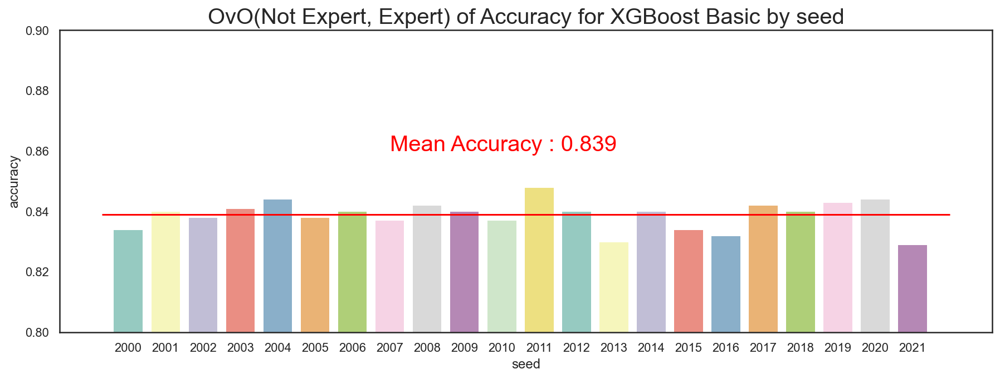

In [459]:
with sns.axes_style('white'):
    plt.figure(figsize=(15,5))
    plt.ylim(0.8, 0.9)
    sns.barplot(x = "seed", y = "accuracy", data = acc_df, palette='Set3')
    plt.title("OvO(Not Expert, Expert) of Accuracy for XGBoost Basic by seed", fontsize = 20)
    plt.hlines(round(np.mean(acc_df.accuracy), 3), -0.7, 22, color='red')
    plt.text(7, 0.86,'Mean Accuracy : 0.839', fontdict = {'fontsize' : 20}, color = 'red')

In [430]:
seeds[acc_ls.index(min(acc_ls))]

2021

In [431]:
themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 190, max_depth = 8, min_child_weight = 2, gamma = 0.0, subsample = 0.72, colsample_bytree = 0.8, alpha = 0.0, use_label_encoder=False, seed = seeds[acc_ls.index(min(acc_ls))])

fit_params={"early_stopping_rounds": 60, 
        "eval_metric" : "aucpr", 
        "eval_set" : [[Prev_X_val, Prev_y_val]]}

themodel.fit(Prev_X_train, Prev_y_train, **fit_params)

y_predict=themodel.predict(Prev_X_test)

y_predict_prob = themodel.predict_proba(Prev_X_test)

[0]	validation_0-aucpr:0.92833
[1]	validation_0-aucpr:0.94299
[2]	validation_0-aucpr:0.95105
[3]	validation_0-aucpr:0.95171
[4]	validation_0-aucpr:0.95107
[5]	validation_0-aucpr:0.95664
[6]	validation_0-aucpr:0.95702
[7]	validation_0-aucpr:0.95843
[8]	validation_0-aucpr:0.95809
[9]	validation_0-aucpr:0.95839
[10]	validation_0-aucpr:0.95818
[11]	validation_0-aucpr:0.95742
[12]	validation_0-aucpr:0.95830
[13]	validation_0-aucpr:0.95839
[14]	validation_0-aucpr:0.95804
[15]	validation_0-aucpr:0.95775
[16]	validation_0-aucpr:0.95861
[17]	validation_0-aucpr:0.95825
[18]	validation_0-aucpr:0.96004
[19]	validation_0-aucpr:0.96102
[20]	validation_0-aucpr:0.96163
[21]	validation_0-aucpr:0.96215
[22]	validation_0-aucpr:0.96205
[23]	validation_0-aucpr:0.96240
[24]	validation_0-aucpr:0.96355
[25]	validation_0-aucpr:0.96350
[26]	validation_0-aucpr:0.96407
[27]	validation_0-aucpr:0.96464
[28]	validation_0-aucpr:0.96549
[29]	validation_0-aucpr:0.96554
[30]	validation_0-aucpr:0.96614
[31]	validation_0-


정확도: 0.8287
정밀도: 0.6000
재현율: 0.5932
F1: 0.5966
ROC AUC: 0.7429
Average Precision: 0.4428


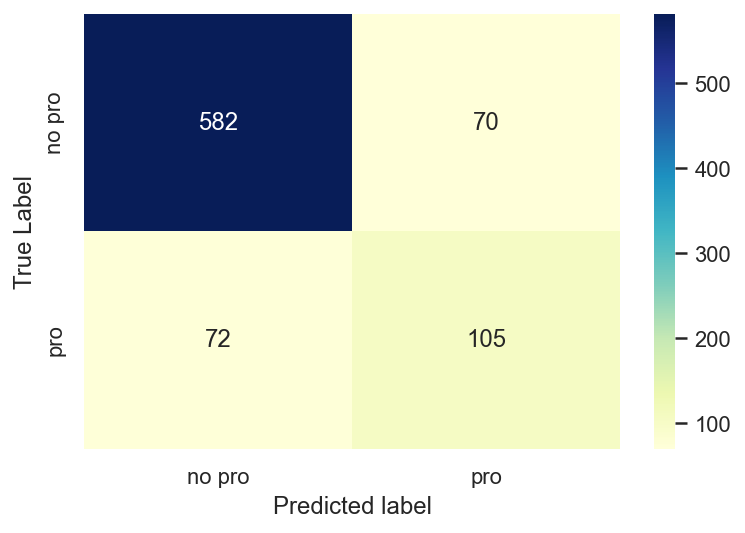

In [432]:
LABELS = ['no pro', 'pro']
sns.heatmap(confusion_matrix(Prev_y_test,y_predict), xticklabels=LABELS, yticklabels=LABELS, annot=True,fmt='d',cmap='YlGnBu')
plt.xlabel('Predicted label')
plt.ylabel('True Label')

get_clf_eval(Prev_y_test, y_predict)

### Modeling : Tuning Guide - Maximize AUC

In [436]:
# roc_curve(타겟값, prob of 1)
fpr, tpr, thresholds = roc_curve(Prev_y_test, y_predict_prob[:, 1])
roc = pd.DataFrame({
    'FPR(Fall-out)': fpr, 
    'TPRate(Recall)': tpr, 
    'Threshold': thresholds
})

In [437]:
# threshold 최대값의 인덱스, np.argmax()
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print('idx:', optimal_idx, ', threshold:', optimal_threshold)

idx: 142 , threshold: 0.103452906


In [438]:
# FPR, TPR, thresholds에 대한 데이터 프레임을 만들어 보자
ROC_dict = {'FPR': fpr, 'TPR':tpr, 'thresholds':thresholds}

In [439]:
ROC_df = pd.DataFrame.from_dict(ROC_dict)

In [440]:
ROC_df[ROC_df['thresholds'] == optimal_threshold]

,FPR,TPR,thresholds
142,0.240798,0.887006,0.103453


In [441]:
roc_auc = auc(fpr, tpr)

In [442]:
import matplotlib.pyplot as plt

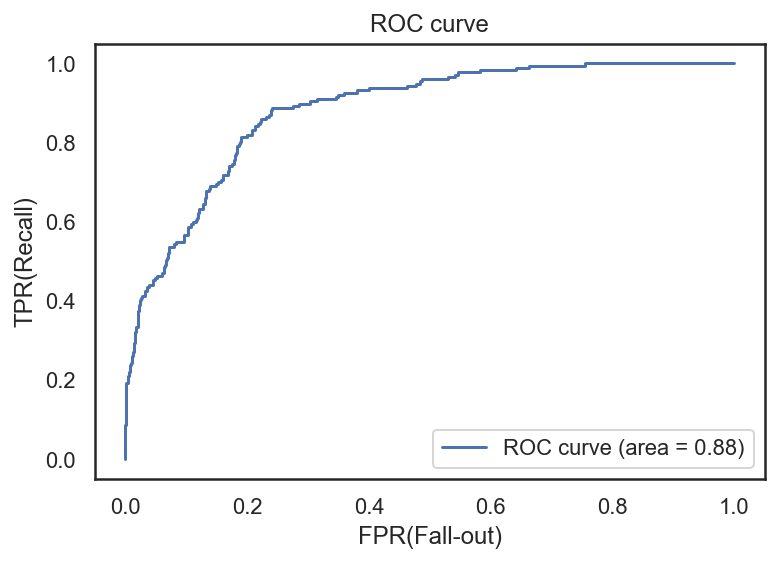

In [443]:
with sns.axes_style('white'):
    plt.plot(fpr, tpr, label="ROC curve (area = %0.2f)" % roc_auc)
    plt.title('ROC curve')
    plt.xlabel('FPR(Fall-out)')
    plt.ylabel('TPR(Recall)')
    plt.legend()

In [444]:
# Sec_y_test, predict, thresholds에 대한 데이터 프레임을 만들어 보자
# threshold를 조정하기 위함임

In [445]:
from sklearn.metrics import average_precision_score

In [446]:
y_pred_optimal = y_predict_prob[:, 1] >= optimal_threshold


정확도: 0.7865
정밀도: 0.5000
재현율: 0.8870
F1: 0.6395
ROC AUC: 0.8231
Average Precision: 0.4676


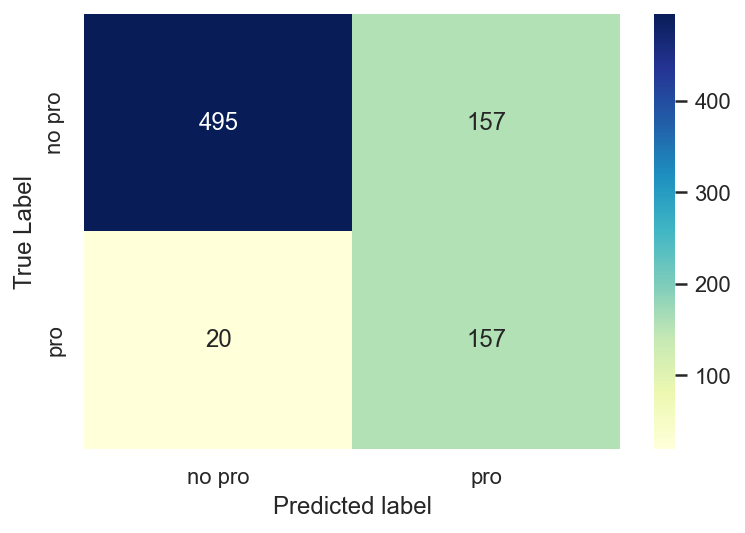

In [447]:
LABELS = ['no pro', 'pro']
sns.heatmap(confusion_matrix(Prev_y_test, y_pred_optimal), xticklabels=LABELS, yticklabels=LABELS, annot=True,fmt='d',cmap='YlGnBu')
plt.xlabel('Predicted label')
plt.ylabel('True Label')
get_clf_eval(Prev_y_test, y_pred_optimal)

### Modeling : Tuning Guide - Maximize Precision-Reall

In [448]:
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

from numpy import argmax

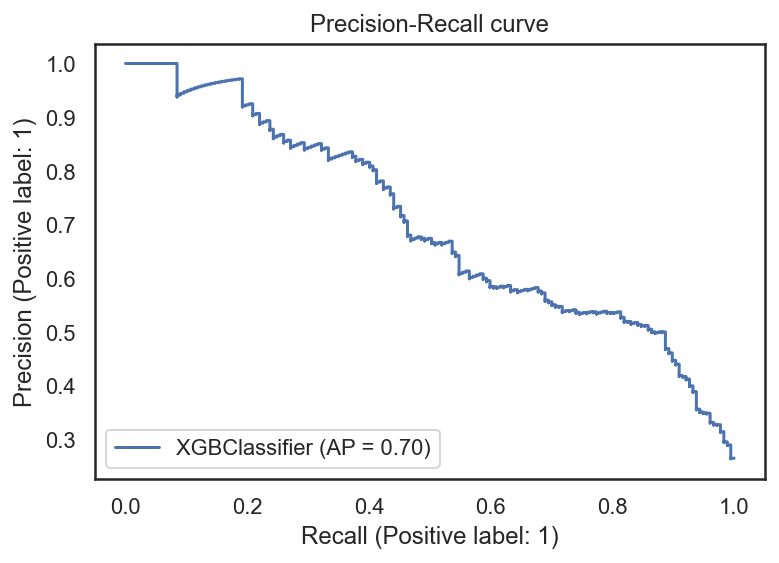

In [449]:
# 참고 : https://www.kaggle.com/code/nicholasgah/optimal-probability-thresholds-using-pr-curve/notebook

with sns.axes_style('white'):
    
    precision, recall, thresholds = precision_recall_curve(Prev_y_test, y_predict_prob[:, 1])

    disp = plot_precision_recall_curve(themodel, Prev_X_test, Prev_y_test)

    disp.ax_.set_title('Precision-Recall curve')

In [450]:
# optimal_proba_cutoff = sorted(list(zip(np.abs(precision - recall), thresholds)), key=lambda i: i[0], reverse=False)[0][1]
# roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in y_predict_prob[:, 1]]

In [451]:
# 참고 : https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/

In [452]:
fscore = (2 * precision * recall) / (precision + recall)

In [453]:
# locate the index of the largest f score
ix = argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

Best Threshold=0.200033, F-Score=0.647


In [454]:
optimal_proba_cutoff = thresholds[ix]

In [455]:
roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in y_predict_prob[:, 1]]

In [456]:
optimal_proba_cutoff

0.20003332


정확도: 0.8106
정밀도: 0.5373
재현율: 0.8136
F1: 0.6472
ROC AUC: 0.8117
Average Precision: 0.4769


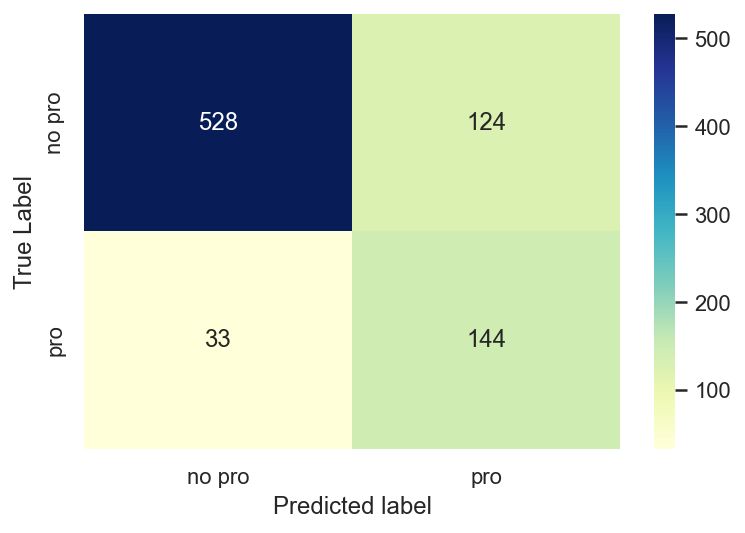

In [457]:
LABELS = ['no pro', 'pro']
sns.heatmap(confusion_matrix(Prev_y_test, roc_predictions), xticklabels=LABELS, yticklabels=LABELS, annot=True,fmt='d',cmap='YlGnBu')
plt.xlabel('Predicted label')
plt.ylabel('True Label')


get_clf_eval(Prev_y_test, roc_predictions)

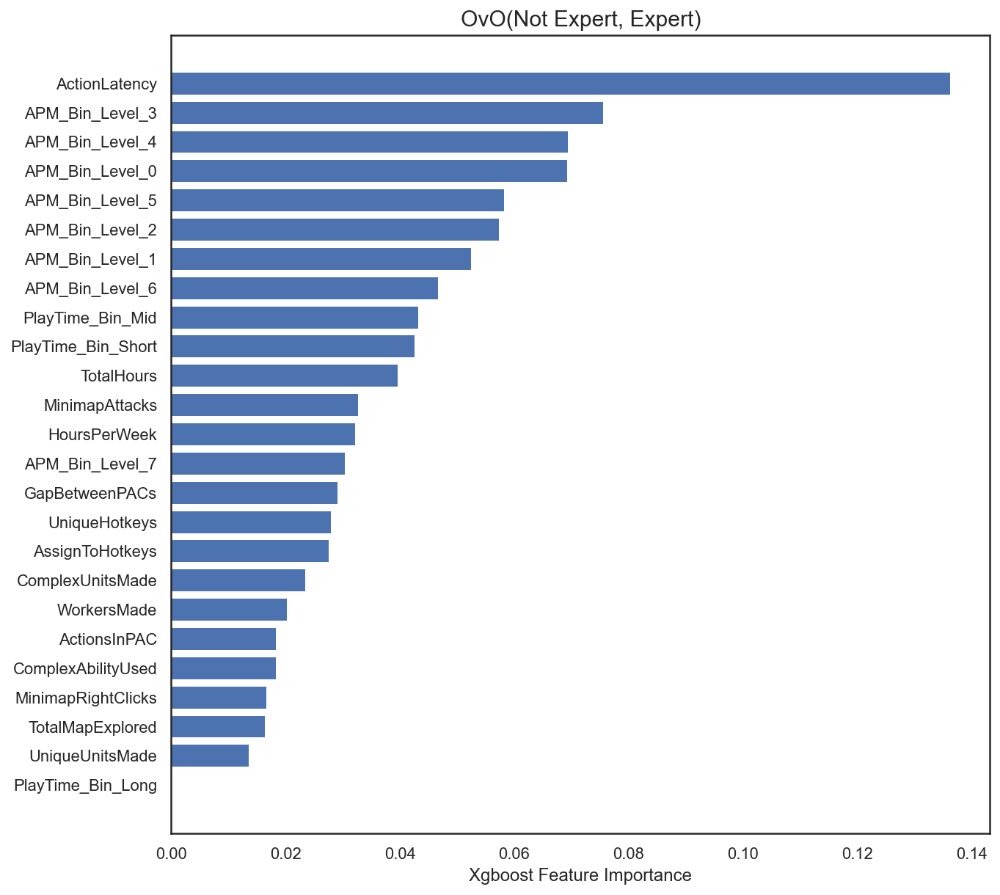

In [460]:
with sns.axes_style('white'):
    plt.figure(figsize=(10,10))
    sorted_idx = themodel.feature_importances_.argsort()
    plt.barh(list(Prev_X_train.columns[sorted_idx]), themodel.feature_importances_[sorted_idx])
    plt.title("OvO(Not Expert, Expert)", fontdict = {'fontsize' : 15})
    plt.xlabel("Xgboost Feature Importance")

# OvR (One verse Rest)

## XGBoost : Novice vs Intermediates vs Master - SMOTE

In [461]:
SkillCraft_df.head()

,HoursPerWeek,TotalHours,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,...,APM_Bin_Level_1,APM_Bin_Level_2,APM_Bin_Level_3,APM_Bin_Level_4,APM_Bin_Level_5,APM_Bin_Level_6,APM_Bin_Level_7,PlayTime_Bin_Long,PlayTime_Bin_Mid,PlayTime_Bin_Short
0,10.0,3000.0,1.166591,0.291519,0.583298,2.083203,32.6677,40.8673,4.7508,1.166591,...,0,0,0,0,1,0,0,0,1,0
1,10.0,5000.0,1.377743,0.367452,1.561443,2.296235,32.9194,42.3454,4.8434,2.020689,...,0,0,0,1,0,0,0,0,0,1
2,10.0,200.0,1.781877,0.222489,1.559143,2.450082,44.6475,75.3548,4.0430,1.225044,...,1,0,0,0,0,0,0,0,0,1
3,20.0,400.0,1.131566,0.056817,0.283023,2.885502,29.2203,53.7352,4.9155,1.074988,...,0,0,1,0,0,0,0,0,0,1
4,10.0,500.0,1.738101,0.204435,0.000000,7.054643,22.6885,62.0813,9.3740,1.533618,...,0,0,0,1,0,0,0,0,0,1


In [462]:
# LeagueLevel에 대해 먼저 나누어 준다.
Skill_target = SkillCraft_df.LeagueLevel

In [463]:
# LeagueLevel제거
SkillCraft_df.drop(['LeagueLevel'], axis=1, inplace=True)

In [464]:
# o과 1의 비율은?
# 0의 비율
# 1의 비율
sum(Skill_target == 0) / len(Skill_target), sum(Skill_target == 1) / len(Skill_target), sum(Skill_target == 2) / len(Skill_target)

(0.310313630880579, 0.4767792521109771, 0.21290711700844392)

In [465]:
# 각 클래스별 개수
sum(Skill_target == 0), sum(Skill_target == 1), sum(Skill_target == 2)

(1029, 1581, 706)

In [466]:
# 2 클래스의 개수가 작으므로 오버샘플링을 실시

In [467]:
# train/test 80 : 20
Skill_X_train, Skill_X_test, Skill_y_train, Skill_y_test = train_test_split(SkillCraft_df, Skill_target, test_size = 0.2, shuffle=True, stratify=Skill_target, random_state=2022)

In [468]:
sum(Skill_y_train == 0) / len(Skill_y_train), sum(Skill_y_train == 1) / len(Skill_y_train), sum(Skill_y_train == 2) / len(Skill_y_train)

(0.3103318250377074, 0.4766214177978884, 0.21304675716440422)

### Over sampling

In [469]:
# SMOTE 객체 생성
smote = SMOTE(random_state=2022)

In [470]:
Skill_X_train_resampled, Skill_y_train_resampled = smote.fit_resample(Skill_X_train, Skill_y_train)

In [471]:
sum(Skill_y_train_resampled == 0) / len(Skill_y_train_resampled), sum(Skill_y_train_resampled == 1) / len(Skill_y_train_resampled), sum(Skill_y_train_resampled == 2) / len(Skill_y_train_resampled)

(0.3333333333333333, 0.3333333333333333, 0.3333333333333333)

In [472]:
# train/val 60 : 20 (80을 3:1로 등분한다면?, 0.25 비율 (1/4))
Skill_X_train, Skill_X_val, Skill_y_train, Skill_y_val = train_test_split(Skill_X_train_resampled, Skill_y_train_resampled,
                                                                   test_size = 0.2, shuffle=True,
                                                                   stratify=Skill_y_train_resampled, random_state=2022)

In [473]:
# 데이터 개수
len(Skill_X_train), len(Skill_X_val), len(Skill_X_test)

(3033, 759, 664)

### Modeling : Tuning Guide - GridSearch & Early Stopting

In [474]:
learning_rate = [i/10.0 for i in range(1,5)]
n_estimators = [i for i in range(100, 300, 10)]
max_depth = 4
min_child_weight = 1
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [475]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'objective=multi:softmax')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : n_estimators,
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Skill_X_train, Skill_y_train)))

results=grid_search.fit(Skill_X_train, Skill_y_train, **fit_params)

results.best_params_

[0]	validation_0-mlogloss:1.05555
[0]	validation_0-mlogloss:1.05988
[0]	validation_0-mlogloss:1.05247
[0]	validation_0-mlogloss:1.05247
[0]	validation_0-mlogloss:1.05315
[0]	validation_0-mlogloss:1.05974
[0]	validation_0-mlogloss:1.05555
[0]	validation_0-mlogloss:1.05315
[1]	validation_0-mlogloss:1.01454
[1]	validation_0-mlogloss:1.01374
[1]	validation_0-mlogloss:1.01734
[1]	validation_0-mlogloss:1.01454
[1]	validation_0-mlogloss:1.01445
[1]	validation_0-mlogloss:1.01374
[1]	validation_0-mlogloss:1.01744
[1]	validation_0-mlogloss:1.01445
[2]	validation_0-mlogloss:0.97601
[2]	validation_0-mlogloss:0.97650
[2]	validation_0-mlogloss:0.97566
[2]	validation_0-mlogloss:0.97601
[2]	validation_0-mlogloss:0.98069
[2]	validation_0-mlogloss:0.98050
[2]	validation_0-mlogloss:0.97650
[2]	validation_0-mlogloss:0.97566
[3]	validation_0-mlogloss:0.94486
[3]	validation_0-mlogloss:0.94390
[3]	validation_0-mlogloss:0.94186
[3]	validation_0-mlogloss:0.94186
[3]	validation_0-mlogloss:0.94390
[3]	validation

[32]	validation_0-mlogloss:0.62876
[32]	validation_0-mlogloss:0.63645
[32]	validation_0-mlogloss:0.63645
[33]	validation_0-mlogloss:0.62988
[33]	validation_0-mlogloss:0.62283
[33]	validation_0-mlogloss:0.62988
[33]	validation_0-mlogloss:0.62323
[33]	validation_0-mlogloss:0.62376
[33]	validation_0-mlogloss:0.62376
[33]	validation_0-mlogloss:0.63120
[33]	validation_0-mlogloss:0.63120
[34]	validation_0-mlogloss:0.62819
[34]	validation_0-mlogloss:0.62019
[34]	validation_0-mlogloss:0.62819
[34]	validation_0-mlogloss:0.62057
[34]	validation_0-mlogloss:0.62130
[34]	validation_0-mlogloss:0.62130
[34]	validation_0-mlogloss:0.62896
[34]	validation_0-mlogloss:0.62896
[35]	validation_0-mlogloss:0.62570
[35]	validation_0-mlogloss:0.61769
[35]	validation_0-mlogloss:0.62570
[35]	validation_0-mlogloss:0.61835
[35]	validation_0-mlogloss:0.61835
[35]	validation_0-mlogloss:0.61688
[35]	validation_0-mlogloss:0.62584
[35]	validation_0-mlogloss:0.62584
[36]	validation_0-mlogloss:0.61569
[36]	validation_0-ml

[64]	validation_0-mlogloss:0.56887
[65]	validation_0-mlogloss:0.57816
[64]	validation_0-mlogloss:0.56654
[65]	validation_0-mlogloss:0.56513
[65]	validation_0-mlogloss:0.57816
[65]	validation_0-mlogloss:0.56604
[65]	validation_0-mlogloss:0.56294
[66]	validation_0-mlogloss:0.56646
[65]	validation_0-mlogloss:0.56767
[65]	validation_0-mlogloss:0.56604
[66]	validation_0-mlogloss:0.57717
[66]	validation_0-mlogloss:0.56363
[66]	validation_0-mlogloss:0.56506
[66]	validation_0-mlogloss:0.57717
[66]	validation_0-mlogloss:0.56255
[67]	validation_0-mlogloss:0.56595
[66]	validation_0-mlogloss:0.56646
[66]	validation_0-mlogloss:0.56506
[67]	validation_0-mlogloss:0.57703
[67]	validation_0-mlogloss:0.56209
[67]	validation_0-mlogloss:0.57703
[67]	validation_0-mlogloss:0.56476
[67]	validation_0-mlogloss:0.56122
[68]	validation_0-mlogloss:0.56540
[67]	validation_0-mlogloss:0.56595
[67]	validation_0-mlogloss:0.56476
[68]	validation_0-mlogloss:0.57556
[68]	validation_0-mlogloss:0.57556
[68]	validation_0-ml

[97]	validation_0-mlogloss:0.55202
[98]	validation_0-mlogloss:0.56316
[98]	validation_0-mlogloss:0.55213
[99]	validation_0-mlogloss:0.55315
[98]	validation_0-mlogloss:0.55341
[98]	validation_0-mlogloss:0.54645
[98]	validation_0-mlogloss:0.56316
[98]	validation_0-mlogloss:0.54817
[98]	validation_0-mlogloss:0.55213
[99]	validation_0-mlogloss:0.56259
[99]	validation_0-mlogloss:0.55315
[99]	validation_0-mlogloss:0.55152
[99]	validation_0-mlogloss:0.54586
[99]	validation_0-mlogloss:0.56259
[99]	validation_0-mlogloss:0.54729
[99]	validation_0-mlogloss:0.55152
[100]	validation_0-mlogloss:0.55285
[100]	validation_0-mlogloss:0.55110
[100]	validation_0-mlogloss:0.56243
[0]	validation_0-mlogloss:1.05974
[101]	validation_0-mlogloss:0.55275
[101]	validation_0-mlogloss:0.55092
[0]	validation_0-mlogloss:1.05988
[101]	validation_0-mlogloss:0.56188
[0]	validation_0-mlogloss:1.05315
[1]	validation_0-mlogloss:1.01734
[0]	validation_0-mlogloss:1.05247
[0]	validation_0-mlogloss:1.05555
[102]	validation_0-m

[27]	validation_0-mlogloss:0.65425
[27]	validation_0-mlogloss:0.64845
[28]	validation_0-mlogloss:0.64987
[18]	validation_0-mlogloss:0.71050
[29]	validation_0-mlogloss:0.63951
[28]	validation_0-mlogloss:0.64095
[18]	validation_0-mlogloss:0.70411
[18]	validation_0-mlogloss:0.70635
[28]	validation_0-mlogloss:0.64982
[28]	validation_0-mlogloss:0.64352
[29]	validation_0-mlogloss:0.64652
[30]	validation_0-mlogloss:0.63555
[19]	validation_0-mlogloss:0.69979
[29]	validation_0-mlogloss:0.63743
[19]	validation_0-mlogloss:0.69662
[19]	validation_0-mlogloss:0.69909
[29]	validation_0-mlogloss:0.64608
[29]	validation_0-mlogloss:0.64011
[31]	validation_0-mlogloss:0.63016
[30]	validation_0-mlogloss:0.63361
[30]	validation_0-mlogloss:0.64302
[20]	validation_0-mlogloss:0.69071
[20]	validation_0-mlogloss:0.68749
[20]	validation_0-mlogloss:0.69075
[30]	validation_0-mlogloss:0.64181
[31]	validation_0-mlogloss:0.64095
[32]	validation_0-mlogloss:0.62798
[31]	validation_0-mlogloss:0.62893
[30]	validation_0-ml

[60]	validation_0-mlogloss:0.56730
[49]	validation_0-mlogloss:0.58617
[60]	validation_0-mlogloss:0.57374
[49]	validation_0-mlogloss:0.58958
[59]	validation_0-mlogloss:0.57441
[61]	validation_0-mlogloss:0.56806
[60]	validation_0-mlogloss:0.58185
[61]	validation_0-mlogloss:0.56621
[50]	validation_0-mlogloss:0.58131
[50]	validation_0-mlogloss:0.58481
[50]	validation_0-mlogloss:0.58825
[61]	validation_0-mlogloss:0.57235
[60]	validation_0-mlogloss:0.57389
[62]	validation_0-mlogloss:0.56744
[61]	validation_0-mlogloss:0.58086
[62]	validation_0-mlogloss:0.56542
[51]	validation_0-mlogloss:0.57962
[51]	validation_0-mlogloss:0.58230
[51]	validation_0-mlogloss:0.58736
[62]	validation_0-mlogloss:0.57076
[61]	validation_0-mlogloss:0.57240
[62]	validation_0-mlogloss:0.58022
[63]	validation_0-mlogloss:0.56676
[63]	validation_0-mlogloss:0.56431
[52]	validation_0-mlogloss:0.57749
[52]	validation_0-mlogloss:0.58064
[63]	validation_0-mlogloss:0.56938
[52]	validation_0-mlogloss:0.58623
[62]	validation_0-ml

[93]	validation_0-mlogloss:0.55448
[93]	validation_0-mlogloss:0.56469
[82]	validation_0-mlogloss:0.55003
[93]	validation_0-mlogloss:0.54995
[83]	validation_0-mlogloss:0.55808
[94]	validation_0-mlogloss:0.54798
[92]	validation_0-mlogloss:0.55276
[82]	validation_0-mlogloss:0.55285
[94]	validation_0-mlogloss:0.56398
[94]	validation_0-mlogloss:0.55443
[83]	validation_0-mlogloss:0.55004
[94]	validation_0-mlogloss:0.55002
[84]	validation_0-mlogloss:0.55807
[95]	validation_0-mlogloss:0.54782
[93]	validation_0-mlogloss:0.55289
[83]	validation_0-mlogloss:0.55302
[95]	validation_0-mlogloss:0.56353
[95]	validation_0-mlogloss:0.55342
[84]	validation_0-mlogloss:0.54934
[85]	validation_0-mlogloss:0.55865
[96]	validation_0-mlogloss:0.54771
[95]	validation_0-mlogloss:0.54984
[94]	validation_0-mlogloss:0.55264
[84]	validation_0-mlogloss:0.55245
[96]	validation_0-mlogloss:0.56370
[96]	validation_0-mlogloss:0.55317
[85]	validation_0-mlogloss:0.54919
[86]	validation_0-mlogloss:0.55805
[96]	validation_0-ml

[113]	validation_0-mlogloss:0.53665
[114]	validation_0-mlogloss:0.54718
[13]	validation_0-mlogloss:0.75317
[3]	validation_0-mlogloss:0.94875
[13]	validation_0-mlogloss:0.75840
[2]	validation_0-mlogloss:0.97650
[4]	validation_0-mlogloss:0.92194
[113]	validation_0-mlogloss:0.54219
[114]	validation_0-mlogloss:0.53603
[115]	validation_0-mlogloss:0.54704
[14]	validation_0-mlogloss:0.74211
[4]	validation_0-mlogloss:0.91853
[14]	validation_0-mlogloss:0.74676
[3]	validation_0-mlogloss:0.94486
[114]	validation_0-mlogloss:0.54180
[5]	validation_0-mlogloss:0.89572
[115]	validation_0-mlogloss:0.53639
[116]	validation_0-mlogloss:0.54726
[15]	validation_0-mlogloss:0.73118
[5]	validation_0-mlogloss:0.89144
[15]	validation_0-mlogloss:0.73566
[115]	validation_0-mlogloss:0.54136
[4]	validation_0-mlogloss:0.92034
[6]	validation_0-mlogloss:0.87134
[116]	validation_0-mlogloss:0.53619
[117]	validation_0-mlogloss:0.54646
[16]	validation_0-mlogloss:0.72143
[16]	validation_0-mlogloss:0.72625
[6]	validation_0-m

[23]	validation_0-mlogloss:0.67022
[44]	validation_0-mlogloss:0.60159
[23]	validation_0-mlogloss:0.67764
[33]	validation_0-mlogloss:0.63120
[44]	validation_0-mlogloss:0.59571
[35]	validation_0-mlogloss:0.61769
[15]	validation_0-mlogloss:0.73776
[35]	validation_0-mlogloss:0.61688
[24]	validation_0-mlogloss:0.66432
[45]	validation_0-mlogloss:0.59858
[34]	validation_0-mlogloss:0.62896
[24]	validation_0-mlogloss:0.67193
[36]	validation_0-mlogloss:0.61569
[45]	validation_0-mlogloss:0.59209
[16]	validation_0-mlogloss:0.72731
[36]	validation_0-mlogloss:0.61445
[25]	validation_0-mlogloss:0.66022
[46]	validation_0-mlogloss:0.59780
[37]	validation_0-mlogloss:0.61381
[35]	validation_0-mlogloss:0.62584
[25]	validation_0-mlogloss:0.66832
[46]	validation_0-mlogloss:0.59092
[17]	validation_0-mlogloss:0.71778
[37]	validation_0-mlogloss:0.61093
[26]	validation_0-mlogloss:0.65437
[47]	validation_0-mlogloss:0.59727
[38]	validation_0-mlogloss:0.61079
[36]	validation_0-mlogloss:0.62180
[26]	validation_0-ml

[55]	validation_0-mlogloss:0.58500
[66]	validation_0-mlogloss:0.56646
[68]	validation_0-mlogloss:0.56007
[77]	validation_0-mlogloss:0.55896
[47]	validation_0-mlogloss:0.58665
[68]	validation_0-mlogloss:0.56173
[77]	validation_0-mlogloss:0.57045
[57]	validation_0-mlogloss:0.57682
[67]	validation_0-mlogloss:0.56595
[56]	validation_0-mlogloss:0.58507
[69]	validation_0-mlogloss:0.55906
[78]	validation_0-mlogloss:0.55834
[48]	validation_0-mlogloss:0.58614
[69]	validation_0-mlogloss:0.56021
[78]	validation_0-mlogloss:0.57011
[68]	validation_0-mlogloss:0.56540
[58]	validation_0-mlogloss:0.57632
[57]	validation_0-mlogloss:0.58349
[70]	validation_0-mlogloss:0.55876
[79]	validation_0-mlogloss:0.55837
[70]	validation_0-mlogloss:0.55989
[49]	validation_0-mlogloss:0.58316
[79]	validation_0-mlogloss:0.56955
[69]	validation_0-mlogloss:0.56417
[59]	validation_0-mlogloss:0.57441
[58]	validation_0-mlogloss:0.58295
[71]	validation_0-mlogloss:0.55793
[80]	validation_0-mlogloss:0.55814
[71]	validation_0-ml

[108]	validation_0-mlogloss:0.54900
[99]	validation_0-mlogloss:0.54729
[108]	validation_0-mlogloss:0.55972
[98]	validation_0-mlogloss:0.55341
[100]	validation_0-mlogloss:0.54460
[78]	validation_0-mlogloss:0.55199
[88]	validation_0-mlogloss:0.55568
[87]	validation_0-mlogloss:0.56631
[109]	validation_0-mlogloss:0.54813
[100]	validation_0-mlogloss:0.54734
[99]	validation_0-mlogloss:0.55315
[109]	validation_0-mlogloss:0.55951
[101]	validation_0-mlogloss:0.54420
[79]	validation_0-mlogloss:0.55095
[88]	validation_0-mlogloss:0.56618
[89]	validation_0-mlogloss:0.55424
[110]	validation_0-mlogloss:0.54825
[101]	validation_0-mlogloss:0.54636
[110]	validation_0-mlogloss:0.55889
[102]	validation_0-mlogloss:0.54413
[100]	validation_0-mlogloss:0.55285
[80]	validation_0-mlogloss:0.55060
[90]	validation_0-mlogloss:0.55349
[89]	validation_0-mlogloss:0.56573
[111]	validation_0-mlogloss:0.54802
[102]	validation_0-mlogloss:0.54668
[111]	validation_0-mlogloss:0.55914
[101]	validation_0-mlogloss:0.55275
[81]

[108]	validation_0-mlogloss:0.54088
[7]	validation_0-mlogloss:0.84805
[129]	validation_0-mlogloss:0.53973
[128]	validation_0-mlogloss:0.54462
[7]	validation_0-mlogloss:0.84924
[118]	validation_0-mlogloss:0.54648
[117]	validation_0-mlogloss:0.55867
[109]	validation_0-mlogloss:0.53987
[0]	validation_0-mlogloss:1.05247
[8]	validation_0-mlogloss:0.82661
[129]	validation_0-mlogloss:0.54416
[8]	validation_0-mlogloss:0.83419
[119]	validation_0-mlogloss:0.54549
[118]	validation_0-mlogloss:0.55878
[110]	validation_0-mlogloss:0.53970
[0]	validation_0-mlogloss:1.05555
[1]	validation_0-mlogloss:1.01374
[130]	validation_0-mlogloss:0.54453
[9]	validation_0-mlogloss:0.81245
[9]	validation_0-mlogloss:0.81749
[120]	validation_0-mlogloss:0.54581
[119]	validation_0-mlogloss:0.55923
[111]	validation_0-mlogloss:0.53862
[1]	validation_0-mlogloss:1.01454
[2]	validation_0-mlogloss:0.97566
[10]	validation_0-mlogloss:0.79485
[131]	validation_0-mlogloss:0.54480
[10]	validation_0-mlogloss:0.80217
[121]	validation

[9]	validation_0-mlogloss:0.81245
[30]	validation_0-mlogloss:0.63529
[39]	validation_0-mlogloss:0.60638
[0]	validation_0-mlogloss:1.05247
[8]	validation_0-mlogloss:0.83419
[30]	validation_0-mlogloss:0.64181
[19]	validation_0-mlogloss:0.69979
[39]	validation_0-mlogloss:0.61360
[31]	validation_0-mlogloss:0.63260
[1]	validation_0-mlogloss:1.01374
[10]	validation_0-mlogloss:0.79485
[40]	validation_0-mlogloss:0.60412
[9]	validation_0-mlogloss:0.81749
[20]	validation_0-mlogloss:0.69071
[31]	validation_0-mlogloss:0.63872
[40]	validation_0-mlogloss:0.61132
[11]	validation_0-mlogloss:0.78209
[32]	validation_0-mlogloss:0.62876
[2]	validation_0-mlogloss:0.97566
[41]	validation_0-mlogloss:0.60164
[21]	validation_0-mlogloss:0.68422
[10]	validation_0-mlogloss:0.80217
[32]	validation_0-mlogloss:0.63512
[41]	validation_0-mlogloss:0.60820
[33]	validation_0-mlogloss:0.62376
[12]	validation_0-mlogloss:0.76999
[3]	validation_0-mlogloss:0.94186
[42]	validation_0-mlogloss:0.59790
[22]	validation_0-mlogloss:

[61]	validation_0-mlogloss:0.58086
[71]	validation_0-mlogloss:0.55890
[62]	validation_0-mlogloss:0.57029
[50]	validation_0-mlogloss:0.58131
[31]	validation_0-mlogloss:0.63260
[39]	validation_0-mlogloss:0.61360
[41]	validation_0-mlogloss:0.60164
[71]	validation_0-mlogloss:0.56125
[62]	validation_0-mlogloss:0.58022
[72]	validation_0-mlogloss:0.55771
[63]	validation_0-mlogloss:0.56805
[51]	validation_0-mlogloss:0.57962
[32]	validation_0-mlogloss:0.62876
[40]	validation_0-mlogloss:0.61132
[72]	validation_0-mlogloss:0.56066
[42]	validation_0-mlogloss:0.59790
[63]	validation_0-mlogloss:0.57935
[73]	validation_0-mlogloss:0.55810
[64]	validation_0-mlogloss:0.56654
[52]	validation_0-mlogloss:0.57749
[33]	validation_0-mlogloss:0.62376
[73]	validation_0-mlogloss:0.56127
[41]	validation_0-mlogloss:0.60820
[43]	validation_0-mlogloss:0.59620
[64]	validation_0-mlogloss:0.57924
[74]	validation_0-mlogloss:0.55762
[53]	validation_0-mlogloss:0.57665
[65]	validation_0-mlogloss:0.56604
[34]	validation_0-ml

[101]	validation_0-mlogloss:0.55275
[92]	validation_0-mlogloss:0.56538
[81]	validation_0-mlogloss:0.55050
[71]	validation_0-mlogloss:0.55890
[102]	validation_0-mlogloss:0.54668
[61]	validation_0-mlogloss:0.57240
[93]	validation_0-mlogloss:0.55289
[70]	validation_0-mlogloss:0.56336
[102]	validation_0-mlogloss:0.55160
[93]	validation_0-mlogloss:0.56469
[82]	validation_0-mlogloss:0.55003
[103]	validation_0-mlogloss:0.54656
[72]	validation_0-mlogloss:0.55771
[62]	validation_0-mlogloss:0.57029
[94]	validation_0-mlogloss:0.55264
[71]	validation_0-mlogloss:0.56125
[103]	validation_0-mlogloss:0.55095
[94]	validation_0-mlogloss:0.56398
[104]	validation_0-mlogloss:0.54653
[83]	validation_0-mlogloss:0.55004
[73]	validation_0-mlogloss:0.55810
[63]	validation_0-mlogloss:0.56805
[95]	validation_0-mlogloss:0.55211
[72]	validation_0-mlogloss:0.56066
[104]	validation_0-mlogloss:0.55036
[95]	validation_0-mlogloss:0.56353
[105]	validation_0-mlogloss:0.54629
[84]	validation_0-mlogloss:0.54934
[74]	validat

[124]	validation_0-mlogloss:0.54605
[124]	validation_0-mlogloss:0.55663
[133]	validation_0-mlogloss:0.54329
[101]	validation_0-mlogloss:0.55275
[92]	validation_0-mlogloss:0.55276
[102]	validation_0-mlogloss:0.54668
[134]	validation_0-mlogloss:0.54026
[113]	validation_0-mlogloss:0.53665
[125]	validation_0-mlogloss:0.54641
[125]	validation_0-mlogloss:0.55680
[134]	validation_0-mlogloss:0.54324
[102]	validation_0-mlogloss:0.55160
[103]	validation_0-mlogloss:0.54656
[93]	validation_0-mlogloss:0.55289
[135]	validation_0-mlogloss:0.53970
[114]	validation_0-mlogloss:0.53603
[135]	validation_0-mlogloss:0.54280
[126]	validation_0-mlogloss:0.54666
[126]	validation_0-mlogloss:0.55619
[103]	validation_0-mlogloss:0.55095
[104]	validation_0-mlogloss:0.54653
[94]	validation_0-mlogloss:0.55264
[136]	validation_0-mlogloss:0.53935
[115]	validation_0-mlogloss:0.53639
[127]	validation_0-mlogloss:0.54681
[136]	validation_0-mlogloss:0.54345
[104]	validation_0-mlogloss:0.55036
[127]	validation_0-mlogloss:0.5

[12]	validation_0-mlogloss:0.77319
[4]	validation_0-mlogloss:0.92034
[144]	validation_0-mlogloss:0.53415
[133]	validation_0-mlogloss:0.54108
[132]	validation_0-mlogloss:0.54354
[123]	validation_0-mlogloss:0.54540
[5]	validation_0-mlogloss:0.89144
[13]	validation_0-mlogloss:0.76150
[24]	validation_0-mlogloss:0.67193
[5]	validation_0-mlogloss:0.89019
[145]	validation_0-mlogloss:0.53407
[134]	validation_0-mlogloss:0.54026
[133]	validation_0-mlogloss:0.54329
[124]	validation_0-mlogloss:0.54605
[6]	validation_0-mlogloss:0.86833
[25]	validation_0-mlogloss:0.66832
[14]	validation_0-mlogloss:0.74769
[6]	validation_0-mlogloss:0.87269
[146]	validation_0-mlogloss:0.53362
[135]	validation_0-mlogloss:0.53970
[134]	validation_0-mlogloss:0.54324
[125]	validation_0-mlogloss:0.54641
[7]	validation_0-mlogloss:0.84805
[26]	validation_0-mlogloss:0.66111
[15]	validation_0-mlogloss:0.73776
[7]	validation_0-mlogloss:0.84924
[136]	validation_0-mlogloss:0.53935
[147]	validation_0-mlogloss:0.53345
[135]	validat

[35]	validation_0-mlogloss:0.61769
[23]	validation_0-mlogloss:0.67022
[154]	validation_0-mlogloss:0.54599
[13]	validation_0-mlogloss:0.75840
[2]	validation_0-mlogloss:0.98069
[54]	validation_0-mlogloss:0.58588
[43]	validation_0-mlogloss:0.59396
[35]	validation_0-mlogloss:0.62584
[36]	validation_0-mlogloss:0.61569
[24]	validation_0-mlogloss:0.66432
[155]	validation_0-mlogloss:0.54626
[14]	validation_0-mlogloss:0.74676
[55]	validation_0-mlogloss:0.58500
[3]	validation_0-mlogloss:0.95161
[44]	validation_0-mlogloss:0.59230
[36]	validation_0-mlogloss:0.62180
[37]	validation_0-mlogloss:0.61381
[25]	validation_0-mlogloss:0.66022
[156]	validation_0-mlogloss:0.54594
[15]	validation_0-mlogloss:0.73566
[56]	validation_0-mlogloss:0.58507
[4]	validation_0-mlogloss:0.92194
[45]	validation_0-mlogloss:0.59059
[37]	validation_0-mlogloss:0.61871
[38]	validation_0-mlogloss:0.61079
[26]	validation_0-mlogloss:0.65437
[157]	validation_0-mlogloss:0.54586
[16]	validation_0-mlogloss:0.72625
[57]	validation_0-m

[44]	validation_0-mlogloss:0.60159
[66]	validation_0-mlogloss:0.56646
[33]	validation_0-mlogloss:0.62323
[24]	validation_0-mlogloss:0.66003
[55]	validation_0-mlogloss:0.58035
[67]	validation_0-mlogloss:0.56209
[75]	validation_0-mlogloss:0.55472
[86]	validation_0-mlogloss:0.56571
[67]	validation_0-mlogloss:0.56595
[45]	validation_0-mlogloss:0.59858
[34]	validation_0-mlogloss:0.62057
[25]	validation_0-mlogloss:0.65501
[56]	validation_0-mlogloss:0.58052
[87]	validation_0-mlogloss:0.56631
[76]	validation_0-mlogloss:0.55371
[68]	validation_0-mlogloss:0.56173
[46]	validation_0-mlogloss:0.59780
[68]	validation_0-mlogloss:0.56540
[57]	validation_0-mlogloss:0.57682
[35]	validation_0-mlogloss:0.61688
[26]	validation_0-mlogloss:0.64965
[88]	validation_0-mlogloss:0.56618
[69]	validation_0-mlogloss:0.56417
[77]	validation_0-mlogloss:0.55321
[47]	validation_0-mlogloss:0.59727
[69]	validation_0-mlogloss:0.56021
[58]	validation_0-mlogloss:0.57632
[36]	validation_0-mlogloss:0.61445
[27]	validation_0-ml

[73]	validation_0-mlogloss:0.57109
[104]	validation_0-mlogloss:0.54327
[96]	validation_0-mlogloss:0.55317
[53]	validation_0-mlogloss:0.57882
[96]	validation_0-mlogloss:0.54816
[62]	validation_0-mlogloss:0.56542
[116]	validation_0-mlogloss:0.55951
[74]	validation_0-mlogloss:0.57069
[105]	validation_0-mlogloss:0.54186
[85]	validation_0-mlogloss:0.55727
[97]	validation_0-mlogloss:0.55334
[54]	validation_0-mlogloss:0.57713
[97]	validation_0-mlogloss:0.54802
[63]	validation_0-mlogloss:0.56431
[75]	validation_0-mlogloss:0.57010
[117]	validation_0-mlogloss:0.55867
[106]	validation_0-mlogloss:0.54086
[86]	validation_0-mlogloss:0.55661
[98]	validation_0-mlogloss:0.55341
[55]	validation_0-mlogloss:0.57690
[98]	validation_0-mlogloss:0.54817
[64]	validation_0-mlogloss:0.56367
[76]	validation_0-mlogloss:0.57059
[118]	validation_0-mlogloss:0.55878
[107]	validation_0-mlogloss:0.54071
[87]	validation_0-mlogloss:0.55601
[99]	validation_0-mlogloss:0.55315
[56]	validation_0-mlogloss:0.57584
[99]	validati

[116]	validation_0-mlogloss:0.54757
[136]	validation_0-mlogloss:0.53503
[128]	validation_0-mlogloss:0.54462
[128]	validation_0-mlogloss:0.53933
[94]	validation_0-mlogloss:0.54798
[85]	validation_0-mlogloss:0.55268
[148]	validation_0-mlogloss:0.55396
[106]	validation_0-mlogloss:0.56025
[117]	validation_0-mlogloss:0.54651
[137]	validation_0-mlogloss:0.53499
[129]	validation_0-mlogloss:0.54416
[129]	validation_0-mlogloss:0.53973
[95]	validation_0-mlogloss:0.54782
[86]	validation_0-mlogloss:0.55294
[107]	validation_0-mlogloss:0.55955
[149]	validation_0-mlogloss:0.55392
[118]	validation_0-mlogloss:0.54648
[138]	validation_0-mlogloss:0.53440
[130]	validation_0-mlogloss:0.54453
[96]	validation_0-mlogloss:0.54771
[130]	validation_0-mlogloss:0.54078
[87]	validation_0-mlogloss:0.55113
[150]	validation_0-mlogloss:0.55425
[108]	validation_0-mlogloss:0.55972
[139]	validation_0-mlogloss:0.53405
[119]	validation_0-mlogloss:0.54549
[131]	validation_0-mlogloss:0.54480
[97]	validation_0-mlogloss:0.54670

[135]	validation_0-mlogloss:0.55622
[146]	validation_0-mlogloss:0.54513
[16]	validation_0-mlogloss:0.72738
[115]	validation_0-mlogloss:0.54136
[158]	validation_0-mlogloss:0.53991
[124]	validation_0-mlogloss:0.53707
[158]	validation_0-mlogloss:0.53709
[5]	validation_0-mlogloss:0.88467
[136]	validation_0-mlogloss:0.55613
[147]	validation_0-mlogloss:0.54507
[17]	validation_0-mlogloss:0.71565
[159]	validation_0-mlogloss:0.53988
[125]	validation_0-mlogloss:0.53730
[116]	validation_0-mlogloss:0.54089
[159]	validation_0-mlogloss:0.53735
[6]	validation_0-mlogloss:0.86732
[137]	validation_0-mlogloss:0.55541
[148]	validation_0-mlogloss:0.54438
[18]	validation_0-mlogloss:0.70635
[160]	validation_0-mlogloss:0.53979
[126]	validation_0-mlogloss:0.53712
[117]	validation_0-mlogloss:0.54085
[7]	validation_0-mlogloss:0.84451
[138]	validation_0-mlogloss:0.55422
[149]	validation_0-mlogloss:0.54356
[161]	validation_0-mlogloss:0.53943
[19]	validation_0-mlogloss:0.69909
[127]	validation_0-mlogloss:0.53623
[1

[36]	validation_0-mlogloss:0.61606
[19]	validation_0-mlogloss:0.69979
[48]	validation_0-mlogloss:0.59134
[148]	validation_0-mlogloss:0.53882
[157]	validation_0-mlogloss:0.53172
[29]	validation_0-mlogloss:0.64608
[169]	validation_0-mlogloss:0.55256
[8]	validation_0-mlogloss:0.82661
[37]	validation_0-mlogloss:0.61237
[149]	validation_0-mlogloss:0.53890
[49]	validation_0-mlogloss:0.58958
[20]	validation_0-mlogloss:0.69071
[158]	validation_0-mlogloss:0.53106
[30]	validation_0-mlogloss:0.64181
[9]	validation_0-mlogloss:0.81245
[38]	validation_0-mlogloss:0.60915
[50]	validation_0-mlogloss:0.58825
[21]	validation_0-mlogloss:0.68422
[150]	validation_0-mlogloss:0.53870
[159]	validation_0-mlogloss:0.53178
[31]	validation_0-mlogloss:0.63872
[10]	validation_0-mlogloss:0.79485
[0]	validation_0-mlogloss:1.05315
[39]	validation_0-mlogloss:0.60737
[51]	validation_0-mlogloss:0.58736
[22]	validation_0-mlogloss:0.67934
[151]	validation_0-mlogloss:0.53787
[160]	validation_0-mlogloss:0.53141
[32]	validatio

[68]	validation_0-mlogloss:0.56450
[29]	validation_0-mlogloss:0.64652
[81]	validation_0-mlogloss:0.55805
[9]	validation_0-mlogloss:0.81569
[40]	validation_0-mlogloss:0.60412
[61]	validation_0-mlogloss:0.58086
[18]	validation_0-mlogloss:0.70292
[51]	validation_0-mlogloss:0.57962
[69]	validation_0-mlogloss:0.56292
[30]	validation_0-mlogloss:0.64302
[82]	validation_0-mlogloss:0.55822
[10]	validation_0-mlogloss:0.80065
[62]	validation_0-mlogloss:0.58022
[41]	validation_0-mlogloss:0.60164
[19]	validation_0-mlogloss:0.69436
[52]	validation_0-mlogloss:0.57749
[70]	validation_0-mlogloss:0.56248
[31]	validation_0-mlogloss:0.64095
[83]	validation_0-mlogloss:0.55808
[11]	validation_0-mlogloss:0.78456
[63]	validation_0-mlogloss:0.57935
[53]	validation_0-mlogloss:0.57665
[20]	validation_0-mlogloss:0.68769
[42]	validation_0-mlogloss:0.59790
[71]	validation_0-mlogloss:0.56011
[32]	validation_0-mlogloss:0.63645
[84]	validation_0-mlogloss:0.55807
[12]	validation_0-mlogloss:0.77212
[54]	validation_0-mlo

[58]	validation_0-mlogloss:0.57660
[90]	validation_0-mlogloss:0.56550
[98]	validation_0-mlogloss:0.55213
[111]	validation_0-mlogloss:0.54869
[69]	validation_0-mlogloss:0.56021
[38]	validation_0-mlogloss:0.61625
[81]	validation_0-mlogloss:0.55050
[47]	validation_0-mlogloss:0.58954
[59]	validation_0-mlogloss:0.57378
[91]	validation_0-mlogloss:0.56571
[99]	validation_0-mlogloss:0.55152
[112]	validation_0-mlogloss:0.54801
[70]	validation_0-mlogloss:0.55989
[39]	validation_0-mlogloss:0.61424
[82]	validation_0-mlogloss:0.55003
[48]	validation_0-mlogloss:0.58787
[60]	validation_0-mlogloss:0.57374
[92]	validation_0-mlogloss:0.56538
[100]	validation_0-mlogloss:0.55110
[113]	validation_0-mlogloss:0.54787
[71]	validation_0-mlogloss:0.55890
[40]	validation_0-mlogloss:0.61248
[83]	validation_0-mlogloss:0.55004
[49]	validation_0-mlogloss:0.58618
[61]	validation_0-mlogloss:0.57235
[93]	validation_0-mlogloss:0.56469
[101]	validation_0-mlogloss:0.55092
[114]	validation_0-mlogloss:0.54718
[72]	validatio

[68]	validation_0-mlogloss:0.57556
[121]	validation_0-mlogloss:0.55792
[77]	validation_0-mlogloss:0.55896
[99]	validation_0-mlogloss:0.54729
[129]	validation_0-mlogloss:0.54650
[90]	validation_0-mlogloss:0.55626
[112]	validation_0-mlogloss:0.53820
[142]	validation_0-mlogloss:0.54313
[69]	validation_0-mlogloss:0.57467
[122]	validation_0-mlogloss:0.55735
[130]	validation_0-mlogloss:0.54620
[78]	validation_0-mlogloss:0.55834
[100]	validation_0-mlogloss:0.54734
[91]	validation_0-mlogloss:0.55558
[113]	validation_0-mlogloss:0.53665
[143]	validation_0-mlogloss:0.54282
[70]	validation_0-mlogloss:0.57387
[123]	validation_0-mlogloss:0.55693
[131]	validation_0-mlogloss:0.54646
[79]	validation_0-mlogloss:0.55837
[101]	validation_0-mlogloss:0.54636
[92]	validation_0-mlogloss:0.55524
[114]	validation_0-mlogloss:0.53603
[71]	validation_0-mlogloss:0.57271
[144]	validation_0-mlogloss:0.54269
[132]	validation_0-mlogloss:0.54602
[124]	validation_0-mlogloss:0.55663
[80]	validation_0-mlogloss:0.55814
[102

[141]	validation_0-mlogloss:0.53438
[106]	validation_0-mlogloss:0.54856
[129]	validation_0-mlogloss:0.53973
[151]	validation_0-mlogloss:0.55414
[159]	validation_0-mlogloss:0.54609
[120]	validation_0-mlogloss:0.54647
[172]	validation_0-mlogloss:0.54196
[142]	validation_0-mlogloss:0.53466
[99]	validation_0-mlogloss:0.56259
[107]	validation_0-mlogloss:0.54816
[130]	validation_0-mlogloss:0.54078
[152]	validation_0-mlogloss:0.55419
[160]	validation_0-mlogloss:0.54576
[121]	validation_0-mlogloss:0.54622
[173]	validation_0-mlogloss:0.54185
[143]	validation_0-mlogloss:0.53398
[100]	validation_0-mlogloss:0.56243
[108]	validation_0-mlogloss:0.54900
[131]	validation_0-mlogloss:0.54075
[153]	validation_0-mlogloss:0.55427
[161]	validation_0-mlogloss:0.54531
[122]	validation_0-mlogloss:0.54556
[174]	validation_0-mlogloss:0.54210
[144]	validation_0-mlogloss:0.53415
[101]	validation_0-mlogloss:0.56188
[109]	validation_0-mlogloss:0.54813
[154]	validation_0-mlogloss:0.55426
[132]	validation_0-mlogloss:0

[159]	validation_0-mlogloss:0.53735
[150]	validation_0-mlogloss:0.53982
[129]	validation_0-mlogloss:0.55527
[1]	validation_0-mlogloss:1.01445
[137]	validation_0-mlogloss:0.54474
[20]	validation_0-mlogloss:0.69071
[172]	validation_0-mlogloss:0.53170
[8]	validation_0-mlogloss:0.82661
[160]	validation_0-mlogloss:0.53704
[151]	validation_0-mlogloss:0.53973
[130]	validation_0-mlogloss:0.55535
[2]	validation_0-mlogloss:0.97650
[138]	validation_0-mlogloss:0.54562
[21]	validation_0-mlogloss:0.68422
[173]	validation_0-mlogloss:0.53163
[9]	validation_0-mlogloss:0.81245
[161]	validation_0-mlogloss:0.53761
[152]	validation_0-mlogloss:0.54005
[131]	validation_0-mlogloss:0.55583
[139]	validation_0-mlogloss:0.54513
[3]	validation_0-mlogloss:0.94486
[174]	validation_0-mlogloss:0.53134
[22]	validation_0-mlogloss:0.67934
[10]	validation_0-mlogloss:0.79485
[162]	validation_0-mlogloss:0.53775
[153]	validation_0-mlogloss:0.53984
[132]	validation_0-mlogloss:0.55595
[140]	validation_0-mlogloss:0.54507
[4]	va

[169]	validation_0-mlogloss:0.54474
[32]	validation_0-mlogloss:0.63645
[39]	validation_0-mlogloss:0.60638
[51]	validation_0-mlogloss:0.57962
[10]	validation_0-mlogloss:0.80065
[183]	validation_0-mlogloss:0.54028
[22]	validation_0-mlogloss:0.67448
[162]	validation_0-mlogloss:0.55615
[170]	validation_0-mlogloss:0.54395
[33]	validation_0-mlogloss:0.63120
[40]	validation_0-mlogloss:0.60412
[52]	validation_0-mlogloss:0.57749
[11]	validation_0-mlogloss:0.78456
[184]	validation_0-mlogloss:0.53938
[163]	validation_0-mlogloss:0.55657
[23]	validation_0-mlogloss:0.67022
[171]	validation_0-mlogloss:0.54415
[34]	validation_0-mlogloss:0.62896
[41]	validation_0-mlogloss:0.60164
[53]	validation_0-mlogloss:0.57665
[185]	validation_0-mlogloss:0.53927
[12]	validation_0-mlogloss:0.77212
[164]	validation_0-mlogloss:0.55616
[172]	validation_0-mlogloss:0.54360
[24]	validation_0-mlogloss:0.66432
[35]	validation_0-mlogloss:0.62584
[54]	validation_0-mlogloss:0.57617
[42]	validation_0-mlogloss:0.59790
[13]	valid

[62]	validation_0-mlogloss:0.57076
[81]	validation_0-mlogloss:0.55050
[39]	validation_0-mlogloss:0.61424
[21]	validation_0-mlogloss:0.68422
[8]	validation_0-mlogloss:0.82661
[69]	validation_0-mlogloss:0.56021
[1]	validation_0-mlogloss:1.01445
[51]	validation_0-mlogloss:0.58398
[63]	validation_0-mlogloss:0.56938
[82]	validation_0-mlogloss:0.55003
[40]	validation_0-mlogloss:0.61248
[22]	validation_0-mlogloss:0.67934
[70]	validation_0-mlogloss:0.55989
[9]	validation_0-mlogloss:0.81245
[2]	validation_0-mlogloss:0.97650
[52]	validation_0-mlogloss:0.58242
[64]	validation_0-mlogloss:0.56887
[83]	validation_0-mlogloss:0.55004
[41]	validation_0-mlogloss:0.60930
[23]	validation_0-mlogloss:0.67225
[53]	validation_0-mlogloss:0.58173
[71]	validation_0-mlogloss:0.55890
[3]	validation_0-mlogloss:0.94486
[10]	validation_0-mlogloss:0.79485
[65]	validation_0-mlogloss:0.56767
[84]	validation_0-mlogloss:0.54934
[24]	validation_0-mlogloss:0.66503
[42]	validation_0-mlogloss:0.60547
[54]	validation_0-mloglos

[70]	validation_0-mlogloss:0.57387
[93]	validation_0-mlogloss:0.55448
[82]	validation_0-mlogloss:0.55845
[100]	validation_0-mlogloss:0.54734
[114]	validation_0-mlogloss:0.53603
[39]	validation_0-mlogloss:0.60638
[52]	validation_0-mlogloss:0.57749
[32]	validation_0-mlogloss:0.63645
[94]	validation_0-mlogloss:0.55443
[71]	validation_0-mlogloss:0.57271
[83]	validation_0-mlogloss:0.55754
[101]	validation_0-mlogloss:0.54636
[115]	validation_0-mlogloss:0.53639
[53]	validation_0-mlogloss:0.57665
[40]	validation_0-mlogloss:0.60412
[95]	validation_0-mlogloss:0.55342
[33]	validation_0-mlogloss:0.63120
[72]	validation_0-mlogloss:0.57209
[84]	validation_0-mlogloss:0.55788
[102]	validation_0-mlogloss:0.54668
[116]	validation_0-mlogloss:0.53619
[54]	validation_0-mlogloss:0.57617
[41]	validation_0-mlogloss:0.60164
[96]	validation_0-mlogloss:0.55317
[34]	validation_0-mlogloss:0.62896
[73]	validation_0-mlogloss:0.57109
[85]	validation_0-mlogloss:0.55727
[103]	validation_0-mlogloss:0.54656
[117]	validat

[68]	validation_0-mlogloss:0.56173
[101]	validation_0-mlogloss:0.56188
[124]	validation_0-mlogloss:0.54513
[145]	validation_0-mlogloss:0.53407
[131]	validation_0-mlogloss:0.54075
[62]	validation_0-mlogloss:0.57076
[113]	validation_0-mlogloss:0.54884
[83]	validation_0-mlogloss:0.55004
[69]	validation_0-mlogloss:0.56021
[102]	validation_0-mlogloss:0.56132
[125]	validation_0-mlogloss:0.54490
[132]	validation_0-mlogloss:0.54026
[146]	validation_0-mlogloss:0.53362
[63]	validation_0-mlogloss:0.56938
[114]	validation_0-mlogloss:0.54812
[84]	validation_0-mlogloss:0.54934
[70]	validation_0-mlogloss:0.55989
[103]	validation_0-mlogloss:0.56103
[126]	validation_0-mlogloss:0.54438
[64]	validation_0-mlogloss:0.56887
[133]	validation_0-mlogloss:0.54108
[147]	validation_0-mlogloss:0.53345
[115]	validation_0-mlogloss:0.54746
[85]	validation_0-mlogloss:0.54919
[71]	validation_0-mlogloss:0.55890
[104]	validation_0-mlogloss:0.56151
[127]	validation_0-mlogloss:0.54473
[65]	validation_0-mlogloss:0.56767
[13

[143]	validation_0-mlogloss:0.54501
[132]	validation_0-mlogloss:0.55595
[92]	validation_0-mlogloss:0.55524
[175]	validation_0-mlogloss:0.53150
[161]	validation_0-mlogloss:0.53761
[113]	validation_0-mlogloss:0.53665
[155]	validation_0-mlogloss:0.54091
[99]	validation_0-mlogloss:0.54729
[133]	validation_0-mlogloss:0.55626
[93]	validation_0-mlogloss:0.55448
[144]	validation_0-mlogloss:0.54592
[176]	validation_0-mlogloss:0.53112
[162]	validation_0-mlogloss:0.53775
[114]	validation_0-mlogloss:0.53603
[156]	validation_0-mlogloss:0.54089
[100]	validation_0-mlogloss:0.54734
[94]	validation_0-mlogloss:0.55443
[134]	validation_0-mlogloss:0.55635
[145]	validation_0-mlogloss:0.54563
[177]	validation_0-mlogloss:0.53074
[115]	validation_0-mlogloss:0.53639
[101]	validation_0-mlogloss:0.54636
[157]	validation_0-mlogloss:0.54067
[163]	validation_0-mlogloss:0.53714
[95]	validation_0-mlogloss:0.55342
[135]	validation_0-mlogloss:0.55622
[178]	validation_0-mlogloss:0.53133
[146]	validation_0-mlogloss:0.545

[124]	validation_0-mlogloss:0.54513
[130]	validation_0-mlogloss:0.54078
[15]	validation_0-mlogloss:0.73118
[175]	validation_0-mlogloss:0.54485
[145]	validation_0-mlogloss:0.53407
[164]	validation_0-mlogloss:0.55616
[187]	validation_0-mlogloss:0.53885
[1]	validation_0-mlogloss:1.01454
[125]	validation_0-mlogloss:0.54490
[131]	validation_0-mlogloss:0.54075
[16]	validation_0-mlogloss:0.72143
[176]	validation_0-mlogloss:0.54581
[146]	validation_0-mlogloss:0.53362
[188]	validation_0-mlogloss:0.53880
[2]	validation_0-mlogloss:0.97601
[165]	validation_0-mlogloss:0.55544
[126]	validation_0-mlogloss:0.54438
[132]	validation_0-mlogloss:0.54026
[177]	validation_0-mlogloss:0.54607
[17]	validation_0-mlogloss:0.71149
[147]	validation_0-mlogloss:0.53345
[189]	validation_0-mlogloss:0.53869
[166]	validation_0-mlogloss:0.55453
[3]	validation_0-mlogloss:0.94390
[133]	validation_0-mlogloss:0.54108
[127]	validation_0-mlogloss:0.54473
[178]	validation_0-mlogloss:0.54675
[18]	validation_0-mlogloss:0.70292
[1

[176]	validation_0-mlogloss:0.53112
[195]	validation_0-mlogloss:0.55214
[31]	validation_0-mlogloss:0.63872
[45]	validation_0-mlogloss:0.59209
[16]	validation_0-mlogloss:0.72731
[162]	validation_0-mlogloss:0.53775
[156]	validation_0-mlogloss:0.54089
[196]	validation_0-mlogloss:0.55224
[6]	validation_0-mlogloss:0.86833
[177]	validation_0-mlogloss:0.53074
[32]	validation_0-mlogloss:0.63512
[46]	validation_0-mlogloss:0.59092
[17]	validation_0-mlogloss:0.71778
[163]	validation_0-mlogloss:0.53714
[157]	validation_0-mlogloss:0.54067
[197]	validation_0-mlogloss:0.55209
[178]	validation_0-mlogloss:0.53133
[7]	validation_0-mlogloss:0.84805
[33]	validation_0-mlogloss:0.62988
[47]	validation_0-mlogloss:0.58954
[18]	validation_0-mlogloss:0.71050
[164]	validation_0-mlogloss:0.53799
[158]	validation_0-mlogloss:0.53991
[179]	validation_0-mlogloss:0.53107
[198]	validation_0-mlogloss:0.55170
[8]	validation_0-mlogloss:0.82661
[48]	validation_0-mlogloss:0.58787
[34]	validation_0-mlogloss:0.62819
[19]	vali

[7]	validation_0-mlogloss:0.84451
[37]	validation_0-mlogloss:0.61381
[63]	validation_0-mlogloss:0.57935
[194]	validation_0-mlogloss:0.53306
[189]	validation_0-mlogloss:0.53869
[26]	validation_0-mlogloss:0.66007
[48]	validation_0-mlogloss:0.58614
[78]	validation_0-mlogloss:0.55834
[8]	validation_0-mlogloss:0.82730
[38]	validation_0-mlogloss:0.61079
[64]	validation_0-mlogloss:0.57924
[190]	validation_0-mlogloss:0.53819
[195]	validation_0-mlogloss:0.53283
[49]	validation_0-mlogloss:0.58316
[27]	validation_0-mlogloss:0.65500
[79]	validation_0-mlogloss:0.55837
[9]	validation_0-mlogloss:0.81035
[39]	validation_0-mlogloss:0.60638
[65]	validation_0-mlogloss:0.57816
[191]	validation_0-mlogloss:0.53796
[196]	validation_0-mlogloss:0.53369
[28]	validation_0-mlogloss:0.64987
[80]	validation_0-mlogloss:0.55814
[50]	validation_0-mlogloss:0.58131
[10]	validation_0-mlogloss:0.79484
[40]	validation_0-mlogloss:0.60412
[192]	validation_0-mlogloss:0.53778
[66]	validation_0-mlogloss:0.57717
[197]	validation

[23]	validation_0-mlogloss:0.67764
[37]	validation_0-mlogloss:0.61237
[56]	validation_0-mlogloss:0.58170
[68]	validation_0-mlogloss:0.56173
[79]	validation_0-mlogloss:0.55095
[95]	validation_0-mlogloss:0.56353
[9]	validation_0-mlogloss:0.81544
[109]	validation_0-mlogloss:0.54813
[57]	validation_0-mlogloss:0.57771
[24]	validation_0-mlogloss:0.67193
[38]	validation_0-mlogloss:0.60915
[80]	validation_0-mlogloss:0.55060
[96]	validation_0-mlogloss:0.56370
[69]	validation_0-mlogloss:0.56021
[110]	validation_0-mlogloss:0.54825
[10]	validation_0-mlogloss:0.79779
[25]	validation_0-mlogloss:0.66832
[58]	validation_0-mlogloss:0.57660
[39]	validation_0-mlogloss:0.60737
[81]	validation_0-mlogloss:0.55050
[70]	validation_0-mlogloss:0.55989
[97]	validation_0-mlogloss:0.56313
[111]	validation_0-mlogloss:0.54802
[11]	validation_0-mlogloss:0.78509
[59]	validation_0-mlogloss:0.57378
[26]	validation_0-mlogloss:0.66111
[40]	validation_0-mlogloss:0.60632
[82]	validation_0-mlogloss:0.55003
[98]	validation_0-

[97]	validation_0-mlogloss:0.54802
[52]	validation_0-mlogloss:0.59016
[37]	validation_0-mlogloss:0.61093
[138]	validation_0-mlogloss:0.54562
[125]	validation_0-mlogloss:0.55680
[109]	validation_0-mlogloss:0.53987
[67]	validation_0-mlogloss:0.56476
[87]	validation_0-mlogloss:0.55763
[98]	validation_0-mlogloss:0.54817
[53]	validation_0-mlogloss:0.58771
[139]	validation_0-mlogloss:0.54513
[38]	validation_0-mlogloss:0.60830
[126]	validation_0-mlogloss:0.55619
[110]	validation_0-mlogloss:0.53970
[88]	validation_0-mlogloss:0.55740
[68]	validation_0-mlogloss:0.56450
[99]	validation_0-mlogloss:0.54729
[140]	validation_0-mlogloss:0.54507
[54]	validation_0-mlogloss:0.58588
[39]	validation_0-mlogloss:0.60341
[127]	validation_0-mlogloss:0.55609
[111]	validation_0-mlogloss:0.53862
[89]	validation_0-mlogloss:0.55758
[69]	validation_0-mlogloss:0.56292
[100]	validation_0-mlogloss:0.54734
[141]	validation_0-mlogloss:0.54566
[55]	validation_0-mlogloss:0.58500
[40]	validation_0-mlogloss:0.60091
[128]	val

[168]	validation_0-mlogloss:0.54509
[155]	validation_0-mlogloss:0.55455
[139]	validation_0-mlogloss:0.53405
[82]	validation_0-mlogloss:0.56785
[97]	validation_0-mlogloss:0.55202
[67]	validation_0-mlogloss:0.56122
[117]	validation_0-mlogloss:0.54646
[128]	validation_0-mlogloss:0.53933
[156]	validation_0-mlogloss:0.55438
[169]	validation_0-mlogloss:0.54474
[140]	validation_0-mlogloss:0.53440
[83]	validation_0-mlogloss:0.56744
[118]	validation_0-mlogloss:0.54661
[98]	validation_0-mlogloss:0.55213
[68]	validation_0-mlogloss:0.56007
[129]	validation_0-mlogloss:0.53973
[157]	validation_0-mlogloss:0.55480
[141]	validation_0-mlogloss:0.53438
[170]	validation_0-mlogloss:0.54395
[84]	validation_0-mlogloss:0.56788
[119]	validation_0-mlogloss:0.54583
[69]	validation_0-mlogloss:0.55906
[99]	validation_0-mlogloss:0.55152
[130]	validation_0-mlogloss:0.54078
[158]	validation_0-mlogloss:0.55410
[142]	validation_0-mlogloss:0.53466
[171]	validation_0-mlogloss:0.54415
[85]	validation_0-mlogloss:0.56642
[7

[147]	validation_0-mlogloss:0.54189
[128]	validation_0-mlogloss:0.54674
[98]	validation_0-mlogloss:0.54645
[114]	validation_0-mlogloss:0.55983
[200]	validation_0-mlogloss:0.54614
[159]	validation_0-mlogloss:0.53735
[171]	validation_0-mlogloss:0.53150
[187]	validation_0-mlogloss:0.55026
[148]	validation_0-mlogloss:0.54100
[129]	validation_0-mlogloss:0.54650
[99]	validation_0-mlogloss:0.54586
[115]	validation_0-mlogloss:0.55904
[201]	validation_0-mlogloss:0.54560
[160]	validation_0-mlogloss:0.53704
[172]	validation_0-mlogloss:0.53170
[188]	validation_0-mlogloss:0.55207
[149]	validation_0-mlogloss:0.54018
[130]	validation_0-mlogloss:0.54620
[116]	validation_0-mlogloss:0.55951
[100]	validation_0-mlogloss:0.54460
[202]	validation_0-mlogloss:0.54576
[161]	validation_0-mlogloss:0.53761
[173]	validation_0-mlogloss:0.53163
[189]	validation_0-mlogloss:0.55267
[150]	validation_0-mlogloss:0.53982
[131]	validation_0-mlogloss:0.54646
[117]	validation_0-mlogloss:0.55867
[101]	validation_0-mlogloss:0.

[190]	validation_0-mlogloss:0.53358
[160]	validation_0-mlogloss:0.54576
[130]	validation_0-mlogloss:0.53646
[180]	validation_0-mlogloss:0.54153
[7]	validation_0-mlogloss:0.84924
[20]	validation_0-mlogloss:0.68749
[146]	validation_0-mlogloss:0.55391
[203]	validation_0-mlogloss:0.53360
[191]	validation_0-mlogloss:0.53285
[161]	validation_0-mlogloss:0.54531
[131]	validation_0-mlogloss:0.53602
[181]	validation_0-mlogloss:0.54093
[8]	validation_0-mlogloss:0.83419
[21]	validation_0-mlogloss:0.68060
[204]	validation_0-mlogloss:0.53404
[147]	validation_0-mlogloss:0.55440
[192]	validation_0-mlogloss:0.53306
[162]	validation_0-mlogloss:0.54594
[182]	validation_0-mlogloss:0.54069
[132]	validation_0-mlogloss:0.53572
[205]	validation_0-mlogloss:0.53412
[9]	validation_0-mlogloss:0.81749
[148]	validation_0-mlogloss:0.55396
[22]	validation_0-mlogloss:0.67478
[193]	validation_0-mlogloss:0.53322
[163]	validation_0-mlogloss:0.54612
[183]	validation_0-mlogloss:0.54028
[133]	validation_0-mlogloss:0.53533
[

[8]	validation_0-mlogloss:0.83261
[20]	validation_0-mlogloss:0.68769
[190]	validation_0-mlogloss:0.54684
[176]	validation_0-mlogloss:0.55106
[49]	validation_0-mlogloss:0.58617
[160]	validation_0-mlogloss:0.53141
[36]	validation_0-mlogloss:0.62180
[210]	validation_0-mlogloss:0.53578
[191]	validation_0-mlogloss:0.54683
[21]	validation_0-mlogloss:0.68080
[9]	validation_0-mlogloss:0.81569
[177]	validation_0-mlogloss:0.55110
[50]	validation_0-mlogloss:0.58481
[161]	validation_0-mlogloss:0.53218
[211]	validation_0-mlogloss:0.53551
[37]	validation_0-mlogloss:0.61871
[192]	validation_0-mlogloss:0.54756
[22]	validation_0-mlogloss:0.67448
[10]	validation_0-mlogloss:0.80065
[178]	validation_0-mlogloss:0.54990
[51]	validation_0-mlogloss:0.58230
[162]	validation_0-mlogloss:0.53179
[212]	validation_0-mlogloss:0.53482
[38]	validation_0-mlogloss:0.61598
[193]	validation_0-mlogloss:0.54725
[23]	validation_0-mlogloss:0.67022
[11]	validation_0-mlogloss:0.78456
[179]	validation_0-mlogloss:0.54905
[52]	val

[67]	validation_0-mlogloss:0.56595
[39]	validation_0-mlogloss:0.61424
[192]	validation_0-mlogloss:0.53350
[81]	validation_0-mlogloss:0.55428
[11]	validation_0-mlogloss:0.78209
[20]	validation_0-mlogloss:0.69071
[208]	validation_0-mlogloss:0.55257
[68]	validation_0-mlogloss:0.56540
[52]	validation_0-mlogloss:0.58242
[40]	validation_0-mlogloss:0.61248
[193]	validation_0-mlogloss:0.53372
[82]	validation_0-mlogloss:0.55285
[12]	validation_0-mlogloss:0.76999
[21]	validation_0-mlogloss:0.68422
[53]	validation_0-mlogloss:0.58173
[209]	validation_0-mlogloss:0.55242
[69]	validation_0-mlogloss:0.56417
[41]	validation_0-mlogloss:0.60930
[194]	validation_0-mlogloss:0.53317
[83]	validation_0-mlogloss:0.55302
[13]	validation_0-mlogloss:0.75845
[22]	validation_0-mlogloss:0.67934
[54]	validation_0-mlogloss:0.58051
[210]	validation_0-mlogloss:0.55177
[70]	validation_0-mlogloss:0.56336
[42]	validation_0-mlogloss:0.60547
[195]	validation_0-mlogloss:0.53303
[84]	validation_0-mlogloss:0.55245
[14]	validati

[1]	validation_0-mlogloss:1.01374
[49]	validation_0-mlogloss:0.58316
[98]	validation_0-mlogloss:0.55341
[82]	validation_0-mlogloss:0.55845
[41]	validation_0-mlogloss:0.60164
[70]	validation_0-mlogloss:0.57387
[16]	validation_0-mlogloss:0.72738
[112]	validation_0-mlogloss:0.54284
[99]	validation_0-mlogloss:0.55315
[50]	validation_0-mlogloss:0.58131
[2]	validation_0-mlogloss:0.97566
[83]	validation_0-mlogloss:0.55754
[42]	validation_0-mlogloss:0.59790
[71]	validation_0-mlogloss:0.57271
[17]	validation_0-mlogloss:0.71565
[113]	validation_0-mlogloss:0.54219
[100]	validation_0-mlogloss:0.55285
[84]	validation_0-mlogloss:0.55788
[51]	validation_0-mlogloss:0.57962
[3]	validation_0-mlogloss:0.94186
[43]	validation_0-mlogloss:0.59620
[72]	validation_0-mlogloss:0.57209
[114]	validation_0-mlogloss:0.54180
[18]	validation_0-mlogloss:0.70635
[101]	validation_0-mlogloss:0.55275
[85]	validation_0-mlogloss:0.55727
[52]	validation_0-mlogloss:0.57749
[4]	validation_0-mlogloss:0.91623
[44]	validation_0-m

[80]	validation_0-mlogloss:0.55060
[113]	validation_0-mlogloss:0.54884
[46]	validation_0-mlogloss:0.59488
[101]	validation_0-mlogloss:0.56188
[31]	validation_0-mlogloss:0.63260
[72]	validation_0-mlogloss:0.55771
[130]	validation_0-mlogloss:0.54453
[143]	validation_0-mlogloss:0.53861
[81]	validation_0-mlogloss:0.55050
[114]	validation_0-mlogloss:0.54812
[102]	validation_0-mlogloss:0.56132
[47]	validation_0-mlogloss:0.59291
[32]	validation_0-mlogloss:0.62876
[131]	validation_0-mlogloss:0.54480
[73]	validation_0-mlogloss:0.55810
[144]	validation_0-mlogloss:0.53889
[82]	validation_0-mlogloss:0.55003
[115]	validation_0-mlogloss:0.54746
[103]	validation_0-mlogloss:0.56103
[48]	validation_0-mlogloss:0.59134
[33]	validation_0-mlogloss:0.62376
[132]	validation_0-mlogloss:0.54354
[74]	validation_0-mlogloss:0.55762
[145]	validation_0-mlogloss:0.53944
[116]	validation_0-mlogloss:0.54757
[83]	validation_0-mlogloss:0.55004
[104]	validation_0-mlogloss:0.56151
[49]	validation_0-mlogloss:0.58958
[34]	v

[145]	validation_0-mlogloss:0.54563
[103]	validation_0-mlogloss:0.54656
[161]	validation_0-mlogloss:0.53943
[62]	validation_0-mlogloss:0.57029
[174]	validation_0-mlogloss:0.53650
[78]	validation_0-mlogloss:0.55811
[112]	validation_0-mlogloss:0.53820
[133]	validation_0-mlogloss:0.55626
[104]	validation_0-mlogloss:0.54653
[146]	validation_0-mlogloss:0.54513
[63]	validation_0-mlogloss:0.56805
[162]	validation_0-mlogloss:0.54088
[175]	validation_0-mlogloss:0.53546
[79]	validation_0-mlogloss:0.55866
[113]	validation_0-mlogloss:0.53665
[134]	validation_0-mlogloss:0.55635
[105]	validation_0-mlogloss:0.54629
[163]	validation_0-mlogloss:0.54191
[147]	validation_0-mlogloss:0.54507
[64]	validation_0-mlogloss:0.56654
[176]	validation_0-mlogloss:0.53546
[80]	validation_0-mlogloss:0.55817
[114]	validation_0-mlogloss:0.53603
[135]	validation_0-mlogloss:0.55622
[106]	validation_0-mlogloss:0.54500
[148]	validation_0-mlogloss:0.54438
[164]	validation_0-mlogloss:0.54151
[65]	validation_0-mlogloss:0.56604

[109]	validation_0-mlogloss:0.54967
[164]	validation_0-mlogloss:0.55616
[93]	validation_0-mlogloss:0.55289
[136]	validation_0-mlogloss:0.53935
[206]	validation_0-mlogloss:0.53568
[193]	validation_0-mlogloss:0.53829
[177]	validation_0-mlogloss:0.54607
[144]	validation_0-mlogloss:0.53415
[110]	validation_0-mlogloss:0.54983
[165]	validation_0-mlogloss:0.55544
[94]	validation_0-mlogloss:0.55264
[137]	validation_0-mlogloss:0.53943
[207]	validation_0-mlogloss:0.53523
[194]	validation_0-mlogloss:0.53811
[178]	validation_0-mlogloss:0.54675
[145]	validation_0-mlogloss:0.53407
[166]	validation_0-mlogloss:0.55453
[111]	validation_0-mlogloss:0.54869
[95]	validation_0-mlogloss:0.55211
[208]	validation_0-mlogloss:0.53538
[138]	validation_0-mlogloss:0.54009
[195]	validation_0-mlogloss:0.53863
[179]	validation_0-mlogloss:0.54645
[146]	validation_0-mlogloss:0.53362
[112]	validation_0-mlogloss:0.54801
[167]	validation_0-mlogloss:0.55346
[96]	validation_0-mlogloss:0.55227
[139]	validation_0-mlogloss:0.53

[193]	validation_0-mlogloss:0.55173
[122]	validation_0-mlogloss:0.54532
[13]	validation_0-mlogloss:0.75840
[222]	validation_0-mlogloss:0.53343
[165]	validation_0-mlogloss:0.53765
[138]	validation_0-mlogloss:0.54282
[206]	validation_0-mlogloss:0.54575
[172]	validation_0-mlogloss:0.53170
[194]	validation_0-mlogloss:0.55156
[123]	validation_0-mlogloss:0.54540
[14]	validation_0-mlogloss:0.74676
[166]	validation_0-mlogloss:0.53763
[223]	validation_0-mlogloss:0.53356
[139]	validation_0-mlogloss:0.54304
[207]	validation_0-mlogloss:0.54600
[173]	validation_0-mlogloss:0.53163
[195]	validation_0-mlogloss:0.55214
[167]	validation_0-mlogloss:0.53788
[124]	validation_0-mlogloss:0.54605
[140]	validation_0-mlogloss:0.54346
[15]	validation_0-mlogloss:0.73566
[224]	validation_0-mlogloss:0.53363
[208]	validation_0-mlogloss:0.54575
[174]	validation_0-mlogloss:0.53134
[196]	validation_0-mlogloss:0.55224
[125]	validation_0-mlogloss:0.54641
[141]	validation_0-mlogloss:0.54304
[16]	validation_0-mlogloss:0.72

[26]	validation_0-mlogloss:0.65501
[171]	validation_0-mlogloss:0.54232
[198]	validation_0-mlogloss:0.53373
[45]	validation_0-mlogloss:0.59858
[156]	validation_0-mlogloss:0.54594
[205]	validation_0-mlogloss:0.53412
[226]	validation_0-mlogloss:0.55306
[22]	validation_0-mlogloss:0.67478
[27]	validation_0-mlogloss:0.65067
[172]	validation_0-mlogloss:0.54196
[199]	validation_0-mlogloss:0.53469
[46]	validation_0-mlogloss:0.59780
[157]	validation_0-mlogloss:0.54586
[227]	validation_0-mlogloss:0.55314
[23]	validation_0-mlogloss:0.66725
[206]	validation_0-mlogloss:0.53426
[28]	validation_0-mlogloss:0.64602
[173]	validation_0-mlogloss:0.54185
[200]	validation_0-mlogloss:0.53520
[47]	validation_0-mlogloss:0.59727
[158]	validation_0-mlogloss:0.54577
[24]	validation_0-mlogloss:0.66003
[228]	validation_0-mlogloss:0.55343
[207]	validation_0-mlogloss:0.53375
[29]	validation_0-mlogloss:0.63951
[174]	validation_0-mlogloss:0.54210
[201]	validation_0-mlogloss:0.53510
[48]	validation_0-mlogloss:0.59568
[15

[187]	validation_0-mlogloss:0.54598
[76]	validation_0-mlogloss:0.57059
[202]	validation_0-mlogloss:0.53746
[57]	validation_0-mlogloss:0.57044
[53]	validation_0-mlogloss:0.57882
[25]	validation_0-mlogloss:0.66560
[5]	validation_0-mlogloss:0.88467
[188]	validation_0-mlogloss:0.54656
[77]	validation_0-mlogloss:0.57045
[203]	validation_0-mlogloss:0.53697
[54]	validation_0-mlogloss:0.57713
[58]	validation_0-mlogloss:0.56910
[26]	validation_0-mlogloss:0.66007
[0]	validation_0-mlogloss:1.05555
[6]	validation_0-mlogloss:0.86732
[189]	validation_0-mlogloss:0.54689
[78]	validation_0-mlogloss:0.57011
[204]	validation_0-mlogloss:0.53621
[59]	validation_0-mlogloss:0.56806
[55]	validation_0-mlogloss:0.57690
[27]	validation_0-mlogloss:0.65500
[1]	validation_0-mlogloss:1.01454
[190]	validation_0-mlogloss:0.54684
[7]	validation_0-mlogloss:0.84451
[79]	validation_0-mlogloss:0.56955
[60]	validation_0-mlogloss:0.56730
[205]	validation_0-mlogloss:0.53680
[56]	validation_0-mlogloss:0.57584
[2]	validation_0-

[9]	validation_0-mlogloss:0.81544
[235]	validation_0-mlogloss:0.53632
[86]	validation_0-mlogloss:0.55294
[31]	validation_0-mlogloss:0.63872
[91]	validation_0-mlogloss:0.54759
[110]	validation_0-mlogloss:0.55889
[58]	validation_0-mlogloss:0.57660
[37]	validation_0-mlogloss:0.61237
[10]	validation_0-mlogloss:0.79779
[236]	validation_0-mlogloss:0.53702
[87]	validation_0-mlogloss:0.55113
[32]	validation_0-mlogloss:0.63512
[92]	validation_0-mlogloss:0.54758
[111]	validation_0-mlogloss:0.55914
[59]	validation_0-mlogloss:0.57378
[38]	validation_0-mlogloss:0.60915
[11]	validation_0-mlogloss:0.78509
[237]	validation_0-mlogloss:0.53725
[112]	validation_0-mlogloss:0.55956
[88]	validation_0-mlogloss:0.54992
[93]	validation_0-mlogloss:0.54751
[33]	validation_0-mlogloss:0.62988
[60]	validation_0-mlogloss:0.57374
[39]	validation_0-mlogloss:0.60737
[12]	validation_0-mlogloss:0.77319
[238]	validation_0-mlogloss:0.53802
[94]	validation_0-mlogloss:0.54798
[113]	validation_0-mlogloss:0.55969
[89]	validati

[68]	validation_0-mlogloss:0.56450
[123]	validation_0-mlogloss:0.53628
[90]	validation_0-mlogloss:0.55626
[63]	validation_0-mlogloss:0.57935
[41]	validation_0-mlogloss:0.59835
[119]	validation_0-mlogloss:0.54096
[143]	validation_0-mlogloss:0.55288
[69]	validation_0-mlogloss:0.56292
[26]	validation_0-mlogloss:0.64965
[124]	validation_0-mlogloss:0.53707
[91]	validation_0-mlogloss:0.55558
[64]	validation_0-mlogloss:0.57924
[120]	validation_0-mlogloss:0.54158
[42]	validation_0-mlogloss:0.59596
[144]	validation_0-mlogloss:0.55302
[70]	validation_0-mlogloss:0.56248
[125]	validation_0-mlogloss:0.53730
[27]	validation_0-mlogloss:0.64646
[92]	validation_0-mlogloss:0.55524
[65]	validation_0-mlogloss:0.57816
[145]	validation_0-mlogloss:0.55365
[43]	validation_0-mlogloss:0.59396
[121]	validation_0-mlogloss:0.54140
[71]	validation_0-mlogloss:0.56011
[126]	validation_0-mlogloss:0.53712
[28]	validation_0-mlogloss:0.64095
[93]	validation_0-mlogloss:0.55448
[66]	validation_0-mlogloss:0.57717
[122]	vali

[100]	validation_0-mlogloss:0.55110
[95]	validation_0-mlogloss:0.56353
[73]	validation_0-mlogloss:0.55691
[57]	validation_0-mlogloss:0.57402
[151]	validation_0-mlogloss:0.53787
[123]	validation_0-mlogloss:0.54575
[156]	validation_0-mlogloss:0.53179
[176]	validation_0-mlogloss:0.55106
[101]	validation_0-mlogloss:0.55092
[96]	validation_0-mlogloss:0.56370
[58]	validation_0-mlogloss:0.57233
[74]	validation_0-mlogloss:0.55600
[152]	validation_0-mlogloss:0.53775
[124]	validation_0-mlogloss:0.54513
[177]	validation_0-mlogloss:0.55110
[157]	validation_0-mlogloss:0.53172
[102]	validation_0-mlogloss:0.55038
[97]	validation_0-mlogloss:0.56313
[59]	validation_0-mlogloss:0.57063
[75]	validation_0-mlogloss:0.55472
[153]	validation_0-mlogloss:0.53737
[125]	validation_0-mlogloss:0.54490
[158]	validation_0-mlogloss:0.53106
[103]	validation_0-mlogloss:0.54996
[98]	validation_0-mlogloss:0.56316
[178]	validation_0-mlogloss:0.54990
[60]	validation_0-mlogloss:0.56828
[76]	validation_0-mlogloss:0.55371
[154

[104]	validation_0-mlogloss:0.54327
[132]	validation_0-mlogloss:0.54602
[154]	validation_0-mlogloss:0.53998
[127]	validation_0-mlogloss:0.55609
[88]	validation_0-mlogloss:0.54992
[187]	validation_0-mlogloss:0.53299
[182]	validation_0-mlogloss:0.53486
[207]	validation_0-mlogloss:0.55324
[105]	validation_0-mlogloss:0.54186
[133]	validation_0-mlogloss:0.54584
[155]	validation_0-mlogloss:0.54091
[128]	validation_0-mlogloss:0.55508
[188]	validation_0-mlogloss:0.53341
[89]	validation_0-mlogloss:0.54998
[183]	validation_0-mlogloss:0.53450
[208]	validation_0-mlogloss:0.55257
[106]	validation_0-mlogloss:0.54086
[129]	validation_0-mlogloss:0.55527
[134]	validation_0-mlogloss:0.54548
[156]	validation_0-mlogloss:0.54089
[189]	validation_0-mlogloss:0.53368
[184]	validation_0-mlogloss:0.53480
[90]	validation_0-mlogloss:0.54951
[209]	validation_0-mlogloss:0.55242
[107]	validation_0-mlogloss:0.54071
[130]	validation_0-mlogloss:0.55535
[135]	validation_0-mlogloss:0.54584
[157]	validation_0-mlogloss:0.5

[235]	validation_0-mlogloss:0.55434
[133]	validation_0-mlogloss:0.53533
[156]	validation_0-mlogloss:0.55438
[183]	validation_0-mlogloss:0.54028
[216]	validation_0-mlogloss:0.53393
[117]	validation_0-mlogloss:0.54085
[161]	validation_0-mlogloss:0.54531
[211]	validation_0-mlogloss:0.53431
[236]	validation_0-mlogloss:0.55466
[134]	validation_0-mlogloss:0.53475
[157]	validation_0-mlogloss:0.55480
[184]	validation_0-mlogloss:0.53938
[217]	validation_0-mlogloss:0.53375
[118]	validation_0-mlogloss:0.54134
[162]	validation_0-mlogloss:0.54594
[212]	validation_0-mlogloss:0.53436
[237]	validation_0-mlogloss:0.55462
[135]	validation_0-mlogloss:0.53507
[158]	validation_0-mlogloss:0.55410
[185]	validation_0-mlogloss:0.53927
[218]	validation_0-mlogloss:0.53376
[119]	validation_0-mlogloss:0.54096
[213]	validation_0-mlogloss:0.53401
[163]	validation_0-mlogloss:0.54612
[238]	validation_0-mlogloss:0.55484
[136]	validation_0-mlogloss:0.53503
[159]	validation_0-mlogloss:0.55430
[186]	validation_0-mlogloss:

[164]	validation_0-mlogloss:0.53141
[214]	validation_0-mlogloss:0.53392
[187]	validation_0-mlogloss:0.55026
[0]	validation_0-mlogloss:1.05555
[192]	validation_0-mlogloss:0.54756
[24]	validation_0-mlogloss:0.66878
[148]	validation_0-mlogloss:0.53882
[14]	validation_0-mlogloss:0.74211
[165]	validation_0-mlogloss:0.53133
[215]	validation_0-mlogloss:0.53403
[188]	validation_0-mlogloss:0.55207
[1]	validation_0-mlogloss:1.01454
[149]	validation_0-mlogloss:0.53890
[193]	validation_0-mlogloss:0.54725
[25]	validation_0-mlogloss:0.66560
[15]	validation_0-mlogloss:0.73118
[166]	validation_0-mlogloss:0.53120
[216]	validation_0-mlogloss:0.53400
[189]	validation_0-mlogloss:0.55267
[2]	validation_0-mlogloss:0.97601
[194]	validation_0-mlogloss:0.54721
[150]	validation_0-mlogloss:0.53870
[26]	validation_0-mlogloss:0.66007
[16]	validation_0-mlogloss:0.72143
[167]	validation_0-mlogloss:0.53080
[190]	validation_0-mlogloss:0.55231
[217]	validation_0-mlogloss:0.53399
[3]	validation_0-mlogloss:0.94390
[195]	

[217]	validation_0-mlogloss:0.55391
[244]	validation_0-mlogloss:0.53748
[178]	validation_0-mlogloss:0.53597
[195]	validation_0-mlogloss:0.53303
[54]	validation_0-mlogloss:0.58375
[43]	validation_0-mlogloss:0.59976
[30]	validation_0-mlogloss:0.64181
[11]	validation_0-mlogloss:0.78509
[218]	validation_0-mlogloss:0.55353
[245]	validation_0-mlogloss:0.53765
[196]	validation_0-mlogloss:0.53320
[179]	validation_0-mlogloss:0.53521
[55]	validation_0-mlogloss:0.58287
[44]	validation_0-mlogloss:0.59571
[31]	validation_0-mlogloss:0.63872
[12]	validation_0-mlogloss:0.77319
[219]	validation_0-mlogloss:0.55327
[246]	validation_0-mlogloss:0.53775
[56]	validation_0-mlogloss:0.58170
[197]	validation_0-mlogloss:0.53308
[180]	validation_0-mlogloss:0.53477
[45]	validation_0-mlogloss:0.59209
[32]	validation_0-mlogloss:0.63512
[13]	validation_0-mlogloss:0.76150
[220]	validation_0-mlogloss:0.55271
[247]	validation_0-mlogloss:0.53796
[57]	validation_0-mlogloss:0.57771
[198]	validation_0-mlogloss:0.53235
[181]

[5]	validation_0-mlogloss:0.89019
[226]	validation_0-mlogloss:0.53290
[85]	validation_0-mlogloss:0.55865
[73]	validation_0-mlogloss:0.56018
[60]	validation_0-mlogloss:0.58185
[23]	validation_0-mlogloss:0.66725
[41]	validation_0-mlogloss:0.59835
[209]	validation_0-mlogloss:0.53535
[6]	validation_0-mlogloss:0.87269
[86]	validation_0-mlogloss:0.55805
[227]	validation_0-mlogloss:0.53317
[74]	validation_0-mlogloss:0.55997
[61]	validation_0-mlogloss:0.58086
[24]	validation_0-mlogloss:0.66003
[42]	validation_0-mlogloss:0.59596
[210]	validation_0-mlogloss:0.53499
[7]	validation_0-mlogloss:0.84924
[228]	validation_0-mlogloss:0.53364
[87]	validation_0-mlogloss:0.55763
[75]	validation_0-mlogloss:0.55931
[62]	validation_0-mlogloss:0.58022
[25]	validation_0-mlogloss:0.65501
[43]	validation_0-mlogloss:0.59396
[211]	validation_0-mlogloss:0.53431
[8]	validation_0-mlogloss:0.83419
[229]	validation_0-mlogloss:0.53399
[88]	validation_0-mlogloss:0.55740
[76]	validation_0-mlogloss:0.55866
[63]	validation_0

[22]	validation_0-mlogloss:0.67448
[238]	validation_0-mlogloss:0.53293
[70]	validation_0-mlogloss:0.55876
[34]	validation_0-mlogloss:0.62896
[115]	validation_0-mlogloss:0.54704
[103]	validation_0-mlogloss:0.54996
[90]	validation_0-mlogloss:0.56550
[53]	validation_0-mlogloss:0.57882
[239]	validation_0-mlogloss:0.53317
[23]	validation_0-mlogloss:0.67022
[71]	validation_0-mlogloss:0.55793
[116]	validation_0-mlogloss:0.54726
[35]	validation_0-mlogloss:0.62584
[104]	validation_0-mlogloss:0.54952
[91]	validation_0-mlogloss:0.56571
[54]	validation_0-mlogloss:0.57713
[240]	validation_0-mlogloss:0.53364
[24]	validation_0-mlogloss:0.66432
[72]	validation_0-mlogloss:0.55754
[117]	validation_0-mlogloss:0.54646
[36]	validation_0-mlogloss:0.62180
[105]	validation_0-mlogloss:0.54984
[92]	validation_0-mlogloss:0.56538
[55]	validation_0-mlogloss:0.57690
[241]	validation_0-mlogloss:0.53323
[25]	validation_0-mlogloss:0.66022
[73]	validation_0-mlogloss:0.55691
[118]	validation_0-mlogloss:0.54661
[37]	vali

[132]	validation_0-mlogloss:0.54602
[119]	validation_0-mlogloss:0.55923
[144]	validation_0-mlogloss:0.54269
[81]	validation_0-mlogloss:0.55428
[63]	validation_0-mlogloss:0.56938
[51]	validation_0-mlogloss:0.58398
[100]	validation_0-mlogloss:0.54460
[17]	validation_0-mlogloss:0.71647
[133]	validation_0-mlogloss:0.54584
[120]	validation_0-mlogloss:0.55858
[145]	validation_0-mlogloss:0.54242
[82]	validation_0-mlogloss:0.55285
[64]	validation_0-mlogloss:0.56887
[52]	validation_0-mlogloss:0.58242
[101]	validation_0-mlogloss:0.54420
[18]	validation_0-mlogloss:0.70847
[134]	validation_0-mlogloss:0.54548
[121]	validation_0-mlogloss:0.55792
[146]	validation_0-mlogloss:0.54221
[83]	validation_0-mlogloss:0.55302
[65]	validation_0-mlogloss:0.56767
[53]	validation_0-mlogloss:0.58173
[102]	validation_0-mlogloss:0.54413
[19]	validation_0-mlogloss:0.70066
[135]	validation_0-mlogloss:0.54584
[122]	validation_0-mlogloss:0.55735
[84]	validation_0-mlogloss:0.55245
[66]	validation_0-mlogloss:0.56646
[147]	

[48]	validation_0-mlogloss:0.59568
[83]	validation_0-mlogloss:0.55754
[177]	validation_0-mlogloss:0.54160
[165]	validation_0-mlogloss:0.54561
[133]	validation_0-mlogloss:0.53533
[152]	validation_0-mlogloss:0.55419
[114]	validation_0-mlogloss:0.54180
[96]	validation_0-mlogloss:0.55317
[49]	validation_0-mlogloss:0.59375
[166]	validation_0-mlogloss:0.54541
[84]	validation_0-mlogloss:0.55788
[178]	validation_0-mlogloss:0.54186
[134]	validation_0-mlogloss:0.53475
[153]	validation_0-mlogloss:0.55427
[115]	validation_0-mlogloss:0.54136
[97]	validation_0-mlogloss:0.55334
[50]	validation_0-mlogloss:0.59211
[167]	validation_0-mlogloss:0.54565
[179]	validation_0-mlogloss:0.54153
[85]	validation_0-mlogloss:0.55727
[154]	validation_0-mlogloss:0.55426
[135]	validation_0-mlogloss:0.53507
[98]	validation_0-mlogloss:0.55341
[116]	validation_0-mlogloss:0.54089
[51]	validation_0-mlogloss:0.59093
[168]	validation_0-mlogloss:0.54509
[180]	validation_0-mlogloss:0.54153
[86]	validation_0-mlogloss:0.55661
[15

[196]	validation_0-mlogloss:0.54694
[79]	validation_0-mlogloss:0.56955
[127]	validation_0-mlogloss:0.54473
[114]	validation_0-mlogloss:0.54812
[164]	validation_0-mlogloss:0.53141
[183]	validation_0-mlogloss:0.54985
[208]	validation_0-mlogloss:0.53648
[145]	validation_0-mlogloss:0.53944
[197]	validation_0-mlogloss:0.54633
[80]	validation_0-mlogloss:0.56863
[128]	validation_0-mlogloss:0.54462
[165]	validation_0-mlogloss:0.53133
[115]	validation_0-mlogloss:0.54746
[209]	validation_0-mlogloss:0.53589
[184]	validation_0-mlogloss:0.54997
[146]	validation_0-mlogloss:0.53918
[198]	validation_0-mlogloss:0.54578
[81]	validation_0-mlogloss:0.56895
[129]	validation_0-mlogloss:0.54416
[116]	validation_0-mlogloss:0.54757
[166]	validation_0-mlogloss:0.53120
[210]	validation_0-mlogloss:0.53578
[147]	validation_0-mlogloss:0.53891
[185]	validation_0-mlogloss:0.54954
[199]	validation_0-mlogloss:0.54602
[82]	validation_0-mlogloss:0.56785
[130]	validation_0-mlogloss:0.54453
[211]	validation_0-mlogloss:0.53

[14]	validation_0-mlogloss:0.74769
[194]	validation_0-mlogloss:0.53317
[109]	validation_0-mlogloss:0.55951
[144]	validation_0-mlogloss:0.54592
[238]	validation_0-mlogloss:0.53802
[157]	validation_0-mlogloss:0.54067
[213]	validation_0-mlogloss:0.55270
[175]	validation_0-mlogloss:0.53546
[15]	validation_0-mlogloss:0.73776
[195]	validation_0-mlogloss:0.53303
[110]	validation_0-mlogloss:0.55889
[145]	validation_0-mlogloss:0.54563
[158]	validation_0-mlogloss:0.53991
[239]	validation_0-mlogloss:0.53805
[214]	validation_0-mlogloss:0.55173
[176]	validation_0-mlogloss:0.53546
[16]	validation_0-mlogloss:0.72731
[196]	validation_0-mlogloss:0.53320
[111]	validation_0-mlogloss:0.55914
[146]	validation_0-mlogloss:0.54513
[159]	validation_0-mlogloss:0.53988
[240]	validation_0-mlogloss:0.53851
[215]	validation_0-mlogloss:0.55293
[177]	validation_0-mlogloss:0.53520
[112]	validation_0-mlogloss:0.55956
[17]	validation_0-mlogloss:0.71778
[197]	validation_0-mlogloss:0.53308
[147]	validation_0-mlogloss:0.54

[176]	validation_0-mlogloss:0.54581
[8]	validation_0-mlogloss:0.82661
[207]	validation_0-mlogloss:0.53523
[46]	validation_0-mlogloss:0.58809
[142]	validation_0-mlogloss:0.55300
[190]	validation_0-mlogloss:0.53819
[227]	validation_0-mlogloss:0.53317
[3]	validation_0-mlogloss:0.94486
[177]	validation_0-mlogloss:0.54607
[9]	validation_0-mlogloss:0.81245
[208]	validation_0-mlogloss:0.53538
[47]	validation_0-mlogloss:0.58665
[143]	validation_0-mlogloss:0.55288
[191]	validation_0-mlogloss:0.53796
[228]	validation_0-mlogloss:0.53364
[178]	validation_0-mlogloss:0.54675
[4]	validation_0-mlogloss:0.92034
[10]	validation_0-mlogloss:0.79485
[144]	validation_0-mlogloss:0.55302
[192]	validation_0-mlogloss:0.53778
[209]	validation_0-mlogloss:0.53535
[48]	validation_0-mlogloss:0.58614
[229]	validation_0-mlogloss:0.53399
[179]	validation_0-mlogloss:0.54645
[5]	validation_0-mlogloss:0.89019
[11]	validation_0-mlogloss:0.78209
[145]	validation_0-mlogloss:0.55365
[210]	validation_0-mlogloss:0.53499
[193]	v

[76]	validation_0-mlogloss:0.55371
[23]	validation_0-mlogloss:0.67022
[220]	validation_0-mlogloss:0.53350
[237]	validation_0-mlogloss:0.53311
[38]	validation_0-mlogloss:0.61079
[32]	validation_0-mlogloss:0.63645
[207]	validation_0-mlogloss:0.54600
[173]	validation_0-mlogloss:0.55162
[77]	validation_0-mlogloss:0.55321
[24]	validation_0-mlogloss:0.66432
[221]	validation_0-mlogloss:0.53376
[238]	validation_0-mlogloss:0.53293
[33]	validation_0-mlogloss:0.63120
[39]	validation_0-mlogloss:0.60638
[208]	validation_0-mlogloss:0.54575
[174]	validation_0-mlogloss:0.55155
[78]	validation_0-mlogloss:0.55199
[25]	validation_0-mlogloss:0.66022
[239]	validation_0-mlogloss:0.53317
[222]	validation_0-mlogloss:0.53343
[34]	validation_0-mlogloss:0.62896
[40]	validation_0-mlogloss:0.60412
[175]	validation_0-mlogloss:0.55098
[79]	validation_0-mlogloss:0.55095
[26]	validation_0-mlogloss:0.65437
[240]	validation_0-mlogloss:0.53364
[223]	validation_0-mlogloss:0.53356
[35]	validation_0-mlogloss:0.62584
[41]	va

[67]	validation_0-mlogloss:0.56209
[250]	validation_0-mlogloss:0.53834
[62]	validation_0-mlogloss:0.57076
[25]	validation_0-mlogloss:0.66832
[107]	validation_0-mlogloss:0.54071
[53]	validation_0-mlogloss:0.58173
[203]	validation_0-mlogloss:0.55269
[6]	validation_0-mlogloss:0.87134
[251]	validation_0-mlogloss:0.53843
[68]	validation_0-mlogloss:0.56173
[63]	validation_0-mlogloss:0.56938
[204]	validation_0-mlogloss:0.55329
[108]	validation_0-mlogloss:0.54088
[26]	validation_0-mlogloss:0.66111
[54]	validation_0-mlogloss:0.58051
[7]	validation_0-mlogloss:0.85061
[252]	validation_0-mlogloss:0.53840
[69]	validation_0-mlogloss:0.56021
[64]	validation_0-mlogloss:0.56887
[109]	validation_0-mlogloss:0.53987
[205]	validation_0-mlogloss:0.55332
[55]	validation_0-mlogloss:0.58035
[27]	validation_0-mlogloss:0.65425
[8]	validation_0-mlogloss:0.82913
[70]	validation_0-mlogloss:0.55989
[253]	validation_0-mlogloss:0.53875
[65]	validation_0-mlogloss:0.56767
[110]	validation_0-mlogloss:0.53970
[206]	valida

[10]	validation_0-mlogloss:0.79485
[139]	validation_0-mlogloss:0.53405
[37]	validation_0-mlogloss:0.61093
[99]	validation_0-mlogloss:0.54729
[57]	validation_0-mlogloss:0.58349
[94]	validation_0-mlogloss:0.55443
[85]	validation_0-mlogloss:0.55727
[236]	validation_0-mlogloss:0.55466
[11]	validation_0-mlogloss:0.78209
[140]	validation_0-mlogloss:0.53440
[38]	validation_0-mlogloss:0.60830
[58]	validation_0-mlogloss:0.58295
[100]	validation_0-mlogloss:0.54734
[95]	validation_0-mlogloss:0.55342
[86]	validation_0-mlogloss:0.55661
[237]	validation_0-mlogloss:0.55462
[141]	validation_0-mlogloss:0.53438
[12]	validation_0-mlogloss:0.76999
[101]	validation_0-mlogloss:0.54636
[59]	validation_0-mlogloss:0.58121
[39]	validation_0-mlogloss:0.60341
[96]	validation_0-mlogloss:0.55317
[87]	validation_0-mlogloss:0.55601
[238]	validation_0-mlogloss:0.55484
[142]	validation_0-mlogloss:0.53466
[60]	validation_0-mlogloss:0.58185
[40]	validation_0-mlogloss:0.60091
[97]	validation_0-mlogloss:0.55334
[102]	valid

[126]	validation_0-mlogloss:0.54438
[171]	validation_0-mlogloss:0.53150
[41]	validation_0-mlogloss:0.60164
[131]	validation_0-mlogloss:0.54075
[89]	validation_0-mlogloss:0.56573
[69]	validation_0-mlogloss:0.55906
[24]	validation_0-mlogloss:0.66878
[117]	validation_0-mlogloss:0.54651
[127]	validation_0-mlogloss:0.54473
[172]	validation_0-mlogloss:0.53170
[42]	validation_0-mlogloss:0.59790
[132]	validation_0-mlogloss:0.54026
[90]	validation_0-mlogloss:0.56550
[70]	validation_0-mlogloss:0.55876
[118]	validation_0-mlogloss:0.54648
[25]	validation_0-mlogloss:0.66560
[128]	validation_0-mlogloss:0.54462
[133]	validation_0-mlogloss:0.54108
[173]	validation_0-mlogloss:0.53163
[91]	validation_0-mlogloss:0.56571
[43]	validation_0-mlogloss:0.59620
[71]	validation_0-mlogloss:0.55793
[119]	validation_0-mlogloss:0.54549
[26]	validation_0-mlogloss:0.66007
[129]	validation_0-mlogloss:0.54416
[134]	validation_0-mlogloss:0.54026
[174]	validation_0-mlogloss:0.53134
[92]	validation_0-mlogloss:0.56538
[44]	

[203]	validation_0-mlogloss:0.53360
[72]	validation_0-mlogloss:0.55771
[163]	validation_0-mlogloss:0.53714
[121]	validation_0-mlogloss:0.55792
[55]	validation_0-mlogloss:0.58287
[101]	validation_0-mlogloss:0.54420
[158]	validation_0-mlogloss:0.53991
[204]	validation_0-mlogloss:0.53404
[149]	validation_0-mlogloss:0.54356
[73]	validation_0-mlogloss:0.55810
[164]	validation_0-mlogloss:0.53799
[56]	validation_0-mlogloss:0.58170
[122]	validation_0-mlogloss:0.55735
[159]	validation_0-mlogloss:0.53988
[102]	validation_0-mlogloss:0.54413
[205]	validation_0-mlogloss:0.53412
[74]	validation_0-mlogloss:0.55762
[150]	validation_0-mlogloss:0.54381
[165]	validation_0-mlogloss:0.53765
[57]	validation_0-mlogloss:0.57771
[103]	validation_0-mlogloss:0.54373
[123]	validation_0-mlogloss:0.55693
[160]	validation_0-mlogloss:0.53979
[206]	validation_0-mlogloss:0.53426
[75]	validation_0-mlogloss:0.55791
[151]	validation_0-mlogloss:0.54466
[58]	validation_0-mlogloss:0.57660
[166]	validation_0-mlogloss:0.53763


[179]	validation_0-mlogloss:0.54645
[86]	validation_0-mlogloss:0.55805
[152]	validation_0-mlogloss:0.55419
[189]	validation_0-mlogloss:0.53869
[132]	validation_0-mlogloss:0.53572
[194]	validation_0-mlogloss:0.53306
[103]	validation_0-mlogloss:0.54656
[180]	validation_0-mlogloss:0.54656
[2]	validation_0-mlogloss:0.97566
[87]	validation_0-mlogloss:0.55763
[153]	validation_0-mlogloss:0.55427
[190]	validation_0-mlogloss:0.53819
[133]	validation_0-mlogloss:0.53533
[104]	validation_0-mlogloss:0.54653
[195]	validation_0-mlogloss:0.53283
[181]	validation_0-mlogloss:0.54640
[88]	validation_0-mlogloss:0.55740
[3]	validation_0-mlogloss:0.94186
[154]	validation_0-mlogloss:0.55426
[191]	validation_0-mlogloss:0.53796
[134]	validation_0-mlogloss:0.53475
[105]	validation_0-mlogloss:0.54629
[196]	validation_0-mlogloss:0.53369
[182]	validation_0-mlogloss:0.54604
[89]	validation_0-mlogloss:0.55758
[155]	validation_0-mlogloss:0.55455
[4]	validation_0-mlogloss:0.91623
[192]	validation_0-mlogloss:0.53778
[1

[217]	validation_0-mlogloss:0.53399
[208]	validation_0-mlogloss:0.54575
[115]	validation_0-mlogloss:0.54704
[181]	validation_0-mlogloss:0.54940
[161]	validation_0-mlogloss:0.53218
[223]	validation_0-mlogloss:0.53387
[29]	validation_0-mlogloss:0.64011
[132]	validation_0-mlogloss:0.54026
[218]	validation_0-mlogloss:0.53468
[209]	validation_0-mlogloss:0.54508
[116]	validation_0-mlogloss:0.54726
[182]	validation_0-mlogloss:0.54966
[162]	validation_0-mlogloss:0.53179
[30]	validation_0-mlogloss:0.63529
[224]	validation_0-mlogloss:0.53280
[133]	validation_0-mlogloss:0.54108
[219]	validation_0-mlogloss:0.53445
[163]	validation_0-mlogloss:0.53119
[183]	validation_0-mlogloss:0.54985
[117]	validation_0-mlogloss:0.54646
[31]	validation_0-mlogloss:0.63260
[220]	validation_0-mlogloss:0.53350
[225]	validation_0-mlogloss:0.53314
[134]	validation_0-mlogloss:0.54026
[118]	validation_0-mlogloss:0.54661
[0]	validation_0-mlogloss:1.05555
[184]	validation_0-mlogloss:0.54997
[164]	validation_0-mlogloss:0.531

[25]	validation_0-mlogloss:0.66832
[57]	validation_0-mlogloss:0.57682
[247]	validation_0-mlogloss:0.53796
[161]	validation_0-mlogloss:0.53761
[252]	validation_0-mlogloss:0.53369
[144]	validation_0-mlogloss:0.54269
[58]	validation_0-mlogloss:0.57632
[191]	validation_0-mlogloss:0.53366
[211]	validation_0-mlogloss:0.55234
[26]	validation_0-mlogloss:0.66111
[162]	validation_0-mlogloss:0.53775
[253]	validation_0-mlogloss:0.53424
[248]	validation_0-mlogloss:0.53866
[145]	validation_0-mlogloss:0.54242
[192]	validation_0-mlogloss:0.53350
[27]	validation_0-mlogloss:0.65425
[212]	validation_0-mlogloss:0.55254
[163]	validation_0-mlogloss:0.53714
[59]	validation_0-mlogloss:0.57441
[249]	validation_0-mlogloss:0.53850
[254]	validation_0-mlogloss:0.53458
[146]	validation_0-mlogloss:0.54221
[193]	validation_0-mlogloss:0.53372
[60]	validation_0-mlogloss:0.57389
[213]	validation_0-mlogloss:0.55270
[28]	validation_0-mlogloss:0.64982
[250]	validation_0-mlogloss:0.53834
[164]	validation_0-mlogloss:0.53799


[56]	validation_0-mlogloss:0.58507
[222]	validation_0-mlogloss:0.53329
[11]	validation_0-mlogloss:0.78509
[176]	validation_0-mlogloss:0.54221
[279]	validation_0-mlogloss:0.53872
[193]	validation_0-mlogloss:0.53322
[0]	validation_0-mlogloss:1.05988
[89]	validation_0-mlogloss:0.55424
[57]	validation_0-mlogloss:0.58349
[223]	validation_0-mlogloss:0.53328
[12]	validation_0-mlogloss:0.77319
[177]	validation_0-mlogloss:0.54160
[194]	validation_0-mlogloss:0.53306
[1]	validation_0-mlogloss:1.01744
[90]	validation_0-mlogloss:0.55349
[58]	validation_0-mlogloss:0.58295
[224]	validation_0-mlogloss:0.53307
[13]	validation_0-mlogloss:0.76150
[178]	validation_0-mlogloss:0.54186
[195]	validation_0-mlogloss:0.53283
[91]	validation_0-mlogloss:0.55286
[2]	validation_0-mlogloss:0.98050
[59]	validation_0-mlogloss:0.58121
[225]	validation_0-mlogloss:0.53309
[14]	validation_0-mlogloss:0.74769
[179]	validation_0-mlogloss:0.54153
[0]	validation_0-mlogloss:1.01121
[196]	validation_0-mlogloss:0.53369
[92]	valida

[119]	validation_0-mlogloss:0.54549
[223]	validation_0-mlogloss:0.53387
[41]	validation_0-mlogloss:0.59835
[87]	validation_0-mlogloss:0.56631
[30]	validation_0-mlogloss:0.63361
[207]	validation_0-mlogloss:0.53629
[20]	validation_0-mlogloss:0.60360
[27]	validation_0-mlogloss:0.58427
[120]	validation_0-mlogloss:0.54581
[224]	validation_0-mlogloss:0.53280
[42]	validation_0-mlogloss:0.59596
[88]	validation_0-mlogloss:0.56618
[208]	validation_0-mlogloss:0.53648
[21]	validation_0-mlogloss:0.59950
[31]	validation_0-mlogloss:0.62893
[28]	validation_0-mlogloss:0.58159
[121]	validation_0-mlogloss:0.54551
[225]	validation_0-mlogloss:0.53314
[43]	validation_0-mlogloss:0.59396
[89]	validation_0-mlogloss:0.56573
[209]	validation_0-mlogloss:0.53589
[32]	validation_0-mlogloss:0.62636
[22]	validation_0-mlogloss:0.59748
[29]	validation_0-mlogloss:0.57993
[122]	validation_0-mlogloss:0.54532
[226]	validation_0-mlogloss:0.53253
[44]	validation_0-mlogloss:0.59230
[90]	validation_0-mlogloss:0.56550
[210]	val

[61]	validation_0-mlogloss:0.56806
[73]	validation_0-mlogloss:0.55691
[119]	validation_0-mlogloss:0.55923
[52]	validation_0-mlogloss:0.55776
[256]	validation_0-mlogloss:0.53456
[239]	validation_0-mlogloss:0.53805
[152]	validation_0-mlogloss:0.54573
[59]	validation_0-mlogloss:0.54658
[53]	validation_0-mlogloss:0.55789
[62]	validation_0-mlogloss:0.56744
[120]	validation_0-mlogloss:0.55858
[74]	validation_0-mlogloss:0.55600
[257]	validation_0-mlogloss:0.53471
[240]	validation_0-mlogloss:0.53851
[153]	validation_0-mlogloss:0.54665
[60]	validation_0-mlogloss:0.54637
[54]	validation_0-mlogloss:0.55686
[63]	validation_0-mlogloss:0.56676
[121]	validation_0-mlogloss:0.55792
[75]	validation_0-mlogloss:0.55472
[258]	validation_0-mlogloss:0.53489
[241]	validation_0-mlogloss:0.53887
[154]	validation_0-mlogloss:0.54599
[61]	validation_0-mlogloss:0.54663
[55]	validation_0-mlogloss:0.55627
[64]	validation_0-mlogloss:0.56584
[122]	validation_0-mlogloss:0.55735
[76]	validation_0-mlogloss:0.55371
[259]	v

[149]	validation_0-mlogloss:0.55392
[82]	validation_0-mlogloss:0.54946
[5]	validation_0-mlogloss:0.77335
[269]	validation_0-mlogloss:0.53877
[89]	validation_0-mlogloss:0.54363
[91]	validation_0-mlogloss:0.54994
[182]	validation_0-mlogloss:0.54604
[104]	validation_0-mlogloss:0.54327
[150]	validation_0-mlogloss:0.55425
[83]	validation_0-mlogloss:0.55025
[270]	validation_0-mlogloss:0.53874
[6]	validation_0-mlogloss:0.75267
[90]	validation_0-mlogloss:0.54369
[92]	validation_0-mlogloss:0.55016
[183]	validation_0-mlogloss:0.54594
[151]	validation_0-mlogloss:0.55414
[105]	validation_0-mlogloss:0.54186
[84]	validation_0-mlogloss:0.55078
[271]	validation_0-mlogloss:0.53839
[7]	validation_0-mlogloss:0.72984
[91]	validation_0-mlogloss:0.54200
[184]	validation_0-mlogloss:0.54640
[93]	validation_0-mlogloss:0.54995
[152]	validation_0-mlogloss:0.55419
[106]	validation_0-mlogloss:0.54086
[85]	validation_0-mlogloss:0.55123
[272]	validation_0-mlogloss:0.53861
[8]	validation_0-mlogloss:0.71443
[185]	vali

[122]	validation_0-mlogloss:0.54102
[182]	validation_0-mlogloss:0.54966
[2]	validation_0-mlogloss:0.88738
[19]	validation_0-mlogloss:0.60770
[36]	validation_0-mlogloss:0.56985
[15]	validation_0-mlogloss:0.63335
[136]	validation_0-mlogloss:0.53503
[13]	validation_0-mlogloss:0.65028
[123]	validation_0-mlogloss:0.53995
[183]	validation_0-mlogloss:0.54985
[20]	validation_0-mlogloss:0.60235
[3]	validation_0-mlogloss:0.83981
[37]	validation_0-mlogloss:0.56878
[16]	validation_0-mlogloss:0.62462
[137]	validation_0-mlogloss:0.53499
[14]	validation_0-mlogloss:0.63961
[184]	validation_0-mlogloss:0.54997
[124]	validation_0-mlogloss:0.54011
[4]	validation_0-mlogloss:0.80633
[21]	validation_0-mlogloss:0.59809
[17]	validation_0-mlogloss:0.61666
[38]	validation_0-mlogloss:0.56706
[15]	validation_0-mlogloss:0.63045
[138]	validation_0-mlogloss:0.53440
[125]	validation_0-mlogloss:0.54006
[185]	validation_0-mlogloss:0.54954
[39]	validation_0-mlogloss:0.56707
[5]	validation_0-mlogloss:0.76913
[22]	validati

[167]	validation_0-mlogloss:0.53080
[214]	validation_0-mlogloss:0.55173
[67]	validation_0-mlogloss:0.57124
[44]	validation_0-mlogloss:0.55230
[33]	validation_0-mlogloss:0.57109
[51]	validation_0-mlogloss:0.55153
[47]	validation_0-mlogloss:0.55916
[154]	validation_0-mlogloss:0.53746
[168]	validation_0-mlogloss:0.53107
[215]	validation_0-mlogloss:0.55293
[68]	validation_0-mlogloss:0.57119
[45]	validation_0-mlogloss:0.55111
[34]	validation_0-mlogloss:0.56983
[52]	validation_0-mlogloss:0.55147
[48]	validation_0-mlogloss:0.55950
[155]	validation_0-mlogloss:0.53747
[169]	validation_0-mlogloss:0.53145
[216]	validation_0-mlogloss:0.55388
[46]	validation_0-mlogloss:0.55047
[69]	validation_0-mlogloss:0.57168
[35]	validation_0-mlogloss:0.56906
[53]	validation_0-mlogloss:0.55004
[49]	validation_0-mlogloss:0.55827
[170]	validation_0-mlogloss:0.53066
[156]	validation_0-mlogloss:0.53827
[217]	validation_0-mlogloss:0.55391
[47]	validation_0-mlogloss:0.54983
[70]	validation_0-mlogloss:0.57230
[36]	vali

[183]	validation_0-mlogloss:0.53450
[63]	validation_0-mlogloss:0.54445
[81]	validation_0-mlogloss:0.53679
[75]	validation_0-mlogloss:0.54291
[198]	validation_0-mlogloss:0.53235
[2]	validation_0-mlogloss:0.88748
[98]	validation_0-mlogloss:0.57555
[77]	validation_0-mlogloss:0.54582
[64]	validation_0-mlogloss:0.54490
[82]	validation_0-mlogloss:0.53687
[184]	validation_0-mlogloss:0.53480
[76]	validation_0-mlogloss:0.54296
[199]	validation_0-mlogloss:0.53285
[3]	validation_0-mlogloss:0.84334
[99]	validation_0-mlogloss:0.57480
[78]	validation_0-mlogloss:0.54469
[185]	validation_0-mlogloss:0.53375
[65]	validation_0-mlogloss:0.54524
[83]	validation_0-mlogloss:0.53791
[77]	validation_0-mlogloss:0.54256
[200]	validation_0-mlogloss:0.53378
[4]	validation_0-mlogloss:0.80844
[66]	validation_0-mlogloss:0.54697
[186]	validation_0-mlogloss:0.53394
[79]	validation_0-mlogloss:0.54258
[84]	validation_0-mlogloss:0.53816
[78]	validation_0-mlogloss:0.54247
[201]	validation_0-mlogloss:0.53378
[0]	validation_

[228]	validation_0-mlogloss:0.53364
[214]	validation_0-mlogloss:0.53393
[95]	validation_0-mlogloss:0.55223
[11]	validation_0-mlogloss:0.67502
[27]	validation_0-mlogloss:0.57898
[6]	validation_0-mlogloss:0.75656
[32]	validation_0-mlogloss:0.57556
[107]	validation_0-mlogloss:0.54483
[229]	validation_0-mlogloss:0.53399
[215]	validation_0-mlogloss:0.53363
[96]	validation_0-mlogloss:0.55454
[12]	validation_0-mlogloss:0.66479
[28]	validation_0-mlogloss:0.57754
[7]	validation_0-mlogloss:0.73029
[33]	validation_0-mlogloss:0.57146
[216]	validation_0-mlogloss:0.53408
[108]	validation_0-mlogloss:0.54379
[97]	validation_0-mlogloss:0.55472
[13]	validation_0-mlogloss:0.65453
[8]	validation_0-mlogloss:0.71480
[29]	validation_0-mlogloss:0.57553
[217]	validation_0-mlogloss:0.53496
[34]	validation_0-mlogloss:0.56997
[109]	validation_0-mlogloss:0.54614
[98]	validation_0-mlogloss:0.55358
[14]	validation_0-mlogloss:0.64111
[30]	validation_0-mlogloss:0.57461
[9]	validation_0-mlogloss:0.69902
[218]	validatio

[59]	validation_0-mlogloss:0.54208
[43]	validation_0-mlogloss:0.56045
[16]	validation_0-mlogloss:0.62858
[27]	validation_0-mlogloss:0.58553
[64]	validation_0-mlogloss:0.57202
[247]	validation_0-mlogloss:0.53322
[28]	validation_0-mlogloss:0.58227
[38]	validation_0-mlogloss:0.56286
[60]	validation_0-mlogloss:0.53969
[44]	validation_0-mlogloss:0.56032
[28]	validation_0-mlogloss:0.58304
[17]	validation_0-mlogloss:0.61928
[65]	validation_0-mlogloss:0.57008
[248]	validation_0-mlogloss:0.53335
[29]	validation_0-mlogloss:0.58091
[39]	validation_0-mlogloss:0.56125
[45]	validation_0-mlogloss:0.56027
[61]	validation_0-mlogloss:0.54001
[29]	validation_0-mlogloss:0.57936
[18]	validation_0-mlogloss:0.61453
[66]	validation_0-mlogloss:0.56954
[249]	validation_0-mlogloss:0.53295
[40]	validation_0-mlogloss:0.55842
[30]	validation_0-mlogloss:0.57814
[46]	validation_0-mlogloss:0.55957
[62]	validation_0-mlogloss:0.53996
[19]	validation_0-mlogloss:0.60770
[30]	validation_0-mlogloss:0.57802
[67]	validation_0

[89]	validation_0-mlogloss:0.54000
[73]	validation_0-mlogloss:0.54447
[277]	validation_0-mlogloss:0.53618
[46]	validation_0-mlogloss:0.55233
[68]	validation_0-mlogloss:0.54398
[94]	validation_0-mlogloss:0.57566
[57]	validation_0-mlogloss:0.57015
[58]	validation_0-mlogloss:0.55299
[90]	validation_0-mlogloss:0.54026
[278]	validation_0-mlogloss:0.53714
[74]	validation_0-mlogloss:0.54483
[47]	validation_0-mlogloss:0.55185
[95]	validation_0-mlogloss:0.57556
[69]	validation_0-mlogloss:0.54347
[58]	validation_0-mlogloss:0.57005
[59]	validation_0-mlogloss:0.54957
[91]	validation_0-mlogloss:0.54101
[279]	validation_0-mlogloss:0.53708
[75]	validation_0-mlogloss:0.54566
[96]	validation_0-mlogloss:0.57704
[48]	validation_0-mlogloss:0.55302
[70]	validation_0-mlogloss:0.54380
[59]	validation_0-mlogloss:0.56888
[60]	validation_0-mlogloss:0.54917
[92]	validation_0-mlogloss:0.54138
[280]	validation_0-mlogloss:0.53689
[97]	validation_0-mlogloss:0.57669
[49]	validation_0-mlogloss:0.55191
[76]	validation_

[78]	validation_0-mlogloss:0.53842
[10]	validation_0-mlogloss:0.68054
[17]	validation_0-mlogloss:0.61666
[100]	validation_0-mlogloss:0.54444
[89]	validation_0-mlogloss:0.57358
[17]	validation_0-mlogloss:0.61603
[90]	validation_0-mlogloss:0.55046
[79]	validation_0-mlogloss:0.53733
[106]	validation_0-mlogloss:0.54390
[11]	validation_0-mlogloss:0.66814
[18]	validation_0-mlogloss:0.60982
[90]	validation_0-mlogloss:0.57447
[101]	validation_0-mlogloss:0.54354
[18]	validation_0-mlogloss:0.60989
[91]	validation_0-mlogloss:0.55122
[80]	validation_0-mlogloss:0.53753
[107]	validation_0-mlogloss:0.54338
[19]	validation_0-mlogloss:0.60593
[12]	validation_0-mlogloss:0.65975
[91]	validation_0-mlogloss:0.57486
[102]	validation_0-mlogloss:0.54324
[19]	validation_0-mlogloss:0.60745
[92]	validation_0-mlogloss:0.55040
[81]	validation_0-mlogloss:0.53679
[108]	validation_0-mlogloss:0.54506
[20]	validation_0-mlogloss:0.60112
[13]	validation_0-mlogloss:0.64820
[92]	validation_0-mlogloss:0.57486
[103]	validati

[48]	validation_0-mlogloss:0.54904
[12]	validation_0-mlogloss:0.66510
[10]	validation_0-mlogloss:0.68225
[25]	validation_0-mlogloss:0.59388
[42]	validation_0-mlogloss:0.56585
[49]	validation_0-mlogloss:0.55827
[0]	validation_0-mlogloss:1.01121
[111]	validation_0-mlogloss:0.53442
[49]	validation_0-mlogloss:0.54892
[13]	validation_0-mlogloss:0.65475
[11]	validation_0-mlogloss:0.67502
[26]	validation_0-mlogloss:0.58944
[50]	validation_0-mlogloss:0.55866
[43]	validation_0-mlogloss:0.56623
[1]	validation_0-mlogloss:0.94505
[50]	validation_0-mlogloss:0.55018
[112]	validation_0-mlogloss:0.53524
[12]	validation_0-mlogloss:0.66479
[14]	validation_0-mlogloss:0.64433
[27]	validation_0-mlogloss:0.58553
[51]	validation_0-mlogloss:0.55834
[44]	validation_0-mlogloss:0.56637
[2]	validation_0-mlogloss:0.88770
[113]	validation_0-mlogloss:0.53519
[51]	validation_0-mlogloss:0.55092
[15]	validation_0-mlogloss:0.63777
[13]	validation_0-mlogloss:0.65453
[28]	validation_0-mlogloss:0.58304
[45]	validation_0-ml

[81]	validation_0-mlogloss:0.54403
[42]	validation_0-mlogloss:0.56080
[80]	validation_0-mlogloss:0.54351
[21]	validation_0-mlogloss:0.59950
[74]	validation_0-mlogloss:0.54549
[57]	validation_0-mlogloss:0.57015
[44]	validation_0-mlogloss:0.55391
[31]	validation_0-mlogloss:0.57593
[82]	validation_0-mlogloss:0.54375
[43]	validation_0-mlogloss:0.56045
[81]	validation_0-mlogloss:0.54392
[22]	validation_0-mlogloss:0.59748
[75]	validation_0-mlogloss:0.54535
[58]	validation_0-mlogloss:0.57005
[45]	validation_0-mlogloss:0.55386
[32]	validation_0-mlogloss:0.57302
[82]	validation_0-mlogloss:0.54463
[83]	validation_0-mlogloss:0.54361
[44]	validation_0-mlogloss:0.56032
[23]	validation_0-mlogloss:0.59522
[76]	validation_0-mlogloss:0.54467
[46]	validation_0-mlogloss:0.55233
[59]	validation_0-mlogloss:0.56888
[33]	validation_0-mlogloss:0.56770
[45]	validation_0-mlogloss:0.56027
[83]	validation_0-mlogloss:0.54404
[84]	validation_0-mlogloss:0.54252
[77]	validation_0-mlogloss:0.54700
[24]	validation_0-ml

[105]	validation_0-mlogloss:0.55669
[52]	validation_0-mlogloss:0.55776
[75]	validation_0-mlogloss:0.53761
[73]	validation_0-mlogloss:0.54447
[111]	validation_0-mlogloss:0.54382
[62]	validation_0-mlogloss:0.54448
[113]	validation_0-mlogloss:0.54778
[89]	validation_0-mlogloss:0.57358
[53]	validation_0-mlogloss:0.55789
[76]	validation_0-mlogloss:0.53890
[106]	validation_0-mlogloss:0.55470
[112]	validation_0-mlogloss:0.54308
[74]	validation_0-mlogloss:0.54483
[63]	validation_0-mlogloss:0.54400
[114]	validation_0-mlogloss:0.54729
[90]	validation_0-mlogloss:0.57447
[54]	validation_0-mlogloss:0.55686
[77]	validation_0-mlogloss:0.53891
[113]	validation_0-mlogloss:0.54192
[107]	validation_0-mlogloss:0.55573
[75]	validation_0-mlogloss:0.54566
[64]	validation_0-mlogloss:0.54531
[115]	validation_0-mlogloss:0.54674
[91]	validation_0-mlogloss:0.57486
[55]	validation_0-mlogloss:0.55627
[78]	validation_0-mlogloss:0.53842
[114]	validation_0-mlogloss:0.54263
[108]	validation_0-mlogloss:0.55839
[76]	vali

[84]	validation_0-mlogloss:0.55078
[12]	validation_0-mlogloss:0.66479
[14]	validation_0-mlogloss:0.64433
[94]	validation_0-mlogloss:0.54040
[12]	validation_0-mlogloss:0.66145
[106]	validation_0-mlogloss:0.54390
[22]	validation_0-mlogloss:0.60357
[108]	validation_0-mlogloss:0.53630
[85]	validation_0-mlogloss:0.55123
[13]	validation_0-mlogloss:0.65453
[95]	validation_0-mlogloss:0.54089
[15]	validation_0-mlogloss:0.63777
[13]	validation_0-mlogloss:0.65028
[107]	validation_0-mlogloss:0.54338
[109]	validation_0-mlogloss:0.53548
[86]	validation_0-mlogloss:0.55175
[23]	validation_0-mlogloss:0.60083
[14]	validation_0-mlogloss:0.64111
[96]	validation_0-mlogloss:0.54163
[16]	validation_0-mlogloss:0.62858
[14]	validation_0-mlogloss:0.63961
[108]	validation_0-mlogloss:0.54506
[110]	validation_0-mlogloss:0.53572
[87]	validation_0-mlogloss:0.55115
[24]	validation_0-mlogloss:0.59450
[15]	validation_0-mlogloss:0.63335
[97]	validation_0-mlogloss:0.54269
[17]	validation_0-mlogloss:0.61928
[15]	validatio

[124]	validation_0-mlogloss:0.55018
[5]	validation_0-mlogloss:0.77335
[115]	validation_0-mlogloss:0.56365
[44]	validation_0-mlogloss:0.55391
[42]	validation_0-mlogloss:0.55559
[52]	validation_0-mlogloss:0.56686
[7]	validation_0-mlogloss:0.72574
[43]	validation_0-mlogloss:0.56045
[125]	validation_0-mlogloss:0.54940
[45]	validation_0-mlogloss:0.55386
[6]	validation_0-mlogloss:0.75267
[116]	validation_0-mlogloss:0.56497
[43]	validation_0-mlogloss:0.55424
[53]	validation_0-mlogloss:0.56607
[8]	validation_0-mlogloss:0.70927
[44]	validation_0-mlogloss:0.56032
[46]	validation_0-mlogloss:0.55233
[126]	validation_0-mlogloss:0.54950
[117]	validation_0-mlogloss:0.56491
[44]	validation_0-mlogloss:0.55230
[7]	validation_0-mlogloss:0.72984
[54]	validation_0-mlogloss:0.56754
[9]	validation_0-mlogloss:0.69479
[45]	validation_0-mlogloss:0.56027
[47]	validation_0-mlogloss:0.55185
[127]	validation_0-mlogloss:0.55013
[45]	validation_0-mlogloss:0.55111
[118]	validation_0-mlogloss:0.56309
[8]	validation_0-m

[38]	validation_0-mlogloss:0.56782
[36]	validation_0-mlogloss:0.56985
[76]	validation_0-mlogloss:0.53890
[14]	validation_0-mlogloss:0.64111
[21]	validation_0-mlogloss:0.59809
[84]	validation_0-mlogloss:0.57348
[75]	validation_0-mlogloss:0.54291
[74]	validation_0-mlogloss:0.54483
[39]	validation_0-mlogloss:0.56772
[77]	validation_0-mlogloss:0.53891
[37]	validation_0-mlogloss:0.56878
[15]	validation_0-mlogloss:0.63335
[22]	validation_0-mlogloss:0.59424
[85]	validation_0-mlogloss:0.57398
[76]	validation_0-mlogloss:0.54296
[75]	validation_0-mlogloss:0.54566
[40]	validation_0-mlogloss:0.56581
[78]	validation_0-mlogloss:0.53842
[38]	validation_0-mlogloss:0.56706
[23]	validation_0-mlogloss:0.58910
[16]	validation_0-mlogloss:0.62462
[86]	validation_0-mlogloss:0.57424
[77]	validation_0-mlogloss:0.54256
[76]	validation_0-mlogloss:0.54502
[79]	validation_0-mlogloss:0.53733
[39]	validation_0-mlogloss:0.56707
[41]	validation_0-mlogloss:0.56549
[24]	validation_0-mlogloss:0.58608
[17]	validation_0-ml

[67]	validation_0-mlogloss:0.57124
[69]	validation_0-mlogloss:0.54615
[45]	validation_0-mlogloss:0.56027
[52]	validation_0-mlogloss:0.55147
[106]	validation_0-mlogloss:0.54432
[7]	validation_0-mlogloss:0.73029
[105]	validation_0-mlogloss:0.54391
[108]	validation_0-mlogloss:0.53630
[68]	validation_0-mlogloss:0.57119
[70]	validation_0-mlogloss:0.54565
[46]	validation_0-mlogloss:0.55957
[53]	validation_0-mlogloss:0.55004
[107]	validation_0-mlogloss:0.54483
[8]	validation_0-mlogloss:0.71480
[106]	validation_0-mlogloss:0.54390
[109]	validation_0-mlogloss:0.53548
[69]	validation_0-mlogloss:0.57168
[47]	validation_0-mlogloss:0.55916
[71]	validation_0-mlogloss:0.54466
[54]	validation_0-mlogloss:0.55027
[108]	validation_0-mlogloss:0.54379
[9]	validation_0-mlogloss:0.69902
[107]	validation_0-mlogloss:0.54338
[110]	validation_0-mlogloss:0.53572
[70]	validation_0-mlogloss:0.57230
[48]	validation_0-mlogloss:0.55950
[72]	validation_0-mlogloss:0.54453
[55]	validation_0-mlogloss:0.54776
[109]	validati

[99]	validation_0-mlogloss:0.55401
[36]	validation_0-mlogloss:0.56587
[82]	validation_0-mlogloss:0.53687
[75]	validation_0-mlogloss:0.54566
[98]	validation_0-mlogloss:0.57555
[135]	validation_0-mlogloss:0.54493
[136]	validation_0-mlogloss:0.55159
[138]	validation_0-mlogloss:0.54173
[100]	validation_0-mlogloss:0.55455
[37]	validation_0-mlogloss:0.56439
[83]	validation_0-mlogloss:0.53791
[76]	validation_0-mlogloss:0.54502
[99]	validation_0-mlogloss:0.57480
[136]	validation_0-mlogloss:0.54524
[137]	validation_0-mlogloss:0.55107
[139]	validation_0-mlogloss:0.54255
[101]	validation_0-mlogloss:0.55505
[84]	validation_0-mlogloss:0.53816
[38]	validation_0-mlogloss:0.56286
[77]	validation_0-mlogloss:0.54582
[137]	validation_0-mlogloss:0.54509
[100]	validation_0-mlogloss:0.57583
[138]	validation_0-mlogloss:0.55117
[102]	validation_0-mlogloss:0.55461
[85]	validation_0-mlogloss:0.53777
[39]	validation_0-mlogloss:0.56125
[78]	validation_0-mlogloss:0.54469
[138]	validation_0-mlogloss:0.54555
[101]	v

[5]	validation_0-mlogloss:0.77733
[15]	validation_0-mlogloss:0.63335
[106]	validation_0-mlogloss:0.54390
[24]	validation_0-mlogloss:0.59450
[27]	validation_0-mlogloss:0.58297
[68]	validation_0-mlogloss:0.54398
[114]	validation_0-mlogloss:0.53610
[21]	validation_0-mlogloss:0.59809
[6]	validation_0-mlogloss:0.75656
[16]	validation_0-mlogloss:0.62462
[28]	validation_0-mlogloss:0.58227
[107]	validation_0-mlogloss:0.54338
[25]	validation_0-mlogloss:0.59388
[115]	validation_0-mlogloss:0.53772
[69]	validation_0-mlogloss:0.54347
[22]	validation_0-mlogloss:0.59424
[7]	validation_0-mlogloss:0.73029
[17]	validation_0-mlogloss:0.61666
[29]	validation_0-mlogloss:0.58091
[26]	validation_0-mlogloss:0.58944
[108]	validation_0-mlogloss:0.54506
[116]	validation_0-mlogloss:0.53777
[70]	validation_0-mlogloss:0.54380
[23]	validation_0-mlogloss:0.58910
[8]	validation_0-mlogloss:0.71480
[18]	validation_0-mlogloss:0.60982
[27]	validation_0-mlogloss:0.58553
[30]	validation_0-mlogloss:0.57814
[109]	validation_0

[46]	validation_0-mlogloss:0.55957
[52]	validation_0-mlogloss:0.55147
[59]	validation_0-mlogloss:0.54957
[138]	validation_0-mlogloss:0.54555
[36]	validation_0-mlogloss:0.56587
[100]	validation_0-mlogloss:0.54444
[56]	validation_0-mlogloss:0.56961
[146]	validation_0-mlogloss:0.54692
[47]	validation_0-mlogloss:0.55916
[60]	validation_0-mlogloss:0.54917
[53]	validation_0-mlogloss:0.55004
[139]	validation_0-mlogloss:0.54564
[37]	validation_0-mlogloss:0.56439
[101]	validation_0-mlogloss:0.54354
[57]	validation_0-mlogloss:0.57015
[147]	validation_0-mlogloss:0.54625
[48]	validation_0-mlogloss:0.55950
[61]	validation_0-mlogloss:0.54797
[54]	validation_0-mlogloss:0.55027
[140]	validation_0-mlogloss:0.54531
[38]	validation_0-mlogloss:0.56286
[102]	validation_0-mlogloss:0.54324
[148]	validation_0-mlogloss:0.54717
[58]	validation_0-mlogloss:0.57005
[49]	validation_0-mlogloss:0.55827
[55]	validation_0-mlogloss:0.54776
[62]	validation_0-mlogloss:0.54608
[141]	validation_0-mlogloss:0.54524
[39]	valid

[89]	validation_0-mlogloss:0.55112
[24]	validation_0-mlogloss:0.59267
[86]	validation_0-mlogloss:0.57424
[130]	validation_0-mlogloss:0.55033
[83]	validation_0-mlogloss:0.53791
[17]	validation_0-mlogloss:0.62140
[67]	validation_0-mlogloss:0.54412
[77]	validation_0-mlogloss:0.54582
[90]	validation_0-mlogloss:0.55046
[25]	validation_0-mlogloss:0.59088
[131]	validation_0-mlogloss:0.55087
[87]	validation_0-mlogloss:0.57421
[84]	validation_0-mlogloss:0.53816
[18]	validation_0-mlogloss:0.61864
[68]	validation_0-mlogloss:0.54398
[78]	validation_0-mlogloss:0.54469
[91]	validation_0-mlogloss:0.55122
[26]	validation_0-mlogloss:0.58786
[85]	validation_0-mlogloss:0.53777
[132]	validation_0-mlogloss:0.54895
[88]	validation_0-mlogloss:0.57401
[19]	validation_0-mlogloss:0.61414
[69]	validation_0-mlogloss:0.54347
[92]	validation_0-mlogloss:0.55040
[79]	validation_0-mlogloss:0.54258
[27]	validation_0-mlogloss:0.58297
[86]	validation_0-mlogloss:0.53974
[133]	validation_0-mlogloss:0.54876
[89]	validation_

[56]	validation_0-mlogloss:0.55686
[7]	validation_0-mlogloss:0.73056
[10]	validation_0-mlogloss:0.68728
[49]	validation_0-mlogloss:0.56776
[99]	validation_0-mlogloss:0.54284
[122]	validation_0-mlogloss:0.56338
[116]	validation_0-mlogloss:0.53777
[57]	validation_0-mlogloss:0.55363
[109]	validation_0-mlogloss:0.54421
[8]	validation_0-mlogloss:0.70932
[11]	validation_0-mlogloss:0.67599
[100]	validation_0-mlogloss:0.54444
[50]	validation_0-mlogloss:0.56762
[117]	validation_0-mlogloss:0.53767
[58]	validation_0-mlogloss:0.55299
[110]	validation_0-mlogloss:0.54454
[9]	validation_0-mlogloss:0.69710
[51]	validation_0-mlogloss:0.56726
[12]	validation_0-mlogloss:0.66510
[101]	validation_0-mlogloss:0.54354
[118]	validation_0-mlogloss:0.53802
[59]	validation_0-mlogloss:0.54957
[111]	validation_0-mlogloss:0.54382
[10]	validation_0-mlogloss:0.68225
[13]	validation_0-mlogloss:0.65475
[102]	validation_0-mlogloss:0.54324
[52]	validation_0-mlogloss:0.56686
[0]	validation_0-mlogloss:1.01121
[119]	validati

[87]	validation_0-mlogloss:0.55115
[37]	validation_0-mlogloss:0.56768
[139]	validation_0-mlogloss:0.54564
[27]	validation_0-mlogloss:0.58427
[80]	validation_0-mlogloss:0.57369
[130]	validation_0-mlogloss:0.55033
[147]	validation_0-mlogloss:0.54625
[41]	validation_0-mlogloss:0.55787
[38]	validation_0-mlogloss:0.56671
[140]	validation_0-mlogloss:0.54531
[88]	validation_0-mlogloss:0.55089
[28]	validation_0-mlogloss:0.58159
[81]	validation_0-mlogloss:0.57554
[131]	validation_0-mlogloss:0.55087
[148]	validation_0-mlogloss:0.54717
[42]	validation_0-mlogloss:0.55523
[141]	validation_0-mlogloss:0.54524
[39]	validation_0-mlogloss:0.56528
[89]	validation_0-mlogloss:0.55112
[82]	validation_0-mlogloss:0.57397
[29]	validation_0-mlogloss:0.57993
[132]	validation_0-mlogloss:0.54895
[149]	validation_0-mlogloss:0.54676
[43]	validation_0-mlogloss:0.55622
[142]	validation_0-mlogloss:0.54569
[40]	validation_0-mlogloss:0.56395
[90]	validation_0-mlogloss:0.55046
[83]	validation_0-mlogloss:0.57466
[30]	valid

[72]	validation_0-mlogloss:0.53937
[16]	validation_0-mlogloss:0.62950
[18]	validation_0-mlogloss:0.61444
[119]	validation_0-mlogloss:0.56575
[59]	validation_0-mlogloss:0.54658
[4]	validation_0-mlogloss:0.80856
[69]	validation_0-mlogloss:0.54564
[6]	validation_0-mlogloss:0.76096
[73]	validation_0-mlogloss:0.53918
[19]	validation_0-mlogloss:0.61133
[17]	validation_0-mlogloss:0.62140
[120]	validation_0-mlogloss:0.56486
[60]	validation_0-mlogloss:0.54637
[5]	validation_0-mlogloss:0.77647
[70]	validation_0-mlogloss:0.54443
[7]	validation_0-mlogloss:0.74165
[74]	validation_0-mlogloss:0.53875
[18]	validation_0-mlogloss:0.61864
[20]	validation_0-mlogloss:0.60360
[121]	validation_0-mlogloss:0.56345
[61]	validation_0-mlogloss:0.54663
[6]	validation_0-mlogloss:0.75260
[71]	validation_0-mlogloss:0.54348
[8]	validation_0-mlogloss:0.71852
[75]	validation_0-mlogloss:0.53761
[19]	validation_0-mlogloss:0.61414
[21]	validation_0-mlogloss:0.59950
[122]	validation_0-mlogloss:0.56338
[62]	validation_0-mlog

[24]	validation_0-mlogloss:0.59107
[49]	validation_0-mlogloss:0.56355
[103]	validation_0-mlogloss:0.53912
[34]	validation_0-mlogloss:0.57097
[36]	validation_0-mlogloss:0.56265
[99]	validation_0-mlogloss:0.54196
[90]	validation_0-mlogloss:0.54369
[47]	validation_0-mlogloss:0.56740
[25]	validation_0-mlogloss:0.59067
[50]	validation_0-mlogloss:0.56044
[104]	validation_0-mlogloss:0.53906
[35]	validation_0-mlogloss:0.56878
[37]	validation_0-mlogloss:0.56319
[100]	validation_0-mlogloss:0.54381
[48]	validation_0-mlogloss:0.56681
[91]	validation_0-mlogloss:0.54200
[26]	validation_0-mlogloss:0.58808
[51]	validation_0-mlogloss:0.55885
[105]	validation_0-mlogloss:0.53764
[36]	validation_0-mlogloss:0.56857
[38]	validation_0-mlogloss:0.56253
[101]	validation_0-mlogloss:0.54175
[49]	validation_0-mlogloss:0.56776
[92]	validation_0-mlogloss:0.54081
[27]	validation_0-mlogloss:0.58427
[52]	validation_0-mlogloss:0.55776
[106]	validation_0-mlogloss:0.53681
[37]	validation_0-mlogloss:0.56768
[102]	validati

[130]	validation_0-mlogloss:0.54471
[78]	validation_0-mlogloss:0.57239
[56]	validation_0-mlogloss:0.55073
[81]	validation_0-mlogloss:0.54927
[135]	validation_0-mlogloss:0.53917
[66]	validation_0-mlogloss:0.54796
[131]	validation_0-mlogloss:0.54532
[68]	validation_0-mlogloss:0.54063
[122]	validation_0-mlogloss:0.54856
[79]	validation_0-mlogloss:0.57297
[57]	validation_0-mlogloss:0.55060
[82]	validation_0-mlogloss:0.54946
[136]	validation_0-mlogloss:0.54041
[132]	validation_0-mlogloss:0.54546
[67]	validation_0-mlogloss:0.54756
[69]	validation_0-mlogloss:0.54071
[123]	validation_0-mlogloss:0.54822
[80]	validation_0-mlogloss:0.57369
[58]	validation_0-mlogloss:0.55003
[83]	validation_0-mlogloss:0.55025
[137]	validation_0-mlogloss:0.53919
[133]	validation_0-mlogloss:0.54599
[70]	validation_0-mlogloss:0.54194
[68]	validation_0-mlogloss:0.54826
[124]	validation_0-mlogloss:0.55018
[81]	validation_0-mlogloss:0.57554
[59]	validation_0-mlogloss:0.54658
[84]	validation_0-mlogloss:0.55078
[138]	vali

[86]	validation_0-mlogloss:0.54192
[97]	validation_0-mlogloss:0.53939
[8]	validation_0-mlogloss:0.70927
[95]	validation_0-mlogloss:0.54344
[151]	validation_0-mlogloss:0.55464
[165]	validation_0-mlogloss:0.55282
[1]	validation_0-mlogloss:0.94713
[111]	validation_0-mlogloss:0.55952
[98]	validation_0-mlogloss:0.53931
[87]	validation_0-mlogloss:0.54119
[9]	validation_0-mlogloss:0.69479
[96]	validation_0-mlogloss:0.54248
[152]	validation_0-mlogloss:0.55483
[166]	validation_0-mlogloss:0.55184
[2]	validation_0-mlogloss:0.88748
[112]	validation_0-mlogloss:0.56046
[99]	validation_0-mlogloss:0.53834
[88]	validation_0-mlogloss:0.54198
[97]	validation_0-mlogloss:0.54176
[10]	validation_0-mlogloss:0.68054
[153]	validation_0-mlogloss:0.55514
[167]	validation_0-mlogloss:0.55249
[3]	validation_0-mlogloss:0.84334
[113]	validation_0-mlogloss:0.56122
[89]	validation_0-mlogloss:0.54363
[100]	validation_0-mlogloss:0.53866
[98]	validation_0-mlogloss:0.54173
[11]	validation_0-mlogloss:0.66814
[168]	validatio

[38]	validation_0-mlogloss:0.56782
[128]	validation_0-mlogloss:0.53813
[117]	validation_0-mlogloss:0.54588
[23]	validation_0-mlogloss:0.59154
[15]	validation_0-mlogloss:0.63045
[30]	validation_0-mlogloss:0.57802
[126]	validation_0-mlogloss:0.54540
[26]	validation_0-mlogloss:0.58154
[129]	validation_0-mlogloss:0.53755
[118]	validation_0-mlogloss:0.54650
[24]	validation_0-mlogloss:0.58933
[39]	validation_0-mlogloss:0.56772
[16]	validation_0-mlogloss:0.62421
[31]	validation_0-mlogloss:0.57581
[127]	validation_0-mlogloss:0.54510
[27]	validation_0-mlogloss:0.57898
[130]	validation_0-mlogloss:0.53826
[40]	validation_0-mlogloss:0.56581
[119]	validation_0-mlogloss:0.54830
[25]	validation_0-mlogloss:0.58747
[17]	validation_0-mlogloss:0.61603
[32]	validation_0-mlogloss:0.57556
[128]	validation_0-mlogloss:0.54350
[28]	validation_0-mlogloss:0.57754
[131]	validation_0-mlogloss:0.53858
[41]	validation_0-mlogloss:0.56549
[18]	validation_0-mlogloss:0.60989
[120]	validation_0-mlogloss:0.54795
[33]	vali

[46]	validation_0-mlogloss:0.55047
[61]	validation_0-mlogloss:0.57220
[5]	validation_0-mlogloss:0.76913
[148]	validation_0-mlogloss:0.55349
[57]	validation_0-mlogloss:0.54388
[160]	validation_0-mlogloss:0.55114
[55]	validation_0-mlogloss:0.55397
[70]	validation_0-mlogloss:0.54565
[62]	validation_0-mlogloss:0.57124
[47]	validation_0-mlogloss:0.54983
[6]	validation_0-mlogloss:0.75009
[149]	validation_0-mlogloss:0.55413
[161]	validation_0-mlogloss:0.55230
[58]	validation_0-mlogloss:0.54261
[56]	validation_0-mlogloss:0.55195
[71]	validation_0-mlogloss:0.54466
[63]	validation_0-mlogloss:0.57239
[48]	validation_0-mlogloss:0.54904
[7]	validation_0-mlogloss:0.72574
[150]	validation_0-mlogloss:0.55318
[59]	validation_0-mlogloss:0.54208
[162]	validation_0-mlogloss:0.55237
[57]	validation_0-mlogloss:0.55100
[64]	validation_0-mlogloss:0.57202
[72]	validation_0-mlogloss:0.54453
[49]	validation_0-mlogloss:0.54892
[151]	validation_0-mlogloss:0.55464
[8]	validation_0-mlogloss:0.70927
[163]	validation_

[77]	validation_0-mlogloss:0.54256
[87]	validation_0-mlogloss:0.53948
[100]	validation_0-mlogloss:0.55455
[92]	validation_0-mlogloss:0.57486
[35]	validation_0-mlogloss:0.56906
[85]	validation_0-mlogloss:0.54390
[23]	validation_0-mlogloss:0.60083
[17]	validation_0-mlogloss:0.61928
[78]	validation_0-mlogloss:0.54247
[88]	validation_0-mlogloss:0.53953
[101]	validation_0-mlogloss:0.55505
[93]	validation_0-mlogloss:0.57488
[36]	validation_0-mlogloss:0.56907
[86]	validation_0-mlogloss:0.54426
[24]	validation_0-mlogloss:0.59450
[18]	validation_0-mlogloss:0.61453
[102]	validation_0-mlogloss:0.55461
[79]	validation_0-mlogloss:0.54304
[89]	validation_0-mlogloss:0.54000
[94]	validation_0-mlogloss:0.57566
[37]	validation_0-mlogloss:0.56812
[87]	validation_0-mlogloss:0.54373
[25]	validation_0-mlogloss:0.59388
[19]	validation_0-mlogloss:0.60770
[80]	validation_0-mlogloss:0.54275
[103]	validation_0-mlogloss:0.55602
[90]	validation_0-mlogloss:0.54026
[95]	validation_0-mlogloss:0.57556
[38]	validation_

[118]	validation_0-mlogloss:0.53802
[108]	validation_0-mlogloss:0.54379
[5]	validation_0-mlogloss:0.77733
[65]	validation_0-mlogloss:0.54524
[47]	validation_0-mlogloss:0.55185
[53]	validation_0-mlogloss:0.56607
[14]	validation_0-mlogloss:0.64111
[116]	validation_0-mlogloss:0.54495
[119]	validation_0-mlogloss:0.53835
[66]	validation_0-mlogloss:0.54697
[109]	validation_0-mlogloss:0.54614
[6]	validation_0-mlogloss:0.75656
[48]	validation_0-mlogloss:0.55302
[54]	validation_0-mlogloss:0.56754
[15]	validation_0-mlogloss:0.63335
[117]	validation_0-mlogloss:0.54555
[120]	validation_0-mlogloss:0.53874
[67]	validation_0-mlogloss:0.54564
[110]	validation_0-mlogloss:0.54673
[49]	validation_0-mlogloss:0.55191
[7]	validation_0-mlogloss:0.73029
[55]	validation_0-mlogloss:0.56875
[16]	validation_0-mlogloss:0.62462
[118]	validation_0-mlogloss:0.54552
[121]	validation_0-mlogloss:0.53875
[111]	validation_0-mlogloss:0.54636
[68]	validation_0-mlogloss:0.54670
[56]	validation_0-mlogloss:0.56961
[50]	validat

[82]	validation_0-mlogloss:0.57397
[137]	validation_0-mlogloss:0.55107
[43]	validation_0-mlogloss:0.56045
[76]	validation_0-mlogloss:0.53890
[145]	validation_0-mlogloss:0.54758
[94]	validation_0-mlogloss:0.55213
[148]	validation_0-mlogloss:0.54717
[34]	validation_0-mlogloss:0.56755
[83]	validation_0-mlogloss:0.57466
[44]	validation_0-mlogloss:0.56032
[146]	validation_0-mlogloss:0.54728
[77]	validation_0-mlogloss:0.53891
[138]	validation_0-mlogloss:0.55117
[95]	validation_0-mlogloss:0.55223
[84]	validation_0-mlogloss:0.57348
[149]	validation_0-mlogloss:0.54676
[35]	validation_0-mlogloss:0.56634
[45]	validation_0-mlogloss:0.56027
[78]	validation_0-mlogloss:0.53842
[147]	validation_0-mlogloss:0.54736
[139]	validation_0-mlogloss:0.55210
[96]	validation_0-mlogloss:0.55454
[150]	validation_0-mlogloss:0.54790
[85]	validation_0-mlogloss:0.57398
[36]	validation_0-mlogloss:0.56587
[46]	validation_0-mlogloss:0.55957
[79]	validation_0-mlogloss:0.53733
[148]	validation_0-mlogloss:0.54732
[140]	vali

[22]	validation_0-mlogloss:0.59748
[106]	validation_0-mlogloss:0.53681
[73]	validation_0-mlogloss:0.54447
[5]	validation_0-mlogloss:0.78764
[5]	validation_0-mlogloss:0.77647
[64]	validation_0-mlogloss:0.54531
[23]	validation_0-mlogloss:0.59522
[107]	validation_0-mlogloss:0.53566
[12]	validation_0-mlogloss:0.66145
[74]	validation_0-mlogloss:0.54483
[0]	validation_0-mlogloss:1.01121
[6]	validation_0-mlogloss:0.76096
[6]	validation_0-mlogloss:0.75260
[65]	validation_0-mlogloss:0.54463
[13]	validation_0-mlogloss:0.65236
[75]	validation_0-mlogloss:0.54566
[108]	validation_0-mlogloss:0.53630
[24]	validation_0-mlogloss:0.59267
[1]	validation_0-mlogloss:0.94505
[7]	validation_0-mlogloss:0.74165
[7]	validation_0-mlogloss:0.73056
[66]	validation_0-mlogloss:0.54366
[76]	validation_0-mlogloss:0.54502
[14]	validation_0-mlogloss:0.64318
[109]	validation_0-mlogloss:0.53548
[25]	validation_0-mlogloss:0.59088
[2]	validation_0-mlogloss:0.88770
[8]	validation_0-mlogloss:0.71852
[8]	validation_0-mlogloss:

[52]	validation_0-mlogloss:0.55776
[103]	validation_0-mlogloss:0.54458
[28]	validation_0-mlogloss:0.58159
[34]	validation_0-mlogloss:0.57097
[94]	validation_0-mlogloss:0.54040
[137]	validation_0-mlogloss:0.53919
[41]	validation_0-mlogloss:0.56719
[53]	validation_0-mlogloss:0.55789
[35]	validation_0-mlogloss:0.56338
[104]	validation_0-mlogloss:0.54465
[29]	validation_0-mlogloss:0.57993
[35]	validation_0-mlogloss:0.56878
[95]	validation_0-mlogloss:0.54089
[138]	validation_0-mlogloss:0.54173
[54]	validation_0-mlogloss:0.55686
[42]	validation_0-mlogloss:0.56706
[105]	validation_0-mlogloss:0.54391
[36]	validation_0-mlogloss:0.56265
[36]	validation_0-mlogloss:0.56857
[30]	validation_0-mlogloss:0.57741
[96]	validation_0-mlogloss:0.54163
[139]	validation_0-mlogloss:0.54255
[55]	validation_0-mlogloss:0.55627
[106]	validation_0-mlogloss:0.54390
[43]	validation_0-mlogloss:0.56676
[37]	validation_0-mlogloss:0.56319
[31]	validation_0-mlogloss:0.57593
[37]	validation_0-mlogloss:0.56768
[97]	validati

[124]	validation_0-mlogloss:0.55018
[65]	validation_0-mlogloss:0.53957
[71]	validation_0-mlogloss:0.57054
[59]	validation_0-mlogloss:0.54658
[168]	validation_0-mlogloss:0.55203
[65]	validation_0-mlogloss:0.54897
[84]	validation_0-mlogloss:0.55078
[135]	validation_0-mlogloss:0.54493
[66]	validation_0-mlogloss:0.53985
[125]	validation_0-mlogloss:0.54940
[72]	validation_0-mlogloss:0.57011
[60]	validation_0-mlogloss:0.54637
[169]	validation_0-mlogloss:0.55314
[85]	validation_0-mlogloss:0.55123
[66]	validation_0-mlogloss:0.54796
[136]	validation_0-mlogloss:0.54524
[126]	validation_0-mlogloss:0.54950
[67]	validation_0-mlogloss:0.54110
[73]	validation_0-mlogloss:0.56975
[61]	validation_0-mlogloss:0.54663
[170]	validation_0-mlogloss:0.55470
[86]	validation_0-mlogloss:0.55175
[67]	validation_0-mlogloss:0.54756
[137]	validation_0-mlogloss:0.54509
[127]	validation_0-mlogloss:0.55013
[68]	validation_0-mlogloss:0.54063
[74]	validation_0-mlogloss:0.57113
[171]	validation_0-mlogloss:0.55540
[62]	vali

[12]	validation_0-mlogloss:0.66145
[114]	validation_0-mlogloss:0.56243
[90]	validation_0-mlogloss:0.54369
[102]	validation_0-mlogloss:0.57414
[96]	validation_0-mlogloss:0.54052
[25]	validation_0-mlogloss:0.59088
[95]	validation_0-mlogloss:0.54344
[13]	validation_0-mlogloss:0.65236
[0]	validation_0-mlogloss:1.02411
[115]	validation_0-mlogloss:0.56365
[91]	validation_0-mlogloss:0.54200
[103]	validation_0-mlogloss:0.57567
[97]	validation_0-mlogloss:0.53939
[96]	validation_0-mlogloss:0.54248
[26]	validation_0-mlogloss:0.58786
[14]	validation_0-mlogloss:0.64318
[1]	validation_0-mlogloss:0.95294
[92]	validation_0-mlogloss:0.54081
[116]	validation_0-mlogloss:0.56497
[98]	validation_0-mlogloss:0.53931
[104]	validation_0-mlogloss:0.57624
[97]	validation_0-mlogloss:0.54176
[27]	validation_0-mlogloss:0.58297
[15]	validation_0-mlogloss:0.63358
[2]	validation_0-mlogloss:0.89640
[117]	validation_0-mlogloss:0.56491
[93]	validation_0-mlogloss:0.53996
[105]	validation_0-mlogloss:0.57587
[99]	validation

[43]	validation_0-mlogloss:0.56676
[126]	validation_0-mlogloss:0.54540
[24]	validation_0-mlogloss:0.58933
[56]	validation_0-mlogloss:0.55686
[127]	validation_0-mlogloss:0.53746
[20]	validation_0-mlogloss:0.60137
[30]	validation_0-mlogloss:0.57461
[44]	validation_0-mlogloss:0.56739
[122]	validation_0-mlogloss:0.54856
[127]	validation_0-mlogloss:0.54510
[25]	validation_0-mlogloss:0.58747
[128]	validation_0-mlogloss:0.53813
[57]	validation_0-mlogloss:0.55363
[21]	validation_0-mlogloss:0.59851
[31]	validation_0-mlogloss:0.57087
[123]	validation_0-mlogloss:0.54822
[128]	validation_0-mlogloss:0.54350
[45]	validation_0-mlogloss:0.56633
[129]	validation_0-mlogloss:0.53755
[26]	validation_0-mlogloss:0.58717
[58]	validation_0-mlogloss:0.55299
[22]	validation_0-mlogloss:0.59731
[32]	validation_0-mlogloss:0.57033
[124]	validation_0-mlogloss:0.55018
[129]	validation_0-mlogloss:0.54453
[46]	validation_0-mlogloss:0.56596
[27]	validation_0-mlogloss:0.58507
[130]	validation_0-mlogloss:0.53826
[59]	vali

[60]	validation_0-mlogloss:0.53969
[50]	validation_0-mlogloss:0.55018
[152]	validation_0-mlogloss:0.55483
[158]	validation_0-mlogloss:0.54916
[87]	validation_0-mlogloss:0.55115
[74]	validation_0-mlogloss:0.57113
[55]	validation_0-mlogloss:0.55397
[5]	validation_0-mlogloss:0.76913
[61]	validation_0-mlogloss:0.54001
[51]	validation_0-mlogloss:0.55092
[153]	validation_0-mlogloss:0.55514
[75]	validation_0-mlogloss:0.56896
[159]	validation_0-mlogloss:0.55077
[88]	validation_0-mlogloss:0.55089
[6]	validation_0-mlogloss:0.75009
[56]	validation_0-mlogloss:0.55195
[62]	validation_0-mlogloss:0.53996
[52]	validation_0-mlogloss:0.55103
[76]	validation_0-mlogloss:0.57078
[160]	validation_0-mlogloss:0.55114
[89]	validation_0-mlogloss:0.55112
[7]	validation_0-mlogloss:0.72574
[57]	validation_0-mlogloss:0.55100
[63]	validation_0-mlogloss:0.53989
[53]	validation_0-mlogloss:0.55167
[161]	validation_0-mlogloss:0.55230
[0]	validation_0-mlogloss:1.01590
[77]	validation_0-mlogloss:0.57169
[90]	validation_0-

[36]	validation_0-mlogloss:0.56907
[28]	validation_0-mlogloss:0.58304
[16]	validation_0-mlogloss:0.62858
[93]	validation_0-mlogloss:0.54064
[119]	validation_0-mlogloss:0.56575
[83]	validation_0-mlogloss:0.54361
[87]	validation_0-mlogloss:0.54373
[37]	validation_0-mlogloss:0.56812
[29]	validation_0-mlogloss:0.57936
[94]	validation_0-mlogloss:0.54032
[17]	validation_0-mlogloss:0.61928
[120]	validation_0-mlogloss:0.56486
[84]	validation_0-mlogloss:0.54252
[88]	validation_0-mlogloss:0.54258
[0]	validation_0-mlogloss:1.02439
[38]	validation_0-mlogloss:0.56782
[30]	validation_0-mlogloss:0.57802
[95]	validation_0-mlogloss:0.53899
[18]	validation_0-mlogloss:0.61453
[121]	validation_0-mlogloss:0.56345
[85]	validation_0-mlogloss:0.54142
[89]	validation_0-mlogloss:0.54214
[1]	validation_0-mlogloss:0.94981
[39]	validation_0-mlogloss:0.56772
[96]	validation_0-mlogloss:0.54052
[31]	validation_0-mlogloss:0.57581
[19]	validation_0-mlogloss:0.60770
[122]	validation_0-mlogloss:0.56338
[90]	validation_0-

[25]	validation_0-mlogloss:0.59067
[118]	validation_0-mlogloss:0.54552
[125]	validation_0-mlogloss:0.54099
[60]	validation_0-mlogloss:0.57216
[30]	validation_0-mlogloss:0.57885
[115]	validation_0-mlogloss:0.54674
[48]	validation_0-mlogloss:0.55302
[69]	validation_0-mlogloss:0.54615
[26]	validation_0-mlogloss:0.58808
[119]	validation_0-mlogloss:0.54522
[126]	validation_0-mlogloss:0.53882
[31]	validation_0-mlogloss:0.57581
[61]	validation_0-mlogloss:0.57220
[116]	validation_0-mlogloss:0.54704
[70]	validation_0-mlogloss:0.54565
[49]	validation_0-mlogloss:0.55191
[120]	validation_0-mlogloss:0.54460
[27]	validation_0-mlogloss:0.58427
[127]	validation_0-mlogloss:0.53746
[32]	validation_0-mlogloss:0.57383
[62]	validation_0-mlogloss:0.57124
[117]	validation_0-mlogloss:0.54588
[50]	validation_0-mlogloss:0.55188
[71]	validation_0-mlogloss:0.54466
[28]	validation_0-mlogloss:0.58159
[121]	validation_0-mlogloss:0.54465
[128]	validation_0-mlogloss:0.53813
[33]	validation_0-mlogloss:0.57156
[118]	val

[61]	validation_0-mlogloss:0.55189
[156]	validation_0-mlogloss:0.55036
[79]	validation_0-mlogloss:0.53733
[100]	validation_0-mlogloss:0.55455
[91]	validation_0-mlogloss:0.57486
[57]	validation_0-mlogloss:0.55060
[146]	validation_0-mlogloss:0.55492
[62]	validation_0-mlogloss:0.55167
[157]	validation_0-mlogloss:0.54974
[80]	validation_0-mlogloss:0.53753
[101]	validation_0-mlogloss:0.55505
[92]	validation_0-mlogloss:0.57486
[58]	validation_0-mlogloss:0.55003
[147]	validation_0-mlogloss:0.55541
[158]	validation_0-mlogloss:0.54916
[63]	validation_0-mlogloss:0.55111
[81]	validation_0-mlogloss:0.53679
[102]	validation_0-mlogloss:0.55461
[0]	validation_0-mlogloss:1.00995
[93]	validation_0-mlogloss:0.57488
[59]	validation_0-mlogloss:0.54658
[148]	validation_0-mlogloss:0.55349
[159]	validation_0-mlogloss:0.55077
[64]	validation_0-mlogloss:0.55086
[82]	validation_0-mlogloss:0.53687
[103]	validation_0-mlogloss:0.55602
[1]	validation_0-mlogloss:0.94410
[94]	validation_0-mlogloss:0.57566
[60]	valida

[15]	validation_0-mlogloss:0.63777
[22]	validation_0-mlogloss:0.60357
[93]	validation_0-mlogloss:0.54370
[15]	validation_0-mlogloss:0.63335
[112]	validation_0-mlogloss:0.53524
[7]	validation_0-mlogloss:0.73029
[30]	validation_0-mlogloss:0.57814
[90]	validation_0-mlogloss:0.54369
[16]	validation_0-mlogloss:0.62858
[94]	validation_0-mlogloss:0.54411
[23]	validation_0-mlogloss:0.60083
[16]	validation_0-mlogloss:0.62462
[113]	validation_0-mlogloss:0.53519
[8]	validation_0-mlogloss:0.71480
[31]	validation_0-mlogloss:0.57787
[91]	validation_0-mlogloss:0.54200
[95]	validation_0-mlogloss:0.54344
[24]	validation_0-mlogloss:0.59450
[17]	validation_0-mlogloss:0.61928
[17]	validation_0-mlogloss:0.61666
[114]	validation_0-mlogloss:0.53610
[9]	validation_0-mlogloss:0.69902
[96]	validation_0-mlogloss:0.54248
[32]	validation_0-mlogloss:0.57515
[92]	validation_0-mlogloss:0.54081
[25]	validation_0-mlogloss:0.59388
[18]	validation_0-mlogloss:0.61453
[18]	validation_0-mlogloss:0.60982
[115]	validation_0-m

[52]	validation_0-mlogloss:0.56686
[45]	validation_0-mlogloss:0.56027
[36]	validation_0-mlogloss:0.56587
[142]	validation_0-mlogloss:0.54584
[45]	validation_0-mlogloss:0.55386
[124]	validation_0-mlogloss:0.54430
[60]	validation_0-mlogloss:0.54917
[120]	validation_0-mlogloss:0.54795
[46]	validation_0-mlogloss:0.55957
[53]	validation_0-mlogloss:0.56607
[37]	validation_0-mlogloss:0.56439
[125]	validation_0-mlogloss:0.54514
[46]	validation_0-mlogloss:0.55233
[143]	validation_0-mlogloss:0.54678
[61]	validation_0-mlogloss:0.54797
[121]	validation_0-mlogloss:0.54930
[54]	validation_0-mlogloss:0.56754
[47]	validation_0-mlogloss:0.55916
[47]	validation_0-mlogloss:0.55185
[38]	validation_0-mlogloss:0.56286
[126]	validation_0-mlogloss:0.54540
[144]	validation_0-mlogloss:0.54644
[62]	validation_0-mlogloss:0.54608
[122]	validation_0-mlogloss:0.54856
[55]	validation_0-mlogloss:0.56875
[39]	validation_0-mlogloss:0.56125
[48]	validation_0-mlogloss:0.55950
[48]	validation_0-mlogloss:0.55302
[127]	valid

[3]	validation_0-mlogloss:0.83981
[76]	validation_0-mlogloss:0.54502
[91]	validation_0-mlogloss:0.55122
[68]	validation_0-mlogloss:0.54398
[84]	validation_0-mlogloss:0.57348
[77]	validation_0-mlogloss:0.53891
[151]	validation_0-mlogloss:0.55464
[1]	validation_0-mlogloss:0.94713
[4]	validation_0-mlogloss:0.80633
[92]	validation_0-mlogloss:0.55040
[77]	validation_0-mlogloss:0.54582
[69]	validation_0-mlogloss:0.54347
[78]	validation_0-mlogloss:0.53842
[85]	validation_0-mlogloss:0.57398
[152]	validation_0-mlogloss:0.55483
[2]	validation_0-mlogloss:0.88748
[93]	validation_0-mlogloss:0.55195
[5]	validation_0-mlogloss:0.76913
[78]	validation_0-mlogloss:0.54469
[79]	validation_0-mlogloss:0.53733
[70]	validation_0-mlogloss:0.54380
[86]	validation_0-mlogloss:0.57424
[3]	validation_0-mlogloss:0.84334
[94]	validation_0-mlogloss:0.55213
[6]	validation_0-mlogloss:0.75009
[79]	validation_0-mlogloss:0.54258
[80]	validation_0-mlogloss:0.53753
[71]	validation_0-mlogloss:0.54298
[87]	validation_0-mloglos

[106]	validation_0-mlogloss:0.54390
[107]	validation_0-mlogloss:0.53566
[25]	validation_0-mlogloss:0.58461
[30]	validation_0-mlogloss:0.57802
[6]	validation_0-mlogloss:0.75260
[33]	validation_0-mlogloss:0.57109
[99]	validation_0-mlogloss:0.54284
[122]	validation_0-mlogloss:0.56338
[108]	validation_0-mlogloss:0.53630
[107]	validation_0-mlogloss:0.54338
[26]	validation_0-mlogloss:0.58154
[31]	validation_0-mlogloss:0.57581
[7]	validation_0-mlogloss:0.73056
[34]	validation_0-mlogloss:0.56983
[100]	validation_0-mlogloss:0.54444
[27]	validation_0-mlogloss:0.57898
[108]	validation_0-mlogloss:0.54506
[109]	validation_0-mlogloss:0.53548
[32]	validation_0-mlogloss:0.57556
[8]	validation_0-mlogloss:0.70932
[35]	validation_0-mlogloss:0.56906
[101]	validation_0-mlogloss:0.54354
[28]	validation_0-mlogloss:0.57754
[109]	validation_0-mlogloss:0.54421
[110]	validation_0-mlogloss:0.53572
[33]	validation_0-mlogloss:0.57146
[9]	validation_0-mlogloss:0.69710
[36]	validation_0-mlogloss:0.56907
[102]	validat

[55]	validation_0-mlogloss:0.54776
[60]	validation_0-mlogloss:0.57216
[136]	validation_0-mlogloss:0.54524
[137]	validation_0-mlogloss:0.53919
[63]	validation_0-mlogloss:0.54445
[36]	validation_0-mlogloss:0.56857
[129]	validation_0-mlogloss:0.55097
[26]	validation_0-mlogloss:0.58808
[56]	validation_0-mlogloss:0.54690
[137]	validation_0-mlogloss:0.54509
[61]	validation_0-mlogloss:0.57220
[138]	validation_0-mlogloss:0.54173
[64]	validation_0-mlogloss:0.54490
[37]	validation_0-mlogloss:0.56768
[130]	validation_0-mlogloss:0.55033
[27]	validation_0-mlogloss:0.58427
[62]	validation_0-mlogloss:0.57124
[57]	validation_0-mlogloss:0.54388
[138]	validation_0-mlogloss:0.54555
[139]	validation_0-mlogloss:0.54255
[65]	validation_0-mlogloss:0.54524
[38]	validation_0-mlogloss:0.56671
[131]	validation_0-mlogloss:0.55087
[28]	validation_0-mlogloss:0.58159
[63]	validation_0-mlogloss:0.57239
[139]	validation_0-mlogloss:0.54564
[66]	validation_0-mlogloss:0.54697
[58]	validation_0-mlogloss:0.54261
[140]	vali

[65]	validation_0-mlogloss:0.54897
[3]	validation_0-mlogloss:0.84334
[93]	validation_0-mlogloss:0.55195
[55]	validation_0-mlogloss:0.55141
[167]	validation_0-mlogloss:0.55249
[90]	validation_0-mlogloss:0.57447
[85]	validation_0-mlogloss:0.53777
[14]	validation_0-mlogloss:0.63689
[66]	validation_0-mlogloss:0.54796
[56]	validation_0-mlogloss:0.55073
[94]	validation_0-mlogloss:0.55213
[168]	validation_0-mlogloss:0.55203
[4]	validation_0-mlogloss:0.80844
[91]	validation_0-mlogloss:0.57486
[86]	validation_0-mlogloss:0.53974
[15]	validation_0-mlogloss:0.63008
[67]	validation_0-mlogloss:0.54756
[57]	validation_0-mlogloss:0.55060
[169]	validation_0-mlogloss:0.55314
[95]	validation_0-mlogloss:0.55223
[5]	validation_0-mlogloss:0.77335
[92]	validation_0-mlogloss:0.57486
[87]	validation_0-mlogloss:0.53948
[16]	validation_0-mlogloss:0.62508
[68]	validation_0-mlogloss:0.54826
[58]	validation_0-mlogloss:0.55003
[170]	validation_0-mlogloss:0.55470
[96]	validation_0-mlogloss:0.55454
[6]	validation_0-ml

[95]	validation_0-mlogloss:0.54344
[86]	validation_0-mlogloss:0.54192
[12]	validation_0-mlogloss:0.66479
[33]	validation_0-mlogloss:0.57146
[116]	validation_0-mlogloss:0.53777
[44]	validation_0-mlogloss:0.56637
[96]	validation_0-mlogloss:0.54248
[24]	validation_0-mlogloss:0.58608
[87]	validation_0-mlogloss:0.54119
[34]	validation_0-mlogloss:0.56997
[13]	validation_0-mlogloss:0.65453
[117]	validation_0-mlogloss:0.53767
[45]	validation_0-mlogloss:0.56490
[97]	validation_0-mlogloss:0.54176
[25]	validation_0-mlogloss:0.58461
[0]	validation_0-mlogloss:1.01121
[88]	validation_0-mlogloss:0.54198
[46]	validation_0-mlogloss:0.56539
[35]	validation_0-mlogloss:0.57046
[118]	validation_0-mlogloss:0.53802
[14]	validation_0-mlogloss:0.64111
[98]	validation_0-mlogloss:0.54173
[26]	validation_0-mlogloss:0.58154
[1]	validation_0-mlogloss:0.94505
[89]	validation_0-mlogloss:0.54363
[119]	validation_0-mlogloss:0.53835
[36]	validation_0-mlogloss:0.56985
[47]	validation_0-mlogloss:0.56539
[15]	validation_0-

[126]	validation_0-mlogloss:0.54540
[28]	validation_0-mlogloss:0.58159
[63]	validation_0-mlogloss:0.57239
[75]	validation_0-mlogloss:0.54535
[55]	validation_0-mlogloss:0.54776
[147]	validation_0-mlogloss:0.54625
[117]	validation_0-mlogloss:0.54588
[43]	validation_0-mlogloss:0.56045
[127]	validation_0-mlogloss:0.54510
[64]	validation_0-mlogloss:0.57202
[29]	validation_0-mlogloss:0.57993
[76]	validation_0-mlogloss:0.54467
[56]	validation_0-mlogloss:0.54690
[148]	validation_0-mlogloss:0.54717
[118]	validation_0-mlogloss:0.54650
[44]	validation_0-mlogloss:0.56032
[128]	validation_0-mlogloss:0.54350
[65]	validation_0-mlogloss:0.57008
[30]	validation_0-mlogloss:0.57741
[57]	validation_0-mlogloss:0.54388
[77]	validation_0-mlogloss:0.54700
[149]	validation_0-mlogloss:0.54676
[119]	validation_0-mlogloss:0.54830
[45]	validation_0-mlogloss:0.56027
[129]	validation_0-mlogloss:0.54453
[66]	validation_0-mlogloss:0.56954
[31]	validation_0-mlogloss:0.57593
[78]	validation_0-mlogloss:0.54912
[150]	vali

[60]	validation_0-mlogloss:0.54637
[6]	validation_0-mlogloss:0.75009
[74]	validation_0-mlogloss:0.54483
[87]	validation_0-mlogloss:0.53948
[148]	validation_0-mlogloss:0.55349
[107]	validation_0-mlogloss:0.55573
[6]	validation_0-mlogloss:0.75267
[96]	validation_0-mlogloss:0.57704
[61]	validation_0-mlogloss:0.54663
[7]	validation_0-mlogloss:0.72574
[75]	validation_0-mlogloss:0.54566
[149]	validation_0-mlogloss:0.55413
[88]	validation_0-mlogloss:0.53953
[108]	validation_0-mlogloss:0.55839
[97]	validation_0-mlogloss:0.57669
[62]	validation_0-mlogloss:0.54448
[7]	validation_0-mlogloss:0.72984
[8]	validation_0-mlogloss:0.70927
[76]	validation_0-mlogloss:0.54502
[150]	validation_0-mlogloss:0.55318
[89]	validation_0-mlogloss:0.54000
[109]	validation_0-mlogloss:0.55703
[98]	validation_0-mlogloss:0.57555
[63]	validation_0-mlogloss:0.54400
[8]	validation_0-mlogloss:0.71443
[151]	validation_0-mlogloss:0.55464
[9]	validation_0-mlogloss:0.69479
[77]	validation_0-mlogloss:0.54582
[90]	validation_0-ml

[36]	validation_0-mlogloss:0.56985
[37]	validation_0-mlogloss:0.56812
[92]	validation_0-mlogloss:0.54081
[18]	validation_0-mlogloss:0.60982
[24]	validation_0-mlogloss:0.58608
[13]	validation_0-mlogloss:0.65028
[119]	validation_0-mlogloss:0.53835
[106]	validation_0-mlogloss:0.54390
[38]	validation_0-mlogloss:0.56782
[37]	validation_0-mlogloss:0.56878
[93]	validation_0-mlogloss:0.53996
[19]	validation_0-mlogloss:0.60593
[25]	validation_0-mlogloss:0.58461
[14]	validation_0-mlogloss:0.63961
[120]	validation_0-mlogloss:0.53874
[39]	validation_0-mlogloss:0.56772
[107]	validation_0-mlogloss:0.54338
[38]	validation_0-mlogloss:0.56706
[94]	validation_0-mlogloss:0.54040
[20]	validation_0-mlogloss:0.60112
[26]	validation_0-mlogloss:0.58154
[15]	validation_0-mlogloss:0.63045
[121]	validation_0-mlogloss:0.53875
[40]	validation_0-mlogloss:0.56581
[108]	validation_0-mlogloss:0.54506
[95]	validation_0-mlogloss:0.54089
[39]	validation_0-mlogloss:0.56707
[21]	validation_0-mlogloss:0.60006
[27]	validatio

[134]	validation_0-mlogloss:0.54590
[47]	validation_0-mlogloss:0.55916
[53]	validation_0-mlogloss:0.55004
[148]	validation_0-mlogloss:0.54717
[67]	validation_0-mlogloss:0.54564
[42]	validation_0-mlogloss:0.55559
[66]	validation_0-mlogloss:0.56954
[122]	validation_0-mlogloss:0.54856
[135]	validation_0-mlogloss:0.54493
[48]	validation_0-mlogloss:0.55950
[54]	validation_0-mlogloss:0.55027
[149]	validation_0-mlogloss:0.54676
[68]	validation_0-mlogloss:0.54670
[43]	validation_0-mlogloss:0.55424
[123]	validation_0-mlogloss:0.54822
[67]	validation_0-mlogloss:0.57124
[49]	validation_0-mlogloss:0.55827
[136]	validation_0-mlogloss:0.54524
[55]	validation_0-mlogloss:0.54776
[150]	validation_0-mlogloss:0.54790
[69]	validation_0-mlogloss:0.54615
[44]	validation_0-mlogloss:0.55230
[68]	validation_0-mlogloss:0.57119
[124]	validation_0-mlogloss:0.55018
[50]	validation_0-mlogloss:0.55866
[137]	validation_0-mlogloss:0.54509
[56]	validation_0-mlogloss:0.54690
[151]	validation_0-mlogloss:0.54824
[70]	vali

[11]	validation_0-mlogloss:0.66814
[76]	validation_0-mlogloss:0.54502
[151]	validation_0-mlogloss:0.55464
[83]	validation_0-mlogloss:0.53791
[5]	validation_0-mlogloss:0.77335
[96]	validation_0-mlogloss:0.57704
[72]	validation_0-mlogloss:0.54190
[97]	validation_0-mlogloss:0.55472
[12]	validation_0-mlogloss:0.65975
[77]	validation_0-mlogloss:0.54582
[84]	validation_0-mlogloss:0.53816
[152]	validation_0-mlogloss:0.55483
[6]	validation_0-mlogloss:0.75267
[73]	validation_0-mlogloss:0.54342
[97]	validation_0-mlogloss:0.57669
[98]	validation_0-mlogloss:0.55358
[13]	validation_0-mlogloss:0.64820
[78]	validation_0-mlogloss:0.54469
[85]	validation_0-mlogloss:0.53777
[153]	validation_0-mlogloss:0.55514
[74]	validation_0-mlogloss:0.54350
[7]	validation_0-mlogloss:0.72984
[98]	validation_0-mlogloss:0.57555
[99]	validation_0-mlogloss:0.55401
[14]	validation_0-mlogloss:0.63689
[79]	validation_0-mlogloss:0.54258
[86]	validation_0-mlogloss:0.53974
[75]	validation_0-mlogloss:0.54291
[8]	validation_0-mlo

[116]	validation_0-mlogloss:0.53777
[109]	validation_0-mlogloss:0.54421
[105]	validation_0-mlogloss:0.54445
[45]	validation_0-mlogloss:0.56490
[20]	validation_0-mlogloss:0.60112
[29]	validation_0-mlogloss:0.57553
[38]	validation_0-mlogloss:0.56706
[5]	validation_0-mlogloss:0.77733
[117]	validation_0-mlogloss:0.53767
[110]	validation_0-mlogloss:0.54454
[106]	validation_0-mlogloss:0.54432
[46]	validation_0-mlogloss:0.56539
[21]	validation_0-mlogloss:0.60006
[39]	validation_0-mlogloss:0.56707
[30]	validation_0-mlogloss:0.57461
[118]	validation_0-mlogloss:0.53802
[111]	validation_0-mlogloss:0.54382
[6]	validation_0-mlogloss:0.75656
[107]	validation_0-mlogloss:0.54483
[47]	validation_0-mlogloss:0.56539
[22]	validation_0-mlogloss:0.59690
[31]	validation_0-mlogloss:0.57087
[40]	validation_0-mlogloss:0.56647
[119]	validation_0-mlogloss:0.53835
[112]	validation_0-mlogloss:0.54308
[7]	validation_0-mlogloss:0.73029
[108]	validation_0-mlogloss:0.54379
[48]	validation_0-mlogloss:0.56418
[23]	valida

[149]	validation_0-mlogloss:0.54676
[36]	validation_0-mlogloss:0.56587
[137]	validation_0-mlogloss:0.55107
[70]	validation_0-mlogloss:0.57230
[142]	validation_0-mlogloss:0.54569
[61]	validation_0-mlogloss:0.54001
[78]	validation_0-mlogloss:0.54912
[53]	validation_0-mlogloss:0.55532
[150]	validation_0-mlogloss:0.54790
[71]	validation_0-mlogloss:0.57054
[37]	validation_0-mlogloss:0.56439
[138]	validation_0-mlogloss:0.55117
[62]	validation_0-mlogloss:0.53996
[143]	validation_0-mlogloss:0.54632
[54]	validation_0-mlogloss:0.55414
[79]	validation_0-mlogloss:0.55044
[151]	validation_0-mlogloss:0.54824
[72]	validation_0-mlogloss:0.57011
[139]	validation_0-mlogloss:0.55210
[38]	validation_0-mlogloss:0.56286
[63]	validation_0-mlogloss:0.53989
[144]	validation_0-mlogloss:0.54620
[80]	validation_0-mlogloss:0.54991
[55]	validation_0-mlogloss:0.55397
[152]	validation_0-mlogloss:0.54833
[73]	validation_0-mlogloss:0.56975
[39]	validation_0-mlogloss:0.56125
[140]	validation_0-mlogloss:0.55371
[64]	vali

[108]	validation_0-mlogloss:0.55839
[101]	validation_0-mlogloss:0.57501
[67]	validation_0-mlogloss:0.54412
[7]	validation_0-mlogloss:0.74165
[83]	validation_0-mlogloss:0.54404
[20]	validation_0-mlogloss:0.60360
[12]	validation_0-mlogloss:0.66145
[92]	validation_0-mlogloss:0.54138
[109]	validation_0-mlogloss:0.55703
[68]	validation_0-mlogloss:0.54398
[102]	validation_0-mlogloss:0.57414
[8]	validation_0-mlogloss:0.71852
[84]	validation_0-mlogloss:0.54413
[21]	validation_0-mlogloss:0.59950
[13]	validation_0-mlogloss:0.65236
[93]	validation_0-mlogloss:0.54064
[110]	validation_0-mlogloss:0.55825
[103]	validation_0-mlogloss:0.57567
[69]	validation_0-mlogloss:0.54347
[9]	validation_0-mlogloss:0.70545
[22]	validation_0-mlogloss:0.59748
[85]	validation_0-mlogloss:0.54390
[14]	validation_0-mlogloss:0.64318
[94]	validation_0-mlogloss:0.54032
[111]	validation_0-mlogloss:0.55952
[70]	validation_0-mlogloss:0.54380
[104]	validation_0-mlogloss:0.57624
[23]	validation_0-mlogloss:0.59522
[86]	validation

[115]	validation_0-mlogloss:0.54417
[44]	validation_0-mlogloss:0.56739
[15]	validation_0-mlogloss:0.60744
[25]	validation_0-mlogloss:0.58747
[100]	validation_0-mlogloss:0.54444
[39]	validation_0-mlogloss:0.56175
[53]	validation_0-mlogloss:0.55789
[125]	validation_0-mlogloss:0.54099
[116]	validation_0-mlogloss:0.54495
[26]	validation_0-mlogloss:0.58717
[45]	validation_0-mlogloss:0.56633
[101]	validation_0-mlogloss:0.54354
[16]	validation_0-mlogloss:0.60498
[40]	validation_0-mlogloss:0.55966
[54]	validation_0-mlogloss:0.55686
[126]	validation_0-mlogloss:0.53882
[117]	validation_0-mlogloss:0.54555
[27]	validation_0-mlogloss:0.58507
[46]	validation_0-mlogloss:0.56596
[102]	validation_0-mlogloss:0.54324
[17]	validation_0-mlogloss:0.59440
[55]	validation_0-mlogloss:0.55627
[41]	validation_0-mlogloss:0.55787
[127]	validation_0-mlogloss:0.53746
[118]	validation_0-mlogloss:0.54552
[28]	validation_0-mlogloss:0.58359
[47]	validation_0-mlogloss:0.56740
[103]	validation_0-mlogloss:0.54392
[18]	vali

[146]	validation_0-mlogloss:0.54728
[46]	validation_0-mlogloss:0.56942
[84]	validation_0-mlogloss:0.55078
[70]	validation_0-mlogloss:0.54194
[56]	validation_0-mlogloss:0.55195
[75]	validation_0-mlogloss:0.56896
[156]	validation_0-mlogloss:0.55036
[131]	validation_0-mlogloss:0.55087
[147]	validation_0-mlogloss:0.54736
[47]	validation_0-mlogloss:0.56889
[71]	validation_0-mlogloss:0.54065
[85]	validation_0-mlogloss:0.55123
[57]	validation_0-mlogloss:0.55100
[76]	validation_0-mlogloss:0.57078
[132]	validation_0-mlogloss:0.54895
[157]	validation_0-mlogloss:0.54974
[148]	validation_0-mlogloss:0.54732
[48]	validation_0-mlogloss:0.56724
[72]	validation_0-mlogloss:0.53937
[86]	validation_0-mlogloss:0.55175
[58]	validation_0-mlogloss:0.54973
[77]	validation_0-mlogloss:0.57169
[133]	validation_0-mlogloss:0.54876
[158]	validation_0-mlogloss:0.54916
[149]	validation_0-mlogloss:0.54746
[49]	validation_0-mlogloss:0.56686
[73]	validation_0-mlogloss:0.53918
[87]	validation_0-mlogloss:0.55115
[59]	valid

[13]	validation_0-mlogloss:0.61220
[101]	validation_0-mlogloss:0.53715
[6]	validation_0-mlogloss:0.69383
[115]	validation_0-mlogloss:0.56365
[87]	validation_0-mlogloss:0.54373
[25]	validation_0-mlogloss:0.58208
[78]	validation_0-mlogloss:0.57524
[14]	validation_0-mlogloss:0.60580
[102]	validation_0-mlogloss:0.53920
[7]	validation_0-mlogloss:0.67790
[116]	validation_0-mlogloss:0.56497
[88]	validation_0-mlogloss:0.54258
[26]	validation_0-mlogloss:0.58109
[79]	validation_0-mlogloss:0.57440
[15]	validation_0-mlogloss:0.60096
[103]	validation_0-mlogloss:0.53912
[8]	validation_0-mlogloss:0.65856
[117]	validation_0-mlogloss:0.56491
[0]	validation_0-mlogloss:0.99218
[89]	validation_0-mlogloss:0.54214
[27]	validation_0-mlogloss:0.57625
[80]	validation_0-mlogloss:0.57511
[16]	validation_0-mlogloss:0.59950
[104]	validation_0-mlogloss:0.53906
[9]	validation_0-mlogloss:0.64680
[118]	validation_0-mlogloss:0.56309
[1]	validation_0-mlogloss:0.89487
[28]	validation_0-mlogloss:0.57471
[90]	validation_0-

[22]	validation_0-mlogloss:0.57903
[134]	validation_0-mlogloss:0.53991
[58]	validation_0-mlogloss:0.56106
[10]	validation_0-mlogloss:0.63764
[120]	validation_0-mlogloss:0.54460
[31]	validation_0-mlogloss:0.56048
[39]	validation_0-mlogloss:0.55473
[47]	validation_0-mlogloss:0.57561
[135]	validation_0-mlogloss:0.53917
[23]	validation_0-mlogloss:0.57928
[59]	validation_0-mlogloss:0.55759
[11]	validation_0-mlogloss:0.62980
[121]	validation_0-mlogloss:0.54465
[32]	validation_0-mlogloss:0.55748
[40]	validation_0-mlogloss:0.55601
[48]	validation_0-mlogloss:0.57677
[136]	validation_0-mlogloss:0.54041
[24]	validation_0-mlogloss:0.57987
[60]	validation_0-mlogloss:0.55485
[12]	validation_0-mlogloss:0.62452
[122]	validation_0-mlogloss:0.54340
[41]	validation_0-mlogloss:0.55546
[33]	validation_0-mlogloss:0.55433
[49]	validation_0-mlogloss:0.57634
[25]	validation_0-mlogloss:0.57995
[137]	validation_0-mlogloss:0.53919
[61]	validation_0-mlogloss:0.55413
[13]	validation_0-mlogloss:0.61355
[123]	validat

[76]	validation_0-mlogloss:0.58567
[69]	validation_0-mlogloss:0.55407
[40]	validation_0-mlogloss:0.56382
[53]	validation_0-mlogloss:0.56722
[61]	validation_0-mlogloss:0.54697
[88]	validation_0-mlogloss:0.55195
[165]	validation_0-mlogloss:0.55282
[77]	validation_0-mlogloss:0.58813
[70]	validation_0-mlogloss:0.55781
[41]	validation_0-mlogloss:0.56406
[54]	validation_0-mlogloss:0.56710
[62]	validation_0-mlogloss:0.54912
[166]	validation_0-mlogloss:0.55184
[89]	validation_0-mlogloss:0.54961
[71]	validation_0-mlogloss:0.55712
[78]	validation_0-mlogloss:0.58640
[42]	validation_0-mlogloss:0.56396
[55]	validation_0-mlogloss:0.56690
[0]	validation_0-mlogloss:0.97971
[63]	validation_0-mlogloss:0.54785
[167]	validation_0-mlogloss:0.55249
[90]	validation_0-mlogloss:0.54944
[72]	validation_0-mlogloss:0.55656
[79]	validation_0-mlogloss:0.58612
[43]	validation_0-mlogloss:0.56182
[56]	validation_0-mlogloss:0.56811
[1]	validation_0-mlogloss:0.88913
[64]	validation_0-mlogloss:0.54679
[168]	validation_0-

[23]	validation_0-mlogloss:0.57574
[18]	validation_0-mlogloss:0.57978
[93]	validation_0-mlogloss:0.54954
[85]	validation_0-mlogloss:0.58250
[30]	validation_0-mlogloss:0.58412
[72]	validation_0-mlogloss:0.54714
[8]	validation_0-mlogloss:0.66391
[1]	validation_0-mlogloss:0.88958
[24]	validation_0-mlogloss:0.57396
[19]	validation_0-mlogloss:0.57708
[86]	validation_0-mlogloss:0.58298
[94]	validation_0-mlogloss:0.55010
[73]	validation_0-mlogloss:0.54896
[31]	validation_0-mlogloss:0.58118
[9]	validation_0-mlogloss:0.65071
[2]	validation_0-mlogloss:0.82343
[25]	validation_0-mlogloss:0.57423
[20]	validation_0-mlogloss:0.57527
[95]	validation_0-mlogloss:0.54922
[87]	validation_0-mlogloss:0.58549
[74]	validation_0-mlogloss:0.55101
[32]	validation_0-mlogloss:0.58073
[3]	validation_0-mlogloss:0.77412
[10]	validation_0-mlogloss:0.64265
[26]	validation_0-mlogloss:0.56902
[21]	validation_0-mlogloss:0.57515
[96]	validation_0-mlogloss:0.54825
[88]	validation_0-mlogloss:0.58793
[75]	validation_0-mloglos

[53]	validation_0-mlogloss:0.55358
[3]	validation_0-mlogloss:0.79063
[37]	validation_0-mlogloss:0.56801
[48]	validation_0-mlogloss:0.54931
[30]	validation_0-mlogloss:0.57161
[22]	validation_0-mlogloss:0.59519
[102]	validation_0-mlogloss:0.55322
[60]	validation_0-mlogloss:0.58132
[54]	validation_0-mlogloss:0.55332
[4]	validation_0-mlogloss:0.74973
[38]	validation_0-mlogloss:0.56973
[49]	validation_0-mlogloss:0.54826
[31]	validation_0-mlogloss:0.57392
[23]	validation_0-mlogloss:0.59880
[103]	validation_0-mlogloss:0.55499
[61]	validation_0-mlogloss:0.58058
[55]	validation_0-mlogloss:0.55343
[5]	validation_0-mlogloss:0.71784
[50]	validation_0-mlogloss:0.54836
[39]	validation_0-mlogloss:0.57109
[32]	validation_0-mlogloss:0.57023
[24]	validation_0-mlogloss:0.59381
[62]	validation_0-mlogloss:0.58231
[56]	validation_0-mlogloss:0.55239
[104]	validation_0-mlogloss:0.55174
[6]	validation_0-mlogloss:0.69383
[40]	validation_0-mlogloss:0.56735
[51]	validation_0-mlogloss:0.54784
[25]	validation_0-mlo

[52]	validation_0-mlogloss:0.57814
[60]	validation_0-mlogloss:0.55485
[90]	validation_0-mlogloss:0.59401
[85]	validation_0-mlogloss:0.55348
[68]	validation_0-mlogloss:0.56693
[21]	validation_0-mlogloss:0.57515
[34]	validation_0-mlogloss:0.56012
[79]	validation_0-mlogloss:0.54461
[61]	validation_0-mlogloss:0.55413
[53]	validation_0-mlogloss:0.57398
[91]	validation_0-mlogloss:0.59335
[69]	validation_0-mlogloss:0.56723
[86]	validation_0-mlogloss:0.55506
[22]	validation_0-mlogloss:0.57253
[80]	validation_0-mlogloss:0.54547
[35]	validation_0-mlogloss:0.55875
[54]	validation_0-mlogloss:0.57508
[62]	validation_0-mlogloss:0.55314
[92]	validation_0-mlogloss:0.59384
[70]	validation_0-mlogloss:0.56755
[87]	validation_0-mlogloss:0.55341
[23]	validation_0-mlogloss:0.56915
[36]	validation_0-mlogloss:0.55675
[81]	validation_0-mlogloss:0.54680
[55]	validation_0-mlogloss:0.57647
[63]	validation_0-mlogloss:0.55068
[93]	validation_0-mlogloss:0.59676
[88]	validation_0-mlogloss:0.55449
[71]	validation_0-ml

[98]	validation_0-mlogloss:0.58812
[109]	validation_0-mlogloss:0.55193
[83]	validation_0-mlogloss:0.59071
[10]	validation_0-mlogloss:0.64265
[91]	validation_0-mlogloss:0.54795
[65]	validation_0-mlogloss:0.55436
[52]	validation_0-mlogloss:0.54825
[5]	validation_0-mlogloss:0.70612
[99]	validation_0-mlogloss:0.58793
[84]	validation_0-mlogloss:0.59040
[92]	validation_0-mlogloss:0.54859
[66]	validation_0-mlogloss:0.55442
[11]	validation_0-mlogloss:0.63358
[53]	validation_0-mlogloss:0.54714
[0]	validation_0-mlogloss:0.97971
[6]	validation_0-mlogloss:0.68982
[100]	validation_0-mlogloss:0.58997
[85]	validation_0-mlogloss:0.59123
[93]	validation_0-mlogloss:0.55020
[67]	validation_0-mlogloss:0.55523
[12]	validation_0-mlogloss:0.62609
[54]	validation_0-mlogloss:0.54753
[7]	validation_0-mlogloss:0.67028
[1]	validation_0-mlogloss:0.88913
[101]	validation_0-mlogloss:0.58806
[86]	validation_0-mlogloss:0.59057
[68]	validation_0-mlogloss:0.55492
[94]	validation_0-mlogloss:0.54989
[13]	validation_0-mlog

[34]	validation_0-mlogloss:0.56800
[82]	validation_0-mlogloss:0.54700
[0]	validation_0-mlogloss:0.99218
[95]	validation_0-mlogloss:0.55221
[40]	validation_0-mlogloss:0.56735
[29]	validation_0-mlogloss:0.58842
[8]	validation_0-mlogloss:0.65856
[35]	validation_0-mlogloss:0.56635
[83]	validation_0-mlogloss:0.54736
[1]	validation_0-mlogloss:0.89487
[96]	validation_0-mlogloss:0.55361
[41]	validation_0-mlogloss:0.56755
[0]	validation_0-mlogloss:0.97284
[30]	validation_0-mlogloss:0.58412
[9]	validation_0-mlogloss:0.64680
[36]	validation_0-mlogloss:0.56515
[84]	validation_0-mlogloss:0.54846
[97]	validation_0-mlogloss:0.55137
[42]	validation_0-mlogloss:0.56685
[2]	validation_0-mlogloss:0.83007
[1]	validation_0-mlogloss:0.88999
[31]	validation_0-mlogloss:0.58118
[10]	validation_0-mlogloss:0.63163
[37]	validation_0-mlogloss:0.56525
[85]	validation_0-mlogloss:0.54853
[98]	validation_0-mlogloss:0.55449
[3]	validation_0-mlogloss:0.78356
[43]	validation_0-mlogloss:0.56502
[2]	validation_0-mlogloss:0.

[4]	validation_0-mlogloss:0.74185
[37]	validation_0-mlogloss:0.55889
[28]	validation_0-mlogloss:0.57663
[65]	validation_0-mlogloss:0.54783
[59]	validation_0-mlogloss:0.57898
[71]	validation_0-mlogloss:0.56754
[30]	validation_0-mlogloss:0.56219
[113]	validation_0-mlogloss:0.55375
[5]	validation_0-mlogloss:0.70612
[29]	validation_0-mlogloss:0.57574
[38]	validation_0-mlogloss:0.55594
[66]	validation_0-mlogloss:0.54672
[31]	validation_0-mlogloss:0.56048
[60]	validation_0-mlogloss:0.58132
[114]	validation_0-mlogloss:0.55409
[72]	validation_0-mlogloss:0.56778
[6]	validation_0-mlogloss:0.68982
[30]	validation_0-mlogloss:0.57124
[39]	validation_0-mlogloss:0.55473
[67]	validation_0-mlogloss:0.54652
[32]	validation_0-mlogloss:0.55748
[61]	validation_0-mlogloss:0.58058
[115]	validation_0-mlogloss:0.55698
[73]	validation_0-mlogloss:0.57038
[7]	validation_0-mlogloss:0.67028
[31]	validation_0-mlogloss:0.57043
[40]	validation_0-mlogloss:0.55601
[62]	validation_0-mlogloss:0.58231
[68]	validation_0-mlo

[34]	validation_0-mlogloss:0.56800
[68]	validation_0-mlogloss:0.55492
[60]	validation_0-mlogloss:0.54539
[22]	validation_0-mlogloss:0.59519
[59]	validation_0-mlogloss:0.56477
[89]	validation_0-mlogloss:0.59240
[101]	validation_0-mlogloss:0.58806
[95]	validation_0-mlogloss:0.54874
[69]	validation_0-mlogloss:0.55407
[35]	validation_0-mlogloss:0.56635
[61]	validation_0-mlogloss:0.54697
[23]	validation_0-mlogloss:0.59880
[60]	validation_0-mlogloss:0.56503
[90]	validation_0-mlogloss:0.59401
[102]	validation_0-mlogloss:0.59060
[96]	validation_0-mlogloss:0.54809
[70]	validation_0-mlogloss:0.55781
[36]	validation_0-mlogloss:0.56515
[24]	validation_0-mlogloss:0.59381
[62]	validation_0-mlogloss:0.54912
[91]	validation_0-mlogloss:0.59335
[61]	validation_0-mlogloss:0.56591
[103]	validation_0-mlogloss:0.59265
[97]	validation_0-mlogloss:0.54680
[37]	validation_0-mlogloss:0.56525
[71]	validation_0-mlogloss:0.55712
[25]	validation_0-mlogloss:0.59374
[92]	validation_0-mlogloss:0.59384
[63]	validation_0

[88]	validation_0-mlogloss:0.58793
[89]	validation_0-mlogloss:0.54848
[124]	validation_0-mlogloss:0.55974
[64]	validation_0-mlogloss:0.54879
[52]	validation_0-mlogloss:0.57814
[98]	validation_0-mlogloss:0.55449
[4]	validation_0-mlogloss:0.74973
[3]	validation_0-mlogloss:0.78356
[125]	validation_0-mlogloss:0.55917
[89]	validation_0-mlogloss:0.58921
[90]	validation_0-mlogloss:0.54826
[65]	validation_0-mlogloss:0.54783
[53]	validation_0-mlogloss:0.57398
[99]	validation_0-mlogloss:0.55524
[126]	validation_0-mlogloss:0.55802
[91]	validation_0-mlogloss:0.54942
[4]	validation_0-mlogloss:0.74217
[5]	validation_0-mlogloss:0.71784
[90]	validation_0-mlogloss:0.59087
[66]	validation_0-mlogloss:0.54672
[54]	validation_0-mlogloss:0.57508
[100]	validation_0-mlogloss:0.55595
[127]	validation_0-mlogloss:0.55834
[92]	validation_0-mlogloss:0.54885
[6]	validation_0-mlogloss:0.69383
[5]	validation_0-mlogloss:0.71112
[91]	validation_0-mlogloss:0.58961
[67]	validation_0-mlogloss:0.54652
[55]	validation_0-mlo

[84]	validation_0-mlogloss:0.59040
[122]	validation_0-mlogloss:0.55645
[35]	validation_0-mlogloss:0.55388
[121]	validation_0-mlogloss:0.59961
[97]	validation_0-mlogloss:0.54680
[28]	validation_0-mlogloss:0.57663
[36]	validation_0-mlogloss:0.55675
[8]	validation_0-mlogloss:0.65673
[123]	validation_0-mlogloss:0.55679
[85]	validation_0-mlogloss:0.59123
[36]	validation_0-mlogloss:0.55363
[29]	validation_0-mlogloss:0.57574
[122]	validation_0-mlogloss:0.59843
[98]	validation_0-mlogloss:0.54762
[37]	validation_0-mlogloss:0.55889
[9]	validation_0-mlogloss:0.64642
[124]	validation_0-mlogloss:0.55877
[86]	validation_0-mlogloss:0.59057
[37]	validation_0-mlogloss:0.55517
[30]	validation_0-mlogloss:0.57124
[123]	validation_0-mlogloss:0.59823
[99]	validation_0-mlogloss:0.55017
[38]	validation_0-mlogloss:0.55594
[10]	validation_0-mlogloss:0.63764
[125]	validation_0-mlogloss:0.55939
[87]	validation_0-mlogloss:0.59110
[38]	validation_0-mlogloss:0.55421
[31]	validation_0-mlogloss:0.57043
[100]	validatio

[60]	validation_0-mlogloss:0.56503
[39]	validation_0-mlogloss:0.56522
[68]	validation_0-mlogloss:0.55492
[1]	validation_0-mlogloss:0.89487
[67]	validation_0-mlogloss:0.54638
[26]	validation_0-mlogloss:0.59108
[24]	validation_0-mlogloss:0.57396
[0]	validation_0-mlogloss:0.97284
[61]	validation_0-mlogloss:0.56591
[69]	validation_0-mlogloss:0.55407
[40]	validation_0-mlogloss:0.56382
[2]	validation_0-mlogloss:0.83007
[68]	validation_0-mlogloss:0.54555
[27]	validation_0-mlogloss:0.59110
[25]	validation_0-mlogloss:0.57423
[1]	validation_0-mlogloss:0.88999
[70]	validation_0-mlogloss:0.55781
[62]	validation_0-mlogloss:0.56589
[41]	validation_0-mlogloss:0.56406
[3]	validation_0-mlogloss:0.78356
[69]	validation_0-mlogloss:0.54689
[28]	validation_0-mlogloss:0.59161
[26]	validation_0-mlogloss:0.56902
[2]	validation_0-mlogloss:0.82704
[71]	validation_0-mlogloss:0.55712
[63]	validation_0-mlogloss:0.56696
[42]	validation_0-mlogloss:0.56396
[4]	validation_0-mlogloss:0.74217
[70]	validation_0-mlogloss:

[33]	validation_0-mlogloss:0.55433
[57]	validation_0-mlogloss:0.55090
[93]	validation_0-mlogloss:0.58858
[59]	validation_0-mlogloss:0.57898
[72]	validation_0-mlogloss:0.54714
[32]	validation_0-mlogloss:0.57141
[101]	validation_0-mlogloss:0.55550
[100]	validation_0-mlogloss:0.54965
[34]	validation_0-mlogloss:0.55376
[58]	validation_0-mlogloss:0.55136
[73]	validation_0-mlogloss:0.54896
[94]	validation_0-mlogloss:0.58762
[60]	validation_0-mlogloss:0.58132
[33]	validation_0-mlogloss:0.56934
[102]	validation_0-mlogloss:0.55753
[101]	validation_0-mlogloss:0.54982
[35]	validation_0-mlogloss:0.55388
[59]	validation_0-mlogloss:0.55049
[74]	validation_0-mlogloss:0.55101
[95]	validation_0-mlogloss:0.58752
[61]	validation_0-mlogloss:0.58058
[34]	validation_0-mlogloss:0.57056
[103]	validation_0-mlogloss:0.55986
[102]	validation_0-mlogloss:0.54994
[36]	validation_0-mlogloss:0.55363
[60]	validation_0-mlogloss:0.55163
[75]	validation_0-mlogloss:0.55202
[96]	validation_0-mlogloss:0.58856
[62]	validatio

[9]	validation_0-mlogloss:0.64642
[3]	validation_0-mlogloss:0.77746
[89]	validation_0-mlogloss:0.55240
[125]	validation_0-mlogloss:0.59894
[104]	validation_0-mlogloss:0.55174
[64]	validation_0-mlogloss:0.56661
[91]	validation_0-mlogloss:0.59335
[66]	validation_0-mlogloss:0.54451
[90]	validation_0-mlogloss:0.55265
[4]	validation_0-mlogloss:0.74661
[10]	validation_0-mlogloss:0.63764
[105]	validation_0-mlogloss:0.55158
[92]	validation_0-mlogloss:0.59384
[65]	validation_0-mlogloss:0.56517
[67]	validation_0-mlogloss:0.54638
[91]	validation_0-mlogloss:0.55508
[5]	validation_0-mlogloss:0.70959
[11]	validation_0-mlogloss:0.62980
[93]	validation_0-mlogloss:0.59676
[106]	validation_0-mlogloss:0.55177
[66]	validation_0-mlogloss:0.56339
[68]	validation_0-mlogloss:0.54555
[92]	validation_0-mlogloss:0.55470
[12]	validation_0-mlogloss:0.62452
[6]	validation_0-mlogloss:0.69362
[94]	validation_0-mlogloss:0.59413
[107]	validation_0-mlogloss:0.55142
[67]	validation_0-mlogloss:0.56513
[0]	validation_0-mlo

[9]	validation_0-mlogloss:0.64171
[36]	validation_0-mlogloss:0.58014
[42]	validation_0-mlogloss:0.56396
[29]	validation_0-mlogloss:0.56385
[97]	validation_0-mlogloss:0.58905
[8]	validation_0-mlogloss:0.66391
[99]	validation_0-mlogloss:0.54931
[37]	validation_0-mlogloss:0.58026
[10]	validation_0-mlogloss:0.62909
[30]	validation_0-mlogloss:0.56434
[43]	validation_0-mlogloss:0.56182
[98]	validation_0-mlogloss:0.58812
[0]	validation_0-mlogloss:0.97111
[9]	validation_0-mlogloss:0.65071
[100]	validation_0-mlogloss:0.54965
[38]	validation_0-mlogloss:0.57994
[11]	validation_0-mlogloss:0.62472
[31]	validation_0-mlogloss:0.56364
[44]	validation_0-mlogloss:0.56264
[99]	validation_0-mlogloss:0.58793
[1]	validation_0-mlogloss:0.88958
[10]	validation_0-mlogloss:0.64265
[101]	validation_0-mlogloss:0.54982
[39]	validation_0-mlogloss:0.58261
[32]	validation_0-mlogloss:0.56220
[45]	validation_0-mlogloss:0.56214
[12]	validation_0-mlogloss:0.61541
[100]	validation_0-mlogloss:0.58997
[2]	validation_0-mlogl

[31]	validation_0-mlogloss:0.57392
[3]	validation_0-mlogloss:0.77746
[42]	validation_0-mlogloss:0.55296
[40]	validation_0-mlogloss:0.56735
[62]	validation_0-mlogloss:0.55378
[75]	validation_0-mlogloss:0.55202
[70]	validation_0-mlogloss:0.58454
[2]	validation_0-mlogloss:0.83309
[32]	validation_0-mlogloss:0.57023
[41]	validation_0-mlogloss:0.56755
[4]	validation_0-mlogloss:0.74661
[63]	validation_0-mlogloss:0.55242
[43]	validation_0-mlogloss:0.55367
[76]	validation_0-mlogloss:0.55196
[71]	validation_0-mlogloss:0.58345
[33]	validation_0-mlogloss:0.56881
[3]	validation_0-mlogloss:0.79063
[64]	validation_0-mlogloss:0.55316
[5]	validation_0-mlogloss:0.70959
[42]	validation_0-mlogloss:0.56685
[44]	validation_0-mlogloss:0.55393
[77]	validation_0-mlogloss:0.55362
[72]	validation_0-mlogloss:0.58395
[34]	validation_0-mlogloss:0.56800
[4]	validation_0-mlogloss:0.74973
[65]	validation_0-mlogloss:0.55436
[6]	validation_0-mlogloss:0.69362
[43]	validation_0-mlogloss:0.56502
[45]	validation_0-mlogloss:

[72]	validation_0-mlogloss:0.54509
[31]	validation_0-mlogloss:0.56364
[100]	validation_0-mlogloss:0.59813
[105]	validation_0-mlogloss:0.55158
[93]	validation_0-mlogloss:0.55540
[71]	validation_0-mlogloss:0.56754
[62]	validation_0-mlogloss:0.55314
[34]	validation_0-mlogloss:0.58227
[73]	validation_0-mlogloss:0.54610
[32]	validation_0-mlogloss:0.56220
[101]	validation_0-mlogloss:0.59767
[106]	validation_0-mlogloss:0.55177
[72]	validation_0-mlogloss:0.56778
[94]	validation_0-mlogloss:0.55310
[63]	validation_0-mlogloss:0.55068
[35]	validation_0-mlogloss:0.58068
[33]	validation_0-mlogloss:0.56056
[74]	validation_0-mlogloss:0.54754
[102]	validation_0-mlogloss:0.59887
[107]	validation_0-mlogloss:0.55142
[73]	validation_0-mlogloss:0.57038
[95]	validation_0-mlogloss:0.55221
[64]	validation_0-mlogloss:0.54879
[36]	validation_0-mlogloss:0.58014
[34]	validation_0-mlogloss:0.56012
[75]	validation_0-mlogloss:0.54997
[108]	validation_0-mlogloss:0.55173
[103]	validation_0-mlogloss:0.60001
[74]	validat

[17]	validation_0-mlogloss:0.58469
[2]	validation_0-mlogloss:0.82343
[94]	validation_0-mlogloss:0.54989
[103]	validation_0-mlogloss:0.59265
[105]	validation_0-mlogloss:0.54805
[65]	validation_0-mlogloss:0.55436
[9]	validation_0-mlogloss:0.65071
[67]	validation_0-mlogloss:0.58691
[18]	validation_0-mlogloss:0.57978
[95]	validation_0-mlogloss:0.54874
[104]	validation_0-mlogloss:0.59435
[3]	validation_0-mlogloss:0.77412
[106]	validation_0-mlogloss:0.54929
[66]	validation_0-mlogloss:0.55442
[10]	validation_0-mlogloss:0.64265
[68]	validation_0-mlogloss:0.58598
[19]	validation_0-mlogloss:0.57708
[4]	validation_0-mlogloss:0.74185
[105]	validation_0-mlogloss:0.59664
[107]	validation_0-mlogloss:0.55068
[96]	validation_0-mlogloss:0.54809
[67]	validation_0-mlogloss:0.55523
[11]	validation_0-mlogloss:0.63358
[69]	validation_0-mlogloss:0.58459
[20]	validation_0-mlogloss:0.57527
[106]	validation_0-mlogloss:0.59765
[97]	validation_0-mlogloss:0.54680
[5]	validation_0-mlogloss:0.70612
[108]	validation_0

[98]	validation_0-mlogloss:0.59943
[6]	validation_0-mlogloss:0.69383
[8]	validation_0-mlogloss:0.66182
[96]	validation_0-mlogloss:0.55361
[40]	validation_0-mlogloss:0.56735
[33]	validation_0-mlogloss:0.56881
[49]	validation_0-mlogloss:0.54826
[126]	validation_0-mlogloss:0.55802
[99]	validation_0-mlogloss:0.59839
[7]	validation_0-mlogloss:0.67790
[97]	validation_0-mlogloss:0.55137
[41]	validation_0-mlogloss:0.56755
[9]	validation_0-mlogloss:0.65040
[34]	validation_0-mlogloss:0.56800
[50]	validation_0-mlogloss:0.54836
[127]	validation_0-mlogloss:0.55834
[100]	validation_0-mlogloss:0.59813
[8]	validation_0-mlogloss:0.65856
[10]	validation_0-mlogloss:0.63856
[98]	validation_0-mlogloss:0.55449
[42]	validation_0-mlogloss:0.56685
[51]	validation_0-mlogloss:0.54784
[35]	validation_0-mlogloss:0.56635
[101]	validation_0-mlogloss:0.59767
[9]	validation_0-mlogloss:0.64680
[11]	validation_0-mlogloss:0.62952
[52]	validation_0-mlogloss:0.54825
[99]	validation_0-mlogloss:0.55524
[43]	validation_0-mlog

[14]	validation_0-mlogloss:0.61144
[28]	validation_0-mlogloss:0.56376
[64]	validation_0-mlogloss:0.54879
[40]	validation_0-mlogloss:0.58296
[4]	validation_0-mlogloss:0.74185
[37]	validation_0-mlogloss:0.55889
[80]	validation_0-mlogloss:0.54547
[72]	validation_0-mlogloss:0.56778
[29]	validation_0-mlogloss:0.56398
[65]	validation_0-mlogloss:0.54783
[15]	validation_0-mlogloss:0.60744
[41]	validation_0-mlogloss:0.58275
[5]	validation_0-mlogloss:0.70612
[73]	validation_0-mlogloss:0.57038
[38]	validation_0-mlogloss:0.55594
[81]	validation_0-mlogloss:0.54680
[30]	validation_0-mlogloss:0.56219
[66]	validation_0-mlogloss:0.54672
[16]	validation_0-mlogloss:0.60498
[6]	validation_0-mlogloss:0.68982
[42]	validation_0-mlogloss:0.57743
[82]	validation_0-mlogloss:0.54700
[74]	validation_0-mlogloss:0.57259
[39]	validation_0-mlogloss:0.55473
[31]	validation_0-mlogloss:0.56048
[67]	validation_0-mlogloss:0.54652
[43]	validation_0-mlogloss:0.57587
[7]	validation_0-mlogloss:0.67028
[83]	validation_0-mloglo

[43]	validation_0-mlogloss:0.56502
[69]	validation_0-mlogloss:0.58459
[109]	validation_0-mlogloss:0.55193
[93]	validation_0-mlogloss:0.55020
[101]	validation_0-mlogloss:0.58806
[58]	validation_0-mlogloss:0.54553
[33]	validation_0-mlogloss:0.56881
[67]	validation_0-mlogloss:0.55523
[44]	validation_0-mlogloss:0.56910
[70]	validation_0-mlogloss:0.58454
[110]	validation_0-mlogloss:0.55190
[94]	validation_0-mlogloss:0.54989
[102]	validation_0-mlogloss:0.59060
[59]	validation_0-mlogloss:0.54508
[34]	validation_0-mlogloss:0.56800
[68]	validation_0-mlogloss:0.55492
[45]	validation_0-mlogloss:0.56768
[111]	validation_0-mlogloss:0.55424
[71]	validation_0-mlogloss:0.58345
[95]	validation_0-mlogloss:0.54874
[103]	validation_0-mlogloss:0.59265
[60]	validation_0-mlogloss:0.54539
[69]	validation_0-mlogloss:0.55407
[35]	validation_0-mlogloss:0.56635
[46]	validation_0-mlogloss:0.56942
[112]	validation_0-mlogloss:0.55337
[72]	validation_0-mlogloss:0.58395
[96]	validation_0-mlogloss:0.54809
[104]	validat

[123]	validation_0-mlogloss:0.55852
[99]	validation_0-mlogloss:0.59839
[11]	validation_0-mlogloss:0.62952
[96]	validation_0-mlogloss:0.55361
[3]	validation_0-mlogloss:0.79063
[88]	validation_0-mlogloss:0.54927
[74]	validation_0-mlogloss:0.57259
[63]	validation_0-mlogloss:0.55068
[124]	validation_0-mlogloss:0.55974
[100]	validation_0-mlogloss:0.59813
[12]	validation_0-mlogloss:0.61998
[97]	validation_0-mlogloss:0.55137
[89]	validation_0-mlogloss:0.54848
[4]	validation_0-mlogloss:0.74973
[75]	validation_0-mlogloss:0.57439
[125]	validation_0-mlogloss:0.55917
[64]	validation_0-mlogloss:0.54879
[101]	validation_0-mlogloss:0.59767
[13]	validation_0-mlogloss:0.61220
[98]	validation_0-mlogloss:0.55449
[90]	validation_0-mlogloss:0.54826
[5]	validation_0-mlogloss:0.71784
[76]	validation_0-mlogloss:0.57515
[126]	validation_0-mlogloss:0.55802
[65]	validation_0-mlogloss:0.54783
[102]	validation_0-mlogloss:0.59887
[14]	validation_0-mlogloss:0.60580
[99]	validation_0-mlogloss:0.55524
[91]	validation_

[95]	validation_0-mlogloss:0.54874
[45]	validation_0-mlogloss:0.57562
[107]	validation_0-mlogloss:0.59888
[27]	validation_0-mlogloss:0.56753
[6]	validation_0-mlogloss:0.68982
[122]	validation_0-mlogloss:0.55645
[36]	validation_0-mlogloss:0.55675
[17]	validation_0-mlogloss:0.59440
[96]	validation_0-mlogloss:0.54809
[46]	validation_0-mlogloss:0.57687
[108]	validation_0-mlogloss:0.60036
[28]	validation_0-mlogloss:0.56376
[7]	validation_0-mlogloss:0.67028
[123]	validation_0-mlogloss:0.55679
[37]	validation_0-mlogloss:0.55889
[18]	validation_0-mlogloss:0.59045
[97]	validation_0-mlogloss:0.54680
[47]	validation_0-mlogloss:0.57561
[109]	validation_0-mlogloss:0.60312
[29]	validation_0-mlogloss:0.56398
[8]	validation_0-mlogloss:0.65673
[124]	validation_0-mlogloss:0.55877
[38]	validation_0-mlogloss:0.55594
[19]	validation_0-mlogloss:0.59233
[110]	validation_0-mlogloss:0.60392
[98]	validation_0-mlogloss:0.54762
[30]	validation_0-mlogloss:0.56219
[48]	validation_0-mlogloss:0.57677
[9]	validation_0

[58]	validation_0-mlogloss:0.54553
[24]	validation_0-mlogloss:0.59381
[126]	validation_0-mlogloss:0.55802
[10]	validation_0-mlogloss:0.63163
[67]	validation_0-mlogloss:0.55523
[76]	validation_0-mlogloss:0.58567
[48]	validation_0-mlogloss:0.56724
[37]	validation_0-mlogloss:0.56525
[59]	validation_0-mlogloss:0.54508
[25]	validation_0-mlogloss:0.59374
[11]	validation_0-mlogloss:0.62405
[68]	validation_0-mlogloss:0.55492
[77]	validation_0-mlogloss:0.58813
[38]	validation_0-mlogloss:0.56709
[49]	validation_0-mlogloss:0.56686
[26]	validation_0-mlogloss:0.59108
[60]	validation_0-mlogloss:0.54539
[12]	validation_0-mlogloss:0.61807
[69]	validation_0-mlogloss:0.55407
[39]	validation_0-mlogloss:0.56522
[50]	validation_0-mlogloss:0.56663
[78]	validation_0-mlogloss:0.58640
[61]	validation_0-mlogloss:0.54697
[27]	validation_0-mlogloss:0.59110
[0]	validation_0-mlogloss:0.99218
[70]	validation_0-mlogloss:0.55781
[79]	validation_0-mlogloss:0.58612
[40]	validation_0-mlogloss:0.56382
[13]	validation_0-ml

[105]	validation_0-mlogloss:0.59943
[54]	validation_0-mlogloss:0.57508
[88]	validation_0-mlogloss:0.54927
[78]	validation_0-mlogloss:0.57524
[67]	validation_0-mlogloss:0.54652
[40]	validation_0-mlogloss:0.55601
[27]	validation_0-mlogloss:0.56753
[97]	validation_0-mlogloss:0.55137
[106]	validation_0-mlogloss:0.59929
[55]	validation_0-mlogloss:0.57647
[89]	validation_0-mlogloss:0.54848
[79]	validation_0-mlogloss:0.57440
[68]	validation_0-mlogloss:0.54711
[41]	validation_0-mlogloss:0.55546
[28]	validation_0-mlogloss:0.56376
[98]	validation_0-mlogloss:0.55449
[107]	validation_0-mlogloss:0.60239
[56]	validation_0-mlogloss:0.57752
[90]	validation_0-mlogloss:0.54826
[80]	validation_0-mlogloss:0.57511
[69]	validation_0-mlogloss:0.54666
[42]	validation_0-mlogloss:0.55351
[29]	validation_0-mlogloss:0.56398
[99]	validation_0-mlogloss:0.55524
[108]	validation_0-mlogloss:0.60391
[57]	validation_0-mlogloss:0.57986
[91]	validation_0-mlogloss:0.54942
[81]	validation_0-mlogloss:0.57744
[70]	validation_

[118]	validation_0-mlogloss:0.55730
[84]	validation_0-mlogloss:0.59040
[108]	validation_0-mlogloss:0.60036
[20]	validation_0-mlogloss:0.58379
[57]	validation_0-mlogloss:0.54575
[97]	validation_0-mlogloss:0.54680
[4]	validation_0-mlogloss:0.74185
[71]	validation_0-mlogloss:0.55712
[85]	validation_0-mlogloss:0.59123
[119]	validation_0-mlogloss:0.55699
[109]	validation_0-mlogloss:0.60312
[58]	validation_0-mlogloss:0.54553
[21]	validation_0-mlogloss:0.57958
[98]	validation_0-mlogloss:0.54762
[72]	validation_0-mlogloss:0.55656
[5]	validation_0-mlogloss:0.70612
[120]	validation_0-mlogloss:0.55691
[86]	validation_0-mlogloss:0.59057
[110]	validation_0-mlogloss:0.60392
[59]	validation_0-mlogloss:0.54508
[22]	validation_0-mlogloss:0.57903
[99]	validation_0-mlogloss:0.55017
[73]	validation_0-mlogloss:0.55769
[6]	validation_0-mlogloss:0.68982
[121]	validation_0-mlogloss:0.55574
[87]	validation_0-mlogloss:0.59110
[111]	validation_0-mlogloss:0.60174
[60]	validation_0-mlogloss:0.54539
[23]	validation

[22]	validation_0-mlogloss:0.59519
[2]	validation_0-mlogloss:0.83007
[36]	validation_0-mlogloss:0.56515
[12]	validation_0-mlogloss:0.61807
[1]	validation_0-mlogloss:0.88999
[103]	validation_0-mlogloss:0.55986
[53]	validation_0-mlogloss:0.56722
[90]	validation_0-mlogloss:0.54826
[23]	validation_0-mlogloss:0.59880
[3]	validation_0-mlogloss:0.78356
[2]	validation_0-mlogloss:0.82704
[37]	validation_0-mlogloss:0.56525
[104]	validation_0-mlogloss:0.56122
[13]	validation_0-mlogloss:0.60987
[54]	validation_0-mlogloss:0.56710
[91]	validation_0-mlogloss:0.54942
[24]	validation_0-mlogloss:0.59381
[4]	validation_0-mlogloss:0.74217
[3]	validation_0-mlogloss:0.77995
[38]	validation_0-mlogloss:0.56709
[105]	validation_0-mlogloss:0.56208
[14]	validation_0-mlogloss:0.60440
[55]	validation_0-mlogloss:0.56690
[92]	validation_0-mlogloss:0.54885
[25]	validation_0-mlogloss:0.59374
[5]	validation_0-mlogloss:0.71112
[4]	validation_0-mlogloss:0.74568
[39]	validation_0-mlogloss:0.56522
[106]	validation_0-mloglo

[43]	validation_0-mlogloss:0.55460
[12]	validation_0-mlogloss:0.62452
[34]	validation_0-mlogloss:0.55376
[85]	validation_0-mlogloss:0.58250
[33]	validation_0-mlogloss:0.56934
[55]	validation_0-mlogloss:0.57647
[122]	validation_0-mlogloss:0.55645
[68]	validation_0-mlogloss:0.54711
[44]	validation_0-mlogloss:0.55422
[13]	validation_0-mlogloss:0.61355
[86]	validation_0-mlogloss:0.58298
[35]	validation_0-mlogloss:0.55388
[34]	validation_0-mlogloss:0.57056
[56]	validation_0-mlogloss:0.57752
[123]	validation_0-mlogloss:0.55679
[69]	validation_0-mlogloss:0.54666
[14]	validation_0-mlogloss:0.60487
[45]	validation_0-mlogloss:0.55632
[87]	validation_0-mlogloss:0.58549
[36]	validation_0-mlogloss:0.55363
[35]	validation_0-mlogloss:0.57088
[57]	validation_0-mlogloss:0.57986
[124]	validation_0-mlogloss:0.55877
[70]	validation_0-mlogloss:0.54746
[15]	validation_0-mlogloss:0.59990
[46]	validation_0-mlogloss:0.55466
[36]	validation_0-mlogloss:0.56930
[88]	validation_0-mlogloss:0.58793
[37]	validation_0

[73]	validation_0-mlogloss:0.55769
[62]	validation_0-mlogloss:0.56589
[97]	validation_0-mlogloss:0.54680
[42]	validation_0-mlogloss:0.56396
[24]	validation_0-mlogloss:0.59381
[85]	validation_0-mlogloss:0.59123
[115]	validation_0-mlogloss:0.60109
[64]	validation_0-mlogloss:0.54679
[74]	validation_0-mlogloss:0.55627
[63]	validation_0-mlogloss:0.56696
[98]	validation_0-mlogloss:0.54762
[43]	validation_0-mlogloss:0.56182
[25]	validation_0-mlogloss:0.59374
[86]	validation_0-mlogloss:0.59057
[116]	validation_0-mlogloss:0.60208
[65]	validation_0-mlogloss:0.54634
[99]	validation_0-mlogloss:0.55017
[75]	validation_0-mlogloss:0.55514
[44]	validation_0-mlogloss:0.56264
[64]	validation_0-mlogloss:0.56661
[26]	validation_0-mlogloss:0.59108
[117]	validation_0-mlogloss:0.60135
[87]	validation_0-mlogloss:0.59110
[66]	validation_0-mlogloss:0.54451
[76]	validation_0-mlogloss:0.55365
[100]	validation_0-mlogloss:0.54926
[45]	validation_0-mlogloss:0.56214
[65]	validation_0-mlogloss:0.56517
[27]	validation_

[16]	validation_0-mlogloss:0.59245
[94]	validation_0-mlogloss:0.55010
[0]	validation_0-mlogloss:0.97284
[1]	validation_0-mlogloss:0.89487
[55]	validation_0-mlogloss:0.57647
[104]	validation_0-mlogloss:0.56122
[73]	validation_0-mlogloss:0.54896
[93]	validation_0-mlogloss:0.58858
[17]	validation_0-mlogloss:0.59061
[95]	validation_0-mlogloss:0.54922
[1]	validation_0-mlogloss:0.88999
[56]	validation_0-mlogloss:0.57752
[2]	validation_0-mlogloss:0.83007
[105]	validation_0-mlogloss:0.56208
[74]	validation_0-mlogloss:0.55101
[18]	validation_0-mlogloss:0.58974
[94]	validation_0-mlogloss:0.58762
[96]	validation_0-mlogloss:0.54825
[2]	validation_0-mlogloss:0.82704
[57]	validation_0-mlogloss:0.57986
[3]	validation_0-mlogloss:0.78356
[106]	validation_0-mlogloss:0.56322
[75]	validation_0-mlogloss:0.55202
[19]	validation_0-mlogloss:0.58644
[95]	validation_0-mlogloss:0.58752
[97]	validation_0-mlogloss:0.54887
[3]	validation_0-mlogloss:0.77995
[58]	validation_0-mlogloss:0.58057
[107]	validation_0-mlogl

[11]	validation_0-mlogloss:0.62980
[30]	validation_0-mlogloss:0.56219
[122]	validation_0-mlogloss:0.59843
[46]	validation_0-mlogloss:0.55466
[125]	validation_0-mlogloss:0.55939
[30]	validation_0-mlogloss:0.57124
[103]	validation_0-mlogloss:0.55499
[86]	validation_0-mlogloss:0.59057
[12]	validation_0-mlogloss:0.62452
[31]	validation_0-mlogloss:0.56048
[123]	validation_0-mlogloss:0.59823
[47]	validation_0-mlogloss:0.55446
[126]	validation_0-mlogloss:0.56065
[31]	validation_0-mlogloss:0.57043
[104]	validation_0-mlogloss:0.55174
[87]	validation_0-mlogloss:0.59110
[32]	validation_0-mlogloss:0.55748
[13]	validation_0-mlogloss:0.61355
[124]	validation_0-mlogloss:0.59963
[48]	validation_0-mlogloss:0.55690
[32]	validation_0-mlogloss:0.57141
[88]	validation_0-mlogloss:0.59048
[105]	validation_0-mlogloss:0.55158
[125]	validation_0-mlogloss:0.59894
[33]	validation_0-mlogloss:0.55433
[14]	validation_0-mlogloss:0.60487
[49]	validation_0-mlogloss:0.55495
[33]	validation_0-mlogloss:0.56934
[0]	validat

[76]	validation_0-mlogloss:0.55365
[41]	validation_0-mlogloss:0.56406
[60]	validation_0-mlogloss:0.56503
[27]	validation_0-mlogloss:0.59110
[24]	validation_0-mlogloss:0.57396
[4]	validation_0-mlogloss:0.74217
[1]	validation_0-mlogloss:0.88999
[62]	validation_0-mlogloss:0.54912
[42]	validation_0-mlogloss:0.56396
[77]	validation_0-mlogloss:0.55365
[61]	validation_0-mlogloss:0.56591
[28]	validation_0-mlogloss:0.59161
[5]	validation_0-mlogloss:0.71112
[25]	validation_0-mlogloss:0.57423
[2]	validation_0-mlogloss:0.82704
[63]	validation_0-mlogloss:0.54785
[43]	validation_0-mlogloss:0.56182
[78]	validation_0-mlogloss:0.55317
[62]	validation_0-mlogloss:0.56589
[29]	validation_0-mlogloss:0.58842
[6]	validation_0-mlogloss:0.69018
[26]	validation_0-mlogloss:0.56902
[3]	validation_0-mlogloss:0.77995
[44]	validation_0-mlogloss:0.56264
[64]	validation_0-mlogloss:0.54679
[79]	validation_0-mlogloss:0.55401
[30]	validation_0-mlogloss:0.58412
[63]	validation_0-mlogloss:0.56696
[7]	validation_0-mlogloss:

[35]	validation_0-mlogloss:0.55388
[72]	validation_0-mlogloss:0.54714
[92]	validation_0-mlogloss:0.54885
[55]	validation_0-mlogloss:0.55343
[58]	validation_0-mlogloss:0.58057
[107]	validation_0-mlogloss:0.56618
[31]	validation_0-mlogloss:0.57043
[92]	validation_0-mlogloss:0.59043
[36]	validation_0-mlogloss:0.55363
[73]	validation_0-mlogloss:0.54896
[93]	validation_0-mlogloss:0.54954
[56]	validation_0-mlogloss:0.55239
[59]	validation_0-mlogloss:0.57898
[32]	validation_0-mlogloss:0.57141
[108]	validation_0-mlogloss:0.56718
[37]	validation_0-mlogloss:0.55517
[93]	validation_0-mlogloss:0.58858
[74]	validation_0-mlogloss:0.55101
[94]	validation_0-mlogloss:0.55010
[57]	validation_0-mlogloss:0.55090
[60]	validation_0-mlogloss:0.58132
[38]	validation_0-mlogloss:0.55421
[109]	validation_0-mlogloss:0.56628
[33]	validation_0-mlogloss:0.56934
[94]	validation_0-mlogloss:0.58762
[75]	validation_0-mlogloss:0.55202
[58]	validation_0-mlogloss:0.55136
[95]	validation_0-mlogloss:0.54922
[61]	validation_0

[100]	validation_0-mlogloss:0.54926
[65]	validation_0-mlogloss:0.54634
[87]	validation_0-mlogloss:0.59110
[13]	validation_0-mlogloss:0.61355
[121]	validation_0-mlogloss:0.55574
[62]	validation_0-mlogloss:0.56589
[122]	validation_0-mlogloss:0.59843
[86]	validation_0-mlogloss:0.55506
[101]	validation_0-mlogloss:0.55199
[88]	validation_0-mlogloss:0.59048
[66]	validation_0-mlogloss:0.54451
[14]	validation_0-mlogloss:0.60487
[122]	validation_0-mlogloss:0.55645
[123]	validation_0-mlogloss:0.59823
[63]	validation_0-mlogloss:0.56696
[87]	validation_0-mlogloss:0.55341
[102]	validation_0-mlogloss:0.55322
[89]	validation_0-mlogloss:0.59240
[67]	validation_0-mlogloss:0.54638
[123]	validation_0-mlogloss:0.55679
[15]	validation_0-mlogloss:0.59990
[64]	validation_0-mlogloss:0.56661
[88]	validation_0-mlogloss:0.55449
[124]	validation_0-mlogloss:0.59963
[103]	validation_0-mlogloss:0.55499
[90]	validation_0-mlogloss:0.59401
[68]	validation_0-mlogloss:0.54555
[124]	validation_0-mlogloss:0.55877
[16]	vali

[27]	validation_0-mlogloss:0.59110
[5]	validation_0-mlogloss:0.71832
[6]	validation_0-mlogloss:0.69018
[96]	validation_0-mlogloss:0.58856
[99]	validation_0-mlogloss:0.54931
[46]	validation_0-mlogloss:0.56483
[26]	validation_0-mlogloss:0.56902
[119]	validation_0-mlogloss:0.55902
[28]	validation_0-mlogloss:0.59161
[97]	validation_0-mlogloss:0.58905
[6]	validation_0-mlogloss:0.70004
[27]	validation_0-mlogloss:0.56544
[100]	validation_0-mlogloss:0.54965
[47]	validation_0-mlogloss:0.56577
[120]	validation_0-mlogloss:0.55847
[7]	validation_0-mlogloss:0.67214
[29]	validation_0-mlogloss:0.58842
[101]	validation_0-mlogloss:0.54982
[7]	validation_0-mlogloss:0.67953
[28]	validation_0-mlogloss:0.56532
[98]	validation_0-mlogloss:0.58812
[48]	validation_0-mlogloss:0.56584
[121]	validation_0-mlogloss:0.55864
[8]	validation_0-mlogloss:0.65202
[30]	validation_0-mlogloss:0.58412
[102]	validation_0-mlogloss:0.54994
[29]	validation_0-mlogloss:0.56385
[49]	validation_0-mlogloss:0.56487
[99]	validation_0-ml

[25]	validation_0-mlogloss:0.58208
[58]	validation_0-mlogloss:0.58057
[76]	validation_0-mlogloss:0.55196
[126]	validation_0-mlogloss:0.59863
[35]	validation_0-mlogloss:0.57088
[2]	validation_0-mlogloss:0.82194
[36]	validation_0-mlogloss:0.55363
[57]	validation_0-mlogloss:0.55090
[26]	validation_0-mlogloss:0.58109
[77]	validation_0-mlogloss:0.55362
[59]	validation_0-mlogloss:0.57898
[36]	validation_0-mlogloss:0.56930
[3]	validation_0-mlogloss:0.77746
[58]	validation_0-mlogloss:0.55136
[37]	validation_0-mlogloss:0.55517
[27]	validation_0-mlogloss:0.57625
[78]	validation_0-mlogloss:0.55410
[0]	validation_0-mlogloss:0.99173
[60]	validation_0-mlogloss:0.58132
[37]	validation_0-mlogloss:0.56801
[4]	validation_0-mlogloss:0.74661
[38]	validation_0-mlogloss:0.55421
[28]	validation_0-mlogloss:0.57471
[59]	validation_0-mlogloss:0.55049
[61]	validation_0-mlogloss:0.58058
[79]	validation_0-mlogloss:0.55531
[1]	validation_0-mlogloss:0.89983
[38]	validation_0-mlogloss:0.56973
[5]	validation_0-mloglos

[34]	validation_0-mlogloss:0.58227
[108]	validation_0-mlogloss:0.55173
[68]	validation_0-mlogloss:0.56693
[69]	validation_0-mlogloss:0.54689
[92]	validation_0-mlogloss:0.59384
[90]	validation_0-mlogloss:0.55265
[32]	validation_0-mlogloss:0.56220
[59]	validation_0-mlogloss:0.55759
[35]	validation_0-mlogloss:0.58068
[69]	validation_0-mlogloss:0.56723
[109]	validation_0-mlogloss:0.55093
[93]	validation_0-mlogloss:0.59676
[70]	validation_0-mlogloss:0.54754
[33]	validation_0-mlogloss:0.56056
[91]	validation_0-mlogloss:0.55508
[60]	validation_0-mlogloss:0.55485
[36]	validation_0-mlogloss:0.58014
[110]	validation_0-mlogloss:0.55168
[70]	validation_0-mlogloss:0.56755
[94]	validation_0-mlogloss:0.59413
[71]	validation_0-mlogloss:0.54538
[34]	validation_0-mlogloss:0.56012
[61]	validation_0-mlogloss:0.55413
[92]	validation_0-mlogloss:0.55470
[37]	validation_0-mlogloss:0.58026
[111]	validation_0-mlogloss:0.55240
[71]	validation_0-mlogloss:0.56754
[95]	validation_0-mlogloss:0.59662
[72]	validation_

[90]	validation_0-mlogloss:0.54944
[11]	validation_0-mlogloss:0.62472
[100]	validation_0-mlogloss:0.58997
[64]	validation_0-mlogloss:0.55316
[8]	validation_0-mlogloss:0.66391
[121]	validation_0-mlogloss:0.55864
[101]	validation_0-mlogloss:0.54982
[66]	validation_0-mlogloss:0.58513
[91]	validation_0-mlogloss:0.54795
[12]	validation_0-mlogloss:0.61541
[101]	validation_0-mlogloss:0.58806
[65]	validation_0-mlogloss:0.55436
[9]	validation_0-mlogloss:0.65071
[102]	validation_0-mlogloss:0.54994
[67]	validation_0-mlogloss:0.58691
[92]	validation_0-mlogloss:0.54859
[13]	validation_0-mlogloss:0.60957
[102]	validation_0-mlogloss:0.59060
[103]	validation_0-mlogloss:0.55069
[66]	validation_0-mlogloss:0.55442
[10]	validation_0-mlogloss:0.64265
[0]	validation_0-mlogloss:0.97111
[68]	validation_0-mlogloss:0.58598
[93]	validation_0-mlogloss:0.55020
[14]	validation_0-mlogloss:0.60080
[104]	validation_0-mlogloss:0.54922
[103]	validation_0-mlogloss:0.59265
[67]	validation_0-mlogloss:0.55523
[11]	validatio

[94]	validation_0-mlogloss:0.55310
[38]	validation_0-mlogloss:0.56973
[42]	validation_0-mlogloss:0.55296
[96]	validation_0-mlogloss:0.59820
[28]	validation_0-mlogloss:0.57471
[121]	validation_0-mlogloss:0.55951
[4]	validation_0-mlogloss:0.74661
[3]	validation_0-mlogloss:0.79063
[95]	validation_0-mlogloss:0.55221
[39]	validation_0-mlogloss:0.57109
[97]	validation_0-mlogloss:0.59878
[43]	validation_0-mlogloss:0.55367
[29]	validation_0-mlogloss:0.57425
[122]	validation_0-mlogloss:0.55887
[5]	validation_0-mlogloss:0.70959
[4]	validation_0-mlogloss:0.74973
[96]	validation_0-mlogloss:0.55361
[40]	validation_0-mlogloss:0.56735
[98]	validation_0-mlogloss:0.59943
[44]	validation_0-mlogloss:0.55393
[123]	validation_0-mlogloss:0.55852
[30]	validation_0-mlogloss:0.57161
[5]	validation_0-mlogloss:0.71784
[97]	validation_0-mlogloss:0.55137
[6]	validation_0-mlogloss:0.69362
[41]	validation_0-mlogloss:0.56755
[99]	validation_0-mlogloss:0.59839
[45]	validation_0-mlogloss:0.55249
[31]	validation_0-mlogl

[75]	validation_0-mlogloss:0.54997
[35]	validation_0-mlogloss:0.55875
[61]	validation_0-mlogloss:0.55413
[25]	validation_0-mlogloss:0.56757
[72]	validation_0-mlogloss:0.56778
[37]	validation_0-mlogloss:0.58026
[5]	validation_0-mlogloss:0.70612
[14]	validation_0-mlogloss:0.61144
[76]	validation_0-mlogloss:0.54738
[36]	validation_0-mlogloss:0.55675
[62]	validation_0-mlogloss:0.55314
[73]	validation_0-mlogloss:0.57038
[26]	validation_0-mlogloss:0.56721
[38]	validation_0-mlogloss:0.57994
[15]	validation_0-mlogloss:0.60744
[6]	validation_0-mlogloss:0.68982
[77]	validation_0-mlogloss:0.54656
[37]	validation_0-mlogloss:0.55889
[74]	validation_0-mlogloss:0.57259
[63]	validation_0-mlogloss:0.55068
[39]	validation_0-mlogloss:0.58261
[27]	validation_0-mlogloss:0.56753
[16]	validation_0-mlogloss:0.60498
[7]	validation_0-mlogloss:0.67028
[78]	validation_0-mlogloss:0.54522
[38]	validation_0-mlogloss:0.55594
[75]	validation_0-mlogloss:0.57439
[64]	validation_0-mlogloss:0.54879
[40]	validation_0-mlogl

[68]	validation_0-mlogloss:0.58598
[103]	validation_0-mlogloss:0.59265
[67]	validation_0-mlogloss:0.55523
[45]	validation_0-mlogloss:0.56768
[92]	validation_0-mlogloss:0.54859
[57]	validation_0-mlogloss:0.54575
[107]	validation_0-mlogloss:0.55068
[36]	validation_0-mlogloss:0.56515
[69]	validation_0-mlogloss:0.58459
[104]	validation_0-mlogloss:0.59435
[68]	validation_0-mlogloss:0.55492
[46]	validation_0-mlogloss:0.56942
[93]	validation_0-mlogloss:0.55020
[58]	validation_0-mlogloss:0.54553
[37]	validation_0-mlogloss:0.56525
[108]	validation_0-mlogloss:0.55161
[70]	validation_0-mlogloss:0.58454
[105]	validation_0-mlogloss:0.59664
[69]	validation_0-mlogloss:0.55407
[47]	validation_0-mlogloss:0.56889
[94]	validation_0-mlogloss:0.54989
[38]	validation_0-mlogloss:0.56709
[59]	validation_0-mlogloss:0.54508
[109]	validation_0-mlogloss:0.55193
[71]	validation_0-mlogloss:0.58345
[106]	validation_0-mlogloss:0.59765
[70]	validation_0-mlogloss:0.55781
[48]	validation_0-mlogloss:0.56724
[39]	validati

[5]	validation_0-mlogloss:0.71784
[9]	validation_0-mlogloss:0.65040
[99]	validation_0-mlogloss:0.59839
[76]	validation_0-mlogloss:0.57515
[67]	validation_0-mlogloss:0.54652
[98]	validation_0-mlogloss:0.55449
[123]	validation_0-mlogloss:0.55852
[88]	validation_0-mlogloss:0.54927
[6]	validation_0-mlogloss:0.69383
[10]	validation_0-mlogloss:0.63856
[77]	validation_0-mlogloss:0.57577
[100]	validation_0-mlogloss:0.59813
[68]	validation_0-mlogloss:0.54711
[99]	validation_0-mlogloss:0.55524
[89]	validation_0-mlogloss:0.54848
[124]	validation_0-mlogloss:0.55974
[7]	validation_0-mlogloss:0.67790
[11]	validation_0-mlogloss:0.62952
[78]	validation_0-mlogloss:0.57524
[69]	validation_0-mlogloss:0.54666
[101]	validation_0-mlogloss:0.59767
[100]	validation_0-mlogloss:0.55595
[125]	validation_0-mlogloss:0.55917
[90]	validation_0-mlogloss:0.54826
[8]	validation_0-mlogloss:0.65856
[12]	validation_0-mlogloss:0.61998
[79]	validation_0-mlogloss:0.57440
[70]	validation_0-mlogloss:0.54746
[102]	validation_0-

[24]	validation_0-mlogloss:0.56721
[14]	validation_0-mlogloss:0.61144
[107]	validation_0-mlogloss:0.59888
[40]	validation_0-mlogloss:0.58296
[36]	validation_0-mlogloss:0.55675
[98]	validation_0-mlogloss:0.54762
[6]	validation_0-mlogloss:0.68982
[119]	validation_0-mlogloss:0.55699
[25]	validation_0-mlogloss:0.56757
[15]	validation_0-mlogloss:0.60744
[108]	validation_0-mlogloss:0.60036
[41]	validation_0-mlogloss:0.58275
[99]	validation_0-mlogloss:0.55017
[7]	validation_0-mlogloss:0.67028
[37]	validation_0-mlogloss:0.55889
[120]	validation_0-mlogloss:0.55691
[16]	validation_0-mlogloss:0.60498
[26]	validation_0-mlogloss:0.56721
[109]	validation_0-mlogloss:0.60312
[42]	validation_0-mlogloss:0.57743
[100]	validation_0-mlogloss:0.54926
[8]	validation_0-mlogloss:0.65673
[121]	validation_0-mlogloss:0.55574
[38]	validation_0-mlogloss:0.55594
[27]	validation_0-mlogloss:0.56753
[17]	validation_0-mlogloss:0.59440
[110]	validation_0-mlogloss:0.60392
[43]	validation_0-mlogloss:0.57587
[101]	validatio

[0]	validation_0-mlogloss:0.99218
[56]	validation_0-mlogloss:0.54603
[67]	validation_0-mlogloss:0.55523
[22]	validation_0-mlogloss:0.59519
[46]	validation_0-mlogloss:0.56942
[37]	validation_0-mlogloss:0.56525
[10]	validation_0-mlogloss:0.63163
[72]	validation_0-mlogloss:0.58395
[1]	validation_0-mlogloss:0.89487
[57]	validation_0-mlogloss:0.54575
[68]	validation_0-mlogloss:0.55492
[23]	validation_0-mlogloss:0.59880
[47]	validation_0-mlogloss:0.56889
[38]	validation_0-mlogloss:0.56709
[11]	validation_0-mlogloss:0.62405
[73]	validation_0-mlogloss:0.58442
[2]	validation_0-mlogloss:0.83007
[69]	validation_0-mlogloss:0.55407
[58]	validation_0-mlogloss:0.54553
[24]	validation_0-mlogloss:0.59381
[48]	validation_0-mlogloss:0.56724
[12]	validation_0-mlogloss:0.61807
[39]	validation_0-mlogloss:0.56522
[74]	validation_0-mlogloss:0.58568
[70]	validation_0-mlogloss:0.55781
[3]	validation_0-mlogloss:0.78356
[59]	validation_0-mlogloss:0.54508
[25]	validation_0-mlogloss:0.59374
[49]	validation_0-mloglo

[39]	validation_0-mlogloss:0.55473
[87]	validation_0-mlogloss:0.55060
[52]	validation_0-mlogloss:0.57814
[30]	validation_0-mlogloss:0.56219
[67]	validation_0-mlogloss:0.54652
[102]	validation_0-mlogloss:0.59887
[97]	validation_0-mlogloss:0.55137
[77]	validation_0-mlogloss:0.57577
[31]	validation_0-mlogloss:0.56048
[40]	validation_0-mlogloss:0.55601
[53]	validation_0-mlogloss:0.57398
[88]	validation_0-mlogloss:0.54927
[103]	validation_0-mlogloss:0.60001
[68]	validation_0-mlogloss:0.54711
[78]	validation_0-mlogloss:0.57524
[98]	validation_0-mlogloss:0.55449
[41]	validation_0-mlogloss:0.55546
[32]	validation_0-mlogloss:0.55748
[89]	validation_0-mlogloss:0.54848
[54]	validation_0-mlogloss:0.57508
[104]	validation_0-mlogloss:0.59783
[69]	validation_0-mlogloss:0.54666
[79]	validation_0-mlogloss:0.57440
[99]	validation_0-mlogloss:0.55524
[33]	validation_0-mlogloss:0.55433
[42]	validation_0-mlogloss:0.55351
[70]	validation_0-mlogloss:0.54746
[55]	validation_0-mlogloss:0.57647
[90]	validation_0

[83]	validation_0-mlogloss:0.59071
[5]	validation_0-mlogloss:0.70612
[62]	validation_0-mlogloss:0.54912
[72]	validation_0-mlogloss:0.55656
[98]	validation_0-mlogloss:0.54762
[18]	validation_0-mlogloss:0.59045
[108]	validation_0-mlogloss:0.60036
[119]	validation_0-mlogloss:0.55699
[84]	validation_0-mlogloss:0.59040
[6]	validation_0-mlogloss:0.68982
[99]	validation_0-mlogloss:0.55017
[73]	validation_0-mlogloss:0.55769
[63]	validation_0-mlogloss:0.54785
[19]	validation_0-mlogloss:0.59233
[109]	validation_0-mlogloss:0.60312
[120]	validation_0-mlogloss:0.55691
[7]	validation_0-mlogloss:0.67028
[85]	validation_0-mlogloss:0.59123
[100]	validation_0-mlogloss:0.54926
[64]	validation_0-mlogloss:0.54679
[74]	validation_0-mlogloss:0.55627
[110]	validation_0-mlogloss:0.60392
[20]	validation_0-mlogloss:0.58379
[121]	validation_0-mlogloss:0.55574
[86]	validation_0-mlogloss:0.59057
[8]	validation_0-mlogloss:0.65673
[101]	validation_0-mlogloss:0.55199
[111]	validation_0-mlogloss:0.60174
[75]	validation

[38]	validation_0-mlogloss:0.56709
[51]	validation_0-mlogloss:0.56569
[24]	validation_0-mlogloss:0.59381
[3]	validation_0-mlogloss:0.78356
[2]	validation_0-mlogloss:0.77678
[96]	validation_0-mlogloss:0.54825
[106]	validation_0-mlogloss:0.56322
[13]	validation_0-mlogloss:0.60987
[39]	validation_0-mlogloss:0.56522
[52]	validation_0-mlogloss:0.56588
[25]	validation_0-mlogloss:0.59374
[4]	validation_0-mlogloss:0.74217
[3]	validation_0-mlogloss:0.73672
[107]	validation_0-mlogloss:0.56618
[97]	validation_0-mlogloss:0.54887
[14]	validation_0-mlogloss:0.60440
[40]	validation_0-mlogloss:0.56382
[26]	validation_0-mlogloss:0.59108
[53]	validation_0-mlogloss:0.56722
[5]	validation_0-mlogloss:0.71112
[108]	validation_0-mlogloss:0.56718
[4]	validation_0-mlogloss:0.70533
[98]	validation_0-mlogloss:0.54976
[15]	validation_0-mlogloss:0.59877
[54]	validation_0-mlogloss:0.56710
[41]	validation_0-mlogloss:0.56406
[27]	validation_0-mlogloss:0.59110
[109]	validation_0-mlogloss:0.56628
[6]	validation_0-mlogl

[57]	validation_0-mlogloss:0.57986
[45]	validation_0-mlogloss:0.55632
[1]	validation_0-mlogloss:0.84510
[72]	validation_0-mlogloss:0.54714
[36]	validation_0-mlogloss:0.55363
[16]	validation_0-mlogloss:0.58590
[85]	validation_0-mlogloss:0.58250
[35]	validation_0-mlogloss:0.57020
[58]	validation_0-mlogloss:0.58057
[46]	validation_0-mlogloss:0.55466
[2]	validation_0-mlogloss:0.77602
[73]	validation_0-mlogloss:0.54896
[37]	validation_0-mlogloss:0.55517
[86]	validation_0-mlogloss:0.58298
[36]	validation_0-mlogloss:0.56764
[17]	validation_0-mlogloss:0.58226
[59]	validation_0-mlogloss:0.57898
[47]	validation_0-mlogloss:0.55446
[74]	validation_0-mlogloss:0.55101
[3]	validation_0-mlogloss:0.73412
[38]	validation_0-mlogloss:0.55421
[87]	validation_0-mlogloss:0.58549
[37]	validation_0-mlogloss:0.56681
[18]	validation_0-mlogloss:0.57847
[48]	validation_0-mlogloss:0.55690
[60]	validation_0-mlogloss:0.58132
[75]	validation_0-mlogloss:0.55202
[4]	validation_0-mlogloss:0.70817
[39]	validation_0-mloglo

[66]	validation_0-mlogloss:0.54451
[102]	validation_0-mlogloss:0.55322
[31]	validation_0-mlogloss:0.58631
[46]	validation_0-mlogloss:0.56909
[65]	validation_0-mlogloss:0.58094
[89]	validation_0-mlogloss:0.59240
[77]	validation_0-mlogloss:0.55365
[115]	validation_0-mlogloss:0.60109
[67]	validation_0-mlogloss:0.54638
[103]	validation_0-mlogloss:0.55499
[32]	validation_0-mlogloss:0.58636
[47]	validation_0-mlogloss:0.56895
[66]	validation_0-mlogloss:0.58082
[90]	validation_0-mlogloss:0.59401
[78]	validation_0-mlogloss:0.55317
[116]	validation_0-mlogloss:0.60208
[68]	validation_0-mlogloss:0.54555
[33]	validation_0-mlogloss:0.58780
[104]	validation_0-mlogloss:0.55174
[48]	validation_0-mlogloss:0.56793
[67]	validation_0-mlogloss:0.58344
[91]	validation_0-mlogloss:0.59335
[79]	validation_0-mlogloss:0.55401
[117]	validation_0-mlogloss:0.60135
[69]	validation_0-mlogloss:0.54689
[34]	validation_0-mlogloss:0.59004
[105]	validation_0-mlogloss:0.55158
[49]	validation_0-mlogloss:0.56759
[68]	validati

[61]	validation_0-mlogloss:0.60481
[76]	validation_0-mlogloss:0.58541
[4]	validation_0-mlogloss:0.69529
[96]	validation_0-mlogloss:0.54825
[95]	validation_0-mlogloss:0.59179
[16]	validation_0-mlogloss:0.57384
[106]	validation_0-mlogloss:0.56322
[3]	validation_0-mlogloss:0.73672
[62]	validation_0-mlogloss:0.60460
[77]	validation_0-mlogloss:0.59021
[97]	validation_0-mlogloss:0.54887
[5]	validation_0-mlogloss:0.67219
[107]	validation_0-mlogloss:0.56618
[96]	validation_0-mlogloss:0.59180
[4]	validation_0-mlogloss:0.70533
[17]	validation_0-mlogloss:0.56944
[63]	validation_0-mlogloss:0.60560
[78]	validation_0-mlogloss:0.58999
[6]	validation_0-mlogloss:0.65324
[108]	validation_0-mlogloss:0.56718
[98]	validation_0-mlogloss:0.54976
[97]	validation_0-mlogloss:0.58830
[18]	validation_0-mlogloss:0.56729
[5]	validation_0-mlogloss:0.68215
[64]	validation_0-mlogloss:0.60509
[79]	validation_0-mlogloss:0.59179
[19]	validation_0-mlogloss:0.56490
[98]	validation_0-mlogloss:0.58832
[7]	validation_0-mloglo

[27]	validation_0-mlogloss:0.56792
[37]	validation_0-mlogloss:0.57157
[14]	validation_0-mlogloss:0.59820
[16]	validation_0-mlogloss:0.59332
[15]	validation_0-mlogloss:0.57813
[50]	validation_0-mlogloss:0.56058
[37]	validation_0-mlogloss:0.56681
[28]	validation_0-mlogloss:0.56785
[2]	validation_0-mlogloss:0.77678
[15]	validation_0-mlogloss:0.59372
[38]	validation_0-mlogloss:0.57092
[17]	validation_0-mlogloss:0.58645
[16]	validation_0-mlogloss:0.57384
[51]	validation_0-mlogloss:0.56471
[29]	validation_0-mlogloss:0.56575
[38]	validation_0-mlogloss:0.56609
[3]	validation_0-mlogloss:0.73672
[16]	validation_0-mlogloss:0.58579
[18]	validation_0-mlogloss:0.58444
[39]	validation_0-mlogloss:0.57039
[17]	validation_0-mlogloss:0.56944
[52]	validation_0-mlogloss:0.56113
[39]	validation_0-mlogloss:0.56895
[30]	validation_0-mlogloss:0.56438
[4]	validation_0-mlogloss:0.70533
[19]	validation_0-mlogloss:0.58205
[17]	validation_0-mlogloss:0.58184
[40]	validation_0-mlogloss:0.56908
[18]	validation_0-mlogl

[67]	validation_0-mlogloss:0.58344
[31]	validation_0-mlogloss:0.57145
[58]	validation_0-mlogloss:0.57537
[47]	validation_0-mlogloss:0.59085
[46]	validation_0-mlogloss:0.55989
[68]	validation_0-mlogloss:0.57123
[81]	validation_0-mlogloss:0.58270
[45]	validation_0-mlogloss:0.56383
[32]	validation_0-mlogloss:0.57236
[68]	validation_0-mlogloss:0.58566
[59]	validation_0-mlogloss:0.57555
[48]	validation_0-mlogloss:0.59368
[47]	validation_0-mlogloss:0.55808
[46]	validation_0-mlogloss:0.56259
[82]	validation_0-mlogloss:0.58205
[69]	validation_0-mlogloss:0.57231
[33]	validation_0-mlogloss:0.56964
[49]	validation_0-mlogloss:0.59764
[60]	validation_0-mlogloss:0.57538
[69]	validation_0-mlogloss:0.58606
[48]	validation_0-mlogloss:0.56223
[47]	validation_0-mlogloss:0.56454
[83]	validation_0-mlogloss:0.58398
[70]	validation_0-mlogloss:0.57210
[50]	validation_0-mlogloss:0.59633
[61]	validation_0-mlogloss:0.57876
[34]	validation_0-mlogloss:0.56996
[70]	validation_0-mlogloss:0.58587
[49]	validation_0-ml

[97]	validation_0-mlogloss:0.58830
[12]	validation_0-mlogloss:0.60288
[75]	validation_0-mlogloss:0.58243
[98]	validation_0-mlogloss:0.58637
[88]	validation_0-mlogloss:0.60195
[74]	validation_0-mlogloss:0.57090
[77]	validation_0-mlogloss:0.61346
[62]	validation_0-mlogloss:0.57751
[98]	validation_0-mlogloss:0.58832
[76]	validation_0-mlogloss:0.58590
[13]	validation_0-mlogloss:0.59370
[99]	validation_0-mlogloss:0.58845
[89]	validation_0-mlogloss:0.60203
[75]	validation_0-mlogloss:0.57345
[63]	validation_0-mlogloss:0.57609
[78]	validation_0-mlogloss:0.61206
[99]	validation_0-mlogloss:0.58833
[77]	validation_0-mlogloss:0.58550
[14]	validation_0-mlogloss:0.58788
[90]	validation_0-mlogloss:0.60242
[76]	validation_0-mlogloss:0.57355
[64]	validation_0-mlogloss:0.57910
[100]	validation_0-mlogloss:0.59145
[78]	validation_0-mlogloss:0.58366
[15]	validation_0-mlogloss:0.58663
[0]	validation_0-mlogloss:0.94700
[91]	validation_0-mlogloss:0.60253
[77]	validation_0-mlogloss:0.57570
[65]	validation_0-ml

[29]	validation_0-mlogloss:0.55741
[96]	validation_0-mlogloss:0.59180
[46]	validation_0-mlogloss:0.56909
[12]	validation_0-mlogloss:0.60288
[108]	validation_0-mlogloss:0.59951
[31]	validation_0-mlogloss:0.58631
[27]	validation_0-mlogloss:0.57386
[22]	validation_0-mlogloss:0.58325
[97]	validation_0-mlogloss:0.58830
[30]	validation_0-mlogloss:0.55567
[47]	validation_0-mlogloss:0.56895
[13]	validation_0-mlogloss:0.59370
[109]	validation_0-mlogloss:0.59878
[32]	validation_0-mlogloss:0.58636
[28]	validation_0-mlogloss:0.57244
[23]	validation_0-mlogloss:0.58009
[98]	validation_0-mlogloss:0.58832
[31]	validation_0-mlogloss:0.55388
[48]	validation_0-mlogloss:0.56793
[14]	validation_0-mlogloss:0.58788
[33]	validation_0-mlogloss:0.58780
[29]	validation_0-mlogloss:0.57124
[24]	validation_0-mlogloss:0.58141
[99]	validation_0-mlogloss:0.58833
[32]	validation_0-mlogloss:0.55445
[15]	validation_0-mlogloss:0.58663
[0]	validation_0-mlogloss:0.94700
[34]	validation_0-mlogloss:0.59004
[49]	validation_0-m

[77]	validation_0-mlogloss:0.59021
[43]	validation_0-mlogloss:0.56891
[53]	validation_0-mlogloss:0.57841
[28]	validation_0-mlogloss:0.58754
[61]	validation_0-mlogloss:0.56110
[19]	validation_0-mlogloss:0.56490
[78]	validation_0-mlogloss:0.58999
[44]	validation_0-mlogloss:0.56876
[63]	validation_0-mlogloss:0.60560
[54]	validation_0-mlogloss:0.58126
[59]	validation_0-mlogloss:0.56041
[29]	validation_0-mlogloss:0.58578
[62]	validation_0-mlogloss:0.56497
[45]	validation_0-mlogloss:0.56878
[20]	validation_0-mlogloss:0.56507
[79]	validation_0-mlogloss:0.59179
[64]	validation_0-mlogloss:0.60509
[60]	validation_0-mlogloss:0.56078
[55]	validation_0-mlogloss:0.58333
[30]	validation_0-mlogloss:0.58638
[63]	validation_0-mlogloss:0.56434
[46]	validation_0-mlogloss:0.56909
[21]	validation_0-mlogloss:0.56203
[80]	validation_0-mlogloss:0.59329
[65]	validation_0-mlogloss:0.60226
[61]	validation_0-mlogloss:0.56238
[56]	validation_0-mlogloss:0.58330
[31]	validation_0-mlogloss:0.58631
[64]	validation_0-ml

[13]	validation_0-mlogloss:0.60328
[85]	validation_0-mlogloss:0.59091
[60]	validation_0-mlogloss:0.60581
[93]	validation_0-mlogloss:0.58795
[15]	validation_0-mlogloss:0.59372
[50]	validation_0-mlogloss:0.56058
[76]	validation_0-mlogloss:0.58541
[91]	validation_0-mlogloss:0.58337
[14]	validation_0-mlogloss:0.59684
[86]	validation_0-mlogloss:0.59149
[61]	validation_0-mlogloss:0.60481
[94]	validation_0-mlogloss:0.59170
[51]	validation_0-mlogloss:0.56471
[16]	validation_0-mlogloss:0.58579
[77]	validation_0-mlogloss:0.59021
[92]	validation_0-mlogloss:0.58380
[15]	validation_0-mlogloss:0.59393
[87]	validation_0-mlogloss:0.59324
[62]	validation_0-mlogloss:0.60460
[52]	validation_0-mlogloss:0.56113
[78]	validation_0-mlogloss:0.58999
[17]	validation_0-mlogloss:0.58184
[16]	validation_0-mlogloss:0.59228
[93]	validation_0-mlogloss:0.58506
[88]	validation_0-mlogloss:0.59247
[63]	validation_0-mlogloss:0.60560
[53]	validation_0-mlogloss:0.55740
[79]	validation_0-mlogloss:0.59179
[18]	validation_0-ml

[9]	validation_0-mlogloss:0.62770
[47]	validation_0-mlogloss:0.56475
[5]	validation_0-mlogloss:0.68215
[13]	validation_0-mlogloss:0.59205
[29]	validation_0-mlogloss:0.56575
[14]	validation_0-mlogloss:0.60369
[48]	validation_0-mlogloss:0.56525
[84]	validation_0-mlogloss:0.58550
[10]	validation_0-mlogloss:0.61793
[6]	validation_0-mlogloss:0.66235
[48]	validation_0-mlogloss:0.56733
[14]	validation_0-mlogloss:0.58397
[30]	validation_0-mlogloss:0.56438
[15]	validation_0-mlogloss:0.59933
[49]	validation_0-mlogloss:0.56265
[85]	validation_0-mlogloss:0.58660
[11]	validation_0-mlogloss:0.61546
[49]	validation_0-mlogloss:0.56816
[7]	validation_0-mlogloss:0.64699
[15]	validation_0-mlogloss:0.57813
[31]	validation_0-mlogloss:0.56171
[16]	validation_0-mlogloss:0.59332
[50]	validation_0-mlogloss:0.56478
[12]	validation_0-mlogloss:0.61159
[86]	validation_0-mlogloss:0.58505
[50]	validation_0-mlogloss:0.57118
[16]	validation_0-mlogloss:0.57384
[8]	validation_0-mlogloss:0.63712
[17]	validation_0-mloglos

[62]	validation_0-mlogloss:0.57851
[38]	validation_0-mlogloss:0.56609
[47]	validation_0-mlogloss:0.59085
[80]	validation_0-mlogloss:0.57600
[81]	validation_0-mlogloss:0.59083
[19]	validation_0-mlogloss:0.57763
[42]	validation_0-mlogloss:0.56555
[46]	validation_0-mlogloss:0.55989
[63]	validation_0-mlogloss:0.57501
[39]	validation_0-mlogloss:0.56895
[82]	validation_0-mlogloss:0.59034
[81]	validation_0-mlogloss:0.57904
[47]	validation_0-mlogloss:0.55808
[48]	validation_0-mlogloss:0.59368
[43]	validation_0-mlogloss:0.56681
[20]	validation_0-mlogloss:0.57150
[40]	validation_0-mlogloss:0.56742
[48]	validation_0-mlogloss:0.56223
[64]	validation_0-mlogloss:0.57425
[82]	validation_0-mlogloss:0.57996
[83]	validation_0-mlogloss:0.59332
[44]	validation_0-mlogloss:0.56624
[49]	validation_0-mlogloss:0.59764
[21]	validation_0-mlogloss:0.56760
[65]	validation_0-mlogloss:0.57016
[83]	validation_0-mlogloss:0.58073
[49]	validation_0-mlogloss:0.56237
[41]	validation_0-mlogloss:0.56564
[84]	validation_0-ml

[71]	validation_0-mlogloss:0.58660
[79]	validation_0-mlogloss:0.58225
[51]	validation_0-mlogloss:0.56680
[1]	validation_0-mlogloss:0.85601
[114]	validation_0-mlogloss:0.60499
[75]	validation_0-mlogloss:0.57345
[5]	validation_0-mlogloss:0.67705
[72]	validation_0-mlogloss:0.58827
[80]	validation_0-mlogloss:0.58204
[52]	validation_0-mlogloss:0.56596
[2]	validation_0-mlogloss:0.78859
[115]	validation_0-mlogloss:0.60742
[76]	validation_0-mlogloss:0.57355
[0]	validation_0-mlogloss:0.96326
[6]	validation_0-mlogloss:0.66470
[73]	validation_0-mlogloss:0.58736
[116]	validation_0-mlogloss:0.60759
[81]	validation_0-mlogloss:0.58270
[53]	validation_0-mlogloss:0.56438
[3]	validation_0-mlogloss:0.74733
[7]	validation_0-mlogloss:0.65350
[1]	validation_0-mlogloss:0.85372
[77]	validation_0-mlogloss:0.57570
[82]	validation_0-mlogloss:0.58205
[74]	validation_0-mlogloss:0.58773
[54]	validation_0-mlogloss:0.56358
[4]	validation_0-mlogloss:0.71026
[8]	validation_0-mlogloss:0.64087
[78]	validation_0-mlogloss:

[82]	validation_0-mlogloss:0.59181
[36]	validation_0-mlogloss:0.58722
[106]	validation_0-mlogloss:0.59612
[26]	validation_0-mlogloss:0.57798
[32]	validation_0-mlogloss:0.55445
[13]	validation_0-mlogloss:0.59370
[103]	validation_0-mlogloss:0.59574
[30]	validation_0-mlogloss:0.57142
[37]	validation_0-mlogloss:0.58773
[107]	validation_0-mlogloss:0.59735
[83]	validation_0-mlogloss:0.59049
[27]	validation_0-mlogloss:0.57725
[33]	validation_0-mlogloss:0.55429
[14]	validation_0-mlogloss:0.58788
[104]	validation_0-mlogloss:0.59756
[31]	validation_0-mlogloss:0.57109
[38]	validation_0-mlogloss:0.58638
[84]	validation_0-mlogloss:0.59141
[108]	validation_0-mlogloss:0.59951
[28]	validation_0-mlogloss:0.57598
[34]	validation_0-mlogloss:0.55540
[15]	validation_0-mlogloss:0.58663
[105]	validation_0-mlogloss:0.59717
[32]	validation_0-mlogloss:0.56927
[39]	validation_0-mlogloss:0.58776
[85]	validation_0-mlogloss:0.59435
[109]	validation_0-mlogloss:0.59878
[29]	validation_0-mlogloss:0.57616
[35]	validati

[58]	validation_0-mlogloss:0.58547
[19]	validation_0-mlogloss:0.58059
[62]	validation_0-mlogloss:0.56524
[68]	validation_0-mlogloss:0.60524
[45]	validation_0-mlogloss:0.56878
[65]	validation_0-mlogloss:0.57196
[26]	validation_0-mlogloss:0.58414
[20]	validation_0-mlogloss:0.56507
[59]	validation_0-mlogloss:0.58351
[20]	validation_0-mlogloss:0.57606
[66]	validation_0-mlogloss:0.57400
[69]	validation_0-mlogloss:0.60622
[46]	validation_0-mlogloss:0.56909
[63]	validation_0-mlogloss:0.56552
[27]	validation_0-mlogloss:0.58740
[21]	validation_0-mlogloss:0.56203
[60]	validation_0-mlogloss:0.57941
[21]	validation_0-mlogloss:0.57780
[64]	validation_0-mlogloss:0.56691
[47]	validation_0-mlogloss:0.56895
[67]	validation_0-mlogloss:0.57492
[28]	validation_0-mlogloss:0.58754
[70]	validation_0-mlogloss:0.60751
[22]	validation_0-mlogloss:0.56475
[22]	validation_0-mlogloss:0.57611
[61]	validation_0-mlogloss:0.57707
[29]	validation_0-mlogloss:0.58578
[48]	validation_0-mlogloss:0.56793
[65]	validation_0-ml

[57]	validation_0-mlogloss:0.60047
[93]	validation_0-mlogloss:0.58506
[76]	validation_0-mlogloss:0.58541
[51]	validation_0-mlogloss:0.56471
[90]	validation_0-mlogloss:0.59545
[18]	validation_0-mlogloss:0.58314
[51]	validation_0-mlogloss:0.56433
[0]	validation_0-mlogloss:0.93596
[58]	validation_0-mlogloss:0.60165
[94]	validation_0-mlogloss:0.58689
[77]	validation_0-mlogloss:0.59021
[52]	validation_0-mlogloss:0.56113
[91]	validation_0-mlogloss:0.59420
[19]	validation_0-mlogloss:0.58543
[52]	validation_0-mlogloss:0.56203
[1]	validation_0-mlogloss:0.84193
[59]	validation_0-mlogloss:0.59978
[95]	validation_0-mlogloss:0.58548
[78]	validation_0-mlogloss:0.58999
[53]	validation_0-mlogloss:0.55740
[92]	validation_0-mlogloss:0.59246
[20]	validation_0-mlogloss:0.58052
[53]	validation_0-mlogloss:0.55946
[2]	validation_0-mlogloss:0.77510
[60]	validation_0-mlogloss:0.60581
[96]	validation_0-mlogloss:0.58353
[79]	validation_0-mlogloss:0.59179
[54]	validation_0-mlogloss:0.55968
[93]	validation_0-mlogl

[82]	validation_0-mlogloss:0.57996
[12]	validation_0-mlogloss:0.59861
[83]	validation_0-mlogloss:0.58398
[13]	validation_0-mlogloss:0.61160
[7]	validation_0-mlogloss:0.64699
[50]	validation_0-mlogloss:0.57118
[31]	validation_0-mlogloss:0.56171
[9]	validation_0-mlogloss:0.62770
[83]	validation_0-mlogloss:0.58073
[13]	validation_0-mlogloss:0.59205
[84]	validation_0-mlogloss:0.58550
[14]	validation_0-mlogloss:0.60369
[8]	validation_0-mlogloss:0.63712
[51]	validation_0-mlogloss:0.57265
[32]	validation_0-mlogloss:0.56082
[10]	validation_0-mlogloss:0.61793
[84]	validation_0-mlogloss:0.58085
[85]	validation_0-mlogloss:0.58660
[14]	validation_0-mlogloss:0.58397
[15]	validation_0-mlogloss:0.59933
[9]	validation_0-mlogloss:0.62722
[52]	validation_0-mlogloss:0.57561
[33]	validation_0-mlogloss:0.56001
[11]	validation_0-mlogloss:0.61546
[85]	validation_0-mlogloss:0.58141
[86]	validation_0-mlogloss:0.58505
[15]	validation_0-mlogloss:0.57813
[10]	validation_0-mlogloss:0.62172
[16]	validation_0-mloglo

[40]	validation_0-mlogloss:0.56908
[82]	validation_0-mlogloss:0.59034
[17]	validation_0-mlogloss:0.58226
[44]	validation_0-mlogloss:0.55810
[115]	validation_0-mlogloss:0.60742
[39]	validation_0-mlogloss:0.56895
[46]	validation_0-mlogloss:0.59316
[63]	validation_0-mlogloss:0.57501
[83]	validation_0-mlogloss:0.59332
[18]	validation_0-mlogloss:0.57847
[41]	validation_0-mlogloss:0.56824
[116]	validation_0-mlogloss:0.60759
[45]	validation_0-mlogloss:0.55881
[40]	validation_0-mlogloss:0.56742
[47]	validation_0-mlogloss:0.59085
[64]	validation_0-mlogloss:0.57425
[84]	validation_0-mlogloss:0.59080
[42]	validation_0-mlogloss:0.56555
[19]	validation_0-mlogloss:0.57763
[117]	validation_0-mlogloss:0.60792
[46]	validation_0-mlogloss:0.55989
[41]	validation_0-mlogloss:0.56564
[65]	validation_0-mlogloss:0.57016
[48]	validation_0-mlogloss:0.59368
[85]	validation_0-mlogloss:0.59091
[43]	validation_0-mlogloss:0.56681
[20]	validation_0-mlogloss:0.57150
[47]	validation_0-mlogloss:0.55808
[66]	validation_0

[76]	validation_0-mlogloss:0.58590
[6]	validation_0-mlogloss:0.66229
[0]	validation_0-mlogloss:0.96326
[71]	validation_0-mlogloss:0.58660
[28]	validation_0-mlogloss:0.58754
[78]	validation_0-mlogloss:0.61206
[73]	validation_0-mlogloss:0.56942
[50]	validation_0-mlogloss:0.56506
[77]	validation_0-mlogloss:0.58550
[29]	validation_0-mlogloss:0.58578
[72]	validation_0-mlogloss:0.58827
[7]	validation_0-mlogloss:0.64743
[1]	validation_0-mlogloss:0.85372
[79]	validation_0-mlogloss:0.61234
[74]	validation_0-mlogloss:0.57090
[51]	validation_0-mlogloss:0.56680
[78]	validation_0-mlogloss:0.58366
[30]	validation_0-mlogloss:0.58638
[73]	validation_0-mlogloss:0.58736
[2]	validation_0-mlogloss:0.78309
[8]	validation_0-mlogloss:0.62743
[75]	validation_0-mlogloss:0.57345
[52]	validation_0-mlogloss:0.56596
[79]	validation_0-mlogloss:0.58225
[0]	validation_0-mlogloss:0.93807
[9]	validation_0-mlogloss:0.62322
[74]	validation_0-mlogloss:0.58773
[3]	validation_0-mlogloss:0.73832
[31]	validation_0-mlogloss:0.

[82]	validation_0-mlogloss:0.59181
[32]	validation_0-mlogloss:0.56927
[60]	validation_0-mlogloss:0.60581
[104]	validation_0-mlogloss:0.59756
[38]	validation_0-mlogloss:0.55260
[29]	validation_0-mlogloss:0.57616
[105]	validation_0-mlogloss:0.59508
[11]	validation_0-mlogloss:0.60957
[83]	validation_0-mlogloss:0.59049
[61]	validation_0-mlogloss:0.60481
[33]	validation_0-mlogloss:0.56974
[105]	validation_0-mlogloss:0.59717
[39]	validation_0-mlogloss:0.55364
[106]	validation_0-mlogloss:0.59612
[30]	validation_0-mlogloss:0.57273
[12]	validation_0-mlogloss:0.60288
[62]	validation_0-mlogloss:0.60460
[84]	validation_0-mlogloss:0.59141
[34]	validation_0-mlogloss:0.56886
[40]	validation_0-mlogloss:0.55544
[106]	validation_0-mlogloss:0.60143
[107]	validation_0-mlogloss:0.59735
[31]	validation_0-mlogloss:0.57145
[13]	validation_0-mlogloss:0.59370
[85]	validation_0-mlogloss:0.59435
[63]	validation_0-mlogloss:0.60560
[41]	validation_0-mlogloss:0.55581
[35]	validation_0-mlogloss:0.57012
[107]	validati

[16]	validation_0-mlogloss:0.58579
[10]	validation_0-mlogloss:0.62172
[26]	validation_0-mlogloss:0.58414
[19]	validation_0-mlogloss:0.56490
[41]	validation_0-mlogloss:0.56915
[63]	validation_0-mlogloss:0.56552
[60]	validation_0-mlogloss:0.57941
[70]	validation_0-mlogloss:0.57867
[27]	validation_0-mlogloss:0.58740
[17]	validation_0-mlogloss:0.58184
[11]	validation_0-mlogloss:0.61293
[20]	validation_0-mlogloss:0.56507
[64]	validation_0-mlogloss:0.56691
[42]	validation_0-mlogloss:0.56899
[61]	validation_0-mlogloss:0.57707
[28]	validation_0-mlogloss:0.58754
[71]	validation_0-mlogloss:0.57726
[18]	validation_0-mlogloss:0.57914
[21]	validation_0-mlogloss:0.56203
[65]	validation_0-mlogloss:0.56648
[12]	validation_0-mlogloss:0.60745
[43]	validation_0-mlogloss:0.56891
[62]	validation_0-mlogloss:0.57751
[29]	validation_0-mlogloss:0.58578
[72]	validation_0-mlogloss:0.57509
[19]	validation_0-mlogloss:0.58059
[66]	validation_0-mlogloss:0.56755
[22]	validation_0-mlogloss:0.56475
[13]	validation_0-ml

[59]	validation_0-mlogloss:0.59978
[96]	validation_0-mlogloss:0.58353
[5]	validation_0-mlogloss:0.66576
[94]	validation_0-mlogloss:0.59134
[50]	validation_0-mlogloss:0.56478
[74]	validation_0-mlogloss:0.57837
[43]	validation_0-mlogloss:0.56872
[53]	validation_0-mlogloss:0.55740
[60]	validation_0-mlogloss:0.60581
[97]	validation_0-mlogloss:0.58629
[6]	validation_0-mlogloss:0.65684
[44]	validation_0-mlogloss:0.57022
[95]	validation_0-mlogloss:0.59179
[75]	validation_0-mlogloss:0.58067
[51]	validation_0-mlogloss:0.56433
[54]	validation_0-mlogloss:0.55968
[61]	validation_0-mlogloss:0.60481
[98]	validation_0-mlogloss:0.58637
[96]	validation_0-mlogloss:0.59180
[45]	validation_0-mlogloss:0.56813
[7]	validation_0-mlogloss:0.64221
[76]	validation_0-mlogloss:0.58541
[52]	validation_0-mlogloss:0.56203
[55]	validation_0-mlogloss:0.56089
[62]	validation_0-mlogloss:0.60460
[99]	validation_0-mlogloss:0.58845
[97]	validation_0-mlogloss:0.58830
[46]	validation_0-mlogloss:0.56619
[53]	validation_0-mlogl

[37]	validation_0-mlogloss:0.56608
[76]	validation_0-mlogloss:0.58687
[18]	validation_0-mlogloss:0.58444
[83]	validation_0-mlogloss:0.58073
[10]	validation_0-mlogloss:0.62172
[11]	validation_0-mlogloss:0.61546
[12]	validation_0-mlogloss:0.59861
[86]	validation_0-mlogloss:0.58505
[38]	validation_0-mlogloss:0.56688
[19]	validation_0-mlogloss:0.58205
[77]	validation_0-mlogloss:0.59004
[84]	validation_0-mlogloss:0.58085
[12]	validation_0-mlogloss:0.61159
[13]	validation_0-mlogloss:0.59205
[11]	validation_0-mlogloss:0.61293
[87]	validation_0-mlogloss:0.58647
[39]	validation_0-mlogloss:0.57057
[78]	validation_0-mlogloss:0.59005
[20]	validation_0-mlogloss:0.58562
[85]	validation_0-mlogloss:0.58141
[14]	validation_0-mlogloss:0.58397
[13]	validation_0-mlogloss:0.60491
[12]	validation_0-mlogloss:0.60745
[88]	validation_0-mlogloss:0.58633
[40]	validation_0-mlogloss:0.57147
[21]	validation_0-mlogloss:0.58364
[79]	validation_0-mlogloss:0.59009
[86]	validation_0-mlogloss:0.58130
[13]	validation_0-ml

[39]	validation_0-mlogloss:0.56895
[18]	validation_0-mlogloss:0.57847
[113]	validation_0-mlogloss:0.60388
[67]	validation_0-mlogloss:0.57029
[40]	validation_0-mlogloss:0.56908
[107]	validation_0-mlogloss:0.59945
[42]	validation_0-mlogloss:0.55434
[49]	validation_0-mlogloss:0.59764
[19]	validation_0-mlogloss:0.57763
[40]	validation_0-mlogloss:0.56742
[114]	validation_0-mlogloss:0.60499
[68]	validation_0-mlogloss:0.57449
[41]	validation_0-mlogloss:0.56824
[43]	validation_0-mlogloss:0.55790
[50]	validation_0-mlogloss:0.59633
[20]	validation_0-mlogloss:0.57150
[41]	validation_0-mlogloss:0.56564
[115]	validation_0-mlogloss:0.60742
[69]	validation_0-mlogloss:0.57375
[42]	validation_0-mlogloss:0.56555
[0]	validation_0-mlogloss:0.94700
[21]	validation_0-mlogloss:0.56760
[44]	validation_0-mlogloss:0.55810
[51]	validation_0-mlogloss:0.59450
[42]	validation_0-mlogloss:0.56846
[116]	validation_0-mlogloss:0.60759
[70]	validation_0-mlogloss:0.57552
[43]	validation_0-mlogloss:0.56681
[22]	validation_

[73]	validation_0-mlogloss:0.56942
[31]	validation_0-mlogloss:0.58631
[28]	validation_0-mlogloss:0.55832
[52]	validation_0-mlogloss:0.56596
[1]	validation_0-mlogloss:0.84520
[6]	validation_0-mlogloss:0.65324
[75]	validation_0-mlogloss:0.58243
[73]	validation_0-mlogloss:0.58736
[74]	validation_0-mlogloss:0.57090
[32]	validation_0-mlogloss:0.58636
[29]	validation_0-mlogloss:0.55741
[76]	validation_0-mlogloss:0.58590
[74]	validation_0-mlogloss:0.58773
[2]	validation_0-mlogloss:0.77678
[53]	validation_0-mlogloss:0.56438
[7]	validation_0-mlogloss:0.64429
[75]	validation_0-mlogloss:0.57345
[33]	validation_0-mlogloss:0.58780
[30]	validation_0-mlogloss:0.55567
[77]	validation_0-mlogloss:0.58550
[75]	validation_0-mlogloss:0.58909
[54]	validation_0-mlogloss:0.56358
[3]	validation_0-mlogloss:0.73672
[8]	validation_0-mlogloss:0.62887
[76]	validation_0-mlogloss:0.57355
[34]	validation_0-mlogloss:0.59004
[31]	validation_0-mlogloss:0.55388
[78]	validation_0-mlogloss:0.58366
[55]	validation_0-mlogloss

[31]	validation_0-mlogloss:0.57145
[104]	validation_0-mlogloss:0.59497
[8]	validation_0-mlogloss:0.62605
[59]	validation_0-mlogloss:0.55752
[104]	validation_0-mlogloss:0.59756
[36]	validation_0-mlogloss:0.56993
[83]	validation_0-mlogloss:0.59049
[63]	validation_0-mlogloss:0.60560
[105]	validation_0-mlogloss:0.59508
[32]	validation_0-mlogloss:0.57236
[60]	validation_0-mlogloss:0.55813
[9]	validation_0-mlogloss:0.61862
[105]	validation_0-mlogloss:0.59717
[37]	validation_0-mlogloss:0.57157
[84]	validation_0-mlogloss:0.59141
[64]	validation_0-mlogloss:0.60509
[106]	validation_0-mlogloss:0.59612
[33]	validation_0-mlogloss:0.56964
[10]	validation_0-mlogloss:0.61351
[61]	validation_0-mlogloss:0.56110
[106]	validation_0-mlogloss:0.60143
[38]	validation_0-mlogloss:0.57092
[85]	validation_0-mlogloss:0.59435
[65]	validation_0-mlogloss:0.60226
[34]	validation_0-mlogloss:0.56996
[107]	validation_0-mlogloss:0.59735
[62]	validation_0-mlogloss:0.56497
[11]	validation_0-mlogloss:0.60957
[39]	validation

[15]	validation_0-mlogloss:0.59372
[62]	validation_0-mlogloss:0.57751
[38]	validation_0-mlogloss:0.56688
[18]	validation_0-mlogloss:0.56729
[90]	validation_0-mlogloss:0.58172
[12]	validation_0-mlogloss:0.60745
[26]	validation_0-mlogloss:0.58414
[67]	validation_0-mlogloss:0.56997
[63]	validation_0-mlogloss:0.57609
[16]	validation_0-mlogloss:0.58579
[13]	validation_0-mlogloss:0.60328
[19]	validation_0-mlogloss:0.56490
[39]	validation_0-mlogloss:0.57057
[91]	validation_0-mlogloss:0.58538
[27]	validation_0-mlogloss:0.58740
[68]	validation_0-mlogloss:0.57123
[64]	validation_0-mlogloss:0.57910
[14]	validation_0-mlogloss:0.59684
[17]	validation_0-mlogloss:0.58184
[40]	validation_0-mlogloss:0.57147
[20]	validation_0-mlogloss:0.56507
[92]	validation_0-mlogloss:0.58855
[28]	validation_0-mlogloss:0.58754
[69]	validation_0-mlogloss:0.57231
[18]	validation_0-mlogloss:0.57914
[65]	validation_0-mlogloss:0.58094
[15]	validation_0-mlogloss:0.59393
[41]	validation_0-mlogloss:0.56915
[21]	validation_0-ml

[68]	validation_0-mlogloss:0.57449
[45]	validation_0-mlogloss:0.56383
[97]	validation_0-mlogloss:0.58629
[93]	validation_0-mlogloss:0.59272
[48]	validation_0-mlogloss:0.56223
[43]	validation_0-mlogloss:0.56872
[56]	validation_0-mlogloss:0.60039
[46]	validation_0-mlogloss:0.56259
[23]	validation_0-mlogloss:0.56866
[69]	validation_0-mlogloss:0.57375
[98]	validation_0-mlogloss:0.58637
[94]	validation_0-mlogloss:0.59134
[49]	validation_0-mlogloss:0.56237
[47]	validation_0-mlogloss:0.56454
[44]	validation_0-mlogloss:0.57022
[57]	validation_0-mlogloss:0.60047
[70]	validation_0-mlogloss:0.57552
[99]	validation_0-mlogloss:0.58845
[24]	validation_0-mlogloss:0.56950
[95]	validation_0-mlogloss:0.59179
[50]	validation_0-mlogloss:0.56058
[48]	validation_0-mlogloss:0.56525
[45]	validation_0-mlogloss:0.56813
[58]	validation_0-mlogloss:0.60165
[96]	validation_0-mlogloss:0.59180
[71]	validation_0-mlogloss:0.57539
[25]	validation_0-mlogloss:0.56934
[100]	validation_0-mlogloss:0.58879
[51]	validation_0-m

[10]	validation_0-mlogloss:0.60774
[14]	validation_0-mlogloss:0.60369
[53]	validation_0-mlogloss:0.56438
[74]	validation_0-mlogloss:0.58773
[5]	validation_0-mlogloss:0.67219
[4]	validation_0-mlogloss:0.70533
[79]	validation_0-mlogloss:0.58225
[77]	validation_0-mlogloss:0.57570
[11]	validation_0-mlogloss:0.59978
[15]	validation_0-mlogloss:0.59933
[75]	validation_0-mlogloss:0.58909
[54]	validation_0-mlogloss:0.56358
[6]	validation_0-mlogloss:0.65324
[5]	validation_0-mlogloss:0.68215
[80]	validation_0-mlogloss:0.58204
[78]	validation_0-mlogloss:0.57561
[12]	validation_0-mlogloss:0.59861
[16]	validation_0-mlogloss:0.59332
[55]	validation_0-mlogloss:0.56672
[76]	validation_0-mlogloss:0.58687
[7]	validation_0-mlogloss:0.64429
[6]	validation_0-mlogloss:0.66235
[81]	validation_0-mlogloss:0.58270
[79]	validation_0-mlogloss:0.57500
[13]	validation_0-mlogloss:0.59205
[17]	validation_0-mlogloss:0.58645
[56]	validation_0-mlogloss:0.57268
[77]	validation_0-mlogloss:0.59004
[8]	validation_0-mlogloss:

[104]	validation_0-mlogloss:0.59756
[35]	validation_0-mlogloss:0.57012
[45]	validation_0-mlogloss:0.59114
[41]	validation_0-mlogloss:0.55581
[34]	validation_0-mlogloss:0.56996
[84]	validation_0-mlogloss:0.59141
[12]	validation_0-mlogloss:0.60288
[108]	validation_0-mlogloss:0.59951
[105]	validation_0-mlogloss:0.59717
[36]	validation_0-mlogloss:0.56993
[42]	validation_0-mlogloss:0.55434
[46]	validation_0-mlogloss:0.59316
[35]	validation_0-mlogloss:0.57020
[85]	validation_0-mlogloss:0.59435
[13]	validation_0-mlogloss:0.59370
[109]	validation_0-mlogloss:0.59878
[106]	validation_0-mlogloss:0.60143
[37]	validation_0-mlogloss:0.57157
[47]	validation_0-mlogloss:0.59085
[36]	validation_0-mlogloss:0.56764
[43]	validation_0-mlogloss:0.55790
[110]	validation_0-mlogloss:0.60051
[14]	validation_0-mlogloss:0.58788
[86]	validation_0-mlogloss:0.59788
[107]	validation_0-mlogloss:0.59945
[48]	validation_0-mlogloss:0.59368
[38]	validation_0-mlogloss:0.57092
[37]	validation_0-mlogloss:0.56681
[44]	validati

[25]	validation_0-mlogloss:0.58485
[41]	validation_0-mlogloss:0.56915
[18]	validation_0-mlogloss:0.57914
[71]	validation_0-mlogloss:0.57726
[75]	validation_0-mlogloss:0.60892
[65]	validation_0-mlogloss:0.56648
[19]	validation_0-mlogloss:0.56490
[65]	validation_0-mlogloss:0.58094
[26]	validation_0-mlogloss:0.58414
[42]	validation_0-mlogloss:0.56899
[19]	validation_0-mlogloss:0.58059
[72]	validation_0-mlogloss:0.57509
[76]	validation_0-mlogloss:0.61278
[20]	validation_0-mlogloss:0.56507
[66]	validation_0-mlogloss:0.56755
[66]	validation_0-mlogloss:0.58082
[27]	validation_0-mlogloss:0.58740
[20]	validation_0-mlogloss:0.57606
[43]	validation_0-mlogloss:0.56891
[73]	validation_0-mlogloss:0.57825
[21]	validation_0-mlogloss:0.56203
[67]	validation_0-mlogloss:0.56997
[77]	validation_0-mlogloss:0.61346
[67]	validation_0-mlogloss:0.58344
[28]	validation_0-mlogloss:0.58754
[21]	validation_0-mlogloss:0.57780
[44]	validation_0-mlogloss:0.56876
[74]	validation_0-mlogloss:0.58204
[68]	validation_0-ml

[7]	validation_0-mlogloss:0.64221
[98]	validation_0-mlogloss:0.58637
[74]	validation_0-mlogloss:0.57837
[59]	validation_0-mlogloss:0.59978
[98]	validation_0-mlogloss:0.58832
[53]	validation_0-mlogloss:0.55740
[27]	validation_0-mlogloss:0.57725
[52]	validation_0-mlogloss:0.56203
[99]	validation_0-mlogloss:0.58845
[8]	validation_0-mlogloss:0.62605
[60]	validation_0-mlogloss:0.60581
[75]	validation_0-mlogloss:0.58067
[99]	validation_0-mlogloss:0.58833
[54]	validation_0-mlogloss:0.55968
[28]	validation_0-mlogloss:0.57598
[53]	validation_0-mlogloss:0.55946
[100]	validation_0-mlogloss:0.58879
[9]	validation_0-mlogloss:0.61862
[61]	validation_0-mlogloss:0.60481
[76]	validation_0-mlogloss:0.58541
[100]	validation_0-mlogloss:0.59145
[55]	validation_0-mlogloss:0.56089
[54]	validation_0-mlogloss:0.55943
[29]	validation_0-mlogloss:0.57616
[101]	validation_0-mlogloss:0.59189
[77]	validation_0-mlogloss:0.59021
[62]	validation_0-mlogloss:0.60460
[10]	validation_0-mlogloss:0.61351
[101]	validation_0-m

[58]	validation_0-mlogloss:0.58547
[84]	validation_0-mlogloss:0.58550
[38]	validation_0-mlogloss:0.56688
[83]	validation_0-mlogloss:0.58073
[20]	validation_0-mlogloss:0.58562
[11]	validation_0-mlogloss:0.61546
[12]	validation_0-mlogloss:0.59861
[10]	validation_0-mlogloss:0.62172
[59]	validation_0-mlogloss:0.58351
[85]	validation_0-mlogloss:0.58660
[84]	validation_0-mlogloss:0.58085
[39]	validation_0-mlogloss:0.57057
[21]	validation_0-mlogloss:0.58364
[12]	validation_0-mlogloss:0.61159
[13]	validation_0-mlogloss:0.59205
[11]	validation_0-mlogloss:0.61293
[60]	validation_0-mlogloss:0.57941
[85]	validation_0-mlogloss:0.58141
[40]	validation_0-mlogloss:0.57147
[86]	validation_0-mlogloss:0.58505
[22]	validation_0-mlogloss:0.58894
[13]	validation_0-mlogloss:0.60491
[14]	validation_0-mlogloss:0.58397
[12]	validation_0-mlogloss:0.60745
[61]	validation_0-mlogloss:0.57707
[86]	validation_0-mlogloss:0.58130
[41]	validation_0-mlogloss:0.56915
[23]	validation_0-mlogloss:0.58909
[87]	validation_0-ml

[115]	validation_0-mlogloss:0.60742
[42]	validation_0-mlogloss:0.56555
[70]	validation_0-mlogloss:0.57552
[52]	validation_0-mlogloss:0.59692
[19]	validation_0-mlogloss:0.57763
[44]	validation_0-mlogloss:0.55810
[91]	validation_0-mlogloss:0.59420
[42]	validation_0-mlogloss:0.56846
[116]	validation_0-mlogloss:0.60759
[43]	validation_0-mlogloss:0.56681
[71]	validation_0-mlogloss:0.57539
[53]	validation_0-mlogloss:0.59297
[45]	validation_0-mlogloss:0.55881
[20]	validation_0-mlogloss:0.57150
[92]	validation_0-mlogloss:0.59246
[43]	validation_0-mlogloss:0.56872
[72]	validation_0-mlogloss:0.57704
[44]	validation_0-mlogloss:0.56624
[54]	validation_0-mlogloss:0.59399
[46]	validation_0-mlogloss:0.55989
[21]	validation_0-mlogloss:0.56760
[93]	validation_0-mlogloss:0.59272
[44]	validation_0-mlogloss:0.57022
[73]	validation_0-mlogloss:0.57758
[45]	validation_0-mlogloss:0.56383
[55]	validation_0-mlogloss:0.59825
[47]	validation_0-mlogloss:0.55808
[22]	validation_0-mlogloss:0.56690
[0]	validation_0-m

[76]	validation_0-mlogloss:0.58590
[3]	validation_0-mlogloss:0.73672
[74]	validation_0-mlogloss:0.58773
[51]	validation_0-mlogloss:0.56680
[14]	validation_0-mlogloss:0.58397
[29]	validation_0-mlogloss:0.58578
[8]	validation_0-mlogloss:0.62887
[75]	validation_0-mlogloss:0.57345
[77]	validation_0-mlogloss:0.58550
[75]	validation_0-mlogloss:0.58909
[4]	validation_0-mlogloss:0.70533
[52]	validation_0-mlogloss:0.56596
[15]	validation_0-mlogloss:0.57813
[9]	validation_0-mlogloss:0.62770
[30]	validation_0-mlogloss:0.58638
[76]	validation_0-mlogloss:0.57355
[78]	validation_0-mlogloss:0.58366
[5]	validation_0-mlogloss:0.68215
[76]	validation_0-mlogloss:0.58687
[53]	validation_0-mlogloss:0.56438
[16]	validation_0-mlogloss:0.57384
[10]	validation_0-mlogloss:0.61793
[31]	validation_0-mlogloss:0.58631
[77]	validation_0-mlogloss:0.57570
[79]	validation_0-mlogloss:0.58225
[77]	validation_0-mlogloss:0.59004
[6]	validation_0-mlogloss:0.66235
[54]	validation_0-mlogloss:0.56358
[17]	validation_0-mlogloss

[106]	validation_0-mlogloss:0.59612
[10]	validation_0-mlogloss:0.61351
[34]	validation_0-mlogloss:0.56996
[60]	validation_0-mlogloss:0.60581
[39]	validation_0-mlogloss:0.57039
[106]	validation_0-mlogloss:0.60143
[46]	validation_0-mlogloss:0.55989
[83]	validation_0-mlogloss:0.59049
[107]	validation_0-mlogloss:0.59735
[35]	validation_0-mlogloss:0.57020
[11]	validation_0-mlogloss:0.60957
[61]	validation_0-mlogloss:0.60481
[40]	validation_0-mlogloss:0.56908
[107]	validation_0-mlogloss:0.59945
[47]	validation_0-mlogloss:0.55808
[84]	validation_0-mlogloss:0.59141
[108]	validation_0-mlogloss:0.59951
[36]	validation_0-mlogloss:0.56764
[62]	validation_0-mlogloss:0.60460
[12]	validation_0-mlogloss:0.60288
[41]	validation_0-mlogloss:0.56824
[48]	validation_0-mlogloss:0.56223
[85]	validation_0-mlogloss:0.59435
[109]	validation_0-mlogloss:0.59878
[37]	validation_0-mlogloss:0.56681
[63]	validation_0-mlogloss:0.60560
[13]	validation_0-mlogloss:0.59370
[42]	validation_0-mlogloss:0.56555
[0]	validation

[20]	validation_0-mlogloss:0.56507
[67]	validation_0-mlogloss:0.58344
[42]	validation_0-mlogloss:0.56899
[29]	validation_0-mlogloss:0.58578
[71]	validation_0-mlogloss:0.56956
[78]	validation_0-mlogloss:0.58366
[20]	validation_0-mlogloss:0.57606
[12]	validation_0-mlogloss:0.60745
[21]	validation_0-mlogloss:0.56203
[68]	validation_0-mlogloss:0.58566
[43]	validation_0-mlogloss:0.56891
[72]	validation_0-mlogloss:0.56895
[30]	validation_0-mlogloss:0.58638
[79]	validation_0-mlogloss:0.58225
[13]	validation_0-mlogloss:0.60328
[21]	validation_0-mlogloss:0.57780
[69]	validation_0-mlogloss:0.58606
[22]	validation_0-mlogloss:0.56475
[44]	validation_0-mlogloss:0.56876
[73]	validation_0-mlogloss:0.56942
[31]	validation_0-mlogloss:0.58631
[80]	validation_0-mlogloss:0.58204
[14]	validation_0-mlogloss:0.59684
[22]	validation_0-mlogloss:0.57611
[70]	validation_0-mlogloss:0.58587
[45]	validation_0-mlogloss:0.56878
[23]	validation_0-mlogloss:0.56106
[74]	validation_0-mlogloss:0.57090
[32]	validation_0-ml

[98]	validation_0-mlogloss:0.58832
[11]	validation_0-mlogloss:0.60957
[42]	validation_0-mlogloss:0.56846
[102]	validation_0-mlogloss:0.59488
[73]	validation_0-mlogloss:0.57758
[60]	validation_0-mlogloss:0.60581
[51]	validation_0-mlogloss:0.56471
[51]	validation_0-mlogloss:0.56433
[99]	validation_0-mlogloss:0.58833
[12]	validation_0-mlogloss:0.60288
[43]	validation_0-mlogloss:0.56872
[103]	validation_0-mlogloss:0.59622
[74]	validation_0-mlogloss:0.57837
[61]	validation_0-mlogloss:0.60481
[52]	validation_0-mlogloss:0.56113
[52]	validation_0-mlogloss:0.56203
[100]	validation_0-mlogloss:0.59145
[13]	validation_0-mlogloss:0.59370
[44]	validation_0-mlogloss:0.57022
[104]	validation_0-mlogloss:0.59497
[75]	validation_0-mlogloss:0.58067
[53]	validation_0-mlogloss:0.55946
[53]	validation_0-mlogloss:0.55740
[62]	validation_0-mlogloss:0.60460
[14]	validation_0-mlogloss:0.58788
[101]	validation_0-mlogloss:0.59390
[45]	validation_0-mlogloss:0.56813
[105]	validation_0-mlogloss:0.59508
[76]	validatio

[73]	validation_0-mlogloss:0.58736
[82]	validation_0-mlogloss:0.58205
[42]	validation_0-mlogloss:0.56899
[9]	validation_0-mlogloss:0.62722
[10]	validation_0-mlogloss:0.61793
[14]	validation_0-mlogloss:0.58397
[82]	validation_0-mlogloss:0.57996
[21]	validation_0-mlogloss:0.58364
[74]	validation_0-mlogloss:0.58773
[83]	validation_0-mlogloss:0.58398
[43]	validation_0-mlogloss:0.56891
[10]	validation_0-mlogloss:0.62172
[11]	validation_0-mlogloss:0.61546
[83]	validation_0-mlogloss:0.58073
[15]	validation_0-mlogloss:0.57813
[22]	validation_0-mlogloss:0.58894
[75]	validation_0-mlogloss:0.58909
[84]	validation_0-mlogloss:0.58550
[44]	validation_0-mlogloss:0.56876
[11]	validation_0-mlogloss:0.61293
[84]	validation_0-mlogloss:0.58085
[12]	validation_0-mlogloss:0.61159
[16]	validation_0-mlogloss:0.57384
[23]	validation_0-mlogloss:0.58909
[76]	validation_0-mlogloss:0.58687
[85]	validation_0-mlogloss:0.58660
[45]	validation_0-mlogloss:0.56878
[85]	validation_0-mlogloss:0.58141
[12]	validation_0-mlo

[40]	validation_0-mlogloss:0.56908
[72]	validation_0-mlogloss:0.57704
[39]	validation_0-mlogloss:0.56895
[44]	validation_0-mlogloss:0.55810
[104]	validation_0-mlogloss:0.59756
[113]	validation_0-mlogloss:0.60388
[52]	validation_0-mlogloss:0.59692
[16]	validation_0-mlogloss:0.58590
[41]	validation_0-mlogloss:0.56824
[73]	validation_0-mlogloss:0.57758
[40]	validation_0-mlogloss:0.56742
[45]	validation_0-mlogloss:0.55881
[105]	validation_0-mlogloss:0.59717
[114]	validation_0-mlogloss:0.60499
[53]	validation_0-mlogloss:0.59297
[17]	validation_0-mlogloss:0.58226
[42]	validation_0-mlogloss:0.56555
[74]	validation_0-mlogloss:0.57837
[41]	validation_0-mlogloss:0.56564
[46]	validation_0-mlogloss:0.55989
[106]	validation_0-mlogloss:0.60143
[115]	validation_0-mlogloss:0.60742
[54]	validation_0-mlogloss:0.59399
[18]	validation_0-mlogloss:0.57847
[75]	validation_0-mlogloss:0.58067
[43]	validation_0-mlogloss:0.56681
[42]	validation_0-mlogloss:0.56846
[47]	validation_0-mlogloss:0.55808
[116]	validati

[48]	validation_0-mlogloss:0.56793
[26]	validation_0-mlogloss:0.55969
[73]	validation_0-mlogloss:0.56942
[77]	validation_0-mlogloss:0.58550
[28]	validation_0-mlogloss:0.58754
[11]	validation_0-mlogloss:0.61546
[73]	validation_0-mlogloss:0.58736
[49]	validation_0-mlogloss:0.56759
[27]	validation_0-mlogloss:0.55720
[74]	validation_0-mlogloss:0.57090
[78]	validation_0-mlogloss:0.58366
[29]	validation_0-mlogloss:0.58578
[12]	validation_0-mlogloss:0.61159
[74]	validation_0-mlogloss:0.58773
[50]	validation_0-mlogloss:0.56506
[28]	validation_0-mlogloss:0.55832
[75]	validation_0-mlogloss:0.57345
[79]	validation_0-mlogloss:0.58225
[30]	validation_0-mlogloss:0.58638
[75]	validation_0-mlogloss:0.58909
[13]	validation_0-mlogloss:0.60491
[51]	validation_0-mlogloss:0.56680
[29]	validation_0-mlogloss:0.55741
[76]	validation_0-mlogloss:0.57355
[80]	validation_0-mlogloss:0.58204
[31]	validation_0-mlogloss:0.58631
[76]	validation_0-mlogloss:0.58687
[14]	validation_0-mlogloss:0.59820
[52]	validation_0-ml

[66]	validation_0-mlogloss:0.60353
[112]	validation_0-mlogloss:0.60431
[65]	validation_0-mlogloss:0.57196
[88]	validation_0-mlogloss:0.60195
[49]	validation_0-mlogloss:0.56265
[66]	validation_0-mlogloss:0.57400
[67]	validation_0-mlogloss:0.60544
[113]	validation_0-mlogloss:0.60388
[89]	validation_0-mlogloss:0.60203
[50]	validation_0-mlogloss:0.56478
[68]	validation_0-mlogloss:0.60524
[67]	validation_0-mlogloss:0.57492
[114]	validation_0-mlogloss:0.60499
[90]	validation_0-mlogloss:0.60242
[51]	validation_0-mlogloss:0.56433
[69]	validation_0-mlogloss:0.60622
[115]	validation_0-mlogloss:0.60742
[68]	validation_0-mlogloss:0.57547
[91]	validation_0-mlogloss:0.60253
[52]	validation_0-mlogloss:0.56203
[70]	validation_0-mlogloss:0.60751
[116]	validation_0-mlogloss:0.60759
[69]	validation_0-mlogloss:0.57321
[92]	validation_0-mlogloss:0.60066
[53]	validation_0-mlogloss:0.55946
[71]	validation_0-mlogloss:0.60611
[70]	validation_0-mlogloss:0.57867
[93]	validation_0-mlogloss:0.59982
[54]	validation

[110]	validation_0-mlogloss:0.53890
[111]	validation_0-mlogloss:0.53828
[112]	validation_0-mlogloss:0.53854
[113]	validation_0-mlogloss:0.53700
[114]	validation_0-mlogloss:0.53665
[115]	validation_0-mlogloss:0.53699
[116]	validation_0-mlogloss:0.53706
[117]	validation_0-mlogloss:0.53631
[118]	validation_0-mlogloss:0.53667
[119]	validation_0-mlogloss:0.53625
[120]	validation_0-mlogloss:0.53548
[121]	validation_0-mlogloss:0.53377
[122]	validation_0-mlogloss:0.53370
[123]	validation_0-mlogloss:0.53393
[124]	validation_0-mlogloss:0.53464
[125]	validation_0-mlogloss:0.53439
[126]	validation_0-mlogloss:0.53464
[127]	validation_0-mlogloss:0.53499
[128]	validation_0-mlogloss:0.53415
[129]	validation_0-mlogloss:0.53462
[130]	validation_0-mlogloss:0.53460
[131]	validation_0-mlogloss:0.53471
[132]	validation_0-mlogloss:0.53454
[133]	validation_0-mlogloss:0.53515
[134]	validation_0-mlogloss:0.53469
[135]	validation_0-mlogloss:0.53488
[136]	validation_0-mlogloss:0.53493
[137]	validation_0-mlogloss:

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.5}

In [476]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.5}

In [477]:
# 2. max_depth와 min_child_weight를 튜닝한다.

In [478]:
learning_rate = 0.1
n_estimators = 230
max_depth = [i for i in range(3, 10, 1)]
min_child_weight = [i for i in range(1, 6, 1)]
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [479]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'objective=multi:softmax')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : max_depth,
              'min_child_weight' : min_child_weight,
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Skill_X_train, Skill_y_train)))

results=grid_search.fit(Skill_X_train, Skill_y_train, **fit_params)

results.best_params_

[0]	validation_0-mlogloss:1.05776
[0]	validation_0-mlogloss:1.05979
[0]	validation_0-mlogloss:1.05790
[0]	validation_0-mlogloss:1.06400
[0]	validation_0-mlogloss:1.06377
[0]	validation_0-mlogloss:1.05776
[1]	validation_0-mlogloss:1.02201
[0]	validation_0-mlogloss:1.05801
[0]	validation_0-mlogloss:1.05954
[1]	validation_0-mlogloss:1.02269
[1]	validation_0-mlogloss:1.02248
[1]	validation_0-mlogloss:1.02400
[1]	validation_0-mlogloss:1.02374
[1]	validation_0-mlogloss:1.02194
[2]	validation_0-mlogloss:0.98500
[1]	validation_0-mlogloss:1.02285
[1]	validation_0-mlogloss:1.02217
[2]	validation_0-mlogloss:0.98735
[2]	validation_0-mlogloss:0.98625
[2]	validation_0-mlogloss:0.99040
[2]	validation_0-mlogloss:0.99001
[2]	validation_0-mlogloss:0.98494
[3]	validation_0-mlogloss:0.95512
[2]	validation_0-mlogloss:0.98641
[2]	validation_0-mlogloss:0.98705
[3]	validation_0-mlogloss:0.95666
[3]	validation_0-mlogloss:0.95481
[3]	validation_0-mlogloss:0.96223
[3]	validation_0-mlogloss:0.96100
[3]	validation

[31]	validation_0-mlogloss:0.66014
[31]	validation_0-mlogloss:0.65536
[31]	validation_0-mlogloss:0.65631
[31]	validation_0-mlogloss:0.65024
[32]	validation_0-mlogloss:0.65837
[31]	validation_0-mlogloss:0.66250
[31]	validation_0-mlogloss:0.65190
[31]	validation_0-mlogloss:0.65779
[32]	validation_0-mlogloss:0.65676
[32]	validation_0-mlogloss:0.65112
[32]	validation_0-mlogloss:0.65222
[32]	validation_0-mlogloss:0.64815
[33]	validation_0-mlogloss:0.65305
[32]	validation_0-mlogloss:0.65848
[32]	validation_0-mlogloss:0.64900
[32]	validation_0-mlogloss:0.65402
[33]	validation_0-mlogloss:0.65142
[33]	validation_0-mlogloss:0.64537
[33]	validation_0-mlogloss:0.64662
[33]	validation_0-mlogloss:0.64543
[33]	validation_0-mlogloss:0.64446
[33]	validation_0-mlogloss:0.65354
[34]	validation_0-mlogloss:0.64951
[33]	validation_0-mlogloss:0.64866
[34]	validation_0-mlogloss:0.64927
[34]	validation_0-mlogloss:0.64260
[34]	validation_0-mlogloss:0.64383
[34]	validation_0-mlogloss:0.64141
[34]	validation_0-ml

[64]	validation_0-mlogloss:0.58668
[65]	validation_0-mlogloss:0.58570
[64]	validation_0-mlogloss:0.57789
[65]	validation_0-mlogloss:0.58924
[64]	validation_0-mlogloss:0.58355
[65]	validation_0-mlogloss:0.57962
[65]	validation_0-mlogloss:0.59157
[65]	validation_0-mlogloss:0.57767
[65]	validation_0-mlogloss:0.58616
[65]	validation_0-mlogloss:0.57761
[66]	validation_0-mlogloss:0.58371
[66]	validation_0-mlogloss:0.58725
[65]	validation_0-mlogloss:0.58233
[66]	validation_0-mlogloss:0.57881
[66]	validation_0-mlogloss:0.57672
[66]	validation_0-mlogloss:0.59021
[66]	validation_0-mlogloss:0.57720
[67]	validation_0-mlogloss:0.58308
[66]	validation_0-mlogloss:0.58426
[66]	validation_0-mlogloss:0.58070
[67]	validation_0-mlogloss:0.58674
[67]	validation_0-mlogloss:0.57779
[67]	validation_0-mlogloss:0.57576
[67]	validation_0-mlogloss:0.58930
[67]	validation_0-mlogloss:0.57615
[67]	validation_0-mlogloss:0.58374
[68]	validation_0-mlogloss:0.58203
[68]	validation_0-mlogloss:0.58563
[67]	validation_0-ml

[94]	validation_0-mlogloss:0.55930
[94]	validation_0-mlogloss:0.56825
[94]	validation_0-mlogloss:0.57074
[94]	validation_0-mlogloss:0.56997
[94]	validation_0-mlogloss:0.55837
[95]	validation_0-mlogloss:0.56753
[94]	validation_0-mlogloss:0.56336
[93]	validation_0-mlogloss:0.56198
[95]	validation_0-mlogloss:0.56821
[95]	validation_0-mlogloss:0.55851
[95]	validation_0-mlogloss:0.57052
[95]	validation_0-mlogloss:0.56946
[95]	validation_0-mlogloss:0.55818
[96]	validation_0-mlogloss:0.56729
[94]	validation_0-mlogloss:0.56194
[96]	validation_0-mlogloss:0.56840
[95]	validation_0-mlogloss:0.56281
[96]	validation_0-mlogloss:0.55813
[96]	validation_0-mlogloss:0.57075
[96]	validation_0-mlogloss:0.55812
[96]	validation_0-mlogloss:0.56917
[95]	validation_0-mlogloss:0.56124
[97]	validation_0-mlogloss:0.56762
[97]	validation_0-mlogloss:0.56737
[96]	validation_0-mlogloss:0.56213
[97]	validation_0-mlogloss:0.55805
[97]	validation_0-mlogloss:0.57104
[97]	validation_0-mlogloss:0.56946
[97]	validation_0-ml

[123]	validation_0-mlogloss:0.56312
[124]	validation_0-mlogloss:0.55961
[123]	validation_0-mlogloss:0.55241
[122]	validation_0-mlogloss:0.55167
[123]	validation_0-mlogloss:0.54859
[125]	validation_0-mlogloss:0.56012
[124]	validation_0-mlogloss:0.56311
[124]	validation_0-mlogloss:0.55285
[124]	validation_0-mlogloss:0.56314
[125]	validation_0-mlogloss:0.55957
[124]	validation_0-mlogloss:0.55266
[123]	validation_0-mlogloss:0.55091
[125]	validation_0-mlogloss:0.56293
[124]	validation_0-mlogloss:0.54898
[125]	validation_0-mlogloss:0.55291
[126]	validation_0-mlogloss:0.55968
[125]	validation_0-mlogloss:0.56268
[125]	validation_0-mlogloss:0.55265
[126]	validation_0-mlogloss:0.55985
[127]	validation_0-mlogloss:0.55874
[126]	validation_0-mlogloss:0.55360
[125]	validation_0-mlogloss:0.54874
[124]	validation_0-mlogloss:0.55101
[126]	validation_0-mlogloss:0.56258
[127]	validation_0-mlogloss:0.55964
[126]	validation_0-mlogloss:0.55306
[126]	validation_0-mlogloss:0.56268
[127]	validation_0-mlogloss:

[153]	validation_0-mlogloss:0.54894
[154]	validation_0-mlogloss:0.55788
[151]	validation_0-mlogloss:0.54768
[153]	validation_0-mlogloss:0.56051
[153]	validation_0-mlogloss:0.55898
[154]	validation_0-mlogloss:0.55535
[153]	validation_0-mlogloss:0.54466
[154]	validation_0-mlogloss:0.54873
[154]	validation_0-mlogloss:0.54826
[152]	validation_0-mlogloss:0.54731
[155]	validation_0-mlogloss:0.55806
[154]	validation_0-mlogloss:0.56020
[155]	validation_0-mlogloss:0.55552
[154]	validation_0-mlogloss:0.55850
[155]	validation_0-mlogloss:0.54872
[154]	validation_0-mlogloss:0.54436
[155]	validation_0-mlogloss:0.54772
[153]	validation_0-mlogloss:0.54707
[156]	validation_0-mlogloss:0.55771
[155]	validation_0-mlogloss:0.56073
[156]	validation_0-mlogloss:0.55505
[155]	validation_0-mlogloss:0.55900
[156]	validation_0-mlogloss:0.54863
[157]	validation_0-mlogloss:0.55743
[155]	validation_0-mlogloss:0.54397
[154]	validation_0-mlogloss:0.54716
[156]	validation_0-mlogloss:0.54728
[156]	validation_0-mlogloss:

[183]	validation_0-mlogloss:0.54851
[181]	validation_0-mlogloss:0.54186
[182]	validation_0-mlogloss:0.54516
[183]	validation_0-mlogloss:0.55602
[184]	validation_0-mlogloss:0.55576
[185]	validation_0-mlogloss:0.55542
[183]	validation_0-mlogloss:0.54602
[183]	validation_0-mlogloss:0.55853
[184]	validation_0-mlogloss:0.54902
[182]	validation_0-mlogloss:0.54128
[183]	validation_0-mlogloss:0.54571
[184]	validation_0-mlogloss:0.55649
[185]	validation_0-mlogloss:0.55595
[186]	validation_0-mlogloss:0.55510
[184]	validation_0-mlogloss:0.54624
[184]	validation_0-mlogloss:0.55920
[185]	validation_0-mlogloss:0.54868
[183]	validation_0-mlogloss:0.54118
[184]	validation_0-mlogloss:0.54583
[185]	validation_0-mlogloss:0.55631
[187]	validation_0-mlogloss:0.55475
[186]	validation_0-mlogloss:0.55603
[185]	validation_0-mlogloss:0.54604
[185]	validation_0-mlogloss:0.55928
[186]	validation_0-mlogloss:0.54862
[184]	validation_0-mlogloss:0.54149
[185]	validation_0-mlogloss:0.54554
[186]	validation_0-mlogloss:

[212]	validation_0-mlogloss:0.54051
[214]	validation_0-mlogloss:0.55422
[214]	validation_0-mlogloss:0.55353
[215]	validation_0-mlogloss:0.55111
[214]	validation_0-mlogloss:0.54468
[217]	validation_0-mlogloss:0.55169
[214]	validation_0-mlogloss:0.54612
[215]	validation_0-mlogloss:0.54678
[215]	validation_0-mlogloss:0.55329
[213]	validation_0-mlogloss:0.53984
[215]	validation_0-mlogloss:0.55344
[216]	validation_0-mlogloss:0.55134
[215]	validation_0-mlogloss:0.54498
[218]	validation_0-mlogloss:0.55139
[215]	validation_0-mlogloss:0.54615
[216]	validation_0-mlogloss:0.54677
[216]	validation_0-mlogloss:0.55333
[214]	validation_0-mlogloss:0.54055
[217]	validation_0-mlogloss:0.55125
[216]	validation_0-mlogloss:0.54461
[216]	validation_0-mlogloss:0.55345
[219]	validation_0-mlogloss:0.55145
[216]	validation_0-mlogloss:0.54632
[217]	validation_0-mlogloss:0.55289
[217]	validation_0-mlogloss:0.54675
[215]	validation_0-mlogloss:0.54143
[218]	validation_0-mlogloss:0.55071
[217]	validation_0-mlogloss:

[15]	validation_0-mlogloss:0.75713
[15]	validation_0-mlogloss:0.75714
[18]	validation_0-mlogloss:0.73034
[16]	validation_0-mlogloss:0.74668
[16]	validation_0-mlogloss:0.74785
[16]	validation_0-mlogloss:0.74642
[14]	validation_0-mlogloss:0.76807
[16]	validation_0-mlogloss:0.74508
[16]	validation_0-mlogloss:0.74694
[16]	validation_0-mlogloss:0.74726
[19]	validation_0-mlogloss:0.72115
[17]	validation_0-mlogloss:0.73732
[17]	validation_0-mlogloss:0.73772
[15]	validation_0-mlogloss:0.75696
[17]	validation_0-mlogloss:0.73812
[17]	validation_0-mlogloss:0.73440
[17]	validation_0-mlogloss:0.73712
[17]	validation_0-mlogloss:0.73782
[20]	validation_0-mlogloss:0.71184
[18]	validation_0-mlogloss:0.72819
[18]	validation_0-mlogloss:0.72902
[16]	validation_0-mlogloss:0.74802
[18]	validation_0-mlogloss:0.73004
[18]	validation_0-mlogloss:0.72530
[18]	validation_0-mlogloss:0.72982
[18]	validation_0-mlogloss:0.72960
[21]	validation_0-mlogloss:0.70541
[19]	validation_0-mlogloss:0.72076
[19]	validation_0-ml

[49]	validation_0-mlogloss:0.60905
[49]	validation_0-mlogloss:0.60925
[49]	validation_0-mlogloss:0.60143
[49]	validation_0-mlogloss:0.60299
[49]	validation_0-mlogloss:0.60562
[50]	validation_0-mlogloss:0.60447
[48]	validation_0-mlogloss:0.61048
[52]	validation_0-mlogloss:0.59493
[50]	validation_0-mlogloss:0.60715
[50]	validation_0-mlogloss:0.59966
[50]	validation_0-mlogloss:0.60698
[50]	validation_0-mlogloss:0.60131
[50]	validation_0-mlogloss:0.60346
[49]	validation_0-mlogloss:0.60867
[51]	validation_0-mlogloss:0.60142
[53]	validation_0-mlogloss:0.59350
[51]	validation_0-mlogloss:0.60631
[51]	validation_0-mlogloss:0.59624
[51]	validation_0-mlogloss:0.60616
[51]	validation_0-mlogloss:0.59859
[51]	validation_0-mlogloss:0.60232
[50]	validation_0-mlogloss:0.60723
[54]	validation_0-mlogloss:0.59292
[52]	validation_0-mlogloss:0.59974
[52]	validation_0-mlogloss:0.60468
[52]	validation_0-mlogloss:0.60422
[52]	validation_0-mlogloss:0.59451
[52]	validation_0-mlogloss:0.59694
[52]	validation_0-ml

[78]	validation_0-mlogloss:0.57439
[80]	validation_0-mlogloss:0.57408
[82]	validation_0-mlogloss:0.56439
[79]	validation_0-mlogloss:0.56367
[80]	validation_0-mlogloss:0.56668
[80]	validation_0-mlogloss:0.56663
[80]	validation_0-mlogloss:0.57448
[81]	validation_0-mlogloss:0.57378
[79]	validation_0-mlogloss:0.57447
[80]	validation_0-mlogloss:0.56623
[83]	validation_0-mlogloss:0.56403
[80]	validation_0-mlogloss:0.56386
[81]	validation_0-mlogloss:0.56541
[81]	validation_0-mlogloss:0.56665
[81]	validation_0-mlogloss:0.57414
[82]	validation_0-mlogloss:0.57321
[80]	validation_0-mlogloss:0.57302
[84]	validation_0-mlogloss:0.56370
[81]	validation_0-mlogloss:0.56596
[81]	validation_0-mlogloss:0.56393
[82]	validation_0-mlogloss:0.56448
[82]	validation_0-mlogloss:0.56638
[82]	validation_0-mlogloss:0.57338
[83]	validation_0-mlogloss:0.57266
[81]	validation_0-mlogloss:0.57259
[85]	validation_0-mlogloss:0.56376
[82]	validation_0-mlogloss:0.56583
[82]	validation_0-mlogloss:0.56394
[83]	validation_0-ml

[111]	validation_0-mlogloss:0.56783
[110]	validation_0-mlogloss:0.56156
[109]	validation_0-mlogloss:0.56354
[110]	validation_0-mlogloss:0.55405
[113]	validation_0-mlogloss:0.55307
[110]	validation_0-mlogloss:0.55340
[110]	validation_0-mlogloss:0.55061
[111]	validation_0-mlogloss:0.55333
[112]	validation_0-mlogloss:0.56711
[111]	validation_0-mlogloss:0.56195
[110]	validation_0-mlogloss:0.56409
[111]	validation_0-mlogloss:0.55343
[111]	validation_0-mlogloss:0.55339
[114]	validation_0-mlogloss:0.55174
[111]	validation_0-mlogloss:0.55034
[112]	validation_0-mlogloss:0.55285
[113]	validation_0-mlogloss:0.56756
[112]	validation_0-mlogloss:0.56263
[111]	validation_0-mlogloss:0.56393
[112]	validation_0-mlogloss:0.55340
[112]	validation_0-mlogloss:0.55301
[115]	validation_0-mlogloss:0.55164
[112]	validation_0-mlogloss:0.54990
[113]	validation_0-mlogloss:0.55162
[113]	validation_0-mlogloss:0.56260
[114]	validation_0-mlogloss:0.56690
[112]	validation_0-mlogloss:0.56331
[113]	validation_0-mlogloss:

[143]	validation_0-mlogloss:0.56017
[142]	validation_0-mlogloss:0.54822
[145]	validation_0-mlogloss:0.54483
[142]	validation_0-mlogloss:0.54815
[142]	validation_0-mlogloss:0.54545
[143]	validation_0-mlogloss:0.55726
[143]	validation_0-mlogloss:0.54373
[142]	validation_0-mlogloss:0.55860
[144]	validation_0-mlogloss:0.55977
[143]	validation_0-mlogloss:0.54791
[146]	validation_0-mlogloss:0.54422
[143]	validation_0-mlogloss:0.54747
[144]	validation_0-mlogloss:0.54340
[143]	validation_0-mlogloss:0.54471
[144]	validation_0-mlogloss:0.55674
[143]	validation_0-mlogloss:0.55798
[145]	validation_0-mlogloss:0.55873
[144]	validation_0-mlogloss:0.54703
[147]	validation_0-mlogloss:0.54376
[144]	validation_0-mlogloss:0.54713
[145]	validation_0-mlogloss:0.55657
[144]	validation_0-mlogloss:0.54442
[145]	validation_0-mlogloss:0.54376
[144]	validation_0-mlogloss:0.55806
[146]	validation_0-mlogloss:0.55833
[145]	validation_0-mlogloss:0.54718
[148]	validation_0-mlogloss:0.54322
[145]	validation_0-mlogloss:

[172]	validation_0-mlogloss:0.55371
[173]	validation_0-mlogloss:0.54344
[171]	validation_0-mlogloss:0.54258
[170]	validation_0-mlogloss:0.53974
[170]	validation_0-mlogloss:0.54410
[172]	validation_0-mlogloss:0.55595
[171]	validation_0-mlogloss:0.54534
[171]	validation_0-mlogloss:0.55610
[173]	validation_0-mlogloss:0.55371
[174]	validation_0-mlogloss:0.54347
[172]	validation_0-mlogloss:0.54253
[171]	validation_0-mlogloss:0.53907
[171]	validation_0-mlogloss:0.54378
[172]	validation_0-mlogloss:0.54495
[173]	validation_0-mlogloss:0.55653
[172]	validation_0-mlogloss:0.55604
[174]	validation_0-mlogloss:0.55335
[175]	validation_0-mlogloss:0.54359
[173]	validation_0-mlogloss:0.54212
[172]	validation_0-mlogloss:0.53903
[172]	validation_0-mlogloss:0.54335
[174]	validation_0-mlogloss:0.55685
[173]	validation_0-mlogloss:0.54523
[173]	validation_0-mlogloss:0.55590
[176]	validation_0-mlogloss:0.54295
[175]	validation_0-mlogloss:0.55376
[174]	validation_0-mlogloss:0.54178
[173]	validation_0-mlogloss:

[203]	validation_0-mlogloss:0.54258
[202]	validation_0-mlogloss:0.53881
[204]	validation_0-mlogloss:0.55876
[206]	validation_0-mlogloss:0.54388
[205]	validation_0-mlogloss:0.54972
[203]	validation_0-mlogloss:0.53691
[204]	validation_0-mlogloss:0.54396
[204]	validation_0-mlogloss:0.54313
[204]	validation_0-mlogloss:0.55123
[203]	validation_0-mlogloss:0.53866
[205]	validation_0-mlogloss:0.55798
[207]	validation_0-mlogloss:0.54349
[206]	validation_0-mlogloss:0.54981
[204]	validation_0-mlogloss:0.53663
[205]	validation_0-mlogloss:0.54388
[205]	validation_0-mlogloss:0.54326
[205]	validation_0-mlogloss:0.55113
[206]	validation_0-mlogloss:0.55805
[204]	validation_0-mlogloss:0.53845
[208]	validation_0-mlogloss:0.54380
[207]	validation_0-mlogloss:0.55000
[205]	validation_0-mlogloss:0.53657
[206]	validation_0-mlogloss:0.54315
[206]	validation_0-mlogloss:0.54381
[207]	validation_0-mlogloss:0.55808
[206]	validation_0-mlogloss:0.55141
[205]	validation_0-mlogloss:0.53847
[209]	validation_0-mlogloss:

[2]	validation_0-mlogloss:0.98732
[1]	validation_0-mlogloss:1.02386
[3]	validation_0-mlogloss:0.96024
[3]	validation_0-mlogloss:0.95567
[3]	validation_0-mlogloss:0.95453
[5]	validation_0-mlogloss:0.90287
[4]	validation_0-mlogloss:0.93432
[5]	validation_0-mlogloss:0.90404
[3]	validation_0-mlogloss:0.95630
[2]	validation_0-mlogloss:0.98973
[4]	validation_0-mlogloss:0.93194
[4]	validation_0-mlogloss:0.93242
[4]	validation_0-mlogloss:0.93121
[5]	validation_0-mlogloss:0.90895
[6]	validation_0-mlogloss:0.88511
[6]	validation_0-mlogloss:0.88726
[4]	validation_0-mlogloss:0.93331
[3]	validation_0-mlogloss:0.96148
[5]	validation_0-mlogloss:0.90658
[5]	validation_0-mlogloss:0.90534
[5]	validation_0-mlogloss:0.90249
[6]	validation_0-mlogloss:0.88491
[7]	validation_0-mlogloss:0.86282
[7]	validation_0-mlogloss:0.86563
[5]	validation_0-mlogloss:0.90402
[4]	validation_0-mlogloss:0.93422
[6]	validation_0-mlogloss:0.88858
[6]	validation_0-mlogloss:0.88418
[6]	validation_0-mlogloss:0.88472
[7]	validation

[35]	validation_0-mlogloss:0.64636
[36]	validation_0-mlogloss:0.63614
[36]	validation_0-mlogloss:0.64318
[37]	validation_0-mlogloss:0.63357
[35]	validation_0-mlogloss:0.63961
[38]	validation_0-mlogloss:0.63548
[37]	validation_0-mlogloss:0.63441
[34]	validation_0-mlogloss:0.64159
[36]	validation_0-mlogloss:0.64272
[37]	validation_0-mlogloss:0.64020
[37]	validation_0-mlogloss:0.63323
[38]	validation_0-mlogloss:0.63079
[36]	validation_0-mlogloss:0.63633
[39]	validation_0-mlogloss:0.63301
[38]	validation_0-mlogloss:0.63167
[35]	validation_0-mlogloss:0.63821
[38]	validation_0-mlogloss:0.63728
[38]	validation_0-mlogloss:0.63119
[37]	validation_0-mlogloss:0.63948
[39]	validation_0-mlogloss:0.62931
[37]	validation_0-mlogloss:0.63294
[39]	validation_0-mlogloss:0.62673
[36]	validation_0-mlogloss:0.63585
[40]	validation_0-mlogloss:0.63083
[38]	validation_0-mlogloss:0.63658
[39]	validation_0-mlogloss:0.63568
[39]	validation_0-mlogloss:0.62689
[40]	validation_0-mlogloss:0.62681
[38]	validation_0-ml

[68]	validation_0-mlogloss:0.57529
[70]	validation_0-mlogloss:0.58549
[69]	validation_0-mlogloss:0.57478
[71]	validation_0-mlogloss:0.58150
[71]	validation_0-mlogloss:0.57264
[71]	validation_0-mlogloss:0.57482
[72]	validation_0-mlogloss:0.58406
[71]	validation_0-mlogloss:0.57183
[69]	validation_0-mlogloss:0.57423
[70]	validation_0-mlogloss:0.57416
[72]	validation_0-mlogloss:0.57421
[72]	validation_0-mlogloss:0.58117
[72]	validation_0-mlogloss:0.57211
[71]	validation_0-mlogloss:0.58385
[73]	validation_0-mlogloss:0.58229
[72]	validation_0-mlogloss:0.57117
[70]	validation_0-mlogloss:0.57462
[71]	validation_0-mlogloss:0.57120
[73]	validation_0-mlogloss:0.57229
[73]	validation_0-mlogloss:0.58095
[74]	validation_0-mlogloss:0.58103
[73]	validation_0-mlogloss:0.57275
[72]	validation_0-mlogloss:0.58310
[73]	validation_0-mlogloss:0.57017
[71]	validation_0-mlogloss:0.57407
[74]	validation_0-mlogloss:0.57175
[72]	validation_0-mlogloss:0.57032
[74]	validation_0-mlogloss:0.57943
[75]	validation_0-ml

[104]	validation_0-mlogloss:0.57193
[106]	validation_0-mlogloss:0.56937
[103]	validation_0-mlogloss:0.55995
[105]	validation_0-mlogloss:0.56046
[106]	validation_0-mlogloss:0.56680
[105]	validation_0-mlogloss:0.55794
[104]	validation_0-mlogloss:0.55648
[103]	validation_0-mlogloss:0.55690
[105]	validation_0-mlogloss:0.57163
[104]	validation_0-mlogloss:0.55956
[107]	validation_0-mlogloss:0.56935
[106]	validation_0-mlogloss:0.55913
[107]	validation_0-mlogloss:0.56646
[104]	validation_0-mlogloss:0.55615
[105]	validation_0-mlogloss:0.55914
[106]	validation_0-mlogloss:0.55712
[105]	validation_0-mlogloss:0.55593
[106]	validation_0-mlogloss:0.57017
[108]	validation_0-mlogloss:0.56936
[107]	validation_0-mlogloss:0.55912
[108]	validation_0-mlogloss:0.56689
[105]	validation_0-mlogloss:0.55511
[107]	validation_0-mlogloss:0.55644
[106]	validation_0-mlogloss:0.55774
[106]	validation_0-mlogloss:0.55419
[107]	validation_0-mlogloss:0.56987
[109]	validation_0-mlogloss:0.56905
[108]	validation_0-mlogloss:

[132]	validation_0-mlogloss:0.55049
[132]	validation_0-mlogloss:0.54655
[135]	validation_0-mlogloss:0.56166
[135]	validation_0-mlogloss:0.56305
[134]	validation_0-mlogloss:0.54960
[134]	validation_0-mlogloss:0.55119
[133]	validation_0-mlogloss:0.54947
[134]	validation_0-mlogloss:0.56482
[133]	validation_0-mlogloss:0.55084
[133]	validation_0-mlogloss:0.54679
[136]	validation_0-mlogloss:0.56156
[136]	validation_0-mlogloss:0.56349
[134]	validation_0-mlogloss:0.54861
[135]	validation_0-mlogloss:0.54926
[135]	validation_0-mlogloss:0.55065
[135]	validation_0-mlogloss:0.56467
[134]	validation_0-mlogloss:0.55148
[134]	validation_0-mlogloss:0.54601
[137]	validation_0-mlogloss:0.56167
[137]	validation_0-mlogloss:0.56369
[136]	validation_0-mlogloss:0.54858
[136]	validation_0-mlogloss:0.55054
[135]	validation_0-mlogloss:0.54826
[136]	validation_0-mlogloss:0.56471
[135]	validation_0-mlogloss:0.55104
[135]	validation_0-mlogloss:0.54601
[138]	validation_0-mlogloss:0.56112
[138]	validation_0-mlogloss:

[164]	validation_0-mlogloss:0.56137
[162]	validation_0-mlogloss:0.54643
[164]	validation_0-mlogloss:0.56005
[162]	validation_0-mlogloss:0.54495
[163]	validation_0-mlogloss:0.56269
[163]	validation_0-mlogloss:0.55119
[163]	validation_0-mlogloss:0.54749
[162]	validation_0-mlogloss:0.54603
[165]	validation_0-mlogloss:0.56119
[165]	validation_0-mlogloss:0.55976
[163]	validation_0-mlogloss:0.54653
[163]	validation_0-mlogloss:0.54453
[164]	validation_0-mlogloss:0.56219
[164]	validation_0-mlogloss:0.55125
[164]	validation_0-mlogloss:0.54756
[163]	validation_0-mlogloss:0.54507
[166]	validation_0-mlogloss:0.55919
[166]	validation_0-mlogloss:0.56088
[164]	validation_0-mlogloss:0.54662
[164]	validation_0-mlogloss:0.54493
[165]	validation_0-mlogloss:0.56119
[165]	validation_0-mlogloss:0.55122
[165]	validation_0-mlogloss:0.54793
[164]	validation_0-mlogloss:0.54526
[167]	validation_0-mlogloss:0.56154
[165]	validation_0-mlogloss:0.54634
[167]	validation_0-mlogloss:0.55902
[165]	validation_0-mlogloss:

[194]	validation_0-mlogloss:0.54627
[195]	validation_0-mlogloss:0.54882
[197]	validation_0-mlogloss:0.55945
[195]	validation_0-mlogloss:0.54383
[195]	validation_0-mlogloss:0.54738
[198]	validation_0-mlogloss:0.55817
[194]	validation_0-mlogloss:0.53836
[196]	validation_0-mlogloss:0.55800
[195]	validation_0-mlogloss:0.54603
[196]	validation_0-mlogloss:0.54879
[198]	validation_0-mlogloss:0.55980
[196]	validation_0-mlogloss:0.54413
[196]	validation_0-mlogloss:0.54727
[199]	validation_0-mlogloss:0.55813
[195]	validation_0-mlogloss:0.53760
[197]	validation_0-mlogloss:0.55808
[196]	validation_0-mlogloss:0.54626
[199]	validation_0-mlogloss:0.56032
[197]	validation_0-mlogloss:0.54882
[197]	validation_0-mlogloss:0.54389
[197]	validation_0-mlogloss:0.54670
[197]	validation_0-mlogloss:0.54569
[200]	validation_0-mlogloss:0.55803
[196]	validation_0-mlogloss:0.53833
[198]	validation_0-mlogloss:0.55870
[200]	validation_0-mlogloss:0.56095
[198]	validation_0-mlogloss:0.54291
[198]	validation_0-mlogloss:

[225]	validation_0-mlogloss:0.55711
[227]	validation_0-mlogloss:0.55443
[224]	validation_0-mlogloss:0.54754
[18]	validation_0-mlogloss:0.72926
[224]	validation_0-mlogloss:0.54406
[225]	validation_0-mlogloss:0.55111
[223]	validation_0-mlogloss:0.54099
[225]	validation_0-mlogloss:0.54342
[226]	validation_0-mlogloss:0.55745
[225]	validation_0-mlogloss:0.54799
[228]	validation_0-mlogloss:0.55375
[19]	validation_0-mlogloss:0.72050
[226]	validation_0-mlogloss:0.55095
[225]	validation_0-mlogloss:0.54375
[224]	validation_0-mlogloss:0.53982
[226]	validation_0-mlogloss:0.54336
[227]	validation_0-mlogloss:0.55725
[226]	validation_0-mlogloss:0.54787
[229]	validation_0-mlogloss:0.55350
[20]	validation_0-mlogloss:0.71106
[227]	validation_0-mlogloss:0.55094
[226]	validation_0-mlogloss:0.54403
[225]	validation_0-mlogloss:0.54009
[227]	validation_0-mlogloss:0.54339
[228]	validation_0-mlogloss:0.55762
[227]	validation_0-mlogloss:0.54789
[21]	validation_0-mlogloss:0.70453
[228]	validation_0-mlogloss:0.55

[23]	validation_0-mlogloss:0.67265
[24]	validation_0-mlogloss:0.67193
[24]	validation_0-mlogloss:0.66432
[24]	validation_0-mlogloss:0.66003
[59]	validation_0-mlogloss:0.58443
[24]	validation_0-mlogloss:0.66503
[26]	validation_0-mlogloss:0.66007
[23]	validation_0-mlogloss:0.66850
[24]	validation_0-mlogloss:0.66687
[60]	validation_0-mlogloss:0.58261
[25]	validation_0-mlogloss:0.66022
[25]	validation_0-mlogloss:0.66832
[25]	validation_0-mlogloss:0.65501
[25]	validation_0-mlogloss:0.66047
[27]	validation_0-mlogloss:0.65500
[24]	validation_0-mlogloss:0.66260
[61]	validation_0-mlogloss:0.58168
[25]	validation_0-mlogloss:0.66378
[26]	validation_0-mlogloss:0.65437
[26]	validation_0-mlogloss:0.66111
[26]	validation_0-mlogloss:0.64965
[62]	validation_0-mlogloss:0.58102
[26]	validation_0-mlogloss:0.65501
[28]	validation_0-mlogloss:0.64987
[25]	validation_0-mlogloss:0.65844
[26]	validation_0-mlogloss:0.65828
[27]	validation_0-mlogloss:0.64845
[63]	validation_0-mlogloss:0.58033
[27]	validation_0-ml

[53]	validation_0-mlogloss:0.57665
[54]	validation_0-mlogloss:0.58588
[101]	validation_0-mlogloss:0.55489
[54]	validation_0-mlogloss:0.57713
[54]	validation_0-mlogloss:0.58051
[53]	validation_0-mlogloss:0.57977
[54]	validation_0-mlogloss:0.58146
[56]	validation_0-mlogloss:0.58170
[102]	validation_0-mlogloss:0.55553
[54]	validation_0-mlogloss:0.57617
[55]	validation_0-mlogloss:0.58500
[55]	validation_0-mlogloss:0.57690
[55]	validation_0-mlogloss:0.58035
[54]	validation_0-mlogloss:0.57828
[103]	validation_0-mlogloss:0.55528
[57]	validation_0-mlogloss:0.57771
[55]	validation_0-mlogloss:0.58032
[55]	validation_0-mlogloss:0.57441
[56]	validation_0-mlogloss:0.58507
[104]	validation_0-mlogloss:0.55484
[56]	validation_0-mlogloss:0.57584
[56]	validation_0-mlogloss:0.58052
[55]	validation_0-mlogloss:0.57805
[56]	validation_0-mlogloss:0.57916
[58]	validation_0-mlogloss:0.57660
[56]	validation_0-mlogloss:0.57245
[105]	validation_0-mlogloss:0.55432
[57]	validation_0-mlogloss:0.58349
[57]	validation

[82]	validation_0-mlogloss:0.55285
[82]	validation_0-mlogloss:0.55003
[82]	validation_0-mlogloss:0.55845
[141]	validation_0-mlogloss:0.54791
[83]	validation_0-mlogloss:0.55495
[82]	validation_0-mlogloss:0.55730
[142]	validation_0-mlogloss:0.54797
[83]	validation_0-mlogloss:0.56744
[85]	validation_0-mlogloss:0.55865
[83]	validation_0-mlogloss:0.55004
[83]	validation_0-mlogloss:0.55302
[83]	validation_0-mlogloss:0.55754
[143]	validation_0-mlogloss:0.54712
[84]	validation_0-mlogloss:0.55473
[83]	validation_0-mlogloss:0.55674
[84]	validation_0-mlogloss:0.56788
[84]	validation_0-mlogloss:0.54934
[86]	validation_0-mlogloss:0.55805
[84]	validation_0-mlogloss:0.55245
[84]	validation_0-mlogloss:0.55788
[144]	validation_0-mlogloss:0.54726
[85]	validation_0-mlogloss:0.55486
[84]	validation_0-mlogloss:0.55691
[85]	validation_0-mlogloss:0.56642
[85]	validation_0-mlogloss:0.54919
[145]	validation_0-mlogloss:0.54747
[87]	validation_0-mlogloss:0.55763
[85]	validation_0-mlogloss:0.55268
[85]	validation

[112]	validation_0-mlogloss:0.54817
[181]	validation_0-mlogloss:0.54042
[111]	validation_0-mlogloss:0.54802
[111]	validation_0-mlogloss:0.53862
[113]	validation_0-mlogloss:0.54787
[111]	validation_0-mlogloss:0.54296
[112]	validation_0-mlogloss:0.55956
[113]	validation_0-mlogloss:0.55029
[182]	validation_0-mlogloss:0.54070
[113]	validation_0-mlogloss:0.54830
[112]	validation_0-mlogloss:0.54804
[112]	validation_0-mlogloss:0.53820
[114]	validation_0-mlogloss:0.54718
[112]	validation_0-mlogloss:0.54284
[183]	validation_0-mlogloss:0.54089
[113]	validation_0-mlogloss:0.55969
[114]	validation_0-mlogloss:0.54975
[114]	validation_0-mlogloss:0.54725
[113]	validation_0-mlogloss:0.54884
[113]	validation_0-mlogloss:0.53665
[184]	validation_0-mlogloss:0.54124
[113]	validation_0-mlogloss:0.54219
[115]	validation_0-mlogloss:0.54704
[115]	validation_0-mlogloss:0.54970
[114]	validation_0-mlogloss:0.55983
[185]	validation_0-mlogloss:0.54038
[115]	validation_0-mlogloss:0.54637
[114]	validation_0-mlogloss:

[139]	validation_0-mlogloss:0.53958
[139]	validation_0-mlogloss:0.54513
[141]	validation_0-mlogloss:0.54458
[139]	validation_0-mlogloss:0.53405
[221]	validation_0-mlogloss:0.54116
[141]	validation_0-mlogloss:0.54461
[140]	validation_0-mlogloss:0.55326
[141]	validation_0-mlogloss:0.54304
[222]	validation_0-mlogloss:0.54102
[142]	validation_0-mlogloss:0.54431
[140]	validation_0-mlogloss:0.53887
[140]	validation_0-mlogloss:0.54507
[140]	validation_0-mlogloss:0.53440
[142]	validation_0-mlogloss:0.54490
[141]	validation_0-mlogloss:0.55336
[142]	validation_0-mlogloss:0.54313
[223]	validation_0-mlogloss:0.54094
[141]	validation_0-mlogloss:0.53919
[143]	validation_0-mlogloss:0.54330
[141]	validation_0-mlogloss:0.54566
[141]	validation_0-mlogloss:0.53438
[142]	validation_0-mlogloss:0.55300
[143]	validation_0-mlogloss:0.54468
[224]	validation_0-mlogloss:0.53935
[143]	validation_0-mlogloss:0.54282
[142]	validation_0-mlogloss:0.53885
[142]	validation_0-mlogloss:0.53466
[225]	validation_0-mlogloss:

[21]	validation_0-mlogloss:0.68778
[171]	validation_0-mlogloss:0.54236
[170]	validation_0-mlogloss:0.54261
[169]	validation_0-mlogloss:0.53145
[171]	validation_0-mlogloss:0.54465
[169]	validation_0-mlogloss:0.54474
[170]	validation_0-mlogloss:0.55208
[22]	validation_0-mlogloss:0.68226
[169]	validation_0-mlogloss:0.53661
[172]	validation_0-mlogloss:0.54200
[171]	validation_0-mlogloss:0.54232
[170]	validation_0-mlogloss:0.53066
[172]	validation_0-mlogloss:0.54497
[170]	validation_0-mlogloss:0.54395
[23]	validation_0-mlogloss:0.67739
[171]	validation_0-mlogloss:0.55193
[170]	validation_0-mlogloss:0.53669
[172]	validation_0-mlogloss:0.54196
[173]	validation_0-mlogloss:0.54229
[171]	validation_0-mlogloss:0.53150
[173]	validation_0-mlogloss:0.54518
[171]	validation_0-mlogloss:0.54415
[24]	validation_0-mlogloss:0.67124
[172]	validation_0-mlogloss:0.55137
[171]	validation_0-mlogloss:0.53686
[174]	validation_0-mlogloss:0.54251
[173]	validation_0-mlogloss:0.54185
[174]	validation_0-mlogloss:0.54

[201]	validation_0-mlogloss:0.53776
[200]	validation_0-mlogloss:0.53378
[203]	validation_0-mlogloss:0.54147
[199]	validation_0-mlogloss:0.53469
[200]	validation_0-mlogloss:0.54614
[203]	validation_0-mlogloss:0.54206
[201]	validation_0-mlogloss:0.55335
[53]	validation_0-mlogloss:0.58937
[201]	validation_0-mlogloss:0.53378
[202]	validation_0-mlogloss:0.53746
[204]	validation_0-mlogloss:0.54146
[200]	validation_0-mlogloss:0.53520
[201]	validation_0-mlogloss:0.54560
[204]	validation_0-mlogloss:0.54189
[202]	validation_0-mlogloss:0.55305
[202]	validation_0-mlogloss:0.53381
[54]	validation_0-mlogloss:0.58800
[203]	validation_0-mlogloss:0.53697
[205]	validation_0-mlogloss:0.54137
[201]	validation_0-mlogloss:0.53510
[202]	validation_0-mlogloss:0.54576
[205]	validation_0-mlogloss:0.54264
[203]	validation_0-mlogloss:0.55269
[55]	validation_0-mlogloss:0.58715
[203]	validation_0-mlogloss:0.53360
[206]	validation_0-mlogloss:0.54156
[204]	validation_0-mlogloss:0.53621
[202]	validation_0-mlogloss:0.5

[0]	validation_0-mlogloss:1.05980
[4]	validation_0-mlogloss:0.91837
[1]	validation_0-mlogloss:1.01405
[20]	validation_0-mlogloss:0.69001
[85]	validation_0-mlogloss:0.56538
[0]	validation_0-mlogloss:1.06017
[2]	validation_0-mlogloss:0.97545
[4]	validation_0-mlogloss:0.92018
[1]	validation_0-mlogloss:1.01770
[5]	validation_0-mlogloss:0.89146
[2]	validation_0-mlogloss:0.97578
[21]	validation_0-mlogloss:0.68429
[86]	validation_0-mlogloss:0.56475
[5]	validation_0-mlogloss:0.89039
[1]	validation_0-mlogloss:1.01733
[3]	validation_0-mlogloss:0.94222
[6]	validation_0-mlogloss:0.86809
[2]	validation_0-mlogloss:0.98094
[22]	validation_0-mlogloss:0.67881
[3]	validation_0-mlogloss:0.94382
[87]	validation_0-mlogloss:0.56475
[6]	validation_0-mlogloss:0.87188
[2]	validation_0-mlogloss:0.98021
[4]	validation_0-mlogloss:0.91653
[7]	validation_0-mlogloss:0.84829
[3]	validation_0-mlogloss:0.95149
[23]	validation_0-mlogloss:0.67105
[88]	validation_0-mlogloss:0.56451
[4]	validation_0-mlogloss:0.91881
[7]	va

[31]	validation_0-mlogloss:0.62849
[33]	validation_0-mlogloss:0.62616
[52]	validation_0-mlogloss:0.57576
[35]	validation_0-mlogloss:0.62359
[36]	validation_0-mlogloss:0.61556
[33]	validation_0-mlogloss:0.62848
[32]	validation_0-mlogloss:0.62761
[118]	validation_0-mlogloss:0.55823
[32]	validation_0-mlogloss:0.62617
[34]	validation_0-mlogloss:0.62369
[53]	validation_0-mlogloss:0.57374
[36]	validation_0-mlogloss:0.61997
[37]	validation_0-mlogloss:0.61311
[34]	validation_0-mlogloss:0.62589
[33]	validation_0-mlogloss:0.62311
[119]	validation_0-mlogloss:0.55913
[33]	validation_0-mlogloss:0.62211
[35]	validation_0-mlogloss:0.62022
[54]	validation_0-mlogloss:0.57291
[37]	validation_0-mlogloss:0.61652
[34]	validation_0-mlogloss:0.62051
[35]	validation_0-mlogloss:0.62340
[38]	validation_0-mlogloss:0.61103
[120]	validation_0-mlogloss:0.55880
[34]	validation_0-mlogloss:0.61906
[36]	validation_0-mlogloss:0.61680
[55]	validation_0-mlogloss:0.56989
[38]	validation_0-mlogloss:0.61327
[35]	validation_0

[63]	validation_0-mlogloss:0.56976
[62]	validation_0-mlogloss:0.57818
[65]	validation_0-mlogloss:0.56840
[82]	validation_0-mlogloss:0.54321
[61]	validation_0-mlogloss:0.56669
[65]	validation_0-mlogloss:0.56530
[148]	validation_0-mlogloss:0.55358
[62]	validation_0-mlogloss:0.56153
[64]	validation_0-mlogloss:0.56880
[63]	validation_0-mlogloss:0.57677
[62]	validation_0-mlogloss:0.56657
[83]	validation_0-mlogloss:0.54278
[66]	validation_0-mlogloss:0.56711
[66]	validation_0-mlogloss:0.56405
[63]	validation_0-mlogloss:0.56048
[149]	validation_0-mlogloss:0.55332
[65]	validation_0-mlogloss:0.56834
[64]	validation_0-mlogloss:0.57706
[63]	validation_0-mlogloss:0.56596
[67]	validation_0-mlogloss:0.56692
[84]	validation_0-mlogloss:0.54256
[67]	validation_0-mlogloss:0.56238
[150]	validation_0-mlogloss:0.55341
[64]	validation_0-mlogloss:0.55939
[66]	validation_0-mlogloss:0.56778
[65]	validation_0-mlogloss:0.57598
[64]	validation_0-mlogloss:0.56575
[85]	validation_0-mlogloss:0.54216
[68]	validation_0

[94]	validation_0-mlogloss:0.56037
[96]	validation_0-mlogloss:0.54848
[180]	validation_0-mlogloss:0.55259
[95]	validation_0-mlogloss:0.55291
[93]	validation_0-mlogloss:0.55103
[97]	validation_0-mlogloss:0.55147
[94]	validation_0-mlogloss:0.54170
[114]	validation_0-mlogloss:0.53318
[95]	validation_0-mlogloss:0.55978
[97]	validation_0-mlogloss:0.54807
[96]	validation_0-mlogloss:0.55309
[94]	validation_0-mlogloss:0.55136
[181]	validation_0-mlogloss:0.55275
[98]	validation_0-mlogloss:0.55150
[95]	validation_0-mlogloss:0.54136
[115]	validation_0-mlogloss:0.53332
[96]	validation_0-mlogloss:0.56051
[97]	validation_0-mlogloss:0.55290
[95]	validation_0-mlogloss:0.55156
[98]	validation_0-mlogloss:0.54757
[182]	validation_0-mlogloss:0.55314
[99]	validation_0-mlogloss:0.55116
[96]	validation_0-mlogloss:0.54158
[116]	validation_0-mlogloss:0.53268
[97]	validation_0-mlogloss:0.56056
[98]	validation_0-mlogloss:0.55282
[99]	validation_0-mlogloss:0.54714
[96]	validation_0-mlogloss:0.55024
[183]	validati

[208]	validation_0-mlogloss:0.55693
[122]	validation_0-mlogloss:0.53724
[126]	validation_0-mlogloss:0.54619
[125]	validation_0-mlogloss:0.53943
[142]	validation_0-mlogloss:0.53033
[124]	validation_0-mlogloss:0.55059
[122]	validation_0-mlogloss:0.54265
[123]	validation_0-mlogloss:0.55867
[209]	validation_0-mlogloss:0.55633
[123]	validation_0-mlogloss:0.53697
[127]	validation_0-mlogloss:0.54626
[126]	validation_0-mlogloss:0.53970
[125]	validation_0-mlogloss:0.55092
[143]	validation_0-mlogloss:0.52974
[123]	validation_0-mlogloss:0.54262
[124]	validation_0-mlogloss:0.55791
[210]	validation_0-mlogloss:0.55618
[124]	validation_0-mlogloss:0.53771
[128]	validation_0-mlogloss:0.54654
[127]	validation_0-mlogloss:0.53949
[126]	validation_0-mlogloss:0.55101
[124]	validation_0-mlogloss:0.54255
[144]	validation_0-mlogloss:0.52974
[125]	validation_0-mlogloss:0.55733
[125]	validation_0-mlogloss:0.53741
[211]	validation_0-mlogloss:0.55696
[129]	validation_0-mlogloss:0.54620
[127]	validation_0-mlogloss:

[153]	validation_0-mlogloss:0.54872
[6]	validation_0-mlogloss:0.87240
[171]	validation_0-mlogloss:0.52813
[154]	validation_0-mlogloss:0.53431
[151]	validation_0-mlogloss:0.53913
[153]	validation_0-mlogloss:0.55219
[156]	validation_0-mlogloss:0.53921
[153]	validation_0-mlogloss:0.53357
[154]	validation_0-mlogloss:0.54800
[7]	validation_0-mlogloss:0.84869
[155]	validation_0-mlogloss:0.53451
[172]	validation_0-mlogloss:0.52875
[152]	validation_0-mlogloss:0.53938
[154]	validation_0-mlogloss:0.55257
[157]	validation_0-mlogloss:0.53913
[155]	validation_0-mlogloss:0.54765
[154]	validation_0-mlogloss:0.53337
[173]	validation_0-mlogloss:0.52872
[8]	validation_0-mlogloss:0.83353
[156]	validation_0-mlogloss:0.53521
[155]	validation_0-mlogloss:0.55281
[158]	validation_0-mlogloss:0.53908
[153]	validation_0-mlogloss:0.53871
[156]	validation_0-mlogloss:0.54819
[155]	validation_0-mlogloss:0.53360
[174]	validation_0-mlogloss:0.52800
[157]	validation_0-mlogloss:0.53464
[9]	validation_0-mlogloss:0.81613


[35]	validation_0-mlogloss:0.61994
[184]	validation_0-mlogloss:0.53361
[181]	validation_0-mlogloss:0.53671
[184]	validation_0-mlogloss:0.54556
[183]	validation_0-mlogloss:0.53092
[187]	validation_0-mlogloss:0.54137
[202]	validation_0-mlogloss:0.53063
[184]	validation_0-mlogloss:0.55182
[36]	validation_0-mlogloss:0.61598
[185]	validation_0-mlogloss:0.53256
[185]	validation_0-mlogloss:0.54551
[184]	validation_0-mlogloss:0.53085
[182]	validation_0-mlogloss:0.53645
[188]	validation_0-mlogloss:0.54155
[203]	validation_0-mlogloss:0.53104
[185]	validation_0-mlogloss:0.55130
[37]	validation_0-mlogloss:0.61211
[186]	validation_0-mlogloss:0.54581
[183]	validation_0-mlogloss:0.53641
[186]	validation_0-mlogloss:0.53330
[185]	validation_0-mlogloss:0.53046
[189]	validation_0-mlogloss:0.54191
[204]	validation_0-mlogloss:0.53128
[186]	validation_0-mlogloss:0.55208
[38]	validation_0-mlogloss:0.60869
[187]	validation_0-mlogloss:0.54609
[186]	validation_0-mlogloss:0.53112
[184]	validation_0-mlogloss:0.53

[214]	validation_0-mlogloss:0.54797
[217]	validation_0-mlogloss:0.53587
[211]	validation_0-mlogloss:0.53698
[213]	validation_0-mlogloss:0.53680
[65]	validation_0-mlogloss:0.56432
[8]	validation_0-mlogloss:0.82869
[214]	validation_0-mlogloss:0.55504
[214]	validation_0-mlogloss:0.53364
[66]	validation_0-mlogloss:0.56314
[212]	validation_0-mlogloss:0.53729
[218]	validation_0-mlogloss:0.53566
[215]	validation_0-mlogloss:0.54785
[214]	validation_0-mlogloss:0.53680
[9]	validation_0-mlogloss:0.81096
[215]	validation_0-mlogloss:0.53375
[215]	validation_0-mlogloss:0.55569
[67]	validation_0-mlogloss:0.56259
[216]	validation_0-mlogloss:0.54787
[213]	validation_0-mlogloss:0.53667
[219]	validation_0-mlogloss:0.53532
[215]	validation_0-mlogloss:0.53673
[10]	validation_0-mlogloss:0.79454
[216]	validation_0-mlogloss:0.55600
[216]	validation_0-mlogloss:0.53362
[217]	validation_0-mlogloss:0.54854
[68]	validation_0-mlogloss:0.56208
[220]	validation_0-mlogloss:0.53431
[214]	validation_0-mlogloss:0.53656
[

[39]	validation_0-mlogloss:0.60777
[15]	validation_0-mlogloss:0.73721
[12]	validation_0-mlogloss:0.77243
[99]	validation_0-mlogloss:0.54990
[18]	validation_0-mlogloss:0.70809
[15]	validation_0-mlogloss:0.73315
[14]	validation_0-mlogloss:0.74112
[15]	validation_0-mlogloss:0.73203
[40]	validation_0-mlogloss:0.60630
[16]	validation_0-mlogloss:0.72769
[13]	validation_0-mlogloss:0.75776
[100]	validation_0-mlogloss:0.55082
[19]	validation_0-mlogloss:0.70040
[16]	validation_0-mlogloss:0.72476
[15]	validation_0-mlogloss:0.73014
[16]	validation_0-mlogloss:0.72228
[17]	validation_0-mlogloss:0.71835
[41]	validation_0-mlogloss:0.60417
[101]	validation_0-mlogloss:0.55049
[14]	validation_0-mlogloss:0.74636
[20]	validation_0-mlogloss:0.69457
[17]	validation_0-mlogloss:0.71344
[16]	validation_0-mlogloss:0.72128
[17]	validation_0-mlogloss:0.71325
[18]	validation_0-mlogloss:0.71118
[42]	validation_0-mlogloss:0.60119
[102]	validation_0-mlogloss:0.54955
[15]	validation_0-mlogloss:0.73411
[21]	validation_0

[43]	validation_0-mlogloss:0.59988
[41]	validation_0-mlogloss:0.60716
[69]	validation_0-mlogloss:0.56239
[45]	validation_0-mlogloss:0.58922
[130]	validation_0-mlogloss:0.54473
[47]	validation_0-mlogloss:0.59334
[43]	validation_0-mlogloss:0.60041
[44]	validation_0-mlogloss:0.59522
[44]	validation_0-mlogloss:0.59649
[42]	validation_0-mlogloss:0.60331
[70]	validation_0-mlogloss:0.56210
[131]	validation_0-mlogloss:0.54451
[46]	validation_0-mlogloss:0.58715
[48]	validation_0-mlogloss:0.59157
[45]	validation_0-mlogloss:0.59344
[44]	validation_0-mlogloss:0.59657
[45]	validation_0-mlogloss:0.59260
[43]	validation_0-mlogloss:0.60179
[71]	validation_0-mlogloss:0.55940
[132]	validation_0-mlogloss:0.54357
[47]	validation_0-mlogloss:0.58518
[49]	validation_0-mlogloss:0.59020
[46]	validation_0-mlogloss:0.59095
[45]	validation_0-mlogloss:0.59310
[46]	validation_0-mlogloss:0.59176
[44]	validation_0-mlogloss:0.59981
[72]	validation_0-mlogloss:0.55954
[133]	validation_0-mlogloss:0.54388
[48]	validation_

[74]	validation_0-mlogloss:0.55690
[73]	validation_0-mlogloss:0.56257
[161]	validation_0-mlogloss:0.54183
[101]	validation_0-mlogloss:0.54976
[75]	validation_0-mlogloss:0.55929
[77]	validation_0-mlogloss:0.56526
[72]	validation_0-mlogloss:0.56767
[76]	validation_0-mlogloss:0.55283
[74]	validation_0-mlogloss:0.56215
[75]	validation_0-mlogloss:0.55729
[76]	validation_0-mlogloss:0.55844
[102]	validation_0-mlogloss:0.54953
[162]	validation_0-mlogloss:0.54179
[78]	validation_0-mlogloss:0.56506
[73]	validation_0-mlogloss:0.56746
[77]	validation_0-mlogloss:0.55244
[75]	validation_0-mlogloss:0.56133
[76]	validation_0-mlogloss:0.55687
[77]	validation_0-mlogloss:0.55854
[79]	validation_0-mlogloss:0.56466
[163]	validation_0-mlogloss:0.54231
[103]	validation_0-mlogloss:0.54941
[74]	validation_0-mlogloss:0.56630
[78]	validation_0-mlogloss:0.55140
[77]	validation_0-mlogloss:0.55631
[76]	validation_0-mlogloss:0.56040
[78]	validation_0-mlogloss:0.55785
[80]	validation_0-mlogloss:0.56376
[164]	validati

[103]	validation_0-mlogloss:0.54957
[105]	validation_0-mlogloss:0.54164
[130]	validation_0-mlogloss:0.54983
[101]	validation_0-mlogloss:0.55642
[103]	validation_0-mlogloss:0.55355
[106]	validation_0-mlogloss:0.55504
[190]	validation_0-mlogloss:0.54033
[105]	validation_0-mlogloss:0.55184
[104]	validation_0-mlogloss:0.54909
[106]	validation_0-mlogloss:0.54113
[131]	validation_0-mlogloss:0.55028
[102]	validation_0-mlogloss:0.55563
[104]	validation_0-mlogloss:0.55244
[107]	validation_0-mlogloss:0.55544
[106]	validation_0-mlogloss:0.55149
[191]	validation_0-mlogloss:0.54032
[105]	validation_0-mlogloss:0.54929
[107]	validation_0-mlogloss:0.54092
[108]	validation_0-mlogloss:0.55568
[103]	validation_0-mlogloss:0.55563
[105]	validation_0-mlogloss:0.55213
[132]	validation_0-mlogloss:0.55007
[107]	validation_0-mlogloss:0.55204
[192]	validation_0-mlogloss:0.54034
[104]	validation_0-mlogloss:0.55627
[108]	validation_0-mlogloss:0.54052
[106]	validation_0-mlogloss:0.54824
[106]	validation_0-mlogloss:

[133]	validation_0-mlogloss:0.54654
[218]	validation_0-mlogloss:0.53909
[130]	validation_0-mlogloss:0.55066
[132]	validation_0-mlogloss:0.54910
[132]	validation_0-mlogloss:0.54414
[134]	validation_0-mlogloss:0.53545
[159]	validation_0-mlogloss:0.54993
[135]	validation_0-mlogloss:0.55299
[134]	validation_0-mlogloss:0.54695
[219]	validation_0-mlogloss:0.53875
[131]	validation_0-mlogloss:0.55064
[133]	validation_0-mlogloss:0.54841
[135]	validation_0-mlogloss:0.53565
[133]	validation_0-mlogloss:0.54463
[135]	validation_0-mlogloss:0.54605
[136]	validation_0-mlogloss:0.55287
[160]	validation_0-mlogloss:0.54953
[132]	validation_0-mlogloss:0.54981
[220]	validation_0-mlogloss:0.53814
[134]	validation_0-mlogloss:0.54795
[136]	validation_0-mlogloss:0.53607
[134]	validation_0-mlogloss:0.54471
[137]	validation_0-mlogloss:0.55186
[161]	validation_0-mlogloss:0.54949
[136]	validation_0-mlogloss:0.54610
[133]	validation_0-mlogloss:0.54876
[221]	validation_0-mlogloss:0.53797
[135]	validation_0-mlogloss:

[16]	validation_0-mlogloss:0.72606
[161]	validation_0-mlogloss:0.54962
[165]	validation_0-mlogloss:0.53460
[163]	validation_0-mlogloss:0.54701
[190]	validation_0-mlogloss:0.55110
[165]	validation_0-mlogloss:0.54513
[163]	validation_0-mlogloss:0.53553
[166]	validation_0-mlogloss:0.55219
[17]	validation_0-mlogloss:0.71556
[162]	validation_0-mlogloss:0.55044
[164]	validation_0-mlogloss:0.54703
[166]	validation_0-mlogloss:0.53382
[191]	validation_0-mlogloss:0.55133
[166]	validation_0-mlogloss:0.54493
[164]	validation_0-mlogloss:0.53545
[167]	validation_0-mlogloss:0.55177
[163]	validation_0-mlogloss:0.55041
[18]	validation_0-mlogloss:0.70844
[165]	validation_0-mlogloss:0.54686
[167]	validation_0-mlogloss:0.53399
[192]	validation_0-mlogloss:0.55200
[167]	validation_0-mlogloss:0.54609
[165]	validation_0-mlogloss:0.53491
[168]	validation_0-mlogloss:0.55150
[164]	validation_0-mlogloss:0.55022
[166]	validation_0-mlogloss:0.54554
[19]	validation_0-mlogloss:0.69766
[168]	validation_0-mlogloss:0.53

[14]	validation_0-mlogloss:0.74309
[196]	validation_0-mlogloss:0.53391
[46]	validation_0-mlogloss:0.58574
[195]	validation_0-mlogloss:0.54705
[197]	validation_0-mlogloss:0.55247
[194]	validation_0-mlogloss:0.52929
[197]	validation_0-mlogloss:0.54161
[193]	validation_0-mlogloss:0.55041
[15]	validation_0-mlogloss:0.73188
[197]	validation_0-mlogloss:0.53386
[47]	validation_0-mlogloss:0.58442
[196]	validation_0-mlogloss:0.54677
[195]	validation_0-mlogloss:0.52889
[198]	validation_0-mlogloss:0.55336
[198]	validation_0-mlogloss:0.54188
[194]	validation_0-mlogloss:0.54998
[16]	validation_0-mlogloss:0.72215
[198]	validation_0-mlogloss:0.53301
[197]	validation_0-mlogloss:0.54774
[48]	validation_0-mlogloss:0.58337
[196]	validation_0-mlogloss:0.52952
[199]	validation_0-mlogloss:0.55406
[199]	validation_0-mlogloss:0.54131
[195]	validation_0-mlogloss:0.54934
[199]	validation_0-mlogloss:0.53377
[17]	validation_0-mlogloss:0.71364
[198]	validation_0-mlogloss:0.54738
[49]	validation_0-mlogloss:0.58137


[225]	validation_0-mlogloss:0.52819
[228]	validation_0-mlogloss:0.55213
[227]	validation_0-mlogloss:0.53344
[77]	validation_0-mlogloss:0.55101
[44]	validation_0-mlogloss:0.59642
[228]	validation_0-mlogloss:0.54018
[227]	validation_0-mlogloss:0.55223
[12]	validation_0-mlogloss:0.76167
[226]	validation_0-mlogloss:0.52818
[228]	validation_0-mlogloss:0.53396
[78]	validation_0-mlogloss:0.54996
[229]	validation_0-mlogloss:0.55313
[45]	validation_0-mlogloss:0.59505
[229]	validation_0-mlogloss:0.54030
[228]	validation_0-mlogloss:0.55275
[79]	validation_0-mlogloss:0.54938
[227]	validation_0-mlogloss:0.52829
[229]	validation_0-mlogloss:0.53434
[13]	validation_0-mlogloss:0.74604
[46]	validation_0-mlogloss:0.59279
[229]	validation_0-mlogloss:0.55310
[80]	validation_0-mlogloss:0.54900
[228]	validation_0-mlogloss:0.52918
[47]	validation_0-mlogloss:0.59096
[14]	validation_0-mlogloss:0.73462
[81]	validation_0-mlogloss:0.54830
[0]	validation_0-mlogloss:1.05117
[229]	validation_0-mlogloss:0.52949
[0]	va

[24]	validation_0-mlogloss:0.64842
[25]	validation_0-mlogloss:0.65183
[118]	validation_0-mlogloss:0.53432
[26]	validation_0-mlogloss:0.64784
[40]	validation_0-mlogloss:0.59641
[24]	validation_0-mlogloss:0.65544
[25]	validation_0-mlogloss:0.64508
[84]	validation_0-mlogloss:0.55382
[119]	validation_0-mlogloss:0.53503
[25]	validation_0-mlogloss:0.64347
[26]	validation_0-mlogloss:0.64609
[85]	validation_0-mlogloss:0.55349
[27]	validation_0-mlogloss:0.64138
[41]	validation_0-mlogloss:0.59388
[25]	validation_0-mlogloss:0.65270
[26]	validation_0-mlogloss:0.63924
[120]	validation_0-mlogloss:0.53504
[86]	validation_0-mlogloss:0.55330
[26]	validation_0-mlogloss:0.63903
[27]	validation_0-mlogloss:0.64050
[121]	validation_0-mlogloss:0.53441
[26]	validation_0-mlogloss:0.64693
[42]	validation_0-mlogloss:0.59026
[28]	validation_0-mlogloss:0.63673
[27]	validation_0-mlogloss:0.63505
[87]	validation_0-mlogloss:0.55170
[122]	validation_0-mlogloss:0.53391
[27]	validation_0-mlogloss:0.63550
[28]	validation

[121]	validation_0-mlogloss:0.54475
[51]	validation_0-mlogloss:0.57526
[51]	validation_0-mlogloss:0.56872
[67]	validation_0-mlogloss:0.55646
[53]	validation_0-mlogloss:0.57100
[52]	validation_0-mlogloss:0.57583
[52]	validation_0-mlogloss:0.56869
[157]	validation_0-mlogloss:0.53144
[122]	validation_0-mlogloss:0.54407
[52]	validation_0-mlogloss:0.57477
[68]	validation_0-mlogloss:0.55564
[52]	validation_0-mlogloss:0.56724
[158]	validation_0-mlogloss:0.53045
[123]	validation_0-mlogloss:0.54386
[53]	validation_0-mlogloss:0.56761
[54]	validation_0-mlogloss:0.56927
[53]	validation_0-mlogloss:0.57517
[159]	validation_0-mlogloss:0.53145
[53]	validation_0-mlogloss:0.57343
[124]	validation_0-mlogloss:0.54365
[69]	validation_0-mlogloss:0.55462
[53]	validation_0-mlogloss:0.56614
[55]	validation_0-mlogloss:0.56857
[54]	validation_0-mlogloss:0.56624
[54]	validation_0-mlogloss:0.57370
[160]	validation_0-mlogloss:0.53180
[54]	validation_0-mlogloss:0.57244
[125]	validation_0-mlogloss:0.54386
[70]	valida

[193]	validation_0-mlogloss:0.53257
[77]	validation_0-mlogloss:0.54641
[158]	validation_0-mlogloss:0.53522
[78]	validation_0-mlogloss:0.54116
[79]	validation_0-mlogloss:0.54956
[79]	validation_0-mlogloss:0.55156
[78]	validation_0-mlogloss:0.55283
[194]	validation_0-mlogloss:0.53155
[159]	validation_0-mlogloss:0.53546
[94]	validation_0-mlogloss:0.54826
[78]	validation_0-mlogloss:0.54532
[79]	validation_0-mlogloss:0.54031
[80]	validation_0-mlogloss:0.54846
[80]	validation_0-mlogloss:0.55073
[195]	validation_0-mlogloss:0.53124
[160]	validation_0-mlogloss:0.53536
[79]	validation_0-mlogloss:0.55317
[95]	validation_0-mlogloss:0.54900
[79]	validation_0-mlogloss:0.54416
[196]	validation_0-mlogloss:0.53222
[161]	validation_0-mlogloss:0.53568
[80]	validation_0-mlogloss:0.54007
[81]	validation_0-mlogloss:0.55114
[81]	validation_0-mlogloss:0.54987
[162]	validation_0-mlogloss:0.53572
[96]	validation_0-mlogloss:0.54891
[80]	validation_0-mlogloss:0.55332
[197]	validation_0-mlogloss:0.53185
[80]	valid

[107]	validation_0-mlogloss:0.54288
[105]	validation_0-mlogloss:0.54634
[108]	validation_0-mlogloss:0.54820
[197]	validation_0-mlogloss:0.53235
[106]	validation_0-mlogloss:0.53442
[105]	validation_0-mlogloss:0.53908
[1]	validation_0-mlogloss:1.01123
[122]	validation_0-mlogloss:0.54198
[108]	validation_0-mlogloss:0.54319
[198]	validation_0-mlogloss:0.53313
[106]	validation_0-mlogloss:0.54579
[109]	validation_0-mlogloss:0.54882
[106]	validation_0-mlogloss:0.53748
[107]	validation_0-mlogloss:0.53359
[2]	validation_0-mlogloss:0.97262
[123]	validation_0-mlogloss:0.54135
[199]	validation_0-mlogloss:0.53382
[110]	validation_0-mlogloss:0.54948
[107]	validation_0-mlogloss:0.54587
[109]	validation_0-mlogloss:0.54362
[107]	validation_0-mlogloss:0.53651
[200]	validation_0-mlogloss:0.53322
[124]	validation_0-mlogloss:0.54137
[108]	validation_0-mlogloss:0.53258
[3]	validation_0-mlogloss:0.93805
[111]	validation_0-mlogloss:0.54837
[110]	validation_0-mlogloss:0.54445
[108]	validation_0-mlogloss:0.5463

[28]	validation_0-mlogloss:0.63556
[138]	validation_0-mlogloss:0.54549
[150]	validation_0-mlogloss:0.53607
[134]	validation_0-mlogloss:0.52711
[136]	validation_0-mlogloss:0.54378
[134]	validation_0-mlogloss:0.54528
[4]	validation_0-mlogloss:0.91247
[134]	validation_0-mlogloss:0.53301
[29]	validation_0-mlogloss:0.63181
[151]	validation_0-mlogloss:0.53715
[139]	validation_0-mlogloss:0.54486
[135]	validation_0-mlogloss:0.52708
[137]	validation_0-mlogloss:0.54361
[135]	validation_0-mlogloss:0.54516
[5]	validation_0-mlogloss:0.88023
[135]	validation_0-mlogloss:0.53241
[152]	validation_0-mlogloss:0.53731
[140]	validation_0-mlogloss:0.54470
[30]	validation_0-mlogloss:0.62710
[136]	validation_0-mlogloss:0.52656
[138]	validation_0-mlogloss:0.54311
[136]	validation_0-mlogloss:0.54525
[136]	validation_0-mlogloss:0.53251
[153]	validation_0-mlogloss:0.53672
[141]	validation_0-mlogloss:0.54448
[6]	validation_0-mlogloss:0.86134
[31]	validation_0-mlogloss:0.62468
[137]	validation_0-mlogloss:0.52687
[1

[162]	validation_0-mlogloss:0.53421
[56]	validation_0-mlogloss:0.57166
[179]	validation_0-mlogloss:0.53867
[168]	validation_0-mlogloss:0.54644
[163]	validation_0-mlogloss:0.54832
[163]	validation_0-mlogloss:0.52812
[165]	validation_0-mlogloss:0.54841
[32]	validation_0-mlogloss:0.62111
[163]	validation_0-mlogloss:0.53389
[57]	validation_0-mlogloss:0.56937
[180]	validation_0-mlogloss:0.53895
[169]	validation_0-mlogloss:0.54689
[164]	validation_0-mlogloss:0.52920
[164]	validation_0-mlogloss:0.54708
[166]	validation_0-mlogloss:0.54925
[33]	validation_0-mlogloss:0.61512
[164]	validation_0-mlogloss:0.53375
[58]	validation_0-mlogloss:0.56861
[181]	validation_0-mlogloss:0.53937
[170]	validation_0-mlogloss:0.54532
[165]	validation_0-mlogloss:0.52962
[165]	validation_0-mlogloss:0.54657
[167]	validation_0-mlogloss:0.54923
[34]	validation_0-mlogloss:0.61407
[171]	validation_0-mlogloss:0.54499
[182]	validation_0-mlogloss:0.53942
[59]	validation_0-mlogloss:0.56612
[165]	validation_0-mlogloss:0.53388

[208]	validation_0-mlogloss:0.54086
[198]	validation_0-mlogloss:0.54531
[191]	validation_0-mlogloss:0.53451
[192]	validation_0-mlogloss:0.53740
[2]	validation_0-mlogloss:0.97532
[61]	validation_0-mlogloss:0.56620
[194]	validation_0-mlogloss:0.54479
[86]	validation_0-mlogloss:0.55142
[199]	validation_0-mlogloss:0.54499
[209]	validation_0-mlogloss:0.54050
[192]	validation_0-mlogloss:0.53527
[193]	validation_0-mlogloss:0.53670
[3]	validation_0-mlogloss:0.94545
[62]	validation_0-mlogloss:0.56572
[87]	validation_0-mlogloss:0.55112
[195]	validation_0-mlogloss:0.54505
[200]	validation_0-mlogloss:0.54541
[193]	validation_0-mlogloss:0.53552
[194]	validation_0-mlogloss:0.53647
[4]	validation_0-mlogloss:0.91373
[63]	validation_0-mlogloss:0.56565
[88]	validation_0-mlogloss:0.55064
[196]	validation_0-mlogloss:0.54509
[201]	validation_0-mlogloss:0.54546
[194]	validation_0-mlogloss:0.53483
[195]	validation_0-mlogloss:0.53616
[5]	validation_0-mlogloss:0.88566
[64]	validation_0-mlogloss:0.56467
[197]	v

[31]	validation_0-mlogloss:0.61502
[9]	validation_0-mlogloss:0.80577
[25]	validation_0-mlogloss:0.64504
[222]	validation_0-mlogloss:0.53964
[11]	validation_0-mlogloss:0.77362
[117]	validation_0-mlogloss:0.54113
[92]	validation_0-mlogloss:0.55507
[22]	validation_0-mlogloss:0.66701
[32]	validation_0-mlogloss:0.61246
[10]	validation_0-mlogloss:0.79063
[26]	validation_0-mlogloss:0.63999
[223]	validation_0-mlogloss:0.53940
[93]	validation_0-mlogloss:0.55505
[12]	validation_0-mlogloss:0.76103
[118]	validation_0-mlogloss:0.54002
[23]	validation_0-mlogloss:0.66111
[33]	validation_0-mlogloss:0.60802
[11]	validation_0-mlogloss:0.77464
[27]	validation_0-mlogloss:0.63614
[224]	validation_0-mlogloss:0.53945
[13]	validation_0-mlogloss:0.74576
[94]	validation_0-mlogloss:0.55434
[119]	validation_0-mlogloss:0.54064
[24]	validation_0-mlogloss:0.65552
[34]	validation_0-mlogloss:0.60508
[12]	validation_0-mlogloss:0.76101
[225]	validation_0-mlogloss:0.54055
[28]	validation_0-mlogloss:0.63171
[95]	validatio

[42]	validation_0-mlogloss:0.59581
[124]	validation_0-mlogloss:0.55115
[150]	validation_0-mlogloss:0.54209
[40]	validation_0-mlogloss:0.59667
[21]	validation_0-mlogloss:0.67053
[53]	validation_0-mlogloss:0.57021
[57]	validation_0-mlogloss:0.56292
[63]	validation_0-mlogloss:0.54693
[125]	validation_0-mlogloss:0.55068
[43]	validation_0-mlogloss:0.59452
[41]	validation_0-mlogloss:0.59426
[54]	validation_0-mlogloss:0.56916
[151]	validation_0-mlogloss:0.54268
[22]	validation_0-mlogloss:0.66591
[58]	validation_0-mlogloss:0.56082
[64]	validation_0-mlogloss:0.54560
[44]	validation_0-mlogloss:0.59071
[126]	validation_0-mlogloss:0.55076
[42]	validation_0-mlogloss:0.59005
[55]	validation_0-mlogloss:0.56822
[152]	validation_0-mlogloss:0.54295
[23]	validation_0-mlogloss:0.65760
[59]	validation_0-mlogloss:0.55874
[65]	validation_0-mlogloss:0.54541
[127]	validation_0-mlogloss:0.55106
[56]	validation_0-mlogloss:0.56650
[45]	validation_0-mlogloss:0.58916
[43]	validation_0-mlogloss:0.58890
[153]	validat

[50]	validation_0-mlogloss:0.56975
[154]	validation_0-mlogloss:0.55236
[86]	validation_0-mlogloss:0.54112
[84]	validation_0-mlogloss:0.54685
[70]	validation_0-mlogloss:0.55460
[0]	validation_0-mlogloss:1.05785
[92]	validation_0-mlogloss:0.53211
[72]	validation_0-mlogloss:0.55763
[51]	validation_0-mlogloss:0.56769
[155]	validation_0-mlogloss:0.55276
[87]	validation_0-mlogloss:0.53971
[85]	validation_0-mlogloss:0.54651
[71]	validation_0-mlogloss:0.55375
[1]	validation_0-mlogloss:1.01351
[73]	validation_0-mlogloss:0.55700
[93]	validation_0-mlogloss:0.53218
[156]	validation_0-mlogloss:0.55255
[52]	validation_0-mlogloss:0.56496
[88]	validation_0-mlogloss:0.53895
[86]	validation_0-mlogloss:0.54601
[74]	validation_0-mlogloss:0.55656
[2]	validation_0-mlogloss:0.97513
[72]	validation_0-mlogloss:0.55249
[94]	validation_0-mlogloss:0.53224
[53]	validation_0-mlogloss:0.56347
[157]	validation_0-mlogloss:0.55271
[87]	validation_0-mlogloss:0.54592
[89]	validation_0-mlogloss:0.53913
[75]	validation_0-m

[114]	validation_0-mlogloss:0.54046
[100]	validation_0-mlogloss:0.54571
[184]	validation_0-mlogloss:0.55549
[121]	validation_0-mlogloss:0.52721
[102]	validation_0-mlogloss:0.54963
[27]	validation_0-mlogloss:0.63834
[80]	validation_0-mlogloss:0.54374
[115]	validation_0-mlogloss:0.53991
[116]	validation_0-mlogloss:0.52836
[101]	validation_0-mlogloss:0.54543
[185]	validation_0-mlogloss:0.55553
[122]	validation_0-mlogloss:0.52658
[81]	validation_0-mlogloss:0.54304
[103]	validation_0-mlogloss:0.54943
[28]	validation_0-mlogloss:0.63277
[117]	validation_0-mlogloss:0.52809
[116]	validation_0-mlogloss:0.53998
[102]	validation_0-mlogloss:0.54562
[186]	validation_0-mlogloss:0.55622
[123]	validation_0-mlogloss:0.52610
[82]	validation_0-mlogloss:0.54256
[104]	validation_0-mlogloss:0.54878
[29]	validation_0-mlogloss:0.62894
[118]	validation_0-mlogloss:0.52818
[117]	validation_0-mlogloss:0.53931
[187]	validation_0-mlogloss:0.55615
[103]	validation_0-mlogloss:0.54579
[124]	validation_0-mlogloss:0.5264

[144]	validation_0-mlogloss:0.53680
[55]	validation_0-mlogloss:0.56974
[109]	validation_0-mlogloss:0.53734
[145]	validation_0-mlogloss:0.52647
[131]	validation_0-mlogloss:0.54327
[132]	validation_0-mlogloss:0.54665
[151]	validation_0-mlogloss:0.52549
[12]	validation_0-mlogloss:0.76094
[145]	validation_0-mlogloss:0.53731
[56]	validation_0-mlogloss:0.56924
[110]	validation_0-mlogloss:0.53721
[132]	validation_0-mlogloss:0.54305
[146]	validation_0-mlogloss:0.52539
[133]	validation_0-mlogloss:0.54583
[152]	validation_0-mlogloss:0.52538
[13]	validation_0-mlogloss:0.74469
[146]	validation_0-mlogloss:0.53746
[111]	validation_0-mlogloss:0.53589
[57]	validation_0-mlogloss:0.56747
[147]	validation_0-mlogloss:0.52530
[133]	validation_0-mlogloss:0.54331
[153]	validation_0-mlogloss:0.52645
[134]	validation_0-mlogloss:0.54600
[14]	validation_0-mlogloss:0.73345
[147]	validation_0-mlogloss:0.53736
[112]	validation_0-mlogloss:0.53571
[148]	validation_0-mlogloss:0.52502
[134]	validation_0-mlogloss:0.5427

[180]	validation_0-mlogloss:0.52687
[84]	validation_0-mlogloss:0.55037
[175]	validation_0-mlogloss:0.53830
[139]	validation_0-mlogloss:0.53504
[40]	validation_0-mlogloss:0.59845
[175]	validation_0-mlogloss:0.52210
[162]	validation_0-mlogloss:0.54568
[162]	validation_0-mlogloss:0.54779
[181]	validation_0-mlogloss:0.52593
[85]	validation_0-mlogloss:0.55059
[176]	validation_0-mlogloss:0.53792
[140]	validation_0-mlogloss:0.53490
[41]	validation_0-mlogloss:0.59564
[163]	validation_0-mlogloss:0.54565
[176]	validation_0-mlogloss:0.52286
[163]	validation_0-mlogloss:0.54704
[86]	validation_0-mlogloss:0.55139
[182]	validation_0-mlogloss:0.52618
[177]	validation_0-mlogloss:0.53824
[141]	validation_0-mlogloss:0.53540
[42]	validation_0-mlogloss:0.59244
[164]	validation_0-mlogloss:0.54527
[177]	validation_0-mlogloss:0.52367
[164]	validation_0-mlogloss:0.54721
[87]	validation_0-mlogloss:0.55062
[183]	validation_0-mlogloss:0.52701
[178]	validation_0-mlogloss:0.53868
[142]	validation_0-mlogloss:0.53517

[170]	validation_0-mlogloss:0.53345
[115]	validation_0-mlogloss:0.54393
[193]	validation_0-mlogloss:0.54656
[205]	validation_0-mlogloss:0.52789
[11]	validation_0-mlogloss:0.77158
[18]	validation_0-mlogloss:0.69489
[193]	validation_0-mlogloss:0.54829
[70]	validation_0-mlogloss:0.55637
[171]	validation_0-mlogloss:0.53404
[116]	validation_0-mlogloss:0.54283
[206]	validation_0-mlogloss:0.52781
[194]	validation_0-mlogloss:0.54654
[12]	validation_0-mlogloss:0.75804
[19]	validation_0-mlogloss:0.68644
[71]	validation_0-mlogloss:0.55436
[194]	validation_0-mlogloss:0.54837
[172]	validation_0-mlogloss:0.53373
[117]	validation_0-mlogloss:0.54211
[195]	validation_0-mlogloss:0.54628
[207]	validation_0-mlogloss:0.52702
[13]	validation_0-mlogloss:0.74294
[195]	validation_0-mlogloss:0.54857
[72]	validation_0-mlogloss:0.55356
[20]	validation_0-mlogloss:0.67936
[173]	validation_0-mlogloss:0.53328
[118]	validation_0-mlogloss:0.54232
[196]	validation_0-mlogloss:0.54539
[208]	validation_0-mlogloss:0.52737
[

[146]	validation_0-mlogloss:0.54180
[40]	validation_0-mlogloss:0.59595
[101]	validation_0-mlogloss:0.54610
[47]	validation_0-mlogloss:0.58370
[225]	validation_0-mlogloss:0.55223
[20]	validation_0-mlogloss:0.67916
[4]	validation_0-mlogloss:0.91266
[202]	validation_0-mlogloss:0.53737
[147]	validation_0-mlogloss:0.54209
[41]	validation_0-mlogloss:0.59328
[102]	validation_0-mlogloss:0.54544
[48]	validation_0-mlogloss:0.58278
[226]	validation_0-mlogloss:0.55242
[203]	validation_0-mlogloss:0.53765
[21]	validation_0-mlogloss:0.67281
[5]	validation_0-mlogloss:0.88518
[148]	validation_0-mlogloss:0.54198
[42]	validation_0-mlogloss:0.58950
[103]	validation_0-mlogloss:0.54511
[49]	validation_0-mlogloss:0.58068
[227]	validation_0-mlogloss:0.55244
[204]	validation_0-mlogloss:0.53784
[22]	validation_0-mlogloss:0.66782
[6]	validation_0-mlogloss:0.85985
[149]	validation_0-mlogloss:0.54230
[43]	validation_0-mlogloss:0.58826
[104]	validation_0-mlogloss:0.54431
[50]	validation_0-mlogloss:0.57842
[228]	val

[72]	validation_0-mlogloss:0.55491
[51]	validation_0-mlogloss:0.56944
[79]	validation_0-mlogloss:0.55419
[24]	validation_0-mlogloss:0.65679
[34]	validation_0-mlogloss:0.61057
[135]	validation_0-mlogloss:0.53723
[179]	validation_0-mlogloss:0.54158
[3]	validation_0-mlogloss:0.93934
[52]	validation_0-mlogloss:0.56755
[73]	validation_0-mlogloss:0.55505
[80]	validation_0-mlogloss:0.55323
[35]	validation_0-mlogloss:0.60793
[136]	validation_0-mlogloss:0.53793
[25]	validation_0-mlogloss:0.65445
[180]	validation_0-mlogloss:0.54185
[4]	validation_0-mlogloss:0.91310
[74]	validation_0-mlogloss:0.55365
[53]	validation_0-mlogloss:0.56608
[81]	validation_0-mlogloss:0.55372
[36]	validation_0-mlogloss:0.60514
[26]	validation_0-mlogloss:0.64870
[181]	validation_0-mlogloss:0.54158
[137]	validation_0-mlogloss:0.53720
[5]	validation_0-mlogloss:0.88267
[75]	validation_0-mlogloss:0.55320
[54]	validation_0-mlogloss:0.56432
[82]	validation_0-mlogloss:0.55248
[37]	validation_0-mlogloss:0.60141
[27]	validation_0

[82]	validation_0-mlogloss:0.54198
[110]	validation_0-mlogloss:0.54700
[166]	validation_0-mlogloss:0.53931
[31]	validation_0-mlogloss:0.62440
[210]	validation_0-mlogloss:0.54248
[54]	validation_0-mlogloss:0.57650
[104]	validation_0-mlogloss:0.55216
[65]	validation_0-mlogloss:0.55736
[167]	validation_0-mlogloss:0.54045
[111]	validation_0-mlogloss:0.54647
[83]	validation_0-mlogloss:0.54195
[32]	validation_0-mlogloss:0.62022
[211]	validation_0-mlogloss:0.54227
[55]	validation_0-mlogloss:0.57537
[105]	validation_0-mlogloss:0.55214
[66]	validation_0-mlogloss:0.55616
[84]	validation_0-mlogloss:0.54145
[112]	validation_0-mlogloss:0.54634
[168]	validation_0-mlogloss:0.54032
[56]	validation_0-mlogloss:0.57394
[33]	validation_0-mlogloss:0.61501
[212]	validation_0-mlogloss:0.54228
[106]	validation_0-mlogloss:0.55103
[67]	validation_0-mlogloss:0.55478
[85]	validation_0-mlogloss:0.54180
[113]	validation_0-mlogloss:0.54632
[169]	validation_0-mlogloss:0.54043
[57]	validation_0-mlogloss:0.57067
[34]	v

[135]	validation_0-mlogloss:0.55338
[142]	validation_0-mlogloss:0.54175
[86]	validation_0-mlogloss:0.54769
[96]	validation_0-mlogloss:0.54535
[199]	validation_0-mlogloss:0.54149
[9]	validation_0-mlogloss:0.80654
[114]	validation_0-mlogloss:0.53211
[62]	validation_0-mlogloss:0.56723
[136]	validation_0-mlogloss:0.55302
[87]	validation_0-mlogloss:0.54744
[143]	validation_0-mlogloss:0.54210
[97]	validation_0-mlogloss:0.54500
[200]	validation_0-mlogloss:0.54167
[115]	validation_0-mlogloss:0.53261
[137]	validation_0-mlogloss:0.55247
[10]	validation_0-mlogloss:0.79081
[63]	validation_0-mlogloss:0.56570
[144]	validation_0-mlogloss:0.54163
[88]	validation_0-mlogloss:0.54789
[116]	validation_0-mlogloss:0.53197
[98]	validation_0-mlogloss:0.54458
[201]	validation_0-mlogloss:0.54184
[138]	validation_0-mlogloss:0.55211
[11]	validation_0-mlogloss:0.77352
[145]	validation_0-mlogloss:0.54202
[64]	validation_0-mlogloss:0.56416
[89]	validation_0-mlogloss:0.54818
[117]	validation_0-mlogloss:0.53198
[202]	

[118]	validation_0-mlogloss:0.54602
[9]	validation_0-mlogloss:0.80134
[38]	validation_0-mlogloss:0.59965
[93]	validation_0-mlogloss:0.55064
[175]	validation_0-mlogloss:0.54201
[11]	validation_0-mlogloss:0.77482
[146]	validation_0-mlogloss:0.53156
[94]	validation_0-mlogloss:0.55058
[128]	validation_0-mlogloss:0.53799
[119]	validation_0-mlogloss:0.54579
[39]	validation_0-mlogloss:0.59837
[10]	validation_0-mlogloss:0.78351
[176]	validation_0-mlogloss:0.54211
[12]	validation_0-mlogloss:0.76269
[147]	validation_0-mlogloss:0.53164
[129]	validation_0-mlogloss:0.53856
[120]	validation_0-mlogloss:0.54568
[95]	validation_0-mlogloss:0.55038
[40]	validation_0-mlogloss:0.59760
[11]	validation_0-mlogloss:0.77071
[177]	validation_0-mlogloss:0.54256
[148]	validation_0-mlogloss:0.53130
[13]	validation_0-mlogloss:0.75142
[130]	validation_0-mlogloss:0.53853
[121]	validation_0-mlogloss:0.54540
[96]	validation_0-mlogloss:0.55105
[41]	validation_0-mlogloss:0.59447
[12]	validation_0-mlogloss:0.75771
[149]	va

[148]	validation_0-mlogloss:0.54278
[67]	validation_0-mlogloss:0.56125
[123]	validation_0-mlogloss:0.54853
[176]	validation_0-mlogloss:0.52737
[158]	validation_0-mlogloss:0.53363
[37]	validation_0-mlogloss:0.60036
[206]	validation_0-mlogloss:0.54503
[39]	validation_0-mlogloss:0.60048
[149]	validation_0-mlogloss:0.54168
[68]	validation_0-mlogloss:0.55974
[124]	validation_0-mlogloss:0.54883
[177]	validation_0-mlogloss:0.52681
[159]	validation_0-mlogloss:0.53368
[38]	validation_0-mlogloss:0.59658
[207]	validation_0-mlogloss:0.54560
[40]	validation_0-mlogloss:0.59716
[150]	validation_0-mlogloss:0.54154
[178]	validation_0-mlogloss:0.52689
[69]	validation_0-mlogloss:0.55792
[125]	validation_0-mlogloss:0.54886
[160]	validation_0-mlogloss:0.53393
[208]	validation_0-mlogloss:0.54562
[39]	validation_0-mlogloss:0.59196
[41]	validation_0-mlogloss:0.59440
[151]	validation_0-mlogloss:0.54180
[179]	validation_0-mlogloss:0.52624
[126]	validation_0-mlogloss:0.54882
[161]	validation_0-mlogloss:0.53431
[

[96]	validation_0-mlogloss:0.55143
[187]	validation_0-mlogloss:0.53498
[67]	validation_0-mlogloss:0.55391
[178]	validation_0-mlogloss:0.54497
[206]	validation_0-mlogloss:0.52752
[66]	validation_0-mlogloss:0.55255
[153]	validation_0-mlogloss:0.55021
[2]	validation_0-mlogloss:0.96694
[97]	validation_0-mlogloss:0.55111
[179]	validation_0-mlogloss:0.54535
[188]	validation_0-mlogloss:0.53505
[68]	validation_0-mlogloss:0.55266
[207]	validation_0-mlogloss:0.52745
[154]	validation_0-mlogloss:0.54931
[67]	validation_0-mlogloss:0.55205
[180]	validation_0-mlogloss:0.54462
[98]	validation_0-mlogloss:0.55101
[69]	validation_0-mlogloss:0.55205
[189]	validation_0-mlogloss:0.53463
[3]	validation_0-mlogloss:0.93470
[208]	validation_0-mlogloss:0.52805
[155]	validation_0-mlogloss:0.54927
[68]	validation_0-mlogloss:0.55166
[70]	validation_0-mlogloss:0.55221
[99]	validation_0-mlogloss:0.55143
[181]	validation_0-mlogloss:0.54464
[190]	validation_0-mlogloss:0.53514
[209]	validation_0-mlogloss:0.52847
[156]	v

[211]	validation_0-mlogloss:0.54373
[98]	validation_0-mlogloss:0.53957
[5]	validation_0-mlogloss:0.87294
[5]	validation_0-mlogloss:0.88098
[101]	validation_0-mlogloss:0.53945
[3]	validation_0-mlogloss:0.94111
[130]	validation_0-mlogloss:0.55262
[24]	validation_0-mlogloss:0.64649
[212]	validation_0-mlogloss:0.54325
[99]	validation_0-mlogloss:0.53934
[102]	validation_0-mlogloss:0.53907
[131]	validation_0-mlogloss:0.55320
[6]	validation_0-mlogloss:0.85940
[6]	validation_0-mlogloss:0.85237
[4]	validation_0-mlogloss:0.90802
[213]	validation_0-mlogloss:0.54311
[100]	validation_0-mlogloss:0.53902
[25]	validation_0-mlogloss:0.64385
[132]	validation_0-mlogloss:0.55355
[103]	validation_0-mlogloss:0.53944
[101]	validation_0-mlogloss:0.53868
[5]	validation_0-mlogloss:0.87883
[133]	validation_0-mlogloss:0.55338
[7]	validation_0-mlogloss:0.82804
[104]	validation_0-mlogloss:0.53878
[7]	validation_0-mlogloss:0.83472
[26]	validation_0-mlogloss:0.63876
[102]	validation_0-mlogloss:0.53982
[134]	validatio

[21]	validation_0-mlogloss:0.66036
[30]	validation_0-mlogloss:0.62170
[167]	validation_0-mlogloss:0.55982
[138]	validation_0-mlogloss:0.53578
[136]	validation_0-mlogloss:0.53467
[50]	validation_0-mlogloss:0.56623
[30]	validation_0-mlogloss:0.61142
[29]	validation_0-mlogloss:0.61363
[168]	validation_0-mlogloss:0.55982
[22]	validation_0-mlogloss:0.65504
[31]	validation_0-mlogloss:0.61822
[139]	validation_0-mlogloss:0.53601
[137]	validation_0-mlogloss:0.53424
[31]	validation_0-mlogloss:0.60893
[51]	validation_0-mlogloss:0.56612
[30]	validation_0-mlogloss:0.60918
[169]	validation_0-mlogloss:0.55944
[140]	validation_0-mlogloss:0.53613
[138]	validation_0-mlogloss:0.53429
[32]	validation_0-mlogloss:0.61491
[23]	validation_0-mlogloss:0.64694
[170]	validation_0-mlogloss:0.55864
[141]	validation_0-mlogloss:0.53663
[32]	validation_0-mlogloss:0.60511
[139]	validation_0-mlogloss:0.53286
[52]	validation_0-mlogloss:0.56585
[31]	validation_0-mlogloss:0.60470
[24]	validation_0-mlogloss:0.64036
[33]	val

[78]	validation_0-mlogloss:0.54614
[175]	validation_0-mlogloss:0.53382
[56]	validation_0-mlogloss:0.55082
[58]	validation_0-mlogloss:0.55527
[49]	validation_0-mlogloss:0.56609
[23]	validation_0-mlogloss:0.65463
[58]	validation_0-mlogloss:0.56484
[176]	validation_0-mlogloss:0.53360
[0]	validation_0-mlogloss:1.04788
[79]	validation_0-mlogloss:0.54585
[57]	validation_0-mlogloss:0.54860
[59]	validation_0-mlogloss:0.55366
[50]	validation_0-mlogloss:0.56492
[24]	validation_0-mlogloss:0.64954
[59]	validation_0-mlogloss:0.56349
[177]	validation_0-mlogloss:0.53408
[1]	validation_0-mlogloss:1.00653
[80]	validation_0-mlogloss:0.54507
[58]	validation_0-mlogloss:0.54782
[178]	validation_0-mlogloss:0.53471
[60]	validation_0-mlogloss:0.55364
[25]	validation_0-mlogloss:0.64648
[51]	validation_0-mlogloss:0.56327
[60]	validation_0-mlogloss:0.56387
[81]	validation_0-mlogloss:0.54523
[2]	validation_0-mlogloss:0.96846
[179]	validation_0-mlogloss:0.53465
[59]	validation_0-mlogloss:0.54731
[26]	validation_0-

[87]	validation_0-mlogloss:0.54275
[108]	validation_0-mlogloss:0.53634
[27]	validation_0-mlogloss:0.62893
[52]	validation_0-mlogloss:0.57080
[6]	validation_0-mlogloss:0.85779
[78]	validation_0-mlogloss:0.54147
[87]	validation_0-mlogloss:0.55053
[86]	validation_0-mlogloss:0.53348
[88]	validation_0-mlogloss:0.54198
[109]	validation_0-mlogloss:0.53672
[53]	validation_0-mlogloss:0.57022
[28]	validation_0-mlogloss:0.62395
[7]	validation_0-mlogloss:0.83327
[79]	validation_0-mlogloss:0.54020
[88]	validation_0-mlogloss:0.55014
[87]	validation_0-mlogloss:0.53358
[89]	validation_0-mlogloss:0.54152
[110]	validation_0-mlogloss:0.53685
[54]	validation_0-mlogloss:0.56845
[29]	validation_0-mlogloss:0.62059
[8]	validation_0-mlogloss:0.81584
[80]	validation_0-mlogloss:0.54002
[89]	validation_0-mlogloss:0.54949
[88]	validation_0-mlogloss:0.53421
[111]	validation_0-mlogloss:0.53619
[90]	validation_0-mlogloss:0.54137
[55]	validation_0-mlogloss:0.56804
[30]	validation_0-mlogloss:0.61574
[81]	validation_0-m

[115]	validation_0-mlogloss:0.53230
[34]	validation_0-mlogloss:0.60523
[138]	validation_0-mlogloss:0.53465
[107]	validation_0-mlogloss:0.53295
[117]	validation_0-mlogloss:0.55019
[57]	validation_0-mlogloss:0.56130
[117]	validation_0-mlogloss:0.53790
[84]	validation_0-mlogloss:0.54756
[116]	validation_0-mlogloss:0.53200
[139]	validation_0-mlogloss:0.53489
[35]	validation_0-mlogloss:0.60250
[108]	validation_0-mlogloss:0.53198
[118]	validation_0-mlogloss:0.55086
[58]	validation_0-mlogloss:0.56020
[85]	validation_0-mlogloss:0.54751
[118]	validation_0-mlogloss:0.53737
[117]	validation_0-mlogloss:0.53159
[140]	validation_0-mlogloss:0.53521
[36]	validation_0-mlogloss:0.59905
[109]	validation_0-mlogloss:0.53137
[59]	validation_0-mlogloss:0.55851
[119]	validation_0-mlogloss:0.55123
[86]	validation_0-mlogloss:0.54779
[119]	validation_0-mlogloss:0.53771
[118]	validation_0-mlogloss:0.53099
[37]	validation_0-mlogloss:0.59534
[141]	validation_0-mlogloss:0.53403
[110]	validation_0-mlogloss:0.53171
[8

[147]	validation_0-mlogloss:0.54495
[88]	validation_0-mlogloss:0.55022
[137]	validation_0-mlogloss:0.53061
[169]	validation_0-mlogloss:0.53877
[65]	validation_0-mlogloss:0.55481
[148]	validation_0-mlogloss:0.55836
[116]	validation_0-mlogloss:0.54144
[146]	validation_0-mlogloss:0.53461
[148]	validation_0-mlogloss:0.54429
[89]	validation_0-mlogloss:0.55029
[138]	validation_0-mlogloss:0.53144
[170]	validation_0-mlogloss:0.53860
[149]	validation_0-mlogloss:0.55812
[66]	validation_0-mlogloss:0.55335
[117]	validation_0-mlogloss:0.54062
[147]	validation_0-mlogloss:0.53394
[149]	validation_0-mlogloss:0.54376
[139]	validation_0-mlogloss:0.53101
[90]	validation_0-mlogloss:0.54877
[171]	validation_0-mlogloss:0.53833
[150]	validation_0-mlogloss:0.55893
[118]	validation_0-mlogloss:0.54097
[67]	validation_0-mlogloss:0.55289
[148]	validation_0-mlogloss:0.53307
[150]	validation_0-mlogloss:0.54360
[140]	validation_0-mlogloss:0.53032
[172]	validation_0-mlogloss:0.53837
[91]	validation_0-mlogloss:0.54850

[4]	validation_0-mlogloss:0.91270
[177]	validation_0-mlogloss:0.54732
[118]	validation_0-mlogloss:0.54756
[175]	validation_0-mlogloss:0.53608
[15]	validation_0-mlogloss:0.71180
[167]	validation_0-mlogloss:0.53430
[95]	validation_0-mlogloss:0.54725
[146]	validation_0-mlogloss:0.54127
[5]	validation_0-mlogloss:0.88398
[119]	validation_0-mlogloss:0.54775
[176]	validation_0-mlogloss:0.53570
[16]	validation_0-mlogloss:0.70133
[168]	validation_0-mlogloss:0.53411
[96]	validation_0-mlogloss:0.54709
[147]	validation_0-mlogloss:0.54164
[120]	validation_0-mlogloss:0.54790
[6]	validation_0-mlogloss:0.85771
[17]	validation_0-mlogloss:0.69088
[177]	validation_0-mlogloss:0.53582
[97]	validation_0-mlogloss:0.54724
[169]	validation_0-mlogloss:0.53474
[148]	validation_0-mlogloss:0.54136
[121]	validation_0-mlogloss:0.54753
[7]	validation_0-mlogloss:0.83557
[18]	validation_0-mlogloss:0.68271
[170]	validation_0-mlogloss:0.53461
[98]	validation_0-mlogloss:0.54737
[149]	validation_0-mlogloss:0.54050
[0]	vali

[16]	validation_0-mlogloss:0.70410
[35]	validation_0-mlogloss:0.59608
[179]	validation_0-mlogloss:0.54593
[27]	validation_0-mlogloss:0.63529
[47]	validation_0-mlogloss:0.56101
[152]	validation_0-mlogloss:0.55031
[129]	validation_0-mlogloss:0.54909
[25]	validation_0-mlogloss:0.64501
[36]	validation_0-mlogloss:0.59368
[17]	validation_0-mlogloss:0.69266
[180]	validation_0-mlogloss:0.54613
[28]	validation_0-mlogloss:0.62974
[48]	validation_0-mlogloss:0.55949
[153]	validation_0-mlogloss:0.55102
[130]	validation_0-mlogloss:0.54856
[26]	validation_0-mlogloss:0.63852
[37]	validation_0-mlogloss:0.59075
[18]	validation_0-mlogloss:0.68542
[181]	validation_0-mlogloss:0.54628
[154]	validation_0-mlogloss:0.55019
[49]	validation_0-mlogloss:0.55765
[29]	validation_0-mlogloss:0.62503
[131]	validation_0-mlogloss:0.54996
[38]	validation_0-mlogloss:0.58794
[27]	validation_0-mlogloss:0.63306
[182]	validation_0-mlogloss:0.54645
[19]	validation_0-mlogloss:0.67767
[155]	validation_0-mlogloss:0.55075
[50]	vali

[210]	validation_0-mlogloss:0.55071
[77]	validation_0-mlogloss:0.52813
[57]	validation_0-mlogloss:0.55864
[46]	validation_0-mlogloss:0.57368
[54]	validation_0-mlogloss:0.56389
[160]	validation_0-mlogloss:0.55622
[184]	validation_0-mlogloss:0.55299
[66]	validation_0-mlogloss:0.54282
[211]	validation_0-mlogloss:0.55041
[58]	validation_0-mlogloss:0.55708
[47]	validation_0-mlogloss:0.57293
[78]	validation_0-mlogloss:0.52738
[55]	validation_0-mlogloss:0.56269
[161]	validation_0-mlogloss:0.55678
[185]	validation_0-mlogloss:0.55277
[67]	validation_0-mlogloss:0.54292
[79]	validation_0-mlogloss:0.52700
[59]	validation_0-mlogloss:0.55489
[212]	validation_0-mlogloss:0.55013
[48]	validation_0-mlogloss:0.57047
[162]	validation_0-mlogloss:0.55840
[56]	validation_0-mlogloss:0.56248
[186]	validation_0-mlogloss:0.55334
[80]	validation_0-mlogloss:0.52693
[60]	validation_0-mlogloss:0.55518
[68]	validation_0-mlogloss:0.54162
[213]	validation_0-mlogloss:0.55023
[49]	validation_0-mlogloss:0.56847
[57]	valid

[96]	validation_0-mlogloss:0.53000
[109]	validation_0-mlogloss:0.51949
[77]	validation_0-mlogloss:0.54630
[24]	validation_0-mlogloss:0.63928
[86]	validation_0-mlogloss:0.54449
[23]	validation_0-mlogloss:0.64963
[90]	validation_0-mlogloss:0.54568
[24]	validation_0-mlogloss:0.65173
[97]	validation_0-mlogloss:0.52967
[78]	validation_0-mlogloss:0.54628
[25]	validation_0-mlogloss:0.63480
[110]	validation_0-mlogloss:0.51903
[87]	validation_0-mlogloss:0.54428
[24]	validation_0-mlogloss:0.64338
[91]	validation_0-mlogloss:0.54511
[25]	validation_0-mlogloss:0.64819
[79]	validation_0-mlogloss:0.54657
[98]	validation_0-mlogloss:0.52928
[111]	validation_0-mlogloss:0.51834
[26]	validation_0-mlogloss:0.62968
[88]	validation_0-mlogloss:0.54410
[25]	validation_0-mlogloss:0.63846
[26]	validation_0-mlogloss:0.64282
[80]	validation_0-mlogloss:0.54641
[92]	validation_0-mlogloss:0.54474
[99]	validation_0-mlogloss:0.52853
[27]	validation_0-mlogloss:0.62430
[112]	validation_0-mlogloss:0.51794
[89]	validation_

[121]	validation_0-mlogloss:0.53951
[109]	validation_0-mlogloss:0.54801
[53]	validation_0-mlogloss:0.55950
[117]	validation_0-mlogloss:0.54307
[139]	validation_0-mlogloss:0.51977
[54]	validation_0-mlogloss:0.57009
[128]	validation_0-mlogloss:0.52216
[55]	validation_0-mlogloss:0.55774
[122]	validation_0-mlogloss:0.53928
[110]	validation_0-mlogloss:0.54817
[54]	validation_0-mlogloss:0.55739
[140]	validation_0-mlogloss:0.51984
[118]	validation_0-mlogloss:0.54249
[129]	validation_0-mlogloss:0.52297
[55]	validation_0-mlogloss:0.56905
[56]	validation_0-mlogloss:0.55589
[123]	validation_0-mlogloss:0.53976
[111]	validation_0-mlogloss:0.54795
[141]	validation_0-mlogloss:0.51964
[119]	validation_0-mlogloss:0.54260
[55]	validation_0-mlogloss:0.55562
[130]	validation_0-mlogloss:0.52382
[57]	validation_0-mlogloss:0.55439
[56]	validation_0-mlogloss:0.56731
[124]	validation_0-mlogloss:0.53973
[112]	validation_0-mlogloss:0.54815
[142]	validation_0-mlogloss:0.51940
[120]	validation_0-mlogloss:0.54369
[

[139]	validation_0-mlogloss:0.54955
[84]	validation_0-mlogloss:0.53455
[84]	validation_0-mlogloss:0.54922
[157]	validation_0-mlogloss:0.52527
[151]	validation_0-mlogloss:0.53955
[147]	validation_0-mlogloss:0.54643
[169]	validation_0-mlogloss:0.51964
[82]	validation_0-mlogloss:0.53456
[85]	validation_0-mlogloss:0.54835
[85]	validation_0-mlogloss:0.53439
[140]	validation_0-mlogloss:0.55019
[152]	validation_0-mlogloss:0.53990
[158]	validation_0-mlogloss:0.52492
[148]	validation_0-mlogloss:0.54595
[170]	validation_0-mlogloss:0.51938
[83]	validation_0-mlogloss:0.53435
[86]	validation_0-mlogloss:0.54872
[86]	validation_0-mlogloss:0.53443
[153]	validation_0-mlogloss:0.53916
[159]	validation_0-mlogloss:0.52532
[141]	validation_0-mlogloss:0.55026
[149]	validation_0-mlogloss:0.54570
[84]	validation_0-mlogloss:0.53458
[171]	validation_0-mlogloss:0.52007
[87]	validation_0-mlogloss:0.53490
[87]	validation_0-mlogloss:0.54876
[160]	validation_0-mlogloss:0.52541
[154]	validation_0-mlogloss:0.53996
[14

[17]	validation_0-mlogloss:0.69334
[10]	validation_0-mlogloss:0.77730
[8]	validation_0-mlogloss:0.81204
[117]	validation_0-mlogloss:0.52931
[185]	validation_0-mlogloss:0.54462
[118]	validation_0-mlogloss:0.54055
[115]	validation_0-mlogloss:0.52755
[22]	validation_0-mlogloss:0.65986
[18]	validation_0-mlogloss:0.68544
[11]	validation_0-mlogloss:0.76393
[118]	validation_0-mlogloss:0.52875
[9]	validation_0-mlogloss:0.79723
[116]	validation_0-mlogloss:0.52723
[119]	validation_0-mlogloss:0.54031
[186]	validation_0-mlogloss:0.54469
[23]	validation_0-mlogloss:0.65504
[19]	validation_0-mlogloss:0.67796
[119]	validation_0-mlogloss:0.52870
[12]	validation_0-mlogloss:0.75180
[117]	validation_0-mlogloss:0.52628
[10]	validation_0-mlogloss:0.77935
[187]	validation_0-mlogloss:0.54568
[120]	validation_0-mlogloss:0.54012
[120]	validation_0-mlogloss:0.52877
[24]	validation_0-mlogloss:0.64924
[20]	validation_0-mlogloss:0.67201
[13]	validation_0-mlogloss:0.74016
[118]	validation_0-mlogloss:0.52612
[188]	va

[39]	validation_0-mlogloss:0.58859
[150]	validation_0-mlogloss:0.52846
[147]	validation_0-mlogloss:0.52748
[151]	validation_0-mlogloss:0.53974
[41]	validation_0-mlogloss:0.57994
[53]	validation_0-mlogloss:0.57168
[21]	validation_0-mlogloss:0.66691
[49]	validation_0-mlogloss:0.57159
[151]	validation_0-mlogloss:0.52771
[152]	validation_0-mlogloss:0.53962
[40]	validation_0-mlogloss:0.58703
[148]	validation_0-mlogloss:0.52697
[42]	validation_0-mlogloss:0.57652
[54]	validation_0-mlogloss:0.57111
[50]	validation_0-mlogloss:0.56914
[22]	validation_0-mlogloss:0.66247
[153]	validation_0-mlogloss:0.53905
[152]	validation_0-mlogloss:0.52758
[149]	validation_0-mlogloss:0.52652
[41]	validation_0-mlogloss:0.58451
[43]	validation_0-mlogloss:0.57441
[55]	validation_0-mlogloss:0.56990
[51]	validation_0-mlogloss:0.56742
[23]	validation_0-mlogloss:0.65671
[153]	validation_0-mlogloss:0.52804
[154]	validation_0-mlogloss:0.53956
[150]	validation_0-mlogloss:0.52689
[42]	validation_0-mlogloss:0.58078
[56]	val

[82]	validation_0-mlogloss:0.54951
[77]	validation_0-mlogloss:0.55042
[68]	validation_0-mlogloss:0.54691
[70]	validation_0-mlogloss:0.54438
[180]	validation_0-mlogloss:0.52703
[177]	validation_0-mlogloss:0.52759
[49]	validation_0-mlogloss:0.58001
[182]	validation_0-mlogloss:0.54532
[83]	validation_0-mlogloss:0.55018
[78]	validation_0-mlogloss:0.55088
[69]	validation_0-mlogloss:0.54465
[71]	validation_0-mlogloss:0.54293
[181]	validation_0-mlogloss:0.52754
[178]	validation_0-mlogloss:0.52828
[183]	validation_0-mlogloss:0.54543
[50]	validation_0-mlogloss:0.57985
[84]	validation_0-mlogloss:0.55067
[79]	validation_0-mlogloss:0.55100
[70]	validation_0-mlogloss:0.54473
[72]	validation_0-mlogloss:0.54170
[182]	validation_0-mlogloss:0.52761
[184]	validation_0-mlogloss:0.54596
[179]	validation_0-mlogloss:0.52812
[51]	validation_0-mlogloss:0.58002
[85]	validation_0-mlogloss:0.54986
[71]	validation_0-mlogloss:0.54454
[73]	validation_0-mlogloss:0.54189
[80]	validation_0-mlogloss:0.55092
[183]	valid

[10]	validation_0-mlogloss:0.78328
[97]	validation_0-mlogloss:0.53571
[212]	validation_0-mlogloss:0.54513
[107]	validation_0-mlogloss:0.54795
[78]	validation_0-mlogloss:0.55637
[100]	validation_0-mlogloss:0.52901
[112]	validation_0-mlogloss:0.54575
[210]	validation_0-mlogloss:0.53577
[11]	validation_0-mlogloss:0.76709
[213]	validation_0-mlogloss:0.54492
[79]	validation_0-mlogloss:0.55635
[98]	validation_0-mlogloss:0.53550
[108]	validation_0-mlogloss:0.54885
[101]	validation_0-mlogloss:0.52866
[211]	validation_0-mlogloss:0.53559
[113]	validation_0-mlogloss:0.54592
[80]	validation_0-mlogloss:0.55539
[214]	validation_0-mlogloss:0.54494
[109]	validation_0-mlogloss:0.54856
[12]	validation_0-mlogloss:0.75314
[99]	validation_0-mlogloss:0.53554
[102]	validation_0-mlogloss:0.52885
[114]	validation_0-mlogloss:0.54531
[212]	validation_0-mlogloss:0.53541
[81]	validation_0-mlogloss:0.55528
[110]	validation_0-mlogloss:0.54843
[215]	validation_0-mlogloss:0.54532
[103]	validation_0-mlogloss:0.52897
[1

[138]	validation_0-mlogloss:0.54840
[109]	validation_0-mlogloss:0.55276
[38]	validation_0-mlogloss:0.59183
[19]	validation_0-mlogloss:0.68108
[128]	validation_0-mlogloss:0.52917
[143]	validation_0-mlogloss:0.54299
[131]	validation_0-mlogloss:0.52340
[18]	validation_0-mlogloss:0.68970
[139]	validation_0-mlogloss:0.54758
[110]	validation_0-mlogloss:0.55341
[39]	validation_0-mlogloss:0.58986
[129]	validation_0-mlogloss:0.52987
[144]	validation_0-mlogloss:0.54253
[20]	validation_0-mlogloss:0.67513
[132]	validation_0-mlogloss:0.52406
[140]	validation_0-mlogloss:0.54808
[19]	validation_0-mlogloss:0.68066
[111]	validation_0-mlogloss:0.55293
[40]	validation_0-mlogloss:0.58779
[130]	validation_0-mlogloss:0.53078
[145]	validation_0-mlogloss:0.54270
[21]	validation_0-mlogloss:0.66808
[133]	validation_0-mlogloss:0.52436
[141]	validation_0-mlogloss:0.54851
[20]	validation_0-mlogloss:0.67245
[112]	validation_0-mlogloss:0.55247
[41]	validation_0-mlogloss:0.58577
[131]	validation_0-mlogloss:0.53060
[1

[70]	validation_0-mlogloss:0.55807
[161]	validation_0-mlogloss:0.52963
[142]	validation_0-mlogloss:0.54545
[49]	validation_0-mlogloss:0.57022
[163]	validation_0-mlogloss:0.52417
[175]	validation_0-mlogloss:0.54760
[48]	validation_0-mlogloss:0.56904
[6]	validation_0-mlogloss:0.85635
[71]	validation_0-mlogloss:0.55743
[162]	validation_0-mlogloss:0.53002
[143]	validation_0-mlogloss:0.54565
[176]	validation_0-mlogloss:0.54818
[164]	validation_0-mlogloss:0.52424
[50]	validation_0-mlogloss:0.56846
[49]	validation_0-mlogloss:0.56688
[7]	validation_0-mlogloss:0.83365
[72]	validation_0-mlogloss:0.55684
[163]	validation_0-mlogloss:0.52968
[165]	validation_0-mlogloss:0.52363
[177]	validation_0-mlogloss:0.54884
[144]	validation_0-mlogloss:0.54621
[51]	validation_0-mlogloss:0.56685
[50]	validation_0-mlogloss:0.56548
[73]	validation_0-mlogloss:0.55703
[166]	validation_0-mlogloss:0.52298
[164]	validation_0-mlogloss:0.53006
[8]	validation_0-mlogloss:0.81258
[145]	validation_0-mlogloss:0.54648
[178]	va

[206]	validation_0-mlogloss:0.55167
[194]	validation_0-mlogloss:0.52980
[192]	validation_0-mlogloss:0.53164
[101]	validation_0-mlogloss:0.55131
[79]	validation_0-mlogloss:0.55222
[77]	validation_0-mlogloss:0.53902
[174]	validation_0-mlogloss:0.54876
[34]	validation_0-mlogloss:0.60269
[207]	validation_0-mlogloss:0.55258
[193]	validation_0-mlogloss:0.53150
[195]	validation_0-mlogloss:0.52952
[102]	validation_0-mlogloss:0.55080
[80]	validation_0-mlogloss:0.55185
[78]	validation_0-mlogloss:0.53819
[175]	validation_0-mlogloss:0.54829
[208]	validation_0-mlogloss:0.55219
[35]	validation_0-mlogloss:0.59984
[194]	validation_0-mlogloss:0.53119
[196]	validation_0-mlogloss:0.53014
[103]	validation_0-mlogloss:0.55126
[79]	validation_0-mlogloss:0.53753
[81]	validation_0-mlogloss:0.55263
[176]	validation_0-mlogloss:0.54795
[209]	validation_0-mlogloss:0.55172
[195]	validation_0-mlogloss:0.53150
[36]	validation_0-mlogloss:0.59720
[197]	validation_0-mlogloss:0.53042
[104]	validation_0-mlogloss:0.55092
[

[17]	validation_0-mlogloss:0.68623
[109]	validation_0-mlogloss:0.53189
[206]	validation_0-mlogloss:0.54699
[6]	validation_0-mlogloss:0.84914
[110]	validation_0-mlogloss:0.55156
[133]	validation_0-mlogloss:0.54846
[4]	validation_0-mlogloss:0.91228
[64]	validation_0-mlogloss:0.54829
[110]	validation_0-mlogloss:0.53195
[207]	validation_0-mlogloss:0.54756
[111]	validation_0-mlogloss:0.55171
[18]	validation_0-mlogloss:0.67785
[134]	validation_0-mlogloss:0.54870
[65]	validation_0-mlogloss:0.54712
[7]	validation_0-mlogloss:0.82461
[111]	validation_0-mlogloss:0.53144
[5]	validation_0-mlogloss:0.87893
[112]	validation_0-mlogloss:0.55163
[208]	validation_0-mlogloss:0.54690
[135]	validation_0-mlogloss:0.54912
[66]	validation_0-mlogloss:0.54582
[19]	validation_0-mlogloss:0.66947
[112]	validation_0-mlogloss:0.53146
[113]	validation_0-mlogloss:0.55150
[209]	validation_0-mlogloss:0.54695
[136]	validation_0-mlogloss:0.54970
[8]	validation_0-mlogloss:0.80575
[6]	validation_0-mlogloss:0.85640
[67]	valid

[168]	validation_0-mlogloss:0.55283
[98]	validation_0-mlogloss:0.53559
[27]	validation_0-mlogloss:0.62662
[41]	validation_0-mlogloss:0.57952
[29]	validation_0-mlogloss:0.61229
[144]	validation_0-mlogloss:0.53164
[145]	validation_0-mlogloss:0.54830
[169]	validation_0-mlogloss:0.55219
[99]	validation_0-mlogloss:0.53544
[14]	validation_0-mlogloss:0.71972
[145]	validation_0-mlogloss:0.53180
[146]	validation_0-mlogloss:0.54822
[42]	validation_0-mlogloss:0.57772
[28]	validation_0-mlogloss:0.62012
[30]	validation_0-mlogloss:0.60838
[170]	validation_0-mlogloss:0.55098
[100]	validation_0-mlogloss:0.53558
[15]	validation_0-mlogloss:0.71060
[146]	validation_0-mlogloss:0.53131
[147]	validation_0-mlogloss:0.54891
[171]	validation_0-mlogloss:0.55155
[43]	validation_0-mlogloss:0.57555
[101]	validation_0-mlogloss:0.53539
[29]	validation_0-mlogloss:0.61653
[31]	validation_0-mlogloss:0.60533
[147]	validation_0-mlogloss:0.53252
[148]	validation_0-mlogloss:0.54981
[172]	validation_0-mlogloss:0.55169
[16]	

[182]	validation_0-mlogloss:0.55948
[135]	validation_0-mlogloss:0.53201
[53]	validation_0-mlogloss:0.55733
[183]	validation_0-mlogloss:0.55910
[39]	validation_0-mlogloss:0.58118
[68]	validation_0-mlogloss:0.54102
[7]	validation_0-mlogloss:0.83938
[55]	validation_0-mlogloss:0.55661
[136]	validation_0-mlogloss:0.53143
[4]	validation_0-mlogloss:0.90826
[184]	validation_0-mlogloss:0.55928
[54]	validation_0-mlogloss:0.55558
[137]	validation_0-mlogloss:0.53113
[8]	validation_0-mlogloss:0.81731
[69]	validation_0-mlogloss:0.54081
[56]	validation_0-mlogloss:0.55617
[40]	validation_0-mlogloss:0.57830
[185]	validation_0-mlogloss:0.55900
[5]	validation_0-mlogloss:0.87558
[138]	validation_0-mlogloss:0.53184
[55]	validation_0-mlogloss:0.55532
[186]	validation_0-mlogloss:0.56018
[9]	validation_0-mlogloss:0.79978
[70]	validation_0-mlogloss:0.54112
[57]	validation_0-mlogloss:0.55522
[41]	validation_0-mlogloss:0.57484
[6]	validation_0-mlogloss:0.85589
[139]	validation_0-mlogloss:0.53111
[187]	validation

[174]	validation_0-mlogloss:0.53137
[82]	validation_0-mlogloss:0.54273
[66]	validation_0-mlogloss:0.53731
[96]	validation_0-mlogloss:0.53451
[33]	validation_0-mlogloss:0.60284
[81]	validation_0-mlogloss:0.54681
[11]	validation_0-mlogloss:0.75925
[30]	validation_0-mlogloss:0.60899
[175]	validation_0-mlogloss:0.53090
[83]	validation_0-mlogloss:0.54345
[34]	validation_0-mlogloss:0.59959
[97]	validation_0-mlogloss:0.53420
[67]	validation_0-mlogloss:0.53592
[82]	validation_0-mlogloss:0.54579
[176]	validation_0-mlogloss:0.53030
[31]	validation_0-mlogloss:0.60517
[12]	validation_0-mlogloss:0.74544
[84]	validation_0-mlogloss:0.54342
[98]	validation_0-mlogloss:0.53306
[177]	validation_0-mlogloss:0.53014
[68]	validation_0-mlogloss:0.53460
[35]	validation_0-mlogloss:0.59757
[83]	validation_0-mlogloss:0.54529
[13]	validation_0-mlogloss:0.73143
[32]	validation_0-mlogloss:0.60108
[178]	validation_0-mlogloss:0.53032
[99]	validation_0-mlogloss:0.53212
[85]	validation_0-mlogloss:0.54280
[36]	validation

[216]	validation_0-mlogloss:0.53010
[126]	validation_0-mlogloss:0.52695
[62]	validation_0-mlogloss:0.54984
[96]	validation_0-mlogloss:0.52906
[60]	validation_0-mlogloss:0.54900
[217]	validation_0-mlogloss:0.53087
[40]	validation_0-mlogloss:0.57915
[111]	validation_0-mlogloss:0.54642
[112]	validation_0-mlogloss:0.54466
[127]	validation_0-mlogloss:0.52653
[63]	validation_0-mlogloss:0.54887
[218]	validation_0-mlogloss:0.53121
[97]	validation_0-mlogloss:0.52769
[112]	validation_0-mlogloss:0.54717
[61]	validation_0-mlogloss:0.54720
[41]	validation_0-mlogloss:0.57756
[113]	validation_0-mlogloss:0.54384
[128]	validation_0-mlogloss:0.52639
[219]	validation_0-mlogloss:0.53191
[64]	validation_0-mlogloss:0.54847
[42]	validation_0-mlogloss:0.57448
[98]	validation_0-mlogloss:0.52738
[62]	validation_0-mlogloss:0.54675
[113]	validation_0-mlogloss:0.54764
[114]	validation_0-mlogloss:0.54333
[220]	validation_0-mlogloss:0.53193
[129]	validation_0-mlogloss:0.52617
[65]	validation_0-mlogloss:0.54713
[221]

[90]	validation_0-mlogloss:0.54074
[69]	validation_0-mlogloss:0.54888
[156]	validation_0-mlogloss:0.53094
[91]	validation_0-mlogloss:0.53526
[141]	validation_0-mlogloss:0.54785
[141]	validation_0-mlogloss:0.54840
[125]	validation_0-mlogloss:0.52128
[17]	validation_0-mlogloss:0.68542
[91]	validation_0-mlogloss:0.54002
[70]	validation_0-mlogloss:0.54845
[157]	validation_0-mlogloss:0.53100
[142]	validation_0-mlogloss:0.54835
[92]	validation_0-mlogloss:0.53443
[126]	validation_0-mlogloss:0.52046
[142]	validation_0-mlogloss:0.54844
[18]	validation_0-mlogloss:0.67762
[92]	validation_0-mlogloss:0.53951
[71]	validation_0-mlogloss:0.54673
[158]	validation_0-mlogloss:0.53090
[143]	validation_0-mlogloss:0.54822
[93]	validation_0-mlogloss:0.53401
[143]	validation_0-mlogloss:0.54865
[127]	validation_0-mlogloss:0.52024
[19]	validation_0-mlogloss:0.67083
[72]	validation_0-mlogloss:0.54646
[93]	validation_0-mlogloss:0.53837
[159]	validation_0-mlogloss:0.53094
[94]	validation_0-mlogloss:0.53468
[144]	v

[121]	validation_0-mlogloss:0.53246
[122]	validation_0-mlogloss:0.53507
[101]	validation_0-mlogloss:0.54079
[188]	validation_0-mlogloss:0.53577
[3]	validation_0-mlogloss:0.94319
[46]	validation_0-mlogloss:0.56979
[156]	validation_0-mlogloss:0.52584
[14]	validation_0-mlogloss:0.71754
[122]	validation_0-mlogloss:0.53276
[123]	validation_0-mlogloss:0.53438
[102]	validation_0-mlogloss:0.54158
[189]	validation_0-mlogloss:0.53556
[47]	validation_0-mlogloss:0.56732
[4]	validation_0-mlogloss:0.91117
[157]	validation_0-mlogloss:0.52567
[15]	validation_0-mlogloss:0.70824
[123]	validation_0-mlogloss:0.53309
[124]	validation_0-mlogloss:0.53456
[103]	validation_0-mlogloss:0.54186
[190]	validation_0-mlogloss:0.53529
[48]	validation_0-mlogloss:0.56688
[158]	validation_0-mlogloss:0.52508
[5]	validation_0-mlogloss:0.88249
[124]	validation_0-mlogloss:0.53321
[16]	validation_0-mlogloss:0.69690
[125]	validation_0-mlogloss:0.53402
[104]	validation_0-mlogloss:0.54094
[191]	validation_0-mlogloss:0.53595
[49]

[42]	validation_0-mlogloss:0.56959
[31]	validation_0-mlogloss:0.60630
[133]	validation_0-mlogloss:0.54217
[154]	validation_0-mlogloss:0.53407
[20]	validation_0-mlogloss:0.66404
[152]	validation_0-mlogloss:0.53490
[77]	validation_0-mlogloss:0.55100
[187]	validation_0-mlogloss:0.53114
[134]	validation_0-mlogloss:0.54249
[155]	validation_0-mlogloss:0.53521
[32]	validation_0-mlogloss:0.60356
[43]	validation_0-mlogloss:0.56749
[21]	validation_0-mlogloss:0.65788
[153]	validation_0-mlogloss:0.53428
[78]	validation_0-mlogloss:0.55112
[135]	validation_0-mlogloss:0.54318
[156]	validation_0-mlogloss:0.53645
[33]	validation_0-mlogloss:0.60050
[44]	validation_0-mlogloss:0.56504
[22]	validation_0-mlogloss:0.65263
[154]	validation_0-mlogloss:0.53420
[79]	validation_0-mlogloss:0.55141
[136]	validation_0-mlogloss:0.54385
[34]	validation_0-mlogloss:0.59749
[157]	validation_0-mlogloss:0.53612
[23]	validation_0-mlogloss:0.64489
[155]	validation_0-mlogloss:0.53398
[45]	validation_0-mlogloss:0.56364
[80]	va

[2]	validation_0-mlogloss:0.97020
[72]	validation_0-mlogloss:0.53521
[50]	validation_0-mlogloss:0.56630
[61]	validation_0-mlogloss:0.55013
[188]	validation_0-mlogloss:0.54058
[25]	validation_0-mlogloss:0.63453
[109]	validation_0-mlogloss:0.54784
[10]	validation_0-mlogloss:0.77871
[3]	validation_0-mlogloss:0.94002
[73]	validation_0-mlogloss:0.53467
[51]	validation_0-mlogloss:0.56544
[189]	validation_0-mlogloss:0.54043
[62]	validation_0-mlogloss:0.54998
[110]	validation_0-mlogloss:0.54750
[26]	validation_0-mlogloss:0.62788
[52]	validation_0-mlogloss:0.56561
[11]	validation_0-mlogloss:0.76255
[74]	validation_0-mlogloss:0.53341
[4]	validation_0-mlogloss:0.90685
[190]	validation_0-mlogloss:0.53992
[63]	validation_0-mlogloss:0.54854
[111]	validation_0-mlogloss:0.54802
[53]	validation_0-mlogloss:0.56547
[27]	validation_0-mlogloss:0.62340
[75]	validation_0-mlogloss:0.53244
[12]	validation_0-mlogloss:0.74848
[5]	validation_0-mlogloss:0.87851
[191]	validation_0-mlogloss:0.54065
[64]	validation_0

[102]	validation_0-mlogloss:0.52759
[21]	validation_0-mlogloss:0.65887
[54]	validation_0-mlogloss:0.55656
[140]	validation_0-mlogloss:0.54932
[30]	validation_0-mlogloss:0.60876
[82]	validation_0-mlogloss:0.54975
[91]	validation_0-mlogloss:0.53711
[38]	validation_0-mlogloss:0.58434
[103]	validation_0-mlogloss:0.52775
[141]	validation_0-mlogloss:0.54946
[55]	validation_0-mlogloss:0.55605
[31]	validation_0-mlogloss:0.60454
[22]	validation_0-mlogloss:0.65429
[83]	validation_0-mlogloss:0.55024
[39]	validation_0-mlogloss:0.58313
[92]	validation_0-mlogloss:0.53717
[104]	validation_0-mlogloss:0.52765
[56]	validation_0-mlogloss:0.55553
[142]	validation_0-mlogloss:0.54952
[23]	validation_0-mlogloss:0.64548
[32]	validation_0-mlogloss:0.60219
[84]	validation_0-mlogloss:0.55001
[93]	validation_0-mlogloss:0.53724
[40]	validation_0-mlogloss:0.58155
[105]	validation_0-mlogloss:0.52725
[143]	validation_0-mlogloss:0.54895
[57]	validation_0-mlogloss:0.55354
[24]	validation_0-mlogloss:0.63806
[33]	validat

[6]	validation_0-mlogloss:0.85748
[60]	validation_0-mlogloss:0.54485
[134]	validation_0-mlogloss:0.53123
[122]	validation_0-mlogloss:0.52939
[69]	validation_0-mlogloss:0.55045
[51]	validation_0-mlogloss:0.55963
[86]	validation_0-mlogloss:0.54234
[114]	validation_0-mlogloss:0.54386
[7]	validation_0-mlogloss:0.83124
[61]	validation_0-mlogloss:0.54294
[135]	validation_0-mlogloss:0.53150
[123]	validation_0-mlogloss:0.53032
[87]	validation_0-mlogloss:0.54275
[115]	validation_0-mlogloss:0.54414
[70]	validation_0-mlogloss:0.54912
[52]	validation_0-mlogloss:0.55841
[62]	validation_0-mlogloss:0.54258
[8]	validation_0-mlogloss:0.81582
[124]	validation_0-mlogloss:0.53049
[136]	validation_0-mlogloss:0.53114
[88]	validation_0-mlogloss:0.54205
[71]	validation_0-mlogloss:0.54845
[116]	validation_0-mlogloss:0.54384
[53]	validation_0-mlogloss:0.55674
[63]	validation_0-mlogloss:0.54134
[9]	validation_0-mlogloss:0.79770
[125]	validation_0-mlogloss:0.53094
[137]	validation_0-mlogloss:0.53140
[89]	validati

[33]	validation_0-mlogloss:0.60321
[115]	validation_0-mlogloss:0.54309
[90]	validation_0-mlogloss:0.53285
[99]	validation_0-mlogloss:0.54292
[144]	validation_0-mlogloss:0.54141
[164]	validation_0-mlogloss:0.53598
[152]	validation_0-mlogloss:0.53084
[80]	validation_0-mlogloss:0.53923
[116]	validation_0-mlogloss:0.54333
[34]	validation_0-mlogloss:0.60126
[91]	validation_0-mlogloss:0.53331
[145]	validation_0-mlogloss:0.54222
[165]	validation_0-mlogloss:0.53612
[100]	validation_0-mlogloss:0.54396
[153]	validation_0-mlogloss:0.53062
[117]	validation_0-mlogloss:0.54277
[81]	validation_0-mlogloss:0.53791
[146]	validation_0-mlogloss:0.54304
[35]	validation_0-mlogloss:0.59792
[92]	validation_0-mlogloss:0.53372
[101]	validation_0-mlogloss:0.54390
[166]	validation_0-mlogloss:0.53572
[154]	validation_0-mlogloss:0.53057
[118]	validation_0-mlogloss:0.54256
[82]	validation_0-mlogloss:0.53620
[93]	validation_0-mlogloss:0.53418
[147]	validation_0-mlogloss:0.54339
[167]	validation_0-mlogloss:0.53581
[36

[146]	validation_0-mlogloss:0.54748
[120]	validation_0-mlogloss:0.53089
[129]	validation_0-mlogloss:0.54604
[182]	validation_0-mlogloss:0.53126
[110]	validation_0-mlogloss:0.53530
[63]	validation_0-mlogloss:0.55366
[176]	validation_0-mlogloss:0.54914
[130]	validation_0-mlogloss:0.54611
[147]	validation_0-mlogloss:0.54748
[16]	validation_0-mlogloss:0.69926
[121]	validation_0-mlogloss:0.53062
[183]	validation_0-mlogloss:0.53142
[111]	validation_0-mlogloss:0.53511
[64]	validation_0-mlogloss:0.55331
[177]	validation_0-mlogloss:0.54926
[131]	validation_0-mlogloss:0.54719
[122]	validation_0-mlogloss:0.53088
[148]	validation_0-mlogloss:0.54702
[17]	validation_0-mlogloss:0.68653
[112]	validation_0-mlogloss:0.53432
[184]	validation_0-mlogloss:0.53190
[65]	validation_0-mlogloss:0.55222
[178]	validation_0-mlogloss:0.55003
[132]	validation_0-mlogloss:0.54769
[149]	validation_0-mlogloss:0.54638
[123]	validation_0-mlogloss:0.53187
[185]	validation_0-mlogloss:0.53200
[113]	validation_0-mlogloss:0.534

[21]	validation_0-mlogloss:0.66009
[96]	validation_0-mlogloss:0.54347
[153]	validation_0-mlogloss:0.53662
[18]	validation_0-mlogloss:0.68900
[46]	validation_0-mlogloss:0.57411
[144]	validation_0-mlogloss:0.54013
[2]	validation_0-mlogloss:0.96838
[13]	validation_0-mlogloss:0.73673
[97]	validation_0-mlogloss:0.54355
[154]	validation_0-mlogloss:0.53686
[22]	validation_0-mlogloss:0.65400
[19]	validation_0-mlogloss:0.68015
[145]	validation_0-mlogloss:0.53972
[47]	validation_0-mlogloss:0.57262
[3]	validation_0-mlogloss:0.93585
[98]	validation_0-mlogloss:0.54334
[14]	validation_0-mlogloss:0.72163
[23]	validation_0-mlogloss:0.64934
[155]	validation_0-mlogloss:0.53735
[146]	validation_0-mlogloss:0.53983
[20]	validation_0-mlogloss:0.67121
[48]	validation_0-mlogloss:0.57097
[99]	validation_0-mlogloss:0.54318
[4]	validation_0-mlogloss:0.91029
[156]	validation_0-mlogloss:0.53660
[24]	validation_0-mlogloss:0.64157
[15]	validation_0-mlogloss:0.71089
[147]	validation_0-mlogloss:0.53948
[21]	validation

[41]	validation_0-mlogloss:0.57845
[47]	validation_0-mlogloss:0.56855
[128]	validation_0-mlogloss:0.54033
[76]	validation_0-mlogloss:0.54924
[30]	validation_0-mlogloss:0.62043
[8]	validation_0-mlogloss:0.80984
[51]	validation_0-mlogloss:0.56561
[42]	validation_0-mlogloss:0.57471
[48]	validation_0-mlogloss:0.56754
[129]	validation_0-mlogloss:0.54109
[0]	validation_0-mlogloss:1.05210
[77]	validation_0-mlogloss:0.54942
[31]	validation_0-mlogloss:0.61704
[52]	validation_0-mlogloss:0.56451
[9]	validation_0-mlogloss:0.79076
[49]	validation_0-mlogloss:0.56537
[130]	validation_0-mlogloss:0.54076
[43]	validation_0-mlogloss:0.57292
[78]	validation_0-mlogloss:0.54935
[1]	validation_0-mlogloss:1.00859
[32]	validation_0-mlogloss:0.61224
[53]	validation_0-mlogloss:0.56247
[10]	validation_0-mlogloss:0.77527
[131]	validation_0-mlogloss:0.54133
[50]	validation_0-mlogloss:0.56430
[44]	validation_0-mlogloss:0.57111
[79]	validation_0-mlogloss:0.54936
[2]	validation_0-mlogloss:0.96866
[33]	validation_0-mlo

[78]	validation_0-mlogloss:0.54196
[38]	validation_0-mlogloss:0.58517
[109]	validation_0-mlogloss:0.54812
[82]	validation_0-mlogloss:0.54544
[73]	validation_0-mlogloss:0.53961
[29]	validation_0-mlogloss:0.61731
[162]	validation_0-mlogloss:0.54213
[62]	validation_0-mlogloss:0.55878
[79]	validation_0-mlogloss:0.54207
[39]	validation_0-mlogloss:0.58357
[110]	validation_0-mlogloss:0.54888
[83]	validation_0-mlogloss:0.54517
[74]	validation_0-mlogloss:0.53947
[163]	validation_0-mlogloss:0.54290
[80]	validation_0-mlogloss:0.54178
[30]	validation_0-mlogloss:0.61396
[63]	validation_0-mlogloss:0.55789
[40]	validation_0-mlogloss:0.58187
[111]	validation_0-mlogloss:0.54900
[164]	validation_0-mlogloss:0.54263
[81]	validation_0-mlogloss:0.54151
[84]	validation_0-mlogloss:0.54512
[75]	validation_0-mlogloss:0.53918
[31]	validation_0-mlogloss:0.61229
[64]	validation_0-mlogloss:0.55730
[41]	validation_0-mlogloss:0.57986
[112]	validation_0-mlogloss:0.54912
[165]	validation_0-mlogloss:0.54263
[82]	validat

[111]	validation_0-mlogloss:0.54525
[139]	validation_0-mlogloss:0.55056
[67]	validation_0-mlogloss:0.54741
[92]	validation_0-mlogloss:0.54570
[57]	validation_0-mlogloss:0.56072
[103]	validation_0-mlogloss:0.53245
[194]	validation_0-mlogloss:0.54530
[109]	validation_0-mlogloss:0.53636
[112]	validation_0-mlogloss:0.54559
[140]	validation_0-mlogloss:0.55020
[68]	validation_0-mlogloss:0.54712
[93]	validation_0-mlogloss:0.54572
[58]	validation_0-mlogloss:0.56007
[104]	validation_0-mlogloss:0.53166
[195]	validation_0-mlogloss:0.54548
[113]	validation_0-mlogloss:0.54638
[110]	validation_0-mlogloss:0.53544
[69]	validation_0-mlogloss:0.54497
[141]	validation_0-mlogloss:0.55068
[94]	validation_0-mlogloss:0.54533
[59]	validation_0-mlogloss:0.55825
[105]	validation_0-mlogloss:0.53143
[196]	validation_0-mlogloss:0.54611
[114]	validation_0-mlogloss:0.54688
[70]	validation_0-mlogloss:0.54484
[111]	validation_0-mlogloss:0.53566
[95]	validation_0-mlogloss:0.54507
[142]	validation_0-mlogloss:0.55137
[60

[122]	validation_0-mlogloss:0.54458
[86]	validation_0-mlogloss:0.54646
[97]	validation_0-mlogloss:0.54461
[137]	validation_0-mlogloss:0.53429
[141]	validation_0-mlogloss:0.55183
[132]	validation_0-mlogloss:0.52708
[3]	validation_0-mlogloss:0.93986
[123]	validation_0-mlogloss:0.54521
[87]	validation_0-mlogloss:0.54685
[170]	validation_0-mlogloss:0.55318
[98]	validation_0-mlogloss:0.54495
[138]	validation_0-mlogloss:0.53583
[133]	validation_0-mlogloss:0.52707
[142]	validation_0-mlogloss:0.55206
[124]	validation_0-mlogloss:0.54517
[88]	validation_0-mlogloss:0.54574
[171]	validation_0-mlogloss:0.55408
[99]	validation_0-mlogloss:0.54594
[4]	validation_0-mlogloss:0.90833
[139]	validation_0-mlogloss:0.53570
[143]	validation_0-mlogloss:0.55272
[134]	validation_0-mlogloss:0.52712
[89]	validation_0-mlogloss:0.54526
[172]	validation_0-mlogloss:0.55452
[125]	validation_0-mlogloss:0.54458
[100]	validation_0-mlogloss:0.54648
[5]	validation_0-mlogloss:0.88180
[140]	validation_0-mlogloss:0.53575
[144]

[128]	validation_0-mlogloss:0.54658
[14]	validation_0-mlogloss:0.72361
[118]	validation_0-mlogloss:0.54863
[163]	validation_0-mlogloss:0.52849
[30]	validation_0-mlogloss:0.60939
[4]	validation_0-mlogloss:0.90554
[169]	validation_0-mlogloss:0.54169
[155]	validation_0-mlogloss:0.54393
[129]	validation_0-mlogloss:0.54726
[119]	validation_0-mlogloss:0.54876
[15]	validation_0-mlogloss:0.71196
[164]	validation_0-mlogloss:0.52830
[156]	validation_0-mlogloss:0.54411
[170]	validation_0-mlogloss:0.54208
[31]	validation_0-mlogloss:0.60572
[130]	validation_0-mlogloss:0.54666
[120]	validation_0-mlogloss:0.54878
[5]	validation_0-mlogloss:0.87379
[165]	validation_0-mlogloss:0.52782
[16]	validation_0-mlogloss:0.70276
[157]	validation_0-mlogloss:0.54457
[32]	validation_0-mlogloss:0.60334
[171]	validation_0-mlogloss:0.54241
[131]	validation_0-mlogloss:0.54637
[121]	validation_0-mlogloss:0.54888
[166]	validation_0-mlogloss:0.52786
[158]	validation_0-mlogloss:0.54459
[172]	validation_0-mlogloss:0.54281
[1

[61]	validation_0-mlogloss:0.54498
[153]	validation_0-mlogloss:0.55309
[198]	validation_0-mlogloss:0.52519
[26]	validation_0-mlogloss:0.62802
[45]	validation_0-mlogloss:0.57444
[191]	validation_0-mlogloss:0.54934
[15]	validation_0-mlogloss:0.69777
[154]	validation_0-mlogloss:0.55327
[62]	validation_0-mlogloss:0.54438
[19]	validation_0-mlogloss:0.65924
[199]	validation_0-mlogloss:0.52605
[192]	validation_0-mlogloss:0.54946
[46]	validation_0-mlogloss:0.57174
[27]	validation_0-mlogloss:0.62194
[63]	validation_0-mlogloss:0.54265
[200]	validation_0-mlogloss:0.52598
[16]	validation_0-mlogloss:0.68918
[193]	validation_0-mlogloss:0.54949
[47]	validation_0-mlogloss:0.56956
[20]	validation_0-mlogloss:0.65311
[201]	validation_0-mlogloss:0.52579
[64]	validation_0-mlogloss:0.54221
[28]	validation_0-mlogloss:0.61563
[194]	validation_0-mlogloss:0.54929
[48]	validation_0-mlogloss:0.56720
[17]	validation_0-mlogloss:0.67729
[202]	validation_0-mlogloss:0.52669
[65]	validation_0-mlogloss:0.54350
[21]	vali

[43]	validation_0-mlogloss:0.56860
[51]	validation_0-mlogloss:0.55668
[80]	validation_0-mlogloss:0.54113
[21]	validation_0-mlogloss:0.65094
[3]	validation_0-mlogloss:0.93443
[97]	validation_0-mlogloss:0.53270
[11]	validation_0-mlogloss:0.76095
[40]	validation_0-mlogloss:0.57507
[44]	validation_0-mlogloss:0.56798
[81]	validation_0-mlogloss:0.54053
[52]	validation_0-mlogloss:0.55679
[98]	validation_0-mlogloss:0.53311
[22]	validation_0-mlogloss:0.64632
[4]	validation_0-mlogloss:0.90640
[82]	validation_0-mlogloss:0.53986
[41]	validation_0-mlogloss:0.57381
[12]	validation_0-mlogloss:0.74460
[99]	validation_0-mlogloss:0.53347
[45]	validation_0-mlogloss:0.56651
[53]	validation_0-mlogloss:0.55538
[83]	validation_0-mlogloss:0.53940
[23]	validation_0-mlogloss:0.63810
[5]	validation_0-mlogloss:0.87418
[100]	validation_0-mlogloss:0.53278
[42]	validation_0-mlogloss:0.57043
[13]	validation_0-mlogloss:0.73381
[46]	validation_0-mlogloss:0.56546
[54]	validation_0-mlogloss:0.55275
[84]	validation_0-mlog

[135]	validation_0-mlogloss:0.53094
[79]	validation_0-mlogloss:0.53747
[47]	validation_0-mlogloss:0.56073
[70]	validation_0-mlogloss:0.54677
[36]	validation_0-mlogloss:0.58348
[66]	validation_0-mlogloss:0.54447
[119]	validation_0-mlogloss:0.53358
[29]	validation_0-mlogloss:0.61157
[136]	validation_0-mlogloss:0.53007
[80]	validation_0-mlogloss:0.53734
[48]	validation_0-mlogloss:0.55890
[120]	validation_0-mlogloss:0.53444
[71]	validation_0-mlogloss:0.54622
[37]	validation_0-mlogloss:0.58174
[67]	validation_0-mlogloss:0.54434
[137]	validation_0-mlogloss:0.52992
[30]	validation_0-mlogloss:0.60677
[81]	validation_0-mlogloss:0.53697
[121]	validation_0-mlogloss:0.53411
[138]	validation_0-mlogloss:0.53074
[72]	validation_0-mlogloss:0.54625
[49]	validation_0-mlogloss:0.55696
[38]	validation_0-mlogloss:0.57820
[68]	validation_0-mlogloss:0.54392
[31]	validation_0-mlogloss:0.60295
[122]	validation_0-mlogloss:0.53336
[82]	validation_0-mlogloss:0.53576
[139]	validation_0-mlogloss:0.53018
[50]	valida

[97]	validation_0-mlogloss:0.54438
[173]	validation_0-mlogloss:0.53918
[157]	validation_0-mlogloss:0.53143
[93]	validation_0-mlogloss:0.53982
[56]	validation_0-mlogloss:0.55175
[62]	validation_0-mlogloss:0.53753
[106]	validation_0-mlogloss:0.53487
[74]	validation_0-mlogloss:0.53346
[98]	validation_0-mlogloss:0.54459
[174]	validation_0-mlogloss:0.53851
[158]	validation_0-mlogloss:0.53142
[63]	validation_0-mlogloss:0.53653
[57]	validation_0-mlogloss:0.54956
[94]	validation_0-mlogloss:0.54020
[107]	validation_0-mlogloss:0.53500
[175]	validation_0-mlogloss:0.53889
[99]	validation_0-mlogloss:0.54436
[159]	validation_0-mlogloss:0.53226
[75]	validation_0-mlogloss:0.53261
[176]	validation_0-mlogloss:0.53918
[58]	validation_0-mlogloss:0.54832
[64]	validation_0-mlogloss:0.53577
[95]	validation_0-mlogloss:0.54055
[108]	validation_0-mlogloss:0.53391
[160]	validation_0-mlogloss:0.53247
[100]	validation_0-mlogloss:0.54360
[177]	validation_0-mlogloss:0.53943
[76]	validation_0-mlogloss:0.53299
[59]	va

[100]	validation_0-mlogloss:0.52962
[194]	validation_0-mlogloss:0.53103
[5]	validation_0-mlogloss:0.86916
[119]	validation_0-mlogloss:0.54210
[88]	validation_0-mlogloss:0.52602
[133]	validation_0-mlogloss:0.53110
[195]	validation_0-mlogloss:0.53098
[125]	validation_0-mlogloss:0.54732
[101]	validation_0-mlogloss:0.52963
[84]	validation_0-mlogloss:0.53243
[6]	validation_0-mlogloss:0.84705
[120]	validation_0-mlogloss:0.54211
[196]	validation_0-mlogloss:0.53135
[134]	validation_0-mlogloss:0.53156
[89]	validation_0-mlogloss:0.52558
[126]	validation_0-mlogloss:0.54705
[102]	validation_0-mlogloss:0.52975
[85]	validation_0-mlogloss:0.53240
[197]	validation_0-mlogloss:0.53131
[7]	validation_0-mlogloss:0.82226
[121]	validation_0-mlogloss:0.54259
[135]	validation_0-mlogloss:0.53159
[90]	validation_0-mlogloss:0.52598
[198]	validation_0-mlogloss:0.53167
[127]	validation_0-mlogloss:0.54671
[86]	validation_0-mlogloss:0.53284
[103]	validation_0-mlogloss:0.52980
[122]	validation_0-mlogloss:0.54329
[8]	

[116]	validation_0-mlogloss:0.52407
[2]	validation_0-mlogloss:0.96582
[154]	validation_0-mlogloss:0.55319
[163]	validation_0-mlogloss:0.54154
[148]	validation_0-mlogloss:0.54714
[114]	validation_0-mlogloss:0.52862
[32]	validation_0-mlogloss:0.59682
[129]	validation_0-mlogloss:0.53454
[117]	validation_0-mlogloss:0.52414
[164]	validation_0-mlogloss:0.54148
[155]	validation_0-mlogloss:0.55409
[3]	validation_0-mlogloss:0.93185
[115]	validation_0-mlogloss:0.52873
[149]	validation_0-mlogloss:0.54702
[33]	validation_0-mlogloss:0.59246
[130]	validation_0-mlogloss:0.53493
[156]	validation_0-mlogloss:0.55369
[165]	validation_0-mlogloss:0.54178
[118]	validation_0-mlogloss:0.52387
[116]	validation_0-mlogloss:0.52866
[150]	validation_0-mlogloss:0.54803
[4]	validation_0-mlogloss:0.90464
[131]	validation_0-mlogloss:0.53439
[34]	validation_0-mlogloss:0.58950
[157]	validation_0-mlogloss:0.55353
[166]	validation_0-mlogloss:0.54244
[119]	validation_0-mlogloss:0.52436
[117]	validation_0-mlogloss:0.52784
[

[148]	validation_0-mlogloss:0.53095
[148]	validation_0-mlogloss:0.52872
[30]	validation_0-mlogloss:0.59968
[13]	validation_0-mlogloss:0.73022
[23]	validation_0-mlogloss:0.64482
[20]	validation_0-mlogloss:0.66313
[149]	validation_0-mlogloss:0.53066
[63]	validation_0-mlogloss:0.54673
[149]	validation_0-mlogloss:0.52866
[8]	validation_0-mlogloss:0.80388
[31]	validation_0-mlogloss:0.59729
[24]	validation_0-mlogloss:0.63854
[14]	validation_0-mlogloss:0.71705
[21]	validation_0-mlogloss:0.65628
[150]	validation_0-mlogloss:0.53059
[64]	validation_0-mlogloss:0.54626
[150]	validation_0-mlogloss:0.52904
[9]	validation_0-mlogloss:0.78504
[32]	validation_0-mlogloss:0.59356
[25]	validation_0-mlogloss:0.63494
[151]	validation_0-mlogloss:0.53081
[15]	validation_0-mlogloss:0.70458
[22]	validation_0-mlogloss:0.65190
[65]	validation_0-mlogloss:0.54598
[151]	validation_0-mlogloss:0.52878
[33]	validation_0-mlogloss:0.58879
[10]	validation_0-mlogloss:0.76863
[152]	validation_0-mlogloss:0.53132
[26]	validati

[59]	validation_0-mlogloss:0.54623
[52]	validation_0-mlogloss:0.55663
[3]	validation_0-mlogloss:0.93326
[2]	validation_0-mlogloss:0.96836
[41]	validation_0-mlogloss:0.57912
[94]	validation_0-mlogloss:0.54436
[36]	validation_0-mlogloss:0.58804
[49]	validation_0-mlogloss:0.55839
[60]	validation_0-mlogloss:0.54622
[53]	validation_0-mlogloss:0.55508
[4]	validation_0-mlogloss:0.90571
[42]	validation_0-mlogloss:0.57589
[3]	validation_0-mlogloss:0.93792
[95]	validation_0-mlogloss:0.54408
[50]	validation_0-mlogloss:0.55801
[37]	validation_0-mlogloss:0.58531
[61]	validation_0-mlogloss:0.54581
[54]	validation_0-mlogloss:0.55410
[43]	validation_0-mlogloss:0.57387
[5]	validation_0-mlogloss:0.87417
[4]	validation_0-mlogloss:0.90557
[96]	validation_0-mlogloss:0.54463
[38]	validation_0-mlogloss:0.58371
[51]	validation_0-mlogloss:0.55505
[62]	validation_0-mlogloss:0.54443
[55]	validation_0-mlogloss:0.55353
[44]	validation_0-mlogloss:0.57240
[6]	validation_0-mlogloss:0.85170
[97]	validation_0-mlogloss:

[30]	validation_0-mlogloss:0.60595
[125]	validation_0-mlogloss:0.55011
[90]	validation_0-mlogloss:0.53638
[31]	validation_0-mlogloss:0.60688
[73]	validation_0-mlogloss:0.54222
[66]	validation_0-mlogloss:0.54913
[83]	validation_0-mlogloss:0.53310
[79]	validation_0-mlogloss:0.53479
[31]	validation_0-mlogloss:0.60181
[126]	validation_0-mlogloss:0.54954
[91]	validation_0-mlogloss:0.53660
[32]	validation_0-mlogloss:0.60209
[74]	validation_0-mlogloss:0.54166
[84]	validation_0-mlogloss:0.53276
[67]	validation_0-mlogloss:0.54839
[80]	validation_0-mlogloss:0.53422
[32]	validation_0-mlogloss:0.60067
[127]	validation_0-mlogloss:0.54956
[92]	validation_0-mlogloss:0.53622
[75]	validation_0-mlogloss:0.54117
[33]	validation_0-mlogloss:0.59749
[85]	validation_0-mlogloss:0.53180
[81]	validation_0-mlogloss:0.53320
[68]	validation_0-mlogloss:0.54867
[33]	validation_0-mlogloss:0.59658
[128]	validation_0-mlogloss:0.54978
[76]	validation_0-mlogloss:0.54066
[93]	validation_0-mlogloss:0.53615
[34]	validation_

[60]	validation_0-mlogloss:0.54426
[97]	validation_0-mlogloss:0.54337
[109]	validation_0-mlogloss:0.52592
[113]	validation_0-mlogloss:0.52776
[61]	validation_0-mlogloss:0.55166
[121]	validation_0-mlogloss:0.53685
[106]	validation_0-mlogloss:0.53571
[20]	validation_0-mlogloss:0.66006
[62]	validation_0-mlogloss:0.55050
[61]	validation_0-mlogloss:0.54331
[114]	validation_0-mlogloss:0.52812
[98]	validation_0-mlogloss:0.54441
[110]	validation_0-mlogloss:0.52662
[122]	validation_0-mlogloss:0.53584
[107]	validation_0-mlogloss:0.53591
[62]	validation_0-mlogloss:0.54352
[99]	validation_0-mlogloss:0.54399
[115]	validation_0-mlogloss:0.52805
[21]	validation_0-mlogloss:0.65336
[63]	validation_0-mlogloss:0.55063
[111]	validation_0-mlogloss:0.52624
[123]	validation_0-mlogloss:0.53548
[108]	validation_0-mlogloss:0.53655
[63]	validation_0-mlogloss:0.54211
[116]	validation_0-mlogloss:0.52803
[100]	validation_0-mlogloss:0.54367
[64]	validation_0-mlogloss:0.55121
[22]	validation_0-mlogloss:0.64874
[112]	

[91]	validation_0-mlogloss:0.53131
[151]	validation_0-mlogloss:0.54338
[128]	validation_0-mlogloss:0.54886
[48]	validation_0-mlogloss:0.55648
[91]	validation_0-mlogloss:0.53590
[144]	validation_0-mlogloss:0.53160
[137]	validation_0-mlogloss:0.53283
[140]	validation_0-mlogloss:0.53192
[92]	validation_0-mlogloss:0.53219
[152]	validation_0-mlogloss:0.54390
[129]	validation_0-mlogloss:0.54974
[92]	validation_0-mlogloss:0.53560
[49]	validation_0-mlogloss:0.55453
[138]	validation_0-mlogloss:0.53314
[145]	validation_0-mlogloss:0.53206
[141]	validation_0-mlogloss:0.53201
[93]	validation_0-mlogloss:0.53265
[153]	validation_0-mlogloss:0.54440
[130]	validation_0-mlogloss:0.54911
[50]	validation_0-mlogloss:0.55285
[93]	validation_0-mlogloss:0.53600
[146]	validation_0-mlogloss:0.53243
[139]	validation_0-mlogloss:0.53355
[142]	validation_0-mlogloss:0.53261
[94]	validation_0-mlogloss:0.53282
[131]	validation_0-mlogloss:0.54978
[154]	validation_0-mlogloss:0.54497
[94]	validation_0-mlogloss:0.53589
[14

[181]	validation_0-mlogloss:0.55267
[121]	validation_0-mlogloss:0.53905
[174]	validation_0-mlogloss:0.53725
[168]	validation_0-mlogloss:0.54158
[121]	validation_0-mlogloss:0.53011
[76]	validation_0-mlogloss:0.52701
[0]	validation_0-mlogloss:1.05029
[170]	validation_0-mlogloss:0.53367
[182]	validation_0-mlogloss:0.55327
[175]	validation_0-mlogloss:0.53803
[169]	validation_0-mlogloss:0.54158
[122]	validation_0-mlogloss:0.53968
[122]	validation_0-mlogloss:0.52961
[77]	validation_0-mlogloss:0.52699
[1]	validation_0-mlogloss:1.00790
[171]	validation_0-mlogloss:0.53404
[176]	validation_0-mlogloss:0.53787
[183]	validation_0-mlogloss:0.55305
[170]	validation_0-mlogloss:0.54200
[123]	validation_0-mlogloss:0.54010
[123]	validation_0-mlogloss:0.52987
[78]	validation_0-mlogloss:0.52718
[172]	validation_0-mlogloss:0.53443
[2]	validation_0-mlogloss:0.96871
[177]	validation_0-mlogloss:0.53828
[171]	validation_0-mlogloss:0.54170
[124]	validation_0-mlogloss:0.52994
[124]	validation_0-mlogloss:0.54008
[

[24]	validation_0-mlogloss:0.63734
[108]	validation_0-mlogloss:0.52079
[28]	validation_0-mlogloss:0.62613
[22]	validation_0-mlogloss:0.65097
[154]	validation_0-mlogloss:0.53480
[14]	validation_0-mlogloss:0.72410
[0]	validation_0-mlogloss:1.05052
[25]	validation_0-mlogloss:0.63332
[7]	validation_0-mlogloss:0.83219
[109]	validation_0-mlogloss:0.51938
[29]	validation_0-mlogloss:0.62309
[155]	validation_0-mlogloss:0.53546
[23]	validation_0-mlogloss:0.64629
[15]	validation_0-mlogloss:0.71417
[26]	validation_0-mlogloss:0.62719
[1]	validation_0-mlogloss:1.00836
[110]	validation_0-mlogloss:0.51978
[8]	validation_0-mlogloss:0.81099
[30]	validation_0-mlogloss:0.61870
[156]	validation_0-mlogloss:0.53487
[24]	validation_0-mlogloss:0.63791
[16]	validation_0-mlogloss:0.70523
[2]	validation_0-mlogloss:0.96867
[111]	validation_0-mlogloss:0.51999
[27]	validation_0-mlogloss:0.62199
[31]	validation_0-mlogloss:0.61399
[157]	validation_0-mlogloss:0.53419
[25]	validation_0-mlogloss:0.63409
[9]	validation_0-

[141]	validation_0-mlogloss:0.52431
[53]	validation_0-mlogloss:0.55193
[43]	validation_0-mlogloss:0.57442
[35]	validation_0-mlogloss:0.59591
[11]	validation_0-mlogloss:0.75893
[59]	validation_0-mlogloss:0.55780
[55]	validation_0-mlogloss:0.55924
[30]	validation_0-mlogloss:0.61269
[142]	validation_0-mlogloss:0.52433
[36]	validation_0-mlogloss:0.59298
[54]	validation_0-mlogloss:0.55127
[44]	validation_0-mlogloss:0.57228
[60]	validation_0-mlogloss:0.55723
[12]	validation_0-mlogloss:0.74600
[143]	validation_0-mlogloss:0.52394
[56]	validation_0-mlogloss:0.55933
[31]	validation_0-mlogloss:0.60951
[55]	validation_0-mlogloss:0.55148
[37]	validation_0-mlogloss:0.59055
[45]	validation_0-mlogloss:0.57210
[61]	validation_0-mlogloss:0.55614
[144]	validation_0-mlogloss:0.52393
[13]	validation_0-mlogloss:0.73084
[32]	validation_0-mlogloss:0.60474
[57]	validation_0-mlogloss:0.55804
[56]	validation_0-mlogloss:0.55172
[38]	validation_0-mlogloss:0.58776
[46]	validation_0-mlogloss:0.57028
[62]	validation_

[84]	validation_0-mlogloss:0.54490
[74]	validation_0-mlogloss:0.54404
[40]	validation_0-mlogloss:0.58075
[60]	validation_0-mlogloss:0.55228
[66]	validation_0-mlogloss:0.54409
[3]	validation_0-mlogloss:0.93327
[86]	validation_0-mlogloss:0.54790
[91]	validation_0-mlogloss:0.54713
[85]	validation_0-mlogloss:0.54411
[75]	validation_0-mlogloss:0.54271
[41]	validation_0-mlogloss:0.57900
[61]	validation_0-mlogloss:0.55227
[67]	validation_0-mlogloss:0.54347
[87]	validation_0-mlogloss:0.54743
[4]	validation_0-mlogloss:0.90608
[92]	validation_0-mlogloss:0.54616
[86]	validation_0-mlogloss:0.54438
[76]	validation_0-mlogloss:0.54245
[42]	validation_0-mlogloss:0.57632
[62]	validation_0-mlogloss:0.55126
[68]	validation_0-mlogloss:0.54383
[88]	validation_0-mlogloss:0.54684
[93]	validation_0-mlogloss:0.54613
[5]	validation_0-mlogloss:0.87470
[87]	validation_0-mlogloss:0.54397
[77]	validation_0-mlogloss:0.54267
[43]	validation_0-mlogloss:0.57464
[63]	validation_0-mlogloss:0.55040
[69]	validation_0-mlogl

[90]	validation_0-mlogloss:0.53801
[29]	validation_0-mlogloss:0.61697
[121]	validation_0-mlogloss:0.54351
[116]	validation_0-mlogloss:0.54607
[70]	validation_0-mlogloss:0.54472
[116]	validation_0-mlogloss:0.54930
[96]	validation_0-mlogloss:0.53693
[105]	validation_0-mlogloss:0.53548
[91]	validation_0-mlogloss:0.53865
[117]	validation_0-mlogloss:0.54585
[30]	validation_0-mlogloss:0.61155
[71]	validation_0-mlogloss:0.54389
[122]	validation_0-mlogloss:0.54319
[97]	validation_0-mlogloss:0.53617
[106]	validation_0-mlogloss:0.53536
[117]	validation_0-mlogloss:0.54850
[92]	validation_0-mlogloss:0.53796
[118]	validation_0-mlogloss:0.54685
[31]	validation_0-mlogloss:0.60880
[72]	validation_0-mlogloss:0.54341
[123]	validation_0-mlogloss:0.54360
[118]	validation_0-mlogloss:0.54798
[98]	validation_0-mlogloss:0.53594
[107]	validation_0-mlogloss:0.53604
[93]	validation_0-mlogloss:0.53793
[32]	validation_0-mlogloss:0.60539
[73]	validation_0-mlogloss:0.54369
[119]	validation_0-mlogloss:0.54771
[124]	v

[147]	validation_0-mlogloss:0.55128
[101]	validation_0-mlogloss:0.54134
[59]	validation_0-mlogloss:0.55683
[9]	validation_0-mlogloss:0.79374
[153]	validation_0-mlogloss:0.54254
[127]	validation_0-mlogloss:0.53646
[122]	validation_0-mlogloss:0.53535
[136]	validation_0-mlogloss:0.53859
[148]	validation_0-mlogloss:0.55124
[102]	validation_0-mlogloss:0.54087
[154]	validation_0-mlogloss:0.54309
[60]	validation_0-mlogloss:0.55757
[128]	validation_0-mlogloss:0.53594
[123]	validation_0-mlogloss:0.53541
[10]	validation_0-mlogloss:0.77547
[137]	validation_0-mlogloss:0.53858
[149]	validation_0-mlogloss:0.55073
[103]	validation_0-mlogloss:0.54200
[155]	validation_0-mlogloss:0.54393
[129]	validation_0-mlogloss:0.53657
[124]	validation_0-mlogloss:0.53514
[61]	validation_0-mlogloss:0.55725
[150]	validation_0-mlogloss:0.55083
[138]	validation_0-mlogloss:0.54056
[11]	validation_0-mlogloss:0.76229
[104]	validation_0-mlogloss:0.54181
[156]	validation_0-mlogloss:0.54394
[125]	validation_0-mlogloss:0.53547

[35]	validation_0-mlogloss:0.58913
[7]	validation_0-mlogloss:0.83589
[132]	validation_0-mlogloss:0.54505
[167]	validation_0-mlogloss:0.54596
[153]	validation_0-mlogloss:0.53536
[185]	validation_0-mlogloss:0.54709
[158]	validation_0-mlogloss:0.53953
[88]	validation_0-mlogloss:0.54971
[36]	validation_0-mlogloss:0.58752
[133]	validation_0-mlogloss:0.54581
[168]	validation_0-mlogloss:0.54512
[154]	validation_0-mlogloss:0.53565
[8]	validation_0-mlogloss:0.81384
[159]	validation_0-mlogloss:0.53968
[186]	validation_0-mlogloss:0.54716
[89]	validation_0-mlogloss:0.54934
[37]	validation_0-mlogloss:0.58655
[134]	validation_0-mlogloss:0.54648
[169]	validation_0-mlogloss:0.54599
[155]	validation_0-mlogloss:0.53573
[160]	validation_0-mlogloss:0.53959
[9]	validation_0-mlogloss:0.79670
[187]	validation_0-mlogloss:0.54741
[90]	validation_0-mlogloss:0.54897
[170]	validation_0-mlogloss:0.54648
[38]	validation_0-mlogloss:0.58318
[156]	validation_0-mlogloss:0.53554
[135]	validation_0-mlogloss:0.54574
[161]

[68]	validation_0-mlogloss:0.53945
[14]	validation_0-mlogloss:0.71080
[37]	validation_0-mlogloss:0.58377
[123]	validation_0-mlogloss:0.55067
[69]	validation_0-mlogloss:0.53957
[2]	validation_0-mlogloss:0.96592
[16]	validation_0-mlogloss:0.69166
[14]	validation_0-mlogloss:0.70905
[38]	validation_0-mlogloss:0.58207
[15]	validation_0-mlogloss:0.69903
[124]	validation_0-mlogloss:0.55003
[70]	validation_0-mlogloss:0.53929
[39]	validation_0-mlogloss:0.57752
[3]	validation_0-mlogloss:0.93571
[17]	validation_0-mlogloss:0.67749
[125]	validation_0-mlogloss:0.55058
[15]	validation_0-mlogloss:0.69691
[71]	validation_0-mlogloss:0.53882
[16]	validation_0-mlogloss:0.68926
[0]	validation_0-mlogloss:1.05552
[126]	validation_0-mlogloss:0.54984
[40]	validation_0-mlogloss:0.57631
[72]	validation_0-mlogloss:0.53846
[16]	validation_0-mlogloss:0.68637
[4]	validation_0-mlogloss:0.90288
[18]	validation_0-mlogloss:0.66792
[127]	validation_0-mlogloss:0.54997
[1]	validation_0-mlogloss:1.01090
[17]	validation_0-ml

[22]	validation_0-mlogloss:0.64827
[39]	validation_0-mlogloss:0.57467
[26]	validation_0-mlogloss:0.61764
[73]	validation_0-mlogloss:0.53548
[106]	validation_0-mlogloss:0.53082
[40]	validation_0-mlogloss:0.57444
[41]	validation_0-mlogloss:0.56659
[23]	validation_0-mlogloss:0.63933
[107]	validation_0-mlogloss:0.53173
[74]	validation_0-mlogloss:0.53432
[40]	validation_0-mlogloss:0.57289
[27]	validation_0-mlogloss:0.61376
[0]	validation_0-mlogloss:1.04889
[108]	validation_0-mlogloss:0.53160
[75]	validation_0-mlogloss:0.53290
[42]	validation_0-mlogloss:0.56408
[41]	validation_0-mlogloss:0.57389
[24]	validation_0-mlogloss:0.63181
[41]	validation_0-mlogloss:0.56989
[109]	validation_0-mlogloss:0.53122
[28]	validation_0-mlogloss:0.60823
[1]	validation_0-mlogloss:1.00438
[76]	validation_0-mlogloss:0.53240
[43]	validation_0-mlogloss:0.56233
[25]	validation_0-mlogloss:0.62778
[42]	validation_0-mlogloss:0.57125
[110]	validation_0-mlogloss:0.53088
[42]	validation_0-mlogloss:0.56624
[77]	validation_0

[112]	validation_0-mlogloss:0.52363
[67]	validation_0-mlogloss:0.54396
[67]	validation_0-mlogloss:0.54223
[53]	validation_0-mlogloss:0.54532
[146]	validation_0-mlogloss:0.52930
[113]	validation_0-mlogloss:0.52381
[26]	validation_0-mlogloss:0.62224
[69]	validation_0-mlogloss:0.53382
[50]	validation_0-mlogloss:0.56041
[68]	validation_0-mlogloss:0.54430
[114]	validation_0-mlogloss:0.52343
[147]	validation_0-mlogloss:0.52947
[68]	validation_0-mlogloss:0.54155
[54]	validation_0-mlogloss:0.54499
[27]	validation_0-mlogloss:0.61529
[70]	validation_0-mlogloss:0.53484
[148]	validation_0-mlogloss:0.52909
[51]	validation_0-mlogloss:0.55989
[115]	validation_0-mlogloss:0.52398
[69]	validation_0-mlogloss:0.54323
[55]	validation_0-mlogloss:0.54383
[69]	validation_0-mlogloss:0.54082
[28]	validation_0-mlogloss:0.60935
[116]	validation_0-mlogloss:0.52413
[149]	validation_0-mlogloss:0.52897
[71]	validation_0-mlogloss:0.53437
[52]	validation_0-mlogloss:0.55964
[70]	validation_0-mlogloss:0.54245
[117]	valid

[76]	validation_0-mlogloss:0.54001
[186]	validation_0-mlogloss:0.53123
[96]	validation_0-mlogloss:0.52978
[53]	validation_0-mlogloss:0.54761
[152]	validation_0-mlogloss:0.52600
[95]	validation_0-mlogloss:0.53663
[95]	validation_0-mlogloss:0.54320
[81]	validation_0-mlogloss:0.52906
[187]	validation_0-mlogloss:0.53087
[153]	validation_0-mlogloss:0.52551
[77]	validation_0-mlogloss:0.54019
[97]	validation_0-mlogloss:0.52970
[96]	validation_0-mlogloss:0.53751
[54]	validation_0-mlogloss:0.54483
[188]	validation_0-mlogloss:0.53100
[96]	validation_0-mlogloss:0.54418
[82]	validation_0-mlogloss:0.52891
[154]	validation_0-mlogloss:0.52552
[78]	validation_0-mlogloss:0.54005
[189]	validation_0-mlogloss:0.53133
[98]	validation_0-mlogloss:0.52923
[97]	validation_0-mlogloss:0.53698
[155]	validation_0-mlogloss:0.52535
[55]	validation_0-mlogloss:0.54454
[97]	validation_0-mlogloss:0.54408
[83]	validation_0-mlogloss:0.52863
[190]	validation_0-mlogloss:0.53189
[156]	validation_0-mlogloss:0.52621
[79]	valid

[123]	validation_0-mlogloss:0.54116
[10]	validation_0-mlogloss:0.76770
[125]	validation_0-mlogloss:0.52949
[123]	validation_0-mlogloss:0.54945
[109]	validation_0-mlogloss:0.52617
[105]	validation_0-mlogloss:0.53729
[10]	validation_0-mlogloss:0.76636
[124]	validation_0-mlogloss:0.54154
[83]	validation_0-mlogloss:0.52772
[126]	validation_0-mlogloss:0.52970
[124]	validation_0-mlogloss:0.55028
[11]	validation_0-mlogloss:0.75302
[106]	validation_0-mlogloss:0.53605
[110]	validation_0-mlogloss:0.52612
[11]	validation_0-mlogloss:0.74940
[125]	validation_0-mlogloss:0.54213
[84]	validation_0-mlogloss:0.52801
[125]	validation_0-mlogloss:0.55064
[127]	validation_0-mlogloss:0.52890
[111]	validation_0-mlogloss:0.52562
[107]	validation_0-mlogloss:0.53557
[12]	validation_0-mlogloss:0.73880
[12]	validation_0-mlogloss:0.73625
[126]	validation_0-mlogloss:0.54182
[85]	validation_0-mlogloss:0.52890
[126]	validation_0-mlogloss:0.54982
[108]	validation_0-mlogloss:0.53531
[128]	validation_0-mlogloss:0.52916
[

[16]	validation_0-mlogloss:0.69813
[157]	validation_0-mlogloss:0.53461
[38]	validation_0-mlogloss:0.58162
[140]	validation_0-mlogloss:0.53242
[38]	validation_0-mlogloss:0.57595
[115]	validation_0-mlogloss:0.53250
[137]	validation_0-mlogloss:0.53817
[17]	validation_0-mlogloss:0.68639
[39]	validation_0-mlogloss:0.58098
[158]	validation_0-mlogloss:0.53441
[141]	validation_0-mlogloss:0.53332
[39]	validation_0-mlogloss:0.57526
[116]	validation_0-mlogloss:0.53290
[138]	validation_0-mlogloss:0.53938
[0]	validation_0-mlogloss:1.05628
[18]	validation_0-mlogloss:0.67860
[159]	validation_0-mlogloss:0.53496
[142]	validation_0-mlogloss:0.53435
[40]	validation_0-mlogloss:0.57867
[117]	validation_0-mlogloss:0.53139
[40]	validation_0-mlogloss:0.57362
[139]	validation_0-mlogloss:0.54026
[1]	validation_0-mlogloss:1.01181
[160]	validation_0-mlogloss:0.53562
[143]	validation_0-mlogloss:0.53388
[19]	validation_0-mlogloss:0.66852
[41]	validation_0-mlogloss:0.57720
[118]	validation_0-mlogloss:0.53196
[41]	va

[67]	validation_0-mlogloss:0.54921
[191]	validation_0-mlogloss:0.54344
[25]	validation_0-mlogloss:0.62724
[169]	validation_0-mlogloss:0.54370
[68]	validation_0-mlogloss:0.53990
[45]	validation_0-mlogloss:0.55687
[3]	validation_0-mlogloss:0.93260
[192]	validation_0-mlogloss:0.54324
[170]	validation_0-mlogloss:0.54376
[68]	validation_0-mlogloss:0.54984
[26]	validation_0-mlogloss:0.62209
[69]	validation_0-mlogloss:0.53994
[46]	validation_0-mlogloss:0.55585
[4]	validation_0-mlogloss:0.90484
[171]	validation_0-mlogloss:0.54447
[193]	validation_0-mlogloss:0.54414
[69]	validation_0-mlogloss:0.54900
[70]	validation_0-mlogloss:0.53989
[27]	validation_0-mlogloss:0.61785
[47]	validation_0-mlogloss:0.55432
[172]	validation_0-mlogloss:0.54513
[5]	validation_0-mlogloss:0.87294
[70]	validation_0-mlogloss:0.54876
[0]	validation_0-mlogloss:1.04884
[71]	validation_0-mlogloss:0.53916
[48]	validation_0-mlogloss:0.55276
[28]	validation_0-mlogloss:0.61240
[173]	validation_0-mlogloss:0.54538
[71]	validation_

[25]	validation_0-mlogloss:0.63020
[101]	validation_0-mlogloss:0.53381
[23]	validation_0-mlogloss:0.63940
[55]	validation_0-mlogloss:0.55014
[32]	validation_0-mlogloss:0.60003
[77]	validation_0-mlogloss:0.53268
[101]	validation_0-mlogloss:0.54654
[27]	validation_0-mlogloss:0.62162
[26]	validation_0-mlogloss:0.62525
[24]	validation_0-mlogloss:0.63374
[102]	validation_0-mlogloss:0.53328
[56]	validation_0-mlogloss:0.54826
[78]	validation_0-mlogloss:0.53100
[33]	validation_0-mlogloss:0.59569
[102]	validation_0-mlogloss:0.54623
[28]	validation_0-mlogloss:0.61656
[27]	validation_0-mlogloss:0.62006
[103]	validation_0-mlogloss:0.53413
[57]	validation_0-mlogloss:0.54677
[25]	validation_0-mlogloss:0.62779
[79]	validation_0-mlogloss:0.53062
[103]	validation_0-mlogloss:0.54698
[34]	validation_0-mlogloss:0.59351
[29]	validation_0-mlogloss:0.61228
[104]	validation_0-mlogloss:0.53511
[28]	validation_0-mlogloss:0.61492
[58]	validation_0-mlogloss:0.54655
[26]	validation_0-mlogloss:0.62280
[80]	validati

[132]	validation_0-mlogloss:0.53848
[55]	validation_0-mlogloss:0.56180
[131]	validation_0-mlogloss:0.54990
[84]	validation_0-mlogloss:0.53196
[60]	validation_0-mlogloss:0.54903
[51]	validation_0-mlogloss:0.55387
[54]	validation_0-mlogloss:0.55316
[107]	validation_0-mlogloss:0.52669
[133]	validation_0-mlogloss:0.53839
[132]	validation_0-mlogloss:0.55045
[85]	validation_0-mlogloss:0.53165
[56]	validation_0-mlogloss:0.56072
[61]	validation_0-mlogloss:0.54732
[52]	validation_0-mlogloss:0.55192
[55]	validation_0-mlogloss:0.55281
[108]	validation_0-mlogloss:0.52642
[134]	validation_0-mlogloss:0.53930
[86]	validation_0-mlogloss:0.53132
[133]	validation_0-mlogloss:0.54990
[62]	validation_0-mlogloss:0.54595
[57]	validation_0-mlogloss:0.55973
[53]	validation_0-mlogloss:0.55010
[56]	validation_0-mlogloss:0.55270
[135]	validation_0-mlogloss:0.53893
[109]	validation_0-mlogloss:0.52614
[134]	validation_0-mlogloss:0.55068
[87]	validation_0-mlogloss:0.52984
[58]	validation_0-mlogloss:0.55845
[63]	vali

[81]	validation_0-mlogloss:0.53384
[86]	validation_0-mlogloss:0.54743
[138]	validation_0-mlogloss:0.52875
[91]	validation_0-mlogloss:0.53929
[115]	validation_0-mlogloss:0.52726
[85]	validation_0-mlogloss:0.54076
[21]	validation_0-mlogloss:0.65162
[8]	validation_0-mlogloss:0.81286
[82]	validation_0-mlogloss:0.53358
[87]	validation_0-mlogloss:0.54803
[92]	validation_0-mlogloss:0.53886
[139]	validation_0-mlogloss:0.52936
[116]	validation_0-mlogloss:0.52660
[86]	validation_0-mlogloss:0.54110
[83]	validation_0-mlogloss:0.53358
[22]	validation_0-mlogloss:0.64662
[117]	validation_0-mlogloss:0.52668
[9]	validation_0-mlogloss:0.79310
[88]	validation_0-mlogloss:0.54804
[140]	validation_0-mlogloss:0.52964
[93]	validation_0-mlogloss:0.53778
[87]	validation_0-mlogloss:0.54120
[84]	validation_0-mlogloss:0.53386
[118]	validation_0-mlogloss:0.52674
[23]	validation_0-mlogloss:0.63747
[141]	validation_0-mlogloss:0.52989
[89]	validation_0-mlogloss:0.54844
[94]	validation_0-mlogloss:0.53827
[10]	validatio

[146]	validation_0-mlogloss:0.53299
[48]	validation_0-mlogloss:0.55466
[121]	validation_0-mlogloss:0.53433
[169]	validation_0-mlogloss:0.53304
[34]	validation_0-mlogloss:0.59878
[117]	validation_0-mlogloss:0.54958
[115]	validation_0-mlogloss:0.54149
[112]	validation_0-mlogloss:0.52984
[170]	validation_0-mlogloss:0.53314
[49]	validation_0-mlogloss:0.55322
[147]	validation_0-mlogloss:0.53281
[122]	validation_0-mlogloss:0.53408
[35]	validation_0-mlogloss:0.59542
[118]	validation_0-mlogloss:0.54874
[113]	validation_0-mlogloss:0.52926
[116]	validation_0-mlogloss:0.54193
[171]	validation_0-mlogloss:0.53365
[50]	validation_0-mlogloss:0.55140
[148]	validation_0-mlogloss:0.53291
[123]	validation_0-mlogloss:0.53415
[36]	validation_0-mlogloss:0.59326
[119]	validation_0-mlogloss:0.54875
[114]	validation_0-mlogloss:0.52879
[172]	validation_0-mlogloss:0.53385
[117]	validation_0-mlogloss:0.54138
[124]	validation_0-mlogloss:0.53401
[149]	validation_0-mlogloss:0.53312
[51]	validation_0-mlogloss:0.55018

[61]	validation_0-mlogloss:0.55247
[76]	validation_0-mlogloss:0.53026
[147]	validation_0-mlogloss:0.55662
[177]	validation_0-mlogloss:0.53492
[142]	validation_0-mlogloss:0.53307
[152]	validation_0-mlogloss:0.53545
[145]	validation_0-mlogloss:0.54732
[13]	validation_0-mlogloss:0.73022
[62]	validation_0-mlogloss:0.55233
[148]	validation_0-mlogloss:0.55702
[77]	validation_0-mlogloss:0.52958
[178]	validation_0-mlogloss:0.53515
[143]	validation_0-mlogloss:0.53246
[153]	validation_0-mlogloss:0.53555
[146]	validation_0-mlogloss:0.54725
[149]	validation_0-mlogloss:0.55715
[63]	validation_0-mlogloss:0.55132
[14]	validation_0-mlogloss:0.71858
[78]	validation_0-mlogloss:0.52982
[179]	validation_0-mlogloss:0.53512
[154]	validation_0-mlogloss:0.53616
[144]	validation_0-mlogloss:0.53223
[147]	validation_0-mlogloss:0.54814
[150]	validation_0-mlogloss:0.55793
[64]	validation_0-mlogloss:0.55030
[180]	validation_0-mlogloss:0.53538
[79]	validation_0-mlogloss:0.52860
[15]	validation_0-mlogloss:0.70661
[15

[107]	validation_0-mlogloss:0.52642
[13]	validation_0-mlogloss:0.73472
[93]	validation_0-mlogloss:0.53939
[186]	validation_0-mlogloss:0.53934
[40]	validation_0-mlogloss:0.58198
[22]	validation_0-mlogloss:0.64760
[16]	validation_0-mlogloss:0.70321
[176]	validation_0-mlogloss:0.53989
[108]	validation_0-mlogloss:0.52594
[94]	validation_0-mlogloss:0.53948
[14]	validation_0-mlogloss:0.71917
[187]	validation_0-mlogloss:0.53947
[41]	validation_0-mlogloss:0.58000
[177]	validation_0-mlogloss:0.54053
[23]	validation_0-mlogloss:0.64303
[17]	validation_0-mlogloss:0.69321
[95]	validation_0-mlogloss:0.54011
[188]	validation_0-mlogloss:0.53908
[109]	validation_0-mlogloss:0.52554
[15]	validation_0-mlogloss:0.70801
[178]	validation_0-mlogloss:0.54109
[42]	validation_0-mlogloss:0.57762
[96]	validation_0-mlogloss:0.54010
[189]	validation_0-mlogloss:0.53831
[24]	validation_0-mlogloss:0.63513
[18]	validation_0-mlogloss:0.68570
[110]	validation_0-mlogloss:0.52601
[179]	validation_0-mlogloss:0.54089
[43]	val

[22]	validation_0-mlogloss:0.64862
[43]	validation_0-mlogloss:0.57313
[41]	validation_0-mlogloss:0.57318
[70]	validation_0-mlogloss:0.55411
[126]	validation_0-mlogloss:0.53983
[139]	validation_0-mlogloss:0.52867
[13]	validation_0-mlogloss:0.72838
[51]	validation_0-mlogloss:0.55378
[127]	validation_0-mlogloss:0.54058
[44]	validation_0-mlogloss:0.56981
[23]	validation_0-mlogloss:0.64305
[71]	validation_0-mlogloss:0.55215
[42]	validation_0-mlogloss:0.57005
[140]	validation_0-mlogloss:0.52858
[14]	validation_0-mlogloss:0.71612
[52]	validation_0-mlogloss:0.55339
[141]	validation_0-mlogloss:0.52909
[128]	validation_0-mlogloss:0.54062
[72]	validation_0-mlogloss:0.55192
[43]	validation_0-mlogloss:0.56820
[45]	validation_0-mlogloss:0.56865
[24]	validation_0-mlogloss:0.63807
[15]	validation_0-mlogloss:0.70382
[142]	validation_0-mlogloss:0.52975
[53]	validation_0-mlogloss:0.55053
[129]	validation_0-mlogloss:0.54078
[44]	validation_0-mlogloss:0.56632
[73]	validation_0-mlogloss:0.55196
[25]	validat

[73]	validation_0-mlogloss:0.54177
[41]	validation_0-mlogloss:0.58102
[71]	validation_0-mlogloss:0.53652
[52]	validation_0-mlogloss:0.56384
[81]	validation_0-mlogloss:0.54245
[101]	validation_0-mlogloss:0.55335
[161]	validation_0-mlogloss:0.54038
[1]	validation_0-mlogloss:1.00756
[82]	validation_0-mlogloss:0.54255
[42]	validation_0-mlogloss:0.57841
[72]	validation_0-mlogloss:0.53627
[74]	validation_0-mlogloss:0.54018
[53]	validation_0-mlogloss:0.56430
[102]	validation_0-mlogloss:0.55322
[162]	validation_0-mlogloss:0.54046
[2]	validation_0-mlogloss:0.96573
[73]	validation_0-mlogloss:0.53580
[163]	validation_0-mlogloss:0.54066
[83]	validation_0-mlogloss:0.54246
[75]	validation_0-mlogloss:0.53957
[43]	validation_0-mlogloss:0.57822
[54]	validation_0-mlogloss:0.56272
[103]	validation_0-mlogloss:0.55413
[3]	validation_0-mlogloss:0.93310
[164]	validation_0-mlogloss:0.54052
[74]	validation_0-mlogloss:0.53496
[84]	validation_0-mlogloss:0.54295
[76]	validation_0-mlogloss:0.53951
[44]	validation_

[101]	validation_0-mlogloss:0.53177
[195]	validation_0-mlogloss:0.54316
[132]	validation_0-mlogloss:0.55754
[103]	validation_0-mlogloss:0.53757
[27]	validation_0-mlogloss:0.62596
[71]	validation_0-mlogloss:0.54749
[83]	validation_0-mlogloss:0.53993
[112]	validation_0-mlogloss:0.54170
[102]	validation_0-mlogloss:0.53206
[196]	validation_0-mlogloss:0.54307
[72]	validation_0-mlogloss:0.54647
[133]	validation_0-mlogloss:0.55682
[104]	validation_0-mlogloss:0.53654
[28]	validation_0-mlogloss:0.62098
[113]	validation_0-mlogloss:0.54234
[84]	validation_0-mlogloss:0.53912
[103]	validation_0-mlogloss:0.53188
[197]	validation_0-mlogloss:0.54336
[73]	validation_0-mlogloss:0.54692
[134]	validation_0-mlogloss:0.55670
[105]	validation_0-mlogloss:0.53636
[198]	validation_0-mlogloss:0.54411
[29]	validation_0-mlogloss:0.61650
[114]	validation_0-mlogloss:0.54236
[85]	validation_0-mlogloss:0.53967
[104]	validation_0-mlogloss:0.53179
[74]	validation_0-mlogloss:0.54604
[199]	validation_0-mlogloss:0.54423
[1

[24]	validation_0-mlogloss:0.63838
[134]	validation_0-mlogloss:0.52902
[103]	validation_0-mlogloss:0.54620
[21]	validation_0-mlogloss:0.65873
[115]	validation_0-mlogloss:0.53958
[136]	validation_0-mlogloss:0.53255
[58]	validation_0-mlogloss:0.55782
[25]	validation_0-mlogloss:0.63308
[135]	validation_0-mlogloss:0.52785
[104]	validation_0-mlogloss:0.54636
[137]	validation_0-mlogloss:0.53268
[116]	validation_0-mlogloss:0.53997
[22]	validation_0-mlogloss:0.65362
[136]	validation_0-mlogloss:0.52837
[59]	validation_0-mlogloss:0.55588
[26]	validation_0-mlogloss:0.62722
[105]	validation_0-mlogloss:0.54668
[138]	validation_0-mlogloss:0.53303
[117]	validation_0-mlogloss:0.53843
[23]	validation_0-mlogloss:0.64489
[137]	validation_0-mlogloss:0.52808
[60]	validation_0-mlogloss:0.55636
[106]	validation_0-mlogloss:0.54651
[139]	validation_0-mlogloss:0.53343
[27]	validation_0-mlogloss:0.62242
[118]	validation_0-mlogloss:0.53821
[138]	validation_0-mlogloss:0.52860
[24]	validation_0-mlogloss:0.63717
[14

[149]	validation_0-mlogloss:0.53982
[54]	validation_0-mlogloss:0.55454
[170]	validation_0-mlogloss:0.53479
[138]	validation_0-mlogloss:0.54817
[171]	validation_0-mlogloss:0.53731
[150]	validation_0-mlogloss:0.54043
[171]	validation_0-mlogloss:0.53500
[90]	validation_0-mlogloss:0.54878
[51]	validation_0-mlogloss:0.55516
[139]	validation_0-mlogloss:0.54880
[55]	validation_0-mlogloss:0.55408
[172]	validation_0-mlogloss:0.53783
[151]	validation_0-mlogloss:0.54166
[172]	validation_0-mlogloss:0.53529
[91]	validation_0-mlogloss:0.54844
[52]	validation_0-mlogloss:0.55361
[140]	validation_0-mlogloss:0.54881
[173]	validation_0-mlogloss:0.53818
[56]	validation_0-mlogloss:0.55257
[152]	validation_0-mlogloss:0.54208
[173]	validation_0-mlogloss:0.53544
[92]	validation_0-mlogloss:0.54782
[53]	validation_0-mlogloss:0.55298
[141]	validation_0-mlogloss:0.54958
[174]	validation_0-mlogloss:0.53736
[57]	validation_0-mlogloss:0.55039
[153]	validation_0-mlogloss:0.54195
[174]	validation_0-mlogloss:0.53606
[5

[105]	validation_0-mlogloss:0.53620
[146]	validation_0-mlogloss:0.56103
[109]	validation_0-mlogloss:0.53535
[106]	validation_0-mlogloss:0.53549
[147]	validation_0-mlogloss:0.56168
[110]	validation_0-mlogloss:0.53468
[107]	validation_0-mlogloss:0.53467
[148]	validation_0-mlogloss:0.56189
[111]	validation_0-mlogloss:0.53521
[108]	validation_0-mlogloss:0.53449
[149]	validation_0-mlogloss:0.56119
[112]	validation_0-mlogloss:0.53572
[109]	validation_0-mlogloss:0.53316
[150]	validation_0-mlogloss:0.56191
[113]	validation_0-mlogloss:0.53557
[110]	validation_0-mlogloss:0.53267
[151]	validation_0-mlogloss:0.56325
[111]	validation_0-mlogloss:0.53344
[114]	validation_0-mlogloss:0.53540
[152]	validation_0-mlogloss:0.56371
[115]	validation_0-mlogloss:0.53674
[112]	validation_0-mlogloss:0.53319
[153]	validation_0-mlogloss:0.56386
[113]	validation_0-mlogloss:0.53250
[116]	validation_0-mlogloss:0.53737
[154]	validation_0-mlogloss:0.56357
[117]	validation_0-mlogloss:0.53832
[114]	validation_0-mlogloss:

[79]	validation_0-mlogloss:0.52474
[80]	validation_0-mlogloss:0.52414
[81]	validation_0-mlogloss:0.52419
[82]	validation_0-mlogloss:0.52383
[83]	validation_0-mlogloss:0.52396
[84]	validation_0-mlogloss:0.52357
[85]	validation_0-mlogloss:0.52310
[86]	validation_0-mlogloss:0.52277
[87]	validation_0-mlogloss:0.52158
[88]	validation_0-mlogloss:0.52105
[89]	validation_0-mlogloss:0.52135
[90]	validation_0-mlogloss:0.52062
[91]	validation_0-mlogloss:0.52089
[92]	validation_0-mlogloss:0.52041
[93]	validation_0-mlogloss:0.52072
[94]	validation_0-mlogloss:0.52086
[95]	validation_0-mlogloss:0.52111
[96]	validation_0-mlogloss:0.52092
[97]	validation_0-mlogloss:0.51989
[98]	validation_0-mlogloss:0.51955
[99]	validation_0-mlogloss:0.51904
[100]	validation_0-mlogloss:0.51921
[101]	validation_0-mlogloss:0.51924
[102]	validation_0-mlogloss:0.51987
[103]	validation_0-mlogloss:0.51903
[104]	validation_0-mlogloss:0.51900
[105]	validation_0-mlogloss:0.51962
[106]	validation_0-mlogloss:0.51855
[107]	validat

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.5}

In [480]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.5}

In [481]:
# 3. gamma를 튜닝한다.

In [482]:
learning_rate = 0.1
n_estimators = 230
max_depth = 9
min_child_weight = 1
gamma = [i/10.0 for i in range(0,5,1)]
subsample = 0.5
colsample_bytree = 0.5

In [483]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'objective=multi:softmax')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : gamma,
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Skill_X_train, Skill_y_train)))

results=grid_search.fit(Skill_X_train, Skill_y_train, **fit_params)

results.best_params_

[0]	validation_0-mlogloss:1.04828
[0]	validation_0-mlogloss:1.04674
[0]	validation_0-mlogloss:1.05262
[0]	validation_0-mlogloss:1.05106
[0]	validation_0-mlogloss:1.05552
[0]	validation_0-mlogloss:1.04805
[0]	validation_0-mlogloss:1.04668
[0]	validation_0-mlogloss:1.05264
[1]	validation_0-mlogloss:1.00351
[1]	validation_0-mlogloss:1.00158
[1]	validation_0-mlogloss:1.00529
[1]	validation_0-mlogloss:1.00453
[1]	validation_0-mlogloss:1.01090
[1]	validation_0-mlogloss:1.00328
[1]	validation_0-mlogloss:1.00139
[1]	validation_0-mlogloss:1.00538
[2]	validation_0-mlogloss:0.96478
[2]	validation_0-mlogloss:0.96406
[2]	validation_0-mlogloss:0.96369
[2]	validation_0-mlogloss:0.96592
[2]	validation_0-mlogloss:0.97213
[2]	validation_0-mlogloss:0.96444
[2]	validation_0-mlogloss:0.96353
[2]	validation_0-mlogloss:0.96387
[3]	validation_0-mlogloss:0.93022
[3]	validation_0-mlogloss:0.93094
[3]	validation_0-mlogloss:0.92958
[3]	validation_0-mlogloss:0.92980
[3]	validation_0-mlogloss:0.94176
[3]	validation

[30]	validation_0-mlogloss:0.60802
[30]	validation_0-mlogloss:0.60392
[31]	validation_0-mlogloss:0.59357
[30]	validation_0-mlogloss:0.60267
[30]	validation_0-mlogloss:0.60364
[30]	validation_0-mlogloss:0.59756
[30]	validation_0-mlogloss:0.60360
[31]	validation_0-mlogloss:0.60518
[30]	validation_0-mlogloss:0.59878
[31]	validation_0-mlogloss:0.59974
[32]	validation_0-mlogloss:0.59237
[31]	validation_0-mlogloss:0.60011
[31]	validation_0-mlogloss:0.60136
[31]	validation_0-mlogloss:0.59378
[31]	validation_0-mlogloss:0.59993
[32]	validation_0-mlogloss:0.60177
[31]	validation_0-mlogloss:0.59634
[32]	validation_0-mlogloss:0.59619
[33]	validation_0-mlogloss:0.58807
[32]	validation_0-mlogloss:0.59656
[32]	validation_0-mlogloss:0.59685
[32]	validation_0-mlogloss:0.59555
[32]	validation_0-mlogloss:0.58969
[33]	validation_0-mlogloss:0.59861
[32]	validation_0-mlogloss:0.59190
[33]	validation_0-mlogloss:0.59205
[34]	validation_0-mlogloss:0.58578
[33]	validation_0-mlogloss:0.59280
[33]	validation_0-ml

[61]	validation_0-mlogloss:0.55029
[60]	validation_0-mlogloss:0.53909
[60]	validation_0-mlogloss:0.55007
[60]	validation_0-mlogloss:0.54241
[61]	validation_0-mlogloss:0.54524
[61]	validation_0-mlogloss:0.54353
[62]	validation_0-mlogloss:0.53570
[61]	validation_0-mlogloss:0.55239
[61]	validation_0-mlogloss:0.53881
[62]	validation_0-mlogloss:0.54977
[61]	validation_0-mlogloss:0.54926
[61]	validation_0-mlogloss:0.54149
[62]	validation_0-mlogloss:0.54432
[62]	validation_0-mlogloss:0.54297
[63]	validation_0-mlogloss:0.53482
[62]	validation_0-mlogloss:0.55180
[62]	validation_0-mlogloss:0.53812
[63]	validation_0-mlogloss:0.54891
[62]	validation_0-mlogloss:0.54752
[62]	validation_0-mlogloss:0.53998
[63]	validation_0-mlogloss:0.54472
[63]	validation_0-mlogloss:0.55146
[64]	validation_0-mlogloss:0.53496
[63]	validation_0-mlogloss:0.54274
[64]	validation_0-mlogloss:0.54856
[63]	validation_0-mlogloss:0.53724
[63]	validation_0-mlogloss:0.54584
[64]	validation_0-mlogloss:0.54422
[65]	validation_0-ml

[90]	validation_0-mlogloss:0.53784
[90]	validation_0-mlogloss:0.54884
[91]	validation_0-mlogloss:0.52708
[90]	validation_0-mlogloss:0.53072
[90]	validation_0-mlogloss:0.54355
[91]	validation_0-mlogloss:0.53787
[91]	validation_0-mlogloss:0.53753
[90]	validation_0-mlogloss:0.53452
[91]	validation_0-mlogloss:0.53806
[92]	validation_0-mlogloss:0.52790
[91]	validation_0-mlogloss:0.54914
[91]	validation_0-mlogloss:0.52971
[91]	validation_0-mlogloss:0.54353
[92]	validation_0-mlogloss:0.53825
[91]	validation_0-mlogloss:0.53404
[92]	validation_0-mlogloss:0.53703
[92]	validation_0-mlogloss:0.54898
[93]	validation_0-mlogloss:0.52781
[92]	validation_0-mlogloss:0.53800
[92]	validation_0-mlogloss:0.53000
[93]	validation_0-mlogloss:0.53806
[92]	validation_0-mlogloss:0.54335
[93]	validation_0-mlogloss:0.53646
[92]	validation_0-mlogloss:0.53366
[94]	validation_0-mlogloss:0.52724
[93]	validation_0-mlogloss:0.54929
[93]	validation_0-mlogloss:0.53674
[94]	validation_0-mlogloss:0.53839
[93]	validation_0-ml

[119]	validation_0-mlogloss:0.54982
[120]	validation_0-mlogloss:0.54044
[119]	validation_0-mlogloss:0.53247
[121]	validation_0-mlogloss:0.52594
[120]	validation_0-mlogloss:0.53056
[119]	validation_0-mlogloss:0.54875
[121]	validation_0-mlogloss:0.53569
[119]	validation_0-mlogloss:0.54021
[120]	validation_0-mlogloss:0.54965
[120]	validation_0-mlogloss:0.53194
[122]	validation_0-mlogloss:0.52606
[121]	validation_0-mlogloss:0.53041
[121]	validation_0-mlogloss:0.54041
[120]	validation_0-mlogloss:0.54936
[122]	validation_0-mlogloss:0.53516
[120]	validation_0-mlogloss:0.54029
[121]	validation_0-mlogloss:0.54956
[122]	validation_0-mlogloss:0.54119
[123]	validation_0-mlogloss:0.52639
[121]	validation_0-mlogloss:0.53244
[122]	validation_0-mlogloss:0.52983
[121]	validation_0-mlogloss:0.54939
[123]	validation_0-mlogloss:0.53542
[121]	validation_0-mlogloss:0.54056
[122]	validation_0-mlogloss:0.54959
[122]	validation_0-mlogloss:0.53294
[123]	validation_0-mlogloss:0.52966
[123]	validation_0-mlogloss:

[12]	validation_0-mlogloss:0.74292
[152]	validation_0-mlogloss:0.53349
[9]	validation_0-mlogloss:0.78672
[151]	validation_0-mlogloss:0.53736
[153]	validation_0-mlogloss:0.53671
[154]	validation_0-mlogloss:0.54073
[153]	validation_0-mlogloss:0.54865
[15]	validation_0-mlogloss:0.70420
[153]	validation_0-mlogloss:0.53404
[152]	validation_0-mlogloss:0.53756
[154]	validation_0-mlogloss:0.53775
[13]	validation_0-mlogloss:0.73143
[155]	validation_0-mlogloss:0.54105
[154]	validation_0-mlogloss:0.54885
[10]	validation_0-mlogloss:0.77139
[16]	validation_0-mlogloss:0.69293
[154]	validation_0-mlogloss:0.53396
[155]	validation_0-mlogloss:0.53772
[156]	validation_0-mlogloss:0.54116
[153]	validation_0-mlogloss:0.53758
[14]	validation_0-mlogloss:0.71716
[11]	validation_0-mlogloss:0.75461
[155]	validation_0-mlogloss:0.53473
[156]	validation_0-mlogloss:0.53743
[17]	validation_0-mlogloss:0.68216
[157]	validation_0-mlogloss:0.54166
[154]	validation_0-mlogloss:0.53794
[12]	validation_0-mlogloss:0.73931
[15

[187]	validation_0-mlogloss:0.54289
[9]	validation_0-mlogloss:0.78650
[9]	validation_0-mlogloss:0.78816
[40]	validation_0-mlogloss:0.57846
[186]	validation_0-mlogloss:0.54559
[24]	validation_0-mlogloss:0.63511
[43]	validation_0-mlogloss:0.55895
[37]	validation_0-mlogloss:0.57769
[188]	validation_0-mlogloss:0.54338
[10]	validation_0-mlogloss:0.76925
[10]	validation_0-mlogloss:0.76944
[187]	validation_0-mlogloss:0.54505
[41]	validation_0-mlogloss:0.57606
[25]	validation_0-mlogloss:0.63150
[44]	validation_0-mlogloss:0.55687
[189]	validation_0-mlogloss:0.54351
[38]	validation_0-mlogloss:0.57483
[11]	validation_0-mlogloss:0.75346
[11]	validation_0-mlogloss:0.75654
[188]	validation_0-mlogloss:0.54520
[190]	validation_0-mlogloss:0.54296
[42]	validation_0-mlogloss:0.57294
[45]	validation_0-mlogloss:0.55666
[26]	validation_0-mlogloss:0.62515
[39]	validation_0-mlogloss:0.57384
[189]	validation_0-mlogloss:0.54550
[12]	validation_0-mlogloss:0.73935
[12]	validation_0-mlogloss:0.74274
[191]	validati

[38]	validation_0-mlogloss:0.57724
[67]	validation_0-mlogloss:0.53916
[71]	validation_0-mlogloss:0.53919
[74]	validation_0-mlogloss:0.53242
[38]	validation_0-mlogloss:0.57592
[20]	validation_0-mlogloss:0.65083
[21]	validation_0-mlogloss:0.65179
[54]	validation_0-mlogloss:0.56060
[39]	validation_0-mlogloss:0.57621
[68]	validation_0-mlogloss:0.53859
[72]	validation_0-mlogloss:0.53911
[75]	validation_0-mlogloss:0.53206
[39]	validation_0-mlogloss:0.57152
[21]	validation_0-mlogloss:0.64468
[22]	validation_0-mlogloss:0.64619
[55]	validation_0-mlogloss:0.56045
[40]	validation_0-mlogloss:0.57369
[69]	validation_0-mlogloss:0.53745
[73]	validation_0-mlogloss:0.53875
[76]	validation_0-mlogloss:0.53186
[40]	validation_0-mlogloss:0.56935
[23]	validation_0-mlogloss:0.63731
[22]	validation_0-mlogloss:0.63875
[56]	validation_0-mlogloss:0.56060
[70]	validation_0-mlogloss:0.53852
[41]	validation_0-mlogloss:0.57109
[74]	validation_0-mlogloss:0.53815
[77]	validation_0-mlogloss:0.53115
[41]	validation_0-ml

[68]	validation_0-mlogloss:0.54706
[50]	validation_0-mlogloss:0.55473
[48]	validation_0-mlogloss:0.55589
[103]	validation_0-mlogloss:0.53544
[84]	validation_0-mlogloss:0.54980
[99]	validation_0-mlogloss:0.53376
[69]	validation_0-mlogloss:0.54543
[69]	validation_0-mlogloss:0.53328
[107]	validation_0-mlogloss:0.53216
[104]	validation_0-mlogloss:0.53525
[49]	validation_0-mlogloss:0.55497
[51]	validation_0-mlogloss:0.55335
[85]	validation_0-mlogloss:0.54845
[100]	validation_0-mlogloss:0.53515
[70]	validation_0-mlogloss:0.53272
[108]	validation_0-mlogloss:0.53131
[70]	validation_0-mlogloss:0.54556
[105]	validation_0-mlogloss:0.53566
[50]	validation_0-mlogloss:0.55329
[52]	validation_0-mlogloss:0.55326
[86]	validation_0-mlogloss:0.54877
[101]	validation_0-mlogloss:0.53520
[109]	validation_0-mlogloss:0.53138
[106]	validation_0-mlogloss:0.53499
[71]	validation_0-mlogloss:0.53194
[51]	validation_0-mlogloss:0.55203
[71]	validation_0-mlogloss:0.54462
[102]	validation_0-mlogloss:0.53513
[53]	valid

[78]	validation_0-mlogloss:0.53353
[114]	validation_0-mlogloss:0.54903
[77]	validation_0-mlogloss:0.53292
[129]	validation_0-mlogloss:0.53426
[97]	validation_0-mlogloss:0.54539
[137]	validation_0-mlogloss:0.53373
[134]	validation_0-mlogloss:0.53650
[98]	validation_0-mlogloss:0.53117
[115]	validation_0-mlogloss:0.54854
[79]	validation_0-mlogloss:0.53236
[78]	validation_0-mlogloss:0.53234
[130]	validation_0-mlogloss:0.53410
[98]	validation_0-mlogloss:0.54544
[138]	validation_0-mlogloss:0.53404
[135]	validation_0-mlogloss:0.53640
[99]	validation_0-mlogloss:0.53102
[116]	validation_0-mlogloss:0.54918
[80]	validation_0-mlogloss:0.53227
[79]	validation_0-mlogloss:0.53193
[131]	validation_0-mlogloss:0.53533
[139]	validation_0-mlogloss:0.53466
[136]	validation_0-mlogloss:0.53707
[99]	validation_0-mlogloss:0.54509
[100]	validation_0-mlogloss:0.53102
[117]	validation_0-mlogloss:0.54951
[81]	validation_0-mlogloss:0.53182
[80]	validation_0-mlogloss:0.53100
[132]	validation_0-mlogloss:0.53457
[140]

[159]	validation_0-mlogloss:0.54035
[165]	validation_0-mlogloss:0.54321
[106]	validation_0-mlogloss:0.52785
[13]	validation_0-mlogloss:0.71949
[126]	validation_0-mlogloss:0.54647
[127]	validation_0-mlogloss:0.53344
[144]	validation_0-mlogloss:0.55731
[108]	validation_0-mlogloss:0.52840
[160]	validation_0-mlogloss:0.54125
[166]	validation_0-mlogloss:0.54337
[107]	validation_0-mlogloss:0.52741
[127]	validation_0-mlogloss:0.54730
[128]	validation_0-mlogloss:0.53290
[109]	validation_0-mlogloss:0.52784
[145]	validation_0-mlogloss:0.55847
[14]	validation_0-mlogloss:0.70714
[161]	validation_0-mlogloss:0.54119
[167]	validation_0-mlogloss:0.54298
[128]	validation_0-mlogloss:0.54770
[108]	validation_0-mlogloss:0.52797
[110]	validation_0-mlogloss:0.52818
[129]	validation_0-mlogloss:0.53421
[146]	validation_0-mlogloss:0.55883
[162]	validation_0-mlogloss:0.54136
[15]	validation_0-mlogloss:0.69648
[168]	validation_0-mlogloss:0.54218
[129]	validation_0-mlogloss:0.54766
[109]	validation_0-mlogloss:0.5

[15]	validation_0-mlogloss:0.69545
[5]	validation_0-mlogloss:0.86962
[15]	validation_0-mlogloss:0.70242
[138]	validation_0-mlogloss:0.52454
[2]	validation_0-mlogloss:0.96276
[140]	validation_0-mlogloss:0.53006
[41]	validation_0-mlogloss:0.57112
[7]	validation_0-mlogloss:0.83098
[6]	validation_0-mlogloss:0.84890
[16]	validation_0-mlogloss:0.68582
[139]	validation_0-mlogloss:0.52437
[16]	validation_0-mlogloss:0.69177
[141]	validation_0-mlogloss:0.53018
[42]	validation_0-mlogloss:0.56912
[3]	validation_0-mlogloss:0.92775
[8]	validation_0-mlogloss:0.80820
[17]	validation_0-mlogloss:0.67414
[7]	validation_0-mlogloss:0.82308
[142]	validation_0-mlogloss:0.53050
[140]	validation_0-mlogloss:0.52481
[43]	validation_0-mlogloss:0.56814
[17]	validation_0-mlogloss:0.68054
[4]	validation_0-mlogloss:0.90019
[9]	validation_0-mlogloss:0.78997
[18]	validation_0-mlogloss:0.66753
[8]	validation_0-mlogloss:0.80582
[143]	validation_0-mlogloss:0.53049
[141]	validation_0-mlogloss:0.52497
[44]	validation_0-mlog

[44]	validation_0-mlogloss:0.56251
[71]	validation_0-mlogloss:0.54260
[171]	validation_0-mlogloss:0.52971
[174]	validation_0-mlogloss:0.53147
[34]	validation_0-mlogloss:0.58025
[35]	validation_0-mlogloss:0.58933
[45]	validation_0-mlogloss:0.56334
[72]	validation_0-mlogloss:0.54267
[30]	validation_0-mlogloss:0.60106
[45]	validation_0-mlogloss:0.56161
[172]	validation_0-mlogloss:0.53005
[175]	validation_0-mlogloss:0.53112
[36]	validation_0-mlogloss:0.58647
[35]	validation_0-mlogloss:0.57717
[31]	validation_0-mlogloss:0.59784
[73]	validation_0-mlogloss:0.54148
[46]	validation_0-mlogloss:0.56319
[176]	validation_0-mlogloss:0.53162
[46]	validation_0-mlogloss:0.56064
[173]	validation_0-mlogloss:0.53032
[37]	validation_0-mlogloss:0.58498
[36]	validation_0-mlogloss:0.57401
[47]	validation_0-mlogloss:0.56199
[74]	validation_0-mlogloss:0.54099
[32]	validation_0-mlogloss:0.59383
[177]	validation_0-mlogloss:0.53145
[47]	validation_0-mlogloss:0.55849
[174]	validation_0-mlogloss:0.53012
[37]	validat

[74]	validation_0-mlogloss:0.52853
[59]	validation_0-mlogloss:0.54441
[75]	validation_0-mlogloss:0.54173
[64]	validation_0-mlogloss:0.53389
[65]	validation_0-mlogloss:0.53937
[103]	validation_0-mlogloss:0.53459
[8]	validation_0-mlogloss:0.80481
[20]	validation_0-mlogloss:0.65319
[75]	validation_0-mlogloss:0.52811
[76]	validation_0-mlogloss:0.54095
[60]	validation_0-mlogloss:0.54335
[65]	validation_0-mlogloss:0.53289
[104]	validation_0-mlogloss:0.53397
[66]	validation_0-mlogloss:0.53836
[9]	validation_0-mlogloss:0.78868
[21]	validation_0-mlogloss:0.64602
[76]	validation_0-mlogloss:0.52741
[77]	validation_0-mlogloss:0.54139
[61]	validation_0-mlogloss:0.54279
[105]	validation_0-mlogloss:0.53447
[66]	validation_0-mlogloss:0.53233
[67]	validation_0-mlogloss:0.53723
[22]	validation_0-mlogloss:0.64020
[77]	validation_0-mlogloss:0.52778
[10]	validation_0-mlogloss:0.76903
[67]	validation_0-mlogloss:0.53233
[78]	validation_0-mlogloss:0.54149
[62]	validation_0-mlogloss:0.54063
[106]	validation_0-

[133]	validation_0-mlogloss:0.53609
[94]	validation_0-mlogloss:0.52938
[94]	validation_0-mlogloss:0.53412
[88]	validation_0-mlogloss:0.53525
[105]	validation_0-mlogloss:0.54222
[105]	validation_0-mlogloss:0.52970
[35]	validation_0-mlogloss:0.58058
[48]	validation_0-mlogloss:0.55158
[95]	validation_0-mlogloss:0.52939
[134]	validation_0-mlogloss:0.53628
[95]	validation_0-mlogloss:0.53447
[89]	validation_0-mlogloss:0.53531
[106]	validation_0-mlogloss:0.52996
[106]	validation_0-mlogloss:0.54186
[36]	validation_0-mlogloss:0.57960
[49]	validation_0-mlogloss:0.55037
[135]	validation_0-mlogloss:0.53661
[96]	validation_0-mlogloss:0.53036
[96]	validation_0-mlogloss:0.53435
[90]	validation_0-mlogloss:0.53532
[107]	validation_0-mlogloss:0.52922
[107]	validation_0-mlogloss:0.54135
[37]	validation_0-mlogloss:0.57874
[50]	validation_0-mlogloss:0.54887
[136]	validation_0-mlogloss:0.53740
[97]	validation_0-mlogloss:0.53011
[97]	validation_0-mlogloss:0.53363
[91]	validation_0-mlogloss:0.53530
[108]	vali

[75]	validation_0-mlogloss:0.53704
[62]	validation_0-mlogloss:0.53866
[117]	validation_0-mlogloss:0.53693
[163]	validation_0-mlogloss:0.54384
[135]	validation_0-mlogloss:0.53167
[124]	validation_0-mlogloss:0.52985
[135]	validation_0-mlogloss:0.54760
[124]	validation_0-mlogloss:0.53141
[63]	validation_0-mlogloss:0.53666
[76]	validation_0-mlogloss:0.53635
[118]	validation_0-mlogloss:0.53598
[164]	validation_0-mlogloss:0.54409
[136]	validation_0-mlogloss:0.53226
[125]	validation_0-mlogloss:0.52950
[136]	validation_0-mlogloss:0.54836
[125]	validation_0-mlogloss:0.53155
[77]	validation_0-mlogloss:0.53608
[64]	validation_0-mlogloss:0.53606
[119]	validation_0-mlogloss:0.53620
[137]	validation_0-mlogloss:0.53218
[126]	validation_0-mlogloss:0.52938
[137]	validation_0-mlogloss:0.54782
[126]	validation_0-mlogloss:0.53189
[65]	validation_0-mlogloss:0.53552
[78]	validation_0-mlogloss:0.53581
[138]	validation_0-mlogloss:0.53341
[120]	validation_0-mlogloss:0.53580
[127]	validation_0-mlogloss:0.52905


[115]	validation_0-mlogloss:0.53439
[164]	validation_0-mlogloss:0.53465
[102]	validation_0-mlogloss:0.53050
[157]	validation_0-mlogloss:0.53970
[33]	validation_0-mlogloss:0.59532
[116]	validation_0-mlogloss:0.53446
[103]	validation_0-mlogloss:0.53132
[165]	validation_0-mlogloss:0.53432
[158]	validation_0-mlogloss:0.54041
[34]	validation_0-mlogloss:0.59181
[117]	validation_0-mlogloss:0.53453
[166]	validation_0-mlogloss:0.53490
[104]	validation_0-mlogloss:0.53131
[159]	validation_0-mlogloss:0.54100
[35]	validation_0-mlogloss:0.58835
[118]	validation_0-mlogloss:0.53544
[167]	validation_0-mlogloss:0.53522
[105]	validation_0-mlogloss:0.53095
[160]	validation_0-mlogloss:0.54145
[36]	validation_0-mlogloss:0.58515
[119]	validation_0-mlogloss:0.53602
[168]	validation_0-mlogloss:0.53485
[106]	validation_0-mlogloss:0.53041
[161]	validation_0-mlogloss:0.54102
[37]	validation_0-mlogloss:0.58354
[120]	validation_0-mlogloss:0.53639
[107]	validation_0-mlogloss:0.53021
[162]	validation_0-mlogloss:0.541

[138]	validation_0-mlogloss:0.52814
[139]	validation_0-mlogloss:0.52845
[140]	validation_0-mlogloss:0.52837
[141]	validation_0-mlogloss:0.52836
[142]	validation_0-mlogloss:0.52900
[143]	validation_0-mlogloss:0.52886
[144]	validation_0-mlogloss:0.52851
[145]	validation_0-mlogloss:0.52845
[146]	validation_0-mlogloss:0.52829
[147]	validation_0-mlogloss:0.52779
[148]	validation_0-mlogloss:0.52758
[149]	validation_0-mlogloss:0.52700
[150]	validation_0-mlogloss:0.52718
[151]	validation_0-mlogloss:0.52758
[152]	validation_0-mlogloss:0.52799
[153]	validation_0-mlogloss:0.52771
[154]	validation_0-mlogloss:0.52786
[155]	validation_0-mlogloss:0.52741
[156]	validation_0-mlogloss:0.52740
[157]	validation_0-mlogloss:0.52753
[158]	validation_0-mlogloss:0.52792
[159]	validation_0-mlogloss:0.52868
[160]	validation_0-mlogloss:0.52853
[161]	validation_0-mlogloss:0.52901
[162]	validation_0-mlogloss:0.52938
[163]	validation_0-mlogloss:0.52936
[164]	validation_0-mlogloss:0.52936
[165]	validation_0-mlogloss:

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.5}

In [484]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.5}

In [485]:
# 4. subsample and colsample_bytree를 튜닝한다.

In [486]:
learning_rate = 0.1
n_estimators = 230
max_depth = 9
min_child_weight = 1
gamma = 0.1
subsample = [i/10.0 for i in range(4,10)]
colsample_bytree = [i/10.0 for i in range(4,10)]

In [487]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'objective=multi:softmax')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : colsample_bytree}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Skill_X_train, Skill_y_train)))

results=grid_search.fit(Skill_X_train, Skill_y_train, **fit_params)

results.best_params_

[0]	validation_0-mlogloss:1.05034
[0]	validation_0-mlogloss:1.05392
[0]	validation_0-mlogloss:1.05216
[0]	validation_0-mlogloss:1.05581
[0]	validation_0-mlogloss:1.05867
[0]	validation_0-mlogloss:1.05066
[0]	validation_0-mlogloss:1.05112
[0]	validation_0-mlogloss:1.05597
[1]	validation_0-mlogloss:1.00770
[1]	validation_0-mlogloss:1.01030
[1]	validation_0-mlogloss:1.00943
[1]	validation_0-mlogloss:1.01687
[1]	validation_0-mlogloss:1.01382
[1]	validation_0-mlogloss:1.01020
[1]	validation_0-mlogloss:1.00928
[1]	validation_0-mlogloss:1.01329
[2]	validation_0-mlogloss:0.97295
[2]	validation_0-mlogloss:0.97106
[2]	validation_0-mlogloss:0.97189
[2]	validation_0-mlogloss:0.98027
[2]	validation_0-mlogloss:0.97618
[2]	validation_0-mlogloss:0.97029
[2]	validation_0-mlogloss:0.97198
[2]	validation_0-mlogloss:0.97549
[3]	validation_0-mlogloss:0.94312
[3]	validation_0-mlogloss:0.94067
[3]	validation_0-mlogloss:0.94204
[3]	validation_0-mlogloss:0.95256
[3]	validation_0-mlogloss:0.94814
[3]	validation

[29]	validation_0-mlogloss:0.62096
[30]	validation_0-mlogloss:0.61189
[29]	validation_0-mlogloss:0.61834
[30]	validation_0-mlogloss:0.62040
[30]	validation_0-mlogloss:0.62340
[30]	validation_0-mlogloss:0.61701
[29]	validation_0-mlogloss:0.62239
[30]	validation_0-mlogloss:0.61549
[30]	validation_0-mlogloss:0.61512
[31]	validation_0-mlogloss:0.60734
[31]	validation_0-mlogloss:0.61771
[30]	validation_0-mlogloss:0.61334
[31]	validation_0-mlogloss:0.62074
[31]	validation_0-mlogloss:0.61205
[31]	validation_0-mlogloss:0.61297
[30]	validation_0-mlogloss:0.61722
[32]	validation_0-mlogloss:0.60417
[31]	validation_0-mlogloss:0.61204
[32]	validation_0-mlogloss:0.61457
[31]	validation_0-mlogloss:0.60966
[32]	validation_0-mlogloss:0.60979
[32]	validation_0-mlogloss:0.61791
[31]	validation_0-mlogloss:0.61237
[32]	validation_0-mlogloss:0.61036
[33]	validation_0-mlogloss:0.59972
[32]	validation_0-mlogloss:0.60698
[32]	validation_0-mlogloss:0.60942
[33]	validation_0-mlogloss:0.61040
[33]	validation_0-ml

[59]	validation_0-mlogloss:0.56392
[60]	validation_0-mlogloss:0.55103
[61]	validation_0-mlogloss:0.56998
[61]	validation_0-mlogloss:0.56072
[60]	validation_0-mlogloss:0.55598
[61]	validation_0-mlogloss:0.55438
[61]	validation_0-mlogloss:0.56468
[61]	validation_0-mlogloss:0.54560
[61]	validation_0-mlogloss:0.54976
[60]	validation_0-mlogloss:0.56408
[62]	validation_0-mlogloss:0.56997
[62]	validation_0-mlogloss:0.55935
[62]	validation_0-mlogloss:0.56301
[61]	validation_0-mlogloss:0.55432
[62]	validation_0-mlogloss:0.55296
[62]	validation_0-mlogloss:0.54278
[62]	validation_0-mlogloss:0.54779
[61]	validation_0-mlogloss:0.56281
[63]	validation_0-mlogloss:0.56832
[63]	validation_0-mlogloss:0.55218
[63]	validation_0-mlogloss:0.54196
[62]	validation_0-mlogloss:0.55192
[63]	validation_0-mlogloss:0.56250
[63]	validation_0-mlogloss:0.55823
[63]	validation_0-mlogloss:0.54738
[62]	validation_0-mlogloss:0.56321
[64]	validation_0-mlogloss:0.56790
[64]	validation_0-mlogloss:0.55204
[64]	validation_0-ml

[91]	validation_0-mlogloss:0.55512
[92]	validation_0-mlogloss:0.53960
[91]	validation_0-mlogloss:0.52897
[89]	validation_0-mlogloss:0.55561
[92]	validation_0-mlogloss:0.55936
[90]	validation_0-mlogloss:0.54291
[91]	validation_0-mlogloss:0.54889
[91]	validation_0-mlogloss:0.53401
[93]	validation_0-mlogloss:0.54039
[92]	validation_0-mlogloss:0.55441
[92]	validation_0-mlogloss:0.52990
[90]	validation_0-mlogloss:0.55560
[93]	validation_0-mlogloss:0.55875
[91]	validation_0-mlogloss:0.54286
[92]	validation_0-mlogloss:0.54880
[92]	validation_0-mlogloss:0.53355
[94]	validation_0-mlogloss:0.54002
[93]	validation_0-mlogloss:0.53067
[93]	validation_0-mlogloss:0.55323
[94]	validation_0-mlogloss:0.55977
[92]	validation_0-mlogloss:0.54294
[91]	validation_0-mlogloss:0.55503
[93]	validation_0-mlogloss:0.54942
[93]	validation_0-mlogloss:0.53309
[95]	validation_0-mlogloss:0.54044
[94]	validation_0-mlogloss:0.55307
[95]	validation_0-mlogloss:0.56111
[94]	validation_0-mlogloss:0.53202
[92]	validation_0-ml

[120]	validation_0-mlogloss:0.53402
[122]	validation_0-mlogloss:0.56316
[122]	validation_0-mlogloss:0.53946
[120]	validation_0-mlogloss:0.54208
[121]	validation_0-mlogloss:0.54904
[121]	validation_0-mlogloss:0.52997
[121]	validation_0-mlogloss:0.54407
[119]	validation_0-mlogloss:0.55343
[121]	validation_0-mlogloss:0.53360
[123]	validation_0-mlogloss:0.56404
[123]	validation_0-mlogloss:0.54043
[122]	validation_0-mlogloss:0.53005
[121]	validation_0-mlogloss:0.54167
[122]	validation_0-mlogloss:0.54910
[122]	validation_0-mlogloss:0.54434
[120]	validation_0-mlogloss:0.55263
[124]	validation_0-mlogloss:0.54073
[124]	validation_0-mlogloss:0.56403
[122]	validation_0-mlogloss:0.53398
[123]	validation_0-mlogloss:0.53031
[123]	validation_0-mlogloss:0.54895
[122]	validation_0-mlogloss:0.54213
[123]	validation_0-mlogloss:0.54506
[121]	validation_0-mlogloss:0.55315
[125]	validation_0-mlogloss:0.54110
[124]	validation_0-mlogloss:0.53031
[123]	validation_0-mlogloss:0.53388
[125]	validation_0-mlogloss:

[151]	validation_0-mlogloss:0.54490
[151]	validation_0-mlogloss:0.54262
[151]	validation_0-mlogloss:0.55235
[151]	validation_0-mlogloss:0.53303
[150]	validation_0-mlogloss:0.53098
[149]	validation_0-mlogloss:0.55957
[150]	validation_0-mlogloss:0.54979
[152]	validation_0-mlogloss:0.54474
[152]	validation_0-mlogloss:0.55276
[152]	validation_0-mlogloss:0.54347
[152]	validation_0-mlogloss:0.53302
[150]	validation_0-mlogloss:0.55998
[0]	validation_0-mlogloss:1.05540
[151]	validation_0-mlogloss:0.53126
[151]	validation_0-mlogloss:0.54953
[153]	validation_0-mlogloss:0.55329
[153]	validation_0-mlogloss:0.54472
[153]	validation_0-mlogloss:0.54258
[153]	validation_0-mlogloss:0.53290
[151]	validation_0-mlogloss:0.56062
[152]	validation_0-mlogloss:0.53153
[152]	validation_0-mlogloss:0.54988
[1]	validation_0-mlogloss:1.01406
[154]	validation_0-mlogloss:0.55442
[154]	validation_0-mlogloss:0.54490
[154]	validation_0-mlogloss:0.54231
[154]	validation_0-mlogloss:0.53382
[152]	validation_0-mlogloss:0.56

[182]	validation_0-mlogloss:0.54071
[184]	validation_0-mlogloss:0.54652
[5]	validation_0-mlogloss:0.87917
[26]	validation_0-mlogloss:0.63367
[13]	validation_0-mlogloss:0.74814
[185]	validation_0-mlogloss:0.55926
[185]	validation_0-mlogloss:0.55141
[183]	validation_0-mlogloss:0.54123
[11]	validation_0-mlogloss:0.75884
[185]	validation_0-mlogloss:0.54632
[6]	validation_0-mlogloss:0.85509
[27]	validation_0-mlogloss:0.62971
[14]	validation_0-mlogloss:0.73484
[186]	validation_0-mlogloss:0.55949
[186]	validation_0-mlogloss:0.55215
[184]	validation_0-mlogloss:0.54148
[186]	validation_0-mlogloss:0.54662
[12]	validation_0-mlogloss:0.74439
[7]	validation_0-mlogloss:0.82934
[28]	validation_0-mlogloss:0.62453
[187]	validation_0-mlogloss:0.56052
[187]	validation_0-mlogloss:0.55194
[187]	validation_0-mlogloss:0.54719
[15]	validation_0-mlogloss:0.72453
[185]	validation_0-mlogloss:0.54244
[13]	validation_0-mlogloss:0.73019
[188]	validation_0-mlogloss:0.56141
[188]	validation_0-mlogloss:0.55264
[188]	v

[23]	validation_0-mlogloss:0.64401
[44]	validation_0-mlogloss:0.58070
[58]	validation_0-mlogloss:0.55289
[36]	validation_0-mlogloss:0.58907
[16]	validation_0-mlogloss:0.69759
[18]	validation_0-mlogloss:0.67841
[42]	validation_0-mlogloss:0.58227
[20]	validation_0-mlogloss:0.66409
[45]	validation_0-mlogloss:0.57821
[59]	validation_0-mlogloss:0.55066
[37]	validation_0-mlogloss:0.58638
[24]	validation_0-mlogloss:0.63665
[19]	validation_0-mlogloss:0.66984
[17]	validation_0-mlogloss:0.68648
[43]	validation_0-mlogloss:0.58060
[21]	validation_0-mlogloss:0.65695
[38]	validation_0-mlogloss:0.58354
[60]	validation_0-mlogloss:0.54792
[46]	validation_0-mlogloss:0.57632
[25]	validation_0-mlogloss:0.63187
[20]	validation_0-mlogloss:0.66153
[44]	validation_0-mlogloss:0.57720
[18]	validation_0-mlogloss:0.67758
[22]	validation_0-mlogloss:0.65291
[47]	validation_0-mlogloss:0.57388
[39]	validation_0-mlogloss:0.58240
[61]	validation_0-mlogloss:0.54641
[21]	validation_0-mlogloss:0.65535
[26]	validation_0-ml

[73]	validation_0-mlogloss:0.54756
[67]	validation_0-mlogloss:0.54462
[90]	validation_0-mlogloss:0.53190
[48]	validation_0-mlogloss:0.55618
[50]	validation_0-mlogloss:0.55279
[76]	validation_0-mlogloss:0.54093
[53]	validation_0-mlogloss:0.56332
[46]	validation_0-mlogloss:0.56845
[74]	validation_0-mlogloss:0.54637
[91]	validation_0-mlogloss:0.53241
[68]	validation_0-mlogloss:0.54458
[49]	validation_0-mlogloss:0.55423
[77]	validation_0-mlogloss:0.54008
[51]	validation_0-mlogloss:0.55064
[47]	validation_0-mlogloss:0.56669
[54]	validation_0-mlogloss:0.56049
[75]	validation_0-mlogloss:0.54730
[92]	validation_0-mlogloss:0.53241
[69]	validation_0-mlogloss:0.54361
[78]	validation_0-mlogloss:0.53895
[50]	validation_0-mlogloss:0.55238
[48]	validation_0-mlogloss:0.56521
[52]	validation_0-mlogloss:0.54983
[76]	validation_0-mlogloss:0.54707
[55]	validation_0-mlogloss:0.55999
[93]	validation_0-mlogloss:0.53274
[70]	validation_0-mlogloss:0.54270
[79]	validation_0-mlogloss:0.53844
[51]	validation_0-ml

[104]	validation_0-mlogloss:0.54055
[121]	validation_0-mlogloss:0.53255
[75]	validation_0-mlogloss:0.54372
[97]	validation_0-mlogloss:0.53946
[77]	validation_0-mlogloss:0.52882
[79]	validation_0-mlogloss:0.52975
[107]	validation_0-mlogloss:0.53043
[82]	validation_0-mlogloss:0.54861
[105]	validation_0-mlogloss:0.54082
[122]	validation_0-mlogloss:0.53269
[98]	validation_0-mlogloss:0.54033
[76]	validation_0-mlogloss:0.54239
[78]	validation_0-mlogloss:0.52743
[108]	validation_0-mlogloss:0.53070
[80]	validation_0-mlogloss:0.52886
[83]	validation_0-mlogloss:0.54790
[106]	validation_0-mlogloss:0.54048
[123]	validation_0-mlogloss:0.53329
[99]	validation_0-mlogloss:0.54077
[77]	validation_0-mlogloss:0.54341
[81]	validation_0-mlogloss:0.52767
[79]	validation_0-mlogloss:0.52633
[109]	validation_0-mlogloss:0.53065
[84]	validation_0-mlogloss:0.54804
[107]	validation_0-mlogloss:0.54028
[124]	validation_0-mlogloss:0.53367
[100]	validation_0-mlogloss:0.54004
[78]	validation_0-mlogloss:0.54324
[82]	val

[134]	validation_0-mlogloss:0.53796
[111]	validation_0-mlogloss:0.54810
[104]	validation_0-mlogloss:0.53821
[109]	validation_0-mlogloss:0.52591
[127]	validation_0-mlogloss:0.54283
[137]	validation_0-mlogloss:0.52987
[152]	validation_0-mlogloss:0.53792
[107]	validation_0-mlogloss:0.52467
[135]	validation_0-mlogloss:0.53834
[112]	validation_0-mlogloss:0.54773
[105]	validation_0-mlogloss:0.53751
[128]	validation_0-mlogloss:0.54276
[138]	validation_0-mlogloss:0.53108
[110]	validation_0-mlogloss:0.52596
[153]	validation_0-mlogloss:0.53909
[108]	validation_0-mlogloss:0.52415
[136]	validation_0-mlogloss:0.53849
[113]	validation_0-mlogloss:0.54777
[106]	validation_0-mlogloss:0.53773
[129]	validation_0-mlogloss:0.54267
[139]	validation_0-mlogloss:0.53138
[111]	validation_0-mlogloss:0.52593
[154]	validation_0-mlogloss:0.53974
[109]	validation_0-mlogloss:0.52422
[137]	validation_0-mlogloss:0.53824
[114]	validation_0-mlogloss:0.54747
[107]	validation_0-mlogloss:0.53782
[130]	validation_0-mlogloss:

[133]	validation_0-mlogloss:0.54145
[141]	validation_0-mlogloss:0.55328
[5]	validation_0-mlogloss:0.87560
[157]	validation_0-mlogloss:0.54603
[136]	validation_0-mlogloss:0.52343
[165]	validation_0-mlogloss:0.54188
[139]	validation_0-mlogloss:0.53039
[168]	validation_0-mlogloss:0.53373
[134]	validation_0-mlogloss:0.54183
[142]	validation_0-mlogloss:0.55255
[158]	validation_0-mlogloss:0.54629
[137]	validation_0-mlogloss:0.52385
[6]	validation_0-mlogloss:0.85425
[166]	validation_0-mlogloss:0.54177
[140]	validation_0-mlogloss:0.53065
[169]	validation_0-mlogloss:0.53439
[135]	validation_0-mlogloss:0.54216
[143]	validation_0-mlogloss:0.55198
[159]	validation_0-mlogloss:0.54641
[138]	validation_0-mlogloss:0.52403
[167]	validation_0-mlogloss:0.54222
[141]	validation_0-mlogloss:0.53152
[170]	validation_0-mlogloss:0.53466
[7]	validation_0-mlogloss:0.82877
[144]	validation_0-mlogloss:0.55174
[136]	validation_0-mlogloss:0.54219
[160]	validation_0-mlogloss:0.54670
[139]	validation_0-mlogloss:0.5243

[32]	validation_0-mlogloss:0.59396
[6]	validation_0-mlogloss:0.85583
[14]	validation_0-mlogloss:0.71785
[172]	validation_0-mlogloss:0.53712
[169]	validation_0-mlogloss:0.52636
[18]	validation_0-mlogloss:0.68392
[1]	validation_0-mlogloss:1.00454
[20]	validation_0-mlogloss:0.65821
[33]	validation_0-mlogloss:0.58840
[173]	validation_0-mlogloss:0.53810
[170]	validation_0-mlogloss:0.52698
[15]	validation_0-mlogloss:0.70691
[7]	validation_0-mlogloss:0.82838
[19]	validation_0-mlogloss:0.67570
[2]	validation_0-mlogloss:0.96537
[21]	validation_0-mlogloss:0.65147
[34]	validation_0-mlogloss:0.58657
[174]	validation_0-mlogloss:0.53790
[171]	validation_0-mlogloss:0.52754
[16]	validation_0-mlogloss:0.69376
[8]	validation_0-mlogloss:0.80940
[3]	validation_0-mlogloss:0.93183
[20]	validation_0-mlogloss:0.66626
[22]	validation_0-mlogloss:0.64572
[35]	validation_0-mlogloss:0.58487
[175]	validation_0-mlogloss:0.53801
[172]	validation_0-mlogloss:0.52794
[17]	validation_0-mlogloss:0.68266
[9]	validation_0-m

[30]	validation_0-mlogloss:0.59183
[23]	validation_0-mlogloss:0.63854
[64]	validation_0-mlogloss:0.54372
[21]	validation_0-mlogloss:0.65070
[49]	validation_0-mlogloss:0.55624
[36]	validation_0-mlogloss:0.58816
[51]	validation_0-mlogloss:0.55321
[45]	validation_0-mlogloss:0.55063
[31]	validation_0-mlogloss:0.58754
[65]	validation_0-mlogloss:0.54230
[24]	validation_0-mlogloss:0.63038
[22]	validation_0-mlogloss:0.64504
[50]	validation_0-mlogloss:0.55426
[37]	validation_0-mlogloss:0.58527
[52]	validation_0-mlogloss:0.55256
[46]	validation_0-mlogloss:0.54887
[32]	validation_0-mlogloss:0.58207
[25]	validation_0-mlogloss:0.62570
[66]	validation_0-mlogloss:0.54205
[23]	validation_0-mlogloss:0.63562
[51]	validation_0-mlogloss:0.55238
[38]	validation_0-mlogloss:0.58292
[53]	validation_0-mlogloss:0.55106
[47]	validation_0-mlogloss:0.54693
[33]	validation_0-mlogloss:0.57703
[67]	validation_0-mlogloss:0.54242
[24]	validation_0-mlogloss:0.62883
[26]	validation_0-mlogloss:0.61966
[52]	validation_0-ml

[65]	validation_0-mlogloss:0.54451
[74]	validation_0-mlogloss:0.51823
[52]	validation_0-mlogloss:0.55354
[50]	validation_0-mlogloss:0.54295
[95]	validation_0-mlogloss:0.53862
[59]	validation_0-mlogloss:0.53705
[81]	validation_0-mlogloss:0.53883
[79]	validation_0-mlogloss:0.53443
[75]	validation_0-mlogloss:0.51866
[66]	validation_0-mlogloss:0.54302
[53]	validation_0-mlogloss:0.55177
[96]	validation_0-mlogloss:0.53968
[51]	validation_0-mlogloss:0.54006
[82]	validation_0-mlogloss:0.53794
[60]	validation_0-mlogloss:0.53689
[80]	validation_0-mlogloss:0.53373
[67]	validation_0-mlogloss:0.54256
[76]	validation_0-mlogloss:0.51763
[97]	validation_0-mlogloss:0.54013
[54]	validation_0-mlogloss:0.55110
[83]	validation_0-mlogloss:0.53675
[52]	validation_0-mlogloss:0.53911
[61]	validation_0-mlogloss:0.53559
[81]	validation_0-mlogloss:0.53360
[98]	validation_0-mlogloss:0.54041
[68]	validation_0-mlogloss:0.54152
[77]	validation_0-mlogloss:0.51707
[82]	validation_0-mlogloss:0.53252
[55]	validation_0-ml

[104]	validation_0-mlogloss:0.51930
[126]	validation_0-mlogloss:0.54361
[88]	validation_0-mlogloss:0.52973
[81]	validation_0-mlogloss:0.53942
[111]	validation_0-mlogloss:0.53538
[95]	validation_0-mlogloss:0.53574
[109]	validation_0-mlogloss:0.52700
[79]	validation_0-mlogloss:0.52550
[105]	validation_0-mlogloss:0.51920
[127]	validation_0-mlogloss:0.54430
[89]	validation_0-mlogloss:0.52977
[82]	validation_0-mlogloss:0.53966
[112]	validation_0-mlogloss:0.53533
[96]	validation_0-mlogloss:0.53579
[106]	validation_0-mlogloss:0.51949
[110]	validation_0-mlogloss:0.52688
[80]	validation_0-mlogloss:0.52593
[128]	validation_0-mlogloss:0.54449
[90]	validation_0-mlogloss:0.52899
[83]	validation_0-mlogloss:0.53925
[113]	validation_0-mlogloss:0.53595
[97]	validation_0-mlogloss:0.53548
[81]	validation_0-mlogloss:0.52641
[107]	validation_0-mlogloss:0.51921
[111]	validation_0-mlogloss:0.52691
[129]	validation_0-mlogloss:0.54469
[91]	validation_0-mlogloss:0.52926
[84]	validation_0-mlogloss:0.53978
[114]	

[141]	validation_0-mlogloss:0.54375
[139]	validation_0-mlogloss:0.53180
[118]	validation_0-mlogloss:0.52660
[111]	validation_0-mlogloss:0.53832
[135]	validation_0-mlogloss:0.51856
[125]	validation_0-mlogloss:0.53381
[109]	validation_0-mlogloss:0.52580
[0]	validation_0-mlogloss:1.05521
[142]	validation_0-mlogloss:0.54380
[140]	validation_0-mlogloss:0.53169
[119]	validation_0-mlogloss:0.52699
[112]	validation_0-mlogloss:0.53850
[136]	validation_0-mlogloss:0.51900
[126]	validation_0-mlogloss:0.53414
[143]	validation_0-mlogloss:0.54414
[110]	validation_0-mlogloss:0.52594
[1]	validation_0-mlogloss:1.01126
[141]	validation_0-mlogloss:0.53259
[120]	validation_0-mlogloss:0.52700
[127]	validation_0-mlogloss:0.53408
[113]	validation_0-mlogloss:0.53848
[137]	validation_0-mlogloss:0.51931
[144]	validation_0-mlogloss:0.54384
[111]	validation_0-mlogloss:0.52633
[142]	validation_0-mlogloss:0.53299
[2]	validation_0-mlogloss:0.97237
[121]	validation_0-mlogloss:0.52706
[128]	validation_0-mlogloss:0.5339

[139]	validation_0-mlogloss:0.53121
[156]	validation_0-mlogloss:0.53914
[8]	validation_0-mlogloss:0.80845
[142]	validation_0-mlogloss:0.54442
[26]	validation_0-mlogloss:0.61362
[150]	validation_0-mlogloss:0.53275
[140]	validation_0-mlogloss:0.53181
[157]	validation_0-mlogloss:0.53919
[9]	validation_0-mlogloss:0.78888
[143]	validation_0-mlogloss:0.54464
[27]	validation_0-mlogloss:0.61094
[151]	validation_0-mlogloss:0.53325
[158]	validation_0-mlogloss:0.53958
[141]	validation_0-mlogloss:0.53283
[144]	validation_0-mlogloss:0.54482
[10]	validation_0-mlogloss:0.77346
[152]	validation_0-mlogloss:0.53397
[0]	validation_0-mlogloss:1.05220
[0]	validation_0-mlogloss:1.05101
[28]	validation_0-mlogloss:0.60447
[142]	validation_0-mlogloss:0.53275
[159]	validation_0-mlogloss:0.53943
[145]	validation_0-mlogloss:0.54476
[153]	validation_0-mlogloss:0.53470
[11]	validation_0-mlogloss:0.75677
[1]	validation_0-mlogloss:1.00757
[29]	validation_0-mlogloss:0.59986
[1]	validation_0-mlogloss:1.00443
[160]	vali

[4]	validation_0-mlogloss:0.90560
[57]	validation_0-mlogloss:0.53136
[28]	validation_0-mlogloss:0.60201
[8]	validation_0-mlogloss:0.81120
[28]	validation_0-mlogloss:0.61536
[11]	validation_0-mlogloss:0.75719
[39]	validation_0-mlogloss:0.58100
[12]	validation_0-mlogloss:0.74141
[5]	validation_0-mlogloss:0.87285
[29]	validation_0-mlogloss:0.59836
[9]	validation_0-mlogloss:0.79164
[58]	validation_0-mlogloss:0.52989
[29]	validation_0-mlogloss:0.61177
[40]	validation_0-mlogloss:0.57956
[12]	validation_0-mlogloss:0.74257
[13]	validation_0-mlogloss:0.72740
[59]	validation_0-mlogloss:0.52926
[6]	validation_0-mlogloss:0.84988
[30]	validation_0-mlogloss:0.59537
[10]	validation_0-mlogloss:0.77648
[30]	validation_0-mlogloss:0.60810
[41]	validation_0-mlogloss:0.57684
[13]	validation_0-mlogloss:0.72872
[14]	validation_0-mlogloss:0.71316
[60]	validation_0-mlogloss:0.52848
[7]	validation_0-mlogloss:0.82686
[31]	validation_0-mlogloss:0.59204
[11]	validation_0-mlogloss:0.76139
[31]	validation_0-mlogloss

[59]	validation_0-mlogloss:0.53732
[70]	validation_0-mlogloss:0.54273
[33]	validation_0-mlogloss:0.60609
[38]	validation_0-mlogloss:0.59067
[40]	validation_0-mlogloss:0.56137
[59]	validation_0-mlogloss:0.55263
[90]	validation_0-mlogloss:0.51829
[42]	validation_0-mlogloss:0.55449
[71]	validation_0-mlogloss:0.54300
[60]	validation_0-mlogloss:0.53690
[34]	validation_0-mlogloss:0.60482
[39]	validation_0-mlogloss:0.58945
[41]	validation_0-mlogloss:0.55916
[60]	validation_0-mlogloss:0.55258
[91]	validation_0-mlogloss:0.51874
[43]	validation_0-mlogloss:0.55196
[72]	validation_0-mlogloss:0.54240
[61]	validation_0-mlogloss:0.53546
[35]	validation_0-mlogloss:0.60142
[40]	validation_0-mlogloss:0.58718
[61]	validation_0-mlogloss:0.55126
[42]	validation_0-mlogloss:0.55626
[92]	validation_0-mlogloss:0.51932
[44]	validation_0-mlogloss:0.55002
[73]	validation_0-mlogloss:0.54245
[62]	validation_0-mlogloss:0.53511
[36]	validation_0-mlogloss:0.59823
[41]	validation_0-mlogloss:0.58628
[62]	validation_0-ml

[68]	validation_0-mlogloss:0.52422
[67]	validation_0-mlogloss:0.55159
[62]	validation_0-mlogloss:0.55921
[121]	validation_0-mlogloss:0.51865
[71]	validation_0-mlogloss:0.52158
[89]	validation_0-mlogloss:0.53003
[101]	validation_0-mlogloss:0.53712
[89]	validation_0-mlogloss:0.54467
[68]	validation_0-mlogloss:0.55116
[69]	validation_0-mlogloss:0.52440
[122]	validation_0-mlogloss:0.51925
[63]	validation_0-mlogloss:0.55710
[72]	validation_0-mlogloss:0.52208
[90]	validation_0-mlogloss:0.52896
[102]	validation_0-mlogloss:0.53648
[90]	validation_0-mlogloss:0.54417
[123]	validation_0-mlogloss:0.51965
[69]	validation_0-mlogloss:0.55055
[70]	validation_0-mlogloss:0.52414
[64]	validation_0-mlogloss:0.55812
[73]	validation_0-mlogloss:0.52193
[91]	validation_0-mlogloss:0.52937
[103]	validation_0-mlogloss:0.53694
[91]	validation_0-mlogloss:0.54422
[124]	validation_0-mlogloss:0.51991
[70]	validation_0-mlogloss:0.55108
[71]	validation_0-mlogloss:0.52308
[65]	validation_0-mlogloss:0.55629
[74]	validati

[90]	validation_0-mlogloss:0.55146
[118]	validation_0-mlogloss:0.54584
[96]	validation_0-mlogloss:0.54637
[118]	validation_0-mlogloss:0.53273
[97]	validation_0-mlogloss:0.52071
[131]	validation_0-mlogloss:0.54001
[101]	validation_0-mlogloss:0.51775
[91]	validation_0-mlogloss:0.55125
[97]	validation_0-mlogloss:0.54634
[119]	validation_0-mlogloss:0.54645
[119]	validation_0-mlogloss:0.53294
[98]	validation_0-mlogloss:0.52048
[102]	validation_0-mlogloss:0.51814
[132]	validation_0-mlogloss:0.53937
[0]	validation_0-mlogloss:1.05277
[92]	validation_0-mlogloss:0.55126
[98]	validation_0-mlogloss:0.54641
[120]	validation_0-mlogloss:0.54661
[103]	validation_0-mlogloss:0.51812
[120]	validation_0-mlogloss:0.53269
[133]	validation_0-mlogloss:0.53916
[99]	validation_0-mlogloss:0.52062
[1]	validation_0-mlogloss:1.00492
[93]	validation_0-mlogloss:0.55220
[99]	validation_0-mlogloss:0.54612
[121]	validation_0-mlogloss:0.54736
[104]	validation_0-mlogloss:0.51784
[121]	validation_0-mlogloss:0.53250
[100]	v

[161]	validation_0-mlogloss:0.54517
[131]	validation_0-mlogloss:0.52407
[149]	validation_0-mlogloss:0.55297
[150]	validation_0-mlogloss:0.53781
[127]	validation_0-mlogloss:0.52417
[126]	validation_0-mlogloss:0.54512
[121]	validation_0-mlogloss:0.55344
[162]	validation_0-mlogloss:0.54585
[132]	validation_0-mlogloss:0.52390
[25]	validation_0-mlogloss:0.62724
[150]	validation_0-mlogloss:0.55279
[151]	validation_0-mlogloss:0.53788
[128]	validation_0-mlogloss:0.52434
[127]	validation_0-mlogloss:0.54619
[122]	validation_0-mlogloss:0.55456
[163]	validation_0-mlogloss:0.54593
[151]	validation_0-mlogloss:0.55239
[133]	validation_0-mlogloss:0.52367
[26]	validation_0-mlogloss:0.62119
[152]	validation_0-mlogloss:0.53870
[123]	validation_0-mlogloss:0.55546
[128]	validation_0-mlogloss:0.54509
[129]	validation_0-mlogloss:0.52459
[164]	validation_0-mlogloss:0.54541
[152]	validation_0-mlogloss:0.55315
[134]	validation_0-mlogloss:0.52308
[27]	validation_0-mlogloss:0.61665
[153]	validation_0-mlogloss:0.5

[54]	validation_0-mlogloss:0.55563
[161]	validation_0-mlogloss:0.52715
[22]	validation_0-mlogloss:0.64715
[161]	validation_0-mlogloss:0.55006
[5]	validation_0-mlogloss:0.86741
[3]	validation_0-mlogloss:0.93062
[22]	validation_0-mlogloss:0.64317
[162]	validation_0-mlogloss:0.52737
[55]	validation_0-mlogloss:0.55496
[22]	validation_0-mlogloss:0.64227
[23]	validation_0-mlogloss:0.63777
[162]	validation_0-mlogloss:0.55114
[163]	validation_0-mlogloss:0.52740
[23]	validation_0-mlogloss:0.63545
[6]	validation_0-mlogloss:0.84392
[56]	validation_0-mlogloss:0.55385
[4]	validation_0-mlogloss:0.90339
[23]	validation_0-mlogloss:0.63673
[163]	validation_0-mlogloss:0.55150
[24]	validation_0-mlogloss:0.63009
[164]	validation_0-mlogloss:0.52792
[24]	validation_0-mlogloss:0.62886
[57]	validation_0-mlogloss:0.55396
[7]	validation_0-mlogloss:0.81881
[164]	validation_0-mlogloss:0.55082
[5]	validation_0-mlogloss:0.87081
[24]	validation_0-mlogloss:0.63153
[25]	validation_0-mlogloss:0.62614
[165]	validation_0

[52]	validation_0-mlogloss:0.55492
[21]	validation_0-mlogloss:0.64615
[86]	validation_0-mlogloss:0.54557
[51]	validation_0-mlogloss:0.55626
[1]	validation_0-mlogloss:1.01088
[31]	validation_0-mlogloss:0.59634
[53]	validation_0-mlogloss:0.54460
[34]	validation_0-mlogloss:0.58873
[53]	validation_0-mlogloss:0.55213
[52]	validation_0-mlogloss:0.55504
[87]	validation_0-mlogloss:0.54579
[22]	validation_0-mlogloss:0.64097
[54]	validation_0-mlogloss:0.54345
[32]	validation_0-mlogloss:0.59190
[2]	validation_0-mlogloss:0.97164
[54]	validation_0-mlogloss:0.55316
[35]	validation_0-mlogloss:0.58611
[53]	validation_0-mlogloss:0.55423
[23]	validation_0-mlogloss:0.63207
[88]	validation_0-mlogloss:0.54586
[55]	validation_0-mlogloss:0.54319
[33]	validation_0-mlogloss:0.58676
[3]	validation_0-mlogloss:0.94095
[36]	validation_0-mlogloss:0.58345
[55]	validation_0-mlogloss:0.55288
[24]	validation_0-mlogloss:0.62541
[89]	validation_0-mlogloss:0.54540
[54]	validation_0-mlogloss:0.55222
[56]	validation_0-mlogl

[59]	validation_0-mlogloss:0.54222
[49]	validation_0-mlogloss:0.55253
[82]	validation_0-mlogloss:0.53759
[118]	validation_0-mlogloss:0.54276
[84]	validation_0-mlogloss:0.52414
[28]	validation_0-mlogloss:0.61330
[83]	validation_0-mlogloss:0.53573
[63]	validation_0-mlogloss:0.55146
[60]	validation_0-mlogloss:0.54241
[83]	validation_0-mlogloss:0.53816
[119]	validation_0-mlogloss:0.54216
[50]	validation_0-mlogloss:0.55207
[85]	validation_0-mlogloss:0.52434
[84]	validation_0-mlogloss:0.53544
[29]	validation_0-mlogloss:0.60966
[64]	validation_0-mlogloss:0.55098
[61]	validation_0-mlogloss:0.54149
[84]	validation_0-mlogloss:0.53870
[120]	validation_0-mlogloss:0.54257
[85]	validation_0-mlogloss:0.53619
[86]	validation_0-mlogloss:0.52349
[51]	validation_0-mlogloss:0.55046
[30]	validation_0-mlogloss:0.60551
[65]	validation_0-mlogloss:0.54974
[62]	validation_0-mlogloss:0.53998
[121]	validation_0-mlogloss:0.54309
[85]	validation_0-mlogloss:0.53811
[87]	validation_0-mlogloss:0.52277
[86]	validation_

[88]	validation_0-mlogloss:0.53453
[78]	validation_0-mlogloss:0.52975
[114]	validation_0-mlogloss:0.53580
[92]	validation_0-mlogloss:0.54898
[115]	validation_0-mlogloss:0.52252
[56]	validation_0-mlogloss:0.55113
[151]	validation_0-mlogloss:0.54902
[113]	validation_0-mlogloss:0.53400
[79]	validation_0-mlogloss:0.52877
[115]	validation_0-mlogloss:0.53607
[93]	validation_0-mlogloss:0.54929
[89]	validation_0-mlogloss:0.53514
[116]	validation_0-mlogloss:0.52393
[152]	validation_0-mlogloss:0.54992
[57]	validation_0-mlogloss:0.54910
[80]	validation_0-mlogloss:0.52833
[116]	validation_0-mlogloss:0.53556
[114]	validation_0-mlogloss:0.53309
[94]	validation_0-mlogloss:0.54955
[90]	validation_0-mlogloss:0.53452
[117]	validation_0-mlogloss:0.52390
[153]	validation_0-mlogloss:0.54969
[58]	validation_0-mlogloss:0.54896
[81]	validation_0-mlogloss:0.52805
[115]	validation_0-mlogloss:0.53345
[117]	validation_0-mlogloss:0.53526
[95]	validation_0-mlogloss:0.54958
[91]	validation_0-mlogloss:0.53404
[154]	v

[108]	validation_0-mlogloss:0.53131
[146]	validation_0-mlogloss:0.53120
[145]	validation_0-mlogloss:0.53746
[84]	validation_0-mlogloss:0.53376
[6]	validation_0-mlogloss:0.84080
[122]	validation_0-mlogloss:0.54959
[118]	validation_0-mlogloss:0.53957
[143]	validation_0-mlogloss:0.53499
[146]	validation_0-mlogloss:0.53762
[85]	validation_0-mlogloss:0.53476
[147]	validation_0-mlogloss:0.53108
[123]	validation_0-mlogloss:0.54938
[109]	validation_0-mlogloss:0.53138
[7]	validation_0-mlogloss:0.81331
[144]	validation_0-mlogloss:0.53536
[119]	validation_0-mlogloss:0.54021
[147]	validation_0-mlogloss:0.53826
[148]	validation_0-mlogloss:0.53066
[124]	validation_0-mlogloss:0.54984
[86]	validation_0-mlogloss:0.53466
[110]	validation_0-mlogloss:0.53136
[145]	validation_0-mlogloss:0.53600
[120]	validation_0-mlogloss:0.54029
[8]	validation_0-mlogloss:0.79557
[148]	validation_0-mlogloss:0.53884
[125]	validation_0-mlogloss:0.55086
[149]	validation_0-mlogloss:0.53154
[87]	validation_0-mlogloss:0.53435
[1

[141]	validation_0-mlogloss:0.53498
[180]	validation_0-mlogloss:0.54315
[14]	validation_0-mlogloss:0.70451
[17]	validation_0-mlogloss:0.67681
[33]	validation_0-mlogloss:0.58185
[10]	validation_0-mlogloss:0.76556
[177]	validation_0-mlogloss:0.54420
[117]	validation_0-mlogloss:0.53138
[142]	validation_0-mlogloss:0.53610
[181]	validation_0-mlogloss:0.54359
[178]	validation_0-mlogloss:0.54492
[34]	validation_0-mlogloss:0.58006
[15]	validation_0-mlogloss:0.69300
[11]	validation_0-mlogloss:0.75143
[18]	validation_0-mlogloss:0.66823
[118]	validation_0-mlogloss:0.53202
[182]	validation_0-mlogloss:0.54291
[143]	validation_0-mlogloss:0.53640
[179]	validation_0-mlogloss:0.54467
[35]	validation_0-mlogloss:0.57734
[119]	validation_0-mlogloss:0.53172
[183]	validation_0-mlogloss:0.54380
[16]	validation_0-mlogloss:0.68511
[19]	validation_0-mlogloss:0.66007
[12]	validation_0-mlogloss:0.73791
[144]	validation_0-mlogloss:0.53656
[180]	validation_0-mlogloss:0.54471
[184]	validation_0-mlogloss:0.54420
[120

[13]	validation_0-mlogloss:0.71120
[152]	validation_0-mlogloss:0.54060
[40]	validation_0-mlogloss:0.56252
[15]	validation_0-mlogloss:0.68435
[64]	validation_0-mlogloss:0.53385
[20]	validation_0-mlogloss:0.64829
[47]	validation_0-mlogloss:0.56388
[44]	validation_0-mlogloss:0.56329
[153]	validation_0-mlogloss:0.54051
[14]	validation_0-mlogloss:0.69841
[41]	validation_0-mlogloss:0.55936
[65]	validation_0-mlogloss:0.53228
[16]	validation_0-mlogloss:0.67456
[21]	validation_0-mlogloss:0.64161
[48]	validation_0-mlogloss:0.56325
[45]	validation_0-mlogloss:0.56198
[154]	validation_0-mlogloss:0.54066
[42]	validation_0-mlogloss:0.55554
[66]	validation_0-mlogloss:0.53044
[15]	validation_0-mlogloss:0.68673
[17]	validation_0-mlogloss:0.66339
[22]	validation_0-mlogloss:0.63643
[49]	validation_0-mlogloss:0.56111
[155]	validation_0-mlogloss:0.54044
[46]	validation_0-mlogloss:0.56107
[67]	validation_0-mlogloss:0.53088
[43]	validation_0-mlogloss:0.55289
[23]	validation_0-mlogloss:0.62788
[16]	validation_

[74]	validation_0-mlogloss:0.54136
[44]	validation_0-mlogloss:0.55447
[50]	validation_0-mlogloss:0.54164
[6]	validation_0-mlogloss:0.84067
[42]	validation_0-mlogloss:0.54903
[79]	validation_0-mlogloss:0.54214
[71]	validation_0-mlogloss:0.53006
[97]	validation_0-mlogloss:0.52923
[75]	validation_0-mlogloss:0.54138
[51]	validation_0-mlogloss:0.54013
[43]	validation_0-mlogloss:0.54765
[45]	validation_0-mlogloss:0.55165
[72]	validation_0-mlogloss:0.52952
[7]	validation_0-mlogloss:0.81477
[80]	validation_0-mlogloss:0.54297
[98]	validation_0-mlogloss:0.52897
[76]	validation_0-mlogloss:0.54134
[73]	validation_0-mlogloss:0.52949
[52]	validation_0-mlogloss:0.53880
[46]	validation_0-mlogloss:0.55043
[44]	validation_0-mlogloss:0.54626
[81]	validation_0-mlogloss:0.54329
[99]	validation_0-mlogloss:0.52925
[8]	validation_0-mlogloss:0.79658
[77]	validation_0-mlogloss:0.54066
[100]	validation_0-mlogloss:0.52923
[74]	validation_0-mlogloss:0.52945
[47]	validation_0-mlogloss:0.54828
[53]	validation_0-mlog

[33]	validation_0-mlogloss:0.57504
[129]	validation_0-mlogloss:0.53067
[111]	validation_0-mlogloss:0.54436
[106]	validation_0-mlogloss:0.54165
[80]	validation_0-mlogloss:0.52165
[71]	validation_0-mlogloss:0.52025
[103]	validation_0-mlogloss:0.52891
[75]	validation_0-mlogloss:0.52886
[130]	validation_0-mlogloss:0.53093
[34]	validation_0-mlogloss:0.57372
[112]	validation_0-mlogloss:0.54392
[81]	validation_0-mlogloss:0.52169
[107]	validation_0-mlogloss:0.54067
[104]	validation_0-mlogloss:0.52908
[72]	validation_0-mlogloss:0.52023
[76]	validation_0-mlogloss:0.52880
[131]	validation_0-mlogloss:0.53068
[113]	validation_0-mlogloss:0.54347
[35]	validation_0-mlogloss:0.57088
[82]	validation_0-mlogloss:0.52103
[108]	validation_0-mlogloss:0.54068
[105]	validation_0-mlogloss:0.52992
[73]	validation_0-mlogloss:0.52031
[77]	validation_0-mlogloss:0.52964
[132]	validation_0-mlogloss:0.53011
[83]	validation_0-mlogloss:0.52082
[106]	validation_0-mlogloss:0.53016
[114]	validation_0-mlogloss:0.54370
[109]

[60]	validation_0-mlogloss:0.53758
[100]	validation_0-mlogloss:0.52258
[137]	validation_0-mlogloss:0.54311
[111]	validation_0-mlogloss:0.52246
[7]	validation_0-mlogloss:0.82599
[4]	validation_0-mlogloss:0.89404
[104]	validation_0-mlogloss:0.52882
[134]	validation_0-mlogloss:0.53353
[101]	validation_0-mlogloss:0.52263
[112]	validation_0-mlogloss:0.52257
[61]	validation_0-mlogloss:0.53702
[138]	validation_0-mlogloss:0.54367
[105]	validation_0-mlogloss:0.52903
[8]	validation_0-mlogloss:0.80396
[135]	validation_0-mlogloss:0.53287
[5]	validation_0-mlogloss:0.86425
[113]	validation_0-mlogloss:0.52254
[102]	validation_0-mlogloss:0.52247
[139]	validation_0-mlogloss:0.54414
[62]	validation_0-mlogloss:0.53650
[106]	validation_0-mlogloss:0.52901
[136]	validation_0-mlogloss:0.53392
[114]	validation_0-mlogloss:0.52269
[6]	validation_0-mlogloss:0.83814
[9]	validation_0-mlogloss:0.78590
[103]	validation_0-mlogloss:0.52258
[140]	validation_0-mlogloss:0.54430
[63]	validation_0-mlogloss:0.53715
[137]	va

[34]	validation_0-mlogloss:0.58817
[91]	validation_0-mlogloss:0.53538
[31]	validation_0-mlogloss:0.57828
[18]	validation_0-mlogloss:0.65682
[136]	validation_0-mlogloss:0.53219
[145]	validation_0-mlogloss:0.52750
[35]	validation_0-mlogloss:0.58424
[13]	validation_0-mlogloss:0.70525
[92]	validation_0-mlogloss:0.53502
[32]	validation_0-mlogloss:0.57605
[137]	validation_0-mlogloss:0.53180
[19]	validation_0-mlogloss:0.64946
[146]	validation_0-mlogloss:0.52776
[0]	validation_0-mlogloss:1.04711
[93]	validation_0-mlogloss:0.53520
[36]	validation_0-mlogloss:0.58249
[14]	validation_0-mlogloss:0.69312
[138]	validation_0-mlogloss:0.53307
[33]	validation_0-mlogloss:0.57217
[147]	validation_0-mlogloss:0.52815
[20]	validation_0-mlogloss:0.64341
[1]	validation_0-mlogloss:0.99897
[94]	validation_0-mlogloss:0.53590
[139]	validation_0-mlogloss:0.53352
[37]	validation_0-mlogloss:0.58008
[15]	validation_0-mlogloss:0.68175
[148]	validation_0-mlogloss:0.52782
[34]	validation_0-mlogloss:0.56883
[21]	validatio

[21]	validation_0-mlogloss:0.63805
[126]	validation_0-mlogloss:0.54335
[42]	validation_0-mlogloss:0.55103
[28]	validation_0-mlogloss:0.59688
[63]	validation_0-mlogloss:0.52316
[49]	validation_0-mlogloss:0.54348
[16]	validation_0-mlogloss:0.67680
[67]	validation_0-mlogloss:0.54062
[127]	validation_0-mlogloss:0.54356
[22]	validation_0-mlogloss:0.63333
[43]	validation_0-mlogloss:0.54955
[29]	validation_0-mlogloss:0.59396
[64]	validation_0-mlogloss:0.52209
[50]	validation_0-mlogloss:0.54174
[68]	validation_0-mlogloss:0.54034
[128]	validation_0-mlogloss:0.54422
[17]	validation_0-mlogloss:0.66874
[23]	validation_0-mlogloss:0.62404
[44]	validation_0-mlogloss:0.54685
[129]	validation_0-mlogloss:0.54480
[30]	validation_0-mlogloss:0.58961
[65]	validation_0-mlogloss:0.52144
[51]	validation_0-mlogloss:0.54103
[69]	validation_0-mlogloss:0.54061
[24]	validation_0-mlogloss:0.61741
[18]	validation_0-mlogloss:0.65920
[45]	validation_0-mlogloss:0.54448
[130]	validation_0-mlogloss:0.54488
[52]	validation

[56]	validation_0-mlogloss:0.53801
[71]	validation_0-mlogloss:0.52562
[43]	validation_0-mlogloss:0.54732
[98]	validation_0-mlogloss:0.53659
[94]	validation_0-mlogloss:0.51679
[9]	validation_0-mlogloss:0.77349
[50]	validation_0-mlogloss:0.54363
[79]	validation_0-mlogloss:0.52529
[57]	validation_0-mlogloss:0.53644
[72]	validation_0-mlogloss:0.52569
[99]	validation_0-mlogloss:0.53699
[44]	validation_0-mlogloss:0.54552
[95]	validation_0-mlogloss:0.51726
[10]	validation_0-mlogloss:0.75566
[51]	validation_0-mlogloss:0.54216
[80]	validation_0-mlogloss:0.52483
[100]	validation_0-mlogloss:0.53712
[73]	validation_0-mlogloss:0.52592
[58]	validation_0-mlogloss:0.53496
[96]	validation_0-mlogloss:0.51726
[45]	validation_0-mlogloss:0.54360
[52]	validation_0-mlogloss:0.54246
[11]	validation_0-mlogloss:0.73923
[81]	validation_0-mlogloss:0.52548
[74]	validation_0-mlogloss:0.52575
[59]	validation_0-mlogloss:0.53459
[101]	validation_0-mlogloss:0.53705
[97]	validation_0-mlogloss:0.51693
[46]	validation_0-m

[86]	validation_0-mlogloss:0.53147
[126]	validation_0-mlogloss:0.52245
[72]	validation_0-mlogloss:0.51911
[36]	validation_0-mlogloss:0.57005
[130]	validation_0-mlogloss:0.54578
[80]	validation_0-mlogloss:0.52954
[110]	validation_0-mlogloss:0.52554
[103]	validation_0-mlogloss:0.52836
[127]	validation_0-mlogloss:0.52248
[87]	validation_0-mlogloss:0.53142
[73]	validation_0-mlogloss:0.51937
[131]	validation_0-mlogloss:0.54631
[37]	validation_0-mlogloss:0.56653
[81]	validation_0-mlogloss:0.52944
[111]	validation_0-mlogloss:0.52519
[104]	validation_0-mlogloss:0.52830
[128]	validation_0-mlogloss:0.52253
[88]	validation_0-mlogloss:0.53136
[132]	validation_0-mlogloss:0.54566
[74]	validation_0-mlogloss:0.52052
[82]	validation_0-mlogloss:0.52885
[38]	validation_0-mlogloss:0.56444
[112]	validation_0-mlogloss:0.52443
[105]	validation_0-mlogloss:0.52839
[129]	validation_0-mlogloss:0.52265
[89]	validation_0-mlogloss:0.53136
[133]	validation_0-mlogloss:0.54637
[75]	validation_0-mlogloss:0.52042
[113]	

[110]	validation_0-mlogloss:0.53203
[1]	validation_0-mlogloss:0.99675
[117]	validation_0-mlogloss:0.53619
[158]	validation_0-mlogloss:0.52609
[102]	validation_0-mlogloss:0.51674
[141]	validation_0-mlogloss:0.52841
[2]	validation_0-mlogloss:0.95716
[64]	validation_0-mlogloss:0.52645
[111]	validation_0-mlogloss:0.53296
[118]	validation_0-mlogloss:0.53680
[2]	validation_0-mlogloss:0.95846
[103]	validation_0-mlogloss:0.51684
[142]	validation_0-mlogloss:0.52789
[65]	validation_0-mlogloss:0.52575
[112]	validation_0-mlogloss:0.53429
[3]	validation_0-mlogloss:0.92047
[119]	validation_0-mlogloss:0.53733
[104]	validation_0-mlogloss:0.51652
[3]	validation_0-mlogloss:0.92406
[143]	validation_0-mlogloss:0.52796
[113]	validation_0-mlogloss:0.53423
[66]	validation_0-mlogloss:0.52466
[120]	validation_0-mlogloss:0.53727
[4]	validation_0-mlogloss:0.89006
[105]	validation_0-mlogloss:0.51669
[4]	validation_0-mlogloss:0.89419
[114]	validation_0-mlogloss:0.53452
[144]	validation_0-mlogloss:0.52848
[67]	vali

[24]	validation_0-mlogloss:0.61229
[145]	validation_0-mlogloss:0.54402
[95]	validation_0-mlogloss:0.52374
[29]	validation_0-mlogloss:0.58190
[29]	validation_0-mlogloss:0.59637
[136]	validation_0-mlogloss:0.52101
[16]	validation_0-mlogloss:0.68087
[19]	validation_0-mlogloss:0.64726
[146]	validation_0-mlogloss:0.54407
[25]	validation_0-mlogloss:0.60706
[96]	validation_0-mlogloss:0.52380
[30]	validation_0-mlogloss:0.57684
[137]	validation_0-mlogloss:0.52144
[147]	validation_0-mlogloss:0.54420
[17]	validation_0-mlogloss:0.67050
[30]	validation_0-mlogloss:0.59340
[20]	validation_0-mlogloss:0.63788
[26]	validation_0-mlogloss:0.60126
[97]	validation_0-mlogloss:0.52357
[138]	validation_0-mlogloss:0.52179
[31]	validation_0-mlogloss:0.57419
[148]	validation_0-mlogloss:0.54429
[18]	validation_0-mlogloss:0.66013
[31]	validation_0-mlogloss:0.59033
[98]	validation_0-mlogloss:0.52359
[27]	validation_0-mlogloss:0.59738
[21]	validation_0-mlogloss:0.63094
[139]	validation_0-mlogloss:0.52234
[32]	validat

[16]	validation_0-mlogloss:0.67831
[59]	validation_0-mlogloss:0.52456
[59]	validation_0-mlogloss:0.54230
[130]	validation_0-mlogloss:0.53047
[55]	validation_0-mlogloss:0.53535
[23]	validation_0-mlogloss:0.63159
[46]	validation_0-mlogloss:0.55778
[49]	validation_0-mlogloss:0.52538
[17]	validation_0-mlogloss:0.66526
[60]	validation_0-mlogloss:0.52388
[60]	validation_0-mlogloss:0.54178
[131]	validation_0-mlogloss:0.53064
[56]	validation_0-mlogloss:0.53418
[50]	validation_0-mlogloss:0.52378
[47]	validation_0-mlogloss:0.55544
[24]	validation_0-mlogloss:0.62562
[18]	validation_0-mlogloss:0.65572
[61]	validation_0-mlogloss:0.52284
[132]	validation_0-mlogloss:0.53053
[61]	validation_0-mlogloss:0.54090
[57]	validation_0-mlogloss:0.53376
[48]	validation_0-mlogloss:0.55368
[51]	validation_0-mlogloss:0.52199
[25]	validation_0-mlogloss:0.62158
[62]	validation_0-mlogloss:0.52194
[133]	validation_0-mlogloss:0.53034
[19]	validation_0-mlogloss:0.65055
[62]	validation_0-mlogloss:0.54070
[49]	validation_

[15]	validation_0-mlogloss:0.68676
[45]	validation_0-mlogloss:0.55117
[90]	validation_0-mlogloss:0.54113
[79]	validation_0-mlogloss:0.50897
[86]	validation_0-mlogloss:0.52670
[78]	validation_0-mlogloss:0.53618
[53]	validation_0-mlogloss:0.56450
[91]	validation_0-mlogloss:0.52009
[91]	validation_0-mlogloss:0.54163
[46]	validation_0-mlogloss:0.55271
[16]	validation_0-mlogloss:0.67645
[80]	validation_0-mlogloss:0.50887
[87]	validation_0-mlogloss:0.52674
[92]	validation_0-mlogloss:0.52080
[79]	validation_0-mlogloss:0.53645
[54]	validation_0-mlogloss:0.56256
[92]	validation_0-mlogloss:0.54274
[17]	validation_0-mlogloss:0.66672
[47]	validation_0-mlogloss:0.55153
[81]	validation_0-mlogloss:0.50878
[88]	validation_0-mlogloss:0.52688
[93]	validation_0-mlogloss:0.52091
[80]	validation_0-mlogloss:0.53560
[55]	validation_0-mlogloss:0.56157
[93]	validation_0-mlogloss:0.54246
[89]	validation_0-mlogloss:0.52627
[48]	validation_0-mlogloss:0.55003
[82]	validation_0-mlogloss:0.50813
[18]	validation_0-ml

[121]	validation_0-mlogloss:0.54635
[110]	validation_0-mlogloss:0.50932
[108]	validation_0-mlogloss:0.53713
[74]	validation_0-mlogloss:0.53456
[117]	validation_0-mlogloss:0.53348
[43]	validation_0-mlogloss:0.56455
[122]	validation_0-mlogloss:0.52953
[82]	validation_0-mlogloss:0.55770
[111]	validation_0-mlogloss:0.50978
[122]	validation_0-mlogloss:0.54637
[109]	validation_0-mlogloss:0.53742
[75]	validation_0-mlogloss:0.53445
[83]	validation_0-mlogloss:0.55879
[118]	validation_0-mlogloss:0.53340
[123]	validation_0-mlogloss:0.52994
[44]	validation_0-mlogloss:0.56158
[123]	validation_0-mlogloss:0.54610
[112]	validation_0-mlogloss:0.51026
[110]	validation_0-mlogloss:0.53804
[76]	validation_0-mlogloss:0.53554
[124]	validation_0-mlogloss:0.53087
[119]	validation_0-mlogloss:0.53365
[84]	validation_0-mlogloss:0.55928
[45]	validation_0-mlogloss:0.56090
[113]	validation_0-mlogloss:0.51028
[124]	validation_0-mlogloss:0.54656
[111]	validation_0-mlogloss:0.53736
[77]	validation_0-mlogloss:0.53505
[1

[72]	validation_0-mlogloss:0.54880
[104]	validation_0-mlogloss:0.53857
[140]	validation_0-mlogloss:0.53756
[113]	validation_0-mlogloss:0.56384
[13]	validation_0-mlogloss:0.70649
[142]	validation_0-mlogloss:0.51475
[12]	validation_0-mlogloss:0.72543
[17]	validation_0-mlogloss:0.66897
[73]	validation_0-mlogloss:0.54859
[141]	validation_0-mlogloss:0.53820
[105]	validation_0-mlogloss:0.53832
[114]	validation_0-mlogloss:0.56359
[143]	validation_0-mlogloss:0.51484
[14]	validation_0-mlogloss:0.69286
[142]	validation_0-mlogloss:0.53850
[13]	validation_0-mlogloss:0.71152
[74]	validation_0-mlogloss:0.54898
[18]	validation_0-mlogloss:0.66363
[106]	validation_0-mlogloss:0.53843
[115]	validation_0-mlogloss:0.56254
[144]	validation_0-mlogloss:0.51467
[15]	validation_0-mlogloss:0.68138
[75]	validation_0-mlogloss:0.54942
[107]	validation_0-mlogloss:0.53934
[19]	validation_0-mlogloss:0.65350
[14]	validation_0-mlogloss:0.69797
[116]	validation_0-mlogloss:0.56346
[145]	validation_0-mlogloss:0.51488
[76]	

[40]	validation_0-mlogloss:0.57005
[106]	validation_0-mlogloss:0.55137
[42]	validation_0-mlogloss:0.55020
[47]	validation_0-mlogloss:0.55232
[17]	validation_0-mlogloss:0.66160
[24]	validation_0-mlogloss:0.62111
[12]	validation_0-mlogloss:0.72388
[7]	validation_0-mlogloss:0.80584
[107]	validation_0-mlogloss:0.55022
[41]	validation_0-mlogloss:0.56944
[48]	validation_0-mlogloss:0.55073
[43]	validation_0-mlogloss:0.54896
[13]	validation_0-mlogloss:0.70909
[25]	validation_0-mlogloss:0.61770
[18]	validation_0-mlogloss:0.65308
[108]	validation_0-mlogloss:0.54993
[8]	validation_0-mlogloss:0.78470
[42]	validation_0-mlogloss:0.56998
[44]	validation_0-mlogloss:0.54777
[49]	validation_0-mlogloss:0.54953
[14]	validation_0-mlogloss:0.69546
[26]	validation_0-mlogloss:0.61290
[109]	validation_0-mlogloss:0.54981
[19]	validation_0-mlogloss:0.64460
[9]	validation_0-mlogloss:0.76627
[43]	validation_0-mlogloss:0.56956
[45]	validation_0-mlogloss:0.54594
[50]	validation_0-mlogloss:0.54780
[110]	validation_0-

[33]	validation_0-mlogloss:0.57360
[141]	validation_0-mlogloss:0.55550
[74]	validation_0-mlogloss:0.52725
[79]	validation_0-mlogloss:0.52660
[71]	validation_0-mlogloss:0.55065
[41]	validation_0-mlogloss:0.55290
[54]	validation_0-mlogloss:0.55061
[46]	validation_0-mlogloss:0.55388
[34]	validation_0-mlogloss:0.57056
[142]	validation_0-mlogloss:0.55582
[75]	validation_0-mlogloss:0.52757
[80]	validation_0-mlogloss:0.52597
[72]	validation_0-mlogloss:0.55083
[42]	validation_0-mlogloss:0.54945
[47]	validation_0-mlogloss:0.55175
[55]	validation_0-mlogloss:0.54961
[143]	validation_0-mlogloss:0.55669
[35]	validation_0-mlogloss:0.56823
[76]	validation_0-mlogloss:0.52750
[81]	validation_0-mlogloss:0.52641
[73]	validation_0-mlogloss:0.55036
[48]	validation_0-mlogloss:0.55188
[43]	validation_0-mlogloss:0.54816
[56]	validation_0-mlogloss:0.54939
[144]	validation_0-mlogloss:0.55660
[36]	validation_0-mlogloss:0.56606
[82]	validation_0-mlogloss:0.52685
[77]	validation_0-mlogloss:0.52824
[74]	validation_

[15]	validation_0-mlogloss:0.67354
[102]	validation_0-mlogloss:0.55002
[71]	validation_0-mlogloss:0.53065
[112]	validation_0-mlogloss:0.52936
[105]	validation_0-mlogloss:0.52708
[84]	validation_0-mlogloss:0.54352
[76]	validation_0-mlogloss:0.53076
[63]	validation_0-mlogloss:0.53295
[16]	validation_0-mlogloss:0.66537
[103]	validation_0-mlogloss:0.55000
[72]	validation_0-mlogloss:0.52985
[85]	validation_0-mlogloss:0.54283
[106]	validation_0-mlogloss:0.52641
[113]	validation_0-mlogloss:0.52929
[77]	validation_0-mlogloss:0.53095
[64]	validation_0-mlogloss:0.53312
[104]	validation_0-mlogloss:0.54983
[17]	validation_0-mlogloss:0.65459
[114]	validation_0-mlogloss:0.52973
[107]	validation_0-mlogloss:0.52703
[73]	validation_0-mlogloss:0.53093
[86]	validation_0-mlogloss:0.54288
[78]	validation_0-mlogloss:0.53048
[65]	validation_0-mlogloss:0.53222
[115]	validation_0-mlogloss:0.52956
[105]	validation_0-mlogloss:0.55019
[108]	validation_0-mlogloss:0.52788
[87]	validation_0-mlogloss:0.54342
[79]	val

[133]	validation_0-mlogloss:0.55965
[114]	validation_0-mlogloss:0.54711
[106]	validation_0-mlogloss:0.53410
[100]	validation_0-mlogloss:0.53338
[41]	validation_0-mlogloss:0.55839
[136]	validation_0-mlogloss:0.53050
[144]	validation_0-mlogloss:0.53153
[92]	validation_0-mlogloss:0.53147
[115]	validation_0-mlogloss:0.54627
[134]	validation_0-mlogloss:0.56009
[107]	validation_0-mlogloss:0.53394
[101]	validation_0-mlogloss:0.53371
[137]	validation_0-mlogloss:0.53103
[42]	validation_0-mlogloss:0.55623
[93]	validation_0-mlogloss:0.53052
[116]	validation_0-mlogloss:0.54626
[135]	validation_0-mlogloss:0.56066
[108]	validation_0-mlogloss:0.53395
[102]	validation_0-mlogloss:0.53541
[138]	validation_0-mlogloss:0.53192
[94]	validation_0-mlogloss:0.53020
[43]	validation_0-mlogloss:0.55416
[117]	validation_0-mlogloss:0.54605
[136]	validation_0-mlogloss:0.56062
[109]	validation_0-mlogloss:0.53345
[103]	validation_0-mlogloss:0.53538
[139]	validation_0-mlogloss:0.53197
[95]	validation_0-mlogloss:0.52969

[7]	validation_0-mlogloss:0.80508
[12]	validation_0-mlogloss:0.72148
[139]	validation_0-mlogloss:0.54605
[123]	validation_0-mlogloss:0.53482
[70]	validation_0-mlogloss:0.53164
[23]	validation_0-mlogloss:0.61725
[140]	validation_0-mlogloss:0.54491
[1]	validation_0-mlogloss:0.99851
[1]	validation_0-mlogloss:0.99847
[13]	validation_0-mlogloss:0.70690
[8]	validation_0-mlogloss:0.78348
[124]	validation_0-mlogloss:0.53493
[71]	validation_0-mlogloss:0.53165
[141]	validation_0-mlogloss:0.54571
[24]	validation_0-mlogloss:0.61069
[2]	validation_0-mlogloss:0.95325
[2]	validation_0-mlogloss:0.95377
[14]	validation_0-mlogloss:0.69525
[125]	validation_0-mlogloss:0.53457
[9]	validation_0-mlogloss:0.76511
[72]	validation_0-mlogloss:0.53102
[142]	validation_0-mlogloss:0.54642
[25]	validation_0-mlogloss:0.60596
[126]	validation_0-mlogloss:0.53500
[3]	validation_0-mlogloss:0.91839
[3]	validation_0-mlogloss:0.91753
[143]	validation_0-mlogloss:0.54627
[73]	validation_0-mlogloss:0.53160
[15]	validation_0-ml

[37]	validation_0-mlogloss:0.56729
[18]	validation_0-mlogloss:0.64318
[104]	validation_0-mlogloss:0.53193
[42]	validation_0-mlogloss:0.55369
[53]	validation_0-mlogloss:0.54081
[29]	validation_0-mlogloss:0.57825
[17]	validation_0-mlogloss:0.65358
[29]	validation_0-mlogloss:0.58432
[105]	validation_0-mlogloss:0.53272
[38]	validation_0-mlogloss:0.56513
[19]	validation_0-mlogloss:0.63752
[54]	validation_0-mlogloss:0.53984
[43]	validation_0-mlogloss:0.55162
[30]	validation_0-mlogloss:0.57148
[30]	validation_0-mlogloss:0.57881
[18]	validation_0-mlogloss:0.64688
[106]	validation_0-mlogloss:0.53283
[39]	validation_0-mlogloss:0.56268
[20]	validation_0-mlogloss:0.63048
[55]	validation_0-mlogloss:0.53932
[44]	validation_0-mlogloss:0.54955
[31]	validation_0-mlogloss:0.56711
[107]	validation_0-mlogloss:0.53261
[31]	validation_0-mlogloss:0.57479
[19]	validation_0-mlogloss:0.63755
[56]	validation_0-mlogloss:0.53852
[40]	validation_0-mlogloss:0.56066
[21]	validation_0-mlogloss:0.62437
[45]	validation_

[46]	validation_0-mlogloss:0.53897
[84]	validation_0-mlogloss:0.53528
[58]	validation_0-mlogloss:0.52054
[58]	validation_0-mlogloss:0.52702
[73]	validation_0-mlogloss:0.53438
[68]	validation_0-mlogloss:0.53335
[45]	validation_0-mlogloss:0.53758
[139]	validation_0-mlogloss:0.54124
[47]	validation_0-mlogloss:0.53690
[85]	validation_0-mlogloss:0.53536
[59]	validation_0-mlogloss:0.52722
[59]	validation_0-mlogloss:0.51969
[74]	validation_0-mlogloss:0.53469
[46]	validation_0-mlogloss:0.53686
[140]	validation_0-mlogloss:0.54214
[69]	validation_0-mlogloss:0.53342
[48]	validation_0-mlogloss:0.53524
[86]	validation_0-mlogloss:0.53514
[60]	validation_0-mlogloss:0.52763
[60]	validation_0-mlogloss:0.51997
[141]	validation_0-mlogloss:0.54206
[75]	validation_0-mlogloss:0.53460
[70]	validation_0-mlogloss:0.53362
[47]	validation_0-mlogloss:0.53559
[87]	validation_0-mlogloss:0.53499
[49]	validation_0-mlogloss:0.53481
[61]	validation_0-mlogloss:0.52724
[61]	validation_0-mlogloss:0.51930
[76]	validation_0

[89]	validation_0-mlogloss:0.51835
[89]	validation_0-mlogloss:0.52694
[99]	validation_0-mlogloss:0.52972
[17]	validation_0-mlogloss:0.64694
[117]	validation_0-mlogloss:0.54094
[76]	validation_0-mlogloss:0.52882
[105]	validation_0-mlogloss:0.53155
[75]	validation_0-mlogloss:0.51732
[90]	validation_0-mlogloss:0.51841
[100]	validation_0-mlogloss:0.53039
[90]	validation_0-mlogloss:0.52633
[118]	validation_0-mlogloss:0.54176
[76]	validation_0-mlogloss:0.51768
[106]	validation_0-mlogloss:0.53098
[18]	validation_0-mlogloss:0.63805
[77]	validation_0-mlogloss:0.52900
[91]	validation_0-mlogloss:0.51879
[101]	validation_0-mlogloss:0.53101
[91]	validation_0-mlogloss:0.52645
[119]	validation_0-mlogloss:0.54191
[77]	validation_0-mlogloss:0.51727
[107]	validation_0-mlogloss:0.53118
[78]	validation_0-mlogloss:0.52934
[92]	validation_0-mlogloss:0.51774
[19]	validation_0-mlogloss:0.62839
[102]	validation_0-mlogloss:0.53274
[92]	validation_0-mlogloss:0.52590
[120]	validation_0-mlogloss:0.54224
[108]	vali

[14]	validation_0-mlogloss:0.68507
[136]	validation_0-mlogloss:0.53826
[120]	validation_0-mlogloss:0.53488
[105]	validation_0-mlogloss:0.52029
[107]	validation_0-mlogloss:0.53303
[120]	validation_0-mlogloss:0.52128
[132]	validation_0-mlogloss:0.53487
[43]	validation_0-mlogloss:0.53153
[137]	validation_0-mlogloss:0.53896
[121]	validation_0-mlogloss:0.53511
[15]	validation_0-mlogloss:0.67312
[106]	validation_0-mlogloss:0.51993
[108]	validation_0-mlogloss:0.53348
[133]	validation_0-mlogloss:0.53529
[121]	validation_0-mlogloss:0.52118
[44]	validation_0-mlogloss:0.52999
[138]	validation_0-mlogloss:0.53897
[122]	validation_0-mlogloss:0.53556
[107]	validation_0-mlogloss:0.52014
[134]	validation_0-mlogloss:0.53491
[122]	validation_0-mlogloss:0.52083
[16]	validation_0-mlogloss:0.66401
[109]	validation_0-mlogloss:0.53381
[45]	validation_0-mlogloss:0.52832
[139]	validation_0-mlogloss:0.53831
[123]	validation_0-mlogloss:0.53575
[108]	validation_0-mlogloss:0.52032
[135]	validation_0-mlogloss:0.5344

[9]	validation_0-mlogloss:0.75709
[73]	validation_0-mlogloss:0.51099
[4]	validation_0-mlogloss:0.88453
[140]	validation_0-mlogloss:0.53063
[6]	validation_0-mlogloss:0.82320
[17]	validation_0-mlogloss:0.64170
[8]	validation_0-mlogloss:0.77780
[42]	validation_0-mlogloss:0.54325
[74]	validation_0-mlogloss:0.51156
[141]	validation_0-mlogloss:0.53120
[10]	validation_0-mlogloss:0.74083
[5]	validation_0-mlogloss:0.85295
[7]	validation_0-mlogloss:0.80223
[18]	validation_0-mlogloss:0.63316
[9]	validation_0-mlogloss:0.75890
[43]	validation_0-mlogloss:0.54122
[142]	validation_0-mlogloss:0.53110
[75]	validation_0-mlogloss:0.51209
[11]	validation_0-mlogloss:0.72444
[6]	validation_0-mlogloss:0.82658
[8]	validation_0-mlogloss:0.78143
[19]	validation_0-mlogloss:0.62703
[44]	validation_0-mlogloss:0.53880
[10]	validation_0-mlogloss:0.73981
[143]	validation_0-mlogloss:0.53167
[76]	validation_0-mlogloss:0.51181
[12]	validation_0-mlogloss:0.70808
[7]	validation_0-mlogloss:0.80039
[45]	validation_0-mlogloss

[31]	validation_0-mlogloss:0.56801
[108]	validation_0-mlogloss:0.50870
[21]	validation_0-mlogloss:0.61045
[34]	validation_0-mlogloss:0.54412
[38]	validation_0-mlogloss:0.55311
[74]	validation_0-mlogloss:0.52334
[37]	validation_0-mlogloss:0.54374
[46]	validation_0-mlogloss:0.53499
[32]	validation_0-mlogloss:0.56344
[109]	validation_0-mlogloss:0.50793
[22]	validation_0-mlogloss:0.60410
[35]	validation_0-mlogloss:0.54275
[39]	validation_0-mlogloss:0.55193
[75]	validation_0-mlogloss:0.52347
[38]	validation_0-mlogloss:0.54141
[33]	validation_0-mlogloss:0.55943
[47]	validation_0-mlogloss:0.53482
[110]	validation_0-mlogloss:0.50814
[23]	validation_0-mlogloss:0.60002
[36]	validation_0-mlogloss:0.54027
[40]	validation_0-mlogloss:0.55081
[76]	validation_0-mlogloss:0.52272
[111]	validation_0-mlogloss:0.50896
[39]	validation_0-mlogloss:0.53766
[34]	validation_0-mlogloss:0.55613
[48]	validation_0-mlogloss:0.53351
[24]	validation_0-mlogloss:0.59390
[37]	validation_0-mlogloss:0.53851
[77]	validation_

[63]	validation_0-mlogloss:0.51040
[48]	validation_0-mlogloss:0.53028
[60]	validation_0-mlogloss:0.52400
[68]	validation_0-mlogloss:0.52877
[76]	validation_0-mlogloss:0.52576
[67]	validation_0-mlogloss:0.51571
[106]	validation_0-mlogloss:0.52544
[143]	validation_0-mlogloss:0.51596
[64]	validation_0-mlogloss:0.50965
[49]	validation_0-mlogloss:0.53014
[61]	validation_0-mlogloss:0.52321
[107]	validation_0-mlogloss:0.52546
[77]	validation_0-mlogloss:0.52565
[69]	validation_0-mlogloss:0.52937
[144]	validation_0-mlogloss:0.51574
[68]	validation_0-mlogloss:0.51533
[65]	validation_0-mlogloss:0.50891
[78]	validation_0-mlogloss:0.52573
[62]	validation_0-mlogloss:0.52278
[108]	validation_0-mlogloss:0.52637
[50]	validation_0-mlogloss:0.52896
[145]	validation_0-mlogloss:0.51592
[70]	validation_0-mlogloss:0.52875
[69]	validation_0-mlogloss:0.51658
[66]	validation_0-mlogloss:0.50821
[79]	validation_0-mlogloss:0.52578
[146]	validation_0-mlogloss:0.51668
[109]	validation_0-mlogloss:0.52699
[63]	validat

[14]	validation_0-mlogloss:0.68604
[138]	validation_0-mlogloss:0.53248
[97]	validation_0-mlogloss:0.51665
[93]	validation_0-mlogloss:0.50965
[107]	validation_0-mlogloss:0.52775
[77]	validation_0-mlogloss:0.52061
[90]	validation_0-mlogloss:0.52117
[99]	validation_0-mlogloss:0.53149
[139]	validation_0-mlogloss:0.53270
[15]	validation_0-mlogloss:0.67512
[98]	validation_0-mlogloss:0.51628
[94]	validation_0-mlogloss:0.51005
[108]	validation_0-mlogloss:0.52876
[78]	validation_0-mlogloss:0.52071
[91]	validation_0-mlogloss:0.52208
[100]	validation_0-mlogloss:0.53173
[16]	validation_0-mlogloss:0.66585
[109]	validation_0-mlogloss:0.52932
[99]	validation_0-mlogloss:0.51658
[95]	validation_0-mlogloss:0.51054
[79]	validation_0-mlogloss:0.52112
[92]	validation_0-mlogloss:0.52164
[101]	validation_0-mlogloss:0.53092
[110]	validation_0-mlogloss:0.52992
[100]	validation_0-mlogloss:0.51738
[96]	validation_0-mlogloss:0.51049
[17]	validation_0-mlogloss:0.65363
[80]	validation_0-mlogloss:0.52110
[93]	valida

[121]	validation_0-mlogloss:0.52844
[125]	validation_0-mlogloss:0.51523
[21]	validation_0-mlogloss:0.61809
[108]	validation_0-mlogloss:0.52616
[41]	validation_0-mlogloss:0.55245
[126]	validation_0-mlogloss:0.51564
[122]	validation_0-mlogloss:0.52890
[9]	validation_0-mlogloss:0.75507
[109]	validation_0-mlogloss:0.52708
[42]	validation_0-mlogloss:0.55143
[22]	validation_0-mlogloss:0.61269
[127]	validation_0-mlogloss:0.51633
[123]	validation_0-mlogloss:0.52915
[0]	validation_0-mlogloss:1.04340
[10]	validation_0-mlogloss:0.73703
[0]	validation_0-mlogloss:1.04268
[110]	validation_0-mlogloss:0.52742
[43]	validation_0-mlogloss:0.55043
[128]	validation_0-mlogloss:0.51670
[23]	validation_0-mlogloss:0.60464
[124]	validation_0-mlogloss:0.52930
[1]	validation_0-mlogloss:0.99638
[11]	validation_0-mlogloss:0.72190
[1]	validation_0-mlogloss:0.99595
[111]	validation_0-mlogloss:0.52808
[129]	validation_0-mlogloss:0.51699
[44]	validation_0-mlogloss:0.54851
[125]	validation_0-mlogloss:0.52925
[24]	valida

[9]	validation_0-mlogloss:0.76155
[14]	validation_0-mlogloss:0.69427
[28]	validation_0-mlogloss:0.60132
[50]	validation_0-mlogloss:0.53000
[28]	validation_0-mlogloss:0.59321
[37]	validation_0-mlogloss:0.54080
[73]	validation_0-mlogloss:0.53636
[13]	validation_0-mlogloss:0.70864
[15]	validation_0-mlogloss:0.68202
[29]	validation_0-mlogloss:0.59776
[10]	validation_0-mlogloss:0.74235
[51]	validation_0-mlogloss:0.52882
[29]	validation_0-mlogloss:0.58738
[74]	validation_0-mlogloss:0.53664
[38]	validation_0-mlogloss:0.53790
[14]	validation_0-mlogloss:0.69546
[16]	validation_0-mlogloss:0.67136
[11]	validation_0-mlogloss:0.72636
[30]	validation_0-mlogloss:0.59279
[52]	validation_0-mlogloss:0.52847
[75]	validation_0-mlogloss:0.53666
[30]	validation_0-mlogloss:0.58291
[15]	validation_0-mlogloss:0.68591
[39]	validation_0-mlogloss:0.53564
[31]	validation_0-mlogloss:0.58940
[17]	validation_0-mlogloss:0.65852
[53]	validation_0-mlogloss:0.52802
[12]	validation_0-mlogloss:0.71220
[31]	validation_0-mlo

[41]	validation_0-mlogloss:0.55894
[104]	validation_0-mlogloss:0.54106
[58]	validation_0-mlogloss:0.54940
[43]	validation_0-mlogloss:0.55722
[58]	validation_0-mlogloss:0.54389
[81]	validation_0-mlogloss:0.52402
[66]	validation_0-mlogloss:0.51550
[38]	validation_0-mlogloss:0.55157
[105]	validation_0-mlogloss:0.54108
[42]	validation_0-mlogloss:0.55713
[44]	validation_0-mlogloss:0.55594
[59]	validation_0-mlogloss:0.54871
[82]	validation_0-mlogloss:0.52355
[59]	validation_0-mlogloss:0.54113
[67]	validation_0-mlogloss:0.51581
[39]	validation_0-mlogloss:0.54980
[106]	validation_0-mlogloss:0.54188
[83]	validation_0-mlogloss:0.52282
[60]	validation_0-mlogloss:0.54658
[43]	validation_0-mlogloss:0.55698
[45]	validation_0-mlogloss:0.55638
[60]	validation_0-mlogloss:0.54080
[68]	validation_0-mlogloss:0.51543
[40]	validation_0-mlogloss:0.54798
[84]	validation_0-mlogloss:0.52297
[107]	validation_0-mlogloss:0.54195
[44]	validation_0-mlogloss:0.55545
[61]	validation_0-mlogloss:0.54568
[61]	validation_

[89]	validation_0-mlogloss:0.54099
[8]	validation_0-mlogloss:0.78367
[73]	validation_0-mlogloss:0.54490
[97]	validation_0-mlogloss:0.51248
[72]	validation_0-mlogloss:0.54138
[90]	validation_0-mlogloss:0.53294
[114]	validation_0-mlogloss:0.53297
[68]	validation_0-mlogloss:0.52306
[90]	validation_0-mlogloss:0.54097
[74]	validation_0-mlogloss:0.54413
[98]	validation_0-mlogloss:0.51289
[9]	validation_0-mlogloss:0.76494
[73]	validation_0-mlogloss:0.54210
[91]	validation_0-mlogloss:0.53229
[69]	validation_0-mlogloss:0.52333
[115]	validation_0-mlogloss:0.53367
[91]	validation_0-mlogloss:0.54051
[75]	validation_0-mlogloss:0.54527
[99]	validation_0-mlogloss:0.51328
[92]	validation_0-mlogloss:0.53258
[74]	validation_0-mlogloss:0.54246
[116]	validation_0-mlogloss:0.53419
[70]	validation_0-mlogloss:0.52351
[10]	validation_0-mlogloss:0.75097
[92]	validation_0-mlogloss:0.54047
[76]	validation_0-mlogloss:0.54558
[100]	validation_0-mlogloss:0.51314
[93]	validation_0-mlogloss:0.53202
[75]	validation_0-

[119]	validation_0-mlogloss:0.54402
[101]	validation_0-mlogloss:0.54096
[98]	validation_0-mlogloss:0.51581
[144]	validation_0-mlogloss:0.54261
[121]	validation_0-mlogloss:0.53656
[103]	validation_0-mlogloss:0.54768
[127]	validation_0-mlogloss:0.51899
[120]	validation_0-mlogloss:0.54468
[33]	validation_0-mlogloss:0.56901
[102]	validation_0-mlogloss:0.54255
[145]	validation_0-mlogloss:0.54319
[99]	validation_0-mlogloss:0.51564
[128]	validation_0-mlogloss:0.51931
[122]	validation_0-mlogloss:0.53643
[104]	validation_0-mlogloss:0.54694
[121]	validation_0-mlogloss:0.54469
[34]	validation_0-mlogloss:0.56712
[103]	validation_0-mlogloss:0.54323
[100]	validation_0-mlogloss:0.51598
[123]	validation_0-mlogloss:0.53647
[129]	validation_0-mlogloss:0.52001
[105]	validation_0-mlogloss:0.54692
[122]	validation_0-mlogloss:0.54511
[35]	validation_0-mlogloss:0.56546
[104]	validation_0-mlogloss:0.54360
[101]	validation_0-mlogloss:0.51705
[124]	validation_0-mlogloss:0.53635
[130]	validation_0-mlogloss:0.520

[130]	validation_0-mlogloss:0.51742
[133]	validation_0-mlogloss:0.54366
[135]	validation_0-mlogloss:0.55521
[9]	validation_0-mlogloss:0.76194
[21]	validation_0-mlogloss:0.63472
[131]	validation_0-mlogloss:0.51713
[61]	validation_0-mlogloss:0.53380
[13]	validation_0-mlogloss:0.70610
[134]	validation_0-mlogloss:0.54263
[4]	validation_0-mlogloss:0.88130
[136]	validation_0-mlogloss:0.55494
[10]	validation_0-mlogloss:0.74354
[132]	validation_0-mlogloss:0.51692
[22]	validation_0-mlogloss:0.62749
[62]	validation_0-mlogloss:0.53405
[135]	validation_0-mlogloss:0.54221
[137]	validation_0-mlogloss:0.55627
[14]	validation_0-mlogloss:0.69119
[5]	validation_0-mlogloss:0.85296
[133]	validation_0-mlogloss:0.51744
[11]	validation_0-mlogloss:0.72699
[136]	validation_0-mlogloss:0.54261
[23]	validation_0-mlogloss:0.62133
[63]	validation_0-mlogloss:0.53362
[138]	validation_0-mlogloss:0.55575
[15]	validation_0-mlogloss:0.67849
[6]	validation_0-mlogloss:0.82650
[134]	validation_0-mlogloss:0.51742
[139]	valid

[6]	validation_0-mlogloss:0.82711
[93]	validation_0-mlogloss:0.53594
[17]	validation_0-mlogloss:0.64678
[42]	validation_0-mlogloss:0.56014
[38]	validation_0-mlogloss:0.56127
[32]	validation_0-mlogloss:0.56399
[51]	validation_0-mlogloss:0.54707
[94]	validation_0-mlogloss:0.53533
[16]	validation_0-mlogloss:0.66172
[7]	validation_0-mlogloss:0.80523
[18]	validation_0-mlogloss:0.63698
[43]	validation_0-mlogloss:0.55941
[95]	validation_0-mlogloss:0.53448
[39]	validation_0-mlogloss:0.55897
[52]	validation_0-mlogloss:0.54515
[33]	validation_0-mlogloss:0.56100
[17]	validation_0-mlogloss:0.65105
[8]	validation_0-mlogloss:0.78233
[19]	validation_0-mlogloss:0.63017
[96]	validation_0-mlogloss:0.53507
[44]	validation_0-mlogloss:0.55761
[34]	validation_0-mlogloss:0.55742
[53]	validation_0-mlogloss:0.54419
[40]	validation_0-mlogloss:0.55743
[18]	validation_0-mlogloss:0.64232
[9]	validation_0-mlogloss:0.76406
[97]	validation_0-mlogloss:0.53577
[20]	validation_0-mlogloss:0.62181
[45]	validation_0-mloglo

[61]	validation_0-mlogloss:0.52698
[43]	validation_0-mlogloss:0.54692
[33]	validation_0-mlogloss:0.56502
[45]	validation_0-mlogloss:0.53567
[68]	validation_0-mlogloss:0.53253
[82]	validation_0-mlogloss:0.54127
[127]	validation_0-mlogloss:0.53722
[72]	validation_0-mlogloss:0.54090
[62]	validation_0-mlogloss:0.52582
[44]	validation_0-mlogloss:0.54454
[46]	validation_0-mlogloss:0.53444
[34]	validation_0-mlogloss:0.56267
[128]	validation_0-mlogloss:0.53745
[83]	validation_0-mlogloss:0.54086
[69]	validation_0-mlogloss:0.53157
[63]	validation_0-mlogloss:0.52586
[45]	validation_0-mlogloss:0.54358
[73]	validation_0-mlogloss:0.54053
[129]	validation_0-mlogloss:0.53733
[47]	validation_0-mlogloss:0.53302
[84]	validation_0-mlogloss:0.54057
[35]	validation_0-mlogloss:0.56086
[70]	validation_0-mlogloss:0.53172
[74]	validation_0-mlogloss:0.54085
[46]	validation_0-mlogloss:0.54239
[64]	validation_0-mlogloss:0.52501
[130]	validation_0-mlogloss:0.53751
[85]	validation_0-mlogloss:0.54087
[48]	validation_

[103]	validation_0-mlogloss:0.54317
[17]	validation_0-mlogloss:0.64296
[114]	validation_0-mlogloss:0.54580
[62]	validation_0-mlogloss:0.53228
[100]	validation_0-mlogloss:0.53275
[93]	validation_0-mlogloss:0.51963
[76]	validation_0-mlogloss:0.52713
[115]	validation_0-mlogloss:0.54682
[104]	validation_0-mlogloss:0.54280
[74]	validation_0-mlogloss:0.53154
[63]	validation_0-mlogloss:0.53207
[18]	validation_0-mlogloss:0.63182
[101]	validation_0-mlogloss:0.53373
[94]	validation_0-mlogloss:0.51913
[77]	validation_0-mlogloss:0.52664
[116]	validation_0-mlogloss:0.54714
[105]	validation_0-mlogloss:0.54212
[75]	validation_0-mlogloss:0.53308
[64]	validation_0-mlogloss:0.53069
[102]	validation_0-mlogloss:0.53468
[19]	validation_0-mlogloss:0.62365
[95]	validation_0-mlogloss:0.51949
[78]	validation_0-mlogloss:0.52543
[117]	validation_0-mlogloss:0.54656
[106]	validation_0-mlogloss:0.54210
[76]	validation_0-mlogloss:0.53301
[65]	validation_0-mlogloss:0.53089
[103]	validation_0-mlogloss:0.53414
[96]	val

[105]	validation_0-mlogloss:0.52671
[131]	validation_0-mlogloss:0.53901
[91]	validation_0-mlogloss:0.53431
[103]	validation_0-mlogloss:0.53725
[43]	validation_0-mlogloss:0.53604
[124]	validation_0-mlogloss:0.52170
[135]	validation_0-mlogloss:0.54997
[9]	validation_0-mlogloss:0.75920
[132]	validation_0-mlogloss:0.54031
[106]	validation_0-mlogloss:0.52743
[92]	validation_0-mlogloss:0.53355
[104]	validation_0-mlogloss:0.53803
[125]	validation_0-mlogloss:0.52160
[44]	validation_0-mlogloss:0.53389
[133]	validation_0-mlogloss:0.54028
[107]	validation_0-mlogloss:0.52790
[93]	validation_0-mlogloss:0.53447
[10]	validation_0-mlogloss:0.74328
[105]	validation_0-mlogloss:0.53898
[126]	validation_0-mlogloss:0.52162
[45]	validation_0-mlogloss:0.53406
[134]	validation_0-mlogloss:0.54013
[108]	validation_0-mlogloss:0.52760
[0]	validation_0-mlogloss:1.04362
[106]	validation_0-mlogloss:0.53917
[94]	validation_0-mlogloss:0.53467
[11]	validation_0-mlogloss:0.72822
[127]	validation_0-mlogloss:0.52194
[46]	

[35]	validation_0-mlogloss:0.56583
[139]	validation_0-mlogloss:0.53319
[73]	validation_0-mlogloss:0.52020
[23]	validation_0-mlogloss:0.60047
[124]	validation_0-mlogloss:0.54626
[19]	validation_0-mlogloss:0.63738
[1]	validation_0-mlogloss:0.99438
[0]	validation_0-mlogloss:1.04578
[36]	validation_0-mlogloss:0.56342
[140]	validation_0-mlogloss:0.53380
[74]	validation_0-mlogloss:0.51991
[24]	validation_0-mlogloss:0.59452
[125]	validation_0-mlogloss:0.54610
[141]	validation_0-mlogloss:0.53443
[20]	validation_0-mlogloss:0.62879
[37]	validation_0-mlogloss:0.56165
[75]	validation_0-mlogloss:0.51953
[2]	validation_0-mlogloss:0.94786
[1]	validation_0-mlogloss:0.99690
[126]	validation_0-mlogloss:0.54712
[25]	validation_0-mlogloss:0.58968
[142]	validation_0-mlogloss:0.53446
[76]	validation_0-mlogloss:0.51927
[38]	validation_0-mlogloss:0.56038
[21]	validation_0-mlogloss:0.62241
[3]	validation_0-mlogloss:0.91302
[2]	validation_0-mlogloss:0.95498
[26]	validation_0-mlogloss:0.58618
[143]	validation_0-

[28]	validation_0-mlogloss:0.57520
[49]	validation_0-mlogloss:0.54359
[109]	validation_0-mlogloss:0.51879
[55]	validation_0-mlogloss:0.52438
[69]	validation_0-mlogloss:0.53480
[22]	validation_0-mlogloss:0.60341
[29]	validation_0-mlogloss:0.57251
[24]	validation_0-mlogloss:0.59208
[56]	validation_0-mlogloss:0.52468
[29]	validation_0-mlogloss:0.57195
[50]	validation_0-mlogloss:0.54252
[110]	validation_0-mlogloss:0.51875
[70]	validation_0-mlogloss:0.53532
[23]	validation_0-mlogloss:0.59886
[30]	validation_0-mlogloss:0.56865
[25]	validation_0-mlogloss:0.58633
[111]	validation_0-mlogloss:0.51983
[57]	validation_0-mlogloss:0.52431
[30]	validation_0-mlogloss:0.56901
[51]	validation_0-mlogloss:0.54021
[71]	validation_0-mlogloss:0.53578
[31]	validation_0-mlogloss:0.56429
[24]	validation_0-mlogloss:0.59313
[58]	validation_0-mlogloss:0.52364
[112]	validation_0-mlogloss:0.52011
[26]	validation_0-mlogloss:0.58091
[72]	validation_0-mlogloss:0.53521
[52]	validation_0-mlogloss:0.54099
[31]	validation_

[51]	validation_0-mlogloss:0.52812
[79]	validation_0-mlogloss:0.53690
[144]	validation_0-mlogloss:0.52902
[102]	validation_0-mlogloss:0.53795
[58]	validation_0-mlogloss:0.53270
[88]	validation_0-mlogloss:0.52371
[50]	validation_0-mlogloss:0.52452
[58]	validation_0-mlogloss:0.52776
[52]	validation_0-mlogloss:0.52685
[80]	validation_0-mlogloss:0.53612
[145]	validation_0-mlogloss:0.52864
[89]	validation_0-mlogloss:0.52487
[103]	validation_0-mlogloss:0.53696
[59]	validation_0-mlogloss:0.53159
[51]	validation_0-mlogloss:0.52426
[59]	validation_0-mlogloss:0.52666
[53]	validation_0-mlogloss:0.52668
[81]	validation_0-mlogloss:0.53651
[146]	validation_0-mlogloss:0.52902
[90]	validation_0-mlogloss:0.52557
[104]	validation_0-mlogloss:0.53774
[54]	validation_0-mlogloss:0.52636
[60]	validation_0-mlogloss:0.52629
[82]	validation_0-mlogloss:0.53717
[60]	validation_0-mlogloss:0.53133
[52]	validation_0-mlogloss:0.52435
[147]	validation_0-mlogloss:0.52979
[91]	validation_0-mlogloss:0.52541
[105]	validat

[88]	validation_0-mlogloss:0.53018
[80]	validation_0-mlogloss:0.52246
[83]	validation_0-mlogloss:0.51774
[120]	validation_0-mlogloss:0.53303
[112]	validation_0-mlogloss:0.54458
[136]	validation_0-mlogloss:0.53958
[89]	validation_0-mlogloss:0.52453
[20]	validation_0-mlogloss:0.61462
[89]	validation_0-mlogloss:0.53005
[81]	validation_0-mlogloss:0.52234
[84]	validation_0-mlogloss:0.51791
[121]	validation_0-mlogloss:0.53297
[113]	validation_0-mlogloss:0.54473
[137]	validation_0-mlogloss:0.54010
[90]	validation_0-mlogloss:0.52523
[90]	validation_0-mlogloss:0.53090
[85]	validation_0-mlogloss:0.51765
[82]	validation_0-mlogloss:0.52259
[21]	validation_0-mlogloss:0.60800
[122]	validation_0-mlogloss:0.53308
[114]	validation_0-mlogloss:0.54503
[138]	validation_0-mlogloss:0.53999
[91]	validation_0-mlogloss:0.52607
[91]	validation_0-mlogloss:0.53125
[83]	validation_0-mlogloss:0.52282
[86]	validation_0-mlogloss:0.51755
[123]	validation_0-mlogloss:0.53367
[139]	validation_0-mlogloss:0.54092
[115]	val

[45]	validation_0-mlogloss:0.53263
[119]	validation_0-mlogloss:0.53780
[12]	validation_0-mlogloss:0.70345
[120]	validation_0-mlogloss:0.53391
[8]	validation_0-mlogloss:0.76957
[115]	validation_0-mlogloss:0.52489
[111]	validation_0-mlogloss:0.53330
[3]	validation_0-mlogloss:0.91060
[120]	validation_0-mlogloss:0.53792
[46]	validation_0-mlogloss:0.53280
[121]	validation_0-mlogloss:0.53455
[13]	validation_0-mlogloss:0.68885
[112]	validation_0-mlogloss:0.53341
[116]	validation_0-mlogloss:0.52501
[9]	validation_0-mlogloss:0.74920
[121]	validation_0-mlogloss:0.53822
[122]	validation_0-mlogloss:0.53511
[4]	validation_0-mlogloss:0.87381
[47]	validation_0-mlogloss:0.53181
[117]	validation_0-mlogloss:0.52513
[113]	validation_0-mlogloss:0.53396
[14]	validation_0-mlogloss:0.67510
[122]	validation_0-mlogloss:0.53856
[123]	validation_0-mlogloss:0.53534
[10]	validation_0-mlogloss:0.73328
[114]	validation_0-mlogloss:0.53442
[118]	validation_0-mlogloss:0.52570
[48]	validation_0-mlogloss:0.53192
[5]	vali

[11]	validation_0-mlogloss:0.72233
[77]	validation_0-mlogloss:0.52913
[36]	validation_0-mlogloss:0.54679
[6]	validation_0-mlogloss:0.81184
[15]	validation_0-mlogloss:0.66886
[31]	validation_0-mlogloss:0.55302
[41]	validation_0-mlogloss:0.53982
[14]	validation_0-mlogloss:0.66921
[78]	validation_0-mlogloss:0.52858
[12]	validation_0-mlogloss:0.70441
[37]	validation_0-mlogloss:0.54369
[42]	validation_0-mlogloss:0.53853
[7]	validation_0-mlogloss:0.78935
[32]	validation_0-mlogloss:0.54892
[16]	validation_0-mlogloss:0.65949
[15]	validation_0-mlogloss:0.65836
[79]	validation_0-mlogloss:0.52863
[13]	validation_0-mlogloss:0.69083
[38]	validation_0-mlogloss:0.54180
[43]	validation_0-mlogloss:0.53705
[33]	validation_0-mlogloss:0.54640
[17]	validation_0-mlogloss:0.64631
[8]	validation_0-mlogloss:0.76676
[80]	validation_0-mlogloss:0.52800
[16]	validation_0-mlogloss:0.64849
[14]	validation_0-mlogloss:0.67643
[44]	validation_0-mlogloss:0.53609
[39]	validation_0-mlogloss:0.54105
[34]	validation_0-mlogl

[41]	validation_0-mlogloss:0.53984
[42]	validation_0-mlogloss:0.53654
[32]	validation_0-mlogloss:0.55558
[112]	validation_0-mlogloss:0.53514
[61]	validation_0-mlogloss:0.51351
[68]	validation_0-mlogloss:0.51940
[39]	validation_0-mlogloss:0.54225
[73]	validation_0-mlogloss:0.52424
[43]	validation_0-mlogloss:0.53494
[42]	validation_0-mlogloss:0.53848
[33]	validation_0-mlogloss:0.55337
[62]	validation_0-mlogloss:0.51321
[113]	validation_0-mlogloss:0.53556
[69]	validation_0-mlogloss:0.51883
[40]	validation_0-mlogloss:0.54130
[74]	validation_0-mlogloss:0.52381
[43]	validation_0-mlogloss:0.53729
[44]	validation_0-mlogloss:0.53385
[114]	validation_0-mlogloss:0.53634
[34]	validation_0-mlogloss:0.55027
[63]	validation_0-mlogloss:0.51315
[70]	validation_0-mlogloss:0.51880
[75]	validation_0-mlogloss:0.52343
[41]	validation_0-mlogloss:0.53968
[115]	validation_0-mlogloss:0.53673
[44]	validation_0-mlogloss:0.53632
[45]	validation_0-mlogloss:0.53200
[35]	validation_0-mlogloss:0.54855
[64]	validation_

[9]	validation_0-mlogloss:0.74200
[92]	validation_0-mlogloss:0.51142
[104]	validation_0-mlogloss:0.52876
[71]	validation_0-mlogloss:0.52012
[70]	validation_0-mlogloss:0.52572
[60]	validation_0-mlogloss:0.52187
[99]	validation_0-mlogloss:0.52215
[68]	validation_0-mlogloss:0.52547
[93]	validation_0-mlogloss:0.51167
[105]	validation_0-mlogloss:0.52939
[10]	validation_0-mlogloss:0.72327
[71]	validation_0-mlogloss:0.52497
[72]	validation_0-mlogloss:0.52088
[61]	validation_0-mlogloss:0.52184
[69]	validation_0-mlogloss:0.52549
[100]	validation_0-mlogloss:0.52259
[94]	validation_0-mlogloss:0.51223
[106]	validation_0-mlogloss:0.52946
[73]	validation_0-mlogloss:0.52150
[72]	validation_0-mlogloss:0.52537
[70]	validation_0-mlogloss:0.52531
[101]	validation_0-mlogloss:0.52268
[62]	validation_0-mlogloss:0.52239
[11]	validation_0-mlogloss:0.70713
[95]	validation_0-mlogloss:0.51284
[107]	validation_0-mlogloss:0.53011
[74]	validation_0-mlogloss:0.52123
[73]	validation_0-mlogloss:0.52625
[71]	validation

[3]	validation_0-mlogloss:0.91804
[97]	validation_0-mlogloss:0.53239
[124]	validation_0-mlogloss:0.51828
[33]	validation_0-mlogloss:0.54629
[90]	validation_0-mlogloss:0.52960
[101]	validation_0-mlogloss:0.52848
[100]	validation_0-mlogloss:0.53529
[131]	validation_0-mlogloss:0.53113
[98]	validation_0-mlogloss:0.53262
[4]	validation_0-mlogloss:0.88460
[125]	validation_0-mlogloss:0.51873
[91]	validation_0-mlogloss:0.53030
[132]	validation_0-mlogloss:0.53170
[102]	validation_0-mlogloss:0.52844
[34]	validation_0-mlogloss:0.54407
[101]	validation_0-mlogloss:0.53509
[99]	validation_0-mlogloss:0.53365
[126]	validation_0-mlogloss:0.51922
[133]	validation_0-mlogloss:0.53179
[5]	validation_0-mlogloss:0.84998
[92]	validation_0-mlogloss:0.53060
[103]	validation_0-mlogloss:0.52855
[102]	validation_0-mlogloss:0.53509
[35]	validation_0-mlogloss:0.54219
[100]	validation_0-mlogloss:0.53494
[127]	validation_0-mlogloss:0.51980
[93]	validation_0-mlogloss:0.53156
[134]	validation_0-mlogloss:0.53237
[104]	va

[8]	validation_0-mlogloss:0.77860
[8]	validation_0-mlogloss:0.77477
[20]	validation_0-mlogloss:0.62859
[30]	validation_0-mlogloss:0.58921
[131]	validation_0-mlogloss:0.54514
[61]	validation_0-mlogloss:0.51493
[9]	validation_0-mlogloss:0.76175
[9]	validation_0-mlogloss:0.75434
[21]	validation_0-mlogloss:0.62084
[31]	validation_0-mlogloss:0.58595
[132]	validation_0-mlogloss:0.54540
[0]	validation_0-mlogloss:1.04563
[62]	validation_0-mlogloss:0.51477
[0]	validation_0-mlogloss:1.04133
[10]	validation_0-mlogloss:0.74360
[22]	validation_0-mlogloss:0.61515
[10]	validation_0-mlogloss:0.73828
[133]	validation_0-mlogloss:0.54572
[32]	validation_0-mlogloss:0.58425
[63]	validation_0-mlogloss:0.51446
[1]	validation_0-mlogloss:0.99776
[1]	validation_0-mlogloss:0.99286
[11]	validation_0-mlogloss:0.72512
[134]	validation_0-mlogloss:0.54577
[23]	validation_0-mlogloss:0.60898
[11]	validation_0-mlogloss:0.72169
[33]	validation_0-mlogloss:0.58229
[64]	validation_0-mlogloss:0.51411
[2]	validation_0-mloglos

[28]	validation_0-mlogloss:0.57704
[52]	validation_0-mlogloss:0.54519
[27]	validation_0-mlogloss:0.58228
[95]	validation_0-mlogloss:0.51482
[40]	validation_0-mlogloss:0.55213
[39]	validation_0-mlogloss:0.56496
[63]	validation_0-mlogloss:0.54604
[24]	validation_0-mlogloss:0.59391
[29]	validation_0-mlogloss:0.57429
[53]	validation_0-mlogloss:0.54648
[96]	validation_0-mlogloss:0.51453
[28]	validation_0-mlogloss:0.57838
[41]	validation_0-mlogloss:0.55188
[64]	validation_0-mlogloss:0.54695
[40]	validation_0-mlogloss:0.56421
[54]	validation_0-mlogloss:0.54459
[30]	validation_0-mlogloss:0.57175
[25]	validation_0-mlogloss:0.58982
[97]	validation_0-mlogloss:0.51405
[29]	validation_0-mlogloss:0.57682
[65]	validation_0-mlogloss:0.54784
[42]	validation_0-mlogloss:0.54983
[41]	validation_0-mlogloss:0.56340
[55]	validation_0-mlogloss:0.54506
[98]	validation_0-mlogloss:0.51480
[31]	validation_0-mlogloss:0.56808
[26]	validation_0-mlogloss:0.58685
[30]	validation_0-mlogloss:0.57268
[42]	validation_0-ml

[69]	validation_0-mlogloss:0.54182
[58]	validation_0-mlogloss:0.52661
[68]	validation_0-mlogloss:0.55254
[55]	validation_0-mlogloss:0.53877
[51]	validation_0-mlogloss:0.54283
[94]	validation_0-mlogloss:0.54296
[128]	validation_0-mlogloss:0.52678
[83]	validation_0-mlogloss:0.54020
[70]	validation_0-mlogloss:0.54300
[59]	validation_0-mlogloss:0.52662
[69]	validation_0-mlogloss:0.55125
[56]	validation_0-mlogloss:0.53894
[129]	validation_0-mlogloss:0.52728
[95]	validation_0-mlogloss:0.54309
[52]	validation_0-mlogloss:0.54159
[84]	validation_0-mlogloss:0.53991
[71]	validation_0-mlogloss:0.54178
[60]	validation_0-mlogloss:0.52751
[70]	validation_0-mlogloss:0.55068
[57]	validation_0-mlogloss:0.53857
[96]	validation_0-mlogloss:0.54339
[85]	validation_0-mlogloss:0.53972
[53]	validation_0-mlogloss:0.54155
[72]	validation_0-mlogloss:0.54142
[61]	validation_0-mlogloss:0.52786
[71]	validation_0-mlogloss:0.55137
[58]	validation_0-mlogloss:0.53845
[97]	validation_0-mlogloss:0.54296
[86]	validation_0-

[99]	validation_0-mlogloss:0.55383
[126]	validation_0-mlogloss:0.54003
[80]	validation_0-mlogloss:0.54341
[22]	validation_0-mlogloss:0.60317
[101]	validation_0-mlogloss:0.54010
[115]	validation_0-mlogloss:0.55133
[85]	validation_0-mlogloss:0.53521
[89]	validation_0-mlogloss:0.52351
[100]	validation_0-mlogloss:0.55517
[127]	validation_0-mlogloss:0.53949
[81]	validation_0-mlogloss:0.54461
[102]	validation_0-mlogloss:0.54119
[116]	validation_0-mlogloss:0.55247
[86]	validation_0-mlogloss:0.53589
[90]	validation_0-mlogloss:0.52385
[23]	validation_0-mlogloss:0.59738
[101]	validation_0-mlogloss:0.55464
[128]	validation_0-mlogloss:0.53908
[103]	validation_0-mlogloss:0.54184
[82]	validation_0-mlogloss:0.54564
[117]	validation_0-mlogloss:0.55254
[87]	validation_0-mlogloss:0.53596
[102]	validation_0-mlogloss:0.55363
[91]	validation_0-mlogloss:0.52546
[24]	validation_0-mlogloss:0.59028
[129]	validation_0-mlogloss:0.53840
[104]	validation_0-mlogloss:0.54244
[118]	validation_0-mlogloss:0.55292
[83]	

[130]	validation_0-mlogloss:0.56550
[158]	validation_0-mlogloss:0.54926
[15]	validation_0-mlogloss:0.65918
[132]	validation_0-mlogloss:0.54750
[119]	validation_0-mlogloss:0.52600
[48]	validation_0-mlogloss:0.53977
[114]	validation_0-mlogloss:0.53627
[110]	validation_0-mlogloss:0.55241
[159]	validation_0-mlogloss:0.54997
[133]	validation_0-mlogloss:0.54824
[16]	validation_0-mlogloss:0.64914
[120]	validation_0-mlogloss:0.52555
[115]	validation_0-mlogloss:0.53601
[111]	validation_0-mlogloss:0.55247
[49]	validation_0-mlogloss:0.53909
[160]	validation_0-mlogloss:0.54963
[134]	validation_0-mlogloss:0.54813
[0]	validation_0-mlogloss:1.04838
[121]	validation_0-mlogloss:0.52477
[116]	validation_0-mlogloss:0.53607
[112]	validation_0-mlogloss:0.55341
[161]	validation_0-mlogloss:0.54988
[17]	validation_0-mlogloss:0.63961
[50]	validation_0-mlogloss:0.53783
[122]	validation_0-mlogloss:0.52561
[135]	validation_0-mlogloss:0.54823
[113]	validation_0-mlogloss:0.55400
[117]	validation_0-mlogloss:0.53540


[77]	validation_0-mlogloss:0.53583
[147]	validation_0-mlogloss:0.54285
[42]	validation_0-mlogloss:0.53788
[24]	validation_0-mlogloss:0.60114
[5]	validation_0-mlogloss:0.83634
[148]	validation_0-mlogloss:0.54376
[78]	validation_0-mlogloss:0.53571
[3]	validation_0-mlogloss:0.90498
[6]	validation_0-mlogloss:0.81642
[12]	validation_0-mlogloss:0.69256
[43]	validation_0-mlogloss:0.53570
[25]	validation_0-mlogloss:0.59659
[149]	validation_0-mlogloss:0.54379
[79]	validation_0-mlogloss:0.53591
[6]	validation_0-mlogloss:0.80799
[7]	validation_0-mlogloss:0.79025
[4]	validation_0-mlogloss:0.86418
[13]	validation_0-mlogloss:0.67868
[150]	validation_0-mlogloss:0.54393
[44]	validation_0-mlogloss:0.53320
[26]	validation_0-mlogloss:0.59307
[80]	validation_0-mlogloss:0.53650
[7]	validation_0-mlogloss:0.78307
[151]	validation_0-mlogloss:0.54484
[5]	validation_0-mlogloss:0.83441
[45]	validation_0-mlogloss:0.53108
[8]	validation_0-mlogloss:0.76693
[14]	validation_0-mlogloss:0.66683
[81]	validation_0-mloglo

[33]	validation_0-mlogloss:0.55329
[113]	validation_0-mlogloss:0.54864
[30]	validation_0-mlogloss:0.55549
[41]	validation_0-mlogloss:0.54374
[18]	validation_0-mlogloss:0.63305
[56]	validation_0-mlogloss:0.54596
[76]	validation_0-mlogloss:0.51958
[34]	validation_0-mlogloss:0.55194
[34]	validation_0-mlogloss:0.55801
[114]	validation_0-mlogloss:0.54885
[42]	validation_0-mlogloss:0.54210
[31]	validation_0-mlogloss:0.55373
[77]	validation_0-mlogloss:0.51930
[19]	validation_0-mlogloss:0.62445
[115]	validation_0-mlogloss:0.54914
[57]	validation_0-mlogloss:0.54323
[35]	validation_0-mlogloss:0.54955
[35]	validation_0-mlogloss:0.55608
[43]	validation_0-mlogloss:0.53962
[32]	validation_0-mlogloss:0.55231
[78]	validation_0-mlogloss:0.51993
[116]	validation_0-mlogloss:0.54968
[58]	validation_0-mlogloss:0.54211
[36]	validation_0-mlogloss:0.55251
[36]	validation_0-mlogloss:0.54754
[20]	validation_0-mlogloss:0.61504
[44]	validation_0-mlogloss:0.53812
[79]	validation_0-mlogloss:0.52031
[117]	validation

[45]	validation_0-mlogloss:0.53594
[63]	validation_0-mlogloss:0.52845
[63]	validation_0-mlogloss:0.52800
[109]	validation_0-mlogloss:0.52555
[88]	validation_0-mlogloss:0.53975
[73]	validation_0-mlogloss:0.53119
[60]	validation_0-mlogloss:0.52000
[16]	validation_0-mlogloss:0.64650
[64]	validation_0-mlogloss:0.52691
[46]	validation_0-mlogloss:0.53357
[64]	validation_0-mlogloss:0.52799
[89]	validation_0-mlogloss:0.53885
[110]	validation_0-mlogloss:0.52550
[74]	validation_0-mlogloss:0.53047
[61]	validation_0-mlogloss:0.52054
[47]	validation_0-mlogloss:0.53215
[17]	validation_0-mlogloss:0.63624
[65]	validation_0-mlogloss:0.52635
[90]	validation_0-mlogloss:0.53859
[111]	validation_0-mlogloss:0.52497
[65]	validation_0-mlogloss:0.52768
[62]	validation_0-mlogloss:0.51998
[75]	validation_0-mlogloss:0.53116
[48]	validation_0-mlogloss:0.53246
[66]	validation_0-mlogloss:0.52576
[91]	validation_0-mlogloss:0.53917
[112]	validation_0-mlogloss:0.52485
[18]	validation_0-mlogloss:0.62688
[66]	validation_

[120]	validation_0-mlogloss:0.54480
[94]	validation_0-mlogloss:0.53324
[7]	validation_0-mlogloss:0.78378
[90]	validation_0-mlogloss:0.51860
[42]	validation_0-mlogloss:0.53861
[104]	validation_0-mlogloss:0.53198
[94]	validation_0-mlogloss:0.53437
[121]	validation_0-mlogloss:0.54494
[95]	validation_0-mlogloss:0.53340
[77]	validation_0-mlogloss:0.53443
[91]	validation_0-mlogloss:0.51937
[43]	validation_0-mlogloss:0.53704
[95]	validation_0-mlogloss:0.53443
[8]	validation_0-mlogloss:0.76050
[105]	validation_0-mlogloss:0.53256
[122]	validation_0-mlogloss:0.54443
[96]	validation_0-mlogloss:0.53469
[78]	validation_0-mlogloss:0.53374
[92]	validation_0-mlogloss:0.51937
[44]	validation_0-mlogloss:0.53616
[96]	validation_0-mlogloss:0.53405
[106]	validation_0-mlogloss:0.53309
[123]	validation_0-mlogloss:0.54488
[97]	validation_0-mlogloss:0.53504
[79]	validation_0-mlogloss:0.53415
[9]	validation_0-mlogloss:0.74165
[93]	validation_0-mlogloss:0.51890
[97]	validation_0-mlogloss:0.53509
[107]	validation

[154]	validation_0-mlogloss:0.55233
[135]	validation_0-mlogloss:0.53785
[106]	validation_0-mlogloss:0.53596
[121]	validation_0-mlogloss:0.52139
[126]	validation_0-mlogloss:0.54137
[70]	validation_0-mlogloss:0.52754
[126]	validation_0-mlogloss:0.54630
[155]	validation_0-mlogloss:0.55203
[31]	validation_0-mlogloss:0.56509
[136]	validation_0-mlogloss:0.53782
[107]	validation_0-mlogloss:0.53564
[122]	validation_0-mlogloss:0.52178
[71]	validation_0-mlogloss:0.52799
[127]	validation_0-mlogloss:0.54655
[156]	validation_0-mlogloss:0.55249
[108]	validation_0-mlogloss:0.53474
[123]	validation_0-mlogloss:0.52264
[32]	validation_0-mlogloss:0.56225
[72]	validation_0-mlogloss:0.52724
[157]	validation_0-mlogloss:0.55320
[128]	validation_0-mlogloss:0.54708
[109]	validation_0-mlogloss:0.53500
[124]	validation_0-mlogloss:0.52269
[33]	validation_0-mlogloss:0.55910
[73]	validation_0-mlogloss:0.52697
[129]	validation_0-mlogloss:0.54747
[0]	validation_0-mlogloss:1.03969
[125]	validation_0-mlogloss:0.52340
[

[25]	validation_0-mlogloss:0.58411
[14]	validation_0-mlogloss:0.65552
[25]	validation_0-mlogloss:0.57788
[106]	validation_0-mlogloss:0.53318
[63]	validation_0-mlogloss:0.53655
[10]	validation_0-mlogloss:0.72054
[24]	validation_0-mlogloss:0.58038
[20]	validation_0-mlogloss:0.60561
[107]	validation_0-mlogloss:0.53318
[26]	validation_0-mlogloss:0.58018
[15]	validation_0-mlogloss:0.64392
[26]	validation_0-mlogloss:0.57246
[64]	validation_0-mlogloss:0.53581
[11]	validation_0-mlogloss:0.70484
[25]	validation_0-mlogloss:0.57491
[21]	validation_0-mlogloss:0.60030
[108]	validation_0-mlogloss:0.53325
[27]	validation_0-mlogloss:0.57626
[27]	validation_0-mlogloss:0.56861
[16]	validation_0-mlogloss:0.63562
[65]	validation_0-mlogloss:0.53582
[109]	validation_0-mlogloss:0.53315
[12]	validation_0-mlogloss:0.68884
[26]	validation_0-mlogloss:0.56918
[22]	validation_0-mlogloss:0.59358
[66]	validation_0-mlogloss:0.53637
[28]	validation_0-mlogloss:0.57252
[28]	validation_0-mlogloss:0.56493
[17]	validation_

[41]	validation_0-mlogloss:0.52890
[52]	validation_0-mlogloss:0.51919
[3]	validation_0-mlogloss:0.90454
[48]	validation_0-mlogloss:0.52895
[55]	validation_0-mlogloss:0.52454
[96]	validation_0-mlogloss:0.53901
[55]	validation_0-mlogloss:0.53517
[37]	validation_0-mlogloss:0.53860
[42]	validation_0-mlogloss:0.52797
[53]	validation_0-mlogloss:0.51815
[49]	validation_0-mlogloss:0.52888
[97]	validation_0-mlogloss:0.53969
[56]	validation_0-mlogloss:0.52450
[4]	validation_0-mlogloss:0.86481
[56]	validation_0-mlogloss:0.53452
[54]	validation_0-mlogloss:0.51872
[43]	validation_0-mlogloss:0.52771
[38]	validation_0-mlogloss:0.53647
[98]	validation_0-mlogloss:0.54070
[50]	validation_0-mlogloss:0.52782
[57]	validation_0-mlogloss:0.52394
[57]	validation_0-mlogloss:0.53362
[5]	validation_0-mlogloss:0.83155
[55]	validation_0-mlogloss:0.51843
[39]	validation_0-mlogloss:0.53504
[99]	validation_0-mlogloss:0.54065
[44]	validation_0-mlogloss:0.52675
[51]	validation_0-mlogloss:0.52760
[58]	validation_0-mlogl

[78]	validation_0-mlogloss:0.52714
[70]	validation_0-mlogloss:0.51631
[85]	validation_0-mlogloss:0.53749
[83]	validation_0-mlogloss:0.51106
[129]	validation_0-mlogloss:0.55194
[66]	validation_0-mlogloss:0.52205
[86]	validation_0-mlogloss:0.51591
[28]	validation_0-mlogloss:0.55891
[71]	validation_0-mlogloss:0.51602
[79]	validation_0-mlogloss:0.52631
[86]	validation_0-mlogloss:0.53827
[84]	validation_0-mlogloss:0.51133
[130]	validation_0-mlogloss:0.55257
[67]	validation_0-mlogloss:0.52215
[87]	validation_0-mlogloss:0.51584
[29]	validation_0-mlogloss:0.55448
[72]	validation_0-mlogloss:0.51509
[87]	validation_0-mlogloss:0.53888
[85]	validation_0-mlogloss:0.51116
[80]	validation_0-mlogloss:0.52689
[131]	validation_0-mlogloss:0.55329
[68]	validation_0-mlogloss:0.52257
[88]	validation_0-mlogloss:0.51609
[81]	validation_0-mlogloss:0.52698
[88]	validation_0-mlogloss:0.53916
[73]	validation_0-mlogloss:0.51509
[30]	validation_0-mlogloss:0.55170
[86]	validation_0-mlogloss:0.51126
[89]	validation_0

[55]	validation_0-mlogloss:0.52234
[97]	validation_0-mlogloss:0.52758
[118]	validation_0-mlogloss:0.54915
[118]	validation_0-mlogloss:0.52486
[20]	validation_0-mlogloss:0.59166
[102]	validation_0-mlogloss:0.52297
[116]	validation_0-mlogloss:0.51727
[110]	validation_0-mlogloss:0.53715
[56]	validation_0-mlogloss:0.52218
[98]	validation_0-mlogloss:0.52804
[119]	validation_0-mlogloss:0.55002
[119]	validation_0-mlogloss:0.52579
[103]	validation_0-mlogloss:0.52321
[117]	validation_0-mlogloss:0.51754
[111]	validation_0-mlogloss:0.53739
[21]	validation_0-mlogloss:0.58659
[57]	validation_0-mlogloss:0.52146
[120]	validation_0-mlogloss:0.55055
[99]	validation_0-mlogloss:0.52883
[120]	validation_0-mlogloss:0.52586
[118]	validation_0-mlogloss:0.51853
[104]	validation_0-mlogloss:0.52380
[112]	validation_0-mlogloss:0.53731
[58]	validation_0-mlogloss:0.52013
[121]	validation_0-mlogloss:0.55026
[22]	validation_0-mlogloss:0.58054
[100]	validation_0-mlogloss:0.52970
[121]	validation_0-mlogloss:0.52603
[1

[5]	validation_0-mlogloss:0.83109
[88]	validation_0-mlogloss:0.52247
[48]	validation_0-mlogloss:0.51238
[4]	validation_0-mlogloss:0.87638
[7]	validation_0-mlogloss:0.78228
[20]	validation_0-mlogloss:0.60359
[89]	validation_0-mlogloss:0.52285
[5]	validation_0-mlogloss:0.82483
[18]	validation_0-mlogloss:0.61522
[6]	validation_0-mlogloss:0.80352
[49]	validation_0-mlogloss:0.51222
[5]	validation_0-mlogloss:0.84289
[8]	validation_0-mlogloss:0.75801
[90]	validation_0-mlogloss:0.52362
[21]	validation_0-mlogloss:0.59665
[6]	validation_0-mlogloss:0.79717
[19]	validation_0-mlogloss:0.60706
[50]	validation_0-mlogloss:0.51176
[7]	validation_0-mlogloss:0.77932
[6]	validation_0-mlogloss:0.81419
[91]	validation_0-mlogloss:0.52355
[9]	validation_0-mlogloss:0.73845
[22]	validation_0-mlogloss:0.59001
[7]	validation_0-mlogloss:0.77318
[51]	validation_0-mlogloss:0.51108
[20]	validation_0-mlogloss:0.60107
[8]	validation_0-mlogloss:0.75480
[7]	validation_0-mlogloss:0.78943
[92]	validation_0-mlogloss:0.52379

[35]	validation_0-mlogloss:0.55865
[33]	validation_0-mlogloss:0.54093
[47]	validation_0-mlogloss:0.53336
[83]	validation_0-mlogloss:0.51086
[35]	validation_0-mlogloss:0.54712
[32]	validation_0-mlogloss:0.53533
[3]	validation_0-mlogloss:0.90474
[50]	validation_0-mlogloss:0.52085
[36]	validation_0-mlogloss:0.55732
[34]	validation_0-mlogloss:0.53833
[84]	validation_0-mlogloss:0.51111
[48]	validation_0-mlogloss:0.53246
[36]	validation_0-mlogloss:0.54454
[33]	validation_0-mlogloss:0.53357
[51]	validation_0-mlogloss:0.52102
[4]	validation_0-mlogloss:0.87369
[37]	validation_0-mlogloss:0.55196
[85]	validation_0-mlogloss:0.51179
[35]	validation_0-mlogloss:0.53789
[49]	validation_0-mlogloss:0.53290
[37]	validation_0-mlogloss:0.54258
[52]	validation_0-mlogloss:0.52081
[34]	validation_0-mlogloss:0.53103
[5]	validation_0-mlogloss:0.84300
[86]	validation_0-mlogloss:0.51196
[38]	validation_0-mlogloss:0.55015
[36]	validation_0-mlogloss:0.53632
[50]	validation_0-mlogloss:0.53190
[87]	validation_0-mlogl

[66]	validation_0-mlogloss:0.53131
[63]	validation_0-mlogloss:0.52710
[80]	validation_0-mlogloss:0.52326
[77]	validation_0-mlogloss:0.53191
[116]	validation_0-mlogloss:0.51956
[62]	validation_0-mlogloss:0.51895
[30]	validation_0-mlogloss:0.58221
[60]	validation_0-mlogloss:0.50739
[67]	validation_0-mlogloss:0.53257
[64]	validation_0-mlogloss:0.52669
[81]	validation_0-mlogloss:0.52381
[78]	validation_0-mlogloss:0.53249
[117]	validation_0-mlogloss:0.51958
[63]	validation_0-mlogloss:0.51899
[31]	validation_0-mlogloss:0.57869
[68]	validation_0-mlogloss:0.53250
[61]	validation_0-mlogloss:0.50822
[82]	validation_0-mlogloss:0.52408
[65]	validation_0-mlogloss:0.52657
[79]	validation_0-mlogloss:0.53346
[118]	validation_0-mlogloss:0.51982
[64]	validation_0-mlogloss:0.51934
[69]	validation_0-mlogloss:0.53158
[32]	validation_0-mlogloss:0.57394
[62]	validation_0-mlogloss:0.50816
[83]	validation_0-mlogloss:0.52501
[80]	validation_0-mlogloss:0.53305
[66]	validation_0-mlogloss:0.52778
[119]	validation_

[89]	validation_0-mlogloss:0.51085
[97]	validation_0-mlogloss:0.52672
[92]	validation_0-mlogloss:0.53058
[108]	validation_0-mlogloss:0.54486
[58]	validation_0-mlogloss:0.55393
[14]	validation_0-mlogloss:0.67779
[93]	validation_0-mlogloss:0.53868
[111]	validation_0-mlogloss:0.53464
[90]	validation_0-mlogloss:0.51110
[98]	validation_0-mlogloss:0.52673
[93]	validation_0-mlogloss:0.53121
[109]	validation_0-mlogloss:0.54531
[59]	validation_0-mlogloss:0.55312
[15]	validation_0-mlogloss:0.66664
[112]	validation_0-mlogloss:0.53474
[94]	validation_0-mlogloss:0.53982
[91]	validation_0-mlogloss:0.51108
[99]	validation_0-mlogloss:0.52805
[94]	validation_0-mlogloss:0.53212
[110]	validation_0-mlogloss:0.54596
[113]	validation_0-mlogloss:0.53528
[60]	validation_0-mlogloss:0.55449
[95]	validation_0-mlogloss:0.54065
[16]	validation_0-mlogloss:0.65795
[92]	validation_0-mlogloss:0.51146
[100]	validation_0-mlogloss:0.52820
[111]	validation_0-mlogloss:0.54661
[95]	validation_0-mlogloss:0.53274
[114]	valida

[88]	validation_0-mlogloss:0.55786
[41]	validation_0-mlogloss:0.56361
[2]	validation_0-mlogloss:0.93701
[8]	validation_0-mlogloss:0.76670
[0]	validation_0-mlogloss:1.04038
[131]	validation_0-mlogloss:0.53136
[18]	validation_0-mlogloss:0.63576
[89]	validation_0-mlogloss:0.55951
[42]	validation_0-mlogloss:0.56290
[132]	validation_0-mlogloss:0.53104
[9]	validation_0-mlogloss:0.74837
[3]	validation_0-mlogloss:0.90000
[1]	validation_0-mlogloss:0.98835
[90]	validation_0-mlogloss:0.56104
[0]	validation_0-mlogloss:1.04039
[19]	validation_0-mlogloss:0.62801
[43]	validation_0-mlogloss:0.56270
[133]	validation_0-mlogloss:0.53049
[10]	validation_0-mlogloss:0.73094
[4]	validation_0-mlogloss:0.86724
[91]	validation_0-mlogloss:0.56122
[2]	validation_0-mlogloss:0.94064
[44]	validation_0-mlogloss:0.56175
[1]	validation_0-mlogloss:0.98767
[134]	validation_0-mlogloss:0.53188
[20]	validation_0-mlogloss:0.62168
[11]	validation_0-mlogloss:0.71362
[92]	validation_0-mlogloss:0.56134
[45]	validation_0-mlogloss

[48]	validation_0-mlogloss:0.55353
[8]	validation_0-mlogloss:0.76147
[29]	validation_0-mlogloss:0.56756
[37]	validation_0-mlogloss:0.54998
[27]	validation_0-mlogloss:0.57295
[74]	validation_0-mlogloss:0.55648
[26]	validation_0-mlogloss:0.57977
[49]	validation_0-mlogloss:0.55303
[9]	validation_0-mlogloss:0.73893
[38]	validation_0-mlogloss:0.54776
[30]	validation_0-mlogloss:0.56402
[28]	validation_0-mlogloss:0.57077
[75]	validation_0-mlogloss:0.55649
[27]	validation_0-mlogloss:0.57524
[50]	validation_0-mlogloss:0.55241
[39]	validation_0-mlogloss:0.54673
[10]	validation_0-mlogloss:0.71939
[0]	validation_0-mlogloss:1.04873
[31]	validation_0-mlogloss:0.55994
[29]	validation_0-mlogloss:0.56781
[76]	validation_0-mlogloss:0.55739
[28]	validation_0-mlogloss:0.57124
[51]	validation_0-mlogloss:0.55269
[40]	validation_0-mlogloss:0.54555
[11]	validation_0-mlogloss:0.70358
[32]	validation_0-mlogloss:0.55842
[1]	validation_0-mlogloss:0.99408
[30]	validation_0-mlogloss:0.56512
[77]	validation_0-mloglo

[69]	validation_0-mlogloss:0.53004
[25]	validation_0-mlogloss:0.57607
[108]	validation_0-mlogloss:0.56306
[81]	validation_0-mlogloss:0.53901
[37]	validation_0-mlogloss:0.54952
[61]	validation_0-mlogloss:0.52834
[57]	validation_0-mlogloss:0.53620
[58]	validation_0-mlogloss:0.53812
[70]	validation_0-mlogloss:0.53071
[26]	validation_0-mlogloss:0.57185
[109]	validation_0-mlogloss:0.56332
[82]	validation_0-mlogloss:0.53895
[62]	validation_0-mlogloss:0.52821
[58]	validation_0-mlogloss:0.53614
[38]	validation_0-mlogloss:0.54825
[71]	validation_0-mlogloss:0.53121
[59]	validation_0-mlogloss:0.53736
[110]	validation_0-mlogloss:0.56267
[83]	validation_0-mlogloss:0.53944
[27]	validation_0-mlogloss:0.56648
[59]	validation_0-mlogloss:0.53547
[63]	validation_0-mlogloss:0.52834
[72]	validation_0-mlogloss:0.53064
[111]	validation_0-mlogloss:0.56395
[39]	validation_0-mlogloss:0.54549
[60]	validation_0-mlogloss:0.53756
[84]	validation_0-mlogloss:0.54035
[28]	validation_0-mlogloss:0.56319
[60]	validation_

[12]	validation_0-mlogloss:0.69082
[65]	validation_0-mlogloss:0.53123
[91]	validation_0-mlogloss:0.53143
[88]	validation_0-mlogloss:0.53948
[53]	validation_0-mlogloss:0.52211
[101]	validation_0-mlogloss:0.53197
[114]	validation_0-mlogloss:0.54225
[87]	validation_0-mlogloss:0.53975
[13]	validation_0-mlogloss:0.67803
[66]	validation_0-mlogloss:0.53112
[92]	validation_0-mlogloss:0.53066
[89]	validation_0-mlogloss:0.53976
[115]	validation_0-mlogloss:0.54282
[54]	validation_0-mlogloss:0.52114
[102]	validation_0-mlogloss:0.53282
[88]	validation_0-mlogloss:0.53915
[67]	validation_0-mlogloss:0.53128
[14]	validation_0-mlogloss:0.66555
[93]	validation_0-mlogloss:0.52951
[90]	validation_0-mlogloss:0.53936
[116]	validation_0-mlogloss:0.54486
[55]	validation_0-mlogloss:0.52082
[89]	validation_0-mlogloss:0.53893
[103]	validation_0-mlogloss:0.53411
[68]	validation_0-mlogloss:0.53195
[91]	validation_0-mlogloss:0.53906
[94]	validation_0-mlogloss:0.52986
[104]	validation_0-mlogloss:0.53395
[117]	validat

[117]	validation_0-mlogloss:0.54375
[36]	validation_0-mlogloss:0.55503
[81]	validation_0-mlogloss:0.51690
[133]	validation_0-mlogloss:0.53392
[94]	validation_0-mlogloss:0.53458
[117]	validation_0-mlogloss:0.54502
[118]	validation_0-mlogloss:0.54402
[4]	validation_0-mlogloss:0.87498
[82]	validation_0-mlogloss:0.51682
[37]	validation_0-mlogloss:0.55409
[134]	validation_0-mlogloss:0.53431
[118]	validation_0-mlogloss:0.54553
[95]	validation_0-mlogloss:0.53463
[119]	validation_0-mlogloss:0.54456
[0]	validation_0-mlogloss:1.03950
[135]	validation_0-mlogloss:0.53451
[83]	validation_0-mlogloss:0.51600
[38]	validation_0-mlogloss:0.55170
[119]	validation_0-mlogloss:0.54621
[5]	validation_0-mlogloss:0.84162
[96]	validation_0-mlogloss:0.53470
[120]	validation_0-mlogloss:0.54536
[136]	validation_0-mlogloss:0.53471
[84]	validation_0-mlogloss:0.51549
[120]	validation_0-mlogloss:0.54686
[97]	validation_0-mlogloss:0.53491
[1]	validation_0-mlogloss:0.98733
[39]	validation_0-mlogloss:0.55007
[6]	validati

[20]	validation_0-mlogloss:0.60195
[17]	validation_0-mlogloss:0.63301
[5]	validation_0-mlogloss:0.83268
[32]	validation_0-mlogloss:0.56145
[69]	validation_0-mlogloss:0.54177
[118]	validation_0-mlogloss:0.51636
[23]	validation_0-mlogloss:0.58573
[27]	validation_0-mlogloss:0.58026
[33]	validation_0-mlogloss:0.55872
[21]	validation_0-mlogloss:0.59507
[70]	validation_0-mlogloss:0.54161
[18]	validation_0-mlogloss:0.62348
[119]	validation_0-mlogloss:0.51617
[6]	validation_0-mlogloss:0.80324
[24]	validation_0-mlogloss:0.58248
[34]	validation_0-mlogloss:0.55708
[28]	validation_0-mlogloss:0.57693
[71]	validation_0-mlogloss:0.54161
[120]	validation_0-mlogloss:0.51627
[22]	validation_0-mlogloss:0.58797
[19]	validation_0-mlogloss:0.61559
[7]	validation_0-mlogloss:0.77679
[25]	validation_0-mlogloss:0.57865
[121]	validation_0-mlogloss:0.51608
[35]	validation_0-mlogloss:0.55585
[72]	validation_0-mlogloss:0.54162
[29]	validation_0-mlogloss:0.57497
[23]	validation_0-mlogloss:0.58227
[20]	validation_0-m

[44]	validation_0-mlogloss:0.52815
[30]	validation_0-mlogloss:0.55770
[51]	validation_0-mlogloss:0.53419
[61]	validation_0-mlogloss:0.53500
[102]	validation_0-mlogloss:0.54488
[48]	validation_0-mlogloss:0.52815
[154]	validation_0-mlogloss:0.52912
[56]	validation_0-mlogloss:0.54445
[45]	validation_0-mlogloss:0.52774
[62]	validation_0-mlogloss:0.53567
[52]	validation_0-mlogloss:0.53353
[103]	validation_0-mlogloss:0.54474
[31]	validation_0-mlogloss:0.55422
[155]	validation_0-mlogloss:0.52948
[49]	validation_0-mlogloss:0.52691
[57]	validation_0-mlogloss:0.54426
[46]	validation_0-mlogloss:0.52654
[63]	validation_0-mlogloss:0.53412
[104]	validation_0-mlogloss:0.54544
[156]	validation_0-mlogloss:0.53033
[53]	validation_0-mlogloss:0.53281
[32]	validation_0-mlogloss:0.55071
[50]	validation_0-mlogloss:0.52672
[58]	validation_0-mlogloss:0.54451
[157]	validation_0-mlogloss:0.53160
[105]	validation_0-mlogloss:0.54643
[47]	validation_0-mlogloss:0.52594
[54]	validation_0-mlogloss:0.53268
[64]	validat

[59]	validation_0-mlogloss:0.52896
[16]	validation_0-mlogloss:0.62813
[84]	validation_0-mlogloss:0.53254
[76]	validation_0-mlogloss:0.52356
[89]	validation_0-mlogloss:0.55009
[94]	validation_0-mlogloss:0.54434
[80]	validation_0-mlogloss:0.51841
[22]	validation_0-mlogloss:0.58866
[60]	validation_0-mlogloss:0.52926
[85]	validation_0-mlogloss:0.53258
[77]	validation_0-mlogloss:0.52351
[17]	validation_0-mlogloss:0.61811
[90]	validation_0-mlogloss:0.55129
[95]	validation_0-mlogloss:0.54483
[81]	validation_0-mlogloss:0.51889
[61]	validation_0-mlogloss:0.52910
[86]	validation_0-mlogloss:0.53251
[23]	validation_0-mlogloss:0.58280
[91]	validation_0-mlogloss:0.55213
[78]	validation_0-mlogloss:0.52491
[96]	validation_0-mlogloss:0.54540
[18]	validation_0-mlogloss:0.61008
[82]	validation_0-mlogloss:0.51911
[79]	validation_0-mlogloss:0.52527
[62]	validation_0-mlogloss:0.52951
[87]	validation_0-mlogloss:0.53324
[92]	validation_0-mlogloss:0.55240
[97]	validation_0-mlogloss:0.54583
[24]	validation_0-ml

[89]	validation_0-mlogloss:0.53493
[48]	validation_0-mlogloss:0.52993
[42]	validation_0-mlogloss:0.53144
[111]	validation_0-mlogloss:0.52216
[121]	validation_0-mlogloss:0.56298
[107]	validation_0-mlogloss:0.53367
[116]	validation_0-mlogloss:0.54254
[90]	validation_0-mlogloss:0.53518
[1]	validation_0-mlogloss:0.98521
[49]	validation_0-mlogloss:0.53011
[112]	validation_0-mlogloss:0.52241
[122]	validation_0-mlogloss:0.56379
[108]	validation_0-mlogloss:0.53429
[43]	validation_0-mlogloss:0.53033
[117]	validation_0-mlogloss:0.54382
[91]	validation_0-mlogloss:0.53510
[50]	validation_0-mlogloss:0.52992
[113]	validation_0-mlogloss:0.52238
[123]	validation_0-mlogloss:0.56396
[109]	validation_0-mlogloss:0.53446
[2]	validation_0-mlogloss:0.93452
[118]	validation_0-mlogloss:0.54338
[44]	validation_0-mlogloss:0.52938
[92]	validation_0-mlogloss:0.53551
[114]	validation_0-mlogloss:0.52230
[124]	validation_0-mlogloss:0.56354
[51]	validation_0-mlogloss:0.53063
[110]	validation_0-mlogloss:0.53534
[119]	v

[26]	validation_0-mlogloss:0.55151
[81]	validation_0-mlogloss:0.53757
[19]	validation_0-mlogloss:0.60159
[19]	validation_0-mlogloss:0.61253
[11]	validation_0-mlogloss:0.68968
[75]	validation_0-mlogloss:0.52081
[126]	validation_0-mlogloss:0.54836
[82]	validation_0-mlogloss:0.53708
[16]	validation_0-mlogloss:0.63833
[27]	validation_0-mlogloss:0.54737
[20]	validation_0-mlogloss:0.60553
[20]	validation_0-mlogloss:0.59428
[12]	validation_0-mlogloss:0.67382
[76]	validation_0-mlogloss:0.52082
[83]	validation_0-mlogloss:0.53713
[17]	validation_0-mlogloss:0.62731
[28]	validation_0-mlogloss:0.54404
[21]	validation_0-mlogloss:0.59927
[84]	validation_0-mlogloss:0.53814
[21]	validation_0-mlogloss:0.58694
[77]	validation_0-mlogloss:0.52073
[13]	validation_0-mlogloss:0.66069
[0]	validation_0-mlogloss:1.04175
[18]	validation_0-mlogloss:0.61956
[85]	validation_0-mlogloss:0.53828
[29]	validation_0-mlogloss:0.54039
[22]	validation_0-mlogloss:0.59231
[78]	validation_0-mlogloss:0.52079
[22]	validation_0-ml

[48]	validation_0-mlogloss:0.52523
[23]	validation_0-mlogloss:0.57040
[48]	validation_0-mlogloss:0.52302
[39]	validation_0-mlogloss:0.52896
[110]	validation_0-mlogloss:0.52919
[57]	validation_0-mlogloss:0.50752
[118]	validation_0-mlogloss:0.55021
[44]	validation_0-mlogloss:0.53345
[49]	validation_0-mlogloss:0.52464
[24]	validation_0-mlogloss:0.56637
[49]	validation_0-mlogloss:0.52291
[111]	validation_0-mlogloss:0.52984
[40]	validation_0-mlogloss:0.52860
[119]	validation_0-mlogloss:0.55025
[58]	validation_0-mlogloss:0.50704
[45]	validation_0-mlogloss:0.53244
[50]	validation_0-mlogloss:0.52484
[25]	validation_0-mlogloss:0.56220
[50]	validation_0-mlogloss:0.52191
[120]	validation_0-mlogloss:0.55061
[112]	validation_0-mlogloss:0.53061
[41]	validation_0-mlogloss:0.52875
[59]	validation_0-mlogloss:0.50706
[46]	validation_0-mlogloss:0.53221
[51]	validation_0-mlogloss:0.52495
[113]	validation_0-mlogloss:0.53056
[121]	validation_0-mlogloss:0.55058
[26]	validation_0-mlogloss:0.55865
[51]	validat

[74]	validation_0-mlogloss:0.52885
[10]	validation_0-mlogloss:0.70093
[88]	validation_0-mlogloss:0.50962
[81]	validation_0-mlogloss:0.52539
[79]	validation_0-mlogloss:0.52329
[51]	validation_0-mlogloss:0.51598
[70]	validation_0-mlogloss:0.51791
[17]	validation_0-mlogloss:0.62109
[75]	validation_0-mlogloss:0.52888
[89]	validation_0-mlogloss:0.51048
[82]	validation_0-mlogloss:0.52549
[11]	validation_0-mlogloss:0.68397
[80]	validation_0-mlogloss:0.52345
[71]	validation_0-mlogloss:0.51746
[52]	validation_0-mlogloss:0.51630
[90]	validation_0-mlogloss:0.51033
[76]	validation_0-mlogloss:0.52984
[18]	validation_0-mlogloss:0.61069
[83]	validation_0-mlogloss:0.52597
[81]	validation_0-mlogloss:0.52432
[72]	validation_0-mlogloss:0.51832
[53]	validation_0-mlogloss:0.51599
[12]	validation_0-mlogloss:0.66892
[91]	validation_0-mlogloss:0.51030
[77]	validation_0-mlogloss:0.52946
[84]	validation_0-mlogloss:0.52662
[82]	validation_0-mlogloss:0.52433
[19]	validation_0-mlogloss:0.60252
[73]	validation_0-ml

[34]	validation_0-mlogloss:0.53737
[101]	validation_0-mlogloss:0.52607
[81]	validation_0-mlogloss:0.51745
[42]	validation_0-mlogloss:0.52379
[107]	validation_0-mlogloss:0.53819
[112]	validation_0-mlogloss:0.53356
[121]	validation_0-mlogloss:0.51439
[113]	validation_0-mlogloss:0.53718
[35]	validation_0-mlogloss:0.53634
[102]	validation_0-mlogloss:0.52704
[82]	validation_0-mlogloss:0.51738
[108]	validation_0-mlogloss:0.53894
[43]	validation_0-mlogloss:0.52342
[113]	validation_0-mlogloss:0.53465
[122]	validation_0-mlogloss:0.51462
[114]	validation_0-mlogloss:0.53794
[103]	validation_0-mlogloss:0.52751
[109]	validation_0-mlogloss:0.53975
[83]	validation_0-mlogloss:0.51797
[36]	validation_0-mlogloss:0.53507
[114]	validation_0-mlogloss:0.53554
[123]	validation_0-mlogloss:0.51480
[115]	validation_0-mlogloss:0.53847
[44]	validation_0-mlogloss:0.52170
[110]	validation_0-mlogloss:0.54001
[104]	validation_0-mlogloss:0.52819
[115]	validation_0-mlogloss:0.53608
[84]	validation_0-mlogloss:0.51746
[3

[18]	validation_0-mlogloss:0.60213
[23]	validation_0-mlogloss:0.58803
[70]	validation_0-mlogloss:0.52795
[122]	validation_0-mlogloss:0.52648
[79]	validation_0-mlogloss:0.51872
[20]	validation_0-mlogloss:0.58247
[19]	validation_0-mlogloss:0.59390
[24]	validation_0-mlogloss:0.58371
[123]	validation_0-mlogloss:0.52702
[71]	validation_0-mlogloss:0.52930
[80]	validation_0-mlogloss:0.51886
[21]	validation_0-mlogloss:0.57716
[124]	validation_0-mlogloss:0.52792
[20]	validation_0-mlogloss:0.58701
[72]	validation_0-mlogloss:0.53086
[25]	validation_0-mlogloss:0.58040
[81]	validation_0-mlogloss:0.51957
[125]	validation_0-mlogloss:0.52818
[22]	validation_0-mlogloss:0.57177
[73]	validation_0-mlogloss:0.53087
[21]	validation_0-mlogloss:0.58084
[82]	validation_0-mlogloss:0.52047
[26]	validation_0-mlogloss:0.57604
[126]	validation_0-mlogloss:0.52785
[23]	validation_0-mlogloss:0.56691
[74]	validation_0-mlogloss:0.53159
[83]	validation_0-mlogloss:0.52087
[22]	validation_0-mlogloss:0.57494
[27]	validation

[70]	validation_0-mlogloss:0.51789
[74]	validation_0-mlogloss:0.53892
[66]	validation_0-mlogloss:0.51360
[71]	validation_0-mlogloss:0.51737
[75]	validation_0-mlogloss:0.53887
[67]	validation_0-mlogloss:0.51351
[76]	validation_0-mlogloss:0.53938
[72]	validation_0-mlogloss:0.51809
[68]	validation_0-mlogloss:0.51372
[73]	validation_0-mlogloss:0.51778
[77]	validation_0-mlogloss:0.53910
[69]	validation_0-mlogloss:0.51364
[74]	validation_0-mlogloss:0.51784
[78]	validation_0-mlogloss:0.54001
[70]	validation_0-mlogloss:0.51380
[75]	validation_0-mlogloss:0.51795
[79]	validation_0-mlogloss:0.54090
[71]	validation_0-mlogloss:0.51500
[76]	validation_0-mlogloss:0.51794
[80]	validation_0-mlogloss:0.54127
[72]	validation_0-mlogloss:0.51479
[81]	validation_0-mlogloss:0.54158
[77]	validation_0-mlogloss:0.51862
[73]	validation_0-mlogloss:0.51469
[82]	validation_0-mlogloss:0.54226
[78]	validation_0-mlogloss:0.51884
[74]	validation_0-mlogloss:0.51473
[83]	validation_0-mlogloss:0.54231
[79]	validation_0-ml

[89]	validation_0-mlogloss:0.49526
[90]	validation_0-mlogloss:0.49597
[91]	validation_0-mlogloss:0.49520
[92]	validation_0-mlogloss:0.49511
[93]	validation_0-mlogloss:0.49545
[94]	validation_0-mlogloss:0.49606
[95]	validation_0-mlogloss:0.49621
[96]	validation_0-mlogloss:0.49619
[97]	validation_0-mlogloss:0.49639
[98]	validation_0-mlogloss:0.49712
[99]	validation_0-mlogloss:0.49690
[100]	validation_0-mlogloss:0.49745
[101]	validation_0-mlogloss:0.49705
[102]	validation_0-mlogloss:0.49734
[103]	validation_0-mlogloss:0.49694
[104]	validation_0-mlogloss:0.49610
[105]	validation_0-mlogloss:0.49617
[106]	validation_0-mlogloss:0.49664
[107]	validation_0-mlogloss:0.49706
[108]	validation_0-mlogloss:0.49736
[109]	validation_0-mlogloss:0.49727
[110]	validation_0-mlogloss:0.49740
[111]	validation_0-mlogloss:0.49769
[112]	validation_0-mlogloss:0.49808
[113]	validation_0-mlogloss:0.49845
[114]	validation_0-mlogloss:0.49830
[115]	validation_0-mlogloss:0.49852
[116]	validation_0-mlogloss:0.49886
[11

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.9}

In [488]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.9}

In [489]:
# 5. subsample 추가 튜닝하기

In [490]:
learning_rate = 0.1
n_estimators = 230
max_depth = 9
min_child_weight = 1
gamma = 0.1
subsample = [i/100.0 for i in range(80,99)]
colsample_bytree = 0.5

In [491]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'objective=multi:softmax')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Skill_X_train, Skill_y_train)))

results=grid_search.fit(Skill_X_train, Skill_y_train, **fit_params)

results.best_params_

[0]	validation_0-mlogloss:1.04833
[0]	validation_0-mlogloss:1.04711
[0]	validation_0-mlogloss:1.04595
[0]	validation_0-mlogloss:1.05132
[0]	validation_0-mlogloss:1.04600
[0]	validation_0-mlogloss:1.04814
[0]	validation_0-mlogloss:1.04731
[0]	validation_0-mlogloss:1.04489
[1]	validation_0-mlogloss:1.00342
[1]	validation_0-mlogloss:1.00655
[1]	validation_0-mlogloss:0.99897
[1]	validation_0-mlogloss:1.00255
[1]	validation_0-mlogloss:1.00070
[1]	validation_0-mlogloss:1.00127
[1]	validation_0-mlogloss:1.00126
[1]	validation_0-mlogloss:0.99894
[2]	validation_0-mlogloss:0.96128
[2]	validation_0-mlogloss:0.95953
[2]	validation_0-mlogloss:0.95687
[2]	validation_0-mlogloss:0.96178
[2]	validation_0-mlogloss:0.96831
[2]	validation_0-mlogloss:0.96075
[2]	validation_0-mlogloss:0.95732
[2]	validation_0-mlogloss:0.96115
[3]	validation_0-mlogloss:0.92491
[3]	validation_0-mlogloss:0.92299
[3]	validation_0-mlogloss:0.92304
[3]	validation_0-mlogloss:0.92475
[3]	validation_0-mlogloss:0.93634
[3]	validation

[30]	validation_0-mlogloss:0.58961
[31]	validation_0-mlogloss:0.58760
[31]	validation_0-mlogloss:0.58642
[31]	validation_0-mlogloss:0.58413
[31]	validation_0-mlogloss:0.58273
[31]	validation_0-mlogloss:0.58527
[31]	validation_0-mlogloss:0.58000
[31]	validation_0-mlogloss:0.57645
[31]	validation_0-mlogloss:0.58639
[32]	validation_0-mlogloss:0.58351
[32]	validation_0-mlogloss:0.58173
[32]	validation_0-mlogloss:0.58283
[32]	validation_0-mlogloss:0.58071
[32]	validation_0-mlogloss:0.58060
[32]	validation_0-mlogloss:0.57538
[32]	validation_0-mlogloss:0.57146
[32]	validation_0-mlogloss:0.58237
[33]	validation_0-mlogloss:0.57775
[33]	validation_0-mlogloss:0.57783
[33]	validation_0-mlogloss:0.57737
[33]	validation_0-mlogloss:0.57544
[33]	validation_0-mlogloss:0.57645
[33]	validation_0-mlogloss:0.56765
[33]	validation_0-mlogloss:0.57181
[33]	validation_0-mlogloss:0.57800
[34]	validation_0-mlogloss:0.57544
[34]	validation_0-mlogloss:0.57536
[34]	validation_0-mlogloss:0.57352
[34]	validation_0-ml

[60]	validation_0-mlogloss:0.52510
[60]	validation_0-mlogloss:0.52921
[61]	validation_0-mlogloss:0.53028
[62]	validation_0-mlogloss:0.52951
[61]	validation_0-mlogloss:0.53258
[61]	validation_0-mlogloss:0.52267
[62]	validation_0-mlogloss:0.53478
[61]	validation_0-mlogloss:0.53374
[61]	validation_0-mlogloss:0.52412
[62]	validation_0-mlogloss:0.52940
[61]	validation_0-mlogloss:0.52872
[63]	validation_0-mlogloss:0.52890
[62]	validation_0-mlogloss:0.53226
[62]	validation_0-mlogloss:0.52195
[62]	validation_0-mlogloss:0.53303
[63]	validation_0-mlogloss:0.53385
[62]	validation_0-mlogloss:0.52358
[63]	validation_0-mlogloss:0.52794
[62]	validation_0-mlogloss:0.52898
[64]	validation_0-mlogloss:0.52801
[63]	validation_0-mlogloss:0.53152
[64]	validation_0-mlogloss:0.53305
[63]	validation_0-mlogloss:0.53214
[63]	validation_0-mlogloss:0.52136
[63]	validation_0-mlogloss:0.52220
[64]	validation_0-mlogloss:0.52810
[63]	validation_0-mlogloss:0.52772
[65]	validation_0-mlogloss:0.52709
[64]	validation_0-ml

[90]	validation_0-mlogloss:0.52211
[91]	validation_0-mlogloss:0.52899
[90]	validation_0-mlogloss:0.52683
[90]	validation_0-mlogloss:0.53132
[90]	validation_0-mlogloss:0.52088
[90]	validation_0-mlogloss:0.52973
[90]	validation_0-mlogloss:0.51735
[92]	validation_0-mlogloss:0.52345
[91]	validation_0-mlogloss:0.52759
[91]	validation_0-mlogloss:0.52212
[92]	validation_0-mlogloss:0.52936
[91]	validation_0-mlogloss:0.52170
[91]	validation_0-mlogloss:0.53154
[91]	validation_0-mlogloss:0.53074
[91]	validation_0-mlogloss:0.51676
[93]	validation_0-mlogloss:0.52376
[92]	validation_0-mlogloss:0.52800
[92]	validation_0-mlogloss:0.52208
[93]	validation_0-mlogloss:0.52992
[92]	validation_0-mlogloss:0.52191
[92]	validation_0-mlogloss:0.53196
[92]	validation_0-mlogloss:0.53080
[92]	validation_0-mlogloss:0.51686
[94]	validation_0-mlogloss:0.52403
[93]	validation_0-mlogloss:0.52771
[93]	validation_0-mlogloss:0.52240
[93]	validation_0-mlogloss:0.52177
[94]	validation_0-mlogloss:0.53082
[93]	validation_0-ml

[119]	validation_0-mlogloss:0.52524
[119]	validation_0-mlogloss:0.53024
[119]	validation_0-mlogloss:0.52378
[119]	validation_0-mlogloss:0.51808
[121]	validation_0-mlogloss:0.53562
[119]	validation_0-mlogloss:0.53809
[119]	validation_0-mlogloss:0.53733
[121]	validation_0-mlogloss:0.52354
[120]	validation_0-mlogloss:0.52490
[120]	validation_0-mlogloss:0.52992
[120]	validation_0-mlogloss:0.52383
[120]	validation_0-mlogloss:0.51815
[120]	validation_0-mlogloss:0.53746
[122]	validation_0-mlogloss:0.53593
[120]	validation_0-mlogloss:0.53727
[122]	validation_0-mlogloss:0.52369
[121]	validation_0-mlogloss:0.52543
[121]	validation_0-mlogloss:0.53022
[121]	validation_0-mlogloss:0.52383
[121]	validation_0-mlogloss:0.51883
[121]	validation_0-mlogloss:0.53773
[121]	validation_0-mlogloss:0.53726
[123]	validation_0-mlogloss:0.53660
[123]	validation_0-mlogloss:0.52409
[122]	validation_0-mlogloss:0.53034
[122]	validation_0-mlogloss:0.52608
[122]	validation_0-mlogloss:0.51954
[122]	validation_0-mlogloss:

[16]	validation_0-mlogloss:0.67864
[16]	validation_0-mlogloss:0.67766
[12]	validation_0-mlogloss:0.72240
[152]	validation_0-mlogloss:0.53049
[14]	validation_0-mlogloss:0.69716
[1]	validation_0-mlogloss:1.00414
[1]	validation_0-mlogloss:1.00517
[2]	validation_0-mlogloss:0.95851
[153]	validation_0-mlogloss:0.53041
[17]	validation_0-mlogloss:0.66714
[13]	validation_0-mlogloss:0.70787
[17]	validation_0-mlogloss:0.66839
[15]	validation_0-mlogloss:0.68668
[2]	validation_0-mlogloss:0.96549
[3]	validation_0-mlogloss:0.92231
[2]	validation_0-mlogloss:0.96732
[154]	validation_0-mlogloss:0.53007
[18]	validation_0-mlogloss:0.65859
[14]	validation_0-mlogloss:0.69510
[18]	validation_0-mlogloss:0.65812
[16]	validation_0-mlogloss:0.67719
[155]	validation_0-mlogloss:0.53041
[4]	validation_0-mlogloss:0.89540
[3]	validation_0-mlogloss:0.93216
[3]	validation_0-mlogloss:0.93281
[19]	validation_0-mlogloss:0.64985
[19]	validation_0-mlogloss:0.65009
[15]	validation_0-mlogloss:0.68385
[156]	validation_0-mloglo

[43]	validation_0-mlogloss:0.54790
[47]	validation_0-mlogloss:0.54025
[20]	validation_0-mlogloss:0.64741
[31]	validation_0-mlogloss:0.58051
[48]	validation_0-mlogloss:0.54010
[32]	validation_0-mlogloss:0.58254
[31]	validation_0-mlogloss:0.58398
[46]	validation_0-mlogloss:0.54979
[44]	validation_0-mlogloss:0.54426
[48]	validation_0-mlogloss:0.53873
[21]	validation_0-mlogloss:0.64153
[32]	validation_0-mlogloss:0.57785
[49]	validation_0-mlogloss:0.53845
[33]	validation_0-mlogloss:0.57801
[32]	validation_0-mlogloss:0.58089
[47]	validation_0-mlogloss:0.54758
[45]	validation_0-mlogloss:0.54275
[49]	validation_0-mlogloss:0.53688
[33]	validation_0-mlogloss:0.57359
[50]	validation_0-mlogloss:0.53715
[22]	validation_0-mlogloss:0.63560
[34]	validation_0-mlogloss:0.57693
[48]	validation_0-mlogloss:0.54615
[33]	validation_0-mlogloss:0.57672
[46]	validation_0-mlogloss:0.54240
[50]	validation_0-mlogloss:0.53472
[34]	validation_0-mlogloss:0.56932
[51]	validation_0-mlogloss:0.53530
[23]	validation_0-ml

[60]	validation_0-mlogloss:0.53037
[76]	validation_0-mlogloss:0.52484
[79]	validation_0-mlogloss:0.52225
[73]	validation_0-mlogloss:0.53044
[78]	validation_0-mlogloss:0.52054
[62]	validation_0-mlogloss:0.53864
[60]	validation_0-mlogloss:0.52542
[49]	validation_0-mlogloss:0.54427
[77]	validation_0-mlogloss:0.52508
[61]	validation_0-mlogloss:0.52988
[80]	validation_0-mlogloss:0.52246
[74]	validation_0-mlogloss:0.53011
[79]	validation_0-mlogloss:0.52055
[61]	validation_0-mlogloss:0.52521
[63]	validation_0-mlogloss:0.53830
[50]	validation_0-mlogloss:0.54174
[78]	validation_0-mlogloss:0.52483
[81]	validation_0-mlogloss:0.52269
[62]	validation_0-mlogloss:0.52924
[75]	validation_0-mlogloss:0.53017
[80]	validation_0-mlogloss:0.51938
[62]	validation_0-mlogloss:0.52548
[64]	validation_0-mlogloss:0.53726
[79]	validation_0-mlogloss:0.52410
[51]	validation_0-mlogloss:0.54049
[63]	validation_0-mlogloss:0.52884
[82]	validation_0-mlogloss:0.52207
[76]	validation_0-mlogloss:0.53022
[81]	validation_0-ml

[110]	validation_0-mlogloss:0.52793
[91]	validation_0-mlogloss:0.53641
[90]	validation_0-mlogloss:0.52329
[103]	validation_0-mlogloss:0.53028
[78]	validation_0-mlogloss:0.52649
[90]	validation_0-mlogloss:0.51774
[109]	validation_0-mlogloss:0.52099
[107]	validation_0-mlogloss:0.52530
[111]	validation_0-mlogloss:0.52796
[91]	validation_0-mlogloss:0.52355
[92]	validation_0-mlogloss:0.53631
[104]	validation_0-mlogloss:0.53036
[79]	validation_0-mlogloss:0.52604
[91]	validation_0-mlogloss:0.51777
[110]	validation_0-mlogloss:0.52076
[108]	validation_0-mlogloss:0.52598
[112]	validation_0-mlogloss:0.52791
[92]	validation_0-mlogloss:0.52377
[105]	validation_0-mlogloss:0.53092
[93]	validation_0-mlogloss:0.53675
[80]	validation_0-mlogloss:0.52590
[113]	validation_0-mlogloss:0.52760
[92]	validation_0-mlogloss:0.51805
[111]	validation_0-mlogloss:0.52133
[109]	validation_0-mlogloss:0.52617
[93]	validation_0-mlogloss:0.52435
[106]	validation_0-mlogloss:0.53146
[94]	validation_0-mlogloss:0.53667
[81]	v

[106]	validation_0-mlogloss:0.52922
[132]	validation_0-mlogloss:0.54001
[138]	validation_0-mlogloss:0.52470
[119]	validation_0-mlogloss:0.52012
[136]	validation_0-mlogloss:0.53297
[120]	validation_0-mlogloss:0.53981
[120]	validation_0-mlogloss:0.52803
[107]	validation_0-mlogloss:0.52978
[133]	validation_0-mlogloss:0.54053
[139]	validation_0-mlogloss:0.52524
[5]	validation_0-mlogloss:0.86077
[120]	validation_0-mlogloss:0.52031
[137]	validation_0-mlogloss:0.53283
[121]	validation_0-mlogloss:0.54004
[140]	validation_0-mlogloss:0.52602
[108]	validation_0-mlogloss:0.53054
[121]	validation_0-mlogloss:0.52822
[134]	validation_0-mlogloss:0.54115
[121]	validation_0-mlogloss:0.52049
[6]	validation_0-mlogloss:0.83681
[138]	validation_0-mlogloss:0.53360
[141]	validation_0-mlogloss:0.52678
[122]	validation_0-mlogloss:0.54051
[135]	validation_0-mlogloss:0.54204
[109]	validation_0-mlogloss:0.53118
[122]	validation_0-mlogloss:0.52829
[122]	validation_0-mlogloss:0.52127
[139]	validation_0-mlogloss:0.53

[3]	validation_0-mlogloss:0.92099
[2]	validation_0-mlogloss:0.95790
[18]	validation_0-mlogloss:0.65553
[13]	validation_0-mlogloss:0.71287
[16]	validation_0-mlogloss:0.68090
[18]	validation_0-mlogloss:0.66099
[141]	validation_0-mlogloss:0.53946
[33]	validation_0-mlogloss:0.57284
[4]	validation_0-mlogloss:0.88975
[3]	validation_0-mlogloss:0.92117
[142]	validation_0-mlogloss:0.53874
[19]	validation_0-mlogloss:0.64755
[19]	validation_0-mlogloss:0.65182
[14]	validation_0-mlogloss:0.70219
[34]	validation_0-mlogloss:0.57148
[17]	validation_0-mlogloss:0.67208
[143]	validation_0-mlogloss:0.53950
[5]	validation_0-mlogloss:0.85455
[4]	validation_0-mlogloss:0.89292
[20]	validation_0-mlogloss:0.63972
[20]	validation_0-mlogloss:0.64157
[18]	validation_0-mlogloss:0.66329
[15]	validation_0-mlogloss:0.69195
[35]	validation_0-mlogloss:0.56816
[144]	validation_0-mlogloss:0.53934
[6]	validation_0-mlogloss:0.83075
[5]	validation_0-mlogloss:0.85977
[21]	validation_0-mlogloss:0.63398
[36]	validation_0-mloglo

[32]	validation_0-mlogloss:0.58454
[49]	validation_0-mlogloss:0.54842
[64]	validation_0-mlogloss:0.52824
[34]	validation_0-mlogloss:0.55808
[49]	validation_0-mlogloss:0.53956
[44]	validation_0-mlogloss:0.55498
[24]	validation_0-mlogloss:0.60874
[47]	validation_0-mlogloss:0.54151
[33]	validation_0-mlogloss:0.58067
[50]	validation_0-mlogloss:0.54667
[65]	validation_0-mlogloss:0.52747
[50]	validation_0-mlogloss:0.53819
[35]	validation_0-mlogloss:0.55539
[45]	validation_0-mlogloss:0.55262
[48]	validation_0-mlogloss:0.53901
[25]	validation_0-mlogloss:0.60396
[34]	validation_0-mlogloss:0.57869
[51]	validation_0-mlogloss:0.54574
[66]	validation_0-mlogloss:0.52758
[51]	validation_0-mlogloss:0.53667
[36]	validation_0-mlogloss:0.55258
[46]	validation_0-mlogloss:0.55046
[49]	validation_0-mlogloss:0.53796
[26]	validation_0-mlogloss:0.59732
[35]	validation_0-mlogloss:0.57591
[52]	validation_0-mlogloss:0.54495
[67]	validation_0-mlogloss:0.52717
[52]	validation_0-mlogloss:0.53590
[37]	validation_0-ml

[95]	validation_0-mlogloss:0.52560
[74]	validation_0-mlogloss:0.53143
[62]	validation_0-mlogloss:0.54032
[80]	validation_0-mlogloss:0.52720
[63]	validation_0-mlogloss:0.51631
[53]	validation_0-mlogloss:0.52832
[77]	validation_0-mlogloss:0.52221
[80]	validation_0-mlogloss:0.53365
[96]	validation_0-mlogloss:0.52548
[75]	validation_0-mlogloss:0.53207
[63]	validation_0-mlogloss:0.54107
[81]	validation_0-mlogloss:0.52683
[64]	validation_0-mlogloss:0.51613
[54]	validation_0-mlogloss:0.52853
[78]	validation_0-mlogloss:0.52198
[97]	validation_0-mlogloss:0.52520
[81]	validation_0-mlogloss:0.53353
[76]	validation_0-mlogloss:0.53184
[82]	validation_0-mlogloss:0.52613
[64]	validation_0-mlogloss:0.54065
[65]	validation_0-mlogloss:0.51521
[79]	validation_0-mlogloss:0.52228
[98]	validation_0-mlogloss:0.52608
[55]	validation_0-mlogloss:0.52823
[82]	validation_0-mlogloss:0.53329
[77]	validation_0-mlogloss:0.53092
[83]	validation_0-mlogloss:0.52618
[65]	validation_0-mlogloss:0.54115
[80]	validation_0-ml

[126]	validation_0-mlogloss:0.53314
[82]	validation_0-mlogloss:0.51933
[108]	validation_0-mlogloss:0.52016
[111]	validation_0-mlogloss:0.52701
[111]	validation_0-mlogloss:0.53581
[92]	validation_0-mlogloss:0.53754
[105]	validation_0-mlogloss:0.53031
[93]	validation_0-mlogloss:0.51621
[127]	validation_0-mlogloss:0.53367
[83]	validation_0-mlogloss:0.51911
[112]	validation_0-mlogloss:0.52712
[109]	validation_0-mlogloss:0.52013
[112]	validation_0-mlogloss:0.53586
[93]	validation_0-mlogloss:0.53748
[106]	validation_0-mlogloss:0.52982
[94]	validation_0-mlogloss:0.51673
[84]	validation_0-mlogloss:0.51956
[128]	validation_0-mlogloss:0.53448
[113]	validation_0-mlogloss:0.52682
[110]	validation_0-mlogloss:0.51949
[113]	validation_0-mlogloss:0.53597
[94]	validation_0-mlogloss:0.53735
[107]	validation_0-mlogloss:0.53012
[95]	validation_0-mlogloss:0.51620
[129]	validation_0-mlogloss:0.53411
[85]	validation_0-mlogloss:0.51982
[111]	validation_0-mlogloss:0.52055
[114]	validation_0-mlogloss:0.52649
[9

[142]	validation_0-mlogloss:0.53412
[9]	validation_0-mlogloss:0.77497
[136]	validation_0-mlogloss:0.53654
[113]	validation_0-mlogloss:0.52406
[123]	validation_0-mlogloss:0.52030
[5]	validation_0-mlogloss:0.86666
[140]	validation_0-mlogloss:0.52563
[123]	validation_0-mlogloss:0.54682
[143]	validation_0-mlogloss:0.53410
[114]	validation_0-mlogloss:0.52426
[137]	validation_0-mlogloss:0.53623
[10]	validation_0-mlogloss:0.75623
[141]	validation_0-mlogloss:0.52648
[124]	validation_0-mlogloss:0.52049
[6]	validation_0-mlogloss:0.84160
[124]	validation_0-mlogloss:0.54732
[144]	validation_0-mlogloss:0.53460
[115]	validation_0-mlogloss:0.52525
[138]	validation_0-mlogloss:0.53657
[142]	validation_0-mlogloss:0.52705
[11]	validation_0-mlogloss:0.74118
[125]	validation_0-mlogloss:0.52089
[145]	validation_0-mlogloss:0.53478
[125]	validation_0-mlogloss:0.54757
[7]	validation_0-mlogloss:0.81355
[116]	validation_0-mlogloss:0.52531
[139]	validation_0-mlogloss:0.53642
[143]	validation_0-mlogloss:0.52721
[1

[9]	validation_0-mlogloss:0.77442
[33]	validation_0-mlogloss:0.57732
[18]	validation_0-mlogloss:0.65547
[12]	validation_0-mlogloss:0.72504
[38]	validation_0-mlogloss:0.55291
[8]	validation_0-mlogloss:0.79338
[148]	validation_0-mlogloss:0.53133
[21]	validation_0-mlogloss:0.62642
[10]	validation_0-mlogloss:0.75465
[34]	validation_0-mlogloss:0.57570
[19]	validation_0-mlogloss:0.64704
[13]	validation_0-mlogloss:0.71171
[39]	validation_0-mlogloss:0.54936
[9]	validation_0-mlogloss:0.77157
[22]	validation_0-mlogloss:0.61968
[11]	validation_0-mlogloss:0.73889
[35]	validation_0-mlogloss:0.57293
[20]	validation_0-mlogloss:0.63995
[14]	validation_0-mlogloss:0.69893
[40]	validation_0-mlogloss:0.54652
[23]	validation_0-mlogloss:0.61469
[10]	validation_0-mlogloss:0.75365
[12]	validation_0-mlogloss:0.72504
[0]	validation_0-mlogloss:1.04582
[36]	validation_0-mlogloss:0.56934
[21]	validation_0-mlogloss:0.63470
[15]	validation_0-mlogloss:0.68895
[41]	validation_0-mlogloss:0.54404
[24]	validation_0-mlogl

[51]	validation_0-mlogloss:0.53337
[42]	validation_0-mlogloss:0.54101
[65]	validation_0-mlogloss:0.53164
[38]	validation_0-mlogloss:0.56861
[49]	validation_0-mlogloss:0.54612
[70]	validation_0-mlogloss:0.51201
[27]	validation_0-mlogloss:0.59431
[40]	validation_0-mlogloss:0.54402
[52]	validation_0-mlogloss:0.53184
[66]	validation_0-mlogloss:0.53112
[43]	validation_0-mlogloss:0.53917
[71]	validation_0-mlogloss:0.51148
[39]	validation_0-mlogloss:0.56743
[50]	validation_0-mlogloss:0.54460
[28]	validation_0-mlogloss:0.58994
[41]	validation_0-mlogloss:0.54068
[53]	validation_0-mlogloss:0.53048
[67]	validation_0-mlogloss:0.53069
[44]	validation_0-mlogloss:0.53728
[72]	validation_0-mlogloss:0.51148
[40]	validation_0-mlogloss:0.56641
[51]	validation_0-mlogloss:0.54433
[29]	validation_0-mlogloss:0.58650
[42]	validation_0-mlogloss:0.53744
[54]	validation_0-mlogloss:0.52954
[68]	validation_0-mlogloss:0.52929
[73]	validation_0-mlogloss:0.51157
[45]	validation_0-mlogloss:0.53590
[52]	validation_0-ml

[67]	validation_0-mlogloss:0.53408
[69]	validation_0-mlogloss:0.51359
[81]	validation_0-mlogloss:0.52002
[79]	validation_0-mlogloss:0.53439
[72]	validation_0-mlogloss:0.51614
[102]	validation_0-mlogloss:0.50904
[55]	validation_0-mlogloss:0.53294
[97]	validation_0-mlogloss:0.52836
[82]	validation_0-mlogloss:0.51957
[68]	validation_0-mlogloss:0.53347
[80]	validation_0-mlogloss:0.53343
[70]	validation_0-mlogloss:0.51340
[103]	validation_0-mlogloss:0.50921
[73]	validation_0-mlogloss:0.51598
[56]	validation_0-mlogloss:0.53324
[98]	validation_0-mlogloss:0.52814
[83]	validation_0-mlogloss:0.51991
[69]	validation_0-mlogloss:0.53191
[81]	validation_0-mlogloss:0.53314
[71]	validation_0-mlogloss:0.51219
[104]	validation_0-mlogloss:0.50936
[74]	validation_0-mlogloss:0.51621
[57]	validation_0-mlogloss:0.53216
[99]	validation_0-mlogloss:0.52811
[82]	validation_0-mlogloss:0.53292
[84]	validation_0-mlogloss:0.51982
[105]	validation_0-mlogloss:0.50931
[70]	validation_0-mlogloss:0.53160
[72]	validation_

[109]	validation_0-mlogloss:0.54101
[98]	validation_0-mlogloss:0.50629
[101]	validation_0-mlogloss:0.51778
[96]	validation_0-mlogloss:0.53105
[83]	validation_0-mlogloss:0.52429
[133]	validation_0-mlogloss:0.51164
[127]	validation_0-mlogloss:0.53289
[112]	validation_0-mlogloss:0.52838
[110]	validation_0-mlogloss:0.54133
[99]	validation_0-mlogloss:0.50562
[102]	validation_0-mlogloss:0.51807
[97]	validation_0-mlogloss:0.53098
[84]	validation_0-mlogloss:0.52524
[134]	validation_0-mlogloss:0.51197
[128]	validation_0-mlogloss:0.53337
[113]	validation_0-mlogloss:0.52869
[103]	validation_0-mlogloss:0.51810
[111]	validation_0-mlogloss:0.54195
[100]	validation_0-mlogloss:0.50579
[98]	validation_0-mlogloss:0.53085
[85]	validation_0-mlogloss:0.52512
[135]	validation_0-mlogloss:0.51109
[129]	validation_0-mlogloss:0.53433
[114]	validation_0-mlogloss:0.52963
[112]	validation_0-mlogloss:0.54146
[104]	validation_0-mlogloss:0.51906
[101]	validation_0-mlogloss:0.50599
[99]	validation_0-mlogloss:0.53038
[

[8]	validation_0-mlogloss:0.79564
[16]	validation_0-mlogloss:0.67924
[127]	validation_0-mlogloss:0.53349
[0]	validation_0-mlogloss:1.04805
[114]	validation_0-mlogloss:0.53135
[130]	validation_0-mlogloss:0.50873
[142]	validation_0-mlogloss:0.54955
[11]	validation_0-mlogloss:0.74211
[9]	validation_0-mlogloss:0.77608
[128]	validation_0-mlogloss:0.53398
[17]	validation_0-mlogloss:0.66799
[131]	validation_0-mlogloss:0.50943
[115]	validation_0-mlogloss:0.53214
[1]	validation_0-mlogloss:1.00423
[143]	validation_0-mlogloss:0.54942
[12]	validation_0-mlogloss:0.72852
[129]	validation_0-mlogloss:0.53460
[132]	validation_0-mlogloss:0.50982
[10]	validation_0-mlogloss:0.75714
[116]	validation_0-mlogloss:0.53317
[18]	validation_0-mlogloss:0.65952
[2]	validation_0-mlogloss:0.96273
[13]	validation_0-mlogloss:0.71503
[130]	validation_0-mlogloss:0.53543
[133]	validation_0-mlogloss:0.51002
[11]	validation_0-mlogloss:0.74164
[117]	validation_0-mlogloss:0.53296
[19]	validation_0-mlogloss:0.65361
[3]	validat

[2]	validation_0-mlogloss:0.95675
[24]	validation_0-mlogloss:0.60899
[45]	validation_0-mlogloss:0.55496
[28]	validation_0-mlogloss:0.60188
[166]	validation_0-mlogloss:0.51488
[40]	validation_0-mlogloss:0.55310
[37]	validation_0-mlogloss:0.55720
[0]	validation_0-mlogloss:1.04898
[3]	validation_0-mlogloss:0.92366
[46]	validation_0-mlogloss:0.55413
[25]	validation_0-mlogloss:0.60453
[167]	validation_0-mlogloss:0.51528
[29]	validation_0-mlogloss:0.59698
[41]	validation_0-mlogloss:0.55035
[38]	validation_0-mlogloss:0.55528
[1]	validation_0-mlogloss:1.00151
[4]	validation_0-mlogloss:0.89530
[168]	validation_0-mlogloss:0.51567
[47]	validation_0-mlogloss:0.55192
[26]	validation_0-mlogloss:0.59801
[30]	validation_0-mlogloss:0.59163
[39]	validation_0-mlogloss:0.55114
[42]	validation_0-mlogloss:0.54726
[169]	validation_0-mlogloss:0.51597
[2]	validation_0-mlogloss:0.96260
[48]	validation_0-mlogloss:0.55082
[5]	validation_0-mlogloss:0.86451
[27]	validation_0-mlogloss:0.59321
[31]	validation_0-mlogl

[54]	validation_0-mlogloss:0.53089
[68]	validation_0-mlogloss:0.51853
[71]	validation_0-mlogloss:0.52092
[31]	validation_0-mlogloss:0.59141
[23]	validation_0-mlogloss:0.61149
[59]	validation_0-mlogloss:0.53654
[78]	validation_0-mlogloss:0.53963
[29]	validation_0-mlogloss:0.58430
[72]	validation_0-mlogloss:0.52083
[69]	validation_0-mlogloss:0.51864
[55]	validation_0-mlogloss:0.53049
[32]	validation_0-mlogloss:0.58751
[79]	validation_0-mlogloss:0.54016
[24]	validation_0-mlogloss:0.60556
[60]	validation_0-mlogloss:0.53573
[30]	validation_0-mlogloss:0.57946
[73]	validation_0-mlogloss:0.52077
[56]	validation_0-mlogloss:0.52979
[70]	validation_0-mlogloss:0.51866
[33]	validation_0-mlogloss:0.58342
[80]	validation_0-mlogloss:0.53969
[61]	validation_0-mlogloss:0.53472
[25]	validation_0-mlogloss:0.60013
[74]	validation_0-mlogloss:0.52081
[31]	validation_0-mlogloss:0.57514
[57]	validation_0-mlogloss:0.52886
[71]	validation_0-mlogloss:0.51787
[34]	validation_0-mlogloss:0.58127
[81]	validation_0-ml

[51]	validation_0-mlogloss:0.52058
[85]	validation_0-mlogloss:0.52646
[110]	validation_0-mlogloss:0.54585
[104]	validation_0-mlogloss:0.52369
[90]	validation_0-mlogloss:0.52750
[60]	validation_0-mlogloss:0.54061
[100]	validation_0-mlogloss:0.51519
[58]	validation_0-mlogloss:0.52800
[52]	validation_0-mlogloss:0.51997
[86]	validation_0-mlogloss:0.52673
[111]	validation_0-mlogloss:0.54640
[91]	validation_0-mlogloss:0.52768
[105]	validation_0-mlogloss:0.52478
[101]	validation_0-mlogloss:0.51573
[59]	validation_0-mlogloss:0.52765
[61]	validation_0-mlogloss:0.54058
[87]	validation_0-mlogloss:0.52747
[53]	validation_0-mlogloss:0.51956
[106]	validation_0-mlogloss:0.52415
[92]	validation_0-mlogloss:0.52760
[112]	validation_0-mlogloss:0.54644
[102]	validation_0-mlogloss:0.51636
[60]	validation_0-mlogloss:0.52647
[62]	validation_0-mlogloss:0.54065
[88]	validation_0-mlogloss:0.52709
[113]	validation_0-mlogloss:0.54675
[54]	validation_0-mlogloss:0.51905
[107]	validation_0-mlogloss:0.52416
[103]	val

[115]	validation_0-mlogloss:0.53479
[5]	validation_0-mlogloss:0.86650
[131]	validation_0-mlogloss:0.52098
[80]	validation_0-mlogloss:0.51356
[120]	validation_0-mlogloss:0.53063
[87]	validation_0-mlogloss:0.52170
[116]	validation_0-mlogloss:0.53553
[89]	validation_0-mlogloss:0.53871
[0]	validation_0-mlogloss:1.04482
[132]	validation_0-mlogloss:0.52141
[6]	validation_0-mlogloss:0.84299
[81]	validation_0-mlogloss:0.51277
[121]	validation_0-mlogloss:0.53116
[88]	validation_0-mlogloss:0.52173
[117]	validation_0-mlogloss:0.53545
[90]	validation_0-mlogloss:0.53852
[1]	validation_0-mlogloss:0.99815
[133]	validation_0-mlogloss:0.52105
[82]	validation_0-mlogloss:0.51267
[122]	validation_0-mlogloss:0.53113
[89]	validation_0-mlogloss:0.52196
[7]	validation_0-mlogloss:0.81674
[118]	validation_0-mlogloss:0.53524
[91]	validation_0-mlogloss:0.53859
[134]	validation_0-mlogloss:0.52056
[90]	validation_0-mlogloss:0.52208
[83]	validation_0-mlogloss:0.51305
[2]	validation_0-mlogloss:0.95792
[123]	validatio

[3]	validation_0-mlogloss:0.92909
[121]	validation_0-mlogloss:0.54298
[120]	validation_0-mlogloss:0.52481
[14]	validation_0-mlogloss:0.69483
[33]	validation_0-mlogloss:0.57355
[113]	validation_0-mlogloss:0.51277
[27]	validation_0-mlogloss:0.59709
[122]	validation_0-mlogloss:0.54357
[3]	validation_0-mlogloss:0.92749
[4]	validation_0-mlogloss:0.89253
[121]	validation_0-mlogloss:0.52504
[34]	validation_0-mlogloss:0.57178
[114]	validation_0-mlogloss:0.51265
[15]	validation_0-mlogloss:0.68276
[28]	validation_0-mlogloss:0.59173
[123]	validation_0-mlogloss:0.54408
[122]	validation_0-mlogloss:0.52573
[4]	validation_0-mlogloss:0.89036
[115]	validation_0-mlogloss:0.51268
[5]	validation_0-mlogloss:0.86157
[35]	validation_0-mlogloss:0.56900
[16]	validation_0-mlogloss:0.67284
[29]	validation_0-mlogloss:0.58891
[124]	validation_0-mlogloss:0.54469
[123]	validation_0-mlogloss:0.52613
[116]	validation_0-mlogloss:0.51273
[5]	validation_0-mlogloss:0.86228
[36]	validation_0-mlogloss:0.56547
[6]	validation

[148]	validation_0-mlogloss:0.52066
[14]	validation_0-mlogloss:0.70144
[43]	validation_0-mlogloss:0.55235
[56]	validation_0-mlogloss:0.53211
[63]	validation_0-mlogloss:0.52684
[31]	validation_0-mlogloss:0.57037
[32]	validation_0-mlogloss:0.57651
[10]	validation_0-mlogloss:0.74558
[149]	validation_0-mlogloss:0.52073
[15]	validation_0-mlogloss:0.69095
[57]	validation_0-mlogloss:0.53038
[44]	validation_0-mlogloss:0.55044
[64]	validation_0-mlogloss:0.52632
[32]	validation_0-mlogloss:0.56732
[33]	validation_0-mlogloss:0.57252
[150]	validation_0-mlogloss:0.52094
[11]	validation_0-mlogloss:0.72830
[65]	validation_0-mlogloss:0.52499
[58]	validation_0-mlogloss:0.52962
[16]	validation_0-mlogloss:0.68175
[45]	validation_0-mlogloss:0.54848
[151]	validation_0-mlogloss:0.52075
[33]	validation_0-mlogloss:0.56334
[34]	validation_0-mlogloss:0.56950
[12]	validation_0-mlogloss:0.71311
[59]	validation_0-mlogloss:0.52884
[66]	validation_0-mlogloss:0.52402
[46]	validation_0-mlogloss:0.54784
[152]	validation

[37]	validation_0-mlogloss:0.54876
[8]	validation_0-mlogloss:0.79349
[73]	validation_0-mlogloss:0.52992
[42]	validation_0-mlogloss:0.56044
[60]	validation_0-mlogloss:0.51141
[88]	validation_0-mlogloss:0.52675
[95]	validation_0-mlogloss:0.52587
[62]	validation_0-mlogloss:0.52905
[74]	validation_0-mlogloss:0.52964
[38]	validation_0-mlogloss:0.54604
[43]	validation_0-mlogloss:0.55879
[9]	validation_0-mlogloss:0.77445
[61]	validation_0-mlogloss:0.51098
[89]	validation_0-mlogloss:0.52768
[96]	validation_0-mlogloss:0.52598
[75]	validation_0-mlogloss:0.52946
[63]	validation_0-mlogloss:0.52911
[39]	validation_0-mlogloss:0.54461
[44]	validation_0-mlogloss:0.55550
[90]	validation_0-mlogloss:0.52799
[10]	validation_0-mlogloss:0.75826
[62]	validation_0-mlogloss:0.51084
[97]	validation_0-mlogloss:0.52590
[64]	validation_0-mlogloss:0.52885
[76]	validation_0-mlogloss:0.53015
[40]	validation_0-mlogloss:0.54238
[45]	validation_0-mlogloss:0.55293
[91]	validation_0-mlogloss:0.52852
[98]	validation_0-mlog

[92]	validation_0-mlogloss:0.52658
[90]	validation_0-mlogloss:0.50548
[104]	validation_0-mlogloss:0.53238
[66]	validation_0-mlogloss:0.52014
[127]	validation_0-mlogloss:0.53016
[120]	validation_0-mlogloss:0.53550
[72]	validation_0-mlogloss:0.52918
[93]	validation_0-mlogloss:0.52657
[36]	validation_0-mlogloss:0.57375
[91]	validation_0-mlogloss:0.50545
[105]	validation_0-mlogloss:0.53310
[67]	validation_0-mlogloss:0.51960
[128]	validation_0-mlogloss:0.53060
[121]	validation_0-mlogloss:0.53602
[73]	validation_0-mlogloss:0.52915
[94]	validation_0-mlogloss:0.52698
[92]	validation_0-mlogloss:0.50546
[106]	validation_0-mlogloss:0.53293
[37]	validation_0-mlogloss:0.57126
[68]	validation_0-mlogloss:0.51946
[129]	validation_0-mlogloss:0.53118
[122]	validation_0-mlogloss:0.53599
[74]	validation_0-mlogloss:0.52925
[95]	validation_0-mlogloss:0.52659
[107]	validation_0-mlogloss:0.53370
[93]	validation_0-mlogloss:0.50593
[130]	validation_0-mlogloss:0.53109
[38]	validation_0-mlogloss:0.56857
[69]	vali

[124]	validation_0-mlogloss:0.52900
[103]	validation_0-mlogloss:0.53215
[16]	validation_0-mlogloss:0.67334
[64]	validation_0-mlogloss:0.53281
[123]	validation_0-mlogloss:0.51030
[137]	validation_0-mlogloss:0.53824
[15]	validation_0-mlogloss:0.68283
[98]	validation_0-mlogloss:0.51833
[125]	validation_0-mlogloss:0.52938
[104]	validation_0-mlogloss:0.53246
[124]	validation_0-mlogloss:0.51064
[65]	validation_0-mlogloss:0.53326
[17]	validation_0-mlogloss:0.66423
[138]	validation_0-mlogloss:0.53890
[99]	validation_0-mlogloss:0.51899
[16]	validation_0-mlogloss:0.67131
[105]	validation_0-mlogloss:0.53230
[126]	validation_0-mlogloss:0.52891
[125]	validation_0-mlogloss:0.51101
[66]	validation_0-mlogloss:0.53360
[139]	validation_0-mlogloss:0.53927
[18]	validation_0-mlogloss:0.65544
[106]	validation_0-mlogloss:0.53178
[100]	validation_0-mlogloss:0.51916
[127]	validation_0-mlogloss:0.52859
[17]	validation_0-mlogloss:0.66082
[126]	validation_0-mlogloss:0.51134
[67]	validation_0-mlogloss:0.53314
[140

[130]	validation_0-mlogloss:0.52745
[44]	validation_0-mlogloss:0.54216
[95]	validation_0-mlogloss:0.53402
[9]	validation_0-mlogloss:0.76559
[159]	validation_0-mlogloss:0.53694
[16]	validation_0-mlogloss:0.67548
[43]	validation_0-mlogloss:0.53360
[131]	validation_0-mlogloss:0.52819
[1]	validation_0-mlogloss:0.99675
[96]	validation_0-mlogloss:0.53439
[45]	validation_0-mlogloss:0.54059
[10]	validation_0-mlogloss:0.74874
[17]	validation_0-mlogloss:0.66346
[44]	validation_0-mlogloss:0.53203
[132]	validation_0-mlogloss:0.52862
[97]	validation_0-mlogloss:0.53480
[46]	validation_0-mlogloss:0.53951
[2]	validation_0-mlogloss:0.95846
[11]	validation_0-mlogloss:0.73123
[133]	validation_0-mlogloss:0.52887
[45]	validation_0-mlogloss:0.53045
[18]	validation_0-mlogloss:0.65413
[98]	validation_0-mlogloss:0.53520
[47]	validation_0-mlogloss:0.53838
[3]	validation_0-mlogloss:0.92406
[134]	validation_0-mlogloss:0.52878
[99]	validation_0-mlogloss:0.53505
[12]	validation_0-mlogloss:0.71762
[46]	validation_0-

[74]	validation_0-mlogloss:0.50725
[76]	validation_0-mlogloss:0.52503
[25]	validation_0-mlogloss:0.60706
[45]	validation_0-mlogloss:0.54934
[38]	validation_0-mlogloss:0.55015
[13]	validation_0-mlogloss:0.71347
[29]	validation_0-mlogloss:0.59637
[130]	validation_0-mlogloss:0.54099
[75]	validation_0-mlogloss:0.50834
[77]	validation_0-mlogloss:0.52479
[26]	validation_0-mlogloss:0.60126
[39]	validation_0-mlogloss:0.54894
[46]	validation_0-mlogloss:0.54811
[131]	validation_0-mlogloss:0.54112
[14]	validation_0-mlogloss:0.69994
[30]	validation_0-mlogloss:0.59340
[78]	validation_0-mlogloss:0.52469
[76]	validation_0-mlogloss:0.50818
[132]	validation_0-mlogloss:0.54145
[27]	validation_0-mlogloss:0.59738
[40]	validation_0-mlogloss:0.54648
[47]	validation_0-mlogloss:0.54716
[31]	validation_0-mlogloss:0.59033
[79]	validation_0-mlogloss:0.52516
[15]	validation_0-mlogloss:0.68740
[77]	validation_0-mlogloss:0.50827
[133]	validation_0-mlogloss:0.54129
[48]	validation_0-mlogloss:0.54577
[28]	validation_

[57]	validation_0-mlogloss:0.54336
[109]	validation_0-mlogloss:0.52944
[106]	validation_0-mlogloss:0.50831
[67]	validation_0-mlogloss:0.51996
[41]	validation_0-mlogloss:0.54087
[75]	validation_0-mlogloss:0.52376
[54]	validation_0-mlogloss:0.53645
[14]	validation_0-mlogloss:0.70131
[58]	validation_0-mlogloss:0.54307
[110]	validation_0-mlogloss:0.52970
[107]	validation_0-mlogloss:0.50861
[68]	validation_0-mlogloss:0.51944
[76]	validation_0-mlogloss:0.52391
[42]	validation_0-mlogloss:0.53791
[55]	validation_0-mlogloss:0.53535
[15]	validation_0-mlogloss:0.68950
[59]	validation_0-mlogloss:0.54230
[111]	validation_0-mlogloss:0.52979
[69]	validation_0-mlogloss:0.51930
[108]	validation_0-mlogloss:0.50871
[77]	validation_0-mlogloss:0.52390
[43]	validation_0-mlogloss:0.53654
[56]	validation_0-mlogloss:0.53418
[16]	validation_0-mlogloss:0.67942
[60]	validation_0-mlogloss:0.54178
[112]	validation_0-mlogloss:0.52990
[109]	validation_0-mlogloss:0.50891
[70]	validation_0-mlogloss:0.51884
[78]	validat

[70]	validation_0-mlogloss:0.50859
[107]	validation_0-mlogloss:0.52463
[4]	validation_0-mlogloss:0.88978
[99]	validation_0-mlogloss:0.52159
[88]	validation_0-mlogloss:0.54143
[4]	validation_0-mlogloss:0.89490
[85]	validation_0-mlogloss:0.52674
[42]	validation_0-mlogloss:0.55980
[108]	validation_0-mlogloss:0.52558
[71]	validation_0-mlogloss:0.50822
[5]	validation_0-mlogloss:0.85470
[100]	validation_0-mlogloss:0.52215
[86]	validation_0-mlogloss:0.52670
[89]	validation_0-mlogloss:0.54156
[109]	validation_0-mlogloss:0.52560
[43]	validation_0-mlogloss:0.55762
[5]	validation_0-mlogloss:0.86446
[72]	validation_0-mlogloss:0.50828
[6]	validation_0-mlogloss:0.83069
[101]	validation_0-mlogloss:0.52169
[110]	validation_0-mlogloss:0.52638
[87]	validation_0-mlogloss:0.52674
[90]	validation_0-mlogloss:0.54113
[44]	validation_0-mlogloss:0.55473
[73]	validation_0-mlogloss:0.50854
[6]	validation_0-mlogloss:0.84273
[111]	validation_0-mlogloss:0.52629
[102]	validation_0-mlogloss:0.52239
[88]	validation_0-

[29]	validation_0-mlogloss:0.59635
[115]	validation_0-mlogloss:0.53277
[118]	validation_0-mlogloss:0.54661
[130]	validation_0-mlogloss:0.53415
[30]	validation_0-mlogloss:0.57570
[70]	validation_0-mlogloss:0.53248
[101]	validation_0-mlogloss:0.51034
[140]	validation_0-mlogloss:0.53223
[116]	validation_0-mlogloss:0.53311
[30]	validation_0-mlogloss:0.59296
[119]	validation_0-mlogloss:0.54660
[71]	validation_0-mlogloss:0.53217
[102]	validation_0-mlogloss:0.50978
[31]	validation_0-mlogloss:0.57208
[141]	validation_0-mlogloss:0.53262
[117]	validation_0-mlogloss:0.53348
[120]	validation_0-mlogloss:0.54651
[31]	validation_0-mlogloss:0.59096
[103]	validation_0-mlogloss:0.50973
[72]	validation_0-mlogloss:0.53206
[142]	validation_0-mlogloss:0.53298
[32]	validation_0-mlogloss:0.56838
[118]	validation_0-mlogloss:0.53340
[121]	validation_0-mlogloss:0.54635
[32]	validation_0-mlogloss:0.58737
[104]	validation_0-mlogloss:0.51019
[73]	validation_0-mlogloss:0.53262
[119]	validation_0-mlogloss:0.53365
[33

[59]	validation_0-mlogloss:0.53862
[135]	validation_0-mlogloss:0.51358
[103]	validation_0-mlogloss:0.53560
[60]	validation_0-mlogloss:0.52065
[26]	validation_0-mlogloss:0.59815
[24]	validation_0-mlogloss:0.60548
[13]	validation_0-mlogloss:0.71459
[13]	validation_0-mlogloss:0.70015
[104]	validation_0-mlogloss:0.53581
[60]	validation_0-mlogloss:0.53884
[136]	validation_0-mlogloss:0.51370
[61]	validation_0-mlogloss:0.52002
[27]	validation_0-mlogloss:0.59296
[14]	validation_0-mlogloss:0.70247
[25]	validation_0-mlogloss:0.60110
[14]	validation_0-mlogloss:0.68805
[137]	validation_0-mlogloss:0.51353
[105]	validation_0-mlogloss:0.53602
[61]	validation_0-mlogloss:0.53787
[62]	validation_0-mlogloss:0.51904
[28]	validation_0-mlogloss:0.58811
[138]	validation_0-mlogloss:0.51333
[15]	validation_0-mlogloss:0.69065
[26]	validation_0-mlogloss:0.59466
[106]	validation_0-mlogloss:0.53570
[15]	validation_0-mlogloss:0.67566
[62]	validation_0-mlogloss:0.53657
[63]	validation_0-mlogloss:0.51883
[139]	valida

[91]	validation_0-mlogloss:0.52209
[55]	validation_0-mlogloss:0.52836
[10]	validation_0-mlogloss:0.75741
[1]	validation_0-mlogloss:1.00449
[90]	validation_0-mlogloss:0.53713
[41]	validation_0-mlogloss:0.56415
[41]	validation_0-mlogloss:0.54144
[92]	validation_0-mlogloss:0.52235
[53]	validation_0-mlogloss:0.52084
[56]	validation_0-mlogloss:0.52725
[11]	validation_0-mlogloss:0.74179
[91]	validation_0-mlogloss:0.53753
[2]	validation_0-mlogloss:0.96682
[42]	validation_0-mlogloss:0.53915
[42]	validation_0-mlogloss:0.56239
[93]	validation_0-mlogloss:0.52277
[54]	validation_0-mlogloss:0.51993
[57]	validation_0-mlogloss:0.52694
[92]	validation_0-mlogloss:0.53806
[12]	validation_0-mlogloss:0.72806
[3]	validation_0-mlogloss:0.93281
[43]	validation_0-mlogloss:0.53783
[94]	validation_0-mlogloss:0.52255
[43]	validation_0-mlogloss:0.56034
[55]	validation_0-mlogloss:0.51959
[93]	validation_0-mlogloss:0.53854
[58]	validation_0-mlogloss:0.52585
[4]	validation_0-mlogloss:0.89814
[13]	validation_0-mloglo

[124]	validation_0-mlogloss:0.53205
[123]	validation_0-mlogloss:0.54596
[83]	validation_0-mlogloss:0.51360
[87]	validation_0-mlogloss:0.52117
[71]	validation_0-mlogloss:0.51354
[71]	validation_0-mlogloss:0.53206
[29]	validation_0-mlogloss:0.58756
[39]	validation_0-mlogloss:0.56948
[125]	validation_0-mlogloss:0.53256
[124]	validation_0-mlogloss:0.54634
[84]	validation_0-mlogloss:0.51298
[88]	validation_0-mlogloss:0.52164
[126]	validation_0-mlogloss:0.53320
[72]	validation_0-mlogloss:0.51365
[72]	validation_0-mlogloss:0.53122
[40]	validation_0-mlogloss:0.56678
[30]	validation_0-mlogloss:0.58228
[125]	validation_0-mlogloss:0.54677
[85]	validation_0-mlogloss:0.51348
[89]	validation_0-mlogloss:0.52177
[127]	validation_0-mlogloss:0.53356
[73]	validation_0-mlogloss:0.51375
[73]	validation_0-mlogloss:0.53165
[31]	validation_0-mlogloss:0.57849
[41]	validation_0-mlogloss:0.56560
[126]	validation_0-mlogloss:0.54734
[86]	validation_0-mlogloss:0.51306
[90]	validation_0-mlogloss:0.52209
[128]	valida

[101]	validation_0-mlogloss:0.51844
[57]	validation_0-mlogloss:0.52827
[20]	validation_0-mlogloss:0.63601
[115]	validation_0-mlogloss:0.51468
[102]	validation_0-mlogloss:0.53643
[11]	validation_0-mlogloss:0.73716
[119]	validation_0-mlogloss:0.52690
[68]	validation_0-mlogloss:0.53968
[102]	validation_0-mlogloss:0.51833
[58]	validation_0-mlogloss:0.52830
[116]	validation_0-mlogloss:0.51462
[103]	validation_0-mlogloss:0.53730
[21]	validation_0-mlogloss:0.62886
[12]	validation_0-mlogloss:0.72209
[120]	validation_0-mlogloss:0.52750
[69]	validation_0-mlogloss:0.53936
[103]	validation_0-mlogloss:0.51882
[104]	validation_0-mlogloss:0.53748
[117]	validation_0-mlogloss:0.51482
[59]	validation_0-mlogloss:0.52835
[22]	validation_0-mlogloss:0.62399
[13]	validation_0-mlogloss:0.70757
[70]	validation_0-mlogloss:0.53976
[121]	validation_0-mlogloss:0.52794
[104]	validation_0-mlogloss:0.51923
[105]	validation_0-mlogloss:0.53759
[118]	validation_0-mlogloss:0.51487
[60]	validation_0-mlogloss:0.52820
[23]	

[8]	validation_0-mlogloss:0.78766
[47]	validation_0-mlogloss:0.53204
[0]	validation_0-mlogloss:1.05012
[87]	validation_0-mlogloss:0.52582
[98]	validation_0-mlogloss:0.54472
[38]	validation_0-mlogloss:0.55964
[135]	validation_0-mlogloss:0.54227
[1]	validation_0-mlogloss:0.99391
[48]	validation_0-mlogloss:0.53098
[1]	validation_0-mlogloss:1.00241
[88]	validation_0-mlogloss:0.52566
[9]	validation_0-mlogloss:0.76798
[136]	validation_0-mlogloss:0.54270
[99]	validation_0-mlogloss:0.54523
[39]	validation_0-mlogloss:0.55869
[89]	validation_0-mlogloss:0.52590
[2]	validation_0-mlogloss:0.95566
[49]	validation_0-mlogloss:0.52877
[137]	validation_0-mlogloss:0.54287
[100]	validation_0-mlogloss:0.54547
[2]	validation_0-mlogloss:0.96406
[10]	validation_0-mlogloss:0.74919
[40]	validation_0-mlogloss:0.55763
[90]	validation_0-mlogloss:0.52649
[50]	validation_0-mlogloss:0.52667
[138]	validation_0-mlogloss:0.54373
[3]	validation_0-mlogloss:0.92113
[101]	validation_0-mlogloss:0.54498
[3]	validation_0-mlogl

[67]	validation_0-mlogloss:0.52507
[131]	validation_0-mlogloss:0.55290
[36]	validation_0-mlogloss:0.56301
[78]	validation_0-mlogloss:0.51502
[28]	validation_0-mlogloss:0.58740
[21]	validation_0-mlogloss:0.62641
[120]	validation_0-mlogloss:0.53248
[28]	validation_0-mlogloss:0.59994
[132]	validation_0-mlogloss:0.55321
[68]	validation_0-mlogloss:0.52400
[37]	validation_0-mlogloss:0.55944
[79]	validation_0-mlogloss:0.51499
[121]	validation_0-mlogloss:0.53297
[22]	validation_0-mlogloss:0.62205
[29]	validation_0-mlogloss:0.58283
[133]	validation_0-mlogloss:0.55293
[29]	validation_0-mlogloss:0.59696
[69]	validation_0-mlogloss:0.52335
[80]	validation_0-mlogloss:0.51490
[122]	validation_0-mlogloss:0.53383
[38]	validation_0-mlogloss:0.55699
[23]	validation_0-mlogloss:0.61433
[134]	validation_0-mlogloss:0.55294
[30]	validation_0-mlogloss:0.57717
[30]	validation_0-mlogloss:0.59301
[70]	validation_0-mlogloss:0.52285
[123]	validation_0-mlogloss:0.53464
[81]	validation_0-mlogloss:0.51509
[39]	validat

[17]	validation_0-mlogloss:0.66352
[110]	validation_0-mlogloss:0.51520
[2]	validation_0-mlogloss:0.95781
[57]	validation_0-mlogloss:0.52421
[99]	validation_0-mlogloss:0.52628
[57]	validation_0-mlogloss:0.54141
[50]	validation_0-mlogloss:0.52646
[66]	validation_0-mlogloss:0.52570
[111]	validation_0-mlogloss:0.51544
[18]	validation_0-mlogloss:0.65451
[3]	validation_0-mlogloss:0.92168
[58]	validation_0-mlogloss:0.52370
[100]	validation_0-mlogloss:0.52626
[67]	validation_0-mlogloss:0.52554
[58]	validation_0-mlogloss:0.53954
[51]	validation_0-mlogloss:0.52555
[112]	validation_0-mlogloss:0.51577
[19]	validation_0-mlogloss:0.64553
[59]	validation_0-mlogloss:0.52197
[101]	validation_0-mlogloss:0.52646
[4]	validation_0-mlogloss:0.89147
[68]	validation_0-mlogloss:0.52527
[59]	validation_0-mlogloss:0.53940
[52]	validation_0-mlogloss:0.52391
[113]	validation_0-mlogloss:0.51572
[60]	validation_0-mlogloss:0.52120
[102]	validation_0-mlogloss:0.52619
[20]	validation_0-mlogloss:0.63853
[60]	validation_

[87]	validation_0-mlogloss:0.53871
[29]	validation_0-mlogloss:0.58249
[11]	validation_0-mlogloss:0.73666
[133]	validation_0-mlogloss:0.53345
[88]	validation_0-mlogloss:0.51393
[46]	validation_0-mlogloss:0.54186
[80]	validation_0-mlogloss:0.51516
[98]	validation_0-mlogloss:0.52835
[88]	validation_0-mlogloss:0.53926
[134]	validation_0-mlogloss:0.53364
[30]	validation_0-mlogloss:0.57806
[89]	validation_0-mlogloss:0.51395
[12]	validation_0-mlogloss:0.72296
[47]	validation_0-mlogloss:0.54057
[81]	validation_0-mlogloss:0.51525
[99]	validation_0-mlogloss:0.52884
[89]	validation_0-mlogloss:0.53982
[135]	validation_0-mlogloss:0.53341
[90]	validation_0-mlogloss:0.51400
[31]	validation_0-mlogloss:0.57486
[13]	validation_0-mlogloss:0.70761
[48]	validation_0-mlogloss:0.53968
[82]	validation_0-mlogloss:0.51468
[100]	validation_0-mlogloss:0.52937
[136]	validation_0-mlogloss:0.53377
[90]	validation_0-mlogloss:0.53950
[91]	validation_0-mlogloss:0.51387
[32]	validation_0-mlogloss:0.57027
[83]	validation

[12]	validation_0-mlogloss:0.72611
[75]	validation_0-mlogloss:0.52050
[111]	validation_0-mlogloss:0.51117
[119]	validation_0-mlogloss:0.51827
[57]	validation_0-mlogloss:0.52617
[39]	validation_0-mlogloss:0.56432
[119]	validation_0-mlogloss:0.54718
[76]	validation_0-mlogloss:0.52039
[120]	validation_0-mlogloss:0.51835
[13]	validation_0-mlogloss:0.71169
[120]	validation_0-mlogloss:0.54662
[112]	validation_0-mlogloss:0.51219
[40]	validation_0-mlogloss:0.56280
[58]	validation_0-mlogloss:0.52570
[77]	validation_0-mlogloss:0.52049
[121]	validation_0-mlogloss:0.54641
[121]	validation_0-mlogloss:0.51868
[113]	validation_0-mlogloss:0.51251
[41]	validation_0-mlogloss:0.56204
[14]	validation_0-mlogloss:0.69876
[59]	validation_0-mlogloss:0.52462
[122]	validation_0-mlogloss:0.51950
[122]	validation_0-mlogloss:0.54599
[78]	validation_0-mlogloss:0.52036
[114]	validation_0-mlogloss:0.51316
[0]	validation_0-mlogloss:1.04780
[60]	validation_0-mlogloss:0.52407
[42]	validation_0-mlogloss:0.56017
[15]	vali

[144]	validation_0-mlogloss:0.51743
[87]	validation_0-mlogloss:0.51928
[68]	validation_0-mlogloss:0.53896
[107]	validation_0-mlogloss:0.52225
[16]	validation_0-mlogloss:0.67514
[40]	validation_0-mlogloss:0.55028
[24]	validation_0-mlogloss:0.60732
[145]	validation_0-mlogloss:0.51792
[88]	validation_0-mlogloss:0.51923
[108]	validation_0-mlogloss:0.52230
[69]	validation_0-mlogloss:0.53867
[17]	validation_0-mlogloss:0.66318
[41]	validation_0-mlogloss:0.54840
[146]	validation_0-mlogloss:0.51796
[89]	validation_0-mlogloss:0.51965
[25]	validation_0-mlogloss:0.60237
[0]	validation_0-mlogloss:1.04524
[109]	validation_0-mlogloss:0.52231
[70]	validation_0-mlogloss:0.53843
[18]	validation_0-mlogloss:0.65565
[147]	validation_0-mlogloss:0.51840
[42]	validation_0-mlogloss:0.54633
[90]	validation_0-mlogloss:0.51931
[110]	validation_0-mlogloss:0.52284
[26]	validation_0-mlogloss:0.59592
[1]	validation_0-mlogloss:0.99823
[71]	validation_0-mlogloss:0.53903
[148]	validation_0-mlogloss:0.51866
[91]	validati

[120]	validation_0-mlogloss:0.52505
[69]	validation_0-mlogloss:0.52823
[100]	validation_0-mlogloss:0.54462
[6]	validation_0-mlogloss:0.83724
[26]	validation_0-mlogloss:0.59757
[53]	validation_0-mlogloss:0.52073
[121]	validation_0-mlogloss:0.52528
[45]	validation_0-mlogloss:0.54749
[70]	validation_0-mlogloss:0.52727
[101]	validation_0-mlogloss:0.54478
[7]	validation_0-mlogloss:0.81127
[0]	validation_0-mlogloss:1.05071
[122]	validation_0-mlogloss:0.52590
[54]	validation_0-mlogloss:0.52016
[27]	validation_0-mlogloss:0.59137
[46]	validation_0-mlogloss:0.54651
[71]	validation_0-mlogloss:0.52671
[102]	validation_0-mlogloss:0.54444
[123]	validation_0-mlogloss:0.52623
[8]	validation_0-mlogloss:0.79223
[55]	validation_0-mlogloss:0.52007
[1]	validation_0-mlogloss:1.00208
[28]	validation_0-mlogloss:0.58590
[72]	validation_0-mlogloss:0.52656
[103]	validation_0-mlogloss:0.54516
[47]	validation_0-mlogloss:0.54471
[124]	validation_0-mlogloss:0.52652
[56]	validation_0-mlogloss:0.51849
[104]	validation

[55]	validation_0-mlogloss:0.52751
[75]	validation_0-mlogloss:0.52864
[84]	validation_0-mlogloss:0.51247
[103]	validation_0-mlogloss:0.52845
[35]	validation_0-mlogloss:0.57651
[12]	validation_0-mlogloss:0.72404
[27]	validation_0-mlogloss:0.59424
[135]	validation_0-mlogloss:0.55554
[56]	validation_0-mlogloss:0.52728
[76]	validation_0-mlogloss:0.52865
[85]	validation_0-mlogloss:0.51234
[104]	validation_0-mlogloss:0.52892
[136]	validation_0-mlogloss:0.55620
[36]	validation_0-mlogloss:0.57364
[13]	validation_0-mlogloss:0.70967
[28]	validation_0-mlogloss:0.58906
[57]	validation_0-mlogloss:0.52614
[86]	validation_0-mlogloss:0.51144
[77]	validation_0-mlogloss:0.52913
[105]	validation_0-mlogloss:0.52954
[137]	validation_0-mlogloss:0.55614
[37]	validation_0-mlogloss:0.57039
[14]	validation_0-mlogloss:0.69468
[29]	validation_0-mlogloss:0.58419
[87]	validation_0-mlogloss:0.51148
[78]	validation_0-mlogloss:0.52881
[106]	validation_0-mlogloss:0.52933
[58]	validation_0-mlogloss:0.52488
[138]	validat

[55]	validation_0-mlogloss:0.52695
[135]	validation_0-mlogloss:0.53944
[21]	validation_0-mlogloss:0.62810
[65]	validation_0-mlogloss:0.53782
[108]	validation_0-mlogloss:0.53119
[86]	validation_0-mlogloss:0.52158
[117]	validation_0-mlogloss:0.51339
[40]	validation_0-mlogloss:0.54163
[56]	validation_0-mlogloss:0.52623
[136]	validation_0-mlogloss:0.53987
[22]	validation_0-mlogloss:0.62116
[109]	validation_0-mlogloss:0.53151
[87]	validation_0-mlogloss:0.52186
[118]	validation_0-mlogloss:0.51361
[66]	validation_0-mlogloss:0.53764
[41]	validation_0-mlogloss:0.53891
[57]	validation_0-mlogloss:0.52611
[137]	validation_0-mlogloss:0.53997
[110]	validation_0-mlogloss:0.53192
[23]	validation_0-mlogloss:0.61654
[88]	validation_0-mlogloss:0.52214
[119]	validation_0-mlogloss:0.51382
[67]	validation_0-mlogloss:0.53766
[42]	validation_0-mlogloss:0.53564
[138]	validation_0-mlogloss:0.54040
[58]	validation_0-mlogloss:0.52501
[111]	validation_0-mlogloss:0.53211
[89]	validation_0-mlogloss:0.52258
[120]	val

[13]	validation_0-mlogloss:0.70235
[49]	validation_0-mlogloss:0.53546
[150]	validation_0-mlogloss:0.51947
[68]	validation_0-mlogloss:0.51110
[85]	validation_0-mlogloss:0.52221
[118]	validation_0-mlogloss:0.52847
[95]	validation_0-mlogloss:0.54168
[5]	validation_0-mlogloss:0.85615
[50]	validation_0-mlogloss:0.53413
[14]	validation_0-mlogloss:0.68949
[151]	validation_0-mlogloss:0.51961
[86]	validation_0-mlogloss:0.52173
[69]	validation_0-mlogloss:0.51048
[119]	validation_0-mlogloss:0.52870
[96]	validation_0-mlogloss:0.54205
[51]	validation_0-mlogloss:0.53320
[152]	validation_0-mlogloss:0.51966
[6]	validation_0-mlogloss:0.83134
[15]	validation_0-mlogloss:0.67762
[87]	validation_0-mlogloss:0.52130
[70]	validation_0-mlogloss:0.51062
[120]	validation_0-mlogloss:0.52854
[97]	validation_0-mlogloss:0.54210
[153]	validation_0-mlogloss:0.51954
[52]	validation_0-mlogloss:0.53344
[88]	validation_0-mlogloss:0.52099
[16]	validation_0-mlogloss:0.66671
[71]	validation_0-mlogloss:0.51007
[7]	validation_

[99]	validation_0-mlogloss:0.51161
[41]	validation_0-mlogloss:0.54445
[80]	validation_0-mlogloss:0.52102
[32]	validation_0-mlogloss:0.57761
[13]	validation_0-mlogloss:0.71101
[118]	validation_0-mlogloss:0.52646
[128]	validation_0-mlogloss:0.54858
[100]	validation_0-mlogloss:0.51177
[20]	validation_0-mlogloss:0.63260
[81]	validation_0-mlogloss:0.52114
[42]	validation_0-mlogloss:0.54190
[33]	validation_0-mlogloss:0.57364
[119]	validation_0-mlogloss:0.52659
[129]	validation_0-mlogloss:0.54880
[14]	validation_0-mlogloss:0.69603
[101]	validation_0-mlogloss:0.51202
[21]	validation_0-mlogloss:0.62531
[82]	validation_0-mlogloss:0.52042
[120]	validation_0-mlogloss:0.52685
[130]	validation_0-mlogloss:0.54945
[43]	validation_0-mlogloss:0.53994
[34]	validation_0-mlogloss:0.57155
[15]	validation_0-mlogloss:0.68468
[102]	validation_0-mlogloss:0.51263
[22]	validation_0-mlogloss:0.62094
[83]	validation_0-mlogloss:0.52017
[131]	validation_0-mlogloss:0.54976
[121]	validation_0-mlogloss:0.52748
[44]	vali

[131]	validation_0-mlogloss:0.51830
[70]	validation_0-mlogloss:0.52209
[60]	validation_0-mlogloss:0.53417
[40]	validation_0-mlogloss:0.54277
[112]	validation_0-mlogloss:0.52548
[18]	validation_0-mlogloss:0.64971
[132]	validation_0-mlogloss:0.51820
[48]	validation_0-mlogloss:0.53295
[61]	validation_0-mlogloss:0.53310
[71]	validation_0-mlogloss:0.52170
[113]	validation_0-mlogloss:0.52577
[41]	validation_0-mlogloss:0.53983
[49]	validation_0-mlogloss:0.53094
[133]	validation_0-mlogloss:0.51838
[19]	validation_0-mlogloss:0.64039
[0]	validation_0-mlogloss:1.04434
[72]	validation_0-mlogloss:0.52200
[62]	validation_0-mlogloss:0.53277
[114]	validation_0-mlogloss:0.52525
[42]	validation_0-mlogloss:0.53654
[134]	validation_0-mlogloss:0.51856
[50]	validation_0-mlogloss:0.52936
[20]	validation_0-mlogloss:0.63429
[115]	validation_0-mlogloss:0.52548
[1]	validation_0-mlogloss:0.99541
[73]	validation_0-mlogloss:0.52191
[63]	validation_0-mlogloss:0.53340
[43]	validation_0-mlogloss:0.53527
[51]	validatio

[47]	validation_0-mlogloss:0.53917
[79]	validation_0-mlogloss:0.52115
[24]	validation_0-mlogloss:0.61650
[103]	validation_0-mlogloss:0.52815
[93]	validation_0-mlogloss:0.53855
[71]	validation_0-mlogloss:0.50840
[27]	validation_0-mlogloss:0.59009
[48]	validation_0-mlogloss:0.53837
[80]	validation_0-mlogloss:0.52135
[104]	validation_0-mlogloss:0.52848
[25]	validation_0-mlogloss:0.61256
[94]	validation_0-mlogloss:0.53902
[72]	validation_0-mlogloss:0.50830
[28]	validation_0-mlogloss:0.58547
[49]	validation_0-mlogloss:0.53702
[0]	validation_0-mlogloss:1.04931
[105]	validation_0-mlogloss:0.52918
[81]	validation_0-mlogloss:0.52118
[95]	validation_0-mlogloss:0.53900
[26]	validation_0-mlogloss:0.60707
[73]	validation_0-mlogloss:0.50783
[29]	validation_0-mlogloss:0.58307
[50]	validation_0-mlogloss:0.53540
[82]	validation_0-mlogloss:0.52002
[106]	validation_0-mlogloss:0.52958
[1]	validation_0-mlogloss:1.00163
[96]	validation_0-mlogloss:0.53916
[27]	validation_0-mlogloss:0.60105
[74]	validation_0-

[25]	validation_0-mlogloss:0.60342
[126]	validation_0-mlogloss:0.54977
[78]	validation_0-mlogloss:0.52245
[102]	validation_0-mlogloss:0.50832
[53]	validation_0-mlogloss:0.54583
[55]	validation_0-mlogloss:0.52720
[112]	validation_0-mlogloss:0.52424
[26]	validation_0-mlogloss:0.59804
[127]	validation_0-mlogloss:0.55009
[79]	validation_0-mlogloss:0.52227
[103]	validation_0-mlogloss:0.50791
[56]	validation_0-mlogloss:0.52665
[113]	validation_0-mlogloss:0.52413
[54]	validation_0-mlogloss:0.54478
[0]	validation_0-mlogloss:1.04718
[128]	validation_0-mlogloss:0.55034
[27]	validation_0-mlogloss:0.59369
[80]	validation_0-mlogloss:0.52197
[104]	validation_0-mlogloss:0.50838
[114]	validation_0-mlogloss:0.52487
[57]	validation_0-mlogloss:0.52613
[55]	validation_0-mlogloss:0.54417
[129]	validation_0-mlogloss:0.55092
[1]	validation_0-mlogloss:0.99745
[105]	validation_0-mlogloss:0.50844
[81]	validation_0-mlogloss:0.52277
[28]	validation_0-mlogloss:0.58861
[115]	validation_0-mlogloss:0.52558
[130]	vali

[20]	validation_0-mlogloss:0.63921
[135]	validation_0-mlogloss:0.51107
[9]	validation_0-mlogloss:0.76650
[111]	validation_0-mlogloss:0.52687
[26]	validation_0-mlogloss:0.59084
[86]	validation_0-mlogloss:0.52218
[55]	validation_0-mlogloss:0.52578
[84]	validation_0-mlogloss:0.53834
[21]	validation_0-mlogloss:0.63328
[136]	validation_0-mlogloss:0.51090
[112]	validation_0-mlogloss:0.52683
[87]	validation_0-mlogloss:0.52250
[10]	validation_0-mlogloss:0.74794
[27]	validation_0-mlogloss:0.58632
[85]	validation_0-mlogloss:0.53870
[56]	validation_0-mlogloss:0.52488
[137]	validation_0-mlogloss:0.51114
[22]	validation_0-mlogloss:0.62716
[113]	validation_0-mlogloss:0.52692
[88]	validation_0-mlogloss:0.52294
[11]	validation_0-mlogloss:0.73033
[86]	validation_0-mlogloss:0.53907
[57]	validation_0-mlogloss:0.52434
[28]	validation_0-mlogloss:0.58077
[138]	validation_0-mlogloss:0.51153
[114]	validation_0-mlogloss:0.52687
[23]	validation_0-mlogloss:0.62216
[89]	validation_0-mlogloss:0.52328
[87]	validati

[54]	validation_0-mlogloss:0.52158
[118]	validation_0-mlogloss:0.52999
[11]	validation_0-mlogloss:0.73110
[36]	validation_0-mlogloss:0.55655
[1]	validation_0-mlogloss:1.00207
[116]	validation_0-mlogloss:0.54275
[49]	validation_0-mlogloss:0.54005
[85]	validation_0-mlogloss:0.52228
[119]	validation_0-mlogloss:0.53017
[55]	validation_0-mlogloss:0.52131
[12]	validation_0-mlogloss:0.71601
[117]	validation_0-mlogloss:0.54280
[37]	validation_0-mlogloss:0.55388
[50]	validation_0-mlogloss:0.53806
[2]	validation_0-mlogloss:0.96187
[86]	validation_0-mlogloss:0.52209
[120]	validation_0-mlogloss:0.53011
[56]	validation_0-mlogloss:0.52062
[118]	validation_0-mlogloss:0.54339
[13]	validation_0-mlogloss:0.70054
[38]	validation_0-mlogloss:0.55150
[51]	validation_0-mlogloss:0.53722
[87]	validation_0-mlogloss:0.52208
[3]	validation_0-mlogloss:0.92811
[121]	validation_0-mlogloss:0.53080
[119]	validation_0-mlogloss:0.54301
[57]	validation_0-mlogloss:0.52009
[52]	validation_0-mlogloss:0.53663
[14]	validation

[119]	validation_0-mlogloss:0.52695
[86]	validation_0-mlogloss:0.51509
[81]	validation_0-mlogloss:0.52360
[30]	validation_0-mlogloss:0.57349
[67]	validation_0-mlogloss:0.52084
[17]	validation_0-mlogloss:0.66594
[41]	validation_0-mlogloss:0.55510
[87]	validation_0-mlogloss:0.51532
[120]	validation_0-mlogloss:0.52715
[82]	validation_0-mlogloss:0.52326
[31]	validation_0-mlogloss:0.56922
[68]	validation_0-mlogloss:0.52121
[121]	validation_0-mlogloss:0.52783
[42]	validation_0-mlogloss:0.55354
[88]	validation_0-mlogloss:0.51517
[18]	validation_0-mlogloss:0.65791
[83]	validation_0-mlogloss:0.52317
[69]	validation_0-mlogloss:0.52158
[32]	validation_0-mlogloss:0.56626
[89]	validation_0-mlogloss:0.51427
[122]	validation_0-mlogloss:0.52849
[43]	validation_0-mlogloss:0.55258
[19]	validation_0-mlogloss:0.64924
[84]	validation_0-mlogloss:0.52377
[70]	validation_0-mlogloss:0.52190
[33]	validation_0-mlogloss:0.56272
[123]	validation_0-mlogloss:0.52888
[90]	validation_0-mlogloss:0.51540
[44]	validation

[51]	validation_0-mlogloss:0.53428
[105]	validation_0-mlogloss:0.52773
[77]	validation_0-mlogloss:0.53149
[66]	validation_0-mlogloss:0.51798
[126]	validation_0-mlogloss:0.52264
[121]	validation_0-mlogloss:0.53025
[106]	validation_0-mlogloss:0.52880
[78]	validation_0-mlogloss:0.53152
[67]	validation_0-mlogloss:0.51824
[127]	validation_0-mlogloss:0.52221
[52]	validation_0-mlogloss:0.53346
[122]	validation_0-mlogloss:0.53072
[107]	validation_0-mlogloss:0.52920
[79]	validation_0-mlogloss:0.53192
[68]	validation_0-mlogloss:0.51849
[128]	validation_0-mlogloss:0.52185
[53]	validation_0-mlogloss:0.53247
[123]	validation_0-mlogloss:0.53093
[108]	validation_0-mlogloss:0.52956
[80]	validation_0-mlogloss:0.53177
[129]	validation_0-mlogloss:0.52185
[69]	validation_0-mlogloss:0.51939
[54]	validation_0-mlogloss:0.53239
[124]	validation_0-mlogloss:0.53153
[109]	validation_0-mlogloss:0.52959
[130]	validation_0-mlogloss:0.52210
[81]	validation_0-mlogloss:0.53237
[70]	validation_0-mlogloss:0.51929
[125]	

[136]	validation_0-mlogloss:0.53274
[137]	validation_0-mlogloss:0.53239
[138]	validation_0-mlogloss:0.53223
[139]	validation_0-mlogloss:0.53266
[140]	validation_0-mlogloss:0.53307
[141]	validation_0-mlogloss:0.53340
[142]	validation_0-mlogloss:0.53331
[0]	validation_0-mlogloss:1.04804
[1]	validation_0-mlogloss:1.00527
[2]	validation_0-mlogloss:0.96906
[3]	validation_0-mlogloss:0.93472
[4]	validation_0-mlogloss:0.90447
[5]	validation_0-mlogloss:0.87146
[6]	validation_0-mlogloss:0.84555
[7]	validation_0-mlogloss:0.82834
[8]	validation_0-mlogloss:0.80609
[9]	validation_0-mlogloss:0.78629
[10]	validation_0-mlogloss:0.76640
[11]	validation_0-mlogloss:0.74752
[12]	validation_0-mlogloss:0.72955
[13]	validation_0-mlogloss:0.71741
[14]	validation_0-mlogloss:0.70475
[15]	validation_0-mlogloss:0.69273
[16]	validation_0-mlogloss:0.68132
[17]	validation_0-mlogloss:0.66941
[18]	validation_0-mlogloss:0.65877
[19]	validation_0-mlogloss:0.64956
[20]	validation_0-mlogloss:0.63957
[21]	validation_0-mlogl

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.82}

In [492]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.82}

In [493]:
# Regularization Parameter 튜닝

In [494]:
learning_rate = 0.1
n_estimators = 230
max_depth = 9
min_child_weight = 1
gamma = 0.1
subsample = 0.82
colsample_bytree = 0.5
reg_alpha = [0.001, 0.01, 0, 0.1, 0.5,  1, 10, 100]

In [495]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'objective=multi:softmax')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
                'alpha' : reg_alpha}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Skill_X_train, Skill_y_train)))

results=grid_search.fit(Skill_X_train, Skill_y_train, **fit_params)

results.best_params_

[0]	validation_0-mlogloss:1.04624
[0]	validation_0-mlogloss:1.04671
[0]	validation_0-mlogloss:1.04756
[0]	validation_0-mlogloss:1.05142
[0]	validation_0-mlogloss:1.05100
[0]	validation_0-mlogloss:1.04622
[0]	validation_0-mlogloss:1.04728
[0]	validation_0-mlogloss:1.04655
[1]	validation_0-mlogloss:0.99999
[1]	validation_0-mlogloss:1.00165
[1]	validation_0-mlogloss:1.00414
[1]	validation_0-mlogloss:0.99997
[1]	validation_0-mlogloss:1.00518
[1]	validation_0-mlogloss:0.99991
[1]	validation_0-mlogloss:1.00131
[1]	validation_0-mlogloss:0.99992
[2]	validation_0-mlogloss:0.95996
[2]	validation_0-mlogloss:0.96098
[2]	validation_0-mlogloss:0.95903
[2]	validation_0-mlogloss:0.96550
[2]	validation_0-mlogloss:0.96727
[2]	validation_0-mlogloss:0.95979
[2]	validation_0-mlogloss:0.95903
[2]	validation_0-mlogloss:0.96068
[3]	validation_0-mlogloss:0.92295
[3]	validation_0-mlogloss:0.92479
[3]	validation_0-mlogloss:0.92283
[3]	validation_0-mlogloss:0.93289
[3]	validation_0-mlogloss:0.92263
[3]	validation

[29]	validation_0-mlogloss:0.58822
[29]	validation_0-mlogloss:0.59276
[29]	validation_0-mlogloss:0.57842
[30]	validation_0-mlogloss:0.59131
[30]	validation_0-mlogloss:0.58029
[30]	validation_0-mlogloss:0.58589
[30]	validation_0-mlogloss:0.58886
[31]	validation_0-mlogloss:0.58778
[30]	validation_0-mlogloss:0.58293
[30]	validation_0-mlogloss:0.58766
[30]	validation_0-mlogloss:0.57459
[31]	validation_0-mlogloss:0.57735
[31]	validation_0-mlogloss:0.58834
[31]	validation_0-mlogloss:0.58621
[32]	validation_0-mlogloss:0.58332
[31]	validation_0-mlogloss:0.58229
[31]	validation_0-mlogloss:0.57851
[31]	validation_0-mlogloss:0.58506
[31]	validation_0-mlogloss:0.57143
[32]	validation_0-mlogloss:0.57206
[32]	validation_0-mlogloss:0.58367
[32]	validation_0-mlogloss:0.58223
[32]	validation_0-mlogloss:0.57991
[33]	validation_0-mlogloss:0.57764
[32]	validation_0-mlogloss:0.56711
[32]	validation_0-mlogloss:0.58115
[32]	validation_0-mlogloss:0.57518
[33]	validation_0-mlogloss:0.56763
[33]	validation_0-ml

[59]	validation_0-mlogloss:0.53485
[59]	validation_0-mlogloss:0.53416
[59]	validation_0-mlogloss:0.53010
[59]	validation_0-mlogloss:0.52332
[59]	validation_0-mlogloss:0.52638
[61]	validation_0-mlogloss:0.52787
[60]	validation_0-mlogloss:0.53774
[60]	validation_0-mlogloss:0.53241
[60]	validation_0-mlogloss:0.53479
[60]	validation_0-mlogloss:0.53493
[60]	validation_0-mlogloss:0.52936
[62]	validation_0-mlogloss:0.52676
[60]	validation_0-mlogloss:0.52284
[60]	validation_0-mlogloss:0.52545
[61]	validation_0-mlogloss:0.53704
[61]	validation_0-mlogloss:0.53228
[61]	validation_0-mlogloss:0.53485
[61]	validation_0-mlogloss:0.53419
[61]	validation_0-mlogloss:0.52867
[61]	validation_0-mlogloss:0.52591
[61]	validation_0-mlogloss:0.52200
[63]	validation_0-mlogloss:0.52698
[62]	validation_0-mlogloss:0.53643
[62]	validation_0-mlogloss:0.53340
[62]	validation_0-mlogloss:0.53148
[62]	validation_0-mlogloss:0.53300
[62]	validation_0-mlogloss:0.52912
[62]	validation_0-mlogloss:0.52222
[64]	validation_0-ml

[90]	validation_0-mlogloss:0.52704
[89]	validation_0-mlogloss:0.51826
[91]	validation_0-mlogloss:0.51921
[90]	validation_0-mlogloss:0.52884
[90]	validation_0-mlogloss:0.52655
[90]	validation_0-mlogloss:0.52112
[91]	validation_0-mlogloss:0.53381
[91]	validation_0-mlogloss:0.52713
[92]	validation_0-mlogloss:0.51977
[90]	validation_0-mlogloss:0.52824
[90]	validation_0-mlogloss:0.51797
[91]	validation_0-mlogloss:0.52941
[91]	validation_0-mlogloss:0.52669
[91]	validation_0-mlogloss:0.52132
[92]	validation_0-mlogloss:0.52776
[91]	validation_0-mlogloss:0.52846
[93]	validation_0-mlogloss:0.51918
[92]	validation_0-mlogloss:0.53430
[91]	validation_0-mlogloss:0.51825
[92]	validation_0-mlogloss:0.53019
[92]	validation_0-mlogloss:0.52687
[92]	validation_0-mlogloss:0.52142
[93]	validation_0-mlogloss:0.52830
[92]	validation_0-mlogloss:0.52788
[93]	validation_0-mlogloss:0.53383
[94]	validation_0-mlogloss:0.51994
[92]	validation_0-mlogloss:0.51784
[93]	validation_0-mlogloss:0.52956
[93]	validation_0-ml

[119]	validation_0-mlogloss:0.53475
[120]	validation_0-mlogloss:0.53072
[119]	validation_0-mlogloss:0.53160
[120]	validation_0-mlogloss:0.53971
[119]	validation_0-mlogloss:0.51980
[119]	validation_0-mlogloss:0.53222
[119]	validation_0-mlogloss:0.52560
[121]	validation_0-mlogloss:0.52519
[120]	validation_0-mlogloss:0.53470
[120]	validation_0-mlogloss:0.53138
[121]	validation_0-mlogloss:0.53975
[120]	validation_0-mlogloss:0.52016
[121]	validation_0-mlogloss:0.53061
[120]	validation_0-mlogloss:0.53237
[120]	validation_0-mlogloss:0.52550
[122]	validation_0-mlogloss:0.52572
[121]	validation_0-mlogloss:0.53499
[121]	validation_0-mlogloss:0.52058
[122]	validation_0-mlogloss:0.54009
[121]	validation_0-mlogloss:0.53133
[122]	validation_0-mlogloss:0.53075
[121]	validation_0-mlogloss:0.53272
[121]	validation_0-mlogloss:0.52597
[123]	validation_0-mlogloss:0.52611
[122]	validation_0-mlogloss:0.53480
[122]	validation_0-mlogloss:0.52067
[123]	validation_0-mlogloss:0.53963
[122]	validation_0-mlogloss:

[6]	validation_0-mlogloss:0.83640
[2]	validation_0-mlogloss:0.95851
[13]	validation_0-mlogloss:0.71886
[2]	validation_0-mlogloss:0.96549
[2]	validation_0-mlogloss:0.96732
[6]	validation_0-mlogloss:0.83685
[7]	validation_0-mlogloss:0.81555
[2]	validation_0-mlogloss:0.96003
[7]	validation_0-mlogloss:0.81025
[3]	validation_0-mlogloss:0.92231
[14]	validation_0-mlogloss:0.70424
[3]	validation_0-mlogloss:0.93281
[3]	validation_0-mlogloss:0.93216
[7]	validation_0-mlogloss:0.80887
[3]	validation_0-mlogloss:0.92248
[8]	validation_0-mlogloss:0.79512
[8]	validation_0-mlogloss:0.79260
[4]	validation_0-mlogloss:0.89540
[15]	validation_0-mlogloss:0.69308
[4]	validation_0-mlogloss:0.89662
[4]	validation_0-mlogloss:0.89515
[8]	validation_0-mlogloss:0.78992
[4]	validation_0-mlogloss:0.89291
[9]	validation_0-mlogloss:0.77577
[9]	validation_0-mlogloss:0.77169
[16]	validation_0-mlogloss:0.68087
[5]	validation_0-mlogloss:0.86308
[5]	validation_0-mlogloss:0.86774
[9]	validation_0-mlogloss:0.77007
[5]	valida

[31]	validation_0-mlogloss:0.58941
[36]	validation_0-mlogloss:0.56204
[32]	validation_0-mlogloss:0.58254
[44]	validation_0-mlogloss:0.54382
[37]	validation_0-mlogloss:0.56247
[37]	validation_0-mlogloss:0.56631
[32]	validation_0-mlogloss:0.57785
[32]	validation_0-mlogloss:0.58089
[32]	validation_0-mlogloss:0.58619
[37]	validation_0-mlogloss:0.55903
[33]	validation_0-mlogloss:0.57801
[45]	validation_0-mlogloss:0.54287
[38]	validation_0-mlogloss:0.55922
[33]	validation_0-mlogloss:0.57359
[38]	validation_0-mlogloss:0.56401
[33]	validation_0-mlogloss:0.57672
[33]	validation_0-mlogloss:0.58101
[38]	validation_0-mlogloss:0.55601
[46]	validation_0-mlogloss:0.54187
[34]	validation_0-mlogloss:0.57693
[34]	validation_0-mlogloss:0.56932
[39]	validation_0-mlogloss:0.55632
[39]	validation_0-mlogloss:0.56300
[34]	validation_0-mlogloss:0.57363
[34]	validation_0-mlogloss:0.57953
[39]	validation_0-mlogloss:0.55539
[47]	validation_0-mlogloss:0.53966
[35]	validation_0-mlogloss:0.56602
[35]	validation_0-ml

[61]	validation_0-mlogloss:0.52988
[66]	validation_0-mlogloss:0.52933
[75]	validation_0-mlogloss:0.52134
[67]	validation_0-mlogloss:0.52606
[62]	validation_0-mlogloss:0.53864
[67]	validation_0-mlogloss:0.52546
[62]	validation_0-mlogloss:0.53311
[62]	validation_0-mlogloss:0.52548
[67]	validation_0-mlogloss:0.52903
[76]	validation_0-mlogloss:0.52101
[62]	validation_0-mlogloss:0.52924
[63]	validation_0-mlogloss:0.53830
[68]	validation_0-mlogloss:0.52633
[68]	validation_0-mlogloss:0.52441
[63]	validation_0-mlogloss:0.53254
[63]	validation_0-mlogloss:0.52476
[68]	validation_0-mlogloss:0.52873
[77]	validation_0-mlogloss:0.52182
[63]	validation_0-mlogloss:0.52884
[64]	validation_0-mlogloss:0.53726
[69]	validation_0-mlogloss:0.52665
[64]	validation_0-mlogloss:0.53262
[69]	validation_0-mlogloss:0.52384
[64]	validation_0-mlogloss:0.52375
[69]	validation_0-mlogloss:0.52862
[78]	validation_0-mlogloss:0.52042
[64]	validation_0-mlogloss:0.52766
[65]	validation_0-mlogloss:0.53618
[70]	validation_0-ml

[92]	validation_0-mlogloss:0.53631
[97]	validation_0-mlogloss:0.52133
[92]	validation_0-mlogloss:0.52377
[107]	validation_0-mlogloss:0.52255
[92]	validation_0-mlogloss:0.52828
[92]	validation_0-mlogloss:0.51805
[98]	validation_0-mlogloss:0.52378
[97]	validation_0-mlogloss:0.52909
[93]	validation_0-mlogloss:0.53675
[93]	validation_0-mlogloss:0.52435
[98]	validation_0-mlogloss:0.52123
[108]	validation_0-mlogloss:0.52262
[93]	validation_0-mlogloss:0.52749
[93]	validation_0-mlogloss:0.51882
[99]	validation_0-mlogloss:0.52417
[98]	validation_0-mlogloss:0.52990
[94]	validation_0-mlogloss:0.53667
[94]	validation_0-mlogloss:0.52508
[99]	validation_0-mlogloss:0.52079
[109]	validation_0-mlogloss:0.52294
[94]	validation_0-mlogloss:0.52800
[94]	validation_0-mlogloss:0.51917
[99]	validation_0-mlogloss:0.53061
[100]	validation_0-mlogloss:0.52443
[95]	validation_0-mlogloss:0.53638
[95]	validation_0-mlogloss:0.52492
[100]	validation_0-mlogloss:0.52110
[110]	validation_0-mlogloss:0.52342
[95]	validatio

[126]	validation_0-mlogloss:0.52889
[121]	validation_0-mlogloss:0.52822
[121]	validation_0-mlogloss:0.52049
[126]	validation_0-mlogloss:0.53765
[121]	validation_0-mlogloss:0.54004
[136]	validation_0-mlogloss:0.52950
[120]	validation_0-mlogloss:0.52796
[127]	validation_0-mlogloss:0.52201
[127]	validation_0-mlogloss:0.52883
[122]	validation_0-mlogloss:0.52829
[122]	validation_0-mlogloss:0.52127
[127]	validation_0-mlogloss:0.53806
[122]	validation_0-mlogloss:0.54051
[137]	validation_0-mlogloss:0.52971
[128]	validation_0-mlogloss:0.52158
[121]	validation_0-mlogloss:0.52749
[128]	validation_0-mlogloss:0.52923
[123]	validation_0-mlogloss:0.52883
[128]	validation_0-mlogloss:0.53909
[123]	validation_0-mlogloss:0.52134
[138]	validation_0-mlogloss:0.53028
[123]	validation_0-mlogloss:0.54063
[129]	validation_0-mlogloss:0.52177
[122]	validation_0-mlogloss:0.52734
[129]	validation_0-mlogloss:0.53014
[124]	validation_0-mlogloss:0.52935
[124]	validation_0-mlogloss:0.52212
[129]	validation_0-mlogloss:

[14]	validation_0-mlogloss:0.69718
[152]	validation_0-mlogloss:0.53407
[6]	validation_0-mlogloss:0.84157
[160]	validation_0-mlogloss:0.52436
[6]	validation_0-mlogloss:0.83625
[3]	validation_0-mlogloss:0.92468
[4]	validation_0-mlogloss:0.89684
[18]	validation_0-mlogloss:0.65060
[153]	validation_0-mlogloss:0.53399
[15]	validation_0-mlogloss:0.68459
[161]	validation_0-mlogloss:0.52439
[7]	validation_0-mlogloss:0.81986
[7]	validation_0-mlogloss:0.81375
[154]	validation_0-mlogloss:0.53399
[162]	validation_0-mlogloss:0.52475
[4]	validation_0-mlogloss:0.89377
[19]	validation_0-mlogloss:0.64237
[5]	validation_0-mlogloss:0.86651
[16]	validation_0-mlogloss:0.67504
[8]	validation_0-mlogloss:0.79710
[163]	validation_0-mlogloss:0.52449
[155]	validation_0-mlogloss:0.53362
[8]	validation_0-mlogloss:0.79251
[5]	validation_0-mlogloss:0.85957
[20]	validation_0-mlogloss:0.63472
[6]	validation_0-mlogloss:0.84155
[17]	validation_0-mlogloss:0.66393
[9]	validation_0-mlogloss:0.77815
[164]	validation_0-mloglo

[33]	validation_0-mlogloss:0.58524
[36]	validation_0-mlogloss:0.56213
[48]	validation_0-mlogloss:0.53868
[16]	validation_0-mlogloss:0.68964
[33]	validation_0-mlogloss:0.57248
[35]	validation_0-mlogloss:0.56180
[45]	validation_0-mlogloss:0.55312
[18]	validation_0-mlogloss:0.65809
[34]	validation_0-mlogloss:0.58363
[37]	validation_0-mlogloss:0.55947
[49]	validation_0-mlogloss:0.53834
[34]	validation_0-mlogloss:0.57073
[17]	validation_0-mlogloss:0.67807
[36]	validation_0-mlogloss:0.55865
[19]	validation_0-mlogloss:0.65082
[46]	validation_0-mlogloss:0.55217
[35]	validation_0-mlogloss:0.58057
[50]	validation_0-mlogloss:0.53570
[38]	validation_0-mlogloss:0.55576
[35]	validation_0-mlogloss:0.56893
[37]	validation_0-mlogloss:0.55585
[18]	validation_0-mlogloss:0.66890
[47]	validation_0-mlogloss:0.55047
[36]	validation_0-mlogloss:0.57622
[20]	validation_0-mlogloss:0.64337
[39]	validation_0-mlogloss:0.55273
[51]	validation_0-mlogloss:0.53478
[36]	validation_0-mlogloss:0.56559
[38]	validation_0-ml

[46]	validation_0-mlogloss:0.55286
[64]	validation_0-mlogloss:0.51739
[67]	validation_0-mlogloss:0.52069
[63]	validation_0-mlogloss:0.53604
[79]	validation_0-mlogloss:0.52759
[62]	validation_0-mlogloss:0.52791
[45]	validation_0-mlogloss:0.54685
[76]	validation_0-mlogloss:0.53341
[47]	validation_0-mlogloss:0.55117
[65]	validation_0-mlogloss:0.51747
[68]	validation_0-mlogloss:0.52034
[64]	validation_0-mlogloss:0.53568
[80]	validation_0-mlogloss:0.52706
[46]	validation_0-mlogloss:0.54580
[63]	validation_0-mlogloss:0.52744
[77]	validation_0-mlogloss:0.53346
[48]	validation_0-mlogloss:0.55033
[66]	validation_0-mlogloss:0.51672
[69]	validation_0-mlogloss:0.52123
[65]	validation_0-mlogloss:0.53468
[81]	validation_0-mlogloss:0.52694
[78]	validation_0-mlogloss:0.53403
[47]	validation_0-mlogloss:0.54516
[64]	validation_0-mlogloss:0.52737
[49]	validation_0-mlogloss:0.54882
[67]	validation_0-mlogloss:0.51678
[70]	validation_0-mlogloss:0.52154
[82]	validation_0-mlogloss:0.52679
[66]	validation_0-ml

[91]	validation_0-mlogloss:0.52198
[93]	validation_0-mlogloss:0.52977
[74]	validation_0-mlogloss:0.52532
[95]	validation_0-mlogloss:0.51355
[111]	validation_0-mlogloss:0.53205
[108]	validation_0-mlogloss:0.53665
[76]	validation_0-mlogloss:0.52940
[99]	validation_0-mlogloss:0.52012
[92]	validation_0-mlogloss:0.52136
[94]	validation_0-mlogloss:0.52999
[96]	validation_0-mlogloss:0.51246
[75]	validation_0-mlogloss:0.52532
[112]	validation_0-mlogloss:0.53219
[109]	validation_0-mlogloss:0.53707
[100]	validation_0-mlogloss:0.52039
[77]	validation_0-mlogloss:0.52926
[93]	validation_0-mlogloss:0.52153
[97]	validation_0-mlogloss:0.51255
[95]	validation_0-mlogloss:0.52970
[76]	validation_0-mlogloss:0.52555
[113]	validation_0-mlogloss:0.53224
[110]	validation_0-mlogloss:0.53705
[101]	validation_0-mlogloss:0.52056
[94]	validation_0-mlogloss:0.52222
[78]	validation_0-mlogloss:0.52961
[98]	validation_0-mlogloss:0.51260
[96]	validation_0-mlogloss:0.52986
[77]	validation_0-mlogloss:0.52572
[114]	valida

[3]	validation_0-mlogloss:0.92771
[104]	validation_0-mlogloss:0.52636
[129]	validation_0-mlogloss:0.52274
[103]	validation_0-mlogloss:0.52589
[123]	validation_0-mlogloss:0.53038
[127]	validation_0-mlogloss:0.51423
[121]	validation_0-mlogloss:0.52390
[130]	validation_0-mlogloss:0.52338
[9]	validation_0-mlogloss:0.77979
[105]	validation_0-mlogloss:0.52673
[4]	validation_0-mlogloss:0.89940
[104]	validation_0-mlogloss:0.52562
[128]	validation_0-mlogloss:0.51394
[124]	validation_0-mlogloss:0.53117
[131]	validation_0-mlogloss:0.52433
[122]	validation_0-mlogloss:0.52382
[106]	validation_0-mlogloss:0.52637
[10]	validation_0-mlogloss:0.76071
[5]	validation_0-mlogloss:0.86983
[105]	validation_0-mlogloss:0.52594
[129]	validation_0-mlogloss:0.51425
[125]	validation_0-mlogloss:0.53089
[132]	validation_0-mlogloss:0.52354
[123]	validation_0-mlogloss:0.52386
[107]	validation_0-mlogloss:0.52677
[11]	validation_0-mlogloss:0.74630
[106]	validation_0-mlogloss:0.52570
[6]	validation_0-mlogloss:0.84441
[130

[135]	validation_0-mlogloss:0.52949
[36]	validation_0-mlogloss:0.57104
[31]	validation_0-mlogloss:0.60041
[5]	validation_0-mlogloss:0.87152
[15]	validation_0-mlogloss:0.68839
[7]	validation_0-mlogloss:0.81871
[136]	validation_0-mlogloss:0.52940
[32]	validation_0-mlogloss:0.59689
[37]	validation_0-mlogloss:0.56733
[6]	validation_0-mlogloss:0.84665
[16]	validation_0-mlogloss:0.67886
[137]	validation_0-mlogloss:0.52889
[0]	validation_0-mlogloss:1.05278
[0]	validation_0-mlogloss:1.05649
[8]	validation_0-mlogloss:0.80035
[33]	validation_0-mlogloss:0.59144
[38]	validation_0-mlogloss:0.56379
[7]	validation_0-mlogloss:0.82463
[1]	validation_0-mlogloss:1.02023
[17]	validation_0-mlogloss:0.66718
[138]	validation_0-mlogloss:0.52887
[1]	validation_0-mlogloss:1.00723
[34]	validation_0-mlogloss:0.58967
[9]	validation_0-mlogloss:0.78088
[2]	validation_0-mlogloss:0.98577
[39]	validation_0-mlogloss:0.56084
[8]	validation_0-mlogloss:0.80246
[139]	validation_0-mlogloss:0.52878
[18]	validation_0-mlogloss:

[167]	validation_0-mlogloss:0.53243
[35]	validation_0-mlogloss:0.64962
[65]	validation_0-mlogloss:0.52924
[34]	validation_0-mlogloss:0.58378
[36]	validation_0-mlogloss:0.64564
[60]	validation_0-mlogloss:0.54219
[43]	validation_0-mlogloss:0.55562
[168]	validation_0-mlogloss:0.53275
[33]	validation_0-mlogloss:0.58513
[26]	validation_0-mlogloss:0.61264
[66]	validation_0-mlogloss:0.52821
[37]	validation_0-mlogloss:0.64220
[35]	validation_0-mlogloss:0.58040
[61]	validation_0-mlogloss:0.54107
[44]	validation_0-mlogloss:0.55317
[169]	validation_0-mlogloss:0.53320
[34]	validation_0-mlogloss:0.58135
[27]	validation_0-mlogloss:0.60924
[38]	validation_0-mlogloss:0.63965
[67]	validation_0-mlogloss:0.52765
[62]	validation_0-mlogloss:0.53942
[36]	validation_0-mlogloss:0.57754
[170]	validation_0-mlogloss:0.53300
[35]	validation_0-mlogloss:0.57862
[45]	validation_0-mlogloss:0.55125
[39]	validation_0-mlogloss:0.63788
[28]	validation_0-mlogloss:0.60378
[171]	validation_0-mlogloss:0.53310
[68]	validation

[74]	validation_0-mlogloss:0.58092
[28]	validation_0-mlogloss:0.66699
[60]	validation_0-mlogloss:0.53122
[62]	validation_0-mlogloss:0.54009
[53]	validation_0-mlogloss:0.53944
[89]	validation_0-mlogloss:0.52617
[71]	validation_0-mlogloss:0.53098
[94]	validation_0-mlogloss:0.52003
[75]	validation_0-mlogloss:0.58033
[29]	validation_0-mlogloss:0.66386
[61]	validation_0-mlogloss:0.53015
[63]	validation_0-mlogloss:0.53927
[76]	validation_0-mlogloss:0.57959
[54]	validation_0-mlogloss:0.53924
[90]	validation_0-mlogloss:0.52580
[72]	validation_0-mlogloss:0.53091
[30]	validation_0-mlogloss:0.65987
[95]	validation_0-mlogloss:0.52044
[77]	validation_0-mlogloss:0.57910
[62]	validation_0-mlogloss:0.52955
[64]	validation_0-mlogloss:0.53893
[31]	validation_0-mlogloss:0.65741
[55]	validation_0-mlogloss:0.53838
[91]	validation_0-mlogloss:0.52529
[73]	validation_0-mlogloss:0.53163
[96]	validation_0-mlogloss:0.51937
[78]	validation_0-mlogloss:0.57838
[32]	validation_0-mlogloss:0.65276
[63]	validation_0-ml

[112]	validation_0-mlogloss:0.56546
[64]	validation_0-mlogloss:0.58374
[98]	validation_0-mlogloss:0.52661
[117]	validation_0-mlogloss:0.52318
[89]	validation_0-mlogloss:0.53256
[80]	validation_0-mlogloss:0.52187
[88]	validation_0-mlogloss:0.52077
[113]	validation_0-mlogloss:0.56544
[122]	validation_0-mlogloss:0.51683
[65]	validation_0-mlogloss:0.58233
[99]	validation_0-mlogloss:0.52648
[114]	validation_0-mlogloss:0.56457
[66]	validation_0-mlogloss:0.58147
[118]	validation_0-mlogloss:0.52280
[123]	validation_0-mlogloss:0.51704
[89]	validation_0-mlogloss:0.52085
[90]	validation_0-mlogloss:0.53218
[81]	validation_0-mlogloss:0.52197
[115]	validation_0-mlogloss:0.56450
[100]	validation_0-mlogloss:0.52623
[67]	validation_0-mlogloss:0.58087
[119]	validation_0-mlogloss:0.52303
[124]	validation_0-mlogloss:0.51733
[91]	validation_0-mlogloss:0.53186
[82]	validation_0-mlogloss:0.52076
[90]	validation_0-mlogloss:0.52084
[116]	validation_0-mlogloss:0.56445
[68]	validation_0-mlogloss:0.58009
[101]	va

[114]	validation_0-mlogloss:0.51852
[151]	validation_0-mlogloss:0.55627
[144]	validation_0-mlogloss:0.52370
[106]	validation_0-mlogloss:0.51408
[149]	validation_0-mlogloss:0.51821
[125]	validation_0-mlogloss:0.52494
[101]	validation_0-mlogloss:0.56192
[116]	validation_0-mlogloss:0.53301
[152]	validation_0-mlogloss:0.55592
[115]	validation_0-mlogloss:0.51825
[145]	validation_0-mlogloss:0.52377
[102]	validation_0-mlogloss:0.56143
[150]	validation_0-mlogloss:0.51831
[107]	validation_0-mlogloss:0.51381
[126]	validation_0-mlogloss:0.52459
[117]	validation_0-mlogloss:0.53279
[153]	validation_0-mlogloss:0.55554
[116]	validation_0-mlogloss:0.51789
[103]	validation_0-mlogloss:0.56126
[146]	validation_0-mlogloss:0.52372
[154]	validation_0-mlogloss:0.55503
[151]	validation_0-mlogloss:0.51824
[108]	validation_0-mlogloss:0.51342
[118]	validation_0-mlogloss:0.53343
[127]	validation_0-mlogloss:0.52432
[104]	validation_0-mlogloss:0.56091
[117]	validation_0-mlogloss:0.51756
[155]	validation_0-mlogloss:

[170]	validation_0-mlogloss:0.52468
[175]	validation_0-mlogloss:0.51878
[136]	validation_0-mlogloss:0.55388
[140]	validation_0-mlogloss:0.52030
[193]	validation_0-mlogloss:0.55215
[142]	validation_0-mlogloss:0.53671
[151]	validation_0-mlogloss:0.52423
[132]	validation_0-mlogloss:0.51214
[171]	validation_0-mlogloss:0.52466
[137]	validation_0-mlogloss:0.55334
[194]	validation_0-mlogloss:0.55208
[141]	validation_0-mlogloss:0.52096
[143]	validation_0-mlogloss:0.53702
[152]	validation_0-mlogloss:0.52442
[138]	validation_0-mlogloss:0.55301
[195]	validation_0-mlogloss:0.55193
[172]	validation_0-mlogloss:0.52461
[133]	validation_0-mlogloss:0.51183
[196]	validation_0-mlogloss:0.55193
[142]	validation_0-mlogloss:0.52132
[139]	validation_0-mlogloss:0.55268
[153]	validation_0-mlogloss:0.52480
[144]	validation_0-mlogloss:0.53714
[197]	validation_0-mlogloss:0.55169
[173]	validation_0-mlogloss:0.52455
[134]	validation_0-mlogloss:0.51125
[140]	validation_0-mlogloss:0.55266
[143]	validation_0-mlogloss:

[10]	validation_0-mlogloss:0.94496
[158]	validation_0-mlogloss:0.51116
[167]	validation_0-mlogloss:0.52053
[9]	validation_0-mlogloss:0.83260
[5]	validation_0-mlogloss:0.90871
[26]	validation_0-mlogloss:0.68450
[176]	validation_0-mlogloss:0.55061
[0]	validation_0-mlogloss:1.07995
[11]	validation_0-mlogloss:0.93652
[1]	validation_0-mlogloss:1.06061
[12]	validation_0-mlogloss:0.92894
[177]	validation_0-mlogloss:0.55061
[27]	validation_0-mlogloss:0.67903
[168]	validation_0-mlogloss:0.52052
[10]	validation_0-mlogloss:0.81586
[6]	validation_0-mlogloss:0.88644
[159]	validation_0-mlogloss:0.51095
[2]	validation_0-mlogloss:1.04062
[13]	validation_0-mlogloss:0.92027
[3]	validation_0-mlogloss:1.02189
[14]	validation_0-mlogloss:0.91547
[28]	validation_0-mlogloss:0.67460
[178]	validation_0-mlogloss:0.55043
[11]	validation_0-mlogloss:0.80335
[7]	validation_0-mlogloss:0.86912
[160]	validation_0-mlogloss:0.51083
[169]	validation_0-mlogloss:0.52098
[15]	validation_0-mlogloss:0.90851
[179]	validation_0-

[64]	validation_0-mlogloss:0.80668
[209]	validation_0-mlogloss:0.54822
[178]	validation_0-mlogloss:0.51165
[27]	validation_0-mlogloss:0.67914
[44]	validation_0-mlogloss:0.81666
[11]	validation_0-mlogloss:0.93666
[65]	validation_0-mlogloss:0.80631
[210]	validation_0-mlogloss:0.54828
[50]	validation_0-mlogloss:0.61498
[45]	validation_0-mlogloss:0.81565
[66]	validation_0-mlogloss:0.80576
[32]	validation_0-mlogloss:0.65197
[12]	validation_0-mlogloss:0.92923
[211]	validation_0-mlogloss:0.54827
[67]	validation_0-mlogloss:0.80530
[46]	validation_0-mlogloss:0.81355
[179]	validation_0-mlogloss:0.51175
[28]	validation_0-mlogloss:0.67273
[13]	validation_0-mlogloss:0.92000
[68]	validation_0-mlogloss:0.80485
[51]	validation_0-mlogloss:0.61393
[47]	validation_0-mlogloss:0.81250
[33]	validation_0-mlogloss:0.64892
[212]	validation_0-mlogloss:0.54823
[69]	validation_0-mlogloss:0.80345
[14]	validation_0-mlogloss:0.91557
[48]	validation_0-mlogloss:0.81202
[29]	validation_0-mlogloss:0.66764
[180]	validati

[49]	validation_0-mlogloss:0.60625
[47]	validation_0-mlogloss:0.81594
[131]	validation_0-mlogloss:0.79090
[101]	validation_0-mlogloss:0.79134
[132]	validation_0-mlogloss:0.79090
[68]	validation_0-mlogloss:0.59252
[45]	validation_0-mlogloss:0.61731
[133]	validation_0-mlogloss:0.79090
[7]	validation_0-mlogloss:0.97302
[48]	validation_0-mlogloss:0.81548
[102]	validation_0-mlogloss:0.79100
[134]	validation_0-mlogloss:0.79090
[194]	validation_0-mlogloss:0.51231
[103]	validation_0-mlogloss:0.79086
[135]	validation_0-mlogloss:0.79090
[49]	validation_0-mlogloss:0.81454
[104]	validation_0-mlogloss:0.79086
[136]	validation_0-mlogloss:0.79090
[50]	validation_0-mlogloss:0.60458
[105]	validation_0-mlogloss:0.79086
[8]	validation_0-mlogloss:0.96213
[106]	validation_0-mlogloss:0.79086
[50]	validation_0-mlogloss:0.81368
[69]	validation_0-mlogloss:0.59008
[107]	validation_0-mlogloss:0.79086
[46]	validation_0-mlogloss:0.61563
[51]	validation_0-mlogloss:0.81368
[137]	validation_0-mlogloss:0.79041
[52]	va

[204]	validation_0-mlogloss:0.78791
[169]	validation_0-mlogloss:0.78616
[205]	validation_0-mlogloss:0.78791
[33]	validation_0-mlogloss:0.83671
[170]	validation_0-mlogloss:0.78616
[91]	validation_0-mlogloss:0.79586
[206]	validation_0-mlogloss:0.78791
[59]	validation_0-mlogloss:0.59338
[171]	validation_0-mlogloss:0.78616
[206]	validation_0-mlogloss:0.51288
[64]	validation_0-mlogloss:0.58413
[207]	validation_0-mlogloss:0.78791
[172]	validation_0-mlogloss:0.78616
[208]	validation_0-mlogloss:0.78791
[83]	validation_0-mlogloss:0.57974
[34]	validation_0-mlogloss:0.83464
[209]	validation_0-mlogloss:0.78791
[92]	validation_0-mlogloss:0.79529
[210]	validation_0-mlogloss:0.78791
[93]	validation_0-mlogloss:0.79529
[173]	validation_0-mlogloss:0.78616
[211]	validation_0-mlogloss:0.78791
[35]	validation_0-mlogloss:0.83335
[60]	validation_0-mlogloss:0.59160
[174]	validation_0-mlogloss:0.78616
[212]	validation_0-mlogloss:0.78765
[94]	validation_0-mlogloss:0.79501
[36]	validation_0-mlogloss:0.83076
[213

[66]	validation_0-mlogloss:0.79504
[148]	validation_0-mlogloss:0.78886
[67]	validation_0-mlogloss:0.79504
[16]	validation_0-mlogloss:0.90087
[218]	validation_0-mlogloss:0.51326
[149]	validation_0-mlogloss:0.78886
[73]	validation_0-mlogloss:0.57823
[97]	validation_0-mlogloss:0.57236
[78]	validation_0-mlogloss:0.57314
[150]	validation_0-mlogloss:0.78875
[68]	validation_0-mlogloss:0.79375
[151]	validation_0-mlogloss:0.78875
[17]	validation_0-mlogloss:0.89549
[152]	validation_0-mlogloss:0.78875
[153]	validation_0-mlogloss:0.78875
[69]	validation_0-mlogloss:0.79273
[98]	validation_0-mlogloss:0.57222
[74]	validation_0-mlogloss:0.57782
[79]	validation_0-mlogloss:0.57256
[154]	validation_0-mlogloss:0.78875
[18]	validation_0-mlogloss:0.89034
[219]	validation_0-mlogloss:0.51354
[155]	validation_0-mlogloss:0.78875
[70]	validation_0-mlogloss:0.79230
[156]	validation_0-mlogloss:0.78875
[71]	validation_0-mlogloss:0.79230
[157]	validation_0-mlogloss:0.78875
[158]	validation_0-mlogloss:0.78875
[72]	va

[97]	validation_0-mlogloss:0.56446
[136]	validation_0-mlogloss:0.78153
[137]	validation_0-mlogloss:0.78153
[54]	validation_0-mlogloss:0.80407
[92]	validation_0-mlogloss:0.56766
[138]	validation_0-mlogloss:0.78153
[117]	validation_0-mlogloss:0.56673
[55]	validation_0-mlogloss:0.80332
[139]	validation_0-mlogloss:0.78138
[140]	validation_0-mlogloss:0.78138
[56]	validation_0-mlogloss:0.80242
[98]	validation_0-mlogloss:0.56411
[141]	validation_0-mlogloss:0.78138
[93]	validation_0-mlogloss:0.56727
[142]	validation_0-mlogloss:0.78138
[57]	validation_0-mlogloss:0.80157
[143]	validation_0-mlogloss:0.78138
[118]	validation_0-mlogloss:0.56625
[144]	validation_0-mlogloss:0.78138
[145]	validation_0-mlogloss:0.78116
[58]	validation_0-mlogloss:0.80035
[146]	validation_0-mlogloss:0.78116
[99]	validation_0-mlogloss:0.56320
[94]	validation_0-mlogloss:0.56677
[147]	validation_0-mlogloss:0.78102
[148]	validation_0-mlogloss:0.78102
[59]	validation_0-mlogloss:0.79907
[119]	validation_0-mlogloss:0.56609
[149

[114]	validation_0-mlogloss:0.55985
[131]	validation_0-mlogloss:0.78414
[132]	validation_0-mlogloss:0.78414
[133]	validation_0-mlogloss:0.78351
[142]	validation_0-mlogloss:0.56259
[121]	validation_0-mlogloss:0.55597
[115]	validation_0-mlogloss:0.55958
[134]	validation_0-mlogloss:0.78351
[135]	validation_0-mlogloss:0.78351
[136]	validation_0-mlogloss:0.78351
[137]	validation_0-mlogloss:0.78351
[138]	validation_0-mlogloss:0.78351
[143]	validation_0-mlogloss:0.56246
[122]	validation_0-mlogloss:0.55573
[116]	validation_0-mlogloss:0.55865
[139]	validation_0-mlogloss:0.78312
[140]	validation_0-mlogloss:0.78291
[141]	validation_0-mlogloss:0.78291
[144]	validation_0-mlogloss:0.56223
[123]	validation_0-mlogloss:0.55506
[142]	validation_0-mlogloss:0.78280
[117]	validation_0-mlogloss:0.55817
[143]	validation_0-mlogloss:0.78280
[144]	validation_0-mlogloss:0.78280
[145]	validation_0-mlogloss:0.78264
[145]	validation_0-mlogloss:0.56219
[146]	validation_0-mlogloss:0.78264
[124]	validation_0-mlogloss:

[168]	validation_0-mlogloss:0.54583
[192]	validation_0-mlogloss:0.55902
[161]	validation_0-mlogloss:0.54899
[169]	validation_0-mlogloss:0.54551
[193]	validation_0-mlogloss:0.55897
[162]	validation_0-mlogloss:0.54872
[170]	validation_0-mlogloss:0.54544
[194]	validation_0-mlogloss:0.55897
[163]	validation_0-mlogloss:0.54830
[171]	validation_0-mlogloss:0.54536
[195]	validation_0-mlogloss:0.55902
[172]	validation_0-mlogloss:0.54530
[164]	validation_0-mlogloss:0.54836
[196]	validation_0-mlogloss:0.55906
[173]	validation_0-mlogloss:0.54502
[165]	validation_0-mlogloss:0.54813
[197]	validation_0-mlogloss:0.55898
[174]	validation_0-mlogloss:0.54497
[166]	validation_0-mlogloss:0.54767
[198]	validation_0-mlogloss:0.55896
[167]	validation_0-mlogloss:0.54737
[199]	validation_0-mlogloss:0.55894
[175]	validation_0-mlogloss:0.54502
[200]	validation_0-mlogloss:0.55870
[176]	validation_0-mlogloss:0.54469
[168]	validation_0-mlogloss:0.54738
[201]	validation_0-mlogloss:0.55877
[177]	validation_0-mlogloss:

[61]	validation_0-mlogloss:0.51410
[62]	validation_0-mlogloss:0.51413
[63]	validation_0-mlogloss:0.51416
[64]	validation_0-mlogloss:0.51346
[65]	validation_0-mlogloss:0.51277
[66]	validation_0-mlogloss:0.51231
[67]	validation_0-mlogloss:0.51086
[68]	validation_0-mlogloss:0.51034
[69]	validation_0-mlogloss:0.51004
[70]	validation_0-mlogloss:0.50991
[71]	validation_0-mlogloss:0.50976
[72]	validation_0-mlogloss:0.51028
[73]	validation_0-mlogloss:0.50971
[74]	validation_0-mlogloss:0.50954
[75]	validation_0-mlogloss:0.51007
[76]	validation_0-mlogloss:0.51029
[77]	validation_0-mlogloss:0.50885
[78]	validation_0-mlogloss:0.50945
[79]	validation_0-mlogloss:0.50954
[80]	validation_0-mlogloss:0.51021
[81]	validation_0-mlogloss:0.50908
[82]	validation_0-mlogloss:0.50928
[83]	validation_0-mlogloss:0.50898
[84]	validation_0-mlogloss:0.50872
[85]	validation_0-mlogloss:0.50878
[86]	validation_0-mlogloss:0.50855
[87]	validation_0-mlogloss:0.50830
[88]	validation_0-mlogloss:0.50780
[89]	validation_0-ml

{'alpha': 0.01,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.82}

In [496]:
results.best_params_

{'alpha': 0.01,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.82}

In [497]:
# Learning Rate 감소

In [498]:
learning_rate = [i/100.0 for i in range(1,20)]
n_estimators = 230
max_depth = 9
min_child_weight = 1
gamma = 0.1
subsample = 0.82
colsample_bytree = 0.5
reg_alpha = 0.01

In [499]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'objective=multi:softmax')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
                'alpha' : [reg_alpha]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Skill_X_train, Skill_y_train)))

results=grid_search.fit(Skill_X_train, Skill_y_train, **fit_params)

results.best_params_

[0]	validation_0-mlogloss:1.09315
[0]	validation_0-mlogloss:1.09325
[0]	validation_0-mlogloss:1.09319
[0]	validation_0-mlogloss:1.08773
[0]	validation_0-mlogloss:1.09367
[0]	validation_0-mlogloss:1.08794
[0]	validation_0-mlogloss:1.09368
[0]	validation_0-mlogloss:1.08781
[1]	validation_0-mlogloss:1.08773
[1]	validation_0-mlogloss:1.08794
[1]	validation_0-mlogloss:1.08758
[1]	validation_0-mlogloss:1.07716
[1]	validation_0-mlogloss:1.08815
[1]	validation_0-mlogloss:1.07753
[1]	validation_0-mlogloss:1.08826
[1]	validation_0-mlogloss:1.07683
[2]	validation_0-mlogloss:1.08250
[2]	validation_0-mlogloss:1.08217
[2]	validation_0-mlogloss:1.08258
[2]	validation_0-mlogloss:1.06704
[2]	validation_0-mlogloss:1.06718
[2]	validation_0-mlogloss:1.08308
[2]	validation_0-mlogloss:1.08304
[2]	validation_0-mlogloss:1.06637
[3]	validation_0-mlogloss:1.07722
[3]	validation_0-mlogloss:1.07675
[3]	validation_0-mlogloss:1.07733
[3]	validation_0-mlogloss:1.05701
[3]	validation_0-mlogloss:1.05711
[3]	validation

[29]	validation_0-mlogloss:0.96419
[29]	validation_0-mlogloss:0.86739
[30]	validation_0-mlogloss:0.96021
[29]	validation_0-mlogloss:0.86711
[30]	validation_0-mlogloss:0.96041
[30]	validation_0-mlogloss:0.95859
[30]	validation_0-mlogloss:0.95991
[30]	validation_0-mlogloss:0.85907
[30]	validation_0-mlogloss:0.96015
[31]	validation_0-mlogloss:0.95688
[30]	validation_0-mlogloss:0.86191
[31]	validation_0-mlogloss:0.95704
[30]	validation_0-mlogloss:0.86224
[31]	validation_0-mlogloss:0.95509
[31]	validation_0-mlogloss:0.95617
[31]	validation_0-mlogloss:0.85386
[31]	validation_0-mlogloss:0.95659
[31]	validation_0-mlogloss:0.85740
[32]	validation_0-mlogloss:0.95306
[32]	validation_0-mlogloss:0.95131
[32]	validation_0-mlogloss:0.95326
[31]	validation_0-mlogloss:0.85757
[32]	validation_0-mlogloss:0.95296
[32]	validation_0-mlogloss:0.84857
[32]	validation_0-mlogloss:0.95336
[32]	validation_0-mlogloss:0.85176
[33]	validation_0-mlogloss:0.94929
[33]	validation_0-mlogloss:0.94728
[32]	validation_0-ml

[60]	validation_0-mlogloss:0.73482
[60]	validation_0-mlogloss:0.86616
[60]	validation_0-mlogloss:0.86333
[60]	validation_0-mlogloss:0.86257
[59]	validation_0-mlogloss:0.74381
[60]	validation_0-mlogloss:0.86302
[60]	validation_0-mlogloss:0.86561
[60]	validation_0-mlogloss:0.73868
[61]	validation_0-mlogloss:0.73215
[61]	validation_0-mlogloss:0.86386
[61]	validation_0-mlogloss:0.86095
[61]	validation_0-mlogloss:0.85965
[60]	validation_0-mlogloss:0.74108
[61]	validation_0-mlogloss:0.86332
[61]	validation_0-mlogloss:0.85986
[61]	validation_0-mlogloss:0.73584
[62]	validation_0-mlogloss:0.72876
[62]	validation_0-mlogloss:0.86120
[62]	validation_0-mlogloss:0.85831
[61]	validation_0-mlogloss:0.73820
[62]	validation_0-mlogloss:0.85680
[62]	validation_0-mlogloss:0.86057
[62]	validation_0-mlogloss:0.85721
[62]	validation_0-mlogloss:0.73290
[63]	validation_0-mlogloss:0.72577
[63]	validation_0-mlogloss:0.85868
[63]	validation_0-mlogloss:0.85554
[62]	validation_0-mlogloss:0.73519
[63]	validation_0-ml

[90]	validation_0-mlogloss:0.66327
[90]	validation_0-mlogloss:0.79421
[90]	validation_0-mlogloss:0.79070
[91]	validation_0-mlogloss:0.79382
[90]	validation_0-mlogloss:0.79183
[90]	validation_0-mlogloss:0.79197
[91]	validation_0-mlogloss:0.65775
[90]	validation_0-mlogloss:0.66947
[91]	validation_0-mlogloss:0.66128
[91]	validation_0-mlogloss:0.79226
[91]	validation_0-mlogloss:0.78906
[91]	validation_0-mlogloss:0.78984
[92]	validation_0-mlogloss:0.79186
[92]	validation_0-mlogloss:0.65572
[91]	validation_0-mlogloss:0.66765
[91]	validation_0-mlogloss:0.79025
[92]	validation_0-mlogloss:0.65958
[92]	validation_0-mlogloss:0.78713
[92]	validation_0-mlogloss:0.79035
[92]	validation_0-mlogloss:0.78775
[93]	validation_0-mlogloss:0.79016
[93]	validation_0-mlogloss:0.65426
[92]	validation_0-mlogloss:0.66601
[92]	validation_0-mlogloss:0.78846
[93]	validation_0-mlogloss:0.65792
[93]	validation_0-mlogloss:0.78514
[93]	validation_0-mlogloss:0.78843
[94]	validation_0-mlogloss:0.78795
[93]	validation_0-ml

[118]	validation_0-mlogloss:0.74183
[119]	validation_0-mlogloss:0.74301
[119]	validation_0-mlogloss:0.62486
[119]	validation_0-mlogloss:0.73892
[120]	validation_0-mlogloss:0.61639
[120]	validation_0-mlogloss:0.74355
[120]	validation_0-mlogloss:0.61314
[119]	validation_0-mlogloss:0.73991
[119]	validation_0-mlogloss:0.74048
[120]	validation_0-mlogloss:0.74132
[120]	validation_0-mlogloss:0.62353
[120]	validation_0-mlogloss:0.73729
[120]	validation_0-mlogloss:0.73829
[121]	validation_0-mlogloss:0.74195
[121]	validation_0-mlogloss:0.61514
[121]	validation_0-mlogloss:0.61173
[120]	validation_0-mlogloss:0.73887
[121]	validation_0-mlogloss:0.62199
[121]	validation_0-mlogloss:0.73975
[121]	validation_0-mlogloss:0.73593
[121]	validation_0-mlogloss:0.73659
[122]	validation_0-mlogloss:0.74036
[122]	validation_0-mlogloss:0.61385
[122]	validation_0-mlogloss:0.61074
[122]	validation_0-mlogloss:0.62093
[121]	validation_0-mlogloss:0.73742
[122]	validation_0-mlogloss:0.73816
[122]	validation_0-mlogloss:

[148]	validation_0-mlogloss:0.59403
[147]	validation_0-mlogloss:0.69836
[147]	validation_0-mlogloss:0.69961
[149]	validation_0-mlogloss:0.70382
[149]	validation_0-mlogloss:0.58515
[147]	validation_0-mlogloss:0.69847
[148]	validation_0-mlogloss:0.70183
[149]	validation_0-mlogloss:0.58340
[149]	validation_0-mlogloss:0.59319
[148]	validation_0-mlogloss:0.69717
[148]	validation_0-mlogloss:0.69837
[150]	validation_0-mlogloss:0.70247
[150]	validation_0-mlogloss:0.58430
[150]	validation_0-mlogloss:0.58237
[148]	validation_0-mlogloss:0.69707
[149]	validation_0-mlogloss:0.70077
[150]	validation_0-mlogloss:0.59207
[149]	validation_0-mlogloss:0.69590
[149]	validation_0-mlogloss:0.69741
[151]	validation_0-mlogloss:0.70116
[151]	validation_0-mlogloss:0.58141
[151]	validation_0-mlogloss:0.58332
[149]	validation_0-mlogloss:0.69556
[150]	validation_0-mlogloss:0.69951
[151]	validation_0-mlogloss:0.59097
[150]	validation_0-mlogloss:0.69481
[150]	validation_0-mlogloss:0.69605
[152]	validation_0-mlogloss:

[179]	validation_0-mlogloss:0.56158
[179]	validation_0-mlogloss:0.56246
[177]	validation_0-mlogloss:0.67034
[176]	validation_0-mlogloss:0.66683
[176]	validation_0-mlogloss:0.66578
[179]	validation_0-mlogloss:0.57190
[179]	validation_0-mlogloss:0.67167
[177]	validation_0-mlogloss:0.66518
[180]	validation_0-mlogloss:0.56097
[180]	validation_0-mlogloss:0.56185
[178]	validation_0-mlogloss:0.66945
[177]	validation_0-mlogloss:0.66468
[177]	validation_0-mlogloss:0.66579
[180]	validation_0-mlogloss:0.57125
[180]	validation_0-mlogloss:0.67065
[178]	validation_0-mlogloss:0.66405
[181]	validation_0-mlogloss:0.56040
[181]	validation_0-mlogloss:0.56115
[179]	validation_0-mlogloss:0.66858
[178]	validation_0-mlogloss:0.66357
[178]	validation_0-mlogloss:0.66478
[181]	validation_0-mlogloss:0.57069
[181]	validation_0-mlogloss:0.66971
[182]	validation_0-mlogloss:0.56064
[182]	validation_0-mlogloss:0.55997
[179]	validation_0-mlogloss:0.66314
[180]	validation_0-mlogloss:0.66744
[179]	validation_0-mlogloss:

[209]	validation_0-mlogloss:0.54626
[205]	validation_0-mlogloss:0.63986
[204]	validation_0-mlogloss:0.64094
[209]	validation_0-mlogloss:0.54709
[209]	validation_0-mlogloss:0.55684
[205]	validation_0-mlogloss:0.63834
[207]	validation_0-mlogloss:0.64620
[206]	validation_0-mlogloss:0.64374
[210]	validation_0-mlogloss:0.54589
[206]	validation_0-mlogloss:0.63894
[205]	validation_0-mlogloss:0.64015
[210]	validation_0-mlogloss:0.54681
[210]	validation_0-mlogloss:0.55663
[206]	validation_0-mlogloss:0.63740
[208]	validation_0-mlogloss:0.64537
[207]	validation_0-mlogloss:0.64304
[211]	validation_0-mlogloss:0.54530
[207]	validation_0-mlogloss:0.63810
[206]	validation_0-mlogloss:0.63944
[211]	validation_0-mlogloss:0.54610
[211]	validation_0-mlogloss:0.55594
[207]	validation_0-mlogloss:0.63648
[209]	validation_0-mlogloss:0.64474
[208]	validation_0-mlogloss:0.64233
[212]	validation_0-mlogloss:0.54491
[207]	validation_0-mlogloss:0.63867
[208]	validation_0-mlogloss:0.63733
[212]	validation_0-mlogloss:

[10]	validation_0-mlogloss:0.99340
[4]	validation_0-mlogloss:1.02499
[10]	validation_0-mlogloss:0.99404
[4]	validation_0-mlogloss:1.02411
[4]	validation_0-mlogloss:1.00326
[5]	validation_0-mlogloss:1.00876
[10]	validation_0-mlogloss:0.95259
[11]	validation_0-mlogloss:0.98621
[6]	validation_0-mlogloss:0.99728
[11]	validation_0-mlogloss:0.98639
[5]	validation_0-mlogloss:1.01143
[5]	validation_0-mlogloss:1.01062
[6]	validation_0-mlogloss:0.99688
[5]	validation_0-mlogloss:0.98557
[12]	validation_0-mlogloss:0.97907
[11]	validation_0-mlogloss:0.94193
[7]	validation_0-mlogloss:0.98336
[6]	validation_0-mlogloss:0.99826
[12]	validation_0-mlogloss:0.97893
[6]	validation_0-mlogloss:0.99676
[7]	validation_0-mlogloss:0.98232
[6]	validation_0-mlogloss:0.97040
[12]	validation_0-mlogloss:0.93129
[13]	validation_0-mlogloss:0.97213
[8]	validation_0-mlogloss:0.97290
[13]	validation_0-mlogloss:0.97206
[7]	validation_0-mlogloss:0.98626
[7]	validation_0-mlogloss:0.98469
[7]	validation_0-mlogloss:0.95367
[8]

[33]	validation_0-mlogloss:0.77297
[34]	validation_0-mlogloss:0.76903
[33]	validation_0-mlogloss:0.71968
[40]	validation_0-mlogloss:0.81291
[39]	validation_0-mlogloss:0.74407
[34]	validation_0-mlogloss:0.76822
[35]	validation_0-mlogloss:0.76026
[40]	validation_0-mlogloss:0.81130
[34]	validation_0-mlogloss:0.76804
[35]	validation_0-mlogloss:0.76360
[34]	validation_0-mlogloss:0.71517
[41]	validation_0-mlogloss:0.80903
[40]	validation_0-mlogloss:0.73945
[35]	validation_0-mlogloss:0.76304
[36]	validation_0-mlogloss:0.75423
[41]	validation_0-mlogloss:0.80697
[35]	validation_0-mlogloss:0.76282
[36]	validation_0-mlogloss:0.75790
[35]	validation_0-mlogloss:0.70976
[42]	validation_0-mlogloss:0.80383
[36]	validation_0-mlogloss:0.75777
[41]	validation_0-mlogloss:0.73445
[42]	validation_0-mlogloss:0.80203
[37]	validation_0-mlogloss:0.74808
[36]	validation_0-mlogloss:0.75743
[37]	validation_0-mlogloss:0.75213
[36]	validation_0-mlogloss:0.70451
[43]	validation_0-mlogloss:0.79966
[37]	validation_0-ml

[63]	validation_0-mlogloss:0.65286
[69]	validation_0-mlogloss:0.70716
[63]	validation_0-mlogloss:0.65004
[64]	validation_0-mlogloss:0.65078
[64]	validation_0-mlogloss:0.65729
[69]	validation_0-mlogloss:0.64103
[63]	validation_0-mlogloss:0.60843
[70]	validation_0-mlogloss:0.70524
[64]	validation_0-mlogloss:0.65050
[70]	validation_0-mlogloss:0.70478
[64]	validation_0-mlogloss:0.64726
[65]	validation_0-mlogloss:0.64778
[65]	validation_0-mlogloss:0.65457
[70]	validation_0-mlogloss:0.63882
[64]	validation_0-mlogloss:0.60653
[71]	validation_0-mlogloss:0.70267
[65]	validation_0-mlogloss:0.64822
[71]	validation_0-mlogloss:0.70243
[65]	validation_0-mlogloss:0.64448
[66]	validation_0-mlogloss:0.64477
[66]	validation_0-mlogloss:0.65188
[71]	validation_0-mlogloss:0.63653
[65]	validation_0-mlogloss:0.60492
[72]	validation_0-mlogloss:0.69975
[66]	validation_0-mlogloss:0.64585
[66]	validation_0-mlogloss:0.64178
[72]	validation_0-mlogloss:0.69970
[67]	validation_0-mlogloss:0.64258
[67]	validation_0-ml

[99]	validation_0-mlogloss:0.58773
[99]	validation_0-mlogloss:0.64338
[94]	validation_0-mlogloss:0.59536
[100]	validation_0-mlogloss:0.64182
[95]	validation_0-mlogloss:0.58857
[94]	validation_0-mlogloss:0.56149
[95]	validation_0-mlogloss:0.59900
[94]	validation_0-mlogloss:0.58875
[100]	validation_0-mlogloss:0.58643
[100]	validation_0-mlogloss:0.64172
[96]	validation_0-mlogloss:0.58711
[95]	validation_0-mlogloss:0.59413
[95]	validation_0-mlogloss:0.56029
[101]	validation_0-mlogloss:0.63985
[96]	validation_0-mlogloss:0.59742
[95]	validation_0-mlogloss:0.58733
[101]	validation_0-mlogloss:0.58500
[101]	validation_0-mlogloss:0.63967
[97]	validation_0-mlogloss:0.58544
[96]	validation_0-mlogloss:0.59232
[96]	validation_0-mlogloss:0.55884
[102]	validation_0-mlogloss:0.63834
[97]	validation_0-mlogloss:0.59574
[96]	validation_0-mlogloss:0.58552
[102]	validation_0-mlogloss:0.58331
[102]	validation_0-mlogloss:0.63801
[98]	validation_0-mlogloss:0.58420
[97]	validation_0-mlogloss:0.59103
[97]	valida

[128]	validation_0-mlogloss:0.60384
[124]	validation_0-mlogloss:0.55794
[124]	validation_0-mlogloss:0.53836
[124]	validation_0-mlogloss:0.56051
[129]	validation_0-mlogloss:0.55839
[125]	validation_0-mlogloss:0.56984
[123]	validation_0-mlogloss:0.55603
[129]	validation_0-mlogloss:0.60189
[129]	validation_0-mlogloss:0.60238
[125]	validation_0-mlogloss:0.53794
[125]	validation_0-mlogloss:0.56000
[125]	validation_0-mlogloss:0.55728
[130]	validation_0-mlogloss:0.55801
[126]	validation_0-mlogloss:0.56908
[124]	validation_0-mlogloss:0.55547
[130]	validation_0-mlogloss:0.60082
[126]	validation_0-mlogloss:0.53738
[130]	validation_0-mlogloss:0.60140
[126]	validation_0-mlogloss:0.55876
[126]	validation_0-mlogloss:0.55648
[131]	validation_0-mlogloss:0.55736
[127]	validation_0-mlogloss:0.56871
[131]	validation_0-mlogloss:0.59983
[125]	validation_0-mlogloss:0.55469
[127]	validation_0-mlogloss:0.53686
[131]	validation_0-mlogloss:0.60040
[127]	validation_0-mlogloss:0.55564
[127]	validation_0-mlogloss:

[159]	validation_0-mlogloss:0.54089
[154]	validation_0-mlogloss:0.55214
[157]	validation_0-mlogloss:0.57432
[157]	validation_0-mlogloss:0.57585
[155]	validation_0-mlogloss:0.52598
[152]	validation_0-mlogloss:0.53536
[154]	validation_0-mlogloss:0.54210
[154]	validation_0-mlogloss:0.53954
[160]	validation_0-mlogloss:0.54083
[156]	validation_0-mlogloss:0.52614
[155]	validation_0-mlogloss:0.55195
[158]	validation_0-mlogloss:0.57485
[158]	validation_0-mlogloss:0.57349
[153]	validation_0-mlogloss:0.53492
[155]	validation_0-mlogloss:0.54151
[155]	validation_0-mlogloss:0.53897
[161]	validation_0-mlogloss:0.54028
[156]	validation_0-mlogloss:0.55195
[157]	validation_0-mlogloss:0.52589
[159]	validation_0-mlogloss:0.57295
[159]	validation_0-mlogloss:0.57430
[154]	validation_0-mlogloss:0.53426
[156]	validation_0-mlogloss:0.54103
[156]	validation_0-mlogloss:0.53880
[162]	validation_0-mlogloss:0.54016
[158]	validation_0-mlogloss:0.52599
[157]	validation_0-mlogloss:0.55131
[155]	validation_0-mlogloss:

[185]	validation_0-mlogloss:0.51946
[180]	validation_0-mlogloss:0.52571
[183]	validation_0-mlogloss:0.54155
[189]	validation_0-mlogloss:0.52932
[185]	validation_0-mlogloss:0.55570
[183]	validation_0-mlogloss:0.53063
[183]	validation_0-mlogloss:0.53033
[186]	validation_0-mlogloss:0.51950
[185]	validation_0-mlogloss:0.55756
[181]	validation_0-mlogloss:0.52544
[184]	validation_0-mlogloss:0.54120
[190]	validation_0-mlogloss:0.52894
[184]	validation_0-mlogloss:0.53032
[184]	validation_0-mlogloss:0.53034
[186]	validation_0-mlogloss:0.55515
[187]	validation_0-mlogloss:0.51917
[186]	validation_0-mlogloss:0.55683
[182]	validation_0-mlogloss:0.52504
[185]	validation_0-mlogloss:0.54094
[191]	validation_0-mlogloss:0.52882
[185]	validation_0-mlogloss:0.53002
[187]	validation_0-mlogloss:0.55481
[188]	validation_0-mlogloss:0.51905
[185]	validation_0-mlogloss:0.52988
[187]	validation_0-mlogloss:0.55643
[183]	validation_0-mlogloss:0.52453
[186]	validation_0-mlogloss:0.54061
[186]	validation_0-mlogloss:

[213]	validation_0-mlogloss:0.54237
[219]	validation_0-mlogloss:0.52378
[217]	validation_0-mlogloss:0.51797
[214]	validation_0-mlogloss:0.54435
[213]	validation_0-mlogloss:0.52404
[214]	validation_0-mlogloss:0.53405
[211]	validation_0-mlogloss:0.51586
[214]	validation_0-mlogloss:0.52488
[214]	validation_0-mlogloss:0.54199
[218]	validation_0-mlogloss:0.51809
[220]	validation_0-mlogloss:0.52373
[215]	validation_0-mlogloss:0.54370
[214]	validation_0-mlogloss:0.52393
[212]	validation_0-mlogloss:0.51572
[215]	validation_0-mlogloss:0.53403
[215]	validation_0-mlogloss:0.52437
[215]	validation_0-mlogloss:0.54147
[219]	validation_0-mlogloss:0.51805
[221]	validation_0-mlogloss:0.52369
[216]	validation_0-mlogloss:0.54310
[215]	validation_0-mlogloss:0.52392
[213]	validation_0-mlogloss:0.51561
[216]	validation_0-mlogloss:0.52399
[216]	validation_0-mlogloss:0.53406
[216]	validation_0-mlogloss:0.54110
[220]	validation_0-mlogloss:0.51783
[217]	validation_0-mlogloss:0.54268
[222]	validation_0-mlogloss:

[11]	validation_0-mlogloss:0.86087
[11]	validation_0-mlogloss:0.86343
[19]	validation_0-mlogloss:0.81027
[15]	validation_0-mlogloss:0.85885
[14]	validation_0-mlogloss:0.86503
[18]	validation_0-mlogloss:0.82342
[11]	validation_0-mlogloss:0.86920
[13]	validation_0-mlogloss:0.84220
[12]	validation_0-mlogloss:0.84924
[12]	validation_0-mlogloss:0.84718
[20]	validation_0-mlogloss:0.80178
[16]	validation_0-mlogloss:0.84827
[15]	validation_0-mlogloss:0.85506
[19]	validation_0-mlogloss:0.81402
[14]	validation_0-mlogloss:0.83005
[12]	validation_0-mlogloss:0.85697
[13]	validation_0-mlogloss:0.83525
[13]	validation_0-mlogloss:0.83296
[21]	validation_0-mlogloss:0.79426
[17]	validation_0-mlogloss:0.83786
[16]	validation_0-mlogloss:0.84508
[20]	validation_0-mlogloss:0.80559
[15]	validation_0-mlogloss:0.81850
[13]	validation_0-mlogloss:0.84584
[14]	validation_0-mlogloss:0.82358
[14]	validation_0-mlogloss:0.82101
[22]	validation_0-mlogloss:0.78686
[18]	validation_0-mlogloss:0.82917
[21]	validation_0-ml

[48]	validation_0-mlogloss:0.65511
[42]	validation_0-mlogloss:0.63185
[42]	validation_0-mlogloss:0.63370
[43]	validation_0-mlogloss:0.63464
[46]	validation_0-mlogloss:0.65852
[50]	validation_0-mlogloss:0.64251
[44]	validation_0-mlogloss:0.63474
[45]	validation_0-mlogloss:0.65984
[49]	validation_0-mlogloss:0.65177
[43]	validation_0-mlogloss:0.62864
[43]	validation_0-mlogloss:0.63004
[44]	validation_0-mlogloss:0.63080
[51]	validation_0-mlogloss:0.63947
[47]	validation_0-mlogloss:0.65493
[46]	validation_0-mlogloss:0.65595
[45]	validation_0-mlogloss:0.62928
[50]	validation_0-mlogloss:0.64784
[44]	validation_0-mlogloss:0.62470
[44]	validation_0-mlogloss:0.62574
[48]	validation_0-mlogloss:0.65187
[52]	validation_0-mlogloss:0.63708
[45]	validation_0-mlogloss:0.62668
[47]	validation_0-mlogloss:0.65250
[46]	validation_0-mlogloss:0.62696
[51]	validation_0-mlogloss:0.64504
[45]	validation_0-mlogloss:0.62070
[45]	validation_0-mlogloss:0.62210
[49]	validation_0-mlogloss:0.64862
[53]	validation_0-ml

[79]	validation_0-mlogloss:0.57575
[72]	validation_0-mlogloss:0.56398
[75]	validation_0-mlogloss:0.58631
[74]	validation_0-mlogloss:0.58327
[74]	validation_0-mlogloss:0.56530
[72]	validation_0-mlogloss:0.56156
[73]	validation_0-mlogloss:0.56894
[79]	validation_0-mlogloss:0.58490
[80]	validation_0-mlogloss:0.57388
[73]	validation_0-mlogloss:0.56295
[75]	validation_0-mlogloss:0.58127
[76]	validation_0-mlogloss:0.58489
[75]	validation_0-mlogloss:0.56455
[73]	validation_0-mlogloss:0.56033
[80]	validation_0-mlogloss:0.58314
[74]	validation_0-mlogloss:0.56776
[74]	validation_0-mlogloss:0.56186
[81]	validation_0-mlogloss:0.57271
[76]	validation_0-mlogloss:0.57946
[77]	validation_0-mlogloss:0.58337
[76]	validation_0-mlogloss:0.56262
[74]	validation_0-mlogloss:0.55846
[75]	validation_0-mlogloss:0.56669
[81]	validation_0-mlogloss:0.58170
[82]	validation_0-mlogloss:0.57092
[75]	validation_0-mlogloss:0.56025
[77]	validation_0-mlogloss:0.57828
[78]	validation_0-mlogloss:0.58210
[77]	validation_0-ml

[104]	validation_0-mlogloss:0.55140
[103]	validation_0-mlogloss:0.53879
[108]	validation_0-mlogloss:0.54523
[108]	validation_0-mlogloss:0.55672
[102]	validation_0-mlogloss:0.54469
[102]	validation_0-mlogloss:0.53664
[102]	validation_0-mlogloss:0.53322
[104]	validation_0-mlogloss:0.54670
[105]	validation_0-mlogloss:0.55048
[109]	validation_0-mlogloss:0.55675
[103]	validation_0-mlogloss:0.54470
[109]	validation_0-mlogloss:0.54467
[104]	validation_0-mlogloss:0.53814
[103]	validation_0-mlogloss:0.53639
[103]	validation_0-mlogloss:0.53236
[105]	validation_0-mlogloss:0.54578
[106]	validation_0-mlogloss:0.54963
[110]	validation_0-mlogloss:0.55643
[110]	validation_0-mlogloss:0.54430
[104]	validation_0-mlogloss:0.54454
[105]	validation_0-mlogloss:0.53751
[104]	validation_0-mlogloss:0.53602
[104]	validation_0-mlogloss:0.53170
[106]	validation_0-mlogloss:0.54495
[107]	validation_0-mlogloss:0.54850
[106]	validation_0-mlogloss:0.53687
[111]	validation_0-mlogloss:0.54353
[111]	validation_0-mlogloss:

[131]	validation_0-mlogloss:0.53792
[131]	validation_0-mlogloss:0.52984
[130]	validation_0-mlogloss:0.52250
[132]	validation_0-mlogloss:0.52588
[131]	validation_0-mlogloss:0.52584
[133]	validation_0-mlogloss:0.53495
[137]	validation_0-mlogloss:0.53092
[137]	validation_0-mlogloss:0.54526
[132]	validation_0-mlogloss:0.53773
[132]	validation_0-mlogloss:0.52965
[131]	validation_0-mlogloss:0.52248
[133]	validation_0-mlogloss:0.52493
[134]	validation_0-mlogloss:0.53401
[132]	validation_0-mlogloss:0.52550
[138]	validation_0-mlogloss:0.53011
[138]	validation_0-mlogloss:0.54471
[133]	validation_0-mlogloss:0.53731
[133]	validation_0-mlogloss:0.52949
[132]	validation_0-mlogloss:0.52190
[134]	validation_0-mlogloss:0.52482
[135]	validation_0-mlogloss:0.53365
[133]	validation_0-mlogloss:0.52577
[139]	validation_0-mlogloss:0.54412
[139]	validation_0-mlogloss:0.52951
[134]	validation_0-mlogloss:0.53687
[133]	validation_0-mlogloss:0.52160
[134]	validation_0-mlogloss:0.52860
[135]	validation_0-mlogloss:

[165]	validation_0-mlogloss:0.53847
[161]	validation_0-mlogloss:0.52582
[165]	validation_0-mlogloss:0.52431
[160]	validation_0-mlogloss:0.52203
[162]	validation_0-mlogloss:0.51924
[160]	validation_0-mlogloss:0.52069
[161]	validation_0-mlogloss:0.53592
[160]	validation_0-mlogloss:0.51918
[166]	validation_0-mlogloss:0.53795
[162]	validation_0-mlogloss:0.52574
[161]	validation_0-mlogloss:0.52221
[166]	validation_0-mlogloss:0.52434
[163]	validation_0-mlogloss:0.51964
[162]	validation_0-mlogloss:0.53597
[161]	validation_0-mlogloss:0.52037
[167]	validation_0-mlogloss:0.53789
[161]	validation_0-mlogloss:0.51921
[162]	validation_0-mlogloss:0.52220
[163]	validation_0-mlogloss:0.52552
[167]	validation_0-mlogloss:0.52416
[164]	validation_0-mlogloss:0.51963
[162]	validation_0-mlogloss:0.51990
[163]	validation_0-mlogloss:0.53582
[168]	validation_0-mlogloss:0.53802
[162]	validation_0-mlogloss:0.51921
[168]	validation_0-mlogloss:0.52419
[163]	validation_0-mlogloss:0.52196
[164]	validation_0-mlogloss:

[190]	validation_0-mlogloss:0.53564
[188]	validation_0-mlogloss:0.51923
[188]	validation_0-mlogloss:0.51664
[191]	validation_0-mlogloss:0.51736
[189]	validation_0-mlogloss:0.52408
[189]	validation_0-mlogloss:0.52355
[194]	validation_0-mlogloss:0.53496
[194]	validation_0-mlogloss:0.52228
[189]	validation_0-mlogloss:0.51896
[191]	validation_0-mlogloss:0.53581
[192]	validation_0-mlogloss:0.51728
[189]	validation_0-mlogloss:0.51670
[190]	validation_0-mlogloss:0.52411
[190]	validation_0-mlogloss:0.52364
[195]	validation_0-mlogloss:0.53495
[195]	validation_0-mlogloss:0.52250
[190]	validation_0-mlogloss:0.51895
[192]	validation_0-mlogloss:0.53518
[193]	validation_0-mlogloss:0.51735
[190]	validation_0-mlogloss:0.51636
[191]	validation_0-mlogloss:0.52399
[196]	validation_0-mlogloss:0.53503
[191]	validation_0-mlogloss:0.52347
[196]	validation_0-mlogloss:0.52267
[191]	validation_0-mlogloss:0.51890
[193]	validation_0-mlogloss:0.53535
[194]	validation_0-mlogloss:0.51745
[191]	validation_0-mlogloss:

[219]	validation_0-mlogloss:0.53718
[218]	validation_0-mlogloss:0.52459
[222]	validation_0-mlogloss:0.53413
[218]	validation_0-mlogloss:0.52636
[221]	validation_0-mlogloss:0.51908
[218]	validation_0-mlogloss:0.52153
[217]	validation_0-mlogloss:0.51237
[222]	validation_0-mlogloss:0.52251
[220]	validation_0-mlogloss:0.53742
[219]	validation_0-mlogloss:0.52443
[223]	validation_0-mlogloss:0.53431
[219]	validation_0-mlogloss:0.52624
[219]	validation_0-mlogloss:0.52192
[222]	validation_0-mlogloss:0.51919
[218]	validation_0-mlogloss:0.51248
[223]	validation_0-mlogloss:0.52251
[221]	validation_0-mlogloss:0.53755
[220]	validation_0-mlogloss:0.52424
[220]	validation_0-mlogloss:0.52598
[224]	validation_0-mlogloss:0.53426
[219]	validation_0-mlogloss:0.51280
[220]	validation_0-mlogloss:0.52203
[223]	validation_0-mlogloss:0.51915
[224]	validation_0-mlogloss:0.52229
[222]	validation_0-mlogloss:0.53733
[221]	validation_0-mlogloss:0.52437
[221]	validation_0-mlogloss:0.52643
[225]	validation_0-mlogloss:

[20]	validation_0-mlogloss:0.72592
[21]	validation_0-mlogloss:0.75822
[18]	validation_0-mlogloss:0.75149
[21]	validation_0-mlogloss:0.72595
[17]	validation_0-mlogloss:0.72190
[20]	validation_0-mlogloss:0.72717
[20]	validation_0-mlogloss:0.73395
[18]	validation_0-mlogloss:0.72220
[21]	validation_0-mlogloss:0.71735
[22]	validation_0-mlogloss:0.75205
[19]	validation_0-mlogloss:0.74167
[22]	validation_0-mlogloss:0.71817
[18]	validation_0-mlogloss:0.71212
[21]	validation_0-mlogloss:0.72049
[21]	validation_0-mlogloss:0.72596
[19]	validation_0-mlogloss:0.71303
[23]	validation_0-mlogloss:0.74363
[22]	validation_0-mlogloss:0.70954
[20]	validation_0-mlogloss:0.73118
[23]	validation_0-mlogloss:0.71159
[19]	validation_0-mlogloss:0.70299
[22]	validation_0-mlogloss:0.71436
[22]	validation_0-mlogloss:0.72007
[24]	validation_0-mlogloss:0.73593
[20]	validation_0-mlogloss:0.70460
[23]	validation_0-mlogloss:0.70333
[21]	validation_0-mlogloss:0.72313
[24]	validation_0-mlogloss:0.70314
[23]	validation_0-ml

[48]	validation_0-mlogloss:0.58410
[51]	validation_0-mlogloss:0.58746
[51]	validation_0-mlogloss:0.60384
[48]	validation_0-mlogloss:0.57647
[50]	validation_0-mlogloss:0.58410
[47]	validation_0-mlogloss:0.56545
[50]	validation_0-mlogloss:0.58212
[50]	validation_0-mlogloss:0.58745
[49]	validation_0-mlogloss:0.58117
[52]	validation_0-mlogloss:0.58615
[52]	validation_0-mlogloss:0.60177
[49]	validation_0-mlogloss:0.57452
[51]	validation_0-mlogloss:0.58136
[48]	validation_0-mlogloss:0.56364
[51]	validation_0-mlogloss:0.57988
[51]	validation_0-mlogloss:0.58558
[53]	validation_0-mlogloss:0.58399
[50]	validation_0-mlogloss:0.57797
[50]	validation_0-mlogloss:0.57159
[53]	validation_0-mlogloss:0.59927
[52]	validation_0-mlogloss:0.57903
[52]	validation_0-mlogloss:0.58397
[49]	validation_0-mlogloss:0.56190
[52]	validation_0-mlogloss:0.57816
[54]	validation_0-mlogloss:0.58152
[51]	validation_0-mlogloss:0.57014
[51]	validation_0-mlogloss:0.57473
[54]	validation_0-mlogloss:0.59733
[50]	validation_0-ml

[82]	validation_0-mlogloss:0.54398
[77]	validation_0-mlogloss:0.52940
[80]	validation_0-mlogloss:0.53792
[81]	validation_0-mlogloss:0.54822
[81]	validation_0-mlogloss:0.53870
[81]	validation_0-mlogloss:0.54681
[80]	validation_0-mlogloss:0.53203
[83]	validation_0-mlogloss:0.54288
[79]	validation_0-mlogloss:0.53222
[78]	validation_0-mlogloss:0.52896
[82]	validation_0-mlogloss:0.53738
[81]	validation_0-mlogloss:0.53746
[82]	validation_0-mlogloss:0.54585
[82]	validation_0-mlogloss:0.54728
[81]	validation_0-mlogloss:0.53182
[84]	validation_0-mlogloss:0.54241
[80]	validation_0-mlogloss:0.53132
[79]	validation_0-mlogloss:0.52893
[83]	validation_0-mlogloss:0.53684
[82]	validation_0-mlogloss:0.53628
[83]	validation_0-mlogloss:0.54487
[82]	validation_0-mlogloss:0.53110
[83]	validation_0-mlogloss:0.54645
[85]	validation_0-mlogloss:0.54174
[81]	validation_0-mlogloss:0.53032
[80]	validation_0-mlogloss:0.52770
[84]	validation_0-mlogloss:0.53604
[83]	validation_0-mlogloss:0.53587
[84]	validation_0-ml

[109]	validation_0-mlogloss:0.52566
[110]	validation_0-mlogloss:0.53126
[111]	validation_0-mlogloss:0.52514
[109]	validation_0-mlogloss:0.52806
[112]	validation_0-mlogloss:0.52998
[107]	validation_0-mlogloss:0.52269
[110]	validation_0-mlogloss:0.52250
[110]	validation_0-mlogloss:0.52549
[108]	validation_0-mlogloss:0.51560
[110]	validation_0-mlogloss:0.52743
[111]	validation_0-mlogloss:0.53087
[112]	validation_0-mlogloss:0.52522
[111]	validation_0-mlogloss:0.52169
[113]	validation_0-mlogloss:0.52931
[108]	validation_0-mlogloss:0.52283
[111]	validation_0-mlogloss:0.52572
[109]	validation_0-mlogloss:0.51496
[111]	validation_0-mlogloss:0.52685
[112]	validation_0-mlogloss:0.53055
[113]	validation_0-mlogloss:0.52484
[112]	validation_0-mlogloss:0.52111
[114]	validation_0-mlogloss:0.52854
[109]	validation_0-mlogloss:0.52278
[112]	validation_0-mlogloss:0.52521
[110]	validation_0-mlogloss:0.51421
[112]	validation_0-mlogloss:0.52652
[114]	validation_0-mlogloss:0.52474
[113]	validation_0-mlogloss:

[136]	validation_0-mlogloss:0.52016
[140]	validation_0-mlogloss:0.52301
[140]	validation_0-mlogloss:0.52341
[136]	validation_0-mlogloss:0.52259
[139]	validation_0-mlogloss:0.52979
[139]	validation_0-mlogloss:0.51828
[136]	validation_0-mlogloss:0.51194
[138]	validation_0-mlogloss:0.52058
[137]	validation_0-mlogloss:0.52004
[141]	validation_0-mlogloss:0.52295
[141]	validation_0-mlogloss:0.52326
[137]	validation_0-mlogloss:0.51180
[137]	validation_0-mlogloss:0.52273
[140]	validation_0-mlogloss:0.53005
[140]	validation_0-mlogloss:0.51849
[138]	validation_0-mlogloss:0.51955
[139]	validation_0-mlogloss:0.52007
[142]	validation_0-mlogloss:0.52284
[142]	validation_0-mlogloss:0.52283
[138]	validation_0-mlogloss:0.51122
[138]	validation_0-mlogloss:0.52239
[141]	validation_0-mlogloss:0.53033
[141]	validation_0-mlogloss:0.51875
[140]	validation_0-mlogloss:0.52027
[139]	validation_0-mlogloss:0.51949
[143]	validation_0-mlogloss:0.52250
[143]	validation_0-mlogloss:0.52263
[139]	validation_0-mlogloss:

[169]	validation_0-mlogloss:0.52365
[168]	validation_0-mlogloss:0.52044
[167]	validation_0-mlogloss:0.51956
[165]	validation_0-mlogloss:0.51083
[169]	validation_0-mlogloss:0.52439
[165]	validation_0-mlogloss:0.51758
[168]	validation_0-mlogloss:0.52982
[166]	validation_0-mlogloss:0.52876
[170]	validation_0-mlogloss:0.52379
[168]	validation_0-mlogloss:0.51981
[169]	validation_0-mlogloss:0.52053
[166]	validation_0-mlogloss:0.51077
[170]	validation_0-mlogloss:0.52371
[169]	validation_0-mlogloss:0.52994
[167]	validation_0-mlogloss:0.52950
[166]	validation_0-mlogloss:0.51768
[171]	validation_0-mlogloss:0.52389
[169]	validation_0-mlogloss:0.51986
[170]	validation_0-mlogloss:0.52052
[167]	validation_0-mlogloss:0.51077
[168]	validation_0-mlogloss:0.52948
[167]	validation_0-mlogloss:0.51750
[171]	validation_0-mlogloss:0.52352
[170]	validation_0-mlogloss:0.52989
[172]	validation_0-mlogloss:0.52420
[170]	validation_0-mlogloss:0.51951
[171]	validation_0-mlogloss:0.52050
[168]	validation_0-mlogloss:

[199]	validation_0-mlogloss:0.53292
[196]	validation_0-mlogloss:0.51395
[8]	validation_0-mlogloss:0.85935
[201]	validation_0-mlogloss:0.52870
[200]	validation_0-mlogloss:0.52637
[195]	validation_0-mlogloss:0.51937
[17]	validation_0-mlogloss:0.72845
[198]	validation_0-mlogloss:0.52409
[200]	validation_0-mlogloss:0.53292
[196]	validation_0-mlogloss:0.51897
[202]	validation_0-mlogloss:0.52878
[197]	validation_0-mlogloss:0.51401
[201]	validation_0-mlogloss:0.52663
[199]	validation_0-mlogloss:0.52417
[9]	validation_0-mlogloss:0.84158
[18]	validation_0-mlogloss:0.71839
[201]	validation_0-mlogloss:0.53313
[198]	validation_0-mlogloss:0.51404
[203]	validation_0-mlogloss:0.52923
[197]	validation_0-mlogloss:0.51901
[202]	validation_0-mlogloss:0.52658
[200]	validation_0-mlogloss:0.52408
[10]	validation_0-mlogloss:0.82452
[19]	validation_0-mlogloss:0.70855
[202]	validation_0-mlogloss:0.53289
[199]	validation_0-mlogloss:0.51433
[204]	validation_0-mlogloss:0.52977
[198]	validation_0-mlogloss:0.51896


[12]	validation_0-mlogloss:0.77420
[7]	validation_0-mlogloss:0.85332
[13]	validation_0-mlogloss:0.75062
[19]	validation_0-mlogloss:0.71349
[39]	validation_0-mlogloss:0.59889
[48]	validation_0-mlogloss:0.57248
[17]	validation_0-mlogloss:0.70616
[16]	validation_0-mlogloss:0.70671
[13]	validation_0-mlogloss:0.76121
[14]	validation_0-mlogloss:0.73764
[8]	validation_0-mlogloss:0.83490
[20]	validation_0-mlogloss:0.70369
[40]	validation_0-mlogloss:0.59584
[49]	validation_0-mlogloss:0.56980
[18]	validation_0-mlogloss:0.69531
[17]	validation_0-mlogloss:0.69531
[14]	validation_0-mlogloss:0.74670
[15]	validation_0-mlogloss:0.72593
[9]	validation_0-mlogloss:0.81705
[21]	validation_0-mlogloss:0.69576
[41]	validation_0-mlogloss:0.59254
[50]	validation_0-mlogloss:0.56663
[19]	validation_0-mlogloss:0.68748
[18]	validation_0-mlogloss:0.68612
[16]	validation_0-mlogloss:0.71563
[15]	validation_0-mlogloss:0.73464
[10]	validation_0-mlogloss:0.79873
[42]	validation_0-mlogloss:0.58853
[22]	validation_0-mlogl

[45]	validation_0-mlogloss:0.55129
[36]	validation_0-mlogloss:0.59242
[46]	validation_0-mlogloss:0.56717
[43]	validation_0-mlogloss:0.57423
[49]	validation_0-mlogloss:0.56918
[79]	validation_0-mlogloss:0.53682
[42]	validation_0-mlogloss:0.57093
[70]	validation_0-mlogloss:0.54405
[46]	validation_0-mlogloss:0.54963
[37]	validation_0-mlogloss:0.58845
[47]	validation_0-mlogloss:0.56556
[44]	validation_0-mlogloss:0.57116
[50]	validation_0-mlogloss:0.56574
[80]	validation_0-mlogloss:0.53559
[71]	validation_0-mlogloss:0.54333
[47]	validation_0-mlogloss:0.54772
[43]	validation_0-mlogloss:0.56834
[48]	validation_0-mlogloss:0.56434
[38]	validation_0-mlogloss:0.58444
[45]	validation_0-mlogloss:0.56846
[81]	validation_0-mlogloss:0.53473
[72]	validation_0-mlogloss:0.54297
[51]	validation_0-mlogloss:0.56252
[44]	validation_0-mlogloss:0.56619
[48]	validation_0-mlogloss:0.54663
[49]	validation_0-mlogloss:0.56301
[39]	validation_0-mlogloss:0.58083
[82]	validation_0-mlogloss:0.53421
[46]	validation_0-ml

[75]	validation_0-mlogloss:0.52232
[77]	validation_0-mlogloss:0.53259
[78]	validation_0-mlogloss:0.52722
[110]	validation_0-mlogloss:0.52642
[72]	validation_0-mlogloss:0.53205
[102]	validation_0-mlogloss:0.53266
[73]	validation_0-mlogloss:0.53776
[66]	validation_0-mlogloss:0.53566
[76]	validation_0-mlogloss:0.52176
[78]	validation_0-mlogloss:0.53185
[79]	validation_0-mlogloss:0.52526
[103]	validation_0-mlogloss:0.53237
[111]	validation_0-mlogloss:0.52619
[73]	validation_0-mlogloss:0.53165
[74]	validation_0-mlogloss:0.53712
[67]	validation_0-mlogloss:0.53504
[77]	validation_0-mlogloss:0.52115
[79]	validation_0-mlogloss:0.53085
[74]	validation_0-mlogloss:0.53154
[80]	validation_0-mlogloss:0.52496
[104]	validation_0-mlogloss:0.53237
[112]	validation_0-mlogloss:0.52566
[75]	validation_0-mlogloss:0.53675
[68]	validation_0-mlogloss:0.53436
[78]	validation_0-mlogloss:0.52059
[80]	validation_0-mlogloss:0.52965
[105]	validation_0-mlogloss:0.53212
[81]	validation_0-mlogloss:0.52441
[75]	validati

[132]	validation_0-mlogloss:0.52885
[95]	validation_0-mlogloss:0.52699
[103]	validation_0-mlogloss:0.52321
[103]	validation_0-mlogloss:0.53036
[108]	validation_0-mlogloss:0.51537
[108]	validation_0-mlogloss:0.52444
[141]	validation_0-mlogloss:0.52381
[106]	validation_0-mlogloss:0.51553
[133]	validation_0-mlogloss:0.52932
[96]	validation_0-mlogloss:0.52597
[109]	validation_0-mlogloss:0.51503
[104]	validation_0-mlogloss:0.53064
[104]	validation_0-mlogloss:0.52326
[109]	validation_0-mlogloss:0.52463
[134]	validation_0-mlogloss:0.52941
[142]	validation_0-mlogloss:0.52362
[107]	validation_0-mlogloss:0.51566
[97]	validation_0-mlogloss:0.52515
[105]	validation_0-mlogloss:0.52354
[105]	validation_0-mlogloss:0.53105
[110]	validation_0-mlogloss:0.51467
[110]	validation_0-mlogloss:0.52527
[135]	validation_0-mlogloss:0.52941
[143]	validation_0-mlogloss:0.52376
[98]	validation_0-mlogloss:0.52447
[108]	validation_0-mlogloss:0.51592
[106]	validation_0-mlogloss:0.52304
[106]	validation_0-mlogloss:0.53

[163]	validation_0-mlogloss:0.53050
[125]	validation_0-mlogloss:0.52224
[137]	validation_0-mlogloss:0.52785
[132]	validation_0-mlogloss:0.53387
[132]	validation_0-mlogloss:0.52273
[137]	validation_0-mlogloss:0.51229
[171]	validation_0-mlogloss:0.52638
[135]	validation_0-mlogloss:0.52165
[164]	validation_0-mlogloss:0.53055
[138]	validation_0-mlogloss:0.52837
[126]	validation_0-mlogloss:0.52161
[133]	validation_0-mlogloss:0.53369
[133]	validation_0-mlogloss:0.52299
[138]	validation_0-mlogloss:0.51207
[172]	validation_0-mlogloss:0.52664
[136]	validation_0-mlogloss:0.52162
[165]	validation_0-mlogloss:0.53017
[127]	validation_0-mlogloss:0.52141
[139]	validation_0-mlogloss:0.52833
[134]	validation_0-mlogloss:0.53394
[134]	validation_0-mlogloss:0.52292
[173]	validation_0-mlogloss:0.52670
[139]	validation_0-mlogloss:0.51222
[137]	validation_0-mlogloss:0.52195
[166]	validation_0-mlogloss:0.53025
[128]	validation_0-mlogloss:0.52034
[140]	validation_0-mlogloss:0.52819
[135]	validation_0-mlogloss:

[155]	validation_0-mlogloss:0.52159
[2]	validation_0-mlogloss:0.97143
[162]	validation_0-mlogloss:0.52782
[165]	validation_0-mlogloss:0.52899
[168]	validation_0-mlogloss:0.51297
[11]	validation_0-mlogloss:0.75366
[12]	validation_0-mlogloss:0.74352
[156]	validation_0-mlogloss:0.52162
[163]	validation_0-mlogloss:0.52763
[3]	validation_0-mlogloss:0.93763
[169]	validation_0-mlogloss:0.51350
[157]	validation_0-mlogloss:0.52169
[164]	validation_0-mlogloss:0.52783
[12]	validation_0-mlogloss:0.73919
[13]	validation_0-mlogloss:0.72878
[170]	validation_0-mlogloss:0.51355
[4]	validation_0-mlogloss:0.91230
[0]	validation_0-mlogloss:1.05583
[158]	validation_0-mlogloss:0.52178
[165]	validation_0-mlogloss:0.52813
[13]	validation_0-mlogloss:0.72336
[171]	validation_0-mlogloss:0.51350
[14]	validation_0-mlogloss:0.71742
[0]	validation_0-mlogloss:1.05588
[1]	validation_0-mlogloss:1.01267
[159]	validation_0-mlogloss:0.52218
[166]	validation_0-mlogloss:0.52799
[5]	validation_0-mlogloss:0.88097
[14]	validat

[26]	validation_0-mlogloss:0.61625
[191]	validation_0-mlogloss:0.52749
[14]	validation_0-mlogloss:0.69732
[31]	validation_0-mlogloss:0.60039
[41]	validation_0-mlogloss:0.57290
[27]	validation_0-mlogloss:0.61680
[40]	validation_0-mlogloss:0.55924
[2]	validation_0-mlogloss:0.96068
[27]	validation_0-mlogloss:0.61113
[192]	validation_0-mlogloss:0.52780
[15]	validation_0-mlogloss:0.68680
[32]	validation_0-mlogloss:0.59600
[193]	validation_0-mlogloss:0.52775
[42]	validation_0-mlogloss:0.57049
[3]	validation_0-mlogloss:0.92404
[28]	validation_0-mlogloss:0.61100
[41]	validation_0-mlogloss:0.55630
[28]	validation_0-mlogloss:0.60490
[16]	validation_0-mlogloss:0.67708
[33]	validation_0-mlogloss:0.59182
[194]	validation_0-mlogloss:0.52790
[43]	validation_0-mlogloss:0.56871
[4]	validation_0-mlogloss:0.89326
[42]	validation_0-mlogloss:0.55469
[29]	validation_0-mlogloss:0.60618
[29]	validation_0-mlogloss:0.60003
[17]	validation_0-mlogloss:0.66645
[195]	validation_0-mlogloss:0.52787
[34]	validation_0-

[62]	validation_0-mlogloss:0.53976
[45]	validation_0-mlogloss:0.54946
[21]	validation_0-mlogloss:0.63451
[31]	validation_0-mlogloss:0.57143
[73]	validation_0-mlogloss:0.53301
[58]	validation_0-mlogloss:0.54001
[58]	validation_0-mlogloss:0.52682
[72]	validation_0-mlogloss:0.52717
[63]	validation_0-mlogloss:0.54019
[46]	validation_0-mlogloss:0.54843
[22]	validation_0-mlogloss:0.62870
[32]	validation_0-mlogloss:0.56711
[74]	validation_0-mlogloss:0.53268
[59]	validation_0-mlogloss:0.52644
[59]	validation_0-mlogloss:0.53941
[73]	validation_0-mlogloss:0.52753
[64]	validation_0-mlogloss:0.53937
[47]	validation_0-mlogloss:0.54639
[23]	validation_0-mlogloss:0.62399
[33]	validation_0-mlogloss:0.56347
[75]	validation_0-mlogloss:0.53233
[60]	validation_0-mlogloss:0.52485
[60]	validation_0-mlogloss:0.53788
[65]	validation_0-mlogloss:0.53847
[74]	validation_0-mlogloss:0.52747
[48]	validation_0-mlogloss:0.54559
[24]	validation_0-mlogloss:0.61677
[34]	validation_0-mlogloss:0.56158
[76]	validation_0-ml

[93]	validation_0-mlogloss:0.53407
[50]	validation_0-mlogloss:0.54459
[89]	validation_0-mlogloss:0.51230
[89]	validation_0-mlogloss:0.52675
[105]	validation_0-mlogloss:0.53006
[103]	validation_0-mlogloss:0.52898
[61]	validation_0-mlogloss:0.52200
[76]	validation_0-mlogloss:0.52823
[94]	validation_0-mlogloss:0.53464
[51]	validation_0-mlogloss:0.54446
[90]	validation_0-mlogloss:0.52716
[106]	validation_0-mlogloss:0.52937
[90]	validation_0-mlogloss:0.51217
[104]	validation_0-mlogloss:0.52896
[77]	validation_0-mlogloss:0.52826
[62]	validation_0-mlogloss:0.52222
[95]	validation_0-mlogloss:0.53501
[52]	validation_0-mlogloss:0.54347
[91]	validation_0-mlogloss:0.52724
[107]	validation_0-mlogloss:0.52945
[91]	validation_0-mlogloss:0.51234
[105]	validation_0-mlogloss:0.52908
[78]	validation_0-mlogloss:0.52766
[63]	validation_0-mlogloss:0.52189
[96]	validation_0-mlogloss:0.53488
[92]	validation_0-mlogloss:0.52713
[53]	validation_0-mlogloss:0.54153
[108]	validation_0-mlogloss:0.52989
[92]	validati

[90]	validation_0-mlogloss:0.52112
[119]	validation_0-mlogloss:0.51144
[120]	validation_0-mlogloss:0.52648
[134]	validation_0-mlogloss:0.53664
[106]	validation_0-mlogloss:0.52905
[80]	validation_0-mlogloss:0.52794
[136]	validation_0-mlogloss:0.53395
[124]	validation_0-mlogloss:0.53966
[91]	validation_0-mlogloss:0.52132
[120]	validation_0-mlogloss:0.51101
[107]	validation_0-mlogloss:0.52902
[135]	validation_0-mlogloss:0.53700
[121]	validation_0-mlogloss:0.52682
[137]	validation_0-mlogloss:0.53352
[81]	validation_0-mlogloss:0.52766
[125]	validation_0-mlogloss:0.53918
[121]	validation_0-mlogloss:0.51141
[92]	validation_0-mlogloss:0.52142
[136]	validation_0-mlogloss:0.53764
[122]	validation_0-mlogloss:0.52697
[82]	validation_0-mlogloss:0.52793
[108]	validation_0-mlogloss:0.53013
[126]	validation_0-mlogloss:0.53944
[138]	validation_0-mlogloss:0.53394
[93]	validation_0-mlogloss:0.52085
[122]	validation_0-mlogloss:0.51201
[137]	validation_0-mlogloss:0.53752
[83]	validation_0-mlogloss:0.52714


[136]	validation_0-mlogloss:0.53717
[12]	validation_0-mlogloss:0.73116
[120]	validation_0-mlogloss:0.52550
[109]	validation_0-mlogloss:0.53107
[150]	validation_0-mlogloss:0.53513
[150]	validation_0-mlogloss:0.51544
[137]	validation_0-mlogloss:0.53658
[10]	validation_0-mlogloss:0.75779
[110]	validation_0-mlogloss:0.53119
[121]	validation_0-mlogloss:0.52597
[13]	validation_0-mlogloss:0.71886
[151]	validation_0-mlogloss:0.53527
[151]	validation_0-mlogloss:0.51521
[138]	validation_0-mlogloss:0.53721
[11]	validation_0-mlogloss:0.74255
[111]	validation_0-mlogloss:0.53095
[0]	validation_0-mlogloss:1.04126
[122]	validation_0-mlogloss:0.52643
[14]	validation_0-mlogloss:0.70424
[152]	validation_0-mlogloss:0.53539
[152]	validation_0-mlogloss:0.51510
[139]	validation_0-mlogloss:0.53693
[12]	validation_0-mlogloss:0.72873
[112]	validation_0-mlogloss:0.53112
[153]	validation_0-mlogloss:0.53582
[123]	validation_0-mlogloss:0.52693
[153]	validation_0-mlogloss:0.51506
[1]	validation_0-mlogloss:0.99120
[1

[26]	validation_0-mlogloss:0.59595
[18]	validation_0-mlogloss:0.63311
[42]	validation_0-mlogloss:0.54815
[9]	validation_0-mlogloss:0.76050
[39]	validation_0-mlogloss:0.55632
[17]	validation_0-mlogloss:0.65039
[2]	validation_0-mlogloss:0.95672
[27]	validation_0-mlogloss:0.59122
[43]	validation_0-mlogloss:0.54560
[19]	validation_0-mlogloss:0.62466
[10]	validation_0-mlogloss:0.74205
[40]	validation_0-mlogloss:0.55474
[18]	validation_0-mlogloss:0.64225
[3]	validation_0-mlogloss:0.91984
[28]	validation_0-mlogloss:0.58616
[44]	validation_0-mlogloss:0.54382
[20]	validation_0-mlogloss:0.61987
[0]	validation_0-mlogloss:1.03635
[11]	validation_0-mlogloss:0.72808
[41]	validation_0-mlogloss:0.55242
[19]	validation_0-mlogloss:0.63588
[4]	validation_0-mlogloss:0.88100
[29]	validation_0-mlogloss:0.58308
[45]	validation_0-mlogloss:0.54287
[21]	validation_0-mlogloss:0.61461
[12]	validation_0-mlogloss:0.71580
[1]	validation_0-mlogloss:0.98273
[42]	validation_0-mlogloss:0.54825
[46]	validation_0-mlogloss

[70]	validation_0-mlogloss:0.52660
[74]	validation_0-mlogloss:0.52172
[39]	validation_0-mlogloss:0.55254
[31]	validation_0-mlogloss:0.57272
[27]	validation_0-mlogloss:0.58730
[47]	validation_0-mlogloss:0.54570
[49]	validation_0-mlogloss:0.53067
[58]	validation_0-mlogloss:0.53585
[75]	validation_0-mlogloss:0.52134
[71]	validation_0-mlogloss:0.52553
[32]	validation_0-mlogloss:0.57090
[28]	validation_0-mlogloss:0.58330
[40]	validation_0-mlogloss:0.55035
[48]	validation_0-mlogloss:0.54506
[59]	validation_0-mlogloss:0.53493
[50]	validation_0-mlogloss:0.52877
[76]	validation_0-mlogloss:0.52101
[72]	validation_0-mlogloss:0.52469
[33]	validation_0-mlogloss:0.56700
[29]	validation_0-mlogloss:0.57914
[41]	validation_0-mlogloss:0.54860
[49]	validation_0-mlogloss:0.54456
[60]	validation_0-mlogloss:0.53510
[51]	validation_0-mlogloss:0.52784
[77]	validation_0-mlogloss:0.52182
[73]	validation_0-mlogloss:0.52423
[34]	validation_0-mlogloss:0.56180
[30]	validation_0-mlogloss:0.57498
[50]	validation_0-ml

[88]	validation_0-mlogloss:0.52789
[78]	validation_0-mlogloss:0.52017
[76]	validation_0-mlogloss:0.53256
[100]	validation_0-mlogloss:0.52110
[60]	validation_0-mlogloss:0.52276
[56]	validation_0-mlogloss:0.54100
[106]	validation_0-mlogloss:0.52299
[69]	validation_0-mlogloss:0.52533
[77]	validation_0-mlogloss:0.53269
[89]	validation_0-mlogloss:0.52887
[79]	validation_0-mlogloss:0.52118
[101]	validation_0-mlogloss:0.52083
[107]	validation_0-mlogloss:0.52255
[61]	validation_0-mlogloss:0.52294
[57]	validation_0-mlogloss:0.54036
[78]	validation_0-mlogloss:0.53323
[70]	validation_0-mlogloss:0.52483
[90]	validation_0-mlogloss:0.52931
[80]	validation_0-mlogloss:0.52113
[102]	validation_0-mlogloss:0.52083
[58]	validation_0-mlogloss:0.53822
[62]	validation_0-mlogloss:0.52239
[108]	validation_0-mlogloss:0.52262
[71]	validation_0-mlogloss:0.52394
[79]	validation_0-mlogloss:0.53292
[91]	validation_0-mlogloss:0.52935
[81]	validation_0-mlogloss:0.52183
[103]	validation_0-mlogloss:0.52108
[63]	validati

[135]	validation_0-mlogloss:0.52983
[118]	validation_0-mlogloss:0.53589
[108]	validation_0-mlogloss:0.52721
[106]	validation_0-mlogloss:0.53888
[99]	validation_0-mlogloss:0.52791
[85]	validation_0-mlogloss:0.53447
[131]	validation_0-mlogloss:0.52258
[89]	validation_0-mlogloss:0.52055
[119]	validation_0-mlogloss:0.53618
[136]	validation_0-mlogloss:0.52950
[109]	validation_0-mlogloss:0.52749
[107]	validation_0-mlogloss:0.53897
[86]	validation_0-mlogloss:0.53330
[100]	validation_0-mlogloss:0.52857
[132]	validation_0-mlogloss:0.52240
[90]	validation_0-mlogloss:0.52129
[120]	validation_0-mlogloss:0.53576
[137]	validation_0-mlogloss:0.52971
[110]	validation_0-mlogloss:0.52882
[108]	validation_0-mlogloss:0.53922
[101]	validation_0-mlogloss:0.52909
[87]	validation_0-mlogloss:0.53416
[133]	validation_0-mlogloss:0.52223
[91]	validation_0-mlogloss:0.52098
[121]	validation_0-mlogloss:0.53554
[138]	validation_0-mlogloss:0.53028
[109]	validation_0-mlogloss:0.53946
[111]	validation_0-mlogloss:0.52908

[5]	validation_0-mlogloss:0.83885
[12]	validation_0-mlogloss:0.68439
[7]	validation_0-mlogloss:0.78176
[4]	validation_0-mlogloss:0.86702
[163]	validation_0-mlogloss:0.52449
[115]	validation_0-mlogloss:0.54382
[130]	validation_0-mlogloss:0.53231
[120]	validation_0-mlogloss:0.52372
[13]	validation_0-mlogloss:0.66912
[6]	validation_0-mlogloss:0.81048
[8]	validation_0-mlogloss:0.76294
[116]	validation_0-mlogloss:0.54469
[164]	validation_0-mlogloss:0.52438
[5]	validation_0-mlogloss:0.83454
[131]	validation_0-mlogloss:0.53327
[121]	validation_0-mlogloss:0.52413
[117]	validation_0-mlogloss:0.54405
[14]	validation_0-mlogloss:0.65718
[165]	validation_0-mlogloss:0.52450
[7]	validation_0-mlogloss:0.78828
[9]	validation_0-mlogloss:0.74292
[6]	validation_0-mlogloss:0.80686
[122]	validation_0-mlogloss:0.52497
[118]	validation_0-mlogloss:0.54387
[166]	validation_0-mlogloss:0.52536
[15]	validation_0-mlogloss:0.64638
[8]	validation_0-mlogloss:0.76389
[10]	validation_0-mlogloss:0.72701
[7]	validation_0-

[33]	validation_0-mlogloss:0.55933
[25]	validation_0-mlogloss:0.58355
[37]	validation_0-mlogloss:0.55513
[16]	validation_0-mlogloss:0.64426
[43]	validation_0-mlogloss:0.53282
[20]	validation_0-mlogloss:0.60314
[36]	validation_0-mlogloss:0.55420
[16]	validation_0-mlogloss:0.63909
[34]	validation_0-mlogloss:0.55461
[26]	validation_0-mlogloss:0.57802
[38]	validation_0-mlogloss:0.55345
[17]	validation_0-mlogloss:0.63455
[37]	validation_0-mlogloss:0.55200
[21]	validation_0-mlogloss:0.59947
[44]	validation_0-mlogloss:0.53102
[35]	validation_0-mlogloss:0.55244
[17]	validation_0-mlogloss:0.62849
[27]	validation_0-mlogloss:0.57366
[39]	validation_0-mlogloss:0.55378
[18]	validation_0-mlogloss:0.62599
[22]	validation_0-mlogloss:0.59427
[38]	validation_0-mlogloss:0.54941
[45]	validation_0-mlogloss:0.52896
[36]	validation_0-mlogloss:0.55107
[18]	validation_0-mlogloss:0.62139
[28]	validation_0-mlogloss:0.57062
[40]	validation_0-mlogloss:0.55227
[23]	validation_0-mlogloss:0.59036
[19]	validation_0-ml

[55]	validation_0-mlogloss:0.53167
[45]	validation_0-mlogloss:0.53701
[64]	validation_0-mlogloss:0.52310
[69]	validation_0-mlogloss:0.53465
[74]	validation_0-mlogloss:0.52190
[45]	validation_0-mlogloss:0.54631
[50]	validation_0-mlogloss:0.53045
[67]	validation_0-mlogloss:0.52417
[56]	validation_0-mlogloss:0.53096
[46]	validation_0-mlogloss:0.53664
[65]	validation_0-mlogloss:0.52304
[75]	validation_0-mlogloss:0.52224
[70]	validation_0-mlogloss:0.53550
[51]	validation_0-mlogloss:0.53063
[46]	validation_0-mlogloss:0.54699
[68]	validation_0-mlogloss:0.52386
[57]	validation_0-mlogloss:0.52974
[47]	validation_0-mlogloss:0.53478
[66]	validation_0-mlogloss:0.52237
[76]	validation_0-mlogloss:0.52218
[71]	validation_0-mlogloss:0.53621
[52]	validation_0-mlogloss:0.53042
[58]	validation_0-mlogloss:0.52868
[47]	validation_0-mlogloss:0.54709
[69]	validation_0-mlogloss:0.52440
[48]	validation_0-mlogloss:0.53495
[67]	validation_0-mlogloss:0.52151
[77]	validation_0-mlogloss:0.52210
[72]	validation_0-ml

[75]	validation_0-mlogloss:0.52984
[105]	validation_0-mlogloss:0.52295
[74]	validation_0-mlogloss:0.54178
[95]	validation_0-mlogloss:0.52825
[80]	validation_0-mlogloss:0.53411
[86]	validation_0-mlogloss:0.53077
[98]	validation_0-mlogloss:0.52933
[100]	validation_0-mlogloss:0.54080
[76]	validation_0-mlogloss:0.52959
[106]	validation_0-mlogloss:0.52309
[75]	validation_0-mlogloss:0.54277
[96]	validation_0-mlogloss:0.52801
[87]	validation_0-mlogloss:0.53184
[99]	validation_0-mlogloss:0.52879
[101]	validation_0-mlogloss:0.54083
[81]	validation_0-mlogloss:0.53397
[107]	validation_0-mlogloss:0.52343
[77]	validation_0-mlogloss:0.53033
[76]	validation_0-mlogloss:0.54494
[100]	validation_0-mlogloss:0.52935
[97]	validation_0-mlogloss:0.52779
[88]	validation_0-mlogloss:0.53135
[82]	validation_0-mlogloss:0.53321
[102]	validation_0-mlogloss:0.54154
[108]	validation_0-mlogloss:0.52444
[78]	validation_0-mlogloss:0.53033
[77]	validation_0-mlogloss:0.54546
[101]	validation_0-mlogloss:0.52994
[98]	valida

[104]	validation_0-mlogloss:0.53791
[129]	validation_0-mlogloss:0.55087
[109]	validation_0-mlogloss:0.53735
[135]	validation_0-mlogloss:0.53394
[124]	validation_0-mlogloss:0.53585
[1]	validation_0-mlogloss:0.97999
[103]	validation_0-mlogloss:0.55261
[115]	validation_0-mlogloss:0.54446
[105]	validation_0-mlogloss:0.53780
[136]	validation_0-mlogloss:0.53468
[110]	validation_0-mlogloss:0.53817
[125]	validation_0-mlogloss:0.53621
[104]	validation_0-mlogloss:0.55335
[116]	validation_0-mlogloss:0.54493
[106]	validation_0-mlogloss:0.53802
[2]	validation_0-mlogloss:0.93675
[137]	validation_0-mlogloss:0.53489
[111]	validation_0-mlogloss:0.53814
[126]	validation_0-mlogloss:0.53654
[105]	validation_0-mlogloss:0.55391
[107]	validation_0-mlogloss:0.53830
[0]	validation_0-mlogloss:1.02668
[117]	validation_0-mlogloss:0.54475
[138]	validation_0-mlogloss:0.53483
[112]	validation_0-mlogloss:0.53803
[127]	validation_0-mlogloss:0.53653
[3]	validation_0-mlogloss:0.89504
[106]	validation_0-mlogloss:0.55379


[25]	validation_0-mlogloss:0.57493
[15]	validation_0-mlogloss:0.63658
[9]	validation_0-mlogloss:0.69617
[17]	validation_0-mlogloss:0.61173
[30]	validation_0-mlogloss:0.55562
[28]	validation_0-mlogloss:0.56918
[7]	validation_0-mlogloss:0.72929
[15]	validation_0-mlogloss:0.63641
[26]	validation_0-mlogloss:0.56998
[16]	validation_0-mlogloss:0.62613
[31]	validation_0-mlogloss:0.55305
[18]	validation_0-mlogloss:0.60479
[10]	validation_0-mlogloss:0.68061
[29]	validation_0-mlogloss:0.56600
[16]	validation_0-mlogloss:0.62526
[8]	validation_0-mlogloss:0.71009
[27]	validation_0-mlogloss:0.56397
[32]	validation_0-mlogloss:0.55156
[17]	validation_0-mlogloss:0.61531
[30]	validation_0-mlogloss:0.56189
[19]	validation_0-mlogloss:0.60016
[11]	validation_0-mlogloss:0.66525
[9]	validation_0-mlogloss:0.69068
[17]	validation_0-mlogloss:0.61710
[28]	validation_0-mlogloss:0.55922
[31]	validation_0-mlogloss:0.56084
[33]	validation_0-mlogloss:0.54899
[18]	validation_0-mlogloss:0.60933
[12]	validation_0-mloglo

[44]	validation_0-mlogloss:0.52417
[55]	validation_0-mlogloss:0.53276
[61]	validation_0-mlogloss:0.51283
[59]	validation_0-mlogloss:0.53964
[44]	validation_0-mlogloss:0.52522
[47]	validation_0-mlogloss:0.54046
[39]	validation_0-mlogloss:0.54276
[45]	validation_0-mlogloss:0.52291
[36]	validation_0-mlogloss:0.54194
[56]	validation_0-mlogloss:0.53285
[60]	validation_0-mlogloss:0.54045
[62]	validation_0-mlogloss:0.51308
[46]	validation_0-mlogloss:0.52343
[45]	validation_0-mlogloss:0.52424
[40]	validation_0-mlogloss:0.54293
[48]	validation_0-mlogloss:0.54114
[37]	validation_0-mlogloss:0.53904
[61]	validation_0-mlogloss:0.53914
[57]	validation_0-mlogloss:0.53251
[63]	validation_0-mlogloss:0.51254
[47]	validation_0-mlogloss:0.52290
[46]	validation_0-mlogloss:0.52419
[41]	validation_0-mlogloss:0.54206
[49]	validation_0-mlogloss:0.54150
[38]	validation_0-mlogloss:0.53834
[62]	validation_0-mlogloss:0.53925
[64]	validation_0-mlogloss:0.51219
[58]	validation_0-mlogloss:0.53170
[48]	validation_0-ml

[65]	validation_0-mlogloss:0.53161
[69]	validation_0-mlogloss:0.54368
[91]	validation_0-mlogloss:0.54385
[75]	validation_0-mlogloss:0.52437
[93]	validation_0-mlogloss:0.51723
[77]	validation_0-mlogloss:0.54609
[87]	validation_0-mlogloss:0.53875
[76]	validation_0-mlogloss:0.52173
[66]	validation_0-mlogloss:0.53217
[70]	validation_0-mlogloss:0.54511
[92]	validation_0-mlogloss:0.54427
[94]	validation_0-mlogloss:0.51731
[76]	validation_0-mlogloss:0.52443
[88]	validation_0-mlogloss:0.53875
[78]	validation_0-mlogloss:0.54781
[77]	validation_0-mlogloss:0.52183
[67]	validation_0-mlogloss:0.53266
[71]	validation_0-mlogloss:0.54619
[93]	validation_0-mlogloss:0.54457
[77]	validation_0-mlogloss:0.52428
[89]	validation_0-mlogloss:0.53905
[95]	validation_0-mlogloss:0.51781
[79]	validation_0-mlogloss:0.54801
[78]	validation_0-mlogloss:0.52247
[68]	validation_0-mlogloss:0.53418
[72]	validation_0-mlogloss:0.54576
[94]	validation_0-mlogloss:0.54516
[78]	validation_0-mlogloss:0.52470
[90]	validation_0-ml

[105]	validation_0-mlogloss:0.55548
[121]	validation_0-mlogloss:0.55643
[105]	validation_0-mlogloss:0.53088
[123]	validation_0-mlogloss:0.52561
[106]	validation_0-mlogloss:0.53211
[99]	validation_0-mlogloss:0.55105
[95]	validation_0-mlogloss:0.54637
[117]	validation_0-mlogloss:0.54776
[106]	validation_0-mlogloss:0.55597
[106]	validation_0-mlogloss:0.53081
[122]	validation_0-mlogloss:0.55621
[124]	validation_0-mlogloss:0.52629
[107]	validation_0-mlogloss:0.53278
[100]	validation_0-mlogloss:0.55226
[96]	validation_0-mlogloss:0.54688
[118]	validation_0-mlogloss:0.54778
[107]	validation_0-mlogloss:0.55646
[107]	validation_0-mlogloss:0.53101
[123]	validation_0-mlogloss:0.55746
[125]	validation_0-mlogloss:0.52651
[97]	validation_0-mlogloss:0.54658
[108]	validation_0-mlogloss:0.53342
[101]	validation_0-mlogloss:0.55280
[108]	validation_0-mlogloss:0.55744
[108]	validation_0-mlogloss:0.53166
[124]	validation_0-mlogloss:0.55824
[98]	validation_0-mlogloss:0.54722
[109]	validation_0-mlogloss:0.533

[17]	validation_0-mlogloss:0.58907
[21]	validation_0-mlogloss:0.58043
[13]	validation_0-mlogloss:0.63263
[25]	validation_0-mlogloss:0.56273
[18]	validation_0-mlogloss:0.59533
[21]	validation_0-mlogloss:0.57189
[13]	validation_0-mlogloss:0.63122
[26]	validation_0-mlogloss:0.56796
[22]	validation_0-mlogloss:0.57773
[18]	validation_0-mlogloss:0.58313
[26]	validation_0-mlogloss:0.55811
[14]	validation_0-mlogloss:0.62209
[22]	validation_0-mlogloss:0.56744
[19]	validation_0-mlogloss:0.59106
[14]	validation_0-mlogloss:0.61982
[23]	validation_0-mlogloss:0.57037
[27]	validation_0-mlogloss:0.56330
[19]	validation_0-mlogloss:0.57876
[27]	validation_0-mlogloss:0.55658
[15]	validation_0-mlogloss:0.61467
[23]	validation_0-mlogloss:0.56560
[20]	validation_0-mlogloss:0.58747
[24]	validation_0-mlogloss:0.56629
[15]	validation_0-mlogloss:0.61048
[28]	validation_0-mlogloss:0.55987
[20]	validation_0-mlogloss:0.57259
[16]	validation_0-mlogloss:0.60768
[28]	validation_0-mlogloss:0.55378
[24]	validation_0-ml

[41]	validation_0-mlogloss:0.51578
[55]	validation_0-mlogloss:0.52906
[42]	validation_0-mlogloss:0.52999
[56]	validation_0-mlogloss:0.52887
[47]	validation_0-mlogloss:0.54237
[51]	validation_0-mlogloss:0.52192
[51]	validation_0-mlogloss:0.52675
[47]	validation_0-mlogloss:0.52688
[56]	validation_0-mlogloss:0.52785
[42]	validation_0-mlogloss:0.51494
[43]	validation_0-mlogloss:0.53060
[52]	validation_0-mlogloss:0.52345
[57]	validation_0-mlogloss:0.52707
[48]	validation_0-mlogloss:0.54221
[52]	validation_0-mlogloss:0.52787
[48]	validation_0-mlogloss:0.52694
[57]	validation_0-mlogloss:0.52815
[43]	validation_0-mlogloss:0.51372
[44]	validation_0-mlogloss:0.53089
[53]	validation_0-mlogloss:0.52289
[49]	validation_0-mlogloss:0.54161
[58]	validation_0-mlogloss:0.52656
[53]	validation_0-mlogloss:0.52695
[49]	validation_0-mlogloss:0.52809
[58]	validation_0-mlogloss:0.52793
[44]	validation_0-mlogloss:0.51248
[54]	validation_0-mlogloss:0.52387
[45]	validation_0-mlogloss:0.53051
[59]	validation_0-ml

[85]	validation_0-mlogloss:0.53444
[85]	validation_0-mlogloss:0.53593
[77]	validation_0-mlogloss:0.54498
[80]	validation_0-mlogloss:0.53677
[76]	validation_0-mlogloss:0.53525
[70]	validation_0-mlogloss:0.51670
[81]	validation_0-mlogloss:0.53085
[72]	validation_0-mlogloss:0.53548
[86]	validation_0-mlogloss:0.53637
[86]	validation_0-mlogloss:0.53473
[78]	validation_0-mlogloss:0.54677
[81]	validation_0-mlogloss:0.53740
[77]	validation_0-mlogloss:0.53586
[71]	validation_0-mlogloss:0.51722
[82]	validation_0-mlogloss:0.53087
[73]	validation_0-mlogloss:0.53590
[79]	validation_0-mlogloss:0.54687
[82]	validation_0-mlogloss:0.53772
[87]	validation_0-mlogloss:0.53610
[87]	validation_0-mlogloss:0.53648
[78]	validation_0-mlogloss:0.53495
[72]	validation_0-mlogloss:0.51786
[83]	validation_0-mlogloss:0.53131
[74]	validation_0-mlogloss:0.53687
[83]	validation_0-mlogloss:0.53892
[80]	validation_0-mlogloss:0.54744
[88]	validation_0-mlogloss:0.53637
[88]	validation_0-mlogloss:0.53646
[79]	validation_0-ml

[106]	validation_0-mlogloss:0.54346
[100]	validation_0-mlogloss:0.52640
[0]	validation_0-mlogloss:1.01256
[110]	validation_0-mlogloss:0.54826
[102]	validation_0-mlogloss:0.54804
[111]	validation_0-mlogloss:0.53732
[116]	validation_0-mlogloss:0.54816
[108]	validation_0-mlogloss:0.56033
[101]	validation_0-mlogloss:0.52699
[111]	validation_0-mlogloss:0.54866
[103]	validation_0-mlogloss:0.54870
[117]	validation_0-mlogloss:0.54814
[1]	validation_0-mlogloss:0.94346
[109]	validation_0-mlogloss:0.56060
[102]	validation_0-mlogloss:0.52834
[112]	validation_0-mlogloss:0.54872
[104]	validation_0-mlogloss:0.54924
[110]	validation_0-mlogloss:0.56101
[118]	validation_0-mlogloss:0.54865
[2]	validation_0-mlogloss:0.88670
[103]	validation_0-mlogloss:0.52839
[0]	validation_0-mlogloss:1.01442
[113]	validation_0-mlogloss:0.54874
[105]	validation_0-mlogloss:0.54970
[0]	validation_0-mlogloss:1.01302
[111]	validation_0-mlogloss:0.56133
[104]	validation_0-mlogloss:0.52797
[3]	validation_0-mlogloss:0.83880
[114

[20]	validation_0-mlogloss:0.56836
[25]	validation_0-mlogloss:0.56643
[30]	validation_0-mlogloss:0.54860
[27]	validation_0-mlogloss:0.55360
[28]	validation_0-mlogloss:0.54715
[17]	validation_0-mlogloss:0.58094
[19]	validation_0-mlogloss:0.58221
[18]	validation_0-mlogloss:0.57106
[21]	validation_0-mlogloss:0.56370
[26]	validation_0-mlogloss:0.56319
[31]	validation_0-mlogloss:0.54839
[28]	validation_0-mlogloss:0.55167
[29]	validation_0-mlogloss:0.54616
[20]	validation_0-mlogloss:0.57893
[18]	validation_0-mlogloss:0.57566
[19]	validation_0-mlogloss:0.56829
[27]	validation_0-mlogloss:0.56044
[22]	validation_0-mlogloss:0.56056
[32]	validation_0-mlogloss:0.54807
[29]	validation_0-mlogloss:0.55225
[30]	validation_0-mlogloss:0.54362
[21]	validation_0-mlogloss:0.57531
[19]	validation_0-mlogloss:0.57256
[20]	validation_0-mlogloss:0.56260
[28]	validation_0-mlogloss:0.55797
[23]	validation_0-mlogloss:0.55443
[33]	validation_0-mlogloss:0.54433
[30]	validation_0-mlogloss:0.54923
[31]	validation_0-ml

[46]	validation_0-mlogloss:0.53614
[60]	validation_0-mlogloss:0.53329
[58]	validation_0-mlogloss:0.53553
[56]	validation_0-mlogloss:0.54136
[50]	validation_0-mlogloss:0.52059
[48]	validation_0-mlogloss:0.53656
[46]	validation_0-mlogloss:0.53334
[58]	validation_0-mlogloss:0.53651
[47]	validation_0-mlogloss:0.53644
[61]	validation_0-mlogloss:0.53359
[59]	validation_0-mlogloss:0.53550
[57]	validation_0-mlogloss:0.54195
[51]	validation_0-mlogloss:0.52101
[49]	validation_0-mlogloss:0.53802
[47]	validation_0-mlogloss:0.53195
[59]	validation_0-mlogloss:0.53672
[62]	validation_0-mlogloss:0.53282
[48]	validation_0-mlogloss:0.53753
[60]	validation_0-mlogloss:0.53572
[58]	validation_0-mlogloss:0.54304
[52]	validation_0-mlogloss:0.52067
[50]	validation_0-mlogloss:0.53767
[48]	validation_0-mlogloss:0.53310
[60]	validation_0-mlogloss:0.53745
[63]	validation_0-mlogloss:0.53298
[49]	validation_0-mlogloss:0.53838
[61]	validation_0-mlogloss:0.53519
[53]	validation_0-mlogloss:0.52030
[59]	validation_0-ml

[77]	validation_0-mlogloss:0.54369
[85]	validation_0-mlogloss:0.55542
[90]	validation_0-mlogloss:0.54352
[80]	validation_0-mlogloss:0.52795
[75]	validation_0-mlogloss:0.54324
[88]	validation_0-mlogloss:0.55048
[76]	validation_0-mlogloss:0.53779
[89]	validation_0-mlogloss:0.54950
[78]	validation_0-mlogloss:0.54308
[86]	validation_0-mlogloss:0.55579
[91]	validation_0-mlogloss:0.54426
[76]	validation_0-mlogloss:0.54331
[89]	validation_0-mlogloss:0.55182
[81]	validation_0-mlogloss:0.52792
[77]	validation_0-mlogloss:0.53728
[87]	validation_0-mlogloss:0.55521
[90]	validation_0-mlogloss:0.54947
[79]	validation_0-mlogloss:0.54364
[92]	validation_0-mlogloss:0.54473
[77]	validation_0-mlogloss:0.54395
[90]	validation_0-mlogloss:0.55293
[82]	validation_0-mlogloss:0.52795
[78]	validation_0-mlogloss:0.53868
[91]	validation_0-mlogloss:0.54947
[88]	validation_0-mlogloss:0.55585
[80]	validation_0-mlogloss:0.54427
[93]	validation_0-mlogloss:0.54543
[78]	validation_0-mlogloss:0.54419
[91]	validation_0-ml

[5]	validation_0-mlogloss:0.75209
[1]	validation_0-mlogloss:0.92745
[13]	validation_0-mlogloss:0.62421
[108]	validation_0-mlogloss:0.55427
[121]	validation_0-mlogloss:0.56458
[9]	validation_0-mlogloss:0.66946
[110]	validation_0-mlogloss:0.56061
[3]	validation_0-mlogloss:0.82248
[6]	validation_0-mlogloss:0.72845
[2]	validation_0-mlogloss:0.86789
[109]	validation_0-mlogloss:0.55496
[14]	validation_0-mlogloss:0.61300
[122]	validation_0-mlogloss:0.56455
[111]	validation_0-mlogloss:0.56026
[10]	validation_0-mlogloss:0.65442
[4]	validation_0-mlogloss:0.78594
[110]	validation_0-mlogloss:0.55556
[123]	validation_0-mlogloss:0.56462
[7]	validation_0-mlogloss:0.70072
[112]	validation_0-mlogloss:0.56004
[3]	validation_0-mlogloss:0.82132
[15]	validation_0-mlogloss:0.60575
[124]	validation_0-mlogloss:0.56516
[111]	validation_0-mlogloss:0.55584
[11]	validation_0-mlogloss:0.64103
[113]	validation_0-mlogloss:0.56030
[5]	validation_0-mlogloss:0.74384
[8]	validation_0-mlogloss:0.68454
[16]	validation_0-m

[35]	validation_0-mlogloss:0.52560
[27]	validation_0-mlogloss:0.55586
[42]	validation_0-mlogloss:0.52531
[48]	validation_0-mlogloss:0.54080
[25]	validation_0-mlogloss:0.54623
[34]	validation_0-mlogloss:0.54974
[39]	validation_0-mlogloss:0.54258
[36]	validation_0-mlogloss:0.52546
[28]	validation_0-mlogloss:0.55640
[43]	validation_0-mlogloss:0.52316
[49]	validation_0-mlogloss:0.53922
[26]	validation_0-mlogloss:0.54071
[35]	validation_0-mlogloss:0.54783
[40]	validation_0-mlogloss:0.54353
[37]	validation_0-mlogloss:0.52409
[44]	validation_0-mlogloss:0.52283
[50]	validation_0-mlogloss:0.53827
[29]	validation_0-mlogloss:0.55448
[27]	validation_0-mlogloss:0.54083
[36]	validation_0-mlogloss:0.54527
[41]	validation_0-mlogloss:0.54281
[38]	validation_0-mlogloss:0.52337
[51]	validation_0-mlogloss:0.53776
[45]	validation_0-mlogloss:0.52376
[30]	validation_0-mlogloss:0.55281
[37]	validation_0-mlogloss:0.54460
[28]	validation_0-mlogloss:0.53768
[42]	validation_0-mlogloss:0.54099
[39]	validation_0-ml

[69]	validation_0-mlogloss:0.52705
[76]	validation_0-mlogloss:0.53326
[83]	validation_0-mlogloss:0.55293
[68]	validation_0-mlogloss:0.54632
[73]	validation_0-mlogloss:0.54710
[58]	validation_0-mlogloss:0.52619
[61]	validation_0-mlogloss:0.54282
[70]	validation_0-mlogloss:0.52911
[77]	validation_0-mlogloss:0.53458
[69]	validation_0-mlogloss:0.54526
[84]	validation_0-mlogloss:0.55347
[74]	validation_0-mlogloss:0.54707
[59]	validation_0-mlogloss:0.52729
[62]	validation_0-mlogloss:0.54366
[71]	validation_0-mlogloss:0.52926
[78]	validation_0-mlogloss:0.53446
[85]	validation_0-mlogloss:0.55403
[70]	validation_0-mlogloss:0.54692
[75]	validation_0-mlogloss:0.54800
[60]	validation_0-mlogloss:0.52701
[63]	validation_0-mlogloss:0.54505
[72]	validation_0-mlogloss:0.53054
[79]	validation_0-mlogloss:0.53405
[71]	validation_0-mlogloss:0.54743
[76]	validation_0-mlogloss:0.54805
[86]	validation_0-mlogloss:0.55369
[61]	validation_0-mlogloss:0.52680
[64]	validation_0-mlogloss:0.54408
[80]	validation_0-ml

[111]	validation_0-mlogloss:0.54177
[93]	validation_0-mlogloss:0.53918
[104]	validation_0-mlogloss:0.54129
[95]	validation_0-mlogloss:0.56255
[103]	validation_0-mlogloss:0.55824
[94]	validation_0-mlogloss:0.53967
[105]	validation_0-mlogloss:0.54147
[104]	validation_0-mlogloss:0.55975
[96]	validation_0-mlogloss:0.56284
[106]	validation_0-mlogloss:0.54173
[95]	validation_0-mlogloss:0.54026
[105]	validation_0-mlogloss:0.56025
[97]	validation_0-mlogloss:0.56333
[107]	validation_0-mlogloss:0.54176
[96]	validation_0-mlogloss:0.54008
[106]	validation_0-mlogloss:0.56083
[98]	validation_0-mlogloss:0.56356
[108]	validation_0-mlogloss:0.54310
[97]	validation_0-mlogloss:0.54020
[107]	validation_0-mlogloss:0.56232
[99]	validation_0-mlogloss:0.56352
[109]	validation_0-mlogloss:0.54318
[108]	validation_0-mlogloss:0.56334
[98]	validation_0-mlogloss:0.54058
[100]	validation_0-mlogloss:0.56407
[109]	validation_0-mlogloss:0.56398
[99]	validation_0-mlogloss:0.54106
[110]	validation_0-mlogloss:0.54358
[101

{'alpha': 0.01,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.82}

In [500]:
results.best_params_

{'alpha': 0.01,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 230,
 'subsample': 0.82}

In [519]:
# seed 별 정확도 최대값

seeds = [i for i in range(2000, 2022)]
acc_ls = []

for seed in seeds:
    
    themodel = xgboost.XGBClassifier(booster='gbtree', objective = 'objective=multi:softmax', learning_rate = 0.1, n_estimators = 230, max_depth = 9, min_child_weight = 1, gamma = 0.1, subsample = 0.82, colsample_bytree = 0.5, alpha = 0.01, use_label_encoder=False, seed = seed)
    
    fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "mlogloss", 
            "eval_set" : [[Skill_X_val, Skill_y_val]]}
    

    themodel.fit(Skill_X_train, Skill_y_train, **fit_params)

    y_predict=themodel.predict(Skill_X_test)

    y_predict_prob = themodel.predict_proba(Skill_X_test)

    acc = get_accuracy_eval(Skill_y_test, y_predict)

    acc_ls.append(acc)

[0]	validation_0-mlogloss:1.05032
[1]	validation_0-mlogloss:1.00434
[2]	validation_0-mlogloss:0.96423
[3]	validation_0-mlogloss:0.92952
[4]	validation_0-mlogloss:0.89981
[5]	validation_0-mlogloss:0.86837
[6]	validation_0-mlogloss:0.84036
[7]	validation_0-mlogloss:0.81076
[8]	validation_0-mlogloss:0.79078
[9]	validation_0-mlogloss:0.77414
[10]	validation_0-mlogloss:0.75471
[11]	validation_0-mlogloss:0.73849
[12]	validation_0-mlogloss:0.72642
[13]	validation_0-mlogloss:0.71085
[14]	validation_0-mlogloss:0.69816
[15]	validation_0-mlogloss:0.68671
[16]	validation_0-mlogloss:0.67469
[17]	validation_0-mlogloss:0.66482
[18]	validation_0-mlogloss:0.65507
[19]	validation_0-mlogloss:0.64408
[20]	validation_0-mlogloss:0.63636
[21]	validation_0-mlogloss:0.62876
[22]	validation_0-mlogloss:0.62139
[23]	validation_0-mlogloss:0.61564
[24]	validation_0-mlogloss:0.61152
[25]	validation_0-mlogloss:0.60571
[26]	validation_0-mlogloss:0.60093
[27]	validation_0-mlogloss:0.59622
[28]	validation_0-mlogloss:0.5

[65]	validation_0-mlogloss:0.50988
[66]	validation_0-mlogloss:0.50896
[67]	validation_0-mlogloss:0.50689
[68]	validation_0-mlogloss:0.50751
[69]	validation_0-mlogloss:0.50746
[70]	validation_0-mlogloss:0.50737
[71]	validation_0-mlogloss:0.50842
[72]	validation_0-mlogloss:0.50792
[73]	validation_0-mlogloss:0.50670
[74]	validation_0-mlogloss:0.50640
[75]	validation_0-mlogloss:0.50551
[76]	validation_0-mlogloss:0.50478
[77]	validation_0-mlogloss:0.50407
[78]	validation_0-mlogloss:0.50405
[79]	validation_0-mlogloss:0.50350
[80]	validation_0-mlogloss:0.50361
[81]	validation_0-mlogloss:0.50389
[82]	validation_0-mlogloss:0.50365
[83]	validation_0-mlogloss:0.50347
[84]	validation_0-mlogloss:0.50269
[85]	validation_0-mlogloss:0.50161
[86]	validation_0-mlogloss:0.50161
[87]	validation_0-mlogloss:0.50194
[88]	validation_0-mlogloss:0.50244
[89]	validation_0-mlogloss:0.50213
[90]	validation_0-mlogloss:0.50228
[91]	validation_0-mlogloss:0.50210
[92]	validation_0-mlogloss:0.50174
[93]	validation_0-ml

[140]	validation_0-mlogloss:0.51035
[141]	validation_0-mlogloss:0.51022
[142]	validation_0-mlogloss:0.51072
[143]	validation_0-mlogloss:0.51100
[144]	validation_0-mlogloss:0.51117
[145]	validation_0-mlogloss:0.51159
[146]	validation_0-mlogloss:0.51189
[147]	validation_0-mlogloss:0.51180
[0]	validation_0-mlogloss:1.04609
[1]	validation_0-mlogloss:1.00437
[2]	validation_0-mlogloss:0.96022
[3]	validation_0-mlogloss:0.92417
[4]	validation_0-mlogloss:0.89205
[5]	validation_0-mlogloss:0.86414
[6]	validation_0-mlogloss:0.83822
[7]	validation_0-mlogloss:0.81647
[8]	validation_0-mlogloss:0.79388
[9]	validation_0-mlogloss:0.77431
[10]	validation_0-mlogloss:0.75441
[11]	validation_0-mlogloss:0.73599
[12]	validation_0-mlogloss:0.72215
[13]	validation_0-mlogloss:0.70582
[14]	validation_0-mlogloss:0.69191
[15]	validation_0-mlogloss:0.67880
[16]	validation_0-mlogloss:0.66716
[17]	validation_0-mlogloss:0.65667
[18]	validation_0-mlogloss:0.64707
[19]	validation_0-mlogloss:0.63948
[20]	validation_0-mlog

[88]	validation_0-mlogloss:0.50849
[89]	validation_0-mlogloss:0.50878
[90]	validation_0-mlogloss:0.50894
[91]	validation_0-mlogloss:0.50860
[92]	validation_0-mlogloss:0.50894
[93]	validation_0-mlogloss:0.50952
[94]	validation_0-mlogloss:0.51045
[95]	validation_0-mlogloss:0.51043
[96]	validation_0-mlogloss:0.50999
[97]	validation_0-mlogloss:0.51003
[98]	validation_0-mlogloss:0.50987
[99]	validation_0-mlogloss:0.50993
[100]	validation_0-mlogloss:0.51054
[101]	validation_0-mlogloss:0.51140
[102]	validation_0-mlogloss:0.51143
[103]	validation_0-mlogloss:0.51165
[104]	validation_0-mlogloss:0.51181
[105]	validation_0-mlogloss:0.51151
[106]	validation_0-mlogloss:0.51140
[107]	validation_0-mlogloss:0.51134
[108]	validation_0-mlogloss:0.51155
[109]	validation_0-mlogloss:0.51222
[110]	validation_0-mlogloss:0.51250
[111]	validation_0-mlogloss:0.51312
[112]	validation_0-mlogloss:0.51307
[113]	validation_0-mlogloss:0.51282
[114]	validation_0-mlogloss:0.51314
[115]	validation_0-mlogloss:0.51358
[116

[22]	validation_0-mlogloss:0.62074
[23]	validation_0-mlogloss:0.61683
[24]	validation_0-mlogloss:0.60896
[25]	validation_0-mlogloss:0.60224
[26]	validation_0-mlogloss:0.59648
[27]	validation_0-mlogloss:0.59103
[28]	validation_0-mlogloss:0.58585
[29]	validation_0-mlogloss:0.58193
[30]	validation_0-mlogloss:0.57798
[31]	validation_0-mlogloss:0.57466
[32]	validation_0-mlogloss:0.56998
[33]	validation_0-mlogloss:0.56693
[34]	validation_0-mlogloss:0.56439
[35]	validation_0-mlogloss:0.56075
[36]	validation_0-mlogloss:0.55786
[37]	validation_0-mlogloss:0.55568
[38]	validation_0-mlogloss:0.55249
[39]	validation_0-mlogloss:0.54978
[40]	validation_0-mlogloss:0.54705
[41]	validation_0-mlogloss:0.54545
[42]	validation_0-mlogloss:0.54220
[43]	validation_0-mlogloss:0.54033
[44]	validation_0-mlogloss:0.53700
[45]	validation_0-mlogloss:0.53663
[46]	validation_0-mlogloss:0.53444
[47]	validation_0-mlogloss:0.53411
[48]	validation_0-mlogloss:0.53297
[49]	validation_0-mlogloss:0.53004
[50]	validation_0-ml

[119]	validation_0-mlogloss:0.50892
[120]	validation_0-mlogloss:0.50952
[121]	validation_0-mlogloss:0.50952
[122]	validation_0-mlogloss:0.50992
[123]	validation_0-mlogloss:0.51023
[124]	validation_0-mlogloss:0.51088
[125]	validation_0-mlogloss:0.51050
[126]	validation_0-mlogloss:0.51072
[127]	validation_0-mlogloss:0.51096
[128]	validation_0-mlogloss:0.51101
[129]	validation_0-mlogloss:0.51120
[130]	validation_0-mlogloss:0.51116
[131]	validation_0-mlogloss:0.51110
[132]	validation_0-mlogloss:0.51107
[133]	validation_0-mlogloss:0.51185
[134]	validation_0-mlogloss:0.51243
[135]	validation_0-mlogloss:0.51244
[136]	validation_0-mlogloss:0.51259
[137]	validation_0-mlogloss:0.51265
[138]	validation_0-mlogloss:0.51259
[139]	validation_0-mlogloss:0.51350
[140]	validation_0-mlogloss:0.51388
[141]	validation_0-mlogloss:0.51414
[142]	validation_0-mlogloss:0.51411
[143]	validation_0-mlogloss:0.51437
[144]	validation_0-mlogloss:0.51440
[145]	validation_0-mlogloss:0.51441
[146]	validation_0-mlogloss:

[28]	validation_0-mlogloss:0.58260
[29]	validation_0-mlogloss:0.57882
[30]	validation_0-mlogloss:0.57324
[31]	validation_0-mlogloss:0.57013
[32]	validation_0-mlogloss:0.56715
[33]	validation_0-mlogloss:0.56388
[34]	validation_0-mlogloss:0.56026
[35]	validation_0-mlogloss:0.55739
[36]	validation_0-mlogloss:0.55520
[37]	validation_0-mlogloss:0.55282
[38]	validation_0-mlogloss:0.55042
[39]	validation_0-mlogloss:0.54723
[40]	validation_0-mlogloss:0.54594
[41]	validation_0-mlogloss:0.54259
[42]	validation_0-mlogloss:0.54088
[43]	validation_0-mlogloss:0.53834
[44]	validation_0-mlogloss:0.53691
[45]	validation_0-mlogloss:0.53673
[46]	validation_0-mlogloss:0.53495
[47]	validation_0-mlogloss:0.53310
[48]	validation_0-mlogloss:0.53136
[49]	validation_0-mlogloss:0.53033
[50]	validation_0-mlogloss:0.52892
[51]	validation_0-mlogloss:0.52671
[52]	validation_0-mlogloss:0.52477
[53]	validation_0-mlogloss:0.52293
[54]	validation_0-mlogloss:0.52193
[55]	validation_0-mlogloss:0.52101
[56]	validation_0-ml

[92]	validation_0-mlogloss:0.49912
[93]	validation_0-mlogloss:0.49953
[94]	validation_0-mlogloss:0.49893
[95]	validation_0-mlogloss:0.49885
[96]	validation_0-mlogloss:0.49854
[97]	validation_0-mlogloss:0.49874
[98]	validation_0-mlogloss:0.49935
[99]	validation_0-mlogloss:0.49904
[100]	validation_0-mlogloss:0.49931
[101]	validation_0-mlogloss:0.49877
[102]	validation_0-mlogloss:0.49926
[103]	validation_0-mlogloss:0.49948
[104]	validation_0-mlogloss:0.49969
[105]	validation_0-mlogloss:0.49977
[106]	validation_0-mlogloss:0.49943
[107]	validation_0-mlogloss:0.49975
[108]	validation_0-mlogloss:0.49941
[109]	validation_0-mlogloss:0.49900
[110]	validation_0-mlogloss:0.49983
[111]	validation_0-mlogloss:0.50032
[112]	validation_0-mlogloss:0.49994
[113]	validation_0-mlogloss:0.50078
[114]	validation_0-mlogloss:0.50074
[115]	validation_0-mlogloss:0.50106
[116]	validation_0-mlogloss:0.50031
[117]	validation_0-mlogloss:0.50065
[118]	validation_0-mlogloss:0.50092
[119]	validation_0-mlogloss:0.50123


[20]	validation_0-mlogloss:0.63434
[21]	validation_0-mlogloss:0.62672
[22]	validation_0-mlogloss:0.61970
[23]	validation_0-mlogloss:0.61313
[24]	validation_0-mlogloss:0.60635
[25]	validation_0-mlogloss:0.60083
[26]	validation_0-mlogloss:0.59603
[27]	validation_0-mlogloss:0.59171
[28]	validation_0-mlogloss:0.58574
[29]	validation_0-mlogloss:0.58208
[30]	validation_0-mlogloss:0.57816
[31]	validation_0-mlogloss:0.57497
[32]	validation_0-mlogloss:0.57060
[33]	validation_0-mlogloss:0.56824
[34]	validation_0-mlogloss:0.56432
[35]	validation_0-mlogloss:0.56189
[36]	validation_0-mlogloss:0.55919
[37]	validation_0-mlogloss:0.55705
[38]	validation_0-mlogloss:0.55532
[39]	validation_0-mlogloss:0.55260
[40]	validation_0-mlogloss:0.55024
[41]	validation_0-mlogloss:0.54863
[42]	validation_0-mlogloss:0.54700
[43]	validation_0-mlogloss:0.54428
[44]	validation_0-mlogloss:0.54255
[45]	validation_0-mlogloss:0.54005
[46]	validation_0-mlogloss:0.53832
[47]	validation_0-mlogloss:0.53695
[48]	validation_0-ml

[117]	validation_0-mlogloss:0.51209
[118]	validation_0-mlogloss:0.51243
[119]	validation_0-mlogloss:0.51219
[120]	validation_0-mlogloss:0.51217
[121]	validation_0-mlogloss:0.51257
[122]	validation_0-mlogloss:0.51275
[123]	validation_0-mlogloss:0.51207
[124]	validation_0-mlogloss:0.51216
[125]	validation_0-mlogloss:0.51240
[126]	validation_0-mlogloss:0.51248
[127]	validation_0-mlogloss:0.51296
[128]	validation_0-mlogloss:0.51315
[129]	validation_0-mlogloss:0.51428
[130]	validation_0-mlogloss:0.51499
[131]	validation_0-mlogloss:0.51563
[132]	validation_0-mlogloss:0.51662
[133]	validation_0-mlogloss:0.51706
[134]	validation_0-mlogloss:0.51672
[135]	validation_0-mlogloss:0.51666
[136]	validation_0-mlogloss:0.51705
[137]	validation_0-mlogloss:0.51680
[138]	validation_0-mlogloss:0.51682
[139]	validation_0-mlogloss:0.51699
[140]	validation_0-mlogloss:0.51672
[141]	validation_0-mlogloss:0.51716
[142]	validation_0-mlogloss:0.51677
[143]	validation_0-mlogloss:0.51721
[144]	validation_0-mlogloss:

[12]	validation_0-mlogloss:0.73960
[13]	validation_0-mlogloss:0.72393
[14]	validation_0-mlogloss:0.71156
[15]	validation_0-mlogloss:0.70030
[16]	validation_0-mlogloss:0.68949
[17]	validation_0-mlogloss:0.67728
[18]	validation_0-mlogloss:0.66819
[19]	validation_0-mlogloss:0.65955
[20]	validation_0-mlogloss:0.65003
[21]	validation_0-mlogloss:0.64070
[22]	validation_0-mlogloss:0.63320
[23]	validation_0-mlogloss:0.62574
[24]	validation_0-mlogloss:0.61777
[25]	validation_0-mlogloss:0.61160
[26]	validation_0-mlogloss:0.60647
[27]	validation_0-mlogloss:0.59976
[28]	validation_0-mlogloss:0.59207
[29]	validation_0-mlogloss:0.58732
[30]	validation_0-mlogloss:0.58398
[31]	validation_0-mlogloss:0.57924
[32]	validation_0-mlogloss:0.57476
[33]	validation_0-mlogloss:0.57064
[34]	validation_0-mlogloss:0.56703
[35]	validation_0-mlogloss:0.56122
[36]	validation_0-mlogloss:0.55872
[37]	validation_0-mlogloss:0.55656
[38]	validation_0-mlogloss:0.55377
[39]	validation_0-mlogloss:0.55077
[40]	validation_0-ml

[44]	validation_0-mlogloss:0.53701
[45]	validation_0-mlogloss:0.53558
[46]	validation_0-mlogloss:0.53422
[47]	validation_0-mlogloss:0.53277
[48]	validation_0-mlogloss:0.53148
[49]	validation_0-mlogloss:0.52841
[50]	validation_0-mlogloss:0.52727
[51]	validation_0-mlogloss:0.52692
[52]	validation_0-mlogloss:0.52643
[53]	validation_0-mlogloss:0.52557
[54]	validation_0-mlogloss:0.52465
[55]	validation_0-mlogloss:0.52406
[56]	validation_0-mlogloss:0.52325
[57]	validation_0-mlogloss:0.52260
[58]	validation_0-mlogloss:0.52106
[59]	validation_0-mlogloss:0.51976
[60]	validation_0-mlogloss:0.51947
[61]	validation_0-mlogloss:0.51957
[62]	validation_0-mlogloss:0.51916
[63]	validation_0-mlogloss:0.51703
[64]	validation_0-mlogloss:0.51723
[65]	validation_0-mlogloss:0.51712
[66]	validation_0-mlogloss:0.51641
[67]	validation_0-mlogloss:0.51644
[68]	validation_0-mlogloss:0.51606
[69]	validation_0-mlogloss:0.51549
[70]	validation_0-mlogloss:0.51512
[71]	validation_0-mlogloss:0.51506
[72]	validation_0-ml

[126]	validation_0-mlogloss:0.51324
[127]	validation_0-mlogloss:0.51307
[128]	validation_0-mlogloss:0.51339
[129]	validation_0-mlogloss:0.51357
[130]	validation_0-mlogloss:0.51310
[131]	validation_0-mlogloss:0.51324
[132]	validation_0-mlogloss:0.51383
[133]	validation_0-mlogloss:0.51376
[134]	validation_0-mlogloss:0.51380
[135]	validation_0-mlogloss:0.51415
[136]	validation_0-mlogloss:0.51452
[137]	validation_0-mlogloss:0.51478
[138]	validation_0-mlogloss:0.51468
[139]	validation_0-mlogloss:0.51514
[140]	validation_0-mlogloss:0.51591
[141]	validation_0-mlogloss:0.51605
[142]	validation_0-mlogloss:0.51679
[143]	validation_0-mlogloss:0.51680
[144]	validation_0-mlogloss:0.51740
[145]	validation_0-mlogloss:0.51714
[146]	validation_0-mlogloss:0.51769
[147]	validation_0-mlogloss:0.51703
[148]	validation_0-mlogloss:0.51654
[149]	validation_0-mlogloss:0.51674
[150]	validation_0-mlogloss:0.51708
[151]	validation_0-mlogloss:0.51706
[152]	validation_0-mlogloss:0.51780
[153]	validation_0-mlogloss:

[48]	validation_0-mlogloss:0.52502
[49]	validation_0-mlogloss:0.52433
[50]	validation_0-mlogloss:0.52275
[51]	validation_0-mlogloss:0.52194
[52]	validation_0-mlogloss:0.52186
[53]	validation_0-mlogloss:0.52022
[54]	validation_0-mlogloss:0.51911
[55]	validation_0-mlogloss:0.51828
[56]	validation_0-mlogloss:0.51859
[57]	validation_0-mlogloss:0.51801
[58]	validation_0-mlogloss:0.51715
[59]	validation_0-mlogloss:0.51590
[60]	validation_0-mlogloss:0.51561
[61]	validation_0-mlogloss:0.51560
[62]	validation_0-mlogloss:0.51453
[63]	validation_0-mlogloss:0.51377
[64]	validation_0-mlogloss:0.51343
[65]	validation_0-mlogloss:0.51245
[66]	validation_0-mlogloss:0.51167
[67]	validation_0-mlogloss:0.51207
[68]	validation_0-mlogloss:0.51132
[69]	validation_0-mlogloss:0.51028
[70]	validation_0-mlogloss:0.50965
[71]	validation_0-mlogloss:0.50923
[72]	validation_0-mlogloss:0.50919
[73]	validation_0-mlogloss:0.50870
[74]	validation_0-mlogloss:0.50827
[75]	validation_0-mlogloss:0.50802
[76]	validation_0-ml

[129]	validation_0-mlogloss:0.51429
[130]	validation_0-mlogloss:0.51440
[131]	validation_0-mlogloss:0.51455
[132]	validation_0-mlogloss:0.51469
[133]	validation_0-mlogloss:0.51504
[134]	validation_0-mlogloss:0.51524
[135]	validation_0-mlogloss:0.51530
[136]	validation_0-mlogloss:0.51542
[137]	validation_0-mlogloss:0.51558
[138]	validation_0-mlogloss:0.51533
[0]	validation_0-mlogloss:1.05387
[1]	validation_0-mlogloss:1.00093
[2]	validation_0-mlogloss:0.96386
[3]	validation_0-mlogloss:0.93299
[4]	validation_0-mlogloss:0.89917
[5]	validation_0-mlogloss:0.87067
[6]	validation_0-mlogloss:0.84362
[7]	validation_0-mlogloss:0.82099
[8]	validation_0-mlogloss:0.79838
[9]	validation_0-mlogloss:0.78213
[10]	validation_0-mlogloss:0.76064
[11]	validation_0-mlogloss:0.74302
[12]	validation_0-mlogloss:0.72833
[13]	validation_0-mlogloss:0.71354
[14]	validation_0-mlogloss:0.69697
[15]	validation_0-mlogloss:0.68452
[16]	validation_0-mlogloss:0.67318
[17]	validation_0-mlogloss:0.66122
[18]	validation_0-ml

In [520]:
acc_df = pd.DataFrame({"accuracy" : acc_ls,
                       "seed" : seeds})

acc_df = acc_df.round(3)

In [521]:
round(np.mean(acc_df.accuracy), 3)

0.669

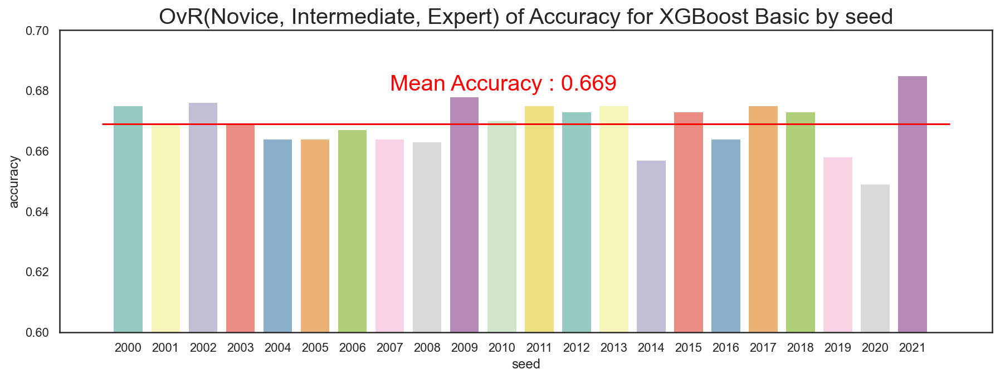

In [522]:
with sns.axes_style('white'):
    plt.figure(figsize=(15,5))
    plt.ylim(0.6, 0.7)
    sns.barplot(x = "seed", y = "accuracy", data = acc_df, palette='Set3')
    plt.title("OvR(Novice, Intermediate, Expert) of Accuracy for XGBoost Basic by seed", fontsize = 20)
    plt.hlines(round(np.mean(acc_df.accuracy), 3), -0.7, 22, color='red')
    plt.text(7, 0.68,'Mean Accuracy : 0.669', fontdict = {'fontsize' : 20}, color = 'red')

In [523]:
seeds[acc_ls.index(max(acc_ls))]

2021

In [524]:
themodel = xgboost.XGBClassifier(booster='gbtree', objective = 'objective=multi:softmax', learning_rate = 0.2, n_estimators = 130, max_depth = 8, min_child_weight = 3, gamma = 0.0, subsample = 0.89, colsample_bytree = 0.8, alpha = 0.0, use_label_encoder=False, seed = seeds[acc_ls.index(max(acc_ls))])
    
fit_params={"early_stopping_rounds": 60, 
        "eval_metric" : "mlogloss", 
        "eval_set" : [[Skill_X_val, Skill_y_val]]}


themodel.fit(Skill_X_train, Skill_y_train, **fit_params)

y_predict=themodel.predict(Skill_X_test)

y_predict_prob = themodel.predict_proba(Skill_X_test)

[0]	validation_0-mlogloss:0.97886
[1]	validation_0-mlogloss:0.89831
[2]	validation_0-mlogloss:0.83322
[3]	validation_0-mlogloss:0.78321
[4]	validation_0-mlogloss:0.73939
[5]	validation_0-mlogloss:0.70295
[6]	validation_0-mlogloss:0.67198
[7]	validation_0-mlogloss:0.64889
[8]	validation_0-mlogloss:0.63060
[9]	validation_0-mlogloss:0.61448
[10]	validation_0-mlogloss:0.59948
[11]	validation_0-mlogloss:0.58925
[12]	validation_0-mlogloss:0.57871
[13]	validation_0-mlogloss:0.56957
[14]	validation_0-mlogloss:0.55772
[15]	validation_0-mlogloss:0.55211
[16]	validation_0-mlogloss:0.54603
[17]	validation_0-mlogloss:0.54251
[18]	validation_0-mlogloss:0.53583
[19]	validation_0-mlogloss:0.53083
[20]	validation_0-mlogloss:0.52937
[21]	validation_0-mlogloss:0.52474
[22]	validation_0-mlogloss:0.52239
[23]	validation_0-mlogloss:0.51867
[24]	validation_0-mlogloss:0.51855
[25]	validation_0-mlogloss:0.51740
[26]	validation_0-mlogloss:0.51876
[27]	validation_0-mlogloss:0.51872
[28]	validation_0-mlogloss:0.5

In [532]:
def get_clf_eval_multi(y_test, y_predict):
    accuracy = accuracy_score(y_test, y_predict)
    precision = precision_score(y_test, y_predict,average='macro')
    recall = recall_score(y_test, y_predict,average='macro')
    F1 = f1_score(y_test, y_predict,average='macro')
    AUC = roc_auc_score(y_test, y_predict, multi_class="ovr")
    Average_Precison = average_precision_score(y_test, y_predict, multi_class="ovr")
    print('\n정확도: {:.4f}'.format(accuracy))
    print('정밀도: {:.4f}'.format(precision))
    print('재현율: {:.4f}'.format(recall))
    print('F1: {:.4f}'.format(F1))
    print('ROC AUC: {:.4f}'.format(AUC))
    print('Average Precision: {:.4f}'.format(Average_Precison))

In [548]:
def get_clf_eval_multi(y_test, y_predict):
    accuracy = accuracy_score(y_test, y_predict)
    precision = precision_score(y_test, y_predict,average='macro')
    recall = recall_score(y_test, y_predict,average='macro')
    F1 = f1_score(y_test, y_predict,average='macro')
    print('\n정확도: {:.4f}'.format(accuracy))
    print('정밀도: {:.4f}'.format(precision))
    print('재현율: {:.4f}'.format(recall))
    print('F1: {:.4f}'.format(F1))

In [550]:
get_clf_eval_multi(Skill_y_test, y_predict)


정확도: 0.6717
정밀도: 0.6705
재현율: 0.6760
F1: 0.6729


In [583]:
print(classification_report(Skill_y_test, y_predict))

              precision    recall  f1-score   support

           0       0.68      0.73      0.70       206
           1       0.67      0.64      0.65       317
           2       0.66      0.66      0.66       141

    accuracy                           0.67       664
   macro avg       0.67      0.68      0.67       664
weighted avg       0.67      0.67      0.67       664



Text(30.5, 0.5, 'True Label')

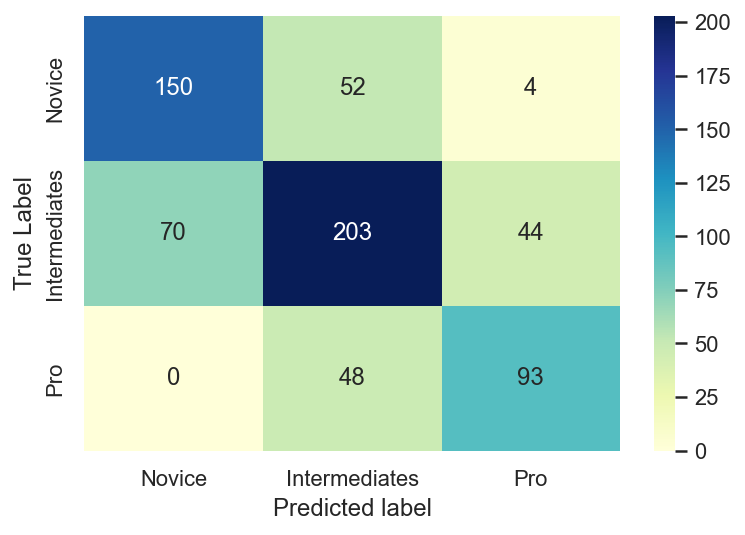

In [584]:
LABELS = ['Novice', 'Intermediates', 'Pro']
sns.heatmap(confusion_matrix(Skill_y_test, y_predict), xticklabels=LABELS, yticklabels=LABELS, annot=True,fmt='d',cmap='YlGnBu')
plt.xlabel('Predicted label')
plt.ylabel('True Label')

### Precision-Reall, AUC Curve

In [585]:
from sklearn.preprocessing import label_binarize

In [586]:
n_classes = len(set(Skill_y_test))

In [587]:
label_y = label_binarize(Skill_y_test, classes=[*range(n_classes)])

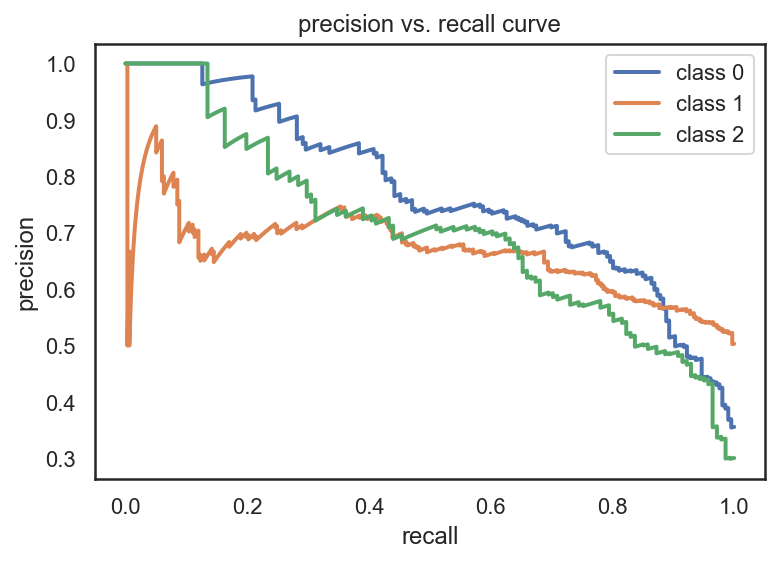

In [588]:
# precision recall curve
n_classes = 3
precision = dict()
recall = dict()
with sns.axes_style('white'):
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(label_y[:, i],
                                                            y_predict_prob[:, i])
        
        plt.plot(recall[i], precision[i], lw=2, label='class {}'.format(i))
    
    plt.xlabel("recall")
    plt.ylabel("precision")
    plt.legend(loc="best")
    plt.title("precision vs. recall curve")
    plt.show()

In [589]:
# class1에서 저런 현상이 일어나는 이유는?

In [590]:
# Precision, Recall, thresholds에 대한 데이터 프레임을 만들어 보자
PRC_dict = {'Precision': precision[1], 'Recall':recall[1]}

In [591]:
PRC_df = pd.DataFrame.from_dict(PRC_dict)

In [592]:
PRC_df[PRC_df['Recall'] <= 0.01]

,Precision,Recall
625,0.600000,0.009464
626,0.500000,0.006309
627,0.666667,0.006309
628,0.500000,0.003155
629,1.000000,0.003155
630,1.000000,0.000000


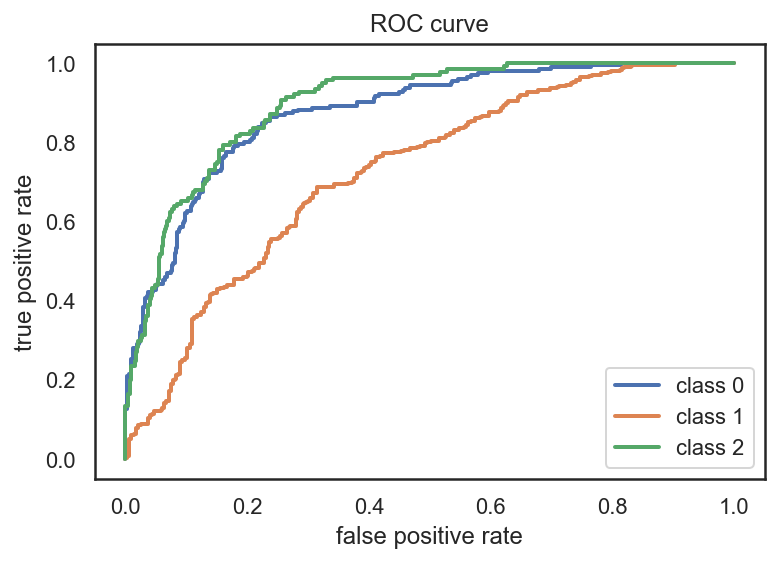

In [593]:
fpr = dict()
tpr = dict()
with sns.axes_style('white'):
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(label_y[:, i],
                                      y_predict_prob[:, i])
        plt.plot(fpr[i], tpr[i], lw=2, label='class {}'.format(i))

    plt.xlabel("false positive rate")
    plt.ylabel("true positive rate")
    plt.legend(loc="best")
    plt.title("ROC curve")
    plt.show()

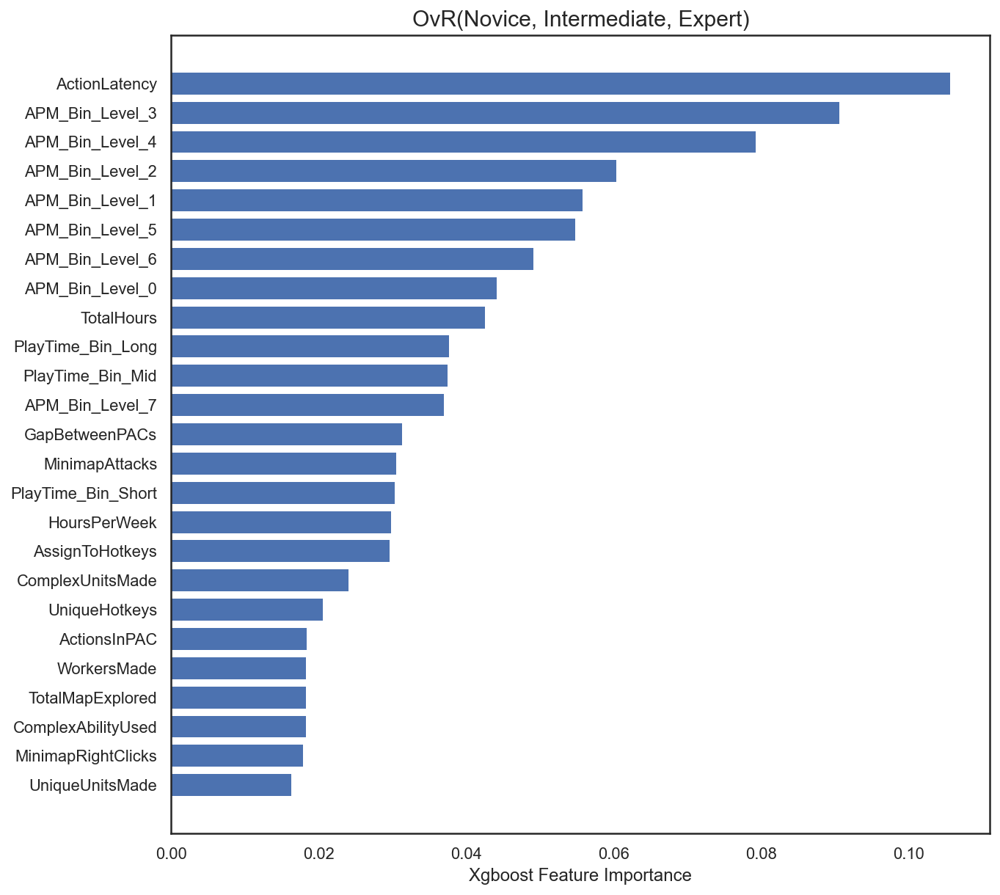

In [594]:
with sns.axes_style('white'):
    plt.figure(figsize=(10,10))
    sorted_idx = themodel.feature_importances_.argsort()
    plt.barh(list(Skill_X_train.columns[sorted_idx]), themodel.feature_importances_[sorted_idx])
    plt.title("OvR(Novice, Intermediate, Expert)", fontdict = {'fontsize' : 15})
    plt.xlabel("Xgboost Feature Importance")

In [595]:
y_predict_prob

array([[0.49796525, 0.44391465, 0.05812009],
       [0.98010457, 0.01866905, 0.00122635],
       [0.42791274, 0.566728  , 0.00535929],
       ...,
       [0.00786994, 0.07991896, 0.9122112 ],
       [0.00933889, 0.6731081 , 0.31755298],
       [0.611195  , 0.38721344, 0.0015915 ]], dtype=float32)

In [597]:
roc_auc_score(Skill_y_test, y_predict_prob, multi_class="ovr")

0.8331509632845148

In [603]:
y_predict

array([0, 0, 1, 1, 0, 0, 1, 1, 2, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 2, 1, 1,
       1, 2, 0, 0, 2, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 2, 1, 2, 0, 2, 2, 1,
       2, 1, 1, 2, 2, 1, 1, 2, 1, 0, 1, 1, 2, 2, 2, 1, 2, 1, 0, 0, 2, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 1, 0, 0, 2, 1, 0, 2, 1, 2, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 2, 0, 2, 2, 1, 2, 0, 2, 2, 0, 1, 1, 2, 0, 1, 1,
       1, 2, 0, 1, 0, 2, 2, 2, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 2, 2, 0, 1, 0, 1, 0, 0, 1, 2, 2, 1, 2, 0, 0, 0, 1,
       1, 2, 2, 2, 1, 2, 2, 0, 1, 1, 1, 2, 1, 2, 0, 0, 0, 1, 1, 1, 1, 1,
       2, 2, 1, 2, 1, 0, 1, 1, 0, 2, 1, 0, 2, 1, 2, 1, 1, 0, 1, 2, 1, 1,
       0, 0, 1, 1, 0, 0, 0, 2, 1, 2, 0, 2, 2, 1, 0, 0, 0, 0, 1, 1, 2, 1,
       1, 1, 1, 2, 0, 0, 1, 2, 2, 0, 0, 1, 0, 1, 1, 1, 2, 0, 2, 2, 1, 1,
       2, 0, 0, 0, 0, 1, 2, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 0,
       0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 2, 1, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 2, 0, 2, 0, 0, 0, 0, 1, 0, 1, 2, 1, 1, 0,

In [607]:
Skill_y_test

861     1
2928    0
3338    0
131     1
904     0
       ..
1502    0
3201    0
1180    0
1937    1
285     1
Name: LeagueLevel, Length: 664, dtype: int64

In [608]:
precision_score(Skill_y_test, y_predict, average="macro")

0.6704532155343194